In [1]:
from astropy.table import Table, vstack
from matplotlib import pyplot as plt
import numpy as np
import random
from lightcurve_fitting.lightcurve import LC
from dust_extinction.parameter_averages import G23
from astropy import units as u
from scipy.stats import wasserstein_distance
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel, PairwiseKernel
from scipy.optimize import minimize
import speclite.filters
from astropy import units as u
from astropy.io import ascii
from astropy.cosmology import Planck18 as cosmo
import datetime
import os
import logging

from glob import glob
from itertools import chain

In [2]:
def flatten_chain(matrix):
    return list(chain.from_iterable(matrix))

all_lc = glob('LC_data/*')
transient_class = dict(SNIa=90,SNIa91bg=67,SNIax=52,SNII=42,SNIbc=62,SLSNI=95,TDE=15,KN=64,AGN=88,
                       ILOT=992,CaRT=993,PISN=994)
class_frac = {clas:len(glob('LC_data/'+clas+'*'))/len(all_lc) for clas in list(transient_class.keys())}
# train_list = [random.sample(glob('LC_data/'+clas+'_id*.dat'),int(0.01*len(all_lc)*frac)) for clas, frac 
#               in list(class_frac.items())]
# train_list = flatten_chain(train_list)

feat_data = np.load('feat.npz', allow_pickle=True)
ids = feat_data['ids']
train_list = ['LC_data/'+idd+'.dat' for idd in ids]
test_list = list(set(all_lc)-set(train_list))

In [ ]:
np.where(np.array(test_list)=='LC_data/SNIa_id69764096.dat')

In [4]:
'LC_data/SNIa_id69764096.dat' in test_list

True

In [20]:
lsst = speclite.filters.load_filters(f'lsst2016-*')

filters = 'ugrizy'
colors = ['darkblue','green','red','orange','purple','black']
max_band = len(filters)

data = {f: speclite.filters.load_filters(f'lsst2016-{f}')[0] for f in filters}
wavelength = np.linspace(3000, 11000, num=10000)*u.AA

normalized = {f: data[f](wavelength)/data[f](wavelength).sum() for f in filters}

def distance_between_filters(filter1, filter2):
    return wasserstein_distance(u_values=wavelength.value, v_values=wavelength.value,
                                u_weights=normalized[filter1], v_weights=normalized[filter2])

distance_matrix = np.array([[distance_between_filters(col, row) for col in filters] for row in filters])
distance_matrix /= np.average(distance_matrix)

In [21]:
def run_gp(Xt, Xf, Xfl, Xfle):

    mag_var = np.var(Xfl)

    def metric(x1, x2, p):
        band1 = (x1[1].astype(int))
        band2 = (x2[1].astype(int))
        time_distance = x2[0] - x1[0]
        photometric_distance = distance_matrix[band1, band2]

        return (
            mag_var*np.exp(-photometric_distance**2/(2*p[0]**2) - time_distance**2/(2*p[1]**2))
            )
        
    def fit_gp(X, y, p):
        cur_metric = lambda x1, x2, gamma: metric(x1, x2, p)

        kernel = PairwiseKernel(metric=cur_metric)
        gp = GaussianProcessRegressor(kernel=kernel,
                                    alpha=y[:, 1]**2,
                                    normalize_y=False)
        gp.fit(X, y[:, 0])
        return gp

    cX = np.stack(
        (Xt, Xf), axis=1).astype(np.float64)
    cy = np.stack(
        (Xfl, Xfle), axis=1).astype(np.float64)

    def try_lt_lp(p):
        summed_log_like = 0.0
        gp = fit_gp(cX, cy, p)
        summed_log_like += gp.log_marginal_likelihood()

        return -summed_log_like
    
    
    res = minimize(
        lambda x: try_lt_lp(np.exp(x)),
        [0.0, 7.0], bounds=[(0, Xf.max()-Xf.min()),(0,np.diff(Xt).max())])
    best_lengths = np.exp(
        res.x
    )

    gp = fit_gp(cX, cy, best_lengths)
    all_mus = []
    all_stds = []
    for band in range(max_band):
        times = np.linspace(-100,200,300)
        test_data = np.array([[it, band] for it in times])
        mu, std = gp.predict(test_data, return_std=True)
        all_mus.append(mu)
        all_stds.append(std**2) #this is var, hacky
    
    all_stds = np.array(all_stds)
    all_mus = np.array(all_mus)
    return all_mus, all_stds, gp, times

In [22]:
def preprocess_LC(train_list, meta_file='meta_all.csv'):
    """
    Read in LC files and convert to LC object

    Parameters
    ----------
    lcs_table : astropy.table.Table
        List of LC file names, to be read in.
    obj_names : list
        List of SNe names, should be same length as input_files
    style : string
        Style of LC files. Assumes SNANA

    Returns
    -------
    lcs : list
        list of Light Curve objects

    Examples
    --------
    """
    LC_list = []
    meta_data = Table.read(meta_file,format='ascii')
    for event in train_list:
        lc = Table.read(event,format='ascii')
        lc = lc[lc['detected_bool']==1]
        t = np.asarray(lc['mjd'],dtype=float)
        f = np.asarray(lc['flux'],dtype=float)
        err = np.asarray(lc['flux_err'],dtype=float)
        filts = np.asarray(lc['passband'],dtype=int)
        sn_name = event.split('/')[-1][:-4]
        my_lc = LightCurve(sn_name, t, f, err, filts)

        meta = meta_data[meta_data['object_id']==lc['object_id'][0]]

        my_lc.add_LC_info(zpt=27.5, mwebv=float(meta['mwebv']), redshift=float(meta['hostgal_photoz']), 
                          redshift_err = float(meta['hostgal_photoz_err']), lim_mag=26,
                          obj_type=sn_name.split('_')[0])
        my_lc.get_abs_mags()
        if np.inf in my_lc.abs_mags:
            print(f'Object {sn_name} not processed: invalid absolute magnitude found.')
            continue
        my_lc.sort_lc()
        if my_lc.times.size < 1:
            print(f'Object {sn_name} not processed: not enough data points.')
            continue

        pmjd = my_lc.find_peak(float(meta['true_peakmjd']))
        my_lc.shift_lc(pmjd)
        my_lc.correct_time_dilation()
        my_lc.cut_lc()
        if my_lc.times.size < 3:
            print(f'Object {sn_name} not processed: not enough data points.')
            continue
        my_lc.make_dense_LC();
        print(f'Object {sn_name} processed.')
        LC_list.append(my_lc)
        
    return LC_list

In [23]:
class LightCurve(object):
    """Light Curve class
    """
    def __init__(self, name, times, fluxes, flux_errs, filters,
                 zpt=0, mwebv=0, redshift=None, redshift_err=None,
                 lim_mag=None, obj_type=None):

        self.name = name
        self.times = times
        self.fluxes = fluxes
        self.flux_errs = flux_errs
        self.filters = filters
        self.zpt = zpt
        self.mwebv = mwebv
        self.redshift = redshift
        self.redshift_err = redshift_err
        self.lim_mag = lim_mag
        self.obj_type = obj_type

        self.abs_mags = None
        self.abs_mags_err = None
        self.abs_lim_mag = None

    def sort_lc(self):
        gind = np.argsort(self.times)
        self.times = self.times[gind]
        self.fluxes = self.fluxes[gind]
        self.flux_errs = self.flux_errs[gind]
        self.filters = self.filters[gind]
        if self.abs_mags is not None:
            self.abs_mags = self.abs_mags[gind]
            self.abs_mags_err = self.abs_mags_err[gind]

    def find_peak(self, tpeak_guess):
        gind = np.where((np.abs(self.times-tpeak_guess) < 1000.0) &
                        (self.fluxes/self.flux_errs > 3.0))
        if len(gind[0]) == 0:
            gind = np.where((np.abs(self.times - tpeak_guess) < 1000.0))
        if len(gind[0]) == 0:
            tpeak = tpeak_guess
            return tpeak
        if self.abs_mags is not None:
            tpeak = self.times[gind][np.argmin(self.abs_mags[gind])]
        return tpeak

    def cut_lc(self, limit_before=100, limit_after=200):
        gind = np.where((self.times > -limit_before) &
                        (self.times < limit_after))
        self.times = self.times[gind]
        self.fluxes = self.fluxes[gind]
        self.flux_errs = self.flux_errs[gind]
        self.filters = self.filters[gind]
        if self.abs_mags is not None:
            self.abs_mags = self.abs_mags[gind]
            self.abs_mags_err = self.abs_mags_err[gind]

    def shift_lc(self, t0=0):
        self.times = self.times - t0

    def correct_time_dilation(self):
        self.times = self.times / (1.+self.redshift)

    def add_LC_info(self, zpt=27.5, mwebv=0.0, redshift=0.0,redshift_err=0.0,
                    lim_mag=25.0, obj_type='-'):
        self.zpt = zpt
        self.mwebv = mwebv
        self.redshift = redshift
        self.redshift_err = redshift_err
        self.lim_mag = lim_mag
        self.obj_type = obj_type

    def get_abs_mags(self, replace_nondetections=True, mag_err_fill=1.0):
        """
        Convert flux into absolute magnitude

        Parameters
        ----------
        replace_nondetections : bool
            Replace nondetections with limiting mag.

        Returns
        -------
        self.abs_mags : list
            Absolute magnitudes

        Examples
        --------
        """
        lsst_filters = {'0':3740., '1':4870., '2':6250., '3':7700., '4':8900., '5':10845.}
        ext = G23(Rv=3.1)
        reddening = -2.5 * np.log10(ext.extinguish([lsst_filters[str(filt)] for filt 
                                                    in self.filters.astype(int)] * u.AA, 
                                                    Ebv=self.mwebv))
        k_correction = 2.5 * np.log10(1.+self.redshift)
        dist = cosmo.luminosity_distance([self.redshift]).value[0]  # returns dist in Mpc

        self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
            np.log10(dist*1e6/10.0) + k_correction - reddening
        self.abs_mags_err = np.abs((2.5/np.log(10))*(self.flux_errs/self.fluxes))

        if replace_nondetections:
            abs_lim_mag = self.lim_mag - 5.0 * np.log10(dist * 1e6 / 10.0) + \
                            k_correction
            gind = np.where((np.isnan(self.abs_mags)) |
                            np.isinf(self.abs_mags) |
                            np.isnan(self.abs_mags_err) |
                            np.isinf(self.abs_mags_err) |
                            (self.abs_mags > self.lim_mag))

            self.abs_mags[gind] = abs_lim_mag
            self.abs_mags_err[gind] = mag_err_fill
        self.abs_lim_mag = abs_lim_mag

        return self.abs_mags, self.abs_mags_err

    def make_dense_LC(self, nfilts=6):
        gp_mags = self.abs_mags - self.abs_lim_mag
        dense_fluxes = np.zeros((len(self.times), nfilts))
        dense_errs = np.zeros((len(self.times), nfilts))
        stacked_data = np.vstack([self.times, self.filters]).T
        x_pred = np.zeros((len(self.times)*nfilts, 2))
        print(self.name)

        pred, pred_var, gp, times = run_gp(self.times, self.filters, gp_mags, self.abs_mags_err)
        pred = pred.T
        pred_var = pred_var.T
        self.gp = [1,2,3]

        dense_fluxes = pred + self.abs_lim_mag
        dense_errs = np.sqrt(pred_var)

        self.dense_lc = np.dstack((dense_fluxes, dense_errs))
        self.dense_times = times

        self.gp_mags = gp_mags
        return gp, gp_mags

In [24]:
def save_lcs(lc_list, output_dir='/Users/brianhsu/ASTR513/ASTR513-Term-Project/preprocessed_lc/', 
             file_suffix = ''):
    """
    Save light curves as a lightcurve object

    Parameters
    ----------
    lc_list : list
        list of light curve files
    output_dir : Output directory of light curve file
    file_suffix : str
        String to append to file name
    """
    now = datetime.datetime.now()
    date = str(now.strftime("%Y-%m-%d"))
    file_name = 'lcs_' + date + '_'+file_suffix+'.npz'

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if output_dir[-1] != '/':
        output_dir += '/'

    output_file = output_dir + file_name
    np.savez(output_file, lcs=lc_list)
    # Also easy save to latest
    np.savez(output_dir+'test_lcs.npz', lcs=lc_list)

    logging.info(f'Saved to {output_file}')

In [ ]:
test = preprocess_LC(test_list)

SNII_id16305
Object SNII_id16305 processed.
SNII_id63514496
Object SNII_id63514496 processed.
SNIa_id107451905
Object SNIa_id107451905 processed.
SNIa_id25853430
Object SNIa_id25853430 processed.
SNII_id42015083
Object SNII_id42015083 processed.
SNIa_id58281104
Object SNIa_id58281104 processed.
SNIa_id4430738
Object SNIa_id4430738 processed.
SNIa_id19837867
Object SNIa_id19837867 processed.
SNII_id70929988
Object SNII_id70929988 processed.
SNIa_id40453519
Object SNIa_id40453519 processed.
SNIa_id52417364
Object SNIa_id52417364 processed.
SNIa_id44121856
Object SNIa_id44121856 processed.
SNIax_id8587550
Object SNIax_id8587550 processed.
SNIa_id98052274
Object SNIa_id98052274 processed.
SNIa_id110386209
Object SNIa_id110386209 processed.
SNII_id46463656
Object SNII_id46463656 processed.
AGN_id85615683
Object AGN_id85615683 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id93236646
Object SNII_id93236646 processed.
SNIa_id107362569
Object SNIa_id107362569 processed.
SNIa_id40883126
Object SNIa_id40883126 processed.
SNII_id98406394
Object SNII_id98406394 processed.
SNIa_id55784932
Object SNIa_id55784932 processed.
SNIa_id107936574
Object SNIa_id107936574 processed.
SNII_id95734287
Object SNII_id95734287 processed.
SNIa_id57097839
Object SNIa_id57097839 processed.
TDE_id52805282
Object TDE_id52805282 processed.
SNIa_id122828172
Object SNIa_id122828172 processed.
SNIa_id9469378
Object SNIa_id9469378 processed.
SNIa_id32319214
Object SNIa_id32319214 processed.
SNIa_id110502927
Object SNIa_id110502927 processed.
SNIa_id71113
Object SNIa_id71113 processed.
SNIa_id86217593
Object SNIa_id86217593 processed.
SNIa_id17588613
Object SNIa_id17588613 processed.
SNIa_id55256608
Object SNIa_id55256608 processed.
SNIa_id101388195
Object SNIa_id101388195 processed.
SNIbc_id34326365
Object SNIbc_id34326365 processed.
SNIbc_id75592708
Object SNIbc_id75592708 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id129254773
Object SNIa_id129254773 processed.
SNII_id69240781
Object SNII_id69240781 processed.
SNIa_id104590316
Object SNIa_id104590316 processed.
SNII_id32320172
Object SNII_id32320172 processed.
SNII_id67255881
Object SNII_id67255881 processed.
SNII_id15225155
Object SNII_id15225155 processed.
SNIa_id64058852
Object SNIa_id64058852 processed.
SNIa_id76312245
Object SNIa_id76312245 processed.
SNIa_id41514181
Object SNIa_id41514181 processed.
SNII_id72740084
Object SNII_id72740084 processed.
SNIbc_id10055059
Object SNIbc_id10055059 processed.
SNIa_id92368832
Object SNIa_id92368832 processed.
SNIa_id94864373
Object SNIa_id94864373 processed.
SNIa_id52456966
Object SNIa_id52456966 processed.
SNIa_id31722577
Object SNIa_id31722577 processed.
SNII_id151963
Object SNII_id151963 processed.
SNIa_id81600258
Object SNIa_id81600258 processed.
SNIbc_id56575333
Object SNIbc_id56575333 processed.
SNIa_id113504029
Object SNIa_id113504029 processed.
SNII_id126889546
Object SNII_id126889546 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17252678 processed.
SNII_id97220568
Object SNII_id97220568 processed.
TDE_id71412313
Object TDE_id71412313 processed.
SNII_id57096371
Object SNII_id57096371 processed.
SNIa_id64168066
Object SNIa_id64168066 processed.
SNIa_id104699896
Object SNIa_id104699896 processed.
SNII_id113773460
Object SNII_id113773460 processed.
SNIa_id32130516
Object SNIa_id32130516 processed.
SNII_id92363761
Object SNII_id92363761 processed.
SNIa_id37916572
Object SNIa_id37916572 processed.
SNII_id127274296
Object SNII_id127274296 processed.
SNIa_id10012966
Object SNIa_id10012966 processed.
SNIa_id120248709
Object SNIa_id120248709 processed.
SNIa_id5626117
Object SNIa_id5626117 processed.
SNIa_id38787730
Object SNIa_id38787730 processed.
SNII_id120574620
Object SNII_id120574620 processed.
SNIbc_id79199159
Object SNIbc_id79199159 processed.
AGN_id53109777
Object AGN_id53109777 processed.
SNIbc_id58702137


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id58702137 processed.
SNII_id38658584
Object SNII_id38658584 processed.
SNIa_id61577491
Object SNIa_id61577491 processed.
SNIa_id62493671
Object SNIa_id62493671 processed.
SNII_id127667895
Object SNII_id127667895 processed.
SNII_id93288620
Object SNII_id93288620 processed.
SNIa_id14079877
Object SNIa_id14079877 processed.
SNIa_id27653959
Object SNIa_id27653959 processed.
SNIa_id12303539
Object SNIa_id12303539 processed.
SNIa_id94109398
Object SNIa_id94109398 processed.
AGN_id33242174


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33242174 processed.
SNIax_id15344495
Object SNIax_id15344495 processed.
SNII_id68810303
Object SNII_id68810303 processed.
SNII_id69529329
Object SNII_id69529329 processed.
SNIa_id116208198
Object SNIa_id116208198 processed.
SNII_id42222448
Object SNII_id42222448 processed.
SNII_id94054133
Object SNII_id94054133 processed.
SNIa_id120006347
Object SNIa_id120006347 processed.
SNII_id23970223
Object SNII_id23970223 processed.
SNIa_id111286095
Object SNIa_id111286095 processed.
SNIbc_id26428004
Object SNIbc_id26428004 processed.
AGN_id25515311


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25515311 processed.
SNIa_id39416603
Object SNIa_id39416603 processed.
SNIbc_id56951118
Object SNIbc_id56951118 processed.
SNIa_id30119824
Object SNIa_id30119824 processed.
SNII_id29415084
Object SNII_id29415084 processed.
SNIa_id69955225
Object SNIa_id69955225 processed.
SNIa_id86769671
Object SNIa_id86769671 processed.
SNIa_id35555557
Object SNIa_id35555557 processed.
SNIbc_id74355972
Object SNIbc_id74355972 processed.
SNIa_id52753173
Object SNIa_id52753173 processed.
SNIa_id66249650
Object SNIa_id66249650 processed.
SNIa_id85202224
Object SNIa_id85202224 processed.
SNIa_id112665265
Object SNIa_id112665265 processed.
SNII_id127505733
Object SNII_id127505733 processed.
SNIa91bg_id13647594
Object SNIa91bg_id13647594 processed.
SNIa_id76223163
Object SNIa_id76223163 processed.
SNIa_id54251695
Object SNIa_id54251695 processed.
SNII_id35466243
Object SNII_id35466243 processed.
SNIbc_id87784453
Object SNIbc_id87784453 processed.
SNIa_id103019790
Object SNIa_id103019790 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id72403153
Object AGN_id72403153 processed.
AGN_id66470681
Object AGN_id66470681 processed.
SNII_id15494174
Object SNII_id15494174 processed.
SNII_id83512697
Object SNII_id83512697 processed.
SNIa_id79744607
Object SNIa_id79744607 processed.
SNIa_id89838255
Object SNIa_id89838255 processed.
SNII_id98497979
Object SNII_id98497979 processed.
SNIbc_id65414386
Object SNIbc_id65414386 processed.
SNIa_id48225475
Object SNIa_id48225475 processed.
SNIa_id111766553
Object SNIa_id111766553 processed.
SNIa_id58983489
Object SNIa_id58983489 processed.
SNII_id130531619
Object SNII_id130531619 processed.
SNIa_id42025789
Object SNIa_id42025789 processed.
SNIa_id33234654
Object SNIa_id33234654 processed.
SNIa_id23235050
Object SNIa_id23235050 processed.
SNIa_id65066182
Object SNIa_id65066182 processed.
SNII_id50100464
Object SNII_id50100464 processed.
SNII_id1425226
Object SNII_id1425226 processed.
SNIa_id29379394
Object SNIa_id29379394 processed.
SNIa_id29978791
Object SNIa_id29978791 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id16794851
Object AGN_id16794851 processed.
SNIa_id50517929
Object SNIa_id50517929 processed.
SNIa_id64095910
Object SNIa_id64095910 processed.
SNII_id66517509
Object SNII_id66517509 processed.
SNIa_id106166370
Object SNIa_id106166370 processed.
ILOT_id129594963
Object ILOT_id129594963 processed.
SNII_id39295302
Object SNII_id39295302 processed.
SNIa91bg_id34461430
Object SNIa91bg_id34461430 processed.
SNII_id69819644
Object SNII_id69819644 processed.
SNII_id116334031
Object SNII_id116334031 processed.
SNII_id88804100
Object SNII_id88804100 processed.
SNIa_id57329856
Object SNIa_id57329856 processed.
SNII_id62578687
Object SNII_id62578687 processed.
SNII_id27499520
Object SNII_id27499520 processed.
SNIa_id7095464
Object SNIa_id7095464 processed.
SNII_id28194813
Object SNII_id28194813 processed.
SNII_id95992561
Object SNII_id95992561 processed.
SNIa_id93804479
Object SNIa_id93804479 processed.
SNII_id55921289
Object SNII_id55921289 processed.
SNIa_id108027145
Object SNIa_id108027145

Object CaRT_id25526327 processed.
TDE_id52317954
Object TDE_id52317954 processed.
SNIa_id4006568
Object SNIa_id4006568 processed.
SNII_id31042478
Object SNII_id31042478 processed.
SNIa91bg_id113654030
Object SNIa91bg_id113654030 processed.
SNIa_id51400089
Object SNIa_id51400089 processed.
SNIa_id49505076
Object SNIa_id49505076 processed.
SNIax_id12145623
Object SNIax_id12145623 processed.
SNIbc_id21731995
Object SNIbc_id21731995 processed.
SNIbc_id89373667
Object SNIbc_id89373667 processed.
SNII_id69628513
Object SNII_id69628513 processed.
SNIa_id121976130
Object SNIa_id121976130 processed.
SNII_id23508572
Object SNII_id23508572 processed.
SNII_id31386149
Object SNII_id31386149 processed.
SNIa_id62269176
Object SNIa_id62269176 processed.
SNIa_id12156447
Object SNIa_id12156447 processed.
SNIa_id82165399
Object SNIa_id82165399 processed.
TDE_id114606912
Object TDE_id114606912 processed.
SNIa_id80049429
Object SNIa_id80049429 processed.
SNII_id69716135
Object SNII_id69716135 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id37604336
Object AGN_id37604336 processed.
SNIa_id124405718
Object SNIa_id124405718 processed.
SNIa_id229479
Object SNIa_id229479 processed.
SNII_id46254198
Object SNII_id46254198 processed.
SNIa91bg_id29458326
Object SNIa91bg_id29458326 processed.
SNIa_id88770628
Object SNIa_id88770628 processed.
SNII_id120283510
Object SNII_id120283510 processed.
SNIa_id74585371
Object SNIa_id74585371 processed.
SNIa_id60654353
Object SNIa_id60654353 processed.
SNIa_id34409407
Object SNIa_id34409407 processed.
SNIa_id123274480
Object SNIa_id123274480 processed.
SNIa_id1928758
Object SNIa_id1928758 processed.
SNIa_id36116698
Object SNIa_id36116698 processed.
SNII_id44508748
Object SNII_id44508748 processed.
SNIa_id28248056
Object SNIa_id28248056 processed.
SNIbc_id18870383
Object SNIbc_id18870383 processed.
SNIbc_id119409705
Object SNIbc_id119409705 processed.
SNIa91bg_id96696209
Object SNIa91bg_id96696209 processed.
SNIa_id129698066
Object SNIa_id129698066 processed.
SNII_id9184614
Object SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id108067193
Object AGN_id108067193 processed.
SNIa_id43083
Object SNIa_id43083 processed.
SNIbc_id117687706
Object SNIbc_id117687706 processed.
SNII_id20840307
Object SNII_id20840307 processed.
SNII_id97854323
Object SNII_id97854323 processed.
SNII_id107817473
Object SNII_id107817473 processed.
SNIa_id79539676
Object SNIa_id79539676 processed.
SNIa_id129407483
Object SNIa_id129407483 processed.
SNIa_id12072630
Object SNIa_id12072630 processed.
SNIa_id90795484
Object SNIa_id90795484 processed.
SNII_id92903358
Object SNII_id92903358 processed.
SNII_id118270558
Object SNII_id118270558 processed.
SNIa_id18987297
Object SNIa_id18987297 processed.
SNIa_id57317807
Object SNIa_id57317807 processed.
SNIa_id60046515
Object SNIa_id60046515 processed.
SNII_id69665455
Object SNII_id69665455 processed.
SNIa_id59166817
Object SNIa_id59166817 processed.
SNII_id118807809
Object SNII_id118807809 processed.
SNII_id109664871
Object SNII_id109664871 processed.
SNIa_id102803115
Object SNIa_id102803115 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id31076109
Object SNIa_id31076109 processed.
SNIa_id110953499
Object SNIa_id110953499 processed.
SNIa_id48208103
Object SNIa_id48208103 processed.
SNIa_id117329286
Object SNIa_id117329286 processed.
SNIa_id24249262
Object SNIa_id24249262 processed.
SNII_id100537265
Object SNII_id100537265 processed.
SNIa_id24188067
Object SNIa_id24188067 processed.
SNIa_id93932251
Object SNIa_id93932251 processed.
SNIa_id27758730
Object SNIa_id27758730 processed.
SNII_id65319724
Object SNII_id65319724 processed.
SNII_id13248102
Object SNII_id13248102 processed.
SNII_id118329767
Object SNII_id118329767 processed.
SNII_id118887877
Object SNII_id118887877 processed.
SNIa_id92449612
Object SNIa_id92449612 processed.
SNIa_id9089524
Object SNIa_id9089524 processed.
SNII_id58032883
Object SNII_id58032883 processed.
SNII_id33734147
Object SNII_id33734147 processed.
SNIa_id34584168
Object SNIa_id34584168 processed.
SNIa_id68114284
Object SNIa_id68114284 processed.
Object AGN_id40519685 not processed: not e

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id44180192
Object SNII_id44180192 processed.
SNIa_id101998280
Object SNIa_id101998280 processed.
SNIbc_id10024913
Object SNIbc_id10024913 processed.
SNII_id74334463
Object SNII_id74334463 processed.
SNIa_id113508271
Object SNIa_id113508271 processed.
SNIa_id94871638
Object SNIa_id94871638 processed.
SNII_id66030418
Object SNII_id66030418 processed.
SNIa91bg_id114324680
Object SNIa91bg_id114324680 processed.
SNIa_id109281381
Object SNIa_id109281381 processed.
SNIa_id91049085
Object SNIa_id91049085 processed.
SNIa91bg_id74447101
Object SNIa91bg_id74447101 processed.
SNII_id2602927
Object SNII_id2602927 processed.
AGN_id70489538
Object AGN_id70489538 processed.
SNIa_id66505246
Object SNIa_id66505246 processed.
SNIa_id11544649
Object SNIa_id11544649 processed.
SNIa_id112505140
Object SNIa_id112505140 processed.
SNIax_id24040711
Object SNIax_id24040711 processed.
SNIa_id68438982
Object SNIa_id68438982 processed.
SNIa_id104994178
Object SNIa_id104994178 processed.
AGN_id40080892


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40080892 processed.
SNIa_id68687034
Object SNIa_id68687034 processed.
SNIbc_id35439227
Object SNIbc_id35439227 processed.
SNII_id53555233
Object SNII_id53555233 processed.
SNIa_id104041483
Object SNIa_id104041483 processed.
SNIbc_id50600594
Object SNIbc_id50600594 processed.
SNII_id3457766
Object SNII_id3457766 processed.
SNIa_id128441573
Object SNIa_id128441573 processed.
SNIa_id23802091
Object SNIa_id23802091 processed.
SNIa_id9247672
Object SNIa_id9247672 processed.
SNIa_id120218743
Object SNIa_id120218743 processed.
SNII_id94170671
Object SNII_id94170671 processed.
SNIa_id74393178
Object SNIa_id74393178 processed.
SNII_id42228564
Object SNII_id42228564 processed.
SNII_id73683005
Object SNII_id73683005 processed.
SNIbc_id23535815
Object SNIbc_id23535815 processed.
SNII_id8624189
Object SNII_id8624189 processed.
SNIbc_id93233080
Object SNIbc_id93233080 processed.
SNIa_id61222324
Object SNIa_id61222324 processed.
SNIa_id5007865
Object SNIa_id5007865 processed.
SNIa91bg_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id32516389 processed.
SNII_id46159327
Object SNII_id46159327 processed.
SNIa_id15306535
Object SNIa_id15306535 processed.
SNIa_id10118611
Object SNIa_id10118611 processed.
SNIa_id49707053
Object SNIa_id49707053 processed.
SNIbc_id28016980
Object SNIbc_id28016980 processed.
SNII_id122961379
Object SNII_id122961379 processed.
SNIa_id8253687
Object SNIa_id8253687 processed.
SNIa_id63401154
Object SNIa_id63401154 processed.
SNIbc_id122531638
Object SNIbc_id122531638 processed.
SNIbc_id77489750
Object SNIbc_id77489750 processed.
SNIa_id56117292
Object SNIa_id56117292 processed.
SNIa_id101918792
Object SNIa_id101918792 processed.
SNIa_id10353879
Object SNIa_id10353879 processed.
SNIa_id77086745
Object SNIa_id77086745 processed.
SNII_id100676235
Object SNII_id100676235 processed.
SNIa_id112580179
Object SNIa_id112580179 processed.
SNIa_id108834472
Object SNIa_id108834472 processed.
SNIa_id117881623
Object SNIa_id117881623 processed.
SNIbc_id68244786
Object SNIbc_id68244786 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48869127 processed.
SNIa_id61661772
Object SNIa_id61661772 processed.
SNII_id111775593
Object SNII_id111775593 processed.
SNIa_id90084312
Object SNIa_id90084312 processed.
SNIa_id2124340
Object SNIa_id2124340 processed.
SNIa_id51968045
Object SNIa_id51968045 processed.
SNIa_id14261619
Object SNIa_id14261619 processed.
SNIa_id49116164
Object SNIa_id49116164 processed.
SNII_id96526426
Object SNII_id96526426 processed.
SNIax_id45975406
Object SNIax_id45975406 processed.
SNIa_id63885520
Object SNIa_id63885520 processed.
SNIa_id120421170
Object SNIa_id120421170 processed.
SNIa_id34967476
Object SNIa_id34967476 processed.
SNIa_id104697056
Object SNIa_id104697056 processed.
AGN_id30477447
Object AGN_id30477447 processed.
SNII_id95020380
Object SNII_id95020380 processed.
SNIa_id93516752
Object SNIa_id93516752 processed.
SNIa_id106866968
Object SNIa_id106866968 processed.
AGN_id118726920
Object AGN_id118726920 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id129116289
Object SNIa_id129116289 processed.
SNII_id110037434
Object SNII_id110037434 processed.
SNIbc_id79577018
Object SNIbc_id79577018 processed.
SNIa_id91399462
Object SNIa_id91399462 processed.
SLSNI_id83609898
Object SLSNI_id83609898 processed.
SNII_id96500489
Object SNII_id96500489 processed.
SNII_id106546454
Object SNII_id106546454 processed.
SNIa_id34481085
Object SNIa_id34481085 processed.
SNIa_id110277990
Object SNIa_id110277990 processed.
SNII_id2631488
Object SNII_id2631488 processed.
SNIa_id59839629
Object SNIa_id59839629 processed.
SNIa_id47060214
Object SNIa_id47060214 processed.
SNIbc_id129980627
Object SNIbc_id129980627 processed.
SNIa_id99314230
Object SNIa_id99314230 processed.
SNII_id25961179
Object SNII_id25961179 processed.
SNII_id89905628
Object SNII_id89905628 processed.
SNIa_id33778617
Object SNIa_id33778617 processed.
AGN_id53103694
Object AGN_id53103694 processed.
SNIa_id115825139
Object SNIa_id115825139 processed.
SNII_id50326776
Object SNII_id503267

Object SNIa_id4085054 processed.
SNIbc_id63993892
Object SNIbc_id63993892 processed.
SNIa_id66706824
Object SNIa_id66706824 processed.
SNII_id26653631
Object SNII_id26653631 processed.
SNIa_id306059
Object SNIa_id306059 processed.
SNIa_id8688842
Object SNIa_id8688842 processed.
SNII_id47439905
Object SNII_id47439905 processed.
SNII_id12426883
Object SNII_id12426883 processed.
SNIa_id94602491
Object SNIa_id94602491 processed.
SNIa_id9233428
Object SNIa_id9233428 processed.
SLSNI_id129211534
Object SLSNI_id129211534 processed.
SNIa_id11454951
Object SNIa_id11454951 processed.
SNII_id306235
Object SNII_id306235 processed.
SNIa_id76321711
Object SNIa_id76321711 processed.
SNIa_id62298958
Object SNIa_id62298958 processed.
SNIa_id97533
Object SNIa_id97533 processed.
SNII_id103069586
Object SNII_id103069586 processed.
SNIa_id10965201
Object SNIa_id10965201 processed.
SNIa_id118523377
Object SNIa_id118523377 processed.
SNII_id54252810
Object SNII_id54252810 processed.
SNIa_id22473496
Object SN

Object SNII_id25482 processed.
SNIa_id96062177
Object SNIa_id96062177 processed.
SNIa_id3783422
Object SNIa_id3783422 processed.
SNII_id97206139
Object SNII_id97206139 processed.
SNIa_id21707850
Object SNIa_id21707850 processed.
SNIa_id107856575
Object SNIa_id107856575 processed.
SNIa_id107932405
Object SNIa_id107932405 processed.
SNIa_id120562454
Object SNIa_id120562454 processed.
SNIa_id3810906
Object SNIa_id3810906 processed.
SNII_id11980089
Object SNII_id11980089 processed.
SNII_id98091678
Object SNII_id98091678 processed.
SNII_id66113792
Object SNII_id66113792 processed.
SNIa_id130641812
Object SNIa_id130641812 processed.
SNIa_id14465831
Object SNIa_id14465831 processed.
SNIa_id32592257
Object SNIa_id32592257 processed.
SNIa_id8469315
Object SNIa_id8469315 processed.
SNII_id67477198
Object SNII_id67477198 processed.
SNIa_id125458538
Object SNIa_id125458538 processed.
SNII_id86403583
Object SNII_id86403583 processed.
SNIa_id81992911
Object SNIa_id81992911 processed.
SNIa_id63834387

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id69911897
Object SNIa_id69911897 processed.
SNIbc_id113340066
Object SNIbc_id113340066 processed.
SNIa_id93272317
Object SNIa_id93272317 processed.
SNIa_id85367111
Object SNIa_id85367111 processed.
SNII_id33591498
Object SNII_id33591498 processed.
SNIa_id9417727
Object SNIa_id9417727 processed.
SNIa_id11197677
Object SNIa_id11197677 processed.
SNII_id88769229
Object SNII_id88769229 processed.
SNIa_id128736594
Object SNIa_id128736594 processed.
SNII_id33717180
Object SNII_id33717180 processed.
SNII_id50169237
Object SNII_id50169237 processed.
SNIa_id107117713
Object SNIa_id107117713 processed.
SNIa_id73066238
Object SNIa_id73066238 processed.
SNIa_id100087785
Object SNIa_id100087785 processed.
SNIa_id26801547
Object SNIa_id26801547 processed.
SNIa_id6139676
Object SNIa_id6139676 processed.
SNIax_id18123464
Object SNIax_id18123464 processed.
SNIa_id17813395
Object SNIa_id17813395 processed.
SNIa_id103331427
Object SNIa_id103331427 processed.
SNIa_id37516289
Object SNIa_id37516289 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id87063577
Object AGN_id87063577 processed.
SNII_id21437290
Object SNII_id21437290 processed.
SNIa_id111012502
Object SNIa_id111012502 processed.
SNII_id13227497
Object SNII_id13227497 processed.
SNIa_id129089756
Object SNIa_id129089756 processed.
SLSNI_id34873396
Object SLSNI_id34873396 processed.
SNII_id88609379
Object SNII_id88609379 processed.
SNIa_id91616243
Object SNIa_id91616243 processed.
SNIa_id2755462
Object SNIa_id2755462 processed.
SLSNI_id88264866
Object SLSNI_id88264866 processed.
SNII_id43373828
Object SNII_id43373828 processed.
SNIa_id34419956
Object SNIa_id34419956 processed.
SNIa_id125331151
Object SNIa_id125331151 processed.
SNIa_id9338724
Object SNIa_id9338724 processed.
SNII_id118499099
Object SNII_id118499099 processed.
SNIa_id17735861
Object SNIa_id17735861 processed.
SNIa_id61707684
Object SNIa_id61707684 processed.
SNII_id37700393
Object SNII_id37700393 processed.
SNIa_id115223793
Object SNIa_id115223793 processed.
SNIbc_id32539424
Object SNIbc_id32539424 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id41080614
Object AGN_id41080614 processed.
CaRT_id31020907
Object CaRT_id31020907 processed.
SNIa_id61586008
Object SNIa_id61586008 processed.
SNIa_id86230973
Object SNIa_id86230973 processed.
SNII_id11868350
Object SNII_id11868350 processed.
SNII_id69835728
Object SNII_id69835728 processed.
SNIa_id44758635
Object SNIa_id44758635 processed.
SNII_id51664551
Object SNII_id51664551 processed.
SNII_id43046145
Object SNII_id43046145 processed.
SNIa_id56383366
Object SNIa_id56383366 processed.
SNII_id50886886
Object SNII_id50886886 processed.
SNIa_id61577448
Object SNIa_id61577448 processed.
SNII_id69464883
Object SNII_id69464883 processed.
SNIbc_id72988452
Object SNIbc_id72988452 processed.
SNIbc_id92730238
Object SNIbc_id92730238 processed.
SNIa_id40785451
Object SNIa_id40785451 processed.
SNII_id108786331
Object SNII_id108786331 processed.
SNIa_id72071866
Object SNIa_id72071866 processed.
SNIa_id35603139
Object SNIa_id35603139 processed.
SNII_id44493130
Object SNII_id44493130 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id102462971 processed.
SNII_id52501313
Object SNII_id52501313 processed.
SNIa_id92385811
Object SNIa_id92385811 processed.
SNIa_id75890604
Object SNIa_id75890604 processed.
SNIa_id21516547
Object SNIa_id21516547 processed.
SNIa_id97415269
Object SNIa_id97415269 processed.
SNIbc_id124494849
Object SNIbc_id124494849 processed.
SNIa_id106516396
Object SNIa_id106516396 processed.
SNIa_id74301486
Object SNIa_id74301486 processed.
SNIa_id34684564
Object SNIa_id34684564 processed.
SNIa_id110241658
Object SNIa_id110241658 processed.
SNIa_id53623131
Object SNIa_id53623131 processed.
SNIbc_id105940302
Object SNIbc_id105940302 processed.
SNIa_id113328741
Object SNIa_id113328741 processed.
SNIa_id82724234
Object SNIa_id82724234 processed.
SNIa_id21168387
Object SNIa_id21168387 processed.
SNIa_id103114401
Object SNIa_id103114401 processed.
SNIa_id35361862
Object SNIa_id35361862 processed.
SNIa_id113447
Object SNIa_id113447 processed.
SNIa_id128660369
Object SNIa_id128660369 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id8644368
Object AGN_id8644368 processed.
SNIa_id95774025
Object SNIa_id95774025 processed.
SNIa_id27207067
Object SNIa_id27207067 processed.
SNII_id129366955
Object SNII_id129366955 processed.
SNII_id110132230
Object SNII_id110132230 processed.
SNII_id15050241
Object SNII_id15050241 processed.
SNII_id28099765
Object SNII_id28099765 processed.
SNIa_id29812209
Object SNIa_id29812209 processed.
SNIa_id82429017
Object SNIa_id82429017 processed.
SNIa_id21436524
Object SNIa_id21436524 processed.
SNII_id67321984
Object SNII_id67321984 processed.
SNIa_id61887159
Object SNIa_id61887159 processed.
SNII_id49888293
Object SNII_id49888293 processed.
SNIa_id85361611
Object SNIa_id85361611 processed.
SNIa_id9790459
Object SNIa_id9790459 processed.
SNII_id117177415
Object SNII_id117177415 processed.
SNIa_id128141534
Object SNIa_id128141534 processed.
SNII_id64523383
Object SNII_id64523383 processed.
SNIa_id96516376
Object SNIa_id96516376 processed.
SNIa_id13170374
Object SNIa_id13170374 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62758529 processed.
SNIa_id104809834
Object SNIa_id104809834 processed.
SNIa_id114982521
Object SNIa_id114982521 processed.
SNIa_id112832414
Object SNIa_id112832414 processed.
SNII_id101716168
Object SNII_id101716168 processed.
SNIa_id96029753
Object SNIa_id96029753 processed.
SNII_id90835306
Object SNII_id90835306 processed.
SNIa_id100986421
Object SNIa_id100986421 processed.
SNII_id130518026
Object SNII_id130518026 processed.
SNII_id36519696
Object SNII_id36519696 processed.
SNII_id19250963
Object SNII_id19250963 processed.
SNII_id19709069
Object SNII_id19709069 processed.
SNII_id114408062
Object SNII_id114408062 processed.
SNII_id63890874
Object SNII_id63890874 processed.
SNIa_id86689953
Object SNIa_id86689953 processed.
SNIa_id71925665
Object SNIa_id71925665 processed.
SNIa_id25475907
Object SNIa_id25475907 processed.
SNII_id112729991
Object SNII_id112729991 processed.
SNIa91bg_id18066447
Object SNIa91bg_id18066447 processed.
SNII_id85400208
Object SNII_id85400208 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44982298 processed.
SNIa_id84197819
Object SNIa_id84197819 processed.
SNII_id23016675
Object SNII_id23016675 processed.
SNIa_id36380155
Object SNIa_id36380155 processed.
SNII_id85274704
Object SNII_id85274704 processed.
SNIa_id84734811
Object SNIa_id84734811 processed.
SNIa91bg_id92156631
Object SNIa91bg_id92156631 processed.
SNII_id57789077
Object SNII_id57789077 processed.
SNIa_id130349971
Object SNIa_id130349971 processed.
SNII_id115994320
Object SNII_id115994320 processed.
SNIa_id24648028
Object SNIa_id24648028 processed.
SNII_id52430796
Object SNII_id52430796 processed.
SNII_id75916224
Object SNII_id75916224 processed.
SNII_id29321719
Object SNII_id29321719 processed.
SNIa_id34083523
Object SNIa_id34083523 processed.
SNII_id51523523
Object SNII_id51523523 processed.
SNIa_id126787863
Object SNIa_id126787863 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id2928899
Object AGN_id2928899 processed.
SNIbc_id67891839
Object SNIbc_id67891839 processed.
SNIa_id121853141
Object SNIa_id121853141 processed.
AGN_id3862110
Object AGN_id3862110 processed.
SNIa_id22666502
Object SNIa_id22666502 processed.
SNIbc_id92452221
Object SNIbc_id92452221 processed.
AGN_id46930604


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46930604 processed.
SNIa_id96809871
Object SNIa_id96809871 processed.
SNIa_id108038616
Object SNIa_id108038616 processed.
SNIa_id121685327
Object SNIa_id121685327 processed.
SNII_id61964953
Object SNII_id61964953 processed.
SNIa_id108034862
Object SNIa_id108034862 processed.
SNIa_id42662263
Object SNIa_id42662263 processed.
SNIa_id124406538
Object SNIa_id124406538 processed.
SNII_id110019177
Object SNII_id110019177 processed.
SNII_id13724525
Object SNII_id13724525 processed.
SNII_id55895619
Object SNII_id55895619 processed.
SNII_id11967899
Object SNII_id11967899 processed.
SNIa_id51294580
Object SNIa_id51294580 processed.
SNIa_id61931531
Object SNIa_id61931531 processed.
SNIa_id75809608
Object SNIa_id75809608 processed.
SNIa_id55824724
Object SNIa_id55824724 processed.
SNII_id53873898
Object SNII_id53873898 processed.
SNIa_id113578564
Object SNIa_id113578564 processed.
SNIa91bg_id25492080
Object SNIa91bg_id25492080 processed.
SNIa_id82628439
Object SNIa_id82628439 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id19913387
Object AGN_id19913387 processed.
SNIa_id5261994
Object SNIa_id5261994 processed.
SNIa_id106080127
Object SNIa_id106080127 processed.
SNII_id101299252
Object SNII_id101299252 processed.
SNIbc_id68097847
Object SNIbc_id68097847 processed.
SNIa_id63841393
Object SNIa_id63841393 processed.
SNIa_id82289747
Object SNIa_id82289747 processed.
SNII_id16910959
Object SNII_id16910959 processed.
SNIa_id11793006
Object SNIa_id11793006 processed.
SNII_id99620926
Object SNII_id99620926 processed.
SNII_id6236550
Object SNII_id6236550 processed.
SNIbc_id25506198
Object SNIbc_id25506198 processed.
SNIa_id5178390
Object SNIa_id5178390 processed.
SNIa_id65497384
Object SNIa_id65497384 processed.
SNIa_id122220080
Object SNIa_id122220080 processed.
SNII_id110963899
Object SNII_id110963899 processed.
SNIa_id29825491
Object SNIa_id29825491 processed.
SNII_id22287923
Object SNII_id22287923 processed.
SNIa_id96775956
Object SNIa_id96775956 processed.
SNIa_id128857491
Object SNIa_id128857491 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id44510703
Object SNII_id44510703 processed.
SNIa_id22315306
Object SNIa_id22315306 processed.
SNIa_id99255975
Object SNIa_id99255975 processed.
SNII_id19948231
Object SNII_id19948231 processed.
SNIa_id22932862
Object SNIa_id22932862 processed.
SNII_id31543279
Object SNII_id31543279 processed.
SNII_id89015527
Object SNII_id89015527 processed.
SNIa_id26138853
Object SNIa_id26138853 processed.
SNIa_id126117319
Object SNIa_id126117319 processed.
SNIa_id106353538
Object SNIa_id106353538 processed.
SNIa_id98014663
Object SNIa_id98014663 processed.
SNIa_id124938953
Object SNIa_id124938953 processed.
SNII_id29586548
Object SNII_id29586548 processed.
SNIa_id35058788
Object SNIa_id35058788 processed.
SNIa_id25835675
Object SNIa_id25835675 processed.
SNII_id125902133
Object SNII_id125902133 processed.
SNIa_id71446621
Object SNIa_id71446621 processed.
SNIa_id113787705
Object SNIa_id113787705 processed.
SNII_id166915
Object SNII_id166915 processed.
SNIa_id2509840
Object SNIa_id2509840 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61670224 processed.
SNIa_id6259505
Object SNIa_id6259505 processed.
SNIa_id98754778
Object SNIa_id98754778 processed.
SNIa_id69668233
Object SNIa_id69668233 processed.
SNIa_id4363997
Object SNIa_id4363997 processed.
SNIa_id10414196
Object SNIa_id10414196 processed.
SNIa_id123229829
Object SNIa_id123229829 processed.
SNIa_id48843839
Object SNIa_id48843839 processed.
SNIa_id12101116
Object SNIa_id12101116 processed.
SNII_id46514979
Object SNII_id46514979 processed.
SNIa_id23670300
Object SNIa_id23670300 processed.
SNIa_id32141581
Object SNIa_id32141581 processed.
SNII_id56806622
Object SNII_id56806622 processed.
SNIa_id30517089
Object SNIa_id30517089 processed.
SNIa_id33764636
Object SNIa_id33764636 processed.
SNIa_id68940076
Object SNIa_id68940076 processed.
SNII_id49175343
Object SNII_id49175343 processed.
SNIax_id53398873
Object SNIax_id53398873 processed.
SNIbc_id102335
Object SNIbc_id102335 processed.
SNIa_id59108551
Object SNIa_id59108551 processed.
SNIa_id11595685
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58863684 processed.
SNIa_id122098645
Object SNIa_id122098645 processed.
SNIa_id93104316
Object SNIa_id93104316 processed.
SNIa_id19602944
Object SNIa_id19602944 processed.
SNIa_id73703398
Object SNIa_id73703398 processed.
SNIa_id21456577
Object SNIa_id21456577 processed.
SNII_id61065478
Object SNII_id61065478 processed.
SNII_id87089855
Object SNII_id87089855 processed.
SNIa_id108587418
Object SNIa_id108587418 processed.
SNIa_id130703673
Object SNIa_id130703673 processed.
SNIa_id1745014
Object SNIa_id1745014 processed.
AGN_id72802657
Object AGN_id72802657 processed.
SNIa_id26194703
Object SNIa_id26194703 processed.
SNIa_id13998634
Object SNIa_id13998634 processed.
SNII_id129814672
Object SNII_id129814672 processed.
SNIa_id114924765
Object SNIa_id114924765 processed.
SNII_id129189095
Object SNII_id129189095 processed.
SNII_id120123274
Object SNII_id120123274 processed.
SNIa_id15700571
Object SNIa_id15700571 processed.
SNIbc_id64398686
Object SNIbc_id64398686 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id53656929 processed.
SNII_id7457283
Object SNII_id7457283 processed.
SNIa_id79486589
Object SNIa_id79486589 processed.
SNIax_id76895971
Object SNIax_id76895971 processed.
SNIa_id39402810
Object SNIa_id39402810 processed.
SNII_id122405486
Object SNII_id122405486 processed.
SNIa91bg_id38169427
Object SNIa91bg_id38169427 processed.
SNII_id80416295
Object SNII_id80416295 processed.
SNIa_id127163731
Object SNIa_id127163731 processed.
SNII_id316280
Object SNII_id316280 processed.
SNIa_id5590774
Object SNIa_id5590774 processed.
SNII_id82217171
Object SNII_id82217171 processed.
SNIa_id117900045
Object SNIa_id117900045 processed.
SNIa_id33240489
Object SNIa_id33240489 processed.
SNIa_id20833799
Object SNIa_id20833799 processed.
SNIa_id118901149
Object SNIa_id118901149 processed.
SNII_id114709071
Object SNII_id114709071 processed.
SNII_id15893236
Object SNII_id15893236 processed.
SNIa_id120130283
Object SNIa_id120130283 processed.
SNIa_id49518612
Object SNIa_id49518612 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21041772 processed.
SNIa_id129905823
Object SNIa_id129905823 processed.
SNIbc_id113860612
Object SNIbc_id113860612 processed.
SNIa_id28061993
Object SNIa_id28061993 processed.
SNIa_id7252927
Object SNIa_id7252927 processed.
SLSNI_id52177941
Object SLSNI_id52177941 processed.
AGN_id13694419


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13694419 processed.
SNIax_id2197630
Object SNIax_id2197630 processed.
SNIbc_id17967334
Object SNIbc_id17967334 processed.
SNII_id104952786
Object SNII_id104952786 processed.
SNIa_id105966454
Object SNIa_id105966454 processed.
SNIa_id107520292
Object SNIa_id107520292 processed.
SNII_id108069450
Object SNII_id108069450 processed.
SNII_id100451400
Object SNII_id100451400 processed.
SNIa_id4684645
Object SNIa_id4684645 processed.
SNIa_id56292429
Object SNIa_id56292429 processed.
SNII_id84964894
Object SNII_id84964894 processed.
SNIbc_id103488048
Object SNIbc_id103488048 processed.
SNIa_id93009567
Object SNIa_id93009567 processed.
SLSNI_id34732912
Object SLSNI_id34732912 processed.
SNIa_id115836169
Object SNIa_id115836169 processed.
SNIa_id19209447
Object SNIa_id19209447 processed.
SNIa_id7035662
Object SNIa_id7035662 processed.
SNIa_id61274300
Object SNIa_id61274300 processed.
SNII_id88521893
Object SNII_id88521893 processed.
SNIa_id69017216
Object SNIa_id69017216 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43918120 processed.
SNIax_id99085054
Object SNIax_id99085054 processed.
SNII_id26835857
Object SNII_id26835857 processed.
SNIa_id61849097
Object SNIa_id61849097 processed.
SNIax_id119443132
Object SNIax_id119443132 processed.
SNIa_id8944457
Object SNIa_id8944457 processed.
SNII_id18333988
Object SNII_id18333988 processed.
SNIa_id101154960
Object SNIa_id101154960 processed.
SNIa_id51396780
Object SNIa_id51396780 processed.
SNIa_id122276418
Object SNIa_id122276418 processed.
SNIa_id83158972
Object SNIa_id83158972 processed.
SNIa_id54421953
Object SNIa_id54421953 processed.
SNIbc_id128615880
Object SNIbc_id128615880 processed.
SNIa_id82477324
Object SNIa_id82477324 processed.
SLSNI_id91863185
Object SLSNI_id91863185 processed.
SNIa_id128580842
Object SNIa_id128580842 processed.
SNIbc_id126400299
Object SNIbc_id126400299 processed.
SNIa_id68875519
Object SNIa_id68875519 processed.
SNIa_id29819295
Object SNIa_id29819295 processed.
SNIbc_id96389214
Object SNIbc_id96389214 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98148542 processed.
SNIa_id23604787
Object SNIa_id23604787 processed.
SNIa_id112507719
Object SNIa_id112507719 processed.
SNIbc_id107570645
Object SNIbc_id107570645 processed.
SNII_id8549950
Object SNII_id8549950 processed.
SNIa_id128211107
Object SNIa_id128211107 processed.
SNII_id105493207
Object SNII_id105493207 processed.
SNIa_id28388059
Object SNIa_id28388059 processed.
SNII_id103882783
Object SNII_id103882783 processed.
SNIa_id94121316
Object SNIa_id94121316 processed.
SNII_id5612930
Object SNII_id5612930 processed.
SNII_id129058779
Object SNII_id129058779 processed.
SNII_id24261456
Object SNII_id24261456 processed.
SNIa_id31324560
Object SNIa_id31324560 processed.
SNIa_id122445557
Object SNIa_id122445557 processed.
SNIa_id106934160
Object SNIa_id106934160 processed.
SNIa_id10901701
Object SNIa_id10901701 processed.
SNIa_id79979851
Object SNIa_id79979851 processed.
SNIa_id73573938
Object SNIa_id73573938 processed.
SNIa_id79514766
Object SNIa_id79514766 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25443033 processed.
SNIa_id112802241
Object SNIa_id112802241 processed.
SNIa_id49277909
Object SNIa_id49277909 processed.
SNII_id129329199
Object SNII_id129329199 processed.
SNII_id55562042
Object SNII_id55562042 processed.
SNIa_id75204275
Object SNIa_id75204275 processed.
SNII_id107645295
Object SNII_id107645295 processed.
SNIa_id129207351
Object SNIa_id129207351 processed.
SNIa_id62449614
Object SNIa_id62449614 processed.
SLSNI_id128178800
Object SLSNI_id128178800 processed.
TDE_id103326313
Object TDE_id103326313 processed.
SNIa_id58674515
Object SNIa_id58674515 processed.
SNIa_id100238105
Object SNIa_id100238105 processed.
SNIa_id39031669
Object SNIa_id39031669 processed.
SNIbc_id82094736
Object SNIbc_id82094736 processed.
SLSNI_id76174180
Object SLSNI_id76174180 processed.
CaRT_id40338775
Object CaRT_id40338775 processed.
SNIa_id123737137
Object SNIa_id123737137 processed.
SNIa_id52320727
Object SNIa_id52320727 processed.
SNIa_id112084077
Object SNIa_id112084077 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SLSNI_id118996270 processed.
SNIa_id59342354
Object SNIa_id59342354 processed.
SNII_id35408599
Object SNII_id35408599 processed.
SNII_id72302129
Object SNII_id72302129 processed.
SNII_id67519764
Object SNII_id67519764 processed.
SNIa_id56700539
Object SNIa_id56700539 processed.
SNIa_id86386986
Object SNIa_id86386986 processed.
SNIa_id109782187
Object SNIa_id109782187 processed.
SNII_id66698458
Object SNII_id66698458 processed.
SNII_id107546814
Object SNII_id107546814 processed.
SNIa_id103071331
Object SNIa_id103071331 processed.
SNIa_id119031367
Object SNIa_id119031367 processed.
SNIa_id70439104
Object SNIa_id70439104 processed.
SLSNI_id36655516
Object SLSNI_id36655516 processed.
SNII_id103930673
Object SNII_id103930673 processed.
SNII_id74647288
Object SNII_id74647288 processed.
SNIa_id116906866
Object SNIa_id116906866 processed.
SNIa_id46725988
Object SNIa_id46725988 processed.
SNII_id100177913
Object SNII_id100177913 processed.
SNIa_id48504304
Object SNIa_id48504304 processed

Object SNIbc_id20732525 processed.
SNIa_id24633315
Object SNIa_id24633315 processed.
SNII_id42844893
Object SNII_id42844893 processed.
SNIa_id73879981
Object SNIa_id73879981 processed.
SNIa_id108243708
Object SNIa_id108243708 processed.
SNII_id33394101
Object SNII_id33394101 processed.
SNII_id123816214
Object SNII_id123816214 processed.
SNIbc_id25390810
Object SNIbc_id25390810 processed.
SNIa_id33008031
Object SNIa_id33008031 processed.
SNIa_id127999855
Object SNIa_id127999855 processed.
SNII_id32482360
Object SNII_id32482360 processed.
SNIa_id51305030
Object SNIa_id51305030 processed.
SNIa_id114116363
Object SNIa_id114116363 processed.
SNIa_id126634891
Object SNIa_id126634891 processed.
SNIa_id24115368
Object SNIa_id24115368 processed.
SNII_id20567915
Object SNII_id20567915 processed.
SNII_id83106070
Object SNII_id83106070 processed.
SNII_id43484306
Object SNII_id43484306 processed.
SNII_id41652994
Object SNII_id41652994 processed.
SNIa_id31594354
Object SNIa_id31594354 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66402867 processed.
SNIa_id113779414
Object SNIa_id113779414 processed.
SNIa_id92704541
Object SNIa_id92704541 processed.
SNIa_id53121854
Object SNIa_id53121854 processed.
SNIbc_id27201172
Object SNIbc_id27201172 processed.
SNIa_id123913670
Object SNIa_id123913670 processed.
SNII_id52228715
Object SNII_id52228715 processed.
SNII_id102880394
Object SNII_id102880394 processed.
SNIa_id68496679
Object SNIa_id68496679 processed.
SNIa_id19893696
Object SNIa_id19893696 processed.
SNII_id5200120
Object SNII_id5200120 processed.
SNIa91bg_id90290148
Object SNIa91bg_id90290148 processed.
SNIa_id22743412
Object SNIa_id22743412 processed.
SNII_id103046496
Object SNII_id103046496 processed.
SNII_id68470267
Object SNII_id68470267 processed.
SNII_id112067904
Object SNII_id112067904 processed.
SNII_id51616684
Object SNII_id51616684 processed.
SNIbc_id76446143
Object SNIbc_id76446143 processed.
SNIa_id46951553
Object SNIa_id46951553 processed.
SNIa_id96905067
Object SNIa_id96905067 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id50979104
Object AGN_id50979104 processed.
SNIa_id105654089
Object SNIa_id105654089 processed.
SNIax_id95315671
Object SNIax_id95315671 processed.
SNII_id97026651
Object SNII_id97026651 processed.
SNII_id107995293
Object SNII_id107995293 processed.
SNII_id55340287
Object SNII_id55340287 processed.
SNIax_id3196163
Object SNIax_id3196163 processed.
SNIa_id32813840
Object SNIa_id32813840 processed.
SNIbc_id33417001
Object SNIbc_id33417001 processed.
SNIa_id56753400
Object SNIa_id56753400 processed.
SNIa_id193309
Object SNIa_id193309 processed.
SNIa_id108599767
Object SNIa_id108599767 processed.
SNIa_id68792228
Object SNIa_id68792228 processed.
SNIa_id75787839
Object SNIa_id75787839 processed.
SNII_id120508045
Object SNII_id120508045 processed.
SNIa_id49829884
Object SNIa_id49829884 processed.
SNII_id116598186
Object SNII_id116598186 processed.
SNIa_id10111194
Object SNIa_id10111194 processed.
SNII_id6330334
Object SNII_id6330334 processed.
SNII_id60358809
Object SNII_id60358809 proce

SNIa_id76739786
Object SNIa_id76739786 processed.
SLSNI_id100892309
Object SLSNI_id100892309 processed.
SNIa_id68793869
Object SNIa_id68793869 processed.
SNIa_id58915525
Object SNIa_id58915525 processed.
SNIa_id63606559
Object SNIa_id63606559 processed.
SNIa_id3725806
Object SNIa_id3725806 processed.
SNIax_id112253742
Object SNIax_id112253742 processed.
SNIa_id108586609
Object SNIa_id108586609 processed.
SNII_id88644808
Object SNII_id88644808 processed.
SNII_id20985489
Object SNII_id20985489 processed.
SNII_id101895770
Object SNII_id101895770 processed.
SNII_id121361369
Object SNII_id121361369 processed.
SNIbc_id108395082
Object SNIbc_id108395082 processed.
SNIa_id3111273
Object SNIa_id3111273 processed.
SNIa_id50588386
Object SNIa_id50588386 processed.
SNIa_id120942837
Object SNIa_id120942837 processed.
SNIa_id129473299
Object SNIa_id129473299 processed.
SNIa_id32577211
Object SNIa_id32577211 processed.
SNIa_id53705173
Object SNIa_id53705173 processed.
SNIa_id46652830
Object SNIa_id46

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30029918 processed.
SNII_id4556845
Object SNII_id4556845 processed.
SNIa_id77002379
Object SNIa_id77002379 processed.
SNII_id12305940
Object SNII_id12305940 processed.
SNIa_id88379828
Object SNIa_id88379828 processed.
SNIa_id113245773
Object SNIa_id113245773 processed.
SNII_id24562134
Object SNII_id24562134 processed.
SNII_id61304416
Object SNII_id61304416 processed.
SNIa_id22108512
Object SNIa_id22108512 processed.
SNIa_id56471250
Object SNIa_id56471250 processed.
SNIa_id68739759
Object SNIa_id68739759 processed.
SNII_id33565344
Object SNII_id33565344 processed.
SNII_id126547354
Object SNII_id126547354 processed.
SNII_id43313057
Object SNII_id43313057 processed.
SNII_id108523925
Object SNII_id108523925 processed.
SNII_id119540572
Object SNII_id119540572 processed.
SNIa_id103244408
Object SNIa_id103244408 processed.
SNIa_id67818596
Object SNIa_id67818596 processed.
SNIa_id6569674
Object SNIa_id6569674 processed.
SNIa_id9666579
Object SNIa_id9666579 processed.
SNIbc_id11173

SNIa_id31314207
Object SNIa_id31314207 processed.
SNIa_id98418587
Object SNIa_id98418587 processed.
SNIa_id80521280
Object SNIa_id80521280 processed.
SNIa_id101945180
Object SNIa_id101945180 processed.
SNII_id32192365
Object SNII_id32192365 processed.
SNIa_id14887627
Object SNIa_id14887627 processed.
SNII_id206162
Object SNII_id206162 processed.
SNIa_id54924402
Object SNIa_id54924402 processed.
SNIbc_id115380508
Object SNIbc_id115380508 processed.
SNIa_id67239389
Object SNIa_id67239389 processed.
SNIa_id89967281
Object SNIa_id89967281 processed.
SNIbc_id69047575
Object SNIbc_id69047575 processed.
SNII_id38608782
Object SNII_id38608782 processed.
SNII_id111913740
Object SNII_id111913740 processed.
SNIbc_id109372748
Object SNIbc_id109372748 processed.
SNII_id71655579
Object SNII_id71655579 processed.
SNIa_id4364582
Object SNIa_id4364582 processed.
SNIa_id81248242
Object SNIa_id81248242 processed.
SNIa_id58914048
Object SNIa_id58914048 processed.
SNIa_id50897706
Object SNIa_id50897706 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id58469622
Object SNIa_id58469622 processed.
SNIa_id5152674
Object SNIa_id5152674 processed.
SNII_id79166884
Object SNII_id79166884 processed.
SNII_id74114774
Object SNII_id74114774 processed.
SNIbc_id126157167
Object SNIbc_id126157167 processed.
SNIa_id88050776
Object SNIa_id88050776 processed.
SNIa_id71026459
Object SNIa_id71026459 processed.
SNIa_id87649660
Object SNIa_id87649660 processed.
CaRT_id91199561
Object CaRT_id91199561 processed.
SNIa_id92558971
Object SNIa_id92558971 processed.
SNIax_id39272622
Object SNIax_id39272622 processed.
SNII_id202110
Object SNII_id202110 processed.
SNIa_id64190545
Object SNIa_id64190545 processed.
SNIa_id45450932
Object SNIa_id45450932 processed.
SNIa_id104753034
Object SNIa_id104753034 processed.
SNIa_id31924170
Object SNIa_id31924170 processed.
SNIa_id127104117
Object SNIa_id127104117 processed.
SNIa_id78578669
Object SNIa_id78578669 processed.
SNIa_id92109234
Object SNIa_id92109234 processed.
SNIa_id35469546
Object SNIa_id35469546 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id92281345
Object SNIbc_id92281345 processed.
SNII_id114480764
Object SNII_id114480764 processed.
SNII_id41583897
Object SNII_id41583897 processed.
SNIa_id45722107
Object SNIa_id45722107 processed.
SNIa_id78532683
Object SNIa_id78532683 processed.
SNII_id22850643
Object SNII_id22850643 processed.
SNII_id95918462
Object SNII_id95918462 processed.
SNIa_id35462412
Object SNIa_id35462412 processed.
SNII_id122782147
Object SNII_id122782147 processed.
SNIa_id12698299
Object SNIa_id12698299 processed.
SNII_id130080403
Object SNII_id130080403 processed.
SNIa_id27807047
Object SNIa_id27807047 processed.
SNIa_id23100241
Object SNIa_id23100241 processed.
SNIa_id74523882
Object SNIa_id74523882 processed.
SNII_id57847963
Object SNII_id57847963 processed.
SNIa_id36516959
Object SNIa_id36516959 processed.
SNII_id71365703
Object SNII_id71365703 processed.
SNII_id98444422
Object SNII_id98444422 processed.
SNIax_id23550935
Object SNIax_id23550935 processed.
SNIa_id89709866
Object SNIa_id89709866 p

Object SNIa_id29651914 processed.
SNIa_id24720785
Object SNIa_id24720785 processed.
SNII_id121944664
Object SNII_id121944664 processed.
SNIa_id124246483
Object SNIa_id124246483 processed.
SNIa_id44167713
Object SNIa_id44167713 processed.
SNIa_id70220581
Object SNIa_id70220581 processed.
SNII_id67872212
Object SNII_id67872212 processed.
SNIa_id70905569
Object SNIa_id70905569 processed.
SNIa_id96486449
Object SNIa_id96486449 processed.
SNIa91bg_id75503222
Object SNIa91bg_id75503222 processed.
SNII_id118905752
Object SNII_id118905752 processed.
SNIa_id91129163
Object SNIa_id91129163 processed.
SNIa_id56717679
Object SNIa_id56717679 processed.
SLSNI_id18423492
Object SLSNI_id18423492 processed.
SNIa_id85930806
Object SNIa_id85930806 processed.
SNIa_id68849748
Object SNIa_id68849748 processed.
SNIa_id118915364
Object SNIa_id118915364 processed.
SNIa_id85398000
Object SNIa_id85398000 processed.
SNIa_id26973459
Object SNIa_id26973459 processed.
SNIa_id124648489
Object SNIa_id124648489 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id99108826
Object SNIa_id99108826 processed.
SNIbc_id110548793
Object SNIbc_id110548793 processed.
SNII_id7075285
Object SNII_id7075285 processed.
SLSNI_id11736657
Object SLSNI_id11736657 processed.
SNIa_id43551269
Object SNIa_id43551269 processed.
SNIa_id57638309
Object SNIa_id57638309 processed.
SNII_id48500154
Object SNII_id48500154 processed.
SNIbc_id36610533
Object SNIbc_id36610533 processed.
SNII_id57513149
Object SNII_id57513149 processed.
SNII_id52353776
Object SNII_id52353776 processed.
SNII_id113410703
Object SNII_id113410703 processed.
SNIa_id57631414
Object SNIa_id57631414 processed.
SNII_id82578161
Object SNII_id82578161 processed.
SNIax_id73274790
Object SNIax_id73274790 processed.
SNIa_id86567720
Object SNIa_id86567720 processed.
SNII_id36045346
Object SNII_id36045346 processed.
SNIa_id101542565
Object SNIa_id101542565 processed.
SNII_id72149104
Object SNII_id72149104 processed.
SNIa_id83371932
Object SNIa_id83371932 processed.
SNIa_id112732588
Object SNIa_id1127325

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id111955594
Object SNIa_id111955594 processed.
SNIa_id50532451
Object SNIa_id50532451 processed.
SNIa_id110263587
Object SNIa_id110263587 processed.
SNIa_id12732641
Object SNIa_id12732641 processed.
SNIa_id9934306
Object SNIa_id9934306 processed.
SLSNI_id100340421
Object SLSNI_id100340421 processed.
SNIa_id38387472
Object SNIa_id38387472 processed.
SNII_id17668018
Object SNII_id17668018 processed.
SNII_id11156193
Object SNII_id11156193 processed.
SNIa_id51851267
Object SNIa_id51851267 processed.
SNIa_id113091293
Object SNIa_id113091293 processed.
SNII_id1475423
Object SNII_id1475423 processed.
SNIa_id125875784
Object SNIa_id125875784 processed.
SNIa_id56837104
Object SNIa_id56837104 processed.
AGN_id81613353
Object AGN_id81613353 processed.
SNII_id21656889
Object SNII_id21656889 processed.
SNIa_id44725352
Object SNIa_id44725352 processed.
SNIa_id5814335
Object SNIa_id5814335 processed.
SNIax_id25619610
Object SNIax_id25619610 processed.
SNII_id87258052
Object SNII_id87258052 proce

Object SNIa_id40781288 processed.
SNIa_id57442437
Object SNIa_id57442437 processed.
SNIa_id16467879
Object SNIa_id16467879 processed.
SNII_id60878228
Object SNII_id60878228 processed.
SNIa_id87650400
Object SNIa_id87650400 processed.
SNIa_id103370340
Object SNIa_id103370340 processed.
SNIa_id99890583
Object SNIa_id99890583 processed.
SNII_id72359833
Object SNII_id72359833 processed.
SNIa_id110937947
Object SNIa_id110937947 processed.
SNII_id117549657
Object SNII_id117549657 processed.
SNII_id4810227
Object SNII_id4810227 processed.
SNIa_id8020092
Object SNIa_id8020092 processed.
SNIa_id44447413
Object SNIa_id44447413 processed.
SNIa_id48684263
Object SNIa_id48684263 processed.
SNIbc_id75437525
Object SNIbc_id75437525 processed.
SNIa91bg_id2645917
Object SNIa91bg_id2645917 processed.
SNIa_id73596094
Object SNIa_id73596094 processed.
SNIa_id127582733
Object SNIa_id127582733 processed.
SNII_id37821731
Object SNII_id37821731 processed.
SNIa_id30462242
Object SNIa_id30462242 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100944140 processed.
SNIa_id58015332
Object SNIa_id58015332 processed.
SNII_id48571451
Object SNII_id48571451 processed.
SNIa_id53641214
Object SNIa_id53641214 processed.
SNIa_id55741771
Object SNIa_id55741771 processed.
SNIa_id23604990
Object SNIa_id23604990 processed.
SNIa_id16019964
Object SNIa_id16019964 processed.
SNIa_id104675194
Object SNIa_id104675194 processed.
SNIbc_id78358178
Object SNIbc_id78358178 processed.
SNIa_id83741817
Object SNIa_id83741817 processed.
SNII_id81728897
Object SNII_id81728897 processed.
SNII_id85602240
Object SNII_id85602240 processed.
SNIa_id27335303
Object SNIa_id27335303 processed.
SNIa_id66699828
Object SNIa_id66699828 processed.
SNII_id127735660
Object SNII_id127735660 processed.
SNIa_id15569432
Object SNIa_id15569432 processed.
SNIa_id77910976
Object SNIa_id77910976 processed.
SNIa_id56286723
Object SNIa_id56286723 processed.
SNII_id120473904
Object SNII_id120473904 processed.
SNIa_id5667054
Object SNIa_id5667054 processed.
SNII_id314

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id25769924 processed.
SNIa_id30193494
Object SNIa_id30193494 processed.
SNIa_id88775503
Object SNIa_id88775503 processed.
SNIa_id31748502
Object SNIa_id31748502 processed.
SNIa_id46415111
Object SNIa_id46415111 processed.
SNII_id42872734
Object SNII_id42872734 processed.
SNII_id88617823
Object SNII_id88617823 processed.
SNII_id52415159
Object SNII_id52415159 processed.
SNII_id56652887
Object SNII_id56652887 processed.
SNII_id106885810
Object SNII_id106885810 processed.
SNIa_id73490222
Object SNIa_id73490222 processed.
SNII_id100353343
Object SNII_id100353343 processed.
SNIa_id73431647
Object SNIa_id73431647 processed.
SNIa_id108433095
Object SNIa_id108433095 processed.
SNII_id32629469
Object SNII_id32629469 processed.
SNIa_id94056956
Object SNIa_id94056956 processed.
SNIa_id61155938
Object SNIa_id61155938 processed.
SNIa_id101085166
Object SNIa_id101085166 processed.
SNIa_id69380525
Object SNIa_id69380525 processed.
SLSNI_id64170664
Object SLSNI_id64170664 processed.
SNII_i

Object SNII_id97796573 processed.
SNIa_id15163830
Object SNIa_id15163830 processed.
SNIa_id119275331
Object SNIa_id119275331 processed.
SNIa_id97416482
Object SNIa_id97416482 processed.
SNIa_id14317919
Object SNIa_id14317919 processed.
SNIa_id5967797
Object SNIa_id5967797 processed.
SNIa_id63589346
Object SNIa_id63589346 processed.
SNIa_id110298484
Object SNIa_id110298484 processed.
SNII_id42702416
Object SNII_id42702416 processed.
SNIa_id127644739
Object SNIa_id127644739 processed.
SNIa_id49483335
Object SNIa_id49483335 processed.
SNIa_id72019533
Object SNIa_id72019533 processed.
SNIa91bg_id17258070
Object SNIa91bg_id17258070 processed.
SNII_id46302109
Object SNII_id46302109 processed.
SNII_id108160590
Object SNII_id108160590 processed.
SNII_id100098252
Object SNII_id100098252 processed.
SNIa_id61934513
Object SNIa_id61934513 processed.
SNIa_id122370621
Object SNIa_id122370621 processed.
SNIa_id127266207
Object SNIa_id127266207 processed.
SNII_id89916497
Object SNII_id89916497 process

Object SNII_id106050405 processed.
SNIa_id125846253
Object SNIa_id125846253 processed.
SNIa_id118538663
Object SNIa_id118538663 processed.
SNIa_id90805022
Object SNIa_id90805022 processed.
SNIa_id58163567
Object SNIa_id58163567 processed.
SNIbc_id9075301
Object SNIbc_id9075301 processed.
SNIa_id1307912
Object SNIa_id1307912 processed.
SNIa_id6307223
Object SNIa_id6307223 processed.
SNIa_id117218567
Object SNIa_id117218567 processed.
SNIa_id65251757
Object SNIa_id65251757 processed.
SNII_id96741910
Object SNII_id96741910 processed.
SNII_id78418449
Object SNII_id78418449 processed.
SNII_id12202055
Object SNII_id12202055 processed.
SNIa_id50234807
Object SNIa_id50234807 processed.
SNII_id130601310
Object SNII_id130601310 processed.
SNIa_id24541388
Object SNIa_id24541388 processed.
SNIbc_id36906768
Object SNIbc_id36906768 processed.
SNIa_id127888121
Object SNIa_id127888121 processed.
SNII_id33619088
Object SNII_id33619088 processed.
SNIa_id14200618
Object SNIa_id14200618 processed.
SNII_id

SNIa_id104832901
Object SNIa_id104832901 processed.
SNIa_id48468336
Object SNIa_id48468336 processed.
SNIa_id56291289
Object SNIa_id56291289 processed.
SNIa_id121902818
Object SNIa_id121902818 processed.
SNIa_id49950504
Object SNIa_id49950504 processed.
SNII_id118164735
Object SNII_id118164735 processed.
SNII_id126222310
Object SNII_id126222310 processed.
SNIax_id58786968
Object SNIax_id58786968 processed.
SNIa_id89055140
Object SNIa_id89055140 processed.
SNIa_id64086930
Object SNIa_id64086930 processed.
SNII_id74404267
Object SNII_id74404267 processed.
SNIbc_id85096060
Object SNIbc_id85096060 processed.
SNII_id116526733
Object SNII_id116526733 processed.
SNII_id36377918
Object SNII_id36377918 processed.
SNIa_id76745937
Object SNIa_id76745937 processed.
SNIa_id54540734
Object SNIa_id54540734 processed.
AGN_id108024116
Object AGN_id108024116 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id77002983
Object SNIa_id77002983 processed.
SNIa_id124037945
Object SNIa_id124037945 processed.
SNII_id3175061
Object SNII_id3175061 processed.
SNIa_id63021703
Object SNIa_id63021703 processed.
SNIa_id24149177
Object SNIa_id24149177 processed.
SNII_id92199703
Object SNII_id92199703 processed.
SNIa_id25102735
Object SNIa_id25102735 processed.
SNIa_id65281177
Object SNIa_id65281177 processed.
SNIa_id108556120
Object SNIa_id108556120 processed.
SNIa_id94726308
Object SNIa_id94726308 processed.
SNIa_id120602607
Object SNIa_id120602607 processed.
SNIa_id21788851
Object SNIa_id21788851 processed.
SNII_id116782811
Object SNII_id116782811 processed.
AGN_id104430580


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104430580 processed.
SNIbc_id66994864
Object SNIbc_id66994864 processed.
SNIa_id68484313
Object SNIa_id68484313 processed.
SNII_id89180585
Object SNII_id89180585 processed.
SNIbc_id59144451
Object SNIbc_id59144451 processed.
SNIa_id2798243
Object SNIa_id2798243 processed.
SNIa_id55059481
Object SNIa_id55059481 processed.
SNIa_id47189903
Object SNIa_id47189903 processed.
SNIa_id9347855
Object SNIa_id9347855 processed.
SNIa_id37933193
Object SNIa_id37933193 processed.
SNII_id58820992
Object SNII_id58820992 processed.
SNIa_id1992819
Object SNIa_id1992819 processed.
SNII_id42898197
Object SNII_id42898197 processed.
SNIa_id75616
Object SNIa_id75616 processed.
SNIa_id82589322
Object SNIa_id82589322 processed.
SNIa_id29924113
Object SNIa_id29924113 processed.
SNIa_id77418475
Object SNIa_id77418475 processed.
SNII_id128378082
Object SNII_id128378082 processed.
SNIa_id68087594
Object SNIa_id68087594 processed.
SNIa_id13772050
Object SNIa_id13772050 processed.
SNIa_id57745544
Object

Object SNIa_id17024508 processed.
SNIa_id109578221
Object SNIa_id109578221 processed.
SNIa_id28599384
Object SNIa_id28599384 processed.
SNIa_id97109452
Object SNIa_id97109452 processed.
SNIa_id11179760
Object SNIa_id11179760 processed.
SNIa_id6875802
Object SNIa_id6875802 processed.
SNIa_id27974138
Object SNIa_id27974138 processed.
SNIa_id126796577
Object SNIa_id126796577 processed.
SNIa_id24240046
Object SNIa_id24240046 processed.
SNII_id67085586
Object SNII_id67085586 processed.
SNIa_id42493852
Object SNIa_id42493852 processed.
SNIa_id44327981
Object SNIa_id44327981 processed.
SNIbc_id130166069
Object SNIbc_id130166069 processed.
SNIa_id126443005
Object SNIa_id126443005 processed.
SNII_id102363766
Object SNII_id102363766 processed.
SNIa_id103821562
Object SNIa_id103821562 processed.
SNIa_id54247616
Object SNIa_id54247616 processed.
SNIa_id2199035
Object SNIa_id2199035 processed.
SNII_id4731026
Object SNII_id4731026 processed.
SNIax_id73051391
Object SNIax_id73051391 processed.
SNIa_i

Object SNIa_id66078905 processed.
SNIa_id104742572
Object SNIa_id104742572 processed.
SNII_id50411831
Object SNII_id50411831 processed.
SNIa_id74490727
Object SNIa_id74490727 processed.
SNII_id55850
Object SNII_id55850 processed.
SNIa_id23093249
Object SNIa_id23093249 processed.
SNIa_id103813342
Object SNIa_id103813342 processed.
SNIbc_id124640901
Object SNIbc_id124640901 processed.
SNII_id90402702
Object SNII_id90402702 processed.
SNIa_id106068986
Object SNIa_id106068986 processed.
SNIa_id10960679
Object SNIa_id10960679 processed.
SNIa_id21752260
Object SNIa_id21752260 processed.
SNII_id47418008
Object SNII_id47418008 processed.
AGN_id108645962
Object AGN_id108645962 processed.
SNII_id95262897
Object SNII_id95262897 processed.
AGN_id20690341
Object AGN_id20690341 processed.
SNIa_id78132278


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id78132278 processed.
SNII_id103530076
Object SNII_id103530076 processed.
SNIa_id63787449
Object SNIa_id63787449 processed.
SNII_id116398519
Object SNII_id116398519 processed.
SNII_id24693204
Object SNII_id24693204 processed.
SNIbc_id52408701
Object SNIbc_id52408701 processed.
SLSNI_id98274722
Object SLSNI_id98274722 processed.
SNII_id34847086
Object SNII_id34847086 processed.
SNIa_id31806325
Object SNIa_id31806325 processed.
SNIa_id81312326
Object SNIa_id81312326 processed.
SNII_id73118993
Object SNII_id73118993 processed.
SNII_id101587
Object SNII_id101587 processed.
SNII_id81581940
Object SNII_id81581940 processed.
SNIa_id19861489
Object SNIa_id19861489 processed.
SNIa_id47556548
Object SNIa_id47556548 processed.
SNIbc_id59353496
Object SNIbc_id59353496 processed.
SNII_id61834353
Object SNII_id61834353 processed.
SNIa_id123049838
Object SNIa_id123049838 processed.
SNII_id19749688
Object SNII_id19749688 processed.
SNIa_id58874840
Object SNIa_id58874840 processed.
SNIa_id5

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id81354946 processed.
SNIbc_id23363405
Object SNIbc_id23363405 processed.
SNIa_id82331673
Object SNIa_id82331673 processed.
SNIa_id32094784
Object SNIa_id32094784 processed.
SNIa_id89304496
Object SNIa_id89304496 processed.
SNIa_id32729021
Object SNIa_id32729021 processed.
SNIa_id97722357
Object SNIa_id97722357 processed.
SNIa_id47298872
Object SNIa_id47298872 processed.
SNIa_id10614842
Object SNIa_id10614842 processed.
SNII_id2702865
Object SNII_id2702865 processed.
SNIax_id4307946
Object SNIax_id4307946 processed.
SNIa_id30873026
Object SNIa_id30873026 processed.
SNII_id76857119
Object SNII_id76857119 processed.
SNII_id2007803
Object SNII_id2007803 processed.
SNII_id124777761
Object SNII_id124777761 processed.
SNII_id39605050
Object SNII_id39605050 processed.
SNII_id63410270
Object SNII_id63410270 processed.
SNII_id27071479
Object SNII_id27071479 processed.
SNII_id14213854
Object SNII_id14213854 processed.
SNIa_id120241044
Object SNIa_id120241044 processed.
SNII_id2137235

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id21396244 processed.
SNIa_id28184004
Object SNIa_id28184004 processed.
SNIa_id98987972
Object SNIa_id98987972 processed.
SNII_id117531343
Object SNII_id117531343 processed.
SNII_id50677933
Object SNII_id50677933 processed.
SNII_id118588965
Object SNII_id118588965 processed.
SNII_id116277
Object SNII_id116277 processed.
SNIa_id45971263
Object SNIa_id45971263 processed.
SNII_id5094846
Object SNII_id5094846 processed.
SNIa_id72150725
Object SNIa_id72150725 processed.
SNII_id80531535
Object SNII_id80531535 processed.
SNIa_id101570649
Object SNIa_id101570649 processed.
SNIa_id113423861
Object SNIa_id113423861 processed.
SNII_id27898236
Object SNII_id27898236 processed.
CaRT_id45515860
Object CaRT_id45515860 processed.
SNIa_id105310185
Object SNIa_id105310185 processed.
SNIa_id36928809
Object SNIa_id36928809 processed.
SNIa_id47401671
Object SNIa_id47401671 processed.
SNIa_id112890164
Object SNIa_id112890164 processed.
SNII_id130095491
Object SNII_id130095491 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50426214 processed.
SNII_id130521835
Object SNII_id130521835 processed.
SNIa_id24991915
Object SNIa_id24991915 processed.
SNII_id58938021
Object SNII_id58938021 processed.
AGN_id156386
Object AGN_id156386 processed.
SNIa_id27073712
Object SNIa_id27073712 processed.
SNIa_id17672991
Object SNIa_id17672991 processed.
SLSNI_id7286476
Object SLSNI_id7286476 processed.
SNII_id6614214
Object SNII_id6614214 processed.
SNII_id29941152
Object SNII_id29941152 processed.
SNII_id90048003
Object SNII_id90048003 processed.
SNIbc_id36469713
Object SNIbc_id36469713 processed.
SNII_id115742733
Object SNII_id115742733 processed.
SNII_id26709542
Object SNII_id26709542 processed.
SNIa_id77452640
Object SNIa_id77452640 processed.
SNIa_id56509623
Object SNIa_id56509623 processed.
TDE_id29590833
Object TDE_id29590833 processed.
SNIa_id8676298
Object SNIa_id8676298 processed.
SNII_id27688601
Object SNII_id27688601 processed.
SNIa_id95641021
Object SNIa_id95641021 processed.
SNIbc_id85663981
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id6240440 processed.
SNII_id1465936
Object SNII_id1465936 processed.
SNIa_id46277343
Object SNIa_id46277343 processed.
SNIa_id35204453
Object SNIa_id35204453 processed.
SNIa_id11354356
Object SNIa_id11354356 processed.
SNII_id18873150
Object SNII_id18873150 processed.
SNIa_id86283609
Object SNIa_id86283609 processed.
SNIbc_id86504271
Object SNIbc_id86504271 processed.
SNIa_id106469161
Object SNIa_id106469161 processed.
SNIa_id70525615
Object SNIa_id70525615 processed.
SNII_id88884428
Object SNII_id88884428 processed.
SNIa_id29908019
Object SNIa_id29908019 processed.
SNII_id101534222
Object SNII_id101534222 processed.
SNIa_id86448367
Object SNIa_id86448367 processed.
SNIa_id44244532
Object SNIa_id44244532 processed.
SNII_id14116459
Object SNII_id14116459 processed.
SNIa_id105854173
Object SNIa_id105854173 processed.
SNIa_id10841914
Object SNIa_id10841914 processed.
SNIa_id73358393
Object SNIa_id73358393 processed.
SNII_id64491475
Object SNII_id64491475 processed.
SNIa_id8254

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id36835632 processed.
SNIa_id98342107
Object SNIa_id98342107 processed.
SLSNI_id123792232
Object SLSNI_id123792232 processed.
SNIa_id54611634
Object SNIa_id54611634 processed.
SNIa_id122217391
Object SNIa_id122217391 processed.
SNIa_id24730764
Object SNIa_id24730764 processed.
SNIa_id44875831
Object SNIa_id44875831 processed.
SNIa_id129922931
Object SNIa_id129922931 processed.
SLSNI_id79206534
Object SLSNI_id79206534 processed.
SNIa_id59308490
Object SNIa_id59308490 processed.
AGN_id21796967
Object AGN_id21796967 processed.
SNIa_id20621429
Object SNIa_id20621429 processed.
SNII_id90937478
Object SNII_id90937478 processed.
SNIax_id96366289
Object SNIax_id96366289 processed.
SNIa_id79034398
Object SNIa_id79034398 processed.
SNIa_id72976915
Object SNIa_id72976915 processed.
SNIa_id106552323
Object SNIa_id106552323 processed.
SNIax_id105465570
Object SNIax_id105465570 processed.
SNII_id94733330
Object SNII_id94733330 processed.
SNIa_id21191615
Object SNIa_id21191615 processed.
A

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id113331857 processed.
SNIbc_id70025679
Object SNIbc_id70025679 processed.
SNII_id34367505
Object SNII_id34367505 processed.
SNIa_id112305130
Object SNIa_id112305130 processed.
SNIa_id95018294
Object SNIa_id95018294 processed.
SNIa_id117412017
Object SNIa_id117412017 processed.
SNIa_id113577639
Object SNIa_id113577639 processed.
SNII_id113779095
Object SNII_id113779095 processed.
SNIbc_id117288088
Object SNIbc_id117288088 processed.
SNIa_id82801999
Object SNIa_id82801999 processed.
SNII_id82928955
Object SNII_id82928955 processed.
SNIa_id43933703
Object SNIa_id43933703 processed.
SNII_id91711915
Object SNII_id91711915 processed.
SNIa91bg_id54536445
Object SNIa91bg_id54536445 processed.
SNIa_id119226419
Object SNIa_id119226419 processed.
SNIa_id75279736
Object SNIa_id75279736 processed.
SNIa91bg_id44359435
Object SNIa91bg_id44359435 processed.
SNIa_id17941911
Object SNIa_id17941911 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10057617
Object AGN_id10057617 processed.
SNIa_id50891768
Object SNIa_id50891768 processed.
SNII_id128262330
Object SNII_id128262330 processed.
SNIa_id72592365
Object SNIa_id72592365 processed.
SNIa_id14616121
Object SNIa_id14616121 processed.
SNII_id23272990
Object SNII_id23272990 processed.
SNII_id9891984
Object SNII_id9891984 processed.
SNIa_id18079029
Object SNIa_id18079029 processed.
SNII_id126075778
Object SNII_id126075778 processed.
SNII_id59942307
Object SNII_id59942307 processed.
SNIa_id26656331
Object SNIa_id26656331 processed.
SNIa_id122058359
Object SNIa_id122058359 processed.
SNII_id162761
Object SNII_id162761 processed.
SNIa_id116335741
Object SNIa_id116335741 processed.
SNIa_id74888534
Object SNIa_id74888534 processed.
SNIa_id81172055
Object SNIa_id81172055 processed.
SNII_id127026943
Object SNII_id127026943 processed.
SNIa_id120219335
Object SNIa_id120219335 processed.
SNIbc_id130314387
Object SNIbc_id130314387 processed.
SNIa_id89570963
Object SNIa_id89570963 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id13093295 processed.
SNII_id91354928
Object SNII_id91354928 processed.
SNIa_id78445652
Object SNIa_id78445652 processed.
SNII_id93547643
Object SNII_id93547643 processed.
SNIa_id68740862
Object SNIa_id68740862 processed.
SNII_id59671159
Object SNII_id59671159 processed.
SNII_id31389706
Object SNII_id31389706 processed.
SNIa_id97881074
Object SNIa_id97881074 processed.
SNIa_id68295854
Object SNIa_id68295854 processed.
SNIa_id74179865
Object SNIa_id74179865 processed.
SNII_id117805889
Object SNII_id117805889 processed.
AGN_id82139353
Object AGN_id82139353 processed.
SNIa_id64426290
Object SNIa_id64426290 processed.
SNIa91bg_id75730930
Object SNIa91bg_id75730930 processed.
SNII_id37726532
Object SNII_id37726532 processed.
SNIa_id28813540
Object SNIa_id28813540 processed.
AGN_id21566891


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21566891 processed.
SNIa_id122185496
Object SNIa_id122185496 processed.
SNIa_id45020596
Object SNIa_id45020596 processed.
SNIa_id130702043
Object SNIa_id130702043 processed.
SNIa_id5808896
Object SNIa_id5808896 processed.
SNIa_id132687
Object SNIa_id132687 processed.
SNII_id94181630
Object SNII_id94181630 processed.
SNIa_id2474875
Object SNIa_id2474875 processed.
SNIa_id3093238
Object SNIa_id3093238 processed.
SNIa_id60801258
Object SNIa_id60801258 processed.
SNIa_id92522244
Object SNIa_id92522244 processed.
SNIa_id6447708
Object SNIa_id6447708 processed.
SNIa_id100773688
Object SNIa_id100773688 processed.
SNII_id81573966
Object SNII_id81573966 processed.
SNIa_id117658131
Object SNIa_id117658131 processed.
SNII_id53116480
Object SNII_id53116480 processed.
SNII_id7610316
Object SNII_id7610316 processed.
SNIa_id95150679
Object SNIa_id95150679 processed.
SNII_id28169990
Object SNII_id28169990 processed.
SNIa_id99639
Object SNIa_id99639 processed.
SNIa_id75471057
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id82168179
Object AGN_id82168179 processed.
SNIa_id83956532
Object SNIa_id83956532 processed.
SNIa_id63799069
Object SNIa_id63799069 processed.
SNII_id100482671
Object SNII_id100482671 processed.
SNII_id114544723
Object SNII_id114544723 processed.
SNIa_id19428896
Object SNIa_id19428896 processed.
SNIa_id124809746
Object SNIa_id124809746 processed.
AGN_id85885699
Object AGN_id85885699 processed.
SNIa_id81185664
Object SNIa_id81185664 processed.
SNII_id10607534
Object SNII_id10607534 processed.
SNIa91bg_id82626263
Object SNIa91bg_id82626263 processed.
SNIbc_id100070291
Object SNIbc_id100070291 processed.
SNIa_id9123598
Object SNIa_id9123598 processed.
SNII_id1674557
Object SNII_id1674557 processed.
SNII_id118911143
Object SNII_id118911143 processed.
SNIa_id22161618
Object SNIa_id22161618 processed.
SNIa_id121276388
Object SNIa_id121276388 processed.
SNII_id122017487
Object SNII_id122017487 processed.
SNIa_id121203741
Object SNIa_id121203741 processed.
SNII_id125631311
Object SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id108065127
Object SNII_id108065127 processed.
SNII_id37824522
Object SNII_id37824522 processed.
SNIa_id3943452
Object SNIa_id3943452 processed.
SNIa_id93641555
Object SNIa_id93641555 processed.
SNIa_id105807446
Object SNIa_id105807446 processed.
SNIa_id50339348
Object SNIa_id50339348 processed.
SNIa_id91864047
Object SNIa_id91864047 processed.
SNII_id54453617
Object SNII_id54453617 processed.
SNIbc_id104308706
Object SNIbc_id104308706 processed.
SNIa_id49705024
Object SNIa_id49705024 processed.
SNIa_id84189985
Object SNIa_id84189985 processed.
SNIa_id44558387
Object SNIa_id44558387 processed.
SNIa_id84773709
Object SNIa_id84773709 processed.
SNIa_id53147275
Object SNIa_id53147275 processed.
SNIa_id120364067
Object SNIa_id120364067 processed.
SNII_id3729379
Object SNII_id3729379 processed.
SNIa_id101213197
Object SNIa_id101213197 processed.
SNIa_id123298250
Object SNIa_id123298250 processed.
SNIa_id120365235
Object SNIa_id120365235 processed.
SNIa_id109477455
Object SNIa_id1094774

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3615910 processed.
SNIa_id70876295
Object SNIa_id70876295 processed.
SNIa91bg_id104022890
Object SNIa91bg_id104022890 processed.
SNIa_id78500410
Object SNIa_id78500410 processed.
SNII_id132571
Object SNII_id132571 processed.
SNIa_id58007119
Object SNIa_id58007119 processed.
SNIa_id116286897
Object SNIa_id116286897 processed.
SNII_id82036220
Object SNII_id82036220 processed.
SNIa_id121566195
Object SNIa_id121566195 processed.
SNIax_id57221658
Object SNIax_id57221658 processed.
SNIa_id51869296
Object SNIa_id51869296 processed.
SNII_id28959914
Object SNII_id28959914 processed.
SNIa_id51331488
Object SNIa_id51331488 processed.
SNIa_id90936814
Object SNIa_id90936814 processed.
SNIa_id29581515
Object SNIa_id29581515 processed.
SNII_id89787436
Object SNII_id89787436 processed.
AGN_id100591755
Object AGN_id100591755 processed.
SNIa91bg_id14157558
Object SNIa91bg_id14157558 processed.
SNIa_id313632
Object SNIa_id313632 processed.
SNII_id10468006
Object SNII_id10468006 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81689046
Object AGN_id81689046 processed.
SNIa_id86832856
Object SNIa_id86832856 processed.
SNIa_id123154725
Object SNIa_id123154725 processed.
SNIa_id126452133
Object SNIa_id126452133 processed.
SNIbc_id26281841
Object SNIbc_id26281841 processed.
SNIa_id51039257
Object SNIa_id51039257 processed.
SNIa_id28450893
Object SNIa_id28450893 processed.
SNII_id71461688
Object SNII_id71461688 processed.
SNIa_id85511380
Object SNIa_id85511380 processed.
SNIa_id100494146
Object SNIa_id100494146 processed.
SNII_id12515310
Object SNII_id12515310 processed.
SNIax_id54443329
Object SNIax_id54443329 processed.
SNIa_id55570910
Object SNIa_id55570910 processed.
SNII_id91719244
Object SNII_id91719244 processed.
SNIa_id117072084
Object SNIa_id117072084 processed.
SNII_id99901179
Object SNII_id99901179 processed.
SNIbc_id57308325
Object SNIbc_id57308325 processed.
SNIa_id129980659
Object SNIa_id129980659 processed.
SNIa_id46311853
Object SNIa_id46311853 processed.
SNII_id128102827
Object SNII_id12810

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id68563623 processed.
SNIa_id15148
Object SNIa_id15148 processed.
SNIa_id62866933
Object SNIa_id62866933 processed.
SNIa_id68038004
Object SNIa_id68038004 processed.
SNIa_id112227643
Object SNIa_id112227643 processed.
SNII_id7321892
Object SNII_id7321892 processed.
SNII_id62050798
Object SNII_id62050798 processed.
SNII_id33244831
Object SNII_id33244831 processed.
SNIa_id66570816
Object SNIa_id66570816 processed.
SNIa_id52121941
Object SNIa_id52121941 processed.
SNII_id23147995
Object SNII_id23147995 processed.
SNII_id1830930
Object SNII_id1830930 processed.
SNIa_id95883884
Object SNIa_id95883884 processed.
SNII_id54595591
Object SNII_id54595591 processed.
SNIa_id50176254
Object SNIa_id50176254 processed.
SNII_id57365235
Object SNII_id57365235 processed.
SNII_id99579009
Object SNII_id99579009 processed.
SNIa_id10206332
Object SNIa_id10206332 processed.
SNIa_id7225547
Object SNIa_id7225547 processed.
SNIa_id98839113
Object SNIa_id98839113 processed.
SNIa_id57041114
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10933614 processed.
SNIa_id12038377
Object SNIa_id12038377 processed.
SNII_id67788486
Object SNII_id67788486 processed.
AGN_id53159902
Object AGN_id53159902 processed.
SNII_id122042529
Object SNII_id122042529 processed.
SNIa_id82862234
Object SNIa_id82862234 processed.
SNIa_id25346520
Object SNIa_id25346520 processed.
SNIa_id44196707
Object SNIa_id44196707 processed.
AGN_id126818996


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126818996 processed.
CaRT_id112409842
Object CaRT_id112409842 processed.
SNIbc_id112189511
Object SNIbc_id112189511 processed.
SNIa_id51880742
Object SNIa_id51880742 processed.
SNIa_id12881468
Object SNIa_id12881468 processed.
SNIa_id49088824
Object SNIa_id49088824 processed.
SNIa_id47974960
Object SNIa_id47974960 processed.
SNII_id28238489
Object SNII_id28238489 processed.
SNII_id36960636
Object SNII_id36960636 processed.
AGN_id100580870
Object AGN_id100580870 processed.
SNII_id35582
Object SNII_id35582 processed.
SNII_id25540600
Object SNII_id25540600 processed.
SNIa_id62430609
Object SNIa_id62430609 processed.
SNIa_id38067424
Object SNIa_id38067424 processed.
SNIa_id59723317
Object SNIa_id59723317 processed.
SNIa_id76640950
Object SNIa_id76640950 processed.
SNIa_id41258404
Object SNIa_id41258404 processed.
SNIa_id96198356
Object SNIa_id96198356 processed.
SNIa_id87701264
Object SNIa_id87701264 processed.
SNIa_id79128903
Object SNIa_id79128903 processed.
SNIa_id71490396


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id116300109
Object SNIa_id116300109 processed.
SNIa_id35329388
Object SNIa_id35329388 processed.
SNIax_id104272169
Object SNIax_id104272169 processed.
SNII_id31888830
Object SNII_id31888830 processed.
SNIa_id108542253
Object SNIa_id108542253 processed.
SNIa_id120964061
Object SNIa_id120964061 processed.
SNIa_id10502830
Object SNIa_id10502830 processed.
SNIa_id73105668
Object SNIa_id73105668 processed.
SNIa_id4825090
Object SNIa_id4825090 processed.
SNIa_id79283193
Object SNIa_id79283193 processed.
SNII_id96621530
Object SNII_id96621530 processed.
SNIa_id6121490
Object SNIa_id6121490 processed.
SNIa_id91228901
Object SNIa_id91228901 processed.
SNIa_id108495174
Object SNIa_id108495174 processed.
SNIa_id32495056
Object SNIa_id32495056 processed.
SNIa_id60645359
Object SNIa_id60645359 processed.
SNIa_id6964724
Object SNIa_id6964724 processed.
SNIa_id128329978
Object SNIa_id128329978 processed.
SNII_id14195120
Object SNII_id14195120 processed.
SNIa_id63166197
Object SNIa_id63166197 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id54273941 processed.
SNII_id114478361
Object SNII_id114478361 processed.
SNIa_id17622768
Object SNIa_id17622768 processed.
SNIbc_id65406056
Object SNIbc_id65406056 processed.
SNIa_id17952526
Object SNIa_id17952526 processed.
SNIa_id25923633
Object SNIa_id25923633 processed.
SNII_id116748774
Object SNII_id116748774 processed.
SNIa_id42756651
Object SNIa_id42756651 processed.
SNIa_id92451939
Object SNIa_id92451939 processed.
SNIa_id24654381
Object SNIa_id24654381 processed.
SNIa_id97376666
Object SNIa_id97376666 processed.
SNIa_id8041535
Object SNIa_id8041535 processed.
SNIa_id65829340
Object SNIa_id65829340 processed.
SNII_id90506871
Object SNII_id90506871 processed.
SNII_id75549657
Object SNII_id75549657 processed.
SNII_id48680195
Object SNII_id48680195 processed.
SNIa_id119930757
Object SNIa_id119930757 processed.
SNIa_id130188020
Object SNIa_id130188020 processed.
SNIa_id96169386
Object SNIa_id96169386 processed.
SNIa_id41055891
Object SNIa_id41055891 processed.
SNIa_id5

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id121863051
Object SNIa_id121863051 processed.
SNIa_id8791599
Object SNIa_id8791599 processed.
SNIa_id71708712
Object SNIa_id71708712 processed.
SNIa_id25749274
Object SNIa_id25749274 processed.
SNIa_id48356280
Object SNIa_id48356280 processed.
SNIa_id69762957
Object SNIa_id69762957 processed.
SNIax_id13252823
Object SNIax_id13252823 processed.
SNIa91bg_id46660784
Object SNIa91bg_id46660784 processed.
SNIa_id31702402
Object SNIa_id31702402 processed.
SNIa_id108162110
Object SNIa_id108162110 processed.
SNIa_id3040719
Object SNIa_id3040719 processed.
SNIa_id119743664
Object SNIa_id119743664 processed.
SNII_id48663820
Object SNII_id48663820 processed.
SNIa_id73072984
Object SNIa_id73072984 processed.
SNIa_id25244985
Object SNIa_id25244985 processed.
SNIa_id87489792
Object SNIa_id87489792 processed.
SNIa_id74800355
Object SNIa_id74800355 processed.
SNIa_id35390934
Object SNIa_id35390934 processed.
SNIa_id15083306
Object SNIa_id15083306 processed.
SNII_id96343543
Object SNII_id96343543

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id91308890 processed.
SNII_id56789775
Object SNII_id56789775 processed.
SNII_id100592
Object SNII_id100592 processed.
SNIa_id120832879
Object SNIa_id120832879 processed.
SNIa_id82408551
Object SNIa_id82408551 processed.
SNII_id16836584
Object SNII_id16836584 processed.
SNIa_id14716228
Object SNIa_id14716228 processed.
SNIa_id91655654
Object SNIa_id91655654 processed.
SNII_id91340750
Object SNII_id91340750 processed.
SNIa_id100215136
Object SNIa_id100215136 processed.
SNII_id63891869
Object SNII_id63891869 processed.
SNIa_id105813683
Object SNIa_id105813683 processed.
SNIbc_id24972294
Object SNIbc_id24972294 processed.
SNII_id78033134
Object SNII_id78033134 processed.
SNII_id40016601
Object SNII_id40016601 processed.
SNIa_id47739325
Object SNIa_id47739325 processed.
SNII_id34024865
Object SNII_id34024865 processed.
SNII_id22675
Object SNII_id22675 processed.
SNII_id120133174
Object SNII_id120133174 processed.
SNIa_id8811634
Object SNIa_id8811634 processed.
SNIa_id81611757
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33671380 processed.
SNIa_id78727427
Object SNIa_id78727427 processed.
SNIa_id7257053
Object SNIa_id7257053 processed.
SNIa_id51324792
Object SNIa_id51324792 processed.
SNII_id91232674
Object SNII_id91232674 processed.
SNII_id32506798
Object SNII_id32506798 processed.
SNIa_id37294510
Object SNIa_id37294510 processed.
SNIa_id35785869
Object SNIa_id35785869 processed.
SNIa_id95868661
Object SNIa_id95868661 processed.
SNII_id45903823
Object SNII_id45903823 processed.
SNII_id84070196
Object SNII_id84070196 processed.
SNIa_id95885484
Object SNIa_id95885484 processed.
SNII_id65806846
Object SNII_id65806846 processed.
SNIa_id7304897
Object SNIa_id7304897 processed.
SNIa_id125551034
Object SNIa_id125551034 processed.
SNIa_id98890010
Object SNIa_id98890010 processed.
SNIax_id65665114
Object SNIax_id65665114 processed.
SNIa_id58870931
Object SNIa_id58870931 processed.
SNIa_id50672479
Object SNIa_id50672479 processed.
SNIa_id70591156
Object SNIa_id70591156 processed.
SNIa_id47635087
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id13091460
Object AGN_id13091460 processed.
SNIa_id32233179
Object SNIa_id32233179 processed.
SNII_id115031091
Object SNII_id115031091 processed.
SNII_id95611057
Object SNII_id95611057 processed.
SNIbc_id111305626
Object SNIbc_id111305626 processed.
SNIbc_id28285997
Object SNIbc_id28285997 processed.
SNIbc_id36537699
Object SNIbc_id36537699 processed.
SNIa_id75742617
Object SNIa_id75742617 processed.
SNII_id90790940
Object SNII_id90790940 processed.
SNIa_id61049973
Object SNIa_id61049973 processed.
SNII_id46089962
Object SNII_id46089962 processed.
SNIa_id83479333
Object SNIa_id83479333 processed.
SNII_id81501881
Object SNII_id81501881 processed.
SNIa_id128968633
Object SNIa_id128968633 processed.
SNII_id68072932
Object SNII_id68072932 processed.
SNII_id69057998
Object SNII_id69057998 processed.
SNII_id15713373
Object SNII_id15713373 processed.
SNIa_id27988754
Object SNIa_id27988754 processed.
SNIa_id117174787
Object SNIa_id117174787 processed.
SNIax_id83278362
Object SNIax_id832783

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52847018 processed.
SNIa_id120390440
Object SNIa_id120390440 processed.
SNIa_id66672725
Object SNIa_id66672725 processed.
SNIa_id112576888
Object SNIa_id112576888 processed.
SNII_id27510818
Object SNII_id27510818 processed.
SNIa_id99605544
Object SNIa_id99605544 processed.
SNIa_id126309973
Object SNIa_id126309973 processed.
SNIa_id1174122
Object SNIa_id1174122 processed.
SNII_id28074475
Object SNII_id28074475 processed.
SNII_id41262206
Object SNII_id41262206 processed.
SNII_id93423858
Object SNII_id93423858 processed.
SNIa_id18164608
Object SNIa_id18164608 processed.
SNIa_id11075744
Object SNIa_id11075744 processed.
SNII_id34389162
Object SNII_id34389162 processed.
SNIa_id41531921
Object SNIa_id41531921 processed.
SNII_id104292722
Object SNII_id104292722 processed.
SNIa_id103358217
Object SNIa_id103358217 processed.
SNII_id113035963
Object SNII_id113035963 processed.
SNII_id19111791
Object SNII_id19111791 processed.
SNIbc_id28738647
Object SNIbc_id28738647 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id81316646
Object SNIa_id81316646 processed.
SNII_id106598492
Object SNII_id106598492 processed.
SNII_id92100582
Object SNII_id92100582 processed.
SNIa_id93206029
Object SNIa_id93206029 processed.
SNIa_id122260507
Object SNIa_id122260507 processed.
SNIa_id78029893
Object SNIa_id78029893 processed.
SNIax_id97973572
Object SNIax_id97973572 processed.
SNII_id96668598
Object SNII_id96668598 processed.
SNIa_id85561226
Object SNIa_id85561226 processed.
SNIa_id45724563
Object SNIa_id45724563 processed.
SNIa_id83548010
Object SNIa_id83548010 processed.
SNIa_id14139826
Object SNIa_id14139826 processed.
SNIa_id81511525
Object SNIa_id81511525 processed.
SNIa_id11530671
Object SNIa_id11530671 processed.
SNII_id66690958
Object SNII_id66690958 processed.
SNIa_id90262899
Object SNIa_id90262899 processed.
SNIa_id53065154
Object SNIa_id53065154 processed.
SNIbc_id26332634
Object SNIbc_id26332634 processed.
SNIbc_id67218504
Object SNIbc_id67218504 processed.
SNIa_id68364000
Object SNIa_id68364000 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70366939 processed.
SNIa_id42076688
Object SNIa_id42076688 processed.
SNIa_id101765790
Object SNIa_id101765790 processed.
SNII_id114004768
Object SNII_id114004768 processed.
SNII_id44679184
Object SNII_id44679184 processed.
SNIa_id37168986
Object SNIa_id37168986 processed.
SNIa_id74014948
Object SNIa_id74014948 processed.
SNIbc_id45026777
Object SNIbc_id45026777 processed.
SNII_id123909709
Object SNII_id123909709 processed.
SNIa_id84744449
Object SNIa_id84744449 processed.
SNIa_id36324026
Object SNIa_id36324026 processed.
SNIa_id33651962
Object SNIa_id33651962 processed.
SNII_id56829277
Object SNII_id56829277 processed.
AGN_id8620258
Object AGN_id8620258 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id3610378
Object SNIa_id3610378 processed.
SNII_id100106000
Object SNII_id100106000 processed.
SNIa_id115115191
Object SNIa_id115115191 processed.
SNIa_id5738116
Object SNIa_id5738116 processed.
SNIa_id19268386
Object SNIa_id19268386 processed.
SNIa_id8636232
Object SNIa_id8636232 processed.
SNIa_id9166831
Object SNIa_id9166831 processed.
SNIa_id44629383
Object SNIa_id44629383 processed.
SNII_id49238134
Object SNII_id49238134 processed.
SNIa_id99689155
Object SNIa_id99689155 processed.
SNIa_id105109660
Object SNIa_id105109660 processed.
SNIbc_id128292850
Object SNIbc_id128292850 processed.
SNIa_id19538331
Object SNIa_id19538331 processed.
SNIa_id12473695
Object SNIa_id12473695 processed.
SNII_id87874940
Object SNII_id87874940 processed.
SNIa_id10192377
Object SNIa_id10192377 processed.
SNIa_id50450557
Object SNIa_id50450557 processed.
SNIa_id73970957
Object SNIa_id73970957 processed.
SNIa_id15905591
Object SNIa_id15905591 processed.
SNIa91bg_id121949333
Object SNIa91bg_id121949333

Object SNII_id9336462 processed.
SNII_id116054341
Object SNII_id116054341 processed.
SNIa_id37256664
Object SNIa_id37256664 processed.
SNII_id90209117
Object SNII_id90209117 processed.
SNII_id114832732
Object SNII_id114832732 processed.
SNIa_id60415974
Object SNIa_id60415974 processed.
SNIa_id104314566
Object SNIa_id104314566 processed.
SNIa_id129108913
Object SNIa_id129108913 processed.
SNII_id67944433
Object SNII_id67944433 processed.
SNIax_id33600298
Object SNIax_id33600298 processed.
AGN_id44483970
Object AGN_id44483970 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id25987860
Object SNIa_id25987860 processed.
SNIa_id27628570
Object SNIa_id27628570 processed.
SNII_id75889539
Object SNII_id75889539 processed.
SNIa_id4208985
Object SNIa_id4208985 processed.
SNIa_id15333062
Object SNIa_id15333062 processed.
SNII_id71601041
Object SNII_id71601041 processed.
SNIa_id89349
Object SNIa_id89349 processed.
SNIax_id8913827
Object SNIax_id8913827 processed.
SNIa_id30480383
Object SNIa_id30480383 processed.
SNII_id120793940
Object SNII_id120793940 processed.
SNIbc_id124349415
Object SNIbc_id124349415 processed.
SNIa_id22925885
Object SNIa_id22925885 processed.
SNIa_id127501084
Object SNIa_id127501084 processed.
SNIa_id108285793
Object SNIa_id108285793 processed.
SNIa_id49454146
Object SNIa_id49454146 processed.
SNIa_id47504416
Object SNIa_id47504416 processed.
SNIa_id51667674
Object SNIa_id51667674 processed.
SNIa_id121898199
Object SNIa_id121898199 processed.
SNIa_id41529893
Object SNIa_id41529893 processed.
SNII_id92430613
Object SNII_id92430613 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id77495232 processed.
SNIa_id66878895
Object SNIa_id66878895 processed.
SNII_id127061
Object SNII_id127061 processed.
SNII_id19038651
Object SNII_id19038651 processed.
SNII_id115588183
Object SNII_id115588183 processed.
SLSNI_id92848324
Object SLSNI_id92848324 processed.
SLSNI_id30379902
Object SLSNI_id30379902 processed.
SNIa_id80043653
Object SNIa_id80043653 processed.
SNII_id127633188
Object SNII_id127633188 processed.
SNIbc_id37039729
Object SNIbc_id37039729 processed.
SNIbc_id97054124
Object SNIbc_id97054124 processed.
SNIa_id95224078
Object SNIa_id95224078 processed.
SNIa_id45561896
Object SNIa_id45561896 processed.
SNIa_id93748076
Object SNIa_id93748076 processed.
SNII_id62203116
Object SNII_id62203116 processed.
SNIa_id119102169
Object SNIa_id119102169 processed.
SNIa_id22641436
Object SNIa_id22641436 processed.
SNIa_id117551703
Object SNIa_id117551703 processed.
SNIa_id8978120
Object SNIa_id8978120 processed.
SNIa_id117825281
Object SNIa_id117825281 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48446889 processed.
SNIa_id111689693
Object SNIa_id111689693 processed.
SNIa_id108455687
Object SNIa_id108455687 processed.
SNIbc_id84747915
Object SNIbc_id84747915 processed.
SNIa_id35259549
Object SNIa_id35259549 processed.
SNIa_id67024734
Object SNIa_id67024734 processed.
SNIa_id54177784
Object SNIa_id54177784 processed.
SNIbc_id43612767
Object SNIbc_id43612767 processed.
SNIa_id72567328
Object SNIa_id72567328 processed.
SNIa_id49139142
Object SNIa_id49139142 processed.
SNIa_id75151280
Object SNIa_id75151280 processed.
SNII_id118191949
Object SNII_id118191949 processed.
SNIa_id10569576
Object SNIa_id10569576 processed.
SNIa_id8288631
Object SNIa_id8288631 processed.
SNIa_id118301358
Object SNIa_id118301358 processed.
SNIa_id33154565
Object SNIa_id33154565 processed.
SNII_id100534213
Object SNII_id100534213 processed.
SNIa_id50487503
Object SNIa_id50487503 processed.
SNIa_id60444883
Object SNIa_id60444883 processed.
SNII_id126918421
Object SNII_id126918421 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61864543 processed.
SNIa_id308487
Object SNIa_id308487 processed.
SNIa_id80520233
Object SNIa_id80520233 processed.
SNIa_id62350688
Object SNIa_id62350688 processed.
SNIa_id80210923
Object SNIa_id80210923 processed.
SNIa_id74771976
Object SNIa_id74771976 processed.
SNIa_id127536086
Object SNIa_id127536086 processed.
SNIa_id48461964
Object SNIa_id48461964 processed.
SNIa_id36215363
Object SNIa_id36215363 processed.
SNIa91bg_id64413626
Object SNIa91bg_id64413626 processed.
SNIa_id124199649
Object SNIa_id124199649 processed.
SNII_id20826012
Object SNII_id20826012 processed.
SLSNI_id36043743
Object SLSNI_id36043743 processed.
SNII_id67123316
Object SNII_id67123316 processed.
SNIa_id27941733
Object SNIa_id27941733 processed.
SNIa_id94291098
Object SNIa_id94291098 processed.
SNII_id17921930
Object SNII_id17921930 processed.
SNII_id31365471
Object SNII_id31365471 processed.
SNIa_id2922475
Object SNIa_id2922475 processed.
SNIa_id32464638
Object SNIa_id32464638 processed.
SNIa_id66

Object SNIa_id29332330 processed.
SNIbc_id106619794
Object SNIbc_id106619794 processed.
SNIa_id29991964
Object SNIa_id29991964 processed.
SNIa_id57697626
Object SNIa_id57697626 processed.
SNIa_id71923719
Object SNIa_id71923719 processed.
SNIa_id14928578
Object SNIa_id14928578 processed.
SNIa_id40001592
Object SNIa_id40001592 processed.
SNIa_id151002
Object SNIa_id151002 processed.
SNII_id95385561
Object SNII_id95385561 processed.
SNII_id120202214
Object SNII_id120202214 processed.
SNIa_id79108649
Object SNIa_id79108649 processed.
SNIa_id106255683
Object SNIa_id106255683 processed.
SNII_id97946377
Object SNII_id97946377 processed.
SNIa_id25590013
Object SNIa_id25590013 processed.
SNIa_id7939551
Object SNIa_id7939551 processed.
SNIa_id52257045
Object SNIa_id52257045 processed.
SNIa_id4258466
Object SNIa_id4258466 processed.
SNIa_id112054274
Object SNIa_id112054274 processed.
SNIa_id3979294
Object SNIa_id3979294 processed.
SNII_id25454856
Object SNII_id25454856 processed.
SNIbc_id92351191

Object SNIa_id101904957 processed.
SNII_id53603489
Object SNII_id53603489 processed.
SNIa_id20713587
Object SNIa_id20713587 processed.
SNIa_id119378465
Object SNIa_id119378465 processed.
SNIa_id49143201
Object SNIa_id49143201 processed.
SNIa_id86986582
Object SNIa_id86986582 processed.
SNII_id10004655
Object SNII_id10004655 processed.
SLSNI_id75277012
Object SLSNI_id75277012 processed.
SNII_id52357536
Object SNII_id52357536 processed.
SNIa_id50802073
Object SNIa_id50802073 processed.
SNIbc_id100704028
Object SNIbc_id100704028 processed.
SNII_id22573529
Object SNII_id22573529 processed.
SNIbc_id69307948
Object SNIbc_id69307948 processed.
SNIbc_id157086
Object SNIbc_id157086 processed.
SNIa_id98149302
Object SNIa_id98149302 processed.
SNIa_id26011934
Object SNIa_id26011934 processed.
SNIa_id71661716
Object SNIa_id71661716 processed.
SNIbc_id70624339
Object SNIbc_id70624339 processed.
SNIbc_id84364515
Object SNIbc_id84364515 processed.
SNIa_id44020296
Object SNIa_id44020296 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id61345569
Object AGN_id61345569 processed.
SNIa_id71143028
Object SNIa_id71143028 processed.
SNIa_id70399142
Object SNIa_id70399142 processed.
SNIbc_id82280801
Object SNIbc_id82280801 processed.
SNIa_id66419974
Object SNIa_id66419974 processed.
SNIa_id141075
Object SNIa_id141075 processed.
SNII_id7447020
Object SNII_id7447020 processed.
SNIa_id1387064
Object SNIa_id1387064 processed.
SNII_id83334443
Object SNII_id83334443 processed.
SNIa_id83404752
Object SNIa_id83404752 processed.
SNIa_id50292597
Object SNIa_id50292597 processed.
SNIa_id113029280
Object SNIa_id113029280 processed.
SNIa_id71260294
Object SNIa_id71260294 processed.
SNII_id72866221
Object SNII_id72866221 processed.
SNIa_id125495506
Object SNIa_id125495506 processed.
SNII_id26415383
Object SNII_id26415383 processed.
SNII_id33729095
Object SNII_id33729095 processed.
SNII_id26954423
Object SNII_id26954423 processed.
SNIa_id22850444
Object SNIa_id22850444 processed.
SNIbc_id93415009
Object SNIbc_id93415009 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id47342799
Object AGN_id47342799 processed.
SNIa_id43205752
Object SNIa_id43205752 processed.
SNII_id80864824
Object SNII_id80864824 processed.
SNIa_id124516289
Object SNIa_id124516289 processed.
SNIa91bg_id15505789
Object SNIa91bg_id15505789 processed.
SNII_id61497213
Object SNII_id61497213 processed.
SNII_id11888530
Object SNII_id11888530 processed.
SNIa_id94088204
Object SNIa_id94088204 processed.
SNIa_id3577164
Object SNIa_id3577164 processed.
SNIa_id96245233
Object SNIa_id96245233 processed.
SNII_id68199652
Object SNII_id68199652 processed.
SNIbc_id121048001
Object SNIbc_id121048001 processed.
SNIa_id38066243
Object SNIa_id38066243 processed.
SNIax_id71596537
Object SNIax_id71596537 processed.
SNIa_id19260678
Object SNIa_id19260678 processed.
SNII_id118989906
Object SNII_id118989906 processed.
SNII_id79174011
Object SNII_id79174011 processed.
SNII_id89363389
Object SNII_id89363389 processed.
SNIbc_id108841
Object SNIbc_id108841 processed.
SNII_id71944930
Object SNII_id71944930

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id27183275
Object AGN_id27183275 processed.
SNII_id91354794
Object SNII_id91354794 processed.
SNIbc_id21621959
Object SNIbc_id21621959 processed.
SNII_id126564412
Object SNII_id126564412 processed.
SNIa_id18082733
Object SNIa_id18082733 processed.
SNII_id56722579
Object SNII_id56722579 processed.
SNII_id100331340
Object SNII_id100331340 processed.
SNIa_id4398191
Object SNIa_id4398191 processed.
SNIa_id127261723
Object SNIa_id127261723 processed.
SNIa_id66398514
Object SNIa_id66398514 processed.
SNIa_id59748
Object SNIa_id59748 processed.
SNIa_id4011255
Object SNIa_id4011255 processed.
SNIa_id10583216
Object SNIa_id10583216 processed.
SNIa_id108208799
Object SNIa_id108208799 processed.
SNIa_id56031790
Object SNIa_id56031790 processed.
SNII_id95644864
Object SNII_id95644864 processed.
SNII_id68296928
Object SNII_id68296928 processed.
SNIa_id25907592
Object SNIa_id25907592 processed.
SNII_id52964448
Object SNII_id52964448 processed.
SNII_id100918287
Object SNII_id100918287 processed.


Object SNIbc_id1859212 processed.
SNII_id10454329
Object SNII_id10454329 processed.
SNIax_id87944844
Object SNIax_id87944844 processed.
SNIa_id130330298
Object SNIa_id130330298 processed.
SLSNI_id101089492
Object SLSNI_id101089492 processed.
SNII_id87527926
Object SNII_id87527926 processed.
SNIa_id23040701
Object SNIa_id23040701 processed.
SNIa_id62006074
Object SNIa_id62006074 processed.
SNIa_id39997162
Object SNIa_id39997162 processed.
SNII_id79945596
Object SNII_id79945596 processed.
SNIa_id97399036
Object SNIa_id97399036 processed.
SNIa_id16193626
Object SNIa_id16193626 processed.
SNIa_id66700446
Object SNIa_id66700446 processed.
SNIa_id85708567
Object SNIa_id85708567 processed.
SNIa_id1058062
Object SNIa_id1058062 processed.
SNIa_id64975075
Object SNIa_id64975075 processed.
SNII_id29713312
Object SNII_id29713312 processed.
SNIbc_id125190437
Object SNIbc_id125190437 processed.
SNIa_id1777102
Object SNIa_id1777102 processed.
SNIa_id46501789
Object SNIa_id46501789 processed.
SNIa_id1

SNII_id1417950
Object SNII_id1417950 processed.
SNIa_id56706135
Object SNIa_id56706135 processed.
SNIa_id68317385
Object SNIa_id68317385 processed.
SNIa_id92871267
Object SNIa_id92871267 processed.
SNII_id19887942
Object SNII_id19887942 processed.
SNIa_id117879841
Object SNIa_id117879841 processed.
SNIa_id59804652
Object SNIa_id59804652 processed.
SNIbc_id67764129
Object SNIbc_id67764129 processed.
SNII_id78721852
Object SNII_id78721852 processed.
SNIa_id1551933
Object SNIa_id1551933 processed.
TDE_id13332444
Object TDE_id13332444 processed.
SNIa_id130250513
Object SNIa_id130250513 processed.
SNII_id64052583
Object SNII_id64052583 processed.
SNIa_id1617660
Object SNIa_id1617660 processed.
SNIa_id98589401
Object SNIa_id98589401 processed.
SNII_id122161235
Object SNII_id122161235 processed.
SNIa_id72470412
Object SNIa_id72470412 processed.
TDE_id56949208
Object TDE_id56949208 processed.
SNIbc_id43316435
Object SNIbc_id43316435 processed.
SNIa_id69385628
Object SNIa_id69385628 processed.


Object CaRT_id76491154 processed.
SNIax_id54479507
Object SNIax_id54479507 processed.
SNIa_id48049458
Object SNIa_id48049458 processed.
SNIa_id87935637
Object SNIa_id87935637 processed.
SNIa_id118097221
Object SNIa_id118097221 processed.
SNIa_id128320176
Object SNIa_id128320176 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id45915557
Object AGN_id45915557 processed.
SNIa_id43199193
Object SNIa_id43199193 processed.
SNII_id126196741
Object SNII_id126196741 processed.
SNII_id117375524
Object SNII_id117375524 processed.
SNII_id129610908
Object SNII_id129610908 processed.
SNII_id61773107
Object SNII_id61773107 processed.
ILOT_id69577515
Object ILOT_id69577515 processed.
SNIa_id19010833
Object SNIa_id19010833 processed.
SNII_id31989694
Object SNII_id31989694 processed.
SNIa_id99541309
Object SNIa_id99541309 processed.
SNII_id54526541
Object SNII_id54526541 processed.
SNIa_id114048445
Object SNIa_id114048445 processed.
SNIa_id72906848
Object SNIa_id72906848 processed.
SNIa_id53003651
Object SNIa_id53003651 processed.
SNII_id17505686
Object SNII_id17505686 processed.
SNII_id30163992
Object SNII_id30163992 processed.
SNII_id15901647
Object SNII_id15901647 processed.
SNII_id10230857
Object SNII_id10230857 processed.
SNIa91bg_id46874391
Object SNIa91bg_id46874391 processed.
SNII_id51345454
Object SNII_id513454

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id80146871
Object AGN_id80146871 processed.
SNIa_id61421936
Object SNIa_id61421936 processed.
SNIa_id51277168
Object SNIa_id51277168 processed.
SNII_id76745723
Object SNII_id76745723 processed.
SNIa_id46262941
Object SNIa_id46262941 processed.
SNIa_id98660701
Object SNIa_id98660701 processed.
SNIa_id56389478
Object SNIa_id56389478 processed.
SNIa_id48398166
Object SNIa_id48398166 processed.
SNIa91bg_id5841623
Object SNIa91bg_id5841623 processed.
SNIa_id88852206
Object SNIa_id88852206 processed.
SNIa_id27418488
Object SNIa_id27418488 processed.
SNIa_id28663725
Object SNIa_id28663725 processed.
SNII_id78883430
Object SNII_id78883430 processed.
SNIa_id22693378
Object SNIa_id22693378 processed.
SNIbc_id85021389
Object SNIbc_id85021389 processed.
SNIa_id45386431
Object SNIa_id45386431 processed.
SNIa_id77544494
Object SNIa_id77544494 processed.
SNIa_id25346814
Object SNIa_id25346814 processed.
SNII_id71797465
Object SNII_id71797465 processed.
SNIa_id66172963
Object SNIa_id66172963 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id126335438
Object AGN_id126335438 processed.
SNIa_id123055495
Object SNIa_id123055495 processed.
SNIa_id15955549
Object SNIa_id15955549 processed.
SNIa_id59245732
Object SNIa_id59245732 processed.
SNIbc_id36359825
Object SNIbc_id36359825 processed.
SNIa_id124156311
Object SNIa_id124156311 processed.
SNIa_id89411044
Object SNIa_id89411044 processed.
SNII_id116352237
Object SNII_id116352237 processed.
SNII_id63661884
Object SNII_id63661884 processed.
SNII_id48063459
Object SNII_id48063459 processed.
SNIa_id124649552
Object SNIa_id124649552 processed.
SNII_id65183903
Object SNII_id65183903 processed.
SNIa_id81808226
Object SNIa_id81808226 processed.
SNIa_id3159481
Object SNIa_id3159481 processed.
SNIax_id28727485
Object SNIax_id28727485 processed.
SNIa_id99594868
Object SNIa_id99594868 processed.
SNII_id34845103
Object SNII_id34845103 processed.
SNIbc_id43467627
Object SNIbc_id43467627 processed.
TDE_id62699225
Object TDE_id62699225 processed.
SNIa91bg_id31884982
Object SNIa91bg_id31

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96904713 processed.
SNII_id68941059
Object SNII_id68941059 processed.
SNIa_id89584469
Object SNIa_id89584469 processed.
SNIa_id149976
Object SNIa_id149976 processed.
SNII_id9582241
Object SNII_id9582241 processed.
SNII_id127531042
Object SNII_id127531042 processed.
SNIa_id40515017
Object SNIa_id40515017 processed.
SNIa_id108277035
Object SNIa_id108277035 processed.
SNIa_id33898308
Object SNIa_id33898308 processed.
SNII_id56796925
Object SNII_id56796925 processed.
SNII_id111970799
Object SNII_id111970799 processed.
SNIbc_id127417723
Object SNIbc_id127417723 processed.
SNIa_id32394722
Object SNIa_id32394722 processed.
SNII_id44194965
Object SNII_id44194965 processed.
SNIa_id128430592
Object SNIa_id128430592 processed.
SNII_id40620605
Object SNII_id40620605 processed.
SNIa_id52189333
Object SNIa_id52189333 processed.
SNII_id76646839
Object SNII_id76646839 processed.
SNII_id117784911
Object SNII_id117784911 processed.
SNIa_id110166445
Object SNIa_id110166445 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id21175306
Object AGN_id21175306 processed.
SNIa_id47385653
Object SNIa_id47385653 processed.
SNIa_id66622415
Object SNIa_id66622415 processed.
SNIa_id29928217
Object SNIa_id29928217 processed.
SNIa_id120336802
Object SNIa_id120336802 processed.
SNIbc_id114617662
Object SNIbc_id114617662 processed.
SNIa_id116883386
Object SNIa_id116883386 processed.
SNIa_id128726979
Object SNIa_id128726979 processed.
SNII_id67322309
Object SNII_id67322309 processed.
SNIa_id93885615
Object SNIa_id93885615 processed.
SNIa_id84968866
Object SNIa_id84968866 processed.
AGN_id6101387


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id6101387 processed.
SNII_id18219870
Object SNII_id18219870 processed.
SNIa_id120347747
Object SNIa_id120347747 processed.
SNII_id9404925
Object SNII_id9404925 processed.
SNII_id107884655
Object SNII_id107884655 processed.
SNIa_id6557182
Object SNIa_id6557182 processed.
SNII_id34880146
Object SNII_id34880146 processed.
SNII_id85543684
Object SNII_id85543684 processed.
SNII_id77932165
Object SNII_id77932165 processed.
SNII_id58411081
Object SNII_id58411081 processed.
SNII_id17927142
Object SNII_id17927142 processed.
SNIa_id58460218
Object SNIa_id58460218 processed.
SNIa_id89491963
Object SNIa_id89491963 processed.
SNIa_id75410743
Object SNIa_id75410743 processed.
SNII_id19329308
Object SNII_id19329308 processed.
TDE_id35063192
Object TDE_id35063192 processed.
SNIa_id48361229
Object SNIa_id48361229 processed.
SNIbc_id98266614
Object SNIbc_id98266614 processed.
SNIa_id46964113
Object SNIa_id46964113 processed.
SNII_id23905240
Object SNII_id23905240 processed.
SNIa_id1684617
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id93774663 processed.
SNII_id34627208
Object SNII_id34627208 processed.
SNIax_id100466570
Object SNIax_id100466570 processed.
SNIa_id94813657
Object SNIa_id94813657 processed.
SNIa_id42070285
Object SNIa_id42070285 processed.
SNIa_id64471501
Object SNIa_id64471501 processed.
SNIa_id38447510
Object SNIa_id38447510 processed.
SNIa_id100220730
Object SNIa_id100220730 processed.
SNIa_id84726150
Object SNIa_id84726150 processed.
SNIa_id77211608
Object SNIa_id77211608 processed.
SNIa_id124179485
Object SNIa_id124179485 processed.
SNIa_id27233113
Object SNIa_id27233113 processed.
SNII_id128421617
Object SNII_id128421617 processed.
SNIa_id14856228
Object SNIa_id14856228 processed.
SNII_id58421785
Object SNII_id58421785 processed.
SNIbc_id55069028
Object SNIbc_id55069028 processed.
SNIa_id4194173
Object SNIa_id4194173 processed.
SNII_id88987000
Object SNII_id88987000 processed.
SNIa_id8451306
Object SNIa_id8451306 processed.
SNII_id108743471
Object SNII_id108743471 processed.
SN

Object SNII_id47736810 processed.
SNIa_id30298190
Object SNIa_id30298190 processed.
SNIa_id80612504
Object SNIa_id80612504 processed.
SNII_id102286116
Object SNII_id102286116 processed.
SNII_id50569059
Object SNII_id50569059 processed.
SNIa_id39692561
Object SNIa_id39692561 processed.
SNIa_id27612109
Object SNIa_id27612109 processed.
SNII_id63029032
Object SNII_id63029032 processed.
SNII_id71054018
Object SNII_id71054018 processed.
SNII_id99658240
Object SNII_id99658240 processed.
SNII_id47371870
Object SNII_id47371870 processed.
SNIa_id24414277
Object SNIa_id24414277 processed.
SNIa_id21940277
Object SNIa_id21940277 processed.
SLSNI_id5237794
Object SLSNI_id5237794 processed.
SNII_id100245502
Object SNII_id100245502 processed.
SNIa_id78467728
Object SNIa_id78467728 processed.
SNIa_id36095592
Object SNIa_id36095592 processed.
SNII_id14902126
Object SNII_id14902126 processed.
SNII_id87770532
Object SNII_id87770532 processed.
SNIa_id110053893
Object SNIa_id110053893 processed.
SNIa_id489

Object SNIa_id40017206 processed.
SNII_id57045458
Object SNII_id57045458 processed.
SNIa_id100110696
Object SNIa_id100110696 processed.
SNIa_id2595163
Object SNIa_id2595163 processed.
SNIa_id118689692
Object SNIa_id118689692 processed.
SNIa_id117411957
Object SNIa_id117411957 processed.
SNII_id32950056
Object SNII_id32950056 processed.
SNIa_id45708696
Object SNIa_id45708696 processed.
SNIa_id130493739
Object SNIa_id130493739 processed.
SNIa_id19262112
Object SNIa_id19262112 processed.
SNIa_id91600629
Object SNIa_id91600629 processed.
SNII_id56333159
Object SNII_id56333159 processed.
SNIa_id68594307
Object SNIa_id68594307 processed.
SNIa_id93147717
Object SNIa_id93147717 processed.
SNIa_id118429623
Object SNIa_id118429623 processed.
SNIa_id27278368
Object SNIa_id27278368 processed.
SNII_id2709881
Object SNII_id2709881 processed.
SNII_id184887
Object SNII_id184887 processed.
SNIa_id19781186
Object SNIa_id19781186 processed.
SNIa_id20862904
Object SNIa_id20862904 processed.
SNII_id3281944

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10857814 processed.
SNII_id109605521
Object SNII_id109605521 processed.
SNII_id63370053
Object SNII_id63370053 processed.
SNIa_id102332642
Object SNIa_id102332642 processed.
AGN_id52224952
Object AGN_id52224952 processed.
SNIbc_id78996079
Object SNIbc_id78996079 processed.
SNIa_id100145337
Object SNIa_id100145337 processed.
SNII_id10342591
Object SNII_id10342591 processed.
SNII_id23252572
Object SNII_id23252572 processed.
SLSNI_id6399194
Object SLSNI_id6399194 processed.
SNIbc_id29839100
Object SNIbc_id29839100 processed.
SNII_id5489820
Object SNII_id5489820 processed.
SNIa_id25328152
Object SNIa_id25328152 processed.
SNIa_id9220578
Object SNIa_id9220578 processed.
SNIax_id93296672
Object SNIax_id93296672 processed.
SNIa_id113042650
Object SNIa_id113042650 processed.
SNII_id16205535
Object SNII_id16205535 processed.
SNIa_id48803790
Object SNIa_id48803790 processed.
SNIa_id75972012
Object SNIa_id75972012 processed.
SNIa_id26158537
Object SNIa_id26158537 processed.
SLSNI_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id3691841
Object AGN_id3691841 processed.
SNII_id80944381
Object SNII_id80944381 processed.
SNII_id23373168
Object SNII_id23373168 processed.
SNIa_id126002508
Object SNIa_id126002508 processed.
SNII_id15082887
Object SNII_id15082887 processed.
SNIa_id56800357
Object SNIa_id56800357 processed.
SNIbc_id27271861
Object SNIbc_id27271861 processed.
SNIa_id103347585
Object SNIa_id103347585 processed.
SNII_id59735739
Object SNII_id59735739 processed.
SNIa_id90577685
Object SNIa_id90577685 processed.
SNIa_id80071164
Object SNIa_id80071164 processed.
SNII_id40711276
Object SNII_id40711276 processed.
SNII_id53932078
Object SNII_id53932078 processed.
SNIa_id123556789
Object SNIa_id123556789 processed.
SNII_id35160168
Object SNII_id35160168 processed.
SNIa_id36901609
Object SNIa_id36901609 processed.
SNIa_id17523031
Object SNIa_id17523031 processed.
SNII_id2223193
Object SNII_id2223193 processed.
SNII_id10979195
Object SNII_id10979195 processed.
SNIa_id4394622
Object SNIa_id4394622 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id41257261
Object AGN_id41257261 processed.
SNIa_id105278592
Object SNIa_id105278592 processed.
SNIa_id41421794
Object SNIa_id41421794 processed.
SNIa_id56872768
Object SNIa_id56872768 processed.
SNIbc_id48785538
Object SNIbc_id48785538 processed.
SNII_id42487326
Object SNII_id42487326 processed.
AGN_id7553860
Object AGN_id7553860 processed.
SNIa_id49059140
Object SNIa_id49059140 processed.
SNIa_id74563666
Object SNIa_id74563666 processed.
SNIa_id70921543
Object SNIa_id70921543 processed.
SNIa_id67237350
Object SNIa_id67237350 processed.
SNIa_id115522982
Object SNIa_id115522982 processed.
SNIa_id2657434
Object SNIa_id2657434 processed.
SNIa_id56875793
Object SNIa_id56875793 processed.
SNIa_id9176582
Object SNIa_id9176582 processed.
SNIa_id40742972
Object SNIa_id40742972 processed.
SNII_id93565741
Object SNII_id93565741 processed.
SNIa_id28919491
Object SNIa_id28919491 processed.
SNII_id87975690
Object SNII_id87975690 processed.
SNII_id35363416
Object SNII_id35363416 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id107421385
Object AGN_id107421385 processed.
SNII_id119011497
Object SNII_id119011497 processed.
SNIbc_id62492223
Object SNIbc_id62492223 processed.
SNII_id45972115
Object SNII_id45972115 processed.
SNII_id51498327
Object SNII_id51498327 processed.
SNII_id84943354
Object SNII_id84943354 processed.
SNIa_id114357440
Object SNIa_id114357440 processed.
AGN_id61854464


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61854464 processed.
SNIa_id128072365
Object SNIa_id128072365 processed.
SNII_id79888164
Object SNII_id79888164 processed.
SNII_id70978790
Object SNII_id70978790 processed.
SNIa91bg_id121024578
Object SNIa91bg_id121024578 processed.
SNII_id75899979
Object SNII_id75899979 processed.
SNIa_id79937867
Object SNIa_id79937867 processed.
SNIa_id23945971
Object SNIa_id23945971 processed.
SNIa_id103781564
Object SNIa_id103781564 processed.
SNIa_id113325744
Object SNIa_id113325744 processed.
SNII_id117635911
Object SNII_id117635911 processed.
SNIa91bg_id59951697
Object SNIa91bg_id59951697 processed.
SNII_id33565066
Object SNII_id33565066 processed.
SNIa_id121233276
Object SNIa_id121233276 processed.
SNIa_id120533563
Object SNIa_id120533563 processed.
SNII_id15822159
Object SNII_id15822159 processed.
SNII_id58541706
Object SNII_id58541706 processed.
SNII_id103401380
Object SNII_id103401380 processed.
SLSNI_id38430786
Object SLSNI_id38430786 processed.
SNII_id8855177
Object SNII_id8855

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62009534 processed.
SNIa_id14097947
Object SNIa_id14097947 processed.
SNIa_id110544870
Object SNIa_id110544870 processed.
SNIa_id36816916
Object SNIa_id36816916 processed.
SNIbc_id62565776
Object SNIbc_id62565776 processed.
SNII_id12256559
Object SNII_id12256559 processed.
SNII_id128747545
Object SNII_id128747545 processed.
SNIa_id28334588
Object SNIa_id28334588 processed.
SNII_id96218506
Object SNII_id96218506 processed.
SNIa_id55945590
Object SNIa_id55945590 processed.
SNII_id104852795
Object SNII_id104852795 processed.
SNII_id71283919
Object SNII_id71283919 processed.
SNIa_id18373910
Object SNIa_id18373910 processed.
SNIa_id89095047
Object SNIa_id89095047 processed.
SNIa_id35279079
Object SNIa_id35279079 processed.
SNIbc_id117845828
Object SNIbc_id117845828 processed.
SNII_id123761912
Object SNII_id123761912 processed.
SNIa_id44203671
Object SNIa_id44203671 processed.
SNIbc_id38444882
Object SNIbc_id38444882 processed.
SNIbc_id68444542
Object SNIbc_id68444542 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id78351645
Object AGN_id78351645 processed.
SNIa_id11092321
Object SNIa_id11092321 processed.
SNIa_id34157558
Object SNIa_id34157558 processed.
SLSNI_id101617594
Object SLSNI_id101617594 processed.
SNII_id90651201
Object SNII_id90651201 processed.
SNIa_id71924768
Object SNIa_id71924768 processed.
SNIa_id24110749
Object SNIa_id24110749 processed.
SNII_id41519700
Object SNII_id41519700 processed.
SNIa_id104009705
Object SNIa_id104009705 processed.
SNIa_id25866832
Object SNIa_id25866832 processed.
SNII_id87519704
Object SNII_id87519704 processed.
SNIa_id47948605
Object SNIa_id47948605 processed.
SNIa_id110278816
Object SNIa_id110278816 processed.
SNIa_id125667219
Object SNIa_id125667219 processed.
SNIa_id57662169
Object SNIa_id57662169 processed.
SNIax_id8793514
Object SNIax_id8793514 processed.
SNIa_id69016486
Object SNIa_id69016486 processed.
SNIa_id41422704
Object SNIa_id41422704 processed.
SNII_id31337755
Object SNII_id31337755 processed.
SNII_id126491652
Object SNII_id126491652 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id55492639 processed.
SNII_id71674515
Object SNII_id71674515 processed.
SNII_id25118085
Object SNII_id25118085 processed.
SNIa_id20479722
Object SNIa_id20479722 processed.
SNIa_id6403723
Object SNIa_id6403723 processed.
SNII_id85886034
Object SNII_id85886034 processed.
SNII_id23392680
Object SNII_id23392680 processed.
SNIa_id93924688
Object SNIa_id93924688 processed.
SNII_id104312090
Object SNII_id104312090 processed.
AGN_id97169272
Object AGN_id97169272 processed.
SNIa_id12149423
Object SNIa_id12149423 processed.
SNIa_id96557799
Object SNIa_id96557799 processed.
SNII_id30964065
Object SNII_id30964065 processed.
SNII_id106003897
Object SNII_id106003897 processed.
SNIa_id80456187
Object SNIa_id80456187 processed.
SNIa_id57198413
Object SNIa_id57198413 processed.
SNIa_id116128109
Object SNIa_id116128109 processed.
SNIa_id42238042
Object SNIa_id42238042 processed.
SNIa_id65963773
Object SNIa_id65963773 processed.
SNIa_id129661159
Object SNIa_id129661159 processed.
SNIa_id66756

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110927759 processed.
SNIbc_id6017155
Object SNIbc_id6017155 processed.
SNIa_id15788217
Object SNIa_id15788217 processed.
SNIa_id11517421
Object SNIa_id11517421 processed.
SNII_id79520680
Object SNII_id79520680 processed.
SNII_id125343537
Object SNII_id125343537 processed.
SNII_id2841236
Object SNII_id2841236 processed.
SNII_id123945569
Object SNII_id123945569 processed.
SNIa_id79249578
Object SNIa_id79249578 processed.
SNIa_id12494103
Object SNIa_id12494103 processed.
SNIa_id130319251
Object SNIa_id130319251 processed.
SNII_id37467801
Object SNII_id37467801 processed.
SNIa_id12808283
Object SNIa_id12808283 processed.
SNIa_id25502539
Object SNIa_id25502539 processed.
SNIa91bg_id92591951
Object SNIa91bg_id92591951 processed.
SNIa_id121638570
Object SNIa_id121638570 processed.
SNIa_id98728377
Object SNIa_id98728377 processed.
SNII_id18882953
Object SNII_id18882953 processed.
SNIbc_id78788829
Object SNIbc_id78788829 processed.
SNIa_id121121239
Object SNIa_id121121239 processed

Object SLSNI_id120438111 processed.
SNIa_id55122202
Object SNIa_id55122202 processed.
SNIa_id31591287
Object SNIa_id31591287 processed.
SNIa_id120658576
Object SNIa_id120658576 processed.
SNIa_id122881028
Object SNIa_id122881028 processed.
SNII_id84671404
Object SNII_id84671404 processed.
SNII_id45403122
Object SNII_id45403122 processed.
SNIa_id90436340
Object SNIa_id90436340 processed.
SLSNI_id95755676
Object SLSNI_id95755676 processed.
SNIa_id7718630
Object SNIa_id7718630 processed.
SNIa_id92692837
Object SNIa_id92692837 processed.
SNIbc_id120140790
Object SNIbc_id120140790 processed.
SNIax_id65763607
Object SNIax_id65763607 processed.
SNIa_id17774833
Object SNIa_id17774833 processed.
SNIa_id43676436
Object SNIa_id43676436 processed.
SNII_id61259514
Object SNII_id61259514 processed.
SNIa91bg_id23301177
Object SNIa91bg_id23301177 processed.
SNIa_id87024535
Object SNIa_id87024535 processed.
SNIa_id106758196
Object SNIa_id106758196 processed.
SNIa_id47238688
Object SNIa_id47238688 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49429706 processed.
SNII_id31784808
Object SNII_id31784808 processed.
SNII_id12870462
Object SNII_id12870462 processed.
SNIa_id120093531
Object SNIa_id120093531 processed.
SNIa_id40837255
Object SNIa_id40837255 processed.
SNIa_id50205168
Object SNIa_id50205168 processed.
SNIa_id35222125
Object SNIa_id35222125 processed.
SNIa_id15760277
Object SNIa_id15760277 processed.
SNIa_id100949386
Object SNIa_id100949386 processed.
SNII_id20376104
Object SNII_id20376104 processed.
SNIa_id94339562
Object SNIa_id94339562 processed.
SNIbc_id78151267
Object SNIbc_id78151267 processed.
SLSNI_id51296780
Object SLSNI_id51296780 processed.
SNIa_id112422988
Object SNIa_id112422988 processed.
SNII_id69480772
Object SNII_id69480772 processed.
SNII_id65496242
Object SNII_id65496242 processed.
SNII_id70013498
Object SNII_id70013498 processed.
SNII_id54416369
Object SNII_id54416369 processed.
SNIa_id31529724
Object SNIa_id31529724 processed.
SNIa_id7556766
Object SNIa_id7556766 processed.
SNII_id56

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


TDE_id101326412
Object TDE_id101326412 processed.
SNII_id63270557
Object SNII_id63270557 processed.
SNIa_id99650875
Object SNIa_id99650875 processed.
SNIa_id64177822
Object SNIa_id64177822 processed.
SNIa_id103640335
Object SNIa_id103640335 processed.
SNII_id53712291
Object SNII_id53712291 processed.
SNII_id113438309
Object SNII_id113438309 processed.
SNIa_id102441081
Object SNIa_id102441081 processed.
SNIa_id90271075
Object SNIa_id90271075 processed.
SNIa_id77576542
Object SNIa_id77576542 processed.
SNIa_id85318009
Object SNIa_id85318009 processed.
SNII_id77806617
Object SNII_id77806617 processed.
SNIa_id24416586
Object SNIa_id24416586 processed.
SNII_id24631362
Object SNII_id24631362 processed.
SNII_id121053821
Object SNII_id121053821 processed.
SNII_id6909126
Object SNII_id6909126 processed.
SNIa_id97503914
Object SNIa_id97503914 processed.
SNII_id67615623
Object SNII_id67615623 processed.
SNIa_id106053093
Object SNIa_id106053093 processed.
SNIa_id98697162
Object SNIa_id98697162 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id36383076 processed.
SNIa_id99738565
Object SNIa_id99738565 processed.
SNIa_id51727536
Object SNIa_id51727536 processed.
SNII_id52850816
Object SNII_id52850816 processed.
SNIa_id102424241
Object SNIa_id102424241 processed.
SNIa_id102492248
Object SNIa_id102492248 processed.
SNII_id69195396
Object SNII_id69195396 processed.
SNII_id87119353
Object SNII_id87119353 processed.
SNIa_id121520822
Object SNIa_id121520822 processed.
SNIa_id65891690
Object SNIa_id65891690 processed.
SNII_id112458974
Object SNII_id112458974 processed.
SNII_id60697466
Object SNII_id60697466 processed.
SNII_id117484099
Object SNII_id117484099 processed.
SNIa_id3270222
Object SNIa_id3270222 processed.
SNIa_id61486183
Object SNIa_id61486183 processed.
SNIa_id1765784
Object SNIa_id1765784 processed.
SNIa_id104148717
Object SNIa_id104148717 processed.
SNIa_id52582348
Object SNIa_id52582348 processed.
SNII_id29567989
Object SNII_id29567989 processed.
SNIa_id97075906
Object SNIa_id97075906 processed.
SLSNI_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72071577 processed.
SNIa_id72627711
Object SNIa_id72627711 processed.
SNIbc_id53107744
Object SNIbc_id53107744 processed.
SNIa_id121713018
Object SNIa_id121713018 processed.
SNIa_id82760229
Object SNIa_id82760229 processed.
SNIa_id47686588
Object SNIa_id47686588 processed.
SNIa_id96675348
Object SNIa_id96675348 processed.
AGN_id14421964
Object AGN_id14421964 processed.
SNIax_id70101277
Object SNIax_id70101277 processed.
SNIa_id46674025
Object SNIa_id46674025 processed.
SNIa_id72245733
Object SNIa_id72245733 processed.
SNIa_id40475537
Object SNIa_id40475537 processed.
SNII_id52042680
Object SNII_id52042680 processed.
SNIa_id55952010
Object SNIa_id55952010 processed.
SNIa_id103367420
Object SNIa_id103367420 processed.
SNIa_id92048027
Object SNIa_id92048027 processed.
SNIa_id54018128
Object SNIa_id54018128 processed.
SNII_id18259792
Object SNII_id18259792 processed.
SNIa_id77457779
Object SNIa_id77457779 processed.
SNIa_id94770940
Object SNIa_id94770940 processed.
SNII_id9432

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id9603107
Object SNII_id9603107 processed.
SNIa_id97155580
Object SNIa_id97155580 processed.
SNII_id29099965
Object SNII_id29099965 processed.
AGN_id16416831


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16416831 processed.
SNIa_id53996492
Object SNIa_id53996492 processed.
SNII_id16799150
Object SNII_id16799150 processed.
SNII_id115680253
Object SNII_id115680253 processed.
SNII_id74110410
Object SNII_id74110410 processed.
SNIa_id50687890
Object SNIa_id50687890 processed.
SNIa_id110486915
Object SNIa_id110486915 processed.
SNIa91bg_id34336862
Object SNIa91bg_id34336862 processed.
SNIbc_id93496961
Object SNIbc_id93496961 processed.
SNII_id103419499
Object SNII_id103419499 processed.
SNIa91bg_id40551037
Object SNIa91bg_id40551037 processed.
SNIa_id58698220
Object SNIa_id58698220 processed.
SNIa_id84500797
Object SNIa_id84500797 processed.
SNIa_id39913973
Object SNIa_id39913973 processed.
SNII_id124211548
Object SNII_id124211548 processed.
SNII_id44412543
Object SNII_id44412543 processed.
SNIa91bg_id10706381
Object SNIa91bg_id10706381 processed.
SNIa_id20238192
Object SNIa_id20238192 processed.
SNIa_id63713203
Object SNIa_id63713203 processed.
SNIa_id75385415
Object SNIa_id753

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45132869 processed.
SNIa_id85938788
Object SNIa_id85938788 processed.
SNIbc_id111263464
Object SNIbc_id111263464 processed.
SNIa_id13049976
Object SNIa_id13049976 processed.
SNIa_id111037329
Object SNIa_id111037329 processed.
SNII_id57195734
Object SNII_id57195734 processed.
SNIa_id102154575
Object SNIa_id102154575 processed.
SNII_id24747036
Object SNII_id24747036 processed.
SNIa_id119873524
Object SNIa_id119873524 processed.
SNIbc_id110728796
Object SNIbc_id110728796 processed.
SNIa_id60591865
Object SNIa_id60591865 processed.
TDE_id18168031
Object TDE_id18168031 processed.
SNII_id106210055
Object SNII_id106210055 processed.
SNIbc_id60151588
Object SNIbc_id60151588 processed.
SNIa_id121140395
Object SNIa_id121140395 processed.
SNII_id94127001
Object SNII_id94127001 processed.
SNII_id66980029
Object SNII_id66980029 processed.
SNIa_id20534158
Object SNIa_id20534158 processed.
SNIa_id7263262
Object SNIa_id7263262 processed.
SNII_id9507972
Object SNII_id9507972 processed.
SNI

Object SNII_id83828236 processed.
SNII_id126599105
Object SNII_id126599105 processed.
SNII_id20564046
Object SNII_id20564046 processed.
SNIa_id85473920
Object SNIa_id85473920 processed.
SNIa91bg_id14806792
Object SNIa91bg_id14806792 processed.
SNII_id36867823
Object SNII_id36867823 processed.
SNIa_id82198535
Object SNIa_id82198535 processed.
SNIbc_id29103774
Object SNIbc_id29103774 processed.
SNII_id95211120
Object SNII_id95211120 processed.
SNIa_id117676516
Object SNIa_id117676516 processed.
SNIa_id80225767
Object SNIa_id80225767 processed.
SNIa_id56340660
Object SNIa_id56340660 processed.
SNIa_id90294065
Object SNIa_id90294065 processed.
SNIa_id60547056
Object SNIa_id60547056 processed.
SNIa_id146260
Object SNIa_id146260 processed.
SNIa_id57225663
Object SNIa_id57225663 processed.
SNII_id73320054
Object SNII_id73320054 processed.
SNIa_id8048468
Object SNIa_id8048468 processed.
SNIa_id27690714
Object SNIa_id27690714 processed.
SNIa_id10115621
Object SNIa_id10115621 processed.
SNIa_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id12168782
Object SNIbc_id12168782 processed.
SLSNI_id94943125
Object SLSNI_id94943125 processed.
SNIa_id90161661
Object SNIa_id90161661 processed.
SNII_id59310848
Object SNII_id59310848 processed.
SNIa_id108488013
Object SNIa_id108488013 processed.
SNIa_id97276117
Object SNIa_id97276117 processed.
SNIbc_id107695457
Object SNIbc_id107695457 processed.
SNIa_id104710120
Object SNIa_id104710120 processed.
SNIa_id41257066
Object SNIa_id41257066 processed.
SNII_id11462143
Object SNII_id11462143 processed.
SNII_id93148392
Object SNII_id93148392 processed.
SNIa_id56891816
Object SNIa_id56891816 processed.
SNII_id12882806
Object SNII_id12882806 processed.
SNIa_id73701494
Object SNIa_id73701494 processed.
SNIa_id61343097
Object SNIa_id61343097 processed.
SNII_id83447356
Object SNII_id83447356 processed.
SNIa_id120561840
Object SNIa_id120561840 processed.
SNIa_id22654909
Object SNIa_id22654909 processed.
SNIa_id90370219
Object SNIa_id90370219 processed.
SNIa_id32374018
Object SNIa_id323740

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id39588818
Object AGN_id39588818 processed.
SNII_id87787829
Object SNII_id87787829 processed.
SNII_id54297168
Object SNII_id54297168 processed.
SNIa_id87807498
Object SNIa_id87807498 processed.
SNIa_id97201796
Object SNIa_id97201796 processed.
SNIbc_id76882947
Object SNIbc_id76882947 processed.
SNIa_id128205961
Object SNIa_id128205961 processed.
SNIa_id39799904
Object SNIa_id39799904 processed.
SNIbc_id24829576
Object SNIbc_id24829576 processed.
SNIa_id81139400
Object SNIa_id81139400 processed.
SNIa_id101486608
Object SNIa_id101486608 processed.
SNIbc_id88677729
Object SNIbc_id88677729 processed.
SNIa_id98665262
Object SNIa_id98665262 processed.
SNII_id17880049
Object SNII_id17880049 processed.
SNIa_id70123462
Object SNIa_id70123462 processed.
SNIbc_id122827632
Object SNIbc_id122827632 processed.
SNIa_id91937103
Object SNIa_id91937103 processed.
SNII_id44112364
Object SNII_id44112364 processed.
SNIa_id40895060
Object SNIa_id40895060 processed.
SNIa_id10970023
Object SNIa_id10970023

Object SNIa_id1889393 processed.
SNIa_id97606181
Object SNIa_id97606181 processed.
SNIa_id2876167
Object SNIa_id2876167 processed.
SNII_id20113164
Object SNII_id20113164 processed.
SNII_id28008938
Object SNII_id28008938 processed.
SNIa_id96420041
Object SNIa_id96420041 processed.
SNIa_id67210292
Object SNIa_id67210292 processed.
SNII_id103719188
Object SNII_id103719188 processed.
SNII_id73930079
Object SNII_id73930079 processed.
SNII_id64096639
Object SNII_id64096639 processed.
SNII_id107135317
Object SNII_id107135317 processed.
SNIa_id19594044
Object SNIa_id19594044 processed.
SNIa_id62053983
Object SNIa_id62053983 processed.
SNIax_id124985017
Object SNIax_id124985017 processed.
SNIa_id115681382
Object SNIa_id115681382 processed.
SNII_id112983969
Object SNII_id112983969 processed.
SNIa_id128998725
Object SNIa_id128998725 processed.
AGN_id18379156
Object AGN_id18379156 processed.
SNIa_id123783344
Object SNIa_id123783344 processed.
SNIa_id55927089
Object SNIa_id55927089 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object CaRT_id120478541 processed.
SNIa_id24860396
Object SNIa_id24860396 processed.
AGN_id65877599


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65877599 processed.
SNIax_id61182028
Object SNIax_id61182028 processed.
SNIa_id26301226
Object SNIa_id26301226 processed.
SNIa_id103605965
Object SNIa_id103605965 processed.
SNII_id214440
Object SNII_id214440 processed.
SNII_id65969187
Object SNII_id65969187 processed.
SNII_id99155468
Object SNII_id99155468 processed.
SNIbc_id84255396
Object SNIbc_id84255396 processed.
SNIa_id112044982
Object SNIa_id112044982 processed.
SNIa_id113982870
Object SNIa_id113982870 processed.
SNII_id31455624
Object SNII_id31455624 processed.
SNIa_id104113100
Object SNIa_id104113100 processed.
SNII_id8267910
Object SNII_id8267910 processed.
SNIa91bg_id103846912
Object SNIa91bg_id103846912 processed.
TDE_id43926847
Object TDE_id43926847 processed.
SNIa_id87992672
Object SNIa_id87992672 processed.
SNIa_id10727692
Object SNIa_id10727692 processed.
SNII_id64859582
Object SNII_id64859582 processed.
SNIa_id101384257
Object SNIa_id101384257 processed.
SNIa_id15022831
Object SNIa_id15022831 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110087835 processed.
SNIa_id24929469
Object SNIa_id24929469 processed.
SNIa91bg_id35507976
Object SNIa91bg_id35507976 processed.
SNIa_id69175096
Object SNIa_id69175096 processed.
SNIa_id1644981
Object SNIa_id1644981 processed.
SNIa_id68831982
Object SNIa_id68831982 processed.
SNII_id29964497
Object SNII_id29964497 processed.
SNIbc_id37317277
Object SNIbc_id37317277 processed.
SNIa_id40261401
Object SNIa_id40261401 processed.
SNIa_id124538231
Object SNIa_id124538231 processed.
SNIa_id11294114
Object SNIa_id11294114 processed.
SNIa_id118047136
Object SNIa_id118047136 processed.
SNII_id29652791
Object SNII_id29652791 processed.
SNIa_id52923154
Object SNIa_id52923154 processed.
SNIa_id49872984
Object SNIa_id49872984 processed.
SNII_id78291670
Object SNII_id78291670 processed.
SNIa_id60058793
Object SNIa_id60058793 processed.
AGN_id43570605
Object AGN_id43570605 processed.
SNIa_id41940325
Object SNIa_id41940325 processed.
SNIa_id5220447
Object SNIa_id5220447 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id32948216
Object AGN_id32948216 processed.
SNII_id83726437
Object SNII_id83726437 processed.
SNIa_id74463609
Object SNIa_id74463609 processed.
SNIa_id55745062
Object SNIa_id55745062 processed.
SNIa_id127007706
Object SNIa_id127007706 processed.
SNII_id43695590
Object SNII_id43695590 processed.
SNIa_id91281267
Object SNIa_id91281267 processed.
SNIa_id94228982
Object SNIa_id94228982 processed.
SNII_id89511501
Object SNII_id89511501 processed.
SNIa_id21699350
Object SNIa_id21699350 processed.
SNIbc_id79738840
Object SNIbc_id79738840 processed.
SNIa_id87059930
Object SNIa_id87059930 processed.
SNII_id123152139
Object SNII_id123152139 processed.
SNIa_id36408876
Object SNIa_id36408876 processed.
SNII_id120093723
Object SNII_id120093723 processed.
SNIa_id10698697
Object SNIa_id10698697 processed.
SNIa_id62147737
Object SNIa_id62147737 processed.
SNII_id38473102
Object SNII_id38473102 processed.
SNII_id64194967
Object SNII_id64194967 processed.
SNII_id12941894
Object SNII_id12941894 proce

Object SNII_id44128347 processed.
SNIa_id121958161
Object SNIa_id121958161 processed.
SNII_id9432226
Object SNII_id9432226 processed.
SNIbc_id103320595
Object SNIbc_id103320595 processed.
SNII_id56934282
Object SNII_id56934282 processed.
SNIa_id91672311
Object SNIa_id91672311 processed.
SNII_id113969418
Object SNII_id113969418 processed.
SNIa_id92460678
Object SNIa_id92460678 processed.
SNIa_id124147124
Object SNIa_id124147124 processed.
SNIa_id49831626
Object SNIa_id49831626 processed.
SNIa_id61233917
Object SNIa_id61233917 processed.
SNIa_id129824444
Object SNIa_id129824444 processed.
SNIa_id93017907
Object SNIa_id93017907 processed.
SNIa_id20744825
Object SNIa_id20744825 processed.
SNII_id84291063
Object SNII_id84291063 processed.
SNIa_id48780311
Object SNIa_id48780311 processed.
SNIa_id42614581
Object SNIa_id42614581 processed.
SNIa91bg_id2471989
Object SNIa91bg_id2471989 processed.
SNIa_id3932914
Object SNIa_id3932914 processed.
SNIa_id120711025
Object SNIa_id120711025 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80823037 processed.
SNIa_id44589450
Object SNIa_id44589450 processed.
SNIa_id11541966
Object SNIa_id11541966 processed.
SNII_id94284648
Object SNII_id94284648 processed.
SNIa_id14790143
Object SNIa_id14790143 processed.
SNIa_id49516857
Object SNIa_id49516857 processed.
SNIbc_id71171955
Object SNIbc_id71171955 processed.
SNII_id124403237
Object SNII_id124403237 processed.
SNIa_id12494689
Object SNIa_id12494689 processed.
SNIa_id26072794
Object SNIa_id26072794 processed.
SNIa_id74224427
Object SNIa_id74224427 processed.
SNIa_id27839066
Object SNIa_id27839066 processed.
SNII_id79614888
Object SNII_id79614888 processed.
SNII_id47887686
Object SNII_id47887686 processed.
SNII_id41553147
Object SNII_id41553147 processed.
SNIa_id26670686
Object SNIa_id26670686 processed.
SNIa_id95110415
Object SNIa_id95110415 processed.
SNIa_id93723360
Object SNIa_id93723360 processed.
SNIa_id55841729
Object SNIa_id55841729 processed.
SNIa_id59018486
Object SNIa_id59018486 processed.
SNII_id812830

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82897020 processed.
SNIa_id85253451
Object SNIa_id85253451 processed.
SNII_id99348599
Object SNII_id99348599 processed.
SNIa_id64767889
Object SNIa_id64767889 processed.
SNII_id75595043
Object SNII_id75595043 processed.
SNIa_id107834776
Object SNIa_id107834776 processed.
SNII_id57156125
Object SNII_id57156125 processed.
SNIa_id115972325
Object SNIa_id115972325 processed.
SNIa_id126583997
Object SNIa_id126583997 processed.
SNII_id66892454
Object SNII_id66892454 processed.
SNII_id92376880
Object SNII_id92376880 processed.
SNII_id14970799
Object SNII_id14970799 processed.
SNII_id56940252
Object SNII_id56940252 processed.
SNIa_id89656077
Object SNIa_id89656077 processed.
SNII_id106387258
Object SNII_id106387258 processed.
SNIa_id111037311
Object SNIa_id111037311 processed.
SNIa_id105071844
Object SNIa_id105071844 processed.
SNIa_id114300305
Object SNIa_id114300305 processed.
TDE_id66941127
Object TDE_id66941127 processed.
SNIa_id30196182
Object SNIa_id30196182 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id44156899
Object AGN_id44156899 processed.
SNIa_id21022508
Object SNIa_id21022508 processed.
SNII_id17702660
Object SNII_id17702660 processed.
SNIa_id102226594
Object SNIa_id102226594 processed.
SNIa_id86728365
Object SNIa_id86728365 processed.
SNIa_id35779561
Object SNIa_id35779561 processed.
SNIbc_id87425927
Object SNIbc_id87425927 processed.
SNIa_id54358154
Object SNIa_id54358154 processed.
SNIa_id25368167
Object SNIa_id25368167 processed.
SNIa_id51462290
Object SNIa_id51462290 processed.
CaRT_id7473134
Object CaRT_id7473134 processed.
SNIa91bg_id128895194
Object SNIa91bg_id128895194 processed.
SNIa_id95190379
Object SNIa_id95190379 processed.
SNII_id123398390
Object SNII_id123398390 processed.
SNII_id100275720
Object SNII_id100275720 processed.
SNIa_id111409531
Object SNIa_id111409531 processed.
SNIa_id90721818
Object SNIa_id90721818 processed.
SNIax_id104757619
Object SNIax_id104757619 processed.
SNII_id19209459
Object SNII_id19209459 processed.
SNIbc_id121068660
Object SNIbc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54998031 processed.
SNIa_id224453
Object SNIa_id224453 processed.
SNII_id162192
Object SNII_id162192 processed.
SNIa_id49783859
Object SNIa_id49783859 processed.
SNII_id75422074
Object SNII_id75422074 processed.
SNIa_id108078100
Object SNIa_id108078100 processed.
SNIbc_id83394227
Object SNIbc_id83394227 processed.
SNIa_id91393001
Object SNIa_id91393001 processed.
SNII_id5161262
Object SNII_id5161262 processed.
SNII_id76212907
Object SNII_id76212907 processed.
SNII_id74482882
Object SNII_id74482882 processed.
SNIa_id105492990
Object SNIa_id105492990 processed.
SNIa_id25903841
Object SNIa_id25903841 processed.
SNIa_id26239402
Object SNIa_id26239402 processed.
SNIa_id63608192
Object SNIa_id63608192 processed.
SNIa_id76013627
Object SNIa_id76013627 processed.
SNIa_id60733493
Object SNIa_id60733493 processed.
SNIa_id35242148
Object SNIa_id35242148 processed.
SNIa_id28889814
Object SNIa_id28889814 processed.
SNIa_id27009106
Object SNIa_id27009106 processed.
SNII_id47725519
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43188261 processed.
SNII_id28366542
Object SNII_id28366542 processed.
SNIa_id68839689
Object SNIa_id68839689 processed.
SNII_id99450703
Object SNII_id99450703 processed.
SNII_id10716233
Object SNII_id10716233 processed.
SNIa_id21037513
Object SNIa_id21037513 processed.
SNIa_id18695918
Object SNIa_id18695918 processed.
SNII_id90869587
Object SNII_id90869587 processed.
SNIa_id36281284
Object SNIa_id36281284 processed.
AGN_id92952200
Object AGN_id92952200 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id81058363
Object SNIa_id81058363 processed.
SNIa_id48513771
Object SNIa_id48513771 processed.
SNII_id28421005
Object SNII_id28421005 processed.
SNII_id88682824
Object SNII_id88682824 processed.
SNIa_id122472475
Object SNIa_id122472475 processed.
SNII_id52163852
Object SNII_id52163852 processed.
SNII_id118321165
Object SNII_id118321165 processed.
SNIa_id17255487
Object SNIa_id17255487 processed.
SNII_id87732169
Object SNII_id87732169 processed.
SNIa_id76428835
Object SNIa_id76428835 processed.
SNII_id77535351
Object SNII_id77535351 processed.
SNIa_id40172978
Object SNIa_id40172978 processed.
SNIa_id83955569
Object SNIa_id83955569 processed.
SNIa_id75147447
Object SNIa_id75147447 processed.
SNIa_id32566210
Object SNIa_id32566210 processed.
SNIa_id62541669
Object SNIa_id62541669 processed.
SNIa_id41780370
Object SNIa_id41780370 processed.
SNII_id118709722
Object SNII_id118709722 processed.
SNIa_id17222934
Object SNIa_id17222934 processed.
SNIa_id101312606
Object SNIa_id101312606 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76421321 processed.
SNII_id44942984
Object SNII_id44942984 processed.
SNIa_id63076511
Object SNIa_id63076511 processed.
SNIa_id94955261
Object SNIa_id94955261 processed.
SNIa_id10039944
Object SNIa_id10039944 processed.
SNIbc_id116835587
Object SNIbc_id116835587 processed.
SNII_id117723653
Object SNII_id117723653 processed.
SNIa_id116759533
Object SNIa_id116759533 processed.
SNIa_id92092402
Object SNIa_id92092402 processed.
SNIa_id115143393
Object SNIa_id115143393 processed.
SNIa_id11772543
Object SNIa_id11772543 processed.
SNIbc_id12419358
Object SNIbc_id12419358 processed.
SNII_id101409133
Object SNII_id101409133 processed.
SNIa_id85782797
Object SNIa_id85782797 processed.
SNIbc_id42091711
Object SNIbc_id42091711 processed.
SNIa_id10017556
Object SNIa_id10017556 processed.
SNIa_id57498996
Object SNIa_id57498996 processed.
SNIa_id61134606
Object SNIa_id61134606 processed.
SNIa_id75488846
Object SNIa_id75488846 processed.
SNIa_id19998303
Object SNIa_id19998303 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id128676630
Object SNII_id128676630 processed.
SNIbc_id115827391
Object SNIbc_id115827391 processed.
SNIa_id85763901
Object SNIa_id85763901 processed.
SNII_id52985798
Object SNII_id52985798 processed.
SNII_id52770507
Object SNII_id52770507 processed.
SNII_id64328276
Object SNII_id64328276 processed.
AGN_id30615332
Object AGN_id30615332 processed.
SNIbc_id91643450
Object SNIbc_id91643450 processed.
SNIa_id69246901
Object SNIa_id69246901 processed.
SNIa_id129121577
Object SNIa_id129121577 processed.
SNIa_id16596353
Object SNIa_id16596353 processed.
SNIa_id111645176
Object SNIa_id111645176 processed.
SNII_id66504955
Object SNII_id66504955 processed.
SNIbc_id13416356
Object SNIbc_id13416356 processed.
SNII_id96145990
Object SNII_id96145990 processed.
SNII_id13969940
Object SNII_id13969940 processed.
SNIbc_id96002529
Object SNIbc_id96002529 processed.
SNII_id92039107
Object SNII_id92039107 processed.
SNII_id13126983
Object SNII_id13126983 processed.
SNII_id46154085
Object SNII_id461540

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id34490440
Object AGN_id34490440 processed.
SNIa_id71784236
Object SNIa_id71784236 processed.
SNIa_id100135689
Object SNIa_id100135689 processed.
SNIa_id119726877
Object SNIa_id119726877 processed.
SNIa_id116230725
Object SNIa_id116230725 processed.
SNIbc_id97196217
Object SNIbc_id97196217 processed.
SNIa_id24560706
Object SNIa_id24560706 processed.
AGN_id96992095


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96992095 processed.
SNII_id64017975
Object SNII_id64017975 processed.
SNIa_id53762174
Object SNIa_id53762174 processed.
SNIa_id31736562
Object SNIa_id31736562 processed.
SNIa_id85694094
Object SNIa_id85694094 processed.
SNIa_id40394321
Object SNIa_id40394321 processed.
SNIa_id26306337
Object SNIa_id26306337 processed.
SNII_id86624037
Object SNII_id86624037 processed.
SNII_id22690580
Object SNII_id22690580 processed.
SNII_id90690988
Object SNII_id90690988 processed.
SNIa_id68163255
Object SNIa_id68163255 processed.
SNIa_id37363891
Object SNIa_id37363891 processed.
SNIa_id60095402
Object SNIa_id60095402 processed.
SNIa_id40850792
Object SNIa_id40850792 processed.
SNIa_id42327012
Object SNIa_id42327012 processed.
SNIa_id80767843
Object SNIa_id80767843 processed.
SNIax_id45011182
Object SNIax_id45011182 processed.
SNII_id17801389
Object SNII_id17801389 processed.
SNII_id62164010
Object SNII_id62164010 processed.
SNIa_id49455567
Object SNIa_id49455567 processed.
SNIa_id5057712


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7418147 processed.
SNII_id67824037
Object SNII_id67824037 processed.
SNIa_id32743671
Object SNIa_id32743671 processed.
SNIa_id4876559
Object SNIa_id4876559 processed.
SNIa_id60961230
Object SNIa_id60961230 processed.
SNII_id10563763
Object SNII_id10563763 processed.
SNIa_id63244017
Object SNIa_id63244017 processed.
SNIa_id73816373
Object SNIa_id73816373 processed.
SNII_id82864829
Object SNII_id82864829 processed.
SNII_id93289349
Object SNII_id93289349 processed.
SNII_id3403201
Object SNII_id3403201 processed.
TDE_id86167207
Object TDE_id86167207 processed.
ILOT_id102559322
Object ILOT_id102559322 processed.
SNIax_id25577392
Object SNIax_id25577392 processed.
SNIa_id3009817
Object SNIa_id3009817 processed.
SNIa_id21304552
Object SNIa_id21304552 processed.
SNIa_id109817734
Object SNIa_id109817734 processed.
SNII_id78884561
Object SNII_id78884561 processed.
SNIa_id6683082
Object SNIa_id6683082 processed.
SNIa_id33284985
Object SNIa_id33284985 processed.
SNIa_id40463042
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24921049 processed.
SNII_id68317346
Object SNII_id68317346 processed.
SNII_id14566839
Object SNII_id14566839 processed.
SNIa_id97313463
Object SNIa_id97313463 processed.
SNIa_id92799642
Object SNIa_id92799642 processed.
SNIa91bg_id85032221
Object SNIa91bg_id85032221 processed.
SNII_id87580486
Object SNII_id87580486 processed.
SNIa_id85079398
Object SNIa_id85079398 processed.
SNIa_id119329598
Object SNIa_id119329598 processed.
SNII_id82481444
Object SNII_id82481444 processed.
SNII_id110553567
Object SNII_id110553567 processed.
CaRT_id91259592
Object CaRT_id91259592 processed.
SNIa_id72270158
Object SNIa_id72270158 processed.
SNIa_id4546965
Object SNIa_id4546965 processed.
SNII_id26206093
Object SNII_id26206093 processed.
SNII_id80680456
Object SNII_id80680456 processed.
SNIa_id70894484
Object SNIa_id70894484 processed.
SNII_id37779454
Object SNII_id37779454 processed.
SNIa_id125327275
Object SNIa_id125327275 processed.
SNIa_id129599460
Object SNIa_id129599460 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id91778745
Object AGN_id91778745 processed.
SNIa_id66325171
Object SNIa_id66325171 processed.
SNII_id57013667
Object SNII_id57013667 processed.
SNII_id79926838
Object SNII_id79926838 processed.
SNIa_id68410805
Object SNIa_id68410805 processed.
SNII_id36203450
Object SNII_id36203450 processed.
SNIa_id120499598
Object SNIa_id120499598 processed.
SNIa_id5146359
Object SNIa_id5146359 processed.
SNII_id123332414
Object SNII_id123332414 processed.
SNIa_id95919168
Object SNIa_id95919168 processed.
SNII_id1711203
Object SNII_id1711203 processed.
SNII_id27706822
Object SNII_id27706822 processed.
SNII_id52114876
Object SNII_id52114876 processed.
SNIa_id110693363
Object SNIa_id110693363 processed.
SNIa_id74454198
Object SNIa_id74454198 processed.
SNII_id21343493
Object SNII_id21343493 processed.
SNII_id67022599
Object SNII_id67022599 processed.
SNII_id30872380
Object SNII_id30872380 processed.
SNIa_id13676539
Object SNIa_id13676539 processed.
SNII_id49724871
Object SNII_id49724871 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45451658 processed.
SNII_id85259196
Object SNII_id85259196 processed.
SNIa_id14775096
Object SNIa_id14775096 processed.
SNIa_id57209675
Object SNIa_id57209675 processed.
SNII_id128059486
Object SNII_id128059486 processed.
SLSNI_id15155968
Object SLSNI_id15155968 processed.
SNII_id72131060
Object SNII_id72131060 processed.
SNIa_id121861546
Object SNIa_id121861546 processed.
SNII_id22538911
Object SNII_id22538911 processed.
SNIa_id96923710
Object SNIa_id96923710 processed.
SNIa_id64856211
Object SNIa_id64856211 processed.
SNIa_id108139506
Object SNIa_id108139506 processed.
SNIa_id96883056
Object SNIa_id96883056 processed.
SNIa_id8043158
Object SNIa_id8043158 processed.
SNII_id27054
Object SNII_id27054 processed.
SNIa_id82792946
Object SNIa_id82792946 processed.
SNIa_id111281099
Object SNIa_id111281099 processed.
SNII_id51455002
Object SNII_id51455002 processed.
SNIbc_id108868820
Object SNIbc_id108868820 processed.
SNIa_id52384204
Object SNIa_id52384204 processed.
SNII_id4397

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id48814105
Object SNIa_id48814105 processed.
SNIa_id49855620
Object SNIa_id49855620 processed.
SNIa_id13517617
Object SNIa_id13517617 processed.
SNIa_id58835075
Object SNIa_id58835075 processed.
SNIa_id124343194
Object SNIa_id124343194 processed.
SNIa_id62006740
Object SNIa_id62006740 processed.
SNIa_id8010051
Object SNIa_id8010051 processed.
SNIa_id73488170
Object SNIa_id73488170 processed.
SNIa_id116650658
Object SNIa_id116650658 processed.
SNIa_id41795747
Object SNIa_id41795747 processed.
SNIa_id97048718
Object SNIa_id97048718 processed.
SNIa_id8606959
Object SNIa_id8606959 processed.
SNII_id89306193
Object SNII_id89306193 processed.
SNII_id60655447
Object SNII_id60655447 processed.
SNIa_id3092429
Object SNIa_id3092429 processed.
SNIa_id54079924
Object SNIa_id54079924 processed.
SNIa_id48126015
Object SNIa_id48126015 processed.
SNIa_id66347076
Object SNIa_id66347076 processed.
SNIa_id127909040
Object SNIa_id127909040 processed.
SNIa_id130376272
Object SNIa_id130376272 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id21172989
Object AGN_id21172989 processed.
SNIbc_id55463712
Object SNIbc_id55463712 processed.
SNIa_id110769524
Object SNIa_id110769524 processed.
SNII_id120662558
Object SNII_id120662558 processed.
SNIa_id81431891
Object SNIa_id81431891 processed.
SNIa_id121402331
Object SNIa_id121402331 processed.
SNII_id28392114
Object SNII_id28392114 processed.
SNIa_id129945109
Object SNIa_id129945109 processed.
SNII_id70926965
Object SNII_id70926965 processed.
SNIa_id122441870
Object SNIa_id122441870 processed.
SNII_id117757451
Object SNII_id117757451 processed.
SNII_id69658244
Object SNII_id69658244 processed.
SNIa_id27355567
Object SNIa_id27355567 processed.
SNIa_id56599935
Object SNIa_id56599935 processed.
SNII_id35155249
Object SNII_id35155249 processed.
SLSNI_id19349329
Object SLSNI_id19349329 processed.
SNII_id118658714
Object SNII_id118658714 processed.
SNII_id103054007
Object SNII_id103054007 processed.
SNII_id103332213
Object SNII_id103332213 processed.
SNIa_id58792366
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id5891546 processed.
SNII_id50531225
Object SNII_id50531225 processed.
SNIa_id105190624
Object SNIa_id105190624 processed.
SNIa_id123860580
Object SNIa_id123860580 processed.
SNII_id28843968
Object SNII_id28843968 processed.
SNII_id130444340
Object SNII_id130444340 processed.
SNIa_id44318111
Object SNIa_id44318111 processed.
SNIa_id36075821
Object SNIa_id36075821 processed.
TDE_id54020815
Object TDE_id54020815 processed.
SNII_id27684140
Object SNII_id27684140 processed.
SNIa_id69394020
Object SNIa_id69394020 processed.
SNII_id126095394
Object SNII_id126095394 processed.
SNII_id10274723
Object SNII_id10274723 processed.
SNII_id117935233
Object SNII_id117935233 processed.
SNIa_id68067077
Object SNIa_id68067077 processed.
TDE_id65079279
Object TDE_id65079279 processed.
SNIa_id112173567
Object SNIa_id112173567 processed.
SNIa_id83504331
Object SNIa_id83504331 processed.
SNIa_id111837258
Object SNIa_id111837258 processed.
SNII_id83851924
Object SNII_id83851924 processed.
AGN_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65600201 processed.
SNII_id28677772
Object SNII_id28677772 processed.
SNIa_id104040313
Object SNIa_id104040313 processed.
SNIa_id125205013
Object SNIa_id125205013 processed.
SNIa_id106442448
Object SNIa_id106442448 processed.
SNIa_id110822554
Object SNIa_id110822554 processed.
SNII_id117955729
Object SNII_id117955729 processed.
SNII_id112215822
Object SNII_id112215822 processed.
SNII_id128971705
Object SNII_id128971705 processed.
SNIa_id3005817
Object SNIa_id3005817 processed.
SNII_id99768215
Object SNII_id99768215 processed.
SNIa_id24984998
Object SNIa_id24984998 processed.
SNIbc_id64417491
Object SNIbc_id64417491 processed.
SNIa_id61175839
Object SNIa_id61175839 processed.
SNIa_id63671252
Object SNIa_id63671252 processed.
SNII_id29704784
Object SNII_id29704784 processed.
SNII_id111191371
Object SNII_id111191371 processed.
SNIa_id12817427
Object SNIa_id12817427 processed.
SNIa_id35946169
Object SNIa_id35946169 processed.
SNIbc_id56457405
Object SNIbc_id56457405 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17848156 processed.
SNIa_id59595472
Object SNIa_id59595472 processed.
SNII_id32991429
Object SNII_id32991429 processed.
SNII_id112715570
Object SNII_id112715570 processed.
SNIa_id126946952
Object SNIa_id126946952 processed.
SNIa_id92720327
Object SNIa_id92720327 processed.
SNII_id115293089
Object SNII_id115293089 processed.
SNIa_id125937642
Object SNIa_id125937642 processed.
SNIa_id9365619
Object SNIa_id9365619 processed.
SNIbc_id210942
Object SNIbc_id210942 processed.
SNIa_id119180648
Object SNIa_id119180648 processed.
SNIa91bg_id16180899
Object SNIa91bg_id16180899 processed.
SNIa_id78867112
Object SNIa_id78867112 processed.
SNIa_id52668337
Object SNIa_id52668337 processed.
SNIa_id88239675
Object SNIa_id88239675 processed.
SNII_id41835660
Object SNII_id41835660 processed.
SNIa_id35163259
Object SNIa_id35163259 processed.
SNIa_id88835244
Object SNIa_id88835244 processed.
SNII_id40464828
Object SNII_id40464828 processed.
SNIa_id51225823
Object SNIa_id51225823 processed.
SNI

Object SNIa91bg_id10686265 processed.
SNIa_id69635012
Object SNIa_id69635012 processed.
SNIax_id122410059
Object SNIax_id122410059 processed.
SNII_id43537155
Object SNII_id43537155 processed.
SNII_id75540789
Object SNII_id75540789 processed.
SNIa91bg_id82022885
Object SNIa91bg_id82022885 processed.
SNIa_id76193331
Object SNIa_id76193331 processed.
SNII_id54019868
Object SNII_id54019868 processed.
SNIa_id109199214
Object SNIa_id109199214 processed.
SNIa_id15326957
Object SNIa_id15326957 processed.
SNIa_id23970072
Object SNIa_id23970072 processed.
SNII_id3490164
Object SNII_id3490164 processed.
SNIa_id123689201
Object SNIa_id123689201 processed.
SNII_id12398509
Object SNII_id12398509 processed.
SNII_id42110145
Object SNII_id42110145 processed.
SNII_id71020903
Object SNII_id71020903 processed.
SNIbc_id35137448
Object SNIbc_id35137448 processed.
SNII_id69519953
Object SNII_id69519953 processed.
SNIa_id68656928
Object SNIa_id68656928 processed.
SNIa_id92755285
Object SNIa_id92755285 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10392583 processed.
SNIa_id128816693
Object SNIa_id128816693 processed.
SNIa_id84827225
Object SNIa_id84827225 processed.
SNII_id50172099
Object SNII_id50172099 processed.
SNIa_id25587635
Object SNIa_id25587635 processed.
SNIa_id27077284
Object SNIa_id27077284 processed.
SNIa_id126845340
Object SNIa_id126845340 processed.
SNIbc_id111471579
Object SNIbc_id111471579 processed.
SNIa_id38928863
Object SNIa_id38928863 processed.
SNII_id2965440
Object SNII_id2965440 processed.
SNIa_id115797950
Object SNIa_id115797950 processed.
SNIa_id68023220
Object SNIa_id68023220 processed.
SLSNI_id45303213
Object SLSNI_id45303213 processed.
SNII_id10701761
Object SNII_id10701761 processed.
SNIa_id69681567
Object SNIa_id69681567 processed.
SNIbc_id251912
Object SNIbc_id251912 processed.
SNII_id80791812
Object SNII_id80791812 processed.
SNII_id62197269
Object SNII_id62197269 processed.
SNIa_id121798129
Object SNIa_id121798129 processed.
SNIa_id9812279
Object SNIa_id9812279 processed.
SNIa_id77

Object TDE_id129423401 processed.
SNIa_id17606824
Object SNIa_id17606824 processed.
SNIa_id100158362
Object SNIa_id100158362 processed.
SNIa_id17903847
Object SNIa_id17903847 processed.
SNIa_id128439370
Object SNIa_id128439370 processed.
SNIa_id29424756
Object SNIa_id29424756 processed.
SNIbc_id100331353
Object SNIbc_id100331353 processed.
SNIa_id114151367
Object SNIa_id114151367 processed.
SNII_id126517925
Object SNII_id126517925 processed.
SNII_id52189967
Object SNII_id52189967 processed.
SNIa_id6049985
Object SNIa_id6049985 processed.
SNIa_id2728800
Object SNIa_id2728800 processed.
SNII_id92467041
Object SNII_id92467041 processed.
SNIa_id69674238
Object SNIa_id69674238 processed.
SNII_id76725848
Object SNII_id76725848 processed.
AGN_id82096268
Object AGN_id82096268 processed.
SNII_id41988786
Object SNII_id41988786 processed.
SNII_id20793571
Object SNII_id20793571 processed.
SNIa_id108986580
Object SNIa_id108986580 processed.
SNIa_id6564468
Object SNIa_id6564468 processed.
SNIa_id721

SNII_id80000054
Object SNII_id80000054 processed.
SLSNI_id85712410
Object SLSNI_id85712410 processed.
SNIa_id44718116
Object SNIa_id44718116 processed.
SNII_id52103395
Object SNII_id52103395 processed.
SNII_id66955247
Object SNII_id66955247 processed.
SNIa_id76730150
Object SNIa_id76730150 processed.
SNII_id103661
Object SNII_id103661 processed.
SNIa_id34537217
Object SNIa_id34537217 processed.
SNIa_id72002203
Object SNIa_id72002203 processed.
SNIa_id64628398
Object SNIa_id64628398 processed.
SNIa_id38034942
Object SNIa_id38034942 processed.
SNII_id67526924
Object SNII_id67526924 processed.
SNIa_id111601460
Object SNIa_id111601460 processed.
SNII_id1433413
Object SNII_id1433413 processed.
SNII_id35978709
Object SNII_id35978709 processed.
SNIbc_id66190065
Object SNIbc_id66190065 processed.
SNIa_id104050560
Object SNIa_id104050560 processed.
SNIa_id83343636
Object SNIa_id83343636 processed.
SNIa_id84724024
Object SNIa_id84724024 processed.
SNIa_id31799764
Object SNIa_id31799764 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id113229674
Object AGN_id113229674 processed.
SNII_id58004939
Object SNII_id58004939 processed.
SNIa_id2780972
Object SNIa_id2780972 processed.
SNIa_id56020019
Object SNIa_id56020019 processed.
SNIa_id13924712
Object SNIa_id13924712 processed.
SNIa_id100560694
Object SNIa_id100560694 processed.
SNIa_id35663014
Object SNIa_id35663014 processed.
SNIbc_id15072827
Object SNIbc_id15072827 processed.
SNII_id126834778
Object SNII_id126834778 processed.
SNIa_id68230658
Object SNIa_id68230658 processed.
SNIa_id69676940
Object SNIa_id69676940 processed.
SNIa_id69592068
Object SNIa_id69592068 processed.
SNIa_id21383206
Object SNIa_id21383206 processed.
SNIa_id66053958
Object SNIa_id66053958 processed.
SNIa_id72582541
Object SNIa_id72582541 processed.
SNIa_id20684902
Object SNIa_id20684902 processed.
SNIbc_id72685515
Object SNIbc_id72685515 processed.
SNIa_id105612310
Object SNIa_id105612310 processed.
SNIa_id45597915
Object SNIa_id45597915 processed.
SNII_id117686189
Object SNII_id117686189 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id36877051 processed.
SNIa_id79397355
Object SNIa_id79397355 processed.
SNII_id43105207
Object SNII_id43105207 processed.
SNII_id113215094
Object SNII_id113215094 processed.
SNIa_id47580563
Object SNIa_id47580563 processed.
SNII_id11314371
Object SNII_id11314371 processed.
SNIax_id333061
Object SNIax_id333061 processed.
SNIa_id92844660
Object SNIa_id92844660 processed.
SNIbc_id48155204
Object SNIbc_id48155204 processed.
SNIa_id43008408
Object SNIa_id43008408 processed.
SNIa_id1695752
Object SNIa_id1695752 processed.
SNIa91bg_id16355731
Object SNIa91bg_id16355731 processed.
SNIa_id94842006
Object SNIa_id94842006 processed.
SNIa_id39179115
Object SNIa_id39179115 processed.
SNIa_id67004413
Object SNIa_id67004413 processed.
SNIa_id9186599
Object SNIa_id9186599 processed.
AGN_id52628966
Object AGN_id52628966 processed.
SNIa_id72198232
Object SNIa_id72198232 processed.
SNIa_id1879333
Object SNIa_id1879333 processed.
SNIa_id15307539
Object SNIa_id15307539 processed.
SNII_id93889094

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id39371995
Object SNIa_id39371995 processed.
SNIa_id115351536
Object SNIa_id115351536 processed.
SNIbc_id38041675
Object SNIbc_id38041675 processed.
SNIa_id63377749
Object SNIa_id63377749 processed.
SNIa_id35122943
Object SNIa_id35122943 processed.
SNII_id55147064
Object SNII_id55147064 processed.
SNIa_id86844877
Object SNIa_id86844877 processed.
SNIa_id119258574
Object SNIa_id119258574 processed.
SNIa_id14359997
Object SNIa_id14359997 processed.
SNII_id109312099
Object SNII_id109312099 processed.
SNIa_id57481728
Object SNIa_id57481728 processed.
SNIa_id99803588
Object SNIa_id99803588 processed.
CaRT_id57712031
Object CaRT_id57712031 processed.
SNIa_id129721402
Object SNIa_id129721402 processed.
SNIa_id112122588
Object SNIa_id112122588 processed.
SNII_id10019631
Object SNII_id10019631 processed.
SNII_id280167
Object SNII_id280167 processed.
SNIbc_id67946838
Object SNIbc_id67946838 processed.
SNIa_id121384282
Object SNIa_id121384282 processed.
SNIa_id2805704
Object SNIa_id2805704 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id42415200 processed.
SNII_id126100236
Object SNII_id126100236 processed.
SNIbc_id87164595
Object SNIbc_id87164595 processed.
SNIa_id62954721
Object SNIa_id62954721 processed.
SNII_id86015876
Object SNII_id86015876 processed.
SNII_id96894688
Object SNII_id96894688 processed.
SNIbc_id89323839
Object SNIbc_id89323839 processed.
SNIa91bg_id112694845
Object SNIa91bg_id112694845 processed.
SNIa_id37891106
Object SNIa_id37891106 processed.
SNIa_id107657914
Object SNIa_id107657914 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id61357027
Object AGN_id61357027 processed.
SNIa_id5229491
Object SNIa_id5229491 processed.
SNII_id79508956
Object SNII_id79508956 processed.
SNIbc_id96887340
Object SNIbc_id96887340 processed.
SNIa_id5203173
Object SNIa_id5203173 processed.
SNIa_id90673416
Object SNIa_id90673416 processed.
SNII_id79781093
Object SNII_id79781093 processed.
SNII_id59409207
Object SNII_id59409207 processed.
SNIa_id77413457
Object SNIa_id77413457 processed.
SNIa_id96642703
Object SNIa_id96642703 processed.
SNIbc_id105362642
Object SNIbc_id105362642 processed.
SNIax_id89469228
Object SNIax_id89469228 processed.
SNIa_id91200200
Object SNIa_id91200200 processed.
SNIa_id121943073
Object SNIa_id121943073 processed.
SNII_id55242445
Object SNII_id55242445 processed.
SNIa_id18056093
Object SNIa_id18056093 processed.
SNIa_id28617881
Object SNIa_id28617881 processed.
SNIbc_id95865876
Object SNIbc_id95865876 processed.
SNII_id54610174
Object SNII_id54610174 processed.
SNIa_id14285547
Object SNIa_id14285547 proce

Object SNIa_id82959408 processed.
SNIa_id1467494
Object SNIa_id1467494 processed.
SNIa_id119951961
Object SNIa_id119951961 processed.
SNII_id86999008
Object SNII_id86999008 processed.
SNIa_id108230946
Object SNIa_id108230946 processed.
SNII_id101219795
Object SNII_id101219795 processed.
SNIa_id17041455
Object SNIa_id17041455 processed.
SNIa_id87697013
Object SNIa_id87697013 processed.
SNIa_id67941495
Object SNIa_id67941495 processed.
SNII_id93128772
Object SNII_id93128772 processed.
SNIa91bg_id44636857
Object SNIa91bg_id44636857 processed.
SNII_id56284097
Object SNII_id56284097 processed.
SNII_id111569808
Object SNII_id111569808 processed.
SNII_id16647168
Object SNII_id16647168 processed.
SNIa_id21899965
Object SNIa_id21899965 processed.
SNIa_id83404142
Object SNIa_id83404142 processed.
SNII_id75173260
Object SNII_id75173260 processed.
SNIa_id80397831
Object SNIa_id80397831 processed.
AGN_id130347192


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130347192 processed.
SNIa_id73688099
Object SNIa_id73688099 processed.
SNIa_id3324790
Object SNIa_id3324790 processed.
SNII_id96390241
Object SNII_id96390241 processed.
SNIa_id27227587
Object SNIa_id27227587 processed.
SNIa_id122181559
Object SNIa_id122181559 processed.
SNIa_id60947906
Object SNIa_id60947906 processed.
SNIa_id116568782
Object SNIa_id116568782 processed.
SNIa_id87785752
Object SNIa_id87785752 processed.
SNII_id15827344
Object SNII_id15827344 processed.
KN_id89733353
Object KN_id89733353 processed.
SNIa_id17009793
Object SNIa_id17009793 processed.
SNIa_id22056652
Object SNIa_id22056652 processed.
SNII_id87978029
Object SNII_id87978029 processed.
SNIbc_id67606703
Object SNIbc_id67606703 processed.
SNII_id50169476
Object SNII_id50169476 processed.
SNIa_id125748047
Object SNIa_id125748047 processed.
SNII_id121522751
Object SNII_id121522751 processed.
SNIax_id103103062
Object SNIax_id103103062 processed.
SNII_id128320536
Object SNII_id128320536 processed.
SNIa_i

Object SNIa_id76147281 processed.
SNII_id44845334
Object SNII_id44845334 processed.
SNIa_id93303997
Object SNIa_id93303997 processed.
SNIa_id50915334
Object SNIa_id50915334 processed.
SNIa_id76769963
Object SNIa_id76769963 processed.
SNII_id13517173
Object SNII_id13517173 processed.
SNIa_id20951337
Object SNIa_id20951337 processed.
SNIa_id26242449
Object SNIa_id26242449 processed.
SNIa_id102526613
Object SNIa_id102526613 processed.
SNII_id125206116
Object SNII_id125206116 processed.
SNIa_id120650013
Object SNIa_id120650013 processed.
SNII_id118742413
Object SNII_id118742413 processed.
SNII_id70239346
Object SNII_id70239346 processed.
SNIa_id28954145
Object SNIa_id28954145 processed.
SNII_id51541746
Object SNII_id51541746 processed.
SNIa_id57989900
Object SNIa_id57989900 processed.
SNIa_id25645275
Object SNIa_id25645275 processed.
SNIa_id122639495
Object SNIa_id122639495 processed.
SNII_id97945270
Object SNII_id97945270 processed.
SNIa_id74045581
Object SNIa_id74045581 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18431841 processed.
SNII_id96279005
Object SNII_id96279005 processed.
SNII_id13434778
Object SNII_id13434778 processed.
SNIa_id23366161
Object SNIa_id23366161 processed.
SNIa_id14380382
Object SNIa_id14380382 processed.
SNII_id19041008
Object SNII_id19041008 processed.
SNIa_id77317978
Object SNIa_id77317978 processed.
SNIa_id30970179
Object SNIa_id30970179 processed.
SNIbc_id14942228
Object SNIbc_id14942228 processed.
SNIa_id110640927
Object SNIa_id110640927 processed.
SNII_id95104548
Object SNII_id95104548 processed.
SNIa_id109715100
Object SNIa_id109715100 processed.
SNIa_id26592409
Object SNIa_id26592409 processed.
SNIa_id29447498
Object SNIa_id29447498 processed.
SNIa_id108555879
Object SNIa_id108555879 processed.
SNIa_id8509322
Object SNIa_id8509322 processed.
SNIa_id78440158
Object SNIa_id78440158 processed.
SNIa_id50895871
Object SNIa_id50895871 processed.
SNIbc_id130667876
Object SNIbc_id130667876 processed.
SNIa_id51136235
Object SNIa_id51136235 processed.
SNIa_id

SNIbc_id2186208
Object SNIbc_id2186208 processed.
SNIa_id90003660
Object SNIa_id90003660 processed.
SNIa_id87652940
Object SNIa_id87652940 processed.
SNII_id79607314
Object SNII_id79607314 processed.
SNIa_id41297582
Object SNIa_id41297582 processed.
SNII_id78168767
Object SNII_id78168767 processed.
SNIbc_id6141631
Object SNIbc_id6141631 processed.
SNII_id90520995
Object SNII_id90520995 processed.
SNIa_id20411521
Object SNIa_id20411521 processed.
SNII_id61588281
Object SNII_id61588281 processed.
SNIa_id93336425
Object SNIa_id93336425 processed.
SNII_id29772059
Object SNII_id29772059 processed.
SNIbc_id47845020
Object SNIbc_id47845020 processed.
SNIa_id45426635
Object SNIa_id45426635 processed.
SNIa_id42178900
Object SNIa_id42178900 processed.
SNII_id70997549
Object SNII_id70997549 processed.
SNIa_id95155925
Object SNIa_id95155925 processed.
SNIa_id61464281
Object SNIa_id61464281 processed.
SNIbc_id110892835
Object SNIbc_id110892835 processed.
SNIa_id48903961
Object SNIa_id48903961 proce

Object SNII_id233642 processed.
SNIa_id21798554
Object SNIa_id21798554 processed.
SNIa_id80607296
Object SNIa_id80607296 processed.
SNIa_id25355667
Object SNIa_id25355667 processed.
SNIa_id118186711
Object SNIa_id118186711 processed.
SNIa_id52524353
Object SNIa_id52524353 processed.
SLSNI_id130014222
Object SLSNI_id130014222 processed.
SNIa_id88095580
Object SNIa_id88095580 processed.
SNIa_id39032884
Object SNIa_id39032884 processed.
SNIa_id129258800
Object SNIa_id129258800 processed.
SNIa_id111276926
Object SNIa_id111276926 processed.
SNIa_id58476586
Object SNIa_id58476586 processed.
SNII_id67645070
Object SNII_id67645070 processed.
SNII_id185735
Object SNII_id185735 processed.
SNII_id2850870
Object SNII_id2850870 processed.
SNII_id130288478
Object SNII_id130288478 processed.
SNIa_id11027207
Object SNIa_id11027207 processed.
SNIa_id73667099
Object SNIa_id73667099 processed.
SNIbc_id16196189
Object SNIbc_id16196189 processed.
SNIa_id14887296
Object SNIa_id14887296 processed.
SNIa_id119

SNIa_id21201544
Object SNIa_id21201544 processed.
SNIa_id14033771
Object SNIa_id14033771 processed.
SNIa_id28360538
Object SNIa_id28360538 processed.
SNIa_id24924755
Object SNIa_id24924755 processed.
SNII_id126230519
Object SNII_id126230519 processed.
SNIa_id7674961
Object SNIa_id7674961 processed.
SNIa_id10964733
Object SNIa_id10964733 processed.
SNII_id72052156
Object SNII_id72052156 processed.
SNIa_id19259543
Object SNIa_id19259543 processed.
SNIa_id10344274
Object SNIa_id10344274 processed.
SNIa_id84150086
Object SNIa_id84150086 processed.
SNII_id46684006
Object SNII_id46684006 processed.
SNIa_id126330192
Object SNIa_id126330192 processed.
SNIa_id46480285
Object SNIa_id46480285 processed.
SNIa_id36610835
Object SNIa_id36610835 processed.
SNII_id60024967
Object SNII_id60024967 processed.
SNIa_id103354666
Object SNIa_id103354666 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id103026093
Object AGN_id103026093 processed.
SNIa_id65457319
Object SNIa_id65457319 processed.
SNIax_id12206316
Object SNIax_id12206316 processed.
SNIa_id63239084
Object SNIa_id63239084 processed.
SNIa_id103420860
Object SNIa_id103420860 processed.
AGN_id66258096


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66258096 processed.
SNIa_id28689666
Object SNIa_id28689666 processed.
SNIa_id81907277
Object SNIa_id81907277 processed.
SNII_id16500144
Object SNII_id16500144 processed.
SNIa_id126528775
Object SNIa_id126528775 processed.
SNIa_id98237863
Object SNIa_id98237863 processed.
SNIa_id70527626
Object SNIa_id70527626 processed.
SNIa_id33839814
Object SNIa_id33839814 processed.
SNIa_id80483622
Object SNIa_id80483622 processed.
SNIa_id17116826
Object SNIa_id17116826 processed.
SNIa_id87580621
Object SNIa_id87580621 processed.
SNIa_id53545282
Object SNIa_id53545282 processed.
SNII_id82106
Object SNII_id82106 processed.
SNIa_id212033
Object SNIa_id212033 processed.
SNIa_id98044738
Object SNIa_id98044738 processed.
SNIa_id42632515
Object SNIa_id42632515 processed.
SNIa_id70357771
Object SNIa_id70357771 processed.
SNIa_id122766345
Object SNIa_id122766345 processed.
SNIa_id100742184
Object SNIa_id100742184 processed.
SNIa_id42016680
Object SNIa_id42016680 processed.
SNIa_id52424332
Objec

Object SNII_id8543479 processed.
SNII_id16164821
Object SNII_id16164821 processed.
SNIa_id36962651
Object SNIa_id36962651 processed.
SNIa_id90277324
Object SNIa_id90277324 processed.
SNIa_id116811935
Object SNIa_id116811935 processed.
SNIa_id114239953
Object SNIa_id114239953 processed.
SNII_id84509425
Object SNII_id84509425 processed.
SNIa_id30020117
Object SNIa_id30020117 processed.
SNIa_id127685560
Object SNIa_id127685560 processed.
SNII_id129158034
Object SNII_id129158034 processed.
SNIa_id32549651
Object SNIa_id32549651 processed.
SNII_id108573528
Object SNII_id108573528 processed.
SNIa_id113904222
Object SNIa_id113904222 processed.
SNIa_id53869921
Object SNIa_id53869921 processed.
SNIa_id84656818
Object SNIa_id84656818 processed.
SNII_id53965124
Object SNII_id53965124 processed.
SNIa_id27332941
Object SNIa_id27332941 processed.
SNII_id3188351
Object SNII_id3188351 processed.
SNIa_id47867913
Object SNIa_id47867913 processed.
SNII_id66345975
Object SNII_id66345975 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95037433 processed.
SNIa_id8870817
Object SNIa_id8870817 processed.
SNII_id49354869
Object SNII_id49354869 processed.
SNIa_id25746607
Object SNIa_id25746607 processed.
SNII_id127209008
Object SNII_id127209008 processed.
SNII_id49442073
Object SNII_id49442073 processed.
SNIa_id65347880
Object SNIa_id65347880 processed.
SNIa_id18638313
Object SNIa_id18638313 processed.
SNIa_id27686637
Object SNIa_id27686637 processed.
SNIa_id125594311
Object SNIa_id125594311 processed.
SNIa_id45818079
Object SNIa_id45818079 processed.
SNII_id2762395
Object SNII_id2762395 processed.
SNII_id55262899
Object SNII_id55262899 processed.
SNIa_id18054328
Object SNIa_id18054328 processed.
SLSNI_id109461946
Object SLSNI_id109461946 processed.
SNII_id74660218
Object SNII_id74660218 processed.
SNII_id301581
Object SNII_id301581 processed.
SNII_id10394604
Object SNII_id10394604 processed.
SNIa_id60495726
Object SNIa_id60495726 processed.
SNIa_id72829979
Object SNIa_id72829979 processed.
SNII_id42193299
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22679936 processed.
SNIa_id59136775
Object SNIa_id59136775 processed.
SNII_id17954692
Object SNII_id17954692 processed.
SNIa_id112312546
Object SNIa_id112312546 processed.
SNIa_id57024802
Object SNIa_id57024802 processed.
SNIa_id12213537
Object SNIa_id12213537 processed.
SNII_id94757125
Object SNII_id94757125 processed.
SNII_id95454920
Object SNII_id95454920 processed.
SNII_id33737036
Object SNII_id33737036 processed.
SNIa_id95447730
Object SNIa_id95447730 processed.
SNIa_id51711151
Object SNIa_id51711151 processed.
SNII_id84514512
Object SNII_id84514512 processed.
SNII_id89015681
Object SNII_id89015681 processed.
SNIa_id105787795
Object SNIa_id105787795 processed.
SNIbc_id56642079
Object SNIbc_id56642079 processed.
SNIa_id108100458
Object SNIa_id108100458 processed.
SNIa_id67650942
Object SNIa_id67650942 processed.
SNIa_id53963507
Object SNIa_id53963507 processed.
TDE_id102719682
Object TDE_id102719682 processed.
SNIa_id46008232
Object SNIa_id46008232 processed.
SNIbc_id1

Object SNIa_id86816534 processed.
SLSNI_id120332160
Object SLSNI_id120332160 processed.
SNIa_id25309238
Object SNIa_id25309238 processed.
SNIbc_id111270444
Object SNIbc_id111270444 processed.
SNII_id130563602
Object SNII_id130563602 processed.
SNIa_id118770496
Object SNIa_id118770496 processed.
SNIa_id27197589
Object SNIa_id27197589 processed.
SNII_id62862640
Object SNII_id62862640 processed.
SNIa_id114990852
Object SNIa_id114990852 processed.
SNIa_id30026100
Object SNIa_id30026100 processed.
TDE_id6016237
Object TDE_id6016237 processed.
SNIa_id14727003
Object SNIa_id14727003 processed.
SNIax_id112500187
Object SNIax_id112500187 processed.
SNIa_id99012653
Object SNIa_id99012653 processed.
SNII_id66354400
Object SNII_id66354400 processed.
SNIbc_id118180676
Object SNIbc_id118180676 processed.
SNIa_id123538734
Object SNIa_id123538734 processed.
SNIa_id90701897
Object SNIa_id90701897 processed.
SNIa_id118930660
Object SNIa_id118930660 processed.
SNII_id123456168
Object SNII_id123456168 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id22260539
Object SNIa_id22260539 processed.
SNII_id81793702
Object SNII_id81793702 processed.
SNIa_id77880455
Object SNIa_id77880455 processed.
SNIa_id41094750
Object SNIa_id41094750 processed.
SNII_id56375137
Object SNII_id56375137 processed.
SNIa_id17937690
Object SNIa_id17937690 processed.
SNII_id29050529
Object SNII_id29050529 processed.
SNII_id68924374
Object SNII_id68924374 processed.
SNIa_id38718349
Object SNIa_id38718349 processed.
SNII_id62216520
Object SNII_id62216520 processed.
SNIa_id84450270
Object SNIa_id84450270 processed.
SNII_id46114282
Object SNII_id46114282 processed.
SNIa_id126729436
Object SNIa_id126729436 processed.
SNIa_id9119072
Object SNIa_id9119072 processed.
SNIa_id110169170
Object SNIa_id110169170 processed.
SNII_id65179153
Object SNII_id65179153 processed.
SNIa_id123822354
Object SNIa_id123822354 processed.
SNIa_id35849234
Object SNIa_id35849234 processed.
SNIa_id10298023
Object SNIa_id10298023 processed.
SNIa_id72613537
Object SNIa_id72613537 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id32934446
Object AGN_id32934446 processed.
SNIa_id55092881
Object SNIa_id55092881 processed.
SNIbc_id309358
Object SNIbc_id309358 processed.
SNII_id24481649
Object SNII_id24481649 processed.
SNIa_id49143799
Object SNIa_id49143799 processed.
SNIa_id101925316
Object SNIa_id101925316 processed.
SNII_id31411660
Object SNII_id31411660 processed.
SNIa_id89915255
Object SNIa_id89915255 processed.
SNIa_id126658029
Object SNIa_id126658029 processed.
SNII_id40528300
Object SNII_id40528300 processed.
SNII_id89517601
Object SNII_id89517601 processed.
SNII_id122386422
Object SNII_id122386422 processed.
SNIa_id7283535
Object SNIa_id7283535 processed.
SNII_id58747943
Object SNII_id58747943 processed.
SNII_id118156474
Object SNII_id118156474 processed.
SNIa_id69606717
Object SNIa_id69606717 processed.
SNIa_id95984848
Object SNIa_id95984848 processed.
SNII_id94551448
Object SNII_id94551448 processed.
SNII_id36129221
Object SNII_id36129221 processed.
SNIa_id5375019
Object SNIa_id5375019 processed.


SNII_id42657423
Object SNII_id42657423 processed.
SNIa_id34614363
Object SNIa_id34614363 processed.
SNIa_id58854191
Object SNIa_id58854191 processed.
SNII_id28408130
Object SNII_id28408130 processed.
SNIa_id59698531
Object SNIa_id59698531 processed.
SNII_id60393175
Object SNII_id60393175 processed.
SNII_id101932903
Object SNII_id101932903 processed.
SNIa_id109624535
Object SNIa_id109624535 processed.
SNIa_id59447236
Object SNIa_id59447236 processed.
SNIa_id41313749
Object SNIa_id41313749 processed.
SNII_id46824579
Object SNII_id46824579 processed.
TDE_id37234029
Object TDE_id37234029 processed.
SNII_id14158412
Object SNII_id14158412 processed.
SNIa_id8718060
Object SNIa_id8718060 processed.
SNII_id110038580
Object SNII_id110038580 processed.
SNIbc_id73255885
Object SNIbc_id73255885 processed.
SNIa_id35257690
Object SNIa_id35257690 processed.
SLSNI_id123356050
Object SLSNI_id123356050 processed.
SNIa_id84425419
Object SNIa_id84425419 processed.
SNIa_id75042144
Object SNIa_id75042144 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SLSNI_id39084966 processed.
SNIa_id4230106
Object SNIa_id4230106 processed.
SNII_id61735646
Object SNII_id61735646 processed.
SNIa_id78326270
Object SNIa_id78326270 processed.
SNII_id92628332
Object SNII_id92628332 processed.
SNIa_id12091476
Object SNIa_id12091476 processed.
AGN_id60578435
Object AGN_id60578435 processed.
SNII_id118336290
Object SNII_id118336290 processed.
SNIa_id33705317
Object SNIa_id33705317 processed.
SNII_id33572597
Object SNII_id33572597 processed.
SNIa_id89270647
Object SNIa_id89270647 processed.
SLSNI_id9857549
Object SLSNI_id9857549 processed.
SNIa_id99344985
Object SNIa_id99344985 processed.
SNII_id93610353
Object SNII_id93610353 processed.
SNII_id23870404
Object SNII_id23870404 processed.
SNIa_id94450279
Object SNIa_id94450279 processed.
SNIa_id2467252
Object SNIa_id2467252 processed.
SNII_id14056788
Object SNII_id14056788 processed.
SNIa_id73912714
Object SNIa_id73912714 processed.
SNIax_id102353821
Object SNIax_id102353821 processed.
SNII_id14692903

SNII_id60564179
Object SNII_id60564179 processed.
SNIa_id85678186
Object SNIa_id85678186 processed.
SNIa_id39380168
Object SNIa_id39380168 processed.
SNIa_id80901143
Object SNIa_id80901143 processed.
SNII_id7455267
Object SNII_id7455267 processed.
SNII_id77006306
Object SNII_id77006306 processed.
SNII_id66393904
Object SNII_id66393904 processed.
SNIa_id45308419
Object SNIa_id45308419 processed.
SNIa_id101913805
Object SNIa_id101913805 processed.
SNIa_id2194777
Object SNIa_id2194777 processed.
SNII_id100463196
Object SNII_id100463196 processed.
SNIbc_id50784645
Object SNIbc_id50784645 processed.
SNIa_id98914167
Object SNIa_id98914167 processed.
SNIa_id114711093
Object SNIa_id114711093 processed.
SNIa_id4308919
Object SNIa_id4308919 processed.
SNIa_id43249727
Object SNIa_id43249727 processed.
SNII_id123022540
Object SNII_id123022540 processed.
SNII_id104118320
Object SNII_id104118320 processed.
SNII_id40705600
Object SNII_id40705600 processed.
SNIa_id111570341
Object SNIa_id111570341 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115513897 processed.
SNIa_id90007395
Object SNIa_id90007395 processed.
SNIa_id18138358
Object SNIa_id18138358 processed.
SNII_id86204502
Object SNII_id86204502 processed.
SNIa_id124377000
Object SNIa_id124377000 processed.
SNIa_id83284528
Object SNIa_id83284528 processed.
SNII_id112253140
Object SNII_id112253140 processed.
SNII_id130303606
Object SNII_id130303606 processed.
SNIa_id103473362
Object SNIa_id103473362 processed.
SNII_id9802437
Object SNII_id9802437 processed.
SNII_id107424096
Object SNII_id107424096 processed.
SNIa_id65258334
Object SNIa_id65258334 processed.
SNIbc_id69551840
Object SNIbc_id69551840 processed.
SNIa_id105385343
Object SNIa_id105385343 processed.
SNIa_id39437819
Object SNIa_id39437819 processed.
SNIbc_id118136653
Object SNIbc_id118136653 processed.
TDE_id72812217
Object TDE_id72812217 processed.
SNIa_id112403076
Object SNIa_id112403076 processed.
SNII_id31218644
Object SNII_id31218644 processed.
SNIa_id25822641
Object SNIa_id25822641 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id36979280 processed.
SNII_id54178991
Object SNII_id54178991 processed.
AGN_id91779586
Object AGN_id91779586 processed.
SNIa_id4184710
Object SNIa_id4184710 processed.
SNII_id21680721
Object SNII_id21680721 processed.
SNIa_id16946037
Object SNIa_id16946037 processed.
SNII_id105556660
Object SNII_id105556660 processed.
SNIa_id70043048
Object SNIa_id70043048 processed.
SNIa_id8863202
Object SNIa_id8863202 processed.
SNIa_id57077290
Object SNIa_id57077290 processed.
SNIa_id15007523
Object SNIa_id15007523 processed.
SNIa_id19554287
Object SNIa_id19554287 processed.
SNIa91bg_id20525941
Object SNIa91bg_id20525941 processed.
SNIa_id107034190
Object SNIa_id107034190 processed.
SNIa91bg_id103636550
Object SNIa91bg_id103636550 processed.
SNII_id87722518
Object SNII_id87722518 processed.
SNII_id28907934
Object SNII_id28907934 processed.
SNII_id41835761
Object SNII_id41835761 processed.
SNIa_id87350016
Object SNIa_id87350016 processed.
SNIa_id127428407
Object SNIa_id127428407 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id42259046 processed.
SNII_id48485673
Object SNII_id48485673 processed.
SNII_id34748971
Object SNII_id34748971 processed.
SNII_id64016968
Object SNII_id64016968 processed.
SNIa_id4729675
Object SNIa_id4729675 processed.
SNII_id79582604
Object SNII_id79582604 processed.
SNIa_id41185621
Object SNIa_id41185621 processed.
SNII_id69974829
Object SNII_id69974829 processed.
SNIa_id86771668
Object SNIa_id86771668 processed.
TDE_id127884877
Object TDE_id127884877 processed.
SNIa_id64651962
Object SNIa_id64651962 processed.
SNIa_id52278554
Object SNIa_id52278554 processed.
SNII_id85975948
Object SNII_id85975948 processed.
SNIa_id82428085
Object SNIa_id82428085 processed.
SNII_id77383807
Object SNII_id77383807 processed.
TDE_id71539004
Object TDE_id71539004 processed.
SNIa_id106852372
Object SNIa_id106852372 processed.
SNII_id6195340
Object SNII_id6195340 processed.
SNIa_id119109578
Object SNIa_id119109578 processed.
SNII_id35679244
Object SNII_id35679244 processed.
SNIbc_id17659784
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id65136165
Object AGN_id65136165 processed.
SNIa_id40513915
Object SNIa_id40513915 processed.
SNIa_id107147809
Object SNIa_id107147809 processed.
SNIa_id89262114
Object SNIa_id89262114 processed.
SNIa_id73403214
Object SNIa_id73403214 processed.
SNIa_id105242280
Object SNIa_id105242280 processed.
SNII_id94183206
Object SNII_id94183206 processed.
SNIa_id20916690
Object SNIa_id20916690 processed.
SNII_id4007802
Object SNII_id4007802 processed.
SNIa_id9616900
Object SNIa_id9616900 processed.
SNIa_id80532800
Object SNIa_id80532800 processed.
SNIa_id109816922
Object SNIa_id109816922 processed.
SNIa91bg_id10760333
Object SNIa91bg_id10760333 processed.
SNII_id65093269
Object SNII_id65093269 processed.
SNIa_id123242102
Object SNIa_id123242102 processed.
SNII_id123844114
Object SNII_id123844114 processed.
SNII_id7193876
Object SNII_id7193876 processed.
SNIa_id122939522
Object SNIa_id122939522 processed.
SNII_id56670578
Object SNII_id56670578 processed.
SNIa_id63555155
Object SNIa_id63555155

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id108724778
Object AGN_id108724778 processed.
SNIbc_id116271897
Object SNIbc_id116271897 processed.
SNIa_id88976653
Object SNIa_id88976653 processed.
SNIa_id49416598
Object SNIa_id49416598 processed.
SNII_id67952165
Object SNII_id67952165 processed.
SNII_id120525522
Object SNII_id120525522 processed.
SNIa_id95410422
Object SNIa_id95410422 processed.
SNIa_id19824481
Object SNIa_id19824481 processed.
SNII_id97790017
Object SNII_id97790017 processed.
SNIa_id71359171
Object SNIa_id71359171 processed.
SNIa_id59579792
Object SNIa_id59579792 processed.
SNII_id25404936
Object SNII_id25404936 processed.
SNIa_id46192673
Object SNIa_id46192673 processed.
SNIa_id92269853
Object SNIa_id92269853 processed.
SNIa_id101727140
Object SNIa_id101727140 processed.
SNIa_id12892472
Object SNIa_id12892472 processed.
SNIa_id21536735
Object SNIa_id21536735 processed.
SNII_id117109208
Object SNII_id117109208 processed.
SNII_id21364456
Object SNII_id21364456 processed.
SNIa_id1466540
Object SNIa_id1466540 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id84291863
Object AGN_id84291863 processed.
SNIa_id99444105
Object SNIa_id99444105 processed.
SNIa_id93022019
Object SNIa_id93022019 processed.
SNII_id50187912
Object SNII_id50187912 processed.
SNIa_id34641589
Object SNIa_id34641589 processed.
SNIa_id114806243
Object SNIa_id114806243 processed.
SNIa_id88337248
Object SNIa_id88337248 processed.
SNIa_id79278565
Object SNIa_id79278565 processed.
SNIbc_id127210306
Object SNIbc_id127210306 processed.
SNII_id55575871
Object SNII_id55575871 processed.
SNIa_id42732957
Object SNIa_id42732957 processed.
SNII_id13547460
Object SNII_id13547460 processed.
SNIa_id49035967
Object SNIa_id49035967 processed.
SNIa_id2951052
Object SNIa_id2951052 processed.
SNIbc_id26837039
Object SNIbc_id26837039 processed.
SNIax_id49260720
Object SNIax_id49260720 processed.
SNII_id55129471
Object SNII_id55129471 processed.
SNIa_id94697939
Object SNIa_id94697939 processed.
SNII_id54876434
Object SNII_id54876434 processed.
SNIa_id14964441
Object SNIa_id14964441 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95021721
Object AGN_id95021721 processed.
SNIa_id79717801
Object SNIa_id79717801 processed.
SNII_id85133824
Object SNII_id85133824 processed.
SNIa_id58280787
Object SNIa_id58280787 processed.
SNIa_id94606002
Object SNIa_id94606002 processed.
SNII_id27109982
Object SNII_id27109982 processed.
SLSNI_id25725135
Object SLSNI_id25725135 processed.
SNIbc_id79774639
Object SNIbc_id79774639 processed.
SNII_id120966928
Object SNII_id120966928 processed.
SNIa_id37929765
Object SNIa_id37929765 processed.
AGN_id110784886


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110784886 processed.
CaRT_id45435257
Object CaRT_id45435257 processed.
SNIa_id69654491
Object SNIa_id69654491 processed.
SNIa_id17884126
Object SNIa_id17884126 processed.
SNIa_id126421512
Object SNIa_id126421512 processed.
SNII_id30763825
Object SNII_id30763825 processed.
SNIa_id100290923
Object SNIa_id100290923 processed.
SNII_id115336669
Object SNII_id115336669 processed.
SNIa_id126107679
Object SNIa_id126107679 processed.
SNIa_id18643047
Object SNIa_id18643047 processed.
SNIa_id102679460
Object SNIa_id102679460 processed.
SNIa_id113985480
Object SNIa_id113985480 processed.
SNIa_id109963257
Object SNIa_id109963257 processed.
SNIa_id103870560
Object SNIa_id103870560 processed.
SNIa_id55314743
Object SNIa_id55314743 processed.
SNIa_id113850915
Object SNIa_id113850915 processed.
SNII_id40172748
Object SNII_id40172748 processed.
SNIa_id46896790
Object SNIa_id46896790 processed.
SNIa_id106660061
Object SNIa_id106660061 processed.
SNII_id51963955
Object SNII_id51963955 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69196924 processed.
SNIax_id74129320
Object SNIax_id74129320 processed.
SNII_id51670793
Object SNII_id51670793 processed.
SNIbc_id20567
Object SNIbc_id20567 processed.
SNIa_id74818004
Object SNIa_id74818004 processed.
SNIa_id130203506
Object SNIa_id130203506 processed.
SNII_id37083282
Object SNII_id37083282 processed.
SNIa_id77620264
Object SNIa_id77620264 processed.
SNIa_id23088513
Object SNIa_id23088513 processed.
SNIa_id4975485
Object SNIa_id4975485 processed.
SNIa_id63350140
Object SNIa_id63350140 processed.
SNIa_id106934567
Object SNIa_id106934567 processed.
SNIa_id42696146
Object SNIa_id42696146 processed.
SNIa_id91011151
Object SNIa_id91011151 processed.
SLSNI_id9488219
Object SLSNI_id9488219 processed.
SNIa_id116460810
Object SNIa_id116460810 processed.
SNIa_id71573355
Object SNIa_id71573355 processed.
SNII_id13988737
Object SNII_id13988737 processed.
SNIa_id116316131
Object SNIa_id116316131 processed.
SNIbc_id100560292
Object SNIbc_id100560292 processed.
SNIa_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93888216 processed.
SNII_id93616699
Object SNII_id93616699 processed.
SNII_id8039563
Object SNII_id8039563 processed.
SNIa_id66095504
Object SNIa_id66095504 processed.
SNIa_id56091712
Object SNIa_id56091712 processed.
SNIa_id43159251
Object SNIa_id43159251 processed.
SNIbc_id115309971
Object SNIbc_id115309971 processed.
SNIa_id99056793
Object SNIa_id99056793 processed.
SNII_id34789492
Object SNII_id34789492 processed.
SNIa_id20559695
Object SNIa_id20559695 processed.
SNIa_id2393825
Object SNIa_id2393825 processed.
SNII_id325583
Object SNII_id325583 processed.
SNIa_id14895783
Object SNIa_id14895783 processed.
SNIa_id104538033
Object SNIa_id104538033 processed.
SNIa_id89753748
Object SNIa_id89753748 processed.
SNIa_id5782021
Object SNIa_id5782021 processed.
AGN_id41471725


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41471725 processed.
SNIa_id35150175
Object SNIa_id35150175 processed.
SNII_id96340985
Object SNII_id96340985 processed.
SNIa_id98827088
Object SNIa_id98827088 processed.
SNII_id82397846
Object SNII_id82397846 processed.
SNIbc_id29713796
Object SNIbc_id29713796 processed.
SNIax_id30035037
Object SNIax_id30035037 processed.
SNIa_id38621313
Object SNIa_id38621313 processed.
SNIa_id99393470
Object SNIa_id99393470 processed.
SNIa_id19501489
Object SNIa_id19501489 processed.
SNII_id26244159
Object SNII_id26244159 processed.
SNIax_id105647010
Object SNIax_id105647010 processed.
SNIax_id57461204
Object SNIax_id57461204 processed.
SNIa_id81451717
Object SNIa_id81451717 processed.
SNIa_id19400076
Object SNIa_id19400076 processed.
SNIa_id115828637
Object SNIa_id115828637 processed.
SNIa_id13210022
Object SNIa_id13210022 processed.
SNIa_id110803376
Object SNIa_id110803376 processed.
SNIa_id73653566
Object SNIa_id73653566 processed.
SNII_id78916901
Object SNII_id78916901 processed.
SNI

Object SNIa_id27666089 processed.
SNII_id68532007
Object SNII_id68532007 processed.
SNIa_id120051642
Object SNIa_id120051642 processed.
SNIa_id118685742
Object SNIa_id118685742 processed.
SNII_id127529636
Object SNII_id127529636 processed.
SNIbc_id104062858
Object SNIbc_id104062858 processed.
SNII_id28542135
Object SNII_id28542135 processed.
SNIa_id17407157
Object SNIa_id17407157 processed.
SNIa_id78834426
Object SNIa_id78834426 processed.
SNII_id123344733
Object SNII_id123344733 processed.
SNII_id59634142
Object SNII_id59634142 processed.
SNII_id86946573
Object SNII_id86946573 processed.
SNII_id33763214
Object SNII_id33763214 processed.
SNIa_id105906133
Object SNIa_id105906133 processed.
SNII_id38117252
Object SNII_id38117252 processed.
SNIa_id68671664
Object SNIa_id68671664 processed.
SNIa_id66324827
Object SNIa_id66324827 processed.
SNIa_id7469090
Object SNIa_id7469090 processed.
AGN_id100156812
Object AGN_id100156812 processed.
SLSNI_id119195733
Object SLSNI_id119195733 processed.


SNIa_id73812374
Object SNIa_id73812374 processed.
SNIbc_id71026781
Object SNIbc_id71026781 processed.
SNIa_id39457479
Object SNIa_id39457479 processed.
SNIbc_id92020876
Object SNIbc_id92020876 processed.
SNII_id58649092
Object SNII_id58649092 processed.
SNIbc_id55886361
Object SNIbc_id55886361 processed.
SNIa_id66006104
Object SNIa_id66006104 processed.
SNIbc_id96300714
Object SNIbc_id96300714 processed.
SNII_id37760105
Object SNII_id37760105 processed.
SNIax_id112672687
Object SNIax_id112672687 processed.
SNIa_id38613042
Object SNIa_id38613042 processed.
SNIa_id71724060
Object SNIa_id71724060 processed.
SNII_id27802186
Object SNII_id27802186 processed.
SNII_id86056738
Object SNII_id86056738 processed.
SNIa_id49279566
Object SNIa_id49279566 processed.
SNIa_id77828339
Object SNIa_id77828339 processed.
SNIa_id70842784
Object SNIa_id70842784 processed.
SNII_id78751106
Object SNII_id78751106 processed.
SNII_id102505332
Object SNII_id102505332 processed.
SNIa_id2435878
Object SNIa_id2435878

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SLSNI_id1094423 processed.
SNIa_id27543335
Object SNIa_id27543335 processed.
SNII_id121667703
Object SNII_id121667703 processed.
SNIa_id107427220
Object SNIa_id107427220 processed.
SNIa_id11372828
Object SNIa_id11372828 processed.
SNIbc_id103904075
Object SNIbc_id103904075 processed.
SNII_id63569980
Object SNII_id63569980 processed.
SNIax_id65707078
Object SNIax_id65707078 processed.
SNIa_id64437077
Object SNIa_id64437077 processed.
SNIa_id78030342
Object SNIa_id78030342 processed.
SNIa_id104481950
Object SNIa_id104481950 processed.
SNII_id5053938
Object SNII_id5053938 processed.
TDE_id24044708
Object TDE_id24044708 processed.
SNII_id25196976
Object SNII_id25196976 processed.
CaRT_id124522028
Object CaRT_id124522028 processed.
SNII_id110268667
Object SNII_id110268667 processed.
SNIa_id73989700
Object SNIa_id73989700 processed.
SNIa_id118730476
Object SNIa_id118730476 processed.
SNII_id61893476
Object SNII_id61893476 processed.
SNIbc_id111660763
Object SNIbc_id111660763 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111045008 processed.
SNII_id114356559
Object SNII_id114356559 processed.
SNIa_id110479157
Object SNIa_id110479157 processed.
SNIa_id49237101
Object SNIa_id49237101 processed.
SNIa_id102706950
Object SNIa_id102706950 processed.
SNIa_id49081765
Object SNIa_id49081765 processed.
SNII_id100302997
Object SNII_id100302997 processed.
SNII_id91916874
Object SNII_id91916874 processed.
SNIa_id127902847
Object SNIa_id127902847 processed.
SNII_id79199340
Object SNII_id79199340 processed.
SNIa_id77618792
Object SNIa_id77618792 processed.
SNII_id95084845
Object SNII_id95084845 processed.
SNIa_id96736806
Object SNIa_id96736806 processed.
SNIa_id121810542
Object SNIa_id121810542 processed.
SNIa_id82803260
Object SNIa_id82803260 processed.
SNIa_id117474136
Object SNIa_id117474136 processed.
SNIa_id51283321
Object SNIa_id51283321 processed.
SNIa_id117362768
Object SNIa_id117362768 processed.
SNIbc_id276446
Object SNIbc_id276446 processed.
SNIa_id32389495
Object SNIa_id32389495 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id99917504 processed.
SNII_id27816486
Object SNII_id27816486 processed.
SNII_id103159222
Object SNII_id103159222 processed.
SNIa_id6595208
Object SNIa_id6595208 processed.
SNIa_id34713876
Object SNIa_id34713876 processed.
SNIa_id51978419
Object SNIa_id51978419 processed.
SNII_id3019057
Object SNII_id3019057 processed.
SNIa_id106455769
Object SNIa_id106455769 processed.
SNIa_id108376457
Object SNIa_id108376457 processed.
SNIa_id35593306
Object SNIa_id35593306 processed.
SNIa_id85829019
Object SNIa_id85829019 processed.
SNIa_id50772099
Object SNIa_id50772099 processed.
SNIa_id102628183
Object SNIa_id102628183 processed.
SNII_id123263967
Object SNII_id123263967 processed.
SNII_id22482361
Object SNII_id22482361 processed.
SNII_id68805916
Object SNII_id68805916 processed.
SNIa_id89089753
Object SNIa_id89089753 processed.
SNII_id100419075
Object SNII_id100419075 processed.
SNII_id39325662
Object SNII_id39325662 processed.
SNIa_id10271102
Object SNIa_id10271102 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97045042 processed.
SNIa_id106141386
Object SNIa_id106141386 processed.
SNIa_id77743968
Object SNIa_id77743968 processed.
SNII_id65957142
Object SNII_id65957142 processed.
SNIa_id74011052
Object SNIa_id74011052 processed.
SNIa_id5764384
Object SNIa_id5764384 processed.
SNIa_id3578291
Object SNIa_id3578291 processed.
SNIa_id80905952
Object SNIa_id80905952 processed.
SNII_id74258319
Object SNII_id74258319 processed.
SNIa_id76920496
Object SNIa_id76920496 processed.
SNIa_id77055066
Object SNIa_id77055066 processed.
SNIa_id92793773
Object SNIa_id92793773 processed.
SNIa_id66645395
Object SNIa_id66645395 processed.
SNIbc_id72052604
Object SNIbc_id72052604 processed.
SNII_id69380852
Object SNII_id69380852 processed.
SNII_id5012348
Object SNII_id5012348 processed.
SNIa_id8946603
Object SNIa_id8946603 processed.
SNII_id58315963
Object SNII_id58315963 processed.
SNIa_id122496004
Object SNIa_id122496004 processed.
SNIax_id71742648
Object SNIax_id71742648 processed.
SNIa_id92715437
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105517419 processed.
SNIa_id12424786
Object SNIa_id12424786 processed.
SNII_id80811143
Object SNII_id80811143 processed.
SNIa_id111224478
Object SNIa_id111224478 processed.
SNIa_id105239457
Object SNIa_id105239457 processed.
SNIa_id41411997
Object SNIa_id41411997 processed.
SNIa_id8857362
Object SNIa_id8857362 processed.
SNIa_id218626
Object SNIa_id218626 processed.
SNIa_id101068408
Object SNIa_id101068408 processed.
SNIa_id79782861
Object SNIa_id79782861 processed.
SNII_id118304084
Object SNII_id118304084 processed.
SNIa_id69657839
Object SNIa_id69657839 processed.
SNII_id99743771
Object SNII_id99743771 processed.
SNIa_id108544921
Object SNIa_id108544921 processed.
SNIbc_id11220443
Object SNIbc_id11220443 processed.
SNIa_id90199771
Object SNIa_id90199771 processed.
SNII_id100284110
Object SNII_id100284110 processed.
SNIa_id104171186
Object SNIa_id104171186 processed.
SNIa_id37418533
Object SNIa_id37418533 processed.
SNIa_id112721694
Object SNIa_id112721694 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id31450693
Object AGN_id31450693 processed.
SNIa_id113709715
Object SNIa_id113709715 processed.
SNIa_id96609577
Object SNIa_id96609577 processed.
SNIa_id34552547
Object SNIa_id34552547 processed.
SNIa_id89360490
Object SNIa_id89360490 processed.
SNIa_id58314167
Object SNIa_id58314167 processed.
SNIa_id58162980
Object SNIa_id58162980 processed.
SNIa_id63370455
Object SNIa_id63370455 processed.
SNIa_id61716952
Object SNIa_id61716952 processed.
SNII_id106121197
Object SNII_id106121197 processed.
SNII_id126259285
Object SNII_id126259285 processed.
SNII_id123559583
Object SNII_id123559583 processed.
SNIa_id34004701
Object SNIa_id34004701 processed.
SNIbc_id124969033
Object SNIbc_id124969033 processed.
SNIa_id117202004
Object SNIa_id117202004 processed.
SNII_id43269863
Object SNII_id43269863 processed.
SNIa91bg_id27130525
Object SNIa91bg_id27130525 processed.
SNIa_id122390828
Object SNIa_id122390828 processed.
SNIa_id106982195
Object SNIa_id106982195 processed.
SNIa_id128475529
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id53556888 processed.
SNIa_id87627721
Object SNIa_id87627721 processed.
SNII_id26663720
Object SNII_id26663720 processed.
SNIa_id4180290
Object SNIa_id4180290 processed.
SNIa91bg_id50776270
Object SNIa91bg_id50776270 processed.
SNIa_id88756067
Object SNIa_id88756067 processed.
SNIa_id66430755
Object SNIa_id66430755 processed.
SLSNI_id52710093
Object SLSNI_id52710093 processed.
SNIa_id122072533
Object SNIa_id122072533 processed.
SNII_id121747287
Object SNII_id121747287 processed.
SNIa_id10813912
Object SNIa_id10813912 processed.
SNIa_id88600349
Object SNIa_id88600349 processed.
SNII_id173208
Object SNII_id173208 processed.
SNIa_id73719710
Object SNIa_id73719710 processed.
SNIa_id20782811
Object SNIa_id20782811 processed.
SNIa_id72409159
Object SNIa_id72409159 processed.
SNIbc_id26208336
Object SNIbc_id26208336 processed.
SNIa_id65312020
Object SNIa_id65312020 processed.
SNIbc_id32984110
Object SNIbc_id32984110 processed.
SNIa_id123774507
Object SNIa_id123774507 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id36357965
Object SNII_id36357965 processed.
SNIa_id39574944
Object SNIa_id39574944 processed.
SNIa_id53477515
Object SNIa_id53477515 processed.
SNIa_id108062103
Object SNIa_id108062103 processed.
SNII_id86141939
Object SNII_id86141939 processed.
SNII_id105992569
Object SNII_id105992569 processed.
SNIa_id115968389
Object SNIa_id115968389 processed.
SNII_id5471661
Object SNII_id5471661 processed.
SNIa_id35859461
Object SNIa_id35859461 processed.
SNII_id23378299
Object SNII_id23378299 processed.
SNIa_id32702139
Object SNIa_id32702139 processed.
SNIa_id2815641
Object SNIa_id2815641 processed.
SNIa_id15134793
Object SNIa_id15134793 processed.
SNII_id16799720
Object SNII_id16799720 processed.
SNII_id94567988
Object SNII_id94567988 processed.
SNIa_id114450700
Object SNIa_id114450700 processed.
SNII_id98501009
Object SNII_id98501009 processed.
SNIbc_id92868338
Object SNIbc_id92868338 processed.
SNIa_id9537567
Object SNIa_id9537567 processed.
SNIa_id94643262
Object SNIa_id94643262 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103828226 processed.
SNIa_id8148590
Object SNIa_id8148590 processed.
SNII_id22734546
Object SNII_id22734546 processed.
SNIa_id53263309
Object SNIa_id53263309 processed.
SNII_id37563199
Object SNII_id37563199 processed.
SNII_id127236693
Object SNII_id127236693 processed.
SNII_id11462614
Object SNII_id11462614 processed.
SNII_id106330127
Object SNII_id106330127 processed.
SNII_id51758612
Object SNII_id51758612 processed.
SNIa_id22189461
Object SNIa_id22189461 processed.
SNIa_id93407522
Object SNIa_id93407522 processed.
SNIa_id103745939
Object SNIa_id103745939 processed.
SNIbc_id90853011
Object SNIbc_id90853011 processed.
SNIa_id72035753
Object SNIa_id72035753 processed.
SNIbc_id38834347
Object SNIbc_id38834347 processed.
SNII_id51231017
Object SNII_id51231017 processed.
SNIa_id9685122
Object SNIa_id9685122 processed.
SNII_id96286187
Object SNII_id96286187 processed.
SNIa_id124975594
Object SNIa_id124975594 processed.
SNIa_id20899712
Object SNIa_id20899712 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id49606097 processed.
SNIa_id94645050
Object SNIa_id94645050 processed.
SNII_id117983715
Object SNII_id117983715 processed.
SNII_id32130176
Object SNII_id32130176 processed.
SNII_id35293500
Object SNII_id35293500 processed.
SNIbc_id118989324
Object SNIbc_id118989324 processed.
SNII_id90407696
Object SNII_id90407696 processed.
SNIa_id5180367
Object SNIa_id5180367 processed.
SNII_id64159586
Object SNII_id64159586 processed.
SNIa_id19414529
Object SNIa_id19414529 processed.
SNIa_id37918
Object SNIa_id37918 processed.
SNIa_id96739824
Object SNIa_id96739824 processed.
SNII_id59792074
Object SNII_id59792074 processed.
SNIa_id43588684
Object SNIa_id43588684 processed.
SLSNI_id61036570
Object SLSNI_id61036570 processed.
SNII_id66307673
Object SNII_id66307673 processed.
SNIa_id13467042
Object SNIa_id13467042 processed.
SNIbc_id31046624
Object SNIbc_id31046624 processed.
SNIa_id101784076
Object SNIa_id101784076 processed.
SNII_id51565346
Object SNII_id51565346 processed.
SNIa_id34975

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id2102162
Object SNII_id2102162 processed.
SNII_id110564118
Object SNII_id110564118 processed.
SNIa_id112701707
Object SNIa_id112701707 processed.
SNII_id52767189
Object SNII_id52767189 processed.
AGN_id8910324
Object AGN_id8910324 processed.
SNIa_id93931541
Object SNIa_id93931541 processed.
SNIa_id115543783
Object SNIa_id115543783 processed.
SNIa_id71421661
Object SNIa_id71421661 processed.
SNIa_id110042946
Object SNIa_id110042946 processed.
SNIa_id83666020
Object SNIa_id83666020 processed.
SNIa_id59518908
Object SNIa_id59518908 processed.
SNIa_id78700308
Object SNIa_id78700308 processed.
AGN_id12201101
Object AGN_id12201101 processed.
SNIa_id83009027
Object SNIa_id83009027 processed.
SNII_id8418885
Object SNII_id8418885 processed.
SNIa_id56474506
Object SNIa_id56474506 processed.
SNII_id3819234
Object SNII_id3819234 processed.
SNII_id96771212
Object SNII_id96771212 processed.
SNII_id8546464
Object SNII_id8546464 processed.
SNII_id112717737
Object SNII_id112717737 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82902011 processed.
SNII_id111820644
Object SNII_id111820644 processed.
AGN_id90385945
Object AGN_id90385945 processed.
SNIa_id71210361
Object SNIa_id71210361 processed.
SNIax_id53097933
Object SNIax_id53097933 processed.
SNIa_id38977879
Object SNIa_id38977879 processed.
SNIa_id122499874
Object SNIa_id122499874 processed.
SNII_id116585903
Object SNII_id116585903 processed.
SNII_id68259242
Object SNII_id68259242 processed.
SNIa_id60865064
Object SNIa_id60865064 processed.
SNIa_id100718509
Object SNIa_id100718509 processed.
SNIa_id18114139
Object SNIa_id18114139 processed.
SNII_id90935672
Object SNII_id90935672 processed.
SNII_id110019405
Object SNII_id110019405 processed.
SNIa_id123500363
Object SNIa_id123500363 processed.
SNIbc_id28130488
Object SNIbc_id28130488 processed.
AGN_id103341074
Object AGN_id103341074 processed.
SNIa_id38872174
Object SNIa_id38872174 processed.
SNIa_id10063498
Object SNIa_id10063498 processed.
SNII_id42459944
Object SNII_id42459944 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id1670412
Object SNII_id1670412 processed.
SNII_id103013008
Object SNII_id103013008 processed.
SNIa_id79618367
Object SNIa_id79618367 processed.
SNII_id90607609
Object SNII_id90607609 processed.
SNIa_id66525344
Object SNIa_id66525344 processed.
SNII_id15258093
Object SNII_id15258093 processed.
SNIa_id59897123
Object SNIa_id59897123 processed.
SNIa_id71833963
Object SNIa_id71833963 processed.
SNII_id94859279
Object SNII_id94859279 processed.
SNIbc_id78836336
Object SNIbc_id78836336 processed.
SNII_id120853025
Object SNII_id120853025 processed.
SNII_id33485731
Object SNII_id33485731 processed.
SNII_id129235414
Object SNII_id129235414 processed.
SNII_id48054789
Object SNII_id48054789 processed.
SNIa_id105056649
Object SNIa_id105056649 processed.
SNIa_id59944646
Object SNIa_id59944646 processed.
SNIa_id8700638
Object SNIa_id8700638 processed.
SNII_id94273350
Object SNII_id94273350 processed.
SNIbc_id67266657
Object SNIbc_id67266657 processed.
SNII_id65520038
Object SNII_id65520038 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51621323 processed.
SNIa_id10037874
Object SNIa_id10037874 processed.
SNIa_id114426751
Object SNIa_id114426751 processed.
SNII_id37128800
Object SNII_id37128800 processed.
SNIa_id51227134
Object SNIa_id51227134 processed.
SNIa_id93350236
Object SNIa_id93350236 processed.
SNII_id55273971
Object SNII_id55273971 processed.
SNII_id98404
Object SNII_id98404 processed.
SNIa_id100271582
Object SNIa_id100271582 processed.
SNIbc_id43574081
Object SNIbc_id43574081 processed.
SNIa_id13419172
Object SNIa_id13419172 processed.
SNII_id115893929
Object SNII_id115893929 processed.
SNII_id49895062
Object SNII_id49895062 processed.
SNIa91bg_id73716363
Object SNIa91bg_id73716363 processed.
SNIa_id111736271
Object SNIa_id111736271 processed.
SNIa_id60628731
Object SNIa_id60628731 processed.
SNIa_id110621114
Object SNIa_id110621114 processed.
SNIa_id14816405
Object SNIa_id14816405 processed.
SNII_id96833162
Object SNII_id96833162 processed.
SNII_id89368057
Object SNII_id89368057 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id53687608
Object SNII_id53687608 processed.
SNII_id15935050
Object SNII_id15935050 processed.
SNIa_id129295825
Object SNIa_id129295825 processed.
SNIa_id122071017
Object SNIa_id122071017 processed.
SNII_id85794006
Object SNII_id85794006 processed.
SNIa_id15552491
Object SNIa_id15552491 processed.
AGN_id129077803
Object AGN_id129077803 processed.
SLSNI_id56968090
Object SLSNI_id56968090 processed.
SNII_id45691507
Object SNII_id45691507 processed.
SNIa_id130120640
Object SNIa_id130120640 processed.
SNII_id37482
Object SNII_id37482 processed.
AGN_id8190580


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8190580 processed.
SNIa_id78832701
Object SNIa_id78832701 processed.
SNIa_id4031139
Object SNIa_id4031139 processed.
SNIa_id36969915
Object SNIa_id36969915 processed.
SNII_id76638906
Object SNII_id76638906 processed.
SNIa_id60552133
Object SNIa_id60552133 processed.
SNIbc_id38489729
Object SNIbc_id38489729 processed.
SNIa_id56058605
Object SNIa_id56058605 processed.
SNIa_id38566134
Object SNIa_id38566134 processed.
SNIa_id120191591
Object SNIa_id120191591 processed.
SNIa_id105351818
Object SNIa_id105351818 processed.
SNIa_id116584535
Object SNIa_id116584535 processed.
SNIa_id72739421
Object SNIa_id72739421 processed.
SNII_id98665057
Object SNII_id98665057 processed.
SNIa_id76911557
Object SNIa_id76911557 processed.
SNIa_id17439131
Object SNIa_id17439131 processed.
SNII_id34903138
Object SNII_id34903138 processed.
SNIbc_id47898263
Object SNIbc_id47898263 processed.
SNII_id84073515
Object SNII_id84073515 processed.
SNIa_id22753527
Object SNIa_id22753527 processed.
SNII_id100

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id61266374
Object AGN_id61266374 processed.
SNIa_id114140940
Object SNIa_id114140940 processed.
SNIa_id31368408
Object SNIa_id31368408 processed.
SNIa_id111613902
Object SNIa_id111613902 processed.
SNIa_id83552584
Object SNIa_id83552584 processed.
SNIa_id35513663
Object SNIa_id35513663 processed.
SNIa_id16374675
Object SNIa_id16374675 processed.
SNIa_id21171701
Object SNIa_id21171701 processed.
AGN_id57083913


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57083913 processed.
SNIa_id129341420
Object SNIa_id129341420 processed.
SNIa_id70440902
Object SNIa_id70440902 processed.
SNII_id14709953
Object SNII_id14709953 processed.
SNIa_id48598410
Object SNIa_id48598410 processed.
SNIa_id54893670
Object SNIa_id54893670 processed.
SNIa_id106993720
Object SNIa_id106993720 processed.
SNII_id6481177
Object SNII_id6481177 processed.
SNIa_id130440509
Object SNIa_id130440509 processed.
AGN_id37425723


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id37425723 processed.
SNIa_id49078463
Object SNIa_id49078463 processed.
SNIa_id92600819
Object SNIa_id92600819 processed.
SNII_id52328624
Object SNII_id52328624 processed.
SNIa_id46490461
Object SNIa_id46490461 processed.
SNIa_id93845745
Object SNIa_id93845745 processed.
SNIa_id12409945
Object SNIa_id12409945 processed.
SNIa_id100734859
Object SNIa_id100734859 processed.
SNIa_id123524974
Object SNIa_id123524974 processed.
SNII_id75679018
Object SNII_id75679018 processed.
SNIa_id15370814
Object SNIa_id15370814 processed.
SNIa_id77734134
Object SNIa_id77734134 processed.
SNII_id115721557
Object SNII_id115721557 processed.
SNIa_id53936427
Object SNIa_id53936427 processed.
SNII_id9010780
Object SNII_id9010780 processed.
CaRT_id40424733
Object CaRT_id40424733 processed.
SLSNI_id89587423
Object SLSNI_id89587423 processed.
SNII_id2153794
Object SNII_id2153794 processed.
SNIa_id102022715
Object SNIa_id102022715 processed.
SNIa_id36585866
Object SNIa_id36585866 processed.
SNIa_id1032

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id3318871
Object SNII_id3318871 processed.
SNII_id35443318
Object SNII_id35443318 processed.
SNII_id22341047
Object SNII_id22341047 processed.
SNII_id54960800
Object SNII_id54960800 processed.
SNIa_id89772595
Object SNIa_id89772595 processed.
SNIa_id15521147
Object SNIa_id15521147 processed.
SNIa_id77938199
Object SNIa_id77938199 processed.
SNIa_id1501248
Object SNIa_id1501248 processed.
SNII_id37534614
Object SNII_id37534614 processed.
SNIbc_id116678431
Object SNIbc_id116678431 processed.
SNIa_id56256767
Object SNIa_id56256767 processed.
SNIa_id111498350
Object SNIa_id111498350 processed.
SNIa_id18879845
Object SNIa_id18879845 processed.
AGN_id124028548
Object AGN_id124028548 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id33843135
Object SNIa_id33843135 processed.
SNIax_id64279879
Object SNIax_id64279879 processed.
SNII_id19642499
Object SNII_id19642499 processed.
SNII_id113758892
Object SNII_id113758892 processed.
SNII_id103614601
Object SNII_id103614601 processed.
SNIa_id71723474
Object SNIa_id71723474 processed.
SNII_id52162859
Object SNII_id52162859 processed.
SNIa_id58159116
Object SNIa_id58159116 processed.
SNII_id15244196
Object SNII_id15244196 processed.
SLSNI_id108843119
Object SLSNI_id108843119 processed.
SNIa_id111428695
Object SNIa_id111428695 processed.
SNII_id129574148
Object SNII_id129574148 processed.
SNII_id116207472
Object SNII_id116207472 processed.
SNIa_id65865349
Object SNIa_id65865349 processed.
SNIa_id76842471
Object SNIa_id76842471 processed.
SNII_id117111800
Object SNII_id117111800 processed.
SNIbc_id111603764
Object SNIbc_id111603764 processed.
SNIa_id127872361
Object SNIa_id127872361 processed.
SNII_id104425224
Object SNII_id104425224 processed.
SNIbc_id77111452
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18634060 processed.
SNIa_id105606947
Object SNIa_id105606947 processed.
SNIa_id36751927
Object SNIa_id36751927 processed.
SNIa_id126490508
Object SNIa_id126490508 processed.
SNIa_id108059712
Object SNIa_id108059712 processed.
SNIa_id56875158
Object SNIa_id56875158 processed.
SNIa_id125824251
Object SNIa_id125824251 processed.
SNIa_id49496367
Object SNIa_id49496367 processed.
SNIa_id43985489
Object SNIa_id43985489 processed.
SNII_id85352270
Object SNII_id85352270 processed.
SNIa_id18159445
Object SNIa_id18159445 processed.
SNII_id82116124
Object SNII_id82116124 processed.
SNII_id52014192
Object SNII_id52014192 processed.
SNIa_id93010331
Object SNIa_id93010331 processed.
SNIax_id55961019
Object SNIax_id55961019 processed.
SNII_id110319730
Object SNII_id110319730 processed.
SNIa_id106161602
Object SNIa_id106161602 processed.
SNIa_id8257697
Object SNIa_id8257697 processed.
TDE_id18468978
Object TDE_id18468978 processed.
SNIa_id32259085
Object SNIa_id32259085 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id72864528
Object SNII_id72864528 processed.
SNIa_id64699415
Object SNIa_id64699415 processed.
SNIa_id67487924
Object SNIa_id67487924 processed.
SNIa_id123067028
Object SNIa_id123067028 processed.
SNIa_id65843174
Object SNIa_id65843174 processed.
SNIa_id93343753
Object SNIa_id93343753 processed.
SNII_id75540870
Object SNII_id75540870 processed.
SNIa_id14438088
Object SNIa_id14438088 processed.
SNIbc_id77666173
Object SNIbc_id77666173 processed.
SNII_id41306575
Object SNII_id41306575 processed.
SNIa_id96479991
Object SNIa_id96479991 processed.
SNIa_id39267467
Object SNIa_id39267467 processed.
SNII_id71930854
Object SNII_id71930854 processed.
SNII_id3616291
Object SNII_id3616291 processed.
SNIa_id21815704
Object SNIa_id21815704 processed.
SNII_id118717228
Object SNII_id118717228 processed.
SNII_id94731863
Object SNII_id94731863 processed.
SNII_id129566610
Object SNII_id129566610 processed.
SNIa_id55194086
Object SNIa_id55194086 processed.
SNII_id111946258
Object SNII_id111946258 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121267997 processed.
SNIax_id79357632
Object SNIax_id79357632 processed.
SNIa_id6871666
Object SNIa_id6871666 processed.
SNII_id26823863
Object SNII_id26823863 processed.
SNIa_id71508646
Object SNIa_id71508646 processed.
SNIbc_id71197952
Object SNIbc_id71197952 processed.
SNIa_id21921609
Object SNIa_id21921609 processed.
SNIa_id32758313
Object SNIa_id32758313 processed.
SNIa_id113462751
Object SNIa_id113462751 processed.
SNIa_id88461404
Object SNIa_id88461404 processed.
SNIa_id64881503
Object SNIa_id64881503 processed.
SNIbc_id54877186
Object SNIbc_id54877186 processed.
SNIa_id55911048
Object SNIa_id55911048 processed.
SNIa_id103291611
Object SNIa_id103291611 processed.
SNIax_id34999693
Object SNIax_id34999693 processed.
SNIa_id24309352
Object SNIa_id24309352 processed.
SNIa_id96415860
Object SNIa_id96415860 processed.
SNIa_id21336109
Object SNIa_id21336109 processed.
SNIa_id93983762
Object SNIa_id93983762 processed.
SNII_id31335417
Object SNII_id31335417 processed.
SNIa91

SNIa_id45230183
Object SNIa_id45230183 processed.
SNIa_id93499347
Object SNIa_id93499347 processed.
SNII_id102436510
Object SNII_id102436510 processed.
SNII_id64034913
Object SNII_id64034913 processed.
SNIa_id85367040
Object SNIa_id85367040 processed.
SNII_id90059340
Object SNII_id90059340 processed.
SNIa_id15677416
Object SNIa_id15677416 processed.
SNIa_id87749157
Object SNIa_id87749157 processed.
SNIa_id105298819
Object SNIa_id105298819 processed.
SNIax_id43109012
Object SNIax_id43109012 processed.
SNIa_id11146271
Object SNIa_id11146271 processed.
SNIa_id116931027
Object SNIa_id116931027 processed.
SNIa_id66477468
Object SNIa_id66477468 processed.
SNIa_id6182989
Object SNIa_id6182989 processed.
SNII_id25925797
Object SNII_id25925797 processed.
SNIa_id114009822
Object SNIa_id114009822 processed.
SNII_id13211776
Object SNII_id13211776 processed.
SNIa91bg_id41670564
Object SNIa91bg_id41670564 processed.
SNIa_id60522389
Object SNIa_id60522389 processed.
SNIa_id8098972
Object SNIa_id80989

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111745069 processed.
SNIa_id38092638
Object SNIa_id38092638 processed.
SNIbc_id59025562
Object SNIbc_id59025562 processed.
SNIa_id125624469
Object SNIa_id125624469 processed.
SNII_id20182394
Object SNII_id20182394 processed.
SNIa_id22881600
Object SNIa_id22881600 processed.
SNIa_id97427810
Object SNIa_id97427810 processed.
SNIa_id43489393
Object SNIa_id43489393 processed.
AGN_id106299212
Object AGN_id106299212 processed.
SNIa_id12964998
Object SNIa_id12964998 processed.
SNIa_id97528772
Object SNIa_id97528772 processed.
SNIa_id73949469
Object SNIa_id73949469 processed.
SNII_id118290960
Object SNII_id118290960 processed.
SNIa_id33767878
Object SNIa_id33767878 processed.
SNIa_id18400585
Object SNIa_id18400585 processed.
SNIa_id16649509
Object SNIa_id16649509 processed.
SNII_id68680860
Object SNII_id68680860 processed.
SNIa_id10144996
Object SNIa_id10144996 processed.
SNIa_id43150598
Object SNIa_id43150598 processed.
SNIa_id89208935
Object SNIa_id89208935 processed.
SNIbc_id37

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id58850690
Object AGN_id58850690 processed.
SNIa_id100883049
Object SNIa_id100883049 processed.
SNII_id10562436
Object SNII_id10562436 processed.
SNIa_id79199270
Object SNIa_id79199270 processed.
SNIa_id60947724
Object SNIa_id60947724 processed.
SNIa_id38713376
Object SNIa_id38713376 processed.
SNII_id78343170
Object SNII_id78343170 processed.
SNII_id82443888
Object SNII_id82443888 processed.
SNIa_id43936713
Object SNIa_id43936713 processed.
SNII_id283423
Object SNII_id283423 processed.
SNIa_id66806428
Object SNIa_id66806428 processed.
SNIa_id98709562
Object SNIa_id98709562 processed.
SLSNI_id61913834
Object SLSNI_id61913834 processed.
SNIa_id113187931
Object SNIa_id113187931 processed.
SNIa_id57749398
Object SNIa_id57749398 processed.
SNII_id119706151
Object SNII_id119706151 processed.
SNIa_id99768714
Object SNIa_id99768714 processed.
SNIa_id19788176
Object SNIa_id19788176 processed.
SNII_id104694999
Object SNII_id104694999 processed.
SNIbc_id1187114
Object SNIbc_id1187114 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80214756 processed.
SNIa_id48459118
Object SNIa_id48459118 processed.
SNII_id28596649
Object SNII_id28596649 processed.
SNIa_id126531445
Object SNIa_id126531445 processed.
SNIa_id1050976
Object SNIa_id1050976 processed.
SNIa_id41576874
Object SNIa_id41576874 processed.
SNII_id119769287
Object SNII_id119769287 processed.
SNIa91bg_id28601670
Object SNIa91bg_id28601670 processed.
SNIa_id97021447
Object SNIa_id97021447 processed.
SNIa_id12739238
Object SNIa_id12739238 processed.
SNIa_id70183562
Object SNIa_id70183562 processed.
SNIa_id76231724
Object SNIa_id76231724 processed.
SNII_id10615054
Object SNII_id10615054 processed.
SNIa_id32685305
Object SNIa_id32685305 processed.
SNII_id66629430
Object SNII_id66629430 processed.
SNIa_id69315073
Object SNIa_id69315073 processed.
SNIa_id101935795
Object SNIa_id101935795 processed.
SNII_id6504459
Object SNII_id6504459 processed.
SNIa_id25159779
Object SNIa_id25159779 processed.
SNIbc_id56709355
Object SNIbc_id56709355 processed.
SNIa_

Object SNIax_id27666457 processed.
SNII_id124470949
Object SNII_id124470949 processed.
AGN_id70606811
Object AGN_id70606811 processed.
SNII_id64180525
Object SNII_id64180525 processed.
SNIa_id18062358
Object SNIa_id18062358 processed.
SNIa_id36771336
Object SNIa_id36771336 processed.
SNIa_id30027628
Object SNIa_id30027628 processed.
SNIbc_id107023348
Object SNIbc_id107023348 processed.
SNII_id114363610
Object SNII_id114363610 processed.
SNIa_id78674980
Object SNIa_id78674980 processed.
SNIa_id64251078
Object SNIa_id64251078 processed.
SNIa_id13838703
Object SNIa_id13838703 processed.
SNIbc_id80644755
Object SNIbc_id80644755 processed.
SLSNI_id112724327
Object SLSNI_id112724327 processed.
SNII_id12884525
Object SNII_id12884525 processed.
SNIa_id108693102
Object SNIa_id108693102 processed.
SNIa_id25508383
Object SNIa_id25508383 processed.
SNIa_id41742640
Object SNIa_id41742640 processed.
SNIa_id75100567
Object SNIa_id75100567 processed.
SNIa_id45587723
Object SNIa_id45587723 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id65457537
Object SNII_id65457537 processed.
SNII_id56521453
Object SNII_id56521453 processed.
SNIa_id32911766
Object SNIa_id32911766 processed.
SNIa_id68407685
Object SNIa_id68407685 processed.
SNIa_id11875054
Object SNIa_id11875054 processed.
SNII_id101192296
Object SNII_id101192296 processed.
SNIa_id104869712
Object SNIa_id104869712 processed.
AGN_id42638383
Object AGN_id42638383 processed.
SNIbc_id128464468
Object SNIbc_id128464468 processed.
SNIbc_id25721635
Object SNIbc_id25721635 processed.
SNII_id18330946
Object SNII_id18330946 processed.
AGN_id93758141
Object AGN_id93758141 processed.
SNIa_id121462898
Object SNIa_id121462898 processed.
SNII_id4274907
Object SNII_id4274907 processed.
SNIa91bg_id72624887
Object SNIa91bg_id72624887 processed.
SNIa_id65280744
Object SNIa_id65280744 processed.
SNIa_id83255278
Object SNIa_id83255278 processed.
SNII_id18363677
Object SNII_id18363677 processed.
SNIa_id65678129
Object SNIa_id65678129 processed.
SNIa_id100718829
Object SNIa_id10071

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id38423122
Object AGN_id38423122 processed.
SNII_id68884289
Object SNII_id68884289 processed.
SNII_id73586593
Object SNII_id73586593 processed.
SNIa_id36179225
Object SNIa_id36179225 processed.
SNIa_id85698049
Object SNIa_id85698049 processed.
SNIa_id62811028
Object SNIa_id62811028 processed.
SNIa_id31701950
Object SNIa_id31701950 processed.
SNIa_id36373857
Object SNIa_id36373857 processed.
SNIbc_id100993061
Object SNIbc_id100993061 processed.
SNIa_id61140391
Object SNIa_id61140391 processed.
SNIax_id88283000
Object SNIax_id88283000 processed.
SNIa_id17439389
Object SNIa_id17439389 processed.
SNIa_id121217756
Object SNIa_id121217756 processed.
SNIa_id49152517
Object SNIa_id49152517 processed.
SNIa_id65277191
Object SNIa_id65277191 processed.
SNIa_id72201047
Object SNIa_id72201047 processed.
SNIa_id37362861
Object SNIa_id37362861 processed.
SNIbc_id15848594
Object SNIbc_id15848594 processed.
SNII_id27929051
Object SNII_id27929051 processed.
SNII_id67763849
Object SNII_id67763849 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id62623229
Object AGN_id62623229 processed.
SNII_id2793281
Object SNII_id2793281 processed.
SNIa_id119685696
Object SNIa_id119685696 processed.
SNIa_id32788676
Object SNIa_id32788676 processed.
SNIa_id31811496
Object SNIa_id31811496 processed.
SNIa_id80744752
Object SNIa_id80744752 processed.
SNIa_id9275475
Object SNIa_id9275475 processed.
SNIa_id85447657
Object SNIa_id85447657 processed.
SNIa_id36712679
Object SNIa_id36712679 processed.
SNIa_id82135394
Object SNIa_id82135394 processed.
SNIa_id130099587
Object SNIa_id130099587 processed.
SNIa_id109586632
Object SNIa_id109586632 processed.
SNIa_id2481402
Object SNIa_id2481402 processed.
SNIa_id19435857
Object SNIa_id19435857 processed.
SNII_id129075342
Object SNII_id129075342 processed.
SNIbc_id84652141
Object SNIbc_id84652141 processed.
SNII_id104505503
Object SNII_id104505503 processed.
SNIa_id124302962
Object SNIa_id124302962 processed.
SNII_id110659857
Object SNII_id110659857 processed.
SNIa_id121122314
Object SNIa_id121122314 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120580028 processed.
SNIa_id13503325
Object SNIa_id13503325 processed.
SNIa_id32600310
Object SNIa_id32600310 processed.
SNIbc_id114656535
Object SNIbc_id114656535 processed.
SNII_id56870541
Object SNII_id56870541 processed.
SNII_id63764378
Object SNII_id63764378 processed.
SNIa_id115363601
Object SNIa_id115363601 processed.
SNII_id20571311
Object SNII_id20571311 processed.
SNIa_id36923554
Object SNIa_id36923554 processed.
SNII_id65657
Object SNII_id65657 processed.
SNIa_id130276666
Object SNIa_id130276666 processed.
SNIa_id34243083
Object SNIa_id34243083 processed.
SNII_id70165985
Object SNII_id70165985 processed.
SNIa_id57876601
Object SNIa_id57876601 processed.
SNIa_id81105238
Object SNIa_id81105238 processed.
SNIa_id84751138
Object SNIa_id84751138 processed.
SNIa_id113510741
Object SNIa_id113510741 processed.
SNIbc_id22266734
Object SNIbc_id22266734 processed.
SNII_id11171749
Object SNII_id11171749 processed.
SNII_id120050767
Object SNII_id120050767 processed.
SNIa_id5

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id27566674
Object SNII_id27566674 processed.
SNIa_id77726134
Object SNIa_id77726134 processed.
SNIa_id53135857
Object SNIa_id53135857 processed.
SNII_id46842590
Object SNII_id46842590 processed.
SNII_id66995294
Object SNII_id66995294 processed.
SNIa_id48708955
Object SNIa_id48708955 processed.
SNIa_id65882296
Object SNIa_id65882296 processed.
SNIa_id40932237
Object SNIa_id40932237 processed.
SNIa_id22276739
Object SNIa_id22276739 processed.
SNIbc_id44625970
Object SNIbc_id44625970 processed.
SNIa_id64711453
Object SNIa_id64711453 processed.
SNIa_id122071457
Object SNIa_id122071457 processed.
SNIa_id33237452
Object SNIa_id33237452 processed.
SNIa_id77611117
Object SNIa_id77611117 processed.
SNIa_id33641731
Object SNIa_id33641731 processed.
SNIa_id101346927
Object SNIa_id101346927 processed.
SNIa_id16157458
Object SNIa_id16157458 processed.
SNIa_id58470243
Object SNIa_id58470243 processed.
SNIa_id7882887
Object SNIa_id7882887 processed.
SNIa_id105973872
Object SNIa_id105973872 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81221010 processed.
SNIa_id73281150
Object SNIa_id73281150 processed.
AGN_id58566937
Object AGN_id58566937 processed.
SNII_id85472547


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id85472547 processed.
SNII_id5997433
Object SNII_id5997433 processed.
SNIa_id87130704
Object SNIa_id87130704 processed.
SNII_id43438964
Object SNII_id43438964 processed.
SNIa_id23453164
Object SNIa_id23453164 processed.
SNII_id104832728
Object SNII_id104832728 processed.
SNIa_id73321809
Object SNIa_id73321809 processed.
SNII_id83499126
Object SNII_id83499126 processed.
SNIa_id64785582
Object SNIa_id64785582 processed.
SNII_id29159573
Object SNII_id29159573 processed.
SNIa_id43297396
Object SNIa_id43297396 processed.
SNII_id83663307
Object SNII_id83663307 processed.
SNIa_id6504802
Object SNIa_id6504802 processed.
SNII_id84118318
Object SNII_id84118318 processed.
SNIa_id121729210
Object SNIa_id121729210 processed.
SNIa_id53082593
Object SNIa_id53082593 processed.
SNIa_id98132822
Object SNIa_id98132822 processed.
SNIbc_id71156536
Object SNIbc_id71156536 processed.
SNIa_id83893852
Object SNIa_id83893852 processed.
SNII_id113350152
Object SNII_id113350152 processed.
SNIa_id16951

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id31831735
Object SNIa_id31831735 processed.
SNII_id43203426
Object SNII_id43203426 processed.
SNIa_id93098048
Object SNIa_id93098048 processed.
SLSNI_id91634862
Object SLSNI_id91634862 processed.
SNII_id123042491
Object SNII_id123042491 processed.
SNIa_id37420064
Object SNIa_id37420064 processed.
SNIa_id40145152
Object SNIa_id40145152 processed.
SNII_id25940153
Object SNII_id25940153 processed.
SNIa_id61551791
Object SNIa_id61551791 processed.
SNIa_id47498970
Object SNIa_id47498970 processed.
SNIa_id116382367
Object SNIa_id116382367 processed.
SNIa_id69968837
Object SNIa_id69968837 processed.
SNIa_id5852807
Object SNIa_id5852807 processed.
SNIa_id72632578
Object SNIa_id72632578 processed.
SNIa_id63832035
Object SNIa_id63832035 processed.
SNIa_id85226421
Object SNIa_id85226421 processed.
SNIa91bg_id25410649
Object SNIa91bg_id25410649 processed.
SNIa_id17017225
Object SNIa_id17017225 processed.
SNIa_id40537511
Object SNIa_id40537511 processed.
ILOT_id129060655
Object ILOT_id1290606

SNIa_id54021705
Object SNIa_id54021705 processed.
SNIa_id66169518
Object SNIa_id66169518 processed.
SNIa_id32045232
Object SNIa_id32045232 processed.
SNIa_id86057
Object SNIa_id86057 processed.
SNII_id18824922
Object SNII_id18824922 processed.
SNIa_id88913264
Object SNIa_id88913264 processed.
SNIa_id109564821
Object SNIa_id109564821 processed.
SNIa_id52777082
Object SNIa_id52777082 processed.
SNII_id31285595
Object SNII_id31285595 processed.
SNIa_id36493179
Object SNIa_id36493179 processed.
SNIa_id102164537
Object SNIa_id102164537 processed.
SNIa_id7397931
Object SNIa_id7397931 processed.
SNIa_id4142007
Object SNIa_id4142007 processed.
SNII_id17633363
Object SNII_id17633363 processed.
SNII_id65958059
Object SNII_id65958059 processed.
SNIa_id21389875
Object SNIa_id21389875 processed.
SNIbc_id13990722
Object SNIbc_id13990722 processed.
SNII_id23568149
Object SNII_id23568149 processed.
SNIa_id83158923
Object SNIa_id83158923 processed.
SNIa_id29007434
Object SNIa_id29007434 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id4531352
Object SNII_id4531352 processed.
SNIa_id78086446
Object SNIa_id78086446 processed.
SNIa_id43677264
Object SNIa_id43677264 processed.
SNIa_id51207799
Object SNIa_id51207799 processed.
SNII_id65061268
Object SNII_id65061268 processed.
SNII_id42056099
Object SNII_id42056099 processed.
SNIbc_id83470669
Object SNIbc_id83470669 processed.
SNIa_id77340985
Object SNIa_id77340985 processed.
SNIa_id34398848
Object SNIa_id34398848 processed.
SNIbc_id63734998
Object SNIbc_id63734998 processed.
SNIa_id66010870
Object SNIa_id66010870 processed.
SNIa_id96984432
Object SNIa_id96984432 processed.
SNII_id41274548
Object SNII_id41274548 processed.
SNIa_id13750224
Object SNIa_id13750224 processed.
SNII_id84933891
Object SNII_id84933891 processed.
SNIa_id87065875
Object SNIa_id87065875 processed.
SNIa_id46691224
Object SNIa_id46691224 processed.
SNIa_id119349623
Object SNIa_id119349623 processed.
SNIa_id106396287
Object SNIa_id106396287 processed.
SNII_id9581426
Object SNII_id9581426 process

Object SNII_id72179693 processed.
SNII_id64633429
Object SNII_id64633429 processed.
SNIa_id34426500
Object SNIa_id34426500 processed.
SNII_id64106751
Object SNII_id64106751 processed.
SNIa_id96982871
Object SNIa_id96982871 processed.
SNIa_id73970018
Object SNIa_id73970018 processed.
SNIa_id37391141
Object SNIa_id37391141 processed.
AGN_id22225741
Object AGN_id22225741 processed.
SNIa_id15480597
Object SNIa_id15480597 processed.
SNIa_id127661974
Object SNIa_id127661974 processed.
SNIax_id49845409
Object SNIax_id49845409 processed.
SNIbc_id17942800
Object SNIbc_id17942800 processed.
SNII_id87375980
Object SNII_id87375980 processed.
SNII_id79931386
Object SNII_id79931386 processed.
SNIa_id13009287
Object SNIa_id13009287 processed.
SNIa_id4353290
Object SNIa_id4353290 processed.
SNIa_id5059178
Object SNIa_id5059178 processed.
SNIa_id29196757
Object SNIa_id29196757 processed.
SNII_id122739072
Object SNII_id122739072 processed.
SNIa_id25166538
Object SNIa_id25166538 processed.
SNII_id7993270

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id22164482
Object SNII_id22164482 processed.
SNIa_id1668015
Object SNIa_id1668015 processed.
SNII_id57871126
Object SNII_id57871126 processed.
SNIa_id58260733
Object SNIa_id58260733 processed.
SNII_id69498179
Object SNII_id69498179 processed.
SNIa_id5914283
Object SNIa_id5914283 processed.
SNII_id103206759
Object SNII_id103206759 processed.
SNIa_id30923063
Object SNIa_id30923063 processed.
SNII_id6950150
Object SNII_id6950150 processed.
SNII_id55440187
Object SNII_id55440187 processed.
SNIa_id8147863
Object SNIa_id8147863 processed.
SNIbc_id7136165
Object SNIbc_id7136165 processed.
SNIa_id92877580
Object SNIa_id92877580 processed.
SNII_id64510838
Object SNII_id64510838 processed.
SNIa_id106192216
Object SNIa_id106192216 processed.
SNIa_id102287886
Object SNIa_id102287886 processed.
SNIa_id39835721
Object SNIa_id39835721 processed.
SNII_id67536794
Object SNII_id67536794 processed.
SNII_id33748535
Object SNII_id33748535 processed.
SNIa_id56967255
Object SNIa_id56967255 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24402543 processed.
SNIa_id128513764
Object SNIa_id128513764 processed.
SNII_id27950547
Object SNII_id27950547 processed.
SNIa_id61045713
Object SNIa_id61045713 processed.
SNIa_id109072894
Object SNIa_id109072894 processed.
SNIa_id75712281
Object SNIa_id75712281 processed.
SNIbc_id10545793
Object SNIbc_id10545793 processed.
SNII_id81258974
Object SNII_id81258974 processed.
SLSNI_id111957071
Object SLSNI_id111957071 processed.
SNIa_id48136742
Object SNIa_id48136742 processed.
SNIa_id66587152
Object SNIa_id66587152 processed.
SNIa_id70503354
Object SNIa_id70503354 processed.
SNII_id32824325
Object SNII_id32824325 processed.
SNIa_id33289878
Object SNIa_id33289878 processed.
SNII_id4373757
Object SNII_id4373757 processed.
SNIax_id8247612
Object SNIax_id8247612 processed.
SNIa_id33709565
Object SNIa_id33709565 processed.
SNII_id127565756
Object SNII_id127565756 processed.
Object AGN_id99974692 not processed: not enough data points.
SNII_id34122260
Object SNII_id34122260 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SLSNI_id113681849
Object SLSNI_id113681849 processed.
SNIa91bg_id52400071
Object SNIa91bg_id52400071 processed.
SNIa_id43262904
Object SNIa_id43262904 processed.
SNIbc_id98596878
Object SNIbc_id98596878 processed.
SNIa_id69104875
Object SNIa_id69104875 processed.
SNIa91bg_id110834364
Object SNIa91bg_id110834364 processed.
SNIa_id77019742
Object SNIa_id77019742 processed.
SNIa_id111113042
Object SNIa_id111113042 processed.
SNIa_id71764201
Object SNIa_id71764201 processed.
SNIa_id32090680
Object SNIa_id32090680 processed.
SNIa_id81994296
Object SNIa_id81994296 processed.
SNIax_id37220575
Object SNIax_id37220575 processed.
SNIa_id51435768
Object SNIa_id51435768 processed.
SNIa_id91127300
Object SNIa_id91127300 processed.
SNII_id114129374
Object SNII_id114129374 processed.
SNII_id102178713
Object SNII_id102178713 processed.
SLSNI_id80559328
Object SLSNI_id80559328 processed.
SNII_id111677531
Object SNII_id111677531 processed.
SNII_id40418
Object SNII_id40418 processed.
SNIa_id82331925
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45898969 processed.
SNII_id74071815
Object SNII_id74071815 processed.
SNIa_id62879801
Object SNIa_id62879801 processed.
SNII_id95455601
Object SNII_id95455601 processed.
SNIa_id47339510
Object SNIa_id47339510 processed.
SNII_id110460380
Object SNII_id110460380 processed.
SNIa_id90030922
Object SNIa_id90030922 processed.
SNIa_id23119172
Object SNIa_id23119172 processed.
SNIa_id27032544
Object SNIa_id27032544 processed.
SNIa_id104592705
Object SNIa_id104592705 processed.
SNII_id30009142
Object SNII_id30009142 processed.
SNII_id90527492
Object SNII_id90527492 processed.
SNII_id31839046
Object SNII_id31839046 processed.
SNII_id22482167
Object SNII_id22482167 processed.
SNII_id82965849
Object SNII_id82965849 processed.
SNII_id71439520
Object SNII_id71439520 processed.
SNII_id20793439
Object SNII_id20793439 processed.
SNIa_id55009458
Object SNIa_id55009458 processed.
SNIa_id22650686
Object SNIa_id22650686 processed.
SNII_id119775181
Object SNII_id119775181 processed.
SNIa_id6162

Object SNII_id78072615 processed.
SNII_id53159282
Object SNII_id53159282 processed.
SNIa_id50273169
Object SNIa_id50273169 processed.
SNII_id6782381
Object SNII_id6782381 processed.
TDE_id6061432
Object TDE_id6061432 processed.
SNIa_id126885001
Object SNIa_id126885001 processed.
SNIa_id59825023
Object SNIa_id59825023 processed.
SNII_id58951085
Object SNII_id58951085 processed.
SLSNI_id101138322
Object SLSNI_id101138322 processed.
SNIa_id1173767
Object SNIa_id1173767 processed.
SNIa_id16847707
Object SNIa_id16847707 processed.
SNIa_id111500131
Object SNIa_id111500131 processed.
SNIa_id9018011
Object SNIa_id9018011 processed.
SNII_id72342681
Object SNII_id72342681 processed.
SNIa_id39666508
Object SNIa_id39666508 processed.
SNII_id101262681
Object SNII_id101262681 processed.
SNII_id67449716
Object SNII_id67449716 processed.
AGN_id58636555
Object AGN_id58636555 processed.
SNIbc_id14555935
Object SNIbc_id14555935 processed.
SNIa_id41305287
Object SNIa_id41305287 processed.
SNIax_id42634145

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id71753095
Object SNIa_id71753095 processed.
SNIa_id101385666
Object SNIa_id101385666 processed.
SNII_id82895707
Object SNII_id82895707 processed.
SNII_id50777059
Object SNII_id50777059 processed.
SNII_id92524415
Object SNII_id92524415 processed.
SNIa_id9812663
Object SNIa_id9812663 processed.
SNIbc_id71148644
Object SNIbc_id71148644 processed.
SNII_id77464099
Object SNII_id77464099 processed.
SNIa_id23042579
Object SNIa_id23042579 processed.
SNIa_id11018228
Object SNIa_id11018228 processed.
SNIbc_id94434137
Object SNIbc_id94434137 processed.
SNIa_id60312241
Object SNIa_id60312241 processed.
SNII_id10776103
Object SNII_id10776103 processed.
SNIa_id4125631
Object SNIa_id4125631 processed.
SNIa_id116596419
Object SNIa_id116596419 processed.
SNIa_id83133473
Object SNIa_id83133473 processed.
SNIbc_id112429485
Object SNIbc_id112429485 processed.
SNIax_id48556704
Object SNIax_id48556704 processed.
SNIa_id87110482
Object SNIa_id87110482 processed.
SNIa_id40538831
Object SNIa_id40538831 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106296939 processed.
SNII_id42803800
Object SNII_id42803800 processed.
SNIa_id78935747
Object SNIa_id78935747 processed.
SNII_id51721132
Object SNII_id51721132 processed.
SNII_id49817714
Object SNII_id49817714 processed.
SNII_id64996853
Object SNII_id64996853 processed.
SNIa_id39310123
Object SNIa_id39310123 processed.
SNIa_id60041387
Object SNIa_id60041387 processed.
SNIa_id107238262
Object SNIa_id107238262 processed.
SNIa_id99661080
Object SNIa_id99661080 processed.
SNII_id123744716
Object SNII_id123744716 processed.
SNIbc_id103806510
Object SNIbc_id103806510 processed.
SNII_id39007995
Object SNII_id39007995 processed.
SNIbc_id129960
Object SNIbc_id129960 processed.
SNIa_id106906354
Object SNIa_id106906354 processed.
SNIa_id125156580
Object SNIa_id125156580 processed.
SNII_id54033224
Object SNII_id54033224 processed.
SNII_id17344692
Object SNII_id17344692 processed.
SNII_id48636565
Object SNII_id48636565 processed.
SNII_id19003077
Object SNII_id19003077 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id120844132
Object SNII_id120844132 processed.
SNII_id69052139
Object SNII_id69052139 processed.
SNIa_id118215670
Object SNIa_id118215670 processed.
SNII_id103891691
Object SNII_id103891691 processed.
SNIa_id5515275
Object SNIa_id5515275 processed.
SNII_id122834541
Object SNII_id122834541 processed.
SNII_id4317580
Object SNII_id4317580 processed.
SNIa_id23410081
Object SNIa_id23410081 processed.
SNIa_id67040969
Object SNIa_id67040969 processed.
SNIa_id120146840
Object SNIa_id120146840 processed.
SNIa_id29854417
Object SNIa_id29854417 processed.
SNIa_id42320310
Object SNIa_id42320310 processed.
SNIa_id38068338
Object SNIa_id38068338 processed.
SNIa_id110134166
Object SNIa_id110134166 processed.
SNIa_id31478873
Object SNIa_id31478873 processed.
SNII_id40644748
Object SNII_id40644748 processed.
SNIa_id43110892
Object SNIa_id43110892 processed.
SNII_id54584750
Object SNII_id54584750 processed.
SNIa_id128179632
Object SNIa_id128179632 processed.
SNII_id117451842
Object SNII_id117451842

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id36849494 processed.
SNIa_id36760777
Object SNIa_id36760777 processed.
SNII_id13517769
Object SNII_id13517769 processed.
SNIa_id21587489
Object SNIa_id21587489 processed.
SNII_id6115846
Object SNII_id6115846 processed.
SNIa_id89033452
Object SNIa_id89033452 processed.
SNIa_id35105012
Object SNIa_id35105012 processed.
SNII_id110924590
Object SNII_id110924590 processed.
SNII_id121910401
Object SNII_id121910401 processed.
SNIa_id38166075
Object SNIa_id38166075 processed.
SNII_id108298441
Object SNII_id108298441 processed.
SNII_id102643134
Object SNII_id102643134 processed.
SNIa_id118873423
Object SNIa_id118873423 processed.
SNIa_id37863347
Object SNIa_id37863347 processed.
SNIa_id35002410
Object SNIa_id35002410 processed.
SNII_id121446227
Object SNII_id121446227 processed.
SNIa_id67913536
Object SNIa_id67913536 processed.
SNII_id119829066
Object SNII_id119829066 processed.
SNIa_id64470150
Object SNIa_id64470150 processed.
SNII_id48929886
Object SNII_id48929886 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69196255 processed.
SNIa_id73555526
Object SNIa_id73555526 processed.
SNIbc_id57645389
Object SNIbc_id57645389 processed.
SNIa_id18222175
Object SNIa_id18222175 processed.
SNII_id127024276
Object SNII_id127024276 processed.
SNIa_id48167238
Object SNIa_id48167238 processed.
SNIa_id1271431
Object SNIa_id1271431 processed.
SNIa_id77166254
Object SNIa_id77166254 processed.
SNIa_id5908205
Object SNIa_id5908205 processed.
SNIbc_id95942025
Object SNIbc_id95942025 processed.
SNIa_id92192963
Object SNIa_id92192963 processed.
SNIa_id61539712
Object SNIa_id61539712 processed.
SNII_id120227632
Object SNII_id120227632 processed.
SNIa_id74468104
Object SNIa_id74468104 processed.
SNIa_id25660910
Object SNIa_id25660910 processed.
SNIa_id61068812
Object SNIa_id61068812 processed.
SNII_id73810640
Object SNII_id73810640 processed.
SNIa_id30824171
Object SNIa_id30824171 processed.
SNIbc_id5655941
Object SNIbc_id5655941 processed.
SNIa_id66131877
Object SNIa_id66131877 processed.
SNIa_id949458

SNIa_id16565832
Object SNIa_id16565832 processed.
SNII_id20789639
Object SNII_id20789639 processed.
SNIa_id100512373
Object SNIa_id100512373 processed.
SNII_id73750200
Object SNII_id73750200 processed.
SNII_id120717092
Object SNII_id120717092 processed.
SNIbc_id83106349
Object SNIbc_id83106349 processed.
SNIax_id27798410
Object SNIax_id27798410 processed.
SNII_id122893478
Object SNII_id122893478 processed.
SNIa_id109013709
Object SNIa_id109013709 processed.
SNIa_id91085006
Object SNIa_id91085006 processed.
SNII_id110649945
Object SNII_id110649945 processed.
SNIa_id119253475
Object SNIa_id119253475 processed.
SNIa_id100303155
Object SNIa_id100303155 processed.
SNIa_id36901760
Object SNIa_id36901760 processed.
SNIa_id81215806
Object SNIa_id81215806 processed.
SNIa_id126762748
Object SNIa_id126762748 processed.
SNII_id15891137
Object SNII_id15891137 processed.
SNIax_id60342849
Object SNIax_id60342849 processed.
SNII_id104997588
Object SNII_id104997588 processed.
SNII_id77008941
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id51587248
Object SNIa_id51587248 processed.
SNIa_id12361374
Object SNIa_id12361374 processed.
SNIa_id13115274
Object SNIa_id13115274 processed.
SNII_id49027807
Object SNII_id49027807 processed.
SNIa_id23504062
Object SNIa_id23504062 processed.
SNII_id78423564
Object SNII_id78423564 processed.
SNIa_id130316573
Object SNIa_id130316573 processed.
SNII_id12538532
Object SNII_id12538532 processed.
SNIa_id113890456
Object SNIa_id113890456 processed.
SNIa_id118099627
Object SNIa_id118099627 processed.
SNII_id82319972
Object SNII_id82319972 processed.
SNIa_id116521992
Object SNIa_id116521992 processed.
SNII_id28662872
Object SNII_id28662872 processed.
SNII_id71349106
Object SNII_id71349106 processed.
SNIa_id109297457
Object SNIa_id109297457 processed.
SNIa_id24236739
Object SNIa_id24236739 processed.
SNIa_id91288361
Object SNIa_id91288361 processed.
SNII_id29481785
Object SNII_id29481785 processed.
SNIa_id68326562
Object SNIa_id68326562 processed.
SNIa_id100986353
Object SNIa_id100986353

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77071835 processed.
SNIa_id79116040
Object SNIa_id79116040 processed.
SNIa_id127401312
Object SNIa_id127401312 processed.
SNIa_id8708027
Object SNIa_id8708027 processed.
SNIa_id78445581
Object SNIa_id78445581 processed.
SNII_id59092510
Object SNII_id59092510 processed.
SNIax_id6386592
Object SNIax_id6386592 processed.
SNIa_id20569751
Object SNIa_id20569751 processed.
SNIa_id30850795
Object SNIa_id30850795 processed.
SNIa_id15454593
Object SNIa_id15454593 processed.
SNII_id25491498
Object SNII_id25491498 processed.
SNIa_id58629357
Object SNIa_id58629357 processed.
SNIa_id22035357
Object SNIa_id22035357 processed.
SNIa_id75480151
Object SNIa_id75480151 processed.
SNII_id78347219
Object SNII_id78347219 processed.
SNII_id38381122
Object SNII_id38381122 processed.
SNIa_id102291504
Object SNIa_id102291504 processed.
SNII_id91535652
Object SNII_id91535652 processed.
SNII_id17628591
Object SNII_id17628591 processed.
SNIa_id111428110
Object SNIa_id111428110 processed.
SNII_id125509

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87553413 processed.
SNII_id24071855
Object SNII_id24071855 processed.
SNIa_id92262848
Object SNIa_id92262848 processed.
SNIa_id54059602
Object SNIa_id54059602 processed.
SNIa_id66426156
Object SNIa_id66426156 processed.
SNIa_id81918276
Object SNIa_id81918276 processed.
SNII_id122083956
Object SNII_id122083956 processed.
SNIa_id63753994
Object SNIa_id63753994 processed.
SNIa_id59508819
Object SNIa_id59508819 processed.
SNIa_id29997823
Object SNIa_id29997823 processed.
SNIa_id95179522
Object SNIa_id95179522 processed.
SNII_id6286333
Object SNII_id6286333 processed.
SNIa_id67622726
Object SNIa_id67622726 processed.
SNII_id49304565
Object SNII_id49304565 processed.
SNII_id42746538
Object SNII_id42746538 processed.
SNII_id105602521
Object SNII_id105602521 processed.
SNII_id44205279
Object SNII_id44205279 processed.
SNIa_id59610072
Object SNIa_id59610072 processed.
SLSNI_id6901038
Object SLSNI_id6901038 processed.
SNIbc_id55176765
Object SNIbc_id55176765 processed.
SNIbc_id85308

Object SNIa_id56187340 processed.
SNIa_id103852538
Object SNIa_id103852538 processed.
SNII_id47883376
Object SNII_id47883376 processed.
SNII_id89008289
Object SNII_id89008289 processed.
AGN_id18280453


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18280453 processed.
SNII_id42181039
Object SNII_id42181039 processed.
SNIa_id13338450
Object SNIa_id13338450 processed.
SNII_id51114131
Object SNII_id51114131 processed.
SNIbc_id44748651
Object SNIbc_id44748651 processed.
SNIax_id76392992
Object SNIax_id76392992 processed.
SNIa_id93200589
Object SNIa_id93200589 processed.
SNIa_id59095514
Object SNIa_id59095514 processed.
SNII_id74412624
Object SNII_id74412624 processed.
SNIa_id30682875
Object SNIa_id30682875 processed.
SNIa_id33615707
Object SNIa_id33615707 processed.
SNIa_id112380111
Object SNIa_id112380111 processed.
SNIa_id92890785
Object SNIa_id92890785 processed.
SNII_id122793803
Object SNII_id122793803 processed.
SNII_id114429083
Object SNII_id114429083 processed.
SNIa_id33617337
Object SNIa_id33617337 processed.
SNIa_id52408546
Object SNIa_id52408546 processed.
SNII_id23904479
Object SNII_id23904479 processed.
SNIa_id81860777
Object SNIa_id81860777 processed.
SNIa_id97599406
Object SNIa_id97599406 processed.
AGN_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id100653056
Object SNIa_id100653056 processed.
SNIa_id11966926
Object SNIa_id11966926 processed.
SNIa_id46132213
Object SNIa_id46132213 processed.
SNIa_id107101574
Object SNIa_id107101574 processed.
SNIa_id2317084
Object SNIa_id2317084 processed.
SNIa_id79495287
Object SNIa_id79495287 processed.
SNIbc_id85574611
Object SNIbc_id85574611 processed.
SNIa_id19500138
Object SNIa_id19500138 processed.
SNIa_id64500975
Object SNIa_id64500975 processed.
SNIa_id125171046
Object SNIa_id125171046 processed.
SLSNI_id48698211
Object SLSNI_id48698211 processed.
SNIa_id94253058
Object SNIa_id94253058 processed.
SLSNI_id101308772
Object SLSNI_id101308772 processed.
SNIa_id77003026
Object SNIa_id77003026 processed.
SNIa_id105419235
Object SNIa_id105419235 processed.
SNII_id118704172
Object SNII_id118704172 processed.
SNII_id16185850
Object SNII_id16185850 processed.
SNIa_id14421473
Object SNIa_id14421473 processed.
SNII_id80235699
Object SNII_id80235699 processed.
SNIa_id7203764
Object SNIa_id72037

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id32475393
Object SNII_id32475393 processed.
SNIa_id106090003
Object SNIa_id106090003 processed.
SNIa_id86130849
Object SNIa_id86130849 processed.
SNIa_id23318409
Object SNIa_id23318409 processed.
SLSNI_id81143137
Object SLSNI_id81143137 processed.
SNIbc_id11713095
Object SNIbc_id11713095 processed.
SNIa91bg_id59735427
Object SNIa91bg_id59735427 processed.
SNII_id43314733
Object SNII_id43314733 processed.
AGN_id20224022
Object AGN_id20224022 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id63394790
Object SNII_id63394790 processed.
SNII_id56394734
Object SNII_id56394734 processed.
SNII_id87274845
Object SNII_id87274845 processed.
SNIa_id111385641
Object SNIa_id111385641 processed.
SNII_id112877152
Object SNII_id112877152 processed.
SNIa_id124386981
Object SNIa_id124386981 processed.
SNII_id67961035
Object SNII_id67961035 processed.
SNIbc_id19079531
Object SNIbc_id19079531 processed.
SNII_id2252713
Object SNII_id2252713 processed.
SNIa_id120299672
Object SNIa_id120299672 processed.
SNIa_id127390453
Object SNIa_id127390453 processed.
SNII_id34515806
Object SNII_id34515806 processed.
SNIa_id123168624
Object SNIa_id123168624 processed.
SNII_id76086151
Object SNII_id76086151 processed.
SNII_id95531825
Object SNII_id95531825 processed.
SNII_id56801802
Object SNII_id56801802 processed.
SNIa91bg_id78088997
Object SNIa91bg_id78088997 processed.
SNIa_id29699740
Object SNIa_id29699740 processed.
SNIa_id67673271
Object SNIa_id67673271 processed.
SLSNI_id74258989
Object SLSNI_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id5633030 processed.
SNIa_id105938204
Object SNIa_id105938204 processed.
SNIa_id64072569
Object SNIa_id64072569 processed.
SNIa_id56251022
Object SNIa_id56251022 processed.
SNIa_id16018587
Object SNIa_id16018587 processed.
SNIa_id11859417
Object SNIa_id11859417 processed.
SNII_id63692473
Object SNII_id63692473 processed.
SNIa_id83591121
Object SNIa_id83591121 processed.
SNII_id89907511
Object SNII_id89907511 processed.
SNIa_id39290955
Object SNIa_id39290955 processed.
SNIa_id32315187
Object SNIa_id32315187 processed.
SNIa_id95762582
Object SNIa_id95762582 processed.
SNIa_id30191879
Object SNIa_id30191879 processed.
SNII_id97718025
Object SNII_id97718025 processed.
SNIa_id4729796
Object SNIa_id4729796 processed.
SNII_id330735
Object SNII_id330735 processed.
SNIax_id56809056
Object SNIax_id56809056 processed.
SNIa_id12871890
Object SNIa_id12871890 processed.
SNII_id108912350
Object SNII_id108912350 processed.
SNII_id68151587
Object SNII_id68151587 processed.
SNIa_id110696461


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id70298731
Object SNIa_id70298731 processed.
SNIa_id103926932
Object SNIa_id103926932 processed.
SNIax_id7541024
Object SNIax_id7541024 processed.
SNIa_id91325784
Object SNIa_id91325784 processed.
TDE_id23451546
Object TDE_id23451546 processed.
SNII_id110840110
Object SNII_id110840110 processed.
SNIa_id83529578
Object SNIa_id83529578 processed.
SNIa_id37162956
Object SNIa_id37162956 processed.
SNIa_id58006056
Object SNIa_id58006056 processed.
SNII_id55000848
Object SNII_id55000848 processed.
SNIa_id65458461
Object SNIa_id65458461 processed.
SNIax_id30519783
Object SNIax_id30519783 processed.
SNII_id117637648
Object SNII_id117637648 processed.
TDE_id68613321
Object TDE_id68613321 processed.
SNIa_id11257844
Object SNIa_id11257844 processed.
SNIa_id7019218
Object SNIa_id7019218 processed.
SNIa_id7041105
Object SNIa_id7041105 processed.
SNIa_id25898231
Object SNIa_id25898231 processed.
SNII_id119294595
Object SNII_id119294595 processed.
SNIa_id127805638
Object SNIa_id127805638 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id46671295
Object SNIa_id46671295 processed.
SNIa_id95362434
Object SNIa_id95362434 processed.
SNIa_id76668279
Object SNIa_id76668279 processed.
SNIa_id50716855
Object SNIa_id50716855 processed.
SNIa_id110158332
Object SNIa_id110158332 processed.
SNII_id36615165
Object SNII_id36615165 processed.
SNII_id9808371
Object SNII_id9808371 processed.
SNIa_id120967509
Object SNIa_id120967509 processed.
SNII_id100198319
Object SNII_id100198319 processed.
SNIa_id11158682
Object SNIa_id11158682 processed.
ILOT_id69347781
Object ILOT_id69347781 processed.
SNII_id55383204
Object SNII_id55383204 processed.
SNIa_id23981531
Object SNIa_id23981531 processed.
SNIbc_id73754105
Object SNIbc_id73754105 processed.
SNIa_id50504256
Object SNIa_id50504256 processed.
SNIa_id59295692
Object SNIa_id59295692 processed.
SNIa_id15985338
Object SNIa_id15985338 processed.
TDE_id37396068
Object TDE_id37396068 processed.
SNIa_id71952803
Object SNIa_id71952803 processed.
SNIa_id59375129
Object SNIa_id59375129 process

Object SNII_id106903476 processed.
SNIa_id41151205
Object SNIa_id41151205 processed.
SNIa_id46183779
Object SNIa_id46183779 processed.
SNIbc_id73740723
Object SNIbc_id73740723 processed.
SNIa_id102278198
Object SNIa_id102278198 processed.
SNIa_id70362935
Object SNIa_id70362935 processed.
SNII_id121278366
Object SNII_id121278366 processed.
SNIa_id26252765
Object SNIa_id26252765 processed.
SNIa_id120832779
Object SNIa_id120832779 processed.
SNIa_id60399058
Object SNIa_id60399058 processed.
SNII_id61377603
Object SNII_id61377603 processed.
SNIa_id59912325
Object SNIa_id59912325 processed.
SNII_id42939714
Object SNII_id42939714 processed.
SNIa_id80488197
Object SNIa_id80488197 processed.
SNIa_id36405791
Object SNIa_id36405791 processed.
SNIa_id47856173
Object SNIa_id47856173 processed.
SNIax_id86693217
Object SNIax_id86693217 processed.
SNIa_id127141246
Object SNIa_id127141246 processed.
SNIa_id110252354
Object SNIa_id110252354 processed.
SNIa_id50441232
Object SNIa_id50441232 processed.
S

Object SNIa_id114286442 processed.
SNIa_id130567722
Object SNIa_id130567722 processed.
SNIa_id68717559
Object SNIa_id68717559 processed.
SNIbc_id45854284
Object SNIbc_id45854284 processed.
SNII_id59394757
Object SNII_id59394757 processed.
SNIa_id76715640
Object SNIa_id76715640 processed.
SNIa_id55510583
Object SNIa_id55510583 processed.
SNIa_id20522469
Object SNIa_id20522469 processed.
SNIa_id73575808
Object SNIa_id73575808 processed.
SNIa_id72440109
Object SNIa_id72440109 processed.
SNIa_id106878537
Object SNIa_id106878537 processed.
SNIa91bg_id126145927
Object SNIa91bg_id126145927 processed.
SNIa_id59676662
Object SNIa_id59676662 processed.
SNIa91bg_id12580918
Object SNIa91bg_id12580918 processed.
SNIax_id67070884
Object SNIax_id67070884 processed.
SNIa_id48761172
Object SNIa_id48761172 processed.
SNIa_id100961311
Object SNIa_id100961311 processed.
CaRT_id29562939
Object CaRT_id29562939 processed.
SNIa_id126992504
Object SNIa_id126992504 processed.
SNIa_id21056004
Object SNIa_id21056

SNIa_id9182715
Object SNIa_id9182715 processed.
SNIa_id97085358
Object SNIa_id97085358 processed.
SNIa_id48095989
Object SNIa_id48095989 processed.
SNII_id102146732
Object SNII_id102146732 processed.
SNII_id143618
Object SNII_id143618 processed.
SNII_id102656867
Object SNII_id102656867 processed.
SNIa_id71415038
Object SNIa_id71415038 processed.
SNIa_id67465919
Object SNIa_id67465919 processed.
SNIa_id60572650
Object SNIa_id60572650 processed.
SNII_id30102334
Object SNII_id30102334 processed.
SNIa_id58635353
Object SNIa_id58635353 processed.
SNIbc_id60780443
Object SNIbc_id60780443 processed.
SNIa_id43663232
Object SNIa_id43663232 processed.
SNIa_id100094653
Object SNIa_id100094653 processed.
SNIa_id4568398
Object SNIa_id4568398 processed.
SNII_id20050803
Object SNII_id20050803 processed.
SNIa_id86403850
Object SNIa_id86403850 processed.
SNII_id29132524
Object SNII_id29132524 processed.
SNII_id105319630
Object SNII_id105319630 processed.
SNIa_id16587166
Object SNIa_id16587166 processed

Object SNIa_id97707897 processed.
SNIa_id119787421
Object SNIa_id119787421 processed.
SNIa_id47362723
Object SNIa_id47362723 processed.
SNIa_id35248414
Object SNIa_id35248414 processed.
SNIa_id96982200
Object SNIa_id96982200 processed.
SNIa_id64734847
Object SNIa_id64734847 processed.
SNII_id118561385
Object SNII_id118561385 processed.
SNIa_id111375700
Object SNIa_id111375700 processed.
SNIa_id115392059
Object SNIa_id115392059 processed.
SNIa_id59088533
Object SNIa_id59088533 processed.
SNIa_id127587411
Object SNIa_id127587411 processed.
SNIa_id80045325
Object SNIa_id80045325 processed.
SNII_id99964464
Object SNII_id99964464 processed.
SNIa_id36771003
Object SNIa_id36771003 processed.
SNIa_id126862767
Object SNIa_id126862767 processed.
SNIbc_id13267003
Object SNIbc_id13267003 processed.
SNIa_id85298574
Object SNIa_id85298574 processed.
SNIa_id246405
Object SNIa_id246405 processed.
SNIa_id36013409
Object SNIa_id36013409 processed.
AGN_id1371243
Object AGN_id1371243 processed.
SNIa_id113

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76380183 processed.
SNII_id9812573
Object SNII_id9812573 processed.
SNII_id69309296
Object SNII_id69309296 processed.
SNIa_id2280290
Object SNIa_id2280290 processed.
SNIa_id76036943
Object SNIa_id76036943 processed.
SNIa_id28294201
Object SNIa_id28294201 processed.
SNIbc_id166755
Object SNIbc_id166755 processed.
SNII_id94218840
Object SNII_id94218840 processed.
SNII_id59442985
Object SNII_id59442985 processed.
SNII_id115279218
Object SNII_id115279218 processed.
SNIa_id84497782
Object SNIa_id84497782 processed.
SNIbc_id112985461
Object SNIbc_id112985461 processed.
CaRT_id57682278
Object CaRT_id57682278 processed.
SNII_id18791320
Object SNII_id18791320 processed.
SNII_id103871320
Object SNII_id103871320 processed.
SNII_id66515476
Object SNII_id66515476 processed.
SNIa_id112777
Object SNIa_id112777 processed.
SNIa_id113106342
Object SNIa_id113106342 processed.
SNII_id55550576
Object SNII_id55550576 processed.
SNIa_id119050412
Object SNIa_id119050412 processed.
SNIa_id11728848

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id66114182
Object AGN_id66114182 processed.
SNIa_id93878823
Object SNIa_id93878823 processed.
SNII_id115271030
Object SNII_id115271030 processed.
SNIa_id93466861
Object SNIa_id93466861 processed.
SNII_id13180794
Object SNII_id13180794 processed.
SNII_id41790
Object SNII_id41790 processed.
SNIa_id56552413
Object SNIa_id56552413 processed.
SNII_id81142444
Object SNII_id81142444 processed.
SNIa_id28675019
Object SNIa_id28675019 processed.
SNII_id101528037
Object SNII_id101528037 processed.
SNIa_id37735473
Object SNIa_id37735473 processed.
SNII_id106878999
Object SNII_id106878999 processed.
SNII_id73938438
Object SNII_id73938438 processed.
SNIa_id130705907
Object SNIa_id130705907 processed.
SNIa_id96132632
Object SNIa_id96132632 processed.
SNIa91bg_id52847188
Object SNIa91bg_id52847188 processed.
SNIa_id69391839
Object SNIa_id69391839 processed.
SNIax_id12344927
Object SNIax_id12344927 processed.
SNIa_id5601400
Object SNIa_id5601400 processed.
SNIbc_id101126057
Object SNIbc_id101126057

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62126534 processed.
SNII_id73484428
Object SNII_id73484428 processed.
SNII_id122016347
Object SNII_id122016347 processed.
SNIa_id120087837
Object SNIa_id120087837 processed.
SNII_id58543317
Object SNII_id58543317 processed.
SNIa_id64706746
Object SNIa_id64706746 processed.
SNII_id275277
Object SNII_id275277 processed.
SLSNI_id42743033
Object SLSNI_id42743033 processed.
SNIa_id59772898
Object SNIa_id59772898 processed.
SNIa_id104816961
Object SNIa_id104816961 processed.
SNIa_id30221260
Object SNIa_id30221260 processed.
SNIa_id12946162
Object SNIa_id12946162 processed.
SNIa_id65276908
Object SNIa_id65276908 processed.
SNII_id5431264
Object SNII_id5431264 processed.
SNIa_id73658468
Object SNIa_id73658468 processed.
SNIa_id8527889
Object SNIa_id8527889 processed.
SNIa_id10275250
Object SNIa_id10275250 processed.
SNIa_id8234804
Object SNIa_id8234804 processed.
SNII_id86453611
Object SNII_id86453611 processed.
SNIa_id120102805
Object SNIa_id120102805 processed.
SNIax_id66485369


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100686261 processed.
SNIa_id59448042
Object SNIa_id59448042 processed.
SNIax_id82287522
Object SNIax_id82287522 processed.
SNIa_id108306457
Object SNIa_id108306457 processed.
SNII_id46907899
Object SNII_id46907899 processed.
SNII_id41174426
Object SNII_id41174426 processed.
SNIa_id49140754
Object SNIa_id49140754 processed.
SNII_id51617379
Object SNII_id51617379 processed.
CaRT_id28788377
Object CaRT_id28788377 processed.
SNIa_id75390578
Object SNIa_id75390578 processed.
SNIa_id115542650
Object SNIa_id115542650 processed.
SNII_id52752646
Object SNII_id52752646 processed.
SNII_id3371716
Object SNII_id3371716 processed.
SNIa_id101733417
Object SNIa_id101733417 processed.
SNII_id62627235
Object SNII_id62627235 processed.
SNII_id108808332
Object SNII_id108808332 processed.
SNIa_id1698419
Object SNIa_id1698419 processed.
SNII_id104553318
Object SNII_id104553318 processed.
SNIa_id84320350
Object SNIa_id84320350 processed.
SNII_id84670599
Object SNII_id84670599 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7595108 processed.
SNII_id59529981
Object SNII_id59529981 processed.
SNIa_id41216737
Object SNIa_id41216737 processed.
SNIa_id70726582
Object SNIa_id70726582 processed.
SNIa_id110825039
Object SNIa_id110825039 processed.
SNIa_id117927174
Object SNIa_id117927174 processed.
AGN_id120627255
Object AGN_id120627255 processed.
SNIa_id35425092
Object SNIa_id35425092 processed.
SNII_id110109582
Object SNII_id110109582 processed.
SNIa_id84091888
Object SNIa_id84091888 processed.
SNIa_id82282056
Object SNIa_id82282056 processed.
SNIa_id36222537
Object SNIa_id36222537 processed.
SNIa_id68848578
Object SNIa_id68848578 processed.
SNIa_id22307299
Object SNIa_id22307299 processed.
AGN_id82262523
Object AGN_id82262523 processed.
SNIa_id79617238
Object SNIa_id79617238 processed.
SNII_id35904020
Object SNII_id35904020 processed.
SNII_id68454265
Object SNII_id68454265 processed.
SNIa_id65122874
Object SNIa_id65122874 processed.
SNIbc_id12639285
Object SNIbc_id12639285 processed.
SNIa_id63453

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26247993 processed.
SNII_id111325741
Object SNII_id111325741 processed.
SNIa_id92903069
Object SNIa_id92903069 processed.
SNIa_id69465905
Object SNIa_id69465905 processed.
SNIa91bg_id116482400
Object SNIa91bg_id116482400 processed.
SNII_id126942218
Object SNII_id126942218 processed.
SNIa_id77275775
Object SNIa_id77275775 processed.
SNII_id1160925
Object SNII_id1160925 processed.
SNII_id12004974
Object SNII_id12004974 processed.
SNII_id183544
Object SNII_id183544 processed.
SNIa_id8387069
Object SNIa_id8387069 processed.
SNIbc_id118959248
Object SNIbc_id118959248 processed.
SNIa_id33861948
Object SNIa_id33861948 processed.
SNIa_id66945105
Object SNIa_id66945105 processed.
SNIa_id19709050
Object SNIa_id19709050 processed.
SNII_id82657724
Object SNII_id82657724 processed.
SNII_id29158396
Object SNII_id29158396 processed.
SNII_id109309549
Object SNII_id109309549 processed.
SNIa_id125403928
Object SNIa_id125403928 processed.
SNIa_id35681584
Object SNIa_id35681584 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id31969806
Object SNII_id31969806 processed.
SNIa_id66579968
Object SNIa_id66579968 processed.
SNIa_id28335294
Object SNIa_id28335294 processed.
SNIa_id74982268
Object SNIa_id74982268 processed.
SNIa_id127115040
Object SNIa_id127115040 processed.
AGN_id7964266
Object AGN_id7964266 processed.
SNIa_id19680896
Object SNIa_id19680896 processed.
SNIa_id126507726
Object SNIa_id126507726 processed.
SNII_id114803944
Object SNII_id114803944 processed.
SNII_id83606699
Object SNII_id83606699 processed.
SNII_id114513972
Object SNII_id114513972 processed.
SNIa_id77812749
Object SNIa_id77812749 processed.
SNIa_id5119722
Object SNIa_id5119722 processed.
SNII_id86458550
Object SNII_id86458550 processed.
SNIa_id11398767
Object SNIa_id11398767 processed.
SNIbc_id113099916
Object SNIbc_id113099916 processed.
SNIa_id105083562
Object SNIa_id105083562 processed.
SNIa_id74079324
Object SNIa_id74079324 processed.
SNIa91bg_id37954490
Object SNIa91bg_id37954490 processed.
SNIa_id43532140
Object SNIa_id4353

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id50481735
Object SNII_id50481735 processed.
SNIa_id22979641
Object SNIa_id22979641 processed.
SNII_id36252647
Object SNII_id36252647 processed.
SNIa_id41716282
Object SNIa_id41716282 processed.
SNII_id71240472
Object SNII_id71240472 processed.
SNII_id85176671
Object SNII_id85176671 processed.
SNIa_id121150294
Object SNIa_id121150294 processed.
SNIa_id59039189
Object SNIa_id59039189 processed.
SNIa_id119734914
Object SNIa_id119734914 processed.
SNII_id9658841
Object SNII_id9658841 processed.
SNII_id77019057
Object SNII_id77019057 processed.
SNII_id70232817
Object SNII_id70232817 processed.
SNIa91bg_id13038240
Object SNIa91bg_id13038240 processed.
SNII_id118374737
Object SNII_id118374737 processed.
SNII_id29456024
Object SNII_id29456024 processed.
AGN_id102464346
Object AGN_id102464346 processed.
SNIa_id74647237
Object SNIa_id74647237 processed.
SNIa_id68728757
Object SNIa_id68728757 processed.
SNII_id90373720
Object SNII_id90373720 processed.
SNIa_id112690599
Object SNIa_id1126905

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id48024308
Object AGN_id48024308 processed.
SNIbc_id122646394
Object SNIbc_id122646394 processed.
SNIa_id101948701
Object SNIa_id101948701 processed.
SNII_id25883194
Object SNII_id25883194 processed.
SNIa_id80128650
Object SNIa_id80128650 processed.
SNIa_id41520957
Object SNIa_id41520957 processed.
SNIa_id94101168
Object SNIa_id94101168 processed.
SNIbc_id11324614
Object SNIbc_id11324614 processed.
SNIa_id19200065
Object SNIa_id19200065 processed.
SNII_id74169367
Object SNII_id74169367 processed.
SNIa_id79260343
Object SNIa_id79260343 processed.
SNIa_id71150668
Object SNIa_id71150668 processed.
SNII_id124149216
Object SNII_id124149216 processed.
SNIa_id13423015
Object SNIa_id13423015 processed.
SNII_id42887365
Object SNII_id42887365 processed.
SNIa_id58417418
Object SNIa_id58417418 processed.
SNII_id19653490
Object SNII_id19653490 processed.
SNII_id86930899
Object SNII_id86930899 processed.
SNII_id69128317
Object SNII_id69128317 processed.
SNII_id71877856
Object SNII_id71877856 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89178061 processed.
SNIbc_id26781136
Object SNIbc_id26781136 processed.
AGN_id46760376
Object AGN_id46760376 processed.
CaRT_id17070777
Object CaRT_id17070777 processed.
SNII_id41047458
Object SNII_id41047458 processed.
SNIa_id25086030
Object SNIa_id25086030 processed.
SNII_id212907
Object SNII_id212907 processed.
SNIa_id73038072
Object SNIa_id73038072 processed.
SNIbc_id102004286
Object SNIbc_id102004286 processed.
SNIa_id36648745
Object SNIa_id36648745 processed.
SNII_id36747341
Object SNII_id36747341 processed.
SNIa_id35757694
Object SNIa_id35757694 processed.
SNIa_id100731592
Object SNIa_id100731592 processed.
SNII_id17949520
Object SNII_id17949520 processed.
SNIa_id119403106
Object SNIa_id119403106 processed.
SNII_id76801789
Object SNII_id76801789 processed.
SNIa_id12781304
Object SNIa_id12781304 processed.
SNII_id53854155
Object SNII_id53854155 processed.
SNIa_id28570658
Object SNIa_id28570658 processed.
SLSNI_id48312364
Object SLSNI_id48312364 processed.
SNII_id1019

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id49922205
Object SNIa_id49922205 processed.
SNIa_id85321531
Object SNIa_id85321531 processed.
SNII_id121030431
Object SNII_id121030431 processed.
SNIa_id23915006
Object SNIa_id23915006 processed.
SNIa_id122047488
Object SNIa_id122047488 processed.
SNII_id34543790
Object SNII_id34543790 processed.
SNIa_id78665139
Object SNIa_id78665139 processed.
SNII_id36819187
Object SNII_id36819187 processed.
SNII_id87905572
Object SNII_id87905572 processed.
SNIbc_id29760951
Object SNIbc_id29760951 processed.
SNIa_id48673398
Object SNIa_id48673398 processed.
SNIa_id20274409
Object SNIa_id20274409 processed.
SNIa_id7001643
Object SNIa_id7001643 processed.
SNIa_id46703118
Object SNIa_id46703118 processed.
SNIa_id102734827
Object SNIa_id102734827 processed.
SNIa_id127043644
Object SNIa_id127043644 processed.
SNIa_id75500237
Object SNIa_id75500237 processed.
SNIa_id41939208
Object SNIa_id41939208 processed.
SNIa_id120304404
Object SNIa_id120304404 processed.
SNII_id62901419
Object SNII_id62901419 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id73319218 processed.
SNIbc_id112562209
Object SNIbc_id112562209 processed.
SNIa_id72270282
Object SNIa_id72270282 processed.
SNII_id109354276
Object SNII_id109354276 processed.
SNIa_id120799021
Object SNIa_id120799021 processed.
SNII_id78890500
Object SNII_id78890500 processed.
SNIa_id118231407
Object SNIa_id118231407 processed.
SNIa_id12406428
Object SNIa_id12406428 processed.
SNII_id128137060
Object SNII_id128137060 processed.
SNIa_id14896155
Object SNIa_id14896155 processed.
SNIbc_id111740712
Object SNIbc_id111740712 processed.
AGN_id52798809
Object AGN_id52798809 processed.
SNIa_id37760563
Object SNIa_id37760563 processed.
SNII_id79698015
Object SNII_id79698015 processed.
SNII_id82934242
Object SNII_id82934242 processed.
SNIa_id57846944
Object SNIa_id57846944 processed.
SNIa_id49559075
Object SNIa_id49559075 processed.
SNIa_id121729867
Object SNIa_id121729867 processed.
SNIa_id104427548
Object SNIa_id104427548 processed.
SNIa_id82222880
Object SNIa_id82222880 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35334266 processed.
SNIa_id70432343
Object SNIa_id70432343 processed.
SNIa_id105048985
Object SNIa_id105048985 processed.
SNII_id50451097
Object SNII_id50451097 processed.
SNIa_id127476353
Object SNIa_id127476353 processed.
SNIa_id76074135
Object SNIa_id76074135 processed.
SNIa_id124090047
Object SNIa_id124090047 processed.
SNIa_id25823357
Object SNIa_id25823357 processed.
SNII_id88180612
Object SNII_id88180612 processed.
SNIa_id118608454
Object SNIa_id118608454 processed.
SNIa_id110070035
Object SNIa_id110070035 processed.
SNII_id40337977
Object SNII_id40337977 processed.
SNIbc_id29842227
Object SNIbc_id29842227 processed.
SNIa_id122964063
Object SNIa_id122964063 processed.
SNII_id110579498
Object SNII_id110579498 processed.
SNIa_id112183776
Object SNIa_id112183776 processed.
SNII_id17388387
Object SNII_id17388387 processed.
SNIax_id40278788
Object SNIax_id40278788 processed.
SNIa_id28622039
Object SNIa_id28622039 processed.
SNII_id63295846
Object SNII_id63295846 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id94545045 processed.
SNIa_id8801550
Object SNIa_id8801550 processed.
SNIa_id58434829
Object SNIa_id58434829 processed.
SNIa_id46339015
Object SNIa_id46339015 processed.
SNIa_id17430242
Object SNIa_id17430242 processed.
SNII_id50066455
Object SNII_id50066455 processed.
SNII_id102892683
Object SNII_id102892683 processed.
SNIa_id124396881
Object SNIa_id124396881 processed.
SNIa_id43770023
Object SNIa_id43770023 processed.
SNIa_id15670006
Object SNIa_id15670006 processed.
SNIa_id99435950
Object SNIa_id99435950 processed.
SNII_id63829001
Object SNII_id63829001 processed.
CaRT_id49527972
Object CaRT_id49527972 processed.
SNIa_id13929039
Object SNIa_id13929039 processed.
SNIa_id75136062
Object SNIa_id75136062 processed.
SNIbc_id123421485
Object SNIbc_id123421485 processed.
SNII_id55173069
Object SNII_id55173069 processed.
SNII_id21481411
Object SNII_id21481411 processed.
SNII_id103832037
Object SNII_id103832037 processed.
SNII_id65194360
Object SNII_id65194360 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id15886080 processed.
SNIa_id114758201
Object SNIa_id114758201 processed.
SNIa_id83953524
Object SNIa_id83953524 processed.
SNIa_id104824937
Object SNIa_id104824937 processed.
SNIa_id38138152
Object SNIa_id38138152 processed.
SNIa_id16323570
Object SNIa_id16323570 processed.
SNIbc_id39917581
Object SNIbc_id39917581 processed.
SNIa_id69004312
Object SNIa_id69004312 processed.
SNIa_id77150433
Object SNIa_id77150433 processed.
SNIa_id323775
Object SNIa_id323775 processed.
SNIa_id68417092
Object SNIa_id68417092 processed.
SNIa_id79366648
Object SNIa_id79366648 processed.
TDE_id8568272
Object TDE_id8568272 processed.
SNIa_id47263584
Object SNIa_id47263584 processed.
SNIa_id8463241
Object SNIa_id8463241 processed.
SLSNI_id70400678
Object SLSNI_id70400678 processed.
SNII_id120563083
Object SNII_id120563083 processed.
SNII_id64879104
Object SNII_id64879104 processed.
SNIa_id85054190
Object SNIa_id85054190 processed.
SNIbc_id15779744
Object SNIbc_id15779744 processed.
SNIa_id867821

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109356539
Object AGN_id109356539 processed.
SNIa_id60388629
Object SNIa_id60388629 processed.
SNIa_id70627052
Object SNIa_id70627052 processed.
SNIa_id102210092
Object SNIa_id102210092 processed.
SNII_id19317638
Object SNII_id19317638 processed.
SNIa_id49248316
Object SNIa_id49248316 processed.
SNIax_id37574623
Object SNIax_id37574623 processed.
SNII_id70914454
Object SNII_id70914454 processed.
SNIa_id93437919
Object SNIa_id93437919 processed.
SNIa_id65889879
Object SNIa_id65889879 processed.
SNIa_id8887803
Object SNIa_id8887803 processed.
SNIax_id73999724
Object SNIax_id73999724 processed.
SNII_id48639534
Object SNII_id48639534 processed.
SNIa_id74110639
Object SNIa_id74110639 processed.
SNIa_id42296580
Object SNIa_id42296580 processed.
SNIa_id35052543
Object SNIa_id35052543 processed.
SNII_id130511693
Object SNII_id130511693 processed.
SNIa_id62293479
Object SNIa_id62293479 processed.
SNIa_id80405260
Object SNIa_id80405260 processed.
SNII_id88894220
Object SNII_id88894220 proce

Object SNIbc_id39324696 processed.
SNIa_id129144922
Object SNIa_id129144922 processed.
SNIa_id118285248
Object SNIa_id118285248 processed.
SNII_id39375269
Object SNII_id39375269 processed.
SNII_id90758389
Object SNII_id90758389 processed.
SNIa_id58421301
Object SNIa_id58421301 processed.
SNIa_id118681642
Object SNIa_id118681642 processed.
SNIa_id55142345
Object SNIa_id55142345 processed.
SNIa_id126759535
Object SNIa_id126759535 processed.
SNII_id69231978
Object SNII_id69231978 processed.
SNIa_id111319654
Object SNIa_id111319654 processed.
SNIa_id102527128
Object SNIa_id102527128 processed.
SNII_id64155718
Object SNII_id64155718 processed.
SNIa_id106901866
Object SNIa_id106901866 processed.
SNII_id57499943
Object SNII_id57499943 processed.
SNIa_id2118085
Object SNIa_id2118085 processed.
SNIa_id103497694
Object SNIa_id103497694 processed.
SNIa_id14189632
Object SNIa_id14189632 processed.
SNIa_id45557317
Object SNIa_id45557317 processed.
SNII_id12398792
Object SNII_id12398792 processed.
S

Object SNII_id52554466 processed.
SNIa_id35809595
Object SNIa_id35809595 processed.
SNII_id90219438
Object SNII_id90219438 processed.
SNIa_id42804843
Object SNIa_id42804843 processed.
SNIa_id118755552
Object SNIa_id118755552 processed.
SNIbc_id36761160
Object SNIbc_id36761160 processed.
SNII_id114433104
Object SNII_id114433104 processed.
SNIbc_id63216979
Object SNIbc_id63216979 processed.
SNIa_id101399236
Object SNIa_id101399236 processed.
SNIax_id92975135
Object SNIax_id92975135 processed.
SNIa_id94946001
Object SNIa_id94946001 processed.
AGN_id24862627
Object AGN_id24862627 processed.
SNIa_id17467391
Object SNIa_id17467391 processed.
SNII_id65212580
Object SNII_id65212580 processed.
SNIax_id83456058
Object SNIax_id83456058 processed.
SNII_id89028607
Object SNII_id89028607 processed.
SNII_id23459235
Object SNII_id23459235 processed.
SNII_id64687211
Object SNII_id64687211 processed.
SNIa_id125455603
Object SNIa_id125455603 processed.
SNIa91bg_id6452102
Object SNIa91bg_id6452102 process

Object SNIa_id3372872 processed.
AGN_id126901262
Object AGN_id126901262 processed.
SNII_id67080103
Object SNII_id67080103 processed.
SNII_id96428922
Object SNII_id96428922 processed.
SNII_id53238842
Object SNII_id53238842 processed.
SNIa_id123907717
Object SNIa_id123907717 processed.
SNIa_id73904597
Object SNIa_id73904597 processed.
SNII_id40760857
Object SNII_id40760857 processed.
SNIa_id75103245
Object SNIa_id75103245 processed.
SNIa_id63092198
Object SNIa_id63092198 processed.
SNIa_id57134929
Object SNIa_id57134929 processed.
SNII_id87829370
Object SNII_id87829370 processed.
SNIbc_id41171674
Object SNIbc_id41171674 processed.
SNII_id57024379
Object SNII_id57024379 processed.
SNII_id37981014
Object SNII_id37981014 processed.
SNII_id72317970
Object SNII_id72317970 processed.
SNII_id66045211
Object SNII_id66045211 processed.
SNIa_id8635937
Object SNIa_id8635937 processed.
SNIa_id62218583
Object SNIa_id62218583 processed.
SNIa_id25534237
Object SNIa_id25534237 processed.
SNIa_id10464291

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id92307316
Object AGN_id92307316 processed.
SNII_id115936566
Object SNII_id115936566 processed.
SNIbc_id11050280
Object SNIbc_id11050280 processed.
SNII_id108775992
Object SNII_id108775992 processed.
CaRT_id6253655
Object CaRT_id6253655 processed.
SNIa_id120768723
Object SNIa_id120768723 processed.
SNII_id102267200
Object SNII_id102267200 processed.
SNII_id83015434
Object SNII_id83015434 processed.
SNII_id76848659
Object SNII_id76848659 processed.
SNIa_id97843124
Object SNIa_id97843124 processed.
SNIa_id26893840
Object SNIa_id26893840 processed.
SNIa_id98992170
Object SNIa_id98992170 processed.
SNIa_id80808753
Object SNIa_id80808753 processed.
SNIa_id27866556
Object SNIa_id27866556 processed.
SNII_id112512260
Object SNII_id112512260 processed.
SNIa_id68919724
Object SNIa_id68919724 processed.
SNIbc_id96909193
Object SNIbc_id96909193 processed.
SNII_id100553483
Object SNII_id100553483 processed.
SNIa_id15456140
Object SNIa_id15456140 processed.
SNIa_id44229822
Object SNIa_id44229822

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id25632527 processed.
SNII_id18606843
Object SNII_id18606843 processed.
SNII_id87171231
Object SNII_id87171231 processed.
SNIa_id15312150
Object SNIa_id15312150 processed.
SNII_id122893076
Object SNII_id122893076 processed.
SNIa_id16776376
Object SNIa_id16776376 processed.
SNIa_id39143643
Object SNIa_id39143643 processed.
SNIa_id98442282
Object SNIa_id98442282 processed.
SNIa_id113888913
Object SNIa_id113888913 processed.
SNIa_id48609184
Object SNIa_id48609184 processed.
SNII_id115958224
Object SNII_id115958224 processed.
SNIa_id93828629
Object SNIa_id93828629 processed.
SNIbc_id6096618
Object SNIbc_id6096618 processed.
SNIa91bg_id40500553
Object SNIa91bg_id40500553 processed.
SNIa_id57464287
Object SNIa_id57464287 processed.
SNIa_id29915253
Object SNIa_id29915253 processed.
SNIa_id9170103
Object SNIa_id9170103 processed.
SNIa_id93181346
Object SNIa_id93181346 processed.
SNII_id102960445
Object SNII_id102960445 processed.
SNII_id90796425
Object SNII_id90796425 processed.
SN

Object SNII_id77066646 processed.
SNIa_id90211956
Object SNIa_id90211956 processed.
SNIa_id39945785
Object SNIa_id39945785 processed.
SNII_id99998393
Object SNII_id99998393 processed.
SNIa_id99691658
Object SNIa_id99691658 processed.
SNII_id97647714
Object SNII_id97647714 processed.
SNII_id85523330
Object SNII_id85523330 processed.
SNIa_id42373576
Object SNIa_id42373576 processed.
SNII_id44299459
Object SNII_id44299459 processed.
SNIa_id93004121
Object SNIa_id93004121 processed.
SNIa_id115405227
Object SNIa_id115405227 processed.
SNIbc_id31458546
Object SNIbc_id31458546 processed.
SNIa_id2825162
Object SNIa_id2825162 processed.
SNIa_id73008920
Object SNIa_id73008920 processed.
SNII_id128208188
Object SNII_id128208188 processed.
SNIa_id86783768
Object SNIa_id86783768 processed.
SNII_id127580649
Object SNII_id127580649 processed.
SNII_id96281224
Object SNII_id96281224 processed.
SNIbc_id56431244
Object SNIbc_id56431244 processed.
SNII_id116716358
Object SNII_id116716358 processed.
SNIa_i

Object SNIbc_id129519100 processed.
SNIa_id117639946
Object SNIa_id117639946 processed.
SNIa_id119956764
Object SNIa_id119956764 processed.
SNIa_id73912493
Object SNIa_id73912493 processed.
SNIa_id94571836
Object SNIa_id94571836 processed.
SNIa_id108334278
Object SNIa_id108334278 processed.
SNIa_id52042109
Object SNIa_id52042109 processed.
SNIa_id83112799
Object SNIa_id83112799 processed.
SNIax_id55273975
Object SNIax_id55273975 processed.
SNIa_id46256212
Object SNIa_id46256212 processed.
SNIa_id101034716
Object SNIa_id101034716 processed.
SNIa_id87291169
Object SNIa_id87291169 processed.
SNIa_id53538819
Object SNIa_id53538819 processed.
SNII_id11050406
Object SNII_id11050406 processed.
SNIa_id112753293
Object SNIa_id112753293 processed.
SNIa_id124880445
Object SNIa_id124880445 processed.
SNIa_id67492016
Object SNIa_id67492016 processed.
SNIa_id60870750
Object SNIa_id60870750 processed.
SNIa_id112474062
Object SNIa_id112474062 processed.
SNIa_id53400607
Object SNIa_id53400607 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id273648 processed.
SNIa_id11579815
Object SNIa_id11579815 processed.
SNII_id121772441
Object SNII_id121772441 processed.
SNII_id117140053
Object SNII_id117140053 processed.
SNIa_id86909993
Object SNIa_id86909993 processed.
SNIa_id46095418
Object SNIa_id46095418 processed.
SNII_id71649520
Object SNII_id71649520 processed.
SLSNI_id9119157
Object SLSNI_id9119157 processed.
SNIa_id36722598
Object SNIa_id36722598 processed.
SNIa_id90810645
Object SNIa_id90810645 processed.
SNIa_id24559618
Object SNIa_id24559618 processed.
SNIa_id20524128
Object SNIa_id20524128 processed.
SNIa_id77416903
Object SNIa_id77416903 processed.
SNIa_id75287666
Object SNIa_id75287666 processed.
SNIa_id48773482
Object SNIa_id48773482 processed.
SNIa_id92253648
Object SNIa_id92253648 processed.
SNII_id122646019
Object SNII_id122646019 processed.
SNIa_id16025382
Object SNIa_id16025382 processed.
SNIa_id37447485
Object SNIa_id37447485 processed.
SNII_id109054613
Object SNII_id109054613 processed.
SNIa_id9653

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id105139443 processed.
SNIa_id1514390
Object SNIa_id1514390 processed.
SNII_id27960205
Object SNII_id27960205 processed.
SNII_id70542600
Object SNII_id70542600 processed.
SNII_id26125900
Object SNII_id26125900 processed.
SNII_id5922
Object SNII_id5922 processed.
SNIbc_id25410930
Object SNIbc_id25410930 processed.
SNIa_id49520255
Object SNIa_id49520255 processed.
SNIa_id48076161
Object SNIa_id48076161 processed.
SNII_id1082508
Object SNII_id1082508 processed.
SNII_id40955070
Object SNII_id40955070 processed.
SNII_id34369474
Object SNII_id34369474 processed.
SNII_id21593016
Object SNII_id21593016 processed.
SNII_id97183280
Object SNII_id97183280 processed.
SNIa_id24355920
Object SNIa_id24355920 processed.
SNIa_id37008277
Object SNIa_id37008277 processed.
SNIa_id118527177
Object SNIa_id118527177 processed.
SLSNI_id101270433
Object SLSNI_id101270433 processed.
SNIa_id97673473
Object SNIa_id97673473 processed.
SNIa_id41844390
Object SNIa_id41844390 processed.
SNIa_id77915825
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17310077
Object AGN_id17310077 processed.
SNIa_id114629879
Object SNIa_id114629879 processed.
SNIa_id25417912
Object SNIa_id25417912 processed.
SNIbc_id127629153
Object SNIbc_id127629153 processed.
SNIa_id128166331
Object SNIa_id128166331 processed.
SNIa_id82005846
Object SNIa_id82005846 processed.
SNIa_id39272814
Object SNIa_id39272814 processed.
SNIa_id33545137
Object SNIa_id33545137 processed.
SNIa_id123327442
Object SNIa_id123327442 processed.
SNIa_id1993856
Object SNIa_id1993856 processed.
SNIa_id114301192
Object SNIa_id114301192 processed.
SNIa_id128076991
Object SNIa_id128076991 processed.
SNII_id130169987
Object SNII_id130169987 processed.
SNIa_id113344096
Object SNIa_id113344096 processed.
SNII_id45425204
Object SNII_id45425204 processed.
SNIa_id74020547
Object SNIa_id74020547 processed.
SNII_id3888308
Object SNII_id3888308 processed.
SNIa_id20775139
Object SNIa_id20775139 processed.
SNIa_id59953411
Object SNIa_id59953411 processed.
SNII_id31561876
Object SNII_id31561876

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27735374 processed.
SNIa_id80841344
Object SNIa_id80841344 processed.
SNIa_id39761652
Object SNIa_id39761652 processed.
SNIbc_id57733508
Object SNIbc_id57733508 processed.
SNIa_id60144722
Object SNIa_id60144722 processed.
SNII_id57306357
Object SNII_id57306357 processed.
SNIa_id103592285
Object SNIa_id103592285 processed.
SNIa_id28949089
Object SNIa_id28949089 processed.
SNIa_id106912433
Object SNIa_id106912433 processed.
SNIa_id100792360
Object SNIa_id100792360 processed.
SNIa_id128892811
Object SNIa_id128892811 processed.
SNII_id65280051
Object SNII_id65280051 processed.
SNIa_id113803338
Object SNIa_id113803338 processed.
SNIa_id111900397
Object SNIa_id111900397 processed.
SNIa_id82513088
Object SNIa_id82513088 processed.
SNIa_id120102504
Object SNIa_id120102504 processed.
SNII_id17368017
Object SNII_id17368017 processed.
SNIa_id49542062
Object SNIa_id49542062 processed.
SNIa_id63757614
Object SNIa_id63757614 processed.
SNIbc_id63654737
Object SNIbc_id63654737 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id181407 processed.
SNII_id72576875
Object SNII_id72576875 processed.
SNIa_id101725787
Object SNIa_id101725787 processed.
SNIbc_id29560672
Object SNIbc_id29560672 processed.
SNIa_id58305424
Object SNIa_id58305424 processed.
SNII_id29844877
Object SNII_id29844877 processed.
SNIa_id51039338
Object SNIa_id51039338 processed.
SNIa_id98660815
Object SNIa_id98660815 processed.
SNIa_id20773532
Object SNIa_id20773532 processed.
SNIa91bg_id80376614
Object SNIa91bg_id80376614 processed.
SNII_id101541992
Object SNII_id101541992 processed.
SNIa_id80341746
Object SNIa_id80341746 processed.
SNII_id47200173
Object SNII_id47200173 processed.
SNII_id25228966
Object SNII_id25228966 processed.
SNIa_id53604747
Object SNIa_id53604747 processed.
SNIbc_id12737254
Object SNIbc_id12737254 processed.
SNIbc_id56115222
Object SNIbc_id56115222 processed.
SNIax_id76544396
Object SNIax_id76544396 processed.
SNIa_id102630102
Object SNIa_id102630102 processed.
SNII_id69894933
Object SNII_id69894933 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id9217876 processed.
SNIa_id13643724
Object SNIa_id13643724 processed.
SNIa_id193292
Object SNIa_id193292 processed.
SNII_id45490397
Object SNII_id45490397 processed.
SNIa_id83064103
Object SNIa_id83064103 processed.
SNIa_id327816
Object SNIa_id327816 processed.
SNIa_id92183110
Object SNIa_id92183110 processed.
SNIax_id7415504
Object SNIax_id7415504 processed.
SNII_id36723660
Object SNII_id36723660 processed.
SNIa_id48468223
Object SNIa_id48468223 processed.
SNIbc_id44532452
Object SNIbc_id44532452 processed.
SNIa_id10617720
Object SNIa_id10617720 processed.
SNIa_id12063696
Object SNIa_id12063696 processed.
SNIa_id48190334
Object SNIa_id48190334 processed.
SNIa_id89832493
Object SNIa_id89832493 processed.
SNIa_id61187220
Object SNIa_id61187220 processed.
SNIa_id54125320
Object SNIa_id54125320 processed.
SNIa_id87808885
Object SNIa_id87808885 processed.
SNIa_id135296
Object SNIa_id135296 processed.
SNIa_id103180876
Object SNIa_id103180876 processed.
SNIa_id2780744
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id86174884 processed.
SNIa_id83652186
Object SNIa_id83652186 processed.
SNIa_id112853309
Object SNIa_id112853309 processed.
SNII_id37669531
Object SNII_id37669531 processed.
SLSNI_id89864821
Object SLSNI_id89864821 processed.
SNIa_id128381905
Object SNIa_id128381905 processed.
SNII_id102395576
Object SNII_id102395576 processed.
SNIa_id54360860
Object SNIa_id54360860 processed.
SNIa_id46168288
Object SNIa_id46168288 processed.
SNII_id28934928
Object SNII_id28934928 processed.
SNIa91bg_id118200119
Object SNIa91bg_id118200119 processed.
SNII_id65322434
Object SNII_id65322434 processed.
SNIa_id62958281
Object SNIa_id62958281 processed.
SNIa_id42561065
Object SNIa_id42561065 processed.
SNIa_id126018219
Object SNIa_id126018219 processed.
AGN_id66615298


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66615298 processed.
SNII_id5985988
Object SNII_id5985988 processed.
SNIa_id119876369
Object SNIa_id119876369 processed.
SNIa_id130577271
Object SNIa_id130577271 processed.
SNII_id114615965
Object SNII_id114615965 processed.
SNII_id99507510
Object SNII_id99507510 processed.
SNIa_id63508430
Object SNIa_id63508430 processed.
SNIa_id51955019
Object SNIa_id51955019 processed.
SNIa_id58880150
Object SNIa_id58880150 processed.
SNII_id24886530
Object SNII_id24886530 processed.
SNII_id9077072
Object SNII_id9077072 processed.
SLSNI_id12250296
Object SLSNI_id12250296 processed.
SNIa_id2909483
Object SNIa_id2909483 processed.
SNIa_id10403941
Object SNIa_id10403941 processed.
SNII_id27086288
Object SNII_id27086288 processed.
SNII_id246662
Object SNII_id246662 processed.
SNIax_id67057526
Object SNIax_id67057526 processed.
SNIa91bg_id37956633
Object SNIa91bg_id37956633 processed.
SNIa_id34877770
Object SNIa_id34877770 processed.
SNII_id79191623
Object SNII_id79191623 processed.
SNIa_id54

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id80636985
Object AGN_id80636985 processed.
SNII_id60194777
Object SNII_id60194777 processed.
SNIax_id39541355
Object SNIax_id39541355 processed.
SNII_id45525892
Object SNII_id45525892 processed.
SNIa_id111551203
Object SNIa_id111551203 processed.
SNII_id6426697
Object SNII_id6426697 processed.
SNIa_id50832756
Object SNIa_id50832756 processed.
SNIa_id13483527
Object SNIa_id13483527 processed.
SNIa_id55763741
Object SNIa_id55763741 processed.
SNIa_id19560350
Object SNIa_id19560350 processed.
SNII_id7003402
Object SNII_id7003402 processed.
SNIa_id97667438
Object SNIa_id97667438 processed.
SNIa_id53393501
Object SNIa_id53393501 processed.
SNIa_id34511146
Object SNIa_id34511146 processed.
SNIa_id54648081
Object SNIa_id54648081 processed.
SNIa_id96926144
Object SNIa_id96926144 processed.
SNII_id46707543
Object SNII_id46707543 processed.
SNIa_id35929458
Object SNIa_id35929458 processed.
SNII_id122495746
Object SNII_id122495746 processed.
SNII_id15469304
Object SNII_id15469304 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48057908 processed.
SNIa_id4848056
Object SNIa_id4848056 processed.
SNIa_id51618128
Object SNIa_id51618128 processed.
SNIa_id122953572
Object SNIa_id122953572 processed.
SNIa_id60067301
Object SNIa_id60067301 processed.
SNIa_id4109606
Object SNIa_id4109606 processed.
SNII_id39722764
Object SNII_id39722764 processed.
SNII_id21889013
Object SNII_id21889013 processed.
SNII_id10377
Object SNII_id10377 processed.
AGN_id99302335
Object AGN_id99302335 processed.
SNIa_id40297829
Object SNIa_id40297829 processed.
SNIa_id75899545
Object SNIa_id75899545 processed.
SNIa_id28288716
Object SNIa_id28288716 processed.
SNIa_id64195536
Object SNIa_id64195536 processed.
SNII_id2284076
Object SNII_id2284076 processed.
SNII_id125747062
Object SNII_id125747062 processed.
SNIa_id17249953
Object SNIa_id17249953 processed.
SNIa_id18017592
Object SNIa_id18017592 processed.
SNII_id57094231
Object SNII_id57094231 processed.
SNII_id10753235
Object SNII_id10753235 processed.
SNIa_id80601648
Object SNIa

SNII_id54187611
Object SNII_id54187611 processed.
AGN_id32999820
Object AGN_id32999820 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id126541796
Object SNII_id126541796 processed.
SNIa_id62604999
Object SNIa_id62604999 processed.
SNIa_id20801765
Object SNIa_id20801765 processed.
SNIa_id62320474
Object SNIa_id62320474 processed.
SNIa_id69147913
Object SNIa_id69147913 processed.
SNIbc_id32956481
Object SNIbc_id32956481 processed.
SNIa_id90506344
Object SNIa_id90506344 processed.
SNIa_id54276247
Object SNIa_id54276247 processed.
SNIa_id22179591
Object SNIa_id22179591 processed.
SNIa_id79950740
Object SNIa_id79950740 processed.
SNIbc_id105849232
Object SNIbc_id105849232 processed.
SNIa_id76110280
Object SNIa_id76110280 processed.
SNIa_id24812778
Object SNIa_id24812778 processed.
SNIa_id5066508
Object SNIa_id5066508 processed.
SNIa_id101881
Object SNIa_id101881 processed.
AGN_id118946343


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118946343 processed.
TDE_id93860823
Object TDE_id93860823 processed.
SNIa_id112647027
Object SNIa_id112647027 processed.
SNII_id24206756
Object SNII_id24206756 processed.
SNII_id108892695
Object SNII_id108892695 processed.
SNIa_id129235492
Object SNIa_id129235492 processed.
SNIa_id94193523
Object SNIa_id94193523 processed.
AGN_id94896843
Object AGN_id94896843 processed.
SNIa_id70888482
Object SNIa_id70888482 processed.
SNIa_id41486363
Object SNIa_id41486363 processed.
SNIa_id13813384
Object SNIa_id13813384 processed.
SNIa_id77366604
Object SNIa_id77366604 processed.
AGN_id85615339
Object AGN_id85615339 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


TDE_id116339359
Object TDE_id116339359 processed.
CaRT_id24240719
Object CaRT_id24240719 processed.
SNIa_id92515789
Object SNIa_id92515789 processed.
SNIa_id72270529
Object SNIa_id72270529 processed.
SNII_id60120353
Object SNII_id60120353 processed.
SNIa_id82402306
Object SNIa_id82402306 processed.
SNIa_id18846657
Object SNIa_id18846657 processed.
SNII_id48396309
Object SNII_id48396309 processed.
SNIa_id122677229
Object SNIa_id122677229 processed.
SNII_id74508981
Object SNII_id74508981 processed.
SNII_id59430162
Object SNII_id59430162 processed.
SNIa_id25932845
Object SNIa_id25932845 processed.
SLSNI_id35980161
Object SLSNI_id35980161 processed.
SNIa_id117483583
Object SNIa_id117483583 processed.
SNIa_id65874620
Object SNIa_id65874620 processed.
SNII_id42162517
Object SNII_id42162517 processed.
SNIa_id129154153
Object SNIa_id129154153 processed.
SNIa_id111804541
Object SNIa_id111804541 processed.
SLSNI_id92804704
Object SLSNI_id92804704 processed.
SNIa91bg_id73096137
Object SNIa91bg_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115614841 processed.
SNIa_id62911422
Object SNIa_id62911422 processed.
SNII_id72855631
Object SNII_id72855631 processed.
SNII_id8191224
Object SNII_id8191224 processed.
SNIa_id56013987
Object SNIa_id56013987 processed.
SNII_id29766980
Object SNII_id29766980 processed.
SNIa_id35202847
Object SNIa_id35202847 processed.
SNII_id18251558
Object SNII_id18251558 processed.
SNIbc_id8294623
Object SNIbc_id8294623 processed.
SNII_id8622780
Object SNII_id8622780 processed.
SNII_id25094862
Object SNII_id25094862 processed.
SNIa_id97462475
Object SNIa_id97462475 processed.
SNII_id53359739
Object SNII_id53359739 processed.
SNII_id34241131
Object SNII_id34241131 processed.
SNIa91bg_id51539198
Object SNIa91bg_id51539198 processed.
SNII_id74196384
Object SNII_id74196384 processed.
SNIbc_id107017981
Object SNIbc_id107017981 processed.
SNII_id41523065
Object SNII_id41523065 processed.
SNIa_id76854744
Object SNIa_id76854744 processed.
SNIa_id84791751
Object SNIa_id84791751 processed.
SNII_id5

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59255910 processed.
SNIa_id112641547
Object SNIa_id112641547 processed.
SNIa_id117054126
Object SNIa_id117054126 processed.
SNIa_id106102527
Object SNIa_id106102527 processed.
SNIa_id116732766
Object SNIa_id116732766 processed.
SNII_id107916326
Object SNII_id107916326 processed.
SNIa_id6248863
Object SNIa_id6248863 processed.
SNIa_id46945183
Object SNIa_id46945183 processed.
SNII_id124973612
Object SNII_id124973612 processed.
SNII_id36628911
Object SNII_id36628911 processed.
SNIa_id49631299
Object SNIa_id49631299 processed.
SNIa_id127521870
Object SNIa_id127521870 processed.
SNIa_id17581212
Object SNIa_id17581212 processed.
SNIa_id31298469
Object SNIa_id31298469 processed.
SNIa_id90817964
Object SNIa_id90817964 processed.
SNII_id9903504
Object SNII_id9903504 processed.
SNIa_id108845369
Object SNIa_id108845369 processed.
SNIa_id83150132
Object SNIa_id83150132 processed.
SNIbc_id57687134
Object SNIbc_id57687134 processed.
SNIa_id89452527
Object SNIa_id89452527 processed.
SNI

Object SNIa_id86327941 processed.
SNII_id14498736
Object SNII_id14498736 processed.
SLSNI_id25459149
Object SLSNI_id25459149 processed.
SNIa_id80133677
Object SNIa_id80133677 processed.
SNII_id8590209
Object SNII_id8590209 processed.
SNIa_id9345542
Object SNIa_id9345542 processed.
SNIa_id60585624
Object SNIa_id60585624 processed.
SNIa_id110696667
Object SNIa_id110696667 processed.
SNIa_id55916592
Object SNIa_id55916592 processed.
SNIa_id54842054
Object SNIa_id54842054 processed.
SNIa_id10300831
Object SNIa_id10300831 processed.
SNII_id71487507
Object SNII_id71487507 processed.
SNIa_id85872386
Object SNIa_id85872386 processed.
SNII_id91948675
Object SNII_id91948675 processed.
SNIa_id25883854
Object SNIa_id25883854 processed.
SNIa_id6859064
Object SNIa_id6859064 processed.
SNII_id126355188
Object SNII_id126355188 processed.
SNIa_id49298194
Object SNIa_id49298194 processed.
SNIa_id60107871
Object SNIa_id60107871 processed.
SNIbc_id109578591
Object SNIbc_id109578591 processed.
SNIa_id53804

SNIa_id27325031
Object SNIa_id27325031 processed.
SNIax_id104729851
Object SNIax_id104729851 processed.
SNII_id122173718
Object SNII_id122173718 processed.
SNIa_id98248792
Object SNIa_id98248792 processed.
SLSNI_id82402645
Object SLSNI_id82402645 processed.
SNIa_id117664426
Object SNIa_id117664426 processed.
SNII_id43499044
Object SNII_id43499044 processed.
SNII_id97961800
Object SNII_id97961800 processed.
AGN_id89169372
Object AGN_id89169372 processed.
SNII_id34944518


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id34944518 processed.
SNIa_id87008393
Object SNIa_id87008393 processed.
SNIa_id120025012
Object SNIa_id120025012 processed.
SNIa_id30266151
Object SNIa_id30266151 processed.
SNIa_id11968936
Object SNIa_id11968936 processed.
SNIbc_id98932521
Object SNIbc_id98932521 processed.
ILOT_id35587166
Object ILOT_id35587166 processed.
SNII_id22905270
Object SNII_id22905270 processed.
TDE_id60645935
Object TDE_id60645935 processed.
SNIa_id43827258
Object SNIa_id43827258 processed.
SNII_id40512870
Object SNII_id40512870 processed.
CaRT_id128110542
Object CaRT_id128110542 processed.
SNIbc_id3122169
Object SNIbc_id3122169 processed.
SNII_id29298177
Object SNII_id29298177 processed.
SNII_id90511039
Object SNII_id90511039 processed.
SNIbc_id87513576
Object SNIbc_id87513576 processed.
SNII_id107525042
Object SNII_id107525042 processed.
SNIbc_id68780268
Object SNIbc_id68780268 processed.
SNII_id6041944
Object SNII_id6041944 processed.
SNIbc_id119322940
Object SNIbc_id119322940 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id88008834
Object AGN_id88008834 processed.
SNIa_id48396940
Object SNIa_id48396940 processed.
SNIa_id60582793
Object SNIa_id60582793 processed.
SNII_id49964619
Object SNII_id49964619 processed.
SNIa_id18467589
Object SNIa_id18467589 processed.
SNIa_id123179913
Object SNIa_id123179913 processed.
SNIa_id43396397
Object SNIa_id43396397 processed.
SNIa_id1397013
Object SNIa_id1397013 processed.
SLSNI_id55319635
Object SLSNI_id55319635 processed.
SNIa_id20197869
Object SNIa_id20197869 processed.
SNII_id96448077
Object SNII_id96448077 processed.
SNIa_id118421628
Object SNIa_id118421628 processed.
SNIa_id23621471
Object SNIa_id23621471 processed.
SLSNI_id75693179
Object SLSNI_id75693179 processed.
SNIa_id111755630
Object SNIa_id111755630 processed.
SNII_id21708757
Object SNII_id21708757 processed.
SNIbc_id58600567
Object SNIbc_id58600567 processed.
SNIa_id92278933
Object SNIa_id92278933 processed.
SNII_id31916130
Object SNII_id31916130 processed.
SNIa_id101800233
Object SNIa_id101800233 p

Object SNIa_id65839933 processed.
SNIa_id9077157
Object SNIa_id9077157 processed.
SNIa_id127535724
Object SNIa_id127535724 processed.
SNIa_id48442450
Object SNIa_id48442450 processed.
SNIa_id109477016
Object SNIa_id109477016 processed.
SNIa_id48280093
Object SNIa_id48280093 processed.
SNII_id89815854
Object SNII_id89815854 processed.
SNIa_id46192996
Object SNIa_id46192996 processed.
SNII_id12278393
Object SNII_id12278393 processed.
SNIbc_id33718399
Object SNIbc_id33718399 processed.
SLSNI_id91916959
Object SLSNI_id91916959 processed.
SNIa_id60486700
Object SNIa_id60486700 processed.
SNIa_id37085487
Object SNIa_id37085487 processed.
SNIax_id84518197
Object SNIax_id84518197 processed.
SNIbc_id98840050
Object SNIbc_id98840050 processed.
SNIa_id128136298
Object SNIa_id128136298 processed.
SNIa_id86877333
Object SNIa_id86877333 processed.
SNII_id26419389
Object SNII_id26419389 processed.
SNIax_id40991584
Object SNIax_id40991584 processed.
SNII_id45305305
Object SNII_id45305305 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id21207317 processed.
SNIa_id40341755
Object SNIa_id40341755 processed.
SNIa_id36311465
Object SNIa_id36311465 processed.
SNII_id98697032
Object SNII_id98697032 processed.
SNIbc_id47284480
Object SNIbc_id47284480 processed.
SNIa_id78983418
Object SNIa_id78983418 processed.
SNII_id16833359
Object SNII_id16833359 processed.
SNII_id5325494
Object SNII_id5325494 processed.
SNIa_id102535041
Object SNIa_id102535041 processed.
SNIa_id44914412
Object SNIa_id44914412 processed.
SNIax_id55948721
Object SNIax_id55948721 processed.
SNIa_id59667612
Object SNIa_id59667612 processed.
SNII_id30633103
Object SNII_id30633103 processed.
SNII_id35462023
Object SNII_id35462023 processed.
SNIa_id42487045
Object SNIa_id42487045 processed.
SNIax_id73541923
Object SNIax_id73541923 processed.
SNIa_id16901045
Object SNIa_id16901045 processed.
SNII_id99188966
Object SNII_id99188966 processed.
SNIa_id111115947
Object SNIa_id111115947 processed.
SNIa_id272244
Object SNIa_id272244 processed.
SNIa_id43060

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id127665879 processed.
SNIa_id125520233
Object SNIa_id125520233 processed.
SNIa_id2428048
Object SNIa_id2428048 processed.
SNII_id10089570
Object SNII_id10089570 processed.
SNIa_id25945991
Object SNIa_id25945991 processed.
SNIa_id36293686
Object SNIa_id36293686 processed.
SNIa_id69651714
Object SNIa_id69651714 processed.
SNIa_id36726605
Object SNIa_id36726605 processed.
SNIa_id10939353
Object SNIa_id10939353 processed.
SNIa_id33825969
Object SNIa_id33825969 processed.
SNII_id95405110
Object SNII_id95405110 processed.
SNIa_id93372132
Object SNIa_id93372132 processed.
SNIa_id125536386
Object SNIa_id125536386 processed.
SNIa_id51876352
Object SNIa_id51876352 processed.
SNIa_id69022784
Object SNIa_id69022784 processed.
SNII_id91583387
Object SNII_id91583387 processed.
SNII_id36002829
Object SNII_id36002829 processed.
SNIa_id114528463
Object SNIa_id114528463 processed.
SNIa_id89434780
Object SNIa_id89434780 processed.
SNIa_id109963034
Object SNIa_id109963034 processed.
SNIa_id6

SNIa_id54975716
Object SNIa_id54975716 processed.
SNIa_id80748724
Object SNIa_id80748724 processed.
SNIa_id71316065
Object SNIa_id71316065 processed.
SNIa_id110427661
Object SNIa_id110427661 processed.
SNIa_id72252358
Object SNIa_id72252358 processed.
SNII_id80258139
Object SNII_id80258139 processed.
SNII_id29602311
Object SNII_id29602311 processed.
SNII_id53012131
Object SNII_id53012131 processed.
SNII_id113285
Object SNII_id113285 processed.
TDE_id59687701
Object TDE_id59687701 processed.
SNIa_id64970334
Object SNIa_id64970334 processed.
SNII_id71207119
Object SNII_id71207119 processed.
SNIbc_id100408918
Object SNIbc_id100408918 processed.
SNII_id81901295
Object SNII_id81901295 processed.
SNIa_id17926274
Object SNIa_id17926274 processed.
SNIa_id44036118
Object SNIa_id44036118 processed.
SNII_id48265145
Object SNII_id48265145 processed.
SNIa_id22207694
Object SNIa_id22207694 processed.
SNII_id68303292
Object SNII_id68303292 processed.
SNIa_id90551986
Object SNIa_id90551986 processed.


Object SNIa_id25084650 processed.
SNII_id75970875
Object SNII_id75970875 processed.
SNII_id75591300
Object SNII_id75591300 processed.
SNIa_id82535025
Object SNIa_id82535025 processed.
SNIa_id47731481
Object SNIa_id47731481 processed.
SNIbc_id75906433
Object SNIbc_id75906433 processed.
SNIa_id5794762
Object SNIa_id5794762 processed.
SNIa_id87426790
Object SNIa_id87426790 processed.
SNIbc_id36696054
Object SNIbc_id36696054 processed.
SNII_id57688431
Object SNII_id57688431 processed.
SNIa_id8623367
Object SNIa_id8623367 processed.
SNIa_id71835124
Object SNIa_id71835124 processed.
SNIa_id77442739
Object SNIa_id77442739 processed.
SNII_id104835367
Object SNII_id104835367 processed.
SNII_id100072200
Object SNII_id100072200 processed.
SNIa_id71322405
Object SNIa_id71322405 processed.
SNIa_id92044262
Object SNIa_id92044262 processed.
SNIax_id98008440
Object SNIax_id98008440 processed.
SLSNI_id67912486
Object SLSNI_id67912486 processed.
SNII_id110799082
Object SNII_id110799082 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103036181 processed.
SNII_id8445002
Object SNII_id8445002 processed.
CaRT_id68362474
Object CaRT_id68362474 processed.
SNII_id50865324
Object SNII_id50865324 processed.
SNIa_id58863854
Object SNIa_id58863854 processed.
SNIa_id102641371
Object SNIa_id102641371 processed.
SNIa_id88475960
Object SNIa_id88475960 processed.
SNIa_id100425333
Object SNIa_id100425333 processed.
SNIbc_id72948798
Object SNIbc_id72948798 processed.
SNIa_id12240086
Object SNIa_id12240086 processed.
SNIa_id116954996
Object SNIa_id116954996 processed.
SLSNI_id34135889
Object SLSNI_id34135889 processed.
SNII_id117131164
Object SNII_id117131164 processed.
SNIa91bg_id17562468
Object SNIa91bg_id17562468 processed.
SNII_id41929149
Object SNII_id41929149 processed.
SNII_id47279638
Object SNII_id47279638 processed.
SNIbc_id95619937
Object SNIbc_id95619937 processed.
SNII_id129105738
Object SNII_id129105738 processed.
SNIa_id130649244
Object SNIa_id130649244 processed.
SNIa_id68004751
Object SNIa_id68004751 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39639568 processed.
SNII_id70323859
Object SNII_id70323859 processed.
SNII_id65913053
Object SNII_id65913053 processed.
SNII_id96629443
Object SNII_id96629443 processed.
SNIa_id85917338
Object SNIa_id85917338 processed.
SNIa_id38921229
Object SNIa_id38921229 processed.
SNIbc_id57869402
Object SNIbc_id57869402 processed.
SNII_id117655038
Object SNII_id117655038 processed.
SNIa_id35562053
Object SNIa_id35562053 processed.
SNIa_id8866367
Object SNIa_id8866367 processed.
AGN_id55689174
Object AGN_id55689174 processed.
SNIa_id9297411
Object SNIa_id9297411 processed.
SNIa_id27219915
Object SNIa_id27219915 processed.
SNIa_id44732087
Object SNIa_id44732087 processed.
SNIa_id100597727
Object SNIa_id100597727 processed.
SNIa_id13288177
Object SNIa_id13288177 processed.
SNIa_id6820855
Object SNIa_id6820855 processed.
AGN_id54587157
Object AGN_id54587157 processed.
SNII_id97075530
Object SNII_id97075530 processed.
SNII_id71148046
Object SNII_id71148046 processed.
SNIa_id78593300
Objec

Object SNIa_id22066737 processed.
SNIa_id81556780
Object SNIa_id81556780 processed.
SNIa_id55913972
Object SNIa_id55913972 processed.
SNII_id41492394
Object SNII_id41492394 processed.
SNII_id9724849
Object SNII_id9724849 processed.
SNII_id99850178
Object SNII_id99850178 processed.
SNIa_id100557833
Object SNIa_id100557833 processed.
SNII_id36349409
Object SNII_id36349409 processed.
SNIa_id61356769
Object SNIa_id61356769 processed.
SNIa_id29485382
Object SNIa_id29485382 processed.
SNIa_id116696169
Object SNIa_id116696169 processed.
SNII_id43346093
Object SNII_id43346093 processed.
SNIa_id6521643
Object SNIa_id6521643 processed.
SNIa91bg_id104221798
Object SNIa91bg_id104221798 processed.
SNIa_id59513097
Object SNIa_id59513097 processed.
SNIa_id83601036
Object SNIa_id83601036 processed.
SNIa_id127982981
Object SNIa_id127982981 processed.
SNIax_id21371487
Object SNIax_id21371487 processed.
SNIa_id38604979
Object SNIa_id38604979 processed.
SNIa_id16617471
Object SNIa_id16617471 processed.
SN

Object SNII_id89262010 processed.
SNIa_id47222139
Object SNIa_id47222139 processed.
SNII_id57158588
Object SNII_id57158588 processed.
SNIa_id16121691
Object SNIa_id16121691 processed.
SNII_id124987056
Object SNII_id124987056 processed.
SNII_id100149798
Object SNII_id100149798 processed.
SNIa_id9152226
Object SNIa_id9152226 processed.
SNIa_id30454257
Object SNIa_id30454257 processed.
SNIa_id16796738
Object SNIa_id16796738 processed.
SNIa_id107972447
Object SNIa_id107972447 processed.
SNIa_id19177692
Object SNIa_id19177692 processed.
SNII_id35672967
Object SNII_id35672967 processed.
SNII_id69179098
Object SNII_id69179098 processed.
SNIa_id48956229
Object SNIa_id48956229 processed.
SNIa_id13627685
Object SNIa_id13627685 processed.
SNIa_id48376765
Object SNIa_id48376765 processed.
SNIa_id25186102
Object SNIa_id25186102 processed.
SNII_id101213139
Object SNII_id101213139 processed.
SNIa91bg_id66268291
Object SNIa91bg_id66268291 processed.
SNII_id64857439
Object SNII_id64857439 processed.
AG

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7776614 processed.
SNIa_id103392557
Object SNIa_id103392557 processed.
SNIa_id76379170
Object SNIa_id76379170 processed.
SNII_id75093919
Object SNII_id75093919 processed.
SNIa_id63597896
Object SNIa_id63597896 processed.
SNIa_id59463004
Object SNIa_id59463004 processed.
SNIa_id12790595
Object SNIa_id12790595 processed.
SNII_id22365352
Object SNII_id22365352 processed.
SNII_id156852
Object SNII_id156852 processed.
SNIax_id118432348
Object SNIax_id118432348 processed.
SNIa_id121613885
Object SNIa_id121613885 processed.
SNIbc_id42895407
Object SNIbc_id42895407 processed.
SNIax_id2175564
Object SNIax_id2175564 processed.
SNIa_id34461642
Object SNIa_id34461642 processed.
SNIa_id91885048
Object SNIa_id91885048 processed.
SNII_id22411004
Object SNII_id22411004 processed.
SNIa_id59460328
Object SNIa_id59460328 processed.
SNIa_id32754424
Object SNIa_id32754424 processed.
SNII_id66850943
Object SNII_id66850943 processed.
SNIa_id92157894
Object SNIa_id92157894 processed.
SNIa_id43135

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43271596 processed.
SNIa_id5590173
Object SNIa_id5590173 processed.
SNIa_id107568090
Object SNIa_id107568090 processed.
SNIa_id46766408
Object SNIa_id46766408 processed.
SNII_id84514729
Object SNII_id84514729 processed.
SNIa_id49549007
Object SNIa_id49549007 processed.
SNIa_id5355479
Object SNIa_id5355479 processed.
SNII_id62777240
Object SNII_id62777240 processed.
SNIa_id44132883
Object SNIa_id44132883 processed.
SNIa_id96084246
Object SNIa_id96084246 processed.
SNIa_id106440145
Object SNIa_id106440145 processed.
SNIa_id65690426
Object SNIa_id65690426 processed.
SNII_id109392156
Object SNII_id109392156 processed.
SNIa_id55918177
Object SNIa_id55918177 processed.
SNIa_id45741361
Object SNIa_id45741361 processed.
SNIa_id81022768
Object SNIa_id81022768 processed.
SNII_id110756802
Object SNII_id110756802 processed.
SNIa_id14098184
Object SNIa_id14098184 processed.
SNII_id109216973
Object SNII_id109216973 processed.
SNII_id58730624
Object SNII_id58730624 processed.
SNIax_id650

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id84663218
Object SNIa_id84663218 processed.
SNII_id50350463
Object SNII_id50350463 processed.
SNII_id43329958
Object SNII_id43329958 processed.
SNII_id74369358
Object SNII_id74369358 processed.
SNII_id42545926
Object SNII_id42545926 processed.
CaRT_id96093056
Object CaRT_id96093056 processed.
SNII_id126311407
Object SNII_id126311407 processed.
SNIa_id124124309
Object SNIa_id124124309 processed.
SNIa_id47729892
Object SNIa_id47729892 processed.
SNIax_id9562459
Object SNIax_id9562459 processed.
TDE_id130333658
Object TDE_id130333658 processed.
SNII_id29276305
Object SNII_id29276305 processed.
SNIa_id52517124
Object SNIa_id52517124 processed.
SNIa_id29172305
Object SNIa_id29172305 processed.
SNIa_id12734280
Object SNIa_id12734280 processed.
SNII_id105757274
Object SNII_id105757274 processed.
SNIa_id39801884
Object SNIa_id39801884 processed.
SNII_id37874627
Object SNII_id37874627 processed.
SNIa_id64204988
Object SNIa_id64204988 processed.
SNIa_id8353210
Object SNIa_id8353210 process

Object SNIa_id18173671 processed.
SNII_id26727827
Object SNII_id26727827 processed.
SNII_id3207110
Object SNII_id3207110 processed.
SNII_id109754826
Object SNII_id109754826 processed.
SNIa_id63286210
Object SNIa_id63286210 processed.
SNIa_id10961757
Object SNIa_id10961757 processed.
SNIa_id33616272
Object SNIa_id33616272 processed.
SNIa_id42501127
Object SNIa_id42501127 processed.
SNII_id17518826
Object SNII_id17518826 processed.
SNIa_id47953770
Object SNIa_id47953770 processed.
SNII_id86042453
Object SNII_id86042453 processed.
SNIa_id119902191
Object SNIa_id119902191 processed.
SNIa_id125212117
Object SNIa_id125212117 processed.
SNIa_id101977034
Object SNIa_id101977034 processed.
SNIbc_id117726723
Object SNIbc_id117726723 processed.
SNII_id91076315
Object SNII_id91076315 processed.
SNIa_id83773731
Object SNIa_id83773731 processed.
SNII_id105582130
Object SNII_id105582130 processed.
SNIa_id70362919
Object SNIa_id70362919 processed.
SNIa_id89530938
Object SNIa_id89530938 processed.
SNIa

Object SNII_id1681838 processed.
SNIa_id86710973
Object SNIa_id86710973 processed.
SNIa91bg_id88226757
Object SNIa91bg_id88226757 processed.
SNII_id52094134
Object SNII_id52094134 processed.
SNII_id56973479
Object SNII_id56973479 processed.
SNIa_id87766952
Object SNIa_id87766952 processed.
SNII_id56420482
Object SNII_id56420482 processed.
SNIa_id52703527
Object SNIa_id52703527 processed.
SNII_id44622680
Object SNII_id44622680 processed.
SNII_id61544538
Object SNII_id61544538 processed.
SNIa_id130785255
Object SNIa_id130785255 processed.
SNIa_id55785998
Object SNIa_id55785998 processed.
SNIa_id125836273
Object SNIa_id125836273 processed.
SNIax_id4662551
Object SNIax_id4662551 processed.
SNIa_id61468094
Object SNIa_id61468094 processed.
SNIa_id122666454
Object SNIa_id122666454 processed.
SNIa_id9547127
Object SNIa_id9547127 processed.
SNIa_id31215282
Object SNIa_id31215282 processed.
SNIa_id56389460
Object SNIa_id56389460 processed.
SNII_id7462394
Object SNII_id7462394 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119095203 processed.
SNIbc_id47273843
Object SNIbc_id47273843 processed.
SNIa_id92159266
Object SNIa_id92159266 processed.
SNIa_id28987498
Object SNIa_id28987498 processed.
SNIax_id39669922
Object SNIax_id39669922 processed.
SNIa_id63429696
Object SNIa_id63429696 processed.
SNIa_id88123632
Object SNIa_id88123632 processed.
SNIa_id20733188
Object SNIa_id20733188 processed.
SNIa_id106367420
Object SNIa_id106367420 processed.
SNIa_id106537726
Object SNIa_id106537726 processed.
SNIa_id114894627
Object SNIa_id114894627 processed.
SNIa_id73493117
Object SNIa_id73493117 processed.
SNII_id124368367
Object SNII_id124368367 processed.
SNIa_id64221806
Object SNIa_id64221806 processed.
SNII_id107905654
Object SNII_id107905654 processed.
SNIa_id97389933
Object SNIa_id97389933 processed.
SNIa_id117083590
Object SNIa_id117083590 processed.
SNIax_id35541823
Object SNIax_id35541823 processed.
SNII_id119921879
Object SNII_id119921879 processed.
SNII_id7744342
Object SNII_id7744342 processed

Object SNIa_id11889401 processed.
SNIa_id38769312
Object SNIa_id38769312 processed.
SNIa_id54475913
Object SNIa_id54475913 processed.
SNIa_id60479174
Object SNIa_id60479174 processed.
SNIa_id76435505
Object SNIa_id76435505 processed.
SNIa_id51950027
Object SNIa_id51950027 processed.
SNII_id126300368
Object SNII_id126300368 processed.
SNIa_id94793223
Object SNIa_id94793223 processed.
SNIa_id63270912
Object SNIa_id63270912 processed.
SNIa_id53568855
Object SNIa_id53568855 processed.
SNIa_id89531507
Object SNIa_id89531507 processed.
SNIa_id44629272
Object SNIa_id44629272 processed.
SNIa_id21429057
Object SNIa_id21429057 processed.
SLSNI_id60865290
Object SLSNI_id60865290 processed.
SNIbc_id109750299
Object SNIbc_id109750299 processed.
SNII_id101858378
Object SNII_id101858378 processed.
SNIa_id116159913
Object SNIa_id116159913 processed.
SNIa_id24086122
Object SNIa_id24086122 processed.
SNIa_id94769807
Object SNIa_id94769807 processed.
SLSNI_id39396947
Object SLSNI_id39396947 processed.
SN

Object SNIbc_id129531618 processed.
SNIa_id122353880
Object SNIa_id122353880 processed.
SNIa_id13837679
Object SNIa_id13837679 processed.
SNII_id7335826
Object SNII_id7335826 processed.
SNIa_id123703609
Object SNIa_id123703609 processed.
SNIbc_id74881414
Object SNIbc_id74881414 processed.
SNIa_id59430712
Object SNIa_id59430712 processed.
SNIa_id130015813
Object SNIa_id130015813 processed.
SNIa_id109659452
Object SNIa_id109659452 processed.
SNII_id98351379
Object SNII_id98351379 processed.
SNIa_id124318338
Object SNIa_id124318338 processed.
SNIa_id42213053
Object SNIa_id42213053 processed.
SNII_id50225676
Object SNII_id50225676 processed.
SNIa_id73152610
Object SNIa_id73152610 processed.
SNII_id102934452
Object SNII_id102934452 processed.
SNIa_id17037976
Object SNIa_id17037976 processed.
SNIa_id38053801
Object SNIa_id38053801 processed.
SNII_id102753233
Object SNII_id102753233 processed.
SNIa_id99779469
Object SNIa_id99779469 processed.
SNII_id118021190
Object SNII_id118021190 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id100403151
Object AGN_id100403151 processed.
SNII_id57925132
Object SNII_id57925132 processed.
SNIa_id23852012
Object SNIa_id23852012 processed.
SNIa_id88020296
Object SNIa_id88020296 processed.
SNIa_id99550526
Object SNIa_id99550526 processed.
SNII_id24633867
Object SNII_id24633867 processed.
SNIa_id126448184
Object SNIa_id126448184 processed.
SNIa_id39803391
Object SNIa_id39803391 processed.
SNII_id25283951
Object SNII_id25283951 processed.
SNIa_id50100964
Object SNIa_id50100964 processed.
SNII_id121713939
Object SNII_id121713939 processed.
SNIa_id65209390
Object SNIa_id65209390 processed.
SNIa_id31688372
Object SNIa_id31688372 processed.
SNII_id17028873
Object SNII_id17028873 processed.
AGN_id68398143
Object AGN_id68398143 processed.
SNIa_id16919724


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id16919724 processed.
AGN_id10729145
Object AGN_id10729145 processed.
SNIa_id10076432
Object SNIa_id10076432 processed.
SNIa_id89493670
Object SNIa_id89493670 processed.
SNIa_id122601120
Object SNIa_id122601120 processed.
SNII_id113100885
Object SNII_id113100885 processed.
SNIa_id20634465
Object SNIa_id20634465 processed.
SNIa_id65453281
Object SNIa_id65453281 processed.
SNIa_id98151334
Object SNIa_id98151334 processed.
SNIa_id29024491
Object SNIa_id29024491 processed.
SNIa_id31125455
Object SNIa_id31125455 processed.
SNIa_id104137458
Object SNIa_id104137458 processed.
SNIa_id129935398
Object SNIa_id129935398 processed.
SNIa_id109127659
Object SNIa_id109127659 processed.
SNIa_id85576835
Object SNIa_id85576835 processed.
SNIa_id52868599
Object SNIa_id52868599 processed.
SNII_id124727751
Object SNII_id124727751 processed.
SNII_id65643511
Object SNII_id65643511 processed.
SNIa_id72081662
Object SNIa_id72081662 processed.
SNIa_id28019267
Object SNIa_id28019267 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15922788 processed.
SNIa_id31730310
Object SNIa_id31730310 processed.
SNIa_id7633120
Object SNIa_id7633120 processed.
AGN_id52693302
Object AGN_id52693302 processed.
SNIa_id27905842
Object SNIa_id27905842 processed.
SNII_id13533937
Object SNII_id13533937 processed.
SNII_id76335152
Object SNII_id76335152 processed.
AGN_id69926690
Object AGN_id69926690 processed.
SNIa_id108180519
Object SNIa_id108180519 processed.
SNIa_id86054913
Object SNIa_id86054913 processed.
SNIa_id23254858
Object SNIa_id23254858 processed.
SNII_id119001455
Object SNII_id119001455 processed.
SNIa_id95142257
Object SNIa_id95142257 processed.
SNIa_id26740790
Object SNIa_id26740790 processed.
SNIa_id18397120
Object SNIa_id18397120 processed.
SNIa_id33551222
Object SNIa_id33551222 processed.
SNIa_id95727425
Object SNIa_id95727425 processed.
SNIa_id57322151
Object SNIa_id57322151 processed.
SNII_id103288986
Object SNII_id103288986 processed.
SNIbc_id71883258
Object SNIbc_id71883258 processed.
SNIa_id81410399

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25567474 processed.
SNIa_id17596153
Object SNIa_id17596153 processed.
SNIa_id121745363
Object SNIa_id121745363 processed.
SNIa_id44542791
Object SNIa_id44542791 processed.
SNIa_id204395
Object SNIa_id204395 processed.
SNIbc_id101431785
Object SNIbc_id101431785 processed.
SNIbc_id103271378
Object SNIbc_id103271378 processed.
SNIa_id10955370
Object SNIa_id10955370 processed.
SNIa_id130391740
Object SNIa_id130391740 processed.
SNIa_id126738095
Object SNIa_id126738095 processed.
SNIa_id61773322
Object SNIa_id61773322 processed.
SNIa_id118020554
Object SNIa_id118020554 processed.
AGN_id62906824


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62906824 processed.
SNII_id72285573
Object SNII_id72285573 processed.
SNIa_id14329877
Object SNIa_id14329877 processed.
SNIa_id33040226
Object SNIa_id33040226 processed.
SNII_id6224992
Object SNII_id6224992 processed.
SNIa_id122363688
Object SNIa_id122363688 processed.
SNIa_id2606465
Object SNIa_id2606465 processed.
SNII_id51767146
Object SNII_id51767146 processed.
SNIa_id64827960
Object SNIa_id64827960 processed.
SNIa_id63073701
Object SNIa_id63073701 processed.
SNIbc_id30020719
Object SNIbc_id30020719 processed.
SNII_id79895548
Object SNII_id79895548 processed.
SNII_id21170754
Object SNII_id21170754 processed.
SNII_id93002109
Object SNII_id93002109 processed.
SNII_id96120232
Object SNII_id96120232 processed.
SNIa_id55733868
Object SNIa_id55733868 processed.
SNIbc_id79338318
Object SNIbc_id79338318 processed.
SNIa_id21292391
Object SNIa_id21292391 processed.
SNIa_id120306127
Object SNIa_id120306127 processed.
SNIa_id38832185
Object SNIa_id38832185 processed.
SNIa_id570198

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119904454 processed.
SNIa_id46434877
Object SNIa_id46434877 processed.
SNII_id96788560
Object SNII_id96788560 processed.
SNII_id38553340
Object SNII_id38553340 processed.
SNIa_id36197695
Object SNIa_id36197695 processed.
SNII_id12897476
Object SNII_id12897476 processed.
SNII_id97725133
Object SNII_id97725133 processed.
SNIa_id49849899
Object SNIa_id49849899 processed.
SNIa_id40351783
Object SNIa_id40351783 processed.
SNIbc_id108978155
Object SNIbc_id108978155 processed.
SNIa_id82288948
Object SNIa_id82288948 processed.
SNII_id97179814
Object SNII_id97179814 processed.
SNIa_id57796978
Object SNIa_id57796978 processed.
SNII_id39226455
Object SNII_id39226455 processed.
SNII_id126255465
Object SNII_id126255465 processed.
SNII_id125121501
Object SNII_id125121501 processed.
SNIa_id74626074
Object SNIa_id74626074 processed.
SNII_id17786276
Object SNII_id17786276 processed.
SNIa_id99255033
Object SNIa_id99255033 processed.
SNIa_id116528122
Object SNIa_id116528122 processed.
SNIbc_

Object SNIa_id106109606 processed.
SNIa_id21561620
Object SNIa_id21561620 processed.
SNIa_id28502460
Object SNIa_id28502460 processed.
SNIa_id130248264
Object SNIa_id130248264 processed.
SLSNI_id68053522
Object SLSNI_id68053522 processed.
SNIax_id85407689
Object SNIax_id85407689 processed.
SNIa_id5504624
Object SNIa_id5504624 processed.
SNII_id110511937
Object SNII_id110511937 processed.
SNIa_id128185455
Object SNIa_id128185455 processed.
TDE_id34203332
Object TDE_id34203332 processed.
SNII_id9214081
Object SNII_id9214081 processed.
SNIa_id104033124
Object SNIa_id104033124 processed.
SNIa_id88313755
Object SNIa_id88313755 processed.
SNIa_id47207830
Object SNIa_id47207830 processed.
SNII_id60022487
Object SNII_id60022487 processed.
SNIa91bg_id127935754
Object SNIa91bg_id127935754 processed.
SNIa_id48532421
Object SNIa_id48532421 processed.
SNII_id86606692
Object SNII_id86606692 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id110772045
Object AGN_id110772045 processed.
SNIa_id19855452
Object SNIa_id19855452 processed.
ILOT_id267525
Object ILOT_id267525 processed.
SNIa_id114462897
Object SNIa_id114462897 processed.
SNII_id121213414
Object SNII_id121213414 processed.
SNIax_id90926650
Object SNIax_id90926650 processed.
SNIa_id71235938
Object SNIa_id71235938 processed.
SNIa_id57665798
Object SNIa_id57665798 processed.
SNIa_id59518429
Object SNIa_id59518429 processed.
SNIa_id115299113
Object SNIa_id115299113 processed.
SNIa_id115524865
Object SNIa_id115524865 processed.
SNIa_id71871537
Object SNIa_id71871537 processed.
SNII_id17888544
Object SNII_id17888544 processed.
SNII_id110428409
Object SNII_id110428409 processed.
SNII_id8653932
Object SNII_id8653932 processed.
SNIa_id124716693
Object SNIa_id124716693 processed.
SNII_id93505840
Object SNII_id93505840 processed.
SNII_id14482056
Object SNII_id14482056 processed.
SNIa_id72452703
Object SNIa_id72452703 processed.
SNIa_id92819444
Object SNIa_id92819444 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id63994679
Object AGN_id63994679 processed.
SNII_id116785612
Object SNII_id116785612 processed.
SNII_id22749299
Object SNII_id22749299 processed.
SNIa_id5524698
Object SNIa_id5524698 processed.
SNIa_id47523493
Object SNIa_id47523493 processed.
SNIa_id81063298
Object SNIa_id81063298 processed.
SNIa_id19619103
Object SNIa_id19619103 processed.
SNIbc_id82554610
Object SNIbc_id82554610 processed.
SNII_id107819957
Object SNII_id107819957 processed.
SLSNI_id26166314
Object SLSNI_id26166314 processed.
SNIa91bg_id40937216
Object SNIa91bg_id40937216 processed.
SNII_id60729374
Object SNII_id60729374 processed.
SNIa_id65682039
Object SNIa_id65682039 processed.
SNIa_id122910251
Object SNIa_id122910251 processed.
SNII_id70175126
Object SNII_id70175126 processed.
SNIa_id76186941
Object SNIa_id76186941 processed.
SNIbc_id90683160
Object SNIbc_id90683160 processed.
SNIa_id7392822
Object SNIa_id7392822 processed.
SNIa_id96573289
Object SNIa_id96573289 processed.
SNIa_id42966998
Object SNIa_id429669

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33479429 processed.
SNIa_id45999427
Object SNIa_id45999427 processed.
SNIa_id109308628
Object SNIa_id109308628 processed.
SNIbc_id33567427
Object SNIbc_id33567427 processed.
SNII_id37185273
Object SNII_id37185273 processed.
SNIa_id23264960
Object SNIa_id23264960 processed.
SNIa_id94138103
Object SNIa_id94138103 processed.
SNIa_id78105499
Object SNIa_id78105499 processed.
SNIa_id62116924
Object SNIa_id62116924 processed.
AGN_id62498637


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62498637 processed.
SNIa_id44377920
Object SNIa_id44377920 processed.
SNIa_id30317494
Object SNIa_id30317494 processed.
SNIa_id29608539
Object SNIa_id29608539 processed.
SNIa_id78388825
Object SNIa_id78388825 processed.
SNIa_id33803164
Object SNIa_id33803164 processed.
SNII_id51345121
Object SNII_id51345121 processed.
SNIa_id107826271
Object SNIa_id107826271 processed.
SNII_id124525313
Object SNII_id124525313 processed.
SNII_id33662215
Object SNII_id33662215 processed.
SNIa_id84375611
Object SNIa_id84375611 processed.
SNIa_id5608013
Object SNIa_id5608013 processed.
SNIbc_id58965715
Object SNIbc_id58965715 processed.
SNIa_id64383297
Object SNIa_id64383297 processed.
AGN_id54459863


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54459863 processed.
SNIa_id85126324
Object SNIa_id85126324 processed.
SNII_id17378844
Object SNII_id17378844 processed.
SNIa_id105717393
Object SNIa_id105717393 processed.
SNIa_id27784565
Object SNIa_id27784565 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id79047319
Object AGN_id79047319 processed.
SNII_id16865627
Object SNII_id16865627 processed.
SNII_id26943403
Object SNII_id26943403 processed.
SNIa_id57720980
Object SNIa_id57720980 processed.
SNII_id121265463
Object SNII_id121265463 processed.
SNII_id80554842
Object SNII_id80554842 processed.
SNIa_id117442726
Object SNIa_id117442726 processed.
SNIa_id74963963
Object SNIa_id74963963 processed.
SNIa_id40879713
Object SNIa_id40879713 processed.
SNIa_id3742213
Object SNIa_id3742213 processed.
SNIa_id26944568
Object SNIa_id26944568 processed.
SNIa_id52469744
Object SNIa_id52469744 processed.
SNII_id36247360
Object SNII_id36247360 processed.
SNII_id80749681
Object SNII_id80749681 processed.
SNII_id33767305
Object SNII_id33767305 processed.
SNIa_id86927053
Object SNIa_id86927053 processed.
SNIa_id53641647
Object SNIa_id53641647 processed.
SNII_id125765119
Object SNII_id125765119 processed.
SNII_id81833097
Object SNII_id81833097 processed.
SNII_id38712169
Object SNII_id38712169 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id61048990
Object AGN_id61048990 processed.
SNII_id91957247
Object SNII_id91957247 processed.
SNII_id58329975
Object SNII_id58329975 processed.
SNIbc_id34069044
Object SNIbc_id34069044 processed.
SNIa_id122985789
Object SNIa_id122985789 processed.
SNIa_id28593350
Object SNIa_id28593350 processed.
SNIa_id55892627
Object SNIa_id55892627 processed.
SNIa_id27291269
Object SNIa_id27291269 processed.
SNIbc_id30957456
Object SNIbc_id30957456 processed.
SNII_id50223451
Object SNII_id50223451 processed.
SNIa_id76711152
Object SNIa_id76711152 processed.
SNIa_id19267925
Object SNIa_id19267925 processed.
SNIa_id30321814
Object SNIa_id30321814 processed.
SNIa_id108058171
Object SNIa_id108058171 processed.
SNIa_id28607947
Object SNIa_id28607947 processed.
SNIa_id106263492
Object SNIa_id106263492 processed.
SNIa_id4471810
Object SNIa_id4471810 processed.
SNII_id76963020
Object SNII_id76963020 processed.
SNIa_id130080277
Object SNIa_id130080277 processed.
SNIa_id20092238
Object SNIa_id20092238 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3881845 processed.
SNIa_id39337960
Object SNIa_id39337960 processed.
SNII_id72423112
Object SNII_id72423112 processed.
SNII_id52202999
Object SNII_id52202999 processed.
SNII_id75544805
Object SNII_id75544805 processed.
SNIa_id62893113
Object SNIa_id62893113 processed.
SNII_id116047856
Object SNII_id116047856 processed.
SNIax_id29382255
Object SNIax_id29382255 processed.
SNIa_id111181883
Object SNIa_id111181883 processed.
SNIa_id19453534
Object SNIa_id19453534 processed.
SNIa_id42019742
Object SNIa_id42019742 processed.
SNIa_id84111033
Object SNIa_id84111033 processed.
AGN_id108066107
Object AGN_id108066107 processed.
SNIa_id91787873
Object SNIa_id91787873 processed.
SNIa_id271697
Object SNIa_id271697 processed.
SNIa_id109320660
Object SNIa_id109320660 processed.
SNIax_id118807474
Object SNIax_id118807474 processed.
SNIa91bg_id57253481
Object SNIa91bg_id57253481 processed.
SNIa_id87139347
Object SNIa_id87139347 processed.
SNIa_id34908805
Object SNIa_id34908805 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id20046998 processed.
SNIa_id89059653
Object SNIa_id89059653 processed.
SNIa_id60533651
Object SNIa_id60533651 processed.
SNII_id45413718
Object SNII_id45413718 processed.
AGN_id68947051


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68947051 processed.
SNIbc_id47229085
Object SNIbc_id47229085 processed.
SNII_id130248383
Object SNII_id130248383 processed.
SNIa_id114171179
Object SNIa_id114171179 processed.
SNIax_id128686913
Object SNIax_id128686913 processed.
SNII_id118385876
Object SNII_id118385876 processed.
SNIa_id36264196
Object SNIa_id36264196 processed.
AGN_id65108121
Object AGN_id65108121 processed.
SNII_id121989120
Object SNII_id121989120 processed.
SNII_id1772079
Object SNII_id1772079 processed.
SNIa_id21148299
Object SNIa_id21148299 processed.
SNIa_id47513075
Object SNIa_id47513075 processed.
SLSNI_id114427789
Object SLSNI_id114427789 processed.
SNIa_id89133483
Object SNIa_id89133483 processed.
SNIa_id121828056
Object SNIa_id121828056 processed.
SNIbc_id90932645
Object SNIbc_id90932645 processed.
SNII_id86702084
Object SNII_id86702084 processed.
SNIa_id114184674
Object SNIa_id114184674 processed.
SNIa_id30777492
Object SNIa_id30777492 processed.
SNIa_id108031575
Object SNIa_id108031575 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id29813231 processed.
SNIbc_id129845794
Object SNIbc_id129845794 processed.
SNII_id46305368
Object SNII_id46305368 processed.
SNIa_id53509831
Object SNIa_id53509831 processed.
SNIa_id116870437
Object SNIa_id116870437 processed.
SNII_id120228790
Object SNII_id120228790 processed.
SNIa_id8489282
Object SNIa_id8489282 processed.
SNIa_id7467509
Object SNIa_id7467509 processed.
SNIbc_id38528602
Object SNIbc_id38528602 processed.
SNIa_id16878736
Object SNIa_id16878736 processed.
SNIa_id108541708
Object SNIa_id108541708 processed.
SNIa_id110664484
Object SNIa_id110664484 processed.
TDE_id114045410
Object TDE_id114045410 processed.
SNII_id132133
Object SNII_id132133 processed.
SNII_id16326768
Object SNII_id16326768 processed.
SNIa_id115755843
Object SNIa_id115755843 processed.
SNIa91bg_id31676729
Object SNIa91bg_id31676729 processed.
SNIa_id78064933
Object SNIa_id78064933 processed.
SNIa_id46353403
Object SNIa_id46353403 processed.
SNII_id3474910
Object SNII_id3474910 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3500335 processed.
SNIax_id106711730
Object SNIax_id106711730 processed.
SNII_id129295376
Object SNII_id129295376 processed.
SNIa_id62400651
Object SNIa_id62400651 processed.
SNIa_id14707053
Object SNIa_id14707053 processed.
SNIa_id86340269
Object SNIa_id86340269 processed.
SNIa_id105189100
Object SNIa_id105189100 processed.
SLSNI_id8043842
Object SLSNI_id8043842 processed.
SNIa_id24976337
Object SNIa_id24976337 processed.
SNIa_id68858323
Object SNIa_id68858323 processed.
SNIa_id76336290
Object SNIa_id76336290 processed.
SNIa_id86874645
Object SNIa_id86874645 processed.
TDE_id114484757
Object TDE_id114484757 processed.
SNIbc_id74723468
Object SNIbc_id74723468 processed.
SNIa_id93297878
Object SNIa_id93297878 processed.
SNIa_id102345828
Object SNIa_id102345828 processed.
SNIax_id122041281
Object SNIax_id122041281 processed.
SNII_id99023143
Object SNII_id99023143 processed.
SNIa91bg_id58482355
Object SNIa91bg_id58482355 processed.
SNIa_id89832047
Object SNIa_id89832047 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80266888 processed.
SNIbc_id49161839
Object SNIbc_id49161839 processed.
SNIax_id95942508
Object SNIax_id95942508 processed.
SNIa_id101400739
Object SNIa_id101400739 processed.
SNIa_id38268894
Object SNIa_id38268894 processed.
SNIa_id1070360
Object SNIa_id1070360 processed.
SNIa_id116215854
Object SNIa_id116215854 processed.
SNIbc_id27199937
Object SNIbc_id27199937 processed.
SNII_id127657366
Object SNII_id127657366 processed.
SNIa_id113457227
Object SNIa_id113457227 processed.
SNIbc_id1026011
Object SNIbc_id1026011 processed.
SNII_id115176108
Object SNII_id115176108 processed.
SNIa_id83637897
Object SNIa_id83637897 processed.
SNIa_id28546693
Object SNIa_id28546693 processed.
TDE_id90897363
Object TDE_id90897363 processed.
SNIa_id6611920
Object SNIa_id6611920 processed.
SNII_id99490693
Object SNII_id99490693 processed.
SNIa_id94837167
Object SNIa_id94837167 processed.
SNIa_id91624544
Object SNIa_id91624544 processed.
SNIa_id18014764
Object SNIa_id18014764 processed.
SNIa_id

Object SNII_id1539245 processed.
SNIa_id1939086
Object SNIa_id1939086 processed.
SNIa_id68876140
Object SNIa_id68876140 processed.
SNIa_id77385546
Object SNIa_id77385546 processed.
SNIbc_id119015147
Object SNIbc_id119015147 processed.
SNII_id14935376
Object SNII_id14935376 processed.
SNIa_id83952433
Object SNIa_id83952433 processed.
SNIa_id81628842
Object SNIa_id81628842 processed.
SNIbc_id77380221
Object SNIbc_id77380221 processed.
SNIbc_id124855805
Object SNIbc_id124855805 processed.
SNIa_id32803015
Object SNIa_id32803015 processed.
SNIa_id112427738
Object SNIa_id112427738 processed.
SNIa_id38108517
Object SNIa_id38108517 processed.
SNIa_id15148065
Object SNIa_id15148065 processed.
SNII_id35775888
Object SNII_id35775888 processed.
SNIa_id105930382
Object SNIa_id105930382 processed.
SNII_id74314124
Object SNII_id74314124 processed.
SNIa_id13007500
Object SNIa_id13007500 processed.
SNII_id48982369
Object SNII_id48982369 processed.
SNIa_id73046756
Object SNIa_id73046756 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id106270442
Object SNIax_id106270442 processed.
SNII_id72720424
Object SNII_id72720424 processed.
SNIa_id6131952
Object SNIa_id6131952 processed.
SNII_id43114589
Object SNII_id43114589 processed.
SNII_id68370253
Object SNII_id68370253 processed.
SNIa_id4499780
Object SNIa_id4499780 processed.
SNIa_id44578961
Object SNIa_id44578961 processed.
SNIa_id129015653
Object SNIa_id129015653 processed.
SNII_id36577879
Object SNII_id36577879 processed.
SNIa_id50283056
Object SNIa_id50283056 processed.
SNIa_id53778904
Object SNIa_id53778904 processed.
SNIa_id84589182
Object SNIa_id84589182 processed.
SLSNI_id103660896
Object SLSNI_id103660896 processed.
SNIa_id24037217
Object SNIa_id24037217 processed.
SLSNI_id25777782
Object SLSNI_id25777782 processed.
SNII_id62403501
Object SNII_id62403501 processed.
SNII_id113133186
Object SNII_id113133186 processed.
SNIa_id2570433
Object SNIa_id2570433 processed.
SLSNI_id67809733
Object SLSNI_id67809733 processed.
SNII_id42480804
Object SNII_id42480804 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67183532 processed.
SNIa_id99384124
Object SNIa_id99384124 processed.
SNIa_id111418813
Object SNIa_id111418813 processed.
SNIa_id52301082
Object SNIa_id52301082 processed.
SNIa_id84472254
Object SNIa_id84472254 processed.
SNIbc_id112959831
Object SNIbc_id112959831 processed.
SNII_id74895285
Object SNII_id74895285 processed.
SNII_id107021041
Object SNII_id107021041 processed.
SNII_id91171802
Object SNII_id91171802 processed.
SNIa_id58808948
Object SNIa_id58808948 processed.
SNIa_id61494102
Object SNIa_id61494102 processed.
SNIa_id67126491
Object SNIa_id67126491 processed.
SNIa_id27373068
Object SNIa_id27373068 processed.
SNIa_id70162161
Object SNIa_id70162161 processed.
SNIa_id14792915
Object SNIa_id14792915 processed.
AGN_id34832749


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34832749 processed.
SNIa_id124489027
Object SNIa_id124489027 processed.
SNIa_id85821053
Object SNIa_id85821053 processed.
SNIa_id101568243
Object SNIa_id101568243 processed.
SNII_id58305313
Object SNII_id58305313 processed.
SNII_id90416323
Object SNII_id90416323 processed.
SNIa_id93330920
Object SNIa_id93330920 processed.
SNII_id90893722
Object SNII_id90893722 processed.
SNIa_id43139875
Object SNIa_id43139875 processed.
SNII_id76497432
Object SNII_id76497432 processed.
SNIa_id111538630
Object SNIa_id111538630 processed.
SNIa_id11349352
Object SNIa_id11349352 processed.
SNII_id22214889
Object SNII_id22214889 processed.
SNIa_id117196736
Object SNIa_id117196736 processed.
SNII_id105428508
Object SNII_id105428508 processed.
SNIa_id32975118
Object SNIa_id32975118 processed.
SNIa_id51623948
Object SNIa_id51623948 processed.
SNIa_id104970050
Object SNIa_id104970050 processed.
SNII_id33950537
Object SNII_id33950537 processed.
SNIa_id120029079
Object SNIa_id120029079 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67381667 processed.
SNIa91bg_id87484214
Object SNIa91bg_id87484214 processed.
SNIa_id102894682
Object SNIa_id102894682 processed.
SNIbc_id126072350
Object SNIbc_id126072350 processed.
SNIa_id100212002
Object SNIa_id100212002 processed.
SNIa_id32388958
Object SNIa_id32388958 processed.
SNIa_id19590891
Object SNIa_id19590891 processed.
SNIa_id11960733
Object SNIa_id11960733 processed.
SNII_id13419328
Object SNII_id13419328 processed.
SNII_id103467775
Object SNII_id103467775 processed.
SNII_id119507743
Object SNII_id119507743 processed.
SNIa_id69866258
Object SNIa_id69866258 processed.
SNIa_id35904426
Object SNIa_id35904426 processed.
SNII_id96481606
Object SNII_id96481606 processed.
SNII_id114281395
Object SNII_id114281395 processed.
SNIa_id61568302
Object SNIa_id61568302 processed.
SNIa_id60473985
Object SNIa_id60473985 processed.
SNII_id126899725
Object SNII_id126899725 processed.
SNIa_id53122498
Object SNIa_id53122498 processed.
SNIa_id121221107
Object SNIa_id121221107 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id1420900 processed.
SNIa_id63847047
Object SNIa_id63847047 processed.
SNIa_id52155701
Object SNIa_id52155701 processed.
SNIa_id40045302
Object SNIa_id40045302 processed.
SNII_id123032548
Object SNII_id123032548 processed.
SNII_id75794288
Object SNII_id75794288 processed.
SNII_id86989191
Object SNII_id86989191 processed.
SNII_id31030977
Object SNII_id31030977 processed.
SNIa_id79317208
Object SNIa_id79317208 processed.
SNII_id99252016
Object SNII_id99252016 processed.
SNIa_id94437042
Object SNIa_id94437042 processed.
SNIa_id88556560
Object SNIa_id88556560 processed.
SNIa_id54247586
Object SNIa_id54247586 processed.
SNII_id79578744
Object SNII_id79578744 processed.
SNII_id3212183
Object SNII_id3212183 processed.
SNII_id2161637
Object SNII_id2161637 processed.
SNIbc_id118037167
Object SNIbc_id118037167 processed.
SNIa_id25075617
Object SNIa_id25075617 processed.
SNIa_id15927562
Object SNIa_id15927562 processed.
SNII_id124105240
Object SNII_id124105240 processed.
SNIa_id394469

Object SNIa_id129176897 processed.
SNIa_id100520351
Object SNIa_id100520351 processed.
SNIa_id101625959
Object SNIa_id101625959 processed.
SNIa_id107385152
Object SNIa_id107385152 processed.
SNIbc_id72436828
Object SNIbc_id72436828 processed.
SNIa_id47505024
Object SNIa_id47505024 processed.
SNIa_id16673485
Object SNIa_id16673485 processed.
SNIa_id74005331
Object SNIa_id74005331 processed.
SNII_id162280
Object SNII_id162280 processed.
SNIbc_id70969901
Object SNIbc_id70969901 processed.
SNIa91bg_id113476762
Object SNIa91bg_id113476762 processed.
SNII_id117414934
Object SNII_id117414934 processed.
SNIbc_id118430211
Object SNIbc_id118430211 processed.
SNIa_id77160166
Object SNIa_id77160166 processed.
SNII_id49322369
Object SNII_id49322369 processed.
SNIa_id2073482
Object SNIa_id2073482 processed.
SNIa91bg_id53155413
Object SNIa91bg_id53155413 processed.
SNIa_id101978879
Object SNIa_id101978879 processed.
SNIbc_id129957423
Object SNIbc_id129957423 processed.
SNII_id12117017
Object SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41437991 processed.
SNIa_id112850949
Object SNIa_id112850949 processed.
SNII_id111103781
Object SNII_id111103781 processed.
SNIa_id83391660
Object SNIa_id83391660 processed.
SNII_id83209060
Object SNII_id83209060 processed.
SNIa_id4963958
Object SNIa_id4963958 processed.
SNIa_id82564888
Object SNIa_id82564888 processed.
SNII_id108954851
Object SNII_id108954851 processed.
SNIa_id63265923
Object SNIa_id63265923 processed.
SNII_id20123607
Object SNII_id20123607 processed.
SNII_id37096803
Object SNII_id37096803 processed.
SNII_id93379574
Object SNII_id93379574 processed.
SNIa_id45784881
Object SNIa_id45784881 processed.
SNIa_id90034691
Object SNIa_id90034691 processed.
SNIa_id45631976
Object SNIa_id45631976 processed.
SNII_id57516078
Object SNII_id57516078 processed.
SNIa_id71956439
Object SNIa_id71956439 processed.
SNIa_id39280521
Object SNIa_id39280521 processed.
SNIa_id15066727
Object SNIa_id15066727 processed.
SNIa_id44302297
Object SNIa_id44302297 processed.
SNII_id982685

Object SNII_id81652070 processed.
SNIa_id82180961
Object SNIa_id82180961 processed.
SNII_id18481470
Object SNII_id18481470 processed.
SNIax_id8634306
Object SNIax_id8634306 processed.
SNII_id98049473
Object SNII_id98049473 processed.
SNIa_id80834516
Object SNIa_id80834516 processed.
SNII_id118384160
Object SNII_id118384160 processed.
SNIa_id74636761
Object SNIa_id74636761 processed.
SNII_id126000267
Object SNII_id126000267 processed.
SNII_id96322871
Object SNII_id96322871 processed.
SNIa_id34679697
Object SNIa_id34679697 processed.
SNII_id44870706
Object SNII_id44870706 processed.
SNIa_id9329965
Object SNIa_id9329965 processed.
SNII_id8075553
Object SNII_id8075553 processed.
SNII_id118652135
Object SNII_id118652135 processed.
SNIa_id106771785
Object SNIa_id106771785 processed.
SNIa_id53315673
Object SNIa_id53315673 processed.
SNIbc_id76122463
Object SNIbc_id76122463 processed.
SNIa_id43834956
Object SNIa_id43834956 processed.
SNIa_id36209442
Object SNIa_id36209442 processed.
SNIbc_id56

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id84367540
Object SNII_id84367540 processed.
SNII_id31597277
Object SNII_id31597277 processed.
SNII_id123431902
Object SNII_id123431902 processed.
SNII_id48758995
Object SNII_id48758995 processed.
SNII_id126592927
Object SNII_id126592927 processed.
SNII_id71915061
Object SNII_id71915061 processed.
SNIbc_id110739435
Object SNIbc_id110739435 processed.
SNIa_id130276971
Object SNIa_id130276971 processed.
SNIbc_id20306064
Object SNIbc_id20306064 processed.
SNIa_id84827792
Object SNIa_id84827792 processed.
SLSNI_id44706447
Object SLSNI_id44706447 processed.
SNIa_id126820002
Object SNIa_id126820002 processed.
SNIa_id62542747
Object SNIa_id62542747 processed.
SNIa_id36531117
Object SNIa_id36531117 processed.
SNIa_id54172608
Object SNIa_id54172608 processed.
SNIa_id86343034
Object SNIa_id86343034 processed.
SNIa_id48778788
Object SNIa_id48778788 processed.
SLSNI_id94258521
Object SLSNI_id94258521 processed.
SNII_id16926884
Object SNII_id16926884 processed.
SNIa_id74203063
Object SNIa_id74

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10286345 processed.
SLSNI_id43304604
Object SLSNI_id43304604 processed.
SNII_id117127184
Object SNII_id117127184 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id1000282
Object AGN_id1000282 processed.
SNIa_id51284966
Object SNIa_id51284966 processed.
SNII_id253170
Object SNII_id253170 processed.
SNIa_id27114046
Object SNIa_id27114046 processed.
SNIax_id122304263
Object SNIax_id122304263 processed.
SNIax_id106028873
Object SNIax_id106028873 processed.
SNIa_id68841092
Object SNIa_id68841092 processed.
SNII_id42596217
Object SNII_id42596217 processed.
SNIa_id116346849
Object SNIa_id116346849 processed.
SNIa91bg_id83006877
Object SNIa91bg_id83006877 processed.
SNII_id112841179
Object SNII_id112841179 processed.
SLSNI_id63147694
Object SLSNI_id63147694 processed.
SNIa_id41821326
Object SNIa_id41821326 processed.
SNIa_id1036045
Object SNIa_id1036045 processed.
SNIa_id113719017
Object SNIa_id113719017 processed.
SNIa_id84793805
Object SNIa_id84793805 processed.
SNIa_id37583882
Object SNIa_id37583882 processed.
SNIbc_id55416938
Object SNIbc_id55416938 processed.
SNIa_id20014156
Object SNIa_id20014156 processed.
SNII_id1423984
Object SNII_id14239

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52953509 processed.
SNIa_id91804859
Object SNIa_id91804859 processed.
SLSNI_id44155059
Object SLSNI_id44155059 processed.
SNII_id38689167
Object SNII_id38689167 processed.
SNII_id118051770
Object SNII_id118051770 processed.
SNIa_id86008380
Object SNIa_id86008380 processed.
SNIa_id46609268
Object SNIa_id46609268 processed.
SNII_id111610683
Object SNII_id111610683 processed.
SNIa91bg_id116245588
Object SNIa91bg_id116245588 processed.
SNIa_id103378587
Object SNIa_id103378587 processed.
SNIa_id104995347
Object SNIa_id104995347 processed.
SNIa_id58757174
Object SNIa_id58757174 processed.
SNIa_id39141748
Object SNIa_id39141748 processed.
SNIa_id39753399
Object SNIa_id39753399 processed.
SNIa_id117321577
Object SNIa_id117321577 processed.
SNIax_id57023143
Object SNIax_id57023143 processed.
SNII_id130440504
Object SNII_id130440504 processed.
SNII_id67461008
Object SNII_id67461008 processed.
SNII_id84101092
Object SNII_id84101092 processed.
SNII_id61551535
Object SNII_id61551535 pr

Object SNII_id73816465 processed.
SNIa_id4958366
Object SNIa_id4958366 processed.
SNII_id58608745
Object SNII_id58608745 processed.
SNII_id95327093
Object SNII_id95327093 processed.
SNIa_id16314689
Object SNIa_id16314689 processed.
SNII_id16328792
Object SNII_id16328792 processed.
SNII_id79115387
Object SNII_id79115387 processed.
SNIa_id113954371
Object SNIa_id113954371 processed.
SNIa_id72677190
Object SNIa_id72677190 processed.
SNIa_id46085030
Object SNIa_id46085030 processed.
SNII_id86096031
Object SNII_id86096031 processed.
SNIbc_id43950308
Object SNIbc_id43950308 processed.
SNIa_id98649703
Object SNIa_id98649703 processed.
SNIa_id37909494
Object SNIa_id37909494 processed.
SNIa_id15710766
Object SNIa_id15710766 processed.
SNIbc_id86696245
Object SNIbc_id86696245 processed.
SNIa91bg_id82158272
Object SNIa91bg_id82158272 processed.
SNII_id62562948
Object SNII_id62562948 processed.
SLSNI_id16764535
Object SLSNI_id16764535 processed.
SNIa_id79257412
Object SNIa_id79257412 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id90807351 processed.
SNII_id43247981
Object SNII_id43247981 processed.
SNII_id96558798
Object SNII_id96558798 processed.
SNII_id7007148
Object SNII_id7007148 processed.
SNIa_id57012633
Object SNIa_id57012633 processed.
SNIa_id69220015
Object SNIa_id69220015 processed.
SNII_id18360071
Object SNII_id18360071 processed.
SNIa_id72298570
Object SNIa_id72298570 processed.
SNII_id91955508
Object SNII_id91955508 processed.
SNIa_id96155980
Object SNIa_id96155980 processed.
SNIa_id108248113
Object SNIa_id108248113 processed.
SNII_id6820377
Object SNII_id6820377 processed.
SNIa_id55754362
Object SNIa_id55754362 processed.
SNII_id61625375
Object SNII_id61625375 processed.
SNIa_id24469931
Object SNIa_id24469931 processed.
SNII_id58928193
Object SNII_id58928193 processed.
SNIa_id14018156
Object SNIa_id14018156 processed.
SNII_id116188257
Object SNII_id116188257 processed.
SNIa_id75105258
Object SNIa_id75105258 processed.
SNII_id2243307
Object SNII_id2243307 processed.
SNIa_id68105968
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60256939 processed.
SNIa_id115247338
Object SNIa_id115247338 processed.
SNII_id6563492
Object SNII_id6563492 processed.
SNIa_id63467122
Object SNIa_id63467122 processed.
SNII_id124327742
Object SNII_id124327742 processed.
SNIbc_id99232925
Object SNIbc_id99232925 processed.
SNII_id5802423
Object SNII_id5802423 processed.
SNIa_id28497954
Object SNIa_id28497954 processed.
SNII_id109630566
Object SNII_id109630566 processed.
SNII_id86903139
Object SNII_id86903139 processed.
SNIa_id62851634
Object SNIa_id62851634 processed.
SNIa_id128444663
Object SNIa_id128444663 processed.
SNII_id29972931
Object SNII_id29972931 processed.
SNIa_id89141185
Object SNIa_id89141185 processed.
SNIa_id23118965
Object SNIa_id23118965 processed.
SNIa_id44502496
Object SNIa_id44502496 processed.
SNIa_id130125075
Object SNIa_id130125075 processed.
SNIbc_id129765587
Object SNIbc_id129765587 processed.
SNIa_id89212397
Object SNIa_id89212397 processed.
SNII_id21413
Object SNII_id21413 processed.
SNIa_id5970

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78929560 processed.
SNII_id99556140
Object SNII_id99556140 processed.
SNIa_id124057959
Object SNIa_id124057959 processed.
SNII_id105119309
Object SNII_id105119309 processed.
SLSNI_id84399207
Object SLSNI_id84399207 processed.
SNIa_id61003025
Object SNIa_id61003025 processed.
SNIa_id2004807
Object SNIa_id2004807 processed.
SNIa_id12377515
Object SNIa_id12377515 processed.
SLSNI_id58090636
Object SLSNI_id58090636 processed.
SNIa_id31248796
Object SNIa_id31248796 processed.
SNII_id197848
Object SNII_id197848 processed.
SNIa_id110319504
Object SNIa_id110319504 processed.
SNII_id72759944
Object SNII_id72759944 processed.
SNIbc_id119694169
Object SNIbc_id119694169 processed.
SNIa_id114379200
Object SNIa_id114379200 processed.
SNII_id124909078
Object SNII_id124909078 processed.
SNIa_id71304561
Object SNIa_id71304561 processed.
SNIa_id59706804
Object SNIa_id59706804 processed.
SNIa_id72964950
Object SNIa_id72964950 processed.
SNIa91bg_id92835809
Object SNIa91bg_id92835809 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8216905 processed.
SNII_id86768953
Object SNII_id86768953 processed.
SNIa_id47820862
Object SNIa_id47820862 processed.
SNII_id94013967
Object SNII_id94013967 processed.
SNIa_id5820002
Object SNIa_id5820002 processed.
SNII_id34565846
Object SNII_id34565846 processed.
SNIa_id18151211
Object SNIa_id18151211 processed.
SNII_id95548990
Object SNII_id95548990 processed.
SNIa_id331784
Object SNIa_id331784 processed.
SNIa_id24460461
Object SNIa_id24460461 processed.
SNII_id41218281
Object SNII_id41218281 processed.
SNIa_id80889512
Object SNIa_id80889512 processed.
SNIa_id15528671
Object SNIa_id15528671 processed.
SNIa_id113735571
Object SNIa_id113735571 processed.
SNIa_id28213950
Object SNIa_id28213950 processed.
SNIa_id123327240
Object SNIa_id123327240 processed.
SNII_id99901786
Object SNII_id99901786 processed.
SNIa_id91072487
Object SNIa_id91072487 processed.
SNIa_id115289024
Object SNIa_id115289024 processed.
SNIa_id109591309
Object SNIa_id109591309 processed.
SNII_id124841829

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81443294 processed.
SNIa_id18779213
Object SNIa_id18779213 processed.
SNIa_id11870450
Object SNIa_id11870450 processed.
SNIa_id25737775
Object SNIa_id25737775 processed.
SNIa_id112177973
Object SNIa_id112177973 processed.
SNII_id3659243
Object SNII_id3659243 processed.
SNIa_id125372683
Object SNIa_id125372683 processed.
SNIa_id97475520
Object SNIa_id97475520 processed.
SNIa_id67094927
Object SNIa_id67094927 processed.
SNII_id43209732
Object SNII_id43209732 processed.
SNIa_id40064449
Object SNIa_id40064449 processed.
SNII_id95730899
Object SNII_id95730899 processed.
SNIa_id8971898
Object SNIa_id8971898 processed.
SNIa_id86626494
Object SNIa_id86626494 processed.
SNII_id25267681
Object SNII_id25267681 processed.
SNIa_id35510614
Object SNIa_id35510614 processed.
SNII_id15965126
Object SNII_id15965126 processed.
SNII_id19068970
Object SNII_id19068970 processed.
SNII_id6424918
Object SNII_id6424918 processed.
SNIa_id75496635
Object SNIa_id75496635 processed.
SNIa_id29233079
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74943869 processed.
SNIa_id7368745
Object SNIa_id7368745 processed.
SNIa_id31349385
Object SNIa_id31349385 processed.
SNII_id123461083
Object SNII_id123461083 processed.
SNIa_id13693862
Object SNIa_id13693862 processed.
SNIa91bg_id97413775
Object SNIa91bg_id97413775 processed.
SNII_id102758661
Object SNII_id102758661 processed.
SNIa_id14446519
Object SNIa_id14446519 processed.
SNII_id60286478
Object SNII_id60286478 processed.
SNIa_id109437761
Object SNIa_id109437761 processed.
SNIa_id63372191
Object SNIa_id63372191 processed.
SNIa_id36303571
Object SNIa_id36303571 processed.
SNIa_id281198
Object SNIa_id281198 processed.
SNIa_id6116495
Object SNIa_id6116495 processed.
SNII_id104201736
Object SNII_id104201736 processed.
SNIa_id41582169
Object SNIa_id41582169 processed.
SNIa_id123952125
Object SNIa_id123952125 processed.
SNIa_id59475766
Object SNIa_id59475766 processed.
SNII_id125441366
Object SNII_id125441366 processed.
SNIa_id95873089
Object SNIa_id95873089 processed.
SNII_

SNIa_id59379569
Object SNIa_id59379569 processed.
SNIa91bg_id106347732
Object SNIa91bg_id106347732 processed.
SNIa_id67366595
Object SNIa_id67366595 processed.
SNIa_id111873771
Object SNIa_id111873771 processed.
SNIa_id26615103
Object SNIa_id26615103 processed.
SNIa_id105550024
Object SNIa_id105550024 processed.
SNIa_id71565307
Object SNIa_id71565307 processed.
SNIa_id14591638
Object SNIa_id14591638 processed.
SNIa_id7809000
Object SNIa_id7809000 processed.
SNIa_id122123437
Object SNIa_id122123437 processed.
AGN_id55369790


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55369790 processed.
SNIa_id95668102
Object SNIa_id95668102 processed.
SNIa_id88459956
Object SNIa_id88459956 processed.
SNIa_id52091492
Object SNIa_id52091492 processed.
SNIa_id87586854
Object SNIa_id87586854 processed.
SNIa_id102923253
Object SNIa_id102923253 processed.
SNII_id45021155
Object SNII_id45021155 processed.
SNII_id67576695
Object SNII_id67576695 processed.
SNIa_id4587983
Object SNIa_id4587983 processed.
SNIa_id57117708
Object SNIa_id57117708 processed.
SNIa_id128362777
Object SNIa_id128362777 processed.
SNII_id100311933
Object SNII_id100311933 processed.
SNIa_id118305787
Object SNIa_id118305787 processed.
SNIa_id110291883
Object SNIa_id110291883 processed.
SNIbc_id64678145
Object SNIbc_id64678145 processed.
SNIa_id72041185
Object SNIa_id72041185 processed.
TDE_id8452638
Object TDE_id8452638 processed.
SNIbc_id62267133
Object SNIbc_id62267133 processed.
SNIa91bg_id108967195
Object SNIa91bg_id108967195 processed.
SNIa_id113716804
Object SNIa_id113716804 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126549437 processed.
SNIa_id61205107
Object SNIa_id61205107 processed.
SNII_id94706012
Object SNII_id94706012 processed.
SNIa_id2445899
Object SNIa_id2445899 processed.
SNIa_id112227626
Object SNIa_id112227626 processed.
SNIa91bg_id55990923
Object SNIa91bg_id55990923 processed.
SNIa_id78310937
Object SNIa_id78310937 processed.
SNIa_id81575368
Object SNIa_id81575368 processed.
SNIa_id62403398
Object SNIa_id62403398 processed.
SNII_id54678049
Object SNII_id54678049 processed.
SNIa_id112835814
Object SNIa_id112835814 processed.
SNII_id84568394
Object SNII_id84568394 processed.
SNIa_id70556977
Object SNIa_id70556977 processed.
SNIa_id124034790
Object SNIa_id124034790 processed.
SNIa_id1426277
Object SNIa_id1426277 processed.
SNIa_id42359258
Object SNIa_id42359258 processed.
SNIa_id4530924
Object SNIa_id4530924 processed.
SNIa_id33281194
Object SNIa_id33281194 processed.
SNIa_id68130752
Object SNIa_id68130752 processed.
SNIbc_id4564961
Object SNIbc_id4564961 processed.
SNII_id2

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SLSNI_id43945327
Object SLSNI_id43945327 processed.
SNIa_id58786986
Object SNIa_id58786986 processed.
SNIa_id20124799
Object SNIa_id20124799 processed.
SNII_id117217946
Object SNII_id117217946 processed.
SNII_id52807932
Object SNII_id52807932 processed.
AGN_id98483836
Object AGN_id98483836 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id29454481
Object SNIa_id29454481 processed.
SNIa_id32922480
Object SNIa_id32922480 processed.
SNIa_id56553167
Object SNIa_id56553167 processed.
SNIa_id52600055
Object SNIa_id52600055 processed.
SNIa_id54090843
Object SNIa_id54090843 processed.
SNIa_id110749888
Object SNIa_id110749888 processed.
SNIa_id2697370
Object SNIa_id2697370 processed.
SNIa_id112425888
Object SNIa_id112425888 processed.
SNIa_id50495263
Object SNIa_id50495263 processed.
SNIa_id27584684
Object SNIa_id27584684 processed.
SNIa_id121569323
Object SNIa_id121569323 processed.
SNIa_id95157514
Object SNIa_id95157514 processed.
SNIa_id101292017
Object SNIa_id101292017 processed.
SNIa_id104026278
Object SNIa_id104026278 processed.
SNIa_id84028264
Object SNIa_id84028264 processed.
SNII_id1410202
Object SNII_id1410202 processed.
SNIa_id64609216
Object SNIa_id64609216 processed.
SNIa_id16161240
Object SNIa_id16161240 processed.
SNIa_id74517937
Object SNIa_id74517937 processed.
SNII_id40056918
Object SNII_id40056918 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id10226920
Object SNIa_id10226920 processed.
SNII_id44924811
Object SNII_id44924811 processed.
SNII_id10634495
Object SNII_id10634495 processed.
SNIa_id46631156
Object SNIa_id46631156 processed.
SNIa_id99573982
Object SNIa_id99573982 processed.
SNII_id288017
Object SNII_id288017 processed.
SNIa_id129358078
Object SNIa_id129358078 processed.
SNII_id13086772
Object SNII_id13086772 processed.
SNII_id51092987
Object SNII_id51092987 processed.
SNIa_id15863257
Object SNIa_id15863257 processed.
SNIa_id64448475
Object SNIa_id64448475 processed.
SNIa_id70674448
Object SNIa_id70674448 processed.
SNII_id81398357
Object SNII_id81398357 processed.
SNII_id18501521
Object SNII_id18501521 processed.
SNIbc_id126553315
Object SNIbc_id126553315 processed.
SNIa_id93967
Object SNIa_id93967 processed.
SNIa_id5943100
Object SNIa_id5943100 processed.
SNIa_id102304
Object SNIa_id102304 processed.
SNII_id78066715
Object SNII_id78066715 processed.
SNIa_id59942998
Object SNIa_id59942998 processed.
SNII_id128

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id37099211 processed.
SNIa_id83446235
Object SNIa_id83446235 processed.
SNIa_id113667974
Object SNIa_id113667974 processed.
SNIa_id35765704
Object SNIa_id35765704 processed.
SNIa_id46403497
Object SNIa_id46403497 processed.
SNIa_id33930070
Object SNIa_id33930070 processed.
SNIa_id114133949
Object SNIa_id114133949 processed.
SNIa_id30033423
Object SNIa_id30033423 processed.
AGN_id18304071
Object AGN_id18304071 processed.
SNIa_id82177561
Object SNIa_id82177561 processed.
SNIa_id23970758
Object SNIa_id23970758 processed.
SNIa_id117002239
Object SNIa_id117002239 processed.
SNII_id25706957
Object SNII_id25706957 processed.
SNIa_id81698296
Object SNIa_id81698296 processed.
SNII_id80946943
Object SNII_id80946943 processed.
SNII_id92416744
Object SNII_id92416744 processed.
SNIa_id69470239
Object SNIa_id69470239 processed.
SNII_id115086320
Object SNII_id115086320 processed.
SNIa_id103664839
Object SNIa_id103664839 processed.
SNIa_id2536033
Object SNIa_id2536033 processed.
SNIa_id1000

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107291614 processed.
SNIa_id28818287
Object SNIa_id28818287 processed.
SNIa_id96815590
Object SNIa_id96815590 processed.
SLSNI_id86470201
Object SLSNI_id86470201 processed.
SNIa_id49169317
Object SNIa_id49169317 processed.
SNIa91bg_id68827529
Object SNIa91bg_id68827529 processed.
SNIa_id71537613
Object SNIa_id71537613 processed.
SNII_id18387832
Object SNII_id18387832 processed.
SNIa_id111576636
Object SNIa_id111576636 processed.
SNIax_id26686391
Object SNIax_id26686391 processed.
SNIa_id78518273
Object SNIa_id78518273 processed.
SNIbc_id76997744
Object SNIbc_id76997744 processed.
SNII_id337943
Object SNII_id337943 processed.
SNIa_id3724055
Object SNIa_id3724055 processed.
SNIa_id63652539
Object SNIa_id63652539 processed.
SNIa_id116645579
Object SNIa_id116645579 processed.
SNIbc_id13815790
Object SNIbc_id13815790 processed.
SNIbc_id43506416
Object SNIbc_id43506416 processed.
SNIa_id47651994
Object SNIa_id47651994 processed.
SNIa_id60296947
Object SNIa_id60296947 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id69346795
Object SNIa_id69346795 processed.
SNII_id24204721
Object SNII_id24204721 processed.
SNII_id102902638
Object SNII_id102902638 processed.
SNII_id68899913
Object SNII_id68899913 processed.
SNII_id81510323
Object SNII_id81510323 processed.
SNIa_id27072845
Object SNIa_id27072845 processed.
SNIa_id113610344
Object SNIa_id113610344 processed.
SNIa_id48416151
Object SNIa_id48416151 processed.
SNII_id84953134
Object SNII_id84953134 processed.
SNIa_id7215785
Object SNIa_id7215785 processed.
SNIa_id69937346
Object SNIa_id69937346 processed.
SNII_id112951643
Object SNII_id112951643 processed.
SNII_id14715671
Object SNII_id14715671 processed.
AGN_id74711604
Object AGN_id74711604 processed.
SNII_id15353396
Object SNII_id15353396 processed.
SNII_id61492012
Object SNII_id61492012 processed.
SNIa_id1455571
Object SNIa_id1455571 processed.
SNII_id54882014
Object SNII_id54882014 processed.
SNIax_id68671021
Object SNIax_id68671021 processed.
SNIa_id86692366
Object SNIa_id86692366 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id45524997
Object SNIbc_id45524997 processed.
SNIa_id23363758
Object SNIa_id23363758 processed.
SNII_id125578242
Object SNII_id125578242 processed.
SNII_id6264949
Object SNII_id6264949 processed.
SNIa_id95268919
Object SNIa_id95268919 processed.
SNII_id58194681
Object SNII_id58194681 processed.
SNII_id92172886
Object SNII_id92172886 processed.
SNIa_id42322828
Object SNIa_id42322828 processed.
SNIa_id37868411
Object SNIa_id37868411 processed.
SNII_id129352330
Object SNII_id129352330 processed.
SNIa_id105295214
Object SNIa_id105295214 processed.
SNII_id25585301
Object SNII_id25585301 processed.
SNIa_id101474873
Object SNIa_id101474873 processed.
SNIbc_id6832897
Object SNIbc_id6832897 processed.
SNIa_id39292391
Object SNIa_id39292391 processed.
SNIa_id11561967
Object SNIa_id11561967 processed.
SNIa_id15481866
Object SNIa_id15481866 processed.
SNIa_id97583452
Object SNIa_id97583452 processed.
SNII_id112287913
Object SNII_id112287913 processed.
SNIa_id90511186
Object SNIa_id90511186 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5141860 processed.
SNIa_id75619930
Object SNIa_id75619930 processed.
SNIa_id10004124
Object SNIa_id10004124 processed.
SNIa_id8785602
Object SNIa_id8785602 processed.
SNII_id87147168
Object SNII_id87147168 processed.
SNIa_id21354563
Object SNIa_id21354563 processed.
SNIa_id122524431
Object SNIa_id122524431 processed.
SNIa_id97561592
Object SNIa_id97561592 processed.
SNIa_id3298089
Object SNIa_id3298089 processed.
SNIa_id103901292
Object SNIa_id103901292 processed.
SNIa_id39549145
Object SNIa_id39549145 processed.
SNIa_id75014505
Object SNIa_id75014505 processed.
SNII_id38373712
Object SNII_id38373712 processed.
CaRT_id18488144
Object CaRT_id18488144 processed.
SNIa_id115069718
Object SNIa_id115069718 processed.
SNIa_id93140320
Object SNIa_id93140320 processed.
SNIa_id82370020
Object SNIa_id82370020 processed.
SNIa_id115321303
Object SNIa_id115321303 processed.
SNIa_id40381659
Object SNIa_id40381659 processed.
SLSNI_id94364520
Object SLSNI_id94364520 processed.
SNII_id10213

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id97802860 processed.
SNIa_id123956629
Object SNIa_id123956629 processed.
SNIa_id91893272
Object SNIa_id91893272 processed.
SNIa_id125634829
Object SNIa_id125634829 processed.
SNIbc_id96203657
Object SNIbc_id96203657 processed.
SNIax_id29522757
Object SNIax_id29522757 processed.
SNIa_id21520295
Object SNIa_id21520295 processed.
SNII_id66913987
Object SNII_id66913987 processed.
SNIa_id40678326
Object SNIa_id40678326 processed.
SNIbc_id117089592
Object SNIbc_id117089592 processed.
CaRT_id40673019
Object CaRT_id40673019 processed.
TDE_id105598036
Object TDE_id105598036 processed.
SNIa_id122260233
Object SNIa_id122260233 processed.
SNIa_id15074977
Object SNIa_id15074977 processed.
AGN_id76651778
Object AGN_id76651778 processed.
SNIa_id39175586
Object SNIa_id39175586 processed.
SNII_id77183820
Object SNII_id77183820 processed.
SNII_id113270465
Object SNII_id113270465 processed.
SNIa_id51346484
Object SNIa_id51346484 processed.
SNII_id128783779
Object SNII_id128783779 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id83000257
Object SNIa_id83000257 processed.
SNII_id49243451
Object SNII_id49243451 processed.
SNIa_id36814945
Object SNIa_id36814945 processed.
SNII_id14053220
Object SNII_id14053220 processed.
SNII_id16833953
Object SNII_id16833953 processed.
SNIa_id4929040
Object SNIa_id4929040 processed.
SNIa_id49315210
Object SNIa_id49315210 processed.
SNIbc_id31911092
Object SNIbc_id31911092 processed.
SNIa_id20872815
Object SNIa_id20872815 processed.
SNIa_id34946903
Object SNIa_id34946903 processed.
SNIa_id130287990
Object SNIa_id130287990 processed.
SNIa_id55416663
Object SNIa_id55416663 processed.
SNII_id2036616
Object SNII_id2036616 processed.
SNII_id130749541
Object SNII_id130749541 processed.
SNIa_id89275033
Object SNIa_id89275033 processed.
SNII_id100742396
Object SNII_id100742396 processed.
SNIa_id104508274
Object SNIa_id104508274 processed.
SNIa_id94822225
Object SNIa_id94822225 processed.
SNII_id85627303
Object SNII_id85627303 processed.
SNIa_id83045525
Object SNIa_id83045525 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id62158246
Object SNIa_id62158246 processed.
SNIa_id64793369
Object SNIa_id64793369 processed.
SNIa_id124835066
Object SNIa_id124835066 processed.
SNIa_id61670844
Object SNIa_id61670844 processed.
SNIa_id60021842
Object SNIa_id60021842 processed.
AGN_id116061775
Object AGN_id116061775 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id27437568
Object SNIa_id27437568 processed.
SNIbc_id128320511
Object SNIbc_id128320511 processed.
SNIa_id50328544
Object SNIa_id50328544 processed.
SNII_id129923889
Object SNII_id129923889 processed.
SNIa_id249743
Object SNIa_id249743 processed.
SNIax_id116986278
Object SNIax_id116986278 processed.
SNIa_id88609994
Object SNIa_id88609994 processed.
SNIa_id122320438
Object SNIa_id122320438 processed.
SNIbc_id118622653
Object SNIbc_id118622653 processed.
SNIa_id39777246
Object SNIa_id39777246 processed.
SNIa_id17949373
Object SNIa_id17949373 processed.
SNIa_id60708397
Object SNIa_id60708397 processed.
SNIa_id3168687
Object SNIa_id3168687 processed.
SNIa_id101195898
Object SNIa_id101195898 processed.
SNII_id121235075
Object SNII_id121235075 processed.
SNIa_id95102834
Object SNIa_id95102834 processed.
SNII_id48055211
Object SNII_id48055211 processed.
SNIbc_id2549224
Object SNIbc_id2549224 processed.
SNII_id63983916
Object SNII_id63983916 processed.
SNIa_id45583780
Object SNIa_id455837

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39382234 processed.
SNIa_id6271870
Object SNIa_id6271870 processed.
SNII_id49420380
Object SNII_id49420380 processed.
SNIa_id3285060
Object SNIa_id3285060 processed.
SNII_id105228779
Object SNII_id105228779 processed.
SNIa_id53385368
Object SNIa_id53385368 processed.
SNIa_id88316566
Object SNIa_id88316566 processed.
SNIa_id26933411
Object SNIa_id26933411 processed.
SNIa_id67034957
Object SNIa_id67034957 processed.
SNIa_id105082739
Object SNIa_id105082739 processed.
SNIa_id102828374
Object SNIa_id102828374 processed.
SNIa_id127833879
Object SNIa_id127833879 processed.
SNII_id62253291
Object SNII_id62253291 processed.
SNII_id7792739
Object SNII_id7792739 processed.
SNII_id37803288
Object SNII_id37803288 processed.
SNIbc_id90884988
Object SNIbc_id90884988 processed.
SNIax_id66519652
Object SNIax_id66519652 processed.
SNIa_id90423782
Object SNIa_id90423782 processed.
SNIa_id55492168
Object SNIa_id55492168 processed.
SNIa_id40281725
Object SNIa_id40281725 processed.
SNII_id1261

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119653152 processed.
SNIa_id100306216
Object SNIa_id100306216 processed.
SLSNI_id51687288
Object SLSNI_id51687288 processed.
SNIa_id122647934
Object SNIa_id122647934 processed.
SNII_id54799516
Object SNII_id54799516 processed.
SNIa_id49146785
Object SNIa_id49146785 processed.
SNIa_id122688495
Object SNIa_id122688495 processed.
SNIbc_id24751748
Object SNIbc_id24751748 processed.
SNIa_id110024095
Object SNIa_id110024095 processed.
SNIa_id83580250
Object SNIa_id83580250 processed.
SNIa_id13348445
Object SNIa_id13348445 processed.
SNIa_id23648564
Object SNIa_id23648564 processed.
SNII_id114332354
Object SNII_id114332354 processed.
SNIa_id56930807
Object SNIa_id56930807 processed.
SNII_id3210204
Object SNII_id3210204 processed.
SNII_id7587943
Object SNII_id7587943 processed.
SNII_id91505482
Object SNII_id91505482 processed.
SNII_id20695508
Object SNII_id20695508 processed.
SNII_id120359541
Object SNII_id120359541 processed.
SNIa_id82288079
Object SNIa_id82288079 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id113752054
Object SNIa_id113752054 processed.
SNII_id39299128
Object SNII_id39299128 processed.
SNIa_id31679040
Object SNIa_id31679040 processed.
SNIa_id113558674
Object SNIa_id113558674 processed.
SNIa_id40571568
Object SNIa_id40571568 processed.
SNIa_id89054951
Object SNIa_id89054951 processed.
SNIa_id68326531
Object SNIa_id68326531 processed.
SNII_id32993809
Object SNII_id32993809 processed.
SNII_id24993164
Object SNII_id24993164 processed.
SNIa_id94674965
Object SNIa_id94674965 processed.
SNIa_id56272141
Object SNIa_id56272141 processed.
SNIa_id128963296
Object SNIa_id128963296 processed.
SNIa_id44010925
Object SNIa_id44010925 processed.
SNII_id95625653
Object SNII_id95625653 processed.
SNIa_id70658101
Object SNIa_id70658101 processed.
SNIa_id122251484
Object SNIa_id122251484 processed.
SNIa_id110802824
Object SNIa_id110802824 processed.
SNIa_id82044356
Object SNIa_id82044356 processed.
SNIa_id3570303
Object SNIa_id3570303 processed.
SNIa_id23560001
Object SNIa_id23560001 pro

SNIa_id8930728
Object SNIa_id8930728 processed.
SNII_id7677382
Object SNII_id7677382 processed.
SNIa_id37058639
Object SNIa_id37058639 processed.
TDE_id41176161
Object TDE_id41176161 processed.
SNIbc_id127367489
Object SNIbc_id127367489 processed.
SNIbc_id103143908
Object SNIbc_id103143908 processed.
SNIa_id41168005
Object SNIa_id41168005 processed.
SNIbc_id70350674
Object SNIbc_id70350674 processed.
SNIa_id15047277
Object SNIa_id15047277 processed.
SNIa_id16990418
Object SNIa_id16990418 processed.
SNII_id93036325
Object SNII_id93036325 processed.
SNIa_id94112206
Object SNIa_id94112206 processed.
SNII_id40985398
Object SNII_id40985398 processed.
SNIa_id94673655
Object SNIa_id94673655 processed.
SNIa_id7009956
Object SNIa_id7009956 processed.
SNIa_id77714965
Object SNIa_id77714965 processed.
SNII_id71232074
Object SNII_id71232074 processed.
SNIa_id17466676
Object SNIa_id17466676 processed.
SNII_id59294960
Object SNII_id59294960 processed.
SNIa_id97197731
Object SNIa_id97197731 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101961944 processed.
SNIa_id69369769
Object SNIa_id69369769 processed.
SNIa_id1623843
Object SNIa_id1623843 processed.
SNIa_id33193549
Object SNIa_id33193549 processed.
SNII_id78532116
Object SNII_id78532116 processed.
SNII_id118278623
Object SNII_id118278623 processed.
SNII_id81688440
Object SNII_id81688440 processed.
SNIa_id58836309
Object SNIa_id58836309 processed.
SNIa_id32461165
Object SNIa_id32461165 processed.
SNII_id65746935
Object SNII_id65746935 processed.
SNIa_id83400986
Object SNIa_id83400986 processed.
SNII_id89689495
Object SNII_id89689495 processed.
SNIa_id124513970
Object SNIa_id124513970 processed.
SNII_id91574719
Object SNII_id91574719 processed.
SNIa_id47830684
Object SNIa_id47830684 processed.
SNIa_id63739780
Object SNIa_id63739780 processed.
SNII_id75854128
Object SNII_id75854128 processed.
SNII_id61718516
Object SNII_id61718516 processed.
SNII_id96006842
Object SNII_id96006842 processed.
SNIa_id67865718
Object SNIa_id67865718 processed.
SNII_id9692597

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id41708130
Object SNIa_id41708130 processed.
SNIa_id80675701
Object SNIa_id80675701 processed.
SNII_id55625197
Object SNII_id55625197 processed.
SNII_id121701454
Object SNII_id121701454 processed.
SNIa_id14711503
Object SNIa_id14711503 processed.
SNIa_id61796291
Object SNIa_id61796291 processed.
SNIa_id40274351
Object SNIa_id40274351 processed.
SNIa_id43455528
Object SNIa_id43455528 processed.
SNIa_id35842769
Object SNIa_id35842769 processed.
SNIa91bg_id104652889
Object SNIa91bg_id104652889 processed.
SNII_id27150472
Object SNII_id27150472 processed.
SNIa_id78050458
Object SNIa_id78050458 processed.
SNII_id20237321
Object SNII_id20237321 processed.
SNIa_id89206800
Object SNIa_id89206800 processed.
SNIa_id50930999
Object SNIa_id50930999 processed.
SNII_id52597485
Object SNII_id52597485 processed.
SNIa_id70104390
Object SNIa_id70104390 processed.
SNIa_id123869304
Object SNIa_id123869304 processed.
SNIax_id104213506
Object SNIax_id104213506 processed.
SNII_id15205424
Object SNII_id15

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id37221171
Object SNIa_id37221171 processed.
SNIa_id13601700
Object SNIa_id13601700 processed.
SNIa_id101925389
Object SNIa_id101925389 processed.
SNIa_id114890895
Object SNIa_id114890895 processed.
SNIa_id130586298
Object SNIa_id130586298 processed.
SNIa_id67877654
Object SNIa_id67877654 processed.
SNIa_id26324583
Object SNIa_id26324583 processed.
SNIa_id81524969
Object SNIa_id81524969 processed.
SNII_id54434765
Object SNII_id54434765 processed.
SNIax_id2625183
Object SNIax_id2625183 processed.
SNII_id90575372
Object SNII_id90575372 processed.
SNIa_id75087426
Object SNIa_id75087426 processed.
SNII_id58328907
Object SNII_id58328907 processed.
SNIa_id80484942
Object SNIa_id80484942 processed.
SNII_id11794531
Object SNII_id11794531 processed.
SNIa_id43119334
Object SNIa_id43119334 processed.
SNII_id81496763
Object SNII_id81496763 processed.
TDE_id69892299
Object TDE_id69892299 processed.
SNIa_id126247060
Object SNIa_id126247060 processed.
SNII_id76851977
Object SNII_id76851977 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106071173 processed.
SNIax_id115718869
Object SNIax_id115718869 processed.
SNII_id96485436
Object SNII_id96485436 processed.
SNIa_id29951162
Object SNIa_id29951162 processed.
SNII_id98215266
Object SNII_id98215266 processed.
SNII_id21874051
Object SNII_id21874051 processed.
SNIa_id58033401
Object SNIa_id58033401 processed.
SNIa_id40946252
Object SNIa_id40946252 processed.
SNIa_id32783169
Object SNIa_id32783169 processed.
SNIa_id80301905
Object SNIa_id80301905 processed.
SNIa_id14870579
Object SNIa_id14870579 processed.
SNIa_id9939474
Object SNIa_id9939474 processed.
SNIa_id12168783
Object SNIa_id12168783 processed.
SNII_id38550261
Object SNII_id38550261 processed.
SNIbc_id60729564
Object SNIbc_id60729564 processed.
SNII_id120677967
Object SNII_id120677967 processed.
SNIa_id93787839
Object SNIa_id93787839 processed.
SNIa_id90770003
Object SNIa_id90770003 processed.
SNIa_id19432111
Object SNIa_id19432111 processed.
SNII_id106179210
Object SNII_id106179210 processed.
SNIa91bg

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id76020138
Object AGN_id76020138 processed.
SNIa_id108076987
Object SNIa_id108076987 processed.
SNIa_id46734477
Object SNIa_id46734477 processed.
SNII_id45052102
Object SNII_id45052102 processed.
SNII_id52334065
Object SNII_id52334065 processed.
SNIa_id110479164
Object SNIa_id110479164 processed.
SNIa_id1959796
Object SNIa_id1959796 processed.
SNIa_id16422836
Object SNIa_id16422836 processed.
SNIa_id96838792
Object SNIa_id96838792 processed.
SNIa_id74497326
Object SNIa_id74497326 processed.
SNIa_id127418804
Object SNIa_id127418804 processed.
SNII_id26673457
Object SNII_id26673457 processed.
SNIa_id37850418
Object SNIa_id37850418 processed.
SNII_id76870823
Object SNII_id76870823 processed.
SNII_id128842026
Object SNII_id128842026 processed.
SNIa_id53961612
Object SNIa_id53961612 processed.
SNIa_id65144014
Object SNIa_id65144014 processed.
SNIa_id121718430
Object SNIa_id121718430 processed.
SNIbc_id27633431
Object SNIbc_id27633431 processed.
SNII_id19009046
Object SNII_id19009046 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16668902 processed.
SNIa_id86701178
Object SNIa_id86701178 processed.
SNIa_id56241208
Object SNIa_id56241208 processed.
AGN_id248112
Object AGN_id248112 processed.
SNII_id101886639
Object SNII_id101886639 processed.
SNII_id63558234
Object SNII_id63558234 processed.
SNIa_id118712406
Object SNIa_id118712406 processed.
SNIa_id64803603
Object SNIa_id64803603 processed.
SNIa_id51518832
Object SNIa_id51518832 processed.
SNIa_id116196255
Object SNIa_id116196255 processed.
SNII_id21110620
Object SNII_id21110620 processed.
SNIa_id128428273
Object SNIa_id128428273 processed.
SNIa_id58232377
Object SNIa_id58232377 processed.
SNIa_id5844184
Object SNIa_id5844184 processed.
SNIa_id53782176
Object SNIa_id53782176 processed.
SNII_id47135688
Object SNII_id47135688 processed.
SNIa_id77543002
Object SNIa_id77543002 processed.
SNIa_id125478020
Object SNIa_id125478020 processed.
SNII_id3886797
Object SNII_id3886797 processed.
SNIbc_id52448565
Object SNIbc_id52448565 processed.
SNIa_id23679353

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id45090058
Object SNIa_id45090058 processed.
SNIa_id102004580
Object SNIa_id102004580 processed.
SNII_id92557118
Object SNII_id92557118 processed.
SNIbc_id118986168
Object SNIbc_id118986168 processed.
SNII_id100628291
Object SNII_id100628291 processed.
SNII_id79403
Object SNII_id79403 processed.
SNIa_id62172758
Object SNIa_id62172758 processed.
SNIa_id2250017
Object SNIa_id2250017 processed.
SNIa_id30655392
Object SNIa_id30655392 processed.
SNII_id31378483
Object SNII_id31378483 processed.
SNIa_id91042206
Object SNIa_id91042206 processed.
SNIa_id128210248
Object SNIa_id128210248 processed.
SNIa_id10724826
Object SNIa_id10724826 processed.
SNIa_id21056566
Object SNIa_id21056566 processed.
SNII_id24063281
Object SNII_id24063281 processed.
SNIa_id101688817
Object SNIa_id101688817 processed.
SNIa_id18624806
Object SNIa_id18624806 processed.
SNIa_id61812789
Object SNIa_id61812789 processed.
SNIa_id5918361
Object SNIa_id5918361 processed.
SNIa_id74694988
Object SNIa_id74694988 processed

Object SNII_id62200254 processed.
SNIa_id75966028
Object SNIa_id75966028 processed.
SNII_id41910938
Object SNII_id41910938 processed.
SNII_id112640313
Object SNII_id112640313 processed.
SNII_id40603607
Object SNII_id40603607 processed.
SNIa_id54782442
Object SNIa_id54782442 processed.
SNII_id81579914
Object SNII_id81579914 processed.
SNIa_id116835124
Object SNIa_id116835124 processed.
SNIa_id32772296
Object SNIa_id32772296 processed.
SNIa_id108440375
Object SNIa_id108440375 processed.
SNIa_id43418250
Object SNIa_id43418250 processed.
SNIa_id3497957
Object SNIa_id3497957 processed.
SNIa_id105047137
Object SNIa_id105047137 processed.
SNII_id31523498
Object SNII_id31523498 processed.
SNIa_id106036612
Object SNIa_id106036612 processed.
SNII_id80348520
Object SNII_id80348520 processed.
SNII_id1703920
Object SNII_id1703920 processed.
SNIax_id76428805
Object SNIax_id76428805 processed.
SNIbc_id106241903
Object SNIbc_id106241903 processed.
SNIa_id85250867
Object SNIa_id85250867 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5717314 processed.
SNIa_id52839806
Object SNIa_id52839806 processed.
SNIa_id112213594
Object SNIa_id112213594 processed.
SNII_id104535976
Object SNII_id104535976 processed.
SNII_id24598879
Object SNII_id24598879 processed.
SNIa_id130083342
Object SNIa_id130083342 processed.
SNIa_id66658959
Object SNIa_id66658959 processed.
SNIa_id88980905
Object SNIa_id88980905 processed.
SNIa_id52383507
Object SNIa_id52383507 processed.
SNIax_id77000339
Object SNIax_id77000339 processed.
SNIa_id108154120
Object SNIa_id108154120 processed.
SNIa_id99124408
Object SNIa_id99124408 processed.
SNIa_id44087750
Object SNIa_id44087750 processed.
SNIbc_id11172478
Object SNIbc_id11172478 processed.
SNII_id90393329
Object SNII_id90393329 processed.
SNIa91bg_id40130684
Object SNIa91bg_id40130684 processed.
SNIax_id76962721
Object SNIax_id76962721 processed.
SNII_id77111192
Object SNII_id77111192 processed.
SNIa_id44173352
Object SNIa_id44173352 processed.
SNIa_id104960007
Object SNIa_id104960007 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id31490984
Object SNIbc_id31490984 processed.
SNII_id83036871
Object SNII_id83036871 processed.
SNIa_id71091058
Object SNIa_id71091058 processed.
SNII_id83675657
Object SNII_id83675657 processed.
SNII_id19375685
Object SNII_id19375685 processed.
SNII_id41902298
Object SNII_id41902298 processed.
SNIa_id31722659
Object SNIa_id31722659 processed.
SNII_id110873921
Object SNII_id110873921 processed.
AGN_id90402311


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90402311 processed.
SNII_id66318279
Object SNII_id66318279 processed.
SNIa_id58309323
Object SNIa_id58309323 processed.
SNIbc_id129116874
Object SNIbc_id129116874 processed.
SNIa_id72040169
Object SNIa_id72040169 processed.
SNII_id48097835
Object SNII_id48097835 processed.
SNII_id33149106
Object SNII_id33149106 processed.
SNII_id116986972
Object SNII_id116986972 processed.
SNIa_id16504187
Object SNIa_id16504187 processed.
SNIbc_id121979650
Object SNIbc_id121979650 processed.
SNIa_id97637455
Object SNIa_id97637455 processed.
SNIa_id127509896
Object SNIa_id127509896 processed.
SNII_id24813420
Object SNII_id24813420 processed.
SNII_id88291376
Object SNII_id88291376 processed.
SNIa_id36975531
Object SNIa_id36975531 processed.
SNIa_id16370651
Object SNIa_id16370651 processed.
SNIbc_id24054875
Object SNIbc_id24054875 processed.
SNIax_id29517646
Object SNIax_id29517646 processed.
SNII_id38607389
Object SNII_id38607389 processed.
SNIa_id102348926
Object SNIa_id102348926 processed.

SNIa91bg_id63144082
Object SNIa91bg_id63144082 processed.
AGN_id125973083
Object AGN_id125973083 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id42718440
Object SNIa_id42718440 processed.
SNIa_id19517229
Object SNIa_id19517229 processed.
SNIa91bg_id25085373
Object SNIa91bg_id25085373 processed.
SNIbc_id16033605
Object SNIbc_id16033605 processed.
SNII_id101403324
Object SNII_id101403324 processed.
SNIax_id49398628
Object SNIax_id49398628 processed.
SNII_id84631228
Object SNII_id84631228 processed.
SNII_id44245863
Object SNII_id44245863 processed.
SNII_id94463334
Object SNII_id94463334 processed.
SNII_id39445878
Object SNII_id39445878 processed.
SNIa_id114127781
Object SNIa_id114127781 processed.
SNIbc_id122161919
Object SNIbc_id122161919 processed.
SNIa_id72196878
Object SNIa_id72196878 processed.
SNIa_id123975260
Object SNIa_id123975260 processed.
SNIa_id103212806
Object SNIa_id103212806 processed.
SNIa_id62158643
Object SNIa_id62158643 processed.
SNIbc_id127064132
Object SNIbc_id127064132 processed.
SNIa_id65955711
Object SNIa_id65955711 processed.
SNII_id127284253
Object SNII_id127284253 processed.
SNII_id19124789
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67822593 processed.
SNIa_id17729337
Object SNIa_id17729337 processed.
AGN_id90391096
Object AGN_id90391096 processed.
SNIa_id44795902
Object SNIa_id44795902 processed.
SNIa_id85405182
Object SNIa_id85405182 processed.
SLSNI_id61749088
Object SLSNI_id61749088 processed.
SNIa_id52907369
Object SNIa_id52907369 processed.
SNIa_id50860191
Object SNIa_id50860191 processed.
SNII_id48200705
Object SNII_id48200705 processed.
SNIa91bg_id65029654
Object SNIa91bg_id65029654 processed.
SNIa_id10488818
Object SNIa_id10488818 processed.
SNIa_id72998582
Object SNIa_id72998582 processed.
SNIa_id72854619
Object SNIa_id72854619 processed.
SNIa_id32133864
Object SNIa_id32133864 processed.
SNIa_id104541654
Object SNIa_id104541654 processed.
SNIa_id12491444
Object SNIa_id12491444 processed.
SNII_id79994493
Object SNII_id79994493 processed.
SNII_id95816069
Object SNII_id95816069 processed.
SNIa_id101774804
Object SNIa_id101774804 processed.
SNIa_id25565047
Object SNIa_id25565047 processed.
SNIa_

Object SNII_id98893763 processed.
SNII_id20687006
Object SNII_id20687006 processed.
SNII_id97766250
Object SNII_id97766250 processed.
SNIa_id108725069
Object SNIa_id108725069 processed.
SNIbc_id7247606
Object SNIbc_id7247606 processed.
SNIa_id2094483
Object SNIa_id2094483 processed.
SNIa_id98038474
Object SNIa_id98038474 processed.
SNIa_id39338358
Object SNIa_id39338358 processed.
SNIa_id43510568
Object SNIa_id43510568 processed.
SNIa_id124979337
Object SNIa_id124979337 processed.
SNIa_id27337018
Object SNIa_id27337018 processed.
SNIa_id81605888
Object SNIa_id81605888 processed.
SNIa_id129623944
Object SNIa_id129623944 processed.
SNIa_id100370795
Object SNIa_id100370795 processed.
SNIa_id11131497
Object SNIa_id11131497 processed.
SNIa_id126529670
Object SNIa_id126529670 processed.
SNIa_id75660421
Object SNIa_id75660421 processed.
SNIa_id39469993
Object SNIa_id39469993 processed.
SNIa_id315415
Object SNIa_id315415 processed.
SNIa91bg_id69943547
Object SNIa91bg_id69943547 processed.
SNIa

SNIa_id100497876
Object SNIa_id100497876 processed.
SNIax_id37201470
Object SNIax_id37201470 processed.
SNIa_id95494969
Object SNIa_id95494969 processed.
SNIa_id103412455
Object SNIa_id103412455 processed.
SNIa_id70359452
Object SNIa_id70359452 processed.
SNIa_id45851489
Object SNIa_id45851489 processed.
SNIa_id109885065
Object SNIa_id109885065 processed.
SNIa_id58094119
Object SNIa_id58094119 processed.
AGN_id45369732
Object AGN_id45369732 processed.
SNIa_id56675986
Object SNIa_id56675986 processed.
SNIa_id102283473
Object SNIa_id102283473 processed.
SLSNI_id48253473
Object SLSNI_id48253473 processed.
SLSNI_id15179444
Object SLSNI_id15179444 processed.
SNII_id17909247
Object SNII_id17909247 processed.
SNII_id63078683
Object SNII_id63078683 processed.
SNIa_id15119695
Object SNIa_id15119695 processed.
SNIa_id114016464
Object SNIa_id114016464 processed.
SNII_id82078795
Object SNII_id82078795 processed.
SNII_id124874356
Object SNII_id124874356 processed.
SNIa_id127572217
Object SNIa_id127

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id98250898
Object AGN_id98250898 processed.
SNII_id64585185
Object SNII_id64585185 processed.
SNIa_id3940053
Object SNIa_id3940053 processed.
SNIa_id87039681
Object SNIa_id87039681 processed.
SNII_id12531849
Object SNII_id12531849 processed.
SNII_id100225968
Object SNII_id100225968 processed.
SNII_id18851809
Object SNII_id18851809 processed.
SNII_id94851058
Object SNII_id94851058 processed.
SLSNI_id89849949
Object SLSNI_id89849949 processed.
SNII_id49319509
Object SNII_id49319509 processed.
SNII_id92351690
Object SNII_id92351690 processed.
SNIa_id55533278
Object SNIa_id55533278 processed.
SNIa_id76237692
Object SNIa_id76237692 processed.
SNII_id8080482
Object SNII_id8080482 processed.
SNIa_id31170872
Object SNIa_id31170872 processed.
SNII_id13585949
Object SNII_id13585949 processed.
SNIa_id130479472
Object SNIa_id130479472 processed.
SNII_id25216097
Object SNII_id25216097 processed.
SNII_id99086724
Object SNII_id99086724 processed.
SNIa_id68642971
Object SNIa_id68642971 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27355344 processed.
SNIa_id97370899
Object SNIa_id97370899 processed.
SNII_id96086135
Object SNII_id96086135 processed.
SNII_id33523959
Object SNII_id33523959 processed.
SNIa_id84109420
Object SNIa_id84109420 processed.
SNIa_id70287152
Object SNIa_id70287152 processed.
SNIa_id86805374
Object SNIa_id86805374 processed.
SNIax_id111001021
Object SNIax_id111001021 processed.
SNIa_id71938480
Object SNIa_id71938480 processed.
SNII_id113665388
Object SNII_id113665388 processed.
SNIa_id101796552
Object SNIa_id101796552 processed.
SNII_id112312217
Object SNII_id112312217 processed.
SNIbc_id7950619
Object SNIbc_id7950619 processed.
SNII_id38857306
Object SNII_id38857306 processed.
SNIa_id22821456
Object SNIa_id22821456 processed.
SNII_id53289333
Object SNII_id53289333 processed.
SNIa_id34342570
Object SNIa_id34342570 processed.
SNII_id77054376
Object SNII_id77054376 processed.
SNIa_id125890225
Object SNIa_id125890225 processed.
SNIa_id51517122
Object SNIa_id51517122 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id125798667 processed.
SNIa_id119218861
Object SNIa_id119218861 processed.
SNIa_id60570966
Object SNIa_id60570966 processed.
SNIa_id109411507
Object SNIa_id109411507 processed.
SNIa_id3679528
Object SNIa_id3679528 processed.
SLSNI_id48624685
Object SLSNI_id48624685 processed.
SNIa_id51611637
Object SNIa_id51611637 processed.
SNIa_id51515977
Object SNIa_id51515977 processed.
SNIax_id14958513
Object SNIax_id14958513 processed.
SNIa_id57329166
Object SNIa_id57329166 processed.
SNIa_id95536923
Object SNIa_id95536923 processed.
SNIa_id60825060
Object SNIa_id60825060 processed.
SNIa_id30984093
Object SNIa_id30984093 processed.
SNII_id39656849
Object SNII_id39656849 processed.
SNIa_id95885760
Object SNIa_id95885760 processed.
SNIa_id80114033
Object SNIa_id80114033 processed.
SNII_id2324784
Object SNII_id2324784 processed.
SNII_id70376155
Object SNII_id70376155 processed.
SNII_id49082667
Object SNII_id49082667 processed.
SNII_id259913
Object SNII_id259913 processed.
SNII_id83923113

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id96326259
Object SNIa_id96326259 processed.
SNII_id24931305
Object SNII_id24931305 processed.
SNIa_id39805964
Object SNIa_id39805964 processed.
AGN_id76074905
Object AGN_id76074905 processed.
SNIa_id45099921
Object SNIa_id45099921 processed.
SNIa_id72266804
Object SNIa_id72266804 processed.
SNII_id113597683
Object SNII_id113597683 processed.
SNII_id86219801
Object SNII_id86219801 processed.
SNIax_id92203278
Object SNIax_id92203278 processed.
SNII_id73926023
Object SNII_id73926023 processed.
SNIa_id102966326
Object SNIa_id102966326 processed.
SNII_id39304748
Object SNII_id39304748 processed.
SNIa_id105484117
Object SNIa_id105484117 processed.
SNIa_id24344318
Object SNIa_id24344318 processed.
SNIbc_id93458102
Object SNIbc_id93458102 processed.
SNIa_id36081062
Object SNIa_id36081062 processed.
SNIa_id27882273
Object SNIa_id27882273 processed.
SNIa_id104090942
Object SNIa_id104090942 processed.
SNII_id21036498
Object SNII_id21036498 processed.
SNIa_id113320325
Object SNIa_id113320325

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44559352 processed.
SNII_id120670724
Object SNII_id120670724 processed.
SNII_id126464707
Object SNII_id126464707 processed.
SNIa_id6063829
Object SNIa_id6063829 processed.
SNIbc_id88051510
Object SNIbc_id88051510 processed.
SNIa_id114557679
Object SNIa_id114557679 processed.
SNIbc_id117706458
Object SNIbc_id117706458 processed.
SNIa_id25143458
Object SNIa_id25143458 processed.
SNIa91bg_id113606879
Object SNIa91bg_id113606879 processed.
SNII_id113865353
Object SNII_id113865353 processed.
SNIbc_id23267578
Object SNIbc_id23267578 processed.
SNIa_id59493492
Object SNIa_id59493492 processed.
SNIbc_id45633816
Object SNIbc_id45633816 processed.
SNIa_id57526358
Object SNIa_id57526358 processed.
SNIa_id114617813
Object SNIa_id114617813 processed.
SNIa_id64271581
Object SNIa_id64271581 processed.
SNIbc_id108037773
Object SNIbc_id108037773 processed.
SNIa_id47278055
Object SNIa_id47278055 processed.
SNIa91bg_id10061991
Object SNIa91bg_id10061991 processed.
SNII_id52830878
Object SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118504017 processed.
SNIa_id130369599
Object SNIa_id130369599 processed.
SNIa_id46221415
Object SNIa_id46221415 processed.
SNII_id80421849
Object SNII_id80421849 processed.
SNIa_id104337495
Object SNIa_id104337495 processed.
SNIa_id42517969
Object SNIa_id42517969 processed.
SNIa_id23239294
Object SNIa_id23239294 processed.
SNIa_id108412389
Object SNIa_id108412389 processed.
SNIa_id106011382
Object SNIa_id106011382 processed.
SNII_id82020094
Object SNII_id82020094 processed.
SNII_id71791139
Object SNII_id71791139 processed.
SNIa_id93167241
Object SNIa_id93167241 processed.
SNII_id75317782
Object SNII_id75317782 processed.
SNIa_id43530294
Object SNIa_id43530294 processed.
SNIa_id56016428
Object SNIa_id56016428 processed.
SNIa_id32748467
Object SNIa_id32748467 processed.
SNIa_id84005485
Object SNIa_id84005485 processed.
SNIa_id89738813
Object SNIa_id89738813 processed.
SNII_id91000058
Object SNII_id91000058 processed.
SNII_id34142705
Object SNII_id34142705 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id9054474 processed.
SNIa_id54649516
Object SNIa_id54649516 processed.
SNII_id68005075
Object SNII_id68005075 processed.
SNIa_id84613051
Object SNIa_id84613051 processed.
SNII_id100257482
Object SNII_id100257482 processed.
SNII_id42265303
Object SNII_id42265303 processed.
SNII_id42036052
Object SNII_id42036052 processed.
SNIa_id64565037
Object SNIa_id64565037 processed.
SNIa_id97813706
Object SNIa_id97813706 processed.
SNIa_id109197995
Object SNIa_id109197995 processed.
SNII_id124405982
Object SNII_id124405982 processed.
SNIa_id104432622
Object SNIa_id104432622 processed.
SNIa_id19026752
Object SNIa_id19026752 processed.
SNIa_id65415299
Object SNIa_id65415299 processed.
SNIa_id57323189
Object SNIa_id57323189 processed.
SNIa_id20502066
Object SNIa_id20502066 processed.
SNII_id49997044
Object SNII_id49997044 processed.
SNII_id106191897
Object SNII_id106191897 processed.
SNIa_id65505896
Object SNIa_id65505896 processed.
SNII_id87640895
Object SNII_id87640895 processed.
SNIa_id7

Object SNIa_id2575837 processed.
SNIa_id33573379
Object SNIa_id33573379 processed.
SNII_id19817230
Object SNII_id19817230 processed.
SNIa_id112153963
Object SNIa_id112153963 processed.
SNIa_id68607953
Object SNIa_id68607953 processed.
SNIa_id104960477
Object SNIa_id104960477 processed.
SNIbc_id103081930
Object SNIbc_id103081930 processed.
SNIbc_id127353348
Object SNIbc_id127353348 processed.
SNII_id57028087
Object SNII_id57028087 processed.
SNIa_id68209084
Object SNIa_id68209084 processed.
SNII_id128103788
Object SNII_id128103788 processed.
SNIa_id129729508
Object SNIa_id129729508 processed.
SNIa_id125646442
Object SNIa_id125646442 processed.
SNII_id121687290
Object SNII_id121687290 processed.
SNII_id35092960
Object SNII_id35092960 processed.
SNIa_id80186026
Object SNIa_id80186026 processed.
SNII_id127297815
Object SNII_id127297815 processed.
SNIa_id102515623
Object SNIa_id102515623 processed.
SNIa_id16391172
Object SNIa_id16391172 processed.
AGN_id40267829


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40267829 processed.
SNIa_id36136
Object SNIa_id36136 processed.
SNII_id76299223
Object SNII_id76299223 processed.
SNIa91bg_id110031614
Object SNIa91bg_id110031614 processed.
SNII_id126708064
Object SNII_id126708064 processed.
SNII_id126423308
Object SNII_id126423308 processed.
SNIa_id68676152
Object SNIa_id68676152 processed.
SNIa91bg_id96387676
Object SNIa91bg_id96387676 processed.
SNII_id27905895
Object SNII_id27905895 processed.
SNII_id5746401
Object SNII_id5746401 processed.
SNIa_id86785377
Object SNIa_id86785377 processed.
SNIa_id7191737
Object SNIa_id7191737 processed.
SNIa_id4632472
Object SNIa_id4632472 processed.
SNII_id9123652
Object SNII_id9123652 processed.
SNIa_id123682435
Object SNIa_id123682435 processed.
SLSNI_id119837421
Object SLSNI_id119837421 processed.
SNII_id109366767
Object SNII_id109366767 processed.
SNII_id122735798
Object SNII_id122735798 processed.
SNIbc_id3124253
Object SNIbc_id3124253 processed.
SNIa_id40865941
Object SNIa_id40865941 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129407037 processed.
SNIa_id123821076
Object SNIa_id123821076 processed.
SNIa_id84960622
Object SNIa_id84960622 processed.
SNII_id11200324
Object SNII_id11200324 processed.
SNIa91bg_id19902509
Object SNIa91bg_id19902509 processed.
SNII_id113877108
Object SNII_id113877108 processed.
SNII_id111030982
Object SNII_id111030982 processed.
SNII_id81457982
Object SNII_id81457982 processed.
SNIa_id28963179
Object SNIa_id28963179 processed.
SNII_id79825651
Object SNII_id79825651 processed.
SNIa_id126642440
Object SNIa_id126642440 processed.
SNII_id107256558
Object SNII_id107256558 processed.
SNIa_id78280050
Object SNIa_id78280050 processed.
SNIa_id14927813
Object SNIa_id14927813 processed.
SNII_id10182623
Object SNII_id10182623 processed.
SNIa91bg_id51681744
Object SNIa91bg_id51681744 processed.
SNIa_id111879158
Object SNIa_id111879158 processed.
SNIa_id118681647
Object SNIa_id118681647 processed.
SNIa_id111870816
Object SNIa_id111870816 processed.
SNIa_id9029448
Object SNIa_id90294

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115191408 processed.
SNIa_id83290057
Object SNIa_id83290057 processed.
SNIa_id35165996
Object SNIa_id35165996 processed.
SNIa_id7974004
Object SNIa_id7974004 processed.
SNII_id62891451
Object SNII_id62891451 processed.
SNII_id107686793
Object SNII_id107686793 processed.
SNIa_id255668
Object SNIa_id255668 processed.
SNII_id23880424
Object SNII_id23880424 processed.
SNII_id7177041
Object SNII_id7177041 processed.
SNIa_id46014302
Object SNIa_id46014302 processed.
SNII_id65455962
Object SNII_id65455962 processed.
SNII_id105092478
Object SNII_id105092478 processed.
SNIa_id34093560
Object SNIa_id34093560 processed.
SNII_id26173512
Object SNII_id26173512 processed.
SNIa_id54331911
Object SNIa_id54331911 processed.
SNIa_id17412267
Object SNIa_id17412267 processed.
SNIa_id8356782
Object SNIa_id8356782 processed.
SNII_id47980412
Object SNII_id47980412 processed.
SNII_id12672633
Object SNII_id12672633 processed.
SNIa_id84767159
Object SNIa_id84767159 processed.
SNII_id9510632
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98020906 processed.
SNIa_id95691418
Object SNIa_id95691418 processed.
SNII_id111886266
Object SNII_id111886266 processed.
SNIa_id125736405
Object SNIa_id125736405 processed.
SNIa_id94953632
Object SNIa_id94953632 processed.
SNIa_id63718888
Object SNIa_id63718888 processed.
SNII_id73758699
Object SNII_id73758699 processed.
SNIa_id112809344
Object SNIa_id112809344 processed.
SNIa_id79912832
Object SNIa_id79912832 processed.
SNII_id36332060
Object SNII_id36332060 processed.
SNIa_id89370029
Object SNIa_id89370029 processed.
SNIa_id20558853
Object SNIa_id20558853 processed.
SNII_id53179600
Object SNII_id53179600 processed.
SLSNI_id79568799
Object SLSNI_id79568799 processed.
SNII_id88025950
Object SNII_id88025950 processed.
SNIa_id27333232
Object SNIa_id27333232 processed.
SNIa91bg_id123232459
Object SNIa91bg_id123232459 processed.
SNIa_id27318407
Object SNIa_id27318407 processed.
SNII_id84809814
Object SNII_id84809814 processed.
SNIa_id122874344
Object SNIa_id122874344 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108683344 processed.
SNIa_id86252380
Object SNIa_id86252380 processed.
SNIa_id4740796
Object SNIa_id4740796 processed.
SLSNI_id18548315
Object SLSNI_id18548315 processed.
SNIbc_id105346015
Object SNIbc_id105346015 processed.
SNII_id48820144
Object SNII_id48820144 processed.
SNIa_id66899228
Object SNIa_id66899228 processed.
SNIa_id17057456
Object SNIa_id17057456 processed.
SNIa_id61678437
Object SNIa_id61678437 processed.
SNIa_id7608071
Object SNIa_id7608071 processed.
SNIa_id78446531
Object SNIa_id78446531 processed.
SNII_id35658737
Object SNII_id35658737 processed.
AGN_id109414010
Object AGN_id109414010 processed.
SNIax_id80225237
Object SNIax_id80225237 processed.
SNIa_id116035772
Object SNIa_id116035772 processed.
SNIa_id78314055
Object SNIa_id78314055 processed.
SNIa_id70974449
Object SNIa_id70974449 processed.
SNII_id69777624
Object SNII_id69777624 processed.
SNIa_id51201409
Object SNIa_id51201409 processed.
SNIa_id130169700
Object SNIa_id130169700 processed.
SNIa_id2

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id92911656
Object SNIa_id92911656 processed.
SNIa_id12393010
Object SNIa_id12393010 processed.
SNIa_id109862093
Object SNIa_id109862093 processed.
SNIa_id16011107
Object SNIa_id16011107 processed.
SNII_id88738445
Object SNII_id88738445 processed.
SNIa_id28344065
Object SNIa_id28344065 processed.
SNII_id2712436
Object SNII_id2712436 processed.
SNII_id18382
Object SNII_id18382 processed.
SNIa_id59412127
Object SNIa_id59412127 processed.
SNII_id46790434
Object SNII_id46790434 processed.
SNII_id64213032
Object SNII_id64213032 processed.
SNIa_id107571102
Object SNIa_id107571102 processed.
SNIa_id68663865
Object SNIa_id68663865 processed.
SNIa_id86094402
Object SNIa_id86094402 processed.
SNIa_id15039077
Object SNIa_id15039077 processed.
SNII_id27184950
Object SNII_id27184950 processed.
SNIa_id78473634
Object SNIa_id78473634 processed.
AGN_id67420053


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67420053 processed.
SNIa_id104522109
Object SNIa_id104522109 processed.
SNII_id128383675
Object SNII_id128383675 processed.
SNIa_id78095104
Object SNIa_id78095104 processed.
SNIbc_id96485732
Object SNIbc_id96485732 processed.
SNIa_id127203519
Object SNIa_id127203519 processed.
SNIa_id3220205
Object SNIa_id3220205 processed.
SNIa_id11870600
Object SNIa_id11870600 processed.
SNIa_id8362693
Object SNIa_id8362693 processed.
SNII_id118078282
Object SNII_id118078282 processed.
SNIa_id57659307
Object SNIa_id57659307 processed.
SNIa_id81823113
Object SNIa_id81823113 processed.
SNII_id90254265
Object SNII_id90254265 processed.
SNIa_id71678257
Object SNIa_id71678257 processed.
SNIa_id114266843
Object SNIa_id114266843 processed.
AGN_id120761332


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120761332 processed.
SNIa_id53241452
Object SNIa_id53241452 processed.
SNIa_id72966347
Object SNIa_id72966347 processed.
SNIa_id5380912
Object SNIa_id5380912 processed.
SNIa_id86123206
Object SNIa_id86123206 processed.
SNII_id128418755
Object SNII_id128418755 processed.
SNIa_id127134153
Object SNIa_id127134153 processed.
SNIa_id65556746
Object SNIa_id65556746 processed.
SNII_id27023229
Object SNII_id27023229 processed.
SNIa_id30938971
Object SNIa_id30938971 processed.
SNIa_id81457297
Object SNIa_id81457297 processed.
SNIa_id7319478
Object SNIa_id7319478 processed.
SNIa_id12622918
Object SNIa_id12622918 processed.
SNIa_id92102992
Object SNIa_id92102992 processed.
SNIax_id22092852
Object SNIax_id22092852 processed.
SNIa_id107891954
Object SNIa_id107891954 processed.
SNIa_id9561037
Object SNIa_id9561037 processed.
SNIa_id115697817
Object SNIa_id115697817 processed.
SNIa_id128165582
Object SNIa_id128165582 processed.
SNII_id59122977
Object SNII_id59122977 processed.
SNII_id437

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id54328896
Object SNIa_id54328896 processed.
SNII_id27430854
Object SNII_id27430854 processed.
SNIa_id106079655
Object SNIa_id106079655 processed.
SNIax_id81111281
Object SNIax_id81111281 processed.
SNIa_id75353709
Object SNIa_id75353709 processed.
SNIa_id94929123
Object SNIa_id94929123 processed.
SNIa_id123491873
Object SNIa_id123491873 processed.
SNIbc_id17050175
Object SNIbc_id17050175 processed.
SNIa_id48473664
Object SNIa_id48473664 processed.
SNII_id40050684
Object SNII_id40050684 processed.
SNIa_id4411575
Object SNIa_id4411575 processed.
SNIa91bg_id9231754
Object SNIa91bg_id9231754 processed.
SNIa_id109878700
Object SNIa_id109878700 processed.
SNIa_id29074022
Object SNIa_id29074022 processed.
SNIa_id65567559
Object SNIa_id65567559 processed.
SNIa_id57280537
Object SNIa_id57280537 processed.
SNIa_id97957610
Object SNIa_id97957610 processed.
SNII_id1206180
Object SNII_id1206180 processed.
SNIa_id87793272
Object SNIa_id87793272 processed.
SNIa_id4047559
Object SNIa_id4047559 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96829485 processed.
SNII_id113974542
Object SNII_id113974542 processed.
SNIa_id123553111
Object SNIa_id123553111 processed.
SNIa_id71012224
Object SNIa_id71012224 processed.
SNIa_id2021907
Object SNIa_id2021907 processed.
SNII_id85409756
Object SNII_id85409756 processed.
SNIa_id18785510
Object SNIa_id18785510 processed.
SNIa_id12603835
Object SNIa_id12603835 processed.
SNIbc_id123825128
Object SNIbc_id123825128 processed.
SNIa_id24934666
Object SNIa_id24934666 processed.
SNII_id101841415
Object SNII_id101841415 processed.
SNIa_id116857770
Object SNIa_id116857770 processed.
SNII_id68100184
Object SNII_id68100184 processed.
SNIa_id36265547
Object SNIa_id36265547 processed.
SNIa_id46117773
Object SNIa_id46117773 processed.
SNII_id16373287
Object SNII_id16373287 processed.
SNII_id108705020
Object SNII_id108705020 processed.
SNIa_id110883571
Object SNIa_id110883571 processed.
SNIa_id28223980
Object SNIa_id28223980 processed.
SNIa_id92632224
Object SNIa_id92632224 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47891842 processed.
SNIa_id70485868
Object SNIa_id70485868 processed.
SNIa_id77717259
Object SNIa_id77717259 processed.
SNIbc_id40946183
Object SNIbc_id40946183 processed.
SNIa_id89117010
Object SNIa_id89117010 processed.
SNIa_id55455502
Object SNIa_id55455502 processed.
SNII_id77037129
Object SNII_id77037129 processed.
SNIa_id46928243
Object SNIa_id46928243 processed.
SNII_id50080354
Object SNII_id50080354 processed.
SNIa_id114967848
Object SNIa_id114967848 processed.
SNII_id127261201
Object SNII_id127261201 processed.
SNII_id43919679
Object SNII_id43919679 processed.
AGN_id94969094
Object AGN_id94969094 processed.
SNIa_id78915396


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id78915396 processed.
SNIa_id91648364
Object SNIa_id91648364 processed.
SNII_id130437713
Object SNII_id130437713 processed.
SNIa_id90199763
Object SNIa_id90199763 processed.
SNII_id20821376
Object SNII_id20821376 processed.
SNII_id72635672
Object SNII_id72635672 processed.
SNIa_id92605516
Object SNIa_id92605516 processed.
SNIa_id121618866
Object SNIa_id121618866 processed.
SNIa_id115804207
Object SNIa_id115804207 processed.
SLSNI_id25240086
Object SLSNI_id25240086 processed.
AGN_id5052019
Object AGN_id5052019 processed.
SLSNI_id78805126
Object SLSNI_id78805126 processed.
SNIa_id8102312
Object SNIa_id8102312 processed.
SNIa_id64561183
Object SNIa_id64561183 processed.
TDE_id63879503
Object TDE_id63879503 processed.
SNII_id106900195
Object SNII_id106900195 processed.
SNIa_id93046361
Object SNIa_id93046361 processed.
SNIa_id32889887
Object SNIa_id32889887 processed.
SNIa_id49671181
Object SNIa_id49671181 processed.
SNII_id58014085
Object SNII_id58014085 processed.
SNIa_id34931

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63472231 processed.
SNIa_id5391880
Object SNIa_id5391880 processed.
SNIa_id100562054
Object SNIa_id100562054 processed.
SNII_id1559352
Object SNII_id1559352 processed.
SNIa_id105809405
Object SNIa_id105809405 processed.
SNIa_id120848700
Object SNIa_id120848700 processed.
SNIa_id96623519
Object SNIa_id96623519 processed.
SNIa_id61002457
Object SNIa_id61002457 processed.
SNIa_id121672616
Object SNIa_id121672616 processed.
SNII_id26114950
Object SNII_id26114950 processed.
SNIa_id48863300
Object SNIa_id48863300 processed.
SNIa_id101823261
Object SNIa_id101823261 processed.
TDE_id87979546
Object TDE_id87979546 processed.
SNIa_id75644337
Object SNIa_id75644337 processed.
SNII_id18769336
Object SNII_id18769336 processed.
SNIa_id111012163
Object SNIa_id111012163 processed.
SNII_id40589627
Object SNII_id40589627 processed.
SNII_id48569949
Object SNII_id48569949 processed.
SNIa_id16195528
Object SNIa_id16195528 processed.
SNIa_id27176558
Object SNIa_id27176558 processed.
SNIa_id1051

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id115241758
Object SNIa_id115241758 processed.
SNIa_id19737310
Object SNIa_id19737310 processed.
SNIa_id90873739
Object SNIa_id90873739 processed.
SNII_id109458038
Object SNII_id109458038 processed.
SNIbc_id79295019
Object SNIbc_id79295019 processed.
SNIa_id45423791
Object SNIa_id45423791 processed.
SNIa_id82706070
Object SNIa_id82706070 processed.
SNII_id32645991
Object SNII_id32645991 processed.
SNIa_id68741294
Object SNIa_id68741294 processed.
SNIa_id96902606
Object SNIa_id96902606 processed.
SNIa_id31499459
Object SNIa_id31499459 processed.
SNII_id2692597
Object SNII_id2692597 processed.
SNIa_id31377431
Object SNIa_id31377431 processed.
SNIa_id35260808
Object SNIa_id35260808 processed.
SNIa_id12025233
Object SNIa_id12025233 processed.
SNIa_id12660708
Object SNIa_id12660708 processed.
CaRT_id52548084
Object CaRT_id52548084 processed.
SNIa_id15503613
Object SNIa_id15503613 processed.
SNII_id50201489
Object SNII_id50201489 processed.
SNIa_id50695106
Object SNIa_id50695106 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id34670856 processed.
SNII_id84370716
Object SNII_id84370716 processed.
SNII_id104909056
Object SNII_id104909056 processed.
SNII_id90853785
Object SNII_id90853785 processed.
SNIa_id79114034
Object SNIa_id79114034 processed.
SNIa_id11921960
Object SNIa_id11921960 processed.
SNIa_id23781416
Object SNIa_id23781416 processed.
SNIa_id96038121
Object SNIa_id96038121 processed.
SNIa_id40260761
Object SNIa_id40260761 processed.
SNIa_id60683500
Object SNIa_id60683500 processed.
SNIbc_id19560540
Object SNIbc_id19560540 processed.
SNIa_id84952572
Object SNIa_id84952572 processed.
SNIa_id1875601
Object SNIa_id1875601 processed.
SNII_id31867053
Object SNII_id31867053 processed.
SNIa_id117182878
Object SNIa_id117182878 processed.
SLSNI_id55724489
Object SLSNI_id55724489 processed.
SNIa_id96270862
Object SNIa_id96270862 processed.
SNIbc_id8202506
Object SNIbc_id8202506 processed.
SNII_id43450516
Object SNII_id43450516 processed.
SNIa_id62545419
Object SNIa_id62545419 processed.
SNII_id105

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id47747765
Object AGN_id47747765 processed.
SNIa_id100841017
Object SNIa_id100841017 processed.
SNIa_id99332826
Object SNIa_id99332826 processed.
SNII_id23480630
Object SNII_id23480630 processed.
SNIa_id121283175
Object SNIa_id121283175 processed.
SLSNI_id91437732
Object SLSNI_id91437732 processed.
SNIa_id121053605
Object SNIa_id121053605 processed.
SNIa_id47475456
Object SNIa_id47475456 processed.
SNII_id66968501
Object SNII_id66968501 processed.
SNIa_id110779518
Object SNIa_id110779518 processed.
SNIa_id78045207
Object SNIa_id78045207 processed.
SNII_id70046094
Object SNII_id70046094 processed.
SNIa_id39846274
Object SNIa_id39846274 processed.
SNIa_id99412664
Object SNIa_id99412664 processed.
SNIa_id23651538
Object SNIa_id23651538 processed.
SNIa_id45527879
Object SNIa_id45527879 processed.
SNIa_id40352299
Object SNIa_id40352299 processed.
SNIa_id98757587
Object SNIa_id98757587 processed.
SNIbc_id87418946
Object SNIbc_id87418946 processed.
SNII_id36678115
Object SNII_id36678115 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2784976 processed.
SNIa_id112172477
Object SNIa_id112172477 processed.
SNIa_id92282634
Object SNIa_id92282634 processed.
SNII_id295073
Object SNII_id295073 processed.
SNIa_id64306671
Object SNIa_id64306671 processed.
SNIa_id78957820
Object SNIa_id78957820 processed.
SNIa_id9031134
Object SNIa_id9031134 processed.
SNIax_id78590869
Object SNIax_id78590869 processed.
SLSNI_id10460734
Object SLSNI_id10460734 processed.
SNII_id115439934
Object SNII_id115439934 processed.
SNIa_id113767137
Object SNIa_id113767137 processed.
SNIa_id44202420
Object SNIa_id44202420 processed.
SNIa91bg_id101905367
Object SNIa91bg_id101905367 processed.
SNIa_id56859246
Object SNIa_id56859246 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id129388319
Object AGN_id129388319 processed.
SNII_id104581184
Object SNII_id104581184 processed.
SNIa_id90029306
Object SNIa_id90029306 processed.
SNII_id24567671
Object SNII_id24567671 processed.
SNIa_id76751541
Object SNIa_id76751541 processed.
SNIa_id69550948
Object SNIa_id69550948 processed.
SNII_id41611321
Object SNII_id41611321 processed.
SNIa_id79327647
Object SNIa_id79327647 processed.
SNII_id116815593
Object SNII_id116815593 processed.
SNIa_id109306751
Object SNIa_id109306751 processed.
SNIa_id79068128
Object SNIa_id79068128 processed.
SNIa_id86041139
Object SNIa_id86041139 processed.
AGN_id21906531
Object AGN_id21906531 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id79364333
Object SNII_id79364333 processed.
SNIa_id75773332
Object SNIa_id75773332 processed.
SNIa_id109161419
Object SNIa_id109161419 processed.
AGN_id61296340


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61296340 processed.
SNIa_id25785366
Object SNIa_id25785366 processed.
SNII_id33921232
Object SNII_id33921232 processed.
SNII_id83600130
Object SNII_id83600130 processed.
SNIax_id11541535
Object SNIax_id11541535 processed.
SNII_id80151097
Object SNII_id80151097 processed.
SNIa_id30069253
Object SNIa_id30069253 processed.
SNIa_id26958258
Object SNIa_id26958258 processed.
SNIa_id16672597
Object SNIa_id16672597 processed.
SNII_id96403052
Object SNII_id96403052 processed.
SNII_id26094305
Object SNII_id26094305 processed.
SNIa_id118665378
Object SNIa_id118665378 processed.
SNII_id59134606
Object SNII_id59134606 processed.
AGN_id16305068
Object AGN_id16305068 processed.
SNII_id76272429
Object SNII_id76272429 processed.
SLSNI_id103765094
Object SLSNI_id103765094 processed.
SNIa_id34723176
Object SNIa_id34723176 processed.
SNII_id28039554
Object SNII_id28039554 processed.
SNIa_id93138682
Object SNIa_id93138682 processed.
SNII_id63908843
Object SNII_id63908843 processed.
SNIa_id2742

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id86826026
Object AGN_id86826026 processed.
SNIbc_id80932270
Object SNIbc_id80932270 processed.
SNIa91bg_id97053840
Object SNIa91bg_id97053840 processed.
AGN_id105956848
Object AGN_id105956848 processed.
SNII_id31845208
Object SNII_id31845208 processed.
SNIbc_id96189078
Object SNIbc_id96189078 processed.
SNII_id86734943
Object SNII_id86734943 processed.
SNIa_id93410631
Object SNIa_id93410631 processed.
SNIa91bg_id16490869
Object SNIa91bg_id16490869 processed.
SNIa_id60959931
Object SNIa_id60959931 processed.
SNIa_id54739937
Object SNIa_id54739937 processed.
SNIa_id13147654
Object SNIa_id13147654 processed.
SNIa_id128550431
Object SNIa_id128550431 processed.
SNIa_id108081982
Object SNIa_id108081982 processed.
SNIa_id78980881
Object SNIa_id78980881 processed.
SNII_id89215232
Object SNII_id89215232 processed.
SNIa_id84276345
Object SNIa_id84276345 processed.
SNIa_id107828184
Object SNIa_id107828184 processed.
SNIbc_id54210052
Object SNIbc_id54210052 processed.
SNII_id74753310
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31171612 processed.
SNIa_id40702420
Object SNIa_id40702420 processed.
TDE_id14501319
Object TDE_id14501319 processed.
SNII_id37062689
Object SNII_id37062689 processed.
SNIa_id48639328
Object SNIa_id48639328 processed.
SNIa_id90364615
Object SNIa_id90364615 processed.
SNII_id45083951
Object SNII_id45083951 processed.
SNIa_id111149509
Object SNIa_id111149509 processed.
SNIa_id114747792
Object SNIa_id114747792 processed.
SNII_id35310538
Object SNII_id35310538 processed.
SNIax_id3932638
Object SNIax_id3932638 processed.
SNIa_id97622445
Object SNIa_id97622445 processed.
SNIax_id86960904
Object SNIax_id86960904 processed.
SNIa_id29139026
Object SNIa_id29139026 processed.
SNIa_id71995900
Object SNIa_id71995900 processed.
SNIa_id122724214
Object SNIa_id122724214 processed.
SNII_id96337578
Object SNII_id96337578 processed.
SNIa_id45374963
Object SNIa_id45374963 processed.
SNIa_id101143090
Object SNIa_id101143090 processed.
SNIa91bg_id39437371
Object SNIa91bg_id39437371 processed.
T

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46044429 processed.
SNIbc_id83174564
Object SNIbc_id83174564 processed.
SNIa_id24518452
Object SNIa_id24518452 processed.
SNIa_id46680032
Object SNIa_id46680032 processed.
SNIa_id1531014
Object SNIa_id1531014 processed.
SNIa_id76967110
Object SNIa_id76967110 processed.
SNII_id76664136
Object SNII_id76664136 processed.
SNIa_id105550492
Object SNIa_id105550492 processed.
SNII_id129178675
Object SNII_id129178675 processed.
SNII_id85906795
Object SNII_id85906795 processed.
SNIa_id104790147
Object SNIa_id104790147 processed.
SNII_id28759353
Object SNII_id28759353 processed.
SNIa_id38557520
Object SNIa_id38557520 processed.
SNIa_id59821729
Object SNIa_id59821729 processed.
SNII_id93855537
Object SNII_id93855537 processed.
SNIa_id23379578
Object SNIa_id23379578 processed.
SNIa_id70034289
Object SNIa_id70034289 processed.
SNIa_id1028063
Object SNIa_id1028063 processed.
SNIa_id23680050
Object SNIa_id23680050 processed.
SNIa_id126740634
Object SNIa_id126740634 processed.
SNIa_id4044

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91701841 processed.
SNIa_id13324960
Object SNIa_id13324960 processed.
SNIa_id40684901
Object SNIa_id40684901 processed.
SNIa_id62108947
Object SNIa_id62108947 processed.
SNIa_id9345874
Object SNIa_id9345874 processed.
SNIbc_id77920464
Object SNIbc_id77920464 processed.
SNII_id23533763
Object SNII_id23533763 processed.
SNII_id78278620
Object SNII_id78278620 processed.
SNII_id90905854
Object SNII_id90905854 processed.
SNIa_id54359951
Object SNIa_id54359951 processed.
SNIa_id88141755
Object SNIa_id88141755 processed.
AGN_id126483965
Object AGN_id126483965 processed.
SNIa_id34480901
Object SNIa_id34480901 processed.
SNII_id43149669
Object SNII_id43149669 processed.
SNII_id47669382
Object SNII_id47669382 processed.
SNII_id21729545
Object SNII_id21729545 processed.
SNIa_id86691557
Object SNIa_id86691557 processed.
SNIa_id118273031
Object SNIa_id118273031 processed.
SNII_id88656908
Object SNII_id88656908 processed.
SNIa_id77105783
Object SNIa_id77105783 processed.
SNIa_id11788615

Object AGN_id40071325 processed.
SNIa_id123157575
Object SNIa_id123157575 processed.
SNIa_id103294311
Object SNIa_id103294311 processed.
SNIa_id20537946
Object SNIa_id20537946 processed.
SNII_id102068312
Object SNII_id102068312 processed.
SNII_id85228143
Object SNII_id85228143 processed.
SNIa_id88560553
Object SNIa_id88560553 processed.
SNIa_id60018569
Object SNIa_id60018569 processed.
SNII_id38881370
Object SNII_id38881370 processed.
AGN_id104764122
Object AGN_id104764122 processed.
SNIa_id46640273
Object SNIa_id46640273 processed.
SNII_id78367477
Object SNII_id78367477 processed.
SNII_id33103562
Object SNII_id33103562 processed.
SNIa_id92820234
Object SNIa_id92820234 processed.
SNII_id13307911
Object SNII_id13307911 processed.
SNIa_id17006660
Object SNIa_id17006660 processed.
SNIa_id57933589
Object SNIa_id57933589 processed.
SNIa_id125504729
Object SNIa_id125504729 processed.
TDE_id67754165
Object TDE_id67754165 processed.
SNIa_id63941699
Object SNIa_id63941699 processed.
SNIa_id4041

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73037563 processed.
SNIa_id71487568
Object SNIa_id71487568 processed.
SNIa_id161587
Object SNIa_id161587 processed.
SNII_id53160852
Object SNII_id53160852 processed.
SNIa_id82905057
Object SNIa_id82905057 processed.
AGN_id97114126
Object AGN_id97114126 processed.
SNIa_id121926966


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id121926966 processed.
SNIa_id47690333
Object SNIa_id47690333 processed.
SLSNI_id3445416
Object SLSNI_id3445416 processed.
SNIa_id66326553
Object SNIa_id66326553 processed.
SNII_id115859701
Object SNII_id115859701 processed.
SNIa_id109318702
Object SNIa_id109318702 processed.
AGN_id14523203
Object AGN_id14523203 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id75411126
Object SNII_id75411126 processed.
SNIa_id109356468
Object SNIa_id109356468 processed.
SNII_id104107597
Object SNII_id104107597 processed.
SNII_id45672701
Object SNII_id45672701 processed.
SNIa_id107472873
Object SNIa_id107472873 processed.
SNIa_id16217093
Object SNIa_id16217093 processed.
SNII_id78831027
Object SNII_id78831027 processed.
SNII_id105018482
Object SNII_id105018482 processed.
SNII_id63968361
Object SNII_id63968361 processed.
SNIa_id45926063
Object SNIa_id45926063 processed.
SNIax_id7061961
Object SNIax_id7061961 processed.
SNIa_id94938262
Object SNIa_id94938262 processed.
SNIa_id3576479
Object SNIa_id3576479 processed.
SNIa_id118435305
Object SNIa_id118435305 processed.
SNIax_id117261432
Object SNIax_id117261432 processed.
SNII_id122635139
Object SNII_id122635139 processed.
SNIa_id73188834
Object SNIa_id73188834 processed.
ILOT_id85267442
Object ILOT_id85267442 processed.
SNIa_id33432219
Object SNIa_id33432219 processed.
SNIa_id119509697
Object SNIa_id11950

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14120795 processed.
SNIa_id48128042
Object SNIa_id48128042 processed.
SNIa_id108663909
Object SNIa_id108663909 processed.
SNII_id35409991
Object SNII_id35409991 processed.
SNII_id49093113
Object SNII_id49093113 processed.
SNII_id124392986
Object SNII_id124392986 processed.
SNII_id10919230
Object SNII_id10919230 processed.
SNIax_id53569419
Object SNIax_id53569419 processed.
SNIa_id115733656
Object SNIa_id115733656 processed.
SNIbc_id13777795
Object SNIbc_id13777795 processed.
SNIa_id75824428
Object SNIa_id75824428 processed.
SNIa_id48535966
Object SNIa_id48535966 processed.
SNIa_id75754302
Object SNIa_id75754302 processed.
SNIa_id65418141
Object SNIa_id65418141 processed.
SNII_id25327659
Object SNII_id25327659 processed.
SNIa_id44271729
Object SNIa_id44271729 processed.
SNII_id60603556
Object SNII_id60603556 processed.
SNIa_id45565240
Object SNIa_id45565240 processed.
SNII_id126750487
Object SNII_id126750487 processed.
SNIa_id49722215
Object SNIa_id49722215 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id50174379 processed.
SNII_id44668018
Object SNII_id44668018 processed.
SNII_id104482226
Object SNII_id104482226 processed.
SNIa_id72817724
Object SNIa_id72817724 processed.
SNIa_id109522012
Object SNIa_id109522012 processed.
SNIa_id119195481
Object SNIa_id119195481 processed.
SNIa_id93054974
Object SNIa_id93054974 processed.
SNIa_id65315921
Object SNIa_id65315921 processed.
SNIa_id3422147
Object SNIa_id3422147 processed.
SNII_id121259933
Object SNII_id121259933 processed.
SNIa_id30194337
Object SNIa_id30194337 processed.
AGN_id126787279
Object AGN_id126787279 processed.
SNII_id76020576


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id76020576 processed.
SNIa_id30289498
Object SNIa_id30289498 processed.
SNIa_id116248466
Object SNIa_id116248466 processed.
SNIa_id119342634
Object SNIa_id119342634 processed.
SNIa_id50087635
Object SNIa_id50087635 processed.
SNIa_id118005864
Object SNIa_id118005864 processed.
SNIa_id1018007
Object SNIa_id1018007 processed.
SNII_id81207054
Object SNII_id81207054 processed.
TDE_id67309397
Object TDE_id67309397 processed.
SNII_id111427942
Object SNII_id111427942 processed.
SNIa_id41856265
Object SNIa_id41856265 processed.
SNII_id65767684
Object SNII_id65767684 processed.
SNII_id28313900
Object SNII_id28313900 processed.
SNIa_id67705252
Object SNIa_id67705252 processed.
SNII_id8882501
Object SNII_id8882501 processed.
SNIa91bg_id31759902
Object SNIa91bg_id31759902 processed.
SNIa_id116476005
Object SNIa_id116476005 processed.
SNII_id129876535
Object SNII_id129876535 processed.
SNIa_id124963207
Object SNIa_id124963207 processed.
SNII_id129739735
Object SNII_id129739735 processed

SNIa_id11866850
Object SNIa_id11866850 processed.
SNIa_id22316635
Object SNIa_id22316635 processed.
SNII_id85440662
Object SNII_id85440662 processed.
SNIa_id111356899
Object SNIa_id111356899 processed.
SNIa_id13983383
Object SNIa_id13983383 processed.
SNIa_id90127253
Object SNIa_id90127253 processed.
SNII_id116005842
Object SNII_id116005842 processed.
SNII_id82204197
Object SNII_id82204197 processed.
SNIa_id4018476
Object SNIa_id4018476 processed.
SNIa_id77686699
Object SNIa_id77686699 processed.
AGN_id41019236


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41019236 processed.
SNII_id130313699
Object SNII_id130313699 processed.
SNIa_id21712676
Object SNIa_id21712676 processed.
SNIa_id6281068
Object SNIa_id6281068 processed.
SNIa_id109131413
Object SNIa_id109131413 processed.
SNIa_id81167927
Object SNIa_id81167927 processed.
SNIbc_id11644480
Object SNIbc_id11644480 processed.
SNIa_id58197133
Object SNIa_id58197133 processed.
SNIa_id87791223
Object SNIa_id87791223 processed.
SLSNI_id56903006
Object SLSNI_id56903006 processed.
SNIa_id50316890
Object SNIa_id50316890 processed.
SNII_id81247860
Object SNII_id81247860 processed.
SNIa_id5995268
Object SNIa_id5995268 processed.
SNIa_id58444740
Object SNIa_id58444740 processed.
SNIa_id72287399
Object SNIa_id72287399 processed.
SLSNI_id73795161
Object SLSNI_id73795161 processed.
SNIa_id25146422
Object SNIa_id25146422 processed.
SNIa_id57743452
Object SNIa_id57743452 processed.
AGN_id76624003


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76624003 processed.
SNIa_id72838553
Object SNIa_id72838553 processed.
SNII_id106302549
Object SNII_id106302549 processed.
SNIa_id56297614
Object SNIa_id56297614 processed.
SNII_id31993004
Object SNII_id31993004 processed.
SNII_id76093191
Object SNII_id76093191 processed.
SNII_id83767638
Object SNII_id83767638 processed.
SNIa_id96067867
Object SNIa_id96067867 processed.
SLSNI_id51021660
Object SLSNI_id51021660 processed.
SNIa_id7074268
Object SNIa_id7074268 processed.
SNII_id112959259
Object SNII_id112959259 processed.
SNII_id10481124
Object SNII_id10481124 processed.
SNIa_id3307088
Object SNIa_id3307088 processed.
AGN_id33942693
Object AGN_id33942693 processed.
SNII_id7635180
Object SNII_id7635180 processed.
SNII_id71431358
Object SNII_id71431358 processed.
SNIa_id105023869
Object SNIa_id105023869 processed.
SNIa_id54727242
Object SNIa_id54727242 processed.
SNIa_id66886956
Object SNIa_id66886956 processed.
SNII_id90928641
Object SNII_id90928641 processed.
SNIa_id106807217


Object SNIa_id128438569 processed.
SNIa_id57314840
Object SNIa_id57314840 processed.
SNIa_id5178109
Object SNIa_id5178109 processed.
SNII_id87514239
Object SNII_id87514239 processed.
SNIa_id3671231
Object SNIa_id3671231 processed.
SNIa_id60614134
Object SNIa_id60614134 processed.
SNIa_id44100912
Object SNIa_id44100912 processed.
SNII_id99379443
Object SNII_id99379443 processed.
SNIa_id40682282
Object SNIa_id40682282 processed.
SNIax_id84601467
Object SNIax_id84601467 processed.
SNIa_id127285126
Object SNIa_id127285126 processed.
SNII_id33473203
Object SNII_id33473203 processed.
SNII_id114827620
Object SNII_id114827620 processed.
SNII_id128814101
Object SNII_id128814101 processed.
SNIa_id95116147
Object SNIa_id95116147 processed.
SNIa_id111542154
Object SNIa_id111542154 processed.
SNIa_id90095350
Object SNIa_id90095350 processed.
SNIa_id96486699
Object SNIa_id96486699 processed.
SNII_id104574774
Object SNII_id104574774 processed.
SNII_id67568144
Object SNII_id67568144 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id11249271
Object AGN_id11249271 processed.
SNIa_id44960524
Object SNIa_id44960524 processed.
SNIa_id101148030
Object SNIa_id101148030 processed.
SNIa_id23063094
Object SNIa_id23063094 processed.
SNIa_id97594809
Object SNIa_id97594809 processed.
SNII_id85987341
Object SNII_id85987341 processed.
SNIbc_id99078535
Object SNIbc_id99078535 processed.
SNIa_id124238736
Object SNIa_id124238736 processed.
SNIa_id89276342
Object SNIa_id89276342 processed.
SNII_id295170
Object SNII_id295170 processed.
SNIa91bg_id61365245
Object SNIa91bg_id61365245 processed.
SNII_id94616871
Object SNII_id94616871 processed.
SNIa_id81960845
Object SNIa_id81960845 processed.
SNII_id42685376
Object SNII_id42685376 processed.
SNII_id114964372
Object SNII_id114964372 processed.
SNII_id13570631
Object SNII_id13570631 processed.
SNIa_id126932791
Object SNIa_id126932791 processed.
SNIa_id90167045
Object SNIa_id90167045 processed.
SNIa_id108571934
Object SNIa_id108571934 processed.
SNIa_id61476056
Object SNIa_id614760

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id56327229
Object SNIa_id56327229 processed.
SNIa_id23787369
Object SNIa_id23787369 processed.
AGN_id113748316


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113748316 processed.
SNII_id119920657
Object SNII_id119920657 processed.
SNIbc_id63178043
Object SNIbc_id63178043 processed.
SNIbc_id64001644
Object SNIbc_id64001644 processed.
SNIbc_id105207582
Object SNIbc_id105207582 processed.
SNIa_id6902085
Object SNIa_id6902085 processed.
SNIa_id58272396
Object SNIa_id58272396 processed.
SNII_id99703527
Object SNII_id99703527 processed.
SNIa_id44426476
Object SNIa_id44426476 processed.
SNIa_id22261862
Object SNIa_id22261862 processed.
SNIa_id78760643
Object SNIa_id78760643 processed.
SNIa_id92064597
Object SNIa_id92064597 processed.
SNIa_id79647496
Object SNIa_id79647496 processed.
SNII_id126366476
Object SNII_id126366476 processed.
SNIa_id19041406
Object SNIa_id19041406 processed.
SNII_id20067756
Object SNII_id20067756 processed.
SNII_id95321432
Object SNII_id95321432 processed.
SNIa_id71031422
Object SNIa_id71031422 processed.
SNII_id25470797
Object SNII_id25470797 processed.
SNII_id103692677
Object SNII_id103692677 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121142728 processed.
SNII_id119002139
Object SNII_id119002139 processed.
SNII_id71153366
Object SNII_id71153366 processed.
SNII_id85294696
Object SNII_id85294696 processed.
SNII_id74657794
Object SNII_id74657794 processed.
SNIbc_id60038087
Object SNIbc_id60038087 processed.
SNII_id95796678
Object SNII_id95796678 processed.
SNIa_id31626830
Object SNIa_id31626830 processed.
SNIbc_id14131856
Object SNIbc_id14131856 processed.
SNIbc_id124159007
Object SNIbc_id124159007 processed.
SNIa_id20930375
Object SNIa_id20930375 processed.
SNII_id32682125
Object SNII_id32682125 processed.
SNIa_id104134258
Object SNIa_id104134258 processed.
SNII_id35357807
Object SNII_id35357807 processed.
SNII_id50359055
Object SNII_id50359055 processed.
SNIbc_id28982936
Object SNIbc_id28982936 processed.
SNIa_id53412647
Object SNIa_id53412647 processed.
SNII_id8742369
Object SNII_id8742369 processed.
SNII_id61176925
Object SNII_id61176925 processed.
SNII_id14943642
Object SNII_id14943642 processed.
SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SLSNI_id26680646
Object SLSNI_id26680646 processed.
SNII_id60101476
Object SNII_id60101476 processed.
SNII_id16448126
Object SNII_id16448126 processed.
SNIbc_id72574244
Object SNIbc_id72574244 processed.
SNII_id324052
Object SNII_id324052 processed.
SNII_id30081178
Object SNII_id30081178 processed.
SNII_id77968009
Object SNII_id77968009 processed.
SNII_id70480075
Object SNII_id70480075 processed.
SNIa_id126123798
Object SNIa_id126123798 processed.
SNIa_id111308029
Object SNIa_id111308029 processed.
SNIa_id81043669
Object SNIa_id81043669 processed.
SNII_id19621886
Object SNII_id19621886 processed.
SNIa_id21013169
Object SNIa_id21013169 processed.
SNIa_id58985561
Object SNIa_id58985561 processed.
SNII_id81563387
Object SNII_id81563387 processed.
SNII_id71417647
Object SNII_id71417647 processed.
SLSNI_id95127
Object SLSNI_id95127 processed.
SNIa_id25183270
Object SNIa_id25183270 processed.
SNII_id70515227
Object SNII_id70515227 processed.
SNII_id3155235
Object SNII_id3155235 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33420272 processed.
SNII_id62436149
Object SNII_id62436149 processed.
SNII_id115328951
Object SNII_id115328951 processed.
SNII_id24569806
Object SNII_id24569806 processed.
SNII_id99695177
Object SNII_id99695177 processed.
SNIbc_id11762249
Object SNIbc_id11762249 processed.
SNIa_id86075398
Object SNIa_id86075398 processed.
SNIa_id72003597
Object SNIa_id72003597 processed.
SNIa_id114267337
Object SNIa_id114267337 processed.
SNIa_id121384557
Object SNIa_id121384557 processed.
SNII_id35800126
Object SNII_id35800126 processed.
SNIa_id31776656
Object SNIa_id31776656 processed.
SNIa_id114705260
Object SNIa_id114705260 processed.
SNIa_id32605077
Object SNIa_id32605077 processed.
SNII_id15219248
Object SNII_id15219248 processed.
SNIa_id34048705
Object SNIa_id34048705 processed.
SNII_id116248647
Object SNII_id116248647 processed.
SNIa_id113476588
Object SNIa_id113476588 processed.
SNII_id92459581
Object SNII_id92459581 processed.
SNIa_id107630099
Object SNIa_id107630099 processed.
S

SNIa_id101644661
Object SNIa_id101644661 processed.
SNIa_id81468477
Object SNIa_id81468477 processed.
SNIbc_id96078811
Object SNIbc_id96078811 processed.
SNIa_id15551873
Object SNIa_id15551873 processed.
SNIa_id10408749
Object SNIa_id10408749 processed.
SNII_id121048676
Object SNII_id121048676 processed.
SNIa_id129074253
Object SNIa_id129074253 processed.
SNII_id11185126
Object SNII_id11185126 processed.
SNIax_id67846038
Object SNIax_id67846038 processed.
SNII_id19987684
Object SNII_id19987684 processed.
SNII_id80549291
Object SNII_id80549291 processed.
SNIa_id70924326
Object SNIa_id70924326 processed.
SNIbc_id43218764
Object SNIbc_id43218764 processed.
SNII_id68210713
Object SNII_id68210713 processed.
SNIa_id55262807
Object SNIa_id55262807 processed.
SNIa_id63957298
Object SNIa_id63957298 processed.
SNIa_id64130188
Object SNIa_id64130188 processed.
SNIa_id112574220
Object SNIa_id112574220 processed.
SNII_id106882986
Object SNII_id106882986 processed.
SNII_id116628127
Object SNII_id116

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id114306768
Object SNIbc_id114306768 processed.
SNIa_id26950880
Object SNIa_id26950880 processed.
SNIa_id98573932
Object SNIa_id98573932 processed.
SNII_id65259850
Object SNII_id65259850 processed.
SNIa_id35790435
Object SNIa_id35790435 processed.
SNII_id107656384
Object SNII_id107656384 processed.
SNIa_id51162499
Object SNIa_id51162499 processed.
SNIa_id82724289
Object SNIa_id82724289 processed.
SNIa_id85606390
Object SNIa_id85606390 processed.
SNII_id26190471
Object SNII_id26190471 processed.
SNIa_id38741126
Object SNIa_id38741126 processed.
SNIa_id80234844
Object SNIa_id80234844 processed.
SNIbc_id17011949
Object SNIbc_id17011949 processed.
SNIa_id119628925
Object SNIa_id119628925 processed.
SNII_id84406410
Object SNII_id84406410 processed.
SNIa_id123932309
Object SNIa_id123932309 processed.
SNIa_id73244652
Object SNIa_id73244652 processed.
SNIbc_id63794443
Object SNIbc_id63794443 processed.
SNIa_id114124535
Object SNIa_id114124535 processed.
SNII_id89823507
Object SNII_id8982

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id30235457 processed.
SNIa_id38449664
Object SNIa_id38449664 processed.
SNIa_id23314703
Object SNIa_id23314703 processed.
SNII_id59405998
Object SNII_id59405998 processed.
SNII_id10435002
Object SNII_id10435002 processed.
SNIa_id13307384
Object SNIa_id13307384 processed.
SNIa_id49652201
Object SNIa_id49652201 processed.
SNIax_id117704665
Object SNIax_id117704665 processed.
SNII_id63460922
Object SNII_id63460922 processed.
SNII_id47090202
Object SNII_id47090202 processed.
SNIa_id68865607
Object SNIa_id68865607 processed.
SNIa_id108752810
Object SNIa_id108752810 processed.
SNII_id102261602
Object SNII_id102261602 processed.
SNII_id64611943
Object SNII_id64611943 processed.
SNIa_id31786942
Object SNIa_id31786942 processed.
SNIa_id75329600
Object SNIa_id75329600 processed.
SNIa_id41471312
Object SNIa_id41471312 processed.
SNIa_id71890296
Object SNIa_id71890296 processed.
SNII_id26787994
Object SNII_id26787994 processed.
SNII_id42643303
Object SNII_id42643303 processed.
SNIa_id1

Object SNIa_id43752927 processed.
SNII_id30494179
Object SNII_id30494179 processed.
SNIa_id26977786
Object SNIa_id26977786 processed.
TDE_id78096009
Object TDE_id78096009 processed.
SNIa_id125737588
Object SNIa_id125737588 processed.
SNIa_id112804991
Object SNIa_id112804991 processed.
SNIa91bg_id53431754
Object SNIa91bg_id53431754 processed.
SNII_id68237057
Object SNII_id68237057 processed.
SNIa_id113754607
Object SNIa_id113754607 processed.
SNIa91bg_id81039658
Object SNIa91bg_id81039658 processed.
TDE_id107534159
Object TDE_id107534159 processed.
SNIa_id109904874
Object SNIa_id109904874 processed.
SNIa_id10968048
Object SNIa_id10968048 processed.
SNIa_id119926544
Object SNIa_id119926544 processed.
SNIa_id79925368
Object SNIa_id79925368 processed.
SNII_id61517130
Object SNII_id61517130 processed.
SNIa_id116582379
Object SNIa_id116582379 processed.
SNIa_id36790005
Object SNIa_id36790005 processed.
SNIa_id53606652
Object SNIa_id53606652 processed.
SNIa_id86028469
Object SNIa_id86028469 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id79183168
Object AGN_id79183168 processed.
SNII_id109666096
Object SNII_id109666096 processed.
SNIbc_id2467879
Object SNIbc_id2467879 processed.
SNII_id33844921
Object SNII_id33844921 processed.
SNIa_id58386037
Object SNIa_id58386037 processed.
SNIa_id67665218
Object SNIa_id67665218 processed.
SNIa_id15870308
Object SNIa_id15870308 processed.
SNII_id85959534
Object SNII_id85959534 processed.
SLSNI_id60758187
Object SLSNI_id60758187 processed.
SNII_id45668763
Object SNII_id45668763 processed.
AGN_id98419631
Object AGN_id98419631 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id123325279
Object SNII_id123325279 processed.
SNIa_id74445020
Object SNIa_id74445020 processed.
SNII_id72884539
Object SNII_id72884539 processed.
SNIa_id45029600
Object SNIa_id45029600 processed.
TDE_id110949632
Object TDE_id110949632 processed.
SNII_id104211908
Object SNII_id104211908 processed.
SNII_id89848374
Object SNII_id89848374 processed.
AGN_id105036019


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105036019 processed.
SNIa_id114093723
Object SNIa_id114093723 processed.
SNIa_id30757202
Object SNIa_id30757202 processed.
SNII_id121185217
Object SNII_id121185217 processed.
SNIa_id115120611
Object SNIa_id115120611 processed.
SNIa_id70567200
Object SNIa_id70567200 processed.
SNIa_id26466163
Object SNIa_id26466163 processed.
SNII_id19230322
Object SNII_id19230322 processed.
SNII_id116922725
Object SNII_id116922725 processed.
SNII_id81430389
Object SNII_id81430389 processed.
SNII_id87660124
Object SNII_id87660124 processed.
SNIa_id40087725
Object SNIa_id40087725 processed.
SNIa_id56772336
Object SNIa_id56772336 processed.
SNIbc_id91548195
Object SNIbc_id91548195 processed.
SNIa_id106252870
Object SNIa_id106252870 processed.
SNII_id117358039
Object SNII_id117358039 processed.
SNII_id57505952
Object SNII_id57505952 processed.
SNIa_id11211172
Object SNIa_id11211172 processed.
SNIa_id122062802
Object SNIa_id122062802 processed.
SNII_id35345095
Object SNII_id35345095 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id53032414 processed.
SNIa_id52622365
Object SNIa_id52622365 processed.
SNII_id90882649
Object SNII_id90882649 processed.
SNII_id59320471
Object SNII_id59320471 processed.
SNIa_id43416597
Object SNIa_id43416597 processed.
SNII_id34689457
Object SNII_id34689457 processed.
SNIa_id81268287
Object SNIa_id81268287 processed.
SNIa_id83768281
Object SNIa_id83768281 processed.
SNII_id25366062
Object SNII_id25366062 processed.
SNIa_id14924651
Object SNIa_id14924651 processed.
SNIa_id64346171
Object SNIa_id64346171 processed.
SNIa91bg_id75323195
Object SNIa91bg_id75323195 processed.
SNIa_id53597736
Object SNIa_id53597736 processed.
SNII_id116681559
Object SNII_id116681559 processed.
SNIa_id123243983
Object SNIa_id123243983 processed.
SNIa_id32682273
Object SNIa_id32682273 processed.
SNII_id6807999
Object SNII_id6807999 processed.
SNIa_id239219
Object SNIa_id239219 processed.
SNIa91bg_id105045293
Object SNIa91bg_id105045293 processed.
SNIa_id124336031
Object SNIa_id124336031 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55006783 processed.
SNIa_id114698749
Object SNIa_id114698749 processed.
SNII_id75396758
Object SNII_id75396758 processed.
SNIa_id27463305
Object SNIa_id27463305 processed.
SNIa_id56501382
Object SNIa_id56501382 processed.
SNII_id87431505
Object SNII_id87431505 processed.
SNIa_id36213157
Object SNIa_id36213157 processed.
SNII_id66408483
Object SNII_id66408483 processed.
SNIa_id15863926
Object SNIa_id15863926 processed.
SNIa_id70321601
Object SNIa_id70321601 processed.
SNIbc_id129402529
Object SNIbc_id129402529 processed.
SNIbc_id15637073
Object SNIbc_id15637073 processed.
SNII_id43346067
Object SNII_id43346067 processed.
SNII_id53684772
Object SNII_id53684772 processed.
SNIa_id119933399
Object SNIa_id119933399 processed.
SNIa_id97122042
Object SNIa_id97122042 processed.
SNII_id85217441
Object SNII_id85217441 processed.
SNIa_id34356170
Object SNIa_id34356170 processed.
SNIa_id120604006
Object SNIa_id120604006 processed.
SNII_id92317074
Object SNII_id92317074 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111347015 processed.
SNIa_id95669521
Object SNIa_id95669521 processed.
SNIa_id39298793
Object SNIa_id39298793 processed.
SNIa_id18796848
Object SNIa_id18796848 processed.
SNIa_id4013498
Object SNIa_id4013498 processed.
SNIa_id44650816
Object SNIa_id44650816 processed.
SNIbc_id104224042
Object SNIbc_id104224042 processed.
SNIa_id120868068
Object SNIa_id120868068 processed.
SNII_id73831586
Object SNII_id73831586 processed.
SNIa_id67632269
Object SNIa_id67632269 processed.
SNII_id29515139
Object SNII_id29515139 processed.
SNII_id112555572
Object SNII_id112555572 processed.
SNIa_id51356662
Object SNIa_id51356662 processed.
SNII_id115115417
Object SNII_id115115417 processed.
SNIa_id89443776
Object SNIa_id89443776 processed.
SNIa_id39685693
Object SNIa_id39685693 processed.
SNIbc_id2054150
Object SNIbc_id2054150 processed.
AGN_id30016612


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30016612 processed.
SNIa_id24092475
Object SNIa_id24092475 processed.
SNII_id120486038
Object SNII_id120486038 processed.
SNII_id115583743
Object SNII_id115583743 processed.
SNIax_id42766414
Object SNIax_id42766414 processed.
SNIa_id2993133
Object SNIa_id2993133 processed.
SNII_id96765763
Object SNII_id96765763 processed.
SNII_id109468982
Object SNII_id109468982 processed.
SNIa_id53454023
Object SNIa_id53454023 processed.
SNIa_id96794483
Object SNIa_id96794483 processed.
SNII_id91347089
Object SNII_id91347089 processed.
SNIa_id39337929
Object SNIa_id39337929 processed.
AGN_id5566084
Object AGN_id5566084 processed.
SNII_id64954374
Object SNII_id64954374 processed.
SNII_id33476721
Object SNII_id33476721 processed.
SNII_id2137366
Object SNII_id2137366 processed.
SNIa_id80466601
Object SNIa_id80466601 processed.
SNIbc_id101161261
Object SNIbc_id101161261 processed.
SNIa_id38749209
Object SNIa_id38749209 processed.
SNIa_id21025549
Object SNIa_id21025549 processed.
SNII_id677396

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id27663017 processed.
SNIa_id89041612
Object SNIa_id89041612 processed.
SNIa_id107743635
Object SNIa_id107743635 processed.
SNIa_id84081102
Object SNIa_id84081102 processed.
SNIa_id69233330
Object SNIa_id69233330 processed.
SNII_id121507243
Object SNII_id121507243 processed.
SNIa_id49793995
Object SNIa_id49793995 processed.
SNII_id126660088
Object SNII_id126660088 processed.
SNIa_id130636323
Object SNIa_id130636323 processed.
SNII_id37640802
Object SNII_id37640802 processed.
AGN_id109029636


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id109029636 processed.
SNII_id10707402
Object SNII_id10707402 processed.
SNIa_id35469632
Object SNIa_id35469632 processed.
SNII_id78948953
Object SNII_id78948953 processed.
SNIa_id101992914
Object SNIa_id101992914 processed.
AGN_id72461134


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72461134 processed.
SNII_id67625720
Object SNII_id67625720 processed.
SNII_id65318574
Object SNII_id65318574 processed.
AGN_id118325848
Object AGN_id118325848 processed.
SNII_id3624475
Object SNII_id3624475 processed.
SNII_id68337614
Object SNII_id68337614 processed.
SNIa_id126672923
Object SNIa_id126672923 processed.
SNIa_id95855529
Object SNIa_id95855529 processed.
SNIa_id28535900
Object SNIa_id28535900 processed.
SNIa_id36294208
Object SNIa_id36294208 processed.
SNIa_id8120882
Object SNIa_id8120882 processed.
SNIa_id35783743
Object SNIa_id35783743 processed.
SNIa_id6995598
Object SNIa_id6995598 processed.
SNIa_id80847578
Object SNIa_id80847578 processed.
SNII_id36594494
Object SNII_id36594494 processed.
SNIa_id12713420
Object SNIa_id12713420 processed.
SNIa_id118389544
Object SNIa_id118389544 processed.
SNII_id28027061
Object SNII_id28027061 processed.
SNIa_id29880057
Object SNIa_id29880057 processed.
SNII_id55042788
Object SNII_id55042788 processed.
SNIax_id95369864
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99884471 processed.
SNII_id31202883
Object SNII_id31202883 processed.
SNII_id89684445
Object SNII_id89684445 processed.
SNIa_id1982631
Object SNIa_id1982631 processed.
SNII_id1557029
Object SNII_id1557029 processed.
SNIa91bg_id125152389
Object SNIa91bg_id125152389 processed.
SNIa_id124446180
Object SNIa_id124446180 processed.
SNIa_id40085958
Object SNIa_id40085958 processed.
SNII_id106127017
Object SNII_id106127017 processed.
SNIa_id26085904
Object SNIa_id26085904 processed.
SNIa_id119777026
Object SNIa_id119777026 processed.
SNIa_id114384118
Object SNIa_id114384118 processed.
SNIa_id103446710
Object SNIa_id103446710 processed.
SNIa_id45457073
Object SNIa_id45457073 processed.
SNIa_id32213045
Object SNIa_id32213045 processed.
SNIa_id97361979
Object SNIa_id97361979 processed.
SNIax_id17338719
Object SNIax_id17338719 processed.
SNIa_id53028938
Object SNIa_id53028938 processed.
SNIa_id128709691
Object SNIa_id128709691 processed.
SNIbc_id27305025
Object SNIbc_id27305025 proces

Object SNIa_id8432296 processed.
SNII_id121540302
Object SNII_id121540302 processed.
SNIa_id104679902
Object SNIa_id104679902 processed.
SNIa_id29104837
Object SNIa_id29104837 processed.
SNIa_id77810388
Object SNIa_id77810388 processed.
TDE_id87846196
Object TDE_id87846196 processed.
SNIa_id50048434
Object SNIa_id50048434 processed.
SNIa_id119078495
Object SNIa_id119078495 processed.
SNIa_id76728157
Object SNIa_id76728157 processed.
SNIa_id99258669
Object SNIa_id99258669 processed.
SNII_id96343403
Object SNII_id96343403 processed.
SNIa_id89726142
Object SNIa_id89726142 processed.
SNIa_id123566771
Object SNIa_id123566771 processed.
SNIbc_id51658704
Object SNIbc_id51658704 processed.
SNII_id69796
Object SNII_id69796 processed.
SNII_id86632941
Object SNII_id86632941 processed.
SNII_id40041561
Object SNII_id40041561 processed.
SNII_id109124909
Object SNII_id109124909 processed.
SNII_id21705649
Object SNII_id21705649 processed.
SNIa_id20784896
Object SNIa_id20784896 processed.
SNII_id126475

Object SNIbc_id46518146 processed.
SNIa_id6853369
Object SNIa_id6853369 processed.
SNIax_id67366135
Object SNIax_id67366135 processed.
SNII_id56714725
Object SNII_id56714725 processed.
SNIa_id116526055
Object SNIa_id116526055 processed.
SNIa_id108912809
Object SNIa_id108912809 processed.
SNIa_id8834678
Object SNIa_id8834678 processed.
SNII_id8899430
Object SNII_id8899430 processed.
SNIa_id51952703
Object SNIa_id51952703 processed.
SNIa_id74044922
Object SNIa_id74044922 processed.
SNIa_id103874363
Object SNIa_id103874363 processed.
SNIa_id39154910
Object SNIa_id39154910 processed.
SNIa_id29667533
Object SNIa_id29667533 processed.
SNII_id244814
Object SNII_id244814 processed.
SNII_id2224016
Object SNII_id2224016 processed.
SNIa_id41358215
Object SNIa_id41358215 processed.
SNIa91bg_id41643016
Object SNIa91bg_id41643016 processed.
SNII_id94206694
Object SNII_id94206694 processed.
SNII_id11771585
Object SNII_id11771585 processed.
SNIa_id1905812
Object SNIa_id1905812 processed.
SNIa_id699596

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1655653 processed.
SNIa_id80052055
Object SNIa_id80052055 processed.
SNII_id32447678
Object SNII_id32447678 processed.
SNIa_id65474730
Object SNIa_id65474730 processed.
SNIa_id14702481
Object SNIa_id14702481 processed.
SNII_id126882802
Object SNII_id126882802 processed.
SNII_id129824330
Object SNII_id129824330 processed.
SNII_id11249231
Object SNII_id11249231 processed.
SNIa_id60175739
Object SNIa_id60175739 processed.
SNII_id38655655
Object SNII_id38655655 processed.
SNIa_id13653349
Object SNIa_id13653349 processed.
SNIa_id11163610
Object SNIa_id11163610 processed.
SNIa_id103641983
Object SNIa_id103641983 processed.
SNIbc_id40710656
Object SNIbc_id40710656 processed.
SNIa_id100658526
Object SNIa_id100658526 processed.
AGN_id76638050
Object AGN_id76638050 processed.
SNIa_id76690609
Object SNIa_id76690609 processed.
SNIa_id48727152
Object SNIa_id48727152 processed.
SNIa_id74077965
Object SNIa_id74077965 processed.
SNII_id112546061
Object SNII_id112546061 processed.
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55256006 processed.
SNIa_id57943866
Object SNIa_id57943866 processed.
SNII_id64314387
Object SNII_id64314387 processed.
SNII_id18961137
Object SNII_id18961137 processed.
SLSNI_id59105504
Object SLSNI_id59105504 processed.
SNII_id7680614
Object SNII_id7680614 processed.
SNIa_id83220231
Object SNIa_id83220231 processed.
SNIa_id76219066
Object SNIa_id76219066 processed.
SNIa_id93891810
Object SNIa_id93891810 processed.
SNIax_id55648857
Object SNIax_id55648857 processed.
SNII_id127909817
Object SNII_id127909817 processed.
SNIa_id66592468
Object SNIa_id66592468 processed.
SNII_id122807220
Object SNII_id122807220 processed.
SNIa_id115302499
Object SNIa_id115302499 processed.
SNIax_id97932896
Object SNIax_id97932896 processed.
SNIa_id69232477
Object SNIa_id69232477 processed.
SNIax_id62832852
Object SNIax_id62832852 processed.
AGN_id117011061
Object AGN_id117011061 processed.
SNIa_id120908740
Object SNIa_id120908740 processed.
SNIa_id89483839
Object SNIa_id89483839 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id125522328 processed.
SNIa_id116546679
Object SNIa_id116546679 processed.
SNIa_id51707078
Object SNIa_id51707078 processed.
SNIa_id27825565
Object SNIa_id27825565 processed.
SNIa_id9689583
Object SNIa_id9689583 processed.
SNII_id121106333
Object SNII_id121106333 processed.
SNII_id10902528
Object SNII_id10902528 processed.
SNIa_id26815505
Object SNIa_id26815505 processed.
SNIa_id114073949
Object SNIa_id114073949 processed.
SNIa_id58624581
Object SNIa_id58624581 processed.
SNIa_id28404832
Object SNIa_id28404832 processed.
SNIa91bg_id45349
Object SNIa91bg_id45349 processed.
SNII_id28853231
Object SNII_id28853231 processed.
SNIa_id102102870
Object SNIa_id102102870 processed.
SNIa_id92283428
Object SNIa_id92283428 processed.
SNIa_id123837634
Object SNIa_id123837634 processed.
SNIa_id96261176
Object SNIa_id96261176 processed.
SNIa_id8013960
Object SNIa_id8013960 processed.
SNII_id33342385
Object SNII_id33342385 processed.
SNIa_id122226651
Object SNIa_id122226651 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id73285208 processed.
SNIa_id48323523
Object SNIa_id48323523 processed.
SNIa_id67216348
Object SNIa_id67216348 processed.
SNIa_id93055254
Object SNIa_id93055254 processed.
SNII_id115081993
Object SNII_id115081993 processed.
SNII_id59711357
Object SNII_id59711357 processed.
SNIa_id75826931
Object SNIa_id75826931 processed.
SNIa_id118590585
Object SNIa_id118590585 processed.
SNIa_id53893159
Object SNIa_id53893159 processed.
SNIbc_id104229853
Object SNIbc_id104229853 processed.
SNII_id26174513
Object SNII_id26174513 processed.
SNII_id48545858
Object SNII_id48545858 processed.
SNIa_id77799232
Object SNIa_id77799232 processed.
SNII_id80104538
Object SNII_id80104538 processed.
SNII_id125852054
Object SNII_id125852054 processed.
SNIa_id86302823
Object SNIa_id86302823 processed.
SNII_id102139485
Object SNII_id102139485 processed.
SNII_id20012087
Object SNII_id20012087 processed.
SNIa_id65659295
Object SNIa_id65659295 processed.
SNIa_id114315046
Object SNIa_id114315046 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35663992 processed.
SNIa_id102601782
Object SNIa_id102601782 processed.
SNIa_id103088117
Object SNIa_id103088117 processed.
SNIa_id68932281
Object SNIa_id68932281 processed.
SNIa_id108749109
Object SNIa_id108749109 processed.
SNIa_id18028171
Object SNIa_id18028171 processed.
SNIbc_id36891471
Object SNIbc_id36891471 processed.
SNII_id50842055
Object SNII_id50842055 processed.
SNIa_id117807958
Object SNIa_id117807958 processed.
SNIa_id84008688
Object SNIa_id84008688 processed.
SNIa_id59596531
Object SNIa_id59596531 processed.
SNIa_id3714260
Object SNIa_id3714260 processed.
SNIa_id69820763
Object SNIa_id69820763 processed.
SNIa_id19082528
Object SNIa_id19082528 processed.
SNIa_id79111262
Object SNIa_id79111262 processed.
SNII_id109560893
Object SNII_id109560893 processed.
SNIa_id58166984
Object SNIa_id58166984 processed.
SNII_id125945311
Object SNII_id125945311 processed.
SNII_id108662302
Object SNII_id108662302 processed.
SNII_id25921650
Object SNII_id25921650 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id75902697
Object AGN_id75902697 processed.
SNIa_id21866759
Object SNIa_id21866759 processed.
SNIa_id22419518
Object SNIa_id22419518 processed.
SNIa_id102241591
Object SNIa_id102241591 processed.
SNIa_id15212654
Object SNIa_id15212654 processed.
SNIa_id9857048
Object SNIa_id9857048 processed.
SNIa_id82723457
Object SNIa_id82723457 processed.
SNII_id45998324
Object SNII_id45998324 processed.
SNII_id55864239
Object SNII_id55864239 processed.
SNIa_id66867814
Object SNIa_id66867814 processed.
SNIa_id41072648
Object SNIa_id41072648 processed.
SNIa_id96259752
Object SNIa_id96259752 processed.
SNIa_id124630885
Object SNIa_id124630885 processed.
SNII_id90407490
Object SNII_id90407490 processed.
SNII_id49576076
Object SNII_id49576076 processed.
SNII_id70215834
Object SNII_id70215834 processed.
SNII_id102722607
Object SNII_id102722607 processed.
SNIa_id14193395
Object SNIa_id14193395 processed.
SNII_id245787
Object SNII_id245787 processed.
SNII_id118422145
Object SNII_id118422145 processed.


Object SNIa_id76258912 processed.
SNII_id52688644
Object SNII_id52688644 processed.
SNII_id76263334
Object SNII_id76263334 processed.
SNII_id56170411
Object SNII_id56170411 processed.
SNIbc_id45826780
Object SNIbc_id45826780 processed.
SNIbc_id19343758
Object SNIbc_id19343758 processed.
SNII_id75427523
Object SNII_id75427523 processed.
SNII_id75494971
Object SNII_id75494971 processed.
SNII_id8851335
Object SNII_id8851335 processed.
SNIa_id119339283
Object SNIa_id119339283 processed.
SNIa_id86649791
Object SNIa_id86649791 processed.
SNIa_id118344984
Object SNIa_id118344984 processed.
SNII_id89250820
Object SNII_id89250820 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id13783026
Object AGN_id13783026 processed.
SNIa_id91965742
Object SNIa_id91965742 processed.
SNIa_id21690726
Object SNIa_id21690726 processed.
SNII_id115810261
Object SNII_id115810261 processed.
SNIa_id26207142
Object SNIa_id26207142 processed.
SNIa_id46517250
Object SNIa_id46517250 processed.
SNII_id1343912
Object SNII_id1343912 processed.
SNIa_id76416047
Object SNIa_id76416047 processed.
SNIa_id86194954
Object SNIa_id86194954 processed.
SNIa_id30183275
Object SNIa_id30183275 processed.
SNII_id120657563
Object SNII_id120657563 processed.
SNII_id56251154
Object SNII_id56251154 processed.
SLSNI_id67427680
Object SLSNI_id67427680 processed.
SNIa_id61366452
Object SNIa_id61366452 processed.
SNIa_id90491814
Object SNIa_id90491814 processed.
SNII_id50364517
Object SNII_id50364517 processed.
SNIa_id5253413
Object SNIa_id5253413 processed.
SNII_id18855316
Object SNII_id18855316 processed.
SNIa_id85609577
Object SNIa_id85609577 processed.
SNIa_id1737858
Object SNIa_id1737858 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107112892 processed.
SNIa_id56431853
Object SNIa_id56431853 processed.
SNIa_id48835710
Object SNIa_id48835710 processed.
SNIa_id119156948
Object SNIa_id119156948 processed.
SNII_id13236124
Object SNII_id13236124 processed.
SNIa_id36489940
Object SNIa_id36489940 processed.
SNII_id58282433
Object SNII_id58282433 processed.
SNIa_id51446241
Object SNIa_id51446241 processed.
SNIa_id129109777
Object SNIa_id129109777 processed.
SNIa_id81680093
Object SNIa_id81680093 processed.
SNIa_id66024512
Object SNIa_id66024512 processed.
SNIa_id77604245
Object SNIa_id77604245 processed.
SNIa_id107969369
Object SNIa_id107969369 processed.
SNIa_id28838645
Object SNIa_id28838645 processed.
SNIa_id11218869
Object SNIa_id11218869 processed.
SNIa_id100351520
Object SNIa_id100351520 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id113682566
Object AGN_id113682566 processed.
SNIa_id96338317
Object SNIa_id96338317 processed.
SNIa_id19104271
Object SNIa_id19104271 processed.
SNIax_id106914842
Object SNIax_id106914842 processed.
SNIa_id91308495
Object SNIa_id91308495 processed.
SNIa_id24841649
Object SNIa_id24841649 processed.
SNII_id34038611
Object SNII_id34038611 processed.
SNII_id95377122
Object SNII_id95377122 processed.
SNIa_id108575493
Object SNIa_id108575493 processed.
SNIa_id92401571
Object SNIa_id92401571 processed.
SNII_id39079700
Object SNII_id39079700 processed.
SNII_id111933212
Object SNII_id111933212 processed.
SNIbc_id54581704
Object SNIbc_id54581704 processed.
SNIa_id51960370
Object SNIa_id51960370 processed.
SNIa_id3860437
Object SNIa_id3860437 processed.
SNII_id95031836
Object SNII_id95031836 processed.
SNIa_id93339399
Object SNIa_id93339399 processed.
SNII_id106804323
Object SNII_id106804323 processed.
SNIa_id67257601
Object SNIa_id67257601 processed.
SNII_id96888270
Object SNII_id96888270 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81982200
Object AGN_id81982200 processed.
SNIbc_id11630181
Object SNIbc_id11630181 processed.
SNIa_id86725598
Object SNIa_id86725598 processed.
SNIa_id43981320
Object SNIa_id43981320 processed.
SNII_id121456297
Object SNII_id121456297 processed.
SNIa_id22451159
Object SNIa_id22451159 processed.
SNIa_id123296128
Object SNIa_id123296128 processed.
SNIa_id130563572
Object SNIa_id130563572 processed.
SNII_id102126172
Object SNII_id102126172 processed.
SNIa_id4730697
Object SNIa_id4730697 processed.
SNIa_id67398575
Object SNIa_id67398575 processed.
SNII_id107242640
Object SNII_id107242640 processed.
SNIa_id22927297
Object SNIa_id22927297 processed.
SNIbc_id67999746
Object SNIbc_id67999746 processed.
SNIa_id42861671
Object SNIa_id42861671 processed.
SNII_id124720963
Object SNII_id124720963 processed.
SNII_id66490347
Object SNII_id66490347 processed.
SNIa_id109088726
Object SNIa_id109088726 processed.
SNIa_id58777698
Object SNIa_id58777698 processed.
SNIa_id30320942
Object SNIa_id303209

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id41914028 processed.
SNII_id23382254
Object SNII_id23382254 processed.
SNIbc_id21916782
Object SNIbc_id21916782 processed.
SNIa_id6548085
Object SNIa_id6548085 processed.
AGN_id70397445


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70397445 processed.
SNIa_id76287375
Object SNIa_id76287375 processed.
SNIa_id114399729
Object SNIa_id114399729 processed.
SNIa_id98013063
Object SNIa_id98013063 processed.
SNII_id27735556
Object SNII_id27735556 processed.
SNIa_id55733715
Object SNIa_id55733715 processed.
SNIa_id18871818
Object SNIa_id18871818 processed.
SNIa_id122005764
Object SNIa_id122005764 processed.
SNIa_id58021416
Object SNIa_id58021416 processed.
SNII_id42496056
Object SNII_id42496056 processed.
SNII_id111464790
Object SNII_id111464790 processed.
AGN_id94928513
Object AGN_id94928513 processed.
SNIa_id121314449
Object SNIa_id121314449 processed.
SNII_id20979538
Object SNII_id20979538 processed.
SNII_id101816063
Object SNII_id101816063 processed.
SNIa_id124612638
Object SNIa_id124612638 processed.
SNIa_id22067718
Object SNIa_id22067718 processed.
SNII_id66134556
Object SNII_id66134556 processed.
SNII_id110581207
Object SNII_id110581207 processed.
SNII_id45635378
Object SNII_id45635378 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id71375643
Object SNIa_id71375643 processed.
SNIa_id127198984
Object SNIa_id127198984 processed.
SNIa_id128062811
Object SNIa_id128062811 processed.
SNIa_id83356041
Object SNIa_id83356041 processed.
SNIbc_id122439704
Object SNIbc_id122439704 processed.
SNIa_id29401359
Object SNIa_id29401359 processed.
SNIbc_id38060664
Object SNIbc_id38060664 processed.
SNII_id126749776
Object SNII_id126749776 processed.
SNIa_id103013251
Object SNIa_id103013251 processed.
SNIa_id93143859
Object SNIa_id93143859 processed.
SNII_id59053869
Object SNII_id59053869 processed.
SNII_id95037182
Object SNII_id95037182 processed.
SNII_id57353959
Object SNII_id57353959 processed.
SNIa_id107977808
Object SNIa_id107977808 processed.
SNIa_id32317158
Object SNIa_id32317158 processed.
SNIa_id111046380
Object SNIa_id111046380 processed.
SNIa_id88822602
Object SNIa_id88822602 processed.
SNII_id130565372
Object SNII_id130565372 processed.
SNIa_id74115108
Object SNIa_id74115108 processed.
SNIa_id127703952
Object SNIa_i

Object SNIa_id36182419 processed.
SNIa_id161094
Object SNIa_id161094 processed.
SNIa_id62965932
Object SNIa_id62965932 processed.
SNIa_id6685342
Object SNIa_id6685342 processed.
SNII_id96096780
Object SNII_id96096780 processed.
AGN_id102783363
Object AGN_id102783363 processed.
SNIa_id51710751
Object SNIa_id51710751 processed.
SNIa_id68077846
Object SNIa_id68077846 processed.
SNII_id53068963
Object SNII_id53068963 processed.
SNIa_id91071897
Object SNIa_id91071897 processed.
SNIa_id129691806
Object SNIa_id129691806 processed.
SNIa_id113737920
Object SNIa_id113737920 processed.
SNIa_id32460406
Object SNIa_id32460406 processed.
SNIa_id21980264
Object SNIa_id21980264 processed.
SNII_id8006292
Object SNII_id8006292 processed.
SNII_id58244328
Object SNII_id58244328 processed.
SNII_id6964611
Object SNII_id6964611 processed.
SNIa_id11039827
Object SNIa_id11039827 processed.
SNII_id48409496
Object SNII_id48409496 processed.
SNII_id27964475
Object SNII_id27964475 processed.
SNIa_id127755052
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id39449770
Object AGN_id39449770 processed.
SNII_id114545454
Object SNII_id114545454 processed.
SNIa_id121671491
Object SNIa_id121671491 processed.
SNIa_id56776324
Object SNIa_id56776324 processed.
SNII_id94305188
Object SNII_id94305188 processed.
SNII_id60348001
Object SNII_id60348001 processed.
SNII_id66054436
Object SNII_id66054436 processed.
SNIa_id115332062
Object SNIa_id115332062 processed.
SNIa_id47080206
Object SNIa_id47080206 processed.
SNII_id73991978
Object SNII_id73991978 processed.
SNII_id116183257
Object SNII_id116183257 processed.
SNIa_id29780527
Object SNIa_id29780527 processed.
SNII_id92831263
Object SNII_id92831263 processed.
SNII_id75601571
Object SNII_id75601571 processed.
SNII_id126470077
Object SNII_id126470077 processed.
SNIa_id101453765
Object SNIa_id101453765 processed.
SLSNI_id106345861
Object SLSNI_id106345861 processed.
SNIa_id150736
Object SNIa_id150736 processed.
SNIa_id68839356
Object SNIa_id68839356 processed.
SNII_id120478451
Object SNII_id120478451

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18793527 processed.
SNIa_id50638786
Object SNIa_id50638786 processed.
SNIa_id125779310
Object SNIa_id125779310 processed.
SNIa_id85064225
Object SNIa_id85064225 processed.
SNII_id187042
Object SNII_id187042 processed.
SNIa_id72630090
Object SNIa_id72630090 processed.
SNII_id204941
Object SNII_id204941 processed.
SNIa_id51504141
Object SNIa_id51504141 processed.
SNII_id74529537
Object SNII_id74529537 processed.
SNIa_id83071045
Object SNIa_id83071045 processed.
SNII_id81131829
Object SNII_id81131829 processed.
SNIa_id65775154
Object SNIa_id65775154 processed.
SNII_id36811405
Object SNII_id36811405 processed.
SNIa_id36928158
Object SNIa_id36928158 processed.
TDE_id126841251
Object TDE_id126841251 processed.
SNIa_id114777855
Object SNIa_id114777855 processed.
SNII_id3994072
Object SNII_id3994072 processed.
SNIbc_id118117513
Object SNIbc_id118117513 processed.
SNII_id36257089
Object SNII_id36257089 processed.
CaRT_id118694246
Object CaRT_id118694246 processed.
SNIa_id30449869
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70598930 processed.
SNII_id40743184
Object SNII_id40743184 processed.
SNII_id29219088
Object SNII_id29219088 processed.
SNIbc_id124120452
Object SNIbc_id124120452 processed.
SNIa_id113060630
Object SNIa_id113060630 processed.
SNIa_id10318921
Object SNIa_id10318921 processed.
SNII_id87455403
Object SNII_id87455403 processed.
SNII_id110134282
Object SNII_id110134282 processed.
SNIbc_id11473013
Object SNIbc_id11473013 processed.
SNIa_id45543417
Object SNIa_id45543417 processed.
SNIa_id25547599
Object SNIa_id25547599 processed.
SNIa_id87533586
Object SNIa_id87533586 processed.
SNIa_id52479705
Object SNIa_id52479705 processed.
SNIa_id82268473
Object SNIa_id82268473 processed.
SNIa_id94307253
Object SNIa_id94307253 processed.
SNIa_id47237319
Object SNIa_id47237319 processed.
SNIa_id83057228
Object SNIa_id83057228 processed.
SNIa_id106114897
Object SNIa_id106114897 processed.
SNIa_id91527288
Object SNIa_id91527288 processed.
SNIa_id77563215
Object SNIa_id77563215 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26034739 processed.
SNIa_id23028711
Object SNIa_id23028711 processed.
SNIa_id130680967
Object SNIa_id130680967 processed.
SNIa_id99294189
Object SNIa_id99294189 processed.
SNII_id100752995
Object SNII_id100752995 processed.
SNIa_id22272848
Object SNIa_id22272848 processed.
SNIbc_id34692620
Object SNIbc_id34692620 processed.
SNIa_id126699413
Object SNIa_id126699413 processed.
SLSNI_id76997963
Object SLSNI_id76997963 processed.
SNII_id97685312
Object SNII_id97685312 processed.
SNIa_id20261303
Object SNIa_id20261303 processed.
SNIa_id88406170
Object SNIa_id88406170 processed.
SNII_id122468167
Object SNII_id122468167 processed.
SNIa_id92042443
Object SNIa_id92042443 processed.
SNIa_id64782724
Object SNIa_id64782724 processed.
SNIax_id129658406
Object SNIax_id129658406 processed.
SNII_id38400413
Object SNII_id38400413 processed.
SNIa_id62000864
Object SNIa_id62000864 processed.
SNIbc_id72971407
Object SNIbc_id72971407 processed.
SNIa_id92137694
Object SNIa_id92137694 processed.

Object SNIa_id33750295 processed.
SNIa_id36878288
Object SNIa_id36878288 processed.
SNIa_id85950216
Object SNIa_id85950216 processed.
SNIa_id96212301
Object SNIa_id96212301 processed.
SNIa_id9246426
Object SNIa_id9246426 processed.
SNII_id120293913
Object SNII_id120293913 processed.
SNIa_id5602698
Object SNIa_id5602698 processed.
SNIa_id72086647
Object SNIa_id72086647 processed.
SNIa_id59897673
Object SNIa_id59897673 processed.
SNIa_id95184143
Object SNIa_id95184143 processed.
SNIa_id62915400
Object SNIa_id62915400 processed.
SNIa_id78199588
Object SNIa_id78199588 processed.
SNII_id80372688
Object SNII_id80372688 processed.
SNII_id8006694
Object SNII_id8006694 processed.
SNIa_id70360592
Object SNIa_id70360592 processed.
SNIa_id115726191
Object SNIa_id115726191 processed.
SNIa_id63181107
Object SNIa_id63181107 processed.
SNII_id5148512
Object SNII_id5148512 processed.
SNIa_id112058290
Object SNIa_id112058290 processed.
SNIa_id5372713
Object SNIa_id5372713 processed.
SNIax_id112454997
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id27818022
Object SNIa_id27818022 processed.
SNIa_id7738940
Object SNIa_id7738940 processed.
SNII_id64953781
Object SNII_id64953781 processed.
SNII_id57860882
Object SNII_id57860882 processed.
SNIa_id6123177
Object SNIa_id6123177 processed.
SNIa_id6933087
Object SNIa_id6933087 processed.
SNIax_id49017015
Object SNIax_id49017015 processed.
SNIbc_id29925232
Object SNIbc_id29925232 processed.
SNII_id106185175
Object SNII_id106185175 processed.
SNII_id51577967
Object SNII_id51577967 processed.
SNIa_id75318774
Object SNIa_id75318774 processed.
SNIax_id67991431
Object SNIax_id67991431 processed.
SNII_id10027146
Object SNII_id10027146 processed.
SNII_id100274313
Object SNII_id100274313 processed.
SNIa_id107149540
Object SNIa_id107149540 processed.
SNIax_id60696434
Object SNIax_id60696434 processed.
SNIa_id11221301
Object SNIa_id11221301 processed.
SNII_id22100753
Object SNII_id22100753 processed.
SNII_id40093637
Object SNII_id40093637 processed.
AGN_id68412442


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68412442 processed.
SNII_id91468620
Object SNII_id91468620 processed.
SNIbc_id60327113
Object SNIbc_id60327113 processed.
SNIbc_id11925130
Object SNIbc_id11925130 processed.
SNII_id75393008
Object SNII_id75393008 processed.
SNIa_id122172266
Object SNIa_id122172266 processed.
SNIa_id19777335
Object SNIa_id19777335 processed.
SNII_id116090194
Object SNII_id116090194 processed.
SNIa_id70171275
Object SNIa_id70171275 processed.
SNII_id49386661
Object SNII_id49386661 processed.
SNIa_id79544706
Object SNIa_id79544706 processed.
SNIa_id47814429
Object SNIa_id47814429 processed.
SNIa91bg_id82124437
Object SNIa91bg_id82124437 processed.
SNIa_id6972420
Object SNIa_id6972420 processed.
SNII_id119163011
Object SNII_id119163011 processed.
SNIa_id119157567
Object SNIa_id119157567 processed.
SNIa_id95594073
Object SNIa_id95594073 processed.
SNIa_id34871033
Object SNIa_id34871033 processed.
SNII_id81379669
Object SNII_id81379669 processed.
SNIa_id124107311
Object SNIa_id124107311 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51279520 processed.
SNIa_id57862658
Object SNIa_id57862658 processed.
SNIa_id83569260
Object SNIa_id83569260 processed.
SNIa_id10617123
Object SNIa_id10617123 processed.
SNIax_id90713150
Object SNIax_id90713150 processed.
SNIbc_id102938778
Object SNIbc_id102938778 processed.
SNIbc_id20522452
Object SNIbc_id20522452 processed.
SNIa91bg_id16637733
Object SNIa91bg_id16637733 processed.
SNIa_id71652318
Object SNIa_id71652318 processed.
SNIbc_id102714214
Object SNIbc_id102714214 processed.
SNII_id29118151
Object SNII_id29118151 processed.
SNIa_id50093349
Object SNIa_id50093349 processed.
SNII_id104570082
Object SNII_id104570082 processed.
SNIa_id89294
Object SNIa_id89294 processed.
SNIa_id91825336
Object SNIa_id91825336 processed.
SNIa_id116156737
Object SNIa_id116156737 processed.
SNII_id38876474
Object SNII_id38876474 processed.
SNIa_id97041719
Object SNIa_id97041719 processed.
SNIa_id128738667
Object SNIa_id128738667 processed.
SNIa_id82943325
Object SNIa_id82943325 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id103792574 processed.
SNIa_id92718986
Object SNIa_id92718986 processed.
SNIa_id40723032
Object SNIa_id40723032 processed.
SNIa_id126778765
Object SNIa_id126778765 processed.
SNIa91bg_id129962111
Object SNIa91bg_id129962111 processed.
SNII_id79008086
Object SNII_id79008086 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id90387810
Object AGN_id90387810 processed.
SNII_id17699905
Object SNII_id17699905 processed.
SNII_id58189291
Object SNII_id58189291 processed.
SNIa_id128978965
Object SNIa_id128978965 processed.
SNIa_id106698055
Object SNIa_id106698055 processed.
SNIa_id102431183
Object SNIa_id102431183 processed.
SNIa_id66138851
Object SNIa_id66138851 processed.
SNIa_id20250054
Object SNIa_id20250054 processed.
SNIa_id75781371
Object SNIa_id75781371 processed.
SNII_id53289834
Object SNII_id53289834 processed.
SNII_id75635737
Object SNII_id75635737 processed.
SNIa_id14969005
Object SNIa_id14969005 processed.
SNII_id7662040
Object SNII_id7662040 processed.
SNIa_id43502401
Object SNIa_id43502401 processed.
SNIa_id126802373
Object SNIa_id126802373 processed.
SNIa_id45465277
Object SNIa_id45465277 processed.
SNII_id108794125
Object SNII_id108794125 processed.
SNII_id27233215
Object SNII_id27233215 processed.
SLSNI_id46046528
Object SLSNI_id46046528 processed.
SNIax_id39191003
Object SNIax_id39191003 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60082693 processed.
SNIa_id109388568
Object SNIa_id109388568 processed.
SNII_id7721468
Object SNII_id7721468 processed.
SNIa_id22108429
Object SNIa_id22108429 processed.
SNIa_id100626087
Object SNIa_id100626087 processed.
SNII_id37699651
Object SNII_id37699651 processed.
SNIa_id87779220
Object SNIa_id87779220 processed.
SNII_id67622417
Object SNII_id67622417 processed.
SLSNI_id58722653
Object SLSNI_id58722653 processed.
SNII_id98963589
Object SNII_id98963589 processed.
SNII_id73298480
Object SNII_id73298480 processed.
AGN_id73339397


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73339397 processed.
SNIa_id5198644
Object SNIa_id5198644 processed.
AGN_id60236595


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60236595 processed.
SNIa_id23069871
Object SNIa_id23069871 processed.
SNIa_id85139045
Object SNIa_id85139045 processed.
SNIa_id34177800
Object SNIa_id34177800 processed.
SNII_id47536176
Object SNII_id47536176 processed.
SNII_id91443737
Object SNII_id91443737 processed.
SNIa_id62033217
Object SNIa_id62033217 processed.
SNIa_id11213282
Object SNIa_id11213282 processed.
SNIa_id75079670
Object SNIa_id75079670 processed.
SNIa_id3333804
Object SNIa_id3333804 processed.
SNII_id62239617
Object SNII_id62239617 processed.
SNIa_id90512920
Object SNIa_id90512920 processed.
SNIa_id37728098
Object SNIa_id37728098 processed.
SNII_id112038723
Object SNII_id112038723 processed.
SNIa_id91681156
Object SNIa_id91681156 processed.
SNII_id99281795
Object SNII_id99281795 processed.
SNIa_id123306931
Object SNIa_id123306931 processed.
SNIa_id129846364
Object SNIa_id129846364 processed.
SNIa_id64501486
Object SNIa_id64501486 processed.
SNIa_id48131635
Object SNIa_id48131635 processed.
SNIa_id607570

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33187159 processed.
SNII_id41264061
Object SNII_id41264061 processed.
SNIa_id48939516
Object SNIa_id48939516 processed.
SNIa_id78009740
Object SNIa_id78009740 processed.
SNII_id3074773
Object SNII_id3074773 processed.
SNII_id73833860
Object SNII_id73833860 processed.
TDE_id97451034
Object TDE_id97451034 processed.
SNIa_id25081998
Object SNIa_id25081998 processed.
SNIa_id120081234
Object SNIa_id120081234 processed.
SNII_id97104029
Object SNII_id97104029 processed.
SNII_id78329296
Object SNII_id78329296 processed.
SNIa_id39644671
Object SNIa_id39644671 processed.
SNIa_id119409307
Object SNIa_id119409307 processed.
SNIbc_id59497401
Object SNIbc_id59497401 processed.
SNII_id61728226
Object SNII_id61728226 processed.
SNIa_id35998482
Object SNIa_id35998482 processed.
SNIbc_id34893699
Object SNIbc_id34893699 processed.
SNIa_id69367024
Object SNIa_id69367024 processed.
SNIa91bg_id46770966
Object SNIa91bg_id46770966 processed.
SNIa_id57123335
Object SNIa_id57123335 processed.
SNII_

SNIa_id120461415
Object SNIa_id120461415 processed.
SNIax_id45502151
Object SNIax_id45502151 processed.
SNIa_id97524352
Object SNIa_id97524352 processed.
SNIbc_id115809696
Object SNIbc_id115809696 processed.
SNIa_id102278260
Object SNIa_id102278260 processed.
SNIa_id51264624
Object SNIa_id51264624 processed.
SNIa_id66607510
Object SNIa_id66607510 processed.
SNIa_id29811146
Object SNIa_id29811146 processed.
SNII_id12103640
Object SNII_id12103640 processed.
SNIa_id31269367
Object SNIa_id31269367 processed.
SNIax_id53967267
Object SNIax_id53967267 processed.
SNII_id28930079
Object SNII_id28930079 processed.
SNIa_id103582838
Object SNIa_id103582838 processed.
SNIa_id98029284
Object SNIa_id98029284 processed.
SNIa_id70170530
Object SNIa_id70170530 processed.
SNIa_id40686361
Object SNIa_id40686361 processed.
SNII_id30728944
Object SNII_id30728944 processed.
SNII_id118333355
Object SNII_id118333355 processed.
SNIbc_id80108340
Object SNIbc_id80108340 processed.
SNIbc_id9770969
Object SNIbc_id9

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14690538
Object AGN_id14690538 processed.
SNIa_id91824085
Object SNIa_id91824085 processed.
SNII_id118966832
Object SNII_id118966832 processed.
SNIa_id25217822
Object SNIa_id25217822 processed.
SNIa_id49057456
Object SNIa_id49057456 processed.
SNII_id250087
Object SNII_id250087 processed.
SNII_id76389587
Object SNII_id76389587 processed.
SNIa_id20272178
Object SNIa_id20272178 processed.
SNIa_id33389813
Object SNIa_id33389813 processed.
SNII_id24894124
Object SNII_id24894124 processed.
SNII_id127248321
Object SNII_id127248321 processed.
SNII_id100100909
Object SNII_id100100909 processed.
SNIa_id118449459
Object SNIa_id118449459 processed.
SNIa_id22502467
Object SNIa_id22502467 processed.
SNIa_id106235265
Object SNIa_id106235265 processed.
AGN_id26565442
Object AGN_id26565442 processed.
SNIa_id43509141
Object SNIa_id43509141 processed.
SNII_id33117520
Object SNII_id33117520 processed.
SNIax_id114454748
Object SNIax_id114454748 processed.
SNIa_id120572620
Object SNIa_id120572620 pro

SNIax_id16120174
Object SNIax_id16120174 processed.
SNII_id113402380
Object SNII_id113402380 processed.
SNIa_id56579705
Object SNIa_id56579705 processed.
SNIa_id34348149
Object SNIa_id34348149 processed.
SNIax_id125082904
Object SNIax_id125082904 processed.
SNII_id30790769
Object SNII_id30790769 processed.
SNIa_id32464796
Object SNIa_id32464796 processed.
SNIa_id10435802
Object SNIa_id10435802 processed.
SNII_id56646542
Object SNII_id56646542 processed.
SNIa_id103823813
Object SNIa_id103823813 processed.
SLSNI_id78549749
Object SLSNI_id78549749 processed.
SNIa_id28004100
Object SNIa_id28004100 processed.
SNII_id28758231
Object SNII_id28758231 processed.
AGN_id58110836
Object AGN_id58110836 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa91bg_id118477303
Object SNIa91bg_id118477303 processed.
SNIa_id62638675
Object SNIa_id62638675 processed.
SNII_id67269835
Object SNII_id67269835 processed.
SNII_id80286902
Object SNII_id80286902 processed.
SNIa_id31506944
Object SNIa_id31506944 processed.
SNII_id7874723
Object SNII_id7874723 processed.
SNII_id22114821
Object SNII_id22114821 processed.
SNII_id44249519
Object SNII_id44249519 processed.
SNIa_id42919123
Object SNIa_id42919123 processed.
SNII_id25415237
Object SNII_id25415237 processed.
SNIa_id62083417
Object SNIa_id62083417 processed.
SNIa_id96536845
Object SNIa_id96536845 processed.
SNIa_id77650432
Object SNIa_id77650432 processed.
SNIa_id128393311
Object SNIa_id128393311 processed.
SLSNI_id14814868
Object SLSNI_id14814868 processed.
SNIa_id30492305
Object SNIa_id30492305 processed.
SNIa_id104252089
Object SNIa_id104252089 processed.
SNIa_id100271171
Object SNIa_id100271171 processed.
SNIa_id97524482
Object SNIa_id97524482 processed.
SNII_id112360080
Object SNII_id112

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14956179 processed.
SNIa_id17134149
Object SNIa_id17134149 processed.
SNIa_id121271684
Object SNIa_id121271684 processed.
AGN_id30303591
Object AGN_id30303591 processed.
SNIa_id117039173
Object SNIa_id117039173 processed.
SNIax_id69942845
Object SNIax_id69942845 processed.
SNIa_id69126651
Object SNIa_id69126651 processed.
SNII_id11106990
Object SNII_id11106990 processed.
AGN_id93966119
Object AGN_id93966119 processed.
SNII_id21257228
Object SNII_id21257228 processed.
SNII_id2347606
Object SNII_id2347606 processed.
SNIbc_id57110412
Object SNIbc_id57110412 processed.
SNIa_id92267666
Object SNIa_id92267666 processed.
SNII_id123684641
Object SNII_id123684641 processed.
SNIa_id49129802
Object SNIa_id49129802 processed.
SNIa_id72833873
Object SNIa_id72833873 processed.
SNIa_id61451873
Object SNIa_id61451873 processed.
SNIa_id84583766
Object SNIa_id84583766 processed.
SNIa_id52976663
Object SNIa_id52976663 processed.
SNIa_id41847264
Object SNIa_id41847264 processed.
SNIa_id167336

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95366924 processed.
SNIa_id46069814
Object SNIa_id46069814 processed.
SNIa_id24454182
Object SNIa_id24454182 processed.
SNII_id121893878
Object SNII_id121893878 processed.
SLSNI_id81611045
Object SLSNI_id81611045 processed.
SNII_id100196080
Object SNII_id100196080 processed.
SNIa_id129725476
Object SNIa_id129725476 processed.
SNIa_id90844179
Object SNIa_id90844179 processed.
TDE_id31394936
Object TDE_id31394936 processed.
SNII_id63374976
Object SNII_id63374976 processed.
SNII_id98580583
Object SNII_id98580583 processed.
SNIa_id2194640
Object SNIa_id2194640 processed.
SNIa_id59853919
Object SNIa_id59853919 processed.
SLSNI_id121427531
Object SLSNI_id121427531 processed.
SNIa_id114252167
Object SNIa_id114252167 processed.
SNII_id86544747
Object SNII_id86544747 processed.
SNIa_id130637601
Object SNIa_id130637601 processed.
SNII_id79281317
Object SNII_id79281317 processed.
SNIa_id119040497
Object SNIa_id119040497 processed.
SNIa_id4496758
Object SNIa_id4496758 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id84758342 processed.
SNIa_id69190357
Object SNIa_id69190357 processed.
SNII_id87460097
Object SNII_id87460097 processed.
SNII_id84625176
Object SNII_id84625176 processed.
SNIa_id112499372
Object SNIa_id112499372 processed.
SNIa_id105515677
Object SNIa_id105515677 processed.
SNIa91bg_id121163766
Object SNIa91bg_id121163766 processed.
SNIbc_id50952907
Object SNIbc_id50952907 processed.
SNII_id43181532
Object SNII_id43181532 processed.
SNIa_id98488584
Object SNIa_id98488584 processed.
SNII_id109472305
Object SNII_id109472305 processed.
SNIa_id117534888
Object SNIa_id117534888 processed.
SNIa_id97455750
Object SNIa_id97455750 processed.
SNII_id104519648
Object SNII_id104519648 processed.
SNIa_id125111275
Object SNIa_id125111275 processed.
SNIa_id85206239
Object SNIa_id85206239 processed.
SNIa_id75152936
Object SNIa_id75152936 processed.
SNIa_id96150462
Object SNIa_id96150462 processed.
SNIa_id20694058
Object SNIa_id20694058 processed.
SNIa_id30365376
Object SNIa_id30365376 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44561097 processed.
SNIa_id86003052
Object SNIa_id86003052 processed.
SNII_id40252111
Object SNII_id40252111 processed.
SNII_id34437726
Object SNII_id34437726 processed.
SNIbc_id64879840
Object SNIbc_id64879840 processed.
SNIa_id105351994
Object SNIa_id105351994 processed.
SNII_id21785969
Object SNII_id21785969 processed.
SNIa_id124711612
Object SNIa_id124711612 processed.
SNII_id13640344
Object SNII_id13640344 processed.
SNII_id33725486
Object SNII_id33725486 processed.
SNIa_id110166623
Object SNIa_id110166623 processed.
SNIa_id2693471
Object SNIa_id2693471 processed.
SNIa_id100492455
Object SNIa_id100492455 processed.
SNIbc_id83584121
Object SNIbc_id83584121 processed.
SNIbc_id91400876
Object SNIbc_id91400876 processed.
SNIa_id80656748
Object SNIa_id80656748 processed.
SNII_id50367152
Object SNII_id50367152 processed.
AGN_id71258961
Object AGN_id71258961 processed.
SNIa_id92302076
Object SNIa_id92302076 processed.
SNIa_id84615246
Object SNIa_id84615246 processed.
AGN_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1894429 processed.
AGN_id122811110
Object AGN_id122811110 processed.
SNIa_id94595391
Object SNIa_id94595391 processed.
SNIa_id127368702
Object SNIa_id127368702 processed.
SNIa_id93943636
Object SNIa_id93943636 processed.
SNII_id54350998
Object SNII_id54350998 processed.
SNIa_id41787497
Object SNIa_id41787497 processed.
SNIa_id8625184
Object SNIa_id8625184 processed.
SNIbc_id15323623
Object SNIbc_id15323623 processed.
SNIa_id98791994
Object SNIa_id98791994 processed.
SNII_id5779270
Object SNII_id5779270 processed.
SNIa_id69859135
Object SNIa_id69859135 processed.
AGN_id92018113
Object AGN_id92018113 processed.
SNII_id17606684
Object SNII_id17606684 processed.
SNIa_id33811416
Object SNIa_id33811416 processed.
SNIa_id44948945
Object SNIa_id44948945 processed.
SNIa_id5282509
Object SNIa_id5282509 processed.
SNIa_id37806794
Object SNIa_id37806794 processed.
SNII_id10053952
Object SNII_id10053952 processed.
SNIa_id73983879
Object SNIa_id73983879 processed.
SNII_id64414623
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30611460 processed.
SNIa_id74145893
Object SNIa_id74145893 processed.
SNIa_id28525662
Object SNIa_id28525662 processed.
SNIa_id74303926
Object SNIa_id74303926 processed.
SNIa_id23690440
Object SNIa_id23690440 processed.
SNIa_id54282447
Object SNIa_id54282447 processed.
SNII_id65514854
Object SNII_id65514854 processed.
SNIa_id117597613
Object SNIa_id117597613 processed.
SNIa_id50164525
Object SNIa_id50164525 processed.
SNII_id38574988
Object SNII_id38574988 processed.
SNIbc_id73064015
Object SNIbc_id73064015 processed.
SNIa_id128919131
Object SNIa_id128919131 processed.
SNII_id127484038
Object SNII_id127484038 processed.
SNII_id80245755
Object SNII_id80245755 processed.
SNII_id37767717
Object SNII_id37767717 processed.
SNII_id23988090
Object SNII_id23988090 processed.
SNIa_id43303905
Object SNIa_id43303905 processed.
SNIa_id17419647
Object SNIa_id17419647 processed.
SNIa_id25981968
Object SNIa_id25981968 processed.
SNIa_id107672434
Object SNIa_id107672434 processed.
SNIax_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id39736076
Object SNIax_id39736076 processed.
SNIbc_id122544295
Object SNIbc_id122544295 processed.
SNIbc_id88517283
Object SNIbc_id88517283 processed.
SNII_id29470834
Object SNII_id29470834 processed.
SNIa_id72477838
Object SNIa_id72477838 processed.
SNIa_id124238026
Object SNIa_id124238026 processed.
SNII_id4588596
Object SNII_id4588596 processed.
SNII_id21219030
Object SNII_id21219030 processed.
SNIa_id34905744
Object SNIa_id34905744 processed.
SNII_id27546023
Object SNII_id27546023 processed.
SNII_id98574753
Object SNII_id98574753 processed.
SNIbc_id87320657
Object SNIbc_id87320657 processed.
SNIa_id9467553
Object SNIa_id9467553 processed.
SNII_id93786093
Object SNII_id93786093 processed.
SNII_id55420425
Object SNII_id55420425 processed.
SNII_id11930203
Object SNII_id11930203 processed.
SNIbc_id8414084
Object SNIbc_id8414084 processed.
SNIa_id40121449
Object SNIa_id40121449 processed.
SNIbc_id8342808
Object SNIbc_id8342808 processed.
SNIa_id277491
Object SNIa_id277491 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72784306 processed.
SNIa_id1660313
Object SNIa_id1660313 processed.
SNIa_id9926293
Object SNIa_id9926293 processed.
SNIa_id22464872
Object SNIa_id22464872 processed.
SNII_id13314121
Object SNII_id13314121 processed.
SNII_id20224870
Object SNII_id20224870 processed.
SNII_id89090647
Object SNII_id89090647 processed.
SNIa_id57382493
Object SNIa_id57382493 processed.
SNIa_id103058785
Object SNIa_id103058785 processed.
SNIa_id105890417
Object SNIa_id105890417 processed.
SNIa_id97015376
Object SNIa_id97015376 processed.
SNIa_id113175323
Object SNIa_id113175323 processed.
SNIa_id112136514
Object SNIa_id112136514 processed.
SNIa_id31631081
Object SNIa_id31631081 processed.
SNIa_id97651144
Object SNIa_id97651144 processed.
SNIa_id99343995
Object SNIa_id99343995 processed.
SNII_id29621782
Object SNII_id29621782 processed.
SNIa_id8001464
Object SNIa_id8001464 processed.
SNIa_id91515733
Object SNIa_id91515733 processed.
SNII_id15036823
Object SNII_id15036823 processed.
SNII_id11157637

Object SNIa_id98301503 processed.
SNII_id69918996
Object SNII_id69918996 processed.
SNIa_id37737594
Object SNIa_id37737594 processed.
SNIa_id113804495
Object SNIa_id113804495 processed.
SNII_id91021747
Object SNII_id91021747 processed.
SNII_id111486042
Object SNII_id111486042 processed.
SNIa_id20897298
Object SNIa_id20897298 processed.
SNIa_id68256910
Object SNIa_id68256910 processed.
SNIa_id5665537
Object SNIa_id5665537 processed.
SNIa_id68538629
Object SNIa_id68538629 processed.
SNIa_id7661404
Object SNIa_id7661404 processed.
SNIa_id104286768
Object SNIa_id104286768 processed.
SNII_id85239220
Object SNII_id85239220 processed.
SNII_id87104628
Object SNII_id87104628 processed.
SNIbc_id41062198
Object SNIbc_id41062198 processed.
SNII_id44723618
Object SNII_id44723618 processed.
SNIa_id126932436
Object SNIa_id126932436 processed.
SNII_id91202113
Object SNII_id91202113 processed.
SNIa_id76632850
Object SNIa_id76632850 processed.
SNIa_id31370129
Object SNIa_id31370129 processed.
SNIbc_id75

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125107493 processed.
SNIa_id55392132
Object SNIa_id55392132 processed.
SNII_id34816947
Object SNII_id34816947 processed.
SNIa_id122389096
Object SNIa_id122389096 processed.
SNII_id120214755
Object SNII_id120214755 processed.
SNIa_id76805831
Object SNIa_id76805831 processed.
SNII_id12635659
Object SNII_id12635659 processed.
SNII_id31615048
Object SNII_id31615048 processed.
SLSNI_id34262322
Object SLSNI_id34262322 processed.
SNII_id107522245
Object SNII_id107522245 processed.
SNIa_id41468231
Object SNIa_id41468231 processed.
SNIa_id126112471
Object SNIa_id126112471 processed.
SNIa_id76448685
Object SNIa_id76448685 processed.
SNIa_id16230079
Object SNIa_id16230079 processed.
SNIa_id32029223
Object SNIa_id32029223 processed.
SNIa_id35473234
Object SNIa_id35473234 processed.
SNII_id79589853
Object SNII_id79589853 processed.
SNII_id119492689
Object SNII_id119492689 processed.
SNIa_id112072981
Object SNIa_id112072981 processed.
SNIa_id9473790
Object SNIa_id9473790 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121072122 processed.
SNIa_id123740183
Object SNIa_id123740183 processed.
SNIbc_id85228043
Object SNIbc_id85228043 processed.
SNIa_id59766315
Object SNIa_id59766315 processed.
SNII_id104102361
Object SNII_id104102361 processed.
SNII_id311106
Object SNII_id311106 processed.
SNII_id128334613
Object SNII_id128334613 processed.
SNII_id68811865
Object SNII_id68811865 processed.
SNIa_id45891225
Object SNIa_id45891225 processed.
SNII_id15004072
Object SNII_id15004072 processed.
SNII_id71455993
Object SNII_id71455993 processed.
SNII_id187849
Object SNII_id187849 processed.
SNIa_id59409125
Object SNIa_id59409125 processed.
SNIa_id44716110
Object SNIa_id44716110 processed.
SNII_id36448406
Object SNII_id36448406 processed.
SNII_id70057466
Object SNII_id70057466 processed.
SNIa_id77421198
Object SNIa_id77421198 processed.
SNIbc_id31929429
Object SNIbc_id31929429 processed.
SNII_id101267047
Object SNII_id101267047 processed.
SNIa_id31109012
Object SNIa_id31109012 processed.
SNIa_id18743

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73795817
Object AGN_id73795817 processed.
SNII_id11306765
Object SNII_id11306765 processed.
SNII_id75735730
Object SNII_id75735730 processed.
SNIa_id111480946
Object SNIa_id111480946 processed.
SNIa_id62072419
Object SNIa_id62072419 processed.
SNIa_id47236228
Object SNIa_id47236228 processed.
SNIa_id19220203
Object SNIa_id19220203 processed.
SNIa_id2916450
Object SNIa_id2916450 processed.
SNIa_id81554424
Object SNIa_id81554424 processed.
SNIa_id40796979
Object SNIa_id40796979 processed.
SNIa_id130736969
Object SNIa_id130736969 processed.
SNIa_id60848729
Object SNIa_id60848729 processed.
SNIa_id95312519
Object SNIa_id95312519 processed.
SNII_id21257987
Object SNII_id21257987 processed.
SNIa_id90276747
Object SNIa_id90276747 processed.
SNIa_id44397926
Object SNIa_id44397926 processed.
SNIa_id37206029
Object SNIa_id37206029 processed.
SNIa_id56038629
Object SNIa_id56038629 processed.
SNIa_id85907198
Object SNIa_id85907198 processed.
SNII_id59191898
Object SNII_id59191898 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34427607 processed.
SNIa_id97853539
Object SNIa_id97853539 processed.
SNIbc_id115826662
Object SNIbc_id115826662 processed.
SNII_id50907370
Object SNII_id50907370 processed.
AGN_id129584835
Object AGN_id129584835 processed.
SNIa_id118888464
Object SNIa_id118888464 processed.
SNII_id12209583
Object SNII_id12209583 processed.
SNIa_id79155871
Object SNIa_id79155871 processed.
SNII_id128727352
Object SNII_id128727352 processed.
SNIa_id33341428
Object SNIa_id33341428 processed.
SNIa_id1631273
Object SNIa_id1631273 processed.
SNII_id16443356
Object SNII_id16443356 processed.
SNIa_id93813642
Object SNIa_id93813642 processed.
SLSNI_id90201043
Object SLSNI_id90201043 processed.
SNIa_id73647532
Object SNIa_id73647532 processed.
SNII_id113849710
Object SNII_id113849710 processed.
SNIbc_id30009820
Object SNIbc_id30009820 processed.
SNII_id90776830
Object SNII_id90776830 processed.
SNIa_id109735472
Object SNIa_id109735472 processed.
SNIbc_id50441063
Object SNIbc_id50441063 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id67416207 processed.
SNII_id2373324
Object SNII_id2373324 processed.
SNIa_id87306002
Object SNIa_id87306002 processed.
SNIa_id97202265
Object SNIa_id97202265 processed.
SNII_id87405093
Object SNII_id87405093 processed.
SNII_id88587954
Object SNII_id88587954 processed.
SNIa_id34300665
Object SNIa_id34300665 processed.
SNII_id101980862
Object SNII_id101980862 processed.
SNIa_id120415481
Object SNIa_id120415481 processed.
SNII_id91006512
Object SNII_id91006512 processed.
SNIa_id77472705
Object SNIa_id77472705 processed.
SNIa_id45287468
Object SNIa_id45287468 processed.
SNII_id128775659
Object SNII_id128775659 processed.
SNIa_id24416003
Object SNIa_id24416003 processed.
SNII_id124443574
Object SNII_id124443574 processed.
SNIa_id94888464
Object SNIa_id94888464 processed.
SNII_id75416269
Object SNII_id75416269 processed.
SNIax_id84076818
Object SNIax_id84076818 processed.
SNII_id123292024
Object SNII_id123292024 processed.
SNII_id124460706
Object SNII_id124460706 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id92415462
Object SNII_id92415462 processed.
SNIa_id120307578
Object SNIa_id120307578 processed.
SNIa_id66486961
Object SNIa_id66486961 processed.
SNIa_id128039853
Object SNIa_id128039853 processed.
SNIa_id108172993
Object SNIa_id108172993 processed.
SNIa_id25741415
Object SNIa_id25741415 processed.
SNIbc_id94363474
Object SNIbc_id94363474 processed.
SNII_id27474494
Object SNII_id27474494 processed.
SNII_id47544107
Object SNII_id47544107 processed.
SNIa_id106364727
Object SNIa_id106364727 processed.
SNIa_id94435145
Object SNIa_id94435145 processed.
SNIbc_id51206825
Object SNIbc_id51206825 processed.
SNIbc_id29313948
Object SNIbc_id29313948 processed.
SNII_id51676380
Object SNII_id51676380 processed.
SNIa_id113408417
Object SNIa_id113408417 processed.
SNII_id97111091
Object SNII_id97111091 processed.
SNII_id35289969
Object SNII_id35289969 processed.
SNIa_id55226659
Object SNIa_id55226659 processed.
SNII_id121496341
Object SNII_id121496341 processed.
SNIax_id12063741
Object SNIax_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123091282 processed.
SNII_id80037541
Object SNII_id80037541 processed.
SNIa_id119203163
Object SNIa_id119203163 processed.
SNIa_id102396782
Object SNIa_id102396782 processed.
SNII_id21039917
Object SNII_id21039917 processed.
SNIa_id88120574
Object SNIa_id88120574 processed.
SNII_id25713361
Object SNII_id25713361 processed.
SNIbc_id3889
Object SNIbc_id3889 processed.
SNIa_id59004403
Object SNIa_id59004403 processed.
SNII_id118319632
Object SNII_id118319632 processed.
TDE_id87118366
Object TDE_id87118366 processed.
SNIa_id122157144
Object SNIa_id122157144 processed.
SNIa_id7196348
Object SNIa_id7196348 processed.
SNIa_id106218528
Object SNIa_id106218528 processed.
SNIa_id17230634
Object SNIa_id17230634 processed.
SNIa_id49220669
Object SNIa_id49220669 processed.
SNIa_id64677827
Object SNIa_id64677827 processed.
SNII_id100718568
Object SNII_id100718568 processed.
SNIbc_id104891573
Object SNIbc_id104891573 processed.
SNIa_id78442158
Object SNIa_id78442158 processed.
SNIax_id93

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43552457 processed.
SNII_id37719588
Object SNII_id37719588 processed.
SNII_id16079252
Object SNII_id16079252 processed.
SNIa_id58154189
Object SNIa_id58154189 processed.
SNIa_id40421293
Object SNIa_id40421293 processed.
SNII_id47072509
Object SNII_id47072509 processed.
SNIa_id34728017
Object SNIa_id34728017 processed.
SNIa_id128475700
Object SNIa_id128475700 processed.
SNIa_id92863698
Object SNIa_id92863698 processed.
SNIa_id49534154
Object SNIa_id49534154 processed.
SNIa_id31734552
Object SNIa_id31734552 processed.
SNIa_id31840469
Object SNIa_id31840469 processed.
SNIbc_id106328608
Object SNIbc_id106328608 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87797427 not processed: not enough data points.
SNIa_id39527497
Object SNIa_id39527497 processed.
SNII_id76005
Object SNII_id76005 processed.
SNIa_id117524890
Object SNIa_id117524890 processed.
SNIa_id123302585
Object SNIa_id123302585 processed.
SNIa_id7743344
Object SNIa_id7743344 processed.
SNII_id18202809
Object SNII_id18202809 processed.
SNIa_id27188463
Object SNIa_id27188463 processed.
SNII_id30170667
Object SNII_id30170667 processed.
SNIa_id78690106
Object SNIa_id78690106 processed.
SNIa_id103489812
Object SNIa_id103489812 processed.
SNIa_id106596293
Object SNIa_id106596293 processed.
SNII_id30390638
Object SNII_id30390638 processed.
SNII_id99837986
Object SNII_id99837986 processed.
SNIa_id62903063
Object SNIa_id62903063 processed.
SNIa_id49668982
Object SNIa_id49668982 processed.
SNII_id84848274
Object SNII_id84848274 processed.
SNIa_id39984315
Object SNIa_id39984315 processed.
SNIa_id86803156
Object SNIa_id86803156 processed.
SNIa_id14322897
Object SNIa_id14322897 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id33497786
Object AGN_id33497786 processed.
SNII_id89488324
Object SNII_id89488324 processed.
SNII_id7264761
Object SNII_id7264761 processed.
SNII_id90512380
Object SNII_id90512380 processed.
SNIa_id50699606
Object SNIa_id50699606 processed.
SNIa_id29565906
Object SNIa_id29565906 processed.
SNII_id46431642
Object SNII_id46431642 processed.
SNII_id75477869
Object SNII_id75477869 processed.
SNII_id79748697
Object SNII_id79748697 processed.
SNII_id17285037
Object SNII_id17285037 processed.
SNIa_id125114164
Object SNIa_id125114164 processed.
SNII_id79714216
Object SNII_id79714216 processed.
SNIa_id129501828
Object SNIa_id129501828 processed.
SNIa_id15820623
Object SNIa_id15820623 processed.
SNIa_id24275170
Object SNIa_id24275170 processed.
SNII_id49130965
Object SNII_id49130965 processed.
SNIa_id125630142
Object SNIa_id125630142 processed.
SNIa91bg_id99258174
Object SNIa91bg_id99258174 processed.
SNII_id15316620
Object SNII_id15316620 processed.
SNIbc_id14033495
Object SNIbc_id14033495

Object SNII_id33371409 processed.
SNIa_id79286536
Object SNIa_id79286536 processed.
SNIbc_id114736131
Object SNIbc_id114736131 processed.
SNIa_id115572722
Object SNIa_id115572722 processed.
SNII_id124629592
Object SNII_id124629592 processed.
SNII_id58699448
Object SNII_id58699448 processed.
SNIa_id80961959
Object SNIa_id80961959 processed.
SNIa_id109232162
Object SNIa_id109232162 processed.
SNIa_id20215707
Object SNIa_id20215707 processed.
SNIa_id117594190
Object SNIa_id117594190 processed.
SNIa_id117803881
Object SNIa_id117803881 processed.
SNIbc_id121503019
Object SNIbc_id121503019 processed.
SNIa_id88831956
Object SNIa_id88831956 processed.
SNII_id35238225
Object SNII_id35238225 processed.
SNII_id93432590
Object SNII_id93432590 processed.
SNIa_id3263190
Object SNIa_id3263190 processed.
SNIa_id84729942
Object SNIa_id84729942 processed.
SNIa_id117369414
Object SNIa_id117369414 processed.
SNII_id12042427
Object SNII_id12042427 processed.
SNIa_id95665417
Object SNIa_id95665417 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28288824 processed.
SNIa_id53612807
Object SNIa_id53612807 processed.
SNII_id119338370
Object SNII_id119338370 processed.
SNIa_id97503199
Object SNIa_id97503199 processed.
SNIa_id42226058
Object SNIa_id42226058 processed.
SNIa_id125095654
Object SNIa_id125095654 processed.
SNIa_id7981558
Object SNIa_id7981558 processed.
SNII_id66785990
Object SNII_id66785990 processed.
SNIa_id14339191
Object SNIa_id14339191 processed.
AGN_id125400170


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125400170 processed.
SNIa_id3036111
Object SNIa_id3036111 processed.
SNIa91bg_id98929857
Object SNIa91bg_id98929857 processed.
SNIa_id87325384
Object SNIa_id87325384 processed.
SNII_id254323
Object SNII_id254323 processed.
AGN_id14429212
Object AGN_id14429212 processed.
SNII_id73429043


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id73429043 processed.
SNIa_id77152383
Object SNIa_id77152383 processed.
SNIa_id121750558
Object SNIa_id121750558 processed.
SNIa_id82177242
Object SNIa_id82177242 processed.
SNIbc_id21517689
Object SNIbc_id21517689 processed.
SNII_id17804948
Object SNII_id17804948 processed.
SNII_id90855145
Object SNII_id90855145 processed.
SNII_id111540682
Object SNII_id111540682 processed.
SNIa_id61949002
Object SNIa_id61949002 processed.
SNIa_id32636624
Object SNIa_id32636624 processed.
SNIa_id4340139
Object SNIa_id4340139 processed.
SNII_id62460167
Object SNII_id62460167 processed.
SNIa_id100833385
Object SNIa_id100833385 processed.
SNIa_id10121758
Object SNIa_id10121758 processed.
SNII_id89332015
Object SNII_id89332015 processed.
SNII_id110842341
Object SNII_id110842341 processed.
SNII_id12073000
Object SNII_id12073000 processed.
SNIa_id91196092
Object SNIa_id91196092 processed.
SNII_id79912495
Object SNII_id79912495 processed.
SNIa_id105797799
Object SNIa_id105797799 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id70851025 processed.
SNIa_id116268680
Object SNIa_id116268680 processed.
SNIa_id95735151
Object SNIa_id95735151 processed.
SNII_id101753911
Object SNII_id101753911 processed.
SNIa_id88221983
Object SNIa_id88221983 processed.
SNIa_id21382059
Object SNIa_id21382059 processed.
SNIa_id61166878
Object SNIa_id61166878 processed.
SNIa_id111843064
Object SNIa_id111843064 processed.
SNII_id68349116
Object SNII_id68349116 processed.
SNII_id103615683
Object SNII_id103615683 processed.
SNIa_id130053963
Object SNIa_id130053963 processed.
SNII_id105982187
Object SNII_id105982187 processed.
SNIa_id23559785
Object SNIa_id23559785 processed.
SNIa_id73799155
Object SNIa_id73799155 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id43539428
Object AGN_id43539428 processed.
SNIa_id298016
Object SNIa_id298016 processed.
SNIbc_id25504916
Object SNIbc_id25504916 processed.
SNIa91bg_id127736792
Object SNIa91bg_id127736792 processed.
SNIa_id27480816
Object SNIa_id27480816 processed.
SNIa_id35384873
Object SNIa_id35384873 processed.
SNII_id6439038
Object SNII_id6439038 processed.
SNIa_id75336449
Object SNIa_id75336449 processed.
SNIbc_id62368859
Object SNIbc_id62368859 processed.
SNIa_id9057502
Object SNIa_id9057502 processed.
SNII_id13119776
Object SNII_id13119776 processed.
SNIa_id51015561
Object SNIa_id51015561 processed.
SNIa_id70657876
Object SNIa_id70657876 processed.
AGN_id104792201


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104792201 processed.
SNIa_id94335402
Object SNIa_id94335402 processed.
SNII_id122766323
Object SNII_id122766323 processed.
SNII_id110187254
Object SNII_id110187254 processed.
SNIa_id25580807
Object SNIa_id25580807 processed.
SNIa_id6685080
Object SNIa_id6685080 processed.
SNIax_id124105953
Object SNIax_id124105953 processed.
SNIa_id6858341
Object SNIa_id6858341 processed.
SNIa_id106903933
Object SNIa_id106903933 processed.
SNII_id9750188
Object SNII_id9750188 processed.
SNIa_id61154191
Object SNIa_id61154191 processed.
SNIa_id83346505
Object SNIa_id83346505 processed.
SNII_id72776499
Object SNII_id72776499 processed.
SNIa_id28968777
Object SNIa_id28968777 processed.
SNII_id115397896
Object SNII_id115397896 processed.
SNII_id84661739
Object SNII_id84661739 processed.
SNIa_id20246484
Object SNIa_id20246484 processed.
SNIa_id93413730
Object SNIa_id93413730 processed.
SNIa_id71700706
Object SNIa_id71700706 processed.
SNII_id124004252
Object SNII_id124004252 processed.
SNII_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91320659 processed.
SNIa_id31713321
Object SNIa_id31713321 processed.
SNIa_id10807611
Object SNIa_id10807611 processed.
SNIa_id59306564
Object SNIa_id59306564 processed.
SNII_id38164397
Object SNII_id38164397 processed.
SNIa_id89153254
Object SNIa_id89153254 processed.
SNIa_id121179524
Object SNIa_id121179524 processed.
SNIa_id25326148
Object SNIa_id25326148 processed.
SNIa_id48412728
Object SNIa_id48412728 processed.
SNIa_id106162732
Object SNIa_id106162732 processed.
SNIbc_id10820836
Object SNIbc_id10820836 processed.
SNII_id121261398
Object SNII_id121261398 processed.
SNIa_id114625089
Object SNIa_id114625089 processed.
SNIa_id32345473
Object SNIa_id32345473 processed.
SNIa_id8107759
Object SNIa_id8107759 processed.
SNII_id17189969
Object SNII_id17189969 processed.
SNIa_id43358926
Object SNIa_id43358926 processed.
SNIa_id108909174
Object SNIa_id108909174 processed.
SNIa_id69045275
Object SNIa_id69045275 processed.
SNII_id92149483
Object SNII_id92149483 processed.
SLSNI_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38511773 processed.
SNIa_id65588465
Object SNIa_id65588465 processed.
SNIa91bg_id53271284
Object SNIa91bg_id53271284 processed.
SNII_id46415383
Object SNII_id46415383 processed.
SNIa_id94075727
Object SNIa_id94075727 processed.
SNIa_id110858945
Object SNIa_id110858945 processed.
SNIa_id101399221
Object SNIa_id101399221 processed.
SNIa_id123826242
Object SNIa_id123826242 processed.
SNIa_id19281333
Object SNIa_id19281333 processed.
SNIa_id26269085
Object SNIa_id26269085 processed.
SNIa_id19409842
Object SNIa_id19409842 processed.
AGN_id57560003
Object AGN_id57560003 processed.
SNIbc_id90984477
Object SNIbc_id90984477 processed.
SNIa_id89293583
Object SNIa_id89293583 processed.
SNII_id1066372
Object SNII_id1066372 processed.
SNIa_id86058861
Object SNIa_id86058861 processed.
SNII_id31486343
Object SNII_id31486343 processed.
SNII_id56928774
Object SNII_id56928774 processed.
SNIa_id112827375
Object SNIa_id112827375 processed.
SNIa_id76775159
Object SNIa_id76775159 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id90555710
Object SNIa_id90555710 processed.
SNII_id93402192
Object SNII_id93402192 processed.
AGN_id90705911


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90705911 processed.
SNIa_id86768515
Object SNIa_id86768515 processed.
SNIa_id96143935
Object SNIa_id96143935 processed.
SNIax_id126748136
Object SNIax_id126748136 processed.
SNIa_id50732530
Object SNIa_id50732530 processed.
SNII_id6087507
Object SNII_id6087507 processed.
SNII_id19847467
Object SNII_id19847467 processed.
SNIa_id55590808
Object SNIa_id55590808 processed.
AGN_id71483036
Object AGN_id71483036 processed.
SNII_id61140152
Object SNII_id61140152 processed.
SNII_id129924938
Object SNII_id129924938 processed.
SNIa_id63156890
Object SNIa_id63156890 processed.
SNIa_id110742154
Object SNIa_id110742154 processed.
SNIa_id40534512
Object SNIa_id40534512 processed.
SNII_id27745182
Object SNII_id27745182 processed.
SNIa_id19935247
Object SNIa_id19935247 processed.
SNII_id81252394
Object SNII_id81252394 processed.
SNIbc_id119031495
Object SNIbc_id119031495 processed.
SNII_id31608910
Object SNII_id31608910 processed.
SNIa_id17314026
Object SNIa_id17314026 processed.
SNII_id59

Object SNIbc_id69858881 processed.
SNIax_id5977366
Object SNIax_id5977366 processed.
SNIa_id112478850
Object SNIa_id112478850 processed.
SNII_id80608153
Object SNII_id80608153 processed.
SNIa_id121033013
Object SNIa_id121033013 processed.
SNII_id100310929
Object SNII_id100310929 processed.
SNIa_id69621373
Object SNIa_id69621373 processed.
SNIa_id130571217
Object SNIa_id130571217 processed.
SNII_id81480215
Object SNII_id81480215 processed.
SNIbc_id77879231
Object SNIbc_id77879231 processed.
SNII_id113645059
Object SNII_id113645059 processed.
SNIa_id33394401
Object SNIa_id33394401 processed.
SNIa_id97867591
Object SNIa_id97867591 processed.
SNIa_id67026943
Object SNIa_id67026943 processed.
SNIa_id70108241
Object SNIa_id70108241 processed.
SNIbc_id99096033
Object SNIbc_id99096033 processed.
SNII_id47377690
Object SNII_id47377690 processed.
SNIa_id89786499
Object SNIa_id89786499 processed.
SNII_id103315528
Object SNII_id103315528 processed.
SNII_id103693615
Object SNII_id103693615 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id22194113
Object SNIa_id22194113 processed.
SNIax_id46907079
Object SNIax_id46907079 processed.
SNIa_id63471102
Object SNIa_id63471102 processed.
SNIa_id82869012
Object SNIa_id82869012 processed.
SNIbc_id95381208
Object SNIbc_id95381208 processed.
SNIa_id105701486
Object SNIa_id105701486 processed.
SNIbc_id74233662
Object SNIbc_id74233662 processed.
SNIa_id125823916
Object SNIa_id125823916 processed.
SNIa_id2670249
Object SNIa_id2670249 processed.
SNIa_id108857600
Object SNIa_id108857600 processed.
SNIa_id61215666
Object SNIa_id61215666 processed.
SNII_id19997496
Object SNII_id19997496 processed.
SNIa_id35071259
Object SNIa_id35071259 processed.
SNIa_id92809508
Object SNIa_id92809508 processed.
SNII_id77344060
Object SNII_id77344060 processed.
SNII_id107830584
Object SNII_id107830584 processed.
SNII_id51639858
Object SNII_id51639858 processed.
SNIa_id45592250
Object SNIa_id45592250 processed.
SNII_id48994870
Object SNII_id48994870 processed.
CaRT_id66247280
Object CaRT_id66247280

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id84657485 processed.
SNII_id1255169
Object SNII_id1255169 processed.
SNIa_id67684722
Object SNIa_id67684722 processed.
SNII_id38338558
Object SNII_id38338558 processed.
SNIa_id5722855
Object SNIa_id5722855 processed.
SNIbc_id121940
Object SNIbc_id121940 processed.
SNIa_id51493401
Object SNIa_id51493401 processed.
SNIa_id72393600
Object SNIa_id72393600 processed.
SNII_id5956512
Object SNII_id5956512 processed.
SNIa_id81353409
Object SNIa_id81353409 processed.
SNII_id39996743
Object SNII_id39996743 processed.
SNIa_id50730924
Object SNIa_id50730924 processed.
SNIa_id70723364
Object SNIa_id70723364 processed.
SNIa_id57318062
Object SNIa_id57318062 processed.
SNII_id78005398
Object SNII_id78005398 processed.
SNIa91bg_id49777851
Object SNIa91bg_id49777851 processed.
SNII_id74113210
Object SNII_id74113210 processed.
SNII_id47773048
Object SNII_id47773048 processed.
SNII_id69742401
Object SNII_id69742401 processed.
SNII_id104603487
Object SNII_id104603487 processed.
SNIa_id16637166

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id42896523
Object AGN_id42896523 processed.
SNII_id73130653
Object SNII_id73130653 processed.
SNIa_id113482625
Object SNIa_id113482625 processed.
SNIa_id29281892
Object SNIa_id29281892 processed.
SNIa_id41244679
Object SNIa_id41244679 processed.
SNIa_id130440290
Object SNIa_id130440290 processed.
SNII_id30612357
Object SNII_id30612357 processed.
SNIa_id125509765
Object SNIa_id125509765 processed.
SNII_id33585028
Object SNII_id33585028 processed.
SNIa_id87201241
Object SNIa_id87201241 processed.
SNIa_id93707363
Object SNIa_id93707363 processed.
SNIa_id99449995
Object SNIa_id99449995 processed.
SLSNI_id105168153
Object SLSNI_id105168153 processed.
SNIa91bg_id56232549
Object SNIa91bg_id56232549 processed.
SNII_id127184702
Object SNII_id127184702 processed.
SNIa_id56782076
Object SNIa_id56782076 processed.
SNIa_id10101738
Object SNIa_id10101738 processed.
SNII_id5004818
Object SNII_id5004818 processed.
SNIax_id29402870
Object SNIax_id29402870 processed.
SNIa_id73729321
Object SNIa_id73

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51154424 processed.
SNII_id71842448
Object SNII_id71842448 processed.
SNIa_id115738419
Object SNIa_id115738419 processed.
SNIa_id19146185
Object SNIa_id19146185 processed.
SNIbc_id26175295
Object SNIbc_id26175295 processed.
SNIa_id35752951
Object SNIa_id35752951 processed.
SNIa_id125916408
Object SNIa_id125916408 processed.
SNII_id65442324
Object SNII_id65442324 processed.
SNII_id73586943
Object SNII_id73586943 processed.
SNII_id57607431
Object SNII_id57607431 processed.
SNIa_id123629505
Object SNIa_id123629505 processed.
SNII_id130026771
Object SNII_id130026771 processed.
SLSNI_id54988957
Object SLSNI_id54988957 processed.
SNIa_id41554424
Object SNIa_id41554424 processed.
SNII_id100126669
Object SNII_id100126669 processed.
SNIax_id69684130
Object SNIax_id69684130 processed.
SNIa_id73625823
Object SNIa_id73625823 processed.
SNIa_id74812666
Object SNIa_id74812666 processed.
SNII_id33912285
Object SNII_id33912285 processed.
SNIa_id49475626
Object SNIa_id49475626 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109673567
Object AGN_id109673567 processed.
SNIa_id69600757
Object SNIa_id69600757 processed.
SNIa_id27908366
Object SNIa_id27908366 processed.
SNIa_id19165101
Object SNIa_id19165101 processed.
SNIbc_id74211186
Object SNIbc_id74211186 processed.
SNIa_id81655713
Object SNIa_id81655713 processed.
SNIa_id60898819
Object SNIa_id60898819 processed.
SNIa_id85667722
Object SNIa_id85667722 processed.
SNII_id18772027
Object SNII_id18772027 processed.
SNIa_id68860146
Object SNIa_id68860146 processed.
SNIa_id113656556
Object SNIa_id113656556 processed.
SNIbc_id114168721
Object SNIbc_id114168721 processed.
SNIa_id27993054
Object SNIa_id27993054 processed.
SNII_id39912618
Object SNII_id39912618 processed.
SNII_id98235417
Object SNII_id98235417 processed.
SNIa_id114694395
Object SNIa_id114694395 processed.
SNIa_id57095011
Object SNIa_id57095011 processed.
SNIa_id53951893
Object SNIa_id53951893 processed.
TDE_id55835742
Object TDE_id55835742 processed.
SNIbc_id119509380
Object SNIbc_id119509380

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id129194311 processed.
SNIa_id63372626
Object SNIa_id63372626 processed.
SNII_id60993347
Object SNII_id60993347 processed.
SNIa_id96260758
Object SNIa_id96260758 processed.
SNII_id10212016
Object SNII_id10212016 processed.
SNII_id97881947
Object SNII_id97881947 processed.
SNIax_id73008533
Object SNIax_id73008533 processed.
SNIa_id16524129
Object SNIa_id16524129 processed.
SNIa_id102153821
Object SNIa_id102153821 processed.
SNIa_id4763368
Object SNIa_id4763368 processed.
SNII_id29120259
Object SNII_id29120259 processed.
SNIbc_id10710708
Object SNIbc_id10710708 processed.
SNIa_id75960136
Object SNIa_id75960136 processed.
SNIa_id106392231
Object SNIa_id106392231 processed.
SNIa_id87778455
Object SNIa_id87778455 processed.
SNIa_id48236229
Object SNIa_id48236229 processed.
SNIa_id100796718
Object SNIa_id100796718 processed.
SNIa_id28895963
Object SNIa_id28895963 processed.
SNIa_id116965196
Object SNIa_id116965196 processed.
SNIa_id79797975
Object SNIa_id79797975 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id60941126
Object SNIa_id60941126 processed.
SNIa_id121225860
Object SNIa_id121225860 processed.
SNIa91bg_id111650140
Object SNIa91bg_id111650140 processed.
SNIa_id62156296
Object SNIa_id62156296 processed.
SNIa_id100197722
Object SNIa_id100197722 processed.
SNIa_id105529878
Object SNIa_id105529878 processed.
SNIa_id113350159
Object SNIa_id113350159 processed.
SNII_id112747934
Object SNII_id112747934 processed.
SNIa_id18738363
Object SNIa_id18738363 processed.
SNIa_id4559741
Object SNIa_id4559741 processed.
SNIa_id62897732
Object SNIa_id62897732 processed.
SNIa_id115331525
Object SNIa_id115331525 processed.
SNIa_id109319129
Object SNIa_id109319129 processed.
SNII_id80685669
Object SNII_id80685669 processed.
SNIa_id9771573
Object SNIa_id9771573 processed.
SNIa_id120554021
Object SNIa_id120554021 processed.
SNIbc_id121629625
Object SNIbc_id121629625 processed.
SNIa_id15996593
Object SNIa_id15996593 processed.
SNII_id36499714
Object SNII_id36499714 processed.
SNIa_id29811557
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12438771 processed.
SNIa_id60632782
Object SNIa_id60632782 processed.
SNIa_id113955308
Object SNIa_id113955308 processed.
SNII_id97565673
Object SNII_id97565673 processed.
SNII_id72491256
Object SNII_id72491256 processed.
SNII_id96436148
Object SNII_id96436148 processed.
SNIa_id118761931
Object SNIa_id118761931 processed.
SNIa_id94002335
Object SNIa_id94002335 processed.
SNIa_id92536602
Object SNIa_id92536602 processed.
SNIa_id64417684
Object SNIa_id64417684 processed.
SNII_id79244612
Object SNII_id79244612 processed.
SNIa_id47231079
Object SNIa_id47231079 processed.
SNIa_id104739555
Object SNIa_id104739555 processed.
SNII_id31406633
Object SNII_id31406633 processed.
SNIa_id56715197
Object SNIa_id56715197 processed.
SNIa_id26081259
Object SNIa_id26081259 processed.
SNIbc_id55917046
Object SNIbc_id55917046 processed.
SNII_id124810966
Object SNII_id124810966 processed.
SNIbc_id32706953
Object SNIbc_id32706953 processed.
SNII_id74228857
Object SNII_id74228857 processed.
SNIa_

Object SNIa_id101495185 processed.
SNIa_id122870939
Object SNIa_id122870939 processed.
SNII_id22772188
Object SNII_id22772188 processed.
SNIa_id46561193
Object SNIa_id46561193 processed.
SNIbc_id8550271
Object SNIbc_id8550271 processed.
SNIa_id121801231
Object SNIa_id121801231 processed.
SNIa_id19435428
Object SNIa_id19435428 processed.
SNIa_id64391787
Object SNIa_id64391787 processed.
SNIa_id76392632
Object SNIa_id76392632 processed.
SNIa_id44280595
Object SNIa_id44280595 processed.
SNIa_id126090131
Object SNIa_id126090131 processed.
SLSNI_id113340383
Object SLSNI_id113340383 processed.
SNIa_id79567825
Object SNIa_id79567825 processed.
SNII_id125030384
Object SNII_id125030384 processed.
SNIa_id54410522
Object SNIa_id54410522 processed.
SNII_id23718970
Object SNII_id23718970 processed.
SNII_id53960553
Object SNII_id53960553 processed.
SNIa_id86667179
Object SNIa_id86667179 processed.
SNIa_id84939754
Object SNIa_id84939754 processed.
SNIa_id114062561
Object SNIa_id114062561 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id22603633
Object AGN_id22603633 processed.
SNII_id41452682
Object SNII_id41452682 processed.
SNII_id70807841
Object SNII_id70807841 processed.
SNII_id63362026
Object SNII_id63362026 processed.
SNIa_id117418701
Object SNIa_id117418701 processed.
SNIa_id15151864
Object SNIa_id15151864 processed.
SNIa_id48326007
Object SNIa_id48326007 processed.
SNII_id39459880
Object SNII_id39459880 processed.
SNII_id108990853
Object SNII_id108990853 processed.
SNIbc_id46799430
Object SNIbc_id46799430 processed.
SNIa_id36175239
Object SNIa_id36175239 processed.
SNIa_id120962924
Object SNIa_id120962924 processed.
SNIa_id83851784
Object SNIa_id83851784 processed.
SNIa_id127465330
Object SNIa_id127465330 processed.
SNIa_id58157
Object SNIa_id58157 processed.
SNII_id106985251
Object SNII_id106985251 processed.
SNIa_id4311746
Object SNIa_id4311746 processed.
SNIa_id83574513
Object SNIa_id83574513 processed.
SNII_id37469355
Object SNII_id37469355 processed.
SNIa_id57806865
Object SNIa_id57806865 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100831138 processed.
SNIa91bg_id74767047
Object SNIa91bg_id74767047 processed.
SNII_id15744000
Object SNII_id15744000 processed.
SNII_id111736576
Object SNII_id111736576 processed.
SNIa_id79382241
Object SNIa_id79382241 processed.
SNIa_id48710522
Object SNIa_id48710522 processed.
SNIax_id81812403
Object SNIax_id81812403 processed.
SNIa_id120198758
Object SNIa_id120198758 processed.
SNIax_id6797539
Object SNIax_id6797539 processed.
SNIax_id120989120
Object SNIax_id120989120 processed.
SNIa_id113048762
Object SNIa_id113048762 processed.
SNIa_id108761795
Object SNIa_id108761795 processed.
SNIa_id27348621
Object SNIa_id27348621 processed.
SNII_id37365119
Object SNII_id37365119 processed.
SNIa_id122038155
Object SNIa_id122038155 processed.
SNII_id13222281
Object SNII_id13222281 processed.
SNII_id104233138
Object SNII_id104233138 processed.
SNIa_id33241868
Object SNIa_id33241868 processed.
SNIa91bg_id82363800
Object SNIa91bg_id82363800 processed.
SNII_id82571576
Object SNII_id82

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id53555630 processed.
SNIa_id5616784
Object SNIa_id5616784 processed.
SNIa_id27417184
Object SNIa_id27417184 processed.
SNII_id74207654
Object SNII_id74207654 processed.
SNIa_id14178419
Object SNIa_id14178419 processed.
SNIa_id116698674
Object SNIa_id116698674 processed.
SNIa_id1865323
Object SNIa_id1865323 processed.
SNII_id95435711
Object SNII_id95435711 processed.
SNIa_id118696143
Object SNIa_id118696143 processed.
SLSNI_id60256598
Object SLSNI_id60256598 processed.
SNIa_id19521759
Object SNIa_id19521759 processed.
SNII_id7591625
Object SNII_id7591625 processed.
SNIa_id77187909
Object SNIa_id77187909 processed.
SNII_id24871906
Object SNII_id24871906 processed.
SNII_id3584801
Object SNII_id3584801 processed.
SNIa_id15496273
Object SNIa_id15496273 processed.
SNIa_id49689638
Object SNIa_id49689638 processed.
SNIa91bg_id35776440
Object SNIa91bg_id35776440 processed.
AGN_id79832922
Object AGN_id79832922 processed.
SNII_id53928025
Object SNII_id53928025 processed.
SNII_id96810

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15991090 processed.
SNII_id35323019
Object SNII_id35323019 processed.
SNII_id114162851
Object SNII_id114162851 processed.
SNII_id26668348
Object SNII_id26668348 processed.
SNIa_id53067851
Object SNIa_id53067851 processed.
SNII_id26913574
Object SNII_id26913574 processed.
SNIa_id20861612
Object SNIa_id20861612 processed.
SNII_id121384851
Object SNII_id121384851 processed.
SNIa_id5047813
Object SNIa_id5047813 processed.
SNIa91bg_id111054923
Object SNIa91bg_id111054923 processed.
SNIa_id107287407
Object SNIa_id107287407 processed.
SNII_id48420074
Object SNII_id48420074 processed.
SNII_id1879657
Object SNII_id1879657 processed.
SNIa_id103793054
Object SNIa_id103793054 processed.
SNIa_id72078049
Object SNIa_id72078049 processed.
SNII_id129896284
Object SNII_id129896284 processed.
SNII_id30222450
Object SNII_id30222450 processed.
SNIa_id96751191
Object SNIa_id96751191 processed.
SNIa_id21031262
Object SNIa_id21031262 processed.
SNIbc_id303713
Object SNIbc_id303713 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id87614115 processed.
SNIa_id22951385
Object SNIa_id22951385 processed.
SNIa_id31548778
Object SNIa_id31548778 processed.
SNII_id86879229
Object SNII_id86879229 processed.
SNIa_id51451600
Object SNIa_id51451600 processed.
SNII_id31440921
Object SNII_id31440921 processed.
SNIa_id100207359
Object SNIa_id100207359 processed.
SNII_id119934589
Object SNII_id119934589 processed.
SNII_id28961585
Object SNII_id28961585 processed.
SNIa_id122065204
Object SNIa_id122065204 processed.
SNII_id16594967
Object SNII_id16594967 processed.
SNIa_id129622040
Object SNIa_id129622040 processed.
SNIbc_id76972631
Object SNIbc_id76972631 processed.
SNII_id17284551
Object SNII_id17284551 processed.
SNIbc_id107420023
Object SNIbc_id107420023 processed.
SNIbc_id121581414
Object SNIbc_id121581414 processed.
SNIa_id117508684
Object SNIa_id117508684 processed.
SNIa_id117509466
Object SNIa_id117509466 processed.
SNII_id13630531
Object SNII_id13630531 processed.
SNII_id126857401
Object SNII_id126857401 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13544240 processed.
SNIa_id94096997
Object SNIa_id94096997 processed.
SNIa_id110361641
Object SNIa_id110361641 processed.
SNIa_id33117265
Object SNIa_id33117265 processed.
SNII_id29200068
Object SNII_id29200068 processed.
SNII_id266004
Object SNII_id266004 processed.
SNIa_id65041454
Object SNIa_id65041454 processed.
AGN_id64158599
Object AGN_id64158599 processed.
SNIa_id32046611
Object SNIa_id32046611 processed.
SNIa_id58005523
Object SNIa_id58005523 processed.
SNII_id129127225
Object SNII_id129127225 processed.
SNII_id47166097
Object SNII_id47166097 processed.
SNII_id34230254
Object SNII_id34230254 processed.
SNIa_id57463352
Object SNIa_id57463352 processed.
SNII_id107524206
Object SNII_id107524206 processed.
SNIa_id40881660
Object SNIa_id40881660 processed.
SNIa_id44773849
Object SNIa_id44773849 processed.
SNII_id64443410
Object SNII_id64443410 processed.
SNIa_id124367219
Object SNIa_id124367219 processed.
SNIa_id113412154
Object SNIa_id113412154 processed.
SNII_id602946

Object SNIa_id15433510 processed.
SNIbc_id9907049
Object SNIbc_id9907049 processed.
SNIa_id29806563
Object SNIa_id29806563 processed.
AGN_id47437690
Object AGN_id47437690 processed.
SNII_id46467645


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id46467645 processed.
SNII_id35252433
Object SNII_id35252433 processed.
SNIa_id80354709
Object SNIa_id80354709 processed.
SNII_id37889
Object SNII_id37889 processed.
SNII_id84586469
Object SNII_id84586469 processed.
SNIa_id24321536
Object SNIa_id24321536 processed.
SNIa_id9708056
Object SNIa_id9708056 processed.
SNIax_id18383951
Object SNIax_id18383951 processed.
SNII_id66229624
Object SNII_id66229624 processed.
SNIa_id13821367
Object SNIa_id13821367 processed.
SNII_id128203694
Object SNII_id128203694 processed.
SNIa_id106818319
Object SNIa_id106818319 processed.
SNII_id64719235
Object SNII_id64719235 processed.
SNIa_id16945288
Object SNIa_id16945288 processed.
SNII_id18497177
Object SNII_id18497177 processed.
SNIa_id102398998
Object SNIa_id102398998 processed.
SNII_id8983050
Object SNII_id8983050 processed.
SNIa_id119525768
Object SNIa_id119525768 processed.
SNIa_id108509855
Object SNIa_id108509855 processed.
SNIa_id121215860
Object SNIa_id121215860 processed.
SNIa_id11742

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id84028610
Object SNIa_id84028610 processed.
SNIax_id39634690
Object SNIax_id39634690 processed.
SNIa_id106344101
Object SNIa_id106344101 processed.
SNII_id70608731
Object SNII_id70608731 processed.
SNIa_id95751130
Object SNIa_id95751130 processed.
SNII_id35892736
Object SNII_id35892736 processed.
SNIbc_id70306868
Object SNIbc_id70306868 processed.
SNIa_id102999375
Object SNIa_id102999375 processed.
SNII_id128350030
Object SNII_id128350030 processed.
SNIbc_id112850944
Object SNIbc_id112850944 processed.
SNIa_id26893041
Object SNIa_id26893041 processed.
SNII_id63291592
Object SNII_id63291592 processed.
SNIa_id43674331
Object SNIa_id43674331 processed.
SNII_id87408432
Object SNII_id87408432 processed.
SNIa_id103240658
Object SNIa_id103240658 processed.
SNII_id55588814
Object SNII_id55588814 processed.
SNIa_id122858247
Object SNIa_id122858247 processed.
SNIa_id33800200
Object SNIa_id33800200 processed.
SNIa_id109740003
Object SNIa_id109740003 processed.
SNIa_id96507086
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33344710 processed.
SNIa_id112956066
Object SNIa_id112956066 processed.
SNII_id123140333
Object SNII_id123140333 processed.
SNII_id104479915
Object SNII_id104479915 processed.
SNIa_id31993842
Object SNIa_id31993842 processed.
SNIa_id105566172
Object SNIa_id105566172 processed.
SNIa_id69569081
Object SNIa_id69569081 processed.
SNIa_id21296222
Object SNIa_id21296222 processed.
SNII_id130052103
Object SNII_id130052103 processed.
SNIa91bg_id112904434
Object SNIa91bg_id112904434 processed.
SNII_id90534785
Object SNII_id90534785 processed.
SNIa_id129291944
Object SNIa_id129291944 processed.
SNIa_id101281289
Object SNIa_id101281289 processed.
SNII_id65007675
Object SNII_id65007675 processed.
SNIa_id23650519
Object SNIa_id23650519 processed.
SNII_id7676148
Object SNII_id7676148 processed.
SNIa_id117907702
Object SNIa_id117907702 processed.
SNIa_id35182664
Object SNIa_id35182664 processed.
SNIa_id2311020
Object SNIa_id2311020 processed.
SNIa_id76236385
Object SNIa_id76236385 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130491206 processed.
SNII_id58244963
Object SNII_id58244963 processed.
SNII_id123804747
Object SNII_id123804747 processed.
SNII_id20154906
Object SNII_id20154906 processed.
SNII_id13265814
Object SNII_id13265814 processed.
SNIa_id15682096
Object SNIa_id15682096 processed.
SNIa_id61791594
Object SNIa_id61791594 processed.
SNII_id13885349
Object SNII_id13885349 processed.
SNII_id92465815
Object SNII_id92465815 processed.
SNIa_id121649128
Object SNIa_id121649128 processed.
SNIa91bg_id100193376
Object SNIa91bg_id100193376 processed.
SNII_id15057639
Object SNII_id15057639 processed.
SNIa_id128896159
Object SNIa_id128896159 processed.
SNII_id49453442
Object SNII_id49453442 processed.
SNIa_id75529637
Object SNIa_id75529637 processed.
SNIa_id78247045
Object SNIa_id78247045 processed.
SNIax_id72806471
Object SNIax_id72806471 processed.
SNIa_id60835698
Object SNIa_id60835698 processed.
SNIa_id110765254
Object SNIa_id110765254 processed.
SNIa_id32356007
Object SNIa_id32356007 process

Object SNIa_id129321593 processed.
SNIa_id39975017
Object SNIa_id39975017 processed.
SNIa_id24518879
Object SNIa_id24518879 processed.
SLSNI_id80871658
Object SLSNI_id80871658 processed.
SNIax_id97348790
Object SNIax_id97348790 processed.
SLSNI_id37455000
Object SLSNI_id37455000 processed.
SNIbc_id71839509
Object SNIbc_id71839509 processed.
SNIa_id59678614
Object SNIa_id59678614 processed.
SNIa_id72409863
Object SNIa_id72409863 processed.
SLSNI_id92542756
Object SLSNI_id92542756 processed.
SNIa_id10934065
Object SNIa_id10934065 processed.
SNIa_id97031627
Object SNIa_id97031627 processed.
SNIbc_id23589760
Object SNIbc_id23589760 processed.
SNIa_id14682752
Object SNIa_id14682752 processed.
SNII_id114371280
Object SNII_id114371280 processed.
SNIa_id28581425
Object SNIa_id28581425 processed.
AGN_id130738186


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130738186 processed.
SNIa_id91075993
Object SNIa_id91075993 processed.
SNIa_id21390830
Object SNIa_id21390830 processed.
SNIax_id3028850
Object SNIax_id3028850 processed.
SNII_id111835223
Object SNII_id111835223 processed.
SNIa_id105863301
Object SNIa_id105863301 processed.
SNII_id125571671
Object SNII_id125571671 processed.
SNIax_id21132124
Object SNIax_id21132124 processed.
SNIa_id22400001
Object SNIa_id22400001 processed.
SNII_id66356636
Object SNII_id66356636 processed.
SNII_id85561067
Object SNII_id85561067 processed.
SNIa_id20232349
Object SNIa_id20232349 processed.
SNIa_id100675142
Object SNIa_id100675142 processed.
SNIa_id96452441
Object SNIa_id96452441 processed.
SNIa_id25754270
Object SNIa_id25754270 processed.
SNIa_id6026561
Object SNIa_id6026561 processed.
SNIa_id69317653
Object SNIa_id69317653 processed.
SNIax_id127234363
Object SNIax_id127234363 processed.
SNIa_id30229675
Object SNIa_id30229675 processed.
SNII_id44303663
Object SNII_id44303663 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107330864 processed.
SNII_id12553359
Object SNII_id12553359 processed.
SNII_id80559766
Object SNII_id80559766 processed.
SNIax_id70354764
Object SNIax_id70354764 processed.
AGN_id19484236
Object AGN_id19484236 processed.
SNIa_id1144496
Object SNIa_id1144496 processed.
SNIa_id6487341
Object SNIa_id6487341 processed.
SNII_id52265235
Object SNII_id52265235 processed.
SNII_id121582113
Object SNII_id121582113 processed.
SNIbc_id108379734
Object SNIbc_id108379734 processed.
SNIa_id58055819
Object SNIa_id58055819 processed.
SNII_id55610727
Object SNII_id55610727 processed.
SNIa_id210093
Object SNIa_id210093 processed.
SNIa_id78391577
Object SNIa_id78391577 processed.
SNIa_id2178166
Object SNIa_id2178166 processed.
SNIa_id114288487
Object SNIa_id114288487 processed.
SNIa_id90344052
Object SNIa_id90344052 processed.
SNIa_id129149883
Object SNIa_id129149883 processed.
SNIbc_id7044140
Object SNIbc_id7044140 processed.
SNIa_id79250265
Object SNIa_id79250265 processed.
SNIa_id44507855


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


CaRT_id1444615
Object CaRT_id1444615 processed.
SNIa_id69908344
Object SNIa_id69908344 processed.
SNII_id36571518
Object SNII_id36571518 processed.
SNIa_id39890218
Object SNIa_id39890218 processed.
SNII_id45334346
Object SNII_id45334346 processed.
SNIa_id113904615
Object SNIa_id113904615 processed.
SNIa_id65256943
Object SNIa_id65256943 processed.
SNIa_id13714218
Object SNIa_id13714218 processed.
SNII_id103981901
Object SNII_id103981901 processed.
SNII_id3216782
Object SNII_id3216782 processed.
SNIax_id17443291
Object SNIax_id17443291 processed.
SNII_id116494221
Object SNII_id116494221 processed.
SNIa_id104373155
Object SNIa_id104373155 processed.
SLSNI_id112911334
Object SLSNI_id112911334 processed.
SNII_id85590589
Object SNII_id85590589 processed.
SNII_id19537293
Object SNII_id19537293 processed.
SNII_id48013965
Object SNII_id48013965 processed.
SNIa_id27576576
Object SNIa_id27576576 processed.
SNIa_id117339690
Object SNIa_id117339690 processed.
SNIax_id111401182
Object SNIax_id11140

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40197932 processed.
SNIax_id78006999
Object SNIax_id78006999 processed.
SNII_id70454709
Object SNII_id70454709 processed.
SNII_id32493534
Object SNII_id32493534 processed.
SNIa_id62189159
Object SNIa_id62189159 processed.
SNIbc_id2422585
Object SNIbc_id2422585 processed.
SNIbc_id128357471
Object SNIbc_id128357471 processed.
SNIa_id110130283
Object SNIa_id110130283 processed.
SNII_id80201760
Object SNII_id80201760 processed.
SNIa_id19407669
Object SNIa_id19407669 processed.
SNIbc_id97024449
Object SNIbc_id97024449 processed.
SNIa_id79980120
Object SNIa_id79980120 processed.
AGN_id80892776
Object AGN_id80892776 processed.
SNIa_id48718542
Object SNIa_id48718542 processed.
SNIa_id26769903
Object SNIa_id26769903 processed.
SNIa_id68282557
Object SNIa_id68282557 processed.
SNII_id73668
Object SNII_id73668 processed.
SNII_id49905510
Object SNII_id49905510 processed.
SNII_id70441109
Object SNII_id70441109 processed.
SNIa_id23955993
Object SNIa_id23955993 processed.
SNIa_id95547445

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id6085986 processed.
SNIa_id41230364
Object SNIa_id41230364 processed.
SNII_id72218
Object SNII_id72218 processed.
SNIa_id88008164
Object SNIa_id88008164 processed.
SNIa_id1539810
Object SNIa_id1539810 processed.
SNIa_id129028999
Object SNIa_id129028999 processed.
SNIa_id67113839
Object SNIa_id67113839 processed.
SNIa_id95828023
Object SNIa_id95828023 processed.
SNII_id68530719
Object SNII_id68530719 processed.
SNIa_id93103860
Object SNIa_id93103860 processed.
SNIa_id66673520
Object SNIa_id66673520 processed.
SNIax_id31624016
Object SNIax_id31624016 processed.
SNIa_id58539347
Object SNIa_id58539347 processed.
SNII_id58559381
Object SNII_id58559381 processed.
SNII_id36781285
Object SNII_id36781285 processed.
SLSNI_id7503421
Object SLSNI_id7503421 processed.
SNIa_id77457213
Object SNIa_id77457213 processed.
SNII_id30607719
Object SNII_id30607719 processed.
SNIa_id96821768
Object SNIa_id96821768 processed.
SNIa_id84275826
Object SNIa_id84275826 processed.
SNIa_id70157963
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id117666698 processed.
SNIa_id63980774
Object SNIa_id63980774 processed.
SNIa_id124582215
Object SNIa_id124582215 processed.
SNIa_id54565051
Object SNIa_id54565051 processed.
SNIa_id122387923
Object SNIa_id122387923 processed.
SNIa_id124655266
Object SNIa_id124655266 processed.
SNIa_id101884742
Object SNIa_id101884742 processed.
SNII_id41553540
Object SNII_id41553540 processed.
SNIbc_id54028690
Object SNIbc_id54028690 processed.
SNII_id23668559
Object SNII_id23668559 processed.
SNIa_id87448787
Object SNIa_id87448787 processed.
SNIa_id60645147
Object SNIa_id60645147 processed.
SNII_id90079507
Object SNII_id90079507 processed.
SNIa_id23051122
Object SNIa_id23051122 processed.
SNIa_id62249131
Object SNIa_id62249131 processed.
SNII_id121767334
Object SNII_id121767334 processed.
SNII_id120833098
Object SNII_id120833098 processed.
SNII_id35097863
Object SNII_id35097863 processed.
SNIa_id103445752
Object SNIa_id103445752 processed.
SNIa_id86242838
Object SNIa_id86242838 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id55944554
Object AGN_id55944554 processed.
SNIa_id57200458
Object SNIa_id57200458 processed.
SNIa_id68828761
Object SNIa_id68828761 processed.
SNIa_id70164902
Object SNIa_id70164902 processed.
SNIa_id5791526
Object SNIa_id5791526 processed.
SNIa_id71359023
Object SNIa_id71359023 processed.
SNII_id38393999
Object SNII_id38393999 processed.
SNIa_id73436858
Object SNIa_id73436858 processed.
SNIa91bg_id55007365
Object SNIa91bg_id55007365 processed.
SNII_id127364160
Object SNII_id127364160 processed.
SNIa_id112917004
Object SNIa_id112917004 processed.
SNIa_id98478241
Object SNIa_id98478241 processed.
SNIa_id83804943
Object SNIa_id83804943 processed.
SNII_id50471981
Object SNII_id50471981 processed.
SNIa_id26553468
Object SNIa_id26553468 processed.
SNIa_id83984931
Object SNIa_id83984931 processed.
SNIbc_id116606085
Object SNIbc_id116606085 processed.
SNIa91bg_id3903558
Object SNIa91bg_id3903558 processed.
SNIa_id26647893
Object SNIa_id26647893 processed.
SNIa_id25927147
Object SNIa_id25

Object SLSNI_id11705946 processed.
SNIa91bg_id61557826
Object SNIa91bg_id61557826 processed.
SNII_id29902642
Object SNII_id29902642 processed.
SNII_id45568784
Object SNII_id45568784 processed.
SNIa_id24524825
Object SNIa_id24524825 processed.
CaRT_id27049803
Object CaRT_id27049803 processed.
SNIa_id23813879
Object SNIa_id23813879 processed.
SNIa_id111463548
Object SNIa_id111463548 processed.
SNIa_id38171934
Object SNIa_id38171934 processed.
SNIa_id118788366
Object SNIa_id118788366 processed.
SNIa_id22625950
Object SNIa_id22625950 processed.
SNIa_id7592656
Object SNIa_id7592656 processed.
SNIa91bg_id129779335
Object SNIa91bg_id129779335 processed.
SNIa_id110492191
Object SNIa_id110492191 processed.
AGN_id96372641


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96372641 processed.
SNIa_id23244815
Object SNIa_id23244815 processed.
SNIa_id58839045
Object SNIa_id58839045 processed.
SNIa_id29428454
Object SNIa_id29428454 processed.
SNII_id129964184
Object SNII_id129964184 processed.
SNIa_id117342680
Object SNIa_id117342680 processed.
SNII_id12404843
Object SNII_id12404843 processed.
SNIa_id88767289
Object SNIa_id88767289 processed.
SNIbc_id87402497
Object SNIbc_id87402497 processed.
SNII_id54081972
Object SNII_id54081972 processed.
SNII_id16864871
Object SNII_id16864871 processed.
SNIa_id126522116
Object SNIa_id126522116 processed.
SNIa_id24939185
Object SNIa_id24939185 processed.
SNIa_id105658783
Object SNIa_id105658783 processed.
SNIbc_id6732151
Object SNIbc_id6732151 processed.
SNIa_id58808477
Object SNIa_id58808477 processed.
SNIa_id63152592
Object SNIa_id63152592 processed.
SNII_id89110489
Object SNII_id89110489 processed.
SNIbc_id90179955
Object SNIbc_id90179955 processed.
SNIa_id94955892
Object SNIa_id94955892 processed.
SNIa_

Object SNII_id65108181 processed.
SNIbc_id73340164
Object SNIbc_id73340164 processed.
SNIa_id40271901
Object SNIa_id40271901 processed.
SNII_id18142632
Object SNII_id18142632 processed.
SNIa_id115390724
Object SNIa_id115390724 processed.
SNIa_id54729690
Object SNIa_id54729690 processed.
SNII_id107561638
Object SNII_id107561638 processed.
SNIa_id23919611
Object SNIa_id23919611 processed.
SNII_id127960309
Object SNII_id127960309 processed.
SNIa_id5072482
Object SNIa_id5072482 processed.
SNIax_id115729207
Object SNIax_id115729207 processed.
SNIbc_id1753769
Object SNIbc_id1753769 processed.
SNIa_id75982614
Object SNIa_id75982614 processed.
SNIax_id179303
Object SNIax_id179303 processed.
SNIbc_id17536939
Object SNIbc_id17536939 processed.
SNII_id2532582
Object SNII_id2532582 processed.
SNII_id94859916
Object SNII_id94859916 processed.
SNII_id117465145
Object SNII_id117465145 processed.
SNII_id124670023
Object SNII_id124670023 processed.
SNII_id69628211
Object SNII_id69628211 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123685011 processed.
SNII_id103701207
Object SNII_id103701207 processed.
AGN_id69681531


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69681531 processed.
SNIa_id84859782
Object SNIa_id84859782 processed.
SNIa_id95200571
Object SNIa_id95200571 processed.
SNIa_id59676465
Object SNIa_id59676465 processed.
SNIa_id106595736
Object SNIa_id106595736 processed.
SNIa_id110369215
Object SNIa_id110369215 processed.
SNIa_id12891570
Object SNIa_id12891570 processed.
SNIa_id78405561
Object SNIa_id78405561 processed.
SNII_id45792512
Object SNII_id45792512 processed.
SNIbc_id120245622
Object SNIbc_id120245622 processed.
SNII_id30808567
Object SNII_id30808567 processed.
SNIa_id84064770
Object SNIa_id84064770 processed.
SNII_id100887979
Object SNII_id100887979 processed.
SNIa_id9346306
Object SNIa_id9346306 processed.
SNIa_id70411643
Object SNIa_id70411643 processed.
SNII_id122876766
Object SNII_id122876766 processed.
SNIa_id63314118
Object SNIa_id63314118 processed.
SNIa_id76114414
Object SNIa_id76114414 processed.
SNIa_id83431855
Object SNIa_id83431855 processed.
SNIa_id91448662
Object SNIa_id91448662 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id46242097
Object AGN_id46242097 processed.
SNII_id47533148
Object SNII_id47533148 processed.
SNIa_id64126314
Object SNIa_id64126314 processed.
SNIa_id111621928
Object SNIa_id111621928 processed.
SLSNI_id23545927
Object SLSNI_id23545927 processed.
SNIa_id23622261
Object SNIa_id23622261 processed.
SNIa_id35568604
Object SNIa_id35568604 processed.
SNIa_id10558661
Object SNIa_id10558661 processed.
SNII_id36275976
Object SNII_id36275976 processed.
SNIa_id57749607
Object SNIa_id57749607 processed.
SNIa_id67306697
Object SNIa_id67306697 processed.
SNIa_id113701877
Object SNIa_id113701877 processed.
SNIa_id42975416
Object SNIa_id42975416 processed.
SNII_id83142799
Object SNII_id83142799 processed.
SNIa_id113266310
Object SNIa_id113266310 processed.
SNIa_id127541017
Object SNIa_id127541017 processed.
SNIa_id25844377
Object SNIa_id25844377 processed.
SNIa_id72530406
Object SNIa_id72530406 processed.
SNIbc_id27443384
Object SNIbc_id27443384 processed.
SNII_id94362498
Object SNII_id94362498 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id109399030 processed.
SNIa_id36738753
Object SNIa_id36738753 processed.
SNII_id112365248
Object SNII_id112365248 processed.
SNII_id124820562
Object SNII_id124820562 processed.
SNIa_id44794415
Object SNIa_id44794415 processed.
SNIa_id127518045
Object SNIa_id127518045 processed.
SNIa_id87585063
Object SNIa_id87585063 processed.
SNII_id2932806
Object SNII_id2932806 processed.
SNIa_id202260
Object SNIa_id202260 processed.
SNIa_id27288114
Object SNIa_id27288114 processed.
SNII_id17347613
Object SNII_id17347613 processed.
SNIa_id34977878
Object SNIa_id34977878 processed.
SNIa_id130023120
Object SNIa_id130023120 processed.
SNIa_id102449382
Object SNIa_id102449382 processed.
SNII_id104320813
Object SNII_id104320813 processed.
SLSNI_id120183710
Object SLSNI_id120183710 processed.
SNII_id85282385
Object SNII_id85282385 processed.
SNIa_id114909674
Object SNIa_id114909674 processed.
SNII_id96159178
Object SNII_id96159178 processed.
SNIa_id30744612
Object SNIa_id30744612 processed.
SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60899504 processed.
SNII_id21362735
Object SNII_id21362735 processed.
SNIax_id79312389
Object SNIax_id79312389 processed.
SNIa_id36705516
Object SNIa_id36705516 processed.
SNII_id77368316
Object SNII_id77368316 processed.
AGN_id116252816
Object AGN_id116252816 processed.
SNII_id115941123
Object SNII_id115941123 processed.
SNII_id121354864
Object SNII_id121354864 processed.
SNIa_id28869573
Object SNIa_id28869573 processed.
SNIa_id49435807
Object SNIa_id49435807 processed.
SNIa_id20205604
Object SNIa_id20205604 processed.
SNIa_id123727314
Object SNIa_id123727314 processed.
SNIa_id106942321
Object SNIa_id106942321 processed.
SNIa_id129734148
Object SNIa_id129734148 processed.
SNII_id43811069
Object SNII_id43811069 processed.
SNII_id77774071
Object SNII_id77774071 processed.
SNIbc_id89913560
Object SNIbc_id89913560 processed.
SNIa_id81062990
Object SNIa_id81062990 processed.
SNIbc_id39058114
Object SNIbc_id39058114 processed.
SNII_id121782241
Object SNII_id121782241 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33235740 processed.
SNIbc_id69688497
Object SNIbc_id69688497 processed.
SNIa_id4242844
Object SNIa_id4242844 processed.
SNII_id63890714
Object SNII_id63890714 processed.
SNIa_id100543707
Object SNIa_id100543707 processed.
SNII_id63317160
Object SNII_id63317160 processed.
SNIa_id36793307
Object SNIa_id36793307 processed.
SNIax_id73988915
Object SNIax_id73988915 processed.
SNIa_id23724127
Object SNIa_id23724127 processed.
SNII_id118067289
Object SNII_id118067289 processed.
SNIa_id18662932
Object SNIa_id18662932 processed.
SNIa_id95616007
Object SNIa_id95616007 processed.
SNII_id129106754
Object SNII_id129106754 processed.
SNIbc_id83330071
Object SNIbc_id83330071 processed.
SNIa_id30927899
Object SNIa_id30927899 processed.
SNII_id11551643
Object SNII_id11551643 processed.
SNIa_id3369315
Object SNIa_id3369315 processed.
SNII_id7234469
Object SNII_id7234469 processed.
SNIa_id52056745
Object SNIa_id52056745 processed.
SNIa_id67693322
Object SNIa_id67693322 processed.
SNIa91bg_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id94853204 processed.
SNIa_id122891433
Object SNIa_id122891433 processed.
TDE_id18806117
Object TDE_id18806117 processed.
SNII_id119096881
Object SNII_id119096881 processed.
SNIbc_id103946645
Object SNIbc_id103946645 processed.
SNII_id80153569
Object SNII_id80153569 processed.
SNII_id73675835
Object SNII_id73675835 processed.
SNII_id90180766
Object SNII_id90180766 processed.
SNIa_id22755067
Object SNIa_id22755067 processed.
SNIa_id95434107
Object SNIa_id95434107 processed.
SNII_id121952983
Object SNII_id121952983 processed.
SNIa_id83132669
Object SNIa_id83132669 processed.
SLSNI_id111578362
Object SLSNI_id111578362 processed.
SNIa_id115536015
Object SNIa_id115536015 processed.
SNIbc_id17674446
Object SNIbc_id17674446 processed.
SNII_id54553937
Object SNII_id54553937 processed.
SNIa_id91578651
Object SNIa_id91578651 processed.
SNIa_id82810889
Object SNIa_id82810889 processed.
SNIa_id110238212
Object SNIa_id110238212 processed.
SNII_id77315499
Object SNII_id77315499 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id71418599 processed.
SNII_id22540427
Object SNII_id22540427 processed.
SLSNI_id105743483
Object SLSNI_id105743483 processed.
SNIa_id38022133
Object SNIa_id38022133 processed.
SNII_id39374362
Object SNII_id39374362 processed.
SNIa_id27405481
Object SNIa_id27405481 processed.
SNII_id26655557
Object SNII_id26655557 processed.
SNII_id65475542
Object SNII_id65475542 processed.
SNIax_id51740051
Object SNIax_id51740051 processed.
SNIa_id59038510
Object SNIa_id59038510 processed.
SNIa_id52509315
Object SNIa_id52509315 processed.
SNII_id121230796
Object SNII_id121230796 processed.
SNIa_id15640840
Object SNIa_id15640840 processed.
SNIa_id116629331
Object SNIa_id116629331 processed.
SNII_id9559924
Object SNII_id9559924 processed.
SNII_id21238505
Object SNII_id21238505 processed.
SNIbc_id51582823
Object SNIbc_id51582823 processed.
SNIa_id56311658
Object SNIa_id56311658 processed.
SNIa_id103097325
Object SNIa_id103097325 processed.
SNII_id70096545
Object SNII_id70096545 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id16353199
Object SNIax_id16353199 processed.
SNII_id6643853
Object SNII_id6643853 processed.
SNIa_id24633313
Object SNIa_id24633313 processed.
SNIa_id11775878
Object SNIa_id11775878 processed.
SNIa_id15931079
Object SNIa_id15931079 processed.
SNIa_id74971537
Object SNIa_id74971537 processed.
SNII_id61366912
Object SNII_id61366912 processed.
SNIa_id93191722
Object SNIa_id93191722 processed.
SNII_id15542235
Object SNII_id15542235 processed.
SNIa_id103104478
Object SNIa_id103104478 processed.
SLSNI_id59912799
Object SLSNI_id59912799 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id53699516
Object AGN_id53699516 processed.
SNII_id9615339
Object SNII_id9615339 processed.
SNII_id96253727
Object SNII_id96253727 processed.
SNII_id119532085
Object SNII_id119532085 processed.
SNIa_id67737053
Object SNIa_id67737053 processed.
TDE_id24220427
Object TDE_id24220427 processed.
SNIa_id125719381
Object SNIa_id125719381 processed.
SNIa_id22009200
Object SNIa_id22009200 processed.
SNIa_id124731978
Object SNIa_id124731978 processed.
SNIa_id74430488
Object SNIa_id74430488 processed.
SNIa_id106261354
Object SNIa_id106261354 processed.
SNIa_id24693754
Object SNIa_id24693754 processed.
SNII_id46307443
Object SNII_id46307443 processed.
SNIa_id20736004
Object SNIa_id20736004 processed.
SNIa_id43033773
Object SNIa_id43033773 processed.
SNIa_id119790225
Object SNIa_id119790225 processed.
SNIa_id82064910
Object SNIa_id82064910 processed.
SNII_id97654951
Object SNII_id97654951 processed.
SNIa_id18051870
Object SNIa_id18051870 processed.
SNIax_id18898029
Object SNIax_id18898029 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id84398809 processed.
SNIa_id35253294
Object SNIa_id35253294 processed.
SNIa_id48946333
Object SNIa_id48946333 processed.
SNIa_id9536538
Object SNIa_id9536538 processed.
SNIa_id50639334
Object SNIa_id50639334 processed.
SNIbc_id69891912
Object SNIbc_id69891912 processed.
SNII_id28458373
Object SNII_id28458373 processed.
SNIa_id24337848
Object SNIa_id24337848 processed.
SNIax_id33027515
Object SNIax_id33027515 processed.
SNII_id122583242
Object SNII_id122583242 processed.
SNIa_id108143886
Object SNIa_id108143886 processed.
SNIa_id76809977
Object SNIa_id76809977 processed.
SNII_id78087098
Object SNII_id78087098 processed.
SNII_id37294205
Object SNII_id37294205 processed.
SNIa_id94594547
Object SNIa_id94594547 processed.
SNIax_id82024206
Object SNIax_id82024206 processed.
SNII_id47133049
Object SNII_id47133049 processed.
SNIa_id73934534
Object SNIa_id73934534 processed.
SLSNI_id102472415
Object SLSNI_id102472415 processed.
SNII_id121598713
Object SNII_id121598713 processed.
SNI

Object SNII_id117349006 processed.
SNII_id112890028
Object SNII_id112890028 processed.
SNIa_id33931007
Object SNIa_id33931007 processed.
SNIa_id34735629
Object SNIa_id34735629 processed.
SNIa_id80367984
Object SNIa_id80367984 processed.
SNIa_id36336711
Object SNIa_id36336711 processed.
SNIa_id33180510
Object SNIa_id33180510 processed.
SNII_id10510667
Object SNII_id10510667 processed.
SNII_id58245587
Object SNII_id58245587 processed.
SNII_id19102220
Object SNII_id19102220 processed.
SNII_id17368699
Object SNII_id17368699 processed.
SNII_id52290643
Object SNII_id52290643 processed.
SNII_id15616894
Object SNII_id15616894 processed.
SNIa91bg_id31996625
Object SNIa91bg_id31996625 processed.
SNIax_id60419792
Object SNIax_id60419792 processed.
SNIa_id104778717
Object SNIa_id104778717 processed.
SNIa_id129489288
Object SNIa_id129489288 processed.
SNIax_id112456243
Object SNIax_id112456243 processed.
SNII_id127593429
Object SNII_id127593429 processed.
SNII_id68007044
Object SNII_id68007044 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116611399 processed.
SNIa91bg_id127725991
Object SNIa91bg_id127725991 processed.
SNIa_id78016617
Object SNIa_id78016617 processed.
SNII_id63658459
Object SNII_id63658459 processed.
SNIa_id37638306
Object SNIa_id37638306 processed.
SNIa_id88295469
Object SNIa_id88295469 processed.
SNIa_id48431160
Object SNIa_id48431160 processed.
SNII_id118739370
Object SNII_id118739370 processed.
SNIa_id2507067
Object SNIa_id2507067 processed.
SNIa_id116246727
Object SNIa_id116246727 processed.
SNIa_id126618128
Object SNIa_id126618128 processed.
SNIax_id44736263
Object SNIax_id44736263 processed.
SNIa_id89087178
Object SNIa_id89087178 processed.
SNIa_id52734841
Object SNIa_id52734841 processed.
SNIa_id65139259
Object SNIa_id65139259 processed.
SNII_id72863521
Object SNII_id72863521 processed.
SNIa_id15871013
Object SNIa_id15871013 processed.
SNIa_id58222300
Object SNIa_id58222300 processed.
SNIa_id36509607
Object SNIa_id36509607 processed.
SNIa_id20519750
Object SNIa_id20519750 processed.


SNII_id51853886
Object SNII_id51853886 processed.
SNIbc_id123522880
Object SNIbc_id123522880 processed.
SNIa_id20617236
Object SNIa_id20617236 processed.
SNIa_id44326540
Object SNIa_id44326540 processed.
SNII_id7426274
Object SNII_id7426274 processed.
SNII_id3984513
Object SNII_id3984513 processed.
SNIa_id21999713
Object SNIa_id21999713 processed.
SNII_id21325407
Object SNII_id21325407 processed.
SNIa_id86444590
Object SNIa_id86444590 processed.
SNIa_id62744426
Object SNIa_id62744426 processed.
SNIa_id26594246
Object SNIa_id26594246 processed.
SNII_id75056299
Object SNII_id75056299 processed.
SNIa_id114627586
Object SNIa_id114627586 processed.
SNIa_id3771325
Object SNIa_id3771325 processed.
SNIbc_id48373462
Object SNIbc_id48373462 processed.
SNII_id328411
Object SNII_id328411 processed.
SNIa_id25939362
Object SNIa_id25939362 processed.
SNII_id97070250
Object SNII_id97070250 processed.
SNIa_id60137334
Object SNIa_id60137334 processed.
AGN_id38134901
Object AGN_id38134901 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id128119374
Object AGN_id128119374 processed.
SNII_id104781
Object SNII_id104781 processed.
SNIa_id19383210
Object SNIa_id19383210 processed.
SNII_id41372395
Object SNII_id41372395 processed.
SNIa_id35635049
Object SNIa_id35635049 processed.
SNII_id1029684
Object SNII_id1029684 processed.
SNIbc_id103084005
Object SNIbc_id103084005 processed.
SNII_id37846793
Object SNII_id37846793 processed.
SNIa_id4902409
Object SNIa_id4902409 processed.
SNII_id36838758
Object SNII_id36838758 processed.
SNIa_id66366364
Object SNIa_id66366364 processed.
SNIa_id71643564
Object SNIa_id71643564 processed.
SNII_id118911383
Object SNII_id118911383 processed.
SNIa_id26581307
Object SNIa_id26581307 processed.
SNII_id52346653
Object SNII_id52346653 processed.
SNIa_id112398508


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id112398508 processed.
SNIa_id19174956
Object SNIa_id19174956 processed.
SNII_id97475109
Object SNII_id97475109 processed.
SNIa_id12289969
Object SNIa_id12289969 processed.
SNIa_id71792693
Object SNIa_id71792693 processed.
SNIax_id11800661
Object SNIax_id11800661 processed.
SNIax_id33195536
Object SNIax_id33195536 processed.
SNIa_id109225109
Object SNIa_id109225109 processed.
SNII_id51436910
Object SNII_id51436910 processed.
SNII_id124416266
Object SNII_id124416266 processed.
SNIa_id6230589
Object SNIa_id6230589 processed.
SNIa_id56654182
Object SNIa_id56654182 processed.
SNIa_id53405987
Object SNIa_id53405987 processed.
SNII_id109982283
Object SNII_id109982283 processed.
SNIa_id15874089
Object SNIa_id15874089 processed.
SNII_id63316031
Object SNII_id63316031 processed.
SNII_id76628856
Object SNII_id76628856 processed.
SNIa_id313134
Object SNIa_id313134 processed.
SNIa_id50183643
Object SNIa_id50183643 processed.
SNIa_id53118365
Object SNIa_id53118365 processed.
SNIa_id1645

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id122226374
Object SNIa_id122226374 processed.
SNII_id122200935
Object SNII_id122200935 processed.
SNII_id124055611
Object SNII_id124055611 processed.
SNIa_id96496442
Object SNIa_id96496442 processed.
SNIa_id51367431
Object SNIa_id51367431 processed.
TDE_id14980700
Object TDE_id14980700 processed.
AGN_id97141595
Object AGN_id97141595 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id26728513
Object SNIa_id26728513 processed.
SNIa_id32549767
Object SNIa_id32549767 processed.
SNIa_id116626819
Object SNIa_id116626819 processed.
SNIa_id14987314
Object SNIa_id14987314 processed.
SNII_id12618905
Object SNII_id12618905 processed.
SNII_id33870092
Object SNII_id33870092 processed.
SNIa_id59547808
Object SNIa_id59547808 processed.
SNIa_id7861679
Object SNIa_id7861679 processed.
SNIa_id36545654
Object SNIa_id36545654 processed.
SNII_id89807552
Object SNII_id89807552 processed.
SNIa_id1752250
Object SNIa_id1752250 processed.
SNII_id117986226
Object SNII_id117986226 processed.
SNII_id21799100
Object SNII_id21799100 processed.
SNIa_id94695901
Object SNIa_id94695901 processed.
SNII_id49826984
Object SNII_id49826984 processed.
SNIa_id29027795
Object SNIa_id29027795 processed.
SNII_id127729365
Object SNII_id127729365 processed.
SNII_id119435587
Object SNII_id119435587 processed.
SNII_id71824994
Object SNII_id71824994 processed.
SNIa_id75172096
Object SNIa_id75172096 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id24208495
Object SNII_id24208495 processed.
SNII_id70079600
Object SNII_id70079600 processed.
SNIa_id109044114
Object SNIa_id109044114 processed.
SNIa_id35998223
Object SNIa_id35998223 processed.
SNII_id68461188
Object SNII_id68461188 processed.
SNIa_id85077669
Object SNIa_id85077669 processed.
SNII_id126047607
Object SNII_id126047607 processed.
SNIa_id16919529
Object SNIa_id16919529 processed.
SNII_id23430196
Object SNII_id23430196 processed.
SNII_id45938955
Object SNII_id45938955 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30006682
Object AGN_id30006682 processed.
SNIa_id97063195
Object SNIa_id97063195 processed.
SNIa_id62557257
Object SNIa_id62557257 processed.
SNII_id84272796
Object SNII_id84272796 processed.
SNII_id86188485
Object SNII_id86188485 processed.
SNIa_id94491705
Object SNIa_id94491705 processed.
SNIbc_id79093384
Object SNIbc_id79093384 processed.
SNIa_id65567840
Object SNIa_id65567840 processed.
SNII_id46456823
Object SNII_id46456823 processed.
SNIa_id103048914
Object SNIa_id103048914 processed.
SNIa_id34678032
Object SNIa_id34678032 processed.
SNIa_id102923910
Object SNIa_id102923910 processed.
SNIa_id87678580
Object SNIa_id87678580 processed.
SNIa_id21651039
Object SNIa_id21651039 processed.
SNII_id26713719
Object SNII_id26713719 processed.
SNIa_id116098545
Object SNIa_id116098545 processed.
SNIa_id90816423
Object SNIa_id90816423 processed.
SNIa_id80093377
Object SNIa_id80093377 processed.
SNIa_id91789620
Object SNIa_id91789620 processed.
SNIa_id60587164
Object SNIa_id60587164 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3458091 processed.
SNII_id36849317
Object SNII_id36849317 processed.
SNIa_id32116132
Object SNIa_id32116132 processed.
SNIbc_id13569630
Object SNIbc_id13569630 processed.
SNII_id6945963
Object SNII_id6945963 processed.
AGN_id31820724
Object AGN_id31820724 processed.
SNIa_id67499830


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id67499830 processed.
SNIa_id16267846
Object SNIa_id16267846 processed.
SLSNI_id2006720
Object SLSNI_id2006720 processed.
SNII_id35990320
Object SNII_id35990320 processed.
SNIa_id103580651
Object SNIa_id103580651 processed.
SNIa_id78214044
Object SNIa_id78214044 processed.
SNIa_id60041811
Object SNIa_id60041811 processed.
SNIa_id102590823
Object SNIa_id102590823 processed.
SNIa_id18723393
Object SNIa_id18723393 processed.
SNII_id51732388
Object SNII_id51732388 processed.
SNII_id19208943
Object SNII_id19208943 processed.
SNIa_id42657322
Object SNIa_id42657322 processed.
SNII_id47839096
Object SNII_id47839096 processed.
SNIa_id16404167
Object SNIa_id16404167 processed.
SNIa_id58987891
Object SNIa_id58987891 processed.
SNIa_id83386092
Object SNIa_id83386092 processed.
SNII_id56040534
Object SNII_id56040534 processed.
SNIa_id52910964
Object SNIa_id52910964 processed.
SNIa_id67602862
Object SNIa_id67602862 processed.
SNII_id113536040
Object SNII_id113536040 processed.
SNII_id468

Object SNII_id130364495 processed.
SNII_id52626164
Object SNII_id52626164 processed.
SNIax_id81780380
Object SNIax_id81780380 processed.
SNII_id67772613
Object SNII_id67772613 processed.
SNIa_id130511374
Object SNIa_id130511374 processed.
SNIa_id114661552
Object SNIa_id114661552 processed.
SNIa_id130207959
Object SNIa_id130207959 processed.
SNII_id111955428
Object SNII_id111955428 processed.
SNII_id22129777
Object SNII_id22129777 processed.
SNII_id101903038
Object SNII_id101903038 processed.
SNIbc_id19914644
Object SNIbc_id19914644 processed.
SNIa91bg_id21192435
Object SNIa91bg_id21192435 processed.
SNIa_id95625002
Object SNIa_id95625002 processed.
SNIa91bg_id98966089
Object SNIa91bg_id98966089 processed.
SNIa_id121623429
Object SNIa_id121623429 processed.
SNIa_id34590765
Object SNIa_id34590765 processed.
SNIbc_id119253039
Object SNIbc_id119253039 processed.
SNIa_id61434417
Object SNIa_id61434417 processed.
SNIa_id94793801
Object SNIa_id94793801 processed.
SNII_id94771039
Object SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id12526152
Object AGN_id12526152 processed.
SNII_id141513
Object SNII_id141513 processed.
SNII_id102815575
Object SNII_id102815575 processed.
SNIa_id98915495
Object SNIa_id98915495 processed.
SNIa_id74202191
Object SNIa_id74202191 processed.
SNIa_id110351811
Object SNIa_id110351811 processed.
SNII_id41431280
Object SNII_id41431280 processed.
SNIa_id34786626
Object SNIa_id34786626 processed.
SNIa_id66445199
Object SNIa_id66445199 processed.
SNII_id52529384
Object SNII_id52529384 processed.
SNIa_id68403396
Object SNIa_id68403396 processed.
SNIbc_id69593759
Object SNIbc_id69593759 processed.
SNII_id55177733
Object SNII_id55177733 processed.
SNIa_id19027858
Object SNIa_id19027858 processed.
SNIa_id40052148
Object SNIa_id40052148 processed.
SNIa_id110736953
Object SNIa_id110736953 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id52925412
Object AGN_id52925412 processed.
SNIa_id2384460
Object SNIa_id2384460 processed.
SNIa_id102505262
Object SNIa_id102505262 processed.
SNII_id130077066
Object SNII_id130077066 processed.
SNIa_id21042380
Object SNIa_id21042380 processed.
SNIa_id115817155
Object SNIa_id115817155 processed.
SNIa_id43309798
Object SNIa_id43309798 processed.
SNIa_id123533241
Object SNIa_id123533241 processed.
SNII_id22965661
Object SNII_id22965661 processed.
SNIa_id127146941
Object SNIa_id127146941 processed.
SNIbc_id95327151
Object SNIbc_id95327151 processed.
SNIa_id69250393
Object SNIa_id69250393 processed.
SNIa_id12222289
Object SNIa_id12222289 processed.
SNIa_id130528809
Object SNIa_id130528809 processed.
SNIa_id10536890
Object SNIa_id10536890 processed.
SNIa_id98347724
Object SNIa_id98347724 processed.
SNII_id114270411
Object SNII_id114270411 processed.
SNIa_id104786768
Object SNIa_id104786768 processed.
SNII_id56142199
Object SNII_id56142199 processed.
SNIa_id8708833
Object SNIa_id8708833

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85365275 processed.
SNII_id125339592
Object SNII_id125339592 processed.
SNII_id69661121
Object SNII_id69661121 processed.
SNII_id89784296
Object SNII_id89784296 processed.
SNIa_id75168258
Object SNIa_id75168258 processed.
SNIa_id113862377
Object SNIa_id113862377 processed.
SNIbc_id1024609
Object SNIbc_id1024609 processed.
SNIax_id123308331
Object SNIax_id123308331 processed.
SNIa_id32834832
Object SNIa_id32834832 processed.
SNII_id68814289
Object SNII_id68814289 processed.
SNIa_id42082502
Object SNIa_id42082502 processed.
SNII_id30011684
Object SNII_id30011684 processed.
SNIa_id16286672
Object SNIa_id16286672 processed.
SNIa_id54925628
Object SNIa_id54925628 processed.
SNII_id127310075
Object SNII_id127310075 processed.
SNIa_id28677579
Object SNIa_id28677579 processed.
TDE_id95813347
Object TDE_id95813347 processed.
SNIa_id130464304
Object SNIa_id130464304 processed.
SLSNI_id51511585
Object SLSNI_id51511585 processed.
SNII_id93684003
Object SNII_id93684003 processed.
SNIbc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74550614 processed.
TDE_id67030521
Object TDE_id67030521 processed.
SNII_id37805293
Object SNII_id37805293 processed.
SNII_id41776131
Object SNII_id41776131 processed.
SNIa_id81273270
Object SNIa_id81273270 processed.
SLSNI_id59945311
Object SLSNI_id59945311 processed.
SNIa_id129912126
Object SNIa_id129912126 processed.
SNIa_id36151487
Object SNIa_id36151487 processed.
SNIa_id35480380
Object SNIa_id35480380 processed.
SNIa_id25928095
Object SNIa_id25928095 processed.
SNIa_id92995886
Object SNIa_id92995886 processed.
SNIa_id72750365
Object SNIa_id72750365 processed.
SNIa_id82945047
Object SNIa_id82945047 processed.
SNIa_id23022571
Object SNIa_id23022571 processed.
SNIa_id73698458
Object SNIa_id73698458 processed.
SNIa_id45951244
Object SNIa_id45951244 processed.
SNII_id79152434
Object SNII_id79152434 processed.
SNIa_id24686894
Object SNIa_id24686894 processed.
SNII_id71595318
Object SNII_id71595318 processed.
SNII_id95892946
Object SNII_id95892946 processed.
SNIa_id46878960

Object SNII_id124855977 processed.
SNII_id108197874
Object SNII_id108197874 processed.
SNIa_id28757478
Object SNIa_id28757478 processed.
SNIa_id77560244
Object SNIa_id77560244 processed.
SNIa_id60533196
Object SNIa_id60533196 processed.
SNIa_id109276447
Object SNIa_id109276447 processed.
SNIa_id79378494
Object SNIa_id79378494 processed.
SNIa_id44781599
Object SNIa_id44781599 processed.
SNIax_id102708754
Object SNIax_id102708754 processed.
SNIbc_id40166357
Object SNIbc_id40166357 processed.
SNIax_id37772774
Object SNIax_id37772774 processed.
AGN_id26618001


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26618001 processed.
SNII_id4303364
Object SNII_id4303364 processed.
SNII_id50598549
Object SNII_id50598549 processed.
SNIa_id8771792
Object SNIa_id8771792 processed.
SNIa_id125097109
Object SNIa_id125097109 processed.
SNIa_id31074154
Object SNIa_id31074154 processed.
SNII_id76212964
Object SNII_id76212964 processed.
SNIa_id36070198
Object SNIa_id36070198 processed.
SNIa_id103824437
Object SNIa_id103824437 processed.
SNIa_id115886803
Object SNIa_id115886803 processed.
SNII_id113282
Object SNII_id113282 processed.
SNIa_id107794942
Object SNIa_id107794942 processed.
SNIa_id86104597
Object SNIa_id86104597 processed.
SNII_id28943293
Object SNII_id28943293 processed.
SNIa_id128927755
Object SNIa_id128927755 processed.
SNIbc_id59448353
Object SNIbc_id59448353 processed.
SNII_id35426842
Object SNII_id35426842 processed.
SNIa_id94127615
Object SNIa_id94127615 processed.
SNIa_id79791585
Object SNIa_id79791585 processed.
SNII_id63981751
Object SNII_id63981751 processed.
SNII_id540981

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id22835566
Object AGN_id22835566 processed.
SNII_id98896909
Object SNII_id98896909 processed.
SLSNI_id94363862
Object SLSNI_id94363862 processed.
SNIa_id124152045
Object SNIa_id124152045 processed.
SNIa_id53652850
Object SNIa_id53652850 processed.
SNII_id29431311
Object SNII_id29431311 processed.
SNIa_id1095365
Object SNIa_id1095365 processed.
CaRT_id7543209
Object CaRT_id7543209 processed.
SNIa_id74871491
Object SNIa_id74871491 processed.
SNIa_id14832616
Object SNIa_id14832616 processed.
SNIa_id72780138
Object SNIa_id72780138 processed.
SNIa_id85613460
Object SNIa_id85613460 processed.
SNIa_id42121504
Object SNIa_id42121504 processed.
AGN_id16174731
Object AGN_id16174731 processed.
SNIa_id34306757
Object SNIa_id34306757 processed.
SNIa_id55676993
Object SNIa_id55676993 processed.
SNII_id29320566
Object SNII_id29320566 processed.
SNIa_id76749013
Object SNIa_id76749013 processed.
SNII_id110187114
Object SNII_id110187114 processed.
SNII_id30374397
Object SNII_id30374397 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61895832 processed.
SNIbc_id126377299
Object SNIbc_id126377299 processed.
SNII_id127583820
Object SNII_id127583820 processed.
SNIax_id15546491
Object SNIax_id15546491 processed.
SNIa_id111213377
Object SNIa_id111213377 processed.
SNIa_id23854689
Object SNIa_id23854689 processed.
SNIa_id120993606
Object SNIa_id120993606 processed.
SNIa_id38505395
Object SNIa_id38505395 processed.
SNIa_id88084977
Object SNIa_id88084977 processed.
SNIa_id33231847
Object SNIa_id33231847 processed.
SNIa_id84983016
Object SNIa_id84983016 processed.
SNII_id129403087
Object SNII_id129403087 processed.
SNIa_id97983803
Object SNIa_id97983803 processed.
SNIa91bg_id92228319
Object SNIa91bg_id92228319 processed.
SNIax_id32901407
Object SNIax_id32901407 processed.
SNII_id108043837
Object SNII_id108043837 processed.
SNIa_id6914284
Object SNIa_id6914284 processed.
SNIa_id123507669
Object SNIa_id123507669 processed.
SNIa_id19166970
Object SNIa_id19166970 processed.
SNIa_id70964424
Object SNIa_id70964424 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id76851183
Object AGN_id76851183 processed.
SNIa_id20626384
Object SNIa_id20626384 processed.
SNIa_id75202631
Object SNIa_id75202631 processed.
SNIa_id19098385
Object SNIa_id19098385 processed.
SNII_id11531960
Object SNII_id11531960 processed.
SNIa_id123120882
Object SNIa_id123120882 processed.
SNIa_id106183089
Object SNIa_id106183089 processed.
SNIa_id34281589
Object SNIa_id34281589 processed.
SNIa_id7693492
Object SNIa_id7693492 processed.
SNII_id2009164
Object SNII_id2009164 processed.
SNII_id105814994
Object SNII_id105814994 processed.
SNIa_id118633502
Object SNIa_id118633502 processed.
SNIa_id17387254
Object SNIa_id17387254 processed.
AGN_id16672686


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16672686 processed.
SNIa_id17873477
Object SNIa_id17873477 processed.
SNIax_id10572383
Object SNIax_id10572383 processed.
SNIa_id75286895
Object SNIa_id75286895 processed.
SNIa_id73804675
Object SNIa_id73804675 processed.
SNIa_id67844731
Object SNIa_id67844731 processed.
SNII_id21449765
Object SNII_id21449765 processed.
SNIa_id98744512
Object SNIa_id98744512 processed.
SNII_id91927778
Object SNII_id91927778 processed.
SNIa_id16209224
Object SNIa_id16209224 processed.
SNIbc_id31399903
Object SNIbc_id31399903 processed.
SNII_id13802103
Object SNII_id13802103 processed.
SNIa_id112769421
Object SNIa_id112769421 processed.
SNII_id112394537
Object SNII_id112394537 processed.
AGN_id99967055
Object AGN_id99967055 processed.
SNII_id128859436
Object SNII_id128859436 processed.
SNIa_id107435366
Object SNIa_id107435366 processed.
SNII_id31191191
Object SNII_id31191191 processed.
SNIa_id14655235
Object SNIa_id14655235 processed.
SNII_id10708536
Object SNII_id10708536 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id46212148 processed.
SNIa_id16740093
Object SNIa_id16740093 processed.
SNIa_id18906330
Object SNIa_id18906330 processed.
SNIbc_id125885550
Object SNIbc_id125885550 processed.
SNIa_id80856266
Object SNIa_id80856266 processed.
SNII_id121201053
Object SNII_id121201053 processed.
SNIa_id14527475
Object SNIa_id14527475 processed.
SNIbc_id12492059
Object SNIbc_id12492059 processed.
SNIa_id17928332
Object SNIa_id17928332 processed.
SNII_id13720817
Object SNII_id13720817 processed.
SNIbc_id126469367
Object SNIbc_id126469367 processed.
SNIa_id52965259
Object SNIa_id52965259 processed.
SNIbc_id119154971
Object SNIbc_id119154971 processed.
SNIbc_id71303667
Object SNIbc_id71303667 processed.
SNIa_id86053599
Object SNIa_id86053599 processed.
SNIax_id8337003
Object SNIax_id8337003 processed.
SNIa_id75471255
Object SNIa_id75471255 processed.
SNIa_id112001271
Object SNIa_id112001271 processed.
SNIa_id115997938
Object SNIa_id115997938 processed.
SNIa_id15574096
Object SNIa_id15574096 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10519046
Object AGN_id10519046 processed.
SNII_id54418533
Object SNII_id54418533 processed.
SNIbc_id64402776
Object SNIbc_id64402776 processed.
SNIa_id182997
Object SNIa_id182997 processed.
SNIa_id113685913
Object SNIa_id113685913 processed.
SNII_id95184565
Object SNII_id95184565 processed.
SNIa_id109176061
Object SNIa_id109176061 processed.
SNIa_id46213833
Object SNIa_id46213833 processed.
SNIa_id2982457
Object SNIa_id2982457 processed.
SNIa_id36093895
Object SNIa_id36093895 processed.
SNIbc_id75017468
Object SNIbc_id75017468 processed.
SNIa_id86502963
Object SNIa_id86502963 processed.
SNII_id10013106
Object SNII_id10013106 processed.
SNIbc_id48688622
Object SNIbc_id48688622 processed.
SNIa_id9429269
Object SNIa_id9429269 processed.
SNII_id65092498
Object SNII_id65092498 processed.
SNIbc_id72813674
Object SNIbc_id72813674 processed.
SNII_id36658812
Object SNII_id36658812 processed.
SNII_id109564731
Object SNII_id109564731 processed.
SNIa_id79705274
Object SNIa_id79705274 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115060052 processed.
SNIa_id14191636
Object SNIa_id14191636 processed.
SNIa_id47082930
Object SNIa_id47082930 processed.
SNIa_id329148
Object SNIa_id329148 processed.
TDE_id44861356
Object TDE_id44861356 processed.
SNII_id81423292
Object SNII_id81423292 processed.
SNIa_id87292541
Object SNIa_id87292541 processed.
SNIa_id103192020
Object SNIa_id103192020 processed.
SNII_id98457920
Object SNII_id98457920 processed.
SNIa_id58324895
Object SNIa_id58324895 processed.
SNIa_id62468888
Object SNIa_id62468888 processed.
SNII_id118081430
Object SNII_id118081430 processed.
SNIa_id45203004
Object SNIa_id45203004 processed.
SNII_id71019962
Object SNII_id71019962 processed.
SNIa_id98121143
Object SNIa_id98121143 processed.
SNII_id5868391
Object SNII_id5868391 processed.
SNIa_id54730434
Object SNIa_id54730434 processed.
SNIa_id60569690
Object SNIa_id60569690 processed.
SNIa_id1402009
Object SNIa_id1402009 processed.
SNIa_id65059747
Object SNIa_id65059747 processed.
SNII_id9854484
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id124914025 processed.
SNIa_id63253685
Object SNIa_id63253685 processed.
SNII_id121063725
Object SNII_id121063725 processed.
SNII_id82464245
Object SNII_id82464245 processed.
SNIa_id87436748
Object SNIa_id87436748 processed.
SNII_id1715248
Object SNII_id1715248 processed.
SNIa_id109259868
Object SNIa_id109259868 processed.
SNII_id112765932
Object SNII_id112765932 processed.
SNIa_id110375081
Object SNIa_id110375081 processed.
SNIa_id30239153
Object SNIa_id30239153 processed.
SNIa_id102370753
Object SNIa_id102370753 processed.
SNIa_id79510220
Object SNIa_id79510220 processed.
SNII_id163399
Object SNII_id163399 processed.
SNIa_id92874646
Object SNIa_id92874646 processed.
SNIa_id62545229
Object SNIa_id62545229 processed.
SNII_id92921895
Object SNII_id92921895 processed.
SNII_id39095586
Object SNII_id39095586 processed.
SNII_id97836365
Object SNII_id97836365 processed.
SNIbc_id7655986
Object SNIbc_id7655986 processed.
SNIa_id91561347
Object SNIa_id91561347 processed.
SNIa_id11908

Object SNIa_id5675772 processed.
SNII_id108052971
Object SNII_id108052971 processed.
SNIax_id5492885
Object SNIax_id5492885 processed.
SNIa_id28524993
Object SNIa_id28524993 processed.
SNIa_id117211853
Object SNIa_id117211853 processed.
SNIa_id13248721
Object SNIa_id13248721 processed.
SNII_id14701233
Object SNII_id14701233 processed.
SNIbc_id19339935
Object SNIbc_id19339935 processed.
SNII_id113998764
Object SNII_id113998764 processed.
SNIa_id19563483
Object SNIa_id19563483 processed.
SNIa_id38569344
Object SNIa_id38569344 processed.
SNII_id123157485
Object SNII_id123157485 processed.
SNIa_id62510896
Object SNIa_id62510896 processed.
SNIa_id18618068
Object SNIa_id18618068 processed.
SNIa_id77591275
Object SNIa_id77591275 processed.
SNII_id31915746
Object SNII_id31915746 processed.
SNIa_id46540649
Object SNIa_id46540649 processed.
SNIa_id80190161
Object SNIa_id80190161 processed.
SNIa_id75082930
Object SNIa_id75082930 processed.
SNIa_id75711650
Object SNIa_id75711650 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SLSNI_id95769147
Object SLSNI_id95769147 processed.
SNIa_id90252528
Object SNIa_id90252528 processed.
SNIa_id87989943
Object SNIa_id87989943 processed.
SNII_id121760807
Object SNII_id121760807 processed.
SNII_id96512020
Object SNII_id96512020 processed.
SNIa_id98899922
Object SNIa_id98899922 processed.
SNIax_id32863415
Object SNIax_id32863415 processed.
SNII_id62905045
Object SNII_id62905045 processed.
SNIa_id30407810
Object SNIa_id30407810 processed.
SNII_id120301498
Object SNII_id120301498 processed.
SNII_id34787489
Object SNII_id34787489 processed.
SNII_id19919545
Object SNII_id19919545 processed.
SNII_id92250566
Object SNII_id92250566 processed.
SNIa_id49704893
Object SNIa_id49704893 processed.
SNIa_id66696846
Object SNIa_id66696846 processed.
SNIbc_id20936807
Object SNIbc_id20936807 processed.
SNIbc_id108186057
Object SNIbc_id108186057 processed.
SNIa_id75086522
Object SNIa_id75086522 processed.
SNIbc_id18496473
Object SNIbc_id18496473 processed.
SNIa_id54208797
Object SNIa_id5420

SNIa_id62521189
Object SNIa_id62521189 processed.
SNIa_id8508711
Object SNIa_id8508711 processed.
SNII_id125118685
Object SNII_id125118685 processed.
SNIa_id79116174
Object SNIa_id79116174 processed.
SNIbc_id56134078
Object SNIbc_id56134078 processed.
SNII_id68459474
Object SNII_id68459474 processed.
SNII_id81189160
Object SNII_id81189160 processed.
SNII_id81299419
Object SNII_id81299419 processed.
SNII_id63445997
Object SNII_id63445997 processed.
SNIa_id21899405
Object SNIa_id21899405 processed.
SNII_id110338268
Object SNII_id110338268 processed.
SNIa_id125189693
Object SNIa_id125189693 processed.
SNIa_id118214560
Object SNIa_id118214560 processed.
SNIa_id4420503
Object SNIa_id4420503 processed.
SNIa_id2560861
Object SNIa_id2560861 processed.
SNII_id124138347
Object SNII_id124138347 processed.
SNIa_id16713667
Object SNIa_id16713667 processed.
SNIa_id28803383
Object SNIa_id28803383 processed.
SNIbc_id74212312
Object SNIbc_id74212312 processed.
SNII_id86714386
Object SNII_id86714386 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7613441 processed.
SNIa_id12025468
Object SNIa_id12025468 processed.
SNIa_id106724007
Object SNIa_id106724007 processed.
SNIa_id113170251
Object SNIa_id113170251 processed.
SNII_id74959362
Object SNII_id74959362 processed.
SNIa_id94920187
Object SNIa_id94920187 processed.
SNIa_id43494118
Object SNIa_id43494118 processed.
SNIa_id85647035
Object SNIa_id85647035 processed.
SNII_id65079255
Object SNII_id65079255 processed.
AGN_id69879990
Object AGN_id69879990 processed.
SNIa_id30378677
Object SNIa_id30378677 processed.
SNIa_id41075141
Object SNIa_id41075141 processed.
SNII_id123210756
Object SNII_id123210756 processed.
SNIa_id84785692
Object SNIa_id84785692 processed.
SNIa_id129538039
Object SNIa_id129538039 processed.
SNIa_id9125576
Object SNIa_id9125576 processed.
SNIa_id111444937
Object SNIa_id111444937 processed.
SNIa_id112003018
Object SNIa_id112003018 processed.
SNIbc_id91532207
Object SNIbc_id91532207 processed.
SNIa_id57934844
Object SNIa_id57934844 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85595597 processed.
SNII_id59390126
Object SNII_id59390126 processed.
SNIa_id104305889
Object SNIa_id104305889 processed.
SNIa_id50862493
Object SNIa_id50862493 processed.
SNII_id44017236
Object SNII_id44017236 processed.
SNIa_id118694446
Object SNIa_id118694446 processed.
SNIa_id52150454
Object SNIa_id52150454 processed.
SNIbc_id17333834
Object SNIbc_id17333834 processed.
SNIa_id93150002
Object SNIa_id93150002 processed.
SNIa_id47872676
Object SNIa_id47872676 processed.
SNII_id96693236
Object SNII_id96693236 processed.
SNIa_id23110177
Object SNIa_id23110177 processed.
SNII_id85820784
Object SNII_id85820784 processed.
SNII_id30619786
Object SNII_id30619786 processed.
SNIa_id123492628
Object SNIa_id123492628 processed.
SNIa_id4170553
Object SNIa_id4170553 processed.
SNIa_id54231847
Object SNIa_id54231847 processed.
SNIa_id68092148
Object SNIa_id68092148 processed.
SNIa_id100386373
Object SNIa_id100386373 processed.
SNIa_id94779617
Object SNIa_id94779617 processed.
SNIa_id59

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33269906 processed.
SNIa_id69484341
Object SNIa_id69484341 processed.
SNIa_id25019188
Object SNIa_id25019188 processed.
SLSNI_id45552865
Object SLSNI_id45552865 processed.
SNIa_id35943540
Object SNIa_id35943540 processed.
SNII_id113628
Object SNII_id113628 processed.
SNIa_id25359872
Object SNIa_id25359872 processed.
AGN_id227705
Object AGN_id227705 processed.
SNIbc_id100153649
Object SNIbc_id100153649 processed.
SNIbc_id15298231
Object SNIbc_id15298231 processed.
SNIa_id116121384
Object SNIa_id116121384 processed.
SNII_id127962580
Object SNII_id127962580 processed.
SNIa_id128648643
Object SNIa_id128648643 processed.
SNIa_id61445422
Object SNIa_id61445422 processed.
SNIa_id55695663
Object SNIa_id55695663 processed.
SNIa_id106821975
Object SNIa_id106821975 processed.
SNII_id8317170
Object SNII_id8317170 processed.
SNIa_id129769080
Object SNIa_id129769080 processed.
SNII_id129660846
Object SNII_id129660846 processed.
SNII_id36800821
Object SNII_id36800821 processed.
SNIa_id27

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id115408751 processed.
SNIa_id83682505
Object SNIa_id83682505 processed.
SNII_id126979049
Object SNII_id126979049 processed.
SNIbc_id55196861
Object SNIbc_id55196861 processed.
SNII_id30884044
Object SNII_id30884044 processed.
SNIax_id101025040
Object SNIax_id101025040 processed.
SNII_id101349157
Object SNII_id101349157 processed.
SNII_id93279718
Object SNII_id93279718 processed.
SNIa_id57619065
Object SNIa_id57619065 processed.
SNIa_id114342648
Object SNIa_id114342648 processed.
SNIa_id126258690
Object SNIa_id126258690 processed.
SNIa_id110010
Object SNIa_id110010 processed.
SNII_id48188691
Object SNII_id48188691 processed.
SNIa91bg_id47856823
Object SNIa91bg_id47856823 processed.
SNIa_id118075568
Object SNIa_id118075568 processed.
SNIa_id129683348
Object SNIa_id129683348 processed.
SNII_id76851503
Object SNII_id76851503 processed.
SNII_id101390484
Object SNII_id101390484 processed.
SLSNI_id30226142
Object SLSNI_id30226142 processed.
SNII_id11597879
Object SNII_id11597879 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114334051 processed.
SNIa_id117122076
Object SNIa_id117122076 processed.
SNIa_id92281175
Object SNIa_id92281175 processed.
SNII_id33154506
Object SNII_id33154506 processed.
SNII_id55643278
Object SNII_id55643278 processed.
SNIa_id61629590
Object SNIa_id61629590 processed.
SNIa_id130110556
Object SNIa_id130110556 processed.
SNIa_id29240913
Object SNIa_id29240913 processed.
SNIa_id6376349
Object SNIa_id6376349 processed.
SNIa_id60708919
Object SNIa_id60708919 processed.
SNII_id117809215
Object SNII_id117809215 processed.
SNIa_id117772006
Object SNIa_id117772006 processed.
SNII_id112966520
Object SNII_id112966520 processed.
SNIbc_id102191461
Object SNIbc_id102191461 processed.
SNIa_id128469657
Object SNIa_id128469657 processed.
SNIa_id44140414
Object SNIa_id44140414 processed.
SNIa_id64776628
Object SNIa_id64776628 processed.
SNIa_id29581175
Object SNIa_id29581175 processed.
SNIa_id72291237
Object SNIa_id72291237 processed.
SNII_id67125587
Object SNII_id67125587 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32127643 processed.
SNII_id17418949
Object SNII_id17418949 processed.
SNIa_id7521905
Object SNIa_id7521905 processed.
SNII_id24703986
Object SNII_id24703986 processed.
SNIa_id14053804
Object SNIa_id14053804 processed.
SNIa_id48353688
Object SNIa_id48353688 processed.
SNII_id12067190
Object SNII_id12067190 processed.
SNIa_id96909557
Object SNIa_id96909557 processed.
SNIa_id30520402
Object SNIa_id30520402 processed.
SNIa_id90771448
Object SNIa_id90771448 processed.
SNIa_id28375470
Object SNIa_id28375470 processed.
SNIa_id45163583
Object SNIa_id45163583 processed.
SNII_id127786668
Object SNII_id127786668 processed.
SNIa_id108986822
Object SNIa_id108986822 processed.
SNIax_id48083569
Object SNIax_id48083569 processed.
SNIax_id85891601
Object SNIax_id85891601 processed.
SNIa_id38761684
Object SNIa_id38761684 processed.
SNIa_id94063693
Object SNIa_id94063693 processed.
SNIa_id40480887
Object SNIa_id40480887 processed.
SNIa_id101656052
Object SNIa_id101656052 processed.
SNII_id89

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7717362 processed.
SNIa_id94466931
Object SNIa_id94466931 processed.
SNII_id109640240
Object SNII_id109640240 processed.
SNIa_id113722345
Object SNIa_id113722345 processed.
SNIa_id108121505
Object SNIa_id108121505 processed.
SNIa_id11736918
Object SNIa_id11736918 processed.
SNIa_id130068360
Object SNIa_id130068360 processed.
SNII_id83346640
Object SNII_id83346640 processed.
SNII_id15777606
Object SNII_id15777606 processed.
SNIa_id7785658
Object SNIa_id7785658 processed.
SNII_id102387894
Object SNII_id102387894 processed.
SNIa_id91729239
Object SNIa_id91729239 processed.
SNIa_id29760505
Object SNIa_id29760505 processed.
SNIa_id41039543
Object SNIa_id41039543 processed.
SNIa_id89311186
Object SNIa_id89311186 processed.
TDE_id13126945
Object TDE_id13126945 processed.
SNIa_id55725378
Object SNIa_id55725378 processed.
SNIa_id112066594
Object SNIa_id112066594 processed.
SNII_id77902551
Object SNII_id77902551 processed.
SNII_id41415765
Object SNII_id41415765 processed.
SNIa_id244

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89756132 processed.
SNIa_id53031849
Object SNIa_id53031849 processed.
SNII_id50712842
Object SNII_id50712842 processed.
SNIa_id37996393
Object SNIa_id37996393 processed.
SNIa_id63871781
Object SNIa_id63871781 processed.
SNIa_id110126797
Object SNIa_id110126797 processed.
SNIa_id70950600
Object SNIa_id70950600 processed.
SNIa91bg_id100200592
Object SNIa91bg_id100200592 processed.
SNII_id94662882
Object SNII_id94662882 processed.
SNIa_id6925175
Object SNIa_id6925175 processed.
SNII_id38164914
Object SNII_id38164914 processed.
SNIa_id3210524
Object SNIa_id3210524 processed.
SNIa_id57128811
Object SNIa_id57128811 processed.
SNIa_id1909685
Object SNIa_id1909685 processed.
SNIa_id111793006
Object SNIa_id111793006 processed.
SNIa_id108040042
Object SNIa_id108040042 processed.
SNII_id29825036
Object SNII_id29825036 processed.
SNIa_id21737861
Object SNIa_id21737861 processed.
SNIbc_id124412683
Object SNIbc_id124412683 processed.
SNIa_id117388468
Object SNIa_id117388468 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id87351688
Object SNIa_id87351688 processed.
SNIa_id75877580
Object SNIa_id75877580 processed.
SNIa_id53639430
Object SNIa_id53639430 processed.
SNIa_id65441008
Object SNIa_id65441008 processed.
SNIa_id17716885
Object SNIa_id17716885 processed.
SNIa_id51439292
Object SNIa_id51439292 processed.
SLSNI_id22358372
Object SLSNI_id22358372 processed.
SNIa_id50812420
Object SNIa_id50812420 processed.
SNIa_id97778412
Object SNIa_id97778412 processed.
SNIa_id21400321
Object SNIa_id21400321 processed.
SNIa_id97050312
Object SNIa_id97050312 processed.
SNII_id75436120
Object SNII_id75436120 processed.
SNIa_id72348628
Object SNIa_id72348628 processed.
AGN_id25367468
Object AGN_id25367468 processed.
SNIa_id95899072


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id95899072 processed.
SNIa_id94123801
Object SNIa_id94123801 processed.
SNIbc_id4245344
Object SNIbc_id4245344 processed.
SNII_id15353390
Object SNII_id15353390 processed.
SNII_id71385133
Object SNII_id71385133 processed.
SNIa_id127746367
Object SNIa_id127746367 processed.
SNII_id60594160
Object SNII_id60594160 processed.
SNIa_id44473000
Object SNIa_id44473000 processed.
SNIa_id17909716
Object SNIa_id17909716 processed.
SNIa_id8937935
Object SNIa_id8937935 processed.
SNII_id121785995
Object SNII_id121785995 processed.
SNIbc_id27069581
Object SNIbc_id27069581 processed.
SNIa_id88632497
Object SNIa_id88632497 processed.
SNIa_id128010
Object SNIa_id128010 processed.
SNIa_id27413970
Object SNIa_id27413970 processed.
SNIa_id28591350
Object SNIa_id28591350 processed.
SNIa_id76109106
Object SNIa_id76109106 processed.
SNII_id8068396
Object SNII_id8068396 processed.
SNIa_id20466264
Object SNIa_id20466264 processed.
SNIa_id103171472
Object SNIa_id103171472 processed.
SNIa_id87144385


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77082144 processed.
SNIbc_id55836629
Object SNIbc_id55836629 processed.
SNII_id82294697
Object SNII_id82294697 processed.
SNIa_id111913110
Object SNIa_id111913110 processed.
SNIa_id32068819
Object SNIa_id32068819 processed.
SNIa_id94764000
Object SNIa_id94764000 processed.
CaRT_id22940388
Object CaRT_id22940388 processed.
SNIa_id36482705
Object SNIa_id36482705 processed.
SLSNI_id2670641
Object SLSNI_id2670641 processed.
SNIa91bg_id25763911
Object SNIa91bg_id25763911 processed.
TDE_id51035402
Object TDE_id51035402 processed.
SNIa_id23459532
Object SNIa_id23459532 processed.
SNIa_id90749064
Object SNIa_id90749064 processed.
SNIax_id94458166
Object SNIax_id94458166 processed.
SNIa_id3190203
Object SNIa_id3190203 processed.
SNII_id85765982
Object SNII_id85765982 processed.
SNIa_id64902244
Object SNIa_id64902244 processed.
SNIa_id21235647
Object SNIa_id21235647 processed.
SNIa_id113282408
Object SNIa_id113282408 processed.
SNIa_id58532691
Object SNIa_id58532691 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14941916 processed.
SNIa_id41139868
Object SNIa_id41139868 processed.
SNII_id103302233
Object SNII_id103302233 processed.
SNII_id88001664
Object SNII_id88001664 processed.
SNII_id74302379
Object SNII_id74302379 processed.
SNIa_id77183544
Object SNIa_id77183544 processed.
SNIbc_id40809051
Object SNIbc_id40809051 processed.
SNIa_id7218144
Object SNIa_id7218144 processed.
SNII_id9362839
Object SNII_id9362839 processed.
SNII_id82880151
Object SNII_id82880151 processed.
SNIa_id109628751
Object SNIa_id109628751 processed.
SNIbc_id119076253
Object SNIbc_id119076253 processed.
SLSNI_id39090675
Object SLSNI_id39090675 processed.
SNII_id30882288
Object SNII_id30882288 processed.
SNII_id43450529
Object SNII_id43450529 processed.
SNIa_id22449338
Object SNIa_id22449338 processed.
SNII_id46365352
Object SNII_id46365352 processed.
SNIa_id86263882
Object SNIa_id86263882 processed.
SNIax_id84356012
Object SNIax_id84356012 processed.
SNIa_id89060383
Object SNIa_id89060383 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id9668682 processed.
SNII_id18112645
Object SNII_id18112645 processed.
SNIa_id73631866
Object SNIa_id73631866 processed.
SNII_id59869902
Object SNII_id59869902 processed.
SNII_id123845145
Object SNII_id123845145 processed.
SNIa_id124433355
Object SNIa_id124433355 processed.
SNIa_id58335090
Object SNIa_id58335090 processed.
SNIa_id46954739
Object SNIa_id46954739 processed.
SNIa_id36423503
Object SNIa_id36423503 processed.
SNIa_id2528141
Object SNIa_id2528141 processed.
SNII_id6227758
Object SNII_id6227758 processed.
SNIa_id121532150
Object SNIa_id121532150 processed.
SNIa_id27480361
Object SNIa_id27480361 processed.
SNIa_id43037544
Object SNIa_id43037544 processed.
SNIa_id90073598
Object SNIa_id90073598 processed.
SNII_id99144142
Object SNII_id99144142 processed.
SNII_id119012510
Object SNII_id119012510 processed.
TDE_id23817655
Object TDE_id23817655 processed.
SNII_id113822695
Object SNII_id113822695 processed.
SNIa_id33338956
Object SNIa_id33338956 processed.
SNIa_id1143388

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id41031077
Object AGN_id41031077 processed.
SNIa_id86792236
Object SNIa_id86792236 processed.
SNIa_id37149906
Object SNIa_id37149906 processed.
SNIax_id17883410
Object SNIax_id17883410 processed.
SNIa_id94128136
Object SNIa_id94128136 processed.
SNII_id80398756
Object SNII_id80398756 processed.
SNIa_id88279813
Object SNIa_id88279813 processed.
SNIa_id106546835
Object SNIa_id106546835 processed.
SNII_id130411921
Object SNII_id130411921 processed.
SNIa_id102838587
Object SNIa_id102838587 processed.
SNIa_id16628860
Object SNIa_id16628860 processed.
SNIa_id29672819
Object SNIa_id29672819 processed.
SNIa_id41890815
Object SNIa_id41890815 processed.
SNII_id66640387
Object SNII_id66640387 processed.
SNIbc_id286722
Object SNIbc_id286722 processed.
SNIa_id43195587
Object SNIa_id43195587 processed.
SNII_id96949033
Object SNII_id96949033 processed.
SNII_id107456681
Object SNII_id107456681 processed.
SNII_id95275696
Object SNII_id95275696 processed.
SNIa_id67715563
Object SNIa_id67715563 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92960078 processed.
SNII_id17318087
Object SNII_id17318087 processed.
SNIax_id128933501
Object SNIax_id128933501 processed.
SNIax_id65206729
Object SNIax_id65206729 processed.
SNII_id107121914
Object SNII_id107121914 processed.
SNIa_id85110609
Object SNIa_id85110609 processed.
SNIax_id72712110
Object SNIax_id72712110 processed.
SNIa_id99394431
Object SNIa_id99394431 processed.
SNIa_id38774901
Object SNIa_id38774901 processed.
SNIa_id104149743
Object SNIa_id104149743 processed.
SNIa_id24466932
Object SNIa_id24466932 processed.
SNIa_id125552348
Object SNIa_id125552348 processed.
SNIa_id76963263
Object SNIa_id76963263 processed.
SNII_id49792650
Object SNII_id49792650 processed.
SNIa_id73867270
Object SNIa_id73867270 processed.
SNIa_id45750828
Object SNIa_id45750828 processed.
SNIa91bg_id114575503
Object SNIa91bg_id114575503 processed.
SNIbc_id12687602
Object SNIbc_id12687602 processed.
SNIa_id24832194
Object SNIa_id24832194 processed.
SNIa_id80283643
Object SNIa_id80283643 pr

Object SNIa_id85446747 processed.
AGN_id54229819
Object AGN_id54229819 processed.
SNII_id74846546
Object SNII_id74846546 processed.
SNII_id44695566
Object SNII_id44695566 processed.
SNIa_id13776012
Object SNIa_id13776012 processed.
SNIa_id107163654
Object SNIa_id107163654 processed.
SNIa_id74567391
Object SNIa_id74567391 processed.
SNII_id18118861
Object SNII_id18118861 processed.
SNII_id14551293
Object SNII_id14551293 processed.
SNII_id56877630
Object SNII_id56877630 processed.
SNIax_id58329848
Object SNIax_id58329848 processed.
SNIa_id106202141
Object SNIa_id106202141 processed.
SNII_id100631676
Object SNII_id100631676 processed.
SNII_id11683144
Object SNII_id11683144 processed.
SNIa_id42052926
Object SNIa_id42052926 processed.
SNII_id10563653
Object SNII_id10563653 processed.
SNII_id45605897
Object SNII_id45605897 processed.
SNII_id15184091
Object SNII_id15184091 processed.
SNII_id42808014
Object SNII_id42808014 processed.
SNII_id31979683
Object SNII_id31979683 processed.
SNIa_id937

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id114928511
Object AGN_id114928511 processed.
SNIa_id13330100
Object SNIa_id13330100 processed.
SNII_id49673163
Object SNII_id49673163 processed.
SNII_id85100456
Object SNII_id85100456 processed.
SNIa_id85115803
Object SNIa_id85115803 processed.
SNIa_id103795934
Object SNIa_id103795934 processed.
SNIa_id120569709
Object SNIa_id120569709 processed.
SNIa_id119178176
Object SNIa_id119178176 processed.
SNIa_id22613489
Object SNIa_id22613489 processed.
SNIa_id102167350
Object SNIa_id102167350 processed.
SNIbc_id12697049
Object SNIbc_id12697049 processed.
SNII_id3091725
Object SNII_id3091725 processed.
SNIbc_id31100578
Object SNIbc_id31100578 processed.
SNIa_id296516
Object SNIa_id296516 processed.
SNIa91bg_id7378865
Object SNIa91bg_id7378865 processed.
SNII_id79510093
Object SNII_id79510093 processed.
SNIa_id91207944
Object SNIa_id91207944 processed.
SNII_id53224640
Object SNII_id53224640 processed.
SNIa_id75964152
Object SNIa_id75964152 processed.
SNIa_id125365126
Object SNIa_id1253651

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id14187089
Object SNIa_id14187089 processed.
SNIa_id56646247
Object SNIa_id56646247 processed.
SNII_id20262450
Object SNII_id20262450 processed.
SNIa_id246144
Object SNIa_id246144 processed.
SNIa_id62834745
Object SNIa_id62834745 processed.
SNIa_id93885202
Object SNIa_id93885202 processed.
SNIa_id23248879
Object SNIa_id23248879 processed.
SNII_id45890195
Object SNII_id45890195 processed.
SNIbc_id19147035
Object SNIbc_id19147035 processed.
SNIa_id44068371
Object SNIa_id44068371 processed.
SNIbc_id76646786
Object SNIbc_id76646786 processed.
SNII_id7642452
Object SNII_id7642452 processed.
SNII_id75642386
Object SNII_id75642386 processed.
SNIa_id47685162
Object SNIa_id47685162 processed.
SNII_id60739965
Object SNII_id60739965 processed.
SNII_id101046989
Object SNII_id101046989 processed.
SNII_id126207952
Object SNII_id126207952 processed.
SNIax_id63180978
Object SNIax_id63180978 processed.
SNIa_id100633031
Object SNIa_id100633031 processed.
SNIa_id128926862
Object SNIa_id128926862 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33029078 processed.
SNIa_id2554482
Object SNIa_id2554482 processed.
SNIa_id100511738
Object SNIa_id100511738 processed.
SNIa_id58608794
Object SNIa_id58608794 processed.
SNIbc_id124355299
Object SNIbc_id124355299 processed.
SNIa_id130746989
Object SNIa_id130746989 processed.
SNIa_id108622441
Object SNIa_id108622441 processed.
SNII_id106039934
Object SNII_id106039934 processed.
SNIa_id42625421
Object SNIa_id42625421 processed.
SNIa_id122194128
Object SNIa_id122194128 processed.
SNIa_id34343140
Object SNIa_id34343140 processed.
AGN_id5929216
Object AGN_id5929216 processed.
SNII_id87379899
Object SNII_id87379899 processed.
SNIbc_id31431074
Object SNIbc_id31431074 processed.
SNIa_id29179946
Object SNIa_id29179946 processed.
SNIa_id3952664
Object SNIa_id3952664 processed.
SNIa_id61246667
Object SNIa_id61246667 processed.
SNII_id50516535
Object SNII_id50516535 processed.
SNII_id61404029
Object SNII_id61404029 processed.
SNIa_id3431409
Object SNIa_id3431409 processed.
SNII_id5380

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120533863 processed.
SNIa_id86331702
Object SNIa_id86331702 processed.
SNIa_id257222
Object SNIa_id257222 processed.
SNIa_id110744349
Object SNIa_id110744349 processed.
SNIa_id37336347
Object SNIa_id37336347 processed.
SNIa_id68346939
Object SNIa_id68346939 processed.
SNII_id110023981
Object SNII_id110023981 processed.
SNIa_id32730784
Object SNIa_id32730784 processed.
SNIa_id97710942
Object SNIa_id97710942 processed.
SNIbc_id123091276
Object SNIbc_id123091276 processed.
SNIa_id97383103
Object SNIa_id97383103 processed.
SNII_id80982430
Object SNII_id80982430 processed.
SNIa_id11204514
Object SNIa_id11204514 processed.
SNII_id82493688
Object SNII_id82493688 processed.
SNIa_id81305457
Object SNIa_id81305457 processed.
SNII_id27277408
Object SNII_id27277408 processed.
SNIa_id61844873
Object SNIa_id61844873 processed.
SNII_id117997944
Object SNII_id117997944 processed.
SNII_id35817268
Object SNII_id35817268 processed.
SNIa_id100456169
Object SNIa_id100456169 processed.
SNIa_id2

Object SNIa_id117096231 processed.
SNIa91bg_id22007842
Object SNIa91bg_id22007842 processed.
SNIa_id103475303
Object SNIa_id103475303 processed.
SNII_id51610436
Object SNII_id51610436 processed.
SNII_id42962049
Object SNII_id42962049 processed.
SNIa_id115256155
Object SNIa_id115256155 processed.
SNII_id7254854
Object SNII_id7254854 processed.
SNIa_id36454201
Object SNIa_id36454201 processed.
SNII_id104155886
Object SNII_id104155886 processed.
SNIa_id87764912
Object SNIa_id87764912 processed.
SNIa_id73119118
Object SNIa_id73119118 processed.
SNIax_id122658254
Object SNIax_id122658254 processed.
PISN_id65187259
Object PISN_id65187259 processed.
SNIa91bg_id38721438
Object SNIa91bg_id38721438 processed.
SNII_id68066025
Object SNII_id68066025 processed.
SNII_id11145217
Object SNII_id11145217 processed.
SNIax_id35050942
Object SNIax_id35050942 processed.
SNIa_id9764465
Object SNIa_id9764465 processed.
SNII_id30986324
Object SNII_id30986324 processed.
SNIa_id53487534
Object SNIa_id53487534 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id8470282
Object AGN_id8470282 processed.
SNIa_id14064868
Object SNIa_id14064868 processed.
SNIa_id59897274
Object SNIa_id59897274 processed.
SNIbc_id14991809
Object SNIbc_id14991809 processed.
SNIbc_id86902037
Object SNIbc_id86902037 processed.
SNIa_id95423838
Object SNIa_id95423838 processed.
SNII_id114440132
Object SNII_id114440132 processed.
SNIa_id126682331
Object SNIa_id126682331 processed.
SNIa91bg_id29105180
Object SNIa91bg_id29105180 processed.
SNIa_id7380889
Object SNIa_id7380889 processed.
SNIa_id58056348
Object SNIa_id58056348 processed.
SNIa_id84865262
Object SNIa_id84865262 processed.
SNIa_id130462661
Object SNIa_id130462661 processed.
SNIa_id67174481
Object SNIa_id67174481 processed.
SNIa_id11003222
Object SNIa_id11003222 processed.
SNIa_id114533927
Object SNIa_id114533927 processed.
SNIa_id100598012
Object SNIa_id100598012 processed.
SNII_id100817287
Object SNII_id100817287 processed.
SNII_id55076186
Object SNII_id55076186 processed.
SNII_id59868
Object SNII_id59868

Object SNIa_id109590763 processed.
SNII_id33684982
Object SNII_id33684982 processed.
SNIa_id108540253
Object SNIa_id108540253 processed.
SNIa_id8024171
Object SNIa_id8024171 processed.
SNIa_id53022483
Object SNIa_id53022483 processed.
SNIbc_id92461592
Object SNIbc_id92461592 processed.
SNII_id123437770
Object SNII_id123437770 processed.
SNII_id17715359
Object SNII_id17715359 processed.
CaRT_id94416232
Object CaRT_id94416232 processed.
SNIa_id65449893
Object SNIa_id65449893 processed.
SNIa_id2579563
Object SNIa_id2579563 processed.
SNIa_id20863766
Object SNIa_id20863766 processed.
SNIa_id2695833
Object SNIa_id2695833 processed.
SNIa_id129999993
Object SNIa_id129999993 processed.
SNII_id129638073
Object SNII_id129638073 processed.
SNIa_id122958233
Object SNIa_id122958233 processed.
SNII_id1999119
Object SNII_id1999119 processed.
SNIa_id78445231
Object SNIa_id78445231 processed.
SNIa_id116312488
Object SNIa_id116312488 processed.
SNII_id52179870
Object SNII_id52179870 processed.
SNIa_id60

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90583682 processed.
SNII_id113827625
Object SNII_id113827625 processed.
SNIa_id75813963
Object SNIa_id75813963 processed.
SNIbc_id241580
Object SNIbc_id241580 processed.
SNII_id15890339
Object SNII_id15890339 processed.
SNIa_id73706015
Object SNIa_id73706015 processed.
SNIa_id31532036
Object SNIa_id31532036 processed.
SNIa_id29115335
Object SNIa_id29115335 processed.
SNII_id9035542
Object SNII_id9035542 processed.
SNIbc_id166987
Object SNIbc_id166987 processed.
SNIax_id53134524
Object SNIax_id53134524 processed.
SNIa_id103541540
Object SNIa_id103541540 processed.
SNIa_id121575406
Object SNIa_id121575406 processed.
SNIa_id15819725
Object SNIa_id15819725 processed.
SNIbc_id66914979
Object SNIbc_id66914979 processed.
SNII_id17549220
Object SNII_id17549220 processed.
SNIa_id80507432
Object SNIa_id80507432 processed.
SNIa_id72415385
Object SNIa_id72415385 processed.
SNII_id97744826
Object SNII_id97744826 processed.
SNIa_id9310470
Object SNIa_id9310470 processed.
SNIa_id61071889

Object SNII_id39224441 processed.
SNII_id121515007
Object SNII_id121515007 processed.
SNIa_id14558567
Object SNIa_id14558567 processed.
SNII_id36277549
Object SNII_id36277549 processed.
SNIa_id75830085
Object SNIa_id75830085 processed.
SNIa_id84752674
Object SNIa_id84752674 processed.
SNIa_id115290129
Object SNIa_id115290129 processed.
SNII_id102855766
Object SNII_id102855766 processed.
SNIa_id14796982
Object SNIa_id14796982 processed.
SNIa_id92111553
Object SNIa_id92111553 processed.
SNIa_id126647404
Object SNIa_id126647404 processed.
SNIa_id116390287
Object SNIa_id116390287 processed.
SNIa_id130519203
Object SNIa_id130519203 processed.
SNIa91bg_id103148916
Object SNIa91bg_id103148916 processed.
AGN_id14466135
Object AGN_id14466135 processed.
SNIa_id40137844
Object SNIa_id40137844 processed.
SNIa_id86861079
Object SNIa_id86861079 processed.
SNII_id37532301
Object SNII_id37532301 processed.
SNIa_id48651287
Object SNIa_id48651287 processed.
SNIa_id67595917
Object SNIa_id67595917 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11638728 processed.
SNIa_id84190771
Object SNIa_id84190771 processed.
SNII_id79479584
Object SNII_id79479584 processed.
SNIa_id103122924
Object SNIa_id103122924 processed.
SNIbc_id99062060
Object SNIbc_id99062060 processed.
SNII_id51744112
Object SNII_id51744112 processed.
SNIa_id55843352
Object SNIa_id55843352 processed.
SNIa_id13232225
Object SNIa_id13232225 processed.
SNII_id103434169
Object SNII_id103434169 processed.
SNIa_id14680425
Object SNIa_id14680425 processed.
SNIa_id48664853
Object SNIa_id48664853 processed.
SNIa_id128559426
Object SNIa_id128559426 processed.
SNIa_id99502641
Object SNIa_id99502641 processed.
SNII_id118449410
Object SNII_id118449410 processed.
SNIa_id67903600
Object SNIa_id67903600 processed.
SNII_id33419106
Object SNII_id33419106 processed.
SNIa_id8417974
Object SNIa_id8417974 processed.
CaRT_id105165330
Object CaRT_id105165330 processed.
SNIa_id61920700
Object SNIa_id61920700 processed.
SNIa_id102488497
Object SNIa_id102488497 processed.
SNIa_

Object SNII_id128237575 processed.
SNII_id38828366
Object SNII_id38828366 processed.
SNIa_id98937407
Object SNIa_id98937407 processed.
SNIa_id38484114
Object SNIa_id38484114 processed.
SNII_id118847463
Object SNII_id118847463 processed.
SNII_id108057733
Object SNII_id108057733 processed.
SNIa_id105989381
Object SNIa_id105989381 processed.
SNIa_id76770131
Object SNIa_id76770131 processed.
SNII_id60501497
Object SNII_id60501497 processed.
SNIa_id82377943
Object SNIa_id82377943 processed.
SNII_id10111879
Object SNII_id10111879 processed.
SNIa_id43606109
Object SNIa_id43606109 processed.
SNIa_id83535968
Object SNIa_id83535968 processed.
SNII_id95939930
Object SNII_id95939930 processed.
SNIa_id40641526
Object SNIa_id40641526 processed.
SNIa_id57758912
Object SNIa_id57758912 processed.
SNIa_id109591132
Object SNIa_id109591132 processed.
SNII_id66255130
Object SNII_id66255130 processed.
SNIa_id109500022
Object SNIa_id109500022 processed.
SNII_id28081921
Object SNII_id28081921 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id20989950
Object AGN_id20989950 processed.
SNII_id58216193
Object SNII_id58216193 processed.
SNII_id42756099
Object SNII_id42756099 processed.
SNIa_id86581234
Object SNIa_id86581234 processed.
SNII_id117985636
Object SNII_id117985636 processed.
SNIax_id97443521
Object SNIax_id97443521 processed.
SNII_id81881736
Object SNII_id81881736 processed.
SNIa_id97461391
Object SNIa_id97461391 processed.
SNII_id113935174
Object SNII_id113935174 processed.
SNIa_id4752277
Object SNIa_id4752277 processed.
SNIa_id85099446
Object SNIa_id85099446 processed.
SNII_id14438645
Object SNII_id14438645 processed.
SNII_id29529500
Object SNII_id29529500 processed.
SNIa_id16567529
Object SNIa_id16567529 processed.
SNIa_id48964908
Object SNIa_id48964908 processed.
SNIa_id72401341
Object SNIa_id72401341 processed.
SNII_id56328798
Object SNII_id56328798 processed.
SNIa_id32390961
Object SNIa_id32390961 processed.
SNII_id42670013
Object SNII_id42670013 processed.
SNII_id48854490
Object SNII_id48854490 processed

Object SNIa_id123634555 processed.
SNIa_id101268879
Object SNIa_id101268879 processed.
SNII_id72518643
Object SNII_id72518643 processed.
SNII_id30106417
Object SNII_id30106417 processed.
SNII_id104592113
Object SNII_id104592113 processed.
SNIa_id118573312
Object SNIa_id118573312 processed.
SNII_id52392134
Object SNII_id52392134 processed.
SNIa_id50795373
Object SNIa_id50795373 processed.
SNII_id87010273
Object SNII_id87010273 processed.
SNII_id28602
Object SNII_id28602 processed.
SNII_id2612747
Object SNII_id2612747 processed.
SNII_id67906022
Object SNII_id67906022 processed.
SNIa_id42667412
Object SNIa_id42667412 processed.
SNIa_id6165816
Object SNIa_id6165816 processed.
SNIa_id12299389
Object SNIa_id12299389 processed.
SNIa_id58264299
Object SNIa_id58264299 processed.
SNII_id87538264
Object SNII_id87538264 processed.
SNIa91bg_id125345500
Object SNIa91bg_id125345500 processed.
SNII_id93615373
Object SNII_id93615373 processed.
SNIa_id92693010
Object SNIa_id92693010 processed.
SNIa_id10

SNIa_id66455164
Object SNIa_id66455164 processed.
SNIbc_id74523016
Object SNIbc_id74523016 processed.
SNIa_id117245086
Object SNIa_id117245086 processed.
SNII_id9080
Object SNII_id9080 processed.
SNIa_id83267352
Object SNIa_id83267352 processed.
SNIa_id127451951
Object SNIa_id127451951 processed.
SNIa_id69396387
Object SNIa_id69396387 processed.
SNIbc_id92940461
Object SNIbc_id92940461 processed.
SNIa_id126216958
Object SNIa_id126216958 processed.
SNII_id62904279
Object SNII_id62904279 processed.
SNIa_id61495053
Object SNIa_id61495053 processed.
SNIa_id127288481
Object SNIa_id127288481 processed.
SNIa_id71517930
Object SNIa_id71517930 processed.
SNIbc_id53197910
Object SNIbc_id53197910 processed.
SNIa_id22379904
Object SNIa_id22379904 processed.
SNII_id108491940
Object SNII_id108491940 processed.
SNIa_id9007263
Object SNIa_id9007263 processed.
SNIa_id105463464
Object SNIa_id105463464 processed.
SNII_id42301331
Object SNII_id42301331 processed.
SNIbc_id100092589
Object SNIbc_id100092589

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id68152196
Object SNIa_id68152196 processed.
SNIa_id70056059
Object SNIa_id70056059 processed.
SNIa_id70036969
Object SNIa_id70036969 processed.
SNII_id6884622
Object SNII_id6884622 processed.
SNII_id37429811
Object SNII_id37429811 processed.
SNII_id74367376
Object SNII_id74367376 processed.
SNIa_id100460305
Object SNIa_id100460305 processed.
SNII_id79095238
Object SNII_id79095238 processed.
SNIa_id114369065
Object SNIa_id114369065 processed.
SNII_id27123252
Object SNII_id27123252 processed.
SNIa_id124367864
Object SNIa_id124367864 processed.
CaRT_id41875028
Object CaRT_id41875028 processed.
SNIa_id47145990
Object SNIa_id47145990 processed.
SNIa_id60681511
Object SNIa_id60681511 processed.
SNIa_id119646610
Object SNIa_id119646610 processed.
SNIa_id130007038
Object SNIa_id130007038 processed.
SNII_id102152916
Object SNII_id102152916 processed.
SNIa_id126967436
Object SNIa_id126967436 processed.
SNIbc_id129156072
Object SNIbc_id129156072 processed.
SNIa_id89596111
Object SNIa_id8959

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id98936645
Object SNII_id98936645 processed.
SNIbc_id130391567
Object SNIbc_id130391567 processed.
SNIa_id46770633
Object SNIa_id46770633 processed.
SNII_id64811248
Object SNII_id64811248 processed.
SNIax_id57979229
Object SNIax_id57979229 processed.
SNIbc_id68340318
Object SNIbc_id68340318 processed.
SNIa_id92417734
Object SNIa_id92417734 processed.
SNII_id110955351
Object SNII_id110955351 processed.
SNII_id111504093
Object SNII_id111504093 processed.
SNIbc_id117499564
Object SNIbc_id117499564 processed.
SNIa_id116986519
Object SNIa_id116986519 processed.
SNIbc_id77448744
Object SNIbc_id77448744 processed.
SNIa_id5042048
Object SNIa_id5042048 processed.
SNII_id102018895
Object SNII_id102018895 processed.
SNIa_id76527812
Object SNIa_id76527812 processed.
SNIa_id62879413
Object SNIa_id62879413 processed.
SNII_id125937399
Object SNII_id125937399 processed.
SNIa_id105708134
Object SNIa_id105708134 processed.
SNII_id84881427
Object SNII_id84881427 processed.
SNII_id95690282
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108312678 processed.
SNII_id124438166
Object SNII_id124438166 processed.
SNIa_id6931577
Object SNIa_id6931577 processed.
SNIa_id64765324
Object SNIa_id64765324 processed.
SNIa_id63970978
Object SNIa_id63970978 processed.
SNII_id112997822
Object SNII_id112997822 processed.
SNII_id92014004
Object SNII_id92014004 processed.
SNIa_id6703485
Object SNIa_id6703485 processed.
SNII_id8399506
Object SNII_id8399506 processed.
SNII_id39417192
Object SNII_id39417192 processed.
SNIa_id54503022
Object SNIa_id54503022 processed.
SNII_id26111633
Object SNII_id26111633 processed.
SNIa_id117097986
Object SNIa_id117097986 processed.
SNII_id63412244
Object SNII_id63412244 processed.
SNIbc_id17870459
Object SNIbc_id17870459 processed.
SNIa_id72719196
Object SNIa_id72719196 processed.
SNII_id126870931
Object SNII_id126870931 processed.
SNIa_id36776972
Object SNIa_id36776972 processed.
SNII_id129830860
Object SNII_id129830860 processed.
SNII_id10195860
Object SNII_id10195860 processed.
SNIa_id121

Object SNIa_id126833236 processed.
SNIa_id46592355
Object SNIa_id46592355 processed.
SNIa_id43356584
Object SNIa_id43356584 processed.
SNII_id4269539
Object SNII_id4269539 processed.
SNII_id79244688
Object SNII_id79244688 processed.
SNIa_id28409874
Object SNIa_id28409874 processed.
SNII_id33587040
Object SNII_id33587040 processed.
SNIa91bg_id2339204
Object SNIa91bg_id2339204 processed.
SNIa_id107946825
Object SNIa_id107946825 processed.
SNIa_id68685912
Object SNIa_id68685912 processed.
SNIa_id112944454
Object SNIa_id112944454 processed.
SNIbc_id74527354
Object SNIbc_id74527354 processed.
SNIa_id89468990
Object SNIa_id89468990 processed.
SNIa_id96639850
Object SNIa_id96639850 processed.
SNII_id127634120
Object SNII_id127634120 processed.
SNIa_id70974614
Object SNIa_id70974614 processed.
SNIa_id92935322
Object SNIa_id92935322 processed.
SNII_id15827823
Object SNII_id15827823 processed.
SNIa_id45161631
Object SNIa_id45161631 processed.
SNII_id21161325
Object SNII_id21161325 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73519962
Object AGN_id73519962 processed.
SNIa_id106149455
Object SNIa_id106149455 processed.
SNIa_id51943567
Object SNIa_id51943567 processed.
SNIa_id82198022
Object SNIa_id82198022 processed.
SNII_id50282224
Object SNII_id50282224 processed.
SNIa_id23227478
Object SNIa_id23227478 processed.
SNII_id127095945
Object SNII_id127095945 processed.
SNIa_id97753593
Object SNIa_id97753593 processed.
SNIa_id15341911
Object SNIa_id15341911 processed.
SNII_id117938409
Object SNII_id117938409 processed.
SNIa_id78606463
Object SNIa_id78606463 processed.
SNII_id104963674
Object SNII_id104963674 processed.
SNII_id110493382
Object SNII_id110493382 processed.
SNIa_id58843412
Object SNIa_id58843412 processed.
SNIa_id76092398
Object SNIa_id76092398 processed.
SNII_id108594285
Object SNII_id108594285 processed.
SNII_id32498042
Object SNII_id32498042 processed.
SNIa_id52106514
Object SNIa_id52106514 processed.
SNIa_id10687793
Object SNIa_id10687793 processed.
SNII_id47763328
Object SNII_id47763328 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id1215398
Object AGN_id1215398 processed.
SNIa_id41111507
Object SNIa_id41111507 processed.
SNIa_id10793752
Object SNIa_id10793752 processed.
SNIa_id6685431
Object SNIa_id6685431 processed.
CaRT_id50413518
Object CaRT_id50413518 processed.
SNII_id33695668
Object SNII_id33695668 processed.
SNIa_id24138958
Object SNIa_id24138958 processed.
SNIbc_id37299809
Object SNIbc_id37299809 processed.
SNIa_id4954360
Object SNIa_id4954360 processed.
SNIa_id130144277
Object SNIa_id130144277 processed.
SNIa_id58012421
Object SNIa_id58012421 processed.
SNIa_id32136058
Object SNIa_id32136058 processed.
SNII_id126639950
Object SNII_id126639950 processed.
SNIa_id11586187
Object SNIa_id11586187 processed.
SNIa_id56607757
Object SNIa_id56607757 processed.
SNIa_id124791231
Object SNIa_id124791231 processed.
SNIa_id26010435
Object SNIa_id26010435 processed.
SNII_id121359901
Object SNII_id121359901 processed.
SNII_id23673394
Object SNII_id23673394 processed.
SNII_id8633519
Object SNII_id8633519 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id39342279
Object SNIbc_id39342279 processed.
SNIa_id99457871
Object SNIa_id99457871 processed.
SNIbc_id100189864
Object SNIbc_id100189864 processed.
SNIa_id108391349
Object SNIa_id108391349 processed.
SNIa_id8335820
Object SNIa_id8335820 processed.
SNIax_id23016458
Object SNIax_id23016458 processed.
SNIa_id10873432
Object SNIa_id10873432 processed.
SNIa_id61245815
Object SNIa_id61245815 processed.
SNII_id51841674
Object SNII_id51841674 processed.
SNII_id3527714
Object SNII_id3527714 processed.
SNIa_id67693864
Object SNIa_id67693864 processed.
SNIa91bg_id127062995
Object SNIa91bg_id127062995 processed.
SNII_id6060245
Object SNII_id6060245 processed.
SNIa_id8202168
Object SNIa_id8202168 processed.
SNII_id3161991
Object SNII_id3161991 processed.
SNII_id75737476
Object SNII_id75737476 processed.
SNII_id91758692
Object SNII_id91758692 processed.
SNII_id107030019
Object SNII_id107030019 processed.
SNIa_id10458373
Object SNIa_id10458373 processed.
SNIa_id5504507
Object SNIa_id5504507 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id12894764
Object SNIa_id12894764 processed.
SNII_id316378
Object SNII_id316378 processed.
SNIa_id81012242
Object SNIa_id81012242 processed.
SNIa_id61049041
Object SNIa_id61049041 processed.
SNII_id87668722
Object SNII_id87668722 processed.
SNIa_id25301079
Object SNIa_id25301079 processed.
SNIa_id129474504
Object SNIa_id129474504 processed.
SNIa_id126899744
Object SNIa_id126899744 processed.
SNII_id99580839
Object SNII_id99580839 processed.
SNIa_id1755620
Object SNIa_id1755620 processed.
SNIa_id121642456
Object SNIa_id121642456 processed.
SNII_id80070316
Object SNII_id80070316 processed.
SNIbc_id125474031
Object SNIbc_id125474031 processed.
SNII_id87032259
Object SNII_id87032259 processed.
SNIa_id48619067
Object SNIa_id48619067 processed.
SNIa_id102918864
Object SNIa_id102918864 processed.
SNII_id91817281
Object SNII_id91817281 processed.
SNIa_id73817119
Object SNIa_id73817119 processed.
SNIa_id39567869
Object SNIa_id39567869 processed.
SNIa_id23264506
Object SNIa_id23264506 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67066257 processed.
SNIa91bg_id84141927
Object SNIa91bg_id84141927 processed.
SNIa_id97874745
Object SNIa_id97874745 processed.
SNII_id6839671
Object SNII_id6839671 processed.
SNIa_id27892106
Object SNIa_id27892106 processed.
SNIa_id103099302
Object SNIa_id103099302 processed.
SNII_id121876706
Object SNII_id121876706 processed.
SNIa_id2485397
Object SNIa_id2485397 processed.
SNIa_id15125684
Object SNIa_id15125684 processed.
SNIa_id128598511
Object SNIa_id128598511 processed.
AGN_id31336247


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31336247 processed.
SNIa_id80047658
Object SNIa_id80047658 processed.
SNII_id106017045
Object SNII_id106017045 processed.
SLSNI_id96149415
Object SLSNI_id96149415 processed.
SNIa_id75702039
Object SNIa_id75702039 processed.
SNIa_id120344708
Object SNIa_id120344708 processed.
SNIbc_id49013825
Object SNIbc_id49013825 processed.
SNIa_id101078764
Object SNIa_id101078764 processed.
SNII_id82496491
Object SNII_id82496491 processed.
SNII_id111194272
Object SNII_id111194272 processed.
SNIa_id105341668
Object SNIa_id105341668 processed.
SNIa91bg_id20550566
Object SNIa91bg_id20550566 processed.
SNIa_id104921244
Object SNIa_id104921244 processed.
SNIbc_id22373985
Object SNIbc_id22373985 processed.
SNIa_id48957841
Object SNIa_id48957841 processed.
SNII_id103337878
Object SNII_id103337878 processed.
SNIa_id28569342
Object SNIa_id28569342 processed.
CaRT_id118066931
Object CaRT_id118066931 processed.
SNII_id106719043
Object SNII_id106719043 processed.
SNIa_id14877843
Object SNIa_id14877

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81057297 processed.
SLSNI_id12318231
Object SLSNI_id12318231 processed.
SNII_id74824391
Object SNII_id74824391 processed.
SNII_id110271280
Object SNII_id110271280 processed.
SNIa_id63771355
Object SNIa_id63771355 processed.
SNII_id34704961
Object SNII_id34704961 processed.
SNIa_id122328885
Object SNIa_id122328885 processed.
SNII_id103558892
Object SNII_id103558892 processed.
SNII_id92941062
Object SNII_id92941062 processed.
AGN_id30010457


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30010457 processed.
SNII_id100993293
Object SNII_id100993293 processed.
SNII_id73610278
Object SNII_id73610278 processed.
SNII_id17305858
Object SNII_id17305858 processed.
SNIa_id75143532
Object SNIa_id75143532 processed.
SNIa_id3864203
Object SNIa_id3864203 processed.
SNIa_id15776512
Object SNIa_id15776512 processed.
SNIa_id9587550
Object SNIa_id9587550 processed.
SNIa_id101249536
Object SNIa_id101249536 processed.
SNIa_id87592463
Object SNIa_id87592463 processed.
SNII_id21168740
Object SNII_id21168740 processed.
SNIbc_id5543429
Object SNIbc_id5543429 processed.
SNII_id117467256
Object SNII_id117467256 processed.
SNIa_id10472769
Object SNIa_id10472769 processed.
SNII_id35227473
Object SNII_id35227473 processed.
SNIa_id88520785
Object SNIa_id88520785 processed.
SNIa_id3749674
Object SNIa_id3749674 processed.
SNIa_id67230181
Object SNIa_id67230181 processed.
SNIa_id97967863
Object SNIa_id97967863 processed.
SNIa_id70565093
Object SNIa_id70565093 processed.
SNIa_id72300008
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34933037 processed.
SNIa_id38671963
Object SNIa_id38671963 processed.
AGN_id106842422


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106842422 processed.
SNIbc_id35904570
Object SNIbc_id35904570 processed.
SNIa_id81661170
Object SNIa_id81661170 processed.
SNIa_id13696078
Object SNIa_id13696078 processed.
SNIa_id94586217
Object SNIa_id94586217 processed.
SNIa_id52128539
Object SNIa_id52128539 processed.
SNIa_id57399503
Object SNIa_id57399503 processed.
SNII_id74527230
Object SNII_id74527230 processed.
SNIa_id21053373
Object SNIa_id21053373 processed.
SNIa_id112585456
Object SNIa_id112585456 processed.
SNII_id94735287
Object SNII_id94735287 processed.
SNIa_id21920642
Object SNIa_id21920642 processed.
SNIa_id128014288
Object SNIa_id128014288 processed.
SNII_id21139566
Object SNII_id21139566 processed.
SNIa_id66643816
Object SNIa_id66643816 processed.
SNIa_id81776414
Object SNIa_id81776414 processed.
SNII_id80968470
Object SNII_id80968470 processed.
SNIa_id39693065
Object SNIa_id39693065 processed.
SNIbc_id38019683
Object SNIbc_id38019683 processed.
SNIa_id41358703
Object SNIa_id41358703 processed.
SNIa_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120991272 processed.
SNIa_id90242018
Object SNIa_id90242018 processed.
SNIa_id7096830
Object SNIa_id7096830 processed.
SNIbc_id110235886
Object SNIbc_id110235886 processed.
SNIbc_id121835119
Object SNIbc_id121835119 processed.
SNIa_id70437667
Object SNIa_id70437667 processed.
SNII_id12742160
Object SNII_id12742160 processed.
SNIa_id127476267
Object SNIa_id127476267 processed.
AGN_id108395601


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108395601 processed.
SNIa_id124336666
Object SNIa_id124336666 processed.
SNIbc_id77913710
Object SNIbc_id77913710 processed.
SNIa_id53416879
Object SNIa_id53416879 processed.
SNIa_id43808332
Object SNIa_id43808332 processed.
SNIa_id89438166
Object SNIa_id89438166 processed.
SNII_id81889137
Object SNII_id81889137 processed.
SNIa_id76078981
Object SNIa_id76078981 processed.
SNIa_id110540148
Object SNIa_id110540148 processed.
SNII_id17210897
Object SNII_id17210897 processed.
SNII_id60262749
Object SNII_id60262749 processed.
SNIa_id21715773
Object SNIa_id21715773 processed.
SNIa_id45933067
Object SNIa_id45933067 processed.
SNIa_id8875897
Object SNIa_id8875897 processed.
SNIbc_id89426714
Object SNIbc_id89426714 processed.
SNII_id112608874
Object SNII_id112608874 processed.
SNIa_id6262315
Object SNIa_id6262315 processed.
SNIa_id68191164
Object SNIa_id68191164 processed.
SNIa_id108317824
Object SNIa_id108317824 processed.
SNII_id29816969
Object SNII_id29816969 processed.
SNIa_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129900615 processed.
SNIa_id103881176
Object SNIa_id103881176 processed.
SNII_id55839308
Object SNII_id55839308 processed.
SNIa_id54849584
Object SNIa_id54849584 processed.
SNIa_id128218793
Object SNIa_id128218793 processed.
SNIa_id49311138
Object SNIa_id49311138 processed.
SNIa_id91905006
Object SNIa_id91905006 processed.
SNIbc_id29257445
Object SNIbc_id29257445 processed.
SNII_id54310116
Object SNII_id54310116 processed.
SNII_id93248666
Object SNII_id93248666 processed.
SNIa_id60102950
Object SNIa_id60102950 processed.
SNII_id127666614
Object SNII_id127666614 processed.
SNIa_id28831363
Object SNIa_id28831363 processed.
SLSNI_id3755676
Object SLSNI_id3755676 processed.
SNIa_id3631186
Object SNIa_id3631186 processed.
SNIa_id48216526
Object SNIa_id48216526 processed.
SNII_id79263182
Object SNII_id79263182 processed.
SNIa_id95890198
Object SNIa_id95890198 processed.
SNII_id50375331
Object SNII_id50375331 processed.
SNIa_id7389777
Object SNIa_id7389777 processed.
SNII_id17162

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58968772 processed.
SNIa_id50393628
Object SNIa_id50393628 processed.
SNIa_id15892673
Object SNIa_id15892673 processed.
SNIa_id124537878
Object SNIa_id124537878 processed.
SNIa_id57377189
Object SNIa_id57377189 processed.
SNIa_id50064627
Object SNIa_id50064627 processed.
SNIa_id110565453
Object SNIa_id110565453 processed.
SNIa_id105248281
Object SNIa_id105248281 processed.
SNII_id60032662
Object SNII_id60032662 processed.
SNIa_id34227353
Object SNIa_id34227353 processed.
SNII_id66041179
Object SNII_id66041179 processed.
SNIbc_id126639883
Object SNIbc_id126639883 processed.
SNII_id101834762
Object SNII_id101834762 processed.
SNIa_id69166057
Object SNIa_id69166057 processed.
SNIa_id39300131
Object SNIa_id39300131 processed.
SNIbc_id109364296
Object SNIbc_id109364296 processed.
SNII_id35907906
Object SNII_id35907906 processed.
SNIa_id114602866
Object SNIa_id114602866 processed.
SNII_id118427544
Object SNII_id118427544 processed.
SNIa_id25528252
Object SNIa_id25528252 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id15247968
Object AGN_id15247968 processed.
SNIa_id79941934
Object SNIa_id79941934 processed.
SNIa_id43423094
Object SNIa_id43423094 processed.
SNII_id2259887
Object SNII_id2259887 processed.
SNII_id104417449
Object SNII_id104417449 processed.
SNII_id48739559
Object SNII_id48739559 processed.
SNIa_id100990054
Object SNIa_id100990054 processed.
SNIa_id66279625
Object SNIa_id66279625 processed.
SNIa_id125046865
Object SNIa_id125046865 processed.
SNII_id47086206
Object SNII_id47086206 processed.
SNII_id123486059
Object SNII_id123486059 processed.
SNIa_id324582
Object SNIa_id324582 processed.
SNIa_id73667117
Object SNIa_id73667117 processed.
SNIbc_id44013355
Object SNIbc_id44013355 processed.
SNIa_id14825247
Object SNIa_id14825247 processed.
SNIa_id110904403
Object SNIa_id110904403 processed.
SNIbc_id112218212
Object SNIbc_id112218212 processed.
SNIa_id56682316
Object SNIa_id56682316 processed.
SNII_id67292207
Object SNII_id67292207 processed.
SNIa91bg_id48407562
Object SNIa91bg_id4840

Object SNIa_id71131116 processed.
SNIa_id23762760
Object SNIa_id23762760 processed.
SNIbc_id35190314
Object SNIbc_id35190314 processed.
SNIa_id80115142
Object SNIa_id80115142 processed.
SNII_id25148087
Object SNII_id25148087 processed.
TDE_id52426403
Object TDE_id52426403 processed.
SNIa_id53079171
Object SNIa_id53079171 processed.
SNIa_id3424329
Object SNIa_id3424329 processed.
SNII_id70206714
Object SNII_id70206714 processed.
SNII_id101294316
Object SNII_id101294316 processed.
TDE_id123956899
Object TDE_id123956899 processed.
SNIa_id77724538
Object SNIa_id77724538 processed.
SNIa_id36992738
Object SNIa_id36992738 processed.
SNIa_id105837027
Object SNIa_id105837027 processed.
SNIa_id82969672
Object SNIa_id82969672 processed.
SNIa_id124223816
Object SNIa_id124223816 processed.
SNIa_id1196778
Object SNIa_id1196778 processed.
SNIa_id125370781
Object SNIa_id125370781 processed.
SNIa_id28882971
Object SNIa_id28882971 processed.
SNIa_id112679495
Object SNIa_id112679495 processed.
SNIa_id946

SNIa_id106391849
Object SNIa_id106391849 processed.
SNIa_id129337973
Object SNIa_id129337973 processed.
SNIa_id88192219
Object SNIa_id88192219 processed.
SNII_id125915019
Object SNII_id125915019 processed.
SNIa_id29212363
Object SNIa_id29212363 processed.
SNIa_id57998711
Object SNIa_id57998711 processed.
SNIa_id64439482
Object SNIa_id64439482 processed.
SNIa_id122670928
Object SNIa_id122670928 processed.
SNII_id84921334
Object SNII_id84921334 processed.
SNIbc_id36128430
Object SNIbc_id36128430 processed.
SNIa_id86103217
Object SNIa_id86103217 processed.
SNIa_id122288943
Object SNIa_id122288943 processed.
AGN_id27548776
Object AGN_id27548776 processed.
SNIa_id47305558
Object SNIa_id47305558 processed.
SNIa_id122446333
Object SNIa_id122446333 processed.
SNIa_id109778301
Object SNIa_id109778301 processed.
SNIa_id45452911
Object SNIa_id45452911 processed.
AGN_id5342380
Object AGN_id5342380 processed.
SNIa_id114632389
Object SNIa_id114632389 processed.
SNIbc_id59144164
Object SNIbc_id591441

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id25156761
Object AGN_id25156761 processed.
SNIa_id77036237
Object SNIa_id77036237 processed.
SNIa_id10893614
Object SNIa_id10893614 processed.
SNIa_id22817230
Object SNIa_id22817230 processed.
SNIa_id58724675
Object SNIa_id58724675 processed.
SNIa_id130565593
Object SNIa_id130565593 processed.
SNIa_id111221122
Object SNIa_id111221122 processed.
SNIa_id56512813
Object SNIa_id56512813 processed.
SNIa_id41344860
Object SNIa_id41344860 processed.
SNIbc_id18504877
Object SNIbc_id18504877 processed.
SNIbc_id75095966
Object SNIbc_id75095966 processed.
SNIa_id17363164
Object SNIa_id17363164 processed.
AGN_id98691110
Object AGN_id98691110 processed.
SNIa_id21481270
Object SNIa_id21481270 processed.
SNIa_id26513010
Object SNIa_id26513010 processed.
SNIa_id23549856
Object SNIa_id23549856 processed.
SNIa_id66154960
Object SNIa_id66154960 processed.
SNIa_id53433532
Object SNIa_id53433532 processed.
SNIa_id2972237
Object SNIa_id2972237 processed.
SNIa_id45379133
Object SNIa_id45379133 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id41060855
Object SNIa_id41060855 processed.
SNIa_id10852736
Object SNIa_id10852736 processed.
SNII_id120167642
Object SNII_id120167642 processed.
SNII_id129519473
Object SNII_id129519473 processed.
SNIa_id93153546
Object SNIa_id93153546 processed.
SNIa_id120845817
Object SNIa_id120845817 processed.
SNIa_id54640501
Object SNIa_id54640501 processed.
SNIa_id22003385
Object SNIa_id22003385 processed.
SNIax_id115245690
Object SNIax_id115245690 processed.
SNIax_id33291542
Object SNIax_id33291542 processed.
SNIa_id92146840
Object SNIa_id92146840 processed.
SNIa91bg_id88572320
Object SNIa91bg_id88572320 processed.
SNIa_id66920489
Object SNIa_id66920489 processed.
SNII_id115539884
Object SNII_id115539884 processed.
SNIa_id17339448
Object SNIa_id17339448 processed.
SNII_id55288974
Object SNII_id55288974 processed.
SNIbc_id93142409
Object SNIbc_id93142409 processed.
SNIa_id57735515
Object SNIa_id57735515 processed.
SNIa_id68920236
Object SNIa_id68920236 processed.
SNII_id126580718
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70248897 processed.
AGN_id76191061
Object AGN_id76191061 processed.
AGN_id126126882
Object AGN_id126126882 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id105191274
Object SNIa_id105191274 processed.
SNIa_id56816319
Object SNIa_id56816319 processed.
SNIa_id100281181
Object SNIa_id100281181 processed.
SNIa_id95101841
Object SNIa_id95101841 processed.
SNIa_id97502013
Object SNIa_id97502013 processed.
SNII_id91577008
Object SNII_id91577008 processed.
SNIa_id73386568
Object SNIa_id73386568 processed.
SNIax_id19346986
Object SNIax_id19346986 processed.
SNII_id13803393
Object SNII_id13803393 processed.
SNII_id45666630
Object SNII_id45666630 processed.
SNIa_id49791230
Object SNIa_id49791230 processed.
SNIa_id120332354
Object SNIa_id120332354 processed.
SNII_id33115706
Object SNII_id33115706 processed.
SNIa_id86180101
Object SNIa_id86180101 processed.
SNII_id65910698
Object SNII_id65910698 processed.
SNIa_id35664857
Object SNIa_id35664857 processed.
SNIa_id126534282
Object SNIa_id126534282 processed.
SNIbc_id49806724
Object SNIbc_id49806724 processed.
SNII_id9315928
Object SNII_id9315928 processed.
SNII_id97325251
Object SNII_id97325251 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50414413 processed.
SNIbc_id10614628
Object SNIbc_id10614628 processed.
SNIa_id27129271
Object SNIa_id27129271 processed.
SNIa_id34082361
Object SNIa_id34082361 processed.
SNIa_id21313259
Object SNIa_id21313259 processed.
SNIbc_id86172323
Object SNIbc_id86172323 processed.
SNII_id104136790
Object SNII_id104136790 processed.
SNII_id23202145
Object SNII_id23202145 processed.
SNII_id293736
Object SNII_id293736 processed.
SNII_id29337403
Object SNII_id29337403 processed.
SNII_id49163312
Object SNII_id49163312 processed.
SNIa_id48159612
Object SNIa_id48159612 processed.
SNII_id86391602
Object SNII_id86391602 processed.
SNII_id74506372
Object SNII_id74506372 processed.
SNII_id79130740
Object SNII_id79130740 processed.
SNIa_id69780176
Object SNIa_id69780176 processed.
SNIa_id83946757
Object SNIa_id83946757 processed.
SNII_id120756001
Object SNII_id120756001 processed.
SNII_id71751114
Object SNII_id71751114 processed.
SNII_id84157444
Object SNII_id84157444 processed.
SNII_id147712

Object SNIbc_id92748627 processed.
SNIa_id61371492
Object SNIa_id61371492 processed.
SNIa_id43555245
Object SNIa_id43555245 processed.
SNII_id98521555
Object SNII_id98521555 processed.
SNII_id14336649
Object SNII_id14336649 processed.
SNII_id51555811
Object SNII_id51555811 processed.
SNIa_id32255916
Object SNIa_id32255916 processed.
SNIa_id113505008
Object SNIa_id113505008 processed.
SNIa_id3057893
Object SNIa_id3057893 processed.
SNII_id120885748
Object SNII_id120885748 processed.
SNIa_id36037953
Object SNIa_id36037953 processed.
SNIa_id96755641
Object SNIa_id96755641 processed.
SNII_id109889981
Object SNII_id109889981 processed.
SNIa_id55856376
Object SNIa_id55856376 processed.
SNIa_id26464203
Object SNIa_id26464203 processed.
SNIa_id97295114
Object SNIa_id97295114 processed.
SNIa_id82576625
Object SNIa_id82576625 processed.
SNII_id88054830
Object SNII_id88054830 processed.
SNII_id66890541
Object SNII_id66890541 processed.
SNII_id112927502
Object SNII_id112927502 processed.
SNIa_id23

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id74185951
Object AGN_id74185951 processed.
SNIa_id76431228
Object SNIa_id76431228 processed.
AGN_id108636323


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108636323 processed.
SLSNI_id70040797
Object SLSNI_id70040797 processed.
SNIa_id77317151
Object SNIa_id77317151 processed.
AGN_id77184533


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77184533 processed.
SNIax_id71911818
Object SNIax_id71911818 processed.
SNIa_id39266245
Object SNIa_id39266245 processed.
SNIbc_id114146098
Object SNIbc_id114146098 processed.
SNIa_id86879592
Object SNIa_id86879592 processed.
SNIa_id42637622
Object SNIa_id42637622 processed.
SNII_id47905275
Object SNII_id47905275 processed.
SNIa_id62926311
Object SNIa_id62926311 processed.
SNII_id115209694
Object SNII_id115209694 processed.
SNIa_id3497225
Object SNIa_id3497225 processed.
AGN_id92429212
Object AGN_id92429212 processed.
SNIa_id17226028
Object SNIa_id17226028 processed.
SNIa_id40864325
Object SNIa_id40864325 processed.
SNIa_id76902829
Object SNIa_id76902829 processed.
SNII_id87350990
Object SNII_id87350990 processed.
SNIa_id12354186
Object SNIa_id12354186 processed.
SNIa_id119107057
Object SNIa_id119107057 processed.
SNII_id44078754
Object SNII_id44078754 processed.
SNII_id26503976
Object SNII_id26503976 processed.
SNIa_id105449037
Object SNIa_id105449037 processed.
SNIa_id12

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id95330936
Object SNII_id95330936 processed.
SNIa_id107371258
Object SNIa_id107371258 processed.
SNIa_id64931647
Object SNIa_id64931647 processed.
SLSNI_id55398782
Object SLSNI_id55398782 processed.
SNIa_id3704719
Object SNIa_id3704719 processed.
SNIa_id22686966
Object SNIa_id22686966 processed.
SNII_id41512051
Object SNII_id41512051 processed.
SNII_id25053397
Object SNII_id25053397 processed.
SNIa_id70029506
Object SNIa_id70029506 processed.
SNIa_id99671698
Object SNIa_id99671698 processed.
SNIa_id63997263
Object SNIa_id63997263 processed.
SNIa_id41815914
Object SNIa_id41815914 processed.
SNIa_id85733263
Object SNIa_id85733263 processed.
SNIax_id75796726
Object SNIax_id75796726 processed.
SNIa_id95881885
Object SNIa_id95881885 processed.
SNIa_id77789581
Object SNIa_id77789581 processed.
SNII_id5756434
Object SNII_id5756434 processed.
SNIa_id128021552
Object SNIa_id128021552 processed.
SNII_id36674702
Object SNII_id36674702 processed.
SNIa_id95089390
Object SNIa_id95089390 process

SLSNI_id75516010
Object SLSNI_id75516010 processed.
SNIbc_id65164518
Object SNIbc_id65164518 processed.
SNIa_id29904208
Object SNIa_id29904208 processed.
SNII_id23991066
Object SNII_id23991066 processed.
SNIa91bg_id7360369
Object SNIa91bg_id7360369 processed.
SNII_id125295842
Object SNII_id125295842 processed.
SNIbc_id45244032
Object SNIbc_id45244032 processed.
SNIa_id12458459
Object SNIa_id12458459 processed.
SNIa_id13349218
Object SNIa_id13349218 processed.
SNIa_id108342293
Object SNIa_id108342293 processed.
SNII_id11480576
Object SNII_id11480576 processed.
SNII_id9419405
Object SNII_id9419405 processed.
SNIa_id87971483
Object SNIa_id87971483 processed.
SNIa_id31649752
Object SNIa_id31649752 processed.
SNIbc_id75694779
Object SNIbc_id75694779 processed.
SNII_id64921024
Object SNII_id64921024 processed.
SNII_id10734271
Object SNII_id10734271 processed.
SNIa_id20463414
Object SNIa_id20463414 processed.
SNIa_id82710056
Object SNIa_id82710056 processed.
SNII_id21991679
Object SNII_id2199

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35312266 processed.
SNIa_id49031173
Object SNIa_id49031173 processed.
SNIa_id38499782
Object SNIa_id38499782 processed.
SNIa_id67489272
Object SNIa_id67489272 processed.
SNII_id30455922
Object SNII_id30455922 processed.
SNIa_id17705210
Object SNIa_id17705210 processed.
SNII_id111838325
Object SNII_id111838325 processed.
SNIa_id105225389
Object SNIa_id105225389 processed.
SNII_id74138474
Object SNII_id74138474 processed.
SNIa_id29357114
Object SNIa_id29357114 processed.
SNIa_id123476131
Object SNIa_id123476131 processed.
SNIa_id72613587
Object SNIa_id72613587 processed.
SNIa_id20150120
Object SNIa_id20150120 processed.
SNII_id119448662
Object SNII_id119448662 processed.
SNII_id47619356
Object SNII_id47619356 processed.
SNIax_id62432869
Object SNIax_id62432869 processed.
SNIa_id9382101
Object SNIa_id9382101 processed.
SNIa_id121333647
Object SNIa_id121333647 processed.
SNII_id127603774
Object SNII_id127603774 processed.
SNII_id127506331
Object SNII_id127506331 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id110111370
Object AGN_id110111370 processed.
SNIa_id87349650
Object SNIa_id87349650 processed.
SNIa_id106470306
Object SNIa_id106470306 processed.
SNIa_id78537764
Object SNIa_id78537764 processed.
SNIa_id117209775
Object SNIa_id117209775 processed.
SNII_id67889710
Object SNII_id67889710 processed.
SNIa_id88874067
Object SNIa_id88874067 processed.
SLSNI_id99780505
Object SLSNI_id99780505 processed.
SNII_id19435599
Object SNII_id19435599 processed.
SNII_id9533744
Object SNII_id9533744 processed.
SNII_id7221408
Object SNII_id7221408 processed.
SNIa_id120168525
Object SNIa_id120168525 processed.
SNII_id176845
Object SNII_id176845 processed.
SNIa_id4916896
Object SNIa_id4916896 processed.
SNIax_id25925685
Object SNIax_id25925685 processed.
SNIa_id71839498
Object SNIa_id71839498 processed.
SNII_id23884205
Object SNII_id23884205 processed.
SNIa_id107425944
Object SNIa_id107425944 processed.
SNIa_id40566719
Object SNIa_id40566719 processed.
SNII_id73475502
Object SNII_id73475502 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id197475 processed.
SNIa_id126551262
Object SNIa_id126551262 processed.
SNIa_id92747499
Object SNIa_id92747499 processed.
SNIa_id60345942
Object SNIa_id60345942 processed.
SNIa_id55655856
Object SNIa_id55655856 processed.
SNIa_id95941108
Object SNIa_id95941108 processed.
SNIa_id114656478
Object SNIa_id114656478 processed.
SNIa_id121739984
Object SNIa_id121739984 processed.
SNIa_id106338485
Object SNIa_id106338485 processed.
SNII_id34551102
Object SNII_id34551102 processed.
SNII_id23904077
Object SNII_id23904077 processed.
SNIa_id107331854
Object SNIa_id107331854 processed.
SNIax_id67529989
Object SNIax_id67529989 processed.
SNII_id32775061
Object SNII_id32775061 processed.
SNIa_id48474565
Object SNIa_id48474565 processed.
SNIbc_id37201400
Object SNIbc_id37201400 processed.
SNII_id38046271
Object SNII_id38046271 processed.
SNII_id18316853
Object SNII_id18316853 processed.
SNIbc_id11356337
Object SNIbc_id11356337 processed.
SNIa_id112059740
Object SNIa_id112059740 processed.
S

SNII_id57321115
Object SNII_id57321115 processed.
AGN_id126108948
Object AGN_id126108948 processed.
CaRT_id124279759
Object CaRT_id124279759 processed.
SNIa_id101164793
Object SNIa_id101164793 processed.
SLSNI_id29143514
Object SLSNI_id29143514 processed.
SNIa_id79533617
Object SNIa_id79533617 processed.
SNII_id79773330
Object SNII_id79773330 processed.
SNII_id105461399
Object SNII_id105461399 processed.
SNIa_id66401903
Object SNIa_id66401903 processed.
SNIa_id74688410
Object SNIa_id74688410 processed.
SNIa_id110650828
Object SNIa_id110650828 processed.
SNII_id21631754
Object SNII_id21631754 processed.
SNIa_id9815757
Object SNIa_id9815757 processed.
SNII_id72952066
Object SNII_id72952066 processed.
SNII_id41536
Object SNII_id41536 processed.
SNIa_id39604577
Object SNIa_id39604577 processed.
SNIa_id22213464
Object SNIa_id22213464 processed.
SNIa_id73319593
Object SNIa_id73319593 processed.
SNIa_id116486528
Object SNIa_id116486528 processed.
SNIa_id57336401
Object SNIa_id57336401 process

Object SNIa_id58247219 processed.
SNIbc_id10248400
Object SNIbc_id10248400 processed.
SNIa_id41348552
Object SNIa_id41348552 processed.
SNIa_id113032871
Object SNIa_id113032871 processed.
SNII_id99219603
Object SNII_id99219603 processed.
SNII_id78510942
Object SNII_id78510942 processed.
SNIa_id84848808
Object SNIa_id84848808 processed.
SNIbc_id20494271
Object SNIbc_id20494271 processed.
SNIa_id74540463
Object SNIa_id74540463 processed.
SNIa_id5417631
Object SNIa_id5417631 processed.
SNII_id42918200
Object SNII_id42918200 processed.
SNIbc_id38349889
Object SNIbc_id38349889 processed.
AGN_id21463338


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21463338 processed.
SNIa_id116112589
Object SNIa_id116112589 processed.
SNIa_id30273143
Object SNIa_id30273143 processed.
SNII_id36958758
Object SNII_id36958758 processed.
SNIa_id19174486
Object SNIa_id19174486 processed.
SNIa_id18432993
Object SNIa_id18432993 processed.
SNIa91bg_id17308890
Object SNIa91bg_id17308890 processed.
SNIa_id83054710
Object SNIa_id83054710 processed.
SNIa_id88938359
Object SNIa_id88938359 processed.
SNII_id11402961
Object SNII_id11402961 processed.
SLSNI_id6631296
Object SLSNI_id6631296 processed.
SNII_id22289159
Object SNII_id22289159 processed.
SNIa_id62147294
Object SNIa_id62147294 processed.
SNII_id57318690
Object SNII_id57318690 processed.
SNIa_id22211910
Object SNIa_id22211910 processed.
SNIa_id26144510
Object SNIa_id26144510 processed.
SNIax_id82155911
Object SNIax_id82155911 processed.
SNIa_id118929311
Object SNIa_id118929311 processed.
SNII_id83520655
Object SNII_id83520655 processed.
SNIa_id34570088
Object SNIa_id34570088 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id9465500 processed.
SNIa_id85014183
Object SNIa_id85014183 processed.
SNII_id93029726
Object SNII_id93029726 processed.
SNIa_id26401125
Object SNIa_id26401125 processed.
SNIax_id52385686
Object SNIax_id52385686 processed.
SNII_id25924640
Object SNII_id25924640 processed.
SNIa_id69812486
Object SNIa_id69812486 processed.
SNII_id20474425
Object SNII_id20474425 processed.
SNIa_id58887896
Object SNIa_id58887896 processed.
SNIa_id45396178
Object SNIa_id45396178 processed.
SNIa_id112543214
Object SNIa_id112543214 processed.
SNIbc_id106998843
Object SNIbc_id106998843 processed.
SNIa_id69874825
Object SNIa_id69874825 processed.
SNIa_id65979945
Object SNIa_id65979945 processed.
SNIa91bg_id72434219
Object SNIa91bg_id72434219 processed.
SNII_id83366578
Object SNII_id83366578 processed.
SNIa_id121689514
Object SNIa_id121689514 processed.
SNII_id127390957
Object SNII_id127390957 processed.
SNIa_id46036357
Object SNIa_id46036357 processed.
SNIa_id82475287
Object SNIa_id82475287 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id43502866
Object SNIa_id43502866 processed.
SNII_id123919136
Object SNII_id123919136 processed.
SNII_id118641646
Object SNII_id118641646 processed.
SNIa_id78178541
Object SNIa_id78178541 processed.
SNIa_id75377572
Object SNIa_id75377572 processed.
SNII_id93836226
Object SNII_id93836226 processed.
SNII_id8715244
Object SNII_id8715244 processed.
SNII_id111044428
Object SNII_id111044428 processed.
SNIa_id10379350
Object SNIa_id10379350 processed.
AGN_id101641956
Object AGN_id101641956 processed.
SNIa_id91505318
Object SNIa_id91505318 processed.
SNII_id27201196
Object SNII_id27201196 processed.
SNII_id52482422
Object SNII_id52482422 processed.
SNIa_id87866149
Object SNIa_id87866149 processed.
SNII_id182899
Object SNII_id182899 processed.
SNIa_id109277405
Object SNIa_id109277405 processed.
SNIbc_id126155785
Object SNIbc_id126155785 processed.
SNII_id56171010
Object SNII_id56171010 processed.
SNIa_id80439612
Object SNIa_id80439612 processed.
SNIa_id29707710
Object SNIa_id29707710 proce

SNII_id46377351
Object SNII_id46377351 processed.
SNIa_id78563158
Object SNIa_id78563158 processed.
SNIa_id62683311
Object SNIa_id62683311 processed.
SNIbc_id90346444
Object SNIbc_id90346444 processed.
SNIa_id29840253
Object SNIa_id29840253 processed.
SNIa_id71393795
Object SNIa_id71393795 processed.
SNII_id14956894
Object SNII_id14956894 processed.
SNII_id58302474
Object SNII_id58302474 processed.
SNII_id43449440
Object SNII_id43449440 processed.
SNIa_id23600477
Object SNIa_id23600477 processed.
SNIa_id6946981
Object SNIa_id6946981 processed.
SNIa_id23675686
Object SNIa_id23675686 processed.
SNII_id97883993
Object SNII_id97883993 processed.
SNII_id90495
Object SNII_id90495 processed.
SNIa_id73029188
Object SNIa_id73029188 processed.
SNIbc_id84370319
Object SNIbc_id84370319 processed.
SNII_id95418448
Object SNII_id95418448 processed.
SNII_id51844087
Object SNII_id51844087 processed.
TDE_id37411658
Object TDE_id37411658 processed.
SNII_id79327456
Object SNII_id79327456 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id85610312
Object SNII_id85610312 processed.
SNIa_id40309129
Object SNIa_id40309129 processed.
SNIa_id62506583
Object SNIa_id62506583 processed.
SNII_id7606134
Object SNII_id7606134 processed.
SNII_id1153382
Object SNII_id1153382 processed.
SNII_id100090245
Object SNII_id100090245 processed.
AGN_id11599249
Object AGN_id11599249 processed.
SNIa_id119996036
Object SNIa_id119996036 processed.
SNIa_id101055003
Object SNIa_id101055003 processed.
SNIa_id23651506
Object SNIa_id23651506 processed.
SNIa_id125327857
Object SNIa_id125327857 processed.
SNIa_id1253622
Object SNIa_id1253622 processed.
SNIa_id62692934
Object SNIa_id62692934 processed.
SNII_id82354727
Object SNII_id82354727 processed.
SNIa_id40648191
Object SNIa_id40648191 processed.
SNIa_id40889160
Object SNIa_id40889160 processed.
SNIa_id117912033
Object SNIa_id117912033 processed.
SNIa_id33165502
Object SNIa_id33165502 processed.
SNIa_id93231831
Object SNIa_id93231831 processed.
SLSNI_id59127402
Object SLSNI_id59127402 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id44819557
Object SNII_id44819557 processed.
SNII_id82636688
Object SNII_id82636688 processed.
SNIa_id4953699
Object SNIa_id4953699 processed.
SNIa_id7828812
Object SNIa_id7828812 processed.
SNIa_id59861912
Object SNIa_id59861912 processed.
SNIa_id115191024
Object SNIa_id115191024 processed.
SNII_id2246018
Object SNII_id2246018 processed.
SNIa_id49842438
Object SNIa_id49842438 processed.
SNIa_id126726033
Object SNIa_id126726033 processed.
SNII_id80478821
Object SNII_id80478821 processed.
SLSNI_id108983546
Object SLSNI_id108983546 processed.
SNII_id115728630
Object SNII_id115728630 processed.
SNIa_id93335427
Object SNIa_id93335427 processed.
SNII_id100517582
Object SNII_id100517582 processed.
SNIa_id27133016
Object SNIa_id27133016 processed.
SNII_id31132784
Object SNII_id31132784 processed.
SNIax_id88931992
Object SNIax_id88931992 processed.
SNIa_id90073482
Object SNIa_id90073482 processed.
SNII_id50851267
Object SNII_id50851267 processed.
SNIa_id5152071
Object SNIa_id5152071 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id118252608
Object SNIa_id118252608 processed.
SNIa_id54581247
Object SNIa_id54581247 processed.
SNIa_id105402400
Object SNIa_id105402400 processed.
SNII_id50553307
Object SNII_id50553307 processed.
SNIa_id7143108
Object SNIa_id7143108 processed.
SNIa_id22952205
Object SNIa_id22952205 processed.
SNII_id73470763
Object SNII_id73470763 processed.
SNIa_id129218312
Object SNIa_id129218312 processed.
SNIa_id90914266
Object SNIa_id90914266 processed.
SNIa_id34092752
Object SNIa_id34092752 processed.
SNIa91bg_id7682900
Object SNIa91bg_id7682900 processed.
SNIa_id94277604
Object SNIa_id94277604 processed.
SNII_id104737850
Object SNII_id104737850 processed.
SNII_id97843900
Object SNII_id97843900 processed.
SNIa_id29869420
Object SNIa_id29869420 processed.
SNIa_id47961864
Object SNIa_id47961864 processed.
SNII_id128598650
Object SNII_id128598650 processed.
SNII_id11777223
Object SNII_id11777223 processed.
SNIa_id115053630
Object SNIa_id115053630 processed.
SNIa_id6379391
Object SNIa_id63793

Object SNII_id30759788 processed.
SNIa_id42647121
Object SNIa_id42647121 processed.
SNIa_id124267748
Object SNIa_id124267748 processed.
SNIa_id73652805
Object SNIa_id73652805 processed.
SNII_id92951622
Object SNII_id92951622 processed.
SNIa_id111116521
Object SNIa_id111116521 processed.
SNIa_id112208932
Object SNIa_id112208932 processed.
SNIa_id95141828
Object SNIa_id95141828 processed.
SNIa_id14374117
Object SNIa_id14374117 processed.
SNII_id16982178
Object SNII_id16982178 processed.
SNII_id85459941
Object SNII_id85459941 processed.
SNIa_id116172361
Object SNIa_id116172361 processed.
SNII_id5957171
Object SNII_id5957171 processed.
SNIa_id31252084
Object SNIa_id31252084 processed.
SNIa_id83632577
Object SNIa_id83632577 processed.
SNIa_id124504754
Object SNIa_id124504754 processed.
SNII_id50343659
Object SNII_id50343659 processed.
SNIa_id47684931
Object SNIa_id47684931 processed.
SNIa_id74324167
Object SNIa_id74324167 processed.
SNIa_id26031387
Object SNIa_id26031387 processed.
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id83915556
Object AGN_id83915556 processed.
SNIa_id79900014
Object SNIa_id79900014 processed.
SNIa_id130398316
Object SNIa_id130398316 processed.
SNIa_id57796658
Object SNIa_id57796658 processed.
SNIa_id24500326
Object SNIa_id24500326 processed.
SNIa_id115463761
Object SNIa_id115463761 processed.
SNIa_id106061359
Object SNIa_id106061359 processed.
SNII_id67818562
Object SNII_id67818562 processed.
SNIa_id97043048
Object SNIa_id97043048 processed.
SNII_id98857480
Object SNII_id98857480 processed.
SNIa_id103990590
Object SNIa_id103990590 processed.
AGN_id23875157


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id23875157 processed.
SNII_id8834008
Object SNII_id8834008 processed.
SNIa_id120502296
Object SNIa_id120502296 processed.
SNIa_id14991975
Object SNIa_id14991975 processed.
SNIa_id97895802
Object SNIa_id97895802 processed.
SNII_id22361724
Object SNII_id22361724 processed.
SNIa_id52284432
Object SNIa_id52284432 processed.
SNIa_id122486167
Object SNIa_id122486167 processed.
SNIa_id22633776
Object SNIa_id22633776 processed.
SNIa_id109510026
Object SNIa_id109510026 processed.
SNII_id119455943
Object SNII_id119455943 processed.
SNIa_id5757417
Object SNIa_id5757417 processed.
SNII_id8512385
Object SNII_id8512385 processed.
SNIbc_id45573687
Object SNIbc_id45573687 processed.
SNIa_id26445182
Object SNIa_id26445182 processed.
SNIa_id45632309
Object SNIa_id45632309 processed.
SNIax_id57942679
Object SNIax_id57942679 processed.
SNIax_id124355520
Object SNIax_id124355520 processed.
SNII_id32570723
Object SNII_id32570723 processed.
SNII_id90591116
Object SNII_id90591116 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52393260 processed.
SNIa_id42669547
Object SNIa_id42669547 processed.
SNIa_id115681554
Object SNIa_id115681554 processed.
SNIa_id33961883
Object SNIa_id33961883 processed.
SNIa_id66079332
Object SNIa_id66079332 processed.
SNIa_id31659315
Object SNIa_id31659315 processed.
SNIa_id64048748
Object SNIa_id64048748 processed.
SNIa_id63221940
Object SNIa_id63221940 processed.
SNIa_id40203695
Object SNIa_id40203695 processed.
SNIa_id32515441
Object SNIa_id32515441 processed.
SNIa_id36406241
Object SNIa_id36406241 processed.
SLSNI_id78510645
Object SLSNI_id78510645 processed.
SNII_id11783167
Object SNII_id11783167 processed.
SNIax_id86817252
Object SNIax_id86817252 processed.
TDE_id101923807
Object TDE_id101923807 processed.
SNII_id120796574
Object SNII_id120796574 processed.
SLSNI_id128559855
Object SLSNI_id128559855 processed.
SNII_id114963385
Object SNII_id114963385 processed.
SNII_id60929611
Object SNII_id60929611 processed.
SNIa_id5110739
Object SNIa_id5110739 processed.
AGN_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58845865 processed.
SNII_id114959100
Object SNII_id114959100 processed.
SNIa_id129361905
Object SNIa_id129361905 processed.
SNIa_id118958637
Object SNIa_id118958637 processed.
AGN_id60551593
Object AGN_id60551593 processed.
SNIa_id19321503


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id19321503 processed.
SNII_id23466602
Object SNII_id23466602 processed.
SNIa_id12056341
Object SNIa_id12056341 processed.
SNII_id69640494
Object SNII_id69640494 processed.
SNIa_id32421973
Object SNIa_id32421973 processed.
SNIa_id73820561
Object SNIa_id73820561 processed.
SNII_id93487855
Object SNII_id93487855 processed.
SNII_id49089746
Object SNII_id49089746 processed.
SNIa_id130400696
Object SNIa_id130400696 processed.
SNIa_id103215802
Object SNIa_id103215802 processed.
SNIa_id129945782
Object SNIa_id129945782 processed.
SNII_id125218289
Object SNII_id125218289 processed.
SNIa_id62948002
Object SNIa_id62948002 processed.
SNIa_id111361685
Object SNIa_id111361685 processed.
SNII_id127168441
Object SNII_id127168441 processed.
SNIa_id104118040
Object SNIa_id104118040 processed.
SNIa_id87221242
Object SNIa_id87221242 processed.
SNIa_id71423427
Object SNIa_id71423427 processed.
SNIa_id94293016
Object SNIa_id94293016 processed.
SNII_id2845288
Object SNII_id2845288 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39857737 processed.
SNIa_id52511874
Object SNIa_id52511874 processed.
SNII_id47797362
Object SNII_id47797362 processed.
SNII_id33542956
Object SNII_id33542956 processed.
SNIa_id39232672
Object SNIa_id39232672 processed.
SNIa_id55554313
Object SNIa_id55554313 processed.
SNIa_id37775192
Object SNIa_id37775192 processed.
SNII_id50672723
Object SNII_id50672723 processed.
SNIa_id34479105
Object SNIa_id34479105 processed.
SNII_id104861972
Object SNII_id104861972 processed.
SNIa_id95863797
Object SNIa_id95863797 processed.
CaRT_id5868563
Object CaRT_id5868563 processed.
SNIa_id56525076
Object SNIa_id56525076 processed.
TDE_id65267673
Object TDE_id65267673 processed.
SNIa_id119074490
Object SNIa_id119074490 processed.
SNIa_id44555578
Object SNIa_id44555578 processed.
SNIa_id102278165
Object SNIa_id102278165 processed.
SNII_id51374537
Object SNII_id51374537 processed.
SNIa_id30201603
Object SNIa_id30201603 processed.
SNIa_id46469210
Object SNIa_id46469210 processed.
SNIax_id1640916

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11065399 processed.
SNIa_id55876740
Object SNIa_id55876740 processed.
SNIa_id83203612
Object SNIa_id83203612 processed.
SNIa_id1949885
Object SNIa_id1949885 processed.
SNII_id129351616
Object SNII_id129351616 processed.
SNII_id16038554
Object SNII_id16038554 processed.
SNIa_id68960607
Object SNIa_id68960607 processed.
SNIa91bg_id118245912
Object SNIa91bg_id118245912 processed.
SNIa_id13357765
Object SNIa_id13357765 processed.
SLSNI_id9922038
Object SLSNI_id9922038 processed.
SNIbc_id122577831
Object SNIbc_id122577831 processed.
SNII_id59793269
Object SNII_id59793269 processed.
SNIa_id107570960
Object SNIa_id107570960 processed.
SNIa_id3970555
Object SNIa_id3970555 processed.
SNIa_id88154866
Object SNIa_id88154866 processed.
SNIa_id98122475
Object SNIa_id98122475 processed.
SNIbc_id83506993
Object SNIbc_id83506993 processed.
SNII_id14119747
Object SNII_id14119747 processed.
SNIa_id112141484
Object SNIa_id112141484 processed.
SNIa_id115955703
Object SNIa_id115955703 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120474964
Object AGN_id120474964 processed.
SNIa_id4537897
Object SNIa_id4537897 processed.
SNIa_id73584798
Object SNIa_id73584798 processed.
SNIa_id99294562
Object SNIa_id99294562 processed.
SNIa_id125408113
Object SNIa_id125408113 processed.
SNIa_id120971606
Object SNIa_id120971606 processed.
SNII_id32040933
Object SNII_id32040933 processed.
SNII_id61849802
Object SNII_id61849802 processed.
AGN_id44027726


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44027726 processed.
SNII_id121202693
Object SNII_id121202693 processed.
SNIa_id79847016
Object SNIa_id79847016 processed.
SNIa_id86963747
Object SNIa_id86963747 processed.
SNIa_id130718043
Object SNIa_id130718043 processed.
SNIa_id74477157
Object SNIa_id74477157 processed.
SNIa_id98033326
Object SNIa_id98033326 processed.
SNIa_id57834908
Object SNIa_id57834908 processed.
SNIa_id53572389
Object SNIa_id53572389 processed.
Object ILOT_id27235427 not processed: not enough data points.
SNIa_id15016505
Object SNIa_id15016505 processed.
SNIa_id14100629
Object SNIa_id14100629 processed.
SNIa_id10329124
Object SNIa_id10329124 processed.
SNIa_id118840239
Object SNIa_id118840239 processed.
SNIa_id38921515
Object SNIa_id38921515 processed.
SNIa_id44718784
Object SNIa_id44718784 processed.
SNII_id53133888
Object SNII_id53133888 processed.
SNII_id122817672
Object SNII_id122817672 processed.
SNII_id100064357
Object SNII_id100064357 processed.
TDE_id40913794
Object TDE_id40913794 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id43713513
Object AGN_id43713513 processed.
SNII_id3770308
Object SNII_id3770308 processed.
SNIa_id110727795
Object SNIa_id110727795 processed.
SNIa_id94143985
Object SNIa_id94143985 processed.
SNIa_id47417525
Object SNIa_id47417525 processed.
SNIa_id13486480
Object SNIa_id13486480 processed.
SNIa_id65176591
Object SNIa_id65176591 processed.
SNIa_id90829763
Object SNIa_id90829763 processed.
AGN_id90422281
Object AGN_id90422281 processed.
SNII_id119071288
Object SNII_id119071288 processed.
SNII_id142
Object SNII_id142 processed.
SNII_id21547548
Object SNII_id21547548 processed.
SNIa_id41487336
Object SNIa_id41487336 processed.
SNIa_id52756881
Object SNIa_id52756881 processed.
SNIa_id105077438
Object SNIa_id105077438 processed.
SNIbc_id127031181
Object SNIbc_id127031181 processed.
SNII_id26879328
Object SNII_id26879328 processed.
SNIa_id44183171
Object SNIa_id44183171 processed.
SNIa_id85665954
Object SNIa_id85665954 processed.
SNII_id123209134
Object SNII_id123209134 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id90309210
Object SNIa_id90309210 processed.
SNIa_id28634128
Object SNIa_id28634128 processed.
SNIa_id54648064
Object SNIa_id54648064 processed.
SNIa_id59992693
Object SNIa_id59992693 processed.
SNII_id109677846
Object SNII_id109677846 processed.
SNII_id42038999
Object SNII_id42038999 processed.
SNII_id87537177
Object SNII_id87537177 processed.
SNII_id110257452
Object SNII_id110257452 processed.
SNIa_id20098822
Object SNIa_id20098822 processed.
SNIa_id19840319
Object SNIa_id19840319 processed.
SNIa_id19991253
Object SNIa_id19991253 processed.
SNIa91bg_id70050232
Object SNIa91bg_id70050232 processed.
SNII_id100652835
Object SNII_id100652835 processed.
SNIa_id24339160
Object SNIa_id24339160 processed.
SNIa_id76534717
Object SNIa_id76534717 processed.
SNII_id89841141
Object SNII_id89841141 processed.
SNII_id65087
Object SNII_id65087 processed.
SNII_id109126576
Object SNII_id109126576 processed.
SNIa_id45592277
Object SNIa_id45592277 processed.
SNII_id27747287
Object SNII_id27747287 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id102495950
Object SNII_id102495950 processed.
SNIa_id27164864
Object SNIa_id27164864 processed.
SNIa_id54724354
Object SNIa_id54724354 processed.
SNIa_id59100559
Object SNIa_id59100559 processed.
SNIa_id99121587
Object SNIa_id99121587 processed.
SNIa91bg_id17582040
Object SNIa91bg_id17582040 processed.
SNII_id2745876
Object SNII_id2745876 processed.
SNIa_id60320320
Object SNIa_id60320320 processed.
SNII_id2550312
Object SNII_id2550312 processed.
SNII_id112986876
Object SNII_id112986876 processed.
SNIa_id91711564
Object SNIa_id91711564 processed.
SNIa_id56314986
Object SNIa_id56314986 processed.
SNII_id24836936
Object SNII_id24836936 processed.
SNII_id35117244
Object SNII_id35117244 processed.
SNIbc_id72859502
Object SNIbc_id72859502 processed.
SNII_id9308450
Object SNII_id9308450 processed.
SNIa_id50970492
Object SNIa_id50970492 processed.
SNIa_id118053977
Object SNIa_id118053977 processed.
SNII_id69929529
Object SNII_id69929529 processed.
AGN_id64185675
Object AGN_id64185675 pro

Object SNIa_id116931969 processed.
SNII_id77538548
Object SNII_id77538548 processed.
SNIa_id21619512
Object SNIa_id21619512 processed.
SNIbc_id107810727
Object SNIbc_id107810727 processed.
SNII_id99533524
Object SNII_id99533524 processed.
SNIa_id45033330
Object SNIa_id45033330 processed.
SNIa_id5230445
Object SNIa_id5230445 processed.
SNIa_id111441064
Object SNIa_id111441064 processed.
SNIa_id64710682
Object SNIa_id64710682 processed.
SNIa_id30997906
Object SNIa_id30997906 processed.
SNIa91bg_id33313632
Object SNIa91bg_id33313632 processed.
SNIa_id28772022
Object SNIa_id28772022 processed.
SNIa_id31575951
Object SNIa_id31575951 processed.
SNIa_id130524340
Object SNIa_id130524340 processed.
SNIa_id8629916
Object SNIa_id8629916 processed.
SNIa_id74388235
Object SNIa_id74388235 processed.
SNIa_id67412377
Object SNIa_id67412377 processed.
SNII_id26547950
Object SNII_id26547950 processed.
SNII_id20495965
Object SNII_id20495965 processed.
SNIbc_id101115972
Object SNIbc_id101115972 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70749581 processed.
SNIa91bg_id18511474
Object SNIa91bg_id18511474 processed.
SNIa_id33380015
Object SNIa_id33380015 processed.
SNIa_id105259266
Object SNIa_id105259266 processed.
SNIa_id109628178
Object SNIa_id109628178 processed.
SNIa_id85902925
Object SNIa_id85902925 processed.
SNIa_id72947137
Object SNIa_id72947137 processed.
SNIa_id112519085
Object SNIa_id112519085 processed.
SNIa_id49148181
Object SNIa_id49148181 processed.
SNIa_id67410942
Object SNIa_id67410942 processed.
SNIbc_id91230385
Object SNIbc_id91230385 processed.
SNII_id26555032
Object SNII_id26555032 processed.
SNIa_id43709453
Object SNIa_id43709453 processed.
SNII_id52291978
Object SNII_id52291978 processed.
SNIa_id124547907
Object SNIa_id124547907 processed.
SNIa_id86952654
Object SNIa_id86952654 processed.
SNII_id94833191
Object SNII_id94833191 processed.
SNII_id40806029
Object SNII_id40806029 processed.
SNIa_id110298019
Object SNIa_id110298019 processed.
SNIa_id71651160
Object SNIa_id71651160 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id8402641
Object AGN_id8402641 processed.
SNIa_id3706949
Object SNIa_id3706949 processed.
SNII_id25369580
Object SNII_id25369580 processed.
SNIa_id73950528
Object SNIa_id73950528 processed.
SNIa_id5756440
Object SNIa_id5756440 processed.
SNIbc_id83831619
Object SNIbc_id83831619 processed.
SNII_id67659213
Object SNII_id67659213 processed.
SNII_id78474654
Object SNII_id78474654 processed.
SNII_id11641950
Object SNII_id11641950 processed.
SNIa_id31473603
Object SNIa_id31473603 processed.
SNIbc_id91678557
Object SNIbc_id91678557 processed.
SNIa_id42322387
Object SNIa_id42322387 processed.
SNIa_id71090155
Object SNIa_id71090155 processed.
SNIa_id51322627
Object SNIa_id51322627 processed.
SNIa_id119862651
Object SNIa_id119862651 processed.
SNIa_id127813998
Object SNIa_id127813998 processed.
SNIa_id101545428
Object SNIa_id101545428 processed.
SNIa_id115487583
Object SNIa_id115487583 processed.
SNIa_id49681910
Object SNIa_id49681910 processed.
SNII_id116446797
Object SNII_id116446797 proce

Object SNIa_id25422977 processed.
SNII_id123708725
Object SNII_id123708725 processed.
SNIa_id128467399
Object SNIa_id128467399 processed.
SNII_id71362362
Object SNII_id71362362 processed.
SNIa_id97681789
Object SNIa_id97681789 processed.
SNIa_id124623048
Object SNIa_id124623048 processed.
SNIbc_id79684551
Object SNIbc_id79684551 processed.
SNII_id30223392
Object SNII_id30223392 processed.
SNIa_id114842743
Object SNIa_id114842743 processed.
SNIax_id23285361
Object SNIax_id23285361 processed.
SNIbc_id88695895
Object SNIbc_id88695895 processed.
SNIa_id9431684
Object SNIa_id9431684 processed.
SNIa_id27897549
Object SNIa_id27897549 processed.
SNIa_id98308709
Object SNIa_id98308709 processed.
SNII_id66109020
Object SNII_id66109020 processed.
SNII_id23287555
Object SNII_id23287555 processed.
SNIa_id27783519
Object SNIa_id27783519 processed.
SNIa_id102115206
Object SNIa_id102115206 processed.
SNIa_id74022951
Object SNIa_id74022951 processed.
SNII_id120019312
Object SNII_id120019312 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113619933 processed.
SNIa_id21239978
Object SNIa_id21239978 processed.
SNIa_id98557494
Object SNIa_id98557494 processed.
SNIa_id25721161
Object SNIa_id25721161 processed.
SNII_id51999117
Object SNII_id51999117 processed.
SNIa_id116181296
Object SNIa_id116181296 processed.
SNII_id56204848
Object SNII_id56204848 processed.
SNII_id26899177
Object SNII_id26899177 processed.
SLSNI_id10077691
Object SLSNI_id10077691 processed.
SNIa_id30184824
Object SNIa_id30184824 processed.
SNIa_id42303216
Object SNIa_id42303216 processed.
SNII_id12734624
Object SNII_id12734624 processed.
SNIa_id9037405
Object SNIa_id9037405 processed.
AGN_id34691427
Object AGN_id34691427 processed.
SNIa_id48493787
Object SNIa_id48493787 processed.
SNIa_id108469431
Object SNIa_id108469431 processed.
SNII_id119320409
Object SNII_id119320409 processed.
SNIa_id3083433
Object SNIa_id3083433 processed.
SNIa_id111719776
Object SNIa_id111719776 processed.
SNII_id93615997
Object SNII_id93615997 processed.
SNIa_id11916

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128078188 processed.
SNIa_id79395958
Object SNIa_id79395958 processed.
SNIa_id6809707
Object SNIa_id6809707 processed.
SNIa_id119268762
Object SNIa_id119268762 processed.
SNIa_id57461929
Object SNIa_id57461929 processed.
SNII_id1981048
Object SNII_id1981048 processed.
SNIa_id15808741
Object SNIa_id15808741 processed.
SNIa_id64613256
Object SNIa_id64613256 processed.
SNII_id80204622
Object SNII_id80204622 processed.
SNIa_id63118597
Object SNIa_id63118597 processed.
SNIa_id108512190
Object SNIa_id108512190 processed.
AGN_id9031620
Object AGN_id9031620 processed.
SNII_id110147486
Object SNII_id110147486 processed.
SNII_id12716982
Object SNII_id12716982 processed.
SNIa_id2128546
Object SNIa_id2128546 processed.
SNIa_id98968337
Object SNIa_id98968337 processed.
SNIa_id78453406
Object SNIa_id78453406 processed.
SNII_id14331478
Object SNII_id14331478 processed.
AGN_id36486592
Object AGN_id36486592 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id106973551
Object SNIa_id106973551 processed.
SNII_id58385987
Object SNII_id58385987 processed.
SNIa_id78078028
Object SNIa_id78078028 processed.
SNII_id106742678
Object SNII_id106742678 processed.
SNII_id76246884
Object SNII_id76246884 processed.
SNII_id95918158
Object SNII_id95918158 processed.
SNIbc_id112724554
Object SNIbc_id112724554 processed.
SNII_id8546907
Object SNII_id8546907 processed.
SNIa_id106811337
Object SNIa_id106811337 processed.
SNIa_id5048155
Object SNIa_id5048155 processed.
SNIa_id92492646
Object SNIa_id92492646 processed.
SNIbc_id56716082
Object SNIbc_id56716082 processed.
SNIbc_id37355058
Object SNIbc_id37355058 processed.
SNIa_id43303717
Object SNIa_id43303717 processed.
SNIa_id35790399
Object SNIa_id35790399 processed.
AGN_id10859600


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10859600 processed.
SNII_id42597
Object SNII_id42597 processed.
SNIa_id2267743
Object SNIa_id2267743 processed.
SNIa_id72683692
Object SNIa_id72683692 processed.
SNIa_id69049401
Object SNIa_id69049401 processed.
SNIa_id27154070
Object SNIa_id27154070 processed.
SNIa_id57631718
Object SNIa_id57631718 processed.
SNIbc_id67898408
Object SNIbc_id67898408 processed.
SNIa_id29852948
Object SNIa_id29852948 processed.
SNIa_id100420069
Object SNIa_id100420069 processed.
SNIa_id21078636
Object SNIa_id21078636 processed.
SNIa91bg_id113403062
Object SNIa91bg_id113403062 processed.
SNII_id50389122
Object SNII_id50389122 processed.
SNIa_id66275698
Object SNIa_id66275698 processed.
SNIa91bg_id22675311
Object SNIa91bg_id22675311 processed.
SNIa_id34069829
Object SNIa_id34069829 processed.
SNIa_id101774108
Object SNIa_id101774108 processed.
SNII_id22163385
Object SNII_id22163385 processed.
SNIa_id65466093
Object SNIa_id65466093 processed.
SNIa_id80080467
Object SNIa_id80080467 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id100878963
Object SNIa_id100878963 processed.
SNII_id74319466
Object SNII_id74319466 processed.
SNIa_id98682353
Object SNIa_id98682353 processed.
SNII_id41420621
Object SNII_id41420621 processed.
SNIbc_id29231117
Object SNIbc_id29231117 processed.
SNIa_id25414243
Object SNIa_id25414243 processed.
SNIa_id17522856
Object SNIa_id17522856 processed.
SNIa_id7478291
Object SNIa_id7478291 processed.
SNIa_id108974761
Object SNIa_id108974761 processed.
SNIa_id53328555
Object SNIa_id53328555 processed.
SNIax_id86016096
Object SNIax_id86016096 processed.
SNIa_id110428728
Object SNIa_id110428728 processed.
SNIa_id9763799
Object SNIa_id9763799 processed.
SNIa_id33448599
Object SNIa_id33448599 processed.
SNIa_id62688630
Object SNIa_id62688630 processed.
SNIa_id4348199
Object SNIa_id4348199 processed.
SNIa_id106234974
Object SNIa_id106234974 processed.
SNIa_id35233034
Object SNIa_id35233034 processed.
SNIa_id13451833
Object SNIa_id13451833 processed.
SNIa_id129995678
Object SNIa_id129995678 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id53515078 processed.
SNII_id14132524
Object SNII_id14132524 processed.
SNIa_id15409501
Object SNIa_id15409501 processed.
TDE_id37089701
Object TDE_id37089701 processed.
SNIa_id19376806
Object SNIa_id19376806 processed.
SNIa_id48986098
Object SNIa_id48986098 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id34107893
Object AGN_id34107893 processed.
SNIa_id63408
Object SNIa_id63408 processed.
SNIa_id109767526
Object SNIa_id109767526 processed.
SNIa_id8169583
Object SNIa_id8169583 processed.
SLSNI_id42705964
Object SLSNI_id42705964 processed.
SNII_id43297510
Object SNII_id43297510 processed.
SNII_id81765719
Object SNII_id81765719 processed.
SNIa_id102506720
Object SNIa_id102506720 processed.
SNIa_id17477257
Object SNIa_id17477257 processed.
SNIa_id27485511
Object SNIa_id27485511 processed.
SNIa_id7447881
Object SNIa_id7447881 processed.
SNIa_id68987037
Object SNIa_id68987037 processed.
SNII_id69531302
Object SNII_id69531302 processed.
SNIa_id65511268
Object SNIa_id65511268 processed.
SNII_id68969140
Object SNII_id68969140 processed.
SNIa_id70650448
Object SNIa_id70650448 processed.
SNII_id83550680
Object SNII_id83550680 processed.
SNIa_id83325175
Object SNIa_id83325175 processed.
SNIa_id109847874
Object SNIa_id109847874 processed.
SNIa_id100823210
Object SNIa_id100823210 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100533135 processed.
SNIax_id118747230
Object SNIax_id118747230 processed.
SNIa_id32100759
Object SNIa_id32100759 processed.
SNIa_id57748384
Object SNIa_id57748384 processed.
SNIa_id87619145
Object SNIa_id87619145 processed.
SNIa_id117764429
Object SNIa_id117764429 processed.
SNIa_id69666981
Object SNIa_id69666981 processed.
SNII_id116763830
Object SNII_id116763830 processed.
SNII_id72529676
Object SNII_id72529676 processed.
SNIa_id53878455
Object SNIa_id53878455 processed.
SNIa_id14695561
Object SNIa_id14695561 processed.
SNIa_id100676737
Object SNIa_id100676737 processed.
SNIax_id91439193
Object SNIax_id91439193 processed.
SNIa_id11425869
Object SNIa_id11425869 processed.
SNIa_id92997051
Object SNIa_id92997051 processed.
SNIa_id106085401
Object SNIa_id106085401 processed.
SNIa_id38789031
Object SNIa_id38789031 processed.
SNII_id79815207
Object SNII_id79815207 processed.
SNIa_id39391031
Object SNIa_id39391031 processed.
SNIa_id115316801
Object SNIa_id115316801 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50030072 processed.
SNIbc_id76251367
Object SNIbc_id76251367 processed.
SNII_id81329765
Object SNII_id81329765 processed.
SNIa_id56536735
Object SNIa_id56536735 processed.
SNIa_id84304592
Object SNIa_id84304592 processed.
SNIa_id71011341
Object SNIa_id71011341 processed.
SNIa_id93940316
Object SNIa_id93940316 processed.
SNIbc_id116195070
Object SNIbc_id116195070 processed.
SNIax_id47488515
Object SNIax_id47488515 processed.
SNIa_id83128777
Object SNIa_id83128777 processed.
SNIa_id55425092
Object SNIa_id55425092 processed.
SNII_id4067061
Object SNII_id4067061 processed.
SNIa_id102923766
Object SNIa_id102923766 processed.
SNIa_id52462635
Object SNIa_id52462635 processed.
AGN_id54640825
Object AGN_id54640825 processed.
SNIa_id7927887
Object SNIa_id7927887 processed.
SNII_id290737
Object SNII_id290737 processed.
SNIa_id88642373
Object SNIa_id88642373 processed.
SNII_id127825476
Object SNII_id127825476 processed.
AGN_id106372816


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106372816 processed.
SNII_id26577691
Object SNII_id26577691 processed.
SNIa_id116734157
Object SNIa_id116734157 processed.
SNIa_id123940461
Object SNIa_id123940461 processed.
SNII_id33400246
Object SNII_id33400246 processed.
SNII_id36911349
Object SNII_id36911349 processed.
SNIa_id1060315
Object SNIa_id1060315 processed.
SNII_id59837878
Object SNII_id59837878 processed.
SNIa_id62453709
Object SNIa_id62453709 processed.
SNIa_id121904337
Object SNIa_id121904337 processed.
SNII_id30139377
Object SNII_id30139377 processed.
SNIa_id53860605
Object SNIa_id53860605 processed.
SNIa_id38765734
Object SNIa_id38765734 processed.
SNIa_id117770416
Object SNIa_id117770416 processed.
SNII_id57886582
Object SNII_id57886582 processed.
SNII_id116684407
Object SNII_id116684407 processed.
SNIa_id123573190
Object SNIa_id123573190 processed.
SNIa_id57707370
Object SNIa_id57707370 processed.
SNIa_id89510695
Object SNIa_id89510695 processed.
SNIbc_id76179802
Object SNIbc_id76179802 processed.
SNIa

Object SNIa_id79651832 processed.
SNII_id23197528
Object SNII_id23197528 processed.
SNIa_id24973978
Object SNIa_id24973978 processed.
SNIa_id130000256
Object SNIa_id130000256 processed.
SNIa_id87723501
Object SNIa_id87723501 processed.
SNII_id57058440
Object SNII_id57058440 processed.
SNIbc_id100308088
Object SNIbc_id100308088 processed.
SNIa_id42769628
Object SNIa_id42769628 processed.
SNIa_id39206076
Object SNIa_id39206076 processed.
SNII_id114109473
Object SNII_id114109473 processed.
SNII_id9593639
Object SNII_id9593639 processed.
SNII_id6868934
Object SNII_id6868934 processed.
SNII_id39755826
Object SNII_id39755826 processed.
SNIa_id24807383
Object SNIa_id24807383 processed.
SNIa_id40207562
Object SNIa_id40207562 processed.
SNIa_id22853529
Object SNIa_id22853529 processed.
SNIa_id51229066
Object SNIa_id51229066 processed.
SNII_id38913563
Object SNII_id38913563 processed.
SNIbc_id86043347
Object SNIbc_id86043347 processed.
SNIax_id110420494
Object SNIax_id110420494 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id89665004
Object SNIa_id89665004 processed.
SNIbc_id119457616
Object SNIbc_id119457616 processed.
SNIa_id24753188
Object SNIa_id24753188 processed.
SNIa_id116768940
Object SNIa_id116768940 processed.
SNIa_id58814473
Object SNIa_id58814473 processed.
SNIa_id102449656
Object SNIa_id102449656 processed.
SNIa_id14444659
Object SNIa_id14444659 processed.
SNIa_id76560486
Object SNIa_id76560486 processed.
SNIa_id67603704
Object SNIa_id67603704 processed.
SNIa_id48096298
Object SNIa_id48096298 processed.
SNIa_id44466780
Object SNIa_id44466780 processed.
SNIa_id130334083
Object SNIa_id130334083 processed.
SNIa_id122172294
Object SNIa_id122172294 processed.
SNIa_id128311918
Object SNIa_id128311918 processed.
SNIa_id44638358
Object SNIa_id44638358 processed.
SNIa_id51622821
Object SNIa_id51622821 processed.
SNIa_id20710847
Object SNIa_id20710847 processed.
SNIa_id12946969
Object SNIa_id12946969 processed.
SNII_id122802485
Object SNII_id122802485 processed.
SNIa_id59924582
Object SNIa_id5992

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118801588 processed.
SNIa_id14634974
Object SNIa_id14634974 processed.
SNIa_id28778233
Object SNIa_id28778233 processed.
SNII_id115788476
Object SNII_id115788476 processed.
SNIa_id61105907
Object SNIa_id61105907 processed.
SNIa_id93155100
Object SNIa_id93155100 processed.
SNIa_id72571327
Object SNIa_id72571327 processed.
SNII_id74282586
Object SNII_id74282586 processed.
SNIax_id126701752
Object SNIax_id126701752 processed.
SNII_id126072572
Object SNII_id126072572 processed.
SNIa_id55516765
Object SNIa_id55516765 processed.
SNII_id14192815
Object SNII_id14192815 processed.
SNII_id41217806
Object SNII_id41217806 processed.
SNII_id31205010
Object SNII_id31205010 processed.
SNII_id338262
Object SNII_id338262 processed.
SNIa_id115278115
Object SNIa_id115278115 processed.
SNII_id37716195
Object SNII_id37716195 processed.
SNII_id103712300
Object SNII_id103712300 processed.
SNIa_id11336599
Object SNIa_id11336599 processed.
SNIa_id36296972
Object SNIa_id36296972 processed.
SNII_id6

Object SNII_id56546601 processed.
SNIa_id112080114
Object SNIa_id112080114 processed.
SNIa_id57411774
Object SNIa_id57411774 processed.
SNIa_id124496399
Object SNIa_id124496399 processed.
SNIa_id71897542
Object SNIa_id71897542 processed.
SNII_id118928806
Object SNII_id118928806 processed.
SNIa_id80246137
Object SNIa_id80246137 processed.
SNIa_id57988669
Object SNIa_id57988669 processed.
SNII_id46925094
Object SNII_id46925094 processed.
SNIa_id51497415
Object SNIa_id51497415 processed.
SNIbc_id83620045
Object SNIbc_id83620045 processed.
SNII_id77579065
Object SNII_id77579065 processed.
SNIa_id11347489
Object SNIa_id11347489 processed.
SNII_id120842741
Object SNII_id120842741 processed.
SNIa_id25094902
Object SNIa_id25094902 processed.
SNIbc_id23607963
Object SNIbc_id23607963 processed.
SNIa_id37758907
Object SNIa_id37758907 processed.
SNIa_id2828875
Object SNIa_id2828875 processed.
SNIbc_id108730402
Object SNIbc_id108730402 processed.
SNII_id10657703
Object SNII_id10657703 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14703916
Object AGN_id14703916 processed.
SNIa_id49271376
Object SNIa_id49271376 processed.
SNII_id31984095
Object SNII_id31984095 processed.
SNII_id112897707
Object SNII_id112897707 processed.
SNII_id117115184
Object SNII_id117115184 processed.
SNIa_id3974537
Object SNIa_id3974537 processed.
SNIa_id109363601
Object SNIa_id109363601 processed.
SNII_id117706323
Object SNII_id117706323 processed.
SNII_id37486788
Object SNII_id37486788 processed.
AGN_id105837382
Object AGN_id105837382 processed.
SNIa_id4496173
Object SNIa_id4496173 processed.
SNII_id38797887
Object SNII_id38797887 processed.
SNIa_id120289043
Object SNIa_id120289043 processed.
SNIa91bg_id44381283
Object SNIa91bg_id44381283 processed.
SNII_id10932133
Object SNII_id10932133 processed.
SNIa_id49557513
Object SNIa_id49557513 processed.
SNIa_id79916919
Object SNIa_id79916919 processed.
SNII_id46970839
Object SNII_id46970839 processed.
SNII_id29062090
Object SNII_id29062090 processed.
SNIa_id24532725
Object SNIa_id24532725

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id124910952
Object AGN_id124910952 processed.
SNIa_id87911741
Object SNIa_id87911741 processed.
SNIa91bg_id65003638
Object SNIa91bg_id65003638 processed.
AGN_id68258107
Object AGN_id68258107 processed.
SNIa_id22916132
Object SNIa_id22916132 processed.
SNIa_id71967903
Object SNIa_id71967903 processed.
SNII_id90654803
Object SNII_id90654803 processed.
SNIa_id29209803
Object SNIa_id29209803 processed.
SNIa_id113459411
Object SNIa_id113459411 processed.
SNII_id70305334
Object SNII_id70305334 processed.
SNII_id50376099
Object SNII_id50376099 processed.
SNII_id24228990
Object SNII_id24228990 processed.
SNIa_id3864633
Object SNIa_id3864633 processed.
SNIa_id2024552
Object SNIa_id2024552 processed.
SNII_id87773456
Object SNII_id87773456 processed.
SNII_id50934184
Object SNII_id50934184 processed.
SNIa_id71078687
Object SNIa_id71078687 processed.
SNIa_id41816134
Object SNIa_id41816134 processed.
SNII_id109965351
Object SNII_id109965351 processed.
SNIbc_id82692678
Object SNIbc_id82692678 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id64271616 processed.
SNIa_id128284122
Object SNIa_id128284122 processed.
SNIa_id59423382
Object SNIa_id59423382 processed.
SNIa_id87919250
Object SNIa_id87919250 processed.
SNII_id42883659
Object SNII_id42883659 processed.
SNIa_id104690782
Object SNIa_id104690782 processed.
SNIa_id62911193
Object SNIa_id62911193 processed.
SNII_id46770263
Object SNII_id46770263 processed.
SNIbc_id121508230
Object SNIbc_id121508230 processed.
SNII_id21039149
Object SNII_id21039149 processed.
SNIa_id106759114
Object SNIa_id106759114 processed.
SNIa_id29624522
Object SNIa_id29624522 processed.
SNIa91bg_id100236384
Object SNIa91bg_id100236384 processed.
SNII_id63922284
Object SNII_id63922284 processed.
SNIbc_id118070966
Object SNIbc_id118070966 processed.
SNIa_id7268900
Object SNIa_id7268900 processed.
SNII_id74602222
Object SNII_id74602222 processed.
SNIa_id73002243
Object SNIa_id73002243 processed.
SNIa_id44992808
Object SNIa_id44992808 processed.
SNII_id74698219
Object SNII_id74698219 proce

Object SNIa_id100936491 processed.
SNIax_id98099797
Object SNIax_id98099797 processed.
SNIa_id4276884
Object SNIa_id4276884 processed.
SNII_id72985311
Object SNII_id72985311 processed.
SNIbc_id69931649
Object SNIbc_id69931649 processed.
SNIa_id124885748
Object SNIa_id124885748 processed.
SNIa_id111152323
Object SNIa_id111152323 processed.
SNIa91bg_id77855443
Object SNIa91bg_id77855443 processed.
SNIax_id22574437
Object SNIax_id22574437 processed.
SNIa_id103276191
Object SNIa_id103276191 processed.
SNII_id35949679
Object SNII_id35949679 processed.
SNII_id25000914
Object SNII_id25000914 processed.
SNII_id93677129
Object SNII_id93677129 processed.
SNII_id123238182
Object SNII_id123238182 processed.
SNIa_id65065987
Object SNIa_id65065987 processed.
SNIa_id86804603
Object SNIa_id86804603 processed.
SNIa_id3964930
Object SNIa_id3964930 processed.
SNIa_id4195797
Object SNIa_id4195797 processed.
SNII_id70231077
Object SNII_id70231077 processed.
SNII_id26468420
Object SNII_id26468420 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id25664444
Object AGN_id25664444 processed.
SNIa_id64612608
Object SNIa_id64612608 processed.
SNIa_id33519143
Object SNIa_id33519143 processed.
SLSNI_id65775654
Object SLSNI_id65775654 processed.
SNIa_id9340461
Object SNIa_id9340461 processed.
SNIa_id126472916
Object SNIa_id126472916 processed.
SNIbc_id37285529
Object SNIbc_id37285529 processed.
SNIa_id19042078
Object SNIa_id19042078 processed.
SNIa_id61584432
Object SNIa_id61584432 processed.
SNII_id67483813
Object SNII_id67483813 processed.
SNIa_id75760115
Object SNIa_id75760115 processed.
SNII_id118052193
Object SNII_id118052193 processed.
SNIa_id17790379
Object SNIa_id17790379 processed.
SNII_id12495786
Object SNII_id12495786 processed.
SNIa_id69253390
Object SNIa_id69253390 processed.
SNIa_id98237446
Object SNIa_id98237446 processed.
SNIa_id65353101
Object SNIa_id65353101 processed.
SLSNI_id97033327
Object SLSNI_id97033327 processed.
SNIax_id33410723
Object SNIax_id33410723 processed.
TDE_id129325507
Object TDE_id129325507 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id110672518
Object AGN_id110672518 processed.
SNII_id9216752
Object SNII_id9216752 processed.
SNIa_id28177815
Object SNIa_id28177815 processed.
SNIa_id99994741
Object SNIa_id99994741 processed.
SNIa_id31393234
Object SNIa_id31393234 processed.
SNIa_id18276181
Object SNIa_id18276181 processed.
SNIax_id76611610
Object SNIax_id76611610 processed.
SNIa_id104719136
Object SNIa_id104719136 processed.
SNII_id109762374
Object SNII_id109762374 processed.
SNIa_id17823085
Object SNIa_id17823085 processed.
SNII_id83788584
Object SNII_id83788584 processed.
SNIa_id61194427
Object SNIa_id61194427 processed.
SNII_id9048660
Object SNII_id9048660 processed.
SNIa_id31982739
Object SNIa_id31982739 processed.
SNII_id45802755
Object SNII_id45802755 processed.
SNIa_id81833745
Object SNIa_id81833745 processed.
SNIa_id124989995
Object SNIa_id124989995 processed.
SNIa_id65944803
Object SNIa_id65944803 processed.
SNIbc_id70910551
Object SNIbc_id70910551 processed.
SNIa_id90065277
Object SNIa_id90065277 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id36890498
Object AGN_id36890498 processed.
SNII_id41712018
Object SNII_id41712018 processed.
SNIa_id80117017
Object SNIa_id80117017 processed.
SNIbc_id46016281
Object SNIbc_id46016281 processed.
SNIa_id76549991
Object SNIa_id76549991 processed.
SNIa_id55943749
Object SNIa_id55943749 processed.
SNIa_id36951575
Object SNIa_id36951575 processed.
SNIa_id103196420
Object SNIa_id103196420 processed.
SNII_id26946553
Object SNII_id26946553 processed.
SNII_id58483558
Object SNII_id58483558 processed.
SNII_id78307977
Object SNII_id78307977 processed.
SNII_id27651100
Object SNII_id27651100 processed.
SNII_id96624823
Object SNII_id96624823 processed.
SNII_id89783
Object SNII_id89783 processed.
SNIa_id26498481
Object SNIa_id26498481 processed.
SNIa_id55057864
Object SNIa_id55057864 processed.
SNII_id65475131
Object SNII_id65475131 processed.
SLSNI_id30408724
Object SLSNI_id30408724 processed.
SNII_id55023578
Object SNII_id55023578 processed.
SLSNI_id114707551
Object SLSNI_id114707551 processed

Object SNIa_id1572696 processed.
SNIa_id107636008
Object SNIa_id107636008 processed.
SNIa_id27034140
Object SNIa_id27034140 processed.
SNIax_id111020281
Object SNIax_id111020281 processed.
Object ILOT_id123378428 not processed: not enough data points.
SNIa_id14894185
Object SNIa_id14894185 processed.
SNIa_id66751828
Object SNIa_id66751828 processed.
SNIa_id81815782
Object SNIa_id81815782 processed.
SNIa_id25098853
Object SNIa_id25098853 processed.
SNII_id34137151
Object SNII_id34137151 processed.
SNII_id72455175
Object SNII_id72455175 processed.
SNIa_id56694739
Object SNIa_id56694739 processed.
SNIa_id52976564
Object SNIa_id52976564 processed.
SNII_id121807221
Object SNII_id121807221 processed.
SNIa_id87734255
Object SNIa_id87734255 processed.
SNII_id21543141
Object SNII_id21543141 processed.
SLSNI_id117615690
Object SLSNI_id117615690 processed.
SNIa_id95042438
Object SNIa_id95042438 processed.
SNIa_id135693
Object SNIa_id135693 processed.
SNIa_id27502783
Object SNIa_id27502783 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5799672 processed.
SNIa_id120975170
Object SNIa_id120975170 processed.
SNIa_id164986
Object SNIa_id164986 processed.
SNIa_id95773846
Object SNIa_id95773846 processed.
SNII_id41316385
Object SNII_id41316385 processed.
SNIa_id68619192
Object SNIa_id68619192 processed.
SNII_id56026713
Object SNII_id56026713 processed.
SNIbc_id86035990
Object SNIbc_id86035990 processed.
SNIbc_id3759364
Object SNIbc_id3759364 processed.
SNIa_id117108582
Object SNIa_id117108582 processed.
SNIbc_id127138141
Object SNIbc_id127138141 processed.
SNIa_id9166074
Object SNIa_id9166074 processed.
SNIa_id22338782
Object SNIa_id22338782 processed.
SNII_id62347968
Object SNII_id62347968 processed.
SNIa_id2949892
Object SNIa_id2949892 processed.
SNII_id38163333
Object SNII_id38163333 processed.
SNIa_id94141965
Object SNIa_id94141965 processed.
SNIax_id74459209
Object SNIax_id74459209 processed.
SNII_id33853042
Object SNII_id33853042 processed.
SNII_id61114351
Object SNII_id61114351 processed.
SNII_id6422358

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id5038697
Object SNIax_id5038697 processed.
SNIa_id87979912
Object SNIa_id87979912 processed.
SNIa_id88763247
Object SNIa_id88763247 processed.
SNIa_id25537564
Object SNIa_id25537564 processed.
SNIa_id57991911
Object SNIa_id57991911 processed.
SNIa_id33814146
Object SNIa_id33814146 processed.
SNIa_id6053901
Object SNIa_id6053901 processed.
SNII_id20570393
Object SNII_id20570393 processed.
SNII_id106023459
Object SNII_id106023459 processed.
SNII_id105862698
Object SNII_id105862698 processed.
SNIa_id14400090
Object SNIa_id14400090 processed.
SNIa_id49022928
Object SNIa_id49022928 processed.
SNIax_id104897150
Object SNIax_id104897150 processed.
SLSNI_id8109860
Object SLSNI_id8109860 processed.
SNII_id54667384
Object SNII_id54667384 processed.
SNII_id90903472
Object SNII_id90903472 processed.
SNII_id97118664
Object SNII_id97118664 processed.
SNII_id28289129
Object SNII_id28289129 processed.
SNIa_id64089745
Object SNIa_id64089745 processed.
SNIa_id126115970
Object SNIa_id126115970 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id9450996
Object AGN_id9450996 processed.
SNII_id118932071
Object SNII_id118932071 processed.
SNII_id47767005
Object SNII_id47767005 processed.
SNIa_id55550221
Object SNIa_id55550221 processed.
SNII_id88552453
Object SNII_id88552453 processed.
SNII_id77456158
Object SNII_id77456158 processed.
AGN_id6183709
Object AGN_id6183709 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id110527475
Object SNII_id110527475 processed.
SNIa_id104071452
Object SNIa_id104071452 processed.
SNIa_id51227311
Object SNIa_id51227311 processed.
SNIa_id126802984
Object SNIa_id126802984 processed.
SNIa_id104706940
Object SNIa_id104706940 processed.
SNII_id18499430
Object SNII_id18499430 processed.
SNIa_id43346347
Object SNIa_id43346347 processed.
SNII_id70378048
Object SNII_id70378048 processed.
SNIa_id3711209
Object SNIa_id3711209 processed.
SNIa_id66165164
Object SNIa_id66165164 processed.
SNIa_id90042903
Object SNIa_id90042903 processed.
SNIa_id75901712
Object SNIa_id75901712 processed.
SNIbc_id115672468
Object SNIbc_id115672468 processed.
SNIa_id82874505
Object SNIa_id82874505 processed.
SNIa_id42769931
Object SNIa_id42769931 processed.
SNIa_id111479580
Object SNIa_id111479580 processed.
SNIa_id84168043
Object SNIa_id84168043 processed.
SNII_id9730720
Object SNII_id9730720 processed.
SNIa_id88743427
Object SNIa_id88743427 processed.
SNIa_id82420752
Object SNIa_id82420752 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52502253 processed.
SNIa_id101352885
Object SNIa_id101352885 processed.
SNIa_id127620595
Object SNIa_id127620595 processed.
SNIa_id61271617
Object SNIa_id61271617 processed.
SNIbc_id3688714
Object SNIbc_id3688714 processed.
SNIa_id111902908
Object SNIa_id111902908 processed.
SNIa_id99486215
Object SNIa_id99486215 processed.
SNIa_id43169755
Object SNIa_id43169755 processed.
SNIa_id117318493
Object SNIa_id117318493 processed.
SNII_id111353250
Object SNII_id111353250 processed.
SNIa_id75660389
Object SNIa_id75660389 processed.
SNIa_id92191694
Object SNIa_id92191694 processed.
SNIa_id54993697
Object SNIa_id54993697 processed.
SNIa_id91134753
Object SNIa_id91134753 processed.
SNIa_id80032402
Object SNIa_id80032402 processed.
SNIbc_id15131539
Object SNIbc_id15131539 processed.
SNIa_id107727329
Object SNIa_id107727329 processed.
SNIa_id98461455
Object SNIa_id98461455 processed.
SNIa_id53453286
Object SNIa_id53453286 processed.
SNIa_id7674701
Object SNIa_id7674701 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121332773 processed.
SNIa_id52818111
Object SNIa_id52818111 processed.
SNIa_id38989984
Object SNIa_id38989984 processed.
SNIa_id36659205
Object SNIa_id36659205 processed.
SNIa_id37080237
Object SNIa_id37080237 processed.
SNIa_id11681371
Object SNIa_id11681371 processed.
SNIa_id58748173
Object SNIa_id58748173 processed.
SNII_id13718070
Object SNII_id13718070 processed.
SNIa_id77038347
Object SNIa_id77038347 processed.
SNII_id70139895
Object SNII_id70139895 processed.
SNIa_id123419896
Object SNIa_id123419896 processed.
SNII_id66823804
Object SNII_id66823804 processed.
SNII_id17878105
Object SNII_id17878105 processed.
SNII_id74287736
Object SNII_id74287736 processed.
SNII_id23200071
Object SNII_id23200071 processed.
SNIa_id16149638
Object SNIa_id16149638 processed.
SNII_id102623954
Object SNII_id102623954 processed.
SNIa_id2547705
Object SNIa_id2547705 processed.
SNIa_id85198652
Object SNIa_id85198652 processed.
SNII_id118733804
Object SNII_id118733804 processed.
SNIax_id2184

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id29498396 processed.
SNIbc_id68440549
Object SNIbc_id68440549 processed.
SNIa_id1001714
Object SNIa_id1001714 processed.
SNIa_id10694268
Object SNIa_id10694268 processed.
SNIa_id99561020
Object SNIa_id99561020 processed.
SNIa_id13112720
Object SNIa_id13112720 processed.
SNIa_id45294958
Object SNIa_id45294958 processed.
SNIa_id126039518
Object SNIa_id126039518 processed.
SNIa_id107903648
Object SNIa_id107903648 processed.
SNII_id100382710
Object SNII_id100382710 processed.
SNIa_id104050655
Object SNIa_id104050655 processed.
SNIa_id116265188
Object SNIa_id116265188 processed.
SNIa_id33557485
Object SNIa_id33557485 processed.
SNIa_id116227557
Object SNIa_id116227557 processed.
SNII_id96366034
Object SNII_id96366034 processed.
SNIa_id2246029
Object SNIa_id2246029 processed.
SNII_id103658396
Object SNII_id103658396 processed.
SNII_id40870242
Object SNII_id40870242 processed.
SNIa_id38195618
Object SNIa_id38195618 processed.
TDE_id26574887
Object TDE_id26574887 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54334197 processed.
SNIa_id54317411
Object SNIa_id54317411 processed.
SNII_id102588459
Object SNII_id102588459 processed.
SNIa91bg_id123403640
Object SNIa91bg_id123403640 processed.
SNIa_id65873422
Object SNIa_id65873422 processed.
SNIa_id56031620
Object SNIa_id56031620 processed.
SNII_id101194729
Object SNII_id101194729 processed.
SNIa_id50278144
Object SNIa_id50278144 processed.
SNIa_id18153853
Object SNIa_id18153853 processed.
SNIa_id5935387
Object SNIa_id5935387 processed.
SNII_id14421377
Object SNII_id14421377 processed.
SNIa_id47554025
Object SNIa_id47554025 processed.
SNIa_id128777325
Object SNIa_id128777325 processed.
SNII_id4900227
Object SNII_id4900227 processed.
SNIa_id96659771
Object SNIa_id96659771 processed.
SNIa_id110290259
Object SNIa_id110290259 processed.
SNIa_id127125634
Object SNIa_id127125634 processed.
SNIa_id48754522
Object SNIa_id48754522 processed.
SNII_id96622274
Object SNII_id96622274 processed.
SNIa_id44237448
Object SNIa_id44237448 processed.
S

Object SNII_id116676897 processed.
SNIa_id15833592
Object SNIa_id15833592 processed.
SNIa_id69138670
Object SNIa_id69138670 processed.
SNIa_id61123892
Object SNIa_id61123892 processed.
SNII_id16428992
Object SNII_id16428992 processed.
SNIa_id87518830
Object SNIa_id87518830 processed.
SNIa_id51770866
Object SNIa_id51770866 processed.
SNII_id68257338
Object SNII_id68257338 processed.
SNIa_id96223973
Object SNIa_id96223973 processed.
SNIa_id13423046
Object SNIa_id13423046 processed.
SNIa_id53966789
Object SNIa_id53966789 processed.
SNIa_id10189500
Object SNIa_id10189500 processed.
SNIax_id124813627
Object SNIax_id124813627 processed.
SNIa_id121459158
Object SNIa_id121459158 processed.
SNII_id83072046
Object SNII_id83072046 processed.
SNIa_id26561114
Object SNIa_id26561114 processed.
SNIa_id8992208
Object SNIa_id8992208 processed.
SNIa_id39630936
Object SNIa_id39630936 processed.
SNII_id245862
Object SNII_id245862 processed.
SNIa_id16062810
Object SNIa_id16062810 processed.
SNIa_id28779387

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id93976928
Object SNIbc_id93976928 processed.
SNIa_id26283518
Object SNIa_id26283518 processed.
SNIa_id40792708
Object SNIa_id40792708 processed.
SNII_id63704552
Object SNII_id63704552 processed.
SNII_id14511024
Object SNII_id14511024 processed.
SNII_id27034108
Object SNII_id27034108 processed.
SNIa_id222963
Object SNIa_id222963 processed.
SNIa_id55985008
Object SNIa_id55985008 processed.
SNII_id61772252
Object SNII_id61772252 processed.
SNIa_id40011423
Object SNIa_id40011423 processed.
SNII_id15169004
Object SNII_id15169004 processed.
SNIa_id28313306
Object SNIa_id28313306 processed.
SNII_id51986810
Object SNII_id51986810 processed.
SNIa_id122389413
Object SNIa_id122389413 processed.
SNIa_id54669080
Object SNIa_id54669080 processed.
AGN_id32605588


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32605588 processed.
SNII_id10269177
Object SNII_id10269177 processed.
SNII_id28463651
Object SNII_id28463651 processed.
SNIa_id46279792
Object SNIa_id46279792 processed.
SNIa_id102389745
Object SNIa_id102389745 processed.
SNIa_id115743168
Object SNIa_id115743168 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id23811663
Object AGN_id23811663 processed.
SNIa_id111992615
Object SNIa_id111992615 processed.
SNIbc_id20900870
Object SNIbc_id20900870 processed.
SNIa_id71861795
Object SNIa_id71861795 processed.
SNIa_id111355258
Object SNIa_id111355258 processed.
SNII_id16729658
Object SNII_id16729658 processed.
SNIbc_id33009709
Object SNIbc_id33009709 processed.
SNII_id39422513
Object SNII_id39422513 processed.
SNII_id82426484
Object SNII_id82426484 processed.
SNII_id9328231
Object SNII_id9328231 processed.
SNIbc_id47111893
Object SNIbc_id47111893 processed.
SNIa_id77567006
Object SNIa_id77567006 processed.
SNIa_id94593852
Object SNIa_id94593852 processed.
SNIa_id92704883
Object SNIa_id92704883 processed.
SNIa_id264828
Object SNIa_id264828 processed.
SNIa_id105984145
Object SNIa_id105984145 processed.
SNIa_id31593623
Object SNIa_id31593623 processed.
SNII_id49835224
Object SNII_id49835224 processed.
SNIa_id65004890
Object SNIa_id65004890 processed.
SNII_id103829808
Object SNII_id103829808 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id59391187 processed.
SNIa_id56380024
Object SNIa_id56380024 processed.
AGN_id168701


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id168701 processed.
SNIa_id44982833
Object SNIa_id44982833 processed.
SNIa_id128126248
Object SNIa_id128126248 processed.
SNIa_id83388754
Object SNIa_id83388754 processed.
SNII_id69566450
Object SNII_id69566450 processed.
SNII_id7542001
Object SNII_id7542001 processed.
AGN_id52044320
Object AGN_id52044320 processed.
SNIa_id56506149
Object SNIa_id56506149 processed.
SNIa_id3683506
Object SNIa_id3683506 processed.
SNIa_id35659149
Object SNIa_id35659149 processed.
SNIa_id123763140
Object SNIa_id123763140 processed.
SNIa_id105000888
Object SNIa_id105000888 processed.
TDE_id70727652
Object TDE_id70727652 processed.
SNII_id94531966
Object SNII_id94531966 processed.
SNIa_id19999095
Object SNIa_id19999095 processed.
SNIbc_id89248831
Object SNIbc_id89248831 processed.
SNII_id33794347
Object SNII_id33794347 processed.
SNIa_id60400481
Object SNIa_id60400481 processed.
SNIa_id39020616
Object SNIa_id39020616 processed.
SNIa_id30390885
Object SNIa_id30390885 processed.
SNIa_id91142625
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id96313034
Object AGN_id96313034 processed.
SNIa91bg_id12359704
Object SNIa91bg_id12359704 processed.
SNII_id65124736
Object SNII_id65124736 processed.
SNIa_id85466077
Object SNIa_id85466077 processed.
SNII_id25401706
Object SNII_id25401706 processed.
SNIa_id124291007
Object SNIa_id124291007 processed.
SNII_id71689720
Object SNII_id71689720 processed.
SNII_id31890855
Object SNII_id31890855 processed.
SNIa_id91314672
Object SNIa_id91314672 processed.
SLSNI_id15410281
Object SLSNI_id15410281 processed.
SNIa_id64322324
Object SNIa_id64322324 processed.
SNIa_id44958082
Object SNIa_id44958082 processed.
SNII_id20131268
Object SNII_id20131268 processed.
SNIa_id29531174
Object SNIa_id29531174 processed.
SNIa_id106600436
Object SNIa_id106600436 processed.
SLSNI_id93551997
Object SLSNI_id93551997 processed.
SNIa_id106285434
Object SNIa_id106285434 processed.
SNIa_id82228109
Object SNIa_id82228109 processed.
SNII_id124553670
Object SNII_id124553670 processed.
SNIa_id13797542
Object SNIa_id13

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id95919500 processed.
SNII_id45690253
Object SNII_id45690253 processed.
SNII_id29192209
Object SNII_id29192209 processed.
SNIa_id44106158
Object SNIa_id44106158 processed.
SNIa_id17168497
Object SNIa_id17168497 processed.
SNIa_id111534938
Object SNIa_id111534938 processed.
SNII_id124826317
Object SNII_id124826317 processed.
SNIa_id129144841
Object SNIa_id129144841 processed.
SNII_id56604054
Object SNII_id56604054 processed.
SNIa_id59634986
Object SNIa_id59634986 processed.
SNIa_id101970117
Object SNIa_id101970117 processed.
SNIa_id124623210
Object SNIa_id124623210 processed.
SNII_id4332136
Object SNII_id4332136 processed.
SNIa_id114120738
Object SNIa_id114120738 processed.
SNIbc_id121469144
Object SNIbc_id121469144 processed.
SNIa_id43968808
Object SNIa_id43968808 processed.
SNII_id111689055
Object SNII_id111689055 processed.
SNII_id99971040
Object SNII_id99971040 processed.
SNII_id89848293
Object SNII_id89848293 processed.
SNIa_id7355733
Object SNIa_id7355733 processed.
SN

Object SNIa_id15494728 processed.
SNII_id124415428
Object SNII_id124415428 processed.
SNIa_id77884155
Object SNIa_id77884155 processed.
SNIa_id51674303
Object SNIa_id51674303 processed.
SNII_id66316825
Object SNII_id66316825 processed.
SNIa_id55883796
Object SNIa_id55883796 processed.
SLSNI_id79396370
Object SLSNI_id79396370 processed.
SNII_id96316666
Object SNII_id96316666 processed.
SNIa_id12662395
Object SNIa_id12662395 processed.
SNII_id23625383
Object SNII_id23625383 processed.
SNIa_id116889511
Object SNIa_id116889511 processed.
SNIa_id103597123
Object SNIa_id103597123 processed.
SNII_id46492334
Object SNII_id46492334 processed.
SNIa_id52919054
Object SNIa_id52919054 processed.
SNII_id16148
Object SNII_id16148 processed.
SNIbc_id41656501
Object SNIbc_id41656501 processed.
SNIa_id55369318
Object SNIa_id55369318 processed.
SNIa_id126357646
Object SNIa_id126357646 processed.
SNIa_id40593833
Object SNIa_id40593833 processed.
SNIa_id70407046
Object SNIa_id70407046 processed.
SNIa_id113

Object SNIa_id57470400 processed.
SNIa_id73614302
Object SNIa_id73614302 processed.
SNIa_id8714682
Object SNIa_id8714682 processed.
SNIa_id82046120
Object SNIa_id82046120 processed.
SNIa91bg_id69478884
Object SNIa91bg_id69478884 processed.
SNII_id286517
Object SNII_id286517 processed.
SNIa_id63714022
Object SNIa_id63714022 processed.
SNII_id33076809
Object SNII_id33076809 processed.
SNII_id99460288
Object SNII_id99460288 processed.
SNIa_id33244143
Object SNIa_id33244143 processed.
SNIa_id81257529
Object SNIa_id81257529 processed.
SNIa_id28933768
Object SNIa_id28933768 processed.
SNII_id88543848
Object SNII_id88543848 processed.
SNII_id102794889
Object SNII_id102794889 processed.
SNII_id69863733
Object SNII_id69863733 processed.
PISN_id53929679
Object PISN_id53929679 processed.
SNIa_id93275643
Object SNIa_id93275643 processed.
SNII_id35915764
Object SNII_id35915764 processed.
SNII_id127533431
Object SNII_id127533431 processed.
AGN_id23066174
Object AGN_id23066174 processed.
SNIa_id47997

Object SNIa_id98794628 processed.
SNIa_id69864063
Object SNIa_id69864063 processed.
SNIa_id96319895
Object SNIa_id96319895 processed.
SNIa_id123167621
Object SNIa_id123167621 processed.
SNII_id34263768
Object SNII_id34263768 processed.
SNII_id118753671
Object SNII_id118753671 processed.
SNIa_id85965948
Object SNIa_id85965948 processed.
SNII_id30088890
Object SNII_id30088890 processed.
SNII_id32345390
Object SNII_id32345390 processed.
SNII_id83074132
Object SNII_id83074132 processed.
SNIa_id17598609
Object SNIa_id17598609 processed.
SNIa_id98937915
Object SNIa_id98937915 processed.
SNIa_id104301029
Object SNIa_id104301029 processed.
SNIa_id77906658
Object SNIa_id77906658 processed.
SNIa_id125487653
Object SNIa_id125487653 processed.
SNIa_id4617365
Object SNIa_id4617365 processed.
SNIa_id116992519
Object SNIa_id116992519 processed.
SNII_id35354515
Object SNII_id35354515 processed.
SNII_id111676215
Object SNII_id111676215 processed.
SNIa_id15032625
Object SNIa_id15032625 processed.
SNIbc_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id84470756
Object AGN_id84470756 processed.
SNII_id49588591
Object SNII_id49588591 processed.
SNII_id48985413
Object SNII_id48985413 processed.
SNII_id7002757
Object SNII_id7002757 processed.
SNIa91bg_id106363217
Object SNIa91bg_id106363217 processed.
SNIa_id42187981
Object SNIa_id42187981 processed.
SNII_id55973740
Object SNII_id55973740 processed.
SNIa_id98332224
Object SNIa_id98332224 processed.
SNII_id14900919
Object SNII_id14900919 processed.
SNII_id5118962
Object SNII_id5118962 processed.
SNIa_id2779697
Object SNIa_id2779697 processed.
SNII_id75200742
Object SNII_id75200742 processed.
SNIa_id29482072
Object SNIa_id29482072 processed.
SNIa_id35064897
Object SNIa_id35064897 processed.
SNIax_id73607783
Object SNIax_id73607783 processed.
SNII_id75381199
Object SNII_id75381199 processed.
SNII_id26800229
Object SNII_id26800229 processed.
SNIa_id14241132
Object SNIa_id14241132 processed.
SNIa_id46769889
Object SNIa_id46769889 processed.
SNII_id113584917
Object SNII_id113584917 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id42387338
Object SNII_id42387338 processed.
SNIa_id59281067
Object SNIa_id59281067 processed.
SNIa_id30425005
Object SNIa_id30425005 processed.
SNII_id11377762
Object SNII_id11377762 processed.
SNIa_id63481282
Object SNIa_id63481282 processed.
SNIa_id20370718
Object SNIa_id20370718 processed.
SNIa_id9218538
Object SNIa_id9218538 processed.
SNII_id11887859
Object SNII_id11887859 processed.
SNIa_id70258387
Object SNIa_id70258387 processed.
SNIa91bg_id59816
Object SNIa91bg_id59816 processed.
SNIa_id93822667
Object SNIa_id93822667 processed.
SNIa_id99009857
Object SNIa_id99009857 processed.
SNII_id309695
Object SNII_id309695 processed.
SNIa_id75151159
Object SNIa_id75151159 processed.
SNIa_id48308920
Object SNIa_id48308920 processed.
SNII_id41801108
Object SNII_id41801108 processed.
SNIa_id85957112
Object SNIa_id85957112 processed.
SNIa_id100152302
Object SNIa_id100152302 processed.
SNIa_id8425887
Object SNIa_id8425887 processed.
SNIa_id108087754
Object SNIa_id108087754 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id19908506
Object AGN_id19908506 processed.
SNIa_id117397905
Object SNIa_id117397905 processed.
SNIa_id107618930
Object SNIa_id107618930 processed.
SNII_id108938214
Object SNII_id108938214 processed.
SNIa_id78734810
Object SNIa_id78734810 processed.
SNIa_id14030933
Object SNIa_id14030933 processed.
SNII_id13504589
Object SNII_id13504589 processed.
SNIa_id81875871
Object SNIa_id81875871 processed.
SNIa_id72504607
Object SNIa_id72504607 processed.
SNII_id60518162
Object SNII_id60518162 processed.
SNIa_id64979368
Object SNIa_id64979368 processed.
SNIa_id100289945
Object SNIa_id100289945 processed.
TDE_id32808149
Object TDE_id32808149 processed.
SNIa_id86962884
Object SNIa_id86962884 processed.
SNIa_id117291044
Object SNIa_id117291044 processed.
SNII_id45666430
Object SNII_id45666430 processed.
SNIbc_id10274060
Object SNIbc_id10274060 processed.
SNIa_id40800255
Object SNIa_id40800255 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id52710304
Object AGN_id52710304 processed.
SNIbc_id94913618
Object SNIbc_id94913618 processed.
SNII_id87559350
Object SNII_id87559350 processed.
SNIbc_id98576301
Object SNIbc_id98576301 processed.
SNII_id59208995
Object SNII_id59208995 processed.
SNII_id127196680
Object SNII_id127196680 processed.
SNIa_id67955268
Object SNIa_id67955268 processed.
SNII_id21684860
Object SNII_id21684860 processed.
SNIa_id116157011
Object SNIa_id116157011 processed.
SNIa_id44535657
Object SNIa_id44535657 processed.
SNII_id124527962
Object SNII_id124527962 processed.
SNIa_id2757766
Object SNIa_id2757766 processed.
SNIa_id45222881
Object SNIa_id45222881 processed.
SNIa_id9919748
Object SNIa_id9919748 processed.
SNIa_id99810181
Object SNIa_id99810181 processed.
SNIa_id34321225
Object SNIa_id34321225 processed.
SNII_id83508251
Object SNII_id83508251 processed.
SNII_id4925081
Object SNII_id4925081 processed.
SNII_id67613679
Object SNII_id67613679 processed.
SNIa_id123554462
Object SNIa_id123554462 process

Object SNIa_id54587408 processed.
SNIa_id66778702
Object SNIa_id66778702 processed.
SNIa_id53620587
Object SNIa_id53620587 processed.
SNIa_id115175615
Object SNIa_id115175615 processed.
SNII_id55833094
Object SNII_id55833094 processed.
SNIax_id61975961
Object SNIax_id61975961 processed.
AGN_id108110279
Object AGN_id108110279 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id1270692
Object SNIa_id1270692 processed.
SNIa_id36921085
Object SNIa_id36921085 processed.
SNII_id92620495
Object SNII_id92620495 processed.
SNIa_id5359139
Object SNIa_id5359139 processed.
SNIa_id85506809
Object SNIa_id85506809 processed.
SNIa_id119181207
Object SNIa_id119181207 processed.
SNIa_id73318997
Object SNIa_id73318997 processed.
SNIa_id51133789
Object SNIa_id51133789 processed.
SNIa_id129640420
Object SNIa_id129640420 processed.
SNIa91bg_id70032391
Object SNIa91bg_id70032391 processed.
SNIa_id27524902
Object SNIa_id27524902 processed.
SNIa_id28439624
Object SNIa_id28439624 processed.
SNII_id81018928
Object SNII_id81018928 processed.
SNII_id35664233
Object SNII_id35664233 processed.
SNIa_id100855586
Object SNIa_id100855586 processed.
SNIa_id49601689
Object SNIa_id49601689 processed.
SNIa_id71024372
Object SNIa_id71024372 processed.
SNIa_id106818782
Object SNIa_id106818782 processed.
SNIa_id55996043
Object SNIa_id55996043 processed.
SNIa_id61801549
Object SNIa_id61801549

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SLSNI_id27594039
Object SLSNI_id27594039 processed.
AGN_id70224350
Object AGN_id70224350 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id85964617
Object SNII_id85964617 processed.
SNIa91bg_id44361076
Object SNIa91bg_id44361076 processed.
SNIa_id29070291
Object SNIa_id29070291 processed.
SNIbc_id99586444
Object SNIbc_id99586444 processed.
SNIa_id44817309
Object SNIa_id44817309 processed.
SNIa_id47016312
Object SNIa_id47016312 processed.
SNIa_id129059271
Object SNIa_id129059271 processed.
SNII_id124237445
Object SNII_id124237445 processed.
SNIa_id123580326
Object SNIa_id123580326 processed.
SNII_id125870524
Object SNII_id125870524 processed.
SNII_id98974370
Object SNII_id98974370 processed.
SNIa_id31203300
Object SNIa_id31203300 processed.
SNII_id14886907
Object SNII_id14886907 processed.
SNII_id54938003
Object SNII_id54938003 processed.
SNII_id52160599
Object SNII_id52160599 processed.
SNIa_id37537954
Object SNIa_id37537954 processed.
SNIa_id30765941
Object SNIa_id30765941 processed.
SNIa_id46542038
Object SNIa_id46542038 processed.
SNIa_id127715539
Object SNIa_id127715539 processed.
SNIa_id109787245
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id80673379
Object AGN_id80673379 processed.
SNIa_id65738625
Object SNIa_id65738625 processed.
SNIa_id41677862
Object SNIa_id41677862 processed.
SNIa_id78348561
Object SNIa_id78348561 processed.
SNIa_id127794993
Object SNIa_id127794993 processed.
SNIa_id76842761
Object SNIa_id76842761 processed.
SNIa_id49770353
Object SNIa_id49770353 processed.
SNII_id115840566
Object SNII_id115840566 processed.
SNII_id95637574
Object SNII_id95637574 processed.
SNIa_id102165405
Object SNIa_id102165405 processed.
SNIa_id23307561
Object SNIa_id23307561 processed.
SNII_id8313093
Object SNII_id8313093 processed.
SNIa_id81163369
Object SNIa_id81163369 processed.
SNIa_id121135805
Object SNIa_id121135805 processed.
SNIa_id85916830
Object SNIa_id85916830 processed.
SNII_id94122029
Object SNII_id94122029 processed.
SNII_id21701350
Object SNII_id21701350 processed.
SNIbc_id90748
Object SNIbc_id90748 processed.
SNIa_id118675509
Object SNIa_id118675509 processed.
SNIa_id71539623
Object SNIa_id71539623 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id88395141 processed.
SNII_id44372927
Object SNII_id44372927 processed.
SNII_id62173621
Object SNII_id62173621 processed.
SNIa_id27489313
Object SNIa_id27489313 processed.
SNIa_id23565991
Object SNIa_id23565991 processed.
SNIa_id10730496
Object SNIa_id10730496 processed.
SNIa_id80851515
Object SNIa_id80851515 processed.
SNIa_id85238556
Object SNIa_id85238556 processed.
TDE_id104980907
Object TDE_id104980907 processed.
SNIa_id53146480
Object SNIa_id53146480 processed.
SNIa_id65688445
Object SNIa_id65688445 processed.
SNIa_id44267191
Object SNIa_id44267191 processed.
SNIbc_id52249787
Object SNIbc_id52249787 processed.
SNIa_id36371154
Object SNIa_id36371154 processed.
SNIa_id111168455
Object SNIa_id111168455 processed.
SNIa_id21618895
Object SNIa_id21618895 processed.
SNIa_id86655233
Object SNIa_id86655233 processed.
SNIa_id4437442
Object SNIa_id4437442 processed.
SNII_id48075371
Object SNII_id48075371 processed.
SNII_id3626470
Object SNII_id3626470 processed.
SNIax_id14042096

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id117117401
Object SNIa_id117117401 processed.
SNIa_id20843537
Object SNIa_id20843537 processed.
SNIa_id101462029
Object SNIa_id101462029 processed.
SNIbc_id130391294
Object SNIbc_id130391294 processed.
SNII_id59314221
Object SNII_id59314221 processed.
SNIa_id130608815
Object SNIa_id130608815 processed.
SNII_id36360552
Object SNII_id36360552 processed.
SNIa_id50937734
Object SNIa_id50937734 processed.
SNII_id23259696
Object SNII_id23259696 processed.
SNII_id22303773
Object SNII_id22303773 processed.
SNIa_id20972461
Object SNIa_id20972461 processed.
SNIa91bg_id64768029
Object SNIa91bg_id64768029 processed.
SNII_id124997316
Object SNII_id124997316 processed.
SNIa_id48077146
Object SNIa_id48077146 processed.
SNII_id10146879
Object SNII_id10146879 processed.
SNIa_id25462657
Object SNIa_id25462657 processed.
SNII_id23065657
Object SNII_id23065657 processed.
SNIa_id23859965
Object SNIa_id23859965 processed.
SNIa_id46967062
Object SNIa_id46967062 processed.
SNIa_id92704340
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63483061 processed.
SNII_id97370313
Object SNII_id97370313 processed.
SNII_id123619250
Object SNII_id123619250 processed.
SNIa_id58013520
Object SNIa_id58013520 processed.
SNII_id102789399
Object SNII_id102789399 processed.
SNIa_id81072137
Object SNIa_id81072137 processed.
SNIa_id94674440
Object SNIa_id94674440 processed.
SNIa_id51864995
Object SNIa_id51864995 processed.
SNIa_id95738383
Object SNIa_id95738383 processed.
SNII_id50405420
Object SNII_id50405420 processed.
SNII_id85890487
Object SNII_id85890487 processed.
SNIa_id35689759
Object SNIa_id35689759 processed.
SNII_id106436682
Object SNII_id106436682 processed.
SNIa_id111876169
Object SNIa_id111876169 processed.
SNII_id39352872
Object SNII_id39352872 processed.
SNII_id45015124
Object SNII_id45015124 processed.
SNIa_id73621859
Object SNIa_id73621859 processed.
SNIax_id59342665
Object SNIax_id59342665 processed.
SNII_id80237107
Object SNII_id80237107 processed.
SNII_id87659418
Object SNII_id87659418 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33797660 processed.
SNIa_id24369090
Object SNIa_id24369090 processed.
SNIa_id51816638
Object SNIa_id51816638 processed.
SNIa_id2617279
Object SNIa_id2617279 processed.
SNIa_id311581
Object SNIa_id311581 processed.
SNII_id80359746
Object SNII_id80359746 processed.
SNIa_id50456200
Object SNIa_id50456200 processed.
SNIa_id11283451
Object SNIa_id11283451 processed.
SNIax_id44377657
Object SNIax_id44377657 processed.
SNIa_id113076175
Object SNIa_id113076175 processed.
SNIa_id106732538
Object SNIa_id106732538 processed.
SNIa_id57618886
Object SNIa_id57618886 processed.
SNIa_id87429004
Object SNIa_id87429004 processed.
SNIa_id126842796
Object SNIa_id126842796 processed.
SNIa_id80774560
Object SNIa_id80774560 processed.
SNIax_id80543810
Object SNIax_id80543810 processed.
SNII_id108099747
Object SNII_id108099747 processed.
SNIa_id123241486
Object SNIa_id123241486 processed.
SNIa_id34448810
Object SNIa_id34448810 processed.
SNII_id12931995
Object SNII_id12931995 processed.
SNIa_id12

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2134869 processed.
SNIa_id109531819
Object SNIa_id109531819 processed.
SNIa_id128764403
Object SNIa_id128764403 processed.
SNII_id130752920
Object SNII_id130752920 processed.
SLSNI_id44573001
Object SLSNI_id44573001 processed.
SNIa_id29793033
Object SNIa_id29793033 processed.
SNII_id3362675
Object SNII_id3362675 processed.
SNIa_id89082981
Object SNIa_id89082981 processed.
SNII_id37013994
Object SNII_id37013994 processed.
SNIa_id122444368
Object SNIa_id122444368 processed.
SNII_id111032142
Object SNII_id111032142 processed.
SNIa_id51018924
Object SNIa_id51018924 processed.
SNIa_id83470864
Object SNIa_id83470864 processed.
SNIa_id53461443
Object SNIa_id53461443 processed.
SNII_id55193113
Object SNII_id55193113 processed.
SNIa_id107626606
Object SNIa_id107626606 processed.
SNII_id91964432
Object SNII_id91964432 processed.
SNII_id68139476
Object SNII_id68139476 processed.
SNIbc_id90363695
Object SNIbc_id90363695 processed.
SNIa_id70623115
Object SNIa_id70623115 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id92540433
Object SNII_id92540433 processed.
SNIa_id92216000
Object SNIa_id92216000 processed.
SNII_id94851330
Object SNII_id94851330 processed.
SNIa_id62750802
Object SNIa_id62750802 processed.
SNII_id117690266
Object SNII_id117690266 processed.
SNIa_id67778681
Object SNIa_id67778681 processed.
SNII_id86934023
Object SNII_id86934023 processed.
SNIbc_id5876363
Object SNIbc_id5876363 processed.
SNII_id52728612
Object SNII_id52728612 processed.
SNII_id31444010
Object SNII_id31444010 processed.
SNIa_id23844742
Object SNIa_id23844742 processed.
SNII_id104235057
Object SNII_id104235057 processed.
SNII_id91197173
Object SNII_id91197173 processed.
SNIa_id116656971
Object SNIa_id116656971 processed.
SNIa_id53238731
Object SNIa_id53238731 processed.
SNII_id104026032
Object SNII_id104026032 processed.
SNIa_id48576420
Object SNIa_id48576420 processed.
SNII_id57003769
Object SNII_id57003769 processed.
SNIa_id79179950
Object SNIa_id79179950 processed.
SNII_id75939960
Object SNII_id75939960 pro

Object SNIa_id4674002 processed.
SNIa_id44301769
Object SNIa_id44301769 processed.
CaRT_id126969631
Object CaRT_id126969631 processed.
SNIa_id4115335
Object SNIa_id4115335 processed.
SNII_id97467112
Object SNII_id97467112 processed.
SNIa_id114806539
Object SNIa_id114806539 processed.
SNIa_id68045907
Object SNIa_id68045907 processed.
SNII_id36456411
Object SNII_id36456411 processed.
SNIa_id93403390
Object SNIa_id93403390 processed.
SNII_id58744234
Object SNII_id58744234 processed.
SNII_id96393271
Object SNII_id96393271 processed.
SNIa_id106799942
Object SNIa_id106799942 processed.
SNIa_id125694775
Object SNIa_id125694775 processed.
SNIa_id14588237
Object SNIa_id14588237 processed.
SNIa_id24432024
Object SNIa_id24432024 processed.
SNIa_id59126895
Object SNIa_id59126895 processed.
SNII_id7806850
Object SNII_id7806850 processed.
SNII_id11551284
Object SNII_id11551284 processed.
SNIa_id36334185
Object SNIa_id36334185 processed.
SNIa_id123099759
Object SNIa_id123099759 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73859602
Object AGN_id73859602 processed.
SNIa_id90010223
Object SNIa_id90010223 processed.
SNIa_id99237420
Object SNIa_id99237420 processed.
SNIa_id95916806
Object SNIa_id95916806 processed.
SNIa_id91218665
Object SNIa_id91218665 processed.
SNIa_id108102262
Object SNIa_id108102262 processed.
SNIa_id72096240
Object SNIa_id72096240 processed.
SNIa_id70368264
Object SNIa_id70368264 processed.
SNII_id17567842
Object SNII_id17567842 processed.
SNIa_id82521807
Object SNIa_id82521807 processed.
SNII_id53406727
Object SNII_id53406727 processed.
SNII_id3173589
Object SNII_id3173589 processed.
SNIa_id14697119
Object SNIa_id14697119 processed.
SNII_id67109497
Object SNII_id67109497 processed.
SNIa_id65145318
Object SNIa_id65145318 processed.
SNIa_id122805797
Object SNIa_id122805797 processed.
SNIa_id46924138
Object SNIa_id46924138 processed.
SNIa_id56862478
Object SNIa_id56862478 processed.
SNIa_id33499948
Object SNIa_id33499948 processed.
SNII_id29048825
Object SNII_id29048825 processed.


Object SNII_id69292308 processed.
SNIa_id84881495
Object SNIa_id84881495 processed.
SNIa_id70327563
Object SNIa_id70327563 processed.
SNII_id67028473
Object SNII_id67028473 processed.
AGN_id26121612
Object AGN_id26121612 processed.
TDE_id1400241
Object TDE_id1400241 processed.
SNIa_id49114969
Object SNIa_id49114969 processed.
SNII_id113878290
Object SNII_id113878290 processed.
SNIa_id59144534
Object SNIa_id59144534 processed.
SNII_id103631839
Object SNII_id103631839 processed.
SNIa_id90676742
Object SNIa_id90676742 processed.
SNII_id16411926
Object SNII_id16411926 processed.
SNIa_id46117739
Object SNIa_id46117739 processed.
SNIa91bg_id50171541
Object SNIa91bg_id50171541 processed.
SNIa_id79547788
Object SNIa_id79547788 processed.
SNIa_id21397518
Object SNIa_id21397518 processed.
SNIa_id87228173
Object SNIa_id87228173 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95682097
Object AGN_id95682097 processed.
SNIa_id118071141
Object SNIa_id118071141 processed.
SNII_id91559399
Object SNII_id91559399 processed.
SNIa_id49216412
Object SNIa_id49216412 processed.
SNIa_id21209028
Object SNIa_id21209028 processed.
SNIa_id66759050
Object SNIa_id66759050 processed.
SNIa_id106730016
Object SNIa_id106730016 processed.
SNII_id90273316
Object SNII_id90273316 processed.
SNIa_id5592383
Object SNIa_id5592383 processed.
SNIa_id17371451
Object SNIa_id17371451 processed.
SNIa_id114865809
Object SNIa_id114865809 processed.
SNII_id3245226
Object SNII_id3245226 processed.
SNIa_id42438322
Object SNIa_id42438322 processed.
SNII_id97152388
Object SNII_id97152388 processed.
SNIa_id92840066
Object SNIa_id92840066 processed.
SNIbc_id92202545
Object SNIbc_id92202545 processed.
SNII_id81956653
Object SNII_id81956653 processed.
SNIa_id10819976
Object SNIa_id10819976 processed.
SNII_id3445757
Object SNII_id3445757 processed.
SNII_id31138343
Object SNII_id31138343 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17719916
Object AGN_id17719916 processed.
SNIa_id8493822
Object SNIa_id8493822 processed.
SNIa_id30610004
Object SNIa_id30610004 processed.
SNIa_id46746868
Object SNIa_id46746868 processed.
SNIa_id107298273
Object SNIa_id107298273 processed.
SNIa_id105813624
Object SNIa_id105813624 processed.
SNII_id126636116
Object SNII_id126636116 processed.
SNIa_id75060540
Object SNIa_id75060540 processed.
SNIa_id117456848
Object SNIa_id117456848 processed.
SNIa_id82393035
Object SNIa_id82393035 processed.
SNII_id77513116
Object SNII_id77513116 processed.
SNII_id6141940
Object SNII_id6141940 processed.
SNII_id92161591
Object SNII_id92161591 processed.
SNII_id114797383
Object SNII_id114797383 processed.
SNIbc_id115113499
Object SNIbc_id115113499 processed.
SNIa_id89357741
Object SNIa_id89357741 processed.
SNII_id85895944
Object SNII_id85895944 processed.
SNIa_id37549180
Object SNIa_id37549180 processed.
SNIa_id64253282
Object SNIa_id64253282 processed.
SNIa_id106792492
Object SNIa_id106792492 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id48181229 processed.
SNII_id68338331
Object SNII_id68338331 processed.
SNII_id24892408
Object SNII_id24892408 processed.
SNII_id74044399
Object SNII_id74044399 processed.
SNIa_id97388408
Object SNIa_id97388408 processed.
SNIa_id112213093
Object SNIa_id112213093 processed.
SNIa_id77210156
Object SNIa_id77210156 processed.
AGN_id109148614
Object AGN_id109148614 processed.
SNIa_id73752150
Object SNIa_id73752150 processed.
SNIa_id129313115
Object SNIa_id129313115 processed.
SNIa_id46641204
Object SNIa_id46641204 processed.
SNII_id45065964
Object SNII_id45065964 processed.
SNIa_id106692413
Object SNIa_id106692413 processed.
SNIa_id87070288
Object SNIa_id87070288 processed.
SNII_id44847815
Object SNII_id44847815 processed.
SNII_id1173608
Object SNII_id1173608 processed.
SNIa_id19738671
Object SNIa_id19738671 processed.
SNIa_id95517634
Object SNIa_id95517634 processed.
SNIa91bg_id6707445
Object SNIa91bg_id6707445 processed.
SNIbc_id25801769
Object SNIbc_id25801769 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77489794 processed.
SNII_id122419320
Object SNII_id122419320 processed.
SNIa_id3182747
Object SNIa_id3182747 processed.
SNII_id30110983
Object SNII_id30110983 processed.
SNIa_id95401413
Object SNIa_id95401413 processed.
SNII_id27629228
Object SNII_id27629228 processed.
SNIa_id52654727
Object SNIa_id52654727 processed.
SNII_id66783752
Object SNII_id66783752 processed.
SNIbc_id123469358
Object SNIbc_id123469358 processed.
SNII_id115860360
Object SNII_id115860360 processed.
SNIa_id62155192
Object SNIa_id62155192 processed.
SNII_id57658208
Object SNII_id57658208 processed.
SNIa_id1295103
Object SNIa_id1295103 processed.
SNII_id65435463
Object SNII_id65435463 processed.
SNII_id120284451
Object SNII_id120284451 processed.
SLSNI_id20031874
Object SLSNI_id20031874 processed.
SNIa_id110388198
Object SNIa_id110388198 processed.
SNII_id16210634
Object SNII_id16210634 processed.
SNIa_id110776552
Object SNIa_id110776552 processed.
SNIa_id16091666
Object SNIa_id16091666 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26223390
Object AGN_id26223390 processed.
SNII_id3098305
Object SNII_id3098305 processed.
SNIa_id14377937
Object SNIa_id14377937 processed.
SNIa_id125580072
Object SNIa_id125580072 processed.
SNIa_id152975
Object SNIa_id152975 processed.
SNIa_id24422984
Object SNIa_id24422984 processed.
SNIa_id86574960
Object SNIa_id86574960 processed.
SNIbc_id58615107
Object SNIbc_id58615107 processed.
SNIa_id11597843
Object SNIa_id11597843 processed.
SNIa_id115936504
Object SNIa_id115936504 processed.
SNIa_id79048915
Object SNIa_id79048915 processed.
SNIa_id63639526
Object SNIa_id63639526 processed.
SNIa_id90617572
Object SNIa_id90617572 processed.
SNII_id58096043
Object SNII_id58096043 processed.
SNIa_id26765412
Object SNIa_id26765412 processed.
SNII_id128934849
Object SNII_id128934849 processed.
SNIa_id57850933
Object SNIa_id57850933 processed.
SNIa_id116930586
Object SNIa_id116930586 processed.
SNIa_id61280355
Object SNIa_id61280355 processed.
SNII_id28489412
Object SNII_id28489412 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id51106176
Object SNII_id51106176 processed.
SNIa_id63103567
Object SNIa_id63103567 processed.
SNIa_id95355821
Object SNIa_id95355821 processed.
SNII_id106011610
Object SNII_id106011610 processed.
SNIa_id94267386
Object SNIa_id94267386 processed.
SLSNI_id113096980
Object SLSNI_id113096980 processed.
AGN_id28746327
Object AGN_id28746327 processed.
SNII_id29165241


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id29165241 processed.
SNIbc_id90977202
Object SNIbc_id90977202 processed.
SNIa_id23896819
Object SNIa_id23896819 processed.
SNIa_id29425709
Object SNIa_id29425709 processed.
SNIa_id38907188
Object SNIa_id38907188 processed.
SNIa_id26065406
Object SNIa_id26065406 processed.
SNIa_id37329790
Object SNIa_id37329790 processed.
SNIa_id90376126
Object SNIa_id90376126 processed.
SNIa_id29500829
Object SNIa_id29500829 processed.
SNII_id30149558
Object SNII_id30149558 processed.
SNII_id56614743
Object SNII_id56614743 processed.
SNIa_id16010356
Object SNIa_id16010356 processed.
SNIa_id116295490
Object SNIa_id116295490 processed.
SNII_id111779461
Object SNII_id111779461 processed.
SNIa_id57102564
Object SNIa_id57102564 processed.
SNIa_id11918144
Object SNIa_id11918144 processed.
SNIa_id5856904
Object SNIa_id5856904 processed.
SNII_id73919162
Object SNII_id73919162 processed.
SNII_id5924519
Object SNII_id5924519 processed.
SNIa_id111887938
Object SNIa_id111887938 processed.
SNIa_id11585

SNIbc_id114787936
Object SNIbc_id114787936 processed.
SNIa_id41768002
Object SNIa_id41768002 processed.
SNIa_id121226293
Object SNIa_id121226293 processed.
SNII_id99677565
Object SNII_id99677565 processed.
SNIa_id3765475
Object SNIa_id3765475 processed.
SNII_id20275627
Object SNII_id20275627 processed.
SNII_id102372884
Object SNII_id102372884 processed.
SNIa_id40367122
Object SNIa_id40367122 processed.
SNIa_id61248353
Object SNIa_id61248353 processed.
SNII_id111375647
Object SNII_id111375647 processed.
SNII_id12822436
Object SNII_id12822436 processed.
SNIa_id7428253
Object SNIa_id7428253 processed.
SNIa_id43633563
Object SNIa_id43633563 processed.
SNII_id7062291
Object SNII_id7062291 processed.
SNII_id67299611
Object SNII_id67299611 processed.
SNIa_id118799638
Object SNIa_id118799638 processed.
SNIbc_id92136270
Object SNIbc_id92136270 processed.
SNII_id71446981
Object SNII_id71446981 processed.
SNIa_id35278191
Object SNIa_id35278191 processed.
SNIa_id120517960
Object SNIa_id120517960 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id72409347
Object AGN_id72409347 processed.
SNIa_id14387943
Object SNIa_id14387943 processed.
SNII_id46675651
Object SNII_id46675651 processed.
SNIa_id70195857
Object SNIa_id70195857 processed.
SNIa_id49183797
Object SNIa_id49183797 processed.
SNIa_id87219883
Object SNIa_id87219883 processed.
SNII_id84400506
Object SNII_id84400506 processed.
AGN_id72307442


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72307442 processed.
SNII_id117896540
Object SNII_id117896540 processed.
SNIbc_id66150757
Object SNIbc_id66150757 processed.
SNIa_id48502150
Object SNIa_id48502150 processed.
SNIbc_id126582487
Object SNIbc_id126582487 processed.
SNIbc_id68373245
Object SNIbc_id68373245 processed.
SNIa_id83609197
Object SNIa_id83609197 processed.
SNIa_id89060226
Object SNIa_id89060226 processed.
SNIbc_id46645910
Object SNIbc_id46645910 processed.
SNII_id125636806
Object SNII_id125636806 processed.
SNII_id133931
Object SNII_id133931 processed.
SNIa_id79953810
Object SNIa_id79953810 processed.
SNII_id65112094
Object SNII_id65112094 processed.
SNIa_id71466475
Object SNIa_id71466475 processed.
SNIa_id97606221
Object SNIa_id97606221 processed.
SNII_id129408509
Object SNII_id129408509 processed.
SNIa_id30236838
Object SNIa_id30236838 processed.
SNIa_id52580446
Object SNIa_id52580446 processed.
SNIa_id54677629
Object SNIa_id54677629 processed.
SNII_id91127083
Object SNII_id91127083 processed.
SNIa_

Object SNII_id4957469 processed.
SNIa_id39307334
Object SNIa_id39307334 processed.
SNIa_id8801711
Object SNIa_id8801711 processed.
SNII_id82838568
Object SNII_id82838568 processed.
SNII_id117285340
Object SNII_id117285340 processed.
SNIa_id19983162
Object SNIa_id19983162 processed.
SNIa_id64976624
Object SNIa_id64976624 processed.
SNIa_id66189222
Object SNIa_id66189222 processed.
SNII_id45571317
Object SNII_id45571317 processed.
SNIax_id58557652
Object SNIax_id58557652 processed.
SNIbc_id81846806
Object SNIbc_id81846806 processed.
SNIa_id56469578
Object SNIa_id56469578 processed.
SNIa_id67133492
Object SNIa_id67133492 processed.
SNII_id113600839
Object SNII_id113600839 processed.
SNIa_id78802257
Object SNIa_id78802257 processed.
SNIa_id101043134
Object SNIa_id101043134 processed.
SNII_id50379700
Object SNII_id50379700 processed.
SNII_id70203741
Object SNII_id70203741 processed.
SNIa91bg_id34548384
Object SNIa91bg_id34548384 processed.
SNIa_id85839793
Object SNIa_id85839793 processed.
S

Object SNII_id18591581 processed.
SNIa_id78283574
Object SNIa_id78283574 processed.
SNIa_id63289807
Object SNIa_id63289807 processed.
SNII_id74857421
Object SNII_id74857421 processed.
SNIa_id53207196
Object SNIa_id53207196 processed.
SNIa_id127686167
Object SNIa_id127686167 processed.
SNII_id23719100
Object SNII_id23719100 processed.
SNIa_id128366276
Object SNIa_id128366276 processed.
SNII_id111604640
Object SNII_id111604640 processed.
SNIa_id18336719
Object SNIa_id18336719 processed.
SNIa_id65726484
Object SNIa_id65726484 processed.
SNII_id26355439
Object SNII_id26355439 processed.
SNIa_id77209052
Object SNIa_id77209052 processed.
SNII_id32394400
Object SNII_id32394400 processed.
SNIa_id15665843
Object SNIa_id15665843 processed.
SNIa_id27339254
Object SNIa_id27339254 processed.
SNIa_id39575464
Object SNIa_id39575464 processed.
SNII_id127363821
Object SNII_id127363821 processed.
SNIa_id102872261
Object SNIa_id102872261 processed.
SNIa_id35922474
Object SNIa_id35922474 processed.
SNII_i

Object SNIa_id64878210 processed.
SNIa_id74518497
Object SNIa_id74518497 processed.
SNII_id112057954
Object SNII_id112057954 processed.
SNIa_id88442824
Object SNIa_id88442824 processed.
SNII_id58123658
Object SNII_id58123658 processed.
SNIa_id91970166
Object SNIa_id91970166 processed.
SNII_id5770636
Object SNII_id5770636 processed.
SNII_id33987500
Object SNII_id33987500 processed.
SNIa91bg_id26601346
Object SNIa91bg_id26601346 processed.
SNIa_id126332667
Object SNIa_id126332667 processed.
SNIa_id38298149
Object SNIa_id38298149 processed.
SNIa_id113887940
Object SNIa_id113887940 processed.
SNIa_id82254732
Object SNIa_id82254732 processed.
SNII_id106039425
Object SNII_id106039425 processed.
SNIa_id76473710
Object SNIa_id76473710 processed.
SNII_id15259932
Object SNII_id15259932 processed.
SNIa_id59549274
Object SNIa_id59549274 processed.
SNII_id58445233
Object SNII_id58445233 processed.
SNII_id82758796
Object SNII_id82758796 processed.
SNIa_id100008090
Object SNIa_id100008090 processed.


Object SNIa_id89690191 processed.
SNIa_id68621626
Object SNIa_id68621626 processed.
SNII_id99283916
Object SNII_id99283916 processed.
SNIa_id41028133
Object SNIa_id41028133 processed.
SNII_id29053861
Object SNII_id29053861 processed.
SLSNI_id31739266
Object SLSNI_id31739266 processed.
SNIbc_id52233791
Object SNIbc_id52233791 processed.
SNIa_id77796162
Object SNIa_id77796162 processed.
SNII_id27490628
Object SNII_id27490628 processed.
SNIbc_id87520258
Object SNIbc_id87520258 processed.
SNIa_id28257453
Object SNIa_id28257453 processed.
SNIa_id83070919
Object SNIa_id83070919 processed.
SNIa_id84561709
Object SNIa_id84561709 processed.
SNII_id20523613
Object SNII_id20523613 processed.
SNII_id130600640
Object SNII_id130600640 processed.
SNIax_id64384580
Object SNIax_id64384580 processed.
SNIa_id48164998
Object SNIa_id48164998 processed.
SNIa_id126790788
Object SNIa_id126790788 processed.
SNIa_id54188725
Object SNIa_id54188725 processed.
SNIa_id84821068
Object SNIa_id84821068 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id24391978
Object SNIa_id24391978 processed.
SNII_id69974730
Object SNII_id69974730 processed.
SNII_id14953841
Object SNII_id14953841 processed.
SNIa_id14781214
Object SNIa_id14781214 processed.
SNII_id64894172
Object SNII_id64894172 processed.
SNIa_id84904631
Object SNIa_id84904631 processed.
SNIa_id90505063
Object SNIa_id90505063 processed.
SNIa_id35070826
Object SNIa_id35070826 processed.
SNII_id46207815
Object SNII_id46207815 processed.
SNIa_id125021680
Object SNIa_id125021680 processed.
SNII_id47449148
Object SNII_id47449148 processed.
SNIa_id18089243
Object SNIa_id18089243 processed.
SNIax_id9322191
Object SNIax_id9322191 processed.
SNII_id105346670
Object SNII_id105346670 processed.
AGN_id10471111
Object AGN_id10471111 processed.
SNIa_id106625860
Object SNIa_id106625860 processed.
SNIa_id10529139
Object SNIa_id10529139 processed.
SNIbc_id103221263
Object SNIbc_id103221263 processed.
SNII_id38342376
Object SNII_id38342376 processed.
SNII_id85322297
Object SNII_id85322297 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113689370 processed.
SNIa_id20853808
Object SNIa_id20853808 processed.
SNIa_id122323128
Object SNIa_id122323128 processed.
SNIbc_id120596336
Object SNIbc_id120596336 processed.
SNIbc_id8080853
Object SNIbc_id8080853 processed.
SNII_id100749991
Object SNII_id100749991 processed.
SNII_id19070642
Object SNII_id19070642 processed.
SNII_id60759921
Object SNII_id60759921 processed.
SNIax_id33942409
Object SNIax_id33942409 processed.
SNIa_id29525943
Object SNIa_id29525943 processed.
SNII_id127983970
Object SNII_id127983970 processed.
SNII_id18510158
Object SNII_id18510158 processed.
SNII_id6808169
Object SNII_id6808169 processed.
SNII_id42506288
Object SNII_id42506288 processed.
SNIa_id10294622
Object SNIa_id10294622 processed.
SNIa_id6567809
Object SNIa_id6567809 processed.
SNIa_id10070609
Object SNIa_id10070609 processed.
SNIax_id91324948
Object SNIax_id91324948 processed.
SNII_id124711720
Object SNII_id124711720 processed.
SNIa_id75962717
Object SNIa_id75962717 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id266679 processed.
SNIa_id3749214
Object SNIa_id3749214 processed.
SNIa_id101430126
Object SNIa_id101430126 processed.
SNIa_id85606810
Object SNIa_id85606810 processed.
SNIa_id52248690
Object SNIa_id52248690 processed.
SNIa91bg_id44583550
Object SNIa91bg_id44583550 processed.
AGN_id35160003
Object AGN_id35160003 processed.
SNIa_id108742733
Object SNIa_id108742733 processed.
SNIbc_id111329892
Object SNIbc_id111329892 processed.
SNIa_id61754383
Object SNIa_id61754383 processed.
SNIa_id101224544
Object SNIa_id101224544 processed.
SNIa_id35367826
Object SNIa_id35367826 processed.
SNII_id105792085
Object SNII_id105792085 processed.
SNIa_id89369336
Object SNIa_id89369336 processed.
SNIa_id32066483
Object SNIa_id32066483 processed.
SNIa_id70492345
Object SNIa_id70492345 processed.
SNIa_id107141728
Object SNIa_id107141728 processed.
SNIa_id77386612
Object SNIa_id77386612 processed.
SNIa_id88409106
Object SNIa_id88409106 processed.
SNIa_id127007491
Object SNIa_id127007491 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61233952 processed.
SNII_id116320226
Object SNII_id116320226 processed.
SNIa_id16322738
Object SNIa_id16322738 processed.
SNIa_id75481508
Object SNIa_id75481508 processed.
SNIa_id121721334
Object SNIa_id121721334 processed.
SNIa_id32168750
Object SNIa_id32168750 processed.
SNII_id51816193
Object SNII_id51816193 processed.
SNIa_id111124839
Object SNIa_id111124839 processed.
SNIa_id24454171
Object SNIa_id24454171 processed.
SNIa_id19125154
Object SNIa_id19125154 processed.
SNIa_id54780466
Object SNIa_id54780466 processed.
SNIa_id61491056
Object SNIa_id61491056 processed.
SNII_id121936497
Object SNII_id121936497 processed.
SNII_id77294969
Object SNII_id77294969 processed.
SNIbc_id49206001
Object SNIbc_id49206001 processed.
SNIa_id44726219
Object SNIa_id44726219 processed.
SNIa_id125423869
Object SNIa_id125423869 processed.
SNIa_id10933348
Object SNIa_id10933348 processed.
TDE_id95796963
Object TDE_id95796963 processed.
SNIa_id57356228
Object SNIa_id57356228 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id44503865
Object SNIa_id44503865 processed.
SLSNI_id123157214
Object SLSNI_id123157214 processed.
SNII_id20364389
Object SNII_id20364389 processed.
SNIa_id19562923
Object SNIa_id19562923 processed.
SNII_id126921056
Object SNII_id126921056 processed.
SNIa_id26155519
Object SNIa_id26155519 processed.
SNIa_id48115200
Object SNIa_id48115200 processed.
SNIa_id27415866
Object SNIa_id27415866 processed.
SNIa_id126723600
Object SNIa_id126723600 processed.
AGN_id4246404
Object AGN_id4246404 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id97930305
Object SNIa_id97930305 processed.
SNIa_id28460641
Object SNIa_id28460641 processed.
SNIa_id95323571
Object SNIa_id95323571 processed.
SNIa_id71992406
Object SNIa_id71992406 processed.
SNIa_id61425463
Object SNIa_id61425463 processed.
SNII_id109732665
Object SNII_id109732665 processed.
SNIbc_id13807529
Object SNIbc_id13807529 processed.
SNII_id103747430
Object SNII_id103747430 processed.
SNIa_id95981963
Object SNIa_id95981963 processed.
SNIa_id26086174
Object SNIa_id26086174 processed.
SNIa_id129108190
Object SNIa_id129108190 processed.
SNII_id36249919
Object SNII_id36249919 processed.
SNIa_id26209497
Object SNIa_id26209497 processed.
AGN_id99484816


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99484816 processed.
SNIa_id14578733
Object SNIa_id14578733 processed.
SNIa_id120353361
Object SNIa_id120353361 processed.
SNIa_id124965301
Object SNIa_id124965301 processed.
SNIa_id53217041
Object SNIa_id53217041 processed.
SNII_id71652801
Object SNII_id71652801 processed.
SNIa91bg_id39278030
Object SNIa91bg_id39278030 processed.
CaRT_id37047688
Object CaRT_id37047688 processed.
SNII_id108378325
Object SNII_id108378325 processed.
SNIa_id127056905
Object SNIa_id127056905 processed.
SNII_id91453988
Object SNII_id91453988 processed.
SNII_id29673075
Object SNII_id29673075 processed.
SNIa_id118107974
Object SNIa_id118107974 processed.
SNIbc_id28672895
Object SNIbc_id28672895 processed.
SNIa_id128312767
Object SNIa_id128312767 processed.
SNIa_id85172719
Object SNIa_id85172719 processed.
SNII_id109547098
Object SNII_id109547098 processed.
SNII_id33279168
Object SNII_id33279168 processed.
SNIbc_id34230618
Object SNIbc_id34230618 processed.
SNIa_id36598943
Object SNIa_id36598943 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id24420367 processed.
SNIa_id186331
Object SNIa_id186331 processed.
SNII_id47123705
Object SNII_id47123705 processed.
SNIax_id108345514
Object SNIax_id108345514 processed.
SNIax_id54449452
Object SNIax_id54449452 processed.
SNIa_id32946037
Object SNIa_id32946037 processed.
SNIa_id6596563
Object SNIa_id6596563 processed.
SNIa_id84080044
Object SNIa_id84080044 processed.
SNII_id123805120
Object SNII_id123805120 processed.
SNII_id23448232
Object SNII_id23448232 processed.
SNIa_id118399302
Object SNIa_id118399302 processed.
SNIa_id87253853
Object SNIa_id87253853 processed.
SNIbc_id30603668
Object SNIbc_id30603668 processed.
SNII_id49861932
Object SNII_id49861932 processed.
SNII_id85630040
Object SNII_id85630040 processed.
SNII_id36708938
Object SNII_id36708938 processed.
SNIa_id106673623
Object SNIa_id106673623 processed.
SNIa_id120841093
Object SNIa_id120841093 processed.
SNIa_id94927776
Object SNIa_id94927776 processed.
SNIbc_id57598695
Object SNIbc_id57598695 processed.
SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108483296 processed.
SNIa_id99900899
Object SNIa_id99900899 processed.
SNIa_id54356555
Object SNIa_id54356555 processed.
SNIa_id16150319
Object SNIa_id16150319 processed.
SNII_id76384796
Object SNII_id76384796 processed.
SNIa_id38303707
Object SNIa_id38303707 processed.
SNIa_id31041088
Object SNIa_id31041088 processed.
SNIa_id14137971
Object SNIa_id14137971 processed.
SNII_id53977702
Object SNII_id53977702 processed.
SLSNI_id104127228
Object SLSNI_id104127228 processed.
SNIa_id14935835
Object SNIa_id14935835 processed.
SNIa_id18452385
Object SNIa_id18452385 processed.
SNIa_id39953879
Object SNIa_id39953879 processed.
SNIa91bg_id36572919
Object SNIa91bg_id36572919 processed.
SNIa_id159432
Object SNIa_id159432 processed.
SNIa_id29117039
Object SNIa_id29117039 processed.
SNIa_id21313246
Object SNIa_id21313246 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id124557116
Object AGN_id124557116 processed.
SNIa_id110420066
Object SNIa_id110420066 processed.
SLSNI_id73729260
Object SLSNI_id73729260 processed.
SNII_id71486644
Object SNII_id71486644 processed.
SNIa_id113518371
Object SNIa_id113518371 processed.
SLSNI_id128868806
Object SLSNI_id128868806 processed.
SNIa_id87684217
Object SNIa_id87684217 processed.
SNIa_id44737096
Object SNIa_id44737096 processed.
SNIa_id40356660
Object SNIa_id40356660 processed.
SNII_id82137035
Object SNII_id82137035 processed.
SNII_id64494477
Object SNII_id64494477 processed.
SNII_id79806600
Object SNII_id79806600 processed.
SLSNI_id93657099
Object SLSNI_id93657099 processed.
SNII_id36423101
Object SNII_id36423101 processed.
SNIa_id106112827
Object SNIa_id106112827 processed.
SNII_id49811861
Object SNII_id49811861 processed.
SNIbc_id24564597
Object SNIbc_id24564597 processed.
SNIbc_id123384030
Object SNIbc_id123384030 processed.
SNIa_id32864920
Object SNIa_id32864920 processed.
SNIa_id101094307
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id68700762
Object SNIa_id68700762 processed.
SNII_id69732527
Object SNII_id69732527 processed.
SNII_id85703198
Object SNII_id85703198 processed.
SNII_id16103560
Object SNII_id16103560 processed.
SNII_id103825049
Object SNII_id103825049 processed.
SNIa_id104703617
Object SNIa_id104703617 processed.
SNIa_id25511800
Object SNIa_id25511800 processed.
SNIa_id111952808
Object SNIa_id111952808 processed.
SNIa_id54578928
Object SNIa_id54578928 processed.
SNIbc_id47089008
Object SNIbc_id47089008 processed.
SNIa_id103194178
Object SNIa_id103194178 processed.
SNIa_id61835694
Object SNIa_id61835694 processed.
SNIa_id128338896
Object SNIa_id128338896 processed.
SNII_id77301571
Object SNII_id77301571 processed.
SNII_id122933230
Object SNII_id122933230 processed.
SNIa_id80280731
Object SNIa_id80280731 processed.
SNII_id41841576
Object SNII_id41841576 processed.
SNII_id94349546
Object SNII_id94349546 processed.
SNIa_id126679602
Object SNIa_id126679602 processed.
SNII_id57991929
Object SNII_id5799

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id33833004
Object AGN_id33833004 processed.
SNIa_id95792301
Object SNIa_id95792301 processed.
SNIa_id120715723
Object SNIa_id120715723 processed.
SNIa_id79362473
Object SNIa_id79362473 processed.
SNIbc_id42196268
Object SNIbc_id42196268 processed.
SNIa_id70517361
Object SNIa_id70517361 processed.
SNIa_id18631148
Object SNIa_id18631148 processed.
SNII_id34498439
Object SNII_id34498439 processed.
SNII_id16100129
Object SNII_id16100129 processed.
SNII_id22623716
Object SNII_id22623716 processed.
SNIa_id17483392
Object SNIa_id17483392 processed.
SNIa_id99689224
Object SNIa_id99689224 processed.
SNIa_id84176236
Object SNIa_id84176236 processed.
SNIa_id35539649
Object SNIa_id35539649 processed.
CaRT_id28251084
Object CaRT_id28251084 processed.
SNIa_id5904334
Object SNIa_id5904334 processed.
SNIbc_id119107383
Object SNIbc_id119107383 processed.
SNII_id100354511
Object SNII_id100354511 processed.
SNIa_id79481068
Object SNIa_id79481068 processed.
SNIa_id299773
Object SNIa_id299773 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39811121 processed.
SNIax_id47126585
Object SNIax_id47126585 processed.
SNII_id39537361
Object SNII_id39537361 processed.
SNIa_id20147102
Object SNIa_id20147102 processed.
SNIa_id5005025
Object SNIa_id5005025 processed.
SNII_id54209358
Object SNII_id54209358 processed.
SNIa_id36841900
Object SNIa_id36841900 processed.
SNIa_id76498573
Object SNIa_id76498573 processed.
SNII_id77397060
Object SNII_id77397060 processed.
SNIa_id38516288
Object SNIa_id38516288 processed.
SNII_id1105458
Object SNII_id1105458 processed.
SNII_id22893042
Object SNII_id22893042 processed.
SNIa_id67118989
Object SNIa_id67118989 processed.
SNIa_id115880992
Object SNIa_id115880992 processed.
SNIa_id127599655
Object SNIa_id127599655 processed.
SNIa_id198101
Object SNIa_id198101 processed.
SNIa_id3110159
Object SNIa_id3110159 processed.
SNIa_id294739
Object SNIa_id294739 processed.
SNIa_id124318431
Object SNIa_id124318431 processed.
SNIa_id26696403
Object SNIa_id26696403 processed.
SNIa_id75432014
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id41841842
Object AGN_id41841842 processed.
SNIa_id87606484
Object SNIa_id87606484 processed.
SNIbc_id1306328
Object SNIbc_id1306328 processed.
SNII_id41449893
Object SNII_id41449893 processed.
SNII_id105210848
Object SNII_id105210848 processed.
SNIa_id93465135
Object SNIa_id93465135 processed.
SNIa_id52585537
Object SNIa_id52585537 processed.
SNIa_id19692878
Object SNIa_id19692878 processed.
SNIa_id128497853
Object SNIa_id128497853 processed.
SNII_id126115011
Object SNII_id126115011 processed.
SNIa_id11266318
Object SNIa_id11266318 processed.
SNII_id128468
Object SNII_id128468 processed.
SNII_id65127638
Object SNII_id65127638 processed.
SNII_id42037526
Object SNII_id42037526 processed.
SNIa_id1484590
Object SNIa_id1484590 processed.
SNIa_id32256101
Object SNIa_id32256101 processed.
AGN_id100018764
Object AGN_id100018764 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id50739488
Object SNIa_id50739488 processed.
SNII_id78637584
Object SNII_id78637584 processed.
SNIa_id85637171
Object SNIa_id85637171 processed.
SNIa_id49206241
Object SNIa_id49206241 processed.
SNIa_id27258337
Object SNIa_id27258337 processed.
SNIa_id68605543
Object SNIa_id68605543 processed.
SNIa_id121842507
Object SNIa_id121842507 processed.
SNIa_id116431716
Object SNIa_id116431716 processed.
SNIax_id111615400
Object SNIax_id111615400 processed.
SNIa_id31328972
Object SNIa_id31328972 processed.
SNIa_id24509789
Object SNIa_id24509789 processed.
SNII_id84231707
Object SNII_id84231707 processed.
SNIa_id13313791
Object SNIa_id13313791 processed.
SNIa_id26638094
Object SNIa_id26638094 processed.
SNIa_id100705696
Object SNIa_id100705696 processed.
SNIa_id34822125
Object SNIa_id34822125 processed.
SNIa_id20678142
Object SNIa_id20678142 processed.
SNII_id60535569
Object SNII_id60535569 processed.
SNIa_id99845118
Object SNIa_id99845118 processed.
SNIa_id85685539
Object SNIa_id85685539 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22438173 processed.
SNIa_id57255692
Object SNIa_id57255692 processed.
SNIa_id125190354
Object SNIa_id125190354 processed.
SNIa_id9448579
Object SNIa_id9448579 processed.
SNII_id105482450
Object SNII_id105482450 processed.
SNIa_id13451378
Object SNIa_id13451378 processed.
SNII_id128290282
Object SNII_id128290282 processed.
SNII_id47432087
Object SNII_id47432087 processed.
SNII_id40722774
Object SNII_id40722774 processed.
SNIa_id7639753
Object SNIa_id7639753 processed.
SNIa_id35274263
Object SNIa_id35274263 processed.
SNIa_id55139975
Object SNIa_id55139975 processed.
SNIa_id124027953
Object SNIa_id124027953 processed.
SNIa_id107733046
Object SNIa_id107733046 processed.
SNIa_id84788097
Object SNIa_id84788097 processed.
AGN_id12225701
Object AGN_id12225701 processed.
SNII_id23750832
Object SNII_id23750832 processed.
SNIa_id84812269
Object SNIa_id84812269 processed.
SNIa_id93452902
Object SNIa_id93452902 processed.
SLSNI_id66112500
Object SLSNI_id66112500 processed.
SNIa_id6249

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id121317215
Object SNIa_id121317215 processed.
SNIa_id67069777
Object SNIa_id67069777 processed.
SNIa_id31879499
Object SNIa_id31879499 processed.
SNIbc_id72472127
Object SNIbc_id72472127 processed.
SNIa_id38730787
Object SNIa_id38730787 processed.
SNIbc_id45011770
Object SNIbc_id45011770 processed.
SNIbc_id28513360
Object SNIbc_id28513360 processed.
SNII_id115672059
Object SNII_id115672059 processed.
SNIa_id100419820
Object SNIa_id100419820 processed.
SNIa_id28428960
Object SNIa_id28428960 processed.
AGN_id77771374
Object AGN_id77771374 processed.
SNII_id14900049
Object SNII_id14900049 processed.
SNII_id125770971
Object SNII_id125770971 processed.
AGN_id10403509
Object AGN_id10403509 processed.
SNIa_id82172365
Object SNIa_id82172365 processed.
SNIbc_id16386045
Object SNIbc_id16386045 processed.
SNIbc_id122690458
Object SNIbc_id122690458 processed.
SNIa_id47803755
Object SNIa_id47803755 processed.
SNIa_id108203587
Object SNIa_id108203587 processed.
SNII_id1299514
Object SNII_id129

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48181466 processed.
SNIa_id18563277
Object SNIa_id18563277 processed.
SNIa_id112694123
Object SNIa_id112694123 processed.
SNIbc_id86613779
Object SNIbc_id86613779 processed.
SNIa_id50163219
Object SNIa_id50163219 processed.
SNIa_id55459481
Object SNIa_id55459481 processed.
SNII_id17910846
Object SNII_id17910846 processed.
SNIa_id52556744
Object SNIa_id52556744 processed.
SNIbc_id95996096
Object SNIbc_id95996096 processed.
SNII_id110086366
Object SNII_id110086366 processed.
SNIax_id75871004
Object SNIax_id75871004 processed.
SNIbc_id107716759
Object SNIbc_id107716759 processed.
SNIa_id84049276
Object SNIa_id84049276 processed.
SNII_id16775915
Object SNII_id16775915 processed.
SNII_id27535278
Object SNII_id27535278 processed.
SNII_id68807963
Object SNII_id68807963 processed.
SNIbc_id60711043
Object SNIbc_id60711043 processed.
SNII_id59641770
Object SNII_id59641770 processed.
SNIa_id114593667
Object SNIa_id114593667 processed.
SNIa_id4687073
Object SNIa_id4687073 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id66428819
Object AGN_id66428819 processed.
SNIa_id97252931
Object SNIa_id97252931 processed.
SNIa_id99794499
Object SNIa_id99794499 processed.
SNIa_id100357483
Object SNIa_id100357483 processed.
SNII_id127766378
Object SNII_id127766378 processed.
SNII_id59160997
Object SNII_id59160997 processed.
SNII_id90334801
Object SNII_id90334801 processed.
SNIa_id59158908
Object SNIa_id59158908 processed.
SNIa_id7916166
Object SNIa_id7916166 processed.
SNIa_id87067869
Object SNIa_id87067869 processed.
SNIa_id50805459
Object SNIa_id50805459 processed.
SNIa_id33852491
Object SNIa_id33852491 processed.
SNIa_id120855397
Object SNIa_id120855397 processed.
SNIa_id19700049
Object SNIa_id19700049 processed.
SNIa_id107788467
Object SNIa_id107788467 processed.
SNII_id40921324
Object SNII_id40921324 processed.
SNII_id104706388
Object SNII_id104706388 processed.
SNII_id80295606
Object SNII_id80295606 processed.
SNIa_id36699336
Object SNIa_id36699336 processed.
SNII_id52032565
Object SNII_id52032565 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id101407248
Object AGN_id101407248 processed.
SNIa_id65633492
Object SNIa_id65633492 processed.
SNIa_id43067492
Object SNIa_id43067492 processed.
CaRT_id68049977
Object CaRT_id68049977 processed.
SNIa_id59513032
Object SNIa_id59513032 processed.
SNIa_id120805182
Object SNIa_id120805182 processed.
SNIa_id16288521
Object SNIa_id16288521 processed.
SNIa_id35125934
Object SNIa_id35125934 processed.
SNII_id53685219
Object SNII_id53685219 processed.
SNII_id52185422
Object SNII_id52185422 processed.
SNII_id23969464
Object SNII_id23969464 processed.
SNIbc_id39796815
Object SNIbc_id39796815 processed.
SNII_id7469165
Object SNII_id7469165 processed.
SNII_id63484437
Object SNII_id63484437 processed.
SNII_id331243
Object SNII_id331243 processed.
SNIbc_id15954427
Object SNIbc_id15954427 processed.
SNIa_id87627995
Object SNIa_id87627995 processed.
SNIbc_id81135787
Object SNIbc_id81135787 processed.
SNII_id130588523
Object SNII_id130588523 processed.
AGN_id45740182
Object AGN_id45740182 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id80483742
Object SNIa_id80483742 processed.
SNIa_id10626455
Object SNIa_id10626455 processed.
SNIa91bg_id78652500
Object SNIa91bg_id78652500 processed.
SNIa_id127962818
Object SNIa_id127962818 processed.
SNIa_id109427133
Object SNIa_id109427133 processed.
SNIa_id88971639
Object SNIa_id88971639 processed.
SNII_id70372616
Object SNII_id70372616 processed.
AGN_id35001007
Object AGN_id35001007 processed.
SNIa_id115185520
Object SNIa_id115185520 processed.
SNIa_id15369910
Object SNIa_id15369910 processed.
SNII_id66503996
Object SNII_id66503996 processed.
SNII_id39197907
Object SNII_id39197907 processed.
SNIa_id6186470
Object SNIa_id6186470 processed.
SNIa_id23106156
Object SNIa_id23106156 processed.
SNIa_id118611209
Object SNIa_id118611209 processed.
SNIa_id124836521
Object SNIa_id124836521 processed.
SNIa91bg_id95425901
Object SNIa91bg_id95425901 processed.
SNIa_id129960439
Object SNIa_id129960439 processed.
SNIa_id78231297
Object SNIa_id78231297 processed.
AGN_id57702122
Object AGN_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114608776 processed.
SNIa_id22330527
Object SNIa_id22330527 processed.
SNII_id49674695
Object SNII_id49674695 processed.
SNIa_id113222134
Object SNIa_id113222134 processed.
SNIbc_id126323067
Object SNIbc_id126323067 processed.
SNIa_id26217178
Object SNIa_id26217178 processed.
SNIa_id26265938
Object SNIa_id26265938 processed.
SNIa_id6685543
Object SNIa_id6685543 processed.
SNIa_id85065351
Object SNIa_id85065351 processed.
SNIa_id118498398
Object SNIa_id118498398 processed.
SNII_id93955010
Object SNII_id93955010 processed.
SNII_id6994424
Object SNII_id6994424 processed.
SNIa_id76361717
Object SNIa_id76361717 processed.
SNII_id91641656
Object SNII_id91641656 processed.
SLSNI_id63730491
Object SLSNI_id63730491 processed.
SNIa_id52388726
Object SNIa_id52388726 processed.
SNII_id60905711
Object SNII_id60905711 processed.
SNIa_id19775813
Object SNIa_id19775813 processed.
SNIa_id36344890
Object SNIa_id36344890 processed.
SNIa_id13996605
Object SNIa_id13996605 processed.
SNIa_id398

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id99447296
Object SNIa_id99447296 processed.
SNII_id92907286
Object SNII_id92907286 processed.
SNIa_id103950138
Object SNIa_id103950138 processed.
SNII_id41713596
Object SNII_id41713596 processed.
SNIa_id129199250
Object SNIa_id129199250 processed.
SNIa_id83793685
Object SNIa_id83793685 processed.
SLSNI_id67349695
Object SLSNI_id67349695 processed.
SNII_id125423974
Object SNII_id125423974 processed.
SNII_id260453
Object SNII_id260453 processed.
SNII_id49168366
Object SNII_id49168366 processed.
SNIa_id129144649
Object SNIa_id129144649 processed.
SNII_id55790772
Object SNII_id55790772 processed.
SNIa_id59945913
Object SNIa_id59945913 processed.
SLSNI_id7096777
Object SLSNI_id7096777 processed.
SNII_id99759662
Object SNII_id99759662 processed.
SNIa_id128817434
Object SNIa_id128817434 processed.
SNIa_id101865773
Object SNIa_id101865773 processed.
SNII_id74017641
Object SNII_id74017641 processed.
SNIa_id51404547
Object SNIa_id51404547 processed.
SNIax_id128921476
Object SNIax_id1289214

SNII_id117774790
Object SNII_id117774790 processed.
SNII_id20265163
Object SNII_id20265163 processed.
SNII_id20245153
Object SNII_id20245153 processed.
SNIa_id37499786
Object SNIa_id37499786 processed.
SNIa_id113662560
Object SNIa_id113662560 processed.
SNII_id21189539
Object SNII_id21189539 processed.
SNII_id24121930
Object SNII_id24121930 processed.
SNIax_id82213703
Object SNIax_id82213703 processed.
SNIa_id61733469
Object SNIa_id61733469 processed.
ILOT_id66429578
Object ILOT_id66429578 processed.
SNII_id89167708
Object SNII_id89167708 processed.
SNII_id52866802
Object SNII_id52866802 processed.
SNIa_id13316304
Object SNIa_id13316304 processed.
SNIa_id125355080
Object SNIa_id125355080 processed.
SNIa_id51898265
Object SNIa_id51898265 processed.
SNIa_id66152286
Object SNIa_id66152286 processed.
SNII_id13391316
Object SNII_id13391316 processed.
SNII_id109719779
Object SNII_id109719779 processed.
SNII_id63686328
Object SNII_id63686328 processed.
SNIa_id29175302
Object SNIa_id29175302 p

Object SNIa_id20083820 processed.
SNIa_id65093072
Object SNIa_id65093072 processed.
SNII_id83155676
Object SNII_id83155676 processed.
SNIa_id149411
Object SNIa_id149411 processed.
SNII_id68903859
Object SNII_id68903859 processed.
SNIa_id5477071
Object SNIa_id5477071 processed.
SNIa_id128930806
Object SNIa_id128930806 processed.
SNIa_id49170445
Object SNIa_id49170445 processed.
SNII_id129286258
Object SNII_id129286258 processed.
SNII_id86389502
Object SNII_id86389502 processed.
SNII_id28807084
Object SNII_id28807084 processed.
SNIa_id80200433
Object SNIa_id80200433 processed.
SNIa_id80995225
Object SNIa_id80995225 processed.
SNIa_id71808773
Object SNIa_id71808773 processed.
SNIa_id112500892
Object SNIa_id112500892 processed.
SNIa_id42670676
Object SNIa_id42670676 processed.
SNIbc_id57004435
Object SNIbc_id57004435 processed.
SNIa_id124468167
Object SNIa_id124468167 processed.
SNIa_id70399804
Object SNIa_id70399804 processed.
SNII_id103916338
Object SNII_id103916338 processed.
SNIa_id110

Object SNIa_id99843094 processed.
SNII_id66358933
Object SNII_id66358933 processed.
SNIa_id123556968
Object SNIa_id123556968 processed.
SNIa_id65907936
Object SNIa_id65907936 processed.
SNII_id60116733
Object SNII_id60116733 processed.
SNIa_id121679295
Object SNIa_id121679295 processed.
SNIa_id5326103
Object SNIa_id5326103 processed.
SNIa_id38543078
Object SNIa_id38543078 processed.
SNIa_id52183766
Object SNIa_id52183766 processed.
SNIa_id81804577
Object SNIa_id81804577 processed.
SNIa_id65029265
Object SNIa_id65029265 processed.
SNII_id57316380
Object SNII_id57316380 processed.
SNII_id44075362
Object SNII_id44075362 processed.
SNIa_id73366262
Object SNIa_id73366262 processed.
SNIa_id52148443
Object SNIa_id52148443 processed.
SNIa_id62120646
Object SNIa_id62120646 processed.
SNIa_id59272011
Object SNIa_id59272011 processed.
SNII_id13117124
Object SNII_id13117124 processed.
SNIa_id22993856
Object SNIa_id22993856 processed.
SNIa_id48950542
Object SNIa_id48950542 processed.
SNII_id1269916

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id65065266
Object AGN_id65065266 processed.
SNIa_id124602261
Object SNIa_id124602261 processed.
SNIa_id110642138
Object SNIa_id110642138 processed.
SNIa_id92581408
Object SNIa_id92581408 processed.
SNIa_id112807533
Object SNIa_id112807533 processed.
SNII_id127720781
Object SNII_id127720781 processed.
SNIbc_id26095902
Object SNIbc_id26095902 processed.
SNII_id55139258
Object SNII_id55139258 processed.
SNIa_id119785816
Object SNIa_id119785816 processed.
SNIa_id80260910
Object SNIa_id80260910 processed.
SNIa_id97499015
Object SNIa_id97499015 processed.
SNIa_id73505179
Object SNIa_id73505179 processed.
SNIa_id54503205
Object SNIa_id54503205 processed.
SNIa91bg_id41245991
Object SNIa91bg_id41245991 processed.
SNIbc_id102789675
Object SNIbc_id102789675 processed.
SNIa_id85362985
Object SNIa_id85362985 processed.
SNII_id60477214
Object SNII_id60477214 processed.
SNII_id40603221
Object SNII_id40603221 processed.
SNII_id118689650
Object SNII_id118689650 processed.
SNIa_id68891631
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112404310 processed.
SNIa_id41542067
Object SNIa_id41542067 processed.
SNIa_id130040511
Object SNIa_id130040511 processed.
SNIa_id128404470
Object SNIa_id128404470 processed.
SNIa_id93639677
Object SNIa_id93639677 processed.
SNIa_id11540831
Object SNIa_id11540831 processed.
SNIa_id28667349
Object SNIa_id28667349 processed.
SNIa_id130648139
Object SNIa_id130648139 processed.
SNIa_id44855985
Object SNIa_id44855985 processed.
SNIa_id66852643
Object SNIa_id66852643 processed.
SNII_id120091794
Object SNII_id120091794 processed.
SNIa_id7655471
Object SNIa_id7655471 processed.
SNII_id90580216
Object SNII_id90580216 processed.
SNII_id77224558
Object SNII_id77224558 processed.
SNIa_id116178126
Object SNIa_id116178126 processed.
SNIa_id74741720
Object SNIa_id74741720 processed.
SNII_id108767288
Object SNII_id108767288 processed.
SNIa_id123536436
Object SNIa_id123536436 processed.
SNII_id101632556
Object SNII_id101632556 processed.
SNIa_id96206580
Object SNIa_id96206580 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id28020182
Object SNII_id28020182 processed.
SNII_id107605866
Object SNII_id107605866 processed.
SNIa_id96541140
Object SNIa_id96541140 processed.
SNIbc_id10743281
Object SNIbc_id10743281 processed.
SNII_id58093964
Object SNII_id58093964 processed.
SNII_id95616812
Object SNII_id95616812 processed.
SNIa_id11649080
Object SNIa_id11649080 processed.
SNIa_id20107821
Object SNIa_id20107821 processed.
SNII_id79718250
Object SNII_id79718250 processed.
SNII_id102485972
Object SNII_id102485972 processed.
SNII_id116320062
Object SNII_id116320062 processed.
SNIa_id38731229
Object SNIa_id38731229 processed.
SNIa_id120930144
Object SNIa_id120930144 processed.
SNIa_id61464205
Object SNIa_id61464205 processed.
SNIa_id104035619
Object SNIa_id104035619 processed.
SNIbc_id101490945
Object SNIbc_id101490945 processed.
SNIa91bg_id76527205
Object SNIa91bg_id76527205 processed.
SNII_id106344295
Object SNII_id106344295 processed.
SNIa_id114178393
Object SNIa_id114178393 processed.
SNIa_id74379724
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69305550 processed.
SNIa_id127798077
Object SNIa_id127798077 processed.
SNIa_id117274109
Object SNIa_id117274109 processed.
SNIa_id65012923
Object SNIa_id65012923 processed.
SNIa_id122964033
Object SNIa_id122964033 processed.
SNIa_id36034241
Object SNIa_id36034241 processed.
SNIa_id48632413
Object SNIa_id48632413 processed.
SNIbc_id114742375
Object SNIbc_id114742375 processed.
SNIa_id110892492
Object SNIa_id110892492 processed.
SNIa_id97375664
Object SNIa_id97375664 processed.
SNII_id41700624
Object SNII_id41700624 processed.
SNII_id80041054
Object SNII_id80041054 processed.
SNII_id117653198
Object SNII_id117653198 processed.
SNIbc_id96085797
Object SNIbc_id96085797 processed.
SNII_id123323557
Object SNII_id123323557 processed.
SNIa_id36551218
Object SNIa_id36551218 processed.
SNIa_id49662679
Object SNIa_id49662679 processed.
SNIa_id60274103
Object SNIa_id60274103 processed.
SNIa_id23287682
Object SNIa_id23287682 processed.
SNII_id86544506
Object SNII_id86544506 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10750504 processed.
SNIa_id73719119
Object SNIa_id73719119 processed.
SNIa_id3248035
Object SNIa_id3248035 processed.
SNIa_id47969647
Object SNIa_id47969647 processed.
SNIbc_id30203028
Object SNIbc_id30203028 processed.
SNIa_id74725610
Object SNIa_id74725610 processed.
SNIa91bg_id1268643
Object SNIa91bg_id1268643 processed.
SNIa_id121656821
Object SNIa_id121656821 processed.
SNII_id40243333
Object SNII_id40243333 processed.
SNIa_id19182589
Object SNIa_id19182589 processed.
SNIa_id68479947
Object SNIa_id68479947 processed.
SNII_id19389195
Object SNII_id19389195 processed.
SNII_id55617486
Object SNII_id55617486 processed.
SNIa_id120592155
Object SNIa_id120592155 processed.
SNIa_id44187291
Object SNIa_id44187291 processed.
SNIbc_id58941955
Object SNIbc_id58941955 processed.
SNIa_id96674836
Object SNIa_id96674836 processed.
SNII_id4894921
Object SNII_id4894921 processed.
SNIa_id107242824
Object SNIa_id107242824 processed.
SNIa_id10793624
Object SNIa_id10793624 processed.
SNIa_

Object SNIa_id58064502 processed.
SNIa_id28616837
Object SNIa_id28616837 processed.
SNIa_id9487971
Object SNIa_id9487971 processed.
SNIa_id82632395
Object SNIa_id82632395 processed.
SNIa_id35652356
Object SNIa_id35652356 processed.
SNIa_id11136821
Object SNIa_id11136821 processed.
SNII_id121029826
Object SNII_id121029826 processed.
SNIa_id37102842
Object SNIa_id37102842 processed.
SNII_id51243088
Object SNII_id51243088 processed.
SNIbc_id103220038
Object SNIbc_id103220038 processed.
SNIa_id104691104
Object SNIa_id104691104 processed.
SNII_id128659716
Object SNII_id128659716 processed.
SNII_id93950455
Object SNII_id93950455 processed.
SNIa_id13562919
Object SNIa_id13562919 processed.
SNII_id16070203
Object SNII_id16070203 processed.
SNII_id14743926
Object SNII_id14743926 processed.
SNII_id65394631
Object SNII_id65394631 processed.
SLSNI_id18734105
Object SLSNI_id18734105 processed.
AGN_id42875872


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id42875872 processed.
SNII_id101516323
Object SNII_id101516323 processed.
SNII_id45934716
Object SNII_id45934716 processed.
SNII_id35572442
Object SNII_id35572442 processed.
SNIa_id9937204
Object SNIa_id9937204 processed.
SNII_id11308934
Object SNII_id11308934 processed.
SNII_id98351941
Object SNII_id98351941 processed.
SNII_id59371421
Object SNII_id59371421 processed.
SNII_id115936
Object SNII_id115936 processed.
SNII_id106754930
Object SNII_id106754930 processed.
SNII_id29464935
Object SNII_id29464935 processed.
SNIa_id6036613
Object SNIa_id6036613 processed.
SNII_id117215399
Object SNII_id117215399 processed.
SNIa_id9393354
Object SNIa_id9393354 processed.
SNIa_id25017300
Object SNIa_id25017300 processed.
SNII_id93219087
Object SNII_id93219087 processed.
SNIa_id72752420
Object SNIa_id72752420 processed.
SNII_id39952830
Object SNII_id39952830 processed.
SNIa_id14333178
Object SNIa_id14333178 processed.
SNIa_id84414708
Object SNIa_id84414708 processed.
SNIa_id6396518
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129420369 processed.
SNIa_id13507970
Object SNIa_id13507970 processed.
SNIa_id118886066
Object SNIa_id118886066 processed.
SNIa_id63457851
Object SNIa_id63457851 processed.
SNII_id129783716
Object SNII_id129783716 processed.
SNIa_id40267963
Object SNIa_id40267963 processed.
SNIa_id76982462
Object SNIa_id76982462 processed.
SNIa_id11860894
Object SNIa_id11860894 processed.
SNII_id44776399
Object SNII_id44776399 processed.
SNIa_id98847970
Object SNIa_id98847970 processed.
SNIa_id19833168
Object SNIa_id19833168 processed.
SNIa_id42302553
Object SNIa_id42302553 processed.
SNIa_id128517127
Object SNIa_id128517127 processed.
SNIa_id103855358
Object SNIa_id103855358 processed.
SNIa_id208369
Object SNIa_id208369 processed.
SNIa_id119153206
Object SNIa_id119153206 processed.
SNIa91bg_id7938156
Object SNIa91bg_id7938156 processed.
SNII_id31075200
Object SNII_id31075200 processed.
SNIa_id3396218
Object SNIa_id3396218 processed.
SNIbc_id41839574
Object SNIbc_id41839574 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73989940 processed.
SNIbc_id75750270
Object SNIbc_id75750270 processed.
SNII_id105544680
Object SNII_id105544680 processed.
SNII_id88377172
Object SNII_id88377172 processed.
SNIa_id55012676
Object SNIa_id55012676 processed.
SNIa_id125231606
Object SNIa_id125231606 processed.
SNII_id50894679
Object SNII_id50894679 processed.
SNII_id54128765
Object SNII_id54128765 processed.
SNIa_id2468746
Object SNIa_id2468746 processed.
SNIa_id9907547
Object SNIa_id9907547 processed.
SNIbc_id7157103
Object SNIbc_id7157103 processed.
SNII_id102331325
Object SNII_id102331325 processed.
SNIa_id90455670
Object SNIa_id90455670 processed.
SNIa_id75748869
Object SNIa_id75748869 processed.
SNII_id3811158
Object SNII_id3811158 processed.
SNIa_id106469936
Object SNIa_id106469936 processed.
SNII_id2044473
Object SNII_id2044473 processed.
SNII_id57746551
Object SNII_id57746551 processed.
SNIa_id62175942
Object SNIa_id62175942 processed.
SNII_id9941073
Object SNII_id9941073 processed.
SNIa_id27570506
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1992247 processed.
SNII_id46874286
Object SNII_id46874286 processed.
SNIa_id36251276
Object SNIa_id36251276 processed.
SNII_id337101
Object SNII_id337101 processed.
SNII_id62393581
Object SNII_id62393581 processed.
SNII_id75598
Object SNII_id75598 processed.
SNIa_id109144058
Object SNIa_id109144058 processed.
SNIa_id16787458
Object SNIa_id16787458 processed.
SNIa_id29505529
Object SNIa_id29505529 processed.
SNIa_id67945135
Object SNIa_id67945135 processed.
SNII_id60538387
Object SNII_id60538387 processed.
SNIa_id116870229
Object SNIa_id116870229 processed.
SNIa_id10471802
Object SNIa_id10471802 processed.
SNIa_id54383411
Object SNIa_id54383411 processed.
SNII_id109002418
Object SNII_id109002418 processed.
SNII_id61410960
Object SNII_id61410960 processed.
SNIa_id37313054
Object SNIa_id37313054 processed.
SNIbc_id77548765
Object SNIbc_id77548765 processed.
SNIa_id62660945
Object SNIa_id62660945 processed.
SNII_id121274036
Object SNII_id121274036 processed.
SNIa_id3158162
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id27242752
Object AGN_id27242752 processed.
SNII_id93684146
Object SNII_id93684146 processed.
SNIa_id63842779
Object SNIa_id63842779 processed.
SNIa_id98574806
Object SNIa_id98574806 processed.
SNIa_id14372507
Object SNIa_id14372507 processed.
SNII_id17456413
Object SNII_id17456413 processed.
SNII_id65520319
Object SNII_id65520319 processed.
SNIa_id124307353
Object SNIa_id124307353 processed.
SNIa_id129222797
Object SNIa_id129222797 processed.
SNIa_id60478256
Object SNIa_id60478256 processed.
SNII_id93147672
Object SNII_id93147672 processed.
SNIbc_id97152344
Object SNIbc_id97152344 processed.
SNIa_id63946776
Object SNIa_id63946776 processed.
SNIa_id74319204
Object SNIa_id74319204 processed.
SNII_id15287163
Object SNII_id15287163 processed.
SNIa_id58408219
Object SNIa_id58408219 processed.
SNIbc_id106932817
Object SNIbc_id106932817 processed.
SNIa_id119078996
Object SNIa_id119078996 processed.
SNIa_id103174214
Object SNIa_id103174214 processed.
SNIa_id72190919
Object SNIa_id72190919

Object SNII_id92872277 processed.
SNIbc_id125162332
Object SNIbc_id125162332 processed.
SNII_id58165074
Object SNII_id58165074 processed.
SNIa_id68800731
Object SNIa_id68800731 processed.
SNII_id119648078
Object SNII_id119648078 processed.
SNIa91bg_id51451263
Object SNIa91bg_id51451263 processed.
SNIa_id127463525
Object SNIa_id127463525 processed.
SNIa_id111138464
Object SNIa_id111138464 processed.
SNIa_id111593862
Object SNIa_id111593862 processed.
SNIa_id26565672
Object SNIa_id26565672 processed.
SNIax_id36194829
Object SNIax_id36194829 processed.
SNIbc_id88337460
Object SNIbc_id88337460 processed.
SNIa_id61218272
Object SNIa_id61218272 processed.
SNIa_id53885916
Object SNIa_id53885916 processed.
SNII_id66302991
Object SNII_id66302991 processed.
SNII_id92261527
Object SNII_id92261527 processed.
SNIa_id84872443
Object SNIa_id84872443 processed.
SNIa_id7216303
Object SNIa_id7216303 processed.
SNIa_id17135685
Object SNIa_id17135685 processed.
SNII_id8844982
Object SNII_id8844982 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79779584 processed.
SNII_id110966989
Object SNII_id110966989 processed.
SNIa_id10908110
Object SNIa_id10908110 processed.
SNIa_id116824065
Object SNIa_id116824065 processed.
SNII_id82904129
Object SNII_id82904129 processed.
CaRT_id23093895
Object CaRT_id23093895 processed.
SNIa_id13849665
Object SNIa_id13849665 processed.
SNIa_id44347791
Object SNIa_id44347791 processed.
SNIa_id46609108
Object SNIa_id46609108 processed.
SNII_id17914244
Object SNII_id17914244 processed.
SNIa_id113879621
Object SNIa_id113879621 processed.
SNIa_id78912700
Object SNIa_id78912700 processed.
SNIbc_id80834771
Object SNIbc_id80834771 processed.
SNIa_id23840275
Object SNIa_id23840275 processed.
SNIbc_id20341570
Object SNIbc_id20341570 processed.
SNII_id65276409
Object SNII_id65276409 processed.
SNIa_id58457568
Object SNIa_id58457568 processed.
SNII_id42065460
Object SNII_id42065460 processed.
SNII_id28488629
Object SNII_id28488629 processed.
SNIa_id122503841
Object SNIa_id122503841 processed.
AGN_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id85328338
Object SNIa_id85328338 processed.
SNIax_id2825022
Object SNIax_id2825022 processed.
SNIa_id125334826
Object SNIa_id125334826 processed.
SNIa_id73810962
Object SNIa_id73810962 processed.
SNIa_id88783567
Object SNIa_id88783567 processed.
SNIa_id2395534
Object SNIa_id2395534 processed.
SNIa_id90224139
Object SNIa_id90224139 processed.
AGN_id75352073


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75352073 processed.
SNIa_id24120302
Object SNIa_id24120302 processed.
SNIax_id27164167
Object SNIax_id27164167 processed.
SNII_id79215918
Object SNII_id79215918 processed.
AGN_id86045803
Object AGN_id86045803 processed.
SNII_id80115815
Object SNII_id80115815 processed.
SNIa_id103076413
Object SNIa_id103076413 processed.
SNIax_id107621648
Object SNIax_id107621648 processed.
SNIa_id4098246
Object SNIa_id4098246 processed.
SNIa_id95077975
Object SNIa_id95077975 processed.
SNIa_id15719105
Object SNIa_id15719105 processed.
SNIa_id80778895
Object SNIa_id80778895 processed.
SNIax_id27368125
Object SNIax_id27368125 processed.
SNII_id46553031
Object SNII_id46553031 processed.
SNIa_id93919853
Object SNIa_id93919853 processed.
SNII_id122519834
Object SNII_id122519834 processed.
SNIa_id113366768
Object SNIa_id113366768 processed.
SNIa_id79336070
Object SNIa_id79336070 processed.
SNII_id102024100
Object SNII_id102024100 processed.
SNIa91bg_id128828543
Object SNIa91bg_id128828543 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id72318744
Object SNIa_id72318744 processed.
SNII_id50178550
Object SNII_id50178550 processed.
AGN_id15996948


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15996948 processed.
SNIa_id48333553
Object SNIa_id48333553 processed.
SNIa_id12303285
Object SNIa_id12303285 processed.
SNIbc_id79292413
Object SNIbc_id79292413 processed.
SNIa_id3581085
Object SNIa_id3581085 processed.
SNII_id104461555
Object SNII_id104461555 processed.
SNII_id14425376
Object SNII_id14425376 processed.
SNIbc_id1515285
Object SNIbc_id1515285 processed.
SNIa_id117445210
Object SNIa_id117445210 processed.
SNII_id42691953
Object SNII_id42691953 processed.
SNII_id94142098
Object SNII_id94142098 processed.
SNII_id14606625
Object SNII_id14606625 processed.
SNIa_id89740052
Object SNIa_id89740052 processed.
SNII_id109071581
Object SNII_id109071581 processed.
SNIa_id101772201
Object SNIa_id101772201 processed.
SNII_id61862581
Object SNII_id61862581 processed.
SNII_id112483729
Object SNII_id112483729 processed.
SNII_id65627392
Object SNII_id65627392 processed.
SNII_id107058535
Object SNII_id107058535 processed.
SNIa_id13041447
Object SNIa_id13041447 processed.
SNIa_

Object SNIa_id98572328 processed.
SNIa_id118662582
Object SNIa_id118662582 processed.
SNIbc_id91084709
Object SNIbc_id91084709 processed.
SNIa_id87568073
Object SNIa_id87568073 processed.
SNIa_id122456054
Object SNIa_id122456054 processed.
SNII_id12089313
Object SNII_id12089313 processed.
SNIa_id92193532
Object SNIa_id92193532 processed.
SNIa_id55216818
Object SNIa_id55216818 processed.
SNIa_id112422730
Object SNIa_id112422730 processed.
SNIa91bg_id84423562
Object SNIa91bg_id84423562 processed.
SNIa_id21572345
Object SNIa_id21572345 processed.
SNIa_id89538276
Object SNIa_id89538276 processed.
SLSNI_id12940748
Object SLSNI_id12940748 processed.
SNIa_id14666943
Object SNIa_id14666943 processed.
TDE_id19139511
Object TDE_id19139511 processed.
SNII_id44043322
Object SNII_id44043322 processed.
SNIbc_id60915613
Object SNIbc_id60915613 processed.
CaRT_id91781226
Object CaRT_id91781226 processed.
SNIa_id55276547
Object SNIa_id55276547 processed.
SNIa_id43552590
Object SNIa_id43552590 processed

SNIa_id34351440
Object SNIa_id34351440 processed.
SLSNI_id24724155
Object SLSNI_id24724155 processed.
SNII_id70128043
Object SNII_id70128043 processed.
SNIa_id86303195
Object SNIa_id86303195 processed.
SNIax_id35678429
Object SNIax_id35678429 processed.
SNIa_id37332123
Object SNIa_id37332123 processed.
SNIa_id44041473
Object SNIa_id44041473 processed.
SNII_id118732659
Object SNII_id118732659 processed.
SNII_id10207463
Object SNII_id10207463 processed.
SNIa_id88958491
Object SNIa_id88958491 processed.
SNIbc_id123004172
Object SNIbc_id123004172 processed.
SNIa91bg_id46281890
Object SNIa91bg_id46281890 processed.
SNII_id90455817
Object SNII_id90455817 processed.
SNII_id69261107
Object SNII_id69261107 processed.
SNIbc_id49328046
Object SNIbc_id49328046 processed.
SNII_id232628
Object SNII_id232628 processed.
SNIa_id17780528
Object SNIa_id17780528 processed.
SNIbc_id76827622
Object SNIbc_id76827622 processed.
SNII_id4023145
Object SNII_id4023145 processed.
SNIa_id128150964
Object SNIa_id128

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28438501 processed.
SNIbc_id47843460
Object SNIbc_id47843460 processed.
SNIa_id60633735
Object SNIa_id60633735 processed.
SNIa_id111909953
Object SNIa_id111909953 processed.
SNII_id38822482
Object SNII_id38822482 processed.
SNII_id46206375
Object SNII_id46206375 processed.
SNII_id62982052
Object SNII_id62982052 processed.
SNIa_id9915102
Object SNIa_id9915102 processed.
SNIa_id11418800
Object SNIa_id11418800 processed.
SNIa_id98055311
Object SNIa_id98055311 processed.
SNII_id106201437
Object SNII_id106201437 processed.
SNIa91bg_id4883045
Object SNIa91bg_id4883045 processed.
SNIa_id6444253
Object SNIa_id6444253 processed.
SNIa_id67420383
Object SNIa_id67420383 processed.
SNIa_id47848302
Object SNIa_id47848302 processed.
SNIa_id13608375
Object SNIa_id13608375 processed.
SNIa_id130241316
Object SNIa_id130241316 processed.
SNIa_id105648228
Object SNIa_id105648228 processed.
SNIa_id297736
Object SNIa_id297736 processed.
SNIa_id49720029
Object SNIa_id49720029 processed.
SNII_id81

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130595181 processed.
SNII_id114041738
Object SNII_id114041738 processed.
SNIa_id74427475
Object SNIa_id74427475 processed.
SNII_id67705224
Object SNII_id67705224 processed.
SNIa_id41748033
Object SNIa_id41748033 processed.
SNII_id12294245
Object SNII_id12294245 processed.
SNIbc_id50174083
Object SNIbc_id50174083 processed.
SNIa_id5888079
Object SNIa_id5888079 processed.
SNII_id119728705
Object SNII_id119728705 processed.
SNIa_id1838857
Object SNIa_id1838857 processed.
SNIax_id6900286
Object SNIax_id6900286 processed.
SNIa_id117909890
Object SNIa_id117909890 processed.
SNIa_id50300687
Object SNIa_id50300687 processed.
SNIa_id77306684
Object SNIa_id77306684 processed.
SNII_id81956110
Object SNII_id81956110 processed.
SNII_id103125832
Object SNII_id103125832 processed.
SNII_id107145440
Object SNII_id107145440 processed.
SNIa_id92247385
Object SNIa_id92247385 processed.
SNIa_id109332981
Object SNIa_id109332981 processed.
SNIa_id119639340
Object SNIa_id119639340 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id8128663 processed.
SNII_id79142940
Object SNII_id79142940 processed.
SNIa_id126100032
Object SNIa_id126100032 processed.
SNII_id13821386
Object SNII_id13821386 processed.
SNIa_id76684485
Object SNIa_id76684485 processed.
SNIa_id41985708
Object SNIa_id41985708 processed.
SNIa_id38754791
Object SNIa_id38754791 processed.
SNII_id107747787
Object SNII_id107747787 processed.
SNIa_id42113808
Object SNIa_id42113808 processed.
SNIa_id118821968
Object SNIa_id118821968 processed.
SNIa_id10871382
Object SNIa_id10871382 processed.
SNIa_id112377543
Object SNIa_id112377543 processed.
SNII_id18173812
Object SNII_id18173812 processed.
SNIa_id106667318
Object SNIa_id106667318 processed.
SNII_id58779222
Object SNII_id58779222 processed.
SNIa_id62197748
Object SNIa_id62197748 processed.
SNIa_id11013236
Object SNIa_id11013236 processed.
SNIbc_id1863433
Object SNIbc_id1863433 processed.
SNII_id183463
Object SNII_id183463 processed.
SNIa_id94458149
Object SNIa_id94458149 processed.
SNIa_id3953

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id82846334
Object AGN_id82846334 processed.
SNIa_id94680332
Object SNIa_id94680332 processed.
AGN_id115140898
Object AGN_id115140898 processed.
SNIa_id67430193
Object SNIa_id67430193 processed.
AGN_id130378743
Object AGN_id130378743 processed.
SNII_id64851968


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id64851968 processed.
SNII_id31541958
Object SNII_id31541958 processed.
SNIa_id64540059
Object SNIa_id64540059 processed.
SNIa_id43095324
Object SNIa_id43095324 processed.
SNIa_id118969858
Object SNIa_id118969858 processed.
SNIbc_id91913196
Object SNIbc_id91913196 processed.
SNIa_id116939764
Object SNIa_id116939764 processed.
SNII_id16909759
Object SNII_id16909759 processed.
SNII_id111220503
Object SNII_id111220503 processed.
SNIa_id86652360
Object SNIa_id86652360 processed.
SNIa_id129657508
Object SNIa_id129657508 processed.
SNIbc_id130316446
Object SNIbc_id130316446 processed.
SNII_id87858455
Object SNII_id87858455 processed.
SNIa_id5247115
Object SNIa_id5247115 processed.
SNIa_id61908714
Object SNIa_id61908714 processed.
SNIbc_id77261267
Object SNIbc_id77261267 processed.
CaRT_id79538938
Object CaRT_id79538938 processed.
SNIa_id125055600
Object SNIa_id125055600 processed.
SNIa_id28071276
Object SNIa_id28071276 processed.
SNIa_id9028401
Object SNIa_id9028401 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id95513070
Object SNIa_id95513070 processed.
SNII_id12799139
Object SNII_id12799139 processed.
SNIa_id49592081
Object SNIa_id49592081 processed.
SNIa_id129998478
Object SNIa_id129998478 processed.
SNIa_id63847619
Object SNIa_id63847619 processed.
SNII_id71619744
Object SNII_id71619744 processed.
SNII_id81451639
Object SNII_id81451639 processed.
SNIa_id75758609
Object SNIa_id75758609 processed.
SNII_id60163214
Object SNII_id60163214 processed.
SNIa_id98903697
Object SNIa_id98903697 processed.
SNIa_id130638150
Object SNIa_id130638150 processed.
SNII_id119956222
Object SNII_id119956222 processed.
SNIa_id50308514
Object SNIa_id50308514 processed.
SNIbc_id128681534
Object SNIbc_id128681534 processed.
SNIa_id42494611
Object SNIa_id42494611 processed.
SNIa_id12326241
Object SNIa_id12326241 processed.
PISN_id102578037
Object PISN_id102578037 processed.
SNIa_id92761429
Object SNIa_id92761429 processed.
SNII_id55370991
Object SNII_id55370991 processed.
SNIa_id56477454
Object SNIa_id56477454

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118554490 processed.
SNII_id126434702
Object SNII_id126434702 processed.
SNIa_id219117
Object SNIa_id219117 processed.
SNIbc_id43565335
Object SNIbc_id43565335 processed.
SNIa_id56693528
Object SNIa_id56693528 processed.
SNIa_id63813725
Object SNIa_id63813725 processed.
SNII_id110100762
Object SNII_id110100762 processed.
SNII_id18609681
Object SNII_id18609681 processed.
SNIa_id101783890
Object SNIa_id101783890 processed.
SNIbc_id47819276
Object SNIbc_id47819276 processed.
SNIa_id49863752
Object SNIa_id49863752 processed.
SNIa_id116967157
Object SNIa_id116967157 processed.
SLSNI_id76155802
Object SLSNI_id76155802 processed.
SNIbc_id30080684
Object SNIbc_id30080684 processed.
SNIa_id43203298
Object SNIa_id43203298 processed.
SNIa_id83058241
Object SNIa_id83058241 processed.
SNII_id34412892
Object SNII_id34412892 processed.
SNII_id116669929
Object SNII_id116669929 processed.
SNIa_id70306253
Object SNIa_id70306253 processed.
SNII_id42687664
Object SNII_id42687664 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id39710894
Object SNIa_id39710894 processed.
SNIa_id110174881
Object SNIa_id110174881 processed.
SNIa_id61202395
Object SNIa_id61202395 processed.
SNIa_id63920508
Object SNIa_id63920508 processed.
SNIa_id70195722
Object SNIa_id70195722 processed.
SNIa_id30174576
Object SNIa_id30174576 processed.
SNII_id93944546
Object SNII_id93944546 processed.
SNIa_id5568226
Object SNIa_id5568226 processed.
SNII_id24309484
Object SNII_id24309484 processed.
SNIa_id76851428
Object SNIa_id76851428 processed.
SNIa_id37049827
Object SNIa_id37049827 processed.
SNIa_id110997855
Object SNIa_id110997855 processed.
SNIa_id64784977
Object SNIa_id64784977 processed.
SNII_id90168163
Object SNII_id90168163 processed.
SNIa_id50520067
Object SNIa_id50520067 processed.
SNIa_id96066897
Object SNIa_id96066897 processed.
SNIa_id108601289
Object SNIa_id108601289 processed.
SNIa_id106540226
Object SNIa_id106540226 processed.
SNIa_id63371661
Object SNIa_id63371661 processed.
SNIa_id47544724
Object SNIa_id47544724 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id110310041
Object SNIa_id110310041 processed.
SNIa_id31794636
Object SNIa_id31794636 processed.
SNIa_id116249182
Object SNIa_id116249182 processed.
SNIa_id94368440
Object SNIa_id94368440 processed.
SNIa_id12089045
Object SNIa_id12089045 processed.
SNII_id109273274
Object SNII_id109273274 processed.
SNIa_id48094186
Object SNIa_id48094186 processed.
SNIax_id21236519
Object SNIax_id21236519 processed.
SNIbc_id117220615
Object SNIbc_id117220615 processed.
SNIa_id8164087
Object SNIa_id8164087 processed.
SNIa_id26714634
Object SNIa_id26714634 processed.
SNIa_id88955136
Object SNIa_id88955136 processed.
SNIa_id36736291
Object SNIa_id36736291 processed.
SNIa_id11023016
Object SNIa_id11023016 processed.
SNIa_id25452253
Object SNIa_id25452253 processed.
SNIa_id20772853
Object SNIa_id20772853 processed.
SNIa_id72691607
Object SNIa_id72691607 processed.
SNII_id79556245
Object SNII_id79556245 processed.
SNII_id69804868
Object SNII_id69804868 processed.
SNIa_id30092481
Object SNIa_id30092481 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id90940587
Object SNII_id90940587 processed.
SNIa_id34184035
Object SNIa_id34184035 processed.
SNIa_id9661123
Object SNIa_id9661123 processed.
SNIbc_id111277416
Object SNIbc_id111277416 processed.
SNIa_id108595095
Object SNIa_id108595095 processed.
SNIa_id120742264
Object SNIa_id120742264 processed.
SNII_id68490120
Object SNII_id68490120 processed.
SNIa_id55893437
Object SNIa_id55893437 processed.
AGN_id65164561


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65164561 processed.
SNIa91bg_id53227005
Object SNIa91bg_id53227005 processed.
AGN_id100513820
Object AGN_id100513820 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id84438332
Object SNIa_id84438332 processed.
SNII_id105980152
Object SNII_id105980152 processed.
SNII_id67573440
Object SNII_id67573440 processed.
SNIa_id16805022
Object SNIa_id16805022 processed.
SNII_id28165011
Object SNII_id28165011 processed.
SNIa_id81118470
Object SNIa_id81118470 processed.
SNIa_id25068403
Object SNIa_id25068403 processed.
SNIa_id22008335
Object SNIa_id22008335 processed.
SNIa_id32593964
Object SNIa_id32593964 processed.
SNIa_id4872074
Object SNIa_id4872074 processed.
SNIa91bg_id52960510
Object SNIa91bg_id52960510 processed.
SNII_id75367673
Object SNII_id75367673 processed.
SNII_id38967106
Object SNII_id38967106 processed.
SNIa91bg_id36523151
Object SNIa91bg_id36523151 processed.
SNIa_id84621945
Object SNIa_id84621945 processed.
SNIa_id60499846
Object SNIa_id60499846 processed.
SNIa_id1397175
Object SNIa_id1397175 processed.
SNIa_id110864605
Object SNIa_id110864605 processed.
SNIa_id113484359
Object SNIa_id113484359 processed.
SLSNI_id19613632
Object SLSNI_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44074780 processed.
SNIa_id53045423
Object SNIa_id53045423 processed.
SNIa_id18415975
Object SNIa_id18415975 processed.
SNII_id126203603
Object SNII_id126203603 processed.
SNIa_id107390158
Object SNIa_id107390158 processed.
SNIbc_id53868341
Object SNIbc_id53868341 processed.
SNIa_id25839312
Object SNIa_id25839312 processed.
SNII_id121420126
Object SNII_id121420126 processed.
SNIa_id70321218
Object SNIa_id70321218 processed.
SNIa_id110849305
Object SNIa_id110849305 processed.
SNIax_id71024938
Object SNIax_id71024938 processed.
SNIa_id57858424
Object SNIa_id57858424 processed.
SNIa_id5739181
Object SNIa_id5739181 processed.
SNIa91bg_id15072324
Object SNIa91bg_id15072324 processed.
SNIa_id108282829
Object SNIa_id108282829 processed.
SNII_id52952237
Object SNII_id52952237 processed.
SNII_id50936301
Object SNII_id50936301 processed.
SNIa_id122129681
Object SNIa_id122129681 processed.
SNIa_id21084802
Object SNIa_id21084802 processed.
SNIa_id90478014
Object SNIa_id90478014 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id1952999
Object SNII_id1952999 processed.
SNII_id61905173
Object SNII_id61905173 processed.
SNII_id64026708
Object SNII_id64026708 processed.
SNIa_id101065084
Object SNIa_id101065084 processed.
SNIbc_id128085710
Object SNIbc_id128085710 processed.
SNII_id27887171
Object SNII_id27887171 processed.
SNIa_id91381295
Object SNIa_id91381295 processed.
SNIa_id18173
Object SNIa_id18173 processed.
SNIa_id123657422
Object SNIa_id123657422 processed.
SNIa_id7424011
Object SNIa_id7424011 processed.
SNII_id54485635
Object SNII_id54485635 processed.
SNII_id42723011
Object SNII_id42723011 processed.
AGN_id123779607
Object AGN_id123779607 processed.
SNII_id53870242
Object SNII_id53870242 processed.
SNII_id111089805
Object SNII_id111089805 processed.
SNIa_id84725387
Object SNIa_id84725387 processed.
SNIbc_id71099608
Object SNIbc_id71099608 processed.
SNIa_id36585721
Object SNIa_id36585721 processed.
SNII_id85306268
Object SNII_id85306268 processed.
SNIa_id96104566
Object SNIa_id96104566 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14985048
Object AGN_id14985048 processed.
SNIa_id97455407
Object SNIa_id97455407 processed.
SNIbc_id113081274
Object SNIbc_id113081274 processed.
SNII_id123278338
Object SNII_id123278338 processed.
SNIa_id101475489
Object SNIa_id101475489 processed.
SNII_id51401594
Object SNII_id51401594 processed.
SNIa_id10203087
Object SNIa_id10203087 processed.
SLSNI_id22483888
Object SLSNI_id22483888 processed.
SNIa_id8054679
Object SNIa_id8054679 processed.
SNII_id1159510
Object SNII_id1159510 processed.
SNIa_id123464284
Object SNIa_id123464284 processed.
SNII_id119862001
Object SNII_id119862001 processed.
SLSNI_id106316222
Object SLSNI_id106316222 processed.
SNIa_id107299759
Object SNIa_id107299759 processed.
SNIa_id101860162
Object SNIa_id101860162 processed.
SNIa_id110202345
Object SNIa_id110202345 processed.
SNIa_id58724019
Object SNIa_id58724019 processed.
SNII_id40897645
Object SNII_id40897645 processed.
SNIa_id130757665
Object SNIa_id130757665 processed.
SNIa_id45677415
Object SNIa_id

Object SNII_id95716181 processed.
SNIa_id93801946
Object SNIa_id93801946 processed.
SNII_id68650217
Object SNII_id68650217 processed.
SNIa_id14293456
Object SNIa_id14293456 processed.
SNII_id123571008
Object SNII_id123571008 processed.
SNIa_id101226148
Object SNIa_id101226148 processed.
SNIa_id128029916
Object SNIa_id128029916 processed.
SNIa_id38203059
Object SNIa_id38203059 processed.
SNIa_id63124855
Object SNIa_id63124855 processed.
SNIa_id109846508
Object SNIa_id109846508 processed.
SNII_id49773644
Object SNII_id49773644 processed.
SNIa_id62151563
Object SNIa_id62151563 processed.
SNIa_id67523878
Object SNIa_id67523878 processed.
SNIa_id54801562
Object SNIa_id54801562 processed.
SNII_id21992316
Object SNII_id21992316 processed.
SNIa_id2287743
Object SNIa_id2287743 processed.
SNIa_id93891719
Object SNIa_id93891719 processed.
SNIa_id21253605
Object SNIa_id21253605 processed.
SNIa_id108401484
Object SNIa_id108401484 processed.
SNIa_id29371783
Object SNIa_id29371783 processed.
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110667572 processed.
SNIa_id23271862
Object SNIa_id23271862 processed.
SNII_id14246333
Object SNII_id14246333 processed.
SNIa_id82184280
Object SNIa_id82184280 processed.
SNIa91bg_id46519279
Object SNIa91bg_id46519279 processed.
SNII_id91681004
Object SNII_id91681004 processed.
SNII_id5334172
Object SNII_id5334172 processed.
SNIa_id88246955
Object SNIa_id88246955 processed.
SNIa_id84814524
Object SNIa_id84814524 processed.
SNIa_id96900738
Object SNIa_id96900738 processed.
SNII_id55811487
Object SNII_id55811487 processed.
SNII_id72831394
Object SNII_id72831394 processed.
SNII_id95366825
Object SNII_id95366825 processed.
SNIa_id107026281
Object SNIa_id107026281 processed.
SNIbc_id64097160
Object SNIbc_id64097160 processed.
SNIa_id23844739
Object SNIa_id23844739 processed.
SNIa_id128496826
Object SNIa_id128496826 processed.
SNII_id27342328
Object SNII_id27342328 processed.
SNII_id73989225
Object SNII_id73989225 processed.
SNIbc_id80882698
Object SNIbc_id80882698 processed.
SN

Object SNIa_id83410806 processed.
SNIa_id86534711
Object SNIa_id86534711 processed.
SNIa_id125319763
Object SNIa_id125319763 processed.
SNIa_id39689266
Object SNIa_id39689266 processed.
SNIa_id25381897
Object SNIa_id25381897 processed.
SNII_id39835276
Object SNII_id39835276 processed.
SNIa_id74577013
Object SNIa_id74577013 processed.
SNIa_id18865096
Object SNIa_id18865096 processed.
SNIa_id123271345
Object SNIa_id123271345 processed.
SNIa_id126572727
Object SNIa_id126572727 processed.
SNIa_id116027390
Object SNIa_id116027390 processed.
SNII_id15701208
Object SNII_id15701208 processed.
SNIa_id70370959
Object SNIa_id70370959 processed.
SNIa_id4454414
Object SNIa_id4454414 processed.
SNIa_id19406922
Object SNIa_id19406922 processed.
SNII_id88510044
Object SNII_id88510044 processed.
SNII_id13992563
Object SNII_id13992563 processed.
SNIbc_id51079927
Object SNIbc_id51079927 processed.
SNII_id108385531
Object SNII_id108385531 processed.
SNIa_id105024904
Object SNIa_id105024904 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88872404 processed.
AGN_id18094585
Object AGN_id18094585 processed.
AGN_id34343552
Object AGN_id34343552 processed.
SNIa_id11866299
Object SNIa_id11866299 processed.
SNIa_id10224925
Object SNIa_id10224925 processed.
SNIa_id12083866
Object SNIa_id12083866 processed.
SNIa_id38738805
Object SNIa_id38738805 processed.
SNIa_id32301178
Object SNIa_id32301178 processed.
SNII_id127321513
Object SNII_id127321513 processed.
SNIa_id6200717
Object SNIa_id6200717 processed.
SNII_id94222321
Object SNII_id94222321 processed.
SNIa91bg_id130469489
Object SNIa91bg_id130469489 processed.
SNIa_id12234481
Object SNIa_id12234481 processed.
SNII_id5597377
Object SNII_id5597377 processed.
SNIa_id60395681
Object SNIa_id60395681 processed.
SNIa_id88714130
Object SNIa_id88714130 processed.
SNIa_id3633431
Object SNIa_id3633431 processed.
SNIbc_id43723261
Object SNIbc_id43723261 processed.
SNIa_id12684034
Object SNIa_id12684034 processed.
SNIa_id56619280
Object SNIa_id56619280 processed.
SNIa_id593418

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id258485 processed.
SNIa_id4334120
Object SNIa_id4334120 processed.
SNIa_id98237497
Object SNIa_id98237497 processed.
SNII_id34859845
Object SNII_id34859845 processed.
SNIa_id44246519
Object SNIa_id44246519 processed.
SNIa_id102809224
Object SNIa_id102809224 processed.
SNIa_id30682496
Object SNIa_id30682496 processed.
SNIa_id113019216
Object SNIa_id113019216 processed.
SNII_id92413157
Object SNII_id92413157 processed.
SNIa_id54312595
Object SNIa_id54312595 processed.
SNIa91bg_id57547084
Object SNIa91bg_id57547084 processed.
SNIa_id110387938
Object SNIa_id110387938 processed.
SNII_id72315838
Object SNII_id72315838 processed.
SNIa_id64460854
Object SNIa_id64460854 processed.
SNII_id43915988
Object SNII_id43915988 processed.
SNII_id96215265
Object SNII_id96215265 processed.
SLSNI_id70166011
Object SLSNI_id70166011 processed.
SNIa_id49277962
Object SNIa_id49277962 processed.
SNII_id125589520
Object SNII_id125589520 processed.
SNII_id55924163
Object SNII_id55924163 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id101391731
Object SNII_id101391731 processed.
SNII_id26460222
Object SNII_id26460222 processed.
SNIbc_id67656525
Object SNIbc_id67656525 processed.
SNII_id40527703
Object SNII_id40527703 processed.
SNIa91bg_id43473349
Object SNIa91bg_id43473349 processed.
SNII_id97236095
Object SNII_id97236095 processed.
SNIa_id36730709
Object SNIa_id36730709 processed.
SNIa_id47814138
Object SNIa_id47814138 processed.
SNII_id19057102
Object SNII_id19057102 processed.
SNIbc_id121143516
Object SNIbc_id121143516 processed.
SNIa_id99283565
Object SNIa_id99283565 processed.
SNII_id58057832
Object SNII_id58057832 processed.
SNIa_id58400594
Object SNIa_id58400594 processed.
SNIa_id81995619
Object SNIa_id81995619 processed.
SNII_id10437177
Object SNII_id10437177 processed.
SNIbc_id76962709
Object SNIbc_id76962709 processed.
SNIa_id15816237
Object SNIa_id15816237 processed.
SNIa_id27794718
Object SNIa_id27794718 processed.
SNIa_id13171744
Object SNIa_id13171744 processed.
SNIa_id26038799
Object SNIa_id26

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119158210 processed.
SNIa_id120810734
Object SNIa_id120810734 processed.
SNIa_id79911264
Object SNIa_id79911264 processed.
SNIbc_id88375290
Object SNIbc_id88375290 processed.
SNIa_id122827089
Object SNIa_id122827089 processed.
SNII_id81108042
Object SNII_id81108042 processed.
SNII_id88548836
Object SNII_id88548836 processed.
SNIa_id41049971
Object SNIa_id41049971 processed.
SNII_id27438989
Object SNII_id27438989 processed.
SNII_id121916066
Object SNII_id121916066 processed.
SNIa_id92445009
Object SNIa_id92445009 processed.
SNIbc_id28174786
Object SNIbc_id28174786 processed.
SNII_id38434308
Object SNII_id38434308 processed.
SNII_id81675273
Object SNII_id81675273 processed.
SNIa_id124209113
Object SNIa_id124209113 processed.
SNIa_id75000942
Object SNIa_id75000942 processed.
AGN_id111052952


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111052952 processed.
SNIa_id111220206
Object SNIa_id111220206 processed.
SNIa_id129773383
Object SNIa_id129773383 processed.
SNIa_id30616965
Object SNIa_id30616965 processed.
SNIa_id16706678
Object SNIa_id16706678 processed.
SNIa_id50529901
Object SNIa_id50529901 processed.
SNIbc_id44659082
Object SNIbc_id44659082 processed.
SNIa_id45304399
Object SNIa_id45304399 processed.
SNIa_id99409981
Object SNIa_id99409981 processed.
SNII_id100898785
Object SNII_id100898785 processed.
SNIbc_id75744538
Object SNIbc_id75744538 processed.
SNIbc_id125719268
Object SNIbc_id125719268 processed.
CaRT_id8001307
Object CaRT_id8001307 processed.
SNIa_id34127834
Object SNIa_id34127834 processed.
SNIa_id4454352
Object SNIa_id4454352 processed.
SNIa_id3676892
Object SNIa_id3676892 processed.
SNIa_id21984903
Object SNIa_id21984903 processed.
SNIbc_id6450351
Object SNIbc_id6450351 processed.
SNII_id105828591
Object SNII_id105828591 processed.
SNIa_id11693507
Object SNIa_id11693507 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id84361487
Object SNIa_id84361487 processed.
SNIa_id57740894
Object SNIa_id57740894 processed.
SNII_id128985644
Object SNII_id128985644 processed.
SNII_id124027559
Object SNII_id124027559 processed.
SNII_id78986110
Object SNII_id78986110 processed.
SNII_id118386864
Object SNII_id118386864 processed.
SNIa_id66857051
Object SNIa_id66857051 processed.
SNIa_id41961928
Object SNIa_id41961928 processed.
SNIa_id50602967
Object SNIa_id50602967 processed.
SNII_id97805598
Object SNII_id97805598 processed.
SNIa_id76627068
Object SNIa_id76627068 processed.
SNIa_id94883016
Object SNIa_id94883016 processed.
SNII_id94550598
Object SNII_id94550598 processed.
SNIa_id48513014
Object SNIa_id48513014 processed.
SNIa_id3068050
Object SNIa_id3068050 processed.
SNIbc_id86188525
Object SNIbc_id86188525 processed.
SNIbc_id73212762
Object SNIbc_id73212762 processed.
AGN_id26505964
Object AGN_id26505964 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id108037056
Object SNII_id108037056 processed.
SNII_id84761495
Object SNII_id84761495 processed.
SNII_id60779285
Object SNII_id60779285 processed.
SNIa_id49381995
Object SNIa_id49381995 processed.
SNIbc_id60382913
Object SNIbc_id60382913 processed.
SNIa_id70322911
Object SNIa_id70322911 processed.
SNII_id90490765
Object SNII_id90490765 processed.
SNII_id123551692
Object SNII_id123551692 processed.
SNIbc_id106006246
Object SNIbc_id106006246 processed.
SNIa_id75772806
Object SNIa_id75772806 processed.
SNIa_id6431464
Object SNIa_id6431464 processed.
SNIa_id58710004
Object SNIa_id58710004 processed.
SNIa_id85501911
Object SNIa_id85501911 processed.
SNIa_id98178014
Object SNIa_id98178014 processed.
SNIa_id37120427
Object SNIa_id37120427 processed.
SNIa_id102789670
Object SNIa_id102789670 processed.
SNII_id61004697
Object SNII_id61004697 processed.
SNIa_id47033135
Object SNIa_id47033135 processed.
SNIbc_id97855285
Object SNIbc_id97855285 processed.
SNII_id88510721
Object SNII_id88510721

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id117527320 processed.
SNIa_id129450537
Object SNIa_id129450537 processed.
SNIa_id123934584
Object SNIa_id123934584 processed.
SNII_id31074583
Object SNII_id31074583 processed.
SNIbc_id33547067
Object SNIbc_id33547067 processed.
SNIa91bg_id62483980
Object SNIa91bg_id62483980 processed.
SNIa_id129354041
Object SNIa_id129354041 processed.
SNII_id17466377
Object SNII_id17466377 processed.
SNII_id34904001
Object SNII_id34904001 processed.
SNIa_id48835331
Object SNIa_id48835331 processed.
SNIa_id43458730
Object SNIa_id43458730 processed.
SNIbc_id51861128
Object SNIbc_id51861128 processed.
SNIa_id25491415
Object SNIa_id25491415 processed.
SNIax_id124958786
Object SNIax_id124958786 processed.
SNIa_id73652632
Object SNIa_id73652632 processed.
SNIa_id128752723
Object SNIa_id128752723 processed.
SNIax_id82626229
Object SNIax_id82626229 processed.
SLSNI_id55561056
Object SLSNI_id55561056 processed.
SNIax_id82330381
Object SNIax_id82330381 processed.
SNIa_id38164454
Object SNIa_id381644

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31331858 processed.
SNII_id75212135
Object SNII_id75212135 processed.
SNII_id126391599
Object SNII_id126391599 processed.
SNII_id46335063
Object SNII_id46335063 processed.
SNIa_id45174081
Object SNIa_id45174081 processed.
SNIa_id15299553
Object SNIa_id15299553 processed.
SNII_id72805220
Object SNII_id72805220 processed.
SNIa_id58515853
Object SNIa_id58515853 processed.
SNIa_id20701558
Object SNIa_id20701558 processed.
SNII_id45307351
Object SNII_id45307351 processed.
SNIa_id60860200
Object SNIa_id60860200 processed.
SNIa_id61394850
Object SNIa_id61394850 processed.
SNIa_id7219244
Object SNIa_id7219244 processed.
SNIa_id89254079
Object SNIa_id89254079 processed.
SNII_id213732
Object SNII_id213732 processed.
SNII_id108813852
Object SNII_id108813852 processed.
SNII_id109451628
Object SNII_id109451628 processed.
SNII_id92201176
Object SNII_id92201176 processed.
SNIa_id35611827
Object SNIa_id35611827 processed.
SNIa_id17136311
Object SNIa_id17136311 processed.
SNIa_id79698010
O

SNII_id96267073
Object SNII_id96267073 processed.
SNIa_id17195350
Object SNIa_id17195350 processed.
SNIa_id20906042
Object SNIa_id20906042 processed.
SNIa_id98345890
Object SNIa_id98345890 processed.
SNIa_id37014416
Object SNIa_id37014416 processed.
SNII_id18291854
Object SNII_id18291854 processed.
SNIa_id107318495
Object SNIa_id107318495 processed.
SNII_id53411804
Object SNII_id53411804 processed.
SNIax_id27908446
Object SNIax_id27908446 processed.
SNII_id129754763
Object SNII_id129754763 processed.
SNII_id44351946
Object SNII_id44351946 processed.
SNII_id71438184
Object SNII_id71438184 processed.
SNII_id55256053
Object SNII_id55256053 processed.
SNIa_id75681923
Object SNIa_id75681923 processed.
SNIa_id114439068
Object SNIa_id114439068 processed.
SNII_id15406495
Object SNII_id15406495 processed.
SNII_id130085801
Object SNII_id130085801 processed.
SNII_id30679546
Object SNII_id30679546 processed.
SNII_id53706838
Object SNII_id53706838 processed.
SNII_id91192510
Object SNII_id91192510 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id37010240
Object SNII_id37010240 processed.
SNII_id77653227
Object SNII_id77653227 processed.
SNIa_id96606836
Object SNIa_id96606836 processed.
SNIa_id115128887
Object SNIa_id115128887 processed.
SNIa91bg_id49010834
Object SNIa91bg_id49010834 processed.
SNII_id108477443
Object SNII_id108477443 processed.
SNIbc_id3899497
Object SNIbc_id3899497 processed.
SNIa_id115875941
Object SNIa_id115875941 processed.
SNIa_id46369952
Object SNIa_id46369952 processed.
SNIa_id106620013
Object SNIa_id106620013 processed.
SNII_id10695095
Object SNII_id10695095 processed.
SNIa_id76677236
Object SNIa_id76677236 processed.
AGN_id78778909
Object AGN_id78778909 processed.
SNII_id68021210


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id68021210 processed.
SNIa_id127037577
Object SNIa_id127037577 processed.
SNII_id93403693
Object SNII_id93403693 processed.
SNIa91bg_id38244771
Object SNIa91bg_id38244771 processed.
SNII_id122022321
Object SNII_id122022321 processed.
SNIa_id38805130
Object SNIa_id38805130 processed.
SNIax_id33497241
Object SNIax_id33497241 processed.
SNII_id66983142
Object SNII_id66983142 processed.
SNII_id129513942
Object SNII_id129513942 processed.
SNIa_id27907166
Object SNIa_id27907166 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id119786595
Object AGN_id119786595 processed.
SNIa_id56985686
Object SNIa_id56985686 processed.
SNIa_id5634514
Object SNIa_id5634514 processed.
SNIa_id65555488
Object SNIa_id65555488 processed.
SNIa_id97748346
Object SNIa_id97748346 processed.
TDE_id21673135
Object TDE_id21673135 processed.
SNIa_id75598070
Object SNIa_id75598070 processed.
SNIa_id9225717
Object SNIa_id9225717 processed.
SNIa_id38459014
Object SNIa_id38459014 processed.
SNIa_id100007101
Object SNIa_id100007101 processed.
SNIa_id62731172
Object SNIa_id62731172 processed.
SNIa91bg_id11662989
Object SNIa91bg_id11662989 processed.
SNIbc_id55739639
Object SNIbc_id55739639 processed.
SNIa_id91056840
Object SNIa_id91056840 processed.
SLSNI_id29268981
Object SLSNI_id29268981 processed.
SNII_id112678540
Object SNII_id112678540 processed.
SNII_id108600962
Object SNII_id108600962 processed.
SNII_id129722827
Object SNII_id129722827 processed.
SNIa_id43294326
Object SNIa_id43294326 processed.
SNII_id14814105
Object SNII_id148141

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73863058 processed.
SNII_id49336902
Object SNII_id49336902 processed.
SNIa_id44589640
Object SNIa_id44589640 processed.
SNIa_id13411895
Object SNIa_id13411895 processed.
SNIa_id28666747
Object SNIa_id28666747 processed.
SLSNI_id8500028
Object SLSNI_id8500028 processed.
SNIa_id43929304
Object SNIa_id43929304 processed.
SNIa91bg_id83384020
Object SNIa91bg_id83384020 processed.
SNIax_id99671128
Object SNIax_id99671128 processed.
SNII_id18606284
Object SNII_id18606284 processed.
SNII_id78273269
Object SNII_id78273269 processed.
SNIa_id50605792
Object SNIa_id50605792 processed.
SNIa_id130250253
Object SNIa_id130250253 processed.
SNII_id65758238
Object SNII_id65758238 processed.
SNIa_id86038792
Object SNIa_id86038792 processed.
SNII_id63309022
Object SNII_id63309022 processed.
SNIbc_id90551660
Object SNIbc_id90551660 processed.
SNIa_id81285031
Object SNIa_id81285031 processed.
SNIa_id98670874
Object SNIa_id98670874 processed.
SNIa_id94977642
Object SNIa_id94977642 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id88215029
Object AGN_id88215029 processed.
AGN_id39653218
Object AGN_id39653218 processed.
SNIa_id33032309
Object SNIa_id33032309 processed.
SNIa_id97205198
Object SNIa_id97205198 processed.
SNII_id96195963
Object SNII_id96195963 processed.
SNIa_id19440419
Object SNIa_id19440419 processed.
SNII_id47114559
Object SNII_id47114559 processed.
SNII_id120657821
Object SNII_id120657821 processed.
SNIa_id28743460
Object SNIa_id28743460 processed.
SNIa_id44646673
Object SNIa_id44646673 processed.
SNIa_id124662973
Object SNIa_id124662973 processed.
SNII_id15021727
Object SNII_id15021727 processed.
SNIa_id89139316
Object SNIa_id89139316 processed.
SNIa_id33315575
Object SNIa_id33315575 processed.
SNIa_id57964208
Object SNIa_id57964208 processed.
SNIa_id126810829
Object SNIa_id126810829 processed.
SNII_id41429052
Object SNII_id41429052 processed.
SNIa_id16122621
Object SNIa_id16122621 processed.
SNIa_id92563980
Object SNIa_id92563980 processed.
SNIa_id95807615
Object SNIa_id95807615 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76814711 processed.
SNIa_id54920127
Object SNIa_id54920127 processed.
SNIa_id50732108
Object SNIa_id50732108 processed.
SNIa_id102622079
Object SNIa_id102622079 processed.
SNIa_id19148420
Object SNIa_id19148420 processed.
SNIa_id101240543
Object SNIa_id101240543 processed.
SNII_id80637681
Object SNII_id80637681 processed.
SNIa_id31722652
Object SNIa_id31722652 processed.
SNIa_id96780524
Object SNIa_id96780524 processed.
SNIa_id75514990
Object SNIa_id75514990 processed.
SNIa_id35077269
Object SNIa_id35077269 processed.
SNIa_id35445556
Object SNIa_id35445556 processed.
SNII_id4323006
Object SNII_id4323006 processed.
SNII_id58162022
Object SNII_id58162022 processed.
SNIa_id99689712
Object SNIa_id99689712 processed.
SNIa_id12762720
Object SNIa_id12762720 processed.
AGN_id42303861


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id42303861 processed.
SNII_id35341496
Object SNII_id35341496 processed.
SNIa_id41804025
Object SNIa_id41804025 processed.
SNIa_id71591894
Object SNIa_id71591894 processed.
SNII_id35537097
Object SNII_id35537097 processed.
SNII_id114936025
Object SNII_id114936025 processed.
SNIax_id1415294
Object SNIax_id1415294 processed.
SNII_id63437478
Object SNII_id63437478 processed.
SNIa_id124012471
Object SNIa_id124012471 processed.
SNIa_id62436553
Object SNIa_id62436553 processed.
SNIa_id89116625
Object SNIa_id89116625 processed.
SNIbc_id62483858
Object SNIbc_id62483858 processed.
SNII_id17837606
Object SNII_id17837606 processed.
SNIa_id64217226
Object SNIa_id64217226 processed.
SNIa_id110817365
Object SNIa_id110817365 processed.
SNII_id113113820
Object SNII_id113113820 processed.
SNII_id108102887
Object SNII_id108102887 processed.
SNII_id67016456
Object SNII_id67016456 processed.
SNII_id123039899
Object SNII_id123039899 processed.
SNIa_id29197109
Object SNIa_id29197109 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19055541 processed.
SNIbc_id126290588
Object SNIbc_id126290588 processed.
SNIa_id37905025
Object SNIa_id37905025 processed.
SNII_id56117476
Object SNII_id56117476 processed.
SNIa_id20977981
Object SNIa_id20977981 processed.
SNIa_id96398662
Object SNIa_id96398662 processed.
SNIa_id128230783
Object SNIa_id128230783 processed.
SNIbc_id68162427
Object SNIbc_id68162427 processed.
SNII_id41227475
Object SNII_id41227475 processed.
SNII_id101977599
Object SNII_id101977599 processed.
SNII_id78692750
Object SNII_id78692750 processed.
SNIa_id21810192
Object SNIa_id21810192 processed.
SNIa_id1241782
Object SNIa_id1241782 processed.
SNIa_id71963820
Object SNIa_id71963820 processed.
SNII_id106076387
Object SNII_id106076387 processed.
SNII_id93824571
Object SNII_id93824571 processed.
SNIa91bg_id19494412
Object SNIa91bg_id19494412 processed.
SNII_id80624013
Object SNII_id80624013 processed.
SNIa_id43775363
Object SNIa_id43775363 processed.
SNII_id66921353
Object SNII_id66921353 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id47345755
Object AGN_id47345755 processed.
SNIa_id41131162
Object SNIa_id41131162 processed.
SNII_id72449621
Object SNII_id72449621 processed.
SNIa_id35681169
Object SNIa_id35681169 processed.
SNII_id40316434
Object SNII_id40316434 processed.
SNIa_id23164728
Object SNIa_id23164728 processed.
SNIbc_id62083380
Object SNIbc_id62083380 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id72562569
Object AGN_id72562569 processed.
SNIa_id84826445
Object SNIa_id84826445 processed.
SNIa_id49972215
Object SNIa_id49972215 processed.
SNII_id89263765
Object SNII_id89263765 processed.
SNII_id27574969
Object SNII_id27574969 processed.
SNIa_id92562321
Object SNIa_id92562321 processed.
SNIa_id21693510
Object SNIa_id21693510 processed.
SNIa_id87398488
Object SNIa_id87398488 processed.
SNIax_id22645607
Object SNIax_id22645607 processed.
SNIa_id83845584
Object SNIa_id83845584 processed.
SNIa_id45101850
Object SNIa_id45101850 processed.
SNII_id128825490
Object SNII_id128825490 processed.
SNIax_id2916219
Object SNIax_id2916219 processed.
SNIa_id61218365
Object SNIa_id61218365 processed.
SNIa_id124652091
Object SNIa_id124652091 processed.
SNIa_id65379983
Object SNIa_id65379983 processed.
SNII_id7746447
Object SNII_id7746447 processed.
CaRT_id123127627
Object CaRT_id123127627 processed.
SNIa_id1045163
Object SNIa_id1045163 processed.
SNIa_id29288467
Object SNIa_id29288467 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120333712 processed.
SNIa_id42503276
Object SNIa_id42503276 processed.
SNII_id57052188
Object SNII_id57052188 processed.
SNIa_id78255331
Object SNIa_id78255331 processed.
SNIax_id97186724
Object SNIax_id97186724 processed.
SNII_id101079079
Object SNII_id101079079 processed.
SNIa_id124944034
Object SNIa_id124944034 processed.
SNIa_id20079889
Object SNIa_id20079889 processed.
SNII_id41352685
Object SNII_id41352685 processed.
SNIa_id104536419
Object SNIa_id104536419 processed.
SNII_id54894557
Object SNII_id54894557 processed.
SNIa_id40824254
Object SNIa_id40824254 processed.
SNIa_id126582002
Object SNIa_id126582002 processed.
TDE_id100938033
Object TDE_id100938033 processed.
SNII_id10583923
Object SNII_id10583923 processed.
SNIa_id76543737
Object SNIa_id76543737 processed.
SNIa_id36376894
Object SNIa_id36376894 processed.
SNII_id128777977
Object SNII_id128777977 processed.
SNIa_id95808085
Object SNIa_id95808085 processed.
SNIa_id15482129
Object SNIa_id15482129 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id58126103
Object AGN_id58126103 processed.
SNII_id18285208
Object SNII_id18285208 processed.
SNII_id98879059
Object SNII_id98879059 processed.
SNII_id40491667
Object SNII_id40491667 processed.
SNIa_id91272257
Object SNIa_id91272257 processed.
SNII_id21095949
Object SNII_id21095949 processed.
SNIa_id112771921
Object SNIa_id112771921 processed.
SNIa_id58428934
Object SNIa_id58428934 processed.
SNIbc_id127775211
Object SNIbc_id127775211 processed.
SNIa_id60667131
Object SNIa_id60667131 processed.
SNII_id73657689
Object SNII_id73657689 processed.
SNIa91bg_id66013115
Object SNIa91bg_id66013115 processed.
SNIa91bg_id47267868
Object SNIa91bg_id47267868 processed.
SNIa_id73359929
Object SNIa_id73359929 processed.
SNIa_id102974067
Object SNIa_id102974067 processed.
SNIax_id36134122
Object SNIax_id36134122 processed.
SNIa_id55395433
Object SNIa_id55395433 processed.
SNII_id77820007
Object SNII_id77820007 processed.
SNII_id129775031
Object SNII_id129775031 processed.
SNII_id49347242
Object S

SNIa_id66670334
Object SNIa_id66670334 processed.
SNIa_id89117228
Object SNIa_id89117228 processed.
SNIa_id28444981
Object SNIa_id28444981 processed.
SNII_id2727604
Object SNII_id2727604 processed.
SNIa_id78695620
Object SNIa_id78695620 processed.
SNIa_id68172277
Object SNIa_id68172277 processed.
SNIa_id84370568
Object SNIa_id84370568 processed.
SNIa_id72355995
Object SNIa_id72355995 processed.
SNIa_id67276125
Object SNIa_id67276125 processed.
SNIbc_id110139232
Object SNIbc_id110139232 processed.
SNIa_id60256079
Object SNIa_id60256079 processed.
SNIa_id14141294
Object SNIa_id14141294 processed.
SNIa_id46802072
Object SNIa_id46802072 processed.
SNIa_id64703125
Object SNIa_id64703125 processed.
SNIa_id41482522
Object SNIa_id41482522 processed.
SNIa_id110985174
Object SNIa_id110985174 processed.
SNIa_id87937544
Object SNIa_id87937544 processed.
SNIa_id106088949
Object SNIa_id106088949 processed.
AGN_id127488713


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127488713 processed.
SNIa_id5484167
Object SNIa_id5484167 processed.
SNII_id51248700
Object SNII_id51248700 processed.
SNIa_id1095748
Object SNIa_id1095748 processed.
SNII_id59972248
Object SNII_id59972248 processed.
SNII_id68099581
Object SNII_id68099581 processed.
SNII_id108463043
Object SNII_id108463043 processed.
SLSNI_id3405330
Object SLSNI_id3405330 processed.
SNIbc_id9526506
Object SNIbc_id9526506 processed.
SNIa_id10660339
Object SNIa_id10660339 processed.
SNII_id63088238
Object SNII_id63088238 processed.
SNIa_id46725541
Object SNIa_id46725541 processed.
SNIa_id37316047
Object SNIa_id37316047 processed.
SNIa_id104499602
Object SNIa_id104499602 processed.
SNII_id37037667
Object SNII_id37037667 processed.
SNII_id60467514
Object SNII_id60467514 processed.
SNIa_id53093955
Object SNIa_id53093955 processed.
SNIa_id64992128
Object SNIa_id64992128 processed.
SNII_id79924896
Object SNII_id79924896 processed.
SNIa_id41481949
Object SNIa_id41481949 processed.
SNIbc_id48522102

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127775779 processed.
SNIa_id10971915
Object SNIa_id10971915 processed.
SNIa_id120299069
Object SNIa_id120299069 processed.
SNIa_id93561941
Object SNIa_id93561941 processed.
SNIa_id88861304
Object SNIa_id88861304 processed.
SNII_id102658455
Object SNII_id102658455 processed.
SNIbc_id118413401
Object SNIbc_id118413401 processed.
SNII_id83808564
Object SNII_id83808564 processed.
SNII_id66370359
Object SNII_id66370359 processed.
SNIax_id57178743
Object SNIax_id57178743 processed.
SNII_id94506251
Object SNII_id94506251 processed.
SNIa_id38503187
Object SNIa_id38503187 processed.
SNIax_id129481482
Object SNIax_id129481482 processed.
SNII_id43287086
Object SNII_id43287086 processed.
SNIa_id116579018
Object SNIa_id116579018 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id122543909
Object AGN_id122543909 processed.
SNII_id102116235
Object SNII_id102116235 processed.
SNIa_id118730392
Object SNIa_id118730392 processed.
SNIa_id74648
Object SNIa_id74648 processed.
SNIa_id13258461
Object SNIa_id13258461 processed.
SNII_id38991372
Object SNII_id38991372 processed.
SNIa_id106960114
Object SNIa_id106960114 processed.
SNIa_id70466235
Object SNIa_id70466235 processed.
SNIa_id36334956
Object SNIa_id36334956 processed.
SNIa_id75645873
Object SNIa_id75645873 processed.
SNII_id89470156
Object SNII_id89470156 processed.
SNIbc_id121782454
Object SNIbc_id121782454 processed.
SNIax_id79144611
Object SNIax_id79144611 processed.
SNII_id22645748
Object SNII_id22645748 processed.
SNIa_id78179986
Object SNIa_id78179986 processed.
TDE_id74220823
Object TDE_id74220823 processed.
SNIa_id73866640
Object SNIa_id73866640 processed.
SNII_id22038436
Object SNII_id22038436 processed.
SNII_id79775530
Object SNII_id79775530 processed.
SNII_id107523575
Object SNII_id107523575 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id15593193
Object AGN_id15593193 processed.
SNIa_id44646749
Object SNIa_id44646749 processed.
SNIa_id69672437
Object SNIa_id69672437 processed.
SNII_id5509454
Object SNII_id5509454 processed.
SNII_id66483071
Object SNII_id66483071 processed.
SNIa_id40016329
Object SNIa_id40016329 processed.
SNIa_id21790222
Object SNIa_id21790222 processed.
SNIbc_id32396696
Object SNIbc_id32396696 processed.
SNIa_id63049740
Object SNIa_id63049740 processed.
SNIa_id81754654
Object SNIa_id81754654 processed.
SNII_id52058992
Object SNII_id52058992 processed.
SNII_id72951349
Object SNII_id72951349 processed.
SNIa_id32681986
Object SNIa_id32681986 processed.
SNIa_id1595976
Object SNIa_id1595976 processed.
SNII_id12859332
Object SNII_id12859332 processed.
SNIbc_id38550980
Object SNIbc_id38550980 processed.
SNII_id67547427
Object SNII_id67547427 processed.
SNIa_id4388299
Object SNIa_id4388299 processed.
SNIa_id8155383
Object SNIa_id8155383 processed.
SNII_id31022004
Object SNII_id31022004 processed.
SNII_i

SNII_id64737325
Object SNII_id64737325 processed.
SNIa_id57753306
Object SNIa_id57753306 processed.
SNII_id80660622
Object SNII_id80660622 processed.
SNIa_id35690094
Object SNIa_id35690094 processed.
SNII_id46923072
Object SNII_id46923072 processed.
SNIa_id35501212
Object SNIa_id35501212 processed.
SNIa_id44908741
Object SNIa_id44908741 processed.
SNIa_id126894344
Object SNIa_id126894344 processed.
SNIa_id96435815
Object SNIa_id96435815 processed.
SNIa_id88966169
Object SNIa_id88966169 processed.
SNIa_id127299318
Object SNIa_id127299318 processed.
SNIa91bg_id18313204
Object SNIa91bg_id18313204 processed.
SNII_id44472798
Object SNII_id44472798 processed.
SNII_id114882094
Object SNII_id114882094 processed.
SNII_id83558679
Object SNII_id83558679 processed.
SNIa_id15545841
Object SNIa_id15545841 processed.
SNIax_id128197565
Object SNIax_id128197565 processed.
SNIa_id115314357
Object SNIa_id115314357 processed.
SNII_id63185682
Object SNII_id63185682 processed.
SNIa_id89836070
Object SNIa_id

Object SNIa_id105739797 processed.
SNIbc_id55793242
Object SNIbc_id55793242 processed.
SNIa_id122791166
Object SNIa_id122791166 processed.
SNII_id120665938
Object SNII_id120665938 processed.
SNII_id69676992
Object SNII_id69676992 processed.
SNIax_id14031551
Object SNIax_id14031551 processed.
SNIa_id52800474
Object SNIa_id52800474 processed.
SNII_id94496757
Object SNII_id94496757 processed.
SNIa_id49953037
Object SNIa_id49953037 processed.
SNIa_id103932399
Object SNIa_id103932399 processed.
SNIa_id86951813
Object SNIa_id86951813 processed.
SNIa_id47965309
Object SNIa_id47965309 processed.
AGN_id80711700
Object AGN_id80711700 processed.
SNIa_id39741084
Object SNIa_id39741084 processed.
SNIa_id57291843
Object SNIa_id57291843 processed.
SNIax_id59271464
Object SNIax_id59271464 processed.
SNII_id110320520
Object SNII_id110320520 processed.
SNIa_id105809829
Object SNIa_id105809829 processed.
SNIax_id32041709
Object SNIax_id32041709 processed.
SNIa_id81744201
Object SNIa_id81744201 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id79519319
Object AGN_id79519319 processed.
SNIa_id89638469
Object SNIa_id89638469 processed.
SNIa_id114211344
Object SNIa_id114211344 processed.
AGN_id106315125
Object AGN_id106315125 processed.
SNIa_id108338463
Object SNIa_id108338463 processed.
SNIax_id77018035
Object SNIax_id77018035 processed.
SNII_id128128560
Object SNII_id128128560 processed.
SNII_id63948596
Object SNII_id63948596 processed.
SNIa_id24010585
Object SNIa_id24010585 processed.
SNIa_id1696959
Object SNIa_id1696959 processed.
SNII_id111858
Object SNII_id111858 processed.
SNIa_id92668931
Object SNIa_id92668931 processed.
SNII_id112539699
Object SNII_id112539699 processed.
SNIa_id14785752
Object SNIa_id14785752 processed.
SNIax_id119620630
Object SNIax_id119620630 processed.
SNII_id130453331
Object SNII_id130453331 processed.
SNIa_id22508753
Object SNIa_id22508753 processed.
SNIa_id113141639
Object SNIa_id113141639 processed.
SNIa_id64850566
Object SNIa_id64850566 processed.
SNIa_id18912961
Object SNIa_id18912961 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id34057025
Object SNIa_id34057025 processed.
SNIa_id11402708
Object SNIa_id11402708 processed.
SNIa_id35763056
Object SNIa_id35763056 processed.
SNIa_id95692475
Object SNIa_id95692475 processed.
SNII_id72462648
Object SNII_id72462648 processed.
SNII_id114797212
Object SNII_id114797212 processed.
SNII_id119465038
Object SNII_id119465038 processed.
SNII_id71575142
Object SNII_id71575142 processed.
SNIa_id44435964
Object SNIa_id44435964 processed.
SNIa_id125612519
Object SNIa_id125612519 processed.
SNII_id68027298
Object SNII_id68027298 processed.
SNIa_id121165154
Object SNIa_id121165154 processed.
SNIa_id115423069
Object SNIa_id115423069 processed.
SNII_id60065229
Object SNII_id60065229 processed.
SNII_id71173920
Object SNII_id71173920 processed.
SNIa_id11395875
Object SNIa_id11395875 processed.
SNIa_id15896247
Object SNIa_id15896247 processed.
SNIa_id71585976
Object SNIa_id71585976 processed.
SNIax_id51419147
Object SNIax_id51419147 processed.
SNIa_id15377162
Object SNIa_id15377162

SNIa_id41005006
Object SNIa_id41005006 processed.
SNIa_id41179949
Object SNIa_id41179949 processed.
SNIa_id56924515
Object SNIa_id56924515 processed.
SNIa_id36673265
Object SNIa_id36673265 processed.
SNIbc_id43079855
Object SNIbc_id43079855 processed.
SNIax_id24501183
Object SNIax_id24501183 processed.
SNII_id87059956
Object SNII_id87059956 processed.
SNIa_id77836278
Object SNIa_id77836278 processed.
SNIa_id124380592
Object SNIa_id124380592 processed.
SNIa_id27384957
Object SNIa_id27384957 processed.
SNII_id43318885
Object SNII_id43318885 processed.
SNIa_id104460313
Object SNIa_id104460313 processed.
SNIbc_id45517106
Object SNIbc_id45517106 processed.
SNIa_id48426040
Object SNIa_id48426040 processed.
SNIa_id91684755
Object SNIa_id91684755 processed.
SNII_id79057778
Object SNII_id79057778 processed.
SNIa_id90200970
Object SNIa_id90200970 processed.
SNII_id86196436
Object SNII_id86196436 processed.
SNIa_id110058614
Object SNIa_id110058614 processed.
SNII_id24738166
Object SNII_id24738166

Object SNIa_id47170496 processed.
SNII_id8953969
Object SNII_id8953969 processed.
SNII_id50235412
Object SNII_id50235412 processed.
SNII_id54090948
Object SNII_id54090948 processed.
SNIa_id92097121
Object SNIa_id92097121 processed.
SNIa_id91270128
Object SNIa_id91270128 processed.
SNIbc_id40421845
Object SNIbc_id40421845 processed.
SNII_id2523807
Object SNII_id2523807 processed.
SNIa_id15179475
Object SNIa_id15179475 processed.
SNIa_id102086905
Object SNIa_id102086905 processed.
SNIbc_id39261296
Object SNIbc_id39261296 processed.
SLSNI_id59518111
Object SLSNI_id59518111 processed.
SNII_id27093514
Object SNII_id27093514 processed.
SNIa_id109863926
Object SNIa_id109863926 processed.
SNIa_id52527272
Object SNIa_id52527272 processed.
SNII_id59288773
Object SNII_id59288773 processed.
SNII_id106022757
Object SNII_id106022757 processed.
SNIa_id127816429
Object SNIa_id127816429 processed.
SNIa_id17811482
Object SNIa_id17811482 processed.
SNIbc_id78440280
Object SNIbc_id78440280 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116675043 processed.
SNIa_id32589077
Object SNIa_id32589077 processed.
SNIa_id106240220
Object SNIa_id106240220 processed.
SNIa_id18795704
Object SNIa_id18795704 processed.
SNII_id35352136
Object SNII_id35352136 processed.
SNIa_id69156200
Object SNIa_id69156200 processed.
SNIax_id88312057
Object SNIax_id88312057 processed.
SNII_id13013979
Object SNII_id13013979 processed.
SNIa_id85308586
Object SNIa_id85308586 processed.
SNIbc_id129396335
Object SNIbc_id129396335 processed.
AGN_id65699320


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65699320 processed.
SNII_id128429819
Object SNII_id128429819 processed.
SNII_id115215035
Object SNII_id115215035 processed.
SNIa_id35561587
Object SNIa_id35561587 processed.
SNIa_id39255855
Object SNIa_id39255855 processed.
AGN_id111465240
Object AGN_id111465240 processed.
SNIa_id60385504
Object SNIa_id60385504 processed.
SNII_id123338909
Object SNII_id123338909 processed.
SNIa_id2356204
Object SNIa_id2356204 processed.
SNIa_id127334420
Object SNIa_id127334420 processed.
SNIa_id51872912
Object SNIa_id51872912 processed.
SNIa_id10899938
Object SNIa_id10899938 processed.
SNIbc_id8672495
Object SNIbc_id8672495 processed.
SNIa_id71802681
Object SNIa_id71802681 processed.
SNII_id78293744
Object SNII_id78293744 processed.
SNIa_id60584693
Object SNIa_id60584693 processed.
SNII_id146096
Object SNII_id146096 processed.
SNIa_id91763526
Object SNIa_id91763526 processed.
SNIa_id71186322
Object SNIa_id71186322 processed.
SNIbc_id98717227
Object SNIbc_id98717227 processed.
SNIa_id122410

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78202251 processed.
SNIa_id9040773
Object SNIa_id9040773 processed.
SNIax_id33787023
Object SNIax_id33787023 processed.
SNIa_id49077772
Object SNIa_id49077772 processed.
SNIa_id59880033
Object SNIa_id59880033 processed.
SNIa_id98043846
Object SNIa_id98043846 processed.
SNIa_id120481318
Object SNIa_id120481318 processed.
SNIa_id63695206
Object SNIa_id63695206 processed.
SNIa_id31324257
Object SNIa_id31324257 processed.
SNII_id110296581
Object SNII_id110296581 processed.
SNIa_id90543719
Object SNIa_id90543719 processed.
SNIa_id93649236
Object SNIa_id93649236 processed.
SNIa_id3619262
Object SNIa_id3619262 processed.
SNII_id6096978
Object SNII_id6096978 processed.
SNIa_id31319208
Object SNIa_id31319208 processed.
SNIa_id41056071
Object SNIa_id41056071 processed.
SNIa_id121503763
Object SNIa_id121503763 processed.
SNIa_id104997756
Object SNIa_id104997756 processed.
SNIa_id26076569
Object SNIa_id26076569 processed.
SNIa_id32899711
Object SNIa_id32899711 processed.
SNIa_id816979

Object SNII_id119515744 processed.
SNII_id119891631
Object SNII_id119891631 processed.
SNII_id13550694
Object SNII_id13550694 processed.
SNIa_id8434403
Object SNIa_id8434403 processed.
SNII_id31579022
Object SNII_id31579022 processed.
SNII_id49970322
Object SNII_id49970322 processed.
SNIax_id126132850
Object SNIax_id126132850 processed.
SNII_id19470867
Object SNII_id19470867 processed.
SNII_id116109914
Object SNII_id116109914 processed.
SNIa_id125292322
Object SNIa_id125292322 processed.
SNIa_id25743992
Object SNIa_id25743992 processed.
AGN_id72183343


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72183343 processed.
SNII_id90826337
Object SNII_id90826337 processed.
SLSNI_id41408493
Object SLSNI_id41408493 processed.
SNIbc_id43172872
Object SNIbc_id43172872 processed.
SNIa_id26587959
Object SNIa_id26587959 processed.
SNII_id45490889
Object SNII_id45490889 processed.
SNIa_id128915697
Object SNIa_id128915697 processed.
SNIa_id80078493
Object SNIa_id80078493 processed.
SLSNI_id126593552
Object SLSNI_id126593552 processed.
SNIa_id34357739
Object SNIa_id34357739 processed.
SNIa_id113950571
Object SNIa_id113950571 processed.
SNII_id15634
Object SNII_id15634 processed.
SNIa_id119996955
Object SNIa_id119996955 processed.
SNIa_id1227662
Object SNIa_id1227662 processed.
SNII_id87195849
Object SNII_id87195849 processed.
SNIa_id71261176
Object SNIa_id71261176 processed.
SNIa_id62359365
Object SNIa_id62359365 processed.
SNIa_id35767668
Object SNIa_id35767668 processed.
SNII_id63216995
Object SNII_id63216995 processed.
SNIa_id119709409
Object SNIa_id119709409 processed.
SNIa_id88

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id70822071
Object SNIa_id70822071 processed.
SNIa_id13463673
Object SNIa_id13463673 processed.
SNIa_id26834777
Object SNIa_id26834777 processed.
SNIa_id53320631
Object SNIa_id53320631 processed.
SNIa_id58190297
Object SNIa_id58190297 processed.
SNII_id65066480
Object SNII_id65066480 processed.
SNIa_id90241034
Object SNIa_id90241034 processed.
SNIa_id27882492
Object SNIa_id27882492 processed.
SNIa_id65271012
Object SNIa_id65271012 processed.
SNIa_id26062244
Object SNIa_id26062244 processed.
SNIa_id74068327
Object SNIa_id74068327 processed.
SNIa_id4256922
Object SNIa_id4256922 processed.
SNIa_id107309417
Object SNIa_id107309417 processed.
SNIa_id79024100
Object SNIa_id79024100 processed.
SNIa_id71150777
Object SNIa_id71150777 processed.
SNIbc_id85140293
Object SNIbc_id85140293 processed.
SNIa_id68976793
Object SNIa_id68976793 processed.
SNIa_id1877292
Object SNIa_id1877292 processed.
SNIa_id63522978
Object SNIa_id63522978 processed.
SNII_id89493518
Object SNII_id89493518 processed.


SNIa_id30272462
Object SNIa_id30272462 processed.
SNIa_id117399427
Object SNIa_id117399427 processed.
SNII_id56864551
Object SNII_id56864551 processed.
SNIa_id31219718
Object SNIa_id31219718 processed.
SNIa_id66159456
Object SNIa_id66159456 processed.
SNIa91bg_id110306806
Object SNIa91bg_id110306806 processed.
SNIa_id53598768
Object SNIa_id53598768 processed.
SNII_id96748634
Object SNII_id96748634 processed.
SNII_id25903585
Object SNII_id25903585 processed.
SNIa_id25492972
Object SNIa_id25492972 processed.
SNIbc_id127197515
Object SNIbc_id127197515 processed.
SNIa_id29746524
Object SNIa_id29746524 processed.
SLSNI_id121464495
Object SLSNI_id121464495 processed.
SNIa_id67055494
Object SNIa_id67055494 processed.
SNIa_id128007465
Object SNIa_id128007465 processed.
SNIa_id123974979
Object SNIa_id123974979 processed.
SNIa_id21780824
Object SNIa_id21780824 processed.
SNIax_id129612285
Object SNIax_id129612285 processed.
SNIa_id49449608
Object SNIa_id49449608 processed.
SNII_id83983171
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46137226 processed.
SNIa_id19845162
Object SNIa_id19845162 processed.
SNII_id126660261
Object SNII_id126660261 processed.
SNIa_id18473925
Object SNIa_id18473925 processed.
SNIa_id34719189
Object SNIa_id34719189 processed.
SNIa_id44835382
Object SNIa_id44835382 processed.
SNIa_id78895017
Object SNIa_id78895017 processed.
SNII_id81078290
Object SNII_id81078290 processed.
SNII_id2374631
Object SNII_id2374631 processed.
SNIa_id38348878
Object SNIa_id38348878 processed.
SNII_id69209962
Object SNII_id69209962 processed.
SNII_id57534305
Object SNII_id57534305 processed.
SLSNI_id127709505
Object SLSNI_id127709505 processed.
SNII_id91276295
Object SNII_id91276295 processed.
SNIa_id22781179
Object SNIa_id22781179 processed.
SNIa_id104104777
Object SNIa_id104104777 processed.
SNIa_id33848115
Object SNIa_id33848115 processed.
SNIa_id45691581
Object SNIa_id45691581 processed.
SNIa_id113559058
Object SNIa_id113559058 processed.
SNIa_id50838698
Object SNIa_id50838698 processed.
SNIa_id20

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95639030 processed.
SNIbc_id77432908
Object SNIbc_id77432908 processed.
SNII_id15591194
Object SNII_id15591194 processed.
SNIa_id77988689
Object SNIa_id77988689 processed.
SNIa_id18138432
Object SNIa_id18138432 processed.
SNIa_id118529446
Object SNIa_id118529446 processed.
SNIa_id33611231
Object SNIa_id33611231 processed.
SNIa_id30663016
Object SNIa_id30663016 processed.
SNIa_id14546808
Object SNIa_id14546808 processed.
SNIa_id86961685
Object SNIa_id86961685 processed.
SNIa_id104574825
Object SNIa_id104574825 processed.
AGN_id47278675
Object AGN_id47278675 processed.
SNII_id51876343
Object SNII_id51876343 processed.
SNIa_id96641723
Object SNIa_id96641723 processed.
SNIa_id99526766
Object SNIa_id99526766 processed.
SNIa_id100212166
Object SNIa_id100212166 processed.
SNIa91bg_id11476963
Object SNIa91bg_id11476963 processed.
SNII_id35418286
Object SNII_id35418286 processed.
SNII_id93723007
Object SNII_id93723007 processed.
SNIa_id40919361
Object SNIa_id40919361 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id9253147
Object AGN_id9253147 processed.
SNII_id3447673
Object SNII_id3447673 processed.
SNII_id61286330
Object SNII_id61286330 processed.
SNIbc_id27150256
Object SNIbc_id27150256 processed.
SNIa_id98548103
Object SNIa_id98548103 processed.
SNIa_id105151348
Object SNIa_id105151348 processed.
SNIa_id87211028
Object SNIa_id87211028 processed.
SNIa_id70663116
Object SNIa_id70663116 processed.
SNIbc_id59010189
Object SNIbc_id59010189 processed.
SNIa_id87034441
Object SNIa_id87034441 processed.
SNIa_id52373450
Object SNIa_id52373450 processed.
SNIbc_id95249964
Object SNIbc_id95249964 processed.
SNIa_id119086653
Object SNIa_id119086653 processed.
SNIbc_id33946462
Object SNIbc_id33946462 processed.
SNII_id14262827
Object SNII_id14262827 processed.
SNIa_id22724659
Object SNIa_id22724659 processed.
SNIa_id125625842
Object SNIa_id125625842 processed.
SNII_id17688588
Object SNII_id17688588 processed.
SNII_id230431
Object SNII_id230431 processed.
SNII_id58553518
Object SNII_id58553518 process

Object SNIa_id21099007 processed.
SNIa_id52551134
Object SNIa_id52551134 processed.
SNIax_id86253
Object SNIax_id86253 processed.
SNIa_id7877833
Object SNIa_id7877833 processed.
TDE_id128516532
Object TDE_id128516532 processed.
SNIa_id92909023
Object SNIa_id92909023 processed.
SNII_id123758367
Object SNII_id123758367 processed.
SNII_id15955248
Object SNII_id15955248 processed.
SNII_id26371801
Object SNII_id26371801 processed.
SNII_id121736236
Object SNII_id121736236 processed.
SNIa_id48134742
Object SNIa_id48134742 processed.
SLSNI_id3593036
Object SLSNI_id3593036 processed.
SNIa_id114956060
Object SNIa_id114956060 processed.
SNIa_id5113988
Object SNIa_id5113988 processed.
SNII_id77427463
Object SNII_id77427463 processed.
SNIa_id60817554
Object SNIa_id60817554 processed.
SNIa91bg_id114331533
Object SNIa91bg_id114331533 processed.
SNII_id93630994
Object SNII_id93630994 processed.
SNIa_id40040730
Object SNIa_id40040730 processed.
SNIbc_id130572187
Object SNIbc_id130572187 processed.
SNII

Object SNII_id56979837 processed.
SNII_id103194536
Object SNII_id103194536 processed.
SNIa_id58259426
Object SNIa_id58259426 processed.
SNII_id117575118
Object SNII_id117575118 processed.
SNIbc_id109847353
Object SNIbc_id109847353 processed.
SNIa_id32766360
Object SNIa_id32766360 processed.
SNIa_id35668969
Object SNIa_id35668969 processed.
SNIa_id103169512
Object SNIa_id103169512 processed.
SNII_id93532250
Object SNII_id93532250 processed.
SNIa_id69881029
Object SNIa_id69881029 processed.
SNIa_id20232874
Object SNIa_id20232874 processed.
SNIa_id81552192
Object SNIa_id81552192 processed.
AGN_id21160388
Object AGN_id21160388 processed.
SNIa_id127219468
Object SNIa_id127219468 processed.
SNII_id95001177
Object SNII_id95001177 processed.
SNII_id119007634
Object SNII_id119007634 processed.
SNII_id68082382
Object SNII_id68082382 processed.
SNII_id11109165
Object SNII_id11109165 processed.
SNII_id104347021
Object SNII_id104347021 processed.
SNIa_id69096287
Object SNIa_id69096287 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54072418 processed.
SNII_id62299045
Object SNII_id62299045 processed.
SNII_id21649365
Object SNII_id21649365 processed.
SNIa_id28770323
Object SNIa_id28770323 processed.
SNIa_id103412039
Object SNIa_id103412039 processed.
CaRT_id52057903
Object CaRT_id52057903 processed.
SNII_id9670926
Object SNII_id9670926 processed.
SNIbc_id31030579
Object SNIbc_id31030579 processed.
SNIa_id127391475
Object SNIa_id127391475 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id15295639
Object AGN_id15295639 processed.
SNII_id44194942
Object SNII_id44194942 processed.
SNIa91bg_id13965279
Object SNIa91bg_id13965279 processed.
SNIa_id40088379
Object SNIa_id40088379 processed.
SNIa_id3955896
Object SNIa_id3955896 processed.
SNII_id89944008
Object SNII_id89944008 processed.
SNIa_id87582690
Object SNIa_id87582690 processed.
SNIa_id7789718
Object SNIa_id7789718 processed.
SNIa_id54950598
Object SNIa_id54950598 processed.
SNIa_id26993869
Object SNIa_id26993869 processed.
SNIa_id123380573
Object SNIa_id123380573 processed.
SNIa_id35882592
Object SNIa_id35882592 processed.
SNIa_id62391295
Object SNIa_id62391295 processed.
SNIa_id96304887
Object SNIa_id96304887 processed.
SNII_id15095429
Object SNII_id15095429 processed.
SLSNI_id102912964
Object SLSNI_id102912964 processed.
SNIa_id130694079
Object SNIa_id130694079 processed.
SNIa_id33892770
Object SNIa_id33892770 processed.
SNII_id33173858
Object SNII_id33173858 processed.
SNIa_id76635165
Object SNIa_id76635165 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8356781 processed.
SNIa_id50914719
Object SNIa_id50914719 processed.
SNIbc_id29602224
Object SNIbc_id29602224 processed.
SNII_id75527837
Object SNII_id75527837 processed.
SNIax_id58944315
Object SNIax_id58944315 processed.
SNIa_id99140875
Object SNIa_id99140875 processed.
SNIa91bg_id117427796
Object SNIa91bg_id117427796 processed.
SNIbc_id84625173
Object SNIbc_id84625173 processed.
SNIa_id79364937
Object SNIa_id79364937 processed.
SNII_id50653571
Object SNII_id50653571 processed.
SNIbc_id125693411
Object SNIbc_id125693411 processed.
SNIa_id86802498
Object SNIa_id86802498 processed.
SNIa91bg_id5113719
Object SNIa91bg_id5113719 processed.
SNII_id27661931
Object SNII_id27661931 processed.
SNII_id60015559
Object SNII_id60015559 processed.
SNIa_id77286394
Object SNIa_id77286394 processed.
SNII_id76799571
Object SNII_id76799571 processed.
SNIa_id31407158
Object SNIa_id31407158 processed.
SNII_id45271926
Object SNII_id45271926 processed.
SNIbc_id52652204
Object SNIbc_id52652204 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id4655228 processed.
SNIa_id111274930
Object SNIa_id111274930 processed.
SNII_id115524346
Object SNII_id115524346 processed.
SNII_id119136524
Object SNII_id119136524 processed.
SNII_id33910725
Object SNII_id33910725 processed.
SNIa_id41088363
Object SNIa_id41088363 processed.
SNIa_id115222449
Object SNIa_id115222449 processed.
SNII_id28240897
Object SNII_id28240897 processed.
SNIa_id127389645
Object SNIa_id127389645 processed.
SNIa_id24714094
Object SNIa_id24714094 processed.
SNII_id39555242
Object SNII_id39555242 processed.
SNIa_id130358926
Object SNIa_id130358926 processed.
SNIa_id14511246
Object SNIa_id14511246 processed.
SNIa_id125054384
Object SNIa_id125054384 processed.
SNIbc_id129942599
Object SNIbc_id129942599 processed.
SNIa_id64969510
Object SNIa_id64969510 processed.
SNIax_id1726145
Object SNIax_id1726145 processed.
SNIa91bg_id59672353
Object SNIa91bg_id59672353 processed.
SNII_id57609913
Object SNII_id57609913 processed.
SNII_id37079730
Object SNII_id37079730 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id58963126 processed.
SNII_id43501434
Object SNII_id43501434 processed.
SNIa_id27831591
Object SNIa_id27831591 processed.
SLSNI_id59922833
Object SLSNI_id59922833 processed.
SNIa_id84153514
Object SNIa_id84153514 processed.
SNIa_id1189720
Object SNIa_id1189720 processed.
SNIa_id94610263
Object SNIa_id94610263 processed.
SNIa_id73040398
Object SNIa_id73040398 processed.
SNIa_id24293356
Object SNIa_id24293356 processed.
SNIa_id20241737
Object SNIa_id20241737 processed.
AGN_id97104268
Object AGN_id97104268 processed.
SNII_id128795608
Object SNII_id128795608 processed.
SNIa_id121934819
Object SNIa_id121934819 processed.
SNIa_id41441146
Object SNIa_id41441146 processed.
SNIa_id122843509
Object SNIa_id122843509 processed.
SNIa_id80833474
Object SNIa_id80833474 processed.
SNII_id70304102
Object SNII_id70304102 processed.
SNIa_id43833275
Object SNIa_id43833275 processed.
SNIa_id91888163
Object SNIa_id91888163 processed.
SNIa_id65775488
Object SNIa_id65775488 processed.
SNII_id12080

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id55099149
Object AGN_id55099149 processed.
SNIa_id87679965
Object SNIa_id87679965 processed.
SNII_id26201037
Object SNII_id26201037 processed.
SNIa_id36481728
Object SNIa_id36481728 processed.
SNII_id47100394
Object SNII_id47100394 processed.
SNII_id123562203
Object SNII_id123562203 processed.
SNII_id4343333
Object SNII_id4343333 processed.
SNII_id8202426
Object SNII_id8202426 processed.
SNIbc_id74728633
Object SNIbc_id74728633 processed.
SNII_id81025945
Object SNII_id81025945 processed.
SNII_id32867305
Object SNII_id32867305 processed.
SNII_id18096472
Object SNII_id18096472 processed.
SNIbc_id124196500
Object SNIbc_id124196500 processed.
SNIa_id102551591
Object SNIa_id102551591 processed.
SNIa_id73324567
Object SNIa_id73324567 processed.
SNIa_id7904566
Object SNIa_id7904566 processed.
SNII_id74336473
Object SNII_id74336473 processed.
SNIa_id28249731
Object SNIa_id28249731 processed.
SNII_id46713009
Object SNII_id46713009 processed.
SNIa_id72322438
Object SNIa_id72322438 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111434209 processed.
SNIa_id51192184
Object SNIa_id51192184 processed.
SNIa_id25679581
Object SNIa_id25679581 processed.
SNII_id90040699
Object SNII_id90040699 processed.
SNIa_id90289267
Object SNIa_id90289267 processed.
SNIa_id58384245
Object SNIa_id58384245 processed.
SNIax_id84406049
Object SNIax_id84406049 processed.
SNII_id114706809
Object SNII_id114706809 processed.
SNIa_id83400388
Object SNIa_id83400388 processed.
SNII_id45848755
Object SNII_id45848755 processed.
SNII_id5860340
Object SNII_id5860340 processed.
SNIa_id62178452
Object SNIa_id62178452 processed.
SNIa_id57395429
Object SNIa_id57395429 processed.
SNIa_id38817082
Object SNIa_id38817082 processed.
SNIbc_id60572090
Object SNIbc_id60572090 processed.
SNII_id106570067
Object SNII_id106570067 processed.
SNII_id124916790
Object SNII_id124916790 processed.
SNII_id120843930
Object SNII_id120843930 processed.
SNIa_id28706283
Object SNIa_id28706283 processed.
SNIa_id21240544
Object SNIa_id21240544 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74954685 processed.
SNII_id55935315
Object SNII_id55935315 processed.
SNIbc_id14785583
Object SNIbc_id14785583 processed.
SNIa_id75801857
Object SNIa_id75801857 processed.
SNIa_id28045145
Object SNIa_id28045145 processed.
SNII_id81332020
Object SNII_id81332020 processed.
SNIa_id10690079
Object SNIa_id10690079 processed.
SNIa_id105806496
Object SNIa_id105806496 processed.
SNIa_id117559880
Object SNIa_id117559880 processed.
SNIa_id66409630
Object SNIa_id66409630 processed.
SNII_id61362718
Object SNII_id61362718 processed.
SNII_id14134670
Object SNII_id14134670 processed.
SNIa_id50610487
Object SNIa_id50610487 processed.
SNIa_id58259598
Object SNIa_id58259598 processed.
SNIa_id17832219
Object SNIa_id17832219 processed.
SNIbc_id101517115
Object SNIbc_id101517115 processed.
SNIbc_id111483719
Object SNIbc_id111483719 processed.
CaRT_id44033962
Object CaRT_id44033962 processed.
SNIa_id109239053
Object SNIa_id109239053 processed.
SNIa_id130169241
Object SNIa_id130169241 processed.

SNIa_id109679544
Object SNIa_id109679544 processed.
SNII_id13266678
Object SNII_id13266678 processed.
AGN_id70185174
Object AGN_id70185174 processed.
SNIa_id17997899
Object SNIa_id17997899 processed.
SNIa_id37456131
Object SNIa_id37456131 processed.
SNIa_id31788995
Object SNIa_id31788995 processed.
SNIbc_id20148448
Object SNIbc_id20148448 processed.
SNII_id64920797
Object SNII_id64920797 processed.
AGN_id29800824
Object AGN_id29800824 processed.
SNIa_id104576615
Object SNIa_id104576615 processed.
SNII_id105191216
Object SNII_id105191216 processed.
SNII_id19738691
Object SNII_id19738691 processed.
SNIa_id12901145
Object SNIa_id12901145 processed.
SLSNI_id105535737
Object SLSNI_id105535737 processed.
SNII_id99880449
Object SNII_id99880449 processed.
SNIa_id46491306
Object SNIa_id46491306 processed.
SNIa_id70943943
Object SNIa_id70943943 processed.
SNII_id81521596
Object SNII_id81521596 processed.
SNII_id75833681
Object SNII_id75833681 processed.
SNIbc_id93332157
Object SNIbc_id93332157 p

Object SNIa_id113634015 processed.
SNIa_id7303135
Object SNIa_id7303135 processed.
SNIa_id13026178
Object SNIa_id13026178 processed.
SNIa_id20652616
Object SNIa_id20652616 processed.
SNIa_id47940520
Object SNIa_id47940520 processed.
SNIa_id52120359
Object SNIa_id52120359 processed.
SNIa_id127355507
Object SNIa_id127355507 processed.
SNII_id119379133
Object SNII_id119379133 processed.
SNII_id106805142
Object SNII_id106805142 processed.
SNIa_id23442985
Object SNIa_id23442985 processed.
SNIa_id98100253
Object SNIa_id98100253 processed.
SNII_id38562513
Object SNII_id38562513 processed.
SNIa_id39321511
Object SNIa_id39321511 processed.
SNIa_id12763497
Object SNIa_id12763497 processed.
SNIax_id93882683
Object SNIax_id93882683 processed.
SNIbc_id63889816
Object SNIbc_id63889816 processed.
SNIbc_id50838496
Object SNIbc_id50838496 processed.
SNII_id98123468
Object SNII_id98123468 processed.
SNII_id93170553
Object SNII_id93170553 processed.
SNII_id67711726
Object SNII_id67711726 processed.
SNIa_

SNII_id2158242
Object SNII_id2158242 processed.
SNII_id108054476
Object SNII_id108054476 processed.
SNIa_id38027456
Object SNIa_id38027456 processed.
SNIax_id36665623
Object SNIax_id36665623 processed.
SNII_id100207256
Object SNII_id100207256 processed.
SNIa_id8864008
Object SNIa_id8864008 processed.
SNII_id84068018
Object SNII_id84068018 processed.
SNII_id23321230
Object SNII_id23321230 processed.
SNIa_id40487567
Object SNIa_id40487567 processed.
SNII_id2031193
Object SNII_id2031193 processed.
SNIa_id55214344
Object SNIa_id55214344 processed.
SNII_id128421032
Object SNII_id128421032 processed.
SNIa_id94532445
Object SNIa_id94532445 processed.
SNIa_id67064885
Object SNIa_id67064885 processed.
SNII_id6822410
Object SNII_id6822410 processed.
SNIa_id90905587
Object SNIa_id90905587 processed.
SNII_id105221901
Object SNII_id105221901 processed.
SNII_id111130148
Object SNII_id111130148 processed.
SNIa_id6947852
Object SNIa_id6947852 processed.
SNIa_id114809915
Object SNIa_id114809915 process

Object SNII_id9445750 processed.
SNIa_id82940794
Object SNIa_id82940794 processed.
SNIa_id60695365
Object SNIa_id60695365 processed.
SLSNI_id11937537
Object SLSNI_id11937537 processed.
SNII_id129424924
Object SNII_id129424924 processed.
SNIa_id79674614
Object SNIa_id79674614 processed.
SNIa_id124525786
Object SNIa_id124525786 processed.
SNII_id20134876
Object SNII_id20134876 processed.
SNII_id55430886
Object SNII_id55430886 processed.
SNIbc_id43130592
Object SNIbc_id43130592 processed.
SNIa_id77874635
Object SNIa_id77874635 processed.
SNIa_id109729788
Object SNIa_id109729788 processed.
SLSNI_id109103503
Object SLSNI_id109103503 processed.
SNIa_id20603329
Object SNIa_id20603329 processed.
CaRT_id123318651
Object CaRT_id123318651 processed.
SNII_id123360429
Object SNII_id123360429 processed.
SNIa_id59189778
Object SNIa_id59189778 processed.
SNII_id27654155
Object SNII_id27654155 processed.
SNII_id100953451
Object SNII_id100953451 processed.
SNII_id61771888
Object SNII_id61771888 processe

Object SNIa_id106806478 processed.
SNIa_id114629433
Object SNIa_id114629433 processed.
SNII_id22132830
Object SNII_id22132830 processed.
SNIa_id78425653
Object SNIa_id78425653 processed.
SNIa_id118720986
Object SNIa_id118720986 processed.
SNIbc_id8311293
Object SNIbc_id8311293 processed.
SNIa_id94551017
Object SNIa_id94551017 processed.
SNIa_id19630820
Object SNIa_id19630820 processed.
SNIa_id106126787
Object SNIa_id106126787 processed.
SNIa_id93857172
Object SNIa_id93857172 processed.
SNIbc_id85370461
Object SNIbc_id85370461 processed.
SNIa_id107086254
Object SNIa_id107086254 processed.
SNIa_id127608238
Object SNIa_id127608238 processed.
SNIbc_id61650931
Object SNIbc_id61650931 processed.
SNIa_id17360941
Object SNIa_id17360941 processed.
SNII_id147247
Object SNII_id147247 processed.
SNIa_id90399530
Object SNIa_id90399530 processed.
SNIa_id85520460
Object SNIa_id85520460 processed.
SNIa_id71543513
Object SNIa_id71543513 processed.
SNIbc_id82841990
Object SNIbc_id82841990 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40054706
Object AGN_id40054706 processed.
SNIbc_id7470484
Object SNIbc_id7470484 processed.
SNII_id9368055
Object SNII_id9368055 processed.
SNIa_id108699974
Object SNIa_id108699974 processed.
SNIa_id88993294
Object SNIa_id88993294 processed.
SNIa_id59136499
Object SNIa_id59136499 processed.
SNIa_id114278018
Object SNIa_id114278018 processed.
SNIa_id69735781
Object SNIa_id69735781 processed.
SNIa_id120538724
Object SNIa_id120538724 processed.
SNIa_id18075221
Object SNIa_id18075221 processed.
SNII_id5190486
Object SNII_id5190486 processed.
SNIa_id74411350
Object SNIa_id74411350 processed.
SNIbc_id23097889
Object SNIbc_id23097889 processed.
SNIa_id73670167
Object SNIa_id73670167 processed.
SNIa_id61675073
Object SNIa_id61675073 processed.
SNIa_id64296867
Object SNIa_id64296867 processed.
SNIa_id29180982
Object SNIa_id29180982 processed.
SNIa_id29213812
Object SNIa_id29213812 processed.
SNIa_id123672188
Object SNIa_id123672188 processed.
SNIa_id120736319
Object SNIa_id120736319 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93500654 processed.
SNII_id75085912
Object SNII_id75085912 processed.
CaRT_id82897693
Object CaRT_id82897693 processed.
SNIa_id107114617
Object SNIa_id107114617 processed.
SNIa_id18010935
Object SNIa_id18010935 processed.
SNIa_id117598285
Object SNIa_id117598285 processed.
SNIa_id64940812
Object SNIa_id64940812 processed.
SNIa_id29789873
Object SNIa_id29789873 processed.
SNII_id46773344
Object SNII_id46773344 processed.
SNIa_id120947178
Object SNIa_id120947178 processed.
SNIa_id83666022
Object SNIa_id83666022 processed.
SNIa_id44123321
Object SNIa_id44123321 processed.
SNIa_id4325005
Object SNIa_id4325005 processed.
SNII_id66682657
Object SNII_id66682657 processed.
SNIa_id30464492
Object SNIa_id30464492 processed.
SNIa_id61297196
Object SNIa_id61297196 processed.
SNIa_id56914380
Object SNIa_id56914380 processed.
SNIa_id56508909
Object SNIa_id56508909 processed.
SNII_id51020660
Object SNII_id51020660 processed.
SNIa_id51415505
Object SNIa_id51415505 processed.
SNII_id371612

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129602895 processed.
SNII_id29150575
Object SNII_id29150575 processed.
SNIa_id6015564
Object SNIa_id6015564 processed.
SNIa_id95458703
Object SNIa_id95458703 processed.
SNIa_id128734966
Object SNIa_id128734966 processed.
SNIa_id130625835
Object SNIa_id130625835 processed.
SNIa_id29109387
Object SNIa_id29109387 processed.
SNII_id15918479
Object SNII_id15918479 processed.
SNII_id262766
Object SNII_id262766 processed.
SNII_id96913229
Object SNII_id96913229 processed.
SNIa_id96101757
Object SNIa_id96101757 processed.
SNIa_id32165279
Object SNIa_id32165279 processed.
SNIa_id52628847
Object SNIa_id52628847 processed.
SNIa_id93610058
Object SNIa_id93610058 processed.
SNII_id128584730
Object SNII_id128584730 processed.
SNIa_id72974933
Object SNIa_id72974933 processed.
SNIa_id53939620
Object SNIa_id53939620 processed.
SNIbc_id105289365
Object SNIbc_id105289365 processed.
SNIa_id74825023
Object SNIa_id74825023 processed.
SNIa_id3020970
Object SNIa_id3020970 processed.
SNII_id7589076

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114951415 processed.
SNII_id76076142
Object SNII_id76076142 processed.
SNIa_id87848908
Object SNIa_id87848908 processed.
SNIa_id98083123
Object SNIa_id98083123 processed.
SNII_id40257133
Object SNII_id40257133 processed.
SNII_id60085320
Object SNII_id60085320 processed.
SNIa_id78137555
Object SNIa_id78137555 processed.
SNIa_id76275764
Object SNIa_id76275764 processed.
SNII_id63854285
Object SNII_id63854285 processed.
SNIa_id66111207
Object SNIa_id66111207 processed.
AGN_id90733482
Object AGN_id90733482 processed.
SNIbc_id99289228


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id99289228 processed.
SNII_id102903575
Object SNII_id102903575 processed.
SNIbc_id73666627
Object SNIbc_id73666627 processed.
SNII_id124253210
Object SNII_id124253210 processed.
SNIa_id86482727
Object SNIa_id86482727 processed.
SNIa91bg_id72146558
Object SNIa91bg_id72146558 processed.
SNIa_id112352931
Object SNIa_id112352931 processed.
SNIa_id107581656
Object SNIa_id107581656 processed.
SNIa_id124418759
Object SNIa_id124418759 processed.
SNIa_id120934846
Object SNIa_id120934846 processed.
SNIbc_id114506523
Object SNIbc_id114506523 processed.
SNIa_id32104600
Object SNIa_id32104600 processed.
SNIa_id88606490
Object SNIa_id88606490 processed.
SNIa_id102418666
Object SNIa_id102418666 processed.
SNII_id53479081
Object SNII_id53479081 processed.
TDE_id68065750
Object TDE_id68065750 processed.
SNIa_id23409718
Object SNIa_id23409718 processed.
SNIa_id30734575
Object SNIa_id30734575 processed.
SNII_id2260999
Object SNII_id2260999 processed.
SNIa_id108969030
Object SNIa_id108969030 

Object SNII_id41672133 processed.
SNIa_id73257630
Object SNIa_id73257630 processed.
SNIa_id111522889
Object SNIa_id111522889 processed.
SNIa_id104887050
Object SNIa_id104887050 processed.
SNIax_id50835905
Object SNIax_id50835905 processed.
SNII_id59012120
Object SNII_id59012120 processed.
SNIa_id82779632
Object SNIa_id82779632 processed.
SNII_id12656188
Object SNII_id12656188 processed.
SNIa_id63855956
Object SNIa_id63855956 processed.
SNIa_id77351121
Object SNIa_id77351121 processed.
SNIa91bg_id125849718
Object SNIa91bg_id125849718 processed.
SNIa_id99931157
Object SNIa_id99931157 processed.
SNIbc_id53049263
Object SNIbc_id53049263 processed.
SNIa_id89007908
Object SNIa_id89007908 processed.
SNIa_id38496799
Object SNIa_id38496799 processed.
SNII_id104321497
Object SNII_id104321497 processed.
SNIa_id20421559
Object SNIa_id20421559 processed.
SNIa_id110531214
Object SNIa_id110531214 processed.
SNII_id61050974
Object SNII_id61050974 processed.
SNIa_id68523962
Object SNIa_id68523962 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62872410 processed.
SNII_id54618159
Object SNII_id54618159 processed.
SNIa_id111507492
Object SNIa_id111507492 processed.
SNII_id71025637
Object SNII_id71025637 processed.
SNIa_id46885647
Object SNIa_id46885647 processed.
SNIbc_id92084467
Object SNIbc_id92084467 processed.
SNIa_id15035119
Object SNIa_id15035119 processed.
SNII_id44824030
Object SNII_id44824030 processed.
SNIa_id50521235
Object SNIa_id50521235 processed.
SNIa_id64125115
Object SNIa_id64125115 processed.
SNIa_id24711197
Object SNIa_id24711197 processed.
SNIa_id124975013
Object SNIa_id124975013 processed.
SNIa_id41135217
Object SNIa_id41135217 processed.
SNIa_id74557137
Object SNIa_id74557137 processed.
SNII_id13694166
Object SNII_id13694166 processed.
SNII_id80685512
Object SNII_id80685512 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id89224083
Object AGN_id89224083 processed.
SNIa_id67020718
Object SNIa_id67020718 processed.
SNIa_id80089935
Object SNIa_id80089935 processed.
SNII_id1899273
Object SNII_id1899273 processed.
SNIa_id104916181
Object SNIa_id104916181 processed.
SNIa_id75882306
Object SNIa_id75882306 processed.
SNIa_id54023141
Object SNIa_id54023141 processed.
SNIbc_id68709413
Object SNIbc_id68709413 processed.
SNII_id23225677
Object SNII_id23225677 processed.
SNIa_id61583850
Object SNIa_id61583850 processed.
SNII_id73685776
Object SNII_id73685776 processed.
SNIa_id113084772
Object SNIa_id113084772 processed.
SNIa_id105818817
Object SNIa_id105818817 processed.
SNIa_id70740122
Object SNIa_id70740122 processed.
SNIa_id62625093
Object SNIa_id62625093 processed.
SNII_id23529481
Object SNII_id23529481 processed.
SNIa_id122510697
Object SNIa_id122510697 processed.
SNIax_id110524254
Object SNIax_id110524254 processed.
SNII_id89304468
Object SNII_id89304468 processed.
CaRT_id89832327
Object CaRT_id89832327 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118942077 processed.
SNII_id35046125
Object SNII_id35046125 processed.
SNII_id83232688
Object SNII_id83232688 processed.
SNIa_id110127416
Object SNIa_id110127416 processed.
SNIa_id63415957
Object SNIa_id63415957 processed.
SNIa_id112864256
Object SNIa_id112864256 processed.
SNIa_id63385978
Object SNIa_id63385978 processed.
SNIa_id88758341
Object SNIa_id88758341 processed.
SNIa_id51559163
Object SNIa_id51559163 processed.
SNIa_id19893364
Object SNIa_id19893364 processed.
SNII_id23692726
Object SNII_id23692726 processed.
SNIa_id21102522
Object SNIa_id21102522 processed.
SNII_id69439681
Object SNII_id69439681 processed.
SNII_id44603654
Object SNII_id44603654 processed.
SNII_id100985022
Object SNII_id100985022 processed.
SNIa_id3527559
Object SNIa_id3527559 processed.
SNIbc_id6451146
Object SNIbc_id6451146 processed.
SNIa_id2907776
Object SNIa_id2907776 processed.
SNIa_id58622546
Object SNIa_id58622546 processed.
SNIa_id100424192
Object SNIa_id100424192 processed.
SNIa_id32695

Object SNIbc_id51246621 processed.
SNII_id84658825
Object SNII_id84658825 processed.
SNIa_id67589375
Object SNIa_id67589375 processed.
SNII_id98715524
Object SNII_id98715524 processed.
SNIa_id41819683
Object SNIa_id41819683 processed.
SNIbc_id46499745
Object SNIbc_id46499745 processed.
SNIbc_id69347418
Object SNIbc_id69347418 processed.
SNIa_id64637664
Object SNIa_id64637664 processed.
SNII_id90075198
Object SNII_id90075198 processed.
SNIa_id52738292
Object SNIa_id52738292 processed.
SNIa_id69554688
Object SNIa_id69554688 processed.
SNIa_id68239044
Object SNIa_id68239044 processed.
SNIa_id34330448
Object SNIa_id34330448 processed.
SNIa_id99154197
Object SNIa_id99154197 processed.
SNIa_id90915902
Object SNIa_id90915902 processed.
SNIa_id20583410
Object SNIa_id20583410 processed.
SNII_id3258025
Object SNII_id3258025 processed.
SNII_id127648690
Object SNII_id127648690 processed.
SNIa_id71164309
Object SNIa_id71164309 processed.
SNIa_id60813226
Object SNIa_id60813226 processed.
SNIa_id5447

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id12267477
Object SNIa_id12267477 processed.
SNIa_id52033827
Object SNIa_id52033827 processed.
SNII_id116242875
Object SNII_id116242875 processed.
SNIa_id51068537
Object SNIa_id51068537 processed.
SNIa_id32806268
Object SNIa_id32806268 processed.
SNIa_id81194081
Object SNIa_id81194081 processed.
SNIa91bg_id78188197
Object SNIa91bg_id78188197 processed.
SNIa_id121328916
Object SNIa_id121328916 processed.
SNII_id20639480
Object SNII_id20639480 processed.
SNII_id108263772
Object SNII_id108263772 processed.
SNIa_id50043039
Object SNIa_id50043039 processed.
SLSNI_id65250509
Object SLSNI_id65250509 processed.
SNIa_id41156448
Object SNIa_id41156448 processed.
SNII_id43027733
Object SNII_id43027733 processed.
SNIa_id87226126
Object SNIa_id87226126 processed.
SNIa_id15864682
Object SNIa_id15864682 processed.
TDE_id109779358
Object TDE_id109779358 processed.
SNIa_id42801989
Object SNIa_id42801989 processed.
SNIa_id70567915
Object SNIa_id70567915 processed.
SNII_id14918902
Object SNII_id1491

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id54102220
Object SNIa_id54102220 processed.
SNIa_id34704780
Object SNIa_id34704780 processed.
SNII_id15602262
Object SNII_id15602262 processed.
SNIa_id44044185
Object SNIa_id44044185 processed.
SLSNI_id98804623
Object SLSNI_id98804623 processed.
SNIbc_id73491114
Object SNIbc_id73491114 processed.
SNIa_id32432283
Object SNIa_id32432283 processed.
SNIa_id83415379
Object SNIa_id83415379 processed.
SNIa_id109117421
Object SNIa_id109117421 processed.
SNII_id89276716
Object SNII_id89276716 processed.
SNII_id119687747
Object SNII_id119687747 processed.
SNIa91bg_id50057745
Object SNIa91bg_id50057745 processed.
SNIa_id7880409
Object SNIa_id7880409 processed.
SNIa_id121014600
Object SNIa_id121014600 processed.
SNIa_id122353677
Object SNIa_id122353677 processed.
SNIa_id19473238
Object SNIa_id19473238 processed.
TDE_id78390717
Object TDE_id78390717 processed.
SNII_id26260042
Object SNII_id26260042 processed.
SNIbc_id43673895
Object SNIbc_id43673895 processed.
SNII_id96539593
Object SNII_id96

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id28970983
Object AGN_id28970983 processed.
SLSNI_id89582067
Object SLSNI_id89582067 processed.
SNIa91bg_id66161784
Object SNIa91bg_id66161784 processed.
SNIbc_id11780592
Object SNIbc_id11780592 processed.
SNII_id36003501
Object SNII_id36003501 processed.
SNIa_id44703367
Object SNIa_id44703367 processed.
SNIbc_id6122035
Object SNIbc_id6122035 processed.
AGN_id34285713
Object AGN_id34285713 processed.
SNIa_id106703863
Object SNIa_id106703863 processed.
SNII_id71503640
Object SNII_id71503640 processed.
SNII_id64365461
Object SNII_id64365461 processed.
SNII_id29453431
Object SNII_id29453431 processed.
SNII_id96378991
Object SNII_id96378991 processed.
SNIa_id15239747
Object SNIa_id15239747 processed.
SNIa_id66640912
Object SNIa_id66640912 processed.
SNIa_id54626060
Object SNIa_id54626060 processed.
SNIbc_id32654112
Object SNIbc_id32654112 processed.
SNIa_id79570268
Object SNIa_id79570268 processed.
SNIa_id121169377
Object SNIa_id121169377 processed.
SNIa_id26217452
Object SNIa_id262174

Object SNIa91bg_id52654187 processed.
SNIa_id36045260
Object SNIa_id36045260 processed.
SNIbc_id76252383
Object SNIbc_id76252383 processed.
SNIa_id127299561
Object SNIa_id127299561 processed.
SNIa_id117434073
Object SNIa_id117434073 processed.
SNIa_id50767478
Object SNIa_id50767478 processed.
SNIbc_id108284
Object SNIbc_id108284 processed.
SNIa_id62541028
Object SNIa_id62541028 processed.
SNIa_id116376751
Object SNIa_id116376751 processed.
SNIa_id110891549
Object SNIa_id110891549 processed.
SNIa_id52713684
Object SNIa_id52713684 processed.
SNII_id109105103
Object SNII_id109105103 processed.
SNIa_id10893140
Object SNIa_id10893140 processed.
SNII_id49143819
Object SNII_id49143819 processed.
SLSNI_id80697003
Object SLSNI_id80697003 processed.
SNII_id17385431
Object SNII_id17385431 processed.
SNII_id101078785
Object SNII_id101078785 processed.
SNIa_id119276271
Object SNIa_id119276271 processed.
SNII_id41136479
Object SNII_id41136479 processed.
AGN_id105445173
Object AGN_id105445173 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32472666 processed.
SNIa_id121514395
Object SNIa_id121514395 processed.
SNIa_id107454400
Object SNIa_id107454400 processed.
SNIa_id63164954
Object SNIa_id63164954 processed.
SNIa_id89397555
Object SNIa_id89397555 processed.
SNII_id127016413
Object SNII_id127016413 processed.
SNII_id89500016
Object SNII_id89500016 processed.
SNIa_id69152290
Object SNIa_id69152290 processed.
SNIa_id64434295
Object SNIa_id64434295 processed.
SNIa_id13808965
Object SNIa_id13808965 processed.
SNIa91bg_id97597089
Object SNIa91bg_id97597089 processed.
SNIa_id11041236
Object SNIa_id11041236 processed.
SNIa_id19787116
Object SNIa_id19787116 processed.
SNIa_id15063517
Object SNIa_id15063517 processed.
SNIa_id50061211
Object SNIa_id50061211 processed.
SLSNI_id56264110
Object SLSNI_id56264110 processed.
SNIa_id102309968
Object SNIa_id102309968 processed.
SNIa_id90033698
Object SNIa_id90033698 processed.
SNII_id91390726
Object SNII_id91390726 processed.
SNIbc_id106997481
Object SNIbc_id106997481 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88201771 processed.
SNIa_id67201736
Object SNIa_id67201736 processed.
SNII_id30250096
Object SNII_id30250096 processed.
SNIa_id119820909
Object SNIa_id119820909 processed.
SNIa_id2428408
Object SNIa_id2428408 processed.
SNIa_id38884704
Object SNIa_id38884704 processed.
SNIa_id79567070
Object SNIa_id79567070 processed.
SNII_id73064330
Object SNII_id73064330 processed.
SNIa_id30898437
Object SNIa_id30898437 processed.
SNII_id91594986
Object SNII_id91594986 processed.
SNIa_id101254478
Object SNIa_id101254478 processed.
SNIa_id99746316
Object SNIa_id99746316 processed.
SNIa_id40343890
Object SNIa_id40343890 processed.
SNIa_id30740587
Object SNIa_id30740587 processed.
SNIbc_id39445510
Object SNIbc_id39445510 processed.
SNIax_id98234190
Object SNIax_id98234190 processed.
SNIa_id81172082
Object SNIa_id81172082 processed.
SNIa91bg_id87308599
Object SNIa91bg_id87308599 processed.
SNIa_id13381168
Object SNIa_id13381168 processed.
SNIa_id35981258
Object SNIa_id35981258 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id80094194
Object SNIa_id80094194 processed.
SNIa_id90617882
Object SNIa_id90617882 processed.
SNII_id17436938
Object SNII_id17436938 processed.
SNIa_id101499601
Object SNIa_id101499601 processed.
SNII_id72808029
Object SNII_id72808029 processed.
SNIa_id33805529
Object SNIa_id33805529 processed.
SNIbc_id3831138
Object SNIbc_id3831138 processed.
SNIa_id70139204
Object SNIa_id70139204 processed.
SNII_id118592533
Object SNII_id118592533 processed.
SNIa_id89886134
Object SNIa_id89886134 processed.
SNII_id103977113
Object SNII_id103977113 processed.
SNIbc_id10032461
Object SNIbc_id10032461 processed.
SNII_id95632749
Object SNII_id95632749 processed.
SNIa_id26402347
Object SNIa_id26402347 processed.
SNIa_id66839064
Object SNIa_id66839064 processed.
SNII_id51612180
Object SNII_id51612180 processed.
SNIa_id96621372
Object SNIa_id96621372 processed.
SNIa_id13271231
Object SNIa_id13271231 processed.
SNIa_id85585747
Object SNIa_id85585747 processed.
SNIa_id127781862
Object SNIa_id127781862 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id113133569
Object AGN_id113133569 processed.
SNII_id94344747
Object SNII_id94344747 processed.
SNII_id61021801
Object SNII_id61021801 processed.
SNII_id62891124
Object SNII_id62891124 processed.
SNII_id104328535
Object SNII_id104328535 processed.
SLSNI_id53468238
Object SLSNI_id53468238 processed.
AGN_id117813793
Object AGN_id117813793 processed.
SNII_id113889687
Object SNII_id113889687 processed.
SNIa_id98822507
Object SNIa_id98822507 processed.
SNIbc_id8585580
Object SNIbc_id8585580 processed.
SNIa_id111897064
Object SNIa_id111897064 processed.
SNIa_id42102878
Object SNIa_id42102878 processed.
TDE_id76474591
Object TDE_id76474591 processed.
SNIa_id10124539
Object SNIa_id10124539 processed.
SNIa_id85657143
Object SNIa_id85657143 processed.
SNIa_id43287664
Object SNIa_id43287664 processed.
SNIa_id32389828
Object SNIa_id32389828 processed.
SNIa_id19626646
Object SNIa_id19626646 processed.
SNII_id54777697
Object SNII_id54777697 processed.
SNIa_id19372027
Object SNIa_id19372027 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81504188 processed.
SNII_id108806174
Object SNII_id108806174 processed.
SNIa_id121832507
Object SNIa_id121832507 processed.
SNIa_id91009960
Object SNIa_id91009960 processed.
SNIa_id11076
Object SNIa_id11076 processed.
SNII_id84280941
Object SNII_id84280941 processed.
SNIa_id119387098
Object SNIa_id119387098 processed.
SNII_id53034163
Object SNII_id53034163 processed.
SNII_id87849416
Object SNII_id87849416 processed.
SNII_id118825124
Object SNII_id118825124 processed.
SNIa_id127531062
Object SNIa_id127531062 processed.
SNIbc_id48070098
Object SNIbc_id48070098 processed.
SNII_id113064484
Object SNII_id113064484 processed.
SNII_id40762073
Object SNII_id40762073 processed.
SNIa_id106035811
Object SNIa_id106035811 processed.
SNIa_id10993986
Object SNIa_id10993986 processed.
SNIa_id11059333
Object SNIa_id11059333 processed.
SNIax_id109249389
Object SNIax_id109249389 processed.
SNIa_id41261542
Object SNIa_id41261542 processed.
SNII_id271050
Object SNII_id271050 processed.
TDE_id1

Object SNII_id28032947 processed.
SNIbc_id118891229
Object SNIbc_id118891229 processed.
SNIa_id104620943
Object SNIa_id104620943 processed.
SNII_id84368105
Object SNII_id84368105 processed.
SNIbc_id22904238
Object SNIbc_id22904238 processed.
SNIa_id75135467
Object SNIa_id75135467 processed.
SNIa_id99085675
Object SNIa_id99085675 processed.
SNII_id30417761
Object SNII_id30417761 processed.
SNII_id80766729
Object SNII_id80766729 processed.
SNIa_id91954032
Object SNIa_id91954032 processed.
SNIa_id120422201
Object SNIa_id120422201 processed.
SNIa_id74830
Object SNIa_id74830 processed.
SNIa_id46667179
Object SNIa_id46667179 processed.
SNIax_id124633359
Object SNIax_id124633359 processed.
SNII_id79416818
Object SNII_id79416818 processed.
SNIa_id5029841
Object SNIa_id5029841 processed.
SNIa_id83443855
Object SNIa_id83443855 processed.
SNIa_id36485297
Object SNIa_id36485297 processed.
SNIa_id59424261
Object SNIa_id59424261 processed.
TDE_id23196587
Object TDE_id23196587 processed.
SNII_id77362

Object SNII_id17498486 processed.
SNIa_id1802510
Object SNIa_id1802510 processed.
SNIa_id63169761
Object SNIa_id63169761 processed.
SNIa_id105005534
Object SNIa_id105005534 processed.
SNIa_id124707414
Object SNIa_id124707414 processed.
SNIa_id9472207
Object SNIa_id9472207 processed.
SNIa_id89553717
Object SNIa_id89553717 processed.
SNIa_id54730872
Object SNIa_id54730872 processed.
SNIa_id22612270
Object SNIa_id22612270 processed.
SNIax_id9479598
Object SNIax_id9479598 processed.
SNIa_id87218314
Object SNIa_id87218314 processed.
SNIa_id61692383
Object SNIa_id61692383 processed.
SNIa_id103432882
Object SNIa_id103432882 processed.
SNIa_id38109708
Object SNIa_id38109708 processed.
SNII_id127152602
Object SNII_id127152602 processed.
SNIbc_id20251699
Object SNIbc_id20251699 processed.
SNIa_id101228701
Object SNIa_id101228701 processed.
SNII_id91696038
Object SNII_id91696038 processed.
SNII_id62173597
Object SNII_id62173597 processed.
SNIa_id81520563
Object SNIa_id81520563 processed.
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id115264204
Object SNIa_id115264204 processed.
SNII_id100748906
Object SNII_id100748906 processed.
SNII_id62775322
Object SNII_id62775322 processed.
SNIa_id116152372
Object SNIa_id116152372 processed.
SNIa_id32615233
Object SNIa_id32615233 processed.
SNIbc_id17653250
Object SNIbc_id17653250 processed.
SNIa_id64026993
Object SNIa_id64026993 processed.
SNII_id71722652
Object SNII_id71722652 processed.
SNIax_id22238582
Object SNIax_id22238582 processed.
SNII_id101258000
Object SNII_id101258000 processed.
SNIa_id32400528
Object SNIa_id32400528 processed.
SNIa_id32537812
Object SNIa_id32537812 processed.
SNIa_id67471519
Object SNIa_id67471519 processed.
SNII_id108181993
Object SNII_id108181993 processed.
SNIa_id67808701
Object SNIa_id67808701 processed.
SNIa_id34099510
Object SNIa_id34099510 processed.
SNII_id257344
Object SNII_id257344 processed.
SNIa_id108752179
Object SNIa_id108752179 processed.
SNIa_id83840130
Object SNIa_id83840130 processed.
SNIa_id62082906
Object SNIa_id62082906

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57573406 processed.
TDE_id102858441
Object TDE_id102858441 processed.
SNII_id18005501
Object SNII_id18005501 processed.
SNIa_id115797280
Object SNIa_id115797280 processed.
SNIax_id31393666
Object SNIax_id31393666 processed.
SNIa_id19223147
Object SNIa_id19223147 processed.
SNIa_id6585454
Object SNIa_id6585454 processed.
SNIbc_id79519945
Object SNIbc_id79519945 processed.
SLSNI_id73808500
Object SLSNI_id73808500 processed.
SNII_id78153375
Object SNII_id78153375 processed.
SNIa_id90445693
Object SNIa_id90445693 processed.
SNIa_id83831713
Object SNIa_id83831713 processed.
SNIa_id117972926
Object SNIa_id117972926 processed.
SNII_id26272433
Object SNII_id26272433 processed.
SNIbc_id33620370
Object SNIbc_id33620370 processed.
SNII_id34200200
Object SNII_id34200200 processed.
SNIa_id67375429
Object SNIa_id67375429 processed.
SNII_id98026717
Object SNII_id98026717 processed.
SNIa_id30584158
Object SNIa_id30584158 processed.
SNII_id10120070
Object SNII_id10120070 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38170952 processed.
SNIa_id87926351
Object SNIa_id87926351 processed.
SNIa_id36110515
Object SNIa_id36110515 processed.
SNII_id9848939
Object SNII_id9848939 processed.
SNIa_id77880454
Object SNIa_id77880454 processed.
SNII_id81826837
Object SNII_id81826837 processed.
SNII_id114547607
Object SNII_id114547607 processed.
SNII_id34539662
Object SNII_id34539662 processed.
SNII_id128914511
Object SNII_id128914511 processed.
SNII_id49873296
Object SNII_id49873296 processed.
SNII_id27330692
Object SNII_id27330692 processed.
SNIa_id36011457
Object SNIa_id36011457 processed.
CaRT_id105292184
Object CaRT_id105292184 processed.
SNIa_id97347061
Object SNIa_id97347061 processed.
SNIa_id18754214
Object SNIa_id18754214 processed.
SNIa_id57634071
Object SNIa_id57634071 processed.
SNIa_id3846895
Object SNIa_id3846895 processed.
SNIax_id74974518
Object SNIax_id74974518 processed.
SNII_id56338578
Object SNII_id56338578 processed.
SNIa_id120097240
Object SNIa_id120097240 processed.
SNIa_id3600

Object SNII_id117261436 processed.
SNII_id94218023
Object SNII_id94218023 processed.
SNIbc_id61669838
Object SNIbc_id61669838 processed.
SNIa_id73027592
Object SNIa_id73027592 processed.
SNII_id37613555
Object SNII_id37613555 processed.
SNIa_id72667816
Object SNIa_id72667816 processed.
SNIa_id26626577
Object SNIa_id26626577 processed.
SNII_id67300932
Object SNII_id67300932 processed.
SNIa_id52914522
Object SNIa_id52914522 processed.
SNIa_id11276813
Object SNIa_id11276813 processed.
SNIa_id66672004
Object SNIa_id66672004 processed.
SNIax_id58094507
Object SNIax_id58094507 processed.
SNIa_id55346141
Object SNIa_id55346141 processed.
SNIa_id16826802
Object SNIa_id16826802 processed.
SNII_id110938305
Object SNII_id110938305 processed.
SNIa_id114862907
Object SNIa_id114862907 processed.
SNII_id112423523
Object SNII_id112423523 processed.
SNIa_id95603093
Object SNIa_id95603093 processed.
SNIa_id91756961
Object SNIa_id91756961 processed.
SNIa_id5006074
Object SNIa_id5006074 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id9117069
Object SNII_id9117069 processed.
SNIa_id83861388
Object SNIa_id83861388 processed.
SNIa_id20020296
Object SNIa_id20020296 processed.
SNIbc_id16121121
Object SNIbc_id16121121 processed.
SNII_id86354945
Object SNII_id86354945 processed.
SNIa_id100698406
Object SNIa_id100698406 processed.
SNII_id52964640
Object SNII_id52964640 processed.
SNIa91bg_id72672838
Object SNIa91bg_id72672838 processed.
SNIa_id57389717
Object SNIa_id57389717 processed.
SNIa_id95241502
Object SNIa_id95241502 processed.
SNIa_id57146376
Object SNIa_id57146376 processed.
SNII_id128681761
Object SNII_id128681761 processed.
SNIa91bg_id120975945
Object SNIa91bg_id120975945 processed.
SNII_id59762227
Object SNII_id59762227 processed.
SNIa_id118348389
Object SNIa_id118348389 processed.
SNIa_id20868485
Object SNIa_id20868485 processed.
AGN_id9819210
Object AGN_id9819210 processed.
SNII_id106244089
Object SNII_id106244089 processed.
SNII_id37455677
Object SNII_id37455677 processed.
SNII_id70551672
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26452117 processed.
SNIa_id3491708
Object SNIa_id3491708 processed.
SNIa_id3746464
Object SNIa_id3746464 processed.
SNII_id128112273
Object SNII_id128112273 processed.
SNIa_id68047544
Object SNIa_id68047544 processed.
SNIa_id114915649
Object SNIa_id114915649 processed.
SNII_id54108223
Object SNII_id54108223 processed.
SNIa_id26920805
Object SNIa_id26920805 processed.
SNIa_id102168115
Object SNIa_id102168115 processed.
SNIa_id127271947
Object SNIa_id127271947 processed.
AGN_id51840537


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51840537 processed.
SNIa_id40072359
Object SNIa_id40072359 processed.
SNIa_id68303691
Object SNIa_id68303691 processed.
SNIa_id130195267
Object SNIa_id130195267 processed.
SNIa_id85126860
Object SNIa_id85126860 processed.
AGN_id85125435
Object AGN_id85125435 processed.
SNII_id44695711
Object SNII_id44695711 processed.
SNIa_id56225923
Object SNIa_id56225923 processed.
SNII_id3104987
Object SNII_id3104987 processed.
SNIa_id47325052
Object SNIa_id47325052 processed.
SNIa_id55119666
Object SNIa_id55119666 processed.
SNIa_id17813169
Object SNIa_id17813169 processed.
SNII_id129064224
Object SNII_id129064224 processed.
SNIa_id12224441
Object SNIa_id12224441 processed.
SNII_id19802318
Object SNII_id19802318 processed.
SNII_id91108962
Object SNII_id91108962 processed.
SNIa_id65675210
Object SNIa_id65675210 processed.
SNIa_id15638458
Object SNIa_id15638458 processed.
ILOT_id125232736
Object ILOT_id125232736 processed.
SNIa_id112341271
Object SNIa_id112341271 processed.
SNIa_id101701

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id123124936
Object SNIa_id123124936 processed.
SNIa_id19302979
Object SNIa_id19302979 processed.
SNIa_id2561865
Object SNIa_id2561865 processed.
SNII_id108093212
Object SNII_id108093212 processed.
SNII_id18141133
Object SNII_id18141133 processed.
SNIa_id100420691
Object SNIa_id100420691 processed.
SNII_id85776284
Object SNII_id85776284 processed.
SNIa_id119729970
Object SNIa_id119729970 processed.
SNIa_id119151507
Object SNIa_id119151507 processed.
SNII_id78795668
Object SNII_id78795668 processed.
SNIa_id15131072
Object SNIa_id15131072 processed.
SNIa_id44554762
Object SNIa_id44554762 processed.
SNIa_id50537657
Object SNIa_id50537657 processed.
SNIa91bg_id17537924
Object SNIa91bg_id17537924 processed.
SNIa_id53242459
Object SNIa_id53242459 processed.
SNII_id93430148
Object SNII_id93430148 processed.
SNIbc_id27685979
Object SNIbc_id27685979 processed.
SNII_id132630
Object SNII_id132630 processed.
SNII_id26605448
Object SNII_id26605448 processed.
SNII_id69737558
Object SNII_id697375

Object SNIax_id5834 processed.
SNIbc_id63355778
Object SNIbc_id63355778 processed.
SNII_id100910929
Object SNII_id100910929 processed.
SNII_id43426760
Object SNII_id43426760 processed.
SNIa_id108941985
Object SNIa_id108941985 processed.
SNII_id74221034
Object SNII_id74221034 processed.
SNIa_id18125170
Object SNIa_id18125170 processed.
SNII_id71212504
Object SNII_id71212504 processed.
SNII_id30792656
Object SNII_id30792656 processed.
SNIa_id82811076
Object SNIa_id82811076 processed.
SNIa_id108976563
Object SNIa_id108976563 processed.
SNII_id129220523
Object SNII_id129220523 processed.
SNIa_id54547100
Object SNIa_id54547100 processed.
AGN_id93057204


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93057204 processed.
SNIa_id59410672
Object SNIa_id59410672 processed.
SNII_id124445322
Object SNII_id124445322 processed.
SNIa_id124460320
Object SNIa_id124460320 processed.
SNIa_id48614720
Object SNIa_id48614720 processed.
SNIa_id55002211
Object SNIa_id55002211 processed.
SNII_id38529094
Object SNII_id38529094 processed.
SNIa_id77330070
Object SNIa_id77330070 processed.
SNIa_id68631735
Object SNIa_id68631735 processed.
SNII_id56599826
Object SNII_id56599826 processed.
SNIa_id82158025
Object SNIa_id82158025 processed.
SNIa_id28265640
Object SNIa_id28265640 processed.
SNIa_id64349361
Object SNIa_id64349361 processed.
SNII_id55234673
Object SNII_id55234673 processed.
SNIa_id26893138
Object SNIa_id26893138 processed.
SNIa_id35862686
Object SNIa_id35862686 processed.
SNIa_id19056391
Object SNIa_id19056391 processed.
SNIa_id64568966
Object SNIa_id64568966 processed.
SNIa_id105338169
Object SNIa_id105338169 processed.
SNIa_id80368735
Object SNIa_id80368735 processed.
SNII_id9093

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63216247 processed.
SNIa91bg_id59869634
Object SNIa91bg_id59869634 processed.
SNIa_id9825367
Object SNIa_id9825367 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id75953571
Object AGN_id75953571 processed.
SNIbc_id21280560
Object SNIbc_id21280560 processed.
SNIa_id50575041
Object SNIa_id50575041 processed.
SNIa_id81078750
Object SNIa_id81078750 processed.
SNII_id2812107
Object SNII_id2812107 processed.
SNII_id81597032
Object SNII_id81597032 processed.
SNIa_id97061676
Object SNIa_id97061676 processed.
SNIa_id36892483
Object SNIa_id36892483 processed.
SNII_id28512109
Object SNII_id28512109 processed.
SNIbc_id76669501
Object SNIbc_id76669501 processed.
SNIa_id130718116
Object SNIa_id130718116 processed.
SNIa_id73392483
Object SNIa_id73392483 processed.
SNIa_id12462670
Object SNIa_id12462670 processed.
SNIa_id16935741
Object SNIa_id16935741 processed.
SNII_id94052145
Object SNII_id94052145 processed.
SNIbc_id63153689
Object SNIbc_id63153689 processed.
SNII_id32086182
Object SNII_id32086182 processed.
SNIa_id102272615
Object SNIa_id102272615 processed.
SNIa91bg_id67634760
Object SNIa91bg_id67634760 processed.
SNIa_id3072693
Object SNIa_id3072693

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104025946 processed.
SNIa_id69460224
Object SNIa_id69460224 processed.
SNII_id87429566
Object SNII_id87429566 processed.
SNIa_id77747647
Object SNIa_id77747647 processed.
SNIa_id37448760
Object SNIa_id37448760 processed.
SNIa_id16772382
Object SNIa_id16772382 processed.
SNIa_id110666202
Object SNIa_id110666202 processed.
SNIa_id23426323
Object SNIa_id23426323 processed.
SNIa_id90852534
Object SNIa_id90852534 processed.
SNIa_id17135890
Object SNIa_id17135890 processed.
SNIa_id108630908
Object SNIa_id108630908 processed.
SNIa_id101655312
Object SNIa_id101655312 processed.
SNIa_id26350295
Object SNIa_id26350295 processed.
SNIa_id120528539
Object SNIa_id120528539 processed.
SNII_id84930970
Object SNII_id84930970 processed.
SNII_id48972901
Object SNII_id48972901 processed.
SNIa_id53013278
Object SNIa_id53013278 processed.
SNIa_id127529947
Object SNIa_id127529947 processed.
SNIa_id31090421
Object SNIa_id31090421 processed.
SNIa_id23210063
Object SNIa_id23210063 processed.
SNII_i

Object SNII_id108294800 processed.
SNII_id98250232
Object SNII_id98250232 processed.
SNIa_id100397108
Object SNIa_id100397108 processed.
SNII_id125369986
Object SNII_id125369986 processed.
SNIa_id51156428
Object SNIa_id51156428 processed.
SNII_id49562085
Object SNII_id49562085 processed.
SNII_id37831886
Object SNII_id37831886 processed.
SNIa_id79754986
Object SNIa_id79754986 processed.
SNIbc_id103472750
Object SNIbc_id103472750 processed.
SNIbc_id122463435
Object SNIbc_id122463435 processed.
SNIa_id27149018
Object SNIa_id27149018 processed.
SNIa_id42225595
Object SNIa_id42225595 processed.
TDE_id26680984
Object TDE_id26680984 processed.
SNIa_id107145285
Object SNIa_id107145285 processed.
SNIa_id1188233
Object SNIa_id1188233 processed.
SNIa_id102600935
Object SNIa_id102600935 processed.
SNIa_id16229337
Object SNIa_id16229337 processed.
SNIa_id35258975
Object SNIa_id35258975 processed.
SNIbc_id50199344
Object SNIbc_id50199344 processed.
SNIa_id130275755
Object SNIa_id130275755 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10828536 processed.
SNIa_id72831904
Object SNIa_id72831904 processed.
SNIa_id33003809
Object SNIa_id33003809 processed.
SNIa_id76582805
Object SNIa_id76582805 processed.
SNIa91bg_id34421332
Object SNIa91bg_id34421332 processed.
SNIa_id110035957
Object SNIa_id110035957 processed.
SNIbc_id76243380
Object SNIbc_id76243380 processed.
SNII_id22669824
Object SNII_id22669824 processed.
SNIa_id32119532
Object SNIa_id32119532 processed.
SNIax_id80264465
Object SNIax_id80264465 processed.
SNIa_id90599913
Object SNIa_id90599913 processed.
SNII_id93908818
Object SNII_id93908818 processed.
SNIa_id55316575
Object SNIa_id55316575 processed.
SNII_id68463
Object SNII_id68463 processed.
SNIa_id126512011
Object SNIa_id126512011 processed.
SNIa_id85464745
Object SNIa_id85464745 processed.
SNIa_id79603619
Object SNIa_id79603619 processed.
SLSNI_id52610670
Object SLSNI_id52610670 processed.
SNII_id59569541
Object SNII_id59569541 processed.
SNIa_id7878154
Object SNIa_id7878154 processed.
SNIbc_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51568375 processed.
SNIbc_id129841262
Object SNIbc_id129841262 processed.
SNII_id74061616
Object SNII_id74061616 processed.
SNIa_id23186542
Object SNIa_id23186542 processed.
SNII_id105636523
Object SNII_id105636523 processed.
SNII_id38466759
Object SNII_id38466759 processed.
SNIa_id22224474
Object SNIa_id22224474 processed.
SNIa_id12551824
Object SNIa_id12551824 processed.
SNIax_id42133477
Object SNIax_id42133477 processed.
SNII_id35949473
Object SNII_id35949473 processed.
SNIa_id64044175
Object SNIa_id64044175 processed.
SNII_id41411840
Object SNII_id41411840 processed.
CaRT_id8380234
Object CaRT_id8380234 processed.
SNIbc_id114322082
Object SNIbc_id114322082 processed.
SNIa_id79880030
Object SNIa_id79880030 processed.
SNIa_id49548160
Object SNIa_id49548160 processed.
SNIa_id71945288
Object SNIa_id71945288 processed.
SNIa_id116865788
Object SNIa_id116865788 processed.
SNII_id30418771
Object SNII_id30418771 processed.
SNIa_id94487181
Object SNIa_id94487181 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id123904860
Object SNIa_id123904860 processed.
SNIax_id119758359
Object SNIax_id119758359 processed.
SNIa_id94971410
Object SNIa_id94971410 processed.
SNIa_id109184526
Object SNIa_id109184526 processed.
SNIa_id2498750
Object SNIa_id2498750 processed.
SNIa_id28225075
Object SNIa_id28225075 processed.
SNIa_id126045869
Object SNIa_id126045869 processed.
SNIa_id117595917
Object SNIa_id117595917 processed.
SNIa_id44327424
Object SNIa_id44327424 processed.
SNIa_id6827385
Object SNIa_id6827385 processed.
SNIa_id51429724
Object SNIa_id51429724 processed.
SNIa_id8175600
Object SNIa_id8175600 processed.
SNIa_id125952543
Object SNIa_id125952543 processed.
SNII_id74735171
Object SNII_id74735171 processed.
SNIa_id9178309
Object SNIa_id9178309 processed.
SNIax_id56580229
Object SNIax_id56580229 processed.
SNII_id89488878
Object SNII_id89488878 processed.
SNIa_id12034753
Object SNIa_id12034753 processed.
SNII_id64972869
Object SNII_id64972869 processed.
SNII_id30816245
Object SNII_id30816245 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id123550378
Object AGN_id123550378 processed.
SNII_id127757029
Object SNII_id127757029 processed.
SNII_id86067951
Object SNII_id86067951 processed.
AGN_id89392416
Object AGN_id89392416 processed.
SNIbc_id56799475
Object SNIbc_id56799475 processed.
SNII_id50795778
Object SNII_id50795778 processed.
SNII_id16613777
Object SNII_id16613777 processed.
SNII_id19150136
Object SNII_id19150136 processed.
SNIbc_id92434219
Object SNIbc_id92434219 processed.
SNII_id41384347
Object SNII_id41384347 processed.
SNII_id114267065
Object SNII_id114267065 processed.
SNIa_id75905554
Object SNIa_id75905554 processed.
SNII_id50531724
Object SNII_id50531724 processed.
SNII_id108234181
Object SNII_id108234181 processed.
SNII_id56788552
Object SNII_id56788552 processed.
SNIa_id76771762
Object SNIa_id76771762 processed.
SNIa_id75870108
Object SNIa_id75870108 processed.
SNIa_id102872688
Object SNIa_id102872688 processed.
SNIa_id78143942
Object SNIa_id78143942 processed.
SNIa91bg_id67426599
Object SNIa91bg_id67

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id50851907
Object SNII_id50851907 processed.
SNIa_id115143404
Object SNIa_id115143404 processed.
SNIa_id28649063
Object SNIa_id28649063 processed.
SNIa_id78031303
Object SNIa_id78031303 processed.
SNII_id88235309
Object SNII_id88235309 processed.
SLSNI_id50420908
Object SLSNI_id50420908 processed.
SNIa_id73091963
Object SNIa_id73091963 processed.
SNII_id22929981
Object SNII_id22929981 processed.
SNII_id78447144
Object SNII_id78447144 processed.
SNIa_id34827224
Object SNIa_id34827224 processed.
SNIa_id124368221
Object SNIa_id124368221 processed.
SNIa_id97870686
Object SNIa_id97870686 processed.
AGN_id9174097
Object AGN_id9174097 processed.
SNII_id43049952
Object SNII_id43049952 processed.
SNII_id29469861
Object SNII_id29469861 processed.
SNIa_id102664992
Object SNIa_id102664992 processed.
SNII_id72691064
Object SNII_id72691064 processed.
SNIa_id96084221
Object SNIa_id96084221 processed.
SNIbc_id103020871
Object SNIbc_id103020871 processed.
SNIa_id4886085
Object SNIa_id4886085 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121239583 processed.
SNII_id193096
Object SNII_id193096 processed.
SNII_id53158709
Object SNII_id53158709 processed.
SNIa_id87540864
Object SNIa_id87540864 processed.
SNIa_id84138626
Object SNIa_id84138626 processed.
SNIa_id91258042
Object SNIa_id91258042 processed.
SNIa_id5967766
Object SNIa_id5967766 processed.
SNIa_id4390153
Object SNIa_id4390153 processed.
SNIa_id124996569
Object SNIa_id124996569 processed.
SNII_id22864439
Object SNII_id22864439 processed.
SNII_id25065159
Object SNII_id25065159 processed.
SNII_id130743223
Object SNII_id130743223 processed.
SNII_id19788776
Object SNII_id19788776 processed.
SNIa_id89473184
Object SNIa_id89473184 processed.
SNIa_id125321592
Object SNIa_id125321592 processed.
SNIa_id86350618
Object SNIa_id86350618 processed.
SNIa_id107021310
Object SNIa_id107021310 processed.
SNIax_id96480795
Object SNIax_id96480795 processed.
SNII_id122062687
Object SNII_id122062687 processed.
SNIbc_id115136333
Object SNIbc_id115136333 processed.
SNII_id5

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44746991 processed.
SNIa_id48122109
Object SNIa_id48122109 processed.
SNII_id71870259
Object SNII_id71870259 processed.
SNIa_id30598102
Object SNIa_id30598102 processed.
SNII_id28743714
Object SNII_id28743714 processed.
SNII_id67477639
Object SNII_id67477639 processed.
SNIa_id69430914
Object SNIa_id69430914 processed.
SNIax_id53987801
Object SNIax_id53987801 processed.
SNII_id9920921
Object SNII_id9920921 processed.
SNII_id49924295
Object SNII_id49924295 processed.
SNIa_id22890325
Object SNIa_id22890325 processed.
SNII_id47366982
Object SNII_id47366982 processed.
SNIa_id5788128
Object SNIa_id5788128 processed.
SNIa_id76719023
Object SNIa_id76719023 processed.
SNIbc_id58163777
Object SNIbc_id58163777 processed.
SNII_id41010738
Object SNII_id41010738 processed.
SNII_id40237692
Object SNII_id40237692 processed.
SNIa_id11912089
Object SNIa_id11912089 processed.
SNIa_id57348661
Object SNIa_id57348661 processed.
SNIa_id58373646
Object SNIa_id58373646 processed.
SNIa_id9033774
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id15937619
Object SNIa_id15937619 processed.
SNIa_id40155832
Object SNIa_id40155832 processed.
SNIa_id53927699
Object SNIa_id53927699 processed.
SNIa_id105179754
Object SNIa_id105179754 processed.
SNIax_id20422072
Object SNIax_id20422072 processed.
SNIbc_id118780568
Object SNIbc_id118780568 processed.
SNIa_id38012826
Object SNIa_id38012826 processed.
SNII_id59901372
Object SNII_id59901372 processed.
SNIa_id5705545
Object SNIa_id5705545 processed.
SNIa_id122602820
Object SNIa_id122602820 processed.
SNIa_id1180273
Object SNIa_id1180273 processed.
SNIa_id39413231
Object SNIa_id39413231 processed.
SNII_id54850354
Object SNII_id54850354 processed.
SNIa_id73969998
Object SNIa_id73969998 processed.
SNIa_id90209478
Object SNIa_id90209478 processed.
SNIa_id95893365
Object SNIa_id95893365 processed.
AGN_id64719529
Object AGN_id64719529 processed.
SNII_id55696168
Object SNII_id55696168 processed.
SNIa_id88571020
Object SNIa_id88571020 processed.
SNIa_id23547957
Object SNIa_id23547957 process

Object SNIa_id9721123 processed.
SNIa_id49892431
Object SNIa_id49892431 processed.
SNII_id110507499
Object SNII_id110507499 processed.
SNIa_id47823995
Object SNIa_id47823995 processed.
SNIax_id65637627
Object SNIax_id65637627 processed.
SNIa_id62310294
Object SNIa_id62310294 processed.
SNIa_id53265853
Object SNIa_id53265853 processed.
SNIa_id16803935
Object SNIa_id16803935 processed.
SNIa_id4924780
Object SNIa_id4924780 processed.
SNIbc_id1214941
Object SNIbc_id1214941 processed.
SNIbc_id15274606
Object SNIbc_id15274606 processed.
SNIa_id32935931
Object SNIa_id32935931 processed.
SNII_id50496758
Object SNII_id50496758 processed.
SNII_id20529117
Object SNII_id20529117 processed.
SNIa_id115644088
Object SNIa_id115644088 processed.
SNIa_id96386433
Object SNIa_id96386433 processed.
SNIa_id60923372
Object SNIa_id60923372 processed.
SNII_id119070155
Object SNII_id119070155 processed.
SNIa_id90226394
Object SNIa_id90226394 processed.
SNII_id103633340
Object SNII_id103633340 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12548774 processed.
SLSNI_id22996942
Object SLSNI_id22996942 processed.
SNIa_id27000445
Object SNIa_id27000445 processed.
SNIa_id80673882
Object SNIa_id80673882 processed.
SNII_id29990383
Object SNII_id29990383 processed.
SNIa_id60116867
Object SNIa_id60116867 processed.
SNIbc_id21500630
Object SNIbc_id21500630 processed.
SNIa_id54549549
Object SNIa_id54549549 processed.
SNII_id4067145
Object SNII_id4067145 processed.
SNII_id112912575
Object SNII_id112912575 processed.
SNIa_id50287925
Object SNIa_id50287925 processed.
SNIa_id1722261
Object SNIa_id1722261 processed.
SNIa_id74660871
Object SNIa_id74660871 processed.
SNIa_id116827607
Object SNIa_id116827607 processed.
SNII_id110209242
Object SNII_id110209242 processed.
SNIa_id34273008
Object SNIa_id34273008 processed.
SNII_id93688895
Object SNII_id93688895 processed.
SNIa_id39471441
Object SNIa_id39471441 processed.
SNIa_id110455499
Object SNIa_id110455499 processed.
SNII_id29727383
Object SNII_id29727383 processed.
SNIa_id42

Object SNII_id2556050 processed.
SNIa_id36170224
Object SNIa_id36170224 processed.
SNII_id70533202
Object SNII_id70533202 processed.
SNIa_id64752005
Object SNIa_id64752005 processed.
SNIa_id105331331
Object SNIa_id105331331 processed.
SNIa_id67988816
Object SNIa_id67988816 processed.
SNIa_id50249718
Object SNIa_id50249718 processed.
SNII_id40107549
Object SNII_id40107549 processed.
SNII_id42262161
Object SNII_id42262161 processed.
SNIa_id114960949
Object SNIa_id114960949 processed.
SNIa_id75245059
Object SNIa_id75245059 processed.
SNIa_id130749360
Object SNIa_id130749360 processed.
AGN_id69116425


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69116425 processed.
SNIa_id103108124
Object SNIa_id103108124 processed.
SNII_id86156878
Object SNII_id86156878 processed.
SNIa_id7376553
Object SNIa_id7376553 processed.
SNIa_id130724999
Object SNIa_id130724999 processed.
SNIa_id20559287
Object SNIa_id20559287 processed.
SNIa_id64451032
Object SNIa_id64451032 processed.
SNII_id109539970
Object SNII_id109539970 processed.
SNIa_id103628800
Object SNIa_id103628800 processed.
SNIa_id20455317
Object SNIa_id20455317 processed.
SNIa_id103815254
Object SNIa_id103815254 processed.
SNII_id10738481
Object SNII_id10738481 processed.
SNIa_id14696164
Object SNIa_id14696164 processed.
SNIa_id125133001
Object SNIa_id125133001 processed.
SNIa_id96487495
Object SNIa_id96487495 processed.
SNII_id45055616
Object SNII_id45055616 processed.
SNIax_id54320789
Object SNIax_id54320789 processed.
SLSNI_id52909519
Object SLSNI_id52909519 processed.
SNIa_id82731108
Object SNIa_id82731108 processed.
SNII_id120979594
Object SNII_id120979594 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id39552913 processed.
SNIa_id45416249
Object SNIa_id45416249 processed.
SNIa_id8811241
Object SNIa_id8811241 processed.
SNIa_id60039110
Object SNIa_id60039110 processed.
SNIa_id35426006
Object SNIa_id35426006 processed.
SNIa_id126226856
Object SNIa_id126226856 processed.
SNIa_id33659808
Object SNIa_id33659808 processed.
SNIa_id40460465
Object SNIa_id40460465 processed.
SNIa_id22860640
Object SNIa_id22860640 processed.
SNII_id66021465
Object SNII_id66021465 processed.
SNIa_id124347416
Object SNIa_id124347416 processed.
SNII_id119920905
Object SNII_id119920905 processed.
SNII_id125949730
Object SNII_id125949730 processed.
SNIa_id94554047
Object SNIa_id94554047 processed.
SNIa_id109619656
Object SNIa_id109619656 processed.
SNIa_id63996526
Object SNIa_id63996526 processed.
SNIa_id89511077
Object SNIa_id89511077 processed.
SNIa_id6234972
Object SNIa_id6234972 processed.
SNII_id90793878
Object SNII_id90793878 processed.
SNIa_id82444260
Object SNIa_id82444260 processed.
SNIa_id111

SNII_id65900384
Object SNII_id65900384 processed.
SNII_id109211624
Object SNII_id109211624 processed.
SNII_id82771469
Object SNII_id82771469 processed.
SNIa_id37348438
Object SNIa_id37348438 processed.
SNII_id93392618
Object SNII_id93392618 processed.
SNII_id39600948
Object SNII_id39600948 processed.
SNIa_id188377
Object SNIa_id188377 processed.
SNIa_id53710000
Object SNIa_id53710000 processed.
SNII_id27814697
Object SNII_id27814697 processed.
SNII_id129907766
Object SNII_id129907766 processed.
SNIbc_id29488693
Object SNIbc_id29488693 processed.
SNIa_id80310989
Object SNIa_id80310989 processed.
SNII_id39505980
Object SNII_id39505980 processed.
KN_id2793774
Object KN_id2793774 processed.
SNIa_id13179367
Object SNIa_id13179367 processed.
SNIa_id93520370
Object SNIa_id93520370 processed.
SNII_id53844900
Object SNII_id53844900 processed.
SNII_id98024595
Object SNII_id98024595 processed.
SNII_id11828358
Object SNII_id11828358 processed.
SNII_id66734328
Object SNII_id66734328 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id87813344
Object SNII_id87813344 processed.
SNIa_id120271231
Object SNIa_id120271231 processed.
SNIa_id93606115
Object SNIa_id93606115 processed.
SNII_id38353350
Object SNII_id38353350 processed.
SNIa_id79188662
Object SNIa_id79188662 processed.
SNIa91bg_id107753488
Object SNIa91bg_id107753488 processed.
SNII_id118441776
Object SNII_id118441776 processed.
SNII_id47139733
Object SNII_id47139733 processed.
SNII_id65486445
Object SNII_id65486445 processed.
SNIa_id77066197
Object SNIa_id77066197 processed.
SNIa_id16403542
Object SNIa_id16403542 processed.
SNIa_id2205798
Object SNIa_id2205798 processed.
SNII_id107389700
Object SNII_id107389700 processed.
SNIa_id30182446
Object SNIa_id30182446 processed.
SNIa_id57013333
Object SNIa_id57013333 processed.
SNIbc_id4434693
Object SNIbc_id4434693 processed.
SNII_id44713163
Object SNII_id44713163 processed.
SNIa_id100757519
Object SNIa_id100757519 processed.
SNIa_id43206570
Object SNIa_id43206570 processed.
SNIa_id90960436
Object SNIa_id9096

Object SNII_id17743194 processed.
SNIa_id17352205
Object SNIa_id17352205 processed.
SNII_id22394561
Object SNII_id22394561 processed.
AGN_id87323509


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87323509 processed.
SNIa_id18092268
Object SNIa_id18092268 processed.
SNIa_id23090413
Object SNIa_id23090413 processed.
SNIa_id25132918
Object SNIa_id25132918 processed.
TDE_id76229454
Object TDE_id76229454 processed.
SNII_id14092122
Object SNII_id14092122 processed.
SNIa_id54407334
Object SNIa_id54407334 processed.
SNIbc_id43893536
Object SNIbc_id43893536 processed.
SNII_id79406440
Object SNII_id79406440 processed.
SNII_id63639965
Object SNII_id63639965 processed.
SNII_id113319125
Object SNII_id113319125 processed.
SNIa_id51819214
Object SNIa_id51819214 processed.
SNIa_id123556402
Object SNIa_id123556402 processed.
SNIa_id38225223
Object SNIa_id38225223 processed.
SNIbc_id56990743
Object SNIbc_id56990743 processed.
SNIa_id19276157
Object SNIa_id19276157 processed.
SNII_id89521668
Object SNII_id89521668 processed.
AGN_id63766332
Object AGN_id63766332 processed.
SNII_id63480773
Object SNII_id63480773 processed.
SNII_id29969399
Object SNII_id29969399 processed.
SNIa_id152782

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id95850176
Object SNIa_id95850176 processed.
SNIbc_id77482024
Object SNIbc_id77482024 processed.
SNIa_id38395634
Object SNIa_id38395634 processed.
SNII_id16523194
Object SNII_id16523194 processed.
SNIa_id88297365
Object SNIa_id88297365 processed.
SNII_id123191047
Object SNII_id123191047 processed.
SNIa_id83516342
Object SNIa_id83516342 processed.
SNIa_id45311141
Object SNIa_id45311141 processed.
SNIbc_id57199797
Object SNIbc_id57199797 processed.
SNIa_id39438683
Object SNIa_id39438683 processed.
SNIbc_id1991896
Object SNIbc_id1991896 processed.
SNIbc_id16061327
Object SNIbc_id16061327 processed.
SNII_id61576444
Object SNII_id61576444 processed.
SNII_id126914629
Object SNII_id126914629 processed.
SNII_id22756941
Object SNII_id22756941 processed.
SNIa_id35406644
Object SNIa_id35406644 processed.
SNII_id213104
Object SNII_id213104 processed.
SNII_id53221794
Object SNII_id53221794 processed.
SNIa_id14585699
Object SNIa_id14585699 processed.
SNIa_id22809431
Object SNIa_id22809431 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id49344669 processed.
SNII_id115371783
Object SNII_id115371783 processed.
SNII_id15785080
Object SNII_id15785080 processed.
SNII_id76103581
Object SNII_id76103581 processed.
SNII_id108329402
Object SNII_id108329402 processed.
SNIa_id45620287
Object SNIa_id45620287 processed.
SNIa_id95529114
Object SNIa_id95529114 processed.
SNII_id88842565
Object SNII_id88842565 processed.
SNII_id269674
Object SNII_id269674 processed.
SNII_id130214356
Object SNII_id130214356 processed.
SNIa_id70978721
Object SNIa_id70978721 processed.
SNIa_id116346841
Object SNIa_id116346841 processed.
SNIbc_id76424175
Object SNIbc_id76424175 processed.
SNII_id61704079
Object SNII_id61704079 processed.
SNIa_id111562811
Object SNIa_id111562811 processed.
SNIa_id55294901
Object SNIa_id55294901 processed.
SNIa_id103956429
Object SNIa_id103956429 processed.
SNIa_id11808632
Object SNIa_id11808632 processed.
SNIax_id62050506
Object SNIax_id62050506 processed.
SNIa_id93811609
Object SNIa_id93811609 processed.
SNI

Object SNII_id7335698 processed.
SNIa_id87361663
Object SNIa_id87361663 processed.
SNIa_id118006041
Object SNIa_id118006041 processed.
SNIa_id70881408
Object SNIa_id70881408 processed.
SNII_id31132677
Object SNII_id31132677 processed.
SNIa_id18383519
Object SNIa_id18383519 processed.
SNIa_id1150107
Object SNIa_id1150107 processed.
SLSNI_id46758276
Object SLSNI_id46758276 processed.
SNIa_id52851951
Object SNIa_id52851951 processed.
SNIa_id75612814
Object SNIa_id75612814 processed.
SNIa_id3224521
Object SNIa_id3224521 processed.
SNIbc_id106829290
Object SNIbc_id106829290 processed.
SNII_id92385831
Object SNII_id92385831 processed.
SNII_id31695030
Object SNII_id31695030 processed.
SNIa_id104430938
Object SNIa_id104430938 processed.
SNII_id6514138
Object SNII_id6514138 processed.
SNIa_id117073453
Object SNIa_id117073453 processed.
SNIa_id25072098
Object SNIa_id25072098 processed.
SNIa_id129055062
Object SNIa_id129055062 processed.
SNIa_id24925
Object SNIa_id24925 processed.
SNIa_id11100019

Object SNIa_id64684928 processed.
SNIa_id86997653
Object SNIa_id86997653 processed.
SNIa_id128503629
Object SNIa_id128503629 processed.
SNII_id86586022
Object SNII_id86586022 processed.
SNII_id64607206
Object SNII_id64607206 processed.
SNIa_id83541148
Object SNIa_id83541148 processed.
SNIa_id106091326
Object SNIa_id106091326 processed.
SNIa_id99021947
Object SNIa_id99021947 processed.
SNIa_id78068561
Object SNIa_id78068561 processed.
SNII_id99066697
Object SNII_id99066697 processed.
SNIa_id65472033
Object SNIa_id65472033 processed.
SLSNI_id6022832
Object SLSNI_id6022832 processed.
SNIa_id92364928
Object SNIa_id92364928 processed.
SNIa_id18901148
Object SNIa_id18901148 processed.
SNII_id27652008
Object SNII_id27652008 processed.
SNIa_id1888965
Object SNIa_id1888965 processed.
SNIa_id17988187
Object SNIa_id17988187 processed.
SNIbc_id116609682
Object SNIbc_id116609682 processed.
SNII_id119119628
Object SNII_id119119628 processed.
SNIa_id79405479
Object SNIa_id79405479 processed.
SNIa_id2

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id82740177 processed.
SNIa_id96292203
Object SNIa_id96292203 processed.
SNIa_id60281156
Object SNIa_id60281156 processed.
SNII_id122566560
Object SNII_id122566560 processed.
AGN_id74691134
Object AGN_id74691134 processed.
SNIa91bg_id130214370
Object SNIa91bg_id130214370 processed.
SNII_id20053530
Object SNII_id20053530 processed.
SNIa_id82065589
Object SNIa_id82065589 processed.
SNIa_id81130420
Object SNIa_id81130420 processed.
SNIax_id8228397
Object SNIax_id8228397 processed.
SNIa_id63112449
Object SNIa_id63112449 processed.
SNIa_id104437722
Object SNIa_id104437722 processed.
SNIa_id105729920
Object SNIa_id105729920 processed.
SNII_id54229089
Object SNII_id54229089 processed.
SNIa_id60294797
Object SNIa_id60294797 processed.
SNIa_id12842068
Object SNIa_id12842068 processed.
SNIbc_id73916795
Object SNIbc_id73916795 processed.
SNIa_id109962606
Object SNIa_id109962606 processed.
SNII_id71364197
Object SNII_id71364197 processed.
SNII_id113314484
Object SNII_id113314484 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81694603 processed.
SNIa_id2821888
Object SNIa_id2821888 processed.
SNIa_id82663527
Object SNIa_id82663527 processed.
SNII_id44183761
Object SNII_id44183761 processed.
SNIa_id105861668
Object SNIa_id105861668 processed.
SNIa_id22340302
Object SNIa_id22340302 processed.
SNIa_id70741206
Object SNIa_id70741206 processed.
SNII_id56557613
Object SNII_id56557613 processed.
SNII_id118757841
Object SNII_id118757841 processed.
SNII_id49535371
Object SNII_id49535371 processed.
SNII_id116679172
Object SNII_id116679172 processed.
SNII_id30340168
Object SNII_id30340168 processed.
SNIa_id94724347
Object SNIa_id94724347 processed.
SNIa_id71889097
Object SNIa_id71889097 processed.
SNIa_id29656119
Object SNIa_id29656119 processed.
SNIa_id73352944
Object SNIa_id73352944 processed.
SNIa_id71983720
Object SNIa_id71983720 processed.
SNIa_id11660751
Object SNIa_id11660751 processed.
SLSNI_id63683130
Object SLSNI_id63683130 processed.
SNII_id94953553
Object SNII_id94953553 processed.
SNII_id9058

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id97644443
Object SNIa_id97644443 processed.
SNII_id129197190
Object SNII_id129197190 processed.
SNIa_id88236080
Object SNIa_id88236080 processed.
SNIa_id101084344
Object SNIa_id101084344 processed.
SNIa_id104174617
Object SNIa_id104174617 processed.
SNIa_id5967147
Object SNIa_id5967147 processed.
SNII_id71125968
Object SNII_id71125968 processed.
SNII_id62317909
Object SNII_id62317909 processed.
SNIa_id47248848
Object SNIa_id47248848 processed.
SNII_id94816036
Object SNII_id94816036 processed.
SNIa_id116884051
Object SNIa_id116884051 processed.
SNII_id71228715
Object SNII_id71228715 processed.
SNII_id14508529
Object SNII_id14508529 processed.
SNIa_id27764954
Object SNIa_id27764954 processed.
SNIa_id11455493
Object SNIa_id11455493 processed.
SNII_id68963651
Object SNII_id68963651 processed.
SNIa_id11490729
Object SNIa_id11490729 processed.
SNIa_id15765980
Object SNIa_id15765980 processed.
SNII_id77108902
Object SNII_id77108902 processed.
SNII_id67316607
Object SNII_id67316607 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103537451 processed.
SNIbc_id69442025
Object SNIbc_id69442025 processed.
SNII_id109858821
Object SNII_id109858821 processed.
SNIa_id69650339
Object SNIa_id69650339 processed.
SNIa_id17799680
Object SNIa_id17799680 processed.
SNIa_id100836716
Object SNIa_id100836716 processed.
SNII_id36170895
Object SNII_id36170895 processed.
SNII_id102653831
Object SNII_id102653831 processed.
SNIa_id122473055
Object SNIa_id122473055 processed.
SNIa_id74240123
Object SNIa_id74240123 processed.
SNII_id4594030
Object SNII_id4594030 processed.
SNII_id256346
Object SNII_id256346 processed.
SNII_id21413975
Object SNII_id21413975 processed.
SNIa_id99317134
Object SNIa_id99317134 processed.
SNII_id62345500
Object SNII_id62345500 processed.
SNIa_id127933653
Object SNIa_id127933653 processed.
SNIa_id121979969
Object SNIa_id121979969 processed.
SNII_id75996516
Object SNII_id75996516 processed.
SNII_id108911222
Object SNII_id108911222 processed.
SNII_id73935799
Object SNII_id73935799 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46408989 processed.
SNIa_id63481214
Object SNIa_id63481214 processed.
CaRT_id97445010
Object CaRT_id97445010 processed.
SNIa_id80357349
Object SNIa_id80357349 processed.
SNII_id72349697
Object SNII_id72349697 processed.
SNIa_id37173257
Object SNIa_id37173257 processed.
SNIa_id99657470
Object SNIa_id99657470 processed.
SNII_id23419021
Object SNII_id23419021 processed.
SNIa_id79142829
Object SNIa_id79142829 processed.
SNIa_id96938357
Object SNIa_id96938357 processed.
SNIa_id121067024
Object SNIa_id121067024 processed.
SNIa_id56968639
Object SNIa_id56968639 processed.
SLSNI_id109863368
Object SLSNI_id109863368 processed.
SNII_id122478530
Object SNII_id122478530 processed.
SNIa_id109775588
Object SNIa_id109775588 processed.
SNII_id86293442
Object SNII_id86293442 processed.
SNIa_id48630218
Object SNIa_id48630218 processed.
SNII_id13524996
Object SNII_id13524996 processed.
SLSNI_id110381018
Object SLSNI_id110381018 processed.
SNIa_id23916068
Object SNIa_id23916068 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81240909 processed.
SNII_id119423195
Object SNII_id119423195 processed.
TDE_id103851391
Object TDE_id103851391 processed.
SNIa_id66084125
Object SNIa_id66084125 processed.
SNIa_id112599890
Object SNIa_id112599890 processed.
SNIa_id70760887
Object SNIa_id70760887 processed.
SNIa_id54261462
Object SNIa_id54261462 processed.
SNIa_id13063812
Object SNIa_id13063812 processed.
SNIa_id53002154
Object SNIa_id53002154 processed.
SNII_id62254876
Object SNII_id62254876 processed.
SNIa_id15817427
Object SNIa_id15817427 processed.
SNII_id40165559
Object SNII_id40165559 processed.
SNIa_id88490531
Object SNIa_id88490531 processed.
SNII_id129546515
Object SNII_id129546515 processed.
SNIa_id40029982
Object SNIa_id40029982 processed.
SNII_id38872985
Object SNII_id38872985 processed.
SNII_id60341119
Object SNII_id60341119 processed.
SNII_id72187996
Object SNII_id72187996 processed.
SNII_id15436031
Object SNII_id15436031 processed.
SNIa_id22758128
Object SNIa_id22758128 processed.
SLSNI_id910

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id57676197
Object AGN_id57676197 processed.
SNIa_id97076344
Object SNIa_id97076344 processed.
SNII_id102667444
Object SNII_id102667444 processed.
SNII_id82867655
Object SNII_id82867655 processed.
SNIa_id33116433
Object SNIa_id33116433 processed.
SNIa_id64804351
Object SNIa_id64804351 processed.
SNII_id125002494
Object SNII_id125002494 processed.
SNIa_id125955628
Object SNIa_id125955628 processed.
SNIbc_id44735594
Object SNIbc_id44735594 processed.
SNIbc_id17903578
Object SNIbc_id17903578 processed.
SNIa_id23844099
Object SNIa_id23844099 processed.
SNII_id127225018
Object SNII_id127225018 processed.
SNIa_id73084815
Object SNIa_id73084815 processed.
SNIa_id73703651
Object SNIa_id73703651 processed.
SNIa_id62180725
Object SNIa_id62180725 processed.
SNIa_id121096625
Object SNIa_id121096625 processed.
SNII_id99298380
Object SNII_id99298380 processed.
SNII_id107002604
Object SNII_id107002604 processed.
SNIa_id109796519
Object SNIa_id109796519 processed.
SNIa_id26444944
Object SNIa_id2644

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id31331174
Object SNIa_id31331174 processed.
SNII_id48937873
Object SNII_id48937873 processed.
SNII_id92010105
Object SNII_id92010105 processed.
SNIa_id105483202
Object SNIa_id105483202 processed.
SNII_id3726233
Object SNII_id3726233 processed.
SNIa_id79193186
Object SNIa_id79193186 processed.
SNIa_id12286233
Object SNIa_id12286233 processed.
SNIa_id35009485
Object SNIa_id35009485 processed.
SNIa_id75565186
Object SNIa_id75565186 processed.
SNIa_id115402539
Object SNIa_id115402539 processed.
SNIa_id127264476
Object SNIa_id127264476 processed.
SNII_id100351719
Object SNII_id100351719 processed.
SNII_id101501026
Object SNII_id101501026 processed.
SNIa_id18511890
Object SNIa_id18511890 processed.
SNIa_id15306605
Object SNIa_id15306605 processed.
SNII_id24302129
Object SNII_id24302129 processed.
SNIa_id100265107
Object SNIa_id100265107 processed.
SNIa_id35473899
Object SNIa_id35473899 processed.
SNII_id34187376
Object SNII_id34187376 processed.
SNIa91bg_id78254964
Object SNIa91bg_id78

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id48419082 processed.
TDE_id48897569
Object TDE_id48897569 processed.
SNIax_id281580
Object SNIax_id281580 processed.
SNII_id81789051
Object SNII_id81789051 processed.
SNIa_id55638899
Object SNIa_id55638899 processed.
SNIa_id16826079
Object SNIa_id16826079 processed.
SNII_id51184148
Object SNII_id51184148 processed.
SNIa_id74158485
Object SNIa_id74158485 processed.
SNIa_id18637466
Object SNIa_id18637466 processed.
SNIa_id109878699
Object SNIa_id109878699 processed.
SNII_id100999041
Object SNII_id100999041 processed.
SNII_id119633148
Object SNII_id119633148 processed.
SNIbc_id57747673
Object SNIbc_id57747673 processed.
SNIa_id102428730
Object SNIa_id102428730 processed.
SNII_id54566298
Object SNII_id54566298 processed.
SNIa_id63199591
Object SNIa_id63199591 processed.
SNIa_id11147493
Object SNIa_id11147493 processed.
SNIbc_id22158736
Object SNIbc_id22158736 processed.
SNIa_id84038973
Object SNIa_id84038973 processed.
SNII_id17601057
Object SNII_id17601057 processed.
SNIa_id88

Object SNII_id92163802 processed.
SNIa_id34520910
Object SNIa_id34520910 processed.
SLSNI_id7424378
Object SLSNI_id7424378 processed.
SNIa_id73215914
Object SNIa_id73215914 processed.
SNIa_id80567477
Object SNIa_id80567477 processed.
SNIa_id113993227
Object SNIa_id113993227 processed.
SNII_id15890893
Object SNII_id15890893 processed.
SNIa_id66767275
Object SNIa_id66767275 processed.
SNII_id69215351
Object SNII_id69215351 processed.
SNIa_id28031485
Object SNIa_id28031485 processed.
SNII_id57553156
Object SNII_id57553156 processed.
SNII_id7117975
Object SNII_id7117975 processed.
SNIbc_id124002554
Object SNIbc_id124002554 processed.
SNIa_id46145495
Object SNIa_id46145495 processed.
SNIa_id119875748
Object SNIa_id119875748 processed.
AGN_id12394088
Object AGN_id12394088 processed.
SNIbc_id84344308
Object SNIbc_id84344308 processed.
SNIa_id107247654
Object SNIa_id107247654 processed.
SNII_id108468463
Object SNII_id108468463 processed.
SNIa_id37990950
Object SNIa_id37990950 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id36262820
Object SNII_id36262820 processed.
SNII_id21702668
Object SNII_id21702668 processed.
SNIa_id118362229
Object SNIa_id118362229 processed.
SNIa_id91343247
Object SNIa_id91343247 processed.
SNII_id122608863
Object SNII_id122608863 processed.
SNIa_id65163511
Object SNIa_id65163511 processed.
SNIa_id96368009
Object SNIa_id96368009 processed.
SNII_id118842495
Object SNII_id118842495 processed.
SNIa_id50269014
Object SNIa_id50269014 processed.
SNIa_id76557633
Object SNIa_id76557633 processed.
SNII_id125573928
Object SNII_id125573928 processed.
SNIa_id120453844
Object SNIa_id120453844 processed.
SNIa_id3848018
Object SNIa_id3848018 processed.
SNIa_id107526477
Object SNIa_id107526477 processed.
SNIa_id73197129
Object SNIa_id73197129 processed.
SLSNI_id8225357
Object SLSNI_id8225357 processed.
SNIbc_id21408621
Object SNIbc_id21408621 processed.
SNII_id107310062
Object SNII_id107310062 processed.
SNIa_id75713083
Object SNIa_id75713083 processed.
SNII_id106251145
Object SNII_id10625

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id79190439
Object SNII_id79190439 processed.
SNIbc_id33968217
Object SNIbc_id33968217 processed.
SNIa_id111755226
Object SNIa_id111755226 processed.
SNIa_id119817140
Object SNIa_id119817140 processed.
SNIa_id95819735
Object SNIa_id95819735 processed.
SNIa_id64245535
Object SNIa_id64245535 processed.
SNII_id118353939
Object SNII_id118353939 processed.
SNIbc_id103737919
Object SNIbc_id103737919 processed.
SNIa_id64687949
Object SNIa_id64687949 processed.
SNIa_id63590438
Object SNIa_id63590438 processed.
SNIa_id84148338
Object SNIa_id84148338 processed.
SNIa_id96827427
Object SNIa_id96827427 processed.
SNIa_id13949260
Object SNIa_id13949260 processed.
SNIa_id96511873
Object SNIa_id96511873 processed.
SNII_id64348939
Object SNII_id64348939 processed.
SNII_id36663797
Object SNII_id36663797 processed.
SNIa_id36330782
Object SNIa_id36330782 processed.
SNII_id112080330
Object SNII_id112080330 processed.
SNIax_id26747922
Object SNIax_id26747922 processed.
SNIa_id5490943
Object SNIa_id54909

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95669877 processed.
SNII_id41331736
Object SNII_id41331736 processed.
AGN_id50869021


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50869021 processed.
SNIa_id112559775
Object SNIa_id112559775 processed.
SNII_id66405619
Object SNII_id66405619 processed.
SNII_id95520204
Object SNII_id95520204 processed.
SNIa_id123086432
Object SNIa_id123086432 processed.
SNIa_id40412555
Object SNIa_id40412555 processed.
SNIa_id61408614
Object SNIa_id61408614 processed.
SNII_id42103711
Object SNII_id42103711 processed.
SNIa_id18153924
Object SNIa_id18153924 processed.
SNIa_id7614627
Object SNIa_id7614627 processed.
SNII_id24684919
Object SNII_id24684919 processed.
SNIa_id92444488
Object SNIa_id92444488 processed.
SNIa_id16362487
Object SNIa_id16362487 processed.
SNIa_id86320678
Object SNIa_id86320678 processed.
SNIa_id16417791
Object SNIa_id16417791 processed.
SNII_id64998711
Object SNII_id64998711 processed.
SNIa_id124540184
Object SNIa_id124540184 processed.
SNII_id54737114
Object SNII_id54737114 processed.
SNIbc_id126140649
Object SNIbc_id126140649 processed.
AGN_id112417962
Object AGN_id112417962 processed.
SNIa_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81880793
Object AGN_id81880793 processed.
SNIa_id31515841
Object SNIa_id31515841 processed.
SNII_id128357866
Object SNII_id128357866 processed.
SNII_id123859099
Object SNII_id123859099 processed.
SNIa_id26462981
Object SNIa_id26462981 processed.
SNII_id21093334
Object SNII_id21093334 processed.
SNIa_id67007049
Object SNIa_id67007049 processed.
SNII_id83953861
Object SNII_id83953861 processed.
SNII_id1035231
Object SNII_id1035231 processed.
SNIa_id85249527
Object SNIa_id85249527 processed.
SNIa_id111617033
Object SNIa_id111617033 processed.
SNII_id8164482
Object SNII_id8164482 processed.
SNIa_id94103550
Object SNIa_id94103550 processed.
SNIa_id65147390
Object SNIa_id65147390 processed.
SNIa_id61789454
Object SNIa_id61789454 processed.
SNIa_id26594275
Object SNIa_id26594275 processed.
SNIa_id45730733
Object SNIa_id45730733 processed.
SNII_id49475564
Object SNII_id49475564 processed.
SNII_id25736787
Object SNII_id25736787 processed.
SNIa_id107601981
Object SNIa_id107601981 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21937372 processed.
SNII_id22288651
Object SNII_id22288651 processed.
SNIa_id91699927
Object SNIa_id91699927 processed.
SNIa_id26351685
Object SNIa_id26351685 processed.
SNIa_id60416532
Object SNIa_id60416532 processed.
SNIa_id53100386
Object SNIa_id53100386 processed.
SNII_id7151640
Object SNII_id7151640 processed.
AGN_id69218624
Object AGN_id69218624 processed.
SNII_id107262566
Object SNII_id107262566 processed.
SNIa_id105219756
Object SNIa_id105219756 processed.
SNII_id31026471
Object SNII_id31026471 processed.
SNIa_id84197136
Object SNIa_id84197136 processed.
SNII_id113928211
Object SNII_id113928211 processed.
SNIa_id19831745
Object SNIa_id19831745 processed.
SNIa_id32120690
Object SNIa_id32120690 processed.
PISN_id43691973
Object PISN_id43691973 processed.
SNIbc_id27528565
Object SNIbc_id27528565 processed.
SNII_id19856765
Object SNII_id19856765 processed.
SNII_id37245315
Object SNII_id37245315 processed.
SNII_id118392125
Object SNII_id118392125 processed.
SNII_id1084

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id41626136
Object SNIbc_id41626136 processed.
SNIa_id124740258
Object SNIa_id124740258 processed.
SNII_id60314260
Object SNII_id60314260 processed.
SNIa_id56677322
Object SNIa_id56677322 processed.
SNII_id28556334
Object SNII_id28556334 processed.
SNII_id114177017
Object SNII_id114177017 processed.
SNII_id62082226
Object SNII_id62082226 processed.
SNIa_id4141243
Object SNIa_id4141243 processed.
SNIax_id16303032
Object SNIax_id16303032 processed.
SNIbc_id28414467
Object SNIbc_id28414467 processed.
SNIa_id128176145
Object SNIa_id128176145 processed.
SNIa_id129466299
Object SNIa_id129466299 processed.
SNII_id45305963
Object SNII_id45305963 processed.
SNII_id1739024
Object SNII_id1739024 processed.
SNIa_id52911068
Object SNIa_id52911068 processed.
SNIa_id80168356
Object SNIa_id80168356 processed.
SNIa_id104965954
Object SNIa_id104965954 processed.
SNIa_id89699986
Object SNIa_id89699986 processed.
TDE_id119484447
Object TDE_id119484447 processed.
SNIax_id124038860
Object SNIax_id12403

Object SNII_id40837997 processed.
SNIa_id55226477
Object SNIa_id55226477 processed.
SNIax_id44054568
Object SNIax_id44054568 processed.
SNIa_id73649497
Object SNIa_id73649497 processed.
SNII_id35765467
Object SNII_id35765467 processed.
SNIa_id44717786
Object SNIa_id44717786 processed.
SNII_id29910150
Object SNII_id29910150 processed.
SNII_id93961005
Object SNII_id93961005 processed.
SNIa_id45989838
Object SNIa_id45989838 processed.
SNIa_id59536729
Object SNIa_id59536729 processed.
SNIa_id105999704
Object SNIa_id105999704 processed.
SNIa_id19996084
Object SNIa_id19996084 processed.
SNIa_id5884901
Object SNIa_id5884901 processed.
SNIa_id94194425
Object SNIa_id94194425 processed.
SNIa_id70162225
Object SNIa_id70162225 processed.
SNII_id124559842
Object SNII_id124559842 processed.
SNIa_id30227804
Object SNIa_id30227804 processed.
SNIa_id3565897
Object SNIa_id3565897 processed.
SNII_id23326897
Object SNII_id23326897 processed.
SNIa_id43709579
Object SNIa_id43709579 processed.
SNII_id7848733

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id115190779
Object AGN_id115190779 processed.
SNIa_id30169912
Object SNIa_id30169912 processed.
SNII_id51496360
Object SNII_id51496360 processed.
SNIa_id36913400
Object SNIa_id36913400 processed.
SNIa_id34120677
Object SNIa_id34120677 processed.
SNIa_id54365058
Object SNIa_id54365058 processed.
SNII_id71179893
Object SNII_id71179893 processed.
SNIa_id120202365
Object SNIa_id120202365 processed.
SNII_id90298722
Object SNII_id90298722 processed.
SNII_id40257619
Object SNII_id40257619 processed.
SNIa_id44192633
Object SNIa_id44192633 processed.
SNII_id99375695
Object SNII_id99375695 processed.
SNII_id114811656
Object SNII_id114811656 processed.
SNIa_id65781891
Object SNIa_id65781891 processed.
SNII_id16700590
Object SNII_id16700590 processed.
AGN_id42440415


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id42440415 processed.
SNIa_id123067054
Object SNIa_id123067054 processed.
SNIa_id26571099
Object SNIa_id26571099 processed.
SNIa_id20851386
Object SNIa_id20851386 processed.
SNIa_id95997939
Object SNIa_id95997939 processed.
SNII_id49234520
Object SNII_id49234520 processed.
SNIa91bg_id72567726
Object SNIa91bg_id72567726 processed.
SNIbc_id11617075
Object SNIbc_id11617075 processed.
SNIa_id86988524
Object SNIa_id86988524 processed.
SNII_id107122175
Object SNII_id107122175 processed.
SNIa_id34151465
Object SNIa_id34151465 processed.
SNIax_id21526311
Object SNIax_id21526311 processed.
SNIa_id69400691
Object SNIa_id69400691 processed.
SNII_id38233840
Object SNII_id38233840 processed.
SNII_id39056004
Object SNII_id39056004 processed.
AGN_id101908660
Object AGN_id101908660 processed.
SNIa_id83337695
Object SNIa_id83337695 processed.
SNIa_id85815299
Object SNIa_id85815299 processed.
SNIa_id24937607
Object SNIa_id24937607 processed.
SNII_id7831808
Object SNII_id7831808 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id124815144 processed.
SNIa_id96413658
Object SNIa_id96413658 processed.
Object AGN_id62159141 not processed: not enough data points.
AGN_id39901198
Object AGN_id39901198 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id12374992
Object SNII_id12374992 processed.
SNII_id83255163
Object SNII_id83255163 processed.
SNIa_id122149354
Object SNIa_id122149354 processed.
SNIa_id100497245
Object SNIa_id100497245 processed.
SNIa_id63368616
Object SNIa_id63368616 processed.
SNIa_id103122501
Object SNIa_id103122501 processed.
SNII_id78087948
Object SNII_id78087948 processed.
SNII_id81109282
Object SNII_id81109282 processed.
SNII_id118354628
Object SNII_id118354628 processed.
AGN_id48921431
Object AGN_id48921431 processed.
SNII_id26646983
Object SNII_id26646983 processed.
SNIa_id78453825
Object SNIa_id78453825 processed.
SNIa_id340791
Object SNIa_id340791 processed.
SNIa_id41655186
Object SNIa_id41655186 processed.
SNIa_id1917555
Object SNIa_id1917555 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id47516961
Object AGN_id47516961 processed.
SNIa_id93725857
Object SNIa_id93725857 processed.
SNIa_id95365936
Object SNIa_id95365936 processed.
SNII_id38732720
Object SNII_id38732720 processed.
SNIa_id90714388
Object SNIa_id90714388 processed.
SNII_id88973427
Object SNII_id88973427 processed.
SNIa_id7642419
Object SNIa_id7642419 processed.
SNIa91bg_id24682916
Object SNIa91bg_id24682916 processed.
SNIa_id21984053
Object SNIa_id21984053 processed.
SNII_id26930865
Object SNII_id26930865 processed.
SNIa_id4433937
Object SNIa_id4433937 processed.
SNIa_id62788569
Object SNIa_id62788569 processed.
SNII_id216946
Object SNII_id216946 processed.
SNIbc_id121142855
Object SNIbc_id121142855 processed.
SNIa_id126763794
Object SNIa_id126763794 processed.
SNII_id126156189
Object SNII_id126156189 processed.
SNII_id36948664
Object SNII_id36948664 processed.
SNIa_id16484509
Object SNIa_id16484509 processed.
SNIa_id87034895
Object SNIa_id87034895 processed.
SNIbc_id11004617
Object SNIbc_id11004617 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id54104274
Object SNII_id54104274 processed.
SNIa_id103306942
Object SNIa_id103306942 processed.
SNIa_id62491542
Object SNIa_id62491542 processed.
SNIa_id53552498
Object SNIa_id53552498 processed.
SNII_id49959888
Object SNII_id49959888 processed.
SNIa_id103084879
Object SNIa_id103084879 processed.
SNIbc_id17737214
Object SNIbc_id17737214 processed.
SNIa_id69738497
Object SNIa_id69738497 processed.
SNIa_id9803795
Object SNIa_id9803795 processed.
SNIa_id63439166
Object SNIa_id63439166 processed.
SNIbc_id124461491
Object SNIbc_id124461491 processed.
SLSNI_id12452137
Object SLSNI_id12452137 processed.
SNIa_id85228091
Object SNIa_id85228091 processed.
SNII_id30299386
Object SNII_id30299386 processed.
SNIbc_id42675169
Object SNIbc_id42675169 processed.
SNII_id106292
Object SNII_id106292 processed.
SNIa_id75287760
Object SNIa_id75287760 processed.
SNIa_id123089200
Object SNIa_id123089200 processed.
SNIa_id126941053
Object SNIa_id126941053 processed.
SNII_id119194441
Object SNII_id1191944

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74741375 processed.
SNIa_id37314448
Object SNIa_id37314448 processed.
SNIa_id8575728
Object SNIa_id8575728 processed.
SNIa_id58274490
Object SNIa_id58274490 processed.
SNII_id105155475
Object SNII_id105155475 processed.
SNIa_id37605032
Object SNIa_id37605032 processed.
AGN_id113074151
Object AGN_id113074151 processed.
SNII_id91360609
Object SNII_id91360609 processed.
SNII_id53167829
Object SNII_id53167829 processed.
SNIa_id61355899
Object SNIa_id61355899 processed.
SNII_id85291918
Object SNII_id85291918 processed.
SNIa_id13974723
Object SNIa_id13974723 processed.
SNIa_id22079710
Object SNIa_id22079710 processed.
SNII_id124398163
Object SNII_id124398163 processed.
SNIa_id118442717
Object SNIa_id118442717 processed.
SNII_id61564218
Object SNII_id61564218 processed.
SNIa_id102909706
Object SNIa_id102909706 processed.
SNIa_id81857689
Object SNIa_id81857689 processed.
SNIa_id120307884
Object SNIa_id120307884 processed.
SNIa_id52817137
Object SNIa_id52817137 processed.
SNII_id68

Object SNIa_id279262 processed.
SNII_id130089027
Object SNII_id130089027 processed.
SNIa_id120475134
Object SNIa_id120475134 processed.
SNII_id101023457
Object SNII_id101023457 processed.
SNIa_id9467236
Object SNIa_id9467236 processed.
SNIa_id62231423
Object SNIa_id62231423 processed.
SNIbc_id83197524
Object SNIbc_id83197524 processed.
SLSNI_id28019496
Object SLSNI_id28019496 processed.
SNIa_id110128236
Object SNIa_id110128236 processed.
SNII_id108292003
Object SNII_id108292003 processed.
SNIa_id121611200
Object SNIa_id121611200 processed.
SNIa_id75199613
Object SNIa_id75199613 processed.
SNIa_id47272486
Object SNIa_id47272486 processed.
SNIa_id37354754
Object SNIa_id37354754 processed.
SNII_id36975216
Object SNII_id36975216 processed.
SNIa_id116709329
Object SNIa_id116709329 processed.
SNIa_id77111030
Object SNIa_id77111030 processed.
SNIax_id103743035
Object SNIax_id103743035 processed.
SNII_id75070830
Object SNII_id75070830 processed.
SNIa_id58225571
Object SNIa_id58225571 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id73836032
Object SNIa_id73836032 processed.
SNIa_id70392600
Object SNIa_id70392600 processed.
SNIa_id28963378
Object SNIa_id28963378 processed.
SNII_id105889678
Object SNII_id105889678 processed.
SNIa_id75457798
Object SNIa_id75457798 processed.
SNII_id87991562
Object SNII_id87991562 processed.
SNII_id4511574
Object SNII_id4511574 processed.
SNIa_id64499442
Object SNIa_id64499442 processed.
SNIbc_id56271214
Object SNIbc_id56271214 processed.
SNIa_id19518929
Object SNIa_id19518929 processed.
SNIa_id114895946
Object SNIa_id114895946 processed.
SNIbc_id26634249
Object SNIbc_id26634249 processed.
SNIa_id64514367
Object SNIa_id64514367 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id127064644
Object AGN_id127064644 processed.
SNIax_id322504
Object SNIax_id322504 processed.
SNIa_id250769
Object SNIa_id250769 processed.
SNIa_id53580713
Object SNIa_id53580713 processed.
SNIa_id118322870
Object SNIa_id118322870 processed.
SNIa_id72330631
Object SNIa_id72330631 processed.
SNII_id84706664
Object SNII_id84706664 processed.
SNIa_id27740428
Object SNIa_id27740428 processed.
SNIa_id71059337
Object SNIa_id71059337 processed.
SNIa_id106520690
Object SNIa_id106520690 processed.
AGN_id22894613
Object AGN_id22894613 processed.
SNII_id96087530
Object SNII_id96087530 processed.
SNIa_id121610352
Object SNIa_id121610352 processed.
SNIa_id128112174
Object SNIa_id128112174 processed.
SNIa_id114850736
Object SNIa_id114850736 processed.
SNII_id129195155
Object SNII_id129195155 processed.
SNIa_id91535260
Object SNIa_id91535260 processed.
SNIa_id53727758
Object SNIa_id53727758 processed.
SNII_id112897448
Object SNII_id112897448 processed.
SNIbc_id104177797
Object SNIbc_id104177797 p

Object SNIa_id114148197 processed.
SNIa_id54091582
Object SNIa_id54091582 processed.
SNII_id40503522
Object SNII_id40503522 processed.
SNII_id105710834
Object SNII_id105710834 processed.
SNIa_id114221822
Object SNIa_id114221822 processed.
SNII_id29805189
Object SNII_id29805189 processed.
SNII_id91921958
Object SNII_id91921958 processed.
SNII_id338154
Object SNII_id338154 processed.
SNII_id1957832
Object SNII_id1957832 processed.
SNIa_id118038120
Object SNIa_id118038120 processed.
SNIa_id57078243
Object SNIa_id57078243 processed.
SNIa_id92714617
Object SNIa_id92714617 processed.
SNIa_id8299226
Object SNIa_id8299226 processed.
SNIa_id124704398
Object SNIa_id124704398 processed.
SNIa_id84669909
Object SNIa_id84669909 processed.
SNII_id113697821
Object SNII_id113697821 processed.
SNII_id5651771
Object SNII_id5651771 processed.
SNIbc_id40640248
Object SNIbc_id40640248 processed.
SNIa_id96180718
Object SNIa_id96180718 processed.
SNII_id39164449
Object SNII_id39164449 processed.
SNII_id123406

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118105476 processed.
SNIa_id49099813
Object SNIa_id49099813 processed.
SNIa_id109174148
Object SNIa_id109174148 processed.
SNII_id45264280
Object SNII_id45264280 processed.
SNII_id70430330
Object SNII_id70430330 processed.
SNIa_id163901
Object SNIa_id163901 processed.
SNIa_id32055193
Object SNIa_id32055193 processed.
SNIbc_id69752009
Object SNIbc_id69752009 processed.
SNIa_id26067003
Object SNIa_id26067003 processed.
SNII_id37259545
Object SNII_id37259545 processed.
SNIax_id117801804
Object SNIax_id117801804 processed.
SNIa_id117980802
Object SNIa_id117980802 processed.
SNIa_id13721302
Object SNIa_id13721302 processed.
SNIa_id51929519
Object SNIa_id51929519 processed.
SNIbc_id119253165
Object SNIbc_id119253165 processed.
SNII_id67779547
Object SNII_id67779547 processed.
SNII_id97013554
Object SNII_id97013554 processed.
SNIa_id85173759
Object SNIa_id85173759 processed.
AGN_id121369764


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121369764 processed.
SNIa_id55254566
Object SNIa_id55254566 processed.
SNII_id120243392
Object SNII_id120243392 processed.
SNII_id85769927
Object SNII_id85769927 processed.
SNIa_id95743602
Object SNIa_id95743602 processed.
SNIa_id63262529
Object SNIa_id63262529 processed.
SNIa_id115957461
Object SNIa_id115957461 processed.
SNIa_id55752428
Object SNIa_id55752428 processed.
SNIa_id46472789
Object SNIa_id46472789 processed.
SNII_id113124901
Object SNII_id113124901 processed.
SNIa_id122836868
Object SNIa_id122836868 processed.
SNIa_id118995524
Object SNIa_id118995524 processed.
SNIa_id57154566
Object SNIa_id57154566 processed.
SNIa_id47001089
Object SNIa_id47001089 processed.
SNIa_id54625913
Object SNIa_id54625913 processed.
SNIa_id112860220
Object SNIa_id112860220 processed.
SNIa_id39125658
Object SNIa_id39125658 processed.
SNIa_id103191515
Object SNIa_id103191515 processed.
SNIa_id75570323
Object SNIa_id75570323 processed.
SNII_id129867897
Object SNII_id129867897 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id3172970
Object AGN_id3172970 processed.
AGN_id66235828
Object AGN_id66235828 processed.
SNIa_id20846883
Object SNIa_id20846883 processed.
SNIbc_id36982933
Object SNIbc_id36982933 processed.
SNII_id111580169
Object SNII_id111580169 processed.
SNII_id127304441
Object SNII_id127304441 processed.
SNIbc_id37582533
Object SNIbc_id37582533 processed.
SNIa_id75524468
Object SNIa_id75524468 processed.
SNII_id88496649
Object SNII_id88496649 processed.
SNII_id105028124
Object SNII_id105028124 processed.
SNIa_id42292767
Object SNIa_id42292767 processed.
SNIa_id2449730
Object SNIa_id2449730 processed.
SNIbc_id108612200
Object SNIbc_id108612200 processed.
SNIa_id38296373
Object SNIa_id38296373 processed.
SNIa_id15551723
Object SNIa_id15551723 processed.
SNIa_id8129192
Object SNIa_id8129192 processed.
SNIa91bg_id103448542
Object SNIa91bg_id103448542 processed.
SNIa_id96756183
Object SNIa_id96756183 processed.
SNIax_id84701713
Object SNIax_id84701713 processed.
SNIa_id116299618
Object SNIa_id116

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id27655620
Object AGN_id27655620 processed.
SNIa_id123363010
Object SNIa_id123363010 processed.
SNII_id8421981
Object SNII_id8421981 processed.
SNII_id117426237
Object SNII_id117426237 processed.
SNII_id71338895
Object SNII_id71338895 processed.
SNII_id84852945
Object SNII_id84852945 processed.
SNII_id96087840
Object SNII_id96087840 processed.
SNIbc_id99711246
Object SNIbc_id99711246 processed.
SNII_id64483595
Object SNII_id64483595 processed.
SNII_id5375313
Object SNII_id5375313 processed.
SNIa_id109073692
Object SNIa_id109073692 processed.
SNIa_id52358828
Object SNIa_id52358828 processed.
SNIa_id63483488
Object SNIa_id63483488 processed.
SNII_id117472689
Object SNII_id117472689 processed.
SNIa_id75458266
Object SNIa_id75458266 processed.
SNIa_id200786
Object SNIa_id200786 processed.
SNIa_id78301903
Object SNIa_id78301903 processed.
SNIa_id26628701
Object SNIa_id26628701 processed.
SNIa_id108505383
Object SNIa_id108505383 processed.
SNIa_id25436128
Object SNIa_id25436128 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id75520864
Object SNIa_id75520864 processed.
SNIa_id122258367
Object SNIa_id122258367 processed.
SNII_id111129633
Object SNII_id111129633 processed.
SNIbc_id52536745
Object SNIbc_id52536745 processed.
SNIa_id25493503
Object SNIa_id25493503 processed.
SNIa_id21244152
Object SNIa_id21244152 processed.
SNII_id44030876
Object SNII_id44030876 processed.
SNIa_id123209642
Object SNIa_id123209642 processed.
SNIa_id47026078
Object SNIa_id47026078 processed.
SNIbc_id25291363
Object SNIbc_id25291363 processed.
SNIa_id72166228
Object SNIa_id72166228 processed.
SNIa_id27443338
Object SNIa_id27443338 processed.
SNIa_id89886930
Object SNIa_id89886930 processed.
SNIa_id62212846
Object SNIa_id62212846 processed.
SNIa_id90481402
Object SNIa_id90481402 processed.
SNIa_id22817316
Object SNIa_id22817316 processed.
SNIa_id104452476
Object SNIa_id104452476 processed.
SNII_id4436220
Object SNII_id4436220 processed.
SNIa_id61235118
Object SNIa_id61235118 processed.
SNIa_id66360465
Object SNIa_id66360465 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52796061 processed.
SNIa_id42519893
Object SNIa_id42519893 processed.
SNII_id103650466
Object SNII_id103650466 processed.
SNII_id105365610
Object SNII_id105365610 processed.
SNIa_id125994351
Object SNIa_id125994351 processed.
SNIa_id11614747
Object SNIa_id11614747 processed.
SNII_id71980937
Object SNII_id71980937 processed.
SNIa_id71937258
Object SNIa_id71937258 processed.
SNIa_id108020108
Object SNIa_id108020108 processed.
SNIa_id126952344
Object SNIa_id126952344 processed.
SNIa_id125939468
Object SNIa_id125939468 processed.
SNIa_id25141778
Object SNIa_id25141778 processed.
SNIa_id9161394
Object SNIa_id9161394 processed.
SNIbc_id54475146
Object SNIbc_id54475146 processed.
TDE_id79845177
Object TDE_id79845177 processed.
SNII_id26904312
Object SNII_id26904312 processed.
SNIa_id68708047
Object SNIa_id68708047 processed.
SNIa_id1178554
Object SNIa_id1178554 processed.
SNIa_id113705737
Object SNIa_id113705737 processed.
SNIa_id235709
Object SNIa_id235709 processed.
SNIa_id4089

Object SNIa_id67071959 processed.
SNII_id109428548
Object SNII_id109428548 processed.
SNII_id116723899
Object SNII_id116723899 processed.
SNIa_id45216096
Object SNIa_id45216096 processed.
SNIa_id127698205
Object SNIa_id127698205 processed.
SNIa_id42006443
Object SNIa_id42006443 processed.
SNII_id88350590
Object SNII_id88350590 processed.
SNIa_id22426266
Object SNIa_id22426266 processed.
SNIa_id5645876
Object SNIa_id5645876 processed.
SNII_id46698760
Object SNII_id46698760 processed.
SNIbc_id3552940
Object SNIbc_id3552940 processed.
SNII_id93253179
Object SNII_id93253179 processed.
SNIa_id30893665
Object SNIa_id30893665 processed.
SNIa_id88661337
Object SNIa_id88661337 processed.
SNIa_id87544170
Object SNIa_id87544170 processed.
SNIa_id65297651
Object SNIa_id65297651 processed.
SNIbc_id35586403
Object SNIbc_id35586403 processed.
SNIa_id48525800
Object SNIa_id48525800 processed.
SNII_id80250199
Object SNII_id80250199 processed.
SNII_id11094188
Object SNII_id11094188 processed.
SNIax_id99

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98056656 processed.
SNII_id110919769
Object SNII_id110919769 processed.
SNIa_id67405636
Object SNIa_id67405636 processed.
SNII_id35542898
Object SNII_id35542898 processed.
SNIa_id123497209
Object SNIa_id123497209 processed.
SNIbc_id98309215
Object SNIbc_id98309215 processed.
SNIa_id52699347
Object SNIa_id52699347 processed.
AGN_id14009217
Object AGN_id14009217 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id23422675
Object SNIa_id23422675 processed.
SNII_id20407389
Object SNII_id20407389 processed.
SNII_id86609653
Object SNII_id86609653 processed.
SNII_id64468035
Object SNII_id64468035 processed.
SNIa_id1524301
Object SNIa_id1524301 processed.
SLSNI_id9294085
Object SLSNI_id9294085 processed.
SNII_id40573580
Object SNII_id40573580 processed.
SNIbc_id52166711
Object SNIbc_id52166711 processed.
SNII_id58117138
Object SNII_id58117138 processed.
SNIa_id34015501
Object SNIa_id34015501 processed.
SNIa_id33354305
Object SNIa_id33354305 processed.
SNIa_id107045867
Object SNIa_id107045867 processed.
SNIa_id113234526
Object SNIa_id113234526 processed.
SNIa_id31392829
Object SNIa_id31392829 processed.
SNIa_id17326369
Object SNIa_id17326369 processed.
SNIbc_id25254430
Object SNIbc_id25254430 processed.
SNIa_id102406795
Object SNIa_id102406795 processed.
SNIa_id106215704
Object SNIa_id106215704 processed.
SNII_id9572282
Object SNII_id9572282 processed.
SNIa_id82984882
Object SNIa_id82984882 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121963914 processed.
SNIbc_id125448112
Object SNIbc_id125448112 processed.
SNIa_id122153830
Object SNIa_id122153830 processed.
SNII_id7618310
Object SNII_id7618310 processed.
SNII_id122260665
Object SNII_id122260665 processed.
SNIa_id113352015
Object SNIa_id113352015 processed.
SNIa_id35700149
Object SNIa_id35700149 processed.
SNII_id96517090
Object SNII_id96517090 processed.
SNIa_id64568817
Object SNIa_id64568817 processed.
SNIa_id53716342
Object SNIa_id53716342 processed.
SNIa_id78758566
Object SNIa_id78758566 processed.
SNIa_id68270034
Object SNIa_id68270034 processed.
SNIa_id11723153
Object SNIa_id11723153 processed.
SNII_id86316578
Object SNII_id86316578 processed.
SNIbc_id55002995
Object SNIbc_id55002995 processed.
SNIa_id88236920
Object SNIa_id88236920 processed.
SNIa_id77742208
Object SNIa_id77742208 processed.
SNIa_id30683311
Object SNIa_id30683311 processed.
SNIa_id105031252
Object SNIa_id105031252 processed.
SNIa_id26658781
Object SNIa_id26658781 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28763965 processed.
SNII_id84163642
Object SNII_id84163642 processed.
SNII_id125815249
Object SNII_id125815249 processed.
SNII_id92386213
Object SNII_id92386213 processed.
SNIbc_id42273018
Object SNIbc_id42273018 processed.
SNIax_id69344440
Object SNIax_id69344440 processed.
SNII_id1920037
Object SNII_id1920037 processed.
TDE_id121854790
Object TDE_id121854790 processed.
SNII_id93631090
Object SNII_id93631090 processed.
SNIa_id40042717
Object SNIa_id40042717 processed.
SNII_id25742965
Object SNII_id25742965 processed.
SNIa_id1190171
Object SNIa_id1190171 processed.
SNIbc_id32813712
Object SNIbc_id32813712 processed.
SNIa_id27432377
Object SNIa_id27432377 processed.
SNIa_id100986256
Object SNIa_id100986256 processed.
SNIa_id53485370
Object SNIa_id53485370 processed.
SNII_id66639521
Object SNII_id66639521 processed.
SNII_id52153389
Object SNII_id52153389 processed.
SNII_id108477103
Object SNII_id108477103 processed.
SNIa_id128090512
Object SNIa_id128090512 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id41719453
Object AGN_id41719453 processed.
SNIa_id6798050
Object SNIa_id6798050 processed.
SNIa_id47742057
Object SNIa_id47742057 processed.
SNIa_id78721462
Object SNIa_id78721462 processed.
SNIa_id104097564
Object SNIa_id104097564 processed.
SNII_id45396618
Object SNII_id45396618 processed.
SNIa_id63286211
Object SNIa_id63286211 processed.
SNII_id68670762
Object SNII_id68670762 processed.
SNIa_id92474170
Object SNIa_id92474170 processed.
SNIa_id76193601
Object SNIa_id76193601 processed.
SNII_id91243427
Object SNII_id91243427 processed.
SLSNI_id5268816
Object SLSNI_id5268816 processed.
SNIa_id83731730
Object SNIa_id83731730 processed.
SNIa_id54032543
Object SNIa_id54032543 processed.
SNIa_id114128554
Object SNIa_id114128554 processed.
SNII_id53525293
Object SNII_id53525293 processed.
SNIa_id76548684
Object SNIa_id76548684 processed.
SNIa_id2410556
Object SNIa_id2410556 processed.
SNIa_id127083192
Object SNIa_id127083192 processed.
SNII_id79224515
Object SNII_id79224515 processed.


Object SNIa_id96348595 processed.
SNIa_id8423358
Object SNIa_id8423358 processed.
SNIa_id46732842
Object SNIa_id46732842 processed.
SNII_id26956353
Object SNII_id26956353 processed.
SNIa_id18211872
Object SNIa_id18211872 processed.
SNIa_id22358599
Object SNIa_id22358599 processed.
SNIa_id20831602
Object SNIa_id20831602 processed.
SNII_id121494686
Object SNII_id121494686 processed.
SNIbc_id38641186
Object SNIbc_id38641186 processed.
SNII_id51618077
Object SNII_id51618077 processed.
SNIa_id51736824
Object SNIa_id51736824 processed.
SNII_id121312017
Object SNII_id121312017 processed.
SNII_id45593862
Object SNII_id45593862 processed.
SNIa_id59562333
Object SNIa_id59562333 processed.
SNIa_id69385245
Object SNIa_id69385245 processed.
SNIa_id37585184
Object SNIa_id37585184 processed.
SNIa_id47756045
Object SNIa_id47756045 processed.
SNIa_id78818604
Object SNIa_id78818604 processed.
SNIa_id79836471
Object SNIa_id79836471 processed.
SNIa_id105788256
Object SNIa_id105788256 processed.
SNIa_id996

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id51542758 processed.
SNII_id35605340
Object SNII_id35605340 processed.
SNIa_id20522583
Object SNIa_id20522583 processed.
SNIa_id95096086
Object SNIa_id95096086 processed.
SNIa_id38232627
Object SNIa_id38232627 processed.
SNII_id43711128
Object SNII_id43711128 processed.
SNIa_id111882110
Object SNIa_id111882110 processed.
SNIa91bg_id81970754
Object SNIa91bg_id81970754 processed.
SNIa_id94789632
Object SNIa_id94789632 processed.
SNII_id113744900
Object SNII_id113744900 processed.
SNIa_id72351806
Object SNIa_id72351806 processed.
SNIa_id123398499
Object SNIa_id123398499 processed.
SNIa_id35238699
Object SNIa_id35238699 processed.
SNII_id19029336
Object SNII_id19029336 processed.
SNIa_id101469712
Object SNIa_id101469712 processed.
SNIbc_id33765291
Object SNIbc_id33765291 processed.
SLSNI_id122487975
Object SLSNI_id122487975 processed.
SNII_id50636218
Object SNII_id50636218 processed.
SNIa_id27765991
Object SNIa_id27765991 processed.
CaRT_id103044202
Object CaRT_id103044202 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id26489104
Object SNII_id26489104 processed.
SNIa_id66474287
Object SNIa_id66474287 processed.
AGN_id116857308
Object AGN_id116857308 processed.
SNII_id75235703
Object SNII_id75235703 processed.
SNII_id46010508
Object SNII_id46010508 processed.
SNIa_id106470017
Object SNIa_id106470017 processed.
SNIa_id87741325
Object SNIa_id87741325 processed.
SNIbc_id116036455
Object SNIbc_id116036455 processed.
SNII_id109012765
Object SNII_id109012765 processed.
SNIa_id110093363
Object SNIa_id110093363 processed.
SNIa_id25017163
Object SNIa_id25017163 processed.
SNIa_id60172040
Object SNIa_id60172040 processed.
SNII_id86275211
Object SNII_id86275211 processed.
SNIa_id34559388
Object SNIa_id34559388 processed.
SNIa_id42995625
Object SNIa_id42995625 processed.
SNII_id73601293
Object SNII_id73601293 processed.
SNII_id122240674
Object SNII_id122240674 processed.
SNII_id98317802
Object SNII_id98317802 processed.
SNIa_id118489303
Object SNIa_id118489303 processed.
SNIa_id114465182
Object SNIa_id11446

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id113984307
Object SNII_id113984307 processed.
SNIa_id60875701
Object SNIa_id60875701 processed.
SNII_id3438606
Object SNII_id3438606 processed.
SNII_id85209056
Object SNII_id85209056 processed.
SNIa_id118798718
Object SNIa_id118798718 processed.
SNII_id92920543
Object SNII_id92920543 processed.
SNII_id10860560
Object SNII_id10860560 processed.
SNIa_id61124312
Object SNIa_id61124312 processed.
SNIa_id77054951
Object SNIa_id77054951 processed.
SLSNI_id43201417
Object SLSNI_id43201417 processed.
SNIa_id83595259
Object SNIa_id83595259 processed.
SNII_id105458938
Object SNII_id105458938 processed.
SNIa_id121852156
Object SNIa_id121852156 processed.
SNIbc_id109390163
Object SNIbc_id109390163 processed.
SNIa_id109159093
Object SNIa_id109159093 processed.
SNII_id49555471
Object SNII_id49555471 processed.
SNII_id80469777
Object SNII_id80469777 processed.
SNIbc_id122373964
Object SNIbc_id122373964 processed.
SNIa_id53397540
Object SNIa_id53397540 processed.
SNII_id92496989
Object SNII_id92

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116931563 processed.
SNIa_id126167981
Object SNIa_id126167981 processed.
SNIa_id70277133
Object SNIa_id70277133 processed.
SNII_id9275871
Object SNII_id9275871 processed.
SNIa_id52676746
Object SNIa_id52676746 processed.
SNIa_id118168894
Object SNIa_id118168894 processed.
AGN_id124152232
Object AGN_id124152232 processed.
SNIa_id64671947
Object SNIa_id64671947 processed.
SNIa_id70498401
Object SNIa_id70498401 processed.
SNIa_id26944605
Object SNIa_id26944605 processed.
SNIa_id104030021
Object SNIa_id104030021 processed.
SNIa_id85322587
Object SNIa_id85322587 processed.
SNIa_id106393108
Object SNIa_id106393108 processed.
SNIbc_id24640637
Object SNIbc_id24640637 processed.
SNIa_id102317835
Object SNIa_id102317835 processed.
SNIa_id8459957
Object SNIa_id8459957 processed.
SNIa_id126250477
Object SNIa_id126250477 processed.
AGN_id107085479
Object AGN_id107085479 processed.
SNIa_id55426840
Object SNIa_id55426840 processed.
SNIa_id103850951
Object SNIa_id103850951 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125067727 processed.
SNIa_id30321560
Object SNIa_id30321560 processed.
SNII_id108535925
Object SNII_id108535925 processed.
SNIa_id104356080
Object SNIa_id104356080 processed.
SNIa_id75819901
Object SNIa_id75819901 processed.
SNII_id17689703
Object SNII_id17689703 processed.
SNIa_id56880210
Object SNIa_id56880210 processed.
SNIa_id76227313
Object SNIa_id76227313 processed.
SNIa_id63137042
Object SNIa_id63137042 processed.
SNII_id13424867
Object SNII_id13424867 processed.
SNIa_id76795526
Object SNIa_id76795526 processed.
SNIa_id67394528
Object SNIa_id67394528 processed.
SNIa_id69027151
Object SNIa_id69027151 processed.
SNIa_id94366162
Object SNIa_id94366162 processed.
SNIa_id14601864
Object SNIa_id14601864 processed.
SNII_id116735773
Object SNII_id116735773 processed.
SNIa_id103208815
Object SNIa_id103208815 processed.
TDE_id10378051
Object TDE_id10378051 processed.
SNIa_id84340673
Object SNIa_id84340673 processed.
SNIa_id29968064
Object SNIa_id29968064 processed.
SNIa_id904

Object SNIa_id41902923 processed.
SNIbc_id115393532
Object SNIbc_id115393532 processed.
SNIa_id94606637
Object SNIa_id94606637 processed.
SNII_id129536904
Object SNII_id129536904 processed.
SNII_id55129436
Object SNII_id55129436 processed.
SNIa_id102540109
Object SNIa_id102540109 processed.
SNIa_id102121580
Object SNIa_id102121580 processed.
SNIbc_id104480390
Object SNIbc_id104480390 processed.
SNIa91bg_id14409911
Object SNIa91bg_id14409911 processed.
SNIa_id6897713
Object SNIa_id6897713 processed.
SNII_id105532037
Object SNII_id105532037 processed.
SNIbc_id34148692
Object SNIbc_id34148692 processed.
SNII_id53574316
Object SNII_id53574316 processed.
SNIa_id129250731
Object SNIa_id129250731 processed.
SNIa_id110583392
Object SNIa_id110583392 processed.
SNIa_id93872013
Object SNIa_id93872013 processed.
SNII_id41753724
Object SNII_id41753724 processed.
SNIax_id33793583
Object SNIax_id33793583 processed.
SNIa_id100146060
Object SNIa_id100146060 processed.
SNII_id93517314
Object SNII_id9351

SNII_id35058361
Object SNII_id35058361 processed.
SNIa_id49289360
Object SNIa_id49289360 processed.
SNII_id88256402
Object SNII_id88256402 processed.
SNIa_id103300531
Object SNIa_id103300531 processed.
SNIa_id2539001
Object SNIa_id2539001 processed.
SNII_id130734468
Object SNII_id130734468 processed.
CaRT_id81163427
Object CaRT_id81163427 processed.
AGN_id130454935
Object AGN_id130454935 processed.
SNIa_id4801532
Object SNIa_id4801532 processed.
SNIa_id52081
Object SNIa_id52081 processed.
SNII_id76269517
Object SNII_id76269517 processed.
CaRT_id115497276
Object CaRT_id115497276 processed.
SNIa_id37136388
Object SNIa_id37136388 processed.
SNIa_id108142056
Object SNIa_id108142056 processed.
SNII_id30336883
Object SNII_id30336883 processed.
SNIa_id18853110
Object SNIa_id18853110 processed.
SNII_id91176912
Object SNII_id91176912 processed.
SNII_id16636009
Object SNII_id16636009 processed.
SNII_id108264
Object SNII_id108264 processed.
SNIa_id7769473
Object SNIa_id7769473 processed.
SNIa_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id12636277
Object AGN_id12636277 processed.
SNIa_id103275357
Object SNIa_id103275357 processed.
SNIbc_id1329957
Object SNIbc_id1329957 processed.
SNIbc_id59299085
Object SNIbc_id59299085 processed.
SNII_id30481181
Object SNII_id30481181 processed.
SNIa_id5924990
Object SNIa_id5924990 processed.
SNII_id126172823
Object SNII_id126172823 processed.
SLSNI_id100413771
Object SLSNI_id100413771 processed.
SNIa_id105963265
Object SNIa_id105963265 processed.
SNIa_id34901454
Object SNIa_id34901454 processed.
SNIa_id4084422
Object SNIa_id4084422 processed.
SNII_id113752014
Object SNII_id113752014 processed.
SLSNI_id41404214
Object SLSNI_id41404214 processed.
SNII_id30610199
Object SNII_id30610199 processed.
SNII_id119932670
Object SNII_id119932670 processed.
SNII_id83970074
Object SNII_id83970074 processed.
SNII_id53281866
Object SNII_id53281866 processed.
AGN_id130715807
Object AGN_id130715807 processed.
SNIa_id77704079
Object SNIa_id77704079 processed.
SNIa_id99894924
Object SNIa_id99894924

Object SNIa_id51039925 processed.
SNII_id14964868
Object SNII_id14964868 processed.
SNIa_id5439998
Object SNIa_id5439998 processed.
SNIa_id63788417
Object SNIa_id63788417 processed.
AGN_id55795921
Object AGN_id55795921 processed.
SLSNI_id57021931
Object SLSNI_id57021931 processed.
SNIa_id27381944
Object SNIa_id27381944 processed.
SNIa_id10971593
Object SNIa_id10971593 processed.
SNIa_id113029734
Object SNIa_id113029734 processed.
SNIa_id91461141
Object SNIa_id91461141 processed.
SLSNI_id70077734
Object SLSNI_id70077734 processed.
SNIa_id117303157
Object SNIa_id117303157 processed.
SNIa_id92382212
Object SNIa_id92382212 processed.
SNIa_id80652468
Object SNIa_id80652468 processed.
SNII_id253455
Object SNII_id253455 processed.
AGN_id120151022
Object AGN_id120151022 processed.
CaRT_id70849911
Object CaRT_id70849911 processed.
SNIa_id56289414
Object SNIa_id56289414 processed.
SNIa_id55450003
Object SNIa_id55450003 processed.
SNII_id15349936
Object SNII_id15349936 processed.
SNIa_id46750173


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id127114429
Object AGN_id127114429 processed.
SNIa_id21560501
Object SNIa_id21560501 processed.
SNII_id30599871
Object SNII_id30599871 processed.
SNIbc_id74055569
Object SNIbc_id74055569 processed.
SNIa_id87496295
Object SNIa_id87496295 processed.
SNIa_id27771861
Object SNIa_id27771861 processed.
SNIa_id102922736
Object SNIa_id102922736 processed.
SNII_id103732960
Object SNII_id103732960 processed.
SNIa_id85410372
Object SNIa_id85410372 processed.
SNIa_id117975299
Object SNIa_id117975299 processed.
SNIa_id34212373
Object SNIa_id34212373 processed.
SNII_id16300077
Object SNII_id16300077 processed.
SNIa_id75774111
Object SNIa_id75774111 processed.
SNIax_id79187927
Object SNIax_id79187927 processed.
SNIa_id85852817
Object SNIa_id85852817 processed.
SNIa_id17521273
Object SNIa_id17521273 processed.
SNIa_id2272904
Object SNIa_id2272904 processed.
SNIax_id103434558
Object SNIax_id103434558 processed.
SNIa_id68069659
Object SNIa_id68069659 processed.
SNII_id15781179
Object SNII_id15781179

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95546308 processed.
SNIa_id15865999
Object SNIa_id15865999 processed.
SNIa_id90527875
Object SNIa_id90527875 processed.
SNIbc_id83467436
Object SNIbc_id83467436 processed.
SNII_id18394020
Object SNII_id18394020 processed.
SNII_id70463675
Object SNII_id70463675 processed.
SNIa_id110797416
Object SNIa_id110797416 processed.
SNIa_id10744707
Object SNIa_id10744707 processed.
SNIa_id112580370
Object SNIa_id112580370 processed.
SNIa_id16606320
Object SNIa_id16606320 processed.
TDE_id95719566
Object TDE_id95719566 processed.
SNIa_id6262066
Object SNIa_id6262066 processed.
SNIa_id55259456
Object SNIa_id55259456 processed.
SNII_id93106268
Object SNII_id93106268 processed.
SNIa_id96975948
Object SNIa_id96975948 processed.
SNIa_id27043321
Object SNIa_id27043321 processed.
SNIa_id107057999
Object SNIa_id107057999 processed.
SNIa_id4384944
Object SNIa_id4384944 processed.
SNII_id129983952
Object SNII_id129983952 processed.
SNII_id14098095
Object SNII_id14098095 processed.
SNIa_id278969

Object SNII_id93006017 processed.
SNIa_id26920529
Object SNIa_id26920529 processed.
SNIa_id126727696
Object SNIa_id126727696 processed.
SNIa_id127447310
Object SNIa_id127447310 processed.
SNIa_id116583923
Object SNIa_id116583923 processed.
SNIax_id104301304
Object SNIax_id104301304 processed.
SNIa_id35118736
Object SNIa_id35118736 processed.
SNIa_id85765330
Object SNIa_id85765330 processed.
SNII_id70337117
Object SNII_id70337117 processed.
SNIa_id20674279
Object SNIa_id20674279 processed.
SNIbc_id102866279
Object SNIbc_id102866279 processed.
SNII_id112399802
Object SNII_id112399802 processed.
SNII_id16073801
Object SNII_id16073801 processed.
SNIa_id43716166
Object SNIa_id43716166 processed.
SNII_id121511919
Object SNII_id121511919 processed.
SNIa_id33690199
Object SNIa_id33690199 processed.
SNIa_id87490051
Object SNIa_id87490051 processed.
SNII_id42921193
Object SNII_id42921193 processed.
SNII_id105236116
Object SNII_id105236116 processed.
SNIa_id52591453
Object SNIa_id52591453 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id84201087
Object AGN_id84201087 processed.
SNII_id24883013
Object SNII_id24883013 processed.
SNIax_id158826
Object SNIax_id158826 processed.
SNII_id25525339
Object SNII_id25525339 processed.
SNIa_id31204199
Object SNIa_id31204199 processed.
SNIa_id103899108
Object SNIa_id103899108 processed.
SNIa91bg_id13943283
Object SNIa91bg_id13943283 processed.
SNII_id29343515
Object SNII_id29343515 processed.
SNIa_id31366388
Object SNIa_id31366388 processed.
SNII_id67183046
Object SNII_id67183046 processed.
SNIax_id99297716
Object SNIax_id99297716 processed.
SNII_id113934586
Object SNII_id113934586 processed.
SNIa_id92034198
Object SNIa_id92034198 processed.
SNIa_id39963621
Object SNIa_id39963621 processed.
SNIa_id52850200
Object SNIa_id52850200 processed.
SNIa_id98365541
Object SNIa_id98365541 processed.
SNIa_id13943482
Object SNIa_id13943482 processed.
SNII_id22894885
Object SNII_id22894885 processed.
SNIa_id91922554
Object SNIa_id91922554 processed.
SNIax_id61069472
Object SNIax_id61069472

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73413904 processed.
SNII_id53659108
Object SNII_id53659108 processed.
SNII_id4638481
Object SNII_id4638481 processed.
SNII_id153074
Object SNII_id153074 processed.
SNIa_id105139220
Object SNIa_id105139220 processed.
SNIa_id49024047
Object SNIa_id49024047 processed.
SNIa_id30709166
Object SNIa_id30709166 processed.
SNII_id49851787
Object SNII_id49851787 processed.
SNII_id35895826
Object SNII_id35895826 processed.
SNIa_id74223949
Object SNIa_id74223949 processed.
SNIax_id87068358
Object SNIax_id87068358 processed.
SNIa_id109100606
Object SNIa_id109100606 processed.
SNII_id60582114
Object SNII_id60582114 processed.
SNII_id87531830
Object SNII_id87531830 processed.
SNII_id102886599
Object SNII_id102886599 processed.
SNII_id33927025
Object SNII_id33927025 processed.
SNII_id34856835
Object SNII_id34856835 processed.
SNIa_id96537863
Object SNIa_id96537863 processed.
SNII_id36820423
Object SNII_id36820423 processed.
SNIa_id17062531
Object SNIa_id17062531 processed.
SNII_id10211770

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id34978128
Object SNIa_id34978128 processed.
SNII_id126671031
Object SNII_id126671031 processed.
SNIa_id49412562
Object SNIa_id49412562 processed.
SNIbc_id69319247
Object SNIbc_id69319247 processed.
SNIa_id100349806
Object SNIa_id100349806 processed.
SNII_id118275747
Object SNII_id118275747 processed.
SNIa_id61374536
Object SNIa_id61374536 processed.
SNIa_id16414778
Object SNIa_id16414778 processed.
SNIa_id122926941
Object SNIa_id122926941 processed.
SNII_id119501386
Object SNII_id119501386 processed.
SNIa_id90850454
Object SNIa_id90850454 processed.
SNII_id37190894
Object SNII_id37190894 processed.
SNII_id8754481
Object SNII_id8754481 processed.
SNII_id84697337
Object SNII_id84697337 processed.
SNIa_id77986903
Object SNIa_id77986903 processed.
SNIa_id27436726
Object SNIa_id27436726 processed.
SNIa_id124227495
Object SNIa_id124227495 processed.
SNIa_id105780231
Object SNIa_id105780231 processed.
SNIa_id77409446
Object SNIa_id77409446 processed.
SNIa_id49109470
Object SNIa_id491094

Object SNII_id88257101 processed.
SNIa_id43804406
Object SNIa_id43804406 processed.
SNII_id73032814
Object SNII_id73032814 processed.
SNII_id10676565
Object SNII_id10676565 processed.
SNII_id39786344
Object SNII_id39786344 processed.
SNII_id13678312
Object SNII_id13678312 processed.
SNIa_id96539850
Object SNIa_id96539850 processed.
SNIa_id93984220
Object SNIa_id93984220 processed.
SNIa_id51676371
Object SNIa_id51676371 processed.
SNIa_id126403295
Object SNIa_id126403295 processed.
SNIa_id53241123
Object SNIa_id53241123 processed.
SNII_id76553084
Object SNII_id76553084 processed.
SNIa_id129596931
Object SNIa_id129596931 processed.
SNIa_id81801336
Object SNIa_id81801336 processed.
SNIa_id45163949
Object SNIa_id45163949 processed.
SNIa_id111030954
Object SNIa_id111030954 processed.
SNIa_id37341423
Object SNIa_id37341423 processed.
SNII_id65359238
Object SNII_id65359238 processed.
SNIa_id79057892
Object SNIa_id79057892 processed.
SNII_id18825931
Object SNII_id18825931 processed.
SNIa_id736

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id65720663
Object AGN_id65720663 processed.
SNIa_id114476638
Object SNIa_id114476638 processed.
SNIa_id29005842
Object SNIa_id29005842 processed.
SNII_id87715829
Object SNII_id87715829 processed.
SNIa_id120036436
Object SNIa_id120036436 processed.
SNIa_id37859619
Object SNIa_id37859619 processed.
SNII_id49655529
Object SNII_id49655529 processed.
SNIa_id15312857
Object SNIa_id15312857 processed.
SNIa_id106956991
Object SNIa_id106956991 processed.
SNIa_id25575823
Object SNIa_id25575823 processed.
AGN_id85581414


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85581414 processed.
SNIa_id52362433
Object SNIa_id52362433 processed.
SNIax_id33809301
Object SNIax_id33809301 processed.
SNIa_id34156104
Object SNIa_id34156104 processed.
SNII_id27037010
Object SNII_id27037010 processed.
SNIa_id7357526
Object SNIa_id7357526 processed.
SNIa_id106606337
Object SNIa_id106606337 processed.
SNIa_id5626300
Object SNIa_id5626300 processed.
SNIbc_id1266522
Object SNIbc_id1266522 processed.
SNIa_id112572255
Object SNIa_id112572255 processed.
SNII_id99822252
Object SNII_id99822252 processed.
SNIa_id12054125
Object SNIa_id12054125 processed.
SNIa91bg_id216592
Object SNIa91bg_id216592 processed.
SNII_id30680171
Object SNII_id30680171 processed.
SNIa_id45563835
Object SNIa_id45563835 processed.
SNIa_id101361986
Object SNIa_id101361986 processed.
SNIbc_id41717357
Object SNIbc_id41717357 processed.
SNIbc_id13489841
Object SNIbc_id13489841 processed.
SNIa_id107131358
Object SNIa_id107131358 processed.
SNIa_id116766858
Object SNIa_id116766858 processed.
S

SNII_id99261984
Object SNII_id99261984 processed.
SNIa_id118515739
Object SNIa_id118515739 processed.
SNIa_id2710652
Object SNIa_id2710652 processed.
SNIa_id7369982
Object SNIa_id7369982 processed.
SNIa_id114527926
Object SNIa_id114527926 processed.
SNII_id19111886
Object SNII_id19111886 processed.
SNII_id74868343
Object SNII_id74868343 processed.
SLSNI_id90792002
Object SLSNI_id90792002 processed.
SNIa_id126420459
Object SNIa_id126420459 processed.
SLSNI_id37596948
Object SLSNI_id37596948 processed.
SNIa_id115178551
Object SNIa_id115178551 processed.
SNIa_id79587394
Object SNIa_id79587394 processed.
SNII_id110385578
Object SNII_id110385578 processed.
SNIa_id97851185
Object SNIa_id97851185 processed.
SNIa_id21638788
Object SNIa_id21638788 processed.
SNIa_id112786318
Object SNIa_id112786318 processed.
SNIa_id48753043
Object SNIa_id48753043 processed.
SNII_id8098806
Object SNII_id8098806 processed.
SNIbc_id128608959
Object SNIbc_id128608959 processed.
SNIa_id9407848
Object SNIa_id9407848

Object SNIa_id53482957 processed.
SNIa_id97821628
Object SNIa_id97821628 processed.
SNIa_id8854504
Object SNIa_id8854504 processed.
SNII_id53138785
Object SNII_id53138785 processed.
SNIa_id112637538
Object SNIa_id112637538 processed.
SNIa_id73920670
Object SNIa_id73920670 processed.
SNII_id80990584
Object SNII_id80990584 processed.
SNIa_id118701622
Object SNIa_id118701622 processed.
SNII_id33555063
Object SNII_id33555063 processed.
SNII_id112081811
Object SNII_id112081811 processed.
SNIa_id67335273
Object SNIa_id67335273 processed.
SNII_id85697886
Object SNII_id85697886 processed.
AGN_id48574698
Object AGN_id48574698 processed.
SNIa_id119861813
Object SNIa_id119861813 processed.
SNII_id3860894
Object SNII_id3860894 processed.
SNII_id37230465
Object SNII_id37230465 processed.
SLSNI_id85665257
Object SLSNI_id85665257 processed.
SNIax_id104892464
Object SNIax_id104892464 processed.
SNIa_id111288430
Object SNIa_id111288430 processed.
SNII_id21828533
Object SNII_id21828533 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109303255
Object AGN_id109303255 processed.
SNIa_id50366559
Object SNIa_id50366559 processed.
SNIa_id76338041
Object SNIa_id76338041 processed.
SNII_id47318169
Object SNII_id47318169 processed.
SNIbc_id102101347
Object SNIbc_id102101347 processed.
AGN_id59948964
Object AGN_id59948964 processed.
SNIa_id128703268
Object SNIa_id128703268 processed.
SNII_id51920168
Object SNII_id51920168 processed.
SNII_id64183716
Object SNII_id64183716 processed.
SNII_id39960
Object SNII_id39960 processed.
SNII_id130220434
Object SNII_id130220434 processed.
SNII_id3238407
Object SNII_id3238407 processed.
SNIa_id70157236
Object SNIa_id70157236 processed.
SNIa_id35675962
Object SNIa_id35675962 processed.
SNIa_id68227629
Object SNIa_id68227629 processed.
SNIa_id97302030
Object SNIa_id97302030 processed.
SNIa_id42008011
Object SNIa_id42008011 processed.
SNIa_id86288333
Object SNIa_id86288333 processed.
SNII_id95492764
Object SNII_id95492764 processed.
SNIa_id86641660
Object SNIa_id86641660 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id80574007 processed.
SNIa_id113119152
Object SNIa_id113119152 processed.
SNIa_id31670580
Object SNIa_id31670580 processed.
SNII_id86870048
Object SNII_id86870048 processed.
SNIa_id69559557
Object SNIa_id69559557 processed.
SNIa_id100282201
Object SNIa_id100282201 processed.
SNIax_id22187438
Object SNIax_id22187438 processed.
SNIa_id35374740
Object SNIa_id35374740 processed.
SNIa_id108545474
Object SNIa_id108545474 processed.
SNII_id31699145
Object SNII_id31699145 processed.
SNII_id4318511
Object SNII_id4318511 processed.
SNIa91bg_id96249024
Object SNIa91bg_id96249024 processed.
SNII_id68816986
Object SNII_id68816986 processed.
SNIa_id111084309
Object SNIa_id111084309 processed.
SNIa_id60346852
Object SNIa_id60346852 processed.
SNIa_id108862504
Object SNIa_id108862504 processed.
SNIa_id40847177
Object SNIa_id40847177 processed.
SNIa_id33311007
Object SNIa_id33311007 processed.
SNIa_id79123641
Object SNIa_id79123641 processed.
SNII_id44015569
Object SNII_id44015569 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id94284503
Object SNIa_id94284503 processed.
AGN_id7432164


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7432164 processed.
SNII_id121024529
Object SNII_id121024529 processed.
SNII_id44753328
Object SNII_id44753328 processed.
SNII_id125719136
Object SNII_id125719136 processed.
SNIa_id62414176
Object SNIa_id62414176 processed.
SNII_id109817120
Object SNII_id109817120 processed.
SNIa_id62358361
Object SNIa_id62358361 processed.
SNII_id127148251
Object SNII_id127148251 processed.
SNIa_id103536237
Object SNIa_id103536237 processed.
SNII_id39356782
Object SNII_id39356782 processed.
SNIa_id122681250
Object SNIa_id122681250 processed.
SNII_id74591350
Object SNII_id74591350 processed.
SNIa_id114843739
Object SNIa_id114843739 processed.
SNIa_id61058058
Object SNIa_id61058058 processed.
SNII_id95520381
Object SNII_id95520381 processed.
SNIa_id83001809
Object SNIa_id83001809 processed.
SNII_id55583853
Object SNII_id55583853 processed.
SNII_id48429458
Object SNII_id48429458 processed.
SNIa_id116213040
Object SNIa_id116213040 processed.
SNIa_id10796642
Object SNIa_id10796642 processed.
SN

Object SNII_id62516167 processed.
SNIa_id41350102
Object SNIa_id41350102 processed.
SNII_id129879524
Object SNII_id129879524 processed.
SNIa_id21567229
Object SNIa_id21567229 processed.
SNIa_id98223850
Object SNIa_id98223850 processed.
SNIa_id101021365
Object SNIa_id101021365 processed.
SNIa_id63317620
Object SNIa_id63317620 processed.
SNIbc_id56184129
Object SNIbc_id56184129 processed.
SNIa_id29996836
Object SNIa_id29996836 processed.
SNII_id81964595
Object SNII_id81964595 processed.
SNII_id63734888
Object SNII_id63734888 processed.
SNII_id20558878
Object SNII_id20558878 processed.
SNIa_id122486600
Object SNIa_id122486600 processed.
SNII_id60250817
Object SNII_id60250817 processed.
SNIa_id101589038
Object SNIa_id101589038 processed.
SNII_id126925777
Object SNII_id126925777 processed.
SNIa_id71267895
Object SNIa_id71267895 processed.
SNIa_id50346202
Object SNIa_id50346202 processed.
AGN_id4894794
Object AGN_id4894794 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id62308049
Object SNIa_id62308049 processed.
SNIa_id62032796
Object SNIa_id62032796 processed.
SNIa_id68960436
Object SNIa_id68960436 processed.
SNIa_id67780422
Object SNIa_id67780422 processed.
SNIa_id67503052
Object SNIa_id67503052 processed.
SNIa_id114893900
Object SNIa_id114893900 processed.
SNII_id274020
Object SNII_id274020 processed.
SNIa_id206122
Object SNIa_id206122 processed.
SNIa_id80875572
Object SNIa_id80875572 processed.
AGN_id90015293
Object AGN_id90015293 processed.
SNIbc_id24664600


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id24664600 processed.
SNIa_id27094341
Object SNIa_id27094341 processed.
SNIa_id110381711
Object SNIa_id110381711 processed.
SNIa_id124262559
Object SNIa_id124262559 processed.
SNIa_id24307231
Object SNIa_id24307231 processed.
SNIa_id12960327
Object SNIa_id12960327 processed.
SNIa_id129389955
Object SNIa_id129389955 processed.
SNIa_id10253166
Object SNIa_id10253166 processed.
SNIax_id109647785
Object SNIax_id109647785 processed.
SNII_id79445166
Object SNII_id79445166 processed.
SLSNI_id72243123
Object SLSNI_id72243123 processed.
SNII_id32341742
Object SNII_id32341742 processed.
SNIa_id114631148
Object SNIa_id114631148 processed.
SNIa_id55599000
Object SNIa_id55599000 processed.
SNIa_id103844614
Object SNIa_id103844614 processed.
SNII_id95528229
Object SNII_id95528229 processed.
SNII_id120630479
Object SNII_id120630479 processed.
SNII_id47940601
Object SNII_id47940601 processed.
SNIa_id27355193
Object SNIa_id27355193 processed.
SNIa_id104251555
Object SNIa_id104251555 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id65676387 processed.
SNIa_id54732117
Object SNIa_id54732117 processed.
AGN_id106332051
Object AGN_id106332051 processed.
SNIa_id84039175


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id84039175 processed.
SNIbc_id31438853
Object SNIbc_id31438853 processed.
SNII_id97230040
Object SNII_id97230040 processed.
SNIa_id58801823
Object SNIa_id58801823 processed.
SNII_id30205610
Object SNII_id30205610 processed.
SNIa_id127413605
Object SNIa_id127413605 processed.
SNIa_id113004354
Object SNIa_id113004354 processed.
SNIa_id105448363
Object SNIa_id105448363 processed.
SNIa_id47932987
Object SNIa_id47932987 processed.
SNIa_id75189434
Object SNIa_id75189434 processed.
SNII_id122401122
Object SNII_id122401122 processed.
SNII_id71205327
Object SNII_id71205327 processed.
AGN_id112480835


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112480835 processed.
SNIa_id53985022
Object SNIa_id53985022 processed.
SNII_id106140194
Object SNII_id106140194 processed.
SNIa_id4454301
Object SNIa_id4454301 processed.
SNIa_id121079847
Object SNIa_id121079847 processed.
SNIa_id18776599
Object SNIa_id18776599 processed.
SNIa_id129121301
Object SNIa_id129121301 processed.
SNIa_id28189321
Object SNIa_id28189321 processed.
SNIa_id30009096
Object SNIa_id30009096 processed.
SNII_id7703175
Object SNII_id7703175 processed.
SNIa_id6383973
Object SNIa_id6383973 processed.
SNIa_id1038705
Object SNIa_id1038705 processed.
SNIa_id82365767
Object SNIa_id82365767 processed.
SNIbc_id5161475
Object SNIbc_id5161475 processed.
SNIa_id104188809
Object SNIa_id104188809 processed.
AGN_id45608891
Object AGN_id45608891 processed.
SNIa_id44580821
Object SNIa_id44580821 processed.
SNIa_id129958136
Object SNIa_id129958136 processed.
SNIa_id113464070
Object SNIa_id113464070 processed.
SNIa_id17902212
Object SNIa_id17902212 processed.
SNIa_id1024521

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50494402 processed.
SNIax_id125153115
Object SNIax_id125153115 processed.
SNIa_id81586250
Object SNIa_id81586250 processed.
SNIa_id2982397
Object SNIa_id2982397 processed.
AGN_id28091541
Object AGN_id28091541 processed.
SNIbc_id47930914
Object SNIbc_id47930914 processed.
SNII_id4628477
Object SNII_id4628477 processed.
SNIa_id115893529
Object SNIa_id115893529 processed.
SNII_id66833560
Object SNII_id66833560 processed.
SNIbc_id24671199
Object SNIbc_id24671199 processed.
SNIa_id25510583
Object SNIa_id25510583 processed.
SNII_id42412294
Object SNII_id42412294 processed.
SNII_id107826960
Object SNII_id107826960 processed.
SNIa_id25947250
Object SNIa_id25947250 processed.
SNIa_id27081515
Object SNIa_id27081515 processed.
SNII_id13332866
Object SNII_id13332866 processed.
SNIa_id45466004
Object SNIa_id45466004 processed.
SNII_id106310534
Object SNII_id106310534 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40572053
Object AGN_id40572053 processed.
SNIa_id17228713
Object SNIa_id17228713 processed.
SNIa_id77783703
Object SNIa_id77783703 processed.
SNIbc_id111759149
Object SNIbc_id111759149 processed.
SNIa_id8527501
Object SNIa_id8527501 processed.
SNII_id22403442
Object SNII_id22403442 processed.
SNIa_id2650703
Object SNIa_id2650703 processed.
SNIa_id83433335
Object SNIa_id83433335 processed.
SNIa_id63354625
Object SNIa_id63354625 processed.
SNII_id30381576
Object SNII_id30381576 processed.
SNIa_id124648317
Object SNIa_id124648317 processed.
SNIa_id28495207
Object SNIa_id28495207 processed.
SNII_id4114079
Object SNII_id4114079 processed.
SNII_id30658391
Object SNII_id30658391 processed.
SNIa_id93191427
Object SNIa_id93191427 processed.
SNII_id127442585
Object SNII_id127442585 processed.
SNIa_id67538416
Object SNIa_id67538416 processed.
SNIa_id114621244
Object SNIa_id114621244 processed.
SNIa_id108761280
Object SNIa_id108761280 processed.
SNII_id101780300
Object SNII_id101780300 proce

Object SNII_id75000694 processed.
SNIa_id58471440
Object SNIa_id58471440 processed.
SNII_id82758524
Object SNII_id82758524 processed.
SNIbc_id127185026
Object SNIbc_id127185026 processed.
SNIa_id130062122
Object SNIa_id130062122 processed.
SNIa_id37400330
Object SNIa_id37400330 processed.
SNIa_id26434394
Object SNIa_id26434394 processed.
SNIbc_id48311108
Object SNIbc_id48311108 processed.
SNIa_id116053142
Object SNIa_id116053142 processed.
SNIa_id90376631
Object SNIa_id90376631 processed.
SNIa_id72721454
Object SNIa_id72721454 processed.
SNIbc_id100271102
Object SNIbc_id100271102 processed.
SNIa_id31433022
Object SNIa_id31433022 processed.
SNIa_id112752497
Object SNIa_id112752497 processed.
SNIa_id56512368
Object SNIa_id56512368 processed.
SNII_id17447738
Object SNII_id17447738 processed.
SNIa_id105863361
Object SNIa_id105863361 processed.
SNII_id85086483
Object SNII_id85086483 processed.
SNIbc_id54308693
Object SNIbc_id54308693 processed.
SNII_id61376022
Object SNII_id61376022 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id106122528
Object AGN_id106122528 processed.
SNIa_id103094898
Object SNIa_id103094898 processed.
SNIa_id102286588
Object SNIa_id102286588 processed.
SNIa_id98614228
Object SNIa_id98614228 processed.
SNIa_id76576295
Object SNIa_id76576295 processed.
SNIa_id27419682
Object SNIa_id27419682 processed.
SNIa_id41322891
Object SNIa_id41322891 processed.
SNII_id102298830
Object SNII_id102298830 processed.
SNII_id57718548
Object SNII_id57718548 processed.
SNIa_id54503616
Object SNIa_id54503616 processed.
SNIa_id47323242
Object SNIa_id47323242 processed.
SNII_id31246670
Object SNII_id31246670 processed.
SLSNI_id36243883
Object SLSNI_id36243883 processed.
TDE_id68519609
Object TDE_id68519609 processed.
SNII_id22218968
Object SNII_id22218968 processed.
SNIa_id120152708
Object SNIa_id120152708 processed.
SNIa_id55986489
Object SNIa_id55986489 processed.
SNIa_id11426479
Object SNIa_id11426479 processed.
SNIa_id67067163
Object SNIa_id67067163 processed.
SNII_id37903824
Object SNII_id37903824 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id83465127 processed.
SNIa_id22869366
Object SNIa_id22869366 processed.
SNIa_id8027305
Object SNIa_id8027305 processed.
SNIbc_id104580048
Object SNIbc_id104580048 processed.
SNIa_id9406778
Object SNIa_id9406778 processed.
SNIa_id94429051
Object SNIa_id94429051 processed.
SNIa_id68009961
Object SNIa_id68009961 processed.
SNIa_id64375197
Object SNIa_id64375197 processed.
SNIa_id50355324
Object SNIa_id50355324 processed.
SNIax_id119431168
Object SNIax_id119431168 processed.
SLSNI_id130141261
Object SLSNI_id130141261 processed.
SNIa_id79618705
Object SNIa_id79618705 processed.
SNIa_id4350834
Object SNIa_id4350834 processed.
SNIa_id66800275
Object SNIa_id66800275 processed.
SNIa_id48588506
Object SNIa_id48588506 processed.
SNIa91bg_id96263989
Object SNIa91bg_id96263989 processed.
SNII_id126725663
Object SNII_id126725663 processed.
SNIax_id42706924
Object SNIax_id42706924 processed.
SNIa_id67468129
Object SNIa_id67468129 processed.
SNII_id82901650
Object SNII_id82901650 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98907035 processed.
SLSNI_id9409178
Object SLSNI_id9409178 processed.
SNIa_id67677568
Object SNIa_id67677568 processed.
SNII_id99120136
Object SNII_id99120136 processed.
SNIa_id111736187
Object SNIa_id111736187 processed.
SLSNI_id126227600
Object SLSNI_id126227600 processed.
SNII_id74063329
Object SNII_id74063329 processed.
SNIa_id125355222
Object SNIa_id125355222 processed.
SNIa_id85165078
Object SNIa_id85165078 processed.
SNIa_id111688291
Object SNIa_id111688291 processed.
SNIa_id28869229
Object SNIa_id28869229 processed.
SNIbc_id102978234
Object SNIbc_id102978234 processed.
SNIbc_id114113045
Object SNIbc_id114113045 processed.
SNIa_id57248228
Object SNIa_id57248228 processed.
SNIbc_id104848504
Object SNIbc_id104848504 processed.
SNIa_id92009075
Object SNIa_id92009075 processed.
SNIa_id24507477
Object SNIa_id24507477 processed.
SNIa_id90767063
Object SNIa_id90767063 processed.
AGN_id10686343
Object AGN_id10686343 processed.
SNIa_id4501701
Object SNIa_id4501701 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id54561195
Object SNIa_id54561195 processed.
SNIa_id31976334
Object SNIa_id31976334 processed.
SNIbc_id75756830
Object SNIbc_id75756830 processed.
SNIa_id86305646
Object SNIa_id86305646 processed.
SNIa_id24182322
Object SNIa_id24182322 processed.
SNIa_id109132162
Object SNIa_id109132162 processed.
SNIa_id23186209
Object SNIa_id23186209 processed.
AGN_id74200014
Object AGN_id74200014 processed.
SLSNI_id47460763
Object SLSNI_id47460763 processed.
SNII_id81787723
Object SNII_id81787723 processed.
SNIbc_id102795099
Object SNIbc_id102795099 processed.
SNII_id115291301
Object SNII_id115291301 processed.
SNII_id31561090
Object SNII_id31561090 processed.
SNIa_id106171387
Object SNIa_id106171387 processed.
SNIa_id121159683
Object SNIa_id121159683 processed.
SNIa_id102906524
Object SNIa_id102906524 processed.
SNIa_id81068963
Object SNIa_id81068963 processed.
SNIa_id97400454
Object SNIa_id97400454 processed.
SNII_id18399087
Object SNII_id18399087 processed.
SNII_id69328169
Object SNII_id6932

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17319930 processed.
SNII_id109439410
Object SNII_id109439410 processed.
SNII_id48053701
Object SNII_id48053701 processed.
SNIa_id90518190
Object SNIa_id90518190 processed.
SNIa_id47190113
Object SNIa_id47190113 processed.
SNII_id75336798
Object SNII_id75336798 processed.
SNIa_id91124652
Object SNIa_id91124652 processed.
SNIa_id79849183
Object SNIa_id79849183 processed.
SNIa_id28135118
Object SNIa_id28135118 processed.
SNIa_id72228934
Object SNIa_id72228934 processed.
SNIa_id10079299
Object SNIa_id10079299 processed.
SNII_id101267319
Object SNII_id101267319 processed.
SNIa_id98008166
Object SNIa_id98008166 processed.
SNIa_id74739383
Object SNIa_id74739383 processed.
SNII_id125417532
Object SNII_id125417532 processed.
SNIa_id47235335
Object SNIa_id47235335 processed.
SNII_id93955774
Object SNII_id93955774 processed.
SNIa_id109839748
Object SNIa_id109839748 processed.
SNII_id113768390
Object SNII_id113768390 processed.
SNIbc_id6858623
Object SNIbc_id6858623 processed.
SNII_id

Object SNIa_id64666690 processed.
SNIa_id80728797
Object SNIa_id80728797 processed.
SNII_id23903559
Object SNII_id23903559 processed.
SNIa_id80852807
Object SNIa_id80852807 processed.
SNIbc_id112708506
Object SNIbc_id112708506 processed.
SNIax_id26622017
Object SNIax_id26622017 processed.
SNII_id109146611
Object SNII_id109146611 processed.
SNII_id19413825
Object SNII_id19413825 processed.
SNIa_id120695659
Object SNIa_id120695659 processed.
SNIa_id40633857
Object SNIa_id40633857 processed.
SNII_id32968266
Object SNII_id32968266 processed.
SNII_id76246598
Object SNII_id76246598 processed.
SNIa_id13734873
Object SNIa_id13734873 processed.
SNII_id9004039
Object SNII_id9004039 processed.
SNIa_id17085507
Object SNIa_id17085507 processed.
SNIa_id118462411
Object SNIa_id118462411 processed.
SNII_id97771809
Object SNII_id97771809 processed.
AGN_id115769935
Object AGN_id115769935 processed.
SNIa_id26745214
Object SNIa_id26745214 processed.
SNIbc_id62567205
Object SNIbc_id62567205 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55959019 processed.
SNII_id100371270
Object SNII_id100371270 processed.
SNIa_id100797764
Object SNIa_id100797764 processed.
SNII_id40203893
Object SNII_id40203893 processed.
SNIa_id10215721
Object SNIa_id10215721 processed.
TDE_id5837737
Object TDE_id5837737 processed.
SNII_id122243401
Object SNII_id122243401 processed.
SNIa_id19058353
Object SNIa_id19058353 processed.
SNII_id71189172
Object SNII_id71189172 processed.
SNII_id6648319
Object SNII_id6648319 processed.
SNIa_id122578629
Object SNIa_id122578629 processed.
SNII_id80720094
Object SNII_id80720094 processed.
SNIa_id66519550
Object SNIa_id66519550 processed.
SNII_id40752664
Object SNII_id40752664 processed.
SNII_id2898982
Object SNII_id2898982 processed.
AGN_id6343598


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id6343598 processed.
SNII_id71007067
Object SNII_id71007067 processed.
SNIa_id108482227
Object SNIa_id108482227 processed.
SNIa_id61852571
Object SNIa_id61852571 processed.
SNIa_id89308147
Object SNIa_id89308147 processed.
SNII_id47252880
Object SNII_id47252880 processed.
SNIa_id6061879
Object SNIa_id6061879 processed.
SNII_id129070592
Object SNII_id129070592 processed.
SNIa_id73855832
Object SNIa_id73855832 processed.
SNII_id127341643
Object SNII_id127341643 processed.
SNIa_id121797238
Object SNIa_id121797238 processed.
SNIa91bg_id67803977
Object SNIa91bg_id67803977 processed.
SNIbc_id95659563
Object SNIbc_id95659563 processed.
SNIbc_id115711027
Object SNIbc_id115711027 processed.
SNIa_id15672570
Object SNIa_id15672570 processed.
SNII_id36773846
Object SNII_id36773846 processed.
SNIa_id97124891
Object SNIa_id97124891 processed.
SNIa_id94265160
Object SNIa_id94265160 processed.
SNII_id26488196
Object SNII_id26488196 processed.
SLSNI_id18142491
Object SLSNI_id18142491 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44169720 processed.
SNII_id53546389
Object SNII_id53546389 processed.
AGN_id58710579
Object AGN_id58710579 processed.
SNIa_id63473509
Object SNIa_id63473509 processed.
SNIa_id23058355
Object SNIa_id23058355 processed.
SNIa_id83575568
Object SNIa_id83575568 processed.
SNIa_id110189212
Object SNIa_id110189212 processed.
SNIa_id65177754
Object SNIa_id65177754 processed.
SLSNI_id74149764
Object SLSNI_id74149764 processed.
SNIa_id105141784
Object SNIa_id105141784 processed.
SNII_id39317673
Object SNII_id39317673 processed.
SNIa_id60865979
Object SNIa_id60865979 processed.
SNIa_id37210785
Object SNIa_id37210785 processed.
SNIa_id94438965
Object SNIa_id94438965 processed.
SNIa_id57842945
Object SNIa_id57842945 processed.
SNII_id120129330
Object SNII_id120129330 processed.
SNII_id77658410
Object SNII_id77658410 processed.
SNIa_id101174592
Object SNIa_id101174592 processed.
SNIa_id122883493
Object SNIa_id122883493 processed.
SNII_id79649058
Object SNII_id79649058 processed.
SNII_id

Object SNIa_id43205729 processed.
SNII_id46032018
Object SNII_id46032018 processed.
SNIbc_id43208264
Object SNIbc_id43208264 processed.
SNIa_id67282480
Object SNIa_id67282480 processed.
SNIa_id87270746
Object SNIa_id87270746 processed.
SNIa_id64355977
Object SNIa_id64355977 processed.
SNIbc_id121893473
Object SNIbc_id121893473 processed.
SNIbc_id96597075
Object SNIbc_id96597075 processed.
SNII_id10606524
Object SNII_id10606524 processed.
SNII_id114724709
Object SNII_id114724709 processed.
SNIa_id80387853
Object SNIa_id80387853 processed.
SNIa91bg_id57823119
Object SNIa91bg_id57823119 processed.
SLSNI_id85540680
Object SLSNI_id85540680 processed.
SNIa_id12149959
Object SNIa_id12149959 processed.
SNII_id95955501
Object SNII_id95955501 processed.
SNIax_id9660491
Object SNIax_id9660491 processed.
SNII_id92979628
Object SNII_id92979628 processed.
SNII_id124013003
Object SNII_id124013003 processed.
SNIa_id61507375
Object SNIa_id61507375 processed.
SNII_id120509540
Object SNII_id120509540 pro

Object SNIa91bg_id109649001 processed.
SNIa_id98974207
Object SNIa_id98974207 processed.
SNII_id65211543
Object SNII_id65211543 processed.
SNII_id79168084
Object SNII_id79168084 processed.
SNIa_id86764662
Object SNIa_id86764662 processed.
AGN_id5651789
Object AGN_id5651789 processed.
SNII_id84609677
Object SNII_id84609677 processed.
SNIa_id27751273
Object SNIa_id27751273 processed.
SNIa_id94089409
Object SNIa_id94089409 processed.
SNII_id70735453
Object SNII_id70735453 processed.
SNIa_id12921441
Object SNIa_id12921441 processed.
SNIa_id28686016
Object SNIa_id28686016 processed.
SNIa_id38769881
Object SNIa_id38769881 processed.
SNII_id21202473
Object SNII_id21202473 processed.
SNIa_id120843114
Object SNIa_id120843114 processed.
SNIa_id116300893
Object SNIa_id116300893 processed.
SNIa_id44242129
Object SNIa_id44242129 processed.
SNIa_id44729711
Object SNIa_id44729711 processed.
SNII_id29747653
Object SNII_id29747653 processed.
SNIa_id87334206
Object SNIa_id87334206 processed.
SNIa_id5197

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id129424640 processed.
SNIa_id14104737
Object SNIa_id14104737 processed.
SNII_id47720810
Object SNII_id47720810 processed.
SNIbc_id47592255
Object SNIbc_id47592255 processed.
SNIa_id1933111
Object SNIa_id1933111 processed.
SLSNI_id55984698
Object SLSNI_id55984698 processed.
SNIa_id99605909
Object SNIa_id99605909 processed.
SNIa_id110837028
Object SNIa_id110837028 processed.
SNII_id65091744
Object SNII_id65091744 processed.
AGN_id29100986
Object AGN_id29100986 processed.
SNIa_id83585815
Object SNIa_id83585815 processed.
SNIbc_id108108841
Object SNIbc_id108108841 processed.
SNII_id2302844
Object SNII_id2302844 processed.
SNIa_id21536981
Object SNIa_id21536981 processed.
SNIax_id7252005
Object SNIax_id7252005 processed.
SLSNI_id115974185
Object SLSNI_id115974185 processed.
SNIa_id122729185
Object SNIa_id122729185 processed.
SNIa_id34081151
Object SNIa_id34081151 processed.
SNIa_id62542278
Object SNIa_id62542278 processed.
SNIa_id46985108
Object SNIa_id46985108 processed.
SNII_

SNII_id54590635
Object SNII_id54590635 processed.
SNII_id119867640
Object SNII_id119867640 processed.
SNII_id119870392
Object SNII_id119870392 processed.
SNII_id54839312
Object SNII_id54839312 processed.
SNIa_id107412200
Object SNIa_id107412200 processed.
SNIa_id41342360
Object SNIa_id41342360 processed.
SNIa_id54829569
Object SNIa_id54829569 processed.
SNIa_id9435098
Object SNIa_id9435098 processed.
SNIa_id33378907
Object SNIa_id33378907 processed.
SNIa_id23159110
Object SNIa_id23159110 processed.
SNIa_id20729776
Object SNIa_id20729776 processed.
SNIa_id86281548
Object SNIa_id86281548 processed.
SNIa_id92473607
Object SNIa_id92473607 processed.
SNIa_id30762079
Object SNIa_id30762079 processed.
SNII_id119482948
Object SNII_id119482948 processed.
SNIa_id64999786
Object SNIa_id64999786 processed.
SNIa_id112304584
Object SNIa_id112304584 processed.
SNII_id65603747
Object SNII_id65603747 processed.
SNIa_id11193035
Object SNIa_id11193035 processed.
SNIa_id95834943
Object SNIa_id95834943 pro

Object SNIa_id120410509 processed.
CaRT_id85381760
Object CaRT_id85381760 processed.
SNIa_id102281350
Object SNIa_id102281350 processed.
SNIa_id80434565
Object SNIa_id80434565 processed.
SLSNI_id74713489
Object SLSNI_id74713489 processed.
SNIa_id3238792
Object SNIa_id3238792 processed.
SNIax_id115144545
Object SNIax_id115144545 processed.
SNIa_id71361524
Object SNIa_id71361524 processed.
SNIa_id56195786
Object SNIa_id56195786 processed.
SNII_id91128379
Object SNII_id91128379 processed.
SNIa_id1823255
Object SNIa_id1823255 processed.
SNIa91bg_id96514539
Object SNIa91bg_id96514539 processed.
SNIa91bg_id65548368
Object SNIa91bg_id65548368 processed.
SNII_id95621106
Object SNII_id95621106 processed.
SNIa_id49371774
Object SNIa_id49371774 processed.
SNIa_id8602093
Object SNIa_id8602093 processed.
SNIa_id107840647
Object SNIa_id107840647 processed.
SNIa_id104491962
Object SNIa_id104491962 processed.
SNIa_id55883790
Object SNIa_id55883790 processed.
SNII_id34098458
Object SNII_id34098458 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id35374616
Object AGN_id35374616 processed.
SNIa_id25660599
Object SNIa_id25660599 processed.
SNIa_id92045129
Object SNIa_id92045129 processed.
SNIa_id79791988
Object SNIa_id79791988 processed.
SNIa91bg_id128552591
Object SNIa91bg_id128552591 processed.
SNII_id64015883
Object SNII_id64015883 processed.
SNIa_id22876603
Object SNIa_id22876603 processed.
SNIa_id80095554
Object SNIa_id80095554 processed.
SNII_id102545853
Object SNII_id102545853 processed.
SNII_id71408271
Object SNII_id71408271 processed.
SNIa_id122319395
Object SNIa_id122319395 processed.
SNIa_id45552133
Object SNIa_id45552133 processed.
SNII_id183974
Object SNII_id183974 processed.
SNII_id18313531
Object SNII_id18313531 processed.
SNIa_id25500013
Object SNIa_id25500013 processed.
SNIa_id13486384
Object SNIa_id13486384 processed.
SNIa_id38773127
Object SNIa_id38773127 processed.
SNIa_id86368314
Object SNIa_id86368314 processed.
SNII_id90749715
Object SNII_id90749715 processed.
SNIa_id66808618
Object SNIa_id66808618 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id6841567
Object AGN_id6841567 processed.
SNII_id97371048
Object SNII_id97371048 processed.
SNIa_id21706189
Object SNIa_id21706189 processed.
SNIbc_id11505426
Object SNIbc_id11505426 processed.
SNIa_id129990585
Object SNIa_id129990585 processed.
SNIa_id72469635
Object SNIa_id72469635 processed.
SNIa_id82902812
Object SNIa_id82902812 processed.
SNIa_id77573939
Object SNIa_id77573939 processed.
SNIa_id66863796
Object SNIa_id66863796 processed.
AGN_id103240595


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103240595 processed.
SNIa_id82119525
Object SNIa_id82119525 processed.
SNIa_id111861090
Object SNIa_id111861090 processed.
SNII_id43077667
Object SNII_id43077667 processed.
SNII_id99858103
Object SNII_id99858103 processed.
SNIa_id86959222
Object SNIa_id86959222 processed.
SNIa_id32232188
Object SNIa_id32232188 processed.
SNIa_id73564751
Object SNIa_id73564751 processed.
SNIa_id77408737
Object SNIa_id77408737 processed.
SNIa91bg_id42796895
Object SNIa91bg_id42796895 processed.
SNIa_id42385796
Object SNIa_id42385796 processed.
SNII_id20250353
Object SNII_id20250353 processed.
SNII_id64512079
Object SNII_id64512079 processed.
SNII_id14626994
Object SNII_id14626994 processed.
SNII_id28511608
Object SNII_id28511608 processed.
SNIa_id54117933
Object SNIa_id54117933 processed.
SNII_id72222014
Object SNII_id72222014 processed.
SNIa_id55577781
Object SNIa_id55577781 processed.
SNIa_id84276545
Object SNIa_id84276545 processed.
SNIa_id121869618
Object SNIa_id121869618 processed.
SNIa

Object PISN_id11717448 processed.
SLSNI_id125590760
Object SLSNI_id125590760 processed.
SNII_id38797005
Object SNII_id38797005 processed.
SNIa_id40533260
Object SNIa_id40533260 processed.
SNII_id90611991
Object SNII_id90611991 processed.
SNII_id12559913
Object SNII_id12559913 processed.
SNIa_id122928099
Object SNIa_id122928099 processed.
SNIa_id123431416
Object SNIa_id123431416 processed.
SNIa_id94958398
Object SNIa_id94958398 processed.
SNIa_id3494290
Object SNIa_id3494290 processed.
SNIa_id69960674
Object SNIa_id69960674 processed.
SNIa_id76299547
Object SNIa_id76299547 processed.
SNIax_id69300397
Object SNIax_id69300397 processed.
SNIa_id59555352
Object SNIa_id59555352 processed.
SNIa_id123526472
Object SNIa_id123526472 processed.
SNII_id123181887
Object SNII_id123181887 processed.
SNIa_id7914931
Object SNIa_id7914931 processed.
SNII_id62922201
Object SNII_id62922201 processed.
SNIa_id92856531
Object SNIa_id92856531 processed.
SNIbc_id1285704
Object SNIbc_id1285704 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id12027304 processed.
SNIax_id7019976
Object SNIax_id7019976 processed.
SNII_id48765067
Object SNII_id48765067 processed.
SNII_id24649481
Object SNII_id24649481 processed.
SNIa_id117712504
Object SNIa_id117712504 processed.
SNIa_id32512078
Object SNIa_id32512078 processed.
SNIa_id10624609
Object SNIa_id10624609 processed.
SNII_id25137483
Object SNII_id25137483 processed.
SNII_id41018651
Object SNII_id41018651 processed.
SNIa_id1767105
Object SNIa_id1767105 processed.
SNIa_id83131764
Object SNIa_id83131764 processed.
SNII_id64307912
Object SNII_id64307912 processed.
SNIa_id112244710
Object SNIa_id112244710 processed.
SNIa_id46541139
Object SNIa_id46541139 processed.
SNII_id74070137
Object SNII_id74070137 processed.
SNIa_id40673800
Object SNIa_id40673800 processed.
SNIa_id108781741
Object SNIa_id108781741 processed.
SNIa_id98366629
Object SNIa_id98366629 processed.
SNII_id6443203
Object SNII_id6443203 processed.
SNII_id29823959
Object SNII_id29823959 processed.
SNIa_id2671314

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115679125 processed.
SNII_id41145586
Object SNII_id41145586 processed.
SNIbc_id123368241
Object SNIbc_id123368241 processed.
SNIa_id22178715
Object SNIa_id22178715 processed.
SNIa_id25446067
Object SNIa_id25446067 processed.
SNII_id37088655
Object SNII_id37088655 processed.
SNII_id125599955
Object SNII_id125599955 processed.
SNIa_id121858388
Object SNIa_id121858388 processed.
SNIa_id24779071
Object SNIa_id24779071 processed.
SNIa_id61693847
Object SNIa_id61693847 processed.
SNIa_id3696385
Object SNIa_id3696385 processed.
SNIax_id61062438
Object SNIax_id61062438 processed.
SNIa_id108176524
Object SNIa_id108176524 processed.
SNII_id4292964
Object SNII_id4292964 processed.
SNII_id85091987
Object SNII_id85091987 processed.
SNIa_id69358272
Object SNIa_id69358272 processed.
SNIa_id5553459
Object SNIa_id5553459 processed.
SNIa_id41119297
Object SNIa_id41119297 processed.
SNII_id8440777
Object SNII_id8440777 processed.
SNII_id3889752
Object SNII_id3889752 processed.
SNII_id6751054

SNII_id50303665
Object SNII_id50303665 processed.
SNII_id59216853
Object SNII_id59216853 processed.
SLSNI_id128870566
Object SLSNI_id128870566 processed.
SNIa_id115406923
Object SNIa_id115406923 processed.
SNIa_id55453785
Object SNIa_id55453785 processed.
SNII_id73112281
Object SNII_id73112281 processed.
SNIa_id57177343
Object SNIa_id57177343 processed.
SNIa_id19015599
Object SNIa_id19015599 processed.
SNIa_id65329991
Object SNIa_id65329991 processed.
SNIa_id33404502
Object SNIa_id33404502 processed.
SLSNI_id74086269
Object SLSNI_id74086269 processed.
SNII_id41034823
Object SNII_id41034823 processed.
SNIa_id39712124
Object SNIa_id39712124 processed.
SNIbc_id60299600
Object SNIbc_id60299600 processed.
SNII_id98776781
Object SNII_id98776781 processed.
SNIa_id103991560
Object SNIa_id103991560 processed.
SNII_id119751977
Object SNII_id119751977 processed.
SNIa_id43520057
Object SNIa_id43520057 processed.
SNIa_id20582553
Object SNIa_id20582553 processed.
SNIa_id105026932
Object SNIa_id10502

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id20364745
Object AGN_id20364745 processed.
SNIa_id118894646
Object SNIa_id118894646 processed.
SNII_id121927732
Object SNII_id121927732 processed.
SNII_id43114949
Object SNII_id43114949 processed.
SNIa_id44492841
Object SNIa_id44492841 processed.
SNIa_id25566802
Object SNIa_id25566802 processed.
SNIa_id93330048
Object SNIa_id93330048 processed.
SNIa91bg_id75968182
Object SNIa91bg_id75968182 processed.
SNII_id62326518
Object SNII_id62326518 processed.
SNIa_id12732724
Object SNIa_id12732724 processed.
SNIbc_id9763286
Object SNIbc_id9763286 processed.
SNIbc_id108021
Object SNIbc_id108021 processed.
SNII_id323000
Object SNII_id323000 processed.
SNIa_id85241427
Object SNIa_id85241427 processed.
SNIa_id81823112
Object SNIa_id81823112 processed.
SNII_id18713478
Object SNII_id18713478 processed.
SNII_id96131070
Object SNII_id96131070 processed.
SNII_id120832419
Object SNII_id120832419 processed.
SNIa_id51024057
Object SNIa_id51024057 processed.
SNII_id63213275
Object SNII_id63213275 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73222539
Object AGN_id73222539 processed.
SNII_id120070911
Object SNII_id120070911 processed.
SNIa_id121173679
Object SNIa_id121173679 processed.
SNII_id88182724
Object SNII_id88182724 processed.
SNIa_id75785541
Object SNIa_id75785541 processed.
SNIa_id117975577
Object SNIa_id117975577 processed.
SNII_id90706788
Object SNII_id90706788 processed.
SNIa_id99151022
Object SNIa_id99151022 processed.
SNIa_id121489331
Object SNIa_id121489331 processed.
SNIa_id122194375
Object SNIa_id122194375 processed.
SNII_id4720623
Object SNII_id4720623 processed.
SNIa_id79530389
Object SNIa_id79530389 processed.
SNIa_id2629576
Object SNIa_id2629576 processed.
SNIa_id24137195
Object SNIa_id24137195 processed.
SNII_id55354106
Object SNII_id55354106 processed.
SNIa_id69649300
Object SNIa_id69649300 processed.
SNII_id64734279
Object SNII_id64734279 processed.
SNIa_id15888221
Object SNIa_id15888221 processed.
SNIa_id38523143
Object SNIa_id38523143 processed.
SNIa_id38572936
Object SNIa_id38572936 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61687013 processed.
SNII_id22021328
Object SNII_id22021328 processed.
SNIa_id60277945
Object SNIa_id60277945 processed.
SLSNI_id126916417
Object SLSNI_id126916417 processed.
SNII_id31186611
Object SNII_id31186611 processed.
SNIa_id102344139
Object SNIa_id102344139 processed.
SNIa_id30624156
Object SNIa_id30624156 processed.
SNIa_id15488112
Object SNIa_id15488112 processed.
SNII_id107366161
Object SNII_id107366161 processed.
SNIa_id115975449
Object SNIa_id115975449 processed.
SNIa_id57589336
Object SNIa_id57589336 processed.
SNII_id16306172
Object SNII_id16306172 processed.
SNIa_id124346604
Object SNIa_id124346604 processed.
SNII_id104292135
Object SNII_id104292135 processed.
SNII_id44417063
Object SNII_id44417063 processed.
SNIa_id59842311
Object SNIa_id59842311 processed.
SNIa_id127822466
Object SNIa_id127822466 processed.
SNIa_id49084008
Object SNIa_id49084008 processed.
SNIa_id59035705
Object SNIa_id59035705 processed.
SNIa_id121355977
Object SNIa_id121355977 processed.

SNIa_id83667901
Object SNIa_id83667901 processed.
SNIa_id124859849
Object SNIa_id124859849 processed.
SNII_id60709196
Object SNII_id60709196 processed.
SNIa_id41822049
Object SNIa_id41822049 processed.
SNII_id81401991
Object SNII_id81401991 processed.
SNIa_id53489014
Object SNIa_id53489014 processed.
SNIbc_id103828072
Object SNIbc_id103828072 processed.
SNIa_id111113585
Object SNIa_id111113585 processed.
SNII_id97828369
Object SNII_id97828369 processed.
SNIa_id23152353
Object SNIa_id23152353 processed.
SNIa_id42252313
Object SNIa_id42252313 processed.
SNIa_id33508477
Object SNIa_id33508477 processed.
SNIa_id104179503
Object SNIa_id104179503 processed.
SNIbc_id98221575
Object SNIbc_id98221575 processed.
SNIa_id31100051
Object SNIa_id31100051 processed.
SNIa_id44503057
Object SNIa_id44503057 processed.
SNIa_id82584858
Object SNIa_id82584858 processed.
SNIa_id4302664
Object SNIa_id4302664 processed.
SNIa_id69569064
Object SNIa_id69569064 processed.
SNII_id24095668
Object SNII_id24095668 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id62182911 processed.
SNIa_id87483881
Object SNIa_id87483881 processed.
SNII_id113845747
Object SNII_id113845747 processed.
SNIa_id37733447
Object SNIa_id37733447 processed.
AGN_id73658572


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73658572 processed.
SNIa_id56119911
Object SNIa_id56119911 processed.
SNIa_id110537362
Object SNIa_id110537362 processed.
SNIa_id75668350
Object SNIa_id75668350 processed.
SNIa_id123148184
Object SNIa_id123148184 processed.
SNIbc_id59700532
Object SNIbc_id59700532 processed.
SNIa_id47819684
Object SNIa_id47819684 processed.
SNIa_id113721459
Object SNIa_id113721459 processed.
SNIa_id89519696
Object SNIa_id89519696 processed.
SNIa_id22535848
Object SNIa_id22535848 processed.
SNIa_id81683363
Object SNIa_id81683363 processed.
SNIa_id24826020
Object SNIa_id24826020 processed.
SNIa_id83243341
Object SNIa_id83243341 processed.
SNIa_id41415697
Object SNIa_id41415697 processed.
SNIa_id19890055
Object SNIa_id19890055 processed.
SNIa_id33865457
Object SNIa_id33865457 processed.
SNIa_id16093
Object SNIa_id16093 processed.
SNII_id94040067
Object SNII_id94040067 processed.
SNII_id18205411
Object SNII_id18205411 processed.
SNII_id64813
Object SNII_id64813 processed.
SNIa_id51892063
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82076798 processed.
SNII_id100112407
Object SNII_id100112407 processed.
SNII_id66698989
Object SNII_id66698989 processed.
SNIa_id121596265
Object SNIa_id121596265 processed.
SNII_id121599053
Object SNII_id121599053 processed.
SNIa_id41837598
Object SNIa_id41837598 processed.
SNIa_id106720461
Object SNIa_id106720461 processed.
SNIa_id112410162
Object SNIa_id112410162 processed.
SNIa_id55320899
Object SNIa_id55320899 processed.
SNIa_id28372667
Object SNIa_id28372667 processed.
SNII_id46099188
Object SNII_id46099188 processed.
SNIax_id89781536
Object SNIax_id89781536 processed.
SNII_id1182313
Object SNII_id1182313 processed.
SNIa_id7106294
Object SNIa_id7106294 processed.
SNIa_id32237432
Object SNIa_id32237432 processed.
SNIa_id61149380
Object SNIa_id61149380 processed.
SNIa_id2733174
Object SNIa_id2733174 processed.
SNIa_id117546650
Object SNIa_id117546650 processed.
SNIa_id33242137
Object SNIa_id33242137 processed.
SNIa_id103203687
Object SNIa_id103203687 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id52938954 processed.
SNII_id228659
Object SNII_id228659 processed.
SNIbc_id60127846
Object SNIbc_id60127846 processed.
SNII_id24146423
Object SNII_id24146423 processed.
SNIa_id102112932
Object SNIa_id102112932 processed.
SNIa_id93881718
Object SNIa_id93881718 processed.
SNII_id20235028
Object SNII_id20235028 processed.
SNIa_id22825734
Object SNIa_id22825734 processed.
SNII_id22861486
Object SNII_id22861486 processed.
SNII_id88792951
Object SNII_id88792951 processed.
SNII_id111107330
Object SNII_id111107330 processed.
SNII_id51915973
Object SNII_id51915973 processed.
SNIa_id34690841
Object SNIa_id34690841 processed.
SNIa_id31934613
Object SNIa_id31934613 processed.
SNII_id71803215
Object SNII_id71803215 processed.
SNIa_id82357911
Object SNIa_id82357911 processed.
SNIa_id28539746
Object SNIa_id28539746 processed.
SNII_id39407117
Object SNII_id39407117 processed.
SNIa_id7169297
Object SNIa_id7169297 processed.
SNIa_id110666872
Object SNIa_id110666872 processed.
SNIa_id2163084

Object SNII_id6729671 processed.
SNIa_id68034208
Object SNIa_id68034208 processed.
SNII_id79710921
Object SNII_id79710921 processed.
SNIa_id83793506
Object SNIa_id83793506 processed.
SNII_id4884329
Object SNII_id4884329 processed.
SNIa_id8369111
Object SNIa_id8369111 processed.
SNII_id98147508
Object SNII_id98147508 processed.
SNIa_id22339691
Object SNIa_id22339691 processed.
SNIa_id85828681
Object SNIa_id85828681 processed.
SLSNI_id109877655
Object SLSNI_id109877655 processed.
SNIa_id116647787
Object SNIa_id116647787 processed.
ILOT_id76818232
Object ILOT_id76818232 processed.
SNII_id105912937
Object SNII_id105912937 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109605232
Object AGN_id109605232 processed.
SNIbc_id113820788
Object SNIbc_id113820788 processed.
SNIbc_id68700574
Object SNIbc_id68700574 processed.
SNIa_id63523507
Object SNIa_id63523507 processed.
SNIa_id6512861
Object SNIa_id6512861 processed.
SNIa_id57723118
Object SNIa_id57723118 processed.
SNII_id8711928
Object SNII_id8711928 processed.
SNIa_id41338093
Object SNIa_id41338093 processed.
SNII_id84106848
Object SNII_id84106848 processed.
SNIa_id72542864
Object SNIa_id72542864 processed.
SNII_id12024019
Object SNII_id12024019 processed.
SNII_id24363446
Object SNII_id24363446 processed.
SNIa_id86392322
Object SNIa_id86392322 processed.
SNII_id32097410
Object SNII_id32097410 processed.
SNII_id52812862
Object SNII_id52812862 processed.
SNII_id111760853
Object SNII_id111760853 processed.
SNIa_id76422147
Object SNIa_id76422147 processed.
SNIa_id120327223
Object SNIa_id120327223 processed.
SNIa_id20958317
Object SNIa_id20958317 processed.
SNII_id51017206
Object SNII_id51017206 proce

SNIa_id87271834
Object SNIa_id87271834 processed.
SNIbc_id125473104
Object SNIbc_id125473104 processed.
SNII_id120088432
Object SNII_id120088432 processed.
SNII_id90460458
Object SNII_id90460458 processed.
SNII_id108350737
Object SNII_id108350737 processed.
SNIa_id74220658
Object SNIa_id74220658 processed.
SLSNI_id12219886
Object SLSNI_id12219886 processed.
SNII_id103660128
Object SNII_id103660128 processed.
SLSNI_id98490198
Object SLSNI_id98490198 processed.
SNII_id121778525
Object SNII_id121778525 processed.
SNII_id1886518
Object SNII_id1886518 processed.
SNIa_id41281997
Object SNIa_id41281997 processed.
SNIa_id111604378
Object SNIa_id111604378 processed.
SNIa_id91686815
Object SNIa_id91686815 processed.
SNIbc_id88609986
Object SNIbc_id88609986 processed.
SNIa_id97364806
Object SNIa_id97364806 processed.
SNIa_id32715565
Object SNIa_id32715565 processed.
SNIa_id116365979
Object SNIa_id116365979 processed.
SNIa_id57830603
Object SNIa_id57830603 processed.
SNII_id121639753
Object SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41093728 processed.
SNIa_id89531427
Object SNIa_id89531427 processed.
SNIa_id91267020
Object SNIa_id91267020 processed.
SNIa_id39764523
Object SNIa_id39764523 processed.
SNIa_id107712
Object SNIa_id107712 processed.
SNIa_id129809780
Object SNIa_id129809780 processed.
SNII_id25453271
Object SNII_id25453271 processed.
SNII_id83480700
Object SNII_id83480700 processed.
SNIa_id53652801
Object SNIa_id53652801 processed.
SNIa_id117200139
Object SNIa_id117200139 processed.
SNIa_id37025908
Object SNIa_id37025908 processed.
SNII_id71339445
Object SNII_id71339445 processed.
SNIa_id4132617
Object SNIa_id4132617 processed.
SNIa_id104890390
Object SNIa_id104890390 processed.
SNII_id32405630
Object SNII_id32405630 processed.
TDE_id68600200
Object TDE_id68600200 processed.
SNII_id38778184
Object SNII_id38778184 processed.
SNIa_id113332817
Object SNIa_id113332817 processed.
SNIbc_id93522807
Object SNIbc_id93522807 processed.
SNIa_id23265014
Object SNIa_id23265014 processed.
SNIa_id34914585

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106113008 processed.
SNIa_id21582955
Object SNIa_id21582955 processed.
SNIa_id61617481
Object SNIa_id61617481 processed.
SNIa_id58760517
Object SNIa_id58760517 processed.
SNII_id55044889
Object SNII_id55044889 processed.
SNIa_id75501010
Object SNIa_id75501010 processed.
SNIa_id124245227
Object SNIa_id124245227 processed.
SNII_id114398034
Object SNII_id114398034 processed.
SNIa_id33077386
Object SNIa_id33077386 processed.
SNII_id42405207
Object SNII_id42405207 processed.
SNII_id60957997
Object SNII_id60957997 processed.
SNIa_id45811419
Object SNIa_id45811419 processed.
SNIa_id73715898
Object SNIa_id73715898 processed.
SNII_id5821606
Object SNII_id5821606 processed.
SNIa_id95735246
Object SNIa_id95735246 processed.
SNIa_id31885533
Object SNIa_id31885533 processed.
SNIa_id95747049
Object SNIa_id95747049 processed.
SNIa_id38845430
Object SNIa_id38845430 processed.
SNII_id20866425
Object SNII_id20866425 processed.
SNIa_id102757075
Object SNIa_id102757075 processed.
SNII_id86511

SNIa_id101615886
Object SNIa_id101615886 processed.
SNII_id21520445
Object SNII_id21520445 processed.
SNII_id89431269
Object SNII_id89431269 processed.
SNIa_id79528495
Object SNIa_id79528495 processed.
SNIa_id26266472
Object SNIa_id26266472 processed.
SNII_id119872049
Object SNII_id119872049 processed.
SNII_id6507464
Object SNII_id6507464 processed.
SNIa_id129956298
Object SNIa_id129956298 processed.
SNIa_id100862406
Object SNIa_id100862406 processed.
SNIa_id92588670
Object SNIa_id92588670 processed.
SNIa91bg_id128389002
Object SNIa91bg_id128389002 processed.
SNII_id70068490
Object SNII_id70068490 processed.
SNIa_id81413930
Object SNIa_id81413930 processed.
SNIa_id3491584
Object SNIa_id3491584 processed.
AGN_id58592878
Object AGN_id58592878 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id54326563
Object SNIa_id54326563 processed.
SNII_id100091851
Object SNII_id100091851 processed.
SNII_id84070938
Object SNII_id84070938 processed.
SNII_id48466605
Object SNII_id48466605 processed.
SNIa_id55029422
Object SNIa_id55029422 processed.
SNIa_id3923831
Object SNIa_id3923831 processed.
SNIa_id77262262
Object SNIa_id77262262 processed.
SNIax_id64846193
Object SNIax_id64846193 processed.
SNIa_id101286024
Object SNIa_id101286024 processed.
SNII_id16371921
Object SNII_id16371921 processed.
SNIa_id28512671
Object SNIa_id28512671 processed.
AGN_id120825934


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120825934 processed.
SNIa_id48186686
Object SNIa_id48186686 processed.
SNII_id26198313
Object SNII_id26198313 processed.
SNII_id119753601
Object SNII_id119753601 processed.
SNIa_id98093848
Object SNIa_id98093848 processed.
SNII_id19213522
Object SNII_id19213522 processed.
SNIa_id15819049
Object SNIa_id15819049 processed.
SNIa_id1099987
Object SNIa_id1099987 processed.
SNIa_id87478127
Object SNIa_id87478127 processed.
SNIa_id111352272
Object SNIa_id111352272 processed.
SNIa_id85937250
Object SNIa_id85937250 processed.
SNIax_id97587773
Object SNIax_id97587773 processed.
SNIa_id64108689
Object SNIa_id64108689 processed.
SNII_id30104772
Object SNII_id30104772 processed.
SNIa_id105638448
Object SNIa_id105638448 processed.
SNIa_id90348976
Object SNIa_id90348976 processed.
SNIa_id42960583
Object SNIa_id42960583 processed.
SNIa_id64700801
Object SNIa_id64700801 processed.
SNIa_id112797858
Object SNIa_id112797858 processed.
SNII_id71692500
Object SNII_id71692500 processed.
SNII_id9

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91800828 processed.
AGN_id107262490
Object AGN_id107262490 processed.
SNIa_id73846536
Object SNIa_id73846536 processed.
SNII_id87014231
Object SNII_id87014231 processed.
SNIa_id77992024
Object SNIa_id77992024 processed.
SNIa_id121305037
Object SNIa_id121305037 processed.
SNII_id5235707
Object SNII_id5235707 processed.
SNII_id82398213
Object SNII_id82398213 processed.
SNII_id29774434
Object SNII_id29774434 processed.
SNII_id43542900
Object SNII_id43542900 processed.
SNIa_id12179650
Object SNIa_id12179650 processed.
SNII_id6411075
Object SNII_id6411075 processed.
SNIa_id65435944
Object SNIa_id65435944 processed.
SNIa_id110280350
Object SNIa_id110280350 processed.
SNIa_id119269779
Object SNIa_id119269779 processed.
SNIa_id110179311
Object SNIa_id110179311 processed.
SNIa_id33168954
Object SNIa_id33168954 processed.
SNIa_id89138725
Object SNIa_id89138725 processed.
SNIa_id69707778
Object SNIa_id69707778 processed.
SNII_id121380227
Object SNII_id121380227 processed.
SNII_id2444

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95477073 processed.
SNII_id95156892
Object SNII_id95156892 processed.
SNIa_id50480949
Object SNIa_id50480949 processed.
SNIa_id77144914
Object SNIa_id77144914 processed.
SNIa_id40710279
Object SNIa_id40710279 processed.
SNII_id48586980
Object SNII_id48586980 processed.
SNIbc_id1366396
Object SNIbc_id1366396 processed.
SNII_id79831747
Object SNII_id79831747 processed.
SNIa_id30939382
Object SNIa_id30939382 processed.
SNIa_id11573991
Object SNIa_id11573991 processed.
SNIa_id2574988
Object SNIa_id2574988 processed.
SNII_id123652315
Object SNII_id123652315 processed.
SNII_id46675119
Object SNII_id46675119 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120804018
Object AGN_id120804018 processed.
SNII_id14629144
Object SNII_id14629144 processed.
SNIa_id91525086
Object SNIa_id91525086 processed.
SNIa_id85540042
Object SNIa_id85540042 processed.
SNIa_id66474303
Object SNIa_id66474303 processed.
SNIa_id12999860
Object SNIa_id12999860 processed.
SLSNI_id53052890
Object SLSNI_id53052890 processed.
SNII_id48903558
Object SNII_id48903558 processed.
SNIbc_id37553356
Object SNIbc_id37553356 processed.
SLSNI_id89815252
Object SLSNI_id89815252 processed.
SNII_id22306835
Object SNII_id22306835 processed.
SNIa_id39873723
Object SNIa_id39873723 processed.
SNIa_id39073258
Object SNIa_id39073258 processed.
AGN_id50794856
Object AGN_id50794856 processed.
SNIa_id113603460
Object SNIa_id113603460 processed.
SNIa_id68802616
Object SNIa_id68802616 processed.
SNIax_id103686301
Object SNIax_id103686301 processed.
SNIbc_id92948271
Object SNIbc_id92948271 processed.
SNII_id95350938
Object SNII_id95350938 processed.
SNIa_id69927572
Object SNIa_id69927572

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51143561 processed.
SNIa_id41244694
Object SNIa_id41244694 processed.
SNIa_id27255869
Object SNIa_id27255869 processed.
SNIbc_id109351348
Object SNIbc_id109351348 processed.
SNII_id88322023
Object SNII_id88322023 processed.
SNII_id104685946
Object SNII_id104685946 processed.
SNIa_id77905923
Object SNIa_id77905923 processed.
SNII_id47909780
Object SNII_id47909780 processed.
SNII_id125296778
Object SNII_id125296778 processed.
SNIa_id11617090
Object SNIa_id11617090 processed.
SNII_id83252289
Object SNII_id83252289 processed.
SNIa_id47065039
Object SNIa_id47065039 processed.
SNIbc_id31984414
Object SNIbc_id31984414 processed.
SNIa_id69318652
Object SNIa_id69318652 processed.
SNIa_id89895993
Object SNIa_id89895993 processed.
SNII_id37199828
Object SNII_id37199828 processed.
SNIa_id113137152
Object SNIa_id113137152 processed.
SNIa_id32681882
Object SNIa_id32681882 processed.
SNIa_id52953258
Object SNIa_id52953258 processed.
SNII_id110946629
Object SNII_id110946629 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id26333296
Object SNII_id26333296 processed.
TDE_id75703189
Object TDE_id75703189 processed.
SNIa_id129976570
Object SNIa_id129976570 processed.
SNIbc_id100888874
Object SNIbc_id100888874 processed.
SNIa_id97174220
Object SNIa_id97174220 processed.
SNII_id123359398
Object SNII_id123359398 processed.
SNIbc_id218958
Object SNIbc_id218958 processed.
SNIa_id86597012
Object SNIa_id86597012 processed.
SNII_id40329568
Object SNII_id40329568 processed.
SNII_id78632518
Object SNII_id78632518 processed.
SNII_id127363773
Object SNII_id127363773 processed.
SNII_id2393973
Object SNII_id2393973 processed.
SNII_id17554221
Object SNII_id17554221 processed.
SNII_id88032744
Object SNII_id88032744 processed.
SNIa_id2988449
Object SNIa_id2988449 processed.
SNIa_id121352227
Object SNIa_id121352227 processed.
SNIa_id50249924
Object SNIa_id50249924 processed.
SNIa_id119716429
Object SNIa_id119716429 processed.
SNIa_id98652753
Object SNIa_id98652753 processed.
SNIa_id28658089
Object SNIa_id28658089 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id76543577 processed.
SNIa_id1519765
Object SNIa_id1519765 processed.
SNIa_id128270557
Object SNIa_id128270557 processed.
SNII_id80384683
Object SNII_id80384683 processed.
SNIa_id6731130
Object SNIa_id6731130 processed.
SNIa_id34318152
Object SNIa_id34318152 processed.
SNIa_id87814072
Object SNIa_id87814072 processed.
SNIa_id28941240
Object SNIa_id28941240 processed.
SNIbc_id2076942
Object SNIbc_id2076942 processed.
SNIa_id81997269
Object SNIa_id81997269 processed.
SNII_id86704900
Object SNII_id86704900 processed.
SNIa_id16489130
Object SNIa_id16489130 processed.
SNIa_id23712482
Object SNIa_id23712482 processed.
SNIbc_id74827196
Object SNIbc_id74827196 processed.
SNII_id87219541
Object SNII_id87219541 processed.
SNIa_id66538282
Object SNIa_id66538282 processed.
SNII_id85298146
Object SNII_id85298146 processed.
SNIa_id65796942
Object SNIa_id65796942 processed.
SNII_id17930341
Object SNII_id17930341 processed.
SNIa_id6470276
Object SNIa_id6470276 processed.
SNIa91bg_id105841

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104432274 processed.
SNII_id25386962
Object SNII_id25386962 processed.
SNIa_id39535688
Object SNIa_id39535688 processed.
SNIa_id47525124
Object SNIa_id47525124 processed.
SNIbc_id88039164
Object SNIbc_id88039164 processed.
SNIa_id76490890
Object SNIa_id76490890 processed.
SNII_id38376036
Object SNII_id38376036 processed.
SNIa_id24978371
Object SNIa_id24978371 processed.
SNII_id100823145
Object SNII_id100823145 processed.
SNIa_id110928182
Object SNIa_id110928182 processed.
SNII_id26080023
Object SNII_id26080023 processed.
SNIa_id95098008
Object SNIa_id95098008 processed.
SNIa_id29637305
Object SNIa_id29637305 processed.
SNIa_id96732482
Object SNIa_id96732482 processed.
SNIa_id59767014
Object SNIa_id59767014 processed.
SNII_id40573447
Object SNII_id40573447 processed.
SNIa_id101954293
Object SNIa_id101954293 processed.
SNIa_id5485923
Object SNIa_id5485923 processed.
SNIa_id27318462
Object SNIa_id27318462 processed.
SNIa_id75113221
Object SNIa_id75113221 processed.
SNIa_id917

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id42567624
Object AGN_id42567624 processed.
SNII_id122150004
Object SNII_id122150004 processed.
SNIa_id46798263
Object SNIa_id46798263 processed.
SNII_id99879029
Object SNII_id99879029 processed.
SNIa_id116912917
Object SNIa_id116912917 processed.
SNII_id87753952
Object SNII_id87753952 processed.
SNII_id14443779
Object SNII_id14443779 processed.
SNIa_id100175916
Object SNIa_id100175916 processed.
SNIa_id18089707
Object SNIa_id18089707 processed.
SNIa_id118873904
Object SNIa_id118873904 processed.
SNII_id115295369
Object SNII_id115295369 processed.
SNIa_id118463171
Object SNIa_id118463171 processed.
SNII_id170112
Object SNII_id170112 processed.
SNIbc_id59841183
Object SNIbc_id59841183 processed.
SLSNI_id11134881
Object SLSNI_id11134881 processed.
SNIa_id106237972
Object SNIa_id106237972 processed.
SNIa_id44457709
Object SNIa_id44457709 processed.
SNIa_id78244239
Object SNIa_id78244239 processed.
SNIa_id77562486
Object SNIa_id77562486 processed.
SNIa_id50353437
Object SNIa_id50353437

Object SNIa_id85195932 processed.
SNII_id97702457
Object SNII_id97702457 processed.
AGN_id86062332
Object AGN_id86062332 processed.
SNIa_id77101768
Object SNIa_id77101768 processed.
SLSNI_id79860044
Object SLSNI_id79860044 processed.
SNIa_id47780371
Object SNIa_id47780371 processed.
SNIa_id127673552
Object SNIa_id127673552 processed.
SNIa_id47668598
Object SNIa_id47668598 processed.
SNIa_id92969683
Object SNIa_id92969683 processed.
SNIbc_id123218263
Object SNIbc_id123218263 processed.
SNII_id113535618
Object SNII_id113535618 processed.
SNIa_id43211031
Object SNIa_id43211031 processed.
SNIa_id35142042
Object SNIa_id35142042 processed.
SNIa_id28206015
Object SNIa_id28206015 processed.
SNII_id42580574
Object SNII_id42580574 processed.
SNIa_id129889707
Object SNIa_id129889707 processed.
SNII_id67672278
Object SNII_id67672278 processed.
SNIa_id29865927
Object SNIa_id29865927 processed.
SNIa_id23828602
Object SNIa_id23828602 processed.
SNIa_id66681730
Object SNIa_id66681730 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13596921 processed.
SNIa_id60841425
Object SNIa_id60841425 processed.
SNII_id67103923
Object SNII_id67103923 processed.
SNII_id123388818
Object SNII_id123388818 processed.
SNIa_id24572342
Object SNIa_id24572342 processed.
SNII_id99637181
Object SNII_id99637181 processed.
SNII_id95897657
Object SNII_id95897657 processed.
SNIa_id23016769
Object SNIa_id23016769 processed.
SNIa_id41537073
Object SNIa_id41537073 processed.
SNII_id11770043
Object SNII_id11770043 processed.
SNIa_id103330712
Object SNIa_id103330712 processed.
SNII_id123146886
Object SNII_id123146886 processed.
SNIbc_id35277665
Object SNIbc_id35277665 processed.
SNIa_id111751156
Object SNIa_id111751156 processed.
SNII_id33831534
Object SNII_id33831534 processed.
AGN_id67195582
Object AGN_id67195582 processed.
SNIa_id35369973
Object SNIa_id35369973 processed.
SNIa_id72595072
Object SNIa_id72595072 processed.
SNIa_id109697481
Object SNIa_id109697481 processed.
SNIa_id10175352
Object SNIa_id10175352 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15223508 processed.
SNIa_id54309842
Object SNIa_id54309842 processed.
SNIa_id82638608
Object SNIa_id82638608 processed.
SNIa_id115414053
Object SNIa_id115414053 processed.
SNIbc_id96221338
Object SNIbc_id96221338 processed.
SNIa91bg_id14234553
Object SNIa91bg_id14234553 processed.
SNIa_id100802009
Object SNIa_id100802009 processed.
SNII_id81683178
Object SNII_id81683178 processed.
SNIa91bg_id74395607
Object SNIa91bg_id74395607 processed.
SNII_id33658737
Object SNII_id33658737 processed.
SNIa_id66929963
Object SNIa_id66929963 processed.
SNIa_id5928068
Object SNIa_id5928068 processed.
SNIa_id7230953
Object SNIa_id7230953 processed.
SNIa_id77178322
Object SNIa_id77178322 processed.
SNIbc_id42333884
Object SNIbc_id42333884 processed.
SNIa_id120192037
Object SNIa_id120192037 processed.
AGN_id23051476
Object AGN_id23051476 processed.
SNII_id125964510
Object SNII_id125964510 processed.
SNII_id85481766
Object SNII_id85481766 processed.
SNIa_id60170865
Object SNIa_id60170865 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id38513988 processed.
SNIa_id103332102
Object SNIa_id103332102 processed.
SNII_id52730784
Object SNII_id52730784 processed.
SNIa_id16681096
Object SNIa_id16681096 processed.
SNIa_id80675468
Object SNIa_id80675468 processed.
SNIbc_id99038269
Object SNIbc_id99038269 processed.
SNIa_id4004776
Object SNIa_id4004776 processed.
SNIax_id119217227
Object SNIax_id119217227 processed.
SNIa_id72891332
Object SNIa_id72891332 processed.
SNII_id221603
Object SNII_id221603 processed.
SNIa_id94690618
Object SNIa_id94690618 processed.
SNIa_id44852000
Object SNIa_id44852000 processed.
SNIa_id80542688
Object SNIa_id80542688 processed.
SNIa_id13905331
Object SNIa_id13905331 processed.
SNIbc_id35188602
Object SNIbc_id35188602 processed.
SNIa_id54376255
Object SNIa_id54376255 processed.
SNIax_id59265451
Object SNIax_id59265451 processed.
SNIa_id96168357
Object SNIa_id96168357 processed.
SNII_id10335138
Object SNII_id10335138 processed.
SNII_id37829515
Object SNII_id37829515 processed.
SNIa_id317

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SLSNI_id23293598 processed.
SNIa_id62666368
Object SNIa_id62666368 processed.
SNIa_id56436849
Object SNIa_id56436849 processed.
SNIa_id128339574
Object SNIa_id128339574 processed.
SNIa_id7250431
Object SNIa_id7250431 processed.
SNIa_id29527361
Object SNIa_id29527361 processed.
SNII_id46564632
Object SNII_id46564632 processed.
SNII_id23619141
Object SNII_id23619141 processed.
SNII_id96244
Object SNII_id96244 processed.
SNIa_id108666515
Object SNIa_id108666515 processed.
SNIa_id304822
Object SNIa_id304822 processed.
SNIa_id88984395
Object SNIa_id88984395 processed.
SNIbc_id105885594
Object SNIbc_id105885594 processed.
SNII_id65931131
Object SNII_id65931131 processed.
SNIa_id91574255
Object SNIa_id91574255 processed.
SNIa_id100896282
Object SNIa_id100896282 processed.
SNIbc_id73712930
Object SNIbc_id73712930 processed.
SNIa_id126733805
Object SNIa_id126733805 processed.
SNIa_id102754143
Object SNIa_id102754143 processed.
SNIa_id89683011
Object SNIa_id89683011 processed.
SNIa_id4453

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30468508 processed.
SNII_id151272
Object SNII_id151272 processed.
SNIa_id31448444
Object SNIa_id31448444 processed.
SNIa_id95934513
Object SNIa_id95934513 processed.
SNII_id30737002
Object SNII_id30737002 processed.
SNIa_id15707905
Object SNIa_id15707905 processed.
SNIbc_id97552036
Object SNIbc_id97552036 processed.
SNIa_id58890428
Object SNIa_id58890428 processed.
SNIa_id123353152
Object SNIa_id123353152 processed.
SNII_id52149539
Object SNII_id52149539 processed.
SNIa_id19691965
Object SNIa_id19691965 processed.
SNIa_id1020753
Object SNIa_id1020753 processed.
SNIa_id51210239
Object SNIa_id51210239 processed.
SNIa_id107099167
Object SNIa_id107099167 processed.
SNIbc_id82577573
Object SNIbc_id82577573 processed.
SNIa_id104380311
Object SNIa_id104380311 processed.
SNIa_id82932187
Object SNIa_id82932187 processed.
SNII_id98665425
Object SNII_id98665425 processed.
SNIa_id87760561
Object SNIa_id87760561 processed.
SNII_id89877155
Object SNII_id89877155 processed.
SNII_id117615

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58319435 processed.
SNII_id37258550
Object SNII_id37258550 processed.
SNII_id18438871
Object SNII_id18438871 processed.
SNIa_id36639761
Object SNIa_id36639761 processed.
SNII_id66535431
Object SNII_id66535431 processed.
SNIa_id77992181
Object SNIa_id77992181 processed.
SNIa_id12057293
Object SNIa_id12057293 processed.
SNIa_id12257872
Object SNIa_id12257872 processed.
SNIa_id105186465
Object SNIa_id105186465 processed.
SNII_id38982376
Object SNII_id38982376 processed.
SNIa_id100044193
Object SNIa_id100044193 processed.
SNIa_id76820596
Object SNIa_id76820596 processed.
SNIa_id35534445
Object SNIa_id35534445 processed.
SNII_id54059652
Object SNII_id54059652 processed.
SNII_id21342804
Object SNII_id21342804 processed.
SNII_id6976284
Object SNII_id6976284 processed.
SNII_id49487261
Object SNII_id49487261 processed.
SNIbc_id52131416
Object SNIbc_id52131416 processed.
SNIa_id60059201
Object SNIa_id60059201 processed.
SNIbc_id104468298
Object SNIbc_id104468298 processed.
SNIa_id84

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id20929276 processed.
SNIa_id86065741
Object SNIa_id86065741 processed.
SNII_id59227472
Object SNII_id59227472 processed.
SNIax_id98323093
Object SNIax_id98323093 processed.
SNII_id102406765
Object SNII_id102406765 processed.
SNIa_id88417154
Object SNIa_id88417154 processed.
SNIa_id107238708
Object SNIa_id107238708 processed.
ILOT_id3499866
Object ILOT_id3499866 processed.
SNIa_id54125686
Object SNIa_id54125686 processed.
SNII_id103717824
Object SNII_id103717824 processed.
SNII_id47755642
Object SNII_id47755642 processed.
SNII_id46598964
Object SNII_id46598964 processed.
SNIa_id29403509
Object SNIa_id29403509 processed.
SNIa_id111054721
Object SNIa_id111054721 processed.
SNIa_id66055421
Object SNIa_id66055421 processed.
SNIa_id125300073
Object SNIa_id125300073 processed.
SNIa_id30316097
Object SNIa_id30316097 processed.
SNIa_id58886014
Object SNIa_id58886014 processed.
SNII_id3195523
Object SNII_id3195523 processed.
SNII_id55786240
Object SNII_id55786240 processed.
SNII_id58

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id60065891 processed.
SNIa_id8130789
Object SNIa_id8130789 processed.
SNII_id95331322
Object SNII_id95331322 processed.
SNIa_id43797939
Object SNIa_id43797939 processed.
SNIa_id47440672
Object SNIa_id47440672 processed.
SNIa_id107141071
Object SNIa_id107141071 processed.
SNIbc_id218321
Object SNIbc_id218321 processed.
SNIax_id29008988
Object SNIax_id29008988 processed.
SNIa_id36578886
Object SNIa_id36578886 processed.
SNIa_id15224578
Object SNIa_id15224578 processed.
SNIa_id39185184
Object SNIa_id39185184 processed.
SNIa_id121439881
Object SNIa_id121439881 processed.
SNIa_id9530471
Object SNIa_id9530471 processed.
SNIa_id28193704
Object SNIa_id28193704 processed.
SNIa91bg_id63312282
Object SNIa91bg_id63312282 processed.
SNIa_id77330874
Object SNIa_id77330874 processed.
SNIa_id18740562
Object SNIa_id18740562 processed.
SNIa_id30690577
Object SNIa_id30690577 processed.
SNIa_id15612299
Object SNIa_id15612299 processed.
SNII_id35198072
Object SNII_id35198072 processed.
SNIa_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id85358920 processed.
SNIa_id101414033
Object SNIa_id101414033 processed.
SNII_id40048914
Object SNII_id40048914 processed.
SNII_id60927612
Object SNII_id60927612 processed.
SNII_id100557586
Object SNII_id100557586 processed.
SNIa_id27032189
Object SNIa_id27032189 processed.
SNII_id122255139
Object SNII_id122255139 processed.
SNIa_id25397004
Object SNIa_id25397004 processed.
SNIbc_id101664431
Object SNIbc_id101664431 processed.
SNIa_id55960820
Object SNIa_id55960820 processed.
SNIax_id126650877
Object SNIax_id126650877 processed.
SNII_id111659523
Object SNII_id111659523 processed.
SNIa_id27807681
Object SNIa_id27807681 processed.
SNIa_id68124420
Object SNIa_id68124420 processed.
SNIa_id36380874
Object SNIa_id36380874 processed.
SNIbc_id40169234
Object SNIbc_id40169234 processed.
SNIa_id1440267
Object SNIa_id1440267 processed.
SNIa_id19888907
Object SNIa_id19888907 processed.
SNIa_id84131305
Object SNIa_id84131305 processed.
SNII_id12403216
Object SNII_id12403216 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89714008 processed.
SNIa_id8559264
Object SNIa_id8559264 processed.
SNIa_id7982072
Object SNIa_id7982072 processed.
SNIa_id78027619
Object SNIa_id78027619 processed.
SNIa_id30356439
Object SNIa_id30356439 processed.
SNII_id92084827
Object SNII_id92084827 processed.
SNII_id105535097
Object SNII_id105535097 processed.
SNIa_id28393335
Object SNIa_id28393335 processed.
SNII_id49694127
Object SNII_id49694127 processed.
SNII_id106775993
Object SNII_id106775993 processed.
SNIa91bg_id121906403
Object SNIa91bg_id121906403 processed.
SNIa_id128929205
Object SNIa_id128929205 processed.
SNII_id10905595
Object SNII_id10905595 processed.
SNIa_id47823138
Object SNIa_id47823138 processed.
SNIa_id28876138
Object SNIa_id28876138 processed.
SNIa_id116011688
Object SNIa_id116011688 processed.
SNII_id42518482
Object SNII_id42518482 processed.
SNIa91bg_id72572270
Object SNIa91bg_id72572270 processed.
SNIa_id83800358
Object SNIa_id83800358 processed.
SNIa_id26632675
Object SNIa_id26632675 proces

Object SNIa91bg_id93653140 processed.
SNII_id1080718
Object SNII_id1080718 processed.
SNII_id35463016
Object SNII_id35463016 processed.
SNIa_id81473151
Object SNIa_id81473151 processed.
SNIa_id117334143
Object SNIa_id117334143 processed.
SNIa_id119769679
Object SNIa_id119769679 processed.
SNII_id70075972
Object SNII_id70075972 processed.
SNIa_id62121733
Object SNIa_id62121733 processed.
SNII_id78153236
Object SNII_id78153236 processed.
SNIa_id49380613
Object SNIa_id49380613 processed.
SNIa_id33969343
Object SNIa_id33969343 processed.
SNIa_id47737429
Object SNIa_id47737429 processed.
SNIa_id21531496
Object SNIa_id21531496 processed.
SNII_id22325724
Object SNII_id22325724 processed.
SNIa_id18685830
Object SNIa_id18685830 processed.
SNIbc_id8410422
Object SNIbc_id8410422 processed.
SNIa_id107105258
Object SNIa_id107105258 processed.
SNIa_id47772609
Object SNIa_id47772609 processed.
SNIa_id128236510
Object SNIa_id128236510 processed.
SNIax_id75023150
Object SNIax_id75023150 processed.
AGN_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41012845 processed.
SNII_id7613272
Object SNII_id7613272 processed.
SNIa_id53406353
Object SNIa_id53406353 processed.
SNII_id60304465
Object SNII_id60304465 processed.
SNIa_id95646903
Object SNIa_id95646903 processed.
SNII_id87389517
Object SNII_id87389517 processed.
SNIa_id32412298
Object SNIa_id32412298 processed.
SNIa_id71255168
Object SNIa_id71255168 processed.
SNIa_id46166669
Object SNIa_id46166669 processed.
SNII_id38574429
Object SNII_id38574429 processed.
SNII_id122476009
Object SNII_id122476009 processed.
SNIa_id26000365
Object SNIa_id26000365 processed.
SNIa_id85708837
Object SNIa_id85708837 processed.
SNII_id4458621
Object SNII_id4458621 processed.
SNIa_id94158367
Object SNIa_id94158367 processed.
SNIa_id84075697
Object SNIa_id84075697 processed.
SNII_id6369823
Object SNII_id6369823 processed.
SNIa_id66239016
Object SNIa_id66239016 processed.
SNII_id117027930
Object SNII_id117027930 processed.
SNIa_id66714381
Object SNIa_id66714381 processed.
SNIa_id89423162
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26972060 processed.
SNIa_id10445424
Object SNIa_id10445424 processed.
AGN_id2613209


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2613209 processed.
SNIa_id92127820
Object SNIa_id92127820 processed.
SNIa_id92439120
Object SNIa_id92439120 processed.
SNIa_id19025065
Object SNIa_id19025065 processed.
SNIa_id21635384
Object SNIa_id21635384 processed.
SNIa_id51130021
Object SNIa_id51130021 processed.
SNIa_id113388782
Object SNIa_id113388782 processed.
SNIa_id28055452
Object SNIa_id28055452 processed.
SNIa_id109555494
Object SNIa_id109555494 processed.
SNIa_id14815954
Object SNIa_id14815954 processed.
SNIa_id19538056
Object SNIa_id19538056 processed.
SNII_id70953348
Object SNII_id70953348 processed.
SNIa_id55372917
Object SNIa_id55372917 processed.
SNIa_id14762223
Object SNIa_id14762223 processed.
SLSNI_id29955035
Object SLSNI_id29955035 processed.
SNII_id130305762
Object SNII_id130305762 processed.
SLSNI_id69923734
Object SLSNI_id69923734 processed.
SNIa_id54390012
Object SNIa_id54390012 processed.
SNII_id47847280
Object SNII_id47847280 processed.
SNII_id43105379
Object SNII_id43105379 processed.
SNIa_id9

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id59432637 processed.
SNIa_id127105450
Object SNIa_id127105450 processed.
SNII_id44537961
Object SNII_id44537961 processed.
SNIa_id109733366
Object SNIa_id109733366 processed.
SNII_id122787201
Object SNII_id122787201 processed.
SNIa_id60294066
Object SNIa_id60294066 processed.
SNIbc_id59782615
Object SNIbc_id59782615 processed.
SNIbc_id124924514
Object SNIbc_id124924514 processed.
SNIa_id116788684
Object SNIa_id116788684 processed.
SNIa_id101966862
Object SNIa_id101966862 processed.
SNII_id55645936
Object SNII_id55645936 processed.
SNIa_id38320694
Object SNIa_id38320694 processed.
SNIa_id13125623
Object SNIa_id13125623 processed.
SNIa_id90274441
Object SNIa_id90274441 processed.
SNIa_id57296936
Object SNIa_id57296936 processed.
SNIa_id14780548
Object SNIa_id14780548 processed.
SNIa_id29368197
Object SNIa_id29368197 processed.
SNII_id66457724
Object SNII_id66457724 processed.
SNIbc_id33052805
Object SNIbc_id33052805 processed.
SNIa_id77145778
Object SNIa_id77145778 processed

Object SNII_id86878946 processed.
SNII_id102768105
Object SNII_id102768105 processed.
SNII_id23289687
Object SNII_id23289687 processed.
SNII_id79273009
Object SNII_id79273009 processed.
SNIa_id8760086
Object SNIa_id8760086 processed.
SNIax_id46662843
Object SNIax_id46662843 processed.
SNII_id97553022
Object SNII_id97553022 processed.
SNIbc_id72770539
Object SNIbc_id72770539 processed.
SNIa_id117425752
Object SNIa_id117425752 processed.
SNIa_id116797754
Object SNIa_id116797754 processed.
SNII_id82292441
Object SNII_id82292441 processed.
SNII_id20534902
Object SNII_id20534902 processed.
SNIa_id61443626
Object SNIa_id61443626 processed.
SNIbc_id94451343
Object SNIbc_id94451343 processed.
SNIa_id6023304
Object SNIa_id6023304 processed.
SNII_id1546999
Object SNII_id1546999 processed.
SNII_id126030580
Object SNII_id126030580 processed.
SNIa_id112973667
Object SNIa_id112973667 processed.
SNIbc_id55680433
Object SNIbc_id55680433 processed.
SNIbc_id55357433
Object SNIbc_id55357433 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id127963801
Object AGN_id127963801 processed.
SNIbc_id91521033
Object SNIbc_id91521033 processed.
SNIa_id20000919
Object SNIa_id20000919 processed.
SNII_id65990861
Object SNII_id65990861 processed.
SNIa_id126298819
Object SNIa_id126298819 processed.
SNII_id33037286
Object SNII_id33037286 processed.
SNII_id77668490
Object SNII_id77668490 processed.
SNIa_id102422130
Object SNIa_id102422130 processed.
SNIa_id105854801
Object SNIa_id105854801 processed.
SNIa_id45869257
Object SNIa_id45869257 processed.
SNIa_id33790
Object SNIa_id33790 processed.
SNIa_id9344182
Object SNIa_id9344182 processed.
SNIa_id1817013
Object SNIa_id1817013 processed.
SNIa_id95281424
Object SNIa_id95281424 processed.
SNIa_id107420732
Object SNIa_id107420732 processed.
SNIa_id63317129
Object SNIa_id63317129 processed.
SNIa_id72137849
Object SNIa_id72137849 processed.
SNII_id2856694
Object SNII_id2856694 processed.
SNIa_id87287689
Object SNIa_id87287689 processed.
SNII_id11152950
Object SNII_id11152950 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id129957648
Object SNII_id129957648 processed.
SNII_id37376519
Object SNII_id37376519 processed.
SNIa_id42121094
Object SNIa_id42121094 processed.
SNIbc_id106079751
Object SNIbc_id106079751 processed.
SNII_id81418871
Object SNII_id81418871 processed.
SNII_id38434932
Object SNII_id38434932 processed.
SNII_id114113269
Object SNII_id114113269 processed.
SNIa_id37530129
Object SNIa_id37530129 processed.
SNIa_id59340280
Object SNIa_id59340280 processed.
SNII_id121520379
Object SNII_id121520379 processed.
SNIa_id8820284
Object SNIa_id8820284 processed.
AGN_id98831979


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98831979 processed.
SLSNI_id17166390
Object SLSNI_id17166390 processed.
SNII_id12708933
Object SNII_id12708933 processed.
SNIa_id75985300
Object SNIa_id75985300 processed.
SNIa91bg_id74807180
Object SNIa91bg_id74807180 processed.
SNIa_id120814891
Object SNIa_id120814891 processed.
SNIa_id33739787
Object SNIa_id33739787 processed.
SNIa_id70160832
Object SNIa_id70160832 processed.
SNIa_id68407026
Object SNIa_id68407026 processed.
SNIbc_id4441893
Object SNIbc_id4441893 processed.
SNII_id21562040
Object SNII_id21562040 processed.
SNIa_id129284379
Object SNIa_id129284379 processed.
SNIa_id102992045
Object SNIa_id102992045 processed.
SNIa_id9955066
Object SNIa_id9955066 processed.
SNIa_id103247566
Object SNIa_id103247566 processed.
SNIa_id22229957
Object SNIa_id22229957 processed.
SNIa_id64130701
Object SNIa_id64130701 processed.
SNIa_id123125236
Object SNIa_id123125236 processed.
SNIa_id68516784
Object SNIa_id68516784 processed.
SNIbc_id28325591
Object SNIbc_id28325591 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id124808095
Object AGN_id124808095 processed.
SNIbc_id118726027
Object SNIbc_id118726027 processed.
SNII_id129438349
Object SNII_id129438349 processed.
SNII_id128780421
Object SNII_id128780421 processed.
SNIa_id129841520
Object SNIa_id129841520 processed.
SNII_id76398484
Object SNII_id76398484 processed.
SNII_id68076025
Object SNII_id68076025 processed.
SNIa_id13550713
Object SNIa_id13550713 processed.
SNIa_id30007761
Object SNIa_id30007761 processed.
SNIa_id26228902
Object SNIa_id26228902 processed.
SNIa_id35060925
Object SNIa_id35060925 processed.
SNII_id85326152
Object SNII_id85326152 processed.
SNIa_id124287624
Object SNIa_id124287624 processed.
SNII_id73904959
Object SNII_id73904959 processed.
SNIbc_id85614490
Object SNIbc_id85614490 processed.
SNII_id1148589
Object SNII_id1148589 processed.
SNIa_id4786999
Object SNIa_id4786999 processed.
SNIa_id8055161
Object SNIa_id8055161 processed.
SNIbc_id107210035
Object SNIbc_id107210035 processed.
SNII_id100208045
Object SNII_id1002080

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81276603 processed.
SNIa_id17403446
Object SNIa_id17403446 processed.
SNII_id84852213
Object SNII_id84852213 processed.
SLSNI_id44889305
Object SLSNI_id44889305 processed.
SNIa_id22155402
Object SNIa_id22155402 processed.
SNIa_id49468567
Object SNIa_id49468567 processed.
SNII_id8658187
Object SNII_id8658187 processed.
SNIa_id88818964
Object SNIa_id88818964 processed.
SNIa_id120915255
Object SNIa_id120915255 processed.
SNIax_id68844921
Object SNIax_id68844921 processed.
SNII_id77147752
Object SNII_id77147752 processed.
SNII_id5715246
Object SNII_id5715246 processed.
SNIa_id3896823
Object SNIa_id3896823 processed.
SNII_id57206015
Object SNII_id57206015 processed.
SNIa_id43189109
Object SNIa_id43189109 processed.
SNIa_id6341780
Object SNIa_id6341780 processed.
SNIa_id112279867
Object SNIa_id112279867 processed.
SNIa_id111579034
Object SNIa_id111579034 processed.
SNII_id37132970
Object SNII_id37132970 processed.
SNIa_id115506957
Object SNIa_id115506957 processed.
SNII_id478046

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id23893854 processed.
SNIa_id86220784
Object SNIa_id86220784 processed.
SNIa_id115511922
Object SNIa_id115511922 processed.
SNIa_id95877050
Object SNIa_id95877050 processed.
SNIa_id77209397
Object SNIa_id77209397 processed.
SNIax_id95776040
Object SNIax_id95776040 processed.
SNIa_id73754484
Object SNIa_id73754484 processed.
SNIbc_id14191518
Object SNIbc_id14191518 processed.
SNII_id100656476
Object SNII_id100656476 processed.
SNIa_id108701552
Object SNIa_id108701552 processed.
SNIa_id39755191
Object SNIa_id39755191 processed.
SNII_id75811977
Object SNII_id75811977 processed.
SNIa_id125423525
Object SNIa_id125423525 processed.
SNII_id10546732
Object SNII_id10546732 processed.
SNII_id101270416
Object SNII_id101270416 processed.
SNIa_id105107713
Object SNIa_id105107713 processed.
SNII_id105583720
Object SNII_id105583720 processed.
SNIa_id19179006
Object SNIa_id19179006 processed.
SNIbc_id93461670
Object SNIbc_id93461670 processed.
SNII_id7068256
Object SNII_id7068256 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62291323 processed.
SNIa_id29912554
Object SNIa_id29912554 processed.
SNIa_id86717549
Object SNIa_id86717549 processed.
SNII_id69079842
Object SNII_id69079842 processed.
SNIa_id72089937
Object SNIa_id72089937 processed.
SNIa_id45074353
Object SNIa_id45074353 processed.
SNII_id38406503
Object SNII_id38406503 processed.
SNIa_id128457141
Object SNIa_id128457141 processed.
SNII_id76421519
Object SNII_id76421519 processed.
SNIax_id84446816
Object SNIax_id84446816 processed.
TDE_id25574478
Object TDE_id25574478 processed.
SNII_id50755555
Object SNII_id50755555 processed.
SNII_id56763182
Object SNII_id56763182 processed.
SNII_id119938454
Object SNII_id119938454 processed.
SNIa_id64485306
Object SNIa_id64485306 processed.
SNIa_id6853608
Object SNIa_id6853608 processed.
SNIbc_id111727721
Object SNIbc_id111727721 processed.
SNIa_id66045574
Object SNIa_id66045574 processed.
SNII_id9824312
Object SNII_id9824312 processed.
SNIa_id72151279
Object SNIa_id72151279 processed.
SNIa_id962777

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id6833249 processed.
SNIa_id27347120
Object SNIa_id27347120 processed.
SNII_id98305676
Object SNII_id98305676 processed.
SNIa_id125465411
Object SNIa_id125465411 processed.
SNIa_id128012648
Object SNIa_id128012648 processed.
SNII_id21180716
Object SNII_id21180716 processed.
SNIa_id48557034
Object SNIa_id48557034 processed.
SNIa_id100016610
Object SNIa_id100016610 processed.
SNIa_id59302371
Object SNIa_id59302371 processed.
SNIa_id3915128
Object SNIa_id3915128 processed.
SNIa_id33389327
Object SNIa_id33389327 processed.
SNIa_id20583853
Object SNIa_id20583853 processed.
SNIa_id51823347
Object SNIa_id51823347 processed.
SNIa_id59890289
Object SNIa_id59890289 processed.
SNIa_id23308580
Object SNIa_id23308580 processed.
SNIa_id92582443
Object SNIa_id92582443 processed.
SNIbc_id129251325
Object SNIbc_id129251325 processed.
SNIa_id41858531
Object SNIa_id41858531 processed.
SNIa_id44633588
Object SNIa_id44633588 processed.
SNIa_id117052151
Object SNIa_id117052151 processed.
SNI

Object SNIa_id62092422 processed.
SNIa_id130716061
Object SNIa_id130716061 processed.
SNIa_id3809137
Object SNIa_id3809137 processed.
SNIa_id14946367
Object SNIa_id14946367 processed.
SNIa_id59202690
Object SNIa_id59202690 processed.
SNIa_id60426718
Object SNIa_id60426718 processed.
SNII_id21715002
Object SNII_id21715002 processed.
SNIa_id124417141
Object SNIa_id124417141 processed.
SNII_id40294788
Object SNII_id40294788 processed.
SNIa91bg_id99249071
Object SNIa91bg_id99249071 processed.
SNIa_id110255291
Object SNIa_id110255291 processed.
SNII_id92499907
Object SNII_id92499907 processed.
SNIa_id86434635
Object SNIa_id86434635 processed.
SNIa_id13302367
Object SNIa_id13302367 processed.
SNIa_id20211667
Object SNIa_id20211667 processed.
SNII_id69648745
Object SNII_id69648745 processed.
AGN_id94691702
Object AGN_id94691702 processed.
SNIa_id33341363
Object SNIa_id33341363 processed.
SNIa_id61922419
Object SNIa_id61922419 processed.
SNIa_id129686278
Object SNIa_id129686278 processed.
SNIa

Object SNII_id103216871 processed.
SNIa_id51885306
Object SNIa_id51885306 processed.
SNII_id8541499
Object SNII_id8541499 processed.
SNII_id74840
Object SNII_id74840 processed.
SNII_id24924857
Object SNII_id24924857 processed.
SNIa_id83911234
Object SNIa_id83911234 processed.
SNIa_id50558407
Object SNIa_id50558407 processed.
SNII_id101350923
Object SNII_id101350923 processed.
SNIa_id69974749
Object SNIa_id69974749 processed.
SNII_id54635650
Object SNII_id54635650 processed.
SNII_id122561433
Object SNII_id122561433 processed.
SNIa_id5425173
Object SNIa_id5425173 processed.
SNII_id89909670
Object SNII_id89909670 processed.
SNIa_id92747638
Object SNIa_id92747638 processed.
SNIa_id59559285
Object SNIa_id59559285 processed.
SNIax_id73785233
Object SNIax_id73785233 processed.
SNII_id70410002
Object SNII_id70410002 processed.
SNIax_id309502
Object SNIax_id309502 processed.
SNIa_id36933505
Object SNIa_id36933505 processed.
SNIa_id91034
Object SNIa_id91034 processed.
SLSNI_id86233296
Object SLS

Object SNII_id19676762 processed.
SNIa_id70569776
Object SNIa_id70569776 processed.
SNIa_id88768669
Object SNIa_id88768669 processed.
SNIa_id84089983
Object SNIa_id84089983 processed.
SNIa_id96682151
Object SNIa_id96682151 processed.
SNIa_id53712730
Object SNIa_id53712730 processed.
SNIa_id53938879
Object SNIa_id53938879 processed.
SNIa_id82422379
Object SNIa_id82422379 processed.
SNII_id102725904
Object SNII_id102725904 processed.
AGN_id108250838
Object AGN_id108250838 processed.
SNII_id26070
Object SNII_id26070 processed.
SNII_id111791139
Object SNII_id111791139 processed.
TDE_id9859386
Object TDE_id9859386 processed.
SNIa_id105384684
Object SNIa_id105384684 processed.
SNIa_id1670155
Object SNIa_id1670155 processed.
AGN_id101564352
Object AGN_id101564352 processed.
SNIa91bg_id129475152


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id129475152 processed.
SNII_id127443279
Object SNII_id127443279 processed.
SNIa_id32139586
Object SNIa_id32139586 processed.
SNII_id118996220
Object SNII_id118996220 processed.
SNIbc_id39071061
Object SNIbc_id39071061 processed.
SNIa_id88563412
Object SNIa_id88563412 processed.
SNIa_id45290118
Object SNIa_id45290118 processed.
SNII_id102046532
Object SNII_id102046532 processed.
SNIax_id126577439
Object SNIax_id126577439 processed.
SNIa_id51056158
Object SNIa_id51056158 processed.
SNIa_id62904459
Object SNIa_id62904459 processed.
SNIa_id100980809
Object SNIa_id100980809 processed.
SNII_id128141974
Object SNII_id128141974 processed.
SNII_id49790984
Object SNII_id49790984 processed.
SNIa_id20293123
Object SNIa_id20293123 processed.
SNII_id129436013
Object SNII_id129436013 processed.
SNII_id168013
Object SNII_id168013 processed.
SNII_id84494400
Object SNII_id84494400 processed.
SNIa_id95043823
Object SNIa_id95043823 processed.
SNII_id67160064
Object SNII_id67160064 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id43631469
Object AGN_id43631469 processed.
SNII_id39282619
Object SNII_id39282619 processed.
SNIa_id130229764
Object SNIa_id130229764 processed.
SNIa_id103977232
Object SNIa_id103977232 processed.
SNIa_id54266278
Object SNIa_id54266278 processed.
SNIa_id107347059
Object SNIa_id107347059 processed.
SNII_id81971913
Object SNII_id81971913 processed.
SNII_id26462511
Object SNII_id26462511 processed.
SNII_id30521156
Object SNII_id30521156 processed.
SNII_id102491175
Object SNII_id102491175 processed.
SNIa_id62001480
Object SNIa_id62001480 processed.
SNII_id103271653
Object SNII_id103271653 processed.
SNIa_id4033281
Object SNIa_id4033281 processed.
SNII_id107788675
Object SNII_id107788675 processed.
SNIbc_id18996668
Object SNIbc_id18996668 processed.
SNII_id106529640
Object SNII_id106529640 processed.
SNIa_id75538722
Object SNIa_id75538722 processed.
SNII_id105704198
Object SNII_id105704198 processed.
SNII_id38683007
Object SNII_id38683007 processed.
SNIa_id75169723
Object SNIa_id751697

Object SNII_id113043990 processed.
SNII_id48181943
Object SNII_id48181943 processed.
SNIa_id123938934
Object SNIa_id123938934 processed.
SNIa_id72261384
Object SNIa_id72261384 processed.
SNIa_id32011067
Object SNIa_id32011067 processed.
SNII_id26018892
Object SNII_id26018892 processed.
SNIa_id52591128
Object SNIa_id52591128 processed.
SNII_id23803152
Object SNII_id23803152 processed.
SNII_id128546197
Object SNII_id128546197 processed.
SNIa_id7395046
Object SNIa_id7395046 processed.
SNIbc_id56530030
Object SNIbc_id56530030 processed.
SNIa_id18708360
Object SNIa_id18708360 processed.
SNIa_id52266657
Object SNIa_id52266657 processed.
TDE_id58049406
Object TDE_id58049406 processed.
SNIax_id96858490
Object SNIax_id96858490 processed.
SNIa91bg_id23434922
Object SNIa91bg_id23434922 processed.
SNII_id116283650
Object SNII_id116283650 processed.
SNIa_id95475818
Object SNIa_id95475818 processed.
SNII_id3728570
Object SNII_id3728570 processed.
SNII_id104258049
Object SNII_id104258049 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62570393 processed.
SNIa_id109164683
Object SNIa_id109164683 processed.
SNIa_id99915056
Object SNIa_id99915056 processed.
SNII_id18453293
Object SNII_id18453293 processed.
SNIa_id50403489
Object SNIa_id50403489 processed.
SNII_id261334
Object SNII_id261334 processed.
SNIa_id90498656
Object SNIa_id90498656 processed.
SNII_id128720996
Object SNII_id128720996 processed.
AGN_id94089519
Object AGN_id94089519 processed.
SNIa_id74519636
Object SNIa_id74519636 processed.
SNIa_id84964920
Object SNIa_id84964920 processed.
SNIa_id77256647
Object SNIa_id77256647 processed.
SNII_id21416813
Object SNII_id21416813 processed.
SNII_id84097335
Object SNII_id84097335 processed.
SNIa_id100577227
Object SNIa_id100577227 processed.
SNIa_id101313314
Object SNIa_id101313314 processed.
SNII_id27801553
Object SNII_id27801553 processed.
SLSNI_id86690431
Object SLSNI_id86690431 processed.
SNIa_id102201056
Object SNIa_id102201056 processed.
CaRT_id130208664
Object CaRT_id130208664 processed.
SNII_id16

SNIa_id71568973
Object SNIa_id71568973 processed.
SNIbc_id42105974
Object SNIbc_id42105974 processed.
SNIbc_id4479642
Object SNIbc_id4479642 processed.
SNII_id32585631
Object SNII_id32585631 processed.
SNIa91bg_id16860326
Object SNIa91bg_id16860326 processed.
SNIa_id31108832
Object SNIa_id31108832 processed.
SNIa_id67624348
Object SNIa_id67624348 processed.
SNIa_id32331173
Object SNIa_id32331173 processed.
SNIa_id47353370
Object SNIa_id47353370 processed.
SNIa_id80870846
Object SNIa_id80870846 processed.
SNIa91bg_id105986003
Object SNIa91bg_id105986003 processed.
SNII_id83995569
Object SNII_id83995569 processed.
SNIbc_id106795712
Object SNIbc_id106795712 processed.
SNIa_id91916002
Object SNIa_id91916002 processed.
SNII_id76411656
Object SNII_id76411656 processed.
SNIa_id112985243
Object SNIa_id112985243 processed.
SNIa_id125236311
Object SNIa_id125236311 processed.
SNIa_id128376380
Object SNIa_id128376380 processed.
SNIa_id92442456
Object SNIa_id92442456 processed.
SNII_id56197516
Obje

Object SNIa_id109965805 processed.
SNIa_id62590088
Object SNIa_id62590088 processed.
SNIax_id73159163
Object SNIax_id73159163 processed.
SNII_id97434787
Object SNII_id97434787 processed.
SNII_id13897361
Object SNII_id13897361 processed.
SNII_id129173695
Object SNII_id129173695 processed.
SNIa_id100817163
Object SNIa_id100817163 processed.
SNII_id38421572
Object SNII_id38421572 processed.
SNII_id115969198
Object SNII_id115969198 processed.
SNII_id118913057
Object SNII_id118913057 processed.
SNIa_id85849019
Object SNIa_id85849019 processed.
TDE_id74398073
Object TDE_id74398073 processed.
SNIa_id32704669
Object SNIa_id32704669 processed.
SNII_id65984572
Object SNII_id65984572 processed.
SNIa_id87052420
Object SNIa_id87052420 processed.
SNIa_id89610759
Object SNIa_id89610759 processed.
SNIa91bg_id95296529
Object SNIa91bg_id95296529 processed.
SNII_id34952198
Object SNII_id34952198 processed.
SNIa_id18368536
Object SNIa_id18368536 processed.
SNII_id59514875
Object SNII_id59514875 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id64989425 processed.
SNIa_id116234950
Object SNIa_id116234950 processed.
SNIa_id37042315
Object SNIa_id37042315 processed.
SNIa_id12124636
Object SNIa_id12124636 processed.
SNIa_id109099438
Object SNIa_id109099438 processed.
SNIa_id81475125
Object SNIa_id81475125 processed.
SNIa_id81140182
Object SNIa_id81140182 processed.
SNIa_id49599615
Object SNIa_id49599615 processed.
SNII_id337747
Object SNII_id337747 processed.
SNII_id77830161
Object SNII_id77830161 processed.
SNIa_id69820717
Object SNIa_id69820717 processed.
SNIax_id276178
Object SNIax_id276178 processed.
SNIa_id110685561
Object SNIa_id110685561 processed.
SNII_id19641210
Object SNII_id19641210 processed.
SNIa_id114248568
Object SNIa_id114248568 processed.
SNII_id18587940
Object SNII_id18587940 processed.
SNII_id63915258
Object SNII_id63915258 processed.
TDE_id52385162
Object TDE_id52385162 processed.
SNII_id25661302
Object SNII_id25661302 processed.
SNIax_id41084
Object SNIax_id41084 processed.
SNII_id45826890
Obje

Object SNII_id62120947 processed.
SNIa_id24079506
Object SNIa_id24079506 processed.
AGN_id78510774
Object AGN_id78510774 processed.
SNIa_id45503805
Object SNIa_id45503805 processed.
ILOT_id129929167
Object ILOT_id129929167 processed.
SNIax_id120962953
Object SNIax_id120962953 processed.
SNIa_id108285080
Object SNIa_id108285080 processed.
SNIa_id48957090
Object SNIa_id48957090 processed.
SNIa_id75643770
Object SNIa_id75643770 processed.
SNIa_id11995916
Object SNIa_id11995916 processed.
SNIa_id17923139
Object SNIa_id17923139 processed.
SNII_id89483689
Object SNII_id89483689 processed.
SNIa_id32119045
Object SNIa_id32119045 processed.
SNII_id12701692
Object SNII_id12701692 processed.
TDE_id90224124
Object TDE_id90224124 processed.
SLSNI_id68467653
Object SLSNI_id68467653 processed.
SNII_id20477018
Object SNII_id20477018 processed.
SNII_id35155856
Object SNII_id35155856 processed.
SNII_id24675617
Object SNII_id24675617 processed.
SNIbc_id72802343
Object SNIbc_id72802343 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40659601
Object AGN_id40659601 processed.
SNIa_id33516556
Object SNIa_id33516556 processed.
SNII_id4133388
Object SNII_id4133388 processed.
SNIa_id64871645
Object SNIa_id64871645 processed.
SNII_id127668821
Object SNII_id127668821 processed.
SNII_id28064866
Object SNII_id28064866 processed.
SNIa_id69911226
Object SNIa_id69911226 processed.
SNIa_id17316468
Object SNIa_id17316468 processed.
SNII_id64813773
Object SNII_id64813773 processed.
SNIax_id110026163
Object SNIax_id110026163 processed.
SNII_id83228893
Object SNII_id83228893 processed.
SNIa_id109061248
Object SNIa_id109061248 processed.
SNIa_id56922517
Object SNIa_id56922517 processed.
SNII_id50990067
Object SNII_id50990067 processed.
SNIa_id111447123
Object SNIa_id111447123 processed.
SNII_id110846406
Object SNII_id110846406 processed.
SNIa_id69600220
Object SNIa_id69600220 processed.
SNIa_id59406115
Object SNIa_id59406115 processed.
SNIa_id34933506
Object SNIa_id34933506 processed.
SNII_id127347470
Object SNII_id127347470 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id54079085
Object SNIa_id54079085 processed.
SNII_id14839370
Object SNII_id14839370 processed.
SNII_id85040381
Object SNII_id85040381 processed.
SNII_id12300788
Object SNII_id12300788 processed.
SNII_id75763450
Object SNII_id75763450 processed.
SNII_id95012159
Object SNII_id95012159 processed.
SNII_id96821990
Object SNII_id96821990 processed.
SNII_id71634441
Object SNII_id71634441 processed.
SNIa_id122826989
Object SNIa_id122826989 processed.
SNIbc_id35996161
Object SNIbc_id35996161 processed.
SNII_id55703462
Object SNII_id55703462 processed.
SNIbc_id60635962
Object SNIbc_id60635962 processed.
SNIa_id62538897
Object SNIa_id62538897 processed.
SNIa_id17054854
Object SNIa_id17054854 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id87711026
Object AGN_id87711026 processed.
SNII_id121723662
Object SNII_id121723662 processed.
SNIa_id2054787
Object SNIa_id2054787 processed.
SNIa_id65829721
Object SNIa_id65829721 processed.
SNIa_id82030142
Object SNIa_id82030142 processed.
SNIa_id9265223
Object SNIa_id9265223 processed.
SNIa_id69115047
Object SNIa_id69115047 processed.
SNIa_id65094204
Object SNIa_id65094204 processed.
SNII_id101538898
Object SNII_id101538898 processed.
SNIa_id76966139
Object SNIa_id76966139 processed.
SNIa_id41768217
Object SNIa_id41768217 processed.
SNII_id73627998
Object SNII_id73627998 processed.
SNII_id79908527
Object SNII_id79908527 processed.
SNII_id17436019
Object SNII_id17436019 processed.
SNIa_id120027902
Object SNIa_id120027902 processed.
SNIa_id94783072
Object SNIa_id94783072 processed.
SNII_id82619309
Object SNII_id82619309 processed.
SNIa_id114243059
Object SNIa_id114243059 processed.
SNIa_id115690798
Object SNIa_id115690798 processed.
SNIbc_id117985316
Object SNIbc_id117985316 pro

SNII_id130216109
Object SNII_id130216109 processed.
SNIax_id130307908
Object SNIax_id130307908 processed.
SNIa_id86844732
Object SNIa_id86844732 processed.
SNIax_id39959426
Object SNIax_id39959426 processed.
SNIa_id79642347
Object SNIa_id79642347 processed.
SNIa_id37208005
Object SNIa_id37208005 processed.
SNIa_id71938956
Object SNIa_id71938956 processed.
SLSNI_id98168300
Object SLSNI_id98168300 processed.
SNIa_id65899898
Object SNIa_id65899898 processed.
SNII_id96100975
Object SNII_id96100975 processed.
SNIa_id109573254
Object SNIa_id109573254 processed.
SNIa_id6538971
Object SNIa_id6538971 processed.
SNII_id72944617
Object SNII_id72944617 processed.
SNIa_id59828700
Object SNIa_id59828700 processed.
SNII_id46220958
Object SNII_id46220958 processed.
SNIa_id114525608
Object SNIa_id114525608 processed.
SNIa_id62133591
Object SNIa_id62133591 processed.
SNIa_id96103177
Object SNIa_id96103177 processed.
SNIbc_id117852353
Object SNIbc_id117852353 processed.
SNIa_id62138169
Object SNIa_id6213

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id11396383 processed.
SNIa_id38026419
Object SNIa_id38026419 processed.
SNII_id38481043
Object SNII_id38481043 processed.
SNII_id128493363
Object SNII_id128493363 processed.
SNII_id82509335
Object SNII_id82509335 processed.
SNIa_id118878105
Object SNIa_id118878105 processed.
SNII_id11574070
Object SNII_id11574070 processed.
SNII_id116919596
Object SNII_id116919596 processed.
SNII_id124850184
Object SNII_id124850184 processed.
SNII_id10873758
Object SNII_id10873758 processed.
SNIa_id105484442
Object SNIa_id105484442 processed.
SNIa_id106956517
Object SNIa_id106956517 processed.
SNIa_id99737999
Object SNIa_id99737999 processed.
SNIa_id125618707
Object SNIa_id125618707 processed.
SNIa_id99870023
Object SNIa_id99870023 processed.
SNIa_id34094329
Object SNIa_id34094329 processed.
SNIa_id96205538
Object SNIa_id96205538 processed.
SNIa_id5506027
Object SNIa_id5506027 processed.
SNIa_id55051374
Object SNIa_id55051374 processed.
SNIax_id128685325
Object SNIax_id128685325 processed.


SNIa_id68322209
Object SNIa_id68322209 processed.
SNIa_id68942955
Object SNIa_id68942955 processed.
SNII_id52399169
Object SNII_id52399169 processed.
SNIa_id120492972
Object SNIa_id120492972 processed.
SNIa_id50221841
Object SNIa_id50221841 processed.
SNIa_id16569568
Object SNIa_id16569568 processed.
SNIa_id81239561
Object SNIa_id81239561 processed.
SNIa_id51877135
Object SNIa_id51877135 processed.
SNIa_id117035726
Object SNIa_id117035726 processed.
SNII_id5192206
Object SNII_id5192206 processed.
SNIa_id40639618
Object SNIa_id40639618 processed.
SNIa_id3961371
Object SNIa_id3961371 processed.
SNII_id123713250
Object SNII_id123713250 processed.
SNIa_id25713971
Object SNIa_id25713971 processed.
SNIa_id49664
Object SNIa_id49664 processed.
SNII_id27949282
Object SNII_id27949282 processed.
SNII_id8827292
Object SNII_id8827292 processed.
SNIa_id64777796
Object SNIa_id64777796 processed.
TDE_id20737462
Object TDE_id20737462 processed.
SNII_id61672267
Object SNII_id61672267 processed.
SNIax_id

SNIa_id23130018
Object SNIa_id23130018 processed.
SNII_id79520166
Object SNII_id79520166 processed.
SNIa_id82602163
Object SNIa_id82602163 processed.
SNII_id26646292
Object SNII_id26646292 processed.
SNII_id88379447
Object SNII_id88379447 processed.
SNIa_id17782653
Object SNIa_id17782653 processed.
SNIa_id41301780
Object SNIa_id41301780 processed.
SNIa_id22173775
Object SNIa_id22173775 processed.
SNIa_id112046664
Object SNIa_id112046664 processed.
SNIax_id102646197
Object SNIax_id102646197 processed.
SNII_id86113813
Object SNII_id86113813 processed.
SNIa_id42063853
Object SNIa_id42063853 processed.
SNIa_id91803945
Object SNIa_id91803945 processed.
SNIa_id114337157
Object SNIa_id114337157 processed.
SNII_id110215438
Object SNII_id110215438 processed.
SNII_id15766823
Object SNII_id15766823 processed.
SNII_id81001434
Object SNII_id81001434 processed.
SNIa_id113329849
Object SNIa_id113329849 processed.
SNIbc_id107116876
Object SNIbc_id107116876 processed.
SNIa_id26084760
Object SNIa_id2608

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89642584 processed.
SNIa_id105056076
Object SNIa_id105056076 processed.
SNIa_id14283095
Object SNIa_id14283095 processed.
SNIa_id100971433
Object SNIa_id100971433 processed.
SNIa_id122217138
Object SNIa_id122217138 processed.
SNII_id77575286
Object SNII_id77575286 processed.
SNIa_id83196523
Object SNIa_id83196523 processed.
SNII_id28109432
Object SNII_id28109432 processed.
SNIbc_id1997082
Object SNIbc_id1997082 processed.
SNIa_id24975791
Object SNIa_id24975791 processed.
SNIa_id53043107
Object SNIa_id53043107 processed.
SNIa_id42116710
Object SNIa_id42116710 processed.
SNII_id36387275
Object SNII_id36387275 processed.
SNIa_id72249202
Object SNIa_id72249202 processed.
SNIa_id125453432
Object SNIa_id125453432 processed.
SNIa_id15074128
Object SNIa_id15074128 processed.
SNII_id57668252
Object SNII_id57668252 processed.
SNII_id36114345
Object SNII_id36114345 processed.
SNIbc_id33936344
Object SNIbc_id33936344 processed.
SNIbc_id55774872
Object SNIbc_id55774872 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8662309 processed.
AGN_id36484092
Object AGN_id36484092 processed.
SNIa_id5192138
Object SNIa_id5192138 processed.
SNIa_id38925788
Object SNIa_id38925788 processed.
SNIa_id121821967
Object SNIa_id121821967 processed.
SNIa_id119027174
Object SNIa_id119027174 processed.
SNII_id96094915
Object SNII_id96094915 processed.
SNII_id92076013
Object SNII_id92076013 processed.
SNII_id91932557
Object SNII_id91932557 processed.
SNII_id25669163
Object SNII_id25669163 processed.
SNII_id87592836
Object SNII_id87592836 processed.
SNIa_id87086466
Object SNIa_id87086466 processed.
SNII_id93850637
Object SNII_id93850637 processed.
TDE_id37590688
Object TDE_id37590688 processed.
SNII_id104736639
Object SNII_id104736639 processed.
SNIa_id5882134
Object SNIa_id5882134 processed.
SNIa_id108698552
Object SNIa_id108698552 processed.
SNIa_id59523882
Object SNIa_id59523882 processed.
SNIa_id21722363
Object SNIa_id21722363 processed.
SNII_id114420608
Object SNII_id114420608 processed.
SNIa_id95901264


Object SNII_id67867226 processed.
SNII_id93369493
Object SNII_id93369493 processed.
SNIa_id89234798
Object SNIa_id89234798 processed.
SNIa_id66249287
Object SNIa_id66249287 processed.
SNIa_id54674740
Object SNIa_id54674740 processed.
SNIa_id27329045
Object SNIa_id27329045 processed.
SNII_id38167835
Object SNII_id38167835 processed.
SNIax_id129351765
Object SNIax_id129351765 processed.
SNII_id32609431
Object SNII_id32609431 processed.
SNII_id50057622
Object SNII_id50057622 processed.
AGN_id122722002
Object AGN_id122722002 processed.
SNIa_id98835169
Object SNIa_id98835169 processed.
SNIa_id31416015
Object SNIa_id31416015 processed.
SNIa_id19056271
Object SNIa_id19056271 processed.
SNIa_id22135410
Object SNIa_id22135410 processed.
SNIa_id33449697
Object SNIa_id33449697 processed.
SNIa_id112935008
Object SNIa_id112935008 processed.
SNIa_id57907599
Object SNIa_id57907599 processed.
SNIa_id99034780
Object SNIa_id99034780 processed.
SNIa_id114143722
Object SNIa_id114143722 processed.
SNIa_id2

Object SNIbc_id88127511 processed.
AGN_id49745900
Object AGN_id49745900 processed.
SNII_id99830357
Object SNII_id99830357 processed.
SNII_id119406776
Object SNII_id119406776 processed.
SNII_id121082095
Object SNII_id121082095 processed.
SNIbc_id41813566
Object SNIbc_id41813566 processed.
SNIa_id118590102
Object SNIa_id118590102 processed.
SNIbc_id66358874
Object SNIbc_id66358874 processed.
SNII_id16090048
Object SNII_id16090048 processed.
SNII_id97144777
Object SNII_id97144777 processed.
SNIa_id60420727
Object SNIa_id60420727 processed.
SNIa_id77156572
Object SNIa_id77156572 processed.
SNIa_id10197358
Object SNIa_id10197358 processed.
SNIa_id82649078
Object SNIa_id82649078 processed.
CaRT_id44125245
Object CaRT_id44125245 processed.
SLSNI_id57558228
Object SLSNI_id57558228 processed.
SNIbc_id3442139
Object SNIbc_id3442139 processed.
SNIa_id34450943
Object SNIa_id34450943 processed.
SNII_id93170268
Object SNII_id93170268 processed.
SNIa_id40063285
Object SNIa_id40063285 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70790941 processed.
SNIa_id59334288
Object SNIa_id59334288 processed.
AGN_id123822676
Object AGN_id123822676 processed.
SNII_id67048518
Object SNII_id67048518 processed.
SNIa_id34833036
Object SNIa_id34833036 processed.
SNII_id47886408
Object SNII_id47886408 processed.
SNIa_id5837335
Object SNIa_id5837335 processed.
SNIbc_id31506966
Object SNIbc_id31506966 processed.
SNIa_id58954374
Object SNIa_id58954374 processed.
SNIax_id73700343
Object SNIax_id73700343 processed.
SNIa_id27972316
Object SNIa_id27972316 processed.
SNIbc_id119168987
Object SNIbc_id119168987 processed.
SNII_id103918049
Object SNII_id103918049 processed.
SNIa_id30706953
Object SNIa_id30706953 processed.
SNIa_id69167690
Object SNIa_id69167690 processed.
SNII_id55242084
Object SNII_id55242084 processed.
SNIax_id47487622
Object SNIax_id47487622 processed.
SNIa_id111356176
Object SNIa_id111356176 processed.
SNII_id11418432
Object SNII_id11418432 processed.
SNII_id99880521
Object SNII_id99880521 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id91822362 processed.
SNIa_id34436931
Object SNIa_id34436931 processed.
SNIa_id82143035
Object SNIa_id82143035 processed.
SNII_id70941826
Object SNII_id70941826 processed.
SNIa_id84103441
Object SNIa_id84103441 processed.
SNIa_id15586981
Object SNIa_id15586981 processed.
SNIa_id40514828
Object SNIa_id40514828 processed.
SNIa_id105129418
Object SNIa_id105129418 processed.
SNIa_id75074339
Object SNIa_id75074339 processed.
SNII_id104591655
Object SNII_id104591655 processed.
SNII_id9371138
Object SNII_id9371138 processed.
SNII_id108790300
Object SNII_id108790300 processed.
AGN_id65608092
Object AGN_id65608092 processed.
SNII_id16690227
Object SNII_id16690227 processed.
SNIa_id113666079
Object SNIa_id113666079 processed.
SNIa_id107841599
Object SNIa_id107841599 processed.
SNIa_id83393387
Object SNIa_id83393387 processed.
SNII_id63325788
Object SNII_id63325788 processed.
SNIa_id128047218
Object SNIa_id128047218 processed.
SNIbc_id130766300
Object SNIbc_id130766300 processed.
SNII

SNIa_id99127079
Object SNIa_id99127079 processed.
SNII_id78797911
Object SNII_id78797911 processed.
SNIa_id21516378
Object SNIa_id21516378 processed.
SNII_id12616760
Object SNII_id12616760 processed.
SNII_id36616469
Object SNII_id36616469 processed.
SNIax_id33352475
Object SNIax_id33352475 processed.
SNII_id68442310
Object SNII_id68442310 processed.
SNII_id42420882
Object SNII_id42420882 processed.
SNIbc_id80316526
Object SNIbc_id80316526 processed.
SNIa_id23417
Object SNIa_id23417 processed.
SNIa_id14248788
Object SNIa_id14248788 processed.
SLSNI_id116326104
Object SLSNI_id116326104 processed.
SNIa_id75792423
Object SNIa_id75792423 processed.
SNIbc_id48513286
Object SNIbc_id48513286 processed.
SNIa_id2155269
Object SNIa_id2155269 processed.
SNIa_id43253206
Object SNIa_id43253206 processed.
SNIbc_id12594688
Object SNIbc_id12594688 processed.
SNIa_id72853439
Object SNIa_id72853439 processed.
SNII_id50544268
Object SNII_id50544268 processed.
SNII_id100004482
Object SNII_id100004482 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id57958837 processed.
SNIa_id121540372
Object SNIa_id121540372 processed.
SNIbc_id15928958
Object SNIbc_id15928958 processed.
SNIa_id36457295
Object SNIa_id36457295 processed.
SNIa_id19460245
Object SNIa_id19460245 processed.
SNIa_id104454079
Object SNIa_id104454079 processed.
SNIa_id34356590
Object SNIa_id34356590 processed.
SNIax_id22914911
Object SNIax_id22914911 processed.
SNII_id90760465
Object SNII_id90760465 processed.
SNII_id92936721
Object SNII_id92936721 processed.
SNII_id91747010
Object SNII_id91747010 processed.
AGN_id52233364
Object AGN_id52233364 processed.
SNIbc_id25459613


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id25459613 processed.
SNIa_id121594751
Object SNIa_id121594751 processed.
SNII_id23096290
Object SNII_id23096290 processed.
SNIbc_id83228956
Object SNIbc_id83228956 processed.
SNIa_id22446089
Object SNIa_id22446089 processed.
SNIa_id106525407
Object SNIa_id106525407 processed.
SNIa_id46466798
Object SNIa_id46466798 processed.
SNIa_id35592178
Object SNIa_id35592178 processed.
SNII_id11650629
Object SNII_id11650629 processed.
SNIa_id127224113
Object SNIa_id127224113 processed.
SNIa_id106690998
Object SNIa_id106690998 processed.
SNIa_id117615675
Object SNIa_id117615675 processed.
SNII_id127606781
Object SNII_id127606781 processed.
SNIa_id81894541
Object SNIa_id81894541 processed.
SNII_id83871321
Object SNII_id83871321 processed.
AGN_id108446718
Object AGN_id108446718 processed.
SNII_id66286966
Object SNII_id66286966 processed.
SNIa_id18810852
Object SNIa_id18810852 processed.
SNII_id49447948
Object SNII_id49447948 processed.
SNIa_id29339389
Object SNIa_id29339389 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id83734906 processed.
SNIa_id118313622
Object SNIa_id118313622 processed.
CaRT_id42866337
Object CaRT_id42866337 processed.
SNII_id29758986
Object SNII_id29758986 processed.
SNIa_id79561867
Object SNIa_id79561867 processed.
AGN_id119034579
Object AGN_id119034579 processed.
SNIa_id86612587


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id86612587 processed.
SNIa_id113375004
Object SNIa_id113375004 processed.
SNII_id107387
Object SNII_id107387 processed.
AGN_id81748738
Object AGN_id81748738 processed.
SNII_id64248511


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id64248511 processed.
SNIa_id43214109
Object SNIa_id43214109 processed.
SNIa_id110691731
Object SNIa_id110691731 processed.
SNIa_id60898766
Object SNIa_id60898766 processed.
SNII_id113336478
Object SNII_id113336478 processed.
SNIa_id116207585
Object SNIa_id116207585 processed.
SNIa_id41127408
Object SNIa_id41127408 processed.
SNIa_id22202233
Object SNIa_id22202233 processed.
SNIax_id23418763
Object SNIax_id23418763 processed.
SNIa_id45660277
Object SNIa_id45660277 processed.
SNIa_id108544112
Object SNIa_id108544112 processed.
SNII_id333173
Object SNII_id333173 processed.
SNII_id72185248
Object SNII_id72185248 processed.
SNIa_id24013198
Object SNIa_id24013198 processed.
SNIa_id106356103
Object SNIa_id106356103 processed.
SNIa_id23235776
Object SNIa_id23235776 processed.
SNII_id115946580
Object SNII_id115946580 processed.
SNIbc_id121378392
Object SNIbc_id121378392 processed.
SNIa_id52195257
Object SNIa_id52195257 processed.
SNIa_id125104156
Object SNIa_id125104156 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id124641147 processed.
SNIa_id118424533
Object SNIa_id118424533 processed.
SNIa_id16626328
Object SNIa_id16626328 processed.
SNIbc_id109994044
Object SNIbc_id109994044 processed.
SNII_id57533152
Object SNII_id57533152 processed.
SNIa_id110480322
Object SNIa_id110480322 processed.
SNIbc_id124921557
Object SNIbc_id124921557 processed.
SNII_id124050053
Object SNII_id124050053 processed.
SNIa_id23605155
Object SNIa_id23605155 processed.
SNIa_id14972608
Object SNIa_id14972608 processed.
SNIa_id25575199
Object SNIa_id25575199 processed.
SNIa_id97730088
Object SNIa_id97730088 processed.
SNIa_id86194811
Object SNIa_id86194811 processed.
SNII_id76474755
Object SNII_id76474755 processed.
SNIbc_id3327011
Object SNIbc_id3327011 processed.
SNIa_id80844030
Object SNIa_id80844030 processed.
SNII_id46021701
Object SNII_id46021701 processed.
SNIa_id76566542
Object SNIa_id76566542 processed.
SNIa91bg_id112083207
Object SNIa91bg_id112083207 processed.
SNIa_id93465862
Object SNIa_id93465862 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78041337 processed.
SNIbc_id103812949
Object SNIbc_id103812949 processed.
SNIa_id19850975
Object SNIa_id19850975 processed.
SNIbc_id64965093
Object SNIbc_id64965093 processed.
SNIa_id20419900
Object SNIa_id20419900 processed.
SNIa_id60487881
Object SNIa_id60487881 processed.
SNIbc_id46127093
Object SNIbc_id46127093 processed.
SNIa_id63476236
Object SNIa_id63476236 processed.
SNIa_id113327397
Object SNIa_id113327397 processed.
SNIa_id65271279
Object SNIa_id65271279 processed.
SNIa_id86542912
Object SNIa_id86542912 processed.
SNII_id30165380
Object SNII_id30165380 processed.
SNIa_id129567622
Object SNIa_id129567622 processed.
SNII_id14587843
Object SNII_id14587843 processed.
SNII_id22702294
Object SNII_id22702294 processed.
SNII_id95627617
Object SNII_id95627617 processed.
SNIa91bg_id45058061
Object SNIa91bg_id45058061 processed.
SNIbc_id37871304
Object SNIbc_id37871304 processed.
SNIbc_id19249732
Object SNIbc_id19249732 processed.
SNII_id79741304
Object SNII_id79741304 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66785837 processed.
SNIa_id48421754
Object SNIa_id48421754 processed.
SNIa_id50510457
Object SNIa_id50510457 processed.
SNIa_id122351618
Object SNIa_id122351618 processed.
SNIa_id43461846
Object SNIa_id43461846 processed.
SNII_id118536040
Object SNII_id118536040 processed.
SNII_id47819033
Object SNII_id47819033 processed.
SNIa_id56913628
Object SNIa_id56913628 processed.
SNIa_id109440095
Object SNIa_id109440095 processed.
SNII_id77356431
Object SNII_id77356431 processed.
SNIa_id8057
Object SNIa_id8057 processed.
SNIa_id120428760
Object SNIa_id120428760 processed.
SNIa_id8897265
Object SNIa_id8897265 processed.
SNIa_id47319242
Object SNIa_id47319242 processed.
SNII_id342530
Object SNII_id342530 processed.
SNII_id111968871
Object SNII_id111968871 processed.
SNIa_id20093642
Object SNIa_id20093642 processed.
SNII_id134331
Object SNII_id134331 processed.
SLSNI_id83018196
Object SLSNI_id83018196 processed.
SNIa_id78235836
Object SNIa_id78235836 processed.
SNII_id109449765
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id28072470 processed.
SNII_id129579573
Object SNII_id129579573 processed.
SNIa91bg_id54987887
Object SNIa91bg_id54987887 processed.
SNIa_id20900819
Object SNIa_id20900819 processed.
SNIa_id37203108
Object SNIa_id37203108 processed.
SNIa_id35536582
Object SNIa_id35536582 processed.
SNII_id103677998
Object SNII_id103677998 processed.
SNIa_id99234701
Object SNIa_id99234701 processed.
SNIa_id90278065
Object SNIa_id90278065 processed.
SNIa_id28597948
Object SNIa_id28597948 processed.
SNIbc_id41661993
Object SNIbc_id41661993 processed.
SNIa_id71852277
Object SNIa_id71852277 processed.
SNIa_id59078713
Object SNIa_id59078713 processed.
SNII_id98303072
Object SNII_id98303072 processed.
SNIa_id57475151
Object SNIa_id57475151 processed.
SNIa_id15899061
Object SNIa_id15899061 processed.
SNIa_id69494620
Object SNIa_id69494620 processed.
SNIa_id57492178
Object SNIa_id57492178 processed.
SNIa_id63416348
Object SNIa_id63416348 processed.
SNIa_id12306648
Object SNIa_id12306648 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72477167 processed.
SNIa_id39993181
Object SNIa_id39993181 processed.
SNII_id78515212
Object SNII_id78515212 processed.
SNIa_id12406065
Object SNIa_id12406065 processed.
SNII_id1896292
Object SNII_id1896292 processed.
SNIax_id56375576
Object SNIax_id56375576 processed.
SNII_id127593328
Object SNII_id127593328 processed.
SNIbc_id13779055
Object SNIbc_id13779055 processed.
SNII_id19956689
Object SNII_id19956689 processed.
SNIa_id60899386
Object SNIa_id60899386 processed.
SNIbc_id122694887
Object SNIbc_id122694887 processed.
SNIa_id49160170
Object SNIa_id49160170 processed.
SNII_id126688367
Object SNII_id126688367 processed.
SNII_id109809118
Object SNII_id109809118 processed.
SNIa_id36371515
Object SNIa_id36371515 processed.
SNIa_id87221374
Object SNIa_id87221374 processed.
SNIbc_id119612761
Object SNIbc_id119612761 processed.
SNIa_id49542683
Object SNIa_id49542683 processed.
SNIa_id100474178
Object SNIa_id100474178 processed.
SNIa_id4722122
Object SNIa_id4722122 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id123976450 processed.
SNII_id95477273
Object SNII_id95477273 processed.
SNIa_id7968288
Object SNIa_id7968288 processed.
SNIa_id120593506
Object SNIa_id120593506 processed.
SNIa_id55266793
Object SNIa_id55266793 processed.
SNIbc_id7992269
Object SNIbc_id7992269 processed.
SNIa_id117759981
Object SNIa_id117759981 processed.
SNIa_id124534638
Object SNIa_id124534638 processed.
SNIa_id8070718
Object SNIa_id8070718 processed.
SNIa_id13944149
Object SNIa_id13944149 processed.
SNIa_id17745501
Object SNIa_id17745501 processed.
SNIa_id96273917
Object SNIa_id96273917 processed.
SNII_id42064544
Object SNII_id42064544 processed.
SNIa_id70577252
Object SNIa_id70577252 processed.
SNIa_id21118600
Object SNIa_id21118600 processed.
SNIa_id83708538
Object SNIa_id83708538 processed.
SNIa_id38856961
Object SNIa_id38856961 processed.
SNIa_id97692950
Object SNIa_id97692950 processed.
SNIax_id65294554
Object SNIax_id65294554 processed.
SNIa91bg_id122256738
Object SNIa91bg_id122256738 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id86263960 processed.
SNII_id41666336
Object SNII_id41666336 processed.
SNIa_id50920418
Object SNIa_id50920418 processed.
SNIa_id12917492
Object SNIa_id12917492 processed.
SNIa_id46356117
Object SNIa_id46356117 processed.
SNII_id119831273
Object SNII_id119831273 processed.
SNIa_id111273957
Object SNIa_id111273957 processed.
SNIa_id69439112
Object SNIa_id69439112 processed.
SNIax_id63520930
Object SNIax_id63520930 processed.
SNIa_id21680887
Object SNIa_id21680887 processed.
SNIa_id66379918
Object SNIa_id66379918 processed.
SNIa_id60162847
Object SNIa_id60162847 processed.
SNII_id3379660
Object SNII_id3379660 processed.
SNIa_id91028022
Object SNIa_id91028022 processed.
SNIa_id127827300
Object SNIa_id127827300 processed.
SNIa_id68292684
Object SNIa_id68292684 processed.
SNIa_id75126268
Object SNIa_id75126268 processed.
SNII_id71078498
Object SNII_id71078498 processed.
SNIa_id54157866
Object SNIa_id54157866 processed.
SNIbc_id29244995
Object SNIbc_id29244995 processed.
SNII_id11

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id4983397
Object SNII_id4983397 processed.
SNII_id9266042
Object SNII_id9266042 processed.
SNIa_id76231482
Object SNIa_id76231482 processed.
SNII_id119661866
Object SNII_id119661866 processed.
SNIbc_id115286430
Object SNIbc_id115286430 processed.
SNII_id65619711
Object SNII_id65619711 processed.
SNII_id84009589
Object SNII_id84009589 processed.
SNIa_id102710091
Object SNIa_id102710091 processed.
SNII_id63656887
Object SNII_id63656887 processed.
SNII_id5148699
Object SNII_id5148699 processed.
SNIax_id119743462
Object SNIax_id119743462 processed.
SNIa_id97487597
Object SNIa_id97487597 processed.
SNII_id95724437
Object SNII_id95724437 processed.
SNII_id29187353
Object SNII_id29187353 processed.
SNII_id53506281
Object SNII_id53506281 processed.
SNII_id70183850
Object SNII_id70183850 processed.
SNIa_id73188053
Object SNIa_id73188053 processed.
SNIa_id298797
Object SNIa_id298797 processed.
SNII_id106965942
Object SNII_id106965942 processed.
SNIa_id108030404
Object SNIa_id108030404 proce

Object SNIa_id13819304 processed.
SNIa_id26868576
Object SNIa_id26868576 processed.
SNIa_id56297703
Object SNIa_id56297703 processed.
SNIa_id79420700
Object SNIa_id79420700 processed.
SNIa_id37533531
Object SNIa_id37533531 processed.
SNII_id97572866
Object SNII_id97572866 processed.
SNIa_id18209506
Object SNIa_id18209506 processed.
SNIa_id124760433
Object SNIa_id124760433 processed.
SNII_id117764870
Object SNII_id117764870 processed.
SNIa_id109772830
Object SNIa_id109772830 processed.
SNII_id22523027
Object SNII_id22523027 processed.
SNIa_id45001739
Object SNIa_id45001739 processed.
SNIa_id112882642
Object SNIa_id112882642 processed.
SNIa_id61624644
Object SNIa_id61624644 processed.
SNIa_id28237768
Object SNIa_id28237768 processed.
SNIa_id100536359
Object SNIa_id100536359 processed.
SNII_id1678704
Object SNII_id1678704 processed.
SNIa_id111070674
Object SNIa_id111070674 processed.
SNII_id37318156
Object SNII_id37318156 processed.
SNIa_id95774715
Object SNIa_id95774715 processed.
SNII_i

Object CaRT_id60789823 processed.
SNII_id4278591
Object SNII_id4278591 processed.
SNIa_id61074372
Object SNIa_id61074372 processed.
SNIa_id46241354
Object SNIa_id46241354 processed.
SNIa_id128401576
Object SNIa_id128401576 processed.
SNIa_id56537220
Object SNIa_id56537220 processed.
SNIa_id68268503
Object SNIa_id68268503 processed.
AGN_id28511516
Object AGN_id28511516 processed.
SNII_id88823
Object SNII_id88823 processed.
SNII_id16659267
Object SNII_id16659267 processed.
SNII_id90125893
Object SNII_id90125893 processed.
SNII_id68618722
Object SNII_id68618722 processed.
SNIbc_id112444334
Object SNIbc_id112444334 processed.
SNIa_id99365669
Object SNIa_id99365669 processed.
SNIa_id40040223
Object SNIa_id40040223 processed.
SNIa_id49277523
Object SNIa_id49277523 processed.
SNIa_id34844396
Object SNIa_id34844396 processed.
SNIbc_id42345908
Object SNIbc_id42345908 processed.
SNIa_id114132514
Object SNIa_id114132514 processed.
SNIa_id115934525
Object SNIa_id115934525 processed.
SNIa_id1146235

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id79675011
Object AGN_id79675011 processed.
SNIa_id96238170
Object SNIa_id96238170 processed.
SNIbc_id8087105
Object SNIbc_id8087105 processed.
SNIa_id41575567
Object SNIa_id41575567 processed.
SNIa_id80657063
Object SNIa_id80657063 processed.
SNII_id90888504
Object SNII_id90888504 processed.
SNIa_id76580267
Object SNIa_id76580267 processed.
SNIbc_id36927747
Object SNIbc_id36927747 processed.
SNII_id239807
Object SNII_id239807 processed.
SNIa_id96183924
Object SNIa_id96183924 processed.
SNIax_id11459308
Object SNIax_id11459308 processed.
SNIa_id46976613
Object SNIa_id46976613 processed.
SNII_id50615572
Object SNII_id50615572 processed.
SNII_id24001284
Object SNII_id24001284 processed.
SNIa91bg_id8523839
Object SNIa91bg_id8523839 processed.
SNIa_id117577607
Object SNIa_id117577607 processed.
SNII_id59507262
Object SNII_id59507262 processed.
SNII_id107628294
Object SNII_id107628294 processed.
SNIa_id34140354
Object SNIa_id34140354 processed.
SNIa_id109864855
Object SNIa_id109864855 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15401450 processed.
SNIa_id114860119
Object SNIa_id114860119 processed.
SNIa_id54643314
Object SNIa_id54643314 processed.
SNII_id66544439
Object SNII_id66544439 processed.
SNII_id113754947
Object SNII_id113754947 processed.
SNII_id67201354
Object SNII_id67201354 processed.
SNIa_id3584495
Object SNIa_id3584495 processed.
SNIbc_id116372650
Object SNIbc_id116372650 processed.
SNIa_id34032910
Object SNIa_id34032910 processed.
SNII_id101566642
Object SNII_id101566642 processed.
SNIa_id75406538
Object SNIa_id75406538 processed.
AGN_id92412022
Object AGN_id92412022 processed.
SNIa_id58175158


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id58175158 processed.
SNIa91bg_id69262163
Object SNIa91bg_id69262163 processed.
SNII_id106305219
Object SNII_id106305219 processed.
SNIa_id110836671
Object SNIa_id110836671 processed.
SNII_id100010526
Object SNII_id100010526 processed.
SNIa_id75441770
Object SNIa_id75441770 processed.
SNIa_id1844778
Object SNIa_id1844778 processed.
SNIa_id30545012
Object SNIa_id30545012 processed.
SNIa_id106699726
Object SNIa_id106699726 processed.
SNIa_id116092108
Object SNIa_id116092108 processed.
SNIa_id17506286
Object SNIa_id17506286 processed.
SNIa_id106690749
Object SNIa_id106690749 processed.
SNII_id63448221
Object SNII_id63448221 processed.
SNII_id123168558
Object SNII_id123168558 processed.
SNIa_id5883193
Object SNIa_id5883193 processed.
SNIa_id94197110
Object SNIa_id94197110 processed.
SNIa_id116848570
Object SNIa_id116848570 processed.
SNIa_id37411548
Object SNIa_id37411548 processed.
SNIa_id86972854
Object SNIa_id86972854 processed.
SNIa_id32384148
Object SNIa_id32384148 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112609207 processed.
SNIa_id78016666
Object SNIa_id78016666 processed.
SNII_id40522986
Object SNII_id40522986 processed.
SNII_id83963165
Object SNII_id83963165 processed.
SNIa_id41753209
Object SNIa_id41753209 processed.
SNIbc_id115831750
Object SNIbc_id115831750 processed.
SNII_id32617544
Object SNII_id32617544 processed.
SNII_id28237212
Object SNII_id28237212 processed.
SNII_id71936299
Object SNII_id71936299 processed.
SNIa_id114800949
Object SNIa_id114800949 processed.
SNII_id93427342
Object SNII_id93427342 processed.
SNIa_id122859182
Object SNIa_id122859182 processed.
TDE_id36080963
Object TDE_id36080963 processed.
SNIa_id11274488
Object SNIa_id11274488 processed.
SNII_id63666302
Object SNII_id63666302 processed.
SNIbc_id69254909
Object SNIbc_id69254909 processed.
SNIa_id47295517
Object SNIa_id47295517 processed.
SNII_id18673407
Object SNII_id18673407 processed.
SNIa_id124641626
Object SNIa_id124641626 processed.
SNIa_id7718556
Object SNIa_id7718556 processed.
SNIax_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71515970 processed.
SNIa_id94344047
Object SNIa_id94344047 processed.
SNII_id31658307
Object SNII_id31658307 processed.
SNIa_id8218286
Object SNIa_id8218286 processed.
SNII_id75232200
Object SNII_id75232200 processed.
SNII_id10338464
Object SNII_id10338464 processed.
SNIa_id29235479
Object SNIa_id29235479 processed.
SNIa_id86103106
Object SNIa_id86103106 processed.
AGN_id113015665


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113015665 processed.
SNIbc_id73869036
Object SNIbc_id73869036 processed.
SNIa_id45941823
Object SNIa_id45941823 processed.
SNIa_id65199887
Object SNIa_id65199887 processed.
SNIa_id12601410
Object SNIa_id12601410 processed.
SNII_id62351862
Object SNII_id62351862 processed.
SNIa_id52957715
Object SNIa_id52957715 processed.
SNIa_id48779223
Object SNIa_id48779223 processed.
SNIa_id17248610
Object SNIa_id17248610 processed.
SNIa_id128493329
Object SNIa_id128493329 processed.
SNIa_id15403143
Object SNIa_id15403143 processed.
SNIa_id33812649
Object SNIa_id33812649 processed.
SNIa_id26169443
Object SNIa_id26169443 processed.
SNIa_id34647061
Object SNIa_id34647061 processed.
SNII_id205057
Object SNII_id205057 processed.
SNIa_id16249925
Object SNIa_id16249925 processed.
SNIa_id1618040
Object SNIa_id1618040 processed.
SNIa_id65590719
Object SNIa_id65590719 processed.
SNIa_id116943864
Object SNIa_id116943864 processed.
SNIa_id13732776
Object SNIa_id13732776 processed.
SNIa_id82770409


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id127250783
Object SNIa_id127250783 processed.
SNIa_id25388467
Object SNIa_id25388467 processed.
SNIa_id121405801
Object SNIa_id121405801 processed.
SNIa_id18975959
Object SNIa_id18975959 processed.
SNII_id66898203
Object SNII_id66898203 processed.
SNIa_id123627284
Object SNIa_id123627284 processed.
SNIa_id109240536
Object SNIa_id109240536 processed.
SLSNI_id89472843
Object SLSNI_id89472843 processed.
SNIa_id38605034
Object SNIa_id38605034 processed.
SNII_id67018110
Object SNII_id67018110 processed.
SNII_id61237492
Object SNII_id61237492 processed.
SNII_id38516385
Object SNII_id38516385 processed.
SNIa_id60896142
Object SNIa_id60896142 processed.
SNIa_id25135394
Object SNIa_id25135394 processed.
SNIa_id88389372
Object SNIa_id88389372 processed.
SNIa_id112775896
Object SNIa_id112775896 processed.
SNII_id285186
Object SNII_id285186 processed.
SNIa91bg_id78597209
Object SNIa91bg_id78597209 processed.
SNII_id8542412
Object SNII_id8542412 processed.
SNIa_id107797996
Object SNIa_id10779

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id44081415 processed.
SNIa_id69445414
Object SNIa_id69445414 processed.
SNII_id30308040
Object SNII_id30308040 processed.
SNII_id79396538
Object SNII_id79396538 processed.
SNIax_id125844108
Object SNIax_id125844108 processed.
SNII_id96381740
Object SNII_id96381740 processed.
SNIa_id3859216
Object SNIa_id3859216 processed.
SNIbc_id23588640
Object SNIbc_id23588640 processed.
SNII_id106899119
Object SNII_id106899119 processed.
SNIbc_id174356
Object SNIbc_id174356 processed.
SNII_id21216732
Object SNII_id21216732 processed.
SNIa_id117180453
Object SNIa_id117180453 processed.
SNII_id77078230
Object SNII_id77078230 processed.
SNIa_id49033938
Object SNIa_id49033938 processed.
SNIa_id118693748
Object SNIa_id118693748 processed.
SNII_id23220819
Object SNII_id23220819 processed.
SNII_id28854209
Object SNII_id28854209 processed.
SNIbc_id40542756
Object SNIbc_id40542756 processed.
SNIa_id112314447
Object SNIa_id112314447 processed.
SNIa91bg_id76579954
Object SNIa91bg_id76579954 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52151219 processed.
SNIa_id128158864
Object SNIa_id128158864 processed.
SNIbc_id103318890
Object SNIbc_id103318890 processed.
SNIa_id107786825
Object SNIa_id107786825 processed.
SNIbc_id2237247
Object SNIbc_id2237247 processed.
SNIa_id25935017
Object SNIa_id25935017 processed.
SNIax_id104608607
Object SNIax_id104608607 processed.
SNIax_id12995039
Object SNIax_id12995039 processed.
SNIa_id113233746
Object SNIa_id113233746 processed.
SNIa_id126187596
Object SNIa_id126187596 processed.
SNII_id56375183
Object SNII_id56375183 processed.
SNIa_id64475226
Object SNIa_id64475226 processed.
SNII_id121911864
Object SNII_id121911864 processed.
SNIa_id2740682
Object SNIa_id2740682 processed.
SNIa_id107896874
Object SNIa_id107896874 processed.
SNIa_id19854100
Object SNIa_id19854100 processed.
SNII_id72583050
Object SNII_id72583050 processed.
SNII_id23924072
Object SNII_id23924072 processed.
SNIa_id51218134
Object SNIa_id51218134 processed.
SNIa_id126418149
Object SNIa_id126418149 proces

SNII_id111423483
Object SNII_id111423483 processed.
SNIa_id21207273
Object SNIa_id21207273 processed.
SNII_id34489468
Object SNII_id34489468 processed.
SNIa_id68327610
Object SNIa_id68327610 processed.
SNIa_id65840546
Object SNIa_id65840546 processed.
SNII_id18739769
Object SNII_id18739769 processed.
SNII_id19786818
Object SNII_id19786818 processed.
SNIa_id78626269
Object SNIa_id78626269 processed.
SNIa_id17455837
Object SNIa_id17455837 processed.
SNII_id63873393
Object SNII_id63873393 processed.
SNIa_id125160960
Object SNIa_id125160960 processed.
SNIa_id15789346
Object SNIa_id15789346 processed.
SNII_id61400526
Object SNII_id61400526 processed.
SNIa_id94147101
Object SNIa_id94147101 processed.
SNIa_id128006038
Object SNIa_id128006038 processed.
SNIbc_id13534924
Object SNIbc_id13534924 processed.
SNIa_id124891359
Object SNIa_id124891359 processed.
SNIa_id19819613
Object SNIa_id19819613 processed.
SNII_id7582687
Object SNII_id7582687 processed.
SNIa_id60631392
Object SNIa_id60631392 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id113844617 processed.
SNIa91bg_id6408732
Object SNIa91bg_id6408732 processed.
SNIax_id46404771
Object SNIax_id46404771 processed.
SNIa_id20899090
Object SNIa_id20899090 processed.
SNIa_id5424111
Object SNIa_id5424111 processed.
SNIbc_id37794105
Object SNIbc_id37794105 processed.
SNIa_id12615442
Object SNIa_id12615442 processed.
AGN_id4723047


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4723047 processed.
SNIa_id93951333
Object SNIa_id93951333 processed.
SNII_id31989421
Object SNII_id31989421 processed.
SNIa_id7521215
Object SNIa_id7521215 processed.
SNII_id92826692
Object SNII_id92826692 processed.
SNIax_id79839546
Object SNIax_id79839546 processed.
SNIa_id94731841
Object SNIa_id94731841 processed.
SNII_id3513825
Object SNII_id3513825 processed.
SNIa_id81994057
Object SNIa_id81994057 processed.
SNII_id104149631
Object SNII_id104149631 processed.
SNIa_id6569778
Object SNIa_id6569778 processed.
SNIa_id54683266
Object SNIa_id54683266 processed.
SNII_id14548715
Object SNII_id14548715 processed.
SNII_id111316504
Object SNII_id111316504 processed.
SNIa_id99607423
Object SNIa_id99607423 processed.
SNII_id117645698
Object SNII_id117645698 processed.
SNIbc_id12339736
Object SNIbc_id12339736 processed.
SNII_id86375860
Object SNII_id86375860 processed.
SNIa_id71101275
Object SNIa_id71101275 processed.
SNIa_id86126480
Object SNIa_id86126480 processed.
SNII_id3118042

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73766488
Object AGN_id73766488 processed.
SNII_id119069736
Object SNII_id119069736 processed.
SNIbc_id3205315
Object SNIbc_id3205315 processed.
SNIa91bg_id48054924
Object SNIa91bg_id48054924 processed.
SNIa_id102054959
Object SNIa_id102054959 processed.
SNII_id89625759
Object SNII_id89625759 processed.
SNIa_id33696828
Object SNIa_id33696828 processed.
SNII_id108768858
Object SNII_id108768858 processed.
SNII_id37129868
Object SNII_id37129868 processed.
SNII_id3156050
Object SNII_id3156050 processed.
SNIa_id36816529
Object SNIa_id36816529 processed.
SNII_id6107614
Object SNII_id6107614 processed.
SNIa_id128931664
Object SNIa_id128931664 processed.
SNIbc_id87384123
Object SNIbc_id87384123 processed.
SNIa_id19144753
Object SNIa_id19144753 processed.
SNIa_id84389185
Object SNIa_id84389185 processed.
SNIa_id127965904
Object SNIa_id127965904 processed.
SNII_id4848608
Object SNII_id4848608 processed.
SLSNI_id74104946
Object SLSNI_id74104946 processed.
SNIa_id66525341
Object SNIa_id665253

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66725364 processed.
SNIa91bg_id63388090
Object SNIa91bg_id63388090 processed.
SNII_id39119964
Object SNII_id39119964 processed.
SNIa_id64102967
Object SNIa_id64102967 processed.
SNIa_id4818979
Object SNIa_id4818979 processed.
SNIa_id103085471
Object SNIa_id103085471 processed.
SNIa_id80318691
Object SNIa_id80318691 processed.
SNII_id95898970
Object SNII_id95898970 processed.
SNII_id65588919
Object SNII_id65588919 processed.
SLSNI_id126900559
Object SLSNI_id126900559 processed.
SNII_id57733873
Object SNII_id57733873 processed.
SLSNI_id76573024
Object SLSNI_id76573024 processed.
TDE_id102687536
Object TDE_id102687536 processed.
SNIax_id34876696
Object SNIax_id34876696 processed.
AGN_id32503454
Object AGN_id32503454 processed.
SNIa_id57542399
Object SNIa_id57542399 processed.
SNIa_id5882608
Object SNIa_id5882608 processed.
SNII_id58091749
Object SNII_id58091749 processed.
SNIa_id38554304
Object SNIa_id38554304 processed.
SNIa_id10133044
Object SNIa_id10133044 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id37293203
Object AGN_id37293203 processed.
SNII_id19811225
Object SNII_id19811225 processed.
SNIa91bg_id6201905
Object SNIa91bg_id6201905 processed.
SNIbc_id11321693
Object SNIbc_id11321693 processed.
SNIa_id10132467
Object SNIa_id10132467 processed.
SNIa_id5964331
Object SNIa_id5964331 processed.
SNIa_id78870641
Object SNIa_id78870641 processed.
SNII_id84781249
Object SNII_id84781249 processed.
SNIa_id117529182
Object SNIa_id117529182 processed.
SNIa_id84354782
Object SNIa_id84354782 processed.
SNIa_id53683310
Object SNIa_id53683310 processed.
SNIa_id119608846
Object SNIa_id119608846 processed.
SNIa_id20213228
Object SNIa_id20213228 processed.
SNIa_id43410711
Object SNIa_id43410711 processed.
SNIa_id59894763
Object SNIa_id59894763 processed.
SNII_id17694085
Object SNII_id17694085 processed.
SNII_id69734214
Object SNII_id69734214 processed.
SNIa_id118831735
Object SNIa_id118831735 processed.
SNII_id85704518
Object SNII_id85704518 processed.
SNII_id43306258
Object SNII_id43306258 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id34806270 processed.
SNIa_id10143160
Object SNIa_id10143160 processed.
SNII_id108009937
Object SNII_id108009937 processed.
SNII_id66449152
Object SNII_id66449152 processed.
SNII_id37948500
Object SNII_id37948500 processed.
SNIa_id48322967
Object SNIa_id48322967 processed.
SNII_id101031741
Object SNII_id101031741 processed.
SNIa_id27855426
Object SNIa_id27855426 processed.
SNIa_id25983584
Object SNIa_id25983584 processed.
SNIbc_id116225333
Object SNIbc_id116225333 processed.
SLSNI_id28084897
Object SLSNI_id28084897 processed.
SNIax_id109163564
Object SNIax_id109163564 processed.
SNIa_id30268189
Object SNIa_id30268189 processed.
SNIa_id9836777
Object SNIa_id9836777 processed.
SNIa_id101580823
Object SNIa_id101580823 processed.
SNIa_id91512947
Object SNIa_id91512947 processed.
SNII_id66677634
Object SNII_id66677634 processed.
SNIa_id69871217
Object SNIa_id69871217 processed.
SNIa_id78334518
Object SNIa_id78334518 processed.
SNII_id13806960
Object SNII_id13806960 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60157325 processed.
SNII_id80575944
Object SNII_id80575944 processed.
SNIa_id129919240
Object SNIa_id129919240 processed.
SNII_id120222949
Object SNII_id120222949 processed.
SNIa_id88982829
Object SNIa_id88982829 processed.
SNIa_id75435742
Object SNIa_id75435742 processed.
SNII_id96705618
Object SNII_id96705618 processed.
SNIa_id52142778
Object SNIa_id52142778 processed.
SNIa_id43003057
Object SNIa_id43003057 processed.
SNII_id10269943
Object SNII_id10269943 processed.
SNII_id33825530
Object SNII_id33825530 processed.
SNIbc_id49375778
Object SNIbc_id49375778 processed.
SNIa_id127862084
Object SNIa_id127862084 processed.
SNIa_id25946886
Object SNIa_id25946886 processed.
SNIa_id110078590
Object SNIa_id110078590 processed.
SNIa_id60937142
Object SNIa_id60937142 processed.
SNIa_id50160494
Object SNIa_id50160494 processed.
SNIa_id74361817
Object SNIa_id74361817 processed.
SNIa_id123857969
Object SNIa_id123857969 processed.
SNII_id58334638
Object SNII_id58334638 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id60259807
Object SNIa_id60259807 processed.
SNIa_id27298773
Object SNIa_id27298773 processed.
SNIa_id94518766
Object SNIa_id94518766 processed.
SNIa_id40325479
Object SNIa_id40325479 processed.
SNIa_id97702102
Object SNIa_id97702102 processed.
SNIa_id38053081
Object SNIa_id38053081 processed.
SNII_id94600577
Object SNII_id94600577 processed.
SNIa_id112159490
Object SNIa_id112159490 processed.
SNIa_id54368571
Object SNIa_id54368571 processed.
SNIa_id103887700
Object SNIa_id103887700 processed.
SNIa_id96403472
Object SNIa_id96403472 processed.
SNII_id71898428
Object SNII_id71898428 processed.
SNIa_id36049444
Object SNIa_id36049444 processed.
AGN_id72114218


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72114218 processed.
SNIax_id21960160
Object SNIax_id21960160 processed.
SNII_id56982925
Object SNII_id56982925 processed.
SNIa_id88142
Object SNIa_id88142 processed.
SNII_id12832938
Object SNII_id12832938 processed.
SNIa_id116161779
Object SNIa_id116161779 processed.
SNIa_id120261051
Object SNIa_id120261051 processed.
SNII_id13207730
Object SNII_id13207730 processed.
SNIa_id47489330
Object SNIa_id47489330 processed.
SNIa_id58335528
Object SNIa_id58335528 processed.
AGN_id41393188
Object AGN_id41393188 processed.
SNII_id87260846
Object SNII_id87260846 processed.
SNIbc_id129537447
Object SNIbc_id129537447 processed.
SNIa_id34471230
Object SNIa_id34471230 processed.
SNIa_id91824708
Object SNIa_id91824708 processed.
SNII_id43355180
Object SNII_id43355180 processed.
SNIa_id11544681
Object SNIa_id11544681 processed.
SNIa_id115846595
Object SNIa_id115846595 processed.
SNIa_id23649558
Object SNIa_id23649558 processed.
SNIa_id40374470
Object SNIa_id40374470 processed.
SNII_id150437

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126696048 processed.
SNIa_id17888758
Object SNIa_id17888758 processed.
SNII_id98655796
Object SNII_id98655796 processed.
SNIa_id123641526
Object SNIa_id123641526 processed.
SNIa_id46679709
Object SNIa_id46679709 processed.
SNII_id88925725
Object SNII_id88925725 processed.
SNII_id3681673
Object SNII_id3681673 processed.
SNIa_id40599675
Object SNIa_id40599675 processed.
SNIa_id58284318
Object SNIa_id58284318 processed.
SNIa_id9924144
Object SNIa_id9924144 processed.
SNII_id39647524
Object SNII_id39647524 processed.
AGN_id66096646
Object AGN_id66096646 processed.
SNIa_id49161617
Object SNIa_id49161617 processed.
SNII_id91257198
Object SNII_id91257198 processed.
SNII_id130432483
Object SNII_id130432483 processed.
SNII_id101214561
Object SNII_id101214561 processed.
SNIa_id20748511
Object SNIa_id20748511 processed.
SNII_id113508221
Object SNII_id113508221 processed.
SNIa_id14736377
Object SNIa_id14736377 processed.
SNII_id71335272
Object SNII_id71335272 processed.
SNIa_id1078105

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102571473 processed.
SNIa_id77029503
Object SNIa_id77029503 processed.
SNIa_id33312994
Object SNIa_id33312994 processed.
SNIax_id98220266
Object SNIax_id98220266 processed.
SNII_id84409990
Object SNII_id84409990 processed.
SNIa_id130074996
Object SNIa_id130074996 processed.
SNIa_id30052466
Object SNIa_id30052466 processed.
SNIa_id52216343
Object SNIa_id52216343 processed.
SNIa_id128643190
Object SNIa_id128643190 processed.
SNIa_id112258174
Object SNIa_id112258174 processed.
SNII_id82533204
Object SNII_id82533204 processed.
SNII_id60569582
Object SNII_id60569582 processed.
SNII_id4957724
Object SNII_id4957724 processed.
SNII_id38374072
Object SNII_id38374072 processed.
SNIa_id35486559
Object SNIa_id35486559 processed.
SNIa_id14502411
Object SNIa_id14502411 processed.
SNII_id14835323
Object SNII_id14835323 processed.
SNIa_id6494033
Object SNIa_id6494033 processed.
SNIa_id17318987
Object SNIa_id17318987 processed.
SNIa_id77123970
Object SNIa_id77123970 processed.
SNIbc_id1761

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id6506993
Object SNIa_id6506993 processed.
SNIa_id24394848
Object SNIa_id24394848 processed.
SLSNI_id18799005
Object SLSNI_id18799005 processed.
SNII_id104375511
Object SNII_id104375511 processed.
SNII_id62408768
Object SNII_id62408768 processed.
SNIa_id124645336
Object SNIa_id124645336 processed.
SNIa_id85965125
Object SNIa_id85965125 processed.
SNII_id31265140
Object SNII_id31265140 processed.
SNIa_id3604775
Object SNIa_id3604775 processed.
SNII_id40897658
Object SNII_id40897658 processed.
SNIbc_id115044698
Object SNIbc_id115044698 processed.
SNIa_id85167399
Object SNIa_id85167399 processed.
SNIax_id106000759
Object SNIax_id106000759 processed.
SNIa_id29986137
Object SNIa_id29986137 processed.
SNII_id15423247
Object SNII_id15423247 processed.
SNIa_id52758875
Object SNIa_id52758875 processed.
SNII_id79680588
Object SNII_id79680588 processed.
SNIa_id130558561
Object SNIa_id130558561 processed.
SNIa_id12483445
Object SNIa_id12483445 processed.
SNIa_id85698113
Object SNIa_id85698113

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id22317347
Object SNIa_id22317347 processed.
SNIa_id108384249
Object SNIa_id108384249 processed.
SNII_id34955081
Object SNII_id34955081 processed.
SNIa_id67587968
Object SNIa_id67587968 processed.
SNIa_id23403192
Object SNIa_id23403192 processed.
SNIa_id111562171
Object SNIa_id111562171 processed.
SNIa_id18530750
Object SNIa_id18530750 processed.
SNIa_id61284895
Object SNIa_id61284895 processed.
SNIa_id69718995
Object SNIa_id69718995 processed.
SNIa_id73950177
Object SNIa_id73950177 processed.
TDE_id97813179
Object TDE_id97813179 processed.
SNIa_id48212099
Object SNIa_id48212099 processed.
SNIa_id83367626
Object SNIa_id83367626 processed.
SNIax_id42522447
Object SNIax_id42522447 processed.
SNII_id21489259
Object SNII_id21489259 processed.
SNIa_id115425992
Object SNIa_id115425992 processed.
SNIa_id115642940
Object SNIa_id115642940 processed.
SNIa_id52050228
Object SNIa_id52050228 processed.
CaRT_id16539081
Object CaRT_id16539081 processed.
SNIbc_id30812343
Object SNIbc_id30812343 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id125382693 processed.
SNIa_id108409440
Object SNIa_id108409440 processed.
SNII_id108427692
Object SNII_id108427692 processed.
SNIa_id102548195
Object SNIa_id102548195 processed.
SNIa_id86692019
Object SNIa_id86692019 processed.
SNIa_id126019128
Object SNIa_id126019128 processed.
SNII_id130101784
Object SNII_id130101784 processed.
SNIa_id84227360
Object SNIa_id84227360 processed.
SNIa_id62411524
Object SNIa_id62411524 processed.
SNIa91bg_id14363278
Object SNIa91bg_id14363278 processed.
SNII_id34517153
Object SNII_id34517153 processed.
SNIa_id116811558
Object SNIa_id116811558 processed.
SNIa_id85484273
Object SNIa_id85484273 processed.
SNII_id95121902
Object SNII_id95121902 processed.
SNIax_id88097122
Object SNIax_id88097122 processed.
SNII_id78156570
Object SNII_id78156570 processed.
SNIa_id121736934
Object SNIa_id121736934 processed.
SNII_id118407701
Object SNII_id118407701 processed.
SNII_id79031247
Object SNII_id79031247 processed.
SNIa_id80684369
Object SNIa_id80684369 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id113501837 processed.
SNIa_id42034004
Object SNIa_id42034004 processed.
SNIa_id81148
Object SNIa_id81148 processed.
SNIa_id1718566
Object SNIa_id1718566 processed.
SNIbc_id38241310
Object SNIbc_id38241310 processed.
SNIa_id90931284
Object SNIa_id90931284 processed.
SNIa_id10559073
Object SNIa_id10559073 processed.
SNIa_id22519471
Object SNIa_id22519471 processed.
SNII_id22319948
Object SNII_id22319948 processed.
SNIa_id17436195
Object SNIa_id17436195 processed.
SNIbc_id86547028
Object SNIbc_id86547028 processed.
SNIa_id51288990
Object SNIa_id51288990 processed.
SNII_id46148401
Object SNII_id46148401 processed.
SNII_id29528312
Object SNII_id29528312 processed.
SNIa_id103761129
Object SNIa_id103761129 processed.
SNIa_id200967
Object SNIa_id200967 processed.
SNII_id129188615
Object SNII_id129188615 processed.
SNII_id31266266
Object SNII_id31266266 processed.
SNIbc_id5993162
Object SNIbc_id5993162 processed.
SNII_id128631792
Object SNII_id128631792 processed.
SNIa_id100381429

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id122518561 processed.
SNIa_id6240426
Object SNIa_id6240426 processed.
SNIa_id45104385
Object SNIa_id45104385 processed.
SNII_id122243380
Object SNII_id122243380 processed.
SNII_id119436641
Object SNII_id119436641 processed.
SNIa_id96561748
Object SNIa_id96561748 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120436761
Object AGN_id120436761 processed.
TDE_id41522030
Object TDE_id41522030 processed.
SNIa_id16526901
Object SNIa_id16526901 processed.
SNIa_id23024163
Object SNIa_id23024163 processed.
SNII_id60940369
Object SNII_id60940369 processed.
SNIa_id108525127
Object SNIa_id108525127 processed.
SNIa_id117466555
Object SNIa_id117466555 processed.
SNIa_id59725858
Object SNIa_id59725858 processed.
SNIbc_id95814120
Object SNIbc_id95814120 processed.
SNII_id2904512
Object SNII_id2904512 processed.
SNIa_id121716762
Object SNIa_id121716762 processed.
SNIa_id127381873
Object SNIa_id127381873 processed.
SNIa_id76216256
Object SNIa_id76216256 processed.
SNIa_id18993842
Object SNIa_id18993842 processed.
SNIbc_id47698387
Object SNIbc_id47698387 processed.
SNIa_id28234339
Object SNIa_id28234339 processed.
SNIa_id54062368
Object SNIa_id54062368 processed.
SNII_id24855493
Object SNII_id24855493 processed.
SNIa_id4164030
Object SNIa_id4164030 processed.
SNII_id118463031
Object SNII_id118463031 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id42198380
Object SNIa_id42198380 processed.
SNIa91bg_id87599959
Object SNIa91bg_id87599959 processed.
SNIa_id6847703
Object SNIa_id6847703 processed.
SNIa_id35096875
Object SNIa_id35096875 processed.
SNIa_id69889820
Object SNIa_id69889820 processed.
SNIa_id41404606
Object SNIa_id41404606 processed.
SNIa_id7202251
Object SNIa_id7202251 processed.
SNIa_id105904266
Object SNIa_id105904266 processed.
SNIa_id23096909
Object SNIa_id23096909 processed.
SNII_id84984649
Object SNII_id84984649 processed.
SNIbc_id83827331
Object SNIbc_id83827331 processed.
SNIa_id59603267
Object SNIa_id59603267 processed.
SNIa_id78634120
Object SNIa_id78634120 processed.
SNIa_id91541147
Object SNIa_id91541147 processed.
SNII_id30775877
Object SNII_id30775877 processed.
SNIa_id116457213
Object SNIa_id116457213 processed.
SNIa_id94369860
Object SNIa_id94369860 processed.
SNIa_id86891505
Object SNIa_id86891505 processed.
SNII_id121787876
Object SNII_id121787876 processed.
SNIa_id84424245
Object SNIa_id84424245

Object SNIa_id83048656 processed.
SNIa_id25531197
Object SNIa_id25531197 processed.
SNII_id78400306
Object SNII_id78400306 processed.
SNIa_id8074721
Object SNIa_id8074721 processed.
SNIa_id84780844
Object SNIa_id84780844 processed.
SNIa_id70735551
Object SNIa_id70735551 processed.
SNII_id88945984
Object SNII_id88945984 processed.
SNIa_id19298733
Object SNIa_id19298733 processed.
SNII_id75299779
Object SNII_id75299779 processed.
SNII_id100868280
Object SNII_id100868280 processed.
SNIax_id22436500
Object SNIax_id22436500 processed.
SNIa_id112965264
Object SNIa_id112965264 processed.
SNIbc_id112773127
Object SNIbc_id112773127 processed.
SNII_id60886323
Object SNII_id60886323 processed.
SNIbc_id45341101
Object SNIbc_id45341101 processed.
SNIa_id71458266
Object SNIa_id71458266 processed.
SNIbc_id77940715
Object SNIbc_id77940715 processed.
SNII_id103073472
Object SNII_id103073472 processed.
SNIa_id18843954
Object SNIa_id18843954 processed.
SNIa_id105643160
Object SNIa_id105643160 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id26808822 processed.
SNIa_id14381550
Object SNIa_id14381550 processed.
SNII_id119426567
Object SNII_id119426567 processed.
SNIa_id87251599
Object SNIa_id87251599 processed.
SNIa_id32115325
Object SNIa_id32115325 processed.
SNIa_id1146518
Object SNIa_id1146518 processed.
SNIa_id87756305
Object SNIa_id87756305 processed.
SNIa_id11665828
Object SNIa_id11665828 processed.
SNIa_id34789858
Object SNIa_id34789858 processed.
SNIa_id43814113
Object SNIa_id43814113 processed.
SNIa_id34339717
Object SNIa_id34339717 processed.
SNIa_id121040832
Object SNIa_id121040832 processed.
SNII_id90625186
Object SNII_id90625186 processed.
SNIa_id13447151
Object SNIa_id13447151 processed.
SNII_id123687652
Object SNII_id123687652 processed.
SNIa_id76394367
Object SNIa_id76394367 processed.
SNIa_id14540766
Object SNIa_id14540766 processed.
SNII_id82547668
Object SNII_id82547668 processed.
AGN_id75232931


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75232931 processed.
SNII_id80912084
Object SNII_id80912084 processed.
SNIax_id86543713
Object SNIax_id86543713 processed.
SLSNI_id82043447
Object SLSNI_id82043447 processed.
SNII_id58983197
Object SNII_id58983197 processed.
SNIa_id25291961
Object SNIa_id25291961 processed.
SNIbc_id24250981
Object SNIbc_id24250981 processed.
SNII_id44920047
Object SNII_id44920047 processed.
SNIa_id123973474
Object SNIa_id123973474 processed.
SNIa91bg_id89386281
Object SNIa91bg_id89386281 processed.
SNIa_id24539921
Object SNIa_id24539921 processed.
SNIa_id1574147
Object SNIa_id1574147 processed.
SNIa_id100696548
Object SNIa_id100696548 processed.
SNII_id116289913
Object SNII_id116289913 processed.
SNIa_id107607554
Object SNIa_id107607554 processed.
SNIa_id60660574
Object SNIa_id60660574 processed.
SNII_id94453778
Object SNII_id94453778 processed.
SNII_id50996168
Object SNII_id50996168 processed.
SNIa_id64643244
Object SNIa_id64643244 processed.
SNIa_id72048443
Object SNIa_id72048443 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id57660634
Object AGN_id57660634 processed.
SNII_id112095872
Object SNII_id112095872 processed.
SNIa_id123154752
Object SNIa_id123154752 processed.
SNIa_id69391652
Object SNIa_id69391652 processed.
SNIa_id96149715
Object SNIa_id96149715 processed.
SNII_id196115
Object SNII_id196115 processed.
SNIa_id1183101
Object SNIa_id1183101 processed.
SNII_id33889307
Object SNII_id33889307 processed.
SNII_id82696280
Object SNII_id82696280 processed.
SNIa_id103097526
Object SNIa_id103097526 processed.
SNIa_id33963420
Object SNIa_id33963420 processed.
SNIa_id129418373
Object SNIa_id129418373 processed.
SNII_id112034664
Object SNII_id112034664 processed.
SNIa_id35283762
Object SNIa_id35283762 processed.
SNIbc_id84280267
Object SNIbc_id84280267 processed.
SNII_id23116543
Object SNII_id23116543 processed.
SNII_id57453418
Object SNII_id57453418 processed.
SNIa_id7966499
Object SNIa_id7966499 processed.
SNIbc_id52539547
Object SNIbc_id52539547 processed.
SNIa_id61427613
Object SNIa_id61427613 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45335889 processed.
SNIa_id120581805
Object SNIa_id120581805 processed.
SNIa_id77824904
Object SNIa_id77824904 processed.
SNII_id88300553
Object SNII_id88300553 processed.
AGN_id127526060
Object AGN_id127526060 processed.
SNIbc_id29799030
Object SNIbc_id29799030 processed.
SNIbc_id70931231
Object SNIbc_id70931231 processed.
SNIa_id308101
Object SNIa_id308101 processed.
SNII_id42585370
Object SNII_id42585370 processed.
SNII_id5807760
Object SNII_id5807760 processed.
SNIa_id28204508
Object SNIa_id28204508 processed.
SNIa_id77755654
Object SNIa_id77755654 processed.
SNII_id106051531
Object SNII_id106051531 processed.
SNIa_id31862896
Object SNIa_id31862896 processed.
SNII_id30879555
Object SNII_id30879555 processed.
SNIax_id126705647
Object SNIax_id126705647 processed.
SNIa_id39890128
Object SNIa_id39890128 processed.
SNIa_id80627292
Object SNIa_id80627292 processed.
SNIa_id70378195
Object SNIa_id70378195 processed.
SNIa_id98221564
Object SNIa_id98221564 processed.
SNIa_id5485

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id34308459
Object AGN_id34308459 processed.
SNIbc_id17075944
Object SNIbc_id17075944 processed.
SNIa_id88428109
Object SNIa_id88428109 processed.
SNIa_id25648399
Object SNIa_id25648399 processed.
SNII_id2512638
Object SNII_id2512638 processed.
SNIa_id100592122
Object SNIa_id100592122 processed.
SNII_id85663763
Object SNII_id85663763 processed.
SNIa_id19594022
Object SNIa_id19594022 processed.
SNIa_id89399022
Object SNIa_id89399022 processed.
SNIax_id23475729
Object SNIax_id23475729 processed.
SNII_id68916023
Object SNII_id68916023 processed.
SNIa_id85751786
Object SNIa_id85751786 processed.
SNIa_id33183888
Object SNIa_id33183888 processed.
SNIa_id42442742
Object SNIa_id42442742 processed.
SNIa_id110508935
Object SNIa_id110508935 processed.
SNIa_id47393151
Object SNIa_id47393151 processed.
SNIa_id22256693
Object SNIa_id22256693 processed.
SNIa_id98247197
Object SNIa_id98247197 processed.
SNIbc_id112848993
Object SNIbc_id112848993 processed.
SNIa_id22941407
Object SNIa_id22941407 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120078993 processed.
SNII_id89083745
Object SNII_id89083745 processed.
SNIbc_id70655055
Object SNIbc_id70655055 processed.
SNIa_id45627935
Object SNIa_id45627935 processed.
SNIa_id46777981
Object SNIa_id46777981 processed.
SNII_id104860454
Object SNII_id104860454 processed.
SNIa_id9841365
Object SNIa_id9841365 processed.
SNIa_id43218568
Object SNIa_id43218568 processed.
SNII_id40069486
Object SNII_id40069486 processed.
SNII_id4616438
Object SNII_id4616438 processed.
SNIa_id104946559
Object SNIa_id104946559 processed.
SNIa_id92184047
Object SNIa_id92184047 processed.
SNIa_id53611658
Object SNIa_id53611658 processed.
AGN_id122005601


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122005601 processed.
SNIa_id52995509
Object SNIa_id52995509 processed.
SNIa_id26749103
Object SNIa_id26749103 processed.
SNIa_id313666
Object SNIa_id313666 processed.
SNII_id55391576
Object SNII_id55391576 processed.
SNIa_id14847316
Object SNIa_id14847316 processed.
SNIbc_id98084112
Object SNIbc_id98084112 processed.
SNIa_id123200096
Object SNIa_id123200096 processed.
SNIa_id55056288
Object SNIa_id55056288 processed.
SNIa_id76274662
Object SNIa_id76274662 processed.
SNIa_id98849522
Object SNIa_id98849522 processed.
SNIa_id70326808
Object SNIa_id70326808 processed.
SNIa_id80628847
Object SNIa_id80628847 processed.
SNIa_id67043264
Object SNIa_id67043264 processed.
SNIa_id67643829
Object SNIa_id67643829 processed.
SLSNI_id3675322
Object SLSNI_id3675322 processed.
AGN_id13723447
Object AGN_id13723447 processed.
SNIa_id121094006
Object SNIa_id121094006 processed.
SNIa_id24817270
Object SNIa_id24817270 processed.
SNII_id109213796
Object SNII_id109213796 processed.
SNII_id1169863

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56055771 processed.
SNII_id106845478
Object SNII_id106845478 processed.
SNIa_id9337641
Object SNIa_id9337641 processed.
SNII_id29865710
Object SNII_id29865710 processed.
SNIa_id12534301
Object SNIa_id12534301 processed.
SNII_id103470617
Object SNII_id103470617 processed.
SLSNI_id53244994
Object SLSNI_id53244994 processed.
SNIa_id116475162
Object SNIa_id116475162 processed.
SNIbc_id103800535
Object SNIbc_id103800535 processed.
SNII_id130666548
Object SNII_id130666548 processed.
SNIa_id43747203
Object SNIa_id43747203 processed.
SNIa_id15085430
Object SNIa_id15085430 processed.
SNIa_id118662980
Object SNIa_id118662980 processed.
SNII_id54204201
Object SNII_id54204201 processed.
SNII_id34075460
Object SNII_id34075460 processed.
SNIa_id39443156
Object SNIa_id39443156 processed.
SNIa_id78137462
Object SNIa_id78137462 processed.
SNIbc_id89718159
Object SNIbc_id89718159 processed.
SNIa_id106288234
Object SNIa_id106288234 processed.
SNII_id23540001
Object SNII_id23540001 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99233797 processed.
SNIa_id64911754
Object SNIa_id64911754 processed.
SNII_id54841394
Object SNII_id54841394 processed.
SNII_id76941084
Object SNII_id76941084 processed.
SNII_id66595162
Object SNII_id66595162 processed.
SNII_id33819576
Object SNII_id33819576 processed.
SNIbc_id116231887
Object SNIbc_id116231887 processed.
SNII_id119664860
Object SNII_id119664860 processed.
SNIbc_id121860258
Object SNIbc_id121860258 processed.
SNIa_id10134402
Object SNIa_id10134402 processed.
SNIa_id77757753
Object SNIa_id77757753 processed.
SNII_id3075031
Object SNII_id3075031 processed.
SNIa_id66512
Object SNIa_id66512 processed.
SNIa_id47455260
Object SNIa_id47455260 processed.
SNII_id91106920
Object SNII_id91106920 processed.
SNIa_id38641984
Object SNIa_id38641984 processed.
SNIa_id106769672
Object SNIa_id106769672 processed.
SNII_id61216029
Object SNII_id61216029 processed.
SNIa_id96053464
Object SNIa_id96053464 processed.
SNIa_id22531872
Object SNIa_id22531872 processed.
SNIbc_id22551

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127949990 processed.
SNIax_id93690556
Object SNIax_id93690556 processed.
SNII_id12817159
Object SNII_id12817159 processed.
SNII_id22564488
Object SNII_id22564488 processed.
SNIa_id53147201
Object SNIa_id53147201 processed.
SNIbc_id81369407
Object SNIbc_id81369407 processed.
SNIa_id50893961
Object SNIa_id50893961 processed.
SNIa_id9953069
Object SNIa_id9953069 processed.
SNII_id48862591
Object SNII_id48862591 processed.
SNIa_id83891330
Object SNIa_id83891330 processed.
SNII_id46942763
Object SNII_id46942763 processed.
SNIa_id46943296
Object SNIa_id46943296 processed.
SNIa_id68886843
Object SNIa_id68886843 processed.
SNII_id18161120
Object SNII_id18161120 processed.
SNIa_id44729671
Object SNIa_id44729671 processed.
SNII_id119271290
Object SNII_id119271290 processed.
SNII_id65596012
Object SNII_id65596012 processed.
SNII_id104527712
Object SNII_id104527712 processed.
SNIa_id113448
Object SNIa_id113448 processed.
SNIa_id104809950
Object SNIa_id104809950 processed.
SNIa_id14300

Object SNIa_id126080073 processed.
SNII_id123285664
Object SNII_id123285664 processed.
SNIa_id62595172
Object SNIa_id62595172 processed.
SNIa_id98905698
Object SNIa_id98905698 processed.
SNIa_id90793620
Object SNIa_id90793620 processed.
SNIa_id93476834
Object SNIa_id93476834 processed.
SNII_id73568681
Object SNII_id73568681 processed.
SNIa_id119195954
Object SNIa_id119195954 processed.
AGN_id107275565
Object AGN_id107275565 processed.
SNII_id86429463


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id86429463 processed.
SNIa_id39530266
Object SNIa_id39530266 processed.
SNIa_id67151409
Object SNIa_id67151409 processed.
SNIa_id80524080
Object SNIa_id80524080 processed.
SNIa_id36356993
Object SNIa_id36356993 processed.
SNII_id105877135
Object SNII_id105877135 processed.
SNII_id65843890
Object SNII_id65843890 processed.
SNII_id17728806
Object SNII_id17728806 processed.
SNIa_id42682577
Object SNIa_id42682577 processed.
SNIa_id52315003
Object SNIa_id52315003 processed.
SNIa_id115330236
Object SNIa_id115330236 processed.
SNIa_id91973739
Object SNIa_id91973739 processed.
SNII_id9716876
Object SNII_id9716876 processed.
SNII_id61489098
Object SNII_id61489098 processed.
SNIa_id125375855
Object SNIa_id125375855 processed.
SNIa_id13049540
Object SNIa_id13049540 processed.
SNII_id55271042
Object SNII_id55271042 processed.
SNII_id297771
Object SNII_id297771 processed.
SNIax_id100700938
Object SNIax_id100700938 processed.
SNII_id84034718
Object SNII_id84034718 processed.
SNIa_id71524

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58350904 processed.
SNIa_id65358157
Object SNIa_id65358157 processed.
SNIa_id21075146
Object SNIa_id21075146 processed.
SNII_id75103645
Object SNII_id75103645 processed.
CaRT_id130372741
Object CaRT_id130372741 processed.
SNIa_id34388254
Object SNIa_id34388254 processed.
SNIa_id127805422
Object SNIa_id127805422 processed.
SNIa_id20543500
Object SNIa_id20543500 processed.
SNIa_id128124775
Object SNIa_id128124775 processed.
SNIa_id328728
Object SNIa_id328728 processed.
SNIa_id15212411
Object SNIa_id15212411 processed.
SNIa_id114915527
Object SNIa_id114915527 processed.
SNIa_id102519905
Object SNIa_id102519905 processed.
SNIa_id39818033
Object SNIa_id39818033 processed.
SNIa_id61729958
Object SNIa_id61729958 processed.
SNIa_id84980389
Object SNIa_id84980389 processed.
SNII_id111820261
Object SNII_id111820261 processed.
SLSNI_id108809634
Object SLSNI_id108809634 processed.
SNIa_id24120515
Object SNIa_id24120515 processed.
SNII_id38497778
Object SNII_id38497778 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id91601546 processed.
SNII_id5267796
Object SNII_id5267796 processed.
SNIa_id106964984
Object SNIa_id106964984 processed.
SNIa_id30928919
Object SNIa_id30928919 processed.
SNIa_id125304216
Object SNIa_id125304216 processed.
SNIa_id7861519
Object SNIa_id7861519 processed.
SNIa_id116045092
Object SNIa_id116045092 processed.
SNII_id67352825
Object SNII_id67352825 processed.
AGN_id70018621
Object AGN_id70018621 processed.
SNIa_id44616602


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id44616602 processed.
SNII_id125044271
Object SNII_id125044271 processed.
SNIa_id40045738
Object SNIa_id40045738 processed.
SNIa_id96725746
Object SNIa_id96725746 processed.
SNIa_id48350899
Object SNIa_id48350899 processed.
SNIa_id37819933
Object SNIa_id37819933 processed.
SNIa91bg_id76389167
Object SNIa91bg_id76389167 processed.
SNII_id37288851
Object SNII_id37288851 processed.
SNIa_id86688219
Object SNIa_id86688219 processed.
SNIa_id59295237
Object SNIa_id59295237 processed.
SNII_id39219077
Object SNII_id39219077 processed.
SNIa_id86850011
Object SNIa_id86850011 processed.
SNIa_id2840246
Object SNIa_id2840246 processed.
SNIa_id77295898
Object SNIa_id77295898 processed.
SNIa_id15685576
Object SNIa_id15685576 processed.
SNIa_id96870899
Object SNIa_id96870899 processed.
SNIa_id129690090
Object SNIa_id129690090 processed.
SNIa_id24240567
Object SNIa_id24240567 processed.
SNIa_id80037052
Object SNIa_id80037052 processed.
SNIa_id24060737
Object SNIa_id24060737 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107179750 processed.
SNII_id48127575
Object SNII_id48127575 processed.
SNII_id47170085
Object SNII_id47170085 processed.
SNII_id72561582
Object SNII_id72561582 processed.
SNIa_id18223954
Object SNIa_id18223954 processed.
SNII_id34290707
Object SNII_id34290707 processed.
SNII_id68309228
Object SNII_id68309228 processed.
SNIa_id96527790
Object SNIa_id96527790 processed.
SNIa_id73503106
Object SNIa_id73503106 processed.
SNII_id102834005
Object SNII_id102834005 processed.
SNII_id47307191
Object SNII_id47307191 processed.
SNIa_id36240457
Object SNIa_id36240457 processed.
SNII_id96237920
Object SNII_id96237920 processed.
SNIa_id65369306
Object SNIa_id65369306 processed.
SNIa_id13247862
Object SNIa_id13247862 processed.
SNII_id19262359
Object SNII_id19262359 processed.
SNIa_id5446082
Object SNIa_id5446082 processed.
SNIa_id54595023
Object SNIa_id54595023 processed.
SNIa_id7333674
Object SNIa_id7333674 processed.
SNIa_id97487051
Object SNIa_id97487051 processed.
SNIa_id112381215
O

Object SNIbc_id112070108 processed.
SNII_id89469422
Object SNII_id89469422 processed.
SNIa_id7879093
Object SNIa_id7879093 processed.
SNII_id39799651
Object SNII_id39799651 processed.
SNIa_id57247050
Object SNIa_id57247050 processed.
SNIa_id112913445
Object SNIa_id112913445 processed.
SNIa_id81352206
Object SNIa_id81352206 processed.
SNIa_id122838985
Object SNIa_id122838985 processed.
SNII_id38011358
Object SNII_id38011358 processed.
SNIa_id83416363
Object SNIa_id83416363 processed.
SNIa_id86878059
Object SNIa_id86878059 processed.
SNIa_id33529475
Object SNIa_id33529475 processed.
SNIa_id85965325
Object SNIa_id85965325 processed.
SNIbc_id68106217
Object SNIbc_id68106217 processed.
SNIa_id62673089
Object SNIa_id62673089 processed.
SNIa_id66407512
Object SNIa_id66407512 processed.
SNIa_id1462290
Object SNIa_id1462290 processed.
SNIa_id83532045
Object SNIa_id83532045 processed.
SNIa_id129785119
Object SNIa_id129785119 processed.
SNII_id68494226
Object SNII_id68494226 processed.
SNIax_id53

Object SNIa_id166365 processed.
SNIa_id10347541
Object SNIa_id10347541 processed.
SNII_id119005057
Object SNII_id119005057 processed.
SNIa_id118463501
Object SNIa_id118463501 processed.
SNIa_id63878740
Object SNIa_id63878740 processed.
SNII_id89872423
Object SNII_id89872423 processed.
SNIa91bg_id99647801
Object SNIa91bg_id99647801 processed.
SNII_id75258470
Object SNII_id75258470 processed.
SNII_id97320337
Object SNII_id97320337 processed.
SNIa_id16271783
Object SNIa_id16271783 processed.
SNIa_id130537450
Object SNIa_id130537450 processed.
SNIbc_id63505460
Object SNIbc_id63505460 processed.
SNIa_id3345920
Object SNIa_id3345920 processed.
SNII_id128174911
Object SNII_id128174911 processed.
SNIa_id15747827
Object SNIa_id15747827 processed.
SNIa_id9422507
Object SNIa_id9422507 processed.
SNIa_id41887663
Object SNIa_id41887663 processed.
SNIbc_id60640940
Object SNIbc_id60640940 processed.
SNIa_id67425288
Object SNIa_id67425288 processed.
SNIa_id20293545
Object SNIa_id20293545 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id49914240
Object SNII_id49914240 processed.
SNII_id88638096
Object SNII_id88638096 processed.
SNIa_id5046175
Object SNIa_id5046175 processed.
SNII_id12231885
Object SNII_id12231885 processed.
SNIa_id97811971
Object SNIa_id97811971 processed.
SNIa_id24648711
Object SNIa_id24648711 processed.
SNIa_id92615137
Object SNIa_id92615137 processed.
SNII_id4731438
Object SNII_id4731438 processed.
SNII_id90935002
Object SNII_id90935002 processed.
SNII_id123524526
Object SNII_id123524526 processed.
SNIa_id5401296
Object SNIa_id5401296 processed.
SNII_id96392579
Object SNII_id96392579 processed.
SNII_id55465704
Object SNII_id55465704 processed.
SNIa_id105686305
Object SNIa_id105686305 processed.
SNIa_id90218848
Object SNIa_id90218848 processed.
SNII_id1254604
Object SNII_id1254604 processed.
SNII_id80378062
Object SNII_id80378062 processed.
SNIa_id127100811
Object SNIa_id127100811 processed.
SNIa_id39112472
Object SNIa_id39112472 processed.
SNIa_id22605279
Object SNIa_id22605279 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id38011789
Object AGN_id38011789 processed.
SLSNI_id2842541
Object SLSNI_id2842541 processed.
SNII_id61267947
Object SNII_id61267947 processed.
SNIa_id78538309
Object SNIa_id78538309 processed.
SNIa_id1228630
Object SNIa_id1228630 processed.
SNII_id87519497
Object SNII_id87519497 processed.
SNIa_id21441752
Object SNIa_id21441752 processed.
SNII_id84344309
Object SNII_id84344309 processed.
SNII_id28038889
Object SNII_id28038889 processed.
SNII_id35316920
Object SNII_id35316920 processed.
SNII_id55833594
Object SNII_id55833594 processed.
SNIa_id103915485
Object SNIa_id103915485 processed.
SNIa_id86751109
Object SNIa_id86751109 processed.
SNIbc_id19510025
Object SNIbc_id19510025 processed.
SNIa_id126227685
Object SNIa_id126227685 processed.
SNIa_id52213258
Object SNIa_id52213258 processed.
SLSNI_id66100359
Object SLSNI_id66100359 processed.
SNIa_id7778021
Object SNIa_id7778021 processed.
SNII_id336045
Object SNII_id336045 processed.
SNII_id52739855
Object SNII_id52739855 processed.
SN

Object SNIa_id87653411 processed.
SNIa_id108282337
Object SNIa_id108282337 processed.
SNIa91bg_id127501829
Object SNIa91bg_id127501829 processed.
SNIa_id82442904
Object SNIa_id82442904 processed.
SNIa_id52772650
Object SNIa_id52772650 processed.
SNIa91bg_id68255200
Object SNIa91bg_id68255200 processed.
SNII_id59666472
Object SNII_id59666472 processed.
SNII_id28135880
Object SNII_id28135880 processed.
SNII_id43524284
Object SNII_id43524284 processed.
SNIa_id49319720
Object SNIa_id49319720 processed.
SNII_id74974177
Object SNII_id74974177 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id29464800
Object AGN_id29464800 processed.
SLSNI_id80800416
Object SLSNI_id80800416 processed.
SNII_id37000906
Object SNII_id37000906 processed.
SNIax_id85989980
Object SNIax_id85989980 processed.
SNII_id96584292
Object SNII_id96584292 processed.
SNIbc_id22563213
Object SNIbc_id22563213 processed.
SNIa_id13790865
Object SNIa_id13790865 processed.
SNIa_id107617715
Object SNIa_id107617715 processed.
SNIa_id83396428
Object SNIa_id83396428 processed.
SNII_id68709575
Object SNII_id68709575 processed.
SNIa_id91805391
Object SNIa_id91805391 processed.
SNIa_id99012338
Object SNIa_id99012338 processed.
SNII_id59769336
Object SNII_id59769336 processed.
SNIbc_id109713356
Object SNIbc_id109713356 processed.
SNIa_id109846639
Object SNIa_id109846639 processed.
SNIbc_id37800503
Object SNIbc_id37800503 processed.
SNII_id82660844
Object SNII_id82660844 processed.
SNIbc_id63033015
Object SNIbc_id63033015 processed.
SNIa_id24808034
Object SNIa_id24808034 processed.
SNII_id23888003
Object SNII_id2388

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id82062671 processed.
SNIa_id69160641
Object SNIa_id69160641 processed.
SNII_id10069777
Object SNII_id10069777 processed.
SNII_id47804031
Object SNII_id47804031 processed.
SNIa_id28357809
Object SNIa_id28357809 processed.
SNIa_id57566762
Object SNIa_id57566762 processed.
SNIa_id4551029
Object SNIa_id4551029 processed.
SNIa_id79529097
Object SNIa_id79529097 processed.
SNIa_id121789437
Object SNIa_id121789437 processed.
SNIa_id87929288
Object SNIa_id87929288 processed.
SNIa_id93997299
Object SNIa_id93997299 processed.
SNIa91bg_id4305008
Object SNIa91bg_id4305008 processed.
SNII_id26244900
Object SNII_id26244900 processed.
SNII_id84592570
Object SNII_id84592570 processed.
SNIa_id37267640
Object SNIa_id37267640 processed.
SNIa_id72560456
Object SNIa_id72560456 processed.
SNIa_id130347007
Object SNIa_id130347007 processed.
SNII_id100507957
Object SNII_id100507957 processed.
SNIa_id41548711
Object SNIa_id41548711 processed.
SNII_id71724105
Object SNII_id71724105 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91886085 processed.
SNII_id17810146
Object SNII_id17810146 processed.
SNII_id77906513
Object SNII_id77906513 processed.
SNIa_id100043255
Object SNIa_id100043255 processed.
SNIa_id16915305
Object SNIa_id16915305 processed.
SNII_id25388250
Object SNII_id25388250 processed.
AGN_id12208654
Object AGN_id12208654 processed.
SNII_id4679954
Object SNII_id4679954 processed.
SNII_id276799
Object SNII_id276799 processed.
SNII_id4455189
Object SNII_id4455189 processed.
SNIa_id33372738
Object SNIa_id33372738 processed.
SNIa_id30566456
Object SNIa_id30566456 processed.
SNIa_id6061447
Object SNIa_id6061447 processed.
SNIa_id36342284
Object SNIa_id36342284 processed.
SNII_id14633730
Object SNII_id14633730 processed.
SNIbc_id105232664
Object SNIbc_id105232664 processed.
SNIa_id54588283
Object SNIa_id54588283 processed.
SNIa_id58262571
Object SNIa_id58262571 processed.
SNII_id82550025
Object SNII_id82550025 processed.
SNIa_id105762150
Object SNIa_id105762150 processed.
SNIa_id2637562
Object

Object SNII_id45775091 processed.
SNIa_id29349817
Object SNIa_id29349817 processed.
SNIa_id89055559
Object SNIa_id89055559 processed.
SNII_id23939710
Object SNII_id23939710 processed.
SNIa_id59676462
Object SNIa_id59676462 processed.
SNIa_id94110834
Object SNIa_id94110834 processed.
TDE_id75322028
Object TDE_id75322028 processed.
SNII_id94267493
Object SNII_id94267493 processed.
SNIa_id7692550
Object SNIa_id7692550 processed.
SNII_id21948863
Object SNII_id21948863 processed.
SNII_id31968220
Object SNII_id31968220 processed.
SNIa_id47789793
Object SNIa_id47789793 processed.
SNII_id22302973
Object SNII_id22302973 processed.
SNIa_id29849820
Object SNIa_id29849820 processed.
SNIa_id85243687
Object SNIa_id85243687 processed.
SNIa_id12896575
Object SNIa_id12896575 processed.
SNIa_id93423336
Object SNIa_id93423336 processed.
SNII_id117044061
Object SNII_id117044061 processed.
SNIa_id123534194
Object SNIa_id123534194 processed.
SNII_id84808010
Object SNII_id84808010 processed.
SNIa_id111285278

Object SNIa_id83996832 processed.
SNIa_id53325365
Object SNIa_id53325365 processed.
SNIa_id62394606
Object SNIa_id62394606 processed.
SNIa_id82983171
Object SNIa_id82983171 processed.
SNII_id2838987
Object SNII_id2838987 processed.
SNII_id85781703
Object SNII_id85781703 processed.
SNIa_id110494027
Object SNIa_id110494027 processed.
SNIa_id44699106
Object SNIa_id44699106 processed.
SNIa_id24440357
Object SNIa_id24440357 processed.
SNIa_id118823583
Object SNIa_id118823583 processed.
SNII_id48554568
Object SNII_id48554568 processed.
SNII_id78133095
Object SNII_id78133095 processed.
SNII_id41574001
Object SNII_id41574001 processed.
SNIa_id108669411
Object SNIa_id108669411 processed.
SNII_id95042154
Object SNII_id95042154 processed.
SNIa_id124592928
Object SNIa_id124592928 processed.
SNII_id40261641
Object SNII_id40261641 processed.
SNII_id112447199
Object SNII_id112447199 processed.
SNIa_id51349190
Object SNIa_id51349190 processed.
SLSNI_id75339532
Object SLSNI_id75339532 processed.
AGN_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id40357091 processed.
SNIa_id66430832
Object SNIa_id66430832 processed.
SNIa_id30818889
Object SNIa_id30818889 processed.
SNIa_id11077078
Object SNIa_id11077078 processed.
SNIa_id79872193
Object SNIa_id79872193 processed.
SNII_id46549753
Object SNII_id46549753 processed.
SNIa_id48469294
Object SNIa_id48469294 processed.
SNII_id3195526
Object SNII_id3195526 processed.
SNII_id108459470
Object SNII_id108459470 processed.
AGN_id60141083
Object AGN_id60141083 processed.
SNII_id112913983
Object SNII_id112913983 processed.
SNIa_id79386639
Object SNIa_id79386639 processed.
SNIa_id3015068
Object SNIa_id3015068 processed.
SNII_id40473641
Object SNII_id40473641 processed.
SNII_id5277753
Object SNII_id5277753 processed.
SNII_id53274839
Object SNII_id53274839 processed.
SNIa_id124856213
Object SNIa_id124856213 processed.
SNIa_id10701938
Object SNIa_id10701938 processed.
SNIa_id64267239
Object SNIa_id64267239 processed.
SNIbc_id25971601
Object SNIbc_id25971601 processed.
SNIa_id11439392


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id4062769 processed.
SNIa91bg_id102827525
Object SNIa91bg_id102827525 processed.
SNII_id52926087
Object SNII_id52926087 processed.
SLSNI_id44644127
Object SLSNI_id44644127 processed.
SNII_id122824731
Object SNII_id122824731 processed.
SNIa_id3925124
Object SNIa_id3925124 processed.
SNII_id102889235
Object SNII_id102889235 processed.
SNII_id50095905
Object SNII_id50095905 processed.
SNII_id33028719
Object SNII_id33028719 processed.
SNIa_id46514151
Object SNIa_id46514151 processed.
SNIa_id93926941
Object SNIa_id93926941 processed.
SNIa_id55974307
Object SNIa_id55974307 processed.
SNIa_id101624545
Object SNIa_id101624545 processed.
SNII_id5860834
Object SNII_id5860834 processed.
SNIa_id21875015
Object SNIa_id21875015 processed.
SNIa_id60794656
Object SNIa_id60794656 processed.
SNIa_id21591729
Object SNIa_id21591729 processed.
SNIa_id111257609
Object SNIa_id111257609 processed.
SNIa_id53368625
Object SNIa_id53368625 processed.
SLSNI_id62146072
Object SLSNI_id62146072 processed.

Object SNII_id48409865 processed.
SNIa_id62351391
Object SNIa_id62351391 processed.
SNIa_id64442931
Object SNIa_id64442931 processed.
SNIa_id129304073
Object SNIa_id129304073 processed.
SNIa_id105304086
Object SNIa_id105304086 processed.
SNIa_id118474019
Object SNIa_id118474019 processed.
SNIa_id86200551
Object SNIa_id86200551 processed.
SNIa_id44345683
Object SNIa_id44345683 processed.
SNIbc_id76495937
Object SNIbc_id76495937 processed.
SLSNI_id72711197
Object SLSNI_id72711197 processed.
SNIa_id30618132
Object SNIa_id30618132 processed.
SNIa_id11979626
Object SNIa_id11979626 processed.
SNII_id94892793
Object SNII_id94892793 processed.
CaRT_id13869582
Object CaRT_id13869582 processed.
SNIax_id101806490
Object SNIax_id101806490 processed.
SNIa_id9222750
Object SNIa_id9222750 processed.
SNIa_id1245730
Object SNIa_id1245730 processed.
SNIa_id93022537
Object SNIa_id93022537 processed.
SNII_id75507236
Object SNII_id75507236 processed.
SNII_id2324154
Object SNII_id2324154 processed.
SNIa_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id102001526
Object AGN_id102001526 processed.
SNIa_id29516018
Object SNIa_id29516018 processed.
SNIax_id88187857
Object SNIax_id88187857 processed.
SNII_id21175749
Object SNII_id21175749 processed.
SNII_id91293017
Object SNII_id91293017 processed.
SNII_id19512748
Object SNII_id19512748 processed.
SNIa_id41561206
Object SNIa_id41561206 processed.
SNII_id47084272
Object SNII_id47084272 processed.
SNIa_id88403881
Object SNIa_id88403881 processed.
SNIa_id58461602
Object SNIa_id58461602 processed.
SNIa_id14211923
Object SNIa_id14211923 processed.
SNIa_id33223284
Object SNIa_id33223284 processed.
SNII_id33781211
Object SNII_id33781211 processed.
SNIa_id47358482
Object SNIa_id47358482 processed.
SNIa_id57929441
Object SNIa_id57929441 processed.
SNII_id106377254
Object SNII_id106377254 processed.
SNIa_id127758781
Object SNIa_id127758781 processed.
SNII_id80104574
Object SNII_id80104574 processed.
SNIbc_id59384428
Object SNIbc_id59384428 processed.
SNII_id54451
Object SNII_id54451 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95083969
Object AGN_id95083969 processed.
SNIa_id62137919
Object SNIa_id62137919 processed.
SNIa_id65993627
Object SNIa_id65993627 processed.
SNIa_id11907504
Object SNIa_id11907504 processed.
SNIa_id15349078
Object SNIa_id15349078 processed.
SNIa_id106757954
Object SNIa_id106757954 processed.
SNII_id69687336
Object SNII_id69687336 processed.
SNIa_id51560761
Object SNIa_id51560761 processed.
SNIa_id45786811
Object SNIa_id45786811 processed.
SNIa_id46378611
Object SNIa_id46378611 processed.
SNIa_id49371699
Object SNIa_id49371699 processed.
SNIa_id122976365
Object SNIa_id122976365 processed.
SNIa_id100280573
Object SNIa_id100280573 processed.
SNIa_id112325868
Object SNIa_id112325868 processed.
AGN_id123810870


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123810870 processed.
SNII_id123383631
Object SNII_id123383631 processed.
SNIa_id70028849
Object SNIa_id70028849 processed.
TDE_id57370337
Object TDE_id57370337 processed.
SNIbc_id113556582
Object SNIbc_id113556582 processed.
SNII_id23312521
Object SNII_id23312521 processed.
SNII_id7629251
Object SNII_id7629251 processed.
CaRT_id139158
Object CaRT_id139158 processed.
SNIa_id75636793
Object SNIa_id75636793 processed.
SNIa_id125352645
Object SNIa_id125352645 processed.
SNIa_id74585094
Object SNIa_id74585094 processed.
SNIbc_id122605299
Object SNIbc_id122605299 processed.
SNIa91bg_id46747177
Object SNIa91bg_id46747177 processed.
SNIa_id33975020
Object SNIa_id33975020 processed.
SNIa_id73261299
Object SNIa_id73261299 processed.
SNIa_id44231144
Object SNIa_id44231144 processed.
SNIa_id98505104
Object SNIa_id98505104 processed.
SNIa_id74038747
Object SNIa_id74038747 processed.
SNII_id18695627
Object SNII_id18695627 processed.
SNIa_id41286100
Object SNIa_id41286100 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65584141 processed.
SNIa_id85507455
Object SNIa_id85507455 processed.
SNII_id58275564
Object SNII_id58275564 processed.
SNII_id126433298
Object SNII_id126433298 processed.
SNIa_id64757524
Object SNIa_id64757524 processed.
SNIa_id111309468
Object SNIa_id111309468 processed.
CaRT_id83942493
Object CaRT_id83942493 processed.
SNIbc_id69509768
Object SNIbc_id69509768 processed.
SNIa_id108599596
Object SNIa_id108599596 processed.
SNIa_id37139028
Object SNIa_id37139028 processed.
SNII_id72020414
Object SNII_id72020414 processed.
SNIbc_id10197338
Object SNIbc_id10197338 processed.
SNIbc_id116572927
Object SNIbc_id116572927 processed.
SNIa_id45408553
Object SNIa_id45408553 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id45702517
Object AGN_id45702517 processed.
SNIa_id7619120
Object SNIa_id7619120 processed.
SNIa_id2367449
Object SNIa_id2367449 processed.
SNIa_id31756144
Object SNIa_id31756144 processed.
SNIa_id65394637
Object SNIa_id65394637 processed.
SNIa_id96028739
Object SNIa_id96028739 processed.
AGN_id10027493
Object AGN_id10027493 processed.
SNIa_id20036791
Object SNIa_id20036791 processed.
SNII_id111610603
Object SNII_id111610603 processed.
SNIa_id1459873
Object SNIa_id1459873 processed.
SNIa_id60710626
Object SNIa_id60710626 processed.
SNIa_id124953603
Object SNIa_id124953603 processed.
SNIa_id32843347
Object SNIa_id32843347 processed.
SNIa_id36625241
Object SNIa_id36625241 processed.
SNIbc_id13526252
Object SNIbc_id13526252 processed.
SNIa_id2595507
Object SNIa_id2595507 processed.
SNIa_id84172927
Object SNIa_id84172927 processed.
SNIbc_id62643119
Object SNIbc_id62643119 processed.
SNIa_id42799880
Object SNIa_id42799880 processed.
SNIa_id118294690
Object SNIa_id118294690 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92491332 processed.
SNII_id58162825
Object SNII_id58162825 processed.
SNIa_id10878465
Object SNIa_id10878465 processed.
SNIa_id65041687
Object SNIa_id65041687 processed.
SNII_id8190167
Object SNII_id8190167 processed.
SNII_id32407914
Object SNII_id32407914 processed.
SNIa_id11417026
Object SNIa_id11417026 processed.
SNIa_id52937637
Object SNIa_id52937637 processed.
SNIa_id13817357
Object SNIa_id13817357 processed.
SNIa_id117401770
Object SNIa_id117401770 processed.
AGN_id3871828
Object AGN_id3871828 processed.
SNIax_id56254972
Object SNIax_id56254972 processed.
SNII_id13598182
Object SNII_id13598182 processed.
SNIbc_id57034894
Object SNIbc_id57034894 processed.
SNIa_id36634812
Object SNIa_id36634812 processed.
SNIa_id260024
Object SNIa_id260024 processed.
SNII_id89165750
Object SNII_id89165750 processed.
SNII_id39874571
Object SNII_id39874571 processed.
SNII_id43513602
Object SNII_id43513602 processed.
SNIa_id95941222
Object SNIa_id95941222 processed.
SNIa_id27753072
Objec

Object SNIa_id9777825 processed.
SNIa_id84023568
Object SNIa_id84023568 processed.
SNIa_id80128884
Object SNIa_id80128884 processed.
SNIa_id6546784
Object SNIa_id6546784 processed.
SNIax_id23801999
Object SNIax_id23801999 processed.
SNIa_id97839703
Object SNIa_id97839703 processed.
SNII_id32671331
Object SNII_id32671331 processed.
SNIbc_id100189025
Object SNIbc_id100189025 processed.
SNIa_id40077904
Object SNIa_id40077904 processed.
SNIax_id119522240
Object SNIax_id119522240 processed.
SNII_id18568761
Object SNII_id18568761 processed.
SNIa91bg_id44877068
Object SNIa91bg_id44877068 processed.
SNIa_id80906488
Object SNIa_id80906488 processed.
SNIa_id90553120
Object SNIa_id90553120 processed.
SNIa_id64427213
Object SNIa_id64427213 processed.
SNII_id21941312
Object SNII_id21941312 processed.
SNIa_id40261415
Object SNIa_id40261415 processed.
SNII_id8456121
Object SNII_id8456121 processed.
SNIa_id92782989
Object SNIa_id92782989 processed.
SNIa_id80214950
Object SNIa_id80214950 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id57105824
Object AGN_id57105824 processed.
SNII_id9500683
Object SNII_id9500683 processed.
SNIa_id43134739
Object SNIa_id43134739 processed.
SNIa_id50485770
Object SNIa_id50485770 processed.
SNIa_id119180744
Object SNIa_id119180744 processed.
SNII_id36285961
Object SNII_id36285961 processed.
SNIa_id106265991
Object SNIa_id106265991 processed.
SNII_id125368326
Object SNII_id125368326 processed.
SNII_id100454068
Object SNII_id100454068 processed.
SNII_id116372593
Object SNII_id116372593 processed.
SNIa91bg_id65951256
Object SNIa91bg_id65951256 processed.
CaRT_id101323127
Object CaRT_id101323127 processed.
SNIa_id20047466
Object SNIa_id20047466 processed.
SNII_id55818322
Object SNII_id55818322 processed.
SNIa_id95110896
Object SNIa_id95110896 processed.
SNIbc_id53003027
Object SNIbc_id53003027 processed.
AGN_id109053989
Object AGN_id109053989 processed.
SNIa_id110469970
Object SNIa_id110469970 processed.
SNIa_id8891165
Object SNIa_id8891165 processed.
SNII_id2883561
Object SNII_id288

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id126805531
Object AGN_id126805531 processed.
SNIa_id108086221
Object SNIa_id108086221 processed.
SNIa_id49038160
Object SNIa_id49038160 processed.
SNII_id112388447
Object SNII_id112388447 processed.
SNIa_id109296158
Object SNIa_id109296158 processed.
SNIa_id103258936
Object SNIa_id103258936 processed.
SNIa_id92263712
Object SNIa_id92263712 processed.
SNIa_id89943793
Object SNIa_id89943793 processed.
SNII_id99289837
Object SNII_id99289837 processed.
SNII_id26527060
Object SNII_id26527060 processed.
SNII_id38201776
Object SNII_id38201776 processed.
SNIax_id129210506
Object SNIax_id129210506 processed.
SNIbc_id56886183
Object SNIbc_id56886183 processed.
SNIa_id116062544
Object SNIa_id116062544 processed.
SNIa_id49854006
Object SNIa_id49854006 processed.
SNII_id109357393
Object SNII_id109357393 processed.
SNIa_id58745741
Object SNIa_id58745741 processed.
SNII_id97104385
Object SNII_id97104385 processed.
SNIa_id2183887
Object SNIa_id2183887 processed.
SNIa_id118295440
Object SNIa_id118

SNIa_id81376
Object SNIa_id81376 processed.
SNIa_id122257166
Object SNIa_id122257166 processed.
SNIa_id15661986
Object SNIa_id15661986 processed.
SNII_id89543718
Object SNII_id89543718 processed.
SNII_id41046171
Object SNII_id41046171 processed.
SNIa_id50763218
Object SNIa_id50763218 processed.
SNIa_id109029671
Object SNIa_id109029671 processed.
SNIa_id84842883
Object SNIa_id84842883 processed.
SNII_id6036463
Object SNII_id6036463 processed.
AGN_id21612339
Object AGN_id21612339 processed.
SNIa_id52962258
Object SNIa_id52962258 processed.
SNIa_id55707482
Object SNIa_id55707482 processed.
SNIa_id121982386
Object SNIa_id121982386 processed.
SNII_id114138004
Object SNII_id114138004 processed.
SNII_id14901930
Object SNII_id14901930 processed.
SNIa_id56926846
Object SNIa_id56926846 processed.
SNIa_id53720181
Object SNIa_id53720181 processed.
SNIa_id110164239
Object SNIa_id110164239 processed.
SNIa_id5108918
Object SNIa_id5108918 processed.
SNIa_id128738809
Object SNIa_id128738809 processed.


Object SNII_id119045505 processed.
SNIa_id44164432
Object SNIa_id44164432 processed.
SNIa_id52195305
Object SNIa_id52195305 processed.
SNIa_id36409467
Object SNIa_id36409467 processed.
SNII_id55595440
Object SNII_id55595440 processed.
SNII_id70105363
Object SNII_id70105363 processed.
SNIa_id111184647
Object SNIa_id111184647 processed.
SNIa_id16989291
Object SNIa_id16989291 processed.
SNII_id125096774
Object SNII_id125096774 processed.
SNII_id68773705
Object SNII_id68773705 processed.
SNIa_id1972744
Object SNIa_id1972744 processed.
SNII_id124800653
Object SNII_id124800653 processed.
SNII_id33913344
Object SNII_id33913344 processed.
SNII_id53552232
Object SNII_id53552232 processed.
SNIa_id102400177
Object SNIa_id102400177 processed.
SNIa_id63846303
Object SNIa_id63846303 processed.
SNIa_id85435858
Object SNIa_id85435858 processed.
SNII_id115779499
Object SNII_id115779499 processed.
SNII_id126804588
Object SNII_id126804588 processed.
SNIbc_id49568509
Object SNIbc_id49568509 processed.
SNI

Object SNIa_id110471553 processed.
SNII_id18910132
Object SNII_id18910132 processed.
SNIa_id32239012
Object SNIa_id32239012 processed.
SNIa_id15409245
Object SNIa_id15409245 processed.
SNII_id50922672
Object SNII_id50922672 processed.
SNIa_id81261223
Object SNIa_id81261223 processed.
SNII_id20616431
Object SNII_id20616431 processed.
SNIa_id9698366
Object SNIa_id9698366 processed.
SNIa_id20351426
Object SNIa_id20351426 processed.
SNII_id75485663
Object SNII_id75485663 processed.
SNIa_id45158810
Object SNIa_id45158810 processed.
SNII_id121164386
Object SNII_id121164386 processed.
SNIa_id44051452
Object SNIa_id44051452 processed.
SNII_id111494747
Object SNII_id111494747 processed.
SNII_id62475039
Object SNII_id62475039 processed.
SNIa_id38818507
Object SNIa_id38818507 processed.
SNIa_id49787783
Object SNIa_id49787783 processed.
SNII_id115658142
Object SNII_id115658142 processed.
SNIa_id88893024
Object SNIa_id88893024 processed.
SNIa_id97245629
Object SNIa_id97245629 processed.
SNIa_id9974

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id18584476 processed.
SNIa_id102520325
Object SNIa_id102520325 processed.
SNIa91bg_id3020794
Object SNIa91bg_id3020794 processed.
SNIa_id73776991
Object SNIa_id73776991 processed.
SNII_id81886543
Object SNII_id81886543 processed.
SNIa_id50314256
Object SNIa_id50314256 processed.
AGN_id105511642
Object AGN_id105511642 processed.
SNIa_id62176089
Object SNIa_id62176089 processed.
SLSNI_id83591185
Object SLSNI_id83591185 processed.
SNIax_id116961955
Object SNIax_id116961955 processed.
SNIa_id46608065
Object SNIa_id46608065 processed.
SNII_id49472932
Object SNII_id49472932 processed.
SNIa_id5514991
Object SNIa_id5514991 processed.
SNIa_id100018275
Object SNIa_id100018275 processed.
SNIa_id42825628
Object SNIa_id42825628 processed.
SNIa_id19601136
Object SNIa_id19601136 processed.
SNIa_id6201636
Object SNIa_id6201636 processed.
SNIa_id80834973
Object SNIa_id80834973 processed.
SNIa_id38551933
Object SNIa_id38551933 processed.
SNIa_id15917001
Object SNIa_id15917001 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115268010 processed.
SNIa_id88511012
Object SNIa_id88511012 processed.
SNIa_id48367111
Object SNIa_id48367111 processed.
SNII_id21923599
Object SNII_id21923599 processed.
SNII_id75080315
Object SNII_id75080315 processed.
SNIa_id8206753
Object SNIa_id8206753 processed.
SNII_id95105991
Object SNII_id95105991 processed.
SNIa_id5728343
Object SNIa_id5728343 processed.
SNIa_id84525506
Object SNIa_id84525506 processed.
SNIa_id70571505
Object SNIa_id70571505 processed.
AGN_id101366730


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101366730 processed.
SNIa_id128532224
Object SNIa_id128532224 processed.
SNII_id122133413
Object SNII_id122133413 processed.
SNIa_id27293915
Object SNIa_id27293915 processed.
SNIbc_id93999886
Object SNIbc_id93999886 processed.
SNIa_id23462604
Object SNIa_id23462604 processed.
SNII_id66563266
Object SNII_id66563266 processed.
SNIa_id2187047
Object SNIa_id2187047 processed.
SNIa_id23651600
Object SNIa_id23651600 processed.
SNIa_id22366420
Object SNIa_id22366420 processed.
SNIa_id3147490
Object SNIa_id3147490 processed.
SNIa_id30161139
Object SNIa_id30161139 processed.
SNII_id79679741
Object SNII_id79679741 processed.
SNIa_id60549939
Object SNIa_id60549939 processed.
SNIa_id2767111
Object SNIa_id2767111 processed.
SNIa_id59278920
Object SNIa_id59278920 processed.
SNIa_id127300563
Object SNIa_id127300563 processed.
SNIa_id44205246
Object SNIa_id44205246 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id98101587
Object AGN_id98101587 processed.
SNIa_id22602374
Object SNIa_id22602374 processed.
SNIa_id60680952
Object SNIa_id60680952 processed.
SNII_id49726742
Object SNII_id49726742 processed.
SNII_id108479864
Object SNII_id108479864 processed.
SNIa_id58307208
Object SNIa_id58307208 processed.
SNII_id60143582
Object SNII_id60143582 processed.
SNIa_id18591758
Object SNIa_id18591758 processed.
SNIa_id22098292
Object SNIa_id22098292 processed.
SNIa_id109305600
Object SNIa_id109305600 processed.
SNIa_id33892231
Object SNIa_id33892231 processed.
SNIbc_id88003329
Object SNIbc_id88003329 processed.
SNIa_id27507023
Object SNIa_id27507023 processed.
SNII_id92238958
Object SNII_id92238958 processed.
SNII_id24549262
Object SNII_id24549262 processed.
SNIa_id76898891
Object SNIa_id76898891 processed.
SNIa91bg_id61924990
Object SNIa91bg_id61924990 processed.
SNII_id24941769
Object SNII_id24941769 processed.
SNIa_id66663234
Object SNIa_id66663234 processed.
SNIa_id128597185
Object SNIa_id1285971

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100942477 processed.
SNII_id107332653
Object SNII_id107332653 processed.
SNIax_id296960
Object SNIax_id296960 processed.
SNIa_id35025889
Object SNIa_id35025889 processed.
SNII_id116414266
Object SNII_id116414266 processed.
SNII_id246445
Object SNII_id246445 processed.
SNIa_id111465445
Object SNIa_id111465445 processed.
SNII_id27863710
Object SNII_id27863710 processed.
SNIa_id40161822
Object SNIa_id40161822 processed.
SNII_id82966796
Object SNII_id82966796 processed.
SNIa_id5564392
Object SNIa_id5564392 processed.
SNIbc_id90196046
Object SNIbc_id90196046 processed.
SNIa_id34383359
Object SNIa_id34383359 processed.
SNIa_id54644636
Object SNIa_id54644636 processed.
SNIbc_id77878426
Object SNIbc_id77878426 processed.
SNIa_id37786314
Object SNIa_id37786314 processed.
SNIa_id44354519
Object SNIa_id44354519 processed.
SNIa_id119106028
Object SNIa_id119106028 processed.
SNII_id25149085
Object SNII_id25149085 processed.
SNIa_id127271549
Object SNIa_id127271549 processed.
SNIa_id763

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60276977 processed.
SNIa_id73313384
Object SNIa_id73313384 processed.
SNIa_id54201682
Object SNIa_id54201682 processed.
SNIa_id35347352
Object SNIa_id35347352 processed.
SNIa_id104653280
Object SNIa_id104653280 processed.
SNII_id23374984
Object SNII_id23374984 processed.
SNIa_id115764065
Object SNIa_id115764065 processed.
SNIa_id91983244
Object SNIa_id91983244 processed.
SNIa_id18799889
Object SNIa_id18799889 processed.
SNII_id26580677
Object SNII_id26580677 processed.
SNIa_id117433824
Object SNIa_id117433824 processed.
SNIax_id39617744
Object SNIax_id39617744 processed.
SNIa_id18029801
Object SNIa_id18029801 processed.
SNII_id109288274
Object SNII_id109288274 processed.
SNIa_id24517204
Object SNIa_id24517204 processed.
SNIa_id101673594
Object SNIa_id101673594 processed.
SNII_id106000338
Object SNII_id106000338 processed.
SNIa_id112784382
Object SNIa_id112784382 processed.
SNIa_id98563726
Object SNIa_id98563726 processed.
SNII_id117294925
Object SNII_id117294925 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27227226 processed.
SNII_id108829016
Object SNII_id108829016 processed.
SNIa_id10344232
Object SNIa_id10344232 processed.
SNIa_id37784199
Object SNIa_id37784199 processed.
SNIa91bg_id15073248
Object SNIa91bg_id15073248 processed.
SNII_id82356322
Object SNII_id82356322 processed.
SNIa_id26760239
Object SNIa_id26760239 processed.
SNIa_id100945358
Object SNIa_id100945358 processed.
SNIa_id128099821
Object SNIa_id128099821 processed.
SNIa_id107640304
Object SNIa_id107640304 processed.
SNIa_id30195926
Object SNIa_id30195926 processed.
SNIa_id54614974
Object SNIa_id54614974 processed.
SNIa_id104109751
Object SNIa_id104109751 processed.
SNIbc_id75893911
Object SNIbc_id75893911 processed.
SNIa_id111130417
Object SNIa_id111130417 processed.
SNIbc_id28891067
Object SNIbc_id28891067 processed.
SNIa_id45594691
Object SNIa_id45594691 processed.
SNIa_id36382240
Object SNIa_id36382240 processed.
SNII_id124555325
Object SNII_id124555325 processed.
SNIa_id13950331
Object SNIa_id13950331 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id83994538 processed.
SNIa_id19442414
Object SNIa_id19442414 processed.
SNII_id110218312
Object SNII_id110218312 processed.
SNIa_id94827774
Object SNIa_id94827774 processed.
SNIa_id37497453
Object SNIa_id37497453 processed.
SNII_id19879677
Object SNII_id19879677 processed.
SNIa_id41992203
Object SNIa_id41992203 processed.
SLSNI_id100904031
Object SLSNI_id100904031 processed.
SNII_id57199392
Object SNII_id57199392 processed.
SNII_id49777424
Object SNII_id49777424 processed.
SNIa_id92123121
Object SNIa_id92123121 processed.
SNIa_id52402892
Object SNIa_id52402892 processed.
SNII_id78534507
Object SNII_id78534507 processed.
SNIa_id50320505
Object SNIa_id50320505 processed.
SNIa_id69367128
Object SNIa_id69367128 processed.
SNIa_id94115134
Object SNIa_id94115134 processed.
SNII_id4104496
Object SNII_id4104496 processed.
SNIbc_id78863158
Object SNIbc_id78863158 processed.
SNIa_id118033938
Object SNIa_id118033938 processed.
SNII_id58973709
Object SNII_id58973709 processed.
SNII_id40

Object SNIa_id100658105 processed.
SNII_id86290537
Object SNII_id86290537 processed.
SNIa_id58765176
Object SNIa_id58765176 processed.
SNII_id106994497
Object SNII_id106994497 processed.
SNIa_id74151611
Object SNIa_id74151611 processed.
SNII_id14971053
Object SNII_id14971053 processed.
SNIbc_id31172749
Object SNIbc_id31172749 processed.
SNIa_id41728296
Object SNIa_id41728296 processed.
SNIa_id63675482
Object SNIa_id63675482 processed.
SNIa_id15447864
Object SNIa_id15447864 processed.
SNIa_id48740341
Object SNIa_id48740341 processed.
SNIa_id123261919
Object SNIa_id123261919 processed.
SNII_id107591962
Object SNII_id107591962 processed.
SNIa_id97029392
Object SNIa_id97029392 processed.
SNIa_id56494388
Object SNIa_id56494388 processed.
SNIa_id74641293
Object SNIa_id74641293 processed.
SNIa_id48661754
Object SNIa_id48661754 processed.
SNIa_id21896024
Object SNIa_id21896024 processed.
SNII_id41382669
Object SNII_id41382669 processed.
SNIa_id10716917
Object SNIa_id10716917 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id96729337 processed.
SNII_id5081567
Object SNII_id5081567 processed.
SNIa_id112107362
Object SNIa_id112107362 processed.
SNIa_id105727729
Object SNIa_id105727729 processed.
SNIa_id76085058
Object SNIa_id76085058 processed.
SNIa_id68267018
Object SNIa_id68267018 processed.
SNII_id74064540
Object SNII_id74064540 processed.
SNIax_id107411987
Object SNIax_id107411987 processed.
SNIa_id74733692
Object SNIa_id74733692 processed.
SNIa_id29160579
Object SNIa_id29160579 processed.
SNII_id33816999
Object SNII_id33816999 processed.
SNIa_id99700689
Object SNIa_id99700689 processed.
SNII_id47984780
Object SNII_id47984780 processed.
SNII_id58553364
Object SNII_id58553364 processed.
SNIa_id27244175
Object SNIa_id27244175 processed.
SNIa_id87593214
Object SNIa_id87593214 processed.
SNIa_id21102699
Object SNIa_id21102699 processed.
SNII_id49996391
Object SNII_id49996391 processed.
SNII_id49185504
Object SNII_id49185504 processed.
SNII_id94218355
Object SNII_id94218355 processed.
SNIa_id257

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12484174 processed.
SNIa_id50389636
Object SNIa_id50389636 processed.
SNIa_id16416344
Object SNIa_id16416344 processed.
SNIa_id21743688
Object SNIa_id21743688 processed.
SNIa_id48185034
Object SNIa_id48185034 processed.
SNIa_id109033605
Object SNIa_id109033605 processed.
SNII_id67640253
Object SNII_id67640253 processed.
SNII_id104657181
Object SNII_id104657181 processed.
SNIa_id43020964
Object SNIa_id43020964 processed.
SNII_id8889251
Object SNII_id8889251 processed.
SNIa_id42734153
Object SNIa_id42734153 processed.
SNIa_id20516383
Object SNIa_id20516383 processed.
SNIa_id65009611
Object SNIa_id65009611 processed.
SNIa_id90256477
Object SNIa_id90256477 processed.
SNIa_id69408096
Object SNIa_id69408096 processed.
SNIa_id51952709
Object SNIa_id51952709 processed.
SNIbc_id122464930
Object SNIbc_id122464930 processed.
SNII_id51006320
Object SNII_id51006320 processed.
SNII_id50734478
Object SNII_id50734478 processed.
SNIa_id18730538
Object SNIa_id18730538 processed.
SNII_id9644

Object SLSNI_id129852583 processed.
SNIax_id68426300
Object SNIax_id68426300 processed.
SNIa_id15886440
Object SNIa_id15886440 processed.
SNIa_id65044003
Object SNIa_id65044003 processed.
SNIa_id45553122
Object SNIa_id45553122 processed.
SNIa_id39617339
Object SNIa_id39617339 processed.
SNIa_id85730961
Object SNIa_id85730961 processed.
SNII_id71366811
Object SNII_id71366811 processed.
SNII_id117042043
Object SNII_id117042043 processed.
SNIa_id128719292
Object SNIa_id128719292 processed.
SNIa_id49842783
Object SNIa_id49842783 processed.
SNII_id33391368
Object SNII_id33391368 processed.
SNIbc_id29303388
Object SNIbc_id29303388 processed.
SNIa_id5867439
Object SNIa_id5867439 processed.
SNII_id88914367
Object SNII_id88914367 processed.
SNIa_id37023169
Object SNIa_id37023169 processed.
SNIa_id37768047
Object SNIa_id37768047 processed.
SNIa_id5781382
Object SNIa_id5781382 processed.
SNIbc_id99276636
Object SNIbc_id99276636 processed.
SNII_id14355143
Object SNII_id14355143 processed.
SNIa_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38436524 processed.
SNIa_id75727940
Object SNIa_id75727940 processed.
SNIa_id14264599
Object SNIa_id14264599 processed.
SNIa_id86658931
Object SNIa_id86658931 processed.
SNII_id89497257
Object SNII_id89497257 processed.
SNIa_id40235174
Object SNIa_id40235174 processed.
SNII_id61895412
Object SNII_id61895412 processed.
SNIa_id98639409
Object SNIa_id98639409 processed.
SNII_id96332977
Object SNII_id96332977 processed.
SNIa_id9010155
Object SNIa_id9010155 processed.
SNII_id73140689
Object SNII_id73140689 processed.
SNIa_id112343619
Object SNIa_id112343619 processed.
SNIa_id37252021
Object SNIa_id37252021 processed.
SNII_id34520
Object SNII_id34520 processed.
SNII_id61107732
Object SNII_id61107732 processed.
SNIa91bg_id98187270
Object SNIa91bg_id98187270 processed.
SNIa_id35023529
Object SNIa_id35023529 processed.
SNII_id90919250
Object SNII_id90919250 processed.
SNIa_id44060668
Object SNIa_id44060668 processed.
SNIa_id81400257
Object SNIa_id81400257 processed.
SNIa_id19556124

Object SNIa_id6150300 processed.
SNIa_id119951597
Object SNIa_id119951597 processed.
SNII_id115398206
Object SNII_id115398206 processed.
SNIa_id126113429
Object SNIa_id126113429 processed.
SNIa_id58022432
Object SNIa_id58022432 processed.
SNII_id9721218
Object SNII_id9721218 processed.
SNIax_id113300
Object SNIax_id113300 processed.
SNII_id109837424
Object SNII_id109837424 processed.
SNIa_id15574355
Object SNIa_id15574355 processed.
TDE_id85452214
Object TDE_id85452214 processed.
SNII_id109918422
Object SNII_id109918422 processed.
SNIax_id27347557
Object SNIax_id27347557 processed.
SNII_id122890553
Object SNII_id122890553 processed.
SNIa_id35267630
Object SNIa_id35267630 processed.
SNII_id102136414
Object SNII_id102136414 processed.
SNIa_id27280614
Object SNIa_id27280614 processed.
SNIa_id103899799
Object SNIa_id103899799 processed.
SNIa_id63699624
Object SNIa_id63699624 processed.
SNIa_id44580175
Object SNIa_id44580175 processed.
SNIa91bg_id38866272
Object SNIa91bg_id38866272 processe

Object SNIa_id53688373 processed.
SNII_id29124178
Object SNII_id29124178 processed.
SNIa_id74385049
Object SNIa_id74385049 processed.
SNIa_id119605501
Object SNIa_id119605501 processed.
SNIa_id97533756
Object SNIa_id97533756 processed.
SNIa_id116611106
Object SNIa_id116611106 processed.
AGN_id20890670
Object AGN_id20890670 processed.
SNIa_id55293402


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id55293402 processed.
SNIa_id65776607
Object SNIa_id65776607 processed.
SNIax_id10170637
Object SNIax_id10170637 processed.
SNII_id116938305
Object SNII_id116938305 processed.
SNIa_id78274820
Object SNIa_id78274820 processed.
SNIa_id4675685
Object SNIa_id4675685 processed.
SNII_id27039331
Object SNII_id27039331 processed.
SNII_id106035898
Object SNII_id106035898 processed.
SNIa_id113716579
Object SNIa_id113716579 processed.
SNIa_id12413241
Object SNIa_id12413241 processed.
SNIa_id77762988
Object SNIa_id77762988 processed.
SNIa_id130510946
Object SNIa_id130510946 processed.
SNII_id22252647
Object SNII_id22252647 processed.
SNII_id113609400
Object SNII_id113609400 processed.
SNII_id81867517
Object SNII_id81867517 processed.
SNII_id116080843
Object SNII_id116080843 processed.
SNII_id115559907
Object SNII_id115559907 processed.
SNII_id50929304
Object SNII_id50929304 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id107439
Object AGN_id107439 processed.
SNIa_id29162596
Object SNIa_id29162596 processed.
SNII_id24638388
Object SNII_id24638388 processed.
SNIa_id60059513
Object SNIa_id60059513 processed.
SNII_id36928470
Object SNII_id36928470 processed.
SNIa_id97786700
Object SNIa_id97786700 processed.
SLSNI_id75294236
Object SLSNI_id75294236 processed.
SNII_id76998845
Object SNII_id76998845 processed.
SNII_id49420084
Object SNII_id49420084 processed.
SNII_id4144716
Object SNII_id4144716 processed.
SNIa_id20919536
Object SNIa_id20919536 processed.
SNIa_id89516823
Object SNIa_id89516823 processed.
SNII_id33321969
Object SNII_id33321969 processed.
SNII_id15545472
Object SNII_id15545472 processed.
SNIa_id91240141
Object SNIa_id91240141 processed.
SNIa_id79756403
Object SNIa_id79756403 processed.
SNIa_id64641701
Object SNIa_id64641701 processed.
SNIa_id7782499
Object SNIa_id7782499 processed.
SNIa_id117170804
Object SNIa_id117170804 processed.
SNIa_id128331622
Object SNIa_id128331622 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id16776711 processed.
SNIa_id16429788
Object SNIa_id16429788 processed.
SNII_id21007956
Object SNII_id21007956 processed.
SNIa_id57476301
Object SNIa_id57476301 processed.
SNII_id77804715
Object SNII_id77804715 processed.
SNIa_id44716642
Object SNIa_id44716642 processed.
SNIa_id25004538
Object SNIa_id25004538 processed.
SNIa91bg_id101078265
Object SNIa91bg_id101078265 processed.
SNIa_id3843030
Object SNIa_id3843030 processed.
SNII_id78135678
Object SNII_id78135678 processed.
SNII_id79345171
Object SNII_id79345171 processed.
SNIa_id70565594
Object SNIa_id70565594 processed.
SNIa_id14359174
Object SNIa_id14359174 processed.
SNIa_id94144762
Object SNIa_id94144762 processed.
SNIbc_id114868735
Object SNIbc_id114868735 processed.
SNIa_id118733990
Object SNIa_id118733990 processed.
AGN_id107368333
Object AGN_id107368333 processed.
SNIa_id128277143


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id128277143 processed.
SNIa_id90973978
Object SNIa_id90973978 processed.
SNIa_id40740442
Object SNIa_id40740442 processed.
SNIa91bg_id115323071
Object SNIa91bg_id115323071 processed.
SNIa_id69094092
Object SNIa_id69094092 processed.
SNII_id6705947
Object SNII_id6705947 processed.
SNII_id90647230
Object SNII_id90647230 processed.
SNIax_id87446865
Object SNIax_id87446865 processed.
SNII_id89010265
Object SNII_id89010265 processed.
SNIa_id44044552
Object SNIa_id44044552 processed.
SNIa_id54216827
Object SNIa_id54216827 processed.
SNIa_id97075724
Object SNIa_id97075724 processed.
SNII_id37062844
Object SNII_id37062844 processed.
SNIa_id48747552
Object SNIa_id48747552 processed.
SLSNI_id88648899
Object SLSNI_id88648899 processed.
SNIa_id113548736
Object SNIa_id113548736 processed.
SNIa_id81334407
Object SNIa_id81334407 processed.
SNIa_id90266287
Object SNIa_id90266287 processed.
SNIa_id112919604
Object SNIa_id112919604 processed.
SNII_id66497210
Object SNII_id66497210 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19695670 processed.
SNIbc_id1912650
Object SNIbc_id1912650 processed.
SNII_id43371219
Object SNII_id43371219 processed.
SNII_id111933198
Object SNII_id111933198 processed.
AGN_id68705733
Object AGN_id68705733 processed.
SNIbc_id119983899


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id119983899 processed.
AGN_id99993834
Object AGN_id99993834 processed.
SNIa_id51667798
Object SNIa_id51667798 processed.
SNIbc_id10528226
Object SNIbc_id10528226 processed.
SNIa_id81578665
Object SNIa_id81578665 processed.
SNIa_id20116258
Object SNIa_id20116258 processed.
SNIa_id55471280
Object SNIa_id55471280 processed.
SNII_id24446490
Object SNII_id24446490 processed.
SNIax_id130514238
Object SNIax_id130514238 processed.
SNIa91bg_id70022163
Object SNIa91bg_id70022163 processed.
SNII_id77845140
Object SNII_id77845140 processed.
SNIa_id65163352
Object SNIa_id65163352 processed.
SNIa_id116681973
Object SNIa_id116681973 processed.
SNIa_id128568679
Object SNIa_id128568679 processed.
SNIa_id115960796
Object SNIa_id115960796 processed.
SNII_id7303688
Object SNII_id7303688 processed.
SNIa_id114115516
Object SNIa_id114115516 processed.
SNIa_id71001136
Object SNIa_id71001136 processed.
SNIa_id60193256
Object SNIa_id60193256 processed.
SNII_id54598754
Object SNII_id54598754 process

Object SNIa_id94014628 processed.
SNII_id62480704
Object SNII_id62480704 processed.
SNIa_id55707892
Object SNIa_id55707892 processed.
AGN_id23713209
Object AGN_id23713209 processed.
SNIa_id26513263
Object SNIa_id26513263 processed.
SNIa_id35050515
Object SNIa_id35050515 processed.
SNIa_id4305612
Object SNIa_id4305612 processed.
SNII_id6903417
Object SNII_id6903417 processed.
SNIa_id17386745
Object SNIa_id17386745 processed.
SNIa_id86966622
Object SNIa_id86966622 processed.
SNIa_id126128385
Object SNIa_id126128385 processed.
SNII_id87084799
Object SNII_id87084799 processed.
SNIa_id85817352
Object SNIa_id85817352 processed.
SNIa_id31785324
Object SNIa_id31785324 processed.
SNII_id41696768
Object SNII_id41696768 processed.
SNIa_id55329758
Object SNIa_id55329758 processed.
SNIa_id30648520
Object SNIa_id30648520 processed.
SNIa_id53525469
Object SNIa_id53525469 processed.
SNIbc_id94999668
Object SNIbc_id94999668 processed.
SNIa_id118204196
Object SNIa_id118204196 processed.
SNIa_id19944280


Object SNIa_id81835245 processed.
SNIa_id117086613
Object SNIa_id117086613 processed.
TDE_id20375575
Object TDE_id20375575 processed.
SNIa_id82326515
Object SNIa_id82326515 processed.
SNIa_id70230999
Object SNIa_id70230999 processed.
SNII_id15615014
Object SNII_id15615014 processed.
SNII_id83048528
Object SNII_id83048528 processed.
SNIa_id82468690
Object SNIa_id82468690 processed.
SNII_id129467841
Object SNII_id129467841 processed.
SNII_id51819423
Object SNII_id51819423 processed.
SNIa_id87288266
Object SNIa_id87288266 processed.
SNII_id8178481
Object SNII_id8178481 processed.
SNIa_id10868693
Object SNIa_id10868693 processed.
SNIa_id119289345
Object SNIa_id119289345 processed.
SNII_id86414081
Object SNII_id86414081 processed.
SNIa_id39925672
Object SNIa_id39925672 processed.
SNII_id85697952
Object SNII_id85697952 processed.
SNIa_id15224779
Object SNIa_id15224779 processed.
SNIa_id21314165
Object SNIa_id21314165 processed.
SNIa_id109584086
Object SNIa_id109584086 processed.
SNII_id87124

Object SNII_id126021899 processed.
SNIa_id68048787
Object SNIa_id68048787 processed.
SNII_id75742095
Object SNII_id75742095 processed.
SNIa_id109892997
Object SNIa_id109892997 processed.
SNIax_id22416504
Object SNIax_id22416504 processed.
SNIa_id22113283
Object SNIa_id22113283 processed.
SNIa_id123162221
Object SNIa_id123162221 processed.
SNII_id129161460
Object SNII_id129161460 processed.
SNIa_id57245124
Object SNIa_id57245124 processed.
SNII_id56550151
Object SNII_id56550151 processed.
AGN_id112110673
Object AGN_id112110673 processed.
SNII_id80581213
Object SNII_id80581213 processed.
SNII_id51665485
Object SNII_id51665485 processed.
SNIa_id126064088
Object SNIa_id126064088 processed.
SNII_id68091491
Object SNII_id68091491 processed.
SNIa_id48521056
Object SNIa_id48521056 processed.
SNII_id48528097
Object SNII_id48528097 processed.
SNII_id16857669
Object SNII_id16857669 processed.
SNIa_id92375069
Object SNIa_id92375069 processed.
SNIa_id114361024
Object SNIa_id114361024 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id51932862
Object AGN_id51932862 processed.
SNIa_id51436240
Object SNIa_id51436240 processed.
SNIbc_id2674813
Object SNIbc_id2674813 processed.
SNIa_id40504486
Object SNIa_id40504486 processed.
SNIa_id33228236
Object SNIa_id33228236 processed.
SNIa_id53945885
Object SNIa_id53945885 processed.
SNIa_id47947115
Object SNIa_id47947115 processed.
SNIbc_id99788405
Object SNIbc_id99788405 processed.
SNIa_id57922066
Object SNIa_id57922066 processed.
SNIa91bg_id39996289
Object SNIa91bg_id39996289 processed.
SNIbc_id80493102
Object SNIbc_id80493102 processed.
SNII_id27174209
Object SNII_id27174209 processed.
SNIa_id74070344
Object SNIa_id74070344 processed.
SNII_id95922185
Object SNII_id95922185 processed.
CaRT_id206462
Object CaRT_id206462 processed.
SNII_id52842120
Object SNII_id52842120 processed.
SNIa_id109958350
Object SNIa_id109958350 processed.
SNIa_id70061795
Object SNIa_id70061795 processed.
SNII_id76377817
Object SNII_id76377817 processed.
SNII_id112782441
Object SNII_id112782441 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95685318 processed.
TDE_id7304475
Object TDE_id7304475 processed.
SNIa_id6649792
Object SNIa_id6649792 processed.
SNIa_id104381277
Object SNIa_id104381277 processed.
SNII_id82829682
Object SNII_id82829682 processed.
SNII_id108074078
Object SNII_id108074078 processed.
SNII_id124609227
Object SNII_id124609227 processed.
SNIa_id112322406
Object SNIa_id112322406 processed.
SNIa_id21957397
Object SNIa_id21957397 processed.
SNII_id60549031
Object SNII_id60549031 processed.
AGN_id70656727
Object AGN_id70656727 processed.
SNIa_id128793631
Object SNIa_id128793631 processed.
SNIa_id26833080
Object SNIa_id26833080 processed.
SNII_id78908062
Object SNII_id78908062 processed.
SNII_id109078507
Object SNII_id109078507 processed.
SNIa_id120832156
Object SNIa_id120832156 processed.
SNIa_id30924576
Object SNIa_id30924576 processed.
SNII_id105290556
Object SNII_id105290556 processed.
SNIa_id60462322
Object SNIa_id60462322 processed.
SNIa_id119967220
Object SNIa_id119967220 processed.
SNII_id

Object SNIa_id27494983 processed.
SNIa_id101341759
Object SNIa_id101341759 processed.
SNIa_id29692073
Object SNIa_id29692073 processed.
SNIa_id39226397
Object SNIa_id39226397 processed.
SNIbc_id125754196
Object SNIbc_id125754196 processed.
SNIbc_id128947826
Object SNIbc_id128947826 processed.
SNIa_id129032789
Object SNIa_id129032789 processed.
SNIa_id12381611
Object SNIa_id12381611 processed.
SNIa_id18275520
Object SNIa_id18275520 processed.
SNIax_id58142269
Object SNIax_id58142269 processed.
SNIa_id66569868
Object SNIa_id66569868 processed.
SNIa_id32183253
Object SNIa_id32183253 processed.
SNIa_id60731128
Object SNIa_id60731128 processed.
SNIa_id88974082
Object SNIa_id88974082 processed.
SNIa_id53744665
Object SNIa_id53744665 processed.
SNIa_id86897474
Object SNIa_id86897474 processed.
SNIa_id36146325
Object SNIa_id36146325 processed.
SNIa_id33039252
Object SNIa_id33039252 processed.
SNIa_id15487907
Object SNIa_id15487907 processed.
SNII_id76491334
Object SNII_id76491334 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id25903429
Object AGN_id25903429 processed.
SNIa_id83615898
Object SNIa_id83615898 processed.
SNIa_id53064790
Object SNIa_id53064790 processed.
SNIa_id100517123
Object SNIa_id100517123 processed.
SNII_id60798531
Object SNII_id60798531 processed.
SNIa_id79976816
Object SNIa_id79976816 processed.
SNIa_id29190625
Object SNIa_id29190625 processed.
SNII_id55775675
Object SNII_id55775675 processed.
SNIa_id2073339
Object SNIa_id2073339 processed.
SNIa_id128414608
Object SNIa_id128414608 processed.
SNIa_id63018038
Object SNIa_id63018038 processed.
SNII_id115051815
Object SNII_id115051815 processed.
SNII_id4415767
Object SNII_id4415767 processed.
SNIa_id75988797
Object SNIa_id75988797 processed.
SNIa_id54225160
Object SNIa_id54225160 processed.
SNIa_id124358408
Object SNIa_id124358408 processed.
SNIa_id50215286
Object SNIa_id50215286 processed.
SNIa_id12748044
Object SNIa_id12748044 processed.
SNIa_id32327882
Object SNIa_id32327882 processed.
SNIa_id83861771
Object SNIa_id83861771 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id86051993
Object SNIa_id86051993 processed.
SNIa_id123113106
Object SNIa_id123113106 processed.
SNII_id84991937
Object SNII_id84991937 processed.
SNIa_id116565553
Object SNIa_id116565553 processed.
SNII_id101915584
Object SNII_id101915584 processed.
SNIa_id106859984
Object SNIa_id106859984 processed.
SNIa_id46758726
Object SNIa_id46758726 processed.
SNIbc_id10091585
Object SNIbc_id10091585 processed.
SNII_id108663
Object SNII_id108663 processed.
SNIa_id85226285
Object SNIa_id85226285 processed.
SNIa_id27212850
Object SNIa_id27212850 processed.
SNIa_id26378910
Object SNIa_id26378910 processed.
SNIa_id116913855
Object SNIa_id116913855 processed.
SNIa_id114884732
Object SNIa_id114884732 processed.
SNIa_id68092872
Object SNIa_id68092872 processed.
AGN_id33179117
Object AGN_id33179117 processed.
AGN_id90151078
Object AGN_id90151078 processed.
SNII_id35189629
Object SNII_id35189629 processed.
SNIa_id83102389
Object SNIa_id83102389 processed.
SNIa_id55208247
Object SNIa_id55208247 proce

Object SNIa_id82766303 processed.
SNIbc_id92126670
Object SNIbc_id92126670 processed.
SNII_id67707295
Object SNII_id67707295 processed.
SNII_id44587060
Object SNII_id44587060 processed.
SNIa_id54300104
Object SNIa_id54300104 processed.
SNII_id34420706
Object SNII_id34420706 processed.
SNII_id127112927
Object SNII_id127112927 processed.
SNII_id41292717
Object SNII_id41292717 processed.
SNIa_id87046617
Object SNIa_id87046617 processed.
AGN_id73047949
Object AGN_id73047949 processed.
SNII_id50401763
Object SNII_id50401763 processed.
SNII_id56017489
Object SNII_id56017489 processed.
SNIa_id53175503
Object SNIa_id53175503 processed.
SNIa_id19473550
Object SNIa_id19473550 processed.
SNIa_id74086982
Object SNIa_id74086982 processed.
SNIa_id90533412
Object SNIa_id90533412 processed.
SNIbc_id45574161
Object SNIbc_id45574161 processed.
SNIa_id35853785
Object SNIa_id35853785 processed.
SNIa91bg_id4731209
Object SNIa91bg_id4731209 processed.
SNIa_id83759183
Object SNIa_id83759183 processed.
SNIa_i

Object SNII_id66751558 processed.
SNIa_id35984520
Object SNIa_id35984520 processed.
SNIa_id10777867
Object SNIa_id10777867 processed.
SNIa_id119336312
Object SNIa_id119336312 processed.
SNIbc_id64583563
Object SNIbc_id64583563 processed.
SNII_id76013563
Object SNII_id76013563 processed.
SNIa_id16564426
Object SNIa_id16564426 processed.
SNIa_id25480896
Object SNIa_id25480896 processed.
SNII_id35734528
Object SNII_id35734528 processed.
SNIa_id21186437
Object SNIa_id21186437 processed.
SNIbc_id75347483
Object SNIbc_id75347483 processed.
SNIa_id79373915
Object SNIa_id79373915 processed.
SNIa_id6561421
Object SNIa_id6561421 processed.
SNIa_id110568780
Object SNIa_id110568780 processed.
SNIa_id50349713
Object SNIa_id50349713 processed.
SNIa_id55184653
Object SNIa_id55184653 processed.
SNII_id126275535
Object SNII_id126275535 processed.
SNIa_id109987951
Object SNIa_id109987951 processed.
AGN_id126189227
Object AGN_id126189227 processed.
SNIa_id17803189


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id17803189 processed.
SNIa_id77737926
Object SNIa_id77737926 processed.
SNIa_id90248235
Object SNIa_id90248235 processed.
SNII_id121804772
Object SNII_id121804772 processed.
SNIa_id66001189
Object SNIa_id66001189 processed.
SNII_id98195159
Object SNII_id98195159 processed.
SNII_id47872593
Object SNII_id47872593 processed.
SNIa_id74126997
Object SNIa_id74126997 processed.
AGN_id38278518
Object AGN_id38278518 processed.
SNIa_id5348138
Object SNIa_id5348138 processed.
SNIa_id23970505
Object SNIa_id23970505 processed.
SNII_id88825358
Object SNII_id88825358 processed.
SNII_id12275256
Object SNII_id12275256 processed.
SNII_id99722833
Object SNII_id99722833 processed.
SNIa_id76457154
Object SNIa_id76457154 processed.
SNII_id5238788
Object SNII_id5238788 processed.
SNIa_id123734070
Object SNIa_id123734070 processed.
SNIa_id9006079
Object SNIa_id9006079 processed.
SNIa_id83132052
Object SNIa_id83132052 processed.
SNII_id11899382
Object SNII_id11899382 processed.
SNIa_id79471241
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59697670 processed.
SNIa_id31528491
Object SNIa_id31528491 processed.
SNII_id187545
Object SNII_id187545 processed.
SNII_id65242495
Object SNII_id65242495 processed.
SNIa_id63249188
Object SNIa_id63249188 processed.
SNIa_id45499140
Object SNIa_id45499140 processed.
SLSNI_id50554760
Object SLSNI_id50554760 processed.
SNIa_id115486100
Object SNIa_id115486100 processed.
SNIa_id80222531
Object SNIa_id80222531 processed.
SNIa_id2699609
Object SNIa_id2699609 processed.
SNIa_id47885400
Object SNIa_id47885400 processed.
SNIa_id105824470
Object SNIa_id105824470 processed.
SNIa_id56589838
Object SNIa_id56589838 processed.
SNIa_id65847102
Object SNIa_id65847102 processed.
SNII_id35713465
Object SNII_id35713465 processed.
SNIa_id2827291
Object SNIa_id2827291 processed.
SNII_id89560957
Object SNII_id89560957 processed.
SNIa_id59543024
Object SNIa_id59543024 processed.
SNII_id126895772
Object SNII_id126895772 processed.
SNIa_id44015186
Object SNIa_id44015186 processed.
SNIa_id81325811
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id84226957 processed.
SNII_id67225325
Object SNII_id67225325 processed.
SNIa_id66373705
Object SNIa_id66373705 processed.
SNIa_id55908600
Object SNIa_id55908600 processed.
SNIa_id24395715
Object SNIa_id24395715 processed.
SNIa_id84897636
Object SNIa_id84897636 processed.
SNIa_id107530238
Object SNIa_id107530238 processed.
SNIa_id68574126
Object SNIa_id68574126 processed.
SNIa_id46638164
Object SNIa_id46638164 processed.
SNII_id128132550
Object SNII_id128132550 processed.
SNIa_id126953145
Object SNIa_id126953145 processed.
SNII_id50008733
Object SNII_id50008733 processed.
SNIa_id71229464
Object SNIa_id71229464 processed.
SNIa_id68175315
Object SNIa_id68175315 processed.
SNII_id50936574
Object SNII_id50936574 processed.
SNIa_id115393383
Object SNIa_id115393383 processed.
SNII_id88893690
Object SNII_id88893690 processed.
SNIa_id78343437
Object SNIa_id78343437 processed.
SNIa_id119583321
Object SNIa_id119583321 processed.
SNII_id44238993
Object SNII_id44238993 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id118606142
Object SNII_id118606142 processed.
SNIa91bg_id15059759
Object SNIa91bg_id15059759 processed.
SNIa_id43994894
Object SNIa_id43994894 processed.
SNII_id72399338
Object SNII_id72399338 processed.
SNIa_id238883
Object SNIa_id238883 processed.
SNIa_id71248990
Object SNIa_id71248990 processed.
SNIa_id68858321
Object SNIa_id68858321 processed.
SNIa_id3504764
Object SNIa_id3504764 processed.
SNIa_id65463301
Object SNIa_id65463301 processed.
SNIa_id42166395
Object SNIa_id42166395 processed.
SNIa_id28393683
Object SNIa_id28393683 processed.
SNII_id42142964
Object SNII_id42142964 processed.
SNIa_id104765508
Object SNIa_id104765508 processed.
SNIbc_id71113847
Object SNIbc_id71113847 processed.
SNIa_id47876234
Object SNIa_id47876234 processed.
SNIa_id36362300
Object SNIa_id36362300 processed.
SNIa_id84235853
Object SNIa_id84235853 processed.
SNIa_id40119727
Object SNIa_id40119727 processed.
SNII_id44289821
Object SNII_id44289821 processed.
SNII_id9181017
Object SNII_id9181017 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id124778984 processed.
SNIbc_id62456820
Object SNIbc_id62456820 processed.
SNIa_id111462202
Object SNIa_id111462202 processed.
SNIa_id70890881
Object SNIa_id70890881 processed.
SNIax_id87214261
Object SNIax_id87214261 processed.
SNIa_id74966097
Object SNIa_id74966097 processed.
SNII_id19004753
Object SNII_id19004753 processed.
SNIa_id87446013
Object SNIa_id87446013 processed.
SLSNI_id102862678
Object SLSNI_id102862678 processed.
SNIa91bg_id208803
Object SNIa91bg_id208803 processed.
SNIa_id106764500
Object SNIa_id106764500 processed.
SNIa_id28759351
Object SNIa_id28759351 processed.
SNIa_id96457845
Object SNIa_id96457845 processed.
SNIa_id116743500
Object SNIa_id116743500 processed.
AGN_id113810460


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113810460 processed.
SNIa_id45822716
Object SNIa_id45822716 processed.
SNIa_id123723930
Object SNIa_id123723930 processed.
SNIa_id80242249
Object SNIa_id80242249 processed.
SNIa_id26171097
Object SNIa_id26171097 processed.
SNIa_id69740778
Object SNIa_id69740778 processed.
SNIa_id101345017
Object SNIa_id101345017 processed.
SNII_id7171440
Object SNII_id7171440 processed.
SNIa_id114293940
Object SNIa_id114293940 processed.
SNIax_id83499628
Object SNIax_id83499628 processed.
SNIa_id20368783
Object SNIa_id20368783 processed.
SNIbc_id37221170
Object SNIbc_id37221170 processed.
SNIa_id117662953
Object SNIa_id117662953 processed.
SNII_id16985969
Object SNII_id16985969 processed.
SNIa_id18238649
Object SNIa_id18238649 processed.
SNII_id97353908
Object SNII_id97353908 processed.
SNII_id32837513
Object SNII_id32837513 processed.
SNII_id67009528
Object SNII_id67009528 processed.
SNIa_id67013249
Object SNIa_id67013249 processed.
SNII_id81149967
Object SNII_id81149967 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102866894 processed.
SNIbc_id125225320
Object SNIbc_id125225320 processed.
SNIa_id101887784
Object SNIa_id101887784 processed.
SNIa_id88979839
Object SNIa_id88979839 processed.
SNII_id33712103
Object SNII_id33712103 processed.
SNIa_id39907164
Object SNIa_id39907164 processed.
SNIax_id76546082
Object SNIax_id76546082 processed.
SNII_id11372493
Object SNII_id11372493 processed.
SNIa_id95243590
Object SNIa_id95243590 processed.
SNIa_id17051381
Object SNIa_id17051381 processed.
SNIa_id27770637
Object SNIa_id27770637 processed.
SNIa_id105321027
Object SNIa_id105321027 processed.
SNIa_id125548714
Object SNIa_id125548714 processed.
SNIa_id70279176
Object SNIa_id70279176 processed.
SNII_id40963712
Object SNII_id40963712 processed.
SNIa_id66652931
Object SNIa_id66652931 processed.
SNII_id34681850
Object SNII_id34681850 processed.
SNIa_id41030837
Object SNIa_id41030837 processed.
SNIa_id100998634
Object SNIa_id100998634 processed.
SNIa_id79595901
Object SNIa_id79595901 processed.
SN

SNIa_id25613825
Object SNIa_id25613825 processed.
SNII_id88556990
Object SNII_id88556990 processed.
SNII_id65129600
Object SNII_id65129600 processed.
SNIa_id35125220
Object SNIa_id35125220 processed.
SNII_id41169906
Object SNII_id41169906 processed.
SNIbc_id102717147
Object SNIbc_id102717147 processed.
SNIa_id11223549
Object SNIa_id11223549 processed.
SNII_id11558787
Object SNII_id11558787 processed.
SNIax_id102084326
Object SNIax_id102084326 processed.
SNIa_id34507960
Object SNIa_id34507960 processed.
SNIbc_id105545559
Object SNIbc_id105545559 processed.
SNIa_id42312826
Object SNIa_id42312826 processed.
SNII_id300753
Object SNII_id300753 processed.
SNIa_id68890729
Object SNIa_id68890729 processed.
SNIa_id119035260
Object SNIa_id119035260 processed.
SNII_id83864276
Object SNII_id83864276 processed.
SNIa_id13526640
Object SNIa_id13526640 processed.
SNIa_id34543859
Object SNIa_id34543859 processed.
SNIa_id60191780
Object SNIa_id60191780 processed.
SNIa_id2508859
Object SNIa_id2508859 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id127053692 processed.
SNIa_id96859263
Object SNIa_id96859263 processed.
SNIa_id1314806
Object SNIa_id1314806 processed.
SNIa_id20174080
Object SNIa_id20174080 processed.
SNIa_id19117302
Object SNIa_id19117302 processed.
SNIa_id96552000
Object SNIa_id96552000 processed.
SNIa_id130365964
Object SNIa_id130365964 processed.
SNIa_id11141056
Object SNIa_id11141056 processed.
SNII_id71709434
Object SNII_id71709434 processed.
SNII_id16297047
Object SNII_id16297047 processed.
SNIa_id88900017
Object SNIa_id88900017 processed.
SNII_id82677923
Object SNII_id82677923 processed.
SNIa91bg_id79620055
Object SNIa91bg_id79620055 processed.
SNII_id46873422
Object SNII_id46873422 processed.
SNII_id57402068
Object SNII_id57402068 processed.
SNII_id111774455
Object SNII_id111774455 processed.
SNIa_id105077197
Object SNIa_id105077197 processed.
SNII_id5941551
Object SNII_id5941551 processed.
SNIa_id93358129
Object SNIa_id93358129 processed.
SNIa_id117177146
Object SNIa_id117177146 processed.
SNI

Object SNIa_id38636641 processed.
SNIax_id72479887
Object SNIax_id72479887 processed.
SNIbc_id4828178
Object SNIbc_id4828178 processed.
SNIa_id24105170
Object SNIa_id24105170 processed.
AGN_id113453395
Object AGN_id113453395 processed.
SNII_id70637152
Object SNII_id70637152 processed.
SNII_id29564435
Object SNII_id29564435 processed.
SNIa_id77049171
Object SNIa_id77049171 processed.
SNIa_id8672017
Object SNIa_id8672017 processed.
SNIa_id74034309
Object SNIa_id74034309 processed.
SNIa_id115464853
Object SNIa_id115464853 processed.
SNII_id112072812
Object SNII_id112072812 processed.
SNIa_id92332030
Object SNIa_id92332030 processed.
SNIa_id24986418
Object SNIa_id24986418 processed.
SNIa_id121103742
Object SNIa_id121103742 processed.
SNII_id4595633
Object SNII_id4595633 processed.
SNIa_id52437610
Object SNIa_id52437610 processed.
SNIa_id92449357
Object SNIa_id92449357 processed.
SNIa_id17998235
Object SNIa_id17998235 processed.
SNIa_id116738140
Object SNIa_id116738140 processed.
SNIa_id317

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id37719323 processed.
SNIa_id4126408
Object SNIa_id4126408 processed.
SNII_id113981186
Object SNII_id113981186 processed.
SNII_id60396073
Object SNII_id60396073 processed.
SNII_id119576068
Object SNII_id119576068 processed.
SNIa_id126158250
Object SNIa_id126158250 processed.
SNII_id79729573
Object SNII_id79729573 processed.
SNII_id28617163
Object SNII_id28617163 processed.
SNIax_id8444185
Object SNIax_id8444185 processed.
SNII_id120490433
Object SNII_id120490433 processed.
SNIa_id62660049
Object SNIa_id62660049 processed.
SNII_id47366314
Object SNII_id47366314 processed.
SNIa_id78191013
Object SNIa_id78191013 processed.
SNIa_id26612913
Object SNIa_id26612913 processed.
SNIa_id55935401
Object SNIa_id55935401 processed.
SNIa_id92772628
Object SNIa_id92772628 processed.
SNIa_id58870491
Object SNIa_id58870491 processed.
SNIa_id71664005
Object SNIa_id71664005 processed.
SNII_id101269685
Object SNII_id101269685 processed.
SNIax_id126579381
Object SNIax_id126579381 processed.
SNIa

Object SNIa_id51010747 processed.
SNIbc_id90027659
Object SNIbc_id90027659 processed.
SNIbc_id113420007
Object SNIbc_id113420007 processed.
SNIa91bg_id6744447
Object SNIa91bg_id6744447 processed.
SNII_id39770213
Object SNII_id39770213 processed.
SNIa_id53676495
Object SNIa_id53676495 processed.
SNIa_id70219494
Object SNIa_id70219494 processed.
SNIa_id20772408
Object SNIa_id20772408 processed.
SNIa_id97608035
Object SNIa_id97608035 processed.
SNIa_id93551705
Object SNIa_id93551705 processed.
SNII_id96195510
Object SNII_id96195510 processed.
SNIa_id102304768
Object SNIa_id102304768 processed.
SNIa_id111671833
Object SNIa_id111671833 processed.
SNII_id63342853
Object SNII_id63342853 processed.
SNII_id59621828
Object SNII_id59621828 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id19032225
Object AGN_id19032225 processed.
SNIa_id72166230
Object SNIa_id72166230 processed.
SNII_id55268999
Object SNII_id55268999 processed.
SNII_id40044573
Object SNII_id40044573 processed.
SNII_id14687830
Object SNII_id14687830 processed.
SNIa_id17773476
Object SNIa_id17773476 processed.
SNII_id50924795
Object SNII_id50924795 processed.
SNIa_id97781946
Object SNIa_id97781946 processed.
SNIa_id76473758
Object SNIa_id76473758 processed.
SNIa_id2592630
Object SNIa_id2592630 processed.
SNIa_id84381538
Object SNIa_id84381538 processed.
SLSNI_id68868796
Object SLSNI_id68868796 processed.
SNIa_id89497420
Object SNIa_id89497420 processed.
SNII_id15344277
Object SNII_id15344277 processed.
SNIa_id73894862
Object SNIa_id73894862 processed.
SNII_id5649077
Object SNII_id5649077 processed.
SNIa_id118673073
Object SNIa_id118673073 processed.
SNIa_id119858981
Object SNIa_id119858981 processed.
SNIa_id18718492
Object SNIa_id18718492 processed.
SNIax_id199790
Object SNIax_id199790 processed.
SN

SNIa_id47574150
Object SNIa_id47574150 processed.
SNII_id126695034
Object SNII_id126695034 processed.
SNIa_id77877253
Object SNIa_id77877253 processed.
SNIa_id68167086
Object SNIa_id68167086 processed.
SNIbc_id98455335
Object SNIbc_id98455335 processed.
SNII_id64781995
Object SNII_id64781995 processed.
SNIa_id92517315
Object SNIa_id92517315 processed.
SNII_id80047292
Object SNII_id80047292 processed.
SNIa_id127267596
Object SNIa_id127267596 processed.
SLSNI_id6579735
Object SLSNI_id6579735 processed.
SNIa_id59380587
Object SNIa_id59380587 processed.
SNII_id112118046
Object SNII_id112118046 processed.
SNIa_id74018612
Object SNIa_id74018612 processed.
SNII_id59829232
Object SNII_id59829232 processed.
SNII_id37863327
Object SNII_id37863327 processed.
SNIa_id112915112
Object SNIa_id112915112 processed.
SNIa_id31001620
Object SNIa_id31001620 processed.
SNIa_id8436041
Object SNIa_id8436041 processed.
SNIa_id43719534
Object SNIa_id43719534 processed.
SNIa91bg_id89186899
Object SNIa91bg_id8918

Object SNIa_id46682320 processed.
SNIa_id90600377
Object SNIa_id90600377 processed.
SNIbc_id16731983
Object SNIbc_id16731983 processed.
SNIbc_id41420141
Object SNIbc_id41420141 processed.
SNIa_id45805244
Object SNIa_id45805244 processed.
SNIa_id52686720
Object SNIa_id52686720 processed.
SNII_id24815899
Object SNII_id24815899 processed.
SNIa_id78403358
Object SNIa_id78403358 processed.
SNIa_id56930686
Object SNIa_id56930686 processed.
SNIa_id62464525
Object SNIa_id62464525 processed.
SNII_id47030455
Object SNII_id47030455 processed.
SNIa_id123014508
Object SNIa_id123014508 processed.
SNII_id49653193
Object SNII_id49653193 processed.
SNIa_id84194
Object SNIa_id84194 processed.
SNIa_id17765675
Object SNIa_id17765675 processed.
SNIa_id118445470
Object SNIa_id118445470 processed.
SNIa_id56827300
Object SNIa_id56827300 processed.
SNIa_id110424474
Object SNIa_id110424474 processed.
SNII_id170029
Object SNII_id170029 processed.
TDE_id56894542
Object TDE_id56894542 processed.
SNII_id59497135
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id101944791
Object AGN_id101944791 processed.
SNIa_id15414794
Object SNIa_id15414794 processed.
SNII_id57010834
Object SNII_id57010834 processed.
SNIa91bg_id61904908
Object SNIa91bg_id61904908 processed.
SNII_id58145192
Object SNII_id58145192 processed.
AGN_id120024435
Object AGN_id120024435 processed.
SNII_id127736074
Object SNII_id127736074 processed.
SNIa_id99889963
Object SNIa_id99889963 processed.
SNIa_id23370329
Object SNIa_id23370329 processed.
SLSNI_id15548773
Object SLSNI_id15548773 processed.
SNII_id42993674
Object SNII_id42993674 processed.
SNIa_id6740005
Object SNIa_id6740005 processed.
SNIa_id108884451
Object SNIa_id108884451 processed.
SNIa_id91196346
Object SNIa_id91196346 processed.
SNIa_id122093795
Object SNIa_id122093795 processed.
SNIa_id84170527
Object SNIa_id84170527 processed.
SNIa_id56028134
Object SNIa_id56028134 processed.
SNIa_id84054291
Object SNIa_id84054291 processed.
SNII_id5724855
Object SNII_id5724855 processed.
SNII_id61636947
Object SNII_id61636947

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id102665023 processed.
SNIa_id88068999
Object SNIa_id88068999 processed.
SNIa_id101283679
Object SNIa_id101283679 processed.
SNIa_id4366603
Object SNIa_id4366603 processed.
SNIa_id83534160
Object SNIa_id83534160 processed.
SNIax_id105539602
Object SNIax_id105539602 processed.
SNIa_id29728218
Object SNIa_id29728218 processed.
SNIa_id54660919
Object SNIa_id54660919 processed.
SNIbc_id15791099
Object SNIbc_id15791099 processed.
SNIa_id7581478
Object SNIa_id7581478 processed.
SNII_id55260712
Object SNII_id55260712 processed.
SNIbc_id94178131
Object SNIbc_id94178131 processed.
SNII_id27024624
Object SNII_id27024624 processed.
SNII_id79281991
Object SNII_id79281991 processed.
SNIa_id28742783
Object SNIa_id28742783 processed.
SNIa_id12273613
Object SNIa_id12273613 processed.
SNIbc_id97820317
Object SNIbc_id97820317 processed.
SNIax_id128681047
Object SNIax_id128681047 processed.
SNIa_id27343336
Object SNIa_id27343336 processed.
SNIa_id100110433
Object SNIa_id100110433 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59661740 processed.
SNII_id21854564
Object SNII_id21854564 processed.
SNIa_id130022366
Object SNIa_id130022366 processed.
SNIa_id126188134
Object SNIa_id126188134 processed.
SNIa_id60870988
Object SNIa_id60870988 processed.
SNIa_id47979664
Object SNIa_id47979664 processed.
SNIa_id117345464
Object SNIa_id117345464 processed.
SNIbc_id62926470
Object SNIbc_id62926470 processed.
SNII_id61548016
Object SNII_id61548016 processed.
SNIa_id77391031
Object SNIa_id77391031 processed.
CaRT_id4155900
Object CaRT_id4155900 processed.
SNII_id100818180
Object SNII_id100818180 processed.
SNII_id123203472
Object SNII_id123203472 processed.
SNIa_id109364724
Object SNIa_id109364724 processed.
SNIa_id115367493
Object SNIa_id115367493 processed.
SNII_id112537931
Object SNII_id112537931 processed.
SNIa_id120548295
Object SNIa_id120548295 processed.
SNIa_id25322105
Object SNIa_id25322105 processed.
SNIa_id1639851
Object SNIa_id1639851 processed.
TDE_id67485643
Object TDE_id67485643 processed.
SNI

Object SNIa91bg_id74276953 processed.
SNII_id102838965
Object SNII_id102838965 processed.
SNIa_id102148365
Object SNIa_id102148365 processed.
SNII_id12041643
Object SNII_id12041643 processed.
SNII_id128975335
Object SNII_id128975335 processed.
SNII_id21589498
Object SNII_id21589498 processed.
SNIa_id54082444
Object SNIa_id54082444 processed.
SNIa_id13541482
Object SNIa_id13541482 processed.
SNII_id38676781
Object SNII_id38676781 processed.
SNII_id122398625
Object SNII_id122398625 processed.
SNIa_id56977639
Object SNIa_id56977639 processed.
SNII_id11715725
Object SNII_id11715725 processed.
SNIa_id47247015
Object SNIa_id47247015 processed.
SNII_id87378513
Object SNII_id87378513 processed.
SNIa_id118305387
Object SNIa_id118305387 processed.
SNII_id115428863
Object SNII_id115428863 processed.
SNIa_id37883379
Object SNIa_id37883379 processed.
SNIbc_id28366497
Object SNIbc_id28366497 processed.
SNII_id23635434
Object SNII_id23635434 processed.
SNIa_id66796669
Object SNIa_id66796669 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id18038560
Object AGN_id18038560 processed.
SNII_id68142940
Object SNII_id68142940 processed.
SNII_id44654173
Object SNII_id44654173 processed.
SNIa_id77248469
Object SNIa_id77248469 processed.
SNIa_id326249
Object SNIa_id326249 processed.
SNIa_id63862188
Object SNIa_id63862188 processed.
SNIa_id73989787
Object SNIa_id73989787 processed.
SNIa_id93416402
Object SNIa_id93416402 processed.
SNIa_id26151627
Object SNIa_id26151627 processed.
AGN_id128231506
Object AGN_id128231506 processed.
SNIa_id65022653


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id65022653 processed.
SNIa_id81852242
Object SNIa_id81852242 processed.
SNIa_id105796214
Object SNIa_id105796214 processed.
SNIa_id40935111
Object SNIa_id40935111 processed.
SNIa_id8602693
Object SNIa_id8602693 processed.
SNIa_id99158396
Object SNIa_id99158396 processed.
SNIa_id48766910
Object SNIa_id48766910 processed.
SNIa_id28535752
Object SNIa_id28535752 processed.
SNIa_id78524657
Object SNIa_id78524657 processed.
SNIa_id89083435
Object SNIa_id89083435 processed.
SNIa_id7036424
Object SNIa_id7036424 processed.
SNIa_id98785668
Object SNIa_id98785668 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id104172052
Object AGN_id104172052 processed.
SNIa_id103837486
Object SNIa_id103837486 processed.
SNIa_id30076901
Object SNIa_id30076901 processed.
SNIa_id69440861
Object SNIa_id69440861 processed.
SNIa_id84166165
Object SNIa_id84166165 processed.
SNIa_id13933122
Object SNIa_id13933122 processed.
SNIa_id126173621
Object SNIa_id126173621 processed.
SNIa_id69780744
Object SNIa_id69780744 processed.
SNIa_id7832172
Object SNIa_id7832172 processed.
SNII_id228027
Object SNII_id228027 processed.
SNIa_id109824817
Object SNIa_id109824817 processed.
SNII_id26567595
Object SNII_id26567595 processed.
SNII_id50038147
Object SNII_id50038147 processed.
SNIbc_id108544342
Object SNIbc_id108544342 processed.
SNIa_id81628681
Object SNIa_id81628681 processed.
SNIa_id123512370
Object SNIa_id123512370 processed.
SNIa_id56286913
Object SNIa_id56286913 processed.
SNIa_id4964695
Object SNIa_id4964695 processed.
SNII_id51699691
Object SNII_id51699691 processed.
SNIa_id114047411
Object SNIa_id114047411 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90035561 processed.
SNIa_id2501323
Object SNIa_id2501323 processed.
SLSNI_id56332949
Object SLSNI_id56332949 processed.
SNIa_id44542714
Object SNIa_id44542714 processed.
SNIa_id124184517
Object SNIa_id124184517 processed.
SNIa_id55014832
Object SNIa_id55014832 processed.
SNIa_id81969774
Object SNIa_id81969774 processed.
SNII_id90987241
Object SNII_id90987241 processed.
SNII_id25935866
Object SNII_id25935866 processed.
SNIa_id14553298
Object SNIa_id14553298 processed.
SNIax_id89876152
Object SNIax_id89876152 processed.
SNII_id58428951
Object SNII_id58428951 processed.
SNIa_id83763065
Object SNIa_id83763065 processed.
SNIa_id81158255
Object SNIa_id81158255 processed.
SNIa_id2883921
Object SNIa_id2883921 processed.
SNIa_id60598392
Object SNIa_id60598392 processed.
SNII_id44134137
Object SNII_id44134137 processed.
SNIa_id88195105
Object SNIa_id88195105 processed.
SNII_id27236091
Object SNII_id27236091 processed.
SNIa_id72049874
Object SNIa_id72049874 processed.
AGN_id81900853


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81900853 processed.
SNII_id99012604
Object SNII_id99012604 processed.
SLSNI_id185785
Object SLSNI_id185785 processed.
SNIa_id127117195
Object SNIa_id127117195 processed.
SNIa_id5855053
Object SNIa_id5855053 processed.
SNIa_id121778225
Object SNIa_id121778225 processed.
SNIa_id21796476
Object SNIa_id21796476 processed.
SNIbc_id62422136
Object SNIbc_id62422136 processed.
SNIa_id104963898
Object SNIa_id104963898 processed.
SNIa_id127847587
Object SNIa_id127847587 processed.
SNIa_id41525473
Object SNIa_id41525473 processed.
SNIa_id71958198
Object SNIa_id71958198 processed.
SNIa_id32240640
Object SNIa_id32240640 processed.
SNII_id98175582
Object SNII_id98175582 processed.
SNIbc_id101264904
Object SNIbc_id101264904 processed.
SNIa_id116969015
Object SNIa_id116969015 processed.
SNIbc_id124972836
Object SNIbc_id124972836 processed.
SNIa_id104862773
Object SNIa_id104862773 processed.
SNIa_id13300649
Object SNIa_id13300649 processed.
SNIa_id95725365
Object SNIa_id95725365 processed.

Object SNII_id4449463 processed.
SNIa_id52445424
Object SNIa_id52445424 processed.
SNIa91bg_id63115975
Object SNIa91bg_id63115975 processed.
SNIa_id101943565
Object SNIa_id101943565 processed.
SNIa_id37849094
Object SNIa_id37849094 processed.
SNIa_id74107600
Object SNIa_id74107600 processed.
SNIa_id24085363
Object SNIa_id24085363 processed.
SNIax_id15508771
Object SNIax_id15508771 processed.
SNIa_id72804822
Object SNIa_id72804822 processed.
SNIa_id130230082
Object SNIa_id130230082 processed.
SNII_id28231051
Object SNII_id28231051 processed.
SNIa_id21367347
Object SNIa_id21367347 processed.
SNIa_id125231815
Object SNIa_id125231815 processed.
SNIa_id32380103
Object SNIa_id32380103 processed.
SNIa_id107976304
Object SNIa_id107976304 processed.
SNIa_id68294805
Object SNIa_id68294805 processed.
SNII_id13110501
Object SNII_id13110501 processed.
SNII_id103189924
Object SNII_id103189924 processed.
SLSNI_id26370105
Object SLSNI_id26370105 processed.
SNIa_id23492116
Object SNIa_id23492116 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65268995 processed.
SNIa_id84224375
Object SNIa_id84224375 processed.
SNIa_id103140209
Object SNIa_id103140209 processed.
SNII_id84939403
Object SNII_id84939403 processed.
SNIa_id123435203
Object SNIa_id123435203 processed.
SNII_id93635930
Object SNII_id93635930 processed.
SNIa_id18467393
Object SNIa_id18467393 processed.
SNIa_id110671246
Object SNIa_id110671246 processed.
SNII_id73240437
Object SNII_id73240437 processed.
SNIa_id107379238
Object SNIa_id107379238 processed.
SNIa_id101977787
Object SNIa_id101977787 processed.
SNII_id4637175
Object SNII_id4637175 processed.
SNIbc_id81436334
Object SNIbc_id81436334 processed.
SNII_id93260739
Object SNII_id93260739 processed.
SNII_id69694320
Object SNII_id69694320 processed.
SNIa_id122198557
Object SNIa_id122198557 processed.
SNIa_id113701957
Object SNIa_id113701957 processed.
SNIa_id63408065
Object SNIa_id63408065 processed.
SNIa_id69621056
Object SNIa_id69621056 processed.
SNIa_id115726011
Object SNIa_id115726011 processed.
S

SNIa_id93104191
Object SNIa_id93104191 processed.
SNII_id91150192
Object SNII_id91150192 processed.
SNIbc_id22252247
Object SNIbc_id22252247 processed.
SNIa_id70398655
Object SNIa_id70398655 processed.
SNII_id65887388
Object SNII_id65887388 processed.
SNIa_id7637357
Object SNIa_id7637357 processed.
SNII_id11107838
Object SNII_id11107838 processed.
SNIa_id81481357
Object SNIa_id81481357 processed.
SNIa_id112313433
Object SNIa_id112313433 processed.
SNIa_id44069753
Object SNIa_id44069753 processed.
SNIa_id55627257
Object SNIa_id55627257 processed.
SNIa_id11420818
Object SNIa_id11420818 processed.
SNIa_id22641100
Object SNIa_id22641100 processed.
SLSNI_id50742501
Object SLSNI_id50742501 processed.
SNIa_id49863139
Object SNIa_id49863139 processed.
SNIa_id2889426
Object SNIa_id2889426 processed.
SNIa_id43209340
Object SNIa_id43209340 processed.
SNIa_id11030403
Object SNIa_id11030403 processed.
SNIbc_id82859269
Object SNIbc_id82859269 processed.
SNII_id124134411
Object SNII_id124134411 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24873420 processed.
SNIbc_id45462761
Object SNIbc_id45462761 processed.
SNIbc_id130532792
Object SNIbc_id130532792 processed.
SNII_id55111479
Object SNII_id55111479 processed.
SNIa_id39620955
Object SNIa_id39620955 processed.
SNIa_id35340512
Object SNIa_id35340512 processed.
SNIa_id61522522
Object SNIa_id61522522 processed.
SNIa_id98305661
Object SNIa_id98305661 processed.
SNIa_id21229097
Object SNIa_id21229097 processed.
SNIa_id114545999
Object SNIa_id114545999 processed.
SNIa_id70173798
Object SNIa_id70173798 processed.
SNIa_id73504158
Object SNIa_id73504158 processed.
SNIa_id41648774
Object SNIa_id41648774 processed.
SNIa_id68747339
Object SNIa_id68747339 processed.
SNII_id18598265
Object SNII_id18598265 processed.
SNIa_id96115666
Object SNIa_id96115666 processed.
SNII_id34347104
Object SNII_id34347104 processed.
SNIa_id101177306
Object SNIa_id101177306 processed.
SNII_id87099190
Object SNII_id87099190 processed.
SNIa_id97046277
Object SNIa_id97046277 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id23241792 processed.
SNII_id104732882
Object SNII_id104732882 processed.
SNIa_id105820621
Object SNIa_id105820621 processed.
SNII_id49355759
Object SNII_id49355759 processed.
SNIa_id54242616
Object SNIa_id54242616 processed.
SNII_id126203980
Object SNII_id126203980 processed.
SNIa_id107831412
Object SNIa_id107831412 processed.
TDE_id73104944
Object TDE_id73104944 processed.
SNII_id19688447
Object SNII_id19688447 processed.
SNII_id71695422
Object SNII_id71695422 processed.
SNII_id6214569
Object SNII_id6214569 processed.
SNII_id61045152
Object SNII_id61045152 processed.
SNIbc_id63107384
Object SNIbc_id63107384 processed.
SNIa_id84956333
Object SNIa_id84956333 processed.
SNII_id107382481
Object SNII_id107382481 processed.
SNIa_id87169212
Object SNIa_id87169212 processed.
SNIa_id47420609
Object SNIa_id47420609 processed.
SNIa_id19391926
Object SNIa_id19391926 processed.
SNIa_id52974223
Object SNIa_id52974223 processed.
SNIbc_id34139405
Object SNIbc_id34139405 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id12851124 processed.
SNIa_id115176418
Object SNIa_id115176418 processed.
SNII_id57243378
Object SNII_id57243378 processed.
SNIa_id63517730
Object SNIa_id63517730 processed.
SNIa_id3048757
Object SNIa_id3048757 processed.
SNIa_id124842257
Object SNIa_id124842257 processed.
SNII_id42888940
Object SNII_id42888940 processed.
SNIa_id47041616
Object SNIa_id47041616 processed.
SNIa_id32432666
Object SNIa_id32432666 processed.
SNIa_id112439726
Object SNIa_id112439726 processed.
SNII_id2907315
Object SNII_id2907315 processed.
SNIa_id92580140
Object SNIa_id92580140 processed.
SNII_id93822286
Object SNII_id93822286 processed.
SNIa_id1836316
Object SNIa_id1836316 processed.
SNII_id46426067
Object SNII_id46426067 processed.
SNIa_id5988077
Object SNIa_id5988077 processed.
SLSNI_id125594463
Object SLSNI_id125594463 processed.
SNIa_id43463322
Object SNIa_id43463322 processed.
SNIa_id64660917
Object SNIa_id64660917 processed.
SNIa_id79367854
Object SNIa_id79367854 processed.
SNIa_id5468973

Object SNIbc_id44512166 processed.
SNII_id94550865
Object SNII_id94550865 processed.
SNIa_id81405530
Object SNIa_id81405530 processed.
SNIa_id75169594
Object SNIa_id75169594 processed.
SNIa_id17494852
Object SNIa_id17494852 processed.
SNIa_id112782011
Object SNIa_id112782011 processed.
SNIa_id61921941
Object SNIa_id61921941 processed.
SNIa_id121275403
Object SNIa_id121275403 processed.
SNIa_id91647398
Object SNIa_id91647398 processed.
SNIa_id40375860
Object SNIa_id40375860 processed.
SNIa_id68196394
Object SNIa_id68196394 processed.
SNIa_id23446625
Object SNIa_id23446625 processed.
SNII_id81006519
Object SNII_id81006519 processed.
SNIa_id77515228
Object SNIa_id77515228 processed.
SNIa_id100221114
Object SNIa_id100221114 processed.
SNIa_id11378398
Object SNIa_id11378398 processed.
SNIa_id53563728
Object SNIa_id53563728 processed.
SNIa_id86521667
Object SNIa_id86521667 processed.
SNIa_id102709730
Object SNIa_id102709730 processed.
SNIa_id107413794
Object SNIa_id107413794 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id123751139
Object AGN_id123751139 processed.
SNII_id81861718
Object SNII_id81861718 processed.
SNII_id51273173
Object SNII_id51273173 processed.
SNIax_id83320270
Object SNIax_id83320270 processed.
SNII_id99039254
Object SNII_id99039254 processed.
SNII_id4323444
Object SNII_id4323444 processed.
SNII_id42815738
Object SNII_id42815738 processed.
SNII_id124507294
Object SNII_id124507294 processed.
SNIa_id22814986
Object SNIa_id22814986 processed.
SNIbc_id96793751
Object SNIbc_id96793751 processed.
SNIa_id45328639
Object SNIa_id45328639 processed.
SNIa_id27820656
Object SNIa_id27820656 processed.
SNII_id30113410
Object SNII_id30113410 processed.
SLSNI_id83166574
Object SLSNI_id83166574 processed.
SNIa_id52528516
Object SNIa_id52528516 processed.
SNII_id14107271
Object SNII_id14107271 processed.
SNII_id115495031
Object SNII_id115495031 processed.
SNIa_id21335146
Object SNIa_id21335146 processed.
SNIa_id1197460
Object SNIa_id1197460 processed.
SNIa_id126574957
Object SNIa_id126574957 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43167283 processed.
SNII_id61705971
Object SNII_id61705971 processed.
SNII_id108900412
Object SNII_id108900412 processed.
SNIa_id112494168
Object SNIa_id112494168 processed.
SNII_id2292351
Object SNII_id2292351 processed.
SNII_id122988855
Object SNII_id122988855 processed.
SNIa_id51656228
Object SNIa_id51656228 processed.
SNIbc_id117717717
Object SNIbc_id117717717 processed.
SNIbc_id66930373
Object SNIbc_id66930373 processed.
SNII_id120085927
Object SNII_id120085927 processed.
SNIa_id110061316
Object SNIa_id110061316 processed.
SNII_id48703000
Object SNII_id48703000 processed.
SNIbc_id22463685
Object SNIbc_id22463685 processed.
SNIa_id35202935
Object SNIa_id35202935 processed.
SNII_id123264008
Object SNII_id123264008 processed.
SNIa_id104236156
Object SNIa_id104236156 processed.
SNIa_id59712602
Object SNIa_id59712602 processed.
SNIa_id11434911
Object SNIa_id11434911 processed.
SNIa_id82016424
Object SNIa_id82016424 processed.
SNII_id38320265
Object SNII_id38320265 processe

Object SNIbc_id124855529 processed.
SLSNI_id25480592
Object SLSNI_id25480592 processed.
SNII_id104591064
Object SNII_id104591064 processed.
SNIa_id109958965
Object SNIa_id109958965 processed.
SNII_id69937687
Object SNII_id69937687 processed.
SNII_id98633489
Object SNII_id98633489 processed.
SNIa_id91294060
Object SNIa_id91294060 processed.
SNII_id93665655
Object SNII_id93665655 processed.
SNIa_id32378399
Object SNIa_id32378399 processed.
SNIa_id36689204
Object SNIa_id36689204 processed.
SNII_id41979660
Object SNII_id41979660 processed.
SNIbc_id84622879
Object SNIbc_id84622879 processed.
SNIa_id124197641
Object SNIa_id124197641 processed.
SNIa_id61615716
Object SNIa_id61615716 processed.
SNIa_id120066124
Object SNIa_id120066124 processed.
SNIax_id115367670
Object SNIax_id115367670 processed.
SNII_id41574122
Object SNII_id41574122 processed.
SNIa_id121100987
Object SNIa_id121100987 processed.
SLSNI_id65370178
Object SLSNI_id65370178 processed.
SNIa_id5311673
Object SNIa_id5311673 process

Object SNII_id97754743 processed.
SNIa_id93780713
Object SNIa_id93780713 processed.
SNIa_id96028621
Object SNIa_id96028621 processed.
SNII_id51574273
Object SNII_id51574273 processed.
SNIa_id72557619
Object SNIa_id72557619 processed.
SNIa_id45894510
Object SNIa_id45894510 processed.
SNIa_id52935175
Object SNIa_id52935175 processed.
SNIa_id122905887
Object SNIa_id122905887 processed.
SNIa_id47466602
Object SNIa_id47466602 processed.
SNIa_id88055305
Object SNIa_id88055305 processed.
SNII_id280684
Object SNII_id280684 processed.
SNIa_id94071768
Object SNIa_id94071768 processed.
SNII_id128008172
Object SNII_id128008172 processed.
SNIa_id48911044
Object SNIa_id48911044 processed.
SNII_id81452001
Object SNII_id81452001 processed.
SNIa_id36443538
Object SNIa_id36443538 processed.
SNIa_id109683435
Object SNIa_id109683435 processed.
SNII_id88907570
Object SNII_id88907570 processed.
SNIa_id50452310
Object SNIa_id50452310 processed.
SNII_id36697818
Object SNII_id36697818 processed.
SNIa_id3487299

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68836068 processed.
SNII_id115295284
Object SNII_id115295284 processed.
SNIa_id81856935
Object SNIa_id81856935 processed.
SNIax_id73828376
Object SNIax_id73828376 processed.
SNIa_id94696292
Object SNIa_id94696292 processed.
SNIa_id28640765
Object SNIa_id28640765 processed.
SNIbc_id117164767
Object SNIbc_id117164767 processed.
SNIbc_id84411938
Object SNIbc_id84411938 processed.
SNIa_id126169085
Object SNIa_id126169085 processed.
SNIa_id27693414
Object SNIa_id27693414 processed.
SNII_id46366132
Object SNII_id46366132 processed.
SNIa_id123045899
Object SNIa_id123045899 processed.
SNII_id37691052
Object SNII_id37691052 processed.
SNIbc_id34665800
Object SNIbc_id34665800 processed.
SNIa_id65863894
Object SNIa_id65863894 processed.
SNIa_id3560772
Object SNIa_id3560772 processed.
SNIa_id6089127
Object SNIa_id6089127 processed.
SNIa_id10570476
Object SNIa_id10570476 processed.
SNIa_id20024364
Object SNIa_id20024364 processed.
SNIa_id56997580
Object SNIa_id56997580 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id112633417 processed.
SNIa_id53533368
Object SNIa_id53533368 processed.
SNII_id41144429
Object SNII_id41144429 processed.
TDE_id88240619
Object TDE_id88240619 processed.
SNII_id43552625
Object SNII_id43552625 processed.
SNII_id22503540
Object SNII_id22503540 processed.
SNII_id128056286
Object SNII_id128056286 processed.
SNIa_id100393865
Object SNIa_id100393865 processed.
SNII_id94108120
Object SNII_id94108120 processed.
SNIa_id22795651
Object SNIa_id22795651 processed.
SNIa_id19667341
Object SNIa_id19667341 processed.
SNIa_id5844339
Object SNIa_id5844339 processed.
SNII_id37128071
Object SNII_id37128071 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id3958954
Object AGN_id3958954 processed.
SNII_id31508339
Object SNII_id31508339 processed.
SNIa_id4515471
Object SNIa_id4515471 processed.
SNII_id119152539
Object SNII_id119152539 processed.
SNII_id55023645


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id55023645 processed.
SNII_id95058237
Object SNII_id95058237 processed.
SNIa_id15407757
Object SNIa_id15407757 processed.
SNIa_id44417040
Object SNIa_id44417040 processed.
SNII_id116278177
Object SNII_id116278177 processed.
SNIa_id5480943
Object SNIa_id5480943 processed.
SNII_id31688153
Object SNII_id31688153 processed.
SNIa_id8074978
Object SNIa_id8074978 processed.
SNIa_id53448971
Object SNIa_id53448971 processed.
SNIa_id18936067
Object SNIa_id18936067 processed.
SNIa_id123329840
Object SNIa_id123329840 processed.
SNIa_id41012977
Object SNIa_id41012977 processed.
SNIa_id108633925
Object SNIa_id108633925 processed.
SNIa_id125742599
Object SNIa_id125742599 processed.
SNII_id57312495
Object SNII_id57312495 processed.
SNIa_id16513227
Object SNIa_id16513227 processed.
SNIa_id105890740
Object SNIa_id105890740 processed.
AGN_id105176464
Object AGN_id105176464 processed.
SNII_id39926375


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id39926375 processed.
SNII_id15697996
Object SNII_id15697996 processed.
SNIa_id72025798
Object SNIa_id72025798 processed.
SNIa_id67746444
Object SNIa_id67746444 processed.
SNIa_id73209660
Object SNIa_id73209660 processed.
SNII_id39814
Object SNII_id39814 processed.
SNIa_id33286545
Object SNIa_id33286545 processed.
SNII_id102451493
Object SNII_id102451493 processed.
SNIa_id57169140
Object SNIa_id57169140 processed.
SNII_id92691939
Object SNII_id92691939 processed.
SNIa_id76453254
Object SNIa_id76453254 processed.
SNIa_id81737606
Object SNIa_id81737606 processed.
SNIax_id79089072
Object SNIax_id79089072 processed.
SNIa_id127374144
Object SNIa_id127374144 processed.
SNIa_id39763486
Object SNIa_id39763486 processed.
SNII_id45881530
Object SNII_id45881530 processed.
SNII_id17234990
Object SNII_id17234990 processed.
SNII_id129845291
Object SNII_id129845291 processed.
SNIa_id113900071
Object SNIa_id113900071 processed.
SNIa_id39844685
Object SNIa_id39844685 processed.
SNIa_id10304

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id121304122
Object AGN_id121304122 processed.
SNII_id4307271
Object SNII_id4307271 processed.
SNIa_id24271557
Object SNIa_id24271557 processed.
SNIbc_id90164591
Object SNIbc_id90164591 processed.
SNIa_id49145753
Object SNIa_id49145753 processed.
SNIa_id114619959
Object SNIa_id114619959 processed.
SNIa_id75989414
Object SNIa_id75989414 processed.
SNII_id12936046
Object SNII_id12936046 processed.
SNIa_id115520440
Object SNIa_id115520440 processed.
SNIa_id83780551
Object SNIa_id83780551 processed.
SNII_id80006183
Object SNII_id80006183 processed.
SNIa_id41100148
Object SNIa_id41100148 processed.
SNII_id64993780
Object SNII_id64993780 processed.
SNIa_id92610490
Object SNIa_id92610490 processed.
SNII_id70280720
Object SNII_id70280720 processed.
SNIa_id306497
Object SNIa_id306497 processed.
SNII_id67098833
Object SNII_id67098833 processed.
SNII_id8815930
Object SNII_id8815930 processed.
SNII_id119339427
Object SNII_id119339427 processed.
SNIbc_id109465348
Object SNIbc_id109465348 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id110220 processed.
SNII_id99690194
Object SNII_id99690194 processed.
SNIa_id121220955
Object SNIa_id121220955 processed.
SNIa_id28645741
Object SNIa_id28645741 processed.
SNIbc_id72467659
Object SNIbc_id72467659 processed.
SNII_id128796458
Object SNII_id128796458 processed.
SNIa_id55915777
Object SNIa_id55915777 processed.
SNII_id127209541
Object SNII_id127209541 processed.
SNIa_id6783844
Object SNIa_id6783844 processed.
SNIa_id117013368
Object SNIa_id117013368 processed.
SNIa_id18585505
Object SNIa_id18585505 processed.
SLSNI_id16690990
Object SLSNI_id16690990 processed.
SNIa_id87911461
Object SNIa_id87911461 processed.
SNIa_id103829649
Object SNIa_id103829649 processed.
SNII_id111611965
Object SNII_id111611965 processed.
SNIbc_id120237772
Object SNIbc_id120237772 processed.
SNII_id120005440
Object SNII_id120005440 processed.
SNII_id86898144
Object SNII_id86898144 processed.
SNIa_id36436736
Object SNIa_id36436736 processed.
SNII_id97414356
Object SNII_id97414356 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73004131 processed.
SNIa_id67744938
Object SNIa_id67744938 processed.
SNII_id40612032
Object SNII_id40612032 processed.
SNIa_id59060382
Object SNIa_id59060382 processed.
SNII_id117708618
Object SNII_id117708618 processed.
SNII_id58060108
Object SNII_id58060108 processed.
SNIa_id9163331
Object SNIa_id9163331 processed.
SNIa_id122123935
Object SNIa_id122123935 processed.
SNII_id108245200
Object SNII_id108245200 processed.
SNIa_id18070174
Object SNIa_id18070174 processed.
SNIa_id81904813
Object SNIa_id81904813 processed.
SNIa_id144244
Object SNIa_id144244 processed.
SNIbc_id30508994
Object SNIbc_id30508994 processed.
SNII_id38337416
Object SNII_id38337416 processed.
SNIa_id93722501
Object SNIa_id93722501 processed.
SNIa_id9513736
Object SNIa_id9513736 processed.
SNIa_id65651801
Object SNIa_id65651801 processed.
SNIa_id109934012
Object SNIa_id109934012 processed.
SNII_id120795983
Object SNII_id120795983 processed.
SNIa_id128174433
Object SNIa_id128174433 processed.
SNIa_id4411

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id98051446 processed.
SNII_id57406262
Object SNII_id57406262 processed.
SNII_id56920907
Object SNII_id56920907 processed.
SNII_id94157599
Object SNII_id94157599 processed.
SNIa_id54240586
Object SNIa_id54240586 processed.
SNIa_id56623838
Object SNIa_id56623838 processed.
SNII_id9609511
Object SNII_id9609511 processed.
SNII_id46263197
Object SNII_id46263197 processed.
SNIa_id15418655
Object SNIa_id15418655 processed.
SNII_id22521234
Object SNII_id22521234 processed.
SNIbc_id16360194
Object SNIbc_id16360194 processed.
SNIa_id27715889
Object SNIa_id27715889 processed.
SNII_id30056992
Object SNII_id30056992 processed.
SNII_id101457894
Object SNII_id101457894 processed.
SNIa_id74323019
Object SNIa_id74323019 processed.
SNIa_id118084286
Object SNIa_id118084286 processed.
SNIa_id12946266
Object SNIa_id12946266 processed.
SNIa_id25932812
Object SNIa_id25932812 processed.
SNIa_id13935695
Object SNIa_id13935695 processed.
SNIax_id119327150
Object SNIax_id119327150 processed.
SNIa91bg

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id115311697 processed.
SNIax_id26271755
Object SNIax_id26271755 processed.
SNIa_id13136128
Object SNIa_id13136128 processed.
SNII_id112932444
Object SNII_id112932444 processed.
SNIa_id71063383
Object SNIa_id71063383 processed.
SNIa_id113035448
Object SNIa_id113035448 processed.
SNII_id46941524
Object SNII_id46941524 processed.
SNII_id121526336
Object SNII_id121526336 processed.
SNIbc_id67881022
Object SNIbc_id67881022 processed.
SNIa_id69109192
Object SNIa_id69109192 processed.
SNIa_id61553660
Object SNIa_id61553660 processed.
SNII_id56773601
Object SNII_id56773601 processed.
SNII_id86238415
Object SNII_id86238415 processed.
SLSNI_id96131645
Object SLSNI_id96131645 processed.
SNII_id61135955
Object SNII_id61135955 processed.
SNIa_id107952255
Object SNIa_id107952255 processed.
SNII_id114077839
Object SNII_id114077839 processed.
SNII_id95561163
Object SNII_id95561163 processed.
SNII_id95878661
Object SNII_id95878661 processed.
SNIa_id24448864
Object SNIa_id24448864 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id9446549 processed.
SNIa_id76781152
Object SNIa_id76781152 processed.
SNII_id98327391
Object SNII_id98327391 processed.
SNIax_id2721918
Object SNIax_id2721918 processed.
SNII_id91850930
Object SNII_id91850930 processed.
SNIa_id110201805
Object SNIa_id110201805 processed.
SNIa_id76514691
Object SNIa_id76514691 processed.
SNIa_id33600601
Object SNIa_id33600601 processed.
SNII_id4100267
Object SNII_id4100267 processed.
SNIbc_id67386433
Object SNIbc_id67386433 processed.
SNIa_id65480964
Object SNIa_id65480964 processed.
SNII_id89090550
Object SNII_id89090550 processed.
SNIa_id20372467
Object SNIa_id20372467 processed.
SNII_id106564799
Object SNII_id106564799 processed.
SNII_id121846
Object SNII_id121846 processed.
SNIbc_id124219949
Object SNIbc_id124219949 processed.
SNIbc_id8499745
Object SNIbc_id8499745 processed.
SNII_id114912163
Object SNII_id114912163 processed.
SNIa_id105333803
Object SNIa_id105333803 processed.
SNIa_id47783309
Object SNIa_id47783309 processed.
SNII_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id15754722 processed.
TDE_id119020577
Object TDE_id119020577 processed.
SNII_id50440491
Object SNII_id50440491 processed.
SNIa_id115803558
Object SNIa_id115803558 processed.
SNII_id28368787
Object SNII_id28368787 processed.
SNIa_id98496474
Object SNIa_id98496474 processed.
SNIa_id42065383
Object SNIa_id42065383 processed.
SNII_id65486782
Object SNII_id65486782 processed.
SNIax_id34224390
Object SNIax_id34224390 processed.
SNIbc_id94792370
Object SNIbc_id94792370 processed.
SNII_id122107911
Object SNII_id122107911 processed.
SNIa_id44258176
Object SNIa_id44258176 processed.
SLSNI_id31821879
Object SLSNI_id31821879 processed.
SNIa_id30782791
Object SNIa_id30782791 processed.
SNIa_id11603619
Object SNIa_id11603619 processed.
SNII_id23627908
Object SNII_id23627908 processed.
SNII_id111302421
Object SNII_id111302421 processed.
SNIa_id81390172
Object SNIa_id81390172 processed.
SNIa_id88213369
Object SNIa_id88213369 processed.
SNIa91bg_id64836594
Object SNIa91bg_id64836594 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id71926995 processed.
SNIa_id64026976
Object SNIa_id64026976 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id38197037
Object AGN_id38197037 processed.
SNIa_id39193562
Object SNIa_id39193562 processed.
SNIa_id68989656
Object SNIa_id68989656 processed.
SNIa_id18123995
Object SNIa_id18123995 processed.
SNIa_id82934903
Object SNIa_id82934903 processed.
SNII_id3799898
Object SNII_id3799898 processed.
SNIa_id63737771
Object SNIa_id63737771 processed.
SNIa_id85083421
Object SNIa_id85083421 processed.
SNII_id8454511
Object SNII_id8454511 processed.
SNIa_id1084555
Object SNIa_id1084555 processed.
SNIa_id67613252
Object SNIa_id67613252 processed.
SNIa91bg_id40306219
Object SNIa91bg_id40306219 processed.
SNIa_id35768017
Object SNIa_id35768017 processed.
SNII_id54898674
Object SNII_id54898674 processed.
SNIa_id115228685
Object SNIa_id115228685 processed.
SNIa_id9113620
Object SNIa_id9113620 processed.
SNII_id4377258
Object SNII_id4377258 processed.
SNIa_id18783472
Object SNIa_id18783472 processed.
SNIa_id55466699
Object SNIa_id55466699 processed.
SNIa_id29062626
Object SNIa_id29062626 processed.
SN

SNIbc_id44764842
Object SNIbc_id44764842 processed.
SNIbc_id86108002
Object SNIbc_id86108002 processed.
SNIbc_id63965671
Object SNIbc_id63965671 processed.
SNIa_id55725845
Object SNIa_id55725845 processed.
SNII_id34636736
Object SNII_id34636736 processed.
SNIa_id85797974
Object SNIa_id85797974 processed.
SNIa_id3582062
Object SNIa_id3582062 processed.
SNIa_id64636481
Object SNIa_id64636481 processed.
SNIa_id117450892
Object SNIa_id117450892 processed.
SNIa_id17476625
Object SNIa_id17476625 processed.
SNIa_id107149452
Object SNIa_id107149452 processed.
SNII_id58619229
Object SNII_id58619229 processed.
SNIa_id102538297
Object SNIa_id102538297 processed.
SNIa_id103549842
Object SNIa_id103549842 processed.
SLSNI_id86989029
Object SLSNI_id86989029 processed.
SNIa_id110819512
Object SNIa_id110819512 processed.
SNIa_id117107395
Object SNIa_id117107395 processed.
SLSNI_id27835221
Object SLSNI_id27835221 processed.
SNIa_id64816786
Object SNIa_id64816786 processed.
SNII_id11694585
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68739812 processed.
SNIa_id88142813
Object SNIa_id88142813 processed.
SNIax_id99848994
Object SNIax_id99848994 processed.
SNIa_id115931890
Object SNIa_id115931890 processed.
SNIa_id99170190
Object SNIa_id99170190 processed.
SNIa_id3091010
Object SNIa_id3091010 processed.
SNIa_id28010057
Object SNIa_id28010057 processed.
SNIa_id87422614
Object SNIa_id87422614 processed.
SNII_id119121773
Object SNII_id119121773 processed.
SNII_id122390970
Object SNII_id122390970 processed.
SNIa_id95419027
Object SNIa_id95419027 processed.
SNIa_id52207076
Object SNIa_id52207076 processed.
SNIa_id40231900
Object SNIa_id40231900 processed.
SNIa_id23316390
Object SNIa_id23316390 processed.
SNIa_id29294115
Object SNIa_id29294115 processed.
AGN_id10288013
Object AGN_id10288013 processed.
SNII_id73639450
Object SNII_id73639450 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id32645533
Object SNIa_id32645533 processed.
SNII_id91795150
Object SNII_id91795150 processed.
SNIa_id29561298
Object SNIa_id29561298 processed.
SNIa_id95393052
Object SNIa_id95393052 processed.
SNIax_id56317569
Object SNIax_id56317569 processed.
SNII_id85929232
Object SNII_id85929232 processed.
SNIbc_id88496183
Object SNIbc_id88496183 processed.
SNIa_id11857190
Object SNIa_id11857190 processed.
SNII_id107867795
Object SNII_id107867795 processed.
SNIa_id60269159
Object SNIa_id60269159 processed.
SNIa_id62642831
Object SNIa_id62642831 processed.
SNIa_id58415244
Object SNIa_id58415244 processed.
SNIa_id86444240
Object SNIa_id86444240 processed.
SNII_id75633580
Object SNII_id75633580 processed.
SNII_id71257985
Object SNII_id71257985 processed.
SNIa_id24982003
Object SNIa_id24982003 processed.
SNIbc_id26812161
Object SNIbc_id26812161 processed.
SNIa_id49786595
Object SNIa_id49786595 processed.
SNIbc_id22126682
Object SNIbc_id22126682 processed.
SNII_id12452794
Object SNII_id12452794 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id18772 processed.
SNIa_id42302144
Object SNIa_id42302144 processed.
SNIa_id95195818
Object SNIa_id95195818 processed.
SNIa_id82396728
Object SNIa_id82396728 processed.
SNII_id101304336
Object SNII_id101304336 processed.
SNIa_id106501271
Object SNIa_id106501271 processed.
SNII_id95669091
Object SNII_id95669091 processed.
SNII_id130705940
Object SNII_id130705940 processed.
SNIa_id95552948
Object SNIa_id95552948 processed.
SNII_id80586596
Object SNII_id80586596 processed.
SLSNI_id40055295
Object SLSNI_id40055295 processed.
SNIa_id38542828
Object SNIa_id38542828 processed.
SNIa_id321231
Object SNIa_id321231 processed.
SNIa_id66899409
Object SNIa_id66899409 processed.
SNII_id65991113
Object SNII_id65991113 processed.
SNIbc_id32182225
Object SNIbc_id32182225 processed.
AGN_id120836274
Object AGN_id120836274 processed.
SNIa_id63776050
Object SNIa_id63776050 processed.
SNIbc_id111407848
Object SNIbc_id111407848 processed.
SNII_id20215370
Object SNII_id20215370 processed.
SNII_id17

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id7889322
Object SNII_id7889322 processed.
SNIa_id6750105
Object SNIa_id6750105 processed.
SNII_id114223832
Object SNII_id114223832 processed.
SNIa_id113282353
Object SNIa_id113282353 processed.
SNII_id98553729
Object SNII_id98553729 processed.
SNIa_id24005024
Object SNIa_id24005024 processed.
SNIa_id101889144
Object SNIa_id101889144 processed.
SNIa_id121371710
Object SNIa_id121371710 processed.
SNII_id49185485
Object SNII_id49185485 processed.
SNII_id130232467
Object SNII_id130232467 processed.
SNIbc_id97978220
Object SNIbc_id97978220 processed.
SLSNI_id39637421
Object SLSNI_id39637421 processed.
SNIa_id119848466
Object SNIa_id119848466 processed.
SNIa_id29612868
Object SNIa_id29612868 processed.
SNIa_id62063146
Object SNIa_id62063146 processed.
SNIbc_id11895282
Object SNIbc_id11895282 processed.
SNIa_id125557053
Object SNIa_id125557053 processed.
SNIa_id122807097
Object SNIa_id122807097 processed.
SNII_id67780136
Object SNII_id67780136 processed.
SNIbc_id113969124
Object SNIbc_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id54956011 processed.
SNII_id23979149
Object SNII_id23979149 processed.
SNIa_id54140974
Object SNIa_id54140974 processed.
SNIa_id22543121
Object SNIa_id22543121 processed.
SNIa_id113380616
Object SNIa_id113380616 processed.
SNIbc_id51309697
Object SNIbc_id51309697 processed.
SNII_id111766731
Object SNII_id111766731 processed.
SNIa_id110715780
Object SNIa_id110715780 processed.
SNIa_id40646395
Object SNIa_id40646395 processed.
SNII_id83739686
Object SNII_id83739686 processed.
SNII_id120263341
Object SNII_id120263341 processed.
SNIa_id87532812
Object SNIa_id87532812 processed.
SNIa_id63747592
Object SNIa_id63747592 processed.
SNIa_id66051935
Object SNIa_id66051935 processed.
SNII_id76235947
Object SNII_id76235947 processed.
SNIa_id91844668
Object SNIa_id91844668 processed.
SNIa_id47190190
Object SNIa_id47190190 processed.
SNIa_id103591095
Object SNIa_id103591095 processed.
SNIa_id47539384
Object SNIa_id47539384 processed.
SNIa_id22993803
Object SNIa_id22993803 processed.
AGN_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78418535 processed.
SNII_id31415928
Object SNII_id31415928 processed.
SNII_id55779
Object SNII_id55779 processed.
SNIa_id92238430
Object SNIa_id92238430 processed.
SNII_id40736096
Object SNII_id40736096 processed.
SNIa_id34707884
Object SNIa_id34707884 processed.
SNIa_id8523505
Object SNIa_id8523505 processed.
SNIa_id31049909
Object SNIa_id31049909 processed.
SNIa_id60849511
Object SNIa_id60849511 processed.
SNIa_id7255681
Object SNIa_id7255681 processed.
SNIa_id75816065
Object SNIa_id75816065 processed.
SNIa_id75136180
Object SNIa_id75136180 processed.
SNIa_id122205694
Object SNIa_id122205694 processed.
SNIa_id59880246
Object SNIa_id59880246 processed.
SNIa_id125742460
Object SNIa_id125742460 processed.
SNII_id64175069
Object SNII_id64175069 processed.
SNIa_id84644420
Object SNIa_id84644420 processed.
SNII_id12598568
Object SNII_id12598568 processed.
SNIa_id46759912
Object SNIa_id46759912 processed.
SNIbc_id103208264
Object SNIbc_id103208264 processed.
SNIax_id37004313
Ob

SNIa_id90895589
Object SNIa_id90895589 processed.
SNIa_id79933586
Object SNIa_id79933586 processed.
SNII_id127787102
Object SNII_id127787102 processed.
SNIa_id50092832
Object SNIa_id50092832 processed.
AGN_id91028677
Object AGN_id91028677 processed.
SNIa_id6748000
Object SNIa_id6748000 processed.
SNII_id86095830
Object SNII_id86095830 processed.
SNII_id122354934
Object SNII_id122354934 processed.
SNII_id55345302
Object SNII_id55345302 processed.
SNIa_id129917038
Object SNIa_id129917038 processed.
SNIa_id78422271
Object SNIa_id78422271 processed.
SNIa_id73978984
Object SNIa_id73978984 processed.
SNIa_id108856354
Object SNIa_id108856354 processed.
SNIa_id88271328
Object SNIa_id88271328 processed.
SNIa_id5786242
Object SNIa_id5786242 processed.
SNIa_id12082391
Object SNIa_id12082391 processed.
SNIa_id8068157
Object SNIa_id8068157 processed.
SNIa_id87618348
Object SNIa_id87618348 processed.
SNIbc_id61597156
Object SNIbc_id61597156 processed.
SNII_id79893488
Object SNII_id79893488 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id123103787 processed.
SNII_id45944365
Object SNII_id45944365 processed.
SNIa_id114789390
Object SNIa_id114789390 processed.
SNIa_id111505001
Object SNIa_id111505001 processed.
SNIa_id17106062
Object SNIa_id17106062 processed.
SLSNI_id107594100
Object SLSNI_id107594100 processed.
SNIa_id118864743
Object SNIa_id118864743 processed.
SNIa_id73902709
Object SNIa_id73902709 processed.
SNIa_id33863566
Object SNIa_id33863566 processed.
SNIa_id94657198
Object SNIa_id94657198 processed.
SNII_id13727595
Object SNII_id13727595 processed.
SNIa_id74816242
Object SNIa_id74816242 processed.
SNIa_id63596011
Object SNIa_id63596011 processed.
SNIa_id55595557
Object SNIa_id55595557 processed.
SNIa_id113192772
Object SNIa_id113192772 processed.
SNII_id10214698
Object SNII_id10214698 processed.
AGN_id62891019
Object AGN_id62891019 processed.
SNII_id67000475


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id67000475 processed.
SNIa91bg_id71914465
Object SNIa91bg_id71914465 processed.
SNIa_id37072479
Object SNIa_id37072479 processed.
SNIa_id19441673
Object SNIa_id19441673 processed.
CaRT_id62306558
Object CaRT_id62306558 processed.
AGN_id93757557
Object AGN_id93757557 processed.
SNII_id90233784
Object SNII_id90233784 processed.
SNIbc_id23512672
Object SNIbc_id23512672 processed.
SNII_id94405565
Object SNII_id94405565 processed.
SNIa_id109258790
Object SNIa_id109258790 processed.
SNIa_id84627901
Object SNIa_id84627901 processed.
SNIa_id4015141
Object SNIa_id4015141 processed.
SNIa_id15935897
Object SNIa_id15935897 processed.
SNIa_id73974414
Object SNIa_id73974414 processed.
SNIbc_id13652848
Object SNIbc_id13652848 processed.
SNIa_id101884209
Object SNIa_id101884209 processed.
SNIa_id18001151
Object SNIa_id18001151 processed.
SNII_id107665139
Object SNII_id107665139 processed.
SNII_id16462953
Object SNII_id16462953 processed.
SNIbc_id83301211
Object SNIbc_id83301211 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id110376315
Object SNII_id110376315 processed.
SNIa_id73785309
Object SNIa_id73785309 processed.
SNII_id103865298
Object SNII_id103865298 processed.
SNII_id8537668
Object SNII_id8537668 processed.
SNII_id109878922
Object SNII_id109878922 processed.
SNIa_id117299963
Object SNIa_id117299963 processed.
SNIa_id93886800
Object SNIa_id93886800 processed.
SNIa91bg_id15696541
Object SNIa91bg_id15696541 processed.
AGN_id1053285
Object AGN_id1053285 processed.
SNII_id9272523
Object SNII_id9272523 processed.
SNIa_id62760622
Object SNIa_id62760622 processed.
SNIa_id77180319
Object SNIa_id77180319 processed.
SNIbc_id47798095
Object SNIbc_id47798095 processed.
SNII_id101315285
Object SNII_id101315285 processed.
SNIa_id12042880
Object SNIa_id12042880 processed.
SNIa_id108122933
Object SNIa_id108122933 processed.
SNIa_id16315748
Object SNIa_id16315748 processed.
SNIa_id88726122
Object SNIa_id88726122 processed.
SNIa_id63566281
Object SNIa_id63566281 processed.
SNII_id19321916
Object SNII_id193219

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id15214043
Object SNIa_id15214043 processed.
SNIbc_id29951793
Object SNIbc_id29951793 processed.
SNIa_id12816605
Object SNIa_id12816605 processed.
SNIa_id123025249
Object SNIa_id123025249 processed.
SNII_id33161254
Object SNII_id33161254 processed.
SNIa_id200471
Object SNIa_id200471 processed.
SNII_id108285778
Object SNII_id108285778 processed.
SNIa_id1418120
Object SNIa_id1418120 processed.
SNIa_id42515576
Object SNIa_id42515576 processed.
SNIa_id8347945
Object SNIa_id8347945 processed.
SNIa_id9959638
Object SNIa_id9959638 processed.
SNII_id32258963
Object SNII_id32258963 processed.
SNIa_id118923007
Object SNIa_id118923007 processed.
SNIa_id41435692
Object SNIa_id41435692 processed.
SNIa_id37722675
Object SNIa_id37722675 processed.
SNIa_id75806025
Object SNIa_id75806025 processed.
SNIa_id12893571
Object SNIa_id12893571 processed.
SNII_id92818176
Object SNII_id92818176 processed.
SNIa_id2075824
Object SNIa_id2075824 processed.
SNIa_id95377663
Object SNIa_id95377663 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81539399
Object AGN_id81539399 processed.
SNII_id64702503
Object SNII_id64702503 processed.
SNIa_id73704030
Object SNIa_id73704030 processed.
SNII_id54839342
Object SNII_id54839342 processed.
SNIa_id92237343
Object SNIa_id92237343 processed.
SNIa91bg_id10599901
Object SNIa91bg_id10599901 processed.
SNII_id79591173
Object SNII_id79591173 processed.
SNII_id91529184
Object SNII_id91529184 processed.
SNIa_id55533030
Object SNIa_id55533030 processed.
SNIa_id128999437
Object SNIa_id128999437 processed.
SNIa_id50359449
Object SNIa_id50359449 processed.
SNIa_id19115203
Object SNIa_id19115203 processed.
SNIa_id86317116
Object SNIa_id86317116 processed.
SNIa_id33563343
Object SNIa_id33563343 processed.
SNIa_id9600842
Object SNIa_id9600842 processed.
SNII_id117941483
Object SNII_id117941483 processed.
SNIa_id8832652
Object SNIa_id8832652 processed.
SNII_id18748281
Object SNII_id18748281 processed.
SNIa_id112367822
Object SNIa_id112367822 processed.
SNIa_id110452702
Object SNIa_id110452702 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21441285 processed.
SNIa_id42078635
Object SNIa_id42078635 processed.
SNIa_id25979514
Object SNIa_id25979514 processed.
SNII_id105101804
Object SNII_id105101804 processed.
SNII_id70606702
Object SNII_id70606702 processed.
SNIa_id106512629
Object SNIa_id106512629 processed.
SNIa_id129523480
Object SNIa_id129523480 processed.
SNIa_id118655521
Object SNIa_id118655521 processed.
SNIa_id41612906
Object SNIa_id41612906 processed.
SNII_id49419125
Object SNII_id49419125 processed.
SNIbc_id62487739
Object SNIbc_id62487739 processed.
SNII_id50314929
Object SNII_id50314929 processed.
SNIa_id17916332
Object SNIa_id17916332 processed.
SNIa_id84809604
Object SNIa_id84809604 processed.
SNII_id74579585
Object SNII_id74579585 processed.
SLSNI_id105764601
Object SLSNI_id105764601 processed.
SNIa_id73665924
Object SNIa_id73665924 processed.
SNII_id127039355
Object SNII_id127039355 processed.
SNIa_id51366799
Object SNIa_id51366799 processed.
SNIa_id8330868
Object SNIa_id8330868 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63990259 processed.
SNIa_id89816459
Object SNIa_id89816459 processed.
SNII_id129079756
Object SNII_id129079756 processed.
SNIa_id77335530
Object SNIa_id77335530 processed.
SNII_id67532267
Object SNII_id67532267 processed.
SNIbc_id48342578
Object SNIbc_id48342578 processed.
SNII_id59304181
Object SNII_id59304181 processed.
SNIa_id246422
Object SNIa_id246422 processed.
SNIa_id112666609
Object SNIa_id112666609 processed.
SNII_id91450819
Object SNII_id91450819 processed.
SNII_id81966976
Object SNII_id81966976 processed.
SLSNI_id36544513
Object SLSNI_id36544513 processed.
SNIa_id62203350
Object SNIa_id62203350 processed.
SNII_id121293757
Object SNII_id121293757 processed.
SNIbc_id68192358
Object SNIbc_id68192358 processed.
SNIa_id69218879
Object SNIa_id69218879 processed.
SNII_id98045694
Object SNII_id98045694 processed.
SNII_id119122130
Object SNII_id119122130 processed.
SNIa_id16277438
Object SNIa_id16277438 processed.
SNIa_id73494996
Object SNIa_id73494996 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125526233 processed.
SNIa_id57559887
Object SNIa_id57559887 processed.
SNII_id210108
Object SNII_id210108 processed.
SNIbc_id75911879
Object SNIbc_id75911879 processed.
SNIa_id122055697
Object SNIa_id122055697 processed.
SNII_id20391145
Object SNII_id20391145 processed.
SNIa_id106105324
Object SNIa_id106105324 processed.
SNII_id100401068
Object SNII_id100401068 processed.
SNIa_id60524061
Object SNIa_id60524061 processed.
SNIa_id94151668
Object SNIa_id94151668 processed.
SNIa_id128648785
Object SNIa_id128648785 processed.
SNIa_id90359084
Object SNIa_id90359084 processed.
SNIa_id20987788
Object SNIa_id20987788 processed.
SNII_id96831625
Object SNII_id96831625 processed.
SNIa_id18180452
Object SNIa_id18180452 processed.
SNIax_id31617379
Object SNIax_id31617379 processed.
SNII_id78306614
Object SNII_id78306614 processed.
SNIbc_id60680974
Object SNIbc_id60680974 processed.
SNII_id120000594
Object SNII_id120000594 processed.
SNIa_id13038384
Object SNIa_id13038384 processed.
SNIa

Object SNIa_id84061594 processed.
SNIa_id112031229
Object SNIa_id112031229 processed.
SNIa_id101631413
Object SNIa_id101631413 processed.
SNIa_id84322638
Object SNIa_id84322638 processed.
SNIa_id25174460
Object SNIa_id25174460 processed.
SNIax_id28609461
Object SNIax_id28609461 processed.
SNII_id60308283
Object SNII_id60308283 processed.
SNIa_id30831726
Object SNIa_id30831726 processed.
SNIa_id101862745
Object SNIa_id101862745 processed.
SNIax_id52997347
Object SNIax_id52997347 processed.
SNII_id39835344
Object SNII_id39835344 processed.
SNII_id128788482
Object SNII_id128788482 processed.
SNIa_id57606191
Object SNIa_id57606191 processed.
SNIa_id2631071
Object SNIa_id2631071 processed.
SNIax_id102566771
Object SNIax_id102566771 processed.
SNIa_id33433191
Object SNIa_id33433191 processed.
SNII_id33030522
Object SNII_id33030522 processed.
SNII_id93886277
Object SNII_id93886277 processed.
SNII_id103704099
Object SNII_id103704099 processed.
SNII_id48492659
Object SNII_id48492659 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87081344 processed.
SNII_id107173869
Object SNII_id107173869 processed.
SNII_id77423565
Object SNII_id77423565 processed.
SNIa_id73241719
Object SNIa_id73241719 processed.
SNII_id26581016
Object SNII_id26581016 processed.
SNIa_id128104639
Object SNIa_id128104639 processed.
SNIa_id28318353
Object SNIa_id28318353 processed.
SNIa_id67639258
Object SNIa_id67639258 processed.
SNIbc_id89083085
Object SNIbc_id89083085 processed.
SNIa_id56035488
Object SNIa_id56035488 processed.
SNII_id171777
Object SNII_id171777 processed.
SNIa_id16842763
Object SNIa_id16842763 processed.
SNIa_id30913345
Object SNIa_id30913345 processed.
SNIa91bg_id232391
Object SNIa91bg_id232391 processed.
SNIa_id20770461
Object SNIa_id20770461 processed.
AGN_id9258352
Object AGN_id9258352 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id98172559
Object SNII_id98172559 processed.
SNII_id38719774
Object SNII_id38719774 processed.
SNIa_id52638380
Object SNIa_id52638380 processed.
SNIa_id111088490
Object SNIa_id111088490 processed.
SNIa_id106628876
Object SNIa_id106628876 processed.
SNIa_id85299961
Object SNIa_id85299961 processed.
SNIa_id66670867
Object SNIa_id66670867 processed.
SNIa_id36050444
Object SNIa_id36050444 processed.
SNII_id54219376
Object SNII_id54219376 processed.
SLSNI_id11054569
Object SLSNI_id11054569 processed.
SLSNI_id55674890
Object SLSNI_id55674890 processed.
SNIa_id5361733
Object SNIa_id5361733 processed.
SNII_id50513275
Object SNII_id50513275 processed.
SNII_id64795437
Object SNII_id64795437 processed.
SNIbc_id34997887
Object SNIbc_id34997887 processed.
SNIbc_id58977121
Object SNIbc_id58977121 processed.
SNIa_id50266047
Object SNIa_id50266047 processed.
SNIa_id93942186
Object SNIa_id93942186 processed.
SNIa_id58802706
Object SNIa_id58802706 processed.
SNIa_id50534244
Object SNIa_id50534244 p

Object SNII_id118346425 processed.
SNII_id3846998
Object SNII_id3846998 processed.
SLSNI_id61267627
Object SLSNI_id61267627 processed.
SNIa_id62835627
Object SNIa_id62835627 processed.
SNIa_id68796756
Object SNIa_id68796756 processed.
SNIa_id53757363
Object SNIa_id53757363 processed.
SNIa_id65826948
Object SNIa_id65826948 processed.
SNIa_id44036745
Object SNIa_id44036745 processed.
SNII_id84241861
Object SNII_id84241861 processed.
SNII_id99861691
Object SNII_id99861691 processed.
SNII_id125131045
Object SNII_id125131045 processed.
SNII_id52445371
Object SNII_id52445371 processed.
SLSNI_id22011928
Object SLSNI_id22011928 processed.
SNII_id36657050
Object SNII_id36657050 processed.
SNIa_id177669
Object SNIa_id177669 processed.
SNII_id55322510
Object SNII_id55322510 processed.
SNIa_id34851476
Object SNIa_id34851476 processed.
SNII_id107363235
Object SNII_id107363235 processed.
SNIa_id15715342
Object SNIa_id15715342 processed.
SNIa_id95296226
Object SNIa_id95296226 processed.
SNIa_id122427

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7401209 processed.
SNII_id39295377
Object SNII_id39295377 processed.
SNIa_id112332842
Object SNIa_id112332842 processed.
SNII_id45929129
Object SNII_id45929129 processed.
SNII_id83834734
Object SNII_id83834734 processed.
SNIbc_id90790311
Object SNIbc_id90790311 processed.
SNIa_id56423284
Object SNIa_id56423284 processed.
SNIa_id21537346
Object SNIa_id21537346 processed.
SNIa_id89165753
Object SNIa_id89165753 processed.
SNIa_id60536131
Object SNIa_id60536131 processed.
SNIa_id47139138
Object SNIa_id47139138 processed.
SNIa_id305551
Object SNIa_id305551 processed.
SNIa_id109329378
Object SNIa_id109329378 processed.
SNIa_id20654191
Object SNIa_id20654191 processed.
SNIbc_id93030810
Object SNIbc_id93030810 processed.
SNIa_id44569740
Object SNIa_id44569740 processed.
SNII_id121878688
Object SNII_id121878688 processed.
SNIa_id75682990
Object SNIa_id75682990 processed.
SNII_id65365878
Object SNII_id65365878 processed.
SNIa_id87481012
Object SNIa_id87481012 processed.
AGN_id800345

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id69395383
Object AGN_id69395383 processed.
SNIa_id5598544
Object SNIa_id5598544 processed.
SNII_id95059089
Object SNII_id95059089 processed.
SNII_id69800582
Object SNII_id69800582 processed.
SNII_id78500667
Object SNII_id78500667 processed.
SNII_id93466285
Object SNII_id93466285 processed.
AGN_id79042690


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79042690 processed.
SNIbc_id119846876
Object SNIbc_id119846876 processed.
SNIa_id81701786
Object SNIa_id81701786 processed.
SNIa_id39577750
Object SNIa_id39577750 processed.
SNIa_id89626171
Object SNIa_id89626171 processed.
SNIa_id75350030
Object SNIa_id75350030 processed.
SNIa_id127452178
Object SNIa_id127452178 processed.
SNIa_id106278752
Object SNIa_id106278752 processed.
SNIa_id8204153
Object SNIa_id8204153 processed.
SNII_id9078240
Object SNII_id9078240 processed.
SNII_id95529683
Object SNII_id95529683 processed.
SNII_id44940197
Object SNII_id44940197 processed.
SNIa_id33043979
Object SNIa_id33043979 processed.
SNII_id65719508
Object SNII_id65719508 processed.
SNII_id58393773
Object SNII_id58393773 processed.
SNII_id91353887
Object SNII_id91353887 processed.
SNII_id2349258
Object SNII_id2349258 processed.
SNII_id73937969
Object SNII_id73937969 processed.
SNII_id53400744
Object SNII_id53400744 processed.
SNII_id100450772
Object SNII_id100450772 processed.
SNII_id121055

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id24428095 processed.
SNIa_id73270438
Object SNIa_id73270438 processed.
SNIa_id118167934
Object SNIa_id118167934 processed.
SNIa_id116755174
Object SNIa_id116755174 processed.
SNIa_id44464299
Object SNIa_id44464299 processed.
SNII_id46535976
Object SNII_id46535976 processed.
SNII_id56647200
Object SNII_id56647200 processed.
SNIbc_id79582122
Object SNIbc_id79582122 processed.
SNIbc_id100236455
Object SNIbc_id100236455 processed.
SNIa_id82238545
Object SNIa_id82238545 processed.
AGN_id38671940
Object AGN_id38671940 processed.
SNIa_id103310279
Object SNIa_id103310279 processed.
SNII_id80246667
Object SNII_id80246667 processed.
SNIa_id69557062
Object SNIa_id69557062 processed.
SNII_id39231681
Object SNII_id39231681 processed.
SNII_id92863324
Object SNII_id92863324 processed.
SNII_id7445025
Object SNII_id7445025 processed.
SNIa_id73627826
Object SNIa_id73627826 processed.
SNIa91bg_id73279868
Object SNIa91bg_id73279868 processed.
SNII_id40325025
Object SNII_id40325025 processed.


Object SNII_id81591280 processed.
SNIa_id127462731
Object SNIa_id127462731 processed.
SNIa_id75578705
Object SNIa_id75578705 processed.
SNII_id58239364
Object SNII_id58239364 processed.
SNIa_id3485290
Object SNIa_id3485290 processed.
SNIa_id108079916
Object SNIa_id108079916 processed.
SNII_id88535242
Object SNII_id88535242 processed.
SNII_id126963557
Object SNII_id126963557 processed.
SNIa_id10174338
Object SNIa_id10174338 processed.
SNIa_id13998240
Object SNIa_id13998240 processed.
SNII_id85515992
Object SNII_id85515992 processed.
SNIa_id73308291
Object SNIa_id73308291 processed.
SNIa_id80022031
Object SNIa_id80022031 processed.
SNIa_id13052009
Object SNIa_id13052009 processed.
SNIa_id96725317
Object SNIa_id96725317 processed.
SNIa_id58682650
Object SNIa_id58682650 processed.
SNIa_id27401793
Object SNIa_id27401793 processed.
SNII_id116320670
Object SNII_id116320670 processed.
SNII_id80503926
Object SNII_id80503926 processed.
SNIa_id4253145
Object SNIa_id4253145 processed.
SNIa_id13066

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40617418
Object AGN_id40617418 processed.
SNIbc_id28082111
Object SNIbc_id28082111 processed.
SNII_id12818899
Object SNII_id12818899 processed.
SNII_id32541178
Object SNII_id32541178 processed.
SNIa_id1690190
Object SNIa_id1690190 processed.
SNIbc_id90197878
Object SNIbc_id90197878 processed.
SNII_id29329469
Object SNII_id29329469 processed.
SNIa_id98086535
Object SNIa_id98086535 processed.
SNIa_id124203022
Object SNIa_id124203022 processed.
SNIa_id115351273
Object SNIa_id115351273 processed.
SNIa_id55146990
Object SNIa_id55146990 processed.
SNIa_id96297361
Object SNIa_id96297361 processed.
SNIa_id95153773
Object SNIa_id95153773 processed.
SNIa_id61166554
Object SNIa_id61166554 processed.
SNIa_id40941569
Object SNIa_id40941569 processed.
SNIa_id58588936
Object SNIa_id58588936 processed.
SNII_id1087158
Object SNII_id1087158 processed.
SNII_id76577659
Object SNII_id76577659 processed.
SNIbc_id47762726
Object SNIbc_id47762726 processed.
SNIa_id28343709
Object SNIa_id28343709 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51328483 processed.
SNIa_id101465714
Object SNIa_id101465714 processed.
SNII_id32803926
Object SNII_id32803926 processed.
SNIa_id116384156
Object SNIa_id116384156 processed.
SNIbc_id91668903
Object SNIbc_id91668903 processed.
SNIa_id56318941
Object SNIa_id56318941 processed.
SNII_id30263208
Object SNII_id30263208 processed.
SNIa_id109196817
Object SNIa_id109196817 processed.
SNII_id46508534
Object SNII_id46508534 processed.
SNIa_id81523821
Object SNIa_id81523821 processed.
SNIa_id10764709
Object SNIa_id10764709 processed.
SNIa_id4272786
Object SNIa_id4272786 processed.
SNII_id63049408
Object SNII_id63049408 processed.
SNIa_id2099755
Object SNIa_id2099755 processed.
SNII_id45724806
Object SNII_id45724806 processed.
SNIa_id19328489
Object SNIa_id19328489 processed.
SNIa_id40756809
Object SNIa_id40756809 processed.
SNII_id64163494
Object SNII_id64163494 processed.
SNII_id94674442
Object SNII_id94674442 processed.
SNIax_id89746380
Object SNIax_id89746380 processed.
SNIbc_id204

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74514466 processed.
SNII_id64629368
Object SNII_id64629368 processed.
SNIa_id47710159
Object SNIa_id47710159 processed.
SNIa_id87675276
Object SNIa_id87675276 processed.
SNIa_id42693226
Object SNIa_id42693226 processed.
SNIbc_id19970204
Object SNIbc_id19970204 processed.
SNIa_id125130791
Object SNIa_id125130791 processed.
SNIbc_id45599038
Object SNIbc_id45599038 processed.
SNII_id32448882
Object SNII_id32448882 processed.
SNIbc_id81712163
Object SNIbc_id81712163 processed.
SNII_id3745993
Object SNII_id3745993 processed.
SNII_id62103086
Object SNII_id62103086 processed.
SNIa_id71788181
Object SNIa_id71788181 processed.
SNIax_id111571300
Object SNIax_id111571300 processed.
SNIa_id13413296
Object SNIa_id13413296 processed.
SNII_id24085802
Object SNII_id24085802 processed.
SNIa_id19531252
Object SNIa_id19531252 processed.
SNIa_id75224117
Object SNIa_id75224117 processed.
SNIa_id125631071
Object SNIa_id125631071 processed.
SNIa_id78306447
Object SNIa_id78306447 processed.
SNIa_

SNIbc_id82870048
Object SNIbc_id82870048 processed.
SNIa_id82797816
Object SNIa_id82797816 processed.
SNIa_id123625318
Object SNIa_id123625318 processed.
SNIa_id97198363
Object SNIa_id97198363 processed.
SNII_id119957440
Object SNII_id119957440 processed.
SNII_id46407531
Object SNII_id46407531 processed.
SNII_id46096108
Object SNII_id46096108 processed.
SNIa_id84421364
Object SNIa_id84421364 processed.
SNIa_id21263078
Object SNIa_id21263078 processed.
SNIa91bg_id71042000
Object SNIa91bg_id71042000 processed.
SNII_id31521303
Object SNII_id31521303 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id50982564
Object AGN_id50982564 processed.
SNII_id75710306
Object SNII_id75710306 processed.
SNII_id125294199
Object SNII_id125294199 processed.
SNIbc_id96133028
Object SNIbc_id96133028 processed.
SNIa_id119969306
Object SNIa_id119969306 processed.
SNIa_id92610053
Object SNIa_id92610053 processed.
SNIa_id32067594
Object SNIa_id32067594 processed.
SNIa_id127055077
Object SNIa_id127055077 processed.
SNIa_id102584334
Object SNIa_id102584334 processed.
SNIa_id54208592
Object SNIa_id54208592 processed.
SNIa_id112135220
Object SNIa_id112135220 processed.
SNIa_id107128997
Object SNIa_id107128997 processed.
SNIa_id10593727
Object SNIa_id10593727 processed.
SNIa_id119668500
Object SNIa_id119668500 processed.
SNII_id73844102
Object SNII_id73844102 processed.
SNIa_id128527388
Object SNIa_id128527388 processed.
SNIa_id18343778
Object SNIa_id18343778 processed.
SNIa_id79397494
Object SNIa_id79397494 processed.
SNII_id38382171
Object SNII_id38382171 processed.
SNIbc_id49956891
Object SNIbc_id49

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id119761662
Object AGN_id119761662 processed.
SLSNI_id10938486
Object SLSNI_id10938486 processed.
SNIa_id13839146
Object SNIa_id13839146 processed.
SNIa_id67347116
Object SNIa_id67347116 processed.
SNIa_id1023484
Object SNIa_id1023484 processed.
SNII_id39686361
Object SNII_id39686361 processed.
SNII_id41641828
Object SNII_id41641828 processed.
SNII_id100721672
Object SNII_id100721672 processed.
SNIa_id14265315
Object SNIa_id14265315 processed.
SNII_id116447629
Object SNII_id116447629 processed.
SNIbc_id87577798
Object SNIbc_id87577798 processed.
SNIa_id55759862
Object SNIa_id55759862 processed.
SNIa_id123118233
Object SNIa_id123118233 processed.
SNIa_id122942014
Object SNIa_id122942014 processed.
SNIa_id91193914
Object SNIa_id91193914 processed.
SNII_id54075168
Object SNII_id54075168 processed.
SNIa_id25861963
Object SNIa_id25861963 processed.
SNIa_id3004477
Object SNIa_id3004477 processed.
SNII_id26158059
Object SNII_id26158059 processed.
SNII_id33200169
Object SNII_id33200169 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id49637245
Object AGN_id49637245 processed.
SNII_id111380010
Object SNII_id111380010 processed.
SNIa_id14354941
Object SNIa_id14354941 processed.
SNII_id50755013
Object SNII_id50755013 processed.
SNIa_id40005068
Object SNIa_id40005068 processed.
SNII_id120557104
Object SNII_id120557104 processed.
SNIa_id10060412
Object SNIa_id10060412 processed.
SNII_id47204458
Object SNII_id47204458 processed.
SNIa_id31434397
Object SNIa_id31434397 processed.
SNIa_id37529355
Object SNIa_id37529355 processed.
AGN_id103975144
Object AGN_id103975144 processed.
SNII_id26880915
Object SNII_id26880915 processed.
SNIa_id11919278
Object SNIa_id11919278 processed.
SNIa_id14031248
Object SNIa_id14031248 processed.
SNII_id88131606
Object SNII_id88131606 processed.
SNII_id68358712
Object SNII_id68358712 processed.
SNII_id71381697
Object SNII_id71381697 processed.
SNII_id58438641
Object SNII_id58438641 processed.
SNIa_id14037941
Object SNIa_id14037941 processed.
SNIa_id79493473
Object SNIa_id79493473 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103320 processed.
SNIa_id58466534
Object SNIa_id58466534 processed.
SNII_id22104601
Object SNII_id22104601 processed.
SNII_id63016458
Object SNII_id63016458 processed.
SNII_id40490759
Object SNII_id40490759 processed.
SNIbc_id29686019
Object SNIbc_id29686019 processed.
SNII_id11533070
Object SNII_id11533070 processed.
SNIa_id16175964
Object SNIa_id16175964 processed.
SNIa_id116433218
Object SNIa_id116433218 processed.
SNIa_id33116254
Object SNIa_id33116254 processed.
SNIa_id21204550
Object SNIa_id21204550 processed.
SNIa_id23709810
Object SNIa_id23709810 processed.
SNII_id81685442
Object SNII_id81685442 processed.
SNIa_id23129612
Object SNIa_id23129612 processed.
SNII_id55846082
Object SNII_id55846082 processed.
SNIa_id106663283
Object SNIa_id106663283 processed.
SNIbc_id79841266
Object SNIbc_id79841266 processed.
SNII_id51192930
Object SNII_id51192930 processed.
SNIa_id96436471
Object SNIa_id96436471 processed.
SNIa_id6049528
Object SNIa_id6049528 processed.
SNIa_id832938

Object SNIa_id120582441 processed.
SNII_id113768726
Object SNII_id113768726 processed.
SNIa_id120063582
Object SNIa_id120063582 processed.
SNII_id56630246
Object SNII_id56630246 processed.
SNII_id106284075
Object SNII_id106284075 processed.
SNIa_id85957803
Object SNIa_id85957803 processed.
SNII_id23397121
Object SNII_id23397121 processed.
SNII_id107096123
Object SNII_id107096123 processed.
SNIa_id18140568
Object SNIa_id18140568 processed.
SNIa_id115309011
Object SNIa_id115309011 processed.
SNII_id82529288
Object SNII_id82529288 processed.
SNIa_id112598416
Object SNIa_id112598416 processed.
SNIa_id77651036
Object SNIa_id77651036 processed.
SNIa_id123021552
Object SNIa_id123021552 processed.
SNIa_id28945402
Object SNIa_id28945402 processed.
SNII_id45618079
Object SNII_id45618079 processed.
SNIa_id6679961
Object SNIa_id6679961 processed.
SNIa_id118026754
Object SNIa_id118026754 processed.
SNII_id56378394
Object SNII_id56378394 processed.
SNII_id26621443
Object SNII_id26621443 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id69768368 processed.
SNIa_id32551203
Object SNIa_id32551203 processed.
SNIa_id94633689
Object SNIa_id94633689 processed.
SNIa_id9566806
Object SNIa_id9566806 processed.
SNIa_id1112119
Object SNIa_id1112119 processed.
SNIa_id24867296
Object SNIa_id24867296 processed.
SNIa_id15314294
Object SNIa_id15314294 processed.
SNIa91bg_id28164059
Object SNIa91bg_id28164059 processed.
SNII_id104280541
Object SNII_id104280541 processed.
SNII_id92868950
Object SNII_id92868950 processed.
SNII_id41570746
Object SNII_id41570746 processed.
SNIa_id41033509
Object SNIa_id41033509 processed.
SNII_id2973463
Object SNII_id2973463 processed.
SNIa_id99678133
Object SNIa_id99678133 processed.
SNII_id75510
Object SNII_id75510 processed.
SNII_id125121335
Object SNII_id125121335 processed.
SNIa_id106564629
Object SNIa_id106564629 processed.
SNIa_id20077445
Object SNIa_id20077445 processed.
SNIa_id17951955
Object SNIa_id17951955 processed.
SNII_id97686804
Object SNII_id97686804 processed.
SNII_id9288096

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112111346 processed.
SNII_id2948870
Object SNII_id2948870 processed.
SNII_id88320608
Object SNII_id88320608 processed.
SNIa_id62175908
Object SNIa_id62175908 processed.
SNIa_id63841824
Object SNIa_id63841824 processed.
SNIa_id112227522
Object SNIa_id112227522 processed.
SNII_id19807916
Object SNII_id19807916 processed.
SNIa_id65365766
Object SNIa_id65365766 processed.
SNIa_id126115729
Object SNIa_id126115729 processed.
SNIa_id48521972
Object SNIa_id48521972 processed.
SNIa_id42056339
Object SNIa_id42056339 processed.
SNIa_id38626137
Object SNIa_id38626137 processed.
SNII_id46772395
Object SNII_id46772395 processed.
SLSNI_id79784469
Object SLSNI_id79784469 processed.
SNIa_id77974921
Object SNIa_id77974921 processed.
SNII_id36032922
Object SNII_id36032922 processed.
SNIa_id56605999
Object SNIa_id56605999 processed.
SNIa_id22684933
Object SNIa_id22684933 processed.
SNII_id120393534
Object SNII_id120393534 processed.
SNIa_id94407161
Object SNIa_id94407161 processed.
SNIa_id656

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id117632861 processed.
SNIa_id69925261
Object SNIa_id69925261 processed.
SNIa_id33433057
Object SNIa_id33433057 processed.
SNIbc_id22094949
Object SNIbc_id22094949 processed.
SNIa_id2253461
Object SNIa_id2253461 processed.
SNIa_id31256384
Object SNIa_id31256384 processed.
SNII_id111373899
Object SNII_id111373899 processed.
SNIa_id9347244
Object SNIa_id9347244 processed.
SNII_id44920321
Object SNII_id44920321 processed.
SNIa_id72493744
Object SNIa_id72493744 processed.
SNII_id86582573
Object SNII_id86582573 processed.
SNIbc_id32310210
Object SNIbc_id32310210 processed.
SNII_id7875167
Object SNII_id7875167 processed.
SNIa_id102054275
Object SNIa_id102054275 processed.
SNIa_id74071000
Object SNIa_id74071000 processed.
SNIa_id10269775
Object SNIa_id10269775 processed.
SNIa_id81296221
Object SNIa_id81296221 processed.
SNIa_id86533206
Object SNIa_id86533206 processed.
SNIa91bg_id26198479
Object SNIa91bg_id26198479 processed.
SNIa_id99706113
Object SNIa_id99706113 processed.
SNIax_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22595714 processed.
SNII_id76672241
Object SNII_id76672241 processed.
SNIa_id115634754
Object SNIa_id115634754 processed.
SNII_id83101629
Object SNII_id83101629 processed.
SNIa_id38887619
Object SNIa_id38887619 processed.
SNII_id58960636
Object SNII_id58960636 processed.
SNIa_id55931310
Object SNIa_id55931310 processed.
SNIa_id69040243
Object SNIa_id69040243 processed.
SNII_id82866723
Object SNII_id82866723 processed.
SNIa_id96909651
Object SNIa_id96909651 processed.
SNIa_id73830492
Object SNIa_id73830492 processed.
SNIa_id118634610
Object SNIa_id118634610 processed.
SNII_id47632674
Object SNII_id47632674 processed.
AGN_id59433931


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59433931 processed.
SNII_id96910889
Object SNII_id96910889 processed.
SNIa_id20774026
Object SNIa_id20774026 processed.
SNIa_id128790088
Object SNIa_id128790088 processed.
SNIa_id7451050
Object SNIa_id7451050 processed.
SNIa_id70706482
Object SNIa_id70706482 processed.
SNIa_id49242094
Object SNIa_id49242094 processed.
SNIa_id46229419
Object SNIa_id46229419 processed.
SNIa_id93723304
Object SNIa_id93723304 processed.
SNIa_id34638984
Object SNIa_id34638984 processed.
SNIax_id67773906
Object SNIax_id67773906 processed.
SNIa_id19699936
Object SNIa_id19699936 processed.
SNIbc_id105366933
Object SNIbc_id105366933 processed.
AGN_id5801618


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5801618 processed.
SNII_id66359246
Object SNII_id66359246 processed.
SNII_id83202192
Object SNII_id83202192 processed.
SNIa_id90760155
Object SNIa_id90760155 processed.
SNIa_id125480840
Object SNIa_id125480840 processed.
SNIa_id14811825
Object SNIa_id14811825 processed.
SNIa_id38691496
Object SNIa_id38691496 processed.
SNIa_id126740580
Object SNIa_id126740580 processed.
SLSNI_id63043789
Object SLSNI_id63043789 processed.
SNII_id110577085
Object SNII_id110577085 processed.
SNIbc_id108980044
Object SNIbc_id108980044 processed.
SNIa_id59099812
Object SNIa_id59099812 processed.
SNIax_id4700571
Object SNIax_id4700571 processed.
SNII_id31976454
Object SNII_id31976454 processed.
SNIa_id26494517
Object SNIa_id26494517 processed.
SNIa_id82977419
Object SNIa_id82977419 processed.
SNIa_id47199123
Object SNIa_id47199123 processed.
SNIa_id91427302
Object SNIa_id91427302 processed.
SNII_id69154777
Object SNII_id69154777 processed.
SNIa_id23055764
Object SNIa_id23055764 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id26596658 processed.
SNIa_id54542347
Object SNIa_id54542347 processed.
SNIa_id77664746
Object SNIa_id77664746 processed.
SNIa_id50604060
Object SNIa_id50604060 processed.
SNIa_id114312225
Object SNIa_id114312225 processed.
SNIa_id58716968
Object SNIa_id58716968 processed.
SNIa_id85626712
Object SNIa_id85626712 processed.
SNIa_id109410946
Object SNIa_id109410946 processed.
SNIa_id63869913
Object SNIa_id63869913 processed.
SNIa_id100836118
Object SNIa_id100836118 processed.
SNIa_id15118611
Object SNIa_id15118611 processed.
SNIa_id49723404
Object SNIa_id49723404 processed.
AGN_id96551949
Object AGN_id96551949 processed.
SNIax_id15513120
Object SNIax_id15513120 processed.
SNIa_id21833333
Object SNIa_id21833333 processed.
ILOT_id79449619
Object ILOT_id79449619 processed.
SNII_id59975217
Object SNII_id59975217 processed.
SNIbc_id301227
Object SNIbc_id301227 processed.
SNIa_id83140977
Object SNIa_id83140977 processed.
SNIa_id116697112
Object SNIa_id116697112 processed.
AGN_id2120

Object SNIa_id103747860 processed.
SNII_id274171
Object SNII_id274171 processed.
SNII_id34781558
Object SNII_id34781558 processed.
SNII_id82668424
Object SNII_id82668424 processed.
SNIa_id69679394
Object SNIa_id69679394 processed.
SNII_id86144936
Object SNII_id86144936 processed.
SNIa_id104321429
Object SNIa_id104321429 processed.
SNIa_id37342508
Object SNIa_id37342508 processed.
SNII_id20376396
Object SNII_id20376396 processed.
SNII_id113654311
Object SNII_id113654311 processed.
SNIa_id71814225
Object SNIa_id71814225 processed.
SNII_id121549119
Object SNII_id121549119 processed.
SNII_id121332319
Object SNII_id121332319 processed.
SNII_id121327082
Object SNII_id121327082 processed.
SNIa_id27526695
Object SNIa_id27526695 processed.
SNIa_id114022087
Object SNIa_id114022087 processed.
SNIa_id8138156
Object SNIa_id8138156 processed.
SNII_id98368837
Object SNII_id98368837 processed.
SNII_id89069077
Object SNII_id89069077 processed.
SNIa_id49865535
Object SNIa_id49865535 processed.
SNIa_id79

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id19517198 processed.
SNIa_id78505277
Object SNIa_id78505277 processed.
SNIa_id121715012
Object SNIa_id121715012 processed.
SNIbc_id114406947
Object SNIbc_id114406947 processed.
SNIa_id40323334
Object SNIa_id40323334 processed.
SNIbc_id86861590
Object SNIbc_id86861590 processed.
SNIa_id60592777
Object SNIa_id60592777 processed.
SNIa_id183210
Object SNIa_id183210 processed.
SNIa_id9418842
Object SNIa_id9418842 processed.
SNIa_id189625
Object SNIa_id189625 processed.
SNII_id88294166
Object SNII_id88294166 processed.
SNIa_id69407064
Object SNIa_id69407064 processed.
SNIbc_id36081011
Object SNIbc_id36081011 processed.
SNIbc_id124730654
Object SNIbc_id124730654 processed.
SNII_id33449241
Object SNII_id33449241 processed.
SNII_id70426872
Object SNII_id70426872 processed.
SNIbc_id21098281
Object SNIbc_id21098281 processed.
SNIa_id13508460
Object SNIa_id13508460 processed.
SNIbc_id81425774
Object SNIbc_id81425774 processed.
SNIa_id74052238
Object SNIa_id74052238 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id61123929
Object AGN_id61123929 processed.
SNII_id84302817
Object SNII_id84302817 processed.
SNII_id80232843
Object SNII_id80232843 processed.
SNIa_id53573150
Object SNIa_id53573150 processed.
SNIa_id117193001
Object SNIa_id117193001 processed.
SNII_id71101960
Object SNII_id71101960 processed.
SNIa_id113988543
Object SNIa_id113988543 processed.
SNIa_id121283710
Object SNIa_id121283710 processed.
SNIa_id105475168
Object SNIa_id105475168 processed.
SNIa_id52162602
Object SNIa_id52162602 processed.
SNIa_id47165484
Object SNIa_id47165484 processed.
SNIa_id14988348
Object SNIa_id14988348 processed.
SNII_id118592736
Object SNII_id118592736 processed.
SNIa_id88648797
Object SNIa_id88648797 processed.
SNIa_id47436101
Object SNIa_id47436101 processed.
SNIa_id95791878
Object SNIa_id95791878 processed.
SNII_id118879153
Object SNII_id118879153 processed.
SNIa_id110165606
Object SNIa_id110165606 processed.
SNIa_id45791485
Object SNIa_id45791485 processed.
SNII_id17049525
Object SNII_id17049525

Object AGN_id94330401 processed.
SNIa_id116815360
Object SNIa_id116815360 processed.
SNII_id32990728
Object SNII_id32990728 processed.
SNIa_id47404201
Object SNIa_id47404201 processed.
SNII_id2108468
Object SNII_id2108468 processed.
SNIa_id80995731
Object SNIa_id80995731 processed.
SNIa_id57805001
Object SNIa_id57805001 processed.
SNIa_id55323636
Object SNIa_id55323636 processed.
SNII_id62393224
Object SNII_id62393224 processed.
SNII_id116441494
Object SNII_id116441494 processed.
SNIbc_id106836718
Object SNIbc_id106836718 processed.
SNII_id86644667
Object SNII_id86644667 processed.
SNIa_id44525904
Object SNIa_id44525904 processed.
SNII_id130327657
Object SNII_id130327657 processed.
SNII_id22447849
Object SNII_id22447849 processed.
SNIa_id40394848
Object SNIa_id40394848 processed.
SNII_id14281299
Object SNII_id14281299 processed.
SNIbc_id38095917
Object SNIbc_id38095917 processed.
SNIbc_id84713832
Object SNIbc_id84713832 processed.
SNIa_id54496647
Object SNIa_id54496647 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id23367935 processed.
SNIa_id76494935
Object SNIa_id76494935 processed.
SNIa_id40570994
Object SNIa_id40570994 processed.
SNII_id70230594
Object SNII_id70230594 processed.
SNIbc_id75073865
Object SNIbc_id75073865 processed.
SNIa_id42079090
Object SNIa_id42079090 processed.
SNIa_id93221106
Object SNIa_id93221106 processed.
SNIa_id64760297
Object SNIa_id64760297 processed.
SNII_id108650873
Object SNII_id108650873 processed.
SNIa_id68288028
Object SNIa_id68288028 processed.
SNII_id103417114
Object SNII_id103417114 processed.
SNIa_id128537959
Object SNIa_id128537959 processed.
SNIa_id21762073
Object SNIa_id21762073 processed.
SNIa_id8732847
Object SNIa_id8732847 processed.
SNII_id15953798
Object SNII_id15953798 processed.
SNIa_id108695232
Object SNIa_id108695232 processed.
SNIa_id8246876
Object SNIa_id8246876 processed.
SNIa_id41708009
Object SNIa_id41708009 processed.
SNIa_id114868791
Object SNIa_id114868791 processed.
SNII_id82649424
Object SNII_id82649424 processed.
SNIa_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id53833380 processed.
SNII_id85421057
Object SNII_id85421057 processed.
SNIa_id63441599
Object SNIa_id63441599 processed.
SNIbc_id3541974
Object SNIbc_id3541974 processed.
SNII_id125795486
Object SNII_id125795486 processed.
SNIa_id40451911
Object SNIa_id40451911 processed.
SNIbc_id87005229
Object SNIbc_id87005229 processed.
SNIa_id92567217
Object SNIa_id92567217 processed.
SNIa_id40497169
Object SNIa_id40497169 processed.
SNII_id1457763
Object SNII_id1457763 processed.
SNII_id62801688
Object SNII_id62801688 processed.
SNIa_id28133702
Object SNIa_id28133702 processed.
SNIa_id21452537
Object SNIa_id21452537 processed.
SNIa_id109665596
Object SNIa_id109665596 processed.
SNIa_id36213328
Object SNIa_id36213328 processed.
SNII_id26911207
Object SNII_id26911207 processed.
SNIa_id59820535
Object SNIa_id59820535 processed.
SNII_id2626243
Object SNII_id2626243 processed.
SNIbc_id40073982
Object SNIbc_id40073982 processed.
SNII_id39626633
Object SNII_id39626633 processed.
SNIa_id35511

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id60374047
Object AGN_id60374047 processed.
SNII_id6951128
Object SNII_id6951128 processed.
CaRT_id12385219
Object CaRT_id12385219 processed.
SLSNI_id75524702
Object SLSNI_id75524702 processed.
SNIa_id64991394
Object SNIa_id64991394 processed.
SNIa_id1753609
Object SNIa_id1753609 processed.
AGN_id14513433
Object AGN_id14513433 processed.
CaRT_id115519854
Object CaRT_id115519854 processed.
SNIa_id103347
Object SNIa_id103347 processed.
SNII_id76212669
Object SNII_id76212669 processed.
SNII_id299643
Object SNII_id299643 processed.
SNII_id30395900
Object SNII_id30395900 processed.
SNIa_id34624500
Object SNIa_id34624500 processed.
SNII_id85380830
Object SNII_id85380830 processed.
SNIa_id129592506
Object SNIa_id129592506 processed.
SNIa_id80779926
Object SNIa_id80779926 processed.
SNII_id4960354
Object SNII_id4960354 processed.
SNIbc_id126912283
Object SNIbc_id126912283 processed.
SNIa_id92844104
Object SNIa_id92844104 processed.
SNII_id76604978
Object SNII_id76604978 processed.
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id118218139
Object AGN_id118218139 processed.
SNII_id110684007
Object SNII_id110684007 processed.
SNIa_id111278784
Object SNIa_id111278784 processed.
SNIax_id91458367
Object SNIax_id91458367 processed.
SNIbc_id126624394
Object SNIbc_id126624394 processed.
SNIa_id8634084
Object SNIa_id8634084 processed.
SNIa_id61188181
Object SNIa_id61188181 processed.
SNII_id57613460
Object SNII_id57613460 processed.
SNIa_id40148
Object SNIa_id40148 processed.
SNIa_id116434902
Object SNIa_id116434902 processed.
SNII_id80994256
Object SNII_id80994256 processed.
SNIa_id129174138
Object SNIa_id129174138 processed.
SNII_id95496560
Object SNII_id95496560 processed.
SNIbc_id52558935
Object SNIbc_id52558935 processed.
SNIa_id15268540
Object SNIa_id15268540 processed.
SNII_id67048975
Object SNII_id67048975 processed.
SNII_id30366653
Object SNII_id30366653 processed.
SNII_id43672760
Object SNII_id43672760 processed.
SNIa_id89856896
Object SNIa_id89856896 processed.
SNIa_id125491038
Object SNIa_id125491038 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id113182252 processed.
SNII_id103621836
Object SNII_id103621836 processed.
SNIa_id21796457
Object SNIa_id21796457 processed.
SNIa_id105578172
Object SNIa_id105578172 processed.
SNIa_id59307920
Object SNIa_id59307920 processed.
SNII_id61304383
Object SNII_id61304383 processed.
SNII_id11722709
Object SNII_id11722709 processed.
SNII_id107014478
Object SNII_id107014478 processed.
SNIbc_id93027557
Object SNIbc_id93027557 processed.
SNII_id75891260
Object SNII_id75891260 processed.
SNIa_id40535556
Object SNIa_id40535556 processed.
SNII_id111356310
Object SNII_id111356310 processed.
SNII_id107336444
Object SNII_id107336444 processed.
SNIa_id29432171
Object SNIa_id29432171 processed.
SNIa_id47308742
Object SNIa_id47308742 processed.
SNII_id52989858
Object SNII_id52989858 processed.
SNIa_id6346153
Object SNIa_id6346153 processed.
SNII_id24657632
Object SNII_id24657632 processed.
SNIa_id36279350
Object SNIa_id36279350 processed.
SNII_id92209640
Object SNII_id92209640 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63411773 processed.
SNII_id5478590
Object SNII_id5478590 processed.
SNIa_id50051426
Object SNIa_id50051426 processed.
SNII_id101275840
Object SNII_id101275840 processed.
SNII_id127252638
Object SNII_id127252638 processed.
SNIa_id89542230
Object SNIa_id89542230 processed.
SNII_id40454822
Object SNII_id40454822 processed.
SNII_id117306816
Object SNII_id117306816 processed.
SNIa_id69906579
Object SNIa_id69906579 processed.
SNIa_id109867887
Object SNIa_id109867887 processed.
SNIa91bg_id122823248
Object SNIa91bg_id122823248 processed.
SNIa_id3497135
Object SNIa_id3497135 processed.
SNII_id52802019
Object SNII_id52802019 processed.
SNIa_id24963360
Object SNIa_id24963360 processed.
SNIa_id117983859
Object SNIa_id117983859 processed.
SNIa_id72000126
Object SNIa_id72000126 processed.
SNIa_id94975400
Object SNIa_id94975400 processed.
SNIa_id14051930
Object SNIa_id14051930 processed.
SNII_id4267347
Object SNII_id4267347 processed.
SNIa_id93126739
Object SNIa_id93126739 processed.
SNI

Object SNIa_id94706600 processed.
SNIa_id23014717
Object SNIa_id23014717 processed.
SNII_id123272059
Object SNII_id123272059 processed.
SNIa_id8142377
Object SNIa_id8142377 processed.
SNIa_id40052146
Object SNIa_id40052146 processed.
SNIa_id65230765
Object SNIa_id65230765 processed.
SNIa_id12576550
Object SNIa_id12576550 processed.
SNIa_id78086721
Object SNIa_id78086721 processed.
SNIa_id12519850
Object SNIa_id12519850 processed.
SNIa_id93431868
Object SNIa_id93431868 processed.
SNII_id80754233
Object SNII_id80754233 processed.
SNII_id76937095
Object SNII_id76937095 processed.
SNIa_id24687779
Object SNIa_id24687779 processed.
SNIa_id108535
Object SNIa_id108535 processed.
SNII_id28254270
Object SNII_id28254270 processed.
SNIa_id51454412
Object SNIa_id51454412 processed.
SNIa_id64451199
Object SNIa_id64451199 processed.
SNIa_id98658181
Object SNIa_id98658181 processed.
SNIbc_id10589545
Object SNIbc_id10589545 processed.
SNIa_id110355666
Object SNIa_id110355666 processed.
SNIa_id53947535


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id45651364 processed.
SNIa_id71210528
Object SNIa_id71210528 processed.
SNIa_id71953524
Object SNIa_id71953524 processed.
AGN_id87576312


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87576312 processed.
SNIa_id49296192
Object SNIa_id49296192 processed.
SNII_id84396870
Object SNII_id84396870 processed.
SNIa_id54541916
Object SNIa_id54541916 processed.
SNIa_id56377775
Object SNIa_id56377775 processed.
SNIa_id80748360
Object SNIa_id80748360 processed.
SNIa_id80490501
Object SNIa_id80490501 processed.
SNIa_id73271545
Object SNIa_id73271545 processed.
SNII_id37206602
Object SNII_id37206602 processed.
SNII_id74317774
Object SNII_id74317774 processed.
SNII_id11454124
Object SNII_id11454124 processed.
SNII_id6811658
Object SNII_id6811658 processed.
SNIa_id83580726
Object SNIa_id83580726 processed.
AGN_id121306847
Object AGN_id121306847 processed.
SNIbc_id68200584
Object SNIbc_id68200584 processed.
SNII_id13546541
Object SNII_id13546541 processed.
SNIa_id125959785
Object SNIa_id125959785 processed.
SNIa_id98551712
Object SNIa_id98551712 processed.
SNII_id18556255
Object SNII_id18556255 processed.
SNIa_id128777923
Object SNIa_id128777923 processed.
SNII_id87675


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id120141270 processed.
SNII_id105485855
Object SNII_id105485855 processed.
SNIa91bg_id35565144
Object SNIa91bg_id35565144 processed.
SNIa_id130115826
Object SNIa_id130115826 processed.
SNII_id126539499
Object SNII_id126539499 processed.
SNII_id71120190
Object SNII_id71120190 processed.
SNIa_id61088213
Object SNIa_id61088213 processed.
TDE_id1184489
Object TDE_id1184489 processed.
SNIa_id11286826
Object SNIa_id11286826 processed.
SNIa_id89985963
Object SNIa_id89985963 processed.
SNII_id55058364
Object SNII_id55058364 processed.
SNII_id24099043
Object SNII_id24099043 processed.
SNII_id21593333
Object SNII_id21593333 processed.
SNIa_id78015810
Object SNIa_id78015810 processed.
SNIa_id101352845
Object SNIa_id101352845 processed.
SNIa_id113905779
Object SNIa_id113905779 processed.
SNIa_id34667206
Object SNIa_id34667206 processed.
SNII_id62258026
Object SNII_id62258026 processed.
SNII_id127668551
Object SNII_id127668551 processed.
SNII_id91931929
Object SNII_id91931929 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id26455352 processed.
SNIa_id65059910
Object SNIa_id65059910 processed.
SNIa_id91733477
Object SNIa_id91733477 processed.
SNII_id63454953
Object SNII_id63454953 processed.
SNII_id38774177
Object SNII_id38774177 processed.
SNIa_id41519280
Object SNIa_id41519280 processed.
AGN_id68359798
Object AGN_id68359798 processed.
SNIa91bg_id127186414


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id127186414 processed.
SNIa_id110040274
Object SNIa_id110040274 processed.
SNII_id53933976
Object SNII_id53933976 processed.
SNIa_id3763761
Object SNIa_id3763761 processed.
SNIbc_id95595484
Object SNIbc_id95595484 processed.
SNII_id51680890
Object SNII_id51680890 processed.
SNIa91bg_id103362411
Object SNIa91bg_id103362411 processed.
SNIa_id80421935
Object SNIa_id80421935 processed.
SNII_id67766326
Object SNII_id67766326 processed.
SNIa_id27048031
Object SNIa_id27048031 processed.
SNII_id17575497
Object SNII_id17575497 processed.
SNIbc_id72830833
Object SNIbc_id72830833 processed.
SNIa_id41851878
Object SNIa_id41851878 processed.
SNII_id123032108
Object SNII_id123032108 processed.
SNIa_id93180893
Object SNIa_id93180893 processed.
SNIa_id34402594
Object SNIa_id34402594 processed.
SNIa_id97702033
Object SNIa_id97702033 processed.
SNIa_id80335790
Object SNIa_id80335790 processed.
SNII_id44177037
Object SNII_id44177037 processed.
CaRT_id3520360
Object CaRT_id3520360 processe

Object SNIa_id118438572 processed.
SNIa_id14445226
Object SNIa_id14445226 processed.
SNIa_id77911676
Object SNIa_id77911676 processed.
SNIa_id128278831
Object SNIa_id128278831 processed.
SNII_id75225534
Object SNII_id75225534 processed.
SLSNI_id17146036
Object SLSNI_id17146036 processed.
SNIa_id39729524
Object SNIa_id39729524 processed.
SNII_id69278387
Object SNII_id69278387 processed.
SNIa_id40346628
Object SNIa_id40346628 processed.
SNIa_id62495065
Object SNIa_id62495065 processed.
SNIa_id2238958
Object SNIa_id2238958 processed.
SNIa_id57317671
Object SNIa_id57317671 processed.
SNII_id25635150
Object SNII_id25635150 processed.
SNIa_id20834959
Object SNIa_id20834959 processed.
SNIa_id63794461
Object SNIa_id63794461 processed.
SNIa_id73033962
Object SNIa_id73033962 processed.
SNII_id42259271
Object SNII_id42259271 processed.
SNII_id36936928
Object SNII_id36936928 processed.
SNII_id81117945
Object SNII_id81117945 processed.
SLSNI_id50281313
Object SLSNI_id50281313 processed.
SNIa_id2805

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40552965 processed.
SNIa_id77328767
Object SNIa_id77328767 processed.
SNIa_id111910881
Object SNIa_id111910881 processed.
SNIax_id61335961
Object SNIax_id61335961 processed.
SNIa_id97035785
Object SNIa_id97035785 processed.
SNII_id92535652
Object SNII_id92535652 processed.
SNIa_id125933758
Object SNIa_id125933758 processed.
SNIa_id82895106
Object SNIa_id82895106 processed.
SNIa_id93922535
Object SNIa_id93922535 processed.
SNIa_id78757819
Object SNIa_id78757819 processed.
SNII_id93175682
Object SNII_id93175682 processed.
SNII_id59612078
Object SNII_id59612078 processed.
SNIa_id107216858
Object SNIa_id107216858 processed.
SNIa_id70170313
Object SNIa_id70170313 processed.
SNIa_id77403807
Object SNIa_id77403807 processed.
SNII_id54814142
Object SNII_id54814142 processed.
SLSNI_id123251887
Object SLSNI_id123251887 processed.
SNII_id66463770
Object SNII_id66463770 processed.
SNIa_id103262827
Object SNIa_id103262827 processed.
SNIa_id98227310
Object SNIa_id98227310 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76207803 processed.
SNIa_id34183206
Object SNIa_id34183206 processed.
SNII_id104888885
Object SNII_id104888885 processed.
SNII_id22509411
Object SNII_id22509411 processed.
SNII_id116754450
Object SNII_id116754450 processed.
SNIa_id66270461
Object SNIa_id66270461 processed.
SNIa_id44426499
Object SNIa_id44426499 processed.
SNII_id72298203
Object SNII_id72298203 processed.
SNII_id70078
Object SNII_id70078 processed.
SNII_id55762775
Object SNII_id55762775 processed.
AGN_id86901764
Object AGN_id86901764 processed.
CaRT_id25754907


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object CaRT_id25754907 processed.
SNIbc_id64748728
Object SNIbc_id64748728 processed.
SNIa_id74095672
Object SNIa_id74095672 processed.
SNIa_id34647773
Object SNIa_id34647773 processed.
AGN_id78782578
Object AGN_id78782578 processed.
SNIa_id1964337


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id1964337 processed.
SNIa_id27027360
Object SNIa_id27027360 processed.
SNIa_id29238894
Object SNIa_id29238894 processed.
SNII_id92337068
Object SNII_id92337068 processed.
SNII_id39894549
Object SNII_id39894549 processed.
SNIa_id19762535
Object SNIa_id19762535 processed.
SNIa_id103107637
Object SNIa_id103107637 processed.
SNII_id115589347
Object SNII_id115589347 processed.
SNII_id44959722
Object SNII_id44959722 processed.
SNIa_id45432189
Object SNIa_id45432189 processed.
SNIa_id75408821
Object SNIa_id75408821 processed.
SNII_id99342842
Object SNII_id99342842 processed.
SNIa91bg_id70816338
Object SNIa91bg_id70816338 processed.
SNII_id110874617
Object SNII_id110874617 processed.
SNIa_id99330599
Object SNIa_id99330599 processed.
SNIa_id32415111
Object SNIa_id32415111 processed.
SNIa_id101123642
Object SNIa_id101123642 processed.
TDE_id87525303
Object TDE_id87525303 processed.
SNIa_id94751732
Object SNIa_id94751732 processed.
SNIa_id92564556
Object SNIa_id92564556 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id41921560
Object AGN_id41921560 processed.
SNIa_id91920295
Object SNIa_id91920295 processed.
SNIa_id129771393
Object SNIa_id129771393 processed.
SNII_id125704971
Object SNII_id125704971 processed.
SNII_id20763838
Object SNII_id20763838 processed.
SNIa_id74417560
Object SNIa_id74417560 processed.
SNIa_id77521021
Object SNIa_id77521021 processed.
SNII_id41481860
Object SNII_id41481860 processed.
SNIa_id25878318
Object SNIa_id25878318 processed.
SNII_id67855200
Object SNII_id67855200 processed.
SNII_id23566213
Object SNII_id23566213 processed.
SNIa_id123802875
Object SNIa_id123802875 processed.
SNII_id77226769
Object SNII_id77226769 processed.
SNIa_id36199617
Object SNIa_id36199617 processed.
SNIa_id49699722
Object SNIa_id49699722 processed.
SNII_id70165406
Object SNII_id70165406 processed.
SNIa_id111752174
Object SNIa_id111752174 processed.
SNII_id68857414
Object SNII_id68857414 processed.
SNII_id9687754
Object SNII_id9687754 processed.
SNII_id114019852
Object SNII_id114019852 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97393531 processed.
SNII_id34443433
Object SNII_id34443433 processed.
SNII_id57547974
Object SNII_id57547974 processed.
SNIa_id59956802
Object SNIa_id59956802 processed.
SNIa_id98976933
Object SNIa_id98976933 processed.
AGN_id80815517
Object AGN_id80815517 processed.
SNII_id100181472
Object SNII_id100181472 processed.
SNII_id21790712
Object SNII_id21790712 processed.
SNII_id328348
Object SNII_id328348 processed.
SNIa_id3978339
Object SNIa_id3978339 processed.
SNIa_id21877234
Object SNIa_id21877234 processed.
SNII_id43183953
Object SNII_id43183953 processed.
SNIa_id41005419
Object SNIa_id41005419 processed.
SNII_id98100136
Object SNII_id98100136 processed.
SNIbc_id70196046
Object SNIbc_id70196046 processed.
SNIa_id86675970
Object SNIa_id86675970 processed.
SNII_id80319723
Object SNII_id80319723 processed.
SNIa_id68508065
Object SNIa_id68508065 processed.
SNII_id331319
Object SNII_id331319 processed.
SNIa_id24737230
Object SNIa_id24737230 processed.
SNIa_id90327054
Object SN

Object SNII_id70723437 processed.
SNII_id69680834
Object SNII_id69680834 processed.
SNIa_id23458783
Object SNIa_id23458783 processed.
SNIa_id52683428
Object SNIa_id52683428 processed.
SNIa_id97470307
Object SNIa_id97470307 processed.
SNII_id86760812
Object SNII_id86760812 processed.
SNIa_id102696282
Object SNIa_id102696282 processed.
SNIa_id5615974
Object SNIa_id5615974 processed.
SNIa_id130136162
Object SNIa_id130136162 processed.
SNIa_id125283100
Object SNIa_id125283100 processed.
SNIa_id109030898
Object SNIa_id109030898 processed.
SNIa_id41926234
Object SNIa_id41926234 processed.
SNIa_id35588958
Object SNIa_id35588958 processed.
SNIa_id58153347
Object SNIa_id58153347 processed.
SNIa_id37871603
Object SNIa_id37871603 processed.
SNIa_id28684216
Object SNIa_id28684216 processed.
SNIa_id90140226
Object SNIa_id90140226 processed.
SNII_id14094484
Object SNII_id14094484 processed.
SLSNI_id14496305
Object SLSNI_id14496305 processed.
AGN_id64840482


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id64840482 processed.
SNIa_id110441717
Object SNIa_id110441717 processed.
SNIa_id30239106
Object SNIa_id30239106 processed.
SNIa_id59211017
Object SNIa_id59211017 processed.
SNII_id99188951
Object SNII_id99188951 processed.
SNII_id108639989
Object SNII_id108639989 processed.
SNIa_id109120707
Object SNIa_id109120707 processed.
SNIa_id13371328
Object SNIa_id13371328 processed.
SNIa_id118395243
Object SNIa_id118395243 processed.
SNII_id94737385
Object SNII_id94737385 processed.
SNII_id25930530
Object SNII_id25930530 processed.
SLSNI_id45360359
Object SLSNI_id45360359 processed.
SNII_id40153228
Object SNII_id40153228 processed.
SNIa_id70108108
Object SNIa_id70108108 processed.
SNIa_id74722099
Object SNIa_id74722099 processed.
SNIa_id11934322
Object SNIa_id11934322 processed.
SNII_id39927339
Object SNII_id39927339 processed.
SNIa_id72474830
Object SNIa_id72474830 processed.
SNIa_id8659512
Object SNIa_id8659512 processed.
SNIa_id14006965
Object SNIa_id14006965 processed.
SNII_id90

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115560258 processed.
SNIa_id33435014
Object SNIa_id33435014 processed.
SNII_id51041822
Object SNII_id51041822 processed.
SNIa_id20668218
Object SNIa_id20668218 processed.
SNII_id92943203
Object SNII_id92943203 processed.
SNIa_id16262917
Object SNIa_id16262917 processed.
SNIax_id47549550
Object SNIax_id47549550 processed.
SNIa_id45821347
Object SNIa_id45821347 processed.
SNIa_id117780265
Object SNIa_id117780265 processed.
SNII_id97615893
Object SNII_id97615893 processed.
SNIa_id24222339
Object SNIa_id24222339 processed.
SNIa_id126261308
Object SNIa_id126261308 processed.
SNIbc_id92438661
Object SNIbc_id92438661 processed.
SNIa_id74495241
Object SNIa_id74495241 processed.
SNIa_id6541588
Object SNIa_id6541588 processed.
SNIa_id86068079
Object SNIa_id86068079 processed.
AGN_id117079567


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id117079567 processed.
SNIa_id37228353
Object SNIa_id37228353 processed.
SNII_id111116574
Object SNII_id111116574 processed.
SNII_id23400282
Object SNII_id23400282 processed.
SNII_id47610795
Object SNII_id47610795 processed.
SNIa_id95443120
Object SNIa_id95443120 processed.
SNII_id53162635
Object SNII_id53162635 processed.
SNIa_id67580677
Object SNIa_id67580677 processed.
SNII_id81305931
Object SNII_id81305931 processed.
SNIa_id29859870
Object SNIa_id29859870 processed.
SNII_id17650506
Object SNII_id17650506 processed.
SNIbc_id39936548
Object SNIbc_id39936548 processed.
SNIa_id42332606
Object SNIa_id42332606 processed.
SNIa_id88868331
Object SNIa_id88868331 processed.
SNIa91bg_id13944160
Object SNIa91bg_id13944160 processed.
SNIa_id128667142
Object SNIa_id128667142 processed.
SNIa_id112223456
Object SNIa_id112223456 processed.
SNIa_id56514838
Object SNIa_id56514838 processed.
SNIbc_id20642111
Object SNIbc_id20642111 processed.
SNIbc_id114892230
Object SNIbc_id114892230 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id24789594 processed.
SNIa_id117179079
Object SNIa_id117179079 processed.
SNIa_id60521247
Object SNIa_id60521247 processed.
SNII_id32275591
Object SNII_id32275591 processed.
SNIbc_id69752013
Object SNIbc_id69752013 processed.
SNII_id55594912
Object SNII_id55594912 processed.
SNIa_id47933155
Object SNIa_id47933155 processed.
SNIbc_id65302646
Object SNIbc_id65302646 processed.
SNIa_id5523746
Object SNIa_id5523746 processed.
SNIax_id127906604
Object SNIax_id127906604 processed.
SNII_id106569716
Object SNII_id106569716 processed.
SNIa_id118302701
Object SNIa_id118302701 processed.
SNII_id95749997
Object SNII_id95749997 processed.
SNIa_id78168384
Object SNIa_id78168384 processed.
SNIax_id84707986
Object SNIax_id84707986 processed.
SNIa_id61689905
Object SNIa_id61689905 processed.
SNIa_id6018010
Object SNIa_id6018010 processed.
SNIa_id47253207
Object SNIa_id47253207 processed.
SNII_id90126407
Object SNII_id90126407 processed.
SNIa_id35222171
Object SNIa_id35222171 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111284096 processed.
SNIa_id64980484
Object SNIa_id64980484 processed.
SNII_id58708248
Object SNII_id58708248 processed.
SNIa_id75192130
Object SNIa_id75192130 processed.
SNII_id48812938
Object SNII_id48812938 processed.
SNII_id18914883
Object SNII_id18914883 processed.
SNIa_id83442878
Object SNIa_id83442878 processed.
SNII_id119065118
Object SNII_id119065118 processed.
AGN_id94216633
Object AGN_id94216633 processed.
SNIa_id74367836
Object SNIa_id74367836 processed.
SNIa_id126270427
Object SNIa_id126270427 processed.
AGN_id11316830
Object AGN_id11316830 processed.
SNIa_id17290374
Object SNIa_id17290374 processed.
SNIa_id12670015
Object SNIa_id12670015 processed.
SNIa_id98528945
Object SNIa_id98528945 processed.
SNIa_id17876653
Object SNIa_id17876653 processed.
SNII_id96872845
Object SNII_id96872845 processed.
SNII_id66359990
Object SNII_id66359990 processed.
SNIa_id63069023
Object SNIa_id63069023 processed.
SNIa_id63460511
Object SNIa_id63460511 processed.
SNIa_id105954251

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id86086595 processed.
SNIa_id28297475
Object SNIa_id28297475 processed.
SNIa_id91829426
Object SNIa_id91829426 processed.
SNIa_id54267456
Object SNIa_id54267456 processed.
SNIa_id90429575
Object SNIa_id90429575 processed.
AGN_id87732003


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87732003 processed.
SNII_id5800800
Object SNII_id5800800 processed.
SNIa_id48388895
Object SNIa_id48388895 processed.
AGN_id58488372
Object AGN_id58488372 processed.
SNIa_id122147358
Object SNIa_id122147358 processed.
SNIa_id22277577
Object SNIa_id22277577 processed.
SNIax_id67800099
Object SNIax_id67800099 processed.
SNII_id95319231
Object SNII_id95319231 processed.
SNIa_id56243595
Object SNIa_id56243595 processed.
SNIa_id107680242
Object SNIa_id107680242 processed.
SNIa_id23025523
Object SNIa_id23025523 processed.
SNII_id52848471
Object SNII_id52848471 processed.
SNII_id129921405
Object SNII_id129921405 processed.
SNIa_id44215435
Object SNIa_id44215435 processed.
SNII_id86215586
Object SNII_id86215586 processed.
SNIa_id94142999
Object SNIa_id94142999 processed.
SNIa_id99568381
Object SNIa_id99568381 processed.
SNIa_id2611009
Object SNIa_id2611009 processed.
SNIbc_id26533400
Object SNIbc_id26533400 processed.
SNIa_id26456004
Object SNIa_id26456004 processed.
SNIa_id126106

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id59516302
Object AGN_id59516302 processed.
SNIa_id52421160
Object SNIa_id52421160 processed.
SNII_id55909342
Object SNII_id55909342 processed.
SNIa_id43645773
Object SNIa_id43645773 processed.
SNII_id50843790
Object SNII_id50843790 processed.
SNIa_id105448037
Object SNIa_id105448037 processed.
SNIa91bg_id121401589
Object SNIa91bg_id121401589 processed.
SNIa_id87726241
Object SNIa_id87726241 processed.
SNIa_id90786449
Object SNIa_id90786449 processed.
TDE_id33835207
Object TDE_id33835207 processed.
SNII_id30501501
Object SNII_id30501501 processed.
SNII_id90310552
Object SNII_id90310552 processed.
SNIa_id9753798
Object SNIa_id9753798 processed.
SNIa_id73505817
Object SNIa_id73505817 processed.
SNIa_id65930934
Object SNIa_id65930934 processed.
SNII_id24419843
Object SNII_id24419843 processed.
SNIa_id95424723
Object SNIa_id95424723 processed.
SNIa_id72730213
Object SNIa_id72730213 processed.
SNIa_id43848882
Object SNIa_id43848882 processed.
SNII_id20123305
Object SNII_id20123305 proce

Object SNIa_id7666980 processed.
SNIa_id18138367
Object SNIa_id18138367 processed.
SNIa_id91180607
Object SNIa_id91180607 processed.
SNIa_id82489487
Object SNIa_id82489487 processed.
SNIa_id76400577
Object SNIa_id76400577 processed.
SNII_id90554009
Object SNII_id90554009 processed.
SNIa_id43290124
Object SNIa_id43290124 processed.
SNII_id16642434
Object SNII_id16642434 processed.
SNII_id19209125
Object SNII_id19209125 processed.
SNII_id117358017
Object SNII_id117358017 processed.
SNIa_id118586006
Object SNIa_id118586006 processed.
SNIa_id29661440
Object SNIa_id29661440 processed.
SNII_id121160165
Object SNII_id121160165 processed.
SNIa_id12673281
Object SNIa_id12673281 processed.
SNIax_id64272112
Object SNIax_id64272112 processed.
SNII_id68926418
Object SNII_id68926418 processed.
SNII_id34345995
Object SNII_id34345995 processed.
SNIa_id129833614
Object SNIa_id129833614 processed.
SNIa_id77373372
Object SNIa_id77373372 processed.
SNIa_id21172555
Object SNIa_id21172555 processed.
SNIa_id

Object SNIa_id34341521 processed.
SNIa_id3148541
Object SNIa_id3148541 processed.
SNII_id28531003
Object SNII_id28531003 processed.
SNII_id99924722
Object SNII_id99924722 processed.
SNIbc_id311472
Object SNIbc_id311472 processed.
SNII_id286101
Object SNII_id286101 processed.
SNIa_id117410389
Object SNIa_id117410389 processed.
SNIa_id102884914
Object SNIa_id102884914 processed.
SNIa_id99268589
Object SNIa_id99268589 processed.
SNIa_id103601517
Object SNIa_id103601517 processed.
SNIa_id115173843
Object SNIa_id115173843 processed.
SNIa_id37727360
Object SNIa_id37727360 processed.
SNIa_id31044634
Object SNIa_id31044634 processed.
SNIa_id55728267
Object SNIa_id55728267 processed.
SNIa_id61299773
Object SNIa_id61299773 processed.
SNIa_id113585034
Object SNIa_id113585034 processed.
SNII_id4774227
Object SNII_id4774227 processed.
SNIa_id1674020
Object SNIa_id1674020 processed.
SNII_id3980310
Object SNII_id3980310 processed.
SNII_id91054990
Object SNII_id91054990 processed.
SNII_id31740923
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id86576154 processed.
SNIa91bg_id42889055
Object SNIa91bg_id42889055 processed.
SNIbc_id123603839
Object SNIbc_id123603839 processed.
SNII_id111094101
Object SNII_id111094101 processed.
SNIa_id20276941
Object SNIa_id20276941 processed.
SNIa_id11155438
Object SNIa_id11155438 processed.
SNII_id107065319
Object SNII_id107065319 processed.
SNIa_id19696243
Object SNIa_id19696243 processed.
SNII_id55413075
Object SNII_id55413075 processed.
SNII_id43643172
Object SNII_id43643172 processed.
SNIbc_id111621038
Object SNIbc_id111621038 processed.
SNIa_id103664798
Object SNIa_id103664798 processed.
SNIa_id13917335
Object SNIa_id13917335 processed.
SNIa_id100763257
Object SNIa_id100763257 processed.
AGN_id97849574
Object AGN_id97849574 processed.
SNII_id37651783
Object SNII_id37651783 processed.
SNIa_id55401507
Object SNIa_id55401507 processed.
SNIbc_id86610624
Object SNIbc_id86610624 processed.
SNIa_id166773
Object SNIa_id166773 processed.
SNIa_id102728670
Object SNIa_id102728670 proces

Object SNIa91bg_id249584 processed.
TDE_id75837542
Object TDE_id75837542 processed.
SNIa_id10155792
Object SNIa_id10155792 processed.
SNIa_id7930228
Object SNIa_id7930228 processed.
SNIa_id80664991
Object SNIa_id80664991 processed.
SNII_id80362908
Object SNII_id80362908 processed.
SNII_id57108200
Object SNII_id57108200 processed.
SNIa_id89008495
Object SNIa_id89008495 processed.
SNIa_id38200303
Object SNIa_id38200303 processed.
SNIa_id104137952
Object SNIa_id104137952 processed.
SNII_id36651757
Object SNII_id36651757 processed.
SNII_id67061892
Object SNII_id67061892 processed.
SNII_id24180292
Object SNII_id24180292 processed.
SNIbc_id25095831
Object SNIbc_id25095831 processed.
SNIa_id68753709
Object SNIa_id68753709 processed.
SNIax_id41303571
Object SNIax_id41303571 processed.
SNII_id83141268
Object SNII_id83141268 processed.
SNIa_id49561929
Object SNIa_id49561929 processed.
SNII_id51824498
Object SNII_id51824498 processed.
AGN_id10737778


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10737778 processed.
SNIbc_id6525263
Object SNIbc_id6525263 processed.
SNIa91bg_id112900280
Object SNIa91bg_id112900280 processed.
SLSNI_id73225089
Object SLSNI_id73225089 processed.
SNIa_id9024270
Object SNIa_id9024270 processed.
SNIa_id31560927
Object SNIa_id31560927 processed.
SNIa_id46798156
Object SNIa_id46798156 processed.
SNII_id120167551
Object SNII_id120167551 processed.
SNII_id19536522
Object SNII_id19536522 processed.
SNIa_id51008994
Object SNIa_id51008994 processed.
SNII_id39666531
Object SNII_id39666531 processed.
SNIa_id81731951
Object SNIa_id81731951 processed.
SNII_id32642793
Object SNII_id32642793 processed.
SLSNI_id116133944
Object SLSNI_id116133944 processed.
SNII_id109366523
Object SNII_id109366523 processed.
SNII_id105695057
Object SNII_id105695057 processed.
SNIa_id76965689
Object SNIa_id76965689 processed.
SNIa_id127294742
Object SNIa_id127294742 processed.
SNIa_id128465499
Object SNIa_id128465499 processed.
SNII_id303185
Object SNII_id303185 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80353771 processed.
SNII_id37158616
Object SNII_id37158616 processed.
SNIa_id80772164
Object SNIa_id80772164 processed.
SNII_id25891775
Object SNII_id25891775 processed.
SNIa_id121142498
Object SNIa_id121142498 processed.
SNIa_id75838461
Object SNIa_id75838461 processed.
SNII_id19863033
Object SNII_id19863033 processed.
SNII_id126287364
Object SNII_id126287364 processed.
SNII_id10812465
Object SNII_id10812465 processed.
SNII_id18071440
Object SNII_id18071440 processed.
SNII_id52551193
Object SNII_id52551193 processed.
SNIa_id119171424
Object SNIa_id119171424 processed.
SNIa_id64937619
Object SNIa_id64937619 processed.
SNIa_id87517043
Object SNIa_id87517043 processed.
SNIa_id21369208
Object SNIa_id21369208 processed.
SNIax_id99520736
Object SNIax_id99520736 processed.
SNIa_id106406919
Object SNIa_id106406919 processed.
SNII_id35610033
Object SNII_id35610033 processed.
SNIa_id20801456
Object SNIa_id20801456 processed.
SNII_id11856610
Object SNII_id11856610 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4292164 processed.
SNIbc_id114021008
Object SNIbc_id114021008 processed.
SNII_id37530772
Object SNII_id37530772 processed.
SNIa_id83106458
Object SNIa_id83106458 processed.
SNIa_id105185006
Object SNIa_id105185006 processed.
SNIa_id13060079
Object SNIa_id13060079 processed.
SNIa_id87466097
Object SNIa_id87466097 processed.
SNIbc_id49579637
Object SNIbc_id49579637 processed.
SNIa_id104260096
Object SNIa_id104260096 processed.
SNIa_id90454723
Object SNIa_id90454723 processed.
AGN_id121889494


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121889494 processed.
SNIa_id105443464
Object SNIa_id105443464 processed.
SNIa_id9284038
Object SNIa_id9284038 processed.
SNII_id121392941
Object SNII_id121392941 processed.
SNIa_id23087037
Object SNIa_id23087037 processed.
SNIa_id119838886
Object SNIa_id119838886 processed.
SNIa_id30158731
Object SNIa_id30158731 processed.
SNIa_id126596283
Object SNIa_id126596283 processed.
SNII_id6302136
Object SNII_id6302136 processed.
SNII_id181752
Object SNII_id181752 processed.
SNII_id57906810
Object SNII_id57906810 processed.
SNII_id68700542
Object SNII_id68700542 processed.
SNII_id85374529
Object SNII_id85374529 processed.
SNII_id68182646
Object SNII_id68182646 processed.
SLSNI_id102030595
Object SLSNI_id102030595 processed.
SNII_id74689035
Object SNII_id74689035 processed.
SNII_id100870130
Object SNII_id100870130 processed.
SNIa_id54758802
Object SNIa_id54758802 processed.
SNIa_id76254701
Object SNIa_id76254701 processed.
SNIbc_id40363661
Object SNIbc_id40363661 processed.
SNII_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id33863102 processed.
SNIa_id102552796
Object SNIa_id102552796 processed.
SNIa_id100969506
Object SNIa_id100969506 processed.
SNIa_id35197565
Object SNIa_id35197565 processed.
SNIa_id61714381
Object SNIa_id61714381 processed.
SNII_id46761726
Object SNII_id46761726 processed.
SNIa_id61441310
Object SNIa_id61441310 processed.
AGN_id66460360
Object AGN_id66460360 processed.
SNII_id55094792


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id55094792 processed.
SNIa_id81047076
Object SNIa_id81047076 processed.
SNII_id28765938
Object SNII_id28765938 processed.
SNIa_id52891436
Object SNIa_id52891436 processed.
SNII_id24590556
Object SNII_id24590556 processed.
SNII_id65228420
Object SNII_id65228420 processed.
SNIa_id39784569
Object SNIa_id39784569 processed.
SNIa_id105944773
Object SNIa_id105944773 processed.
SNIbc_id49444284
Object SNIbc_id49444284 processed.
SNII_id114438844
Object SNII_id114438844 processed.
SNIa_id49783124
Object SNIa_id49783124 processed.
SNIa_id52943043
Object SNIa_id52943043 processed.
AGN_id108187550
Object AGN_id108187550 processed.
SNIa_id9957650
Object SNIa_id9957650 processed.
SNIa_id88257860
Object SNIa_id88257860 processed.
SNIa_id30496342
Object SNIa_id30496342 processed.
SNIa_id43943980
Object SNIa_id43943980 processed.
SNII_id35473802
Object SNII_id35473802 processed.
SNIa_id6341266
Object SNIa_id6341266 processed.
SNIa_id12655317
Object SNIa_id12655317 processed.
SNIa_id1149276

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id57135101
Object AGN_id57135101 processed.
SNIa_id13686110
Object SNIa_id13686110 processed.
SNIa_id107114993
Object SNIa_id107114993 processed.
SNII_id15627272
Object SNII_id15627272 processed.
SNII_id53760845
Object SNII_id53760845 processed.
SNIa_id61711736
Object SNIa_id61711736 processed.
SNIa_id87837803
Object SNIa_id87837803 processed.
SNII_id2313618
Object SNII_id2313618 processed.
SNII_id20923713
Object SNII_id20923713 processed.
SNII_id30334301
Object SNII_id30334301 processed.
SNIa_id6766943
Object SNIa_id6766943 processed.
SNIa91bg_id3731306
Object SNIa91bg_id3731306 processed.
SNIa_id117367237
Object SNIa_id117367237 processed.
SNIa_id57361247
Object SNIa_id57361247 processed.
SNII_id54431239
Object SNII_id54431239 processed.
SNIax_id23642571
Object SNIax_id23642571 processed.
SNII_id73984525
Object SNII_id73984525 processed.
SNII_id51407236
Object SNII_id51407236 processed.
SNIa_id56484730
Object SNIa_id56484730 processed.
SNII_id74828823
Object SNII_id74828823 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130364292 processed.
SNIa_id41757089
Object SNIa_id41757089 processed.
SNII_id75126172
Object SNII_id75126172 processed.
SNIa_id88688556
Object SNIa_id88688556 processed.
SNIa_id88639614
Object SNIa_id88639614 processed.
SNIbc_id100899836
Object SNIbc_id100899836 processed.
SNIa_id7666675
Object SNIa_id7666675 processed.
SNII_id46256046
Object SNII_id46256046 processed.
SNIax_id20419309
Object SNIax_id20419309 processed.
SNIa_id129799651
Object SNIa_id129799651 processed.
SNIa_id77149901
Object SNIa_id77149901 processed.
SNIbc_id93047422
Object SNIbc_id93047422 processed.
SNIa_id60572164
Object SNIa_id60572164 processed.
SNII_id18662380
Object SNII_id18662380 processed.
SNII_id34779
Object SNII_id34779 processed.
SNIbc_id129280447
Object SNIbc_id129280447 processed.
SNIa_id54644246
Object SNIa_id54644246 processed.
SNII_id42945606
Object SNII_id42945606 processed.
SNII_id54594303
Object SNII_id54594303 processed.
SNIa_id109514943
Object SNIa_id109514943 processed.
SNIa_id9

Object SNIa_id115322576 processed.
SNIa_id46269373
Object SNIa_id46269373 processed.
SNIa_id36215361
Object SNIa_id36215361 processed.
SNIa_id112653328
Object SNIa_id112653328 processed.
SNIa_id37247899
Object SNIa_id37247899 processed.
SNII_id25321004
Object SNII_id25321004 processed.
SNII_id1650322
Object SNII_id1650322 processed.
SNII_id66003010
Object SNII_id66003010 processed.
SNIbc_id129362403
Object SNIbc_id129362403 processed.
SNIbc_id58631722
Object SNIbc_id58631722 processed.
SNII_id40541072
Object SNII_id40541072 processed.
SNIa_id9950
Object SNIa_id9950 processed.
SNIa_id63985787
Object SNIa_id63985787 processed.
SNII_id60056747
Object SNII_id60056747 processed.
SNII_id75756932
Object SNII_id75756932 processed.
AGN_id129295601
Object AGN_id129295601 processed.
SNII_id37522889
Object SNII_id37522889 processed.
SNII_id103622852
Object SNII_id103622852 processed.
SNIa_id48368799
Object SNIa_id48368799 processed.
SNIa_id35719966
Object SNIa_id35719966 processed.
SNII_id81883963

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125763854 processed.
SNIa_id9671974
Object SNIa_id9671974 processed.
SNIa_id71038178
Object SNIa_id71038178 processed.
SNIa91bg_id54861510
Object SNIa91bg_id54861510 processed.
SNIa_id27254289
Object SNIa_id27254289 processed.
SNIa_id126061472
Object SNIa_id126061472 processed.
SNIa_id50315300
Object SNIa_id50315300 processed.
SNIa_id112398059
Object SNIa_id112398059 processed.
SNIa_id90520553
Object SNIa_id90520553 processed.
SNIa_id12784474
Object SNIa_id12784474 processed.
SNIa_id67668041
Object SNIa_id67668041 processed.
SNIa_id86007533
Object SNIa_id86007533 processed.
SNII_id51553575
Object SNII_id51553575 processed.
SNII_id75741867
Object SNII_id75741867 processed.
SNIa_id28552454
Object SNIa_id28552454 processed.
SNIax_id83496464
Object SNIax_id83496464 processed.
SLSNI_id27848381
Object SLSNI_id27848381 processed.
SNIa_id56447877
Object SNIa_id56447877 processed.
SNIa_id62914765
Object SNIa_id62914765 processed.
SNIa_id5193364
Object SNIa_id5193364 processed.
SNIa

Object SNIa_id16874310 processed.
SNII_id79170484
Object SNII_id79170484 processed.
SNIa_id119257401
Object SNIa_id119257401 processed.
SNIa_id130275786
Object SNIa_id130275786 processed.
SNIa_id24310958
Object SNIa_id24310958 processed.
SNIa_id127745738
Object SNIa_id127745738 processed.
SNII_id49353625
Object SNII_id49353625 processed.
SNIa_id88283202
Object SNIa_id88283202 processed.
SNIa_id113408928
Object SNIa_id113408928 processed.
SNII_id102906266
Object SNII_id102906266 processed.
SNII_id6396183
Object SNII_id6396183 processed.
SNIa_id58487093
Object SNIa_id58487093 processed.
SNIa_id14608474
Object SNIa_id14608474 processed.
SNII_id100372
Object SNII_id100372 processed.
SNIa_id127873448
Object SNIa_id127873448 processed.
SNIbc_id24012444
Object SNIbc_id24012444 processed.
SNIa_id25999192
Object SNIa_id25999192 processed.
SNII_id6958362
Object SNII_id6958362 processed.
SNIa_id75050832
Object SNIa_id75050832 processed.
SNIa_id10183574
Object SNIa_id10183574 processed.
SNIa_id944

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id88928044 processed.
SNII_id37980650
Object SNII_id37980650 processed.
SNIa_id101866702
Object SNIa_id101866702 processed.
SNIbc_id120952323
Object SNIbc_id120952323 processed.
SNII_id3937217
Object SNII_id3937217 processed.
SNII_id33844178
Object SNII_id33844178 processed.
SNIa_id64054412
Object SNIa_id64054412 processed.
SNIa_id11720620
Object SNIa_id11720620 processed.
SNIa_id92184498
Object SNIa_id92184498 processed.
SNIbc_id45871005
Object SNIbc_id45871005 processed.
SNIa_id58939022
Object SNIa_id58939022 processed.
SNII_id101822434
Object SNII_id101822434 processed.
SNIbc_id64671400
Object SNIbc_id64671400 processed.
SNIbc_id79178378
Object SNIbc_id79178378 processed.
SNII_id73307927
Object SNII_id73307927 processed.
SNIa_id104738433
Object SNIa_id104738433 processed.
SNIa_id126321471
Object SNIa_id126321471 processed.
SNII_id118447025
Object SNII_id118447025 processed.
SNIa_id47719157
Object SNIa_id47719157 processed.
SNIa_id46633787
Object SNIa_id46633787 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id83383718
Object AGN_id83383718 processed.
SNII_id66613433
Object SNII_id66613433 processed.
SNIa_id7741799
Object SNIa_id7741799 processed.
SNIa_id3549805
Object SNIa_id3549805 processed.
SLSNI_id24580364
Object SLSNI_id24580364 processed.
SNIa_id14315901
Object SNIa_id14315901 processed.
SNII_id111445025
Object SNII_id111445025 processed.
SNIa_id57665167
Object SNIa_id57665167 processed.
SNIa_id32966144
Object SNIa_id32966144 processed.
SNII_id74433094
Object SNII_id74433094 processed.
SNII_id33624704
Object SNII_id33624704 processed.
SNIa_id25120634
Object SNIa_id25120634 processed.
SNIa_id89805002
Object SNIa_id89805002 processed.
SNIbc_id6404287
Object SNIbc_id6404287 processed.
SNIa_id6777409
Object SNIa_id6777409 processed.
SNII_id4169009
Object SNII_id4169009 processed.
SNIa_id39066250
Object SNIa_id39066250 processed.
SNIbc_id68854286
Object SNIbc_id68854286 processed.
SNIa_id117666761
Object SNIa_id117666761 processed.
SNIa_id76336405
Object SNIa_id76336405 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78625466 processed.
SNIa_id87389826
Object SNIa_id87389826 processed.
SNII_id103395810
Object SNII_id103395810 processed.
SNIa_id16855762
Object SNIa_id16855762 processed.
SNII_id94476331
Object SNII_id94476331 processed.
SNII_id84943808
Object SNII_id84943808 processed.
SNIa91bg_id8463322
Object SNIa91bg_id8463322 processed.
SNIa_id2018163
Object SNIa_id2018163 processed.
SNII_id25267414
Object SNII_id25267414 processed.
SNIa_id101591572
Object SNIa_id101591572 processed.
SNIax_id115631102
Object SNIax_id115631102 processed.
SNIa_id122373944
Object SNIa_id122373944 processed.
SNIa_id82169679
Object SNIa_id82169679 processed.
SNIa_id79474428
Object SNIa_id79474428 processed.
SNII_id103422066
Object SNII_id103422066 processed.
SNIa_id71314351
Object SNIa_id71314351 processed.
SNII_id12605684
Object SNII_id12605684 processed.
SNII_id53447523
Object SNII_id53447523 processed.
SNIa_id72734193
Object SNIa_id72734193 processed.
SNIa_id84475417
Object SNIa_id84475417 processed.
S

Object SNIa_id67963780 processed.
SNIa_id52522943
Object SNIa_id52522943 processed.
SNIa_id72022817
Object SNIa_id72022817 processed.
SNII_id90273332
Object SNII_id90273332 processed.
SNII_id55138169
Object SNII_id55138169 processed.
SNIa_id116029380
Object SNIa_id116029380 processed.
SNII_id74099847
Object SNII_id74099847 processed.
SNIa_id129333623
Object SNIa_id129333623 processed.
SNII_id58700254
Object SNII_id58700254 processed.
SNIa_id98116901
Object SNIa_id98116901 processed.
SNII_id103668722
Object SNII_id103668722 processed.
SNIa_id77725363
Object SNIa_id77725363 processed.
SNIa_id4032842
Object SNIa_id4032842 processed.
SNIa91bg_id89192522
Object SNIa91bg_id89192522 processed.
SNII_id104288075
Object SNII_id104288075 processed.
SNIa_id62934250
Object SNIa_id62934250 processed.
SNIa_id75457862
Object SNIa_id75457862 processed.
SNII_id38478703
Object SNII_id38478703 processed.
SNIa_id65396459
Object SNIa_id65396459 processed.
SNIa_id119747577
Object SNIa_id119747577 processed.


Object SNIa_id103156904 processed.
SNIa_id100612714
Object SNIa_id100612714 processed.
SNIa_id15920860
Object SNIa_id15920860 processed.
SNII_id93591374
Object SNII_id93591374 processed.
SNIa_id40769671
Object SNIa_id40769671 processed.
SNIa_id117292533
Object SNIa_id117292533 processed.
SNII_id78299626
Object SNII_id78299626 processed.
SNIa_id99186684
Object SNIa_id99186684 processed.
SNIa_id31973503
Object SNIa_id31973503 processed.
SNII_id322874
Object SNII_id322874 processed.
SNIa_id108444063
Object SNIa_id108444063 processed.
SNII_id23107061
Object SNII_id23107061 processed.
SNIax_id43858727
Object SNIax_id43858727 processed.
SNII_id61069963
Object SNII_id61069963 processed.
SNIa_id121988753
Object SNIa_id121988753 processed.
SNIa_id41913792
Object SNIa_id41913792 processed.
SNIa_id4127885
Object SNIa_id4127885 processed.
SNIa_id102516461
Object SNIa_id102516461 processed.
SNII_id162932
Object SNII_id162932 processed.
SNIa_id115071386
Object SNIa_id115071386 processed.
SNIa_id2837

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30735009
Object AGN_id30735009 processed.
AGN_id93969180
Object AGN_id93969180 processed.
SNII_id31704610
Object SNII_id31704610 processed.
SNIa_id50927598
Object SNIa_id50927598 processed.
SNII_id103616723
Object SNII_id103616723 processed.
SNIa_id62905567
Object SNIa_id62905567 processed.
SNIa_id56947876
Object SNIa_id56947876 processed.
SNII_id72045854
Object SNII_id72045854 processed.
SNIa_id105202671
Object SNIa_id105202671 processed.
SNII_id7200970
Object SNII_id7200970 processed.
SNIa_id71903667
Object SNIa_id71903667 processed.
SNIa_id34056234
Object SNIa_id34056234 processed.
SNIbc_id49622531
Object SNIbc_id49622531 processed.
SNIa_id63747108
Object SNIa_id63747108 processed.
SNIax_id21759546
Object SNIax_id21759546 processed.
TDE_id43889193
Object TDE_id43889193 processed.
SNII_id120893169
Object SNII_id120893169 processed.
SNIa_id60732538
Object SNIa_id60732538 processed.
SNII_id101433675
Object SNII_id101433675 processed.
SNIa_id93805101
Object SNIa_id93805101 process

Object SNII_id73880062 processed.
SNIa_id57247349
Object SNIa_id57247349 processed.
SNIa_id10995757
Object SNIa_id10995757 processed.
AGN_id172712
Object AGN_id172712 processed.
SNII_id106376740
Object SNII_id106376740 processed.
SNIa_id23733426
Object SNIa_id23733426 processed.
SNIa_id6212046
Object SNIa_id6212046 processed.
SNIa_id49955306
Object SNIa_id49955306 processed.
SNIbc_id45980795
Object SNIbc_id45980795 processed.
SNII_id123400618
Object SNII_id123400618 processed.
SNII_id116633626
Object SNII_id116633626 processed.
SNIa_id126713250
Object SNIa_id126713250 processed.
SNII_id20712241
Object SNII_id20712241 processed.
SNIa_id101870801
Object SNIa_id101870801 processed.
SNIbc_id111335340
Object SNIbc_id111335340 processed.
SNII_id14945204
Object SNII_id14945204 processed.
SNIa_id67653047
Object SNIa_id67653047 processed.
SNIa_id47474023
Object SNIa_id47474023 processed.
SLSNI_id30947465
Object SLSNI_id30947465 processed.
SNII_id33149959
Object SNII_id33149959 processed.
SNIa_i

SNIbc_id45331831
Object SNIbc_id45331831 processed.
SNIa_id23078635
Object SNIa_id23078635 processed.
SNIa_id37120706
Object SNIa_id37120706 processed.
SNIa_id35769355
Object SNIa_id35769355 processed.
SNIa_id81167335
Object SNIa_id81167335 processed.
SNII_id100552339
Object SNII_id100552339 processed.
SNII_id35065611
Object SNII_id35065611 processed.
SNIbc_id50857057
Object SNIbc_id50857057 processed.
SNIa_id48704720
Object SNIa_id48704720 processed.
SNIax_id62774625
Object SNIax_id62774625 processed.
SNII_id18787765
Object SNII_id18787765 processed.
SNIa_id116071034
Object SNIa_id116071034 processed.
SNIa_id126511180
Object SNIa_id126511180 processed.
SNII_id65471402
Object SNII_id65471402 processed.
SNIa_id106742431
Object SNIa_id106742431 processed.
SNIa_id115567110
Object SNIa_id115567110 processed.
SNIa_id36080692
Object SNIa_id36080692 processed.
SNIa_id53012291
Object SNIa_id53012291 processed.
SLSNI_id103333895
Object SLSNI_id103333895 processed.
SNIa_id108980940
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126879546 processed.
SNIa_id63841815
Object SNIa_id63841815 processed.
SNIa_id43980287
Object SNIa_id43980287 processed.
SNIa_id57577742
Object SNIa_id57577742 processed.
SNII_id92273073
Object SNII_id92273073 processed.
SNII_id84246429
Object SNII_id84246429 processed.
SNIa_id63707871
Object SNIa_id63707871 processed.
SNIa_id16131362
Object SNIa_id16131362 processed.
SNII_id29427731
Object SNII_id29427731 processed.
SNIa_id53347040
Object SNIa_id53347040 processed.
SNII_id8226570
Object SNII_id8226570 processed.
SNII_id116716724
Object SNII_id116716724 processed.
SNIa_id95024432
Object SNIa_id95024432 processed.
SNIa_id124453611
Object SNIa_id124453611 processed.
SNII_id118698830
Object SNII_id118698830 processed.
SNII_id40745691
Object SNII_id40745691 processed.
SNII_id35851516
Object SNII_id35851516 processed.
SNIa_id73345409
Object SNIa_id73345409 processed.
SNII_id24282740
Object SNII_id24282740 processed.
SNIax_id2578344
Object SNIax_id2578344 processed.
SNIa91bg_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id31036585
Object SNIbc_id31036585 processed.
SNIax_id21518945
Object SNIax_id21518945 processed.
SNIa_id109666559
Object SNIa_id109666559 processed.
SNII_id99885516
Object SNII_id99885516 processed.
SNIa_id17779582
Object SNIa_id17779582 processed.
SNIa_id111229655
Object SNIa_id111229655 processed.
SNIa_id117447477
Object SNIa_id117447477 processed.
SNIa_id50839625
Object SNIa_id50839625 processed.
SNII_id3449492
Object SNII_id3449492 processed.
SNIa_id109127598
Object SNIa_id109127598 processed.
SNII_id128498266
Object SNII_id128498266 processed.
SNIa_id5159675
Object SNIa_id5159675 processed.
SNIa_id92518936
Object SNIa_id92518936 processed.
SNIa_id4011231
Object SNIa_id4011231 processed.
SNIa_id37005555
Object SNIa_id37005555 processed.
SNIa_id80422459
Object SNIa_id80422459 processed.
SNIa_id8585944
Object SNIa_id8585944 processed.
SNIa_id24072289
Object SNIa_id24072289 processed.
SNIa_id327271
Object SNIa_id327271 processed.
SNII_id55464074
Object SNII_id55464074 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10009255 processed.
SNII_id89118199
Object SNII_id89118199 processed.
SNII_id114734524
Object SNII_id114734524 processed.
SNIa_id121123578
Object SNIa_id121123578 processed.
SNIa_id108725716
Object SNIa_id108725716 processed.
SNII_id63449305
Object SNII_id63449305 processed.
SNIa_id88455228
Object SNIa_id88455228 processed.
SNIa_id28366141
Object SNIa_id28366141 processed.
SNIax_id45707258
Object SNIax_id45707258 processed.
SNIa_id51639860
Object SNIa_id51639860 processed.
SNIbc_id54065158
Object SNIbc_id54065158 processed.
SNIa_id28182545
Object SNIa_id28182545 processed.
SNII_id64590697
Object SNII_id64590697 processed.
SNII_id29884144
Object SNII_id29884144 processed.
SNIa_id63729537
Object SNIa_id63729537 processed.
SNIa_id50312042
Object SNIa_id50312042 processed.
SNII_id46152430
Object SNII_id46152430 processed.
SNIa_id14298405
Object SNIa_id14298405 processed.
SNIa_id126577628
Object SNIa_id126577628 processed.
SNIa_id114587641
Object SNIa_id114587641 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5570316 processed.
SNII_id5809135
Object SNII_id5809135 processed.
SNIbc_id5460596
Object SNIbc_id5460596 processed.
SNII_id59975256
Object SNII_id59975256 processed.
SNIa_id3642113
Object SNIa_id3642113 processed.
SNIa_id42782835
Object SNIa_id42782835 processed.
SNIa_id94255633
Object SNIa_id94255633 processed.
SNIa_id113374799
Object SNIa_id113374799 processed.
SNIbc_id2097960
Object SNIbc_id2097960 processed.
SNII_id49552321
Object SNII_id49552321 processed.
SNII_id11473712
Object SNII_id11473712 processed.
SNIa_id107598078
Object SNIa_id107598078 processed.
SNIa_id70192166
Object SNIa_id70192166 processed.
SNIa_id93201337
Object SNIa_id93201337 processed.
SNIa_id97622693
Object SNIa_id97622693 processed.
SNIa_id56227755
Object SNIa_id56227755 processed.
SNII_id119788184
Object SNII_id119788184 processed.
SNIa_id74845418
Object SNIa_id74845418 processed.
SNIbc_id125324757
Object SNIbc_id125324757 processed.
SNIbc_id64131794
Object SNIbc_id64131794 processed.
TDE_id5782

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id114863844
Object SNIa_id114863844 processed.
TDE_id53789380
Object TDE_id53789380 processed.
SNIa_id119308630
Object SNIa_id119308630 processed.
SNIa_id14053584
Object SNIa_id14053584 processed.
SNIa_id53432550
Object SNIa_id53432550 processed.
SNIa_id118650840
Object SNIa_id118650840 processed.
SNII_id118202422
Object SNII_id118202422 processed.
SNIa_id43549373
Object SNIa_id43549373 processed.
SNII_id5865437
Object SNII_id5865437 processed.
SNIa_id98142200
Object SNIa_id98142200 processed.
SNIa_id45343979
Object SNIa_id45343979 processed.
SNIa_id59865989
Object SNIa_id59865989 processed.
SNII_id19215
Object SNII_id19215 processed.
SNIa_id102309533
Object SNIa_id102309533 processed.
SNII_id121386347
Object SNII_id121386347 processed.
SNIbc_id48218988
Object SNIbc_id48218988 processed.
SNII_id47615305
Object SNII_id47615305 processed.
SNII_id4929678
Object SNII_id4929678 processed.
SNII_id31178233
Object SNII_id31178233 processed.
SNIa_id25515069
Object SNIa_id25515069 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id16473891 processed.
SNII_id23086516
Object SNII_id23086516 processed.
SNIa_id105296244
Object SNIa_id105296244 processed.
SNII_id126448407
Object SNII_id126448407 processed.
SNIa_id121811693
Object SNIa_id121811693 processed.
SNII_id98622265
Object SNII_id98622265 processed.
SNII_id108989003
Object SNII_id108989003 processed.
SNII_id55364512
Object SNII_id55364512 processed.
SNIa_id81634153
Object SNIa_id81634153 processed.
SNII_id26396046
Object SNII_id26396046 processed.
SNIa_id72448895
Object SNIa_id72448895 processed.
SNII_id116107339
Object SNII_id116107339 processed.
SNII_id9813015
Object SNII_id9813015 processed.
SNIa_id106491902
Object SNIa_id106491902 processed.
SNIa_id70679816
Object SNIa_id70679816 processed.
SNIbc_id55627642
Object SNIbc_id55627642 processed.
SNIa_id101748590
Object SNIa_id101748590 processed.
SNIbc_id113327958
Object SNIbc_id113327958 processed.
SNII_id19832197
Object SNII_id19832197 processed.
SNIbc_id119385552
Object SNIbc_id119385552 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id129786208
Object SNIa_id129786208 processed.
SNII_id147813
Object SNII_id147813 processed.
SNII_id40692757
Object SNII_id40692757 processed.
SNIa_id36902029
Object SNIa_id36902029 processed.
SNIa_id114329680
Object SNIa_id114329680 processed.
SNIbc_id32309731
Object SNIbc_id32309731 processed.
SNII_id113482296
Object SNII_id113482296 processed.
SNII_id101481448
Object SNII_id101481448 processed.
SNII_id114476895
Object SNII_id114476895 processed.
SNIa_id27973532
Object SNIa_id27973532 processed.
SNIa_id84000321
Object SNIa_id84000321 processed.
SNIa_id2369428
Object SNIa_id2369428 processed.
SNIa_id56155875
Object SNIa_id56155875 processed.
SNII_id69422695
Object SNII_id69422695 processed.
SNIa_id130096945
Object SNIa_id130096945 processed.
SNII_id63854974
Object SNII_id63854974 processed.
SNII_id43673624
Object SNII_id43673624 processed.
SNIbc_id74344839
Object SNIbc_id74344839 processed.
SNIa91bg_id104038072
Object SNIa91bg_id104038072 processed.
SNII_id15062831
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8741174 processed.
SNIa_id56041123
Object SNIa_id56041123 processed.
SNIa_id86490442
Object SNIa_id86490442 processed.
SNIa_id95270820
Object SNIa_id95270820 processed.
SNIa_id44009009
Object SNIa_id44009009 processed.
SNIa_id53839224
Object SNIa_id53839224 processed.
SNII_id98798804
Object SNII_id98798804 processed.
SNIa_id43517617
Object SNIa_id43517617 processed.
SNII_id77460605
Object SNII_id77460605 processed.
AGN_id95017191
Object AGN_id95017191 processed.
SNIa_id94245466


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id94245466 processed.
SNIa_id118110533
Object SNIa_id118110533 processed.
SNIa_id93437195
Object SNIa_id93437195 processed.
AGN_id36016569
Object AGN_id36016569 processed.
AGN_id96674585
Object AGN_id96674585 processed.
SNIax_id47938413
Object SNIax_id47938413 processed.
SNIa_id53572419
Object SNIa_id53572419 processed.
SNII_id55111928
Object SNII_id55111928 processed.
SNIa_id51368978
Object SNIa_id51368978 processed.
SNII_id56607211
Object SNII_id56607211 processed.
SNII_id4639154
Object SNII_id4639154 processed.
SNII_id31028785
Object SNII_id31028785 processed.
SNIa_id40165283
Object SNIa_id40165283 processed.
SNIa_id100104239
Object SNIa_id100104239 processed.
SNII_id107154894
Object SNII_id107154894 processed.
SNIa_id97269773
Object SNIa_id97269773 processed.
SNIa_id65949513
Object SNIa_id65949513 processed.
SNIa_id59529524
Object SNIa_id59529524 processed.
SNIa_id34124463
Object SNIa_id34124463 processed.
SNII_id104425338
Object SNII_id104425338 processed.
SNIa_id47201

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27324070 processed.
SNIa_id6530930
Object SNIa_id6530930 processed.
SNIa_id85392112
Object SNIa_id85392112 processed.
SNIbc_id84108940
Object SNIbc_id84108940 processed.
SNIa_id50488920
Object SNIa_id50488920 processed.
SNIa91bg_id106275532
Object SNIa91bg_id106275532 processed.
AGN_id50937864


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50937864 processed.
SNIax_id90627237
Object SNIax_id90627237 processed.
SNIa_id33802562
Object SNIa_id33802562 processed.
SNIa_id84670849
Object SNIa_id84670849 processed.
SNIa_id41975118
Object SNIa_id41975118 processed.
SNII_id39681000
Object SNII_id39681000 processed.
SNIa_id92026115
Object SNIa_id92026115 processed.
SNIa_id120133626
Object SNIa_id120133626 processed.
SNIa_id111536233
Object SNIa_id111536233 processed.
SNIa_id107589538
Object SNIa_id107589538 processed.
SNIa_id116740330
Object SNIa_id116740330 processed.
SNIa_id110080611
Object SNIa_id110080611 processed.
SNII_id72894440
Object SNII_id72894440 processed.
SNIa_id48509577
Object SNIa_id48509577 processed.
SNIa_id59401944
Object SNIa_id59401944 processed.
SNIax_id7918637
Object SNIax_id7918637 processed.
SNII_id76811202
Object SNII_id76811202 processed.
SNIa_id41974972
Object SNIa_id41974972 processed.
SNII_id10316761
Object SNII_id10316761 processed.
SNII_id92364991
Object SNII_id92364991 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id12679468
Object SNIa_id12679468 processed.
SNII_id69998251
Object SNII_id69998251 processed.
SNIbc_id99441289
Object SNIbc_id99441289 processed.
SNIa_id115440820
Object SNIa_id115440820 processed.
SNIa_id6372029
Object SNIa_id6372029 processed.
SNIa_id122982020
Object SNIa_id122982020 processed.
SNIa_id49958509
Object SNIa_id49958509 processed.
SNII_id108664827
Object SNII_id108664827 processed.
SNII_id62581472
Object SNII_id62581472 processed.
SNIa_id92323254
Object SNIa_id92323254 processed.
SNII_id88367089
Object SNII_id88367089 processed.
SNIa_id27256763
Object SNIa_id27256763 processed.
SNII_id6090469
Object SNII_id6090469 processed.
SNIa_id47263556
Object SNIa_id47263556 processed.
SNII_id108534264
Object SNII_id108534264 processed.
SNIbc_id61394379
Object SNIbc_id61394379 processed.
SNII_id27514288
Object SNII_id27514288 processed.
SNIa_id54580420
Object SNIa_id54580420 processed.
SNIa_id121167822
Object SNIa_id121167822 processed.
SNIa_id15385616
Object SNIa_id15385616 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id44810162 processed.
SNIbc_id73767637
Object SNIbc_id73767637 processed.
SNIa_id83183560
Object SNIa_id83183560 processed.
SNIbc_id63520523
Object SNIbc_id63520523 processed.
SNIa_id94930607
Object SNIa_id94930607 processed.
SNII_id9627094
Object SNII_id9627094 processed.
SNII_id84363601
Object SNII_id84363601 processed.
SNII_id98054068
Object SNII_id98054068 processed.
SNIa_id51882717
Object SNIa_id51882717 processed.
SNIa_id8835912
Object SNIa_id8835912 processed.
SNIa_id27673257
Object SNIa_id27673257 processed.
SNIa91bg_id31513324
Object SNIa91bg_id31513324 processed.
SNIa_id60921659
Object SNIa_id60921659 processed.
SNIa_id130045756
Object SNIa_id130045756 processed.
SNII_id61230280
Object SNII_id61230280 processed.
SNIa_id58945978
Object SNIa_id58945978 processed.
SNIa_id71783039
Object SNIa_id71783039 processed.
SNII_id46428933
Object SNII_id46428933 processed.
SNIa_id13040105
Object SNIa_id13040105 processed.
SNII_id79967938
Object SNII_id79967938 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id36380223
Object SNIa_id36380223 processed.
SNIa_id122092368
Object SNIa_id122092368 processed.
SNIa_id103546888
Object SNIa_id103546888 processed.
SNII_id21652147
Object SNII_id21652147 processed.
SNIa_id36933931
Object SNIa_id36933931 processed.
SNIa_id125951845
Object SNIa_id125951845 processed.
SNIa_id67132889
Object SNIa_id67132889 processed.
SNIa_id124039926
Object SNIa_id124039926 processed.
SNIa_id8664873
Object SNIa_id8664873 processed.
SNIa_id26257921
Object SNIa_id26257921 processed.
SNII_id26842256
Object SNII_id26842256 processed.
SNIa_id123135317
Object SNIa_id123135317 processed.
SNIa_id30448269
Object SNIa_id30448269 processed.
SNII_id80632029
Object SNII_id80632029 processed.
SNIa_id106372484
Object SNIa_id106372484 processed.
AGN_id26193000
Object AGN_id26193000 processed.
SNIbc_id37342742
Object SNIbc_id37342742 processed.
SNII_id66495623
Object SNII_id66495623 processed.
SNIa_id171104
Object SNIa_id171104 processed.
SNIa91bg_id60605697
Object SNIa91bg_id606056

Object SNII_id50005848 processed.
SNII_id79285983
Object SNII_id79285983 processed.
SNIa_id70054423
Object SNIa_id70054423 processed.
SNII_id109096742
Object SNII_id109096742 processed.
SNIbc_id16147029
Object SNIbc_id16147029 processed.
SNIa_id117248399
Object SNIa_id117248399 processed.
SNIa91bg_id53384863
Object SNIa91bg_id53384863 processed.
SNII_id124576898
Object SNII_id124576898 processed.
SNIa_id55839884
Object SNIa_id55839884 processed.
SLSNI_id119409314
Object SLSNI_id119409314 processed.
SNIa_id78417027
Object SNIa_id78417027 processed.
SNII_id97783566
Object SNII_id97783566 processed.
SNIa_id46939986
Object SNIa_id46939986 processed.
SNII_id57990423
Object SNII_id57990423 processed.
SNIa_id88605099
Object SNIa_id88605099 processed.
SNII_id59920286
Object SNII_id59920286 processed.
SNII_id36899828
Object SNII_id36899828 processed.
SNIa_id13223608
Object SNIa_id13223608 processed.
SNIa_id85001471
Object SNIa_id85001471 processed.
SNIa_id114138587
Object SNIa_id114138587 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id32784561
Object AGN_id32784561 processed.
SNIa_id16049936
Object SNIa_id16049936 processed.
SNIa_id82804889
Object SNIa_id82804889 processed.
SNIa_id73356331
Object SNIa_id73356331 processed.
SNIbc_id96961803
Object SNIbc_id96961803 processed.
SNIa_id27537340
Object SNIa_id27537340 processed.
SNIa_id118522599
Object SNIa_id118522599 processed.
SNIa_id103119979
Object SNIa_id103119979 processed.
SNIa_id41352949
Object SNIa_id41352949 processed.
SNII_id20895188
Object SNII_id20895188 processed.
SNIbc_id69712886
Object SNIbc_id69712886 processed.
SNIa_id39449564
Object SNIa_id39449564 processed.
SNII_id65255510
Object SNII_id65255510 processed.
SNIa_id25271690
Object SNIa_id25271690 processed.
SNII_id87909379
Object SNII_id87909379 processed.
SNII_id120470867
Object SNII_id120470867 processed.
SNIa91bg_id114817290
Object SNIa91bg_id114817290 processed.
SNIbc_id5839920
Object SNIbc_id5839920 processed.
SNIa_id41101814
Object SNIa_id41101814 processed.
SNIa_id45103567
Object SNIa_id45

Object SNIa_id8420 processed.
SNII_id87760568
Object SNII_id87760568 processed.
SNIa_id20933424
Object SNIa_id20933424 processed.
SNII_id124629712
Object SNII_id124629712 processed.
SNIa_id6468082
Object SNIa_id6468082 processed.
SNII_id90438606
Object SNII_id90438606 processed.
SNIa_id36842753
Object SNIa_id36842753 processed.
SNIa_id91764091
Object SNIa_id91764091 processed.
SNIa_id125597516
Object SNIa_id125597516 processed.
SNIa_id42257617
Object SNIa_id42257617 processed.
SNIbc_id94577251
Object SNIbc_id94577251 processed.
SNIa_id73807655
Object SNIa_id73807655 processed.
SNIa_id103320081
Object SNIa_id103320081 processed.
SNIa_id33643238
Object SNIa_id33643238 processed.
SNIa_id1917376
Object SNIa_id1917376 processed.
SNIa_id16158302
Object SNIa_id16158302 processed.
SNIa_id122671156
Object SNIa_id122671156 processed.
SNII_id23588159
Object SNII_id23588159 processed.
SNIa_id46790904
Object SNIa_id46790904 processed.
SNIa_id17580263
Object SNIa_id17580263 processed.
SNII_id6494904

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id42422775 processed.
SNII_id41773139
Object SNII_id41773139 processed.
SNIa_id114532664
Object SNIa_id114532664 processed.
SNIa_id3162427
Object SNIa_id3162427 processed.
SNIa_id74439397
Object SNIa_id74439397 processed.
SNIa_id104083924
Object SNIa_id104083924 processed.
SNII_id95387231
Object SNII_id95387231 processed.
SNIa_id11493902
Object SNIa_id11493902 processed.
SNIa_id94614378
Object SNIa_id94614378 processed.
SNIa_id119637762
Object SNIa_id119637762 processed.
SNIa_id49709771
Object SNIa_id49709771 processed.
SNIa_id3559489
Object SNIa_id3559489 processed.
SNIa_id2685365
Object SNIa_id2685365 processed.
SNIa_id50861107
Object SNIa_id50861107 processed.
SNIbc_id111214745
Object SNIbc_id111214745 processed.
SNII_id69926508
Object SNII_id69926508 processed.
SNIa_id98747315
Object SNIa_id98747315 processed.
SNII_id21950163
Object SNII_id21950163 processed.
SNIa_id101672410
Object SNIa_id101672410 processed.
SNIa_id51611069
Object SNIa_id51611069 processed.
SNII_id92

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id39570299 processed.
SNIa_id97500699
Object SNIa_id97500699 processed.
SNIa_id91419429
Object SNIa_id91419429 processed.
SLSNI_id28077724
Object SLSNI_id28077724 processed.
SNIax_id96640528
Object SNIax_id96640528 processed.
SNIa_id97711244
Object SNIa_id97711244 processed.
SNII_id44228902
Object SNII_id44228902 processed.
SNIa_id97125449
Object SNIa_id97125449 processed.
SNIa_id94732306
Object SNIa_id94732306 processed.
SLSNI_id28149356
Object SLSNI_id28149356 processed.
SNIa_id30685163
Object SNIa_id30685163 processed.
SNII_id34999570
Object SNII_id34999570 processed.
SNIa_id107267863
Object SNIa_id107267863 processed.
SNIa_id50607412
Object SNIa_id50607412 processed.
SNIa_id68842748
Object SNIa_id68842748 processed.
SNIa_id107953081
Object SNIa_id107953081 processed.
SNIa_id84113521
Object SNIa_id84113521 processed.
SNII_id35098088
Object SNII_id35098088 processed.
SNIa_id99053872
Object SNIa_id99053872 processed.
SNIa_id20123322
Object SNIa_id20123322 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id46700572 processed.
SNIa_id39880209
Object SNIa_id39880209 processed.
SNII_id59976063
Object SNII_id59976063 processed.
SLSNI_id100974506
Object SLSNI_id100974506 processed.
SNII_id109098
Object SNII_id109098 processed.
SNIa_id142452
Object SNIa_id142452 processed.
SNIa_id50698130
Object SNIa_id50698130 processed.
SNIbc_id45486785
Object SNIbc_id45486785 processed.
SNIa_id119425340
Object SNIa_id119425340 processed.
SNII_id114406956
Object SNII_id114406956 processed.
SNII_id85674417
Object SNII_id85674417 processed.
SNIa_id101105565
Object SNIa_id101105565 processed.
SNIa_id97041335
Object SNIa_id97041335 processed.
SNIa_id43764303
Object SNIa_id43764303 processed.
SNIa_id43662497
Object SNIa_id43662497 processed.
SNIa_id37606184
Object SNIa_id37606184 processed.
SNII_id20673412
Object SNII_id20673412 processed.
TDE_id98116409
Object TDE_id98116409 processed.
SNII_id5761191
Object SNII_id5761191 processed.
SLSNI_id83416589
Object SLSNI_id83416589 processed.
SNIa_id1200613

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30214618
Object AGN_id30214618 processed.
SNIa_id53507703
Object SNIa_id53507703 processed.
SNIa_id108660893
Object SNIa_id108660893 processed.
SNII_id33037169
Object SNII_id33037169 processed.
SNII_id116524102
Object SNII_id116524102 processed.
SNIa_id95915931
Object SNIa_id95915931 processed.
SNII_id83153203
Object SNII_id83153203 processed.
AGN_id92355222
Object AGN_id92355222 processed.
SNIa_id118033849
Object SNIa_id118033849 processed.
SNIa_id45557229
Object SNIa_id45557229 processed.
SNIa_id56243679
Object SNIa_id56243679 processed.
SNII_id81043968
Object SNII_id81043968 processed.
SNIa_id116096231
Object SNIa_id116096231 processed.
SNIa91bg_id130115156
Object SNIa91bg_id130115156 processed.
SNIa_id72932617
Object SNIa_id72932617 processed.
SNIa_id86869548
Object SNIa_id86869548 processed.
SNIa_id34436241
Object SNIa_id34436241 processed.
SNIa_id25971997
Object SNIa_id25971997 processed.
SNIa_id113697376
Object SNIa_id113697376 processed.
SNII_id67628573
Object SNII_id6762

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id51172947 processed.
SNIa_id111942894
Object SNIa_id111942894 processed.
SNIa_id107804071
Object SNIa_id107804071 processed.
SNIa_id62515616
Object SNIa_id62515616 processed.
SNIa_id4618903
Object SNIa_id4618903 processed.
SNIa_id40570227
Object SNIa_id40570227 processed.
SNII_id70098381
Object SNII_id70098381 processed.
SNIa_id22434580
Object SNIa_id22434580 processed.
SNIbc_id63009930
Object SNIbc_id63009930 processed.
SNIa_id91644624
Object SNIa_id91644624 processed.
SNIa_id51362500
Object SNIa_id51362500 processed.
SNIa_id35015740
Object SNIa_id35015740 processed.
SNII_id54920331
Object SNII_id54920331 processed.
SNII_id105853922
Object SNII_id105853922 processed.
SNIa_id12196872
Object SNIa_id12196872 processed.
SNIa_id100546995
Object SNIa_id100546995 processed.
SNIa_id2467160
Object SNIa_id2467160 processed.
SNIa_id49019975
Object SNIa_id49019975 processed.
SNII_id76808627
Object SNII_id76808627 processed.
SNII_id59934168
Object SNII_id59934168 processed.
SNII_id621

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id31086278 processed.
SNIa_id26844772
Object SNIa_id26844772 processed.
SNIa_id25401016
Object SNIa_id25401016 processed.
SNIa_id130147998
Object SNIa_id130147998 processed.
SLSNI_id1154678
Object SLSNI_id1154678 processed.
SNII_id39542346
Object SNII_id39542346 processed.
SNIa_id29115285
Object SNIa_id29115285 processed.
SNIa_id109503509
Object SNIa_id109503509 processed.
SNIbc_id71212082
Object SNIbc_id71212082 processed.
SNII_id88622589
Object SNII_id88622589 processed.
SLSNI_id64208554
Object SLSNI_id64208554 processed.
SNIa_id110911701
Object SNIa_id110911701 processed.
SNIbc_id41734515
Object SNIbc_id41734515 processed.
SLSNI_id71131206
Object SLSNI_id71131206 processed.
SNIa_id4685748
Object SNIa_id4685748 processed.
SNII_id35389445
Object SNII_id35389445 processed.
SNIa_id123664143
Object SNIa_id123664143 processed.
SNIa_id75186797
Object SNIa_id75186797 processed.
SNIa_id122282193
Object SNIa_id122282193 processed.
SNIa_id126732668
Object SNIa_id126732668 processed

Object SNIa_id12628447 processed.
SNIa_id69150275
Object SNIa_id69150275 processed.
SNIa_id9307797
Object SNIa_id9307797 processed.
SNIbc_id120234649
Object SNIbc_id120234649 processed.
SNIa_id96656581
Object SNIa_id96656581 processed.
SNIa_id124438745
Object SNIa_id124438745 processed.
SNIa_id65053393
Object SNIa_id65053393 processed.
SNIa_id71964110
Object SNIa_id71964110 processed.
SNII_id123192145
Object SNII_id123192145 processed.
SNIa_id12994548
Object SNIa_id12994548 processed.
SNIa_id47222212
Object SNIa_id47222212 processed.
SNIa_id126714142
Object SNIa_id126714142 processed.
SNIa91bg_id24943931
Object SNIa91bg_id24943931 processed.
SNII_id119545624
Object SNII_id119545624 processed.
AGN_id45356201


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45356201 processed.
SNIa_id10766845
Object SNIa_id10766845 processed.
AGN_id49304547
Object AGN_id49304547 processed.
SNIa_id107061262
Object SNIa_id107061262 processed.
SNII_id30382705
Object SNII_id30382705 processed.
SNII_id130640104
Object SNII_id130640104 processed.
SNIa_id14250070
Object SNIa_id14250070 processed.
SNIa_id106950124
Object SNIa_id106950124 processed.
SNIa91bg_id41840627
Object SNIa91bg_id41840627 processed.
SNIa_id22654869
Object SNIa_id22654869 processed.
SNIa_id124715822
Object SNIa_id124715822 processed.
SNII_id40027170
Object SNII_id40027170 processed.
SNII_id88086775
Object SNII_id88086775 processed.
SNIa_id20005140
Object SNIa_id20005140 processed.
SLSNI_id57484246
Object SLSNI_id57484246 processed.
SNIa_id47475445
Object SNIa_id47475445 processed.
SNIa_id18904869
Object SNIa_id18904869 processed.
SNIa_id102015702
Object SNIa_id102015702 processed.
AGN_id62046189
Object AGN_id62046189 processed.
SNIa_id29927314


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id29927314 processed.
SNIa91bg_id56280624
Object SNIa91bg_id56280624 processed.
SNIa_id93570398
Object SNIa_id93570398 processed.
SNIa_id21839441
Object SNIa_id21839441 processed.
SNII_id34884943
Object SNII_id34884943 processed.
SNIa_id28417287
Object SNIa_id28417287 processed.
SNIa_id36139209
Object SNIa_id36139209 processed.
SNIa_id6365430
Object SNIa_id6365430 processed.
SNIa_id16545701
Object SNIa_id16545701 processed.
SNIa_id13549458
Object SNIa_id13549458 processed.
SNIa_id78645596
Object SNIa_id78645596 processed.
SNII_id80668785
Object SNII_id80668785 processed.
SNII_id25246714
Object SNII_id25246714 processed.
SNIa_id90655159
Object SNIa_id90655159 processed.
SNIa_id13419414
Object SNIa_id13419414 processed.
SNIa_id50517341
Object SNIa_id50517341 processed.
SLSNI_id15510212
Object SLSNI_id15510212 processed.
SNII_id93226669
Object SNII_id93226669 processed.
SNII_id122914487
Object SNII_id122914487 processed.
SNIa_id122867720
Object SNIa_id122867720 processed.
SNIa

Object TDE_id102575555 processed.
SNIa_id13388242
Object SNIa_id13388242 processed.
SNII_id58115515
Object SNII_id58115515 processed.
SNIa_id59876933
Object SNIa_id59876933 processed.
SNII_id69161690
Object SNII_id69161690 processed.
SNIa_id15485665
Object SNIa_id15485665 processed.
SNIa_id62142522
Object SNIa_id62142522 processed.
SNIa_id31049277
Object SNIa_id31049277 processed.
SNIa_id65033989
Object SNIa_id65033989 processed.
SNII_id85462266
Object SNII_id85462266 processed.
SNIbc_id30118237
Object SNIbc_id30118237 processed.
SNIa91bg_id62851204
Object SNIa91bg_id62851204 processed.
SNIa_id81559467
Object SNIa_id81559467 processed.
SNIbc_id30092224
Object SNIbc_id30092224 processed.
SNIa_id65074048
Object SNIa_id65074048 processed.
SNII_id71520734
Object SNII_id71520734 processed.
SNIa_id22215964
Object SNIa_id22215964 processed.
SNIa_id68784506
Object SNIa_id68784506 processed.
SNII_id114219882
Object SNII_id114219882 processed.
SNIa_id8123571
Object SNIa_id8123571 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26595724 processed.
SNIax_id48816895
Object SNIax_id48816895 processed.
SNII_id68319901
Object SNII_id68319901 processed.
SNIa_id44262526
Object SNIa_id44262526 processed.
SNIa_id86005561
Object SNIa_id86005561 processed.
SNII_id109535823
Object SNII_id109535823 processed.
SNII_id33292328
Object SNII_id33292328 processed.
SNII_id33854094
Object SNII_id33854094 processed.
SNIa_id6011529
Object SNIa_id6011529 processed.
AGN_id66086238
Object AGN_id66086238 processed.
SNIa_id82070625


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id82070625 processed.
SNIa_id28500310
Object SNIa_id28500310 processed.
SNII_id122427287
Object SNII_id122427287 processed.
SNIa_id4693303
Object SNIa_id4693303 processed.
SNII_id90901557
Object SNII_id90901557 processed.
SNIa_id78659603
Object SNIa_id78659603 processed.
SNII_id130750979
Object SNII_id130750979 processed.
AGN_id12506742
Object AGN_id12506742 processed.
SNIa_id42149976
Object SNIa_id42149976 processed.
SNIa_id20711682
Object SNIa_id20711682 processed.
SNIa_id38154971
Object SNIa_id38154971 processed.
SNIbc_id112930930
Object SNIbc_id112930930 processed.
SNIa_id45871200
Object SNIa_id45871200 processed.
SNII_id82395022
Object SNII_id82395022 processed.
SNIa_id55795066
Object SNIa_id55795066 processed.
SNIa_id98135864
Object SNIa_id98135864 processed.
SNIax_id28533819
Object SNIax_id28533819 processed.
SNIa_id8742018
Object SNIa_id8742018 processed.
SNIa_id43560755
Object SNIa_id43560755 processed.
SNIa_id17591085
Object SNIa_id17591085 processed.
SNIa_id26831

SNIa_id67888721
Object SNIa_id67888721 processed.
SNIa_id59405
Object SNIa_id59405 processed.
SNIa_id8075817
Object SNIa_id8075817 processed.
SNIa_id24770913
Object SNIa_id24770913 processed.
SNIa_id54463176
Object SNIa_id54463176 processed.
SNII_id15474467
Object SNII_id15474467 processed.
TDE_id83031458
Object TDE_id83031458 processed.
SNII_id14304778
Object SNII_id14304778 processed.
SNIa_id28941168
Object SNIa_id28941168 processed.
SNIa_id117710672
Object SNIa_id117710672 processed.
SNIbc_id97322389
Object SNIbc_id97322389 processed.
SNIa_id65215105
Object SNIa_id65215105 processed.
SNIa_id113445193
Object SNIa_id113445193 processed.
SNIa_id36588848
Object SNIa_id36588848 processed.
SNIa_id28867609
Object SNIa_id28867609 processed.
SNIa_id108138702
Object SNIa_id108138702 processed.
SNIa_id85196594
Object SNIa_id85196594 processed.
SNIa_id40887022
Object SNIa_id40887022 processed.
SNII_id112267578
Object SNII_id112267578 processed.
SNIa_id17930917
Object SNIa_id17930917 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id28483702
Object AGN_id28483702 processed.
SNIax_id13681319
Object SNIax_id13681319 processed.
SNII_id105710943
Object SNII_id105710943 processed.
SNIbc_id89121063
Object SNIbc_id89121063 processed.
SNII_id125003655
Object SNII_id125003655 processed.
SNIa_id95924152
Object SNIa_id95924152 processed.
SNIa_id120389219
Object SNIa_id120389219 processed.
SNIa_id23077200
Object SNIa_id23077200 processed.
SNII_id98747203
Object SNII_id98747203 processed.
SNIa_id41754223
Object SNIa_id41754223 processed.
SNII_id112191803
Object SNII_id112191803 processed.
SNII_id26485214
Object SNII_id26485214 processed.
SNIbc_id21274814
Object SNIbc_id21274814 processed.
SNII_id67043793
Object SNII_id67043793 processed.
SNII_id129032852
Object SNII_id129032852 processed.
SNIa_id36259114
Object SNIa_id36259114 processed.
SNII_id46282863
Object SNII_id46282863 processed.
SNIa_id68506899
Object SNIa_id68506899 processed.
SNII_id117146663
Object SNII_id117146663 processed.
SNII_id116523208
Object SNII_id116

Object SNIa_id57282079 processed.
SNII_id41675364
Object SNII_id41675364 processed.
SNII_id24760986
Object SNII_id24760986 processed.
SNIa_id76098997
Object SNIa_id76098997 processed.
SNIa_id90704326
Object SNIa_id90704326 processed.
SNIa_id107314189
Object SNIa_id107314189 processed.
SNIa_id70706122
Object SNIa_id70706122 processed.
SNII_id67939477
Object SNII_id67939477 processed.
SNIbc_id70599261
Object SNIbc_id70599261 processed.
TDE_id36505053
Object TDE_id36505053 processed.
SNIax_id61846443
Object SNIax_id61846443 processed.
SNIa_id87853012
Object SNIa_id87853012 processed.
SNII_id43150424
Object SNII_id43150424 processed.
SNII_id32694776
Object SNII_id32694776 processed.
SNIa_id52357686
Object SNIa_id52357686 processed.
SNII_id72886999
Object SNII_id72886999 processed.
SNIa_id56620426
Object SNIa_id56620426 processed.
SNII_id102459492
Object SNII_id102459492 processed.
SNII_id9341037
Object SNII_id9341037 processed.
SNIa_id112382233
Object SNIa_id112382233 processed.
SNII_id223

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74806578 processed.
AGN_id124881119
Object AGN_id124881119 processed.
SNIbc_id130148803
Object SNIbc_id130148803 processed.
SNII_id49423488
Object SNII_id49423488 processed.
SNII_id60833857
Object SNII_id60833857 processed.
SNII_id59564426
Object SNII_id59564426 processed.
SNII_id7504562
Object SNII_id7504562 processed.
SNIa_id19344459
Object SNIa_id19344459 processed.
SNIa_id57849353
Object SNIa_id57849353 processed.
SNIa_id102514546
Object SNIa_id102514546 processed.
SNIa_id41450347
Object SNIa_id41450347 processed.
SNII_id79388484
Object SNII_id79388484 processed.
SNIa_id15194101
Object SNIa_id15194101 processed.
SNII_id99488391
Object SNII_id99488391 processed.
SNIa_id119477357
Object SNIa_id119477357 processed.
SNII_id29232765
Object SNII_id29232765 processed.
SNIa_id127617874
Object SNIa_id127617874 processed.
SNIbc_id25970687
Object SNIbc_id25970687 processed.
SNII_id49038185
Object SNII_id49038185 processed.
SNII_id75449421
Object SNII_id75449421 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id112350387
Object AGN_id112350387 processed.
AGN_id128742058
Object AGN_id128742058 processed.
SNII_id85451033
Object SNII_id85451033 processed.
SNII_id35526062
Object SNII_id35526062 processed.
SNIa_id106961459
Object SNIa_id106961459 processed.
SNII_id85646585
Object SNII_id85646585 processed.
SNIa_id130058775
Object SNIa_id130058775 processed.
SNIa_id18880212
Object SNIa_id18880212 processed.
SNIa_id100955069
Object SNIa_id100955069 processed.
SNIa_id35923517
Object SNIa_id35923517 processed.
SNIa_id16818484
Object SNIa_id16818484 processed.
SNIa_id69019887
Object SNIa_id69019887 processed.
SNIa_id92938233
Object SNIa_id92938233 processed.
SNIa_id63644039
Object SNIa_id63644039 processed.
SNIa_id22312304
Object SNIa_id22312304 processed.
SNII_id85335722
Object SNII_id85335722 processed.
SNIa_id16099000
Object SNIa_id16099000 processed.
SNIbc_id36438658
Object SNIbc_id36438658 processed.
SNII_id66821586
Object SNII_id66821586 processed.
SNIa_id13682716
Object SNIa_id13682716 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22159662 processed.
SNIa_id84647672
Object SNIa_id84647672 processed.
SNIa_id94266835
Object SNIa_id94266835 processed.
SNIa_id70769338
Object SNIa_id70769338 processed.
SNII_id11263271
Object SNII_id11263271 processed.
SNII_id94220860
Object SNII_id94220860 processed.
SNIa_id33039572
Object SNIa_id33039572 processed.
SNIa_id4760811
Object SNIa_id4760811 processed.
SNIa_id103084500
Object SNIa_id103084500 processed.
SNII_id27858607
Object SNII_id27858607 processed.
SNIa_id44167809
Object SNIa_id44167809 processed.
SNIa_id11346654
Object SNIa_id11346654 processed.
SNIbc_id5751970
Object SNIbc_id5751970 processed.
SNIa_id99026381
Object SNIa_id99026381 processed.
SNIa_id86544965
Object SNIa_id86544965 processed.
SNIa_id98326398
Object SNIa_id98326398 processed.
SNIa_id50913909
Object SNIa_id50913909 processed.
SNIa_id42920482
Object SNIa_id42920482 processed.
SNIa_id82867917
Object SNIa_id82867917 processed.
SNIa_id126880900
Object SNIa_id126880900 processed.
SNIa_id59485986

Object SNIa_id128233227 processed.
SNIa_id115452633
Object SNIa_id115452633 processed.
SLSNI_id116195075
Object SLSNI_id116195075 processed.
SNII_id100614968
Object SNII_id100614968 processed.
SNII_id17010450
Object SNII_id17010450 processed.
SNIa_id78711398
Object SNIa_id78711398 processed.
SNII_id36190905
Object SNII_id36190905 processed.
SNII_id98427205
Object SNII_id98427205 processed.
SNII_id218405
Object SNII_id218405 processed.
SNIa_id128111498
Object SNIa_id128111498 processed.
SNII_id117807108
Object SNII_id117807108 processed.
SLSNI_id76083172
Object SLSNI_id76083172 processed.
SNII_id126216662
Object SNII_id126216662 processed.
SNIa_id10800737
Object SNIa_id10800737 processed.
SNIa_id118659786
Object SNIa_id118659786 processed.
SNII_id68991886
Object SNII_id68991886 processed.
SNIa_id43790818
Object SNIa_id43790818 processed.
SNIa_id124491179
Object SNIa_id124491179 processed.
SNIa_id56060340
Object SNIa_id56060340 processed.
SNII_id85343515
Object SNII_id85343515 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id84696002 processed.
SNIa_id87172512
Object SNIa_id87172512 processed.
SNII_id73116628
Object SNII_id73116628 processed.
SNIax_id91546866
Object SNIax_id91546866 processed.
SLSNI_id58368183
Object SLSNI_id58368183 processed.
SNIax_id5566768
Object SNIax_id5566768 processed.
SNIa_id87408507
Object SNIa_id87408507 processed.
SNIa_id89157104
Object SNIa_id89157104 processed.
SNIa_id91700054
Object SNIa_id91700054 processed.
SNIa_id121203674
Object SNIa_id121203674 processed.
SNII_id12821532
Object SNII_id12821532 processed.
SNIa_id71690006
Object SNIa_id71690006 processed.
SNII_id38619388
Object SNII_id38619388 processed.
SNII_id102071554
Object SNII_id102071554 processed.
SNII_id120063645
Object SNII_id120063645 processed.
SNII_id44711759
Object SNII_id44711759 processed.
SNIa_id9505157
Object SNIa_id9505157 processed.
SNIa_id112243906
Object SNIa_id112243906 processed.
SNIbc_id21481209
Object SNIbc_id21481209 processed.
SNIa_id78892869
Object SNIa_id78892869 processed.
SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id105193023
Object SNII_id105193023 processed.
SNIa_id128057446
Object SNIa_id128057446 processed.
SNIa_id26696092
Object SNIa_id26696092 processed.
SNII_id74583608
Object SNII_id74583608 processed.
SNII_id100111751
Object SNII_id100111751 processed.
SNIa_id46101036
Object SNIa_id46101036 processed.
SNII_id96697483
Object SNII_id96697483 processed.
SNIa_id114238943
Object SNIa_id114238943 processed.
SNIa_id59389708
Object SNIa_id59389708 processed.
SNIa_id73822201
Object SNIa_id73822201 processed.
SNII_id94763336
Object SNII_id94763336 processed.
SNII_id27606510
Object SNII_id27606510 processed.
SNIa_id24083775
Object SNIa_id24083775 processed.
SNIa_id129782714
Object SNIa_id129782714 processed.
SNIa_id45286519
Object SNIa_id45286519 processed.
SNIa_id81582677
Object SNIa_id81582677 processed.
SNII_id39474844
Object SNII_id39474844 processed.
SNIa91bg_id125224120
Object SNIa91bg_id125224120 processed.
SLSNI_id113788656
Object SLSNI_id113788656 processed.
SNIax_id59950311
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id118701188 processed.
SNII_id115012988
Object SNII_id115012988 processed.
SNII_id12093719
Object SNII_id12093719 processed.
SNII_id239229
Object SNII_id239229 processed.
SNII_id9546742
Object SNII_id9546742 processed.
SNII_id94466977
Object SNII_id94466977 processed.
SNIa_id53997317
Object SNIa_id53997317 processed.
SNIa_id93275619
Object SNIa_id93275619 processed.
SNIa_id16524464
Object SNIa_id16524464 processed.
SNII_id16584766
Object SNII_id16584766 processed.
SNIa_id44690807
Object SNIa_id44690807 processed.
SNII_id94584295
Object SNII_id94584295 processed.
TDE_id112868582
Object TDE_id112868582 processed.
SNII_id116342466
Object SNII_id116342466 processed.
TDE_id116240847
Object TDE_id116240847 processed.
SNIa_id22994630
Object SNIa_id22994630 processed.
SNIa_id73786977
Object SNIa_id73786977 processed.
SNII_id14277199
Object SNII_id14277199 processed.
SNII_id83147394
Object SNII_id83147394 processed.
SNIa_id126618050
Object SNIa_id126618050 processed.
SNII_id78287618

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id85672706
Object AGN_id85672706 processed.
SNIa_id66871557
Object SNIa_id66871557 processed.
SNIa_id102359878
Object SNIa_id102359878 processed.
SNIa_id129396960
Object SNIa_id129396960 processed.
SNII_id19146691
Object SNII_id19146691 processed.
SNIa_id76515136
Object SNIa_id76515136 processed.
SNIax_id94049331
Object SNIax_id94049331 processed.
SNII_id17812468
Object SNII_id17812468 processed.
SNIbc_id40243441
Object SNIbc_id40243441 processed.
SNII_id57659225
Object SNII_id57659225 processed.
SNIa_id54305921
Object SNIa_id54305921 processed.
SNIa_id124825555
Object SNIa_id124825555 processed.
SNII_id6214011
Object SNII_id6214011 processed.
SNII_id7379063
Object SNII_id7379063 processed.
SNIa_id103917638
Object SNIa_id103917638 processed.
SNII_id75856730
Object SNII_id75856730 processed.
SNII_id7549034
Object SNII_id7549034 processed.
SNIa_id15042521
Object SNIa_id15042521 processed.
SNII_id103307982
Object SNII_id103307982 processed.
SNII_id84846447
Object SNII_id84846447 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id15013779
Object AGN_id15013779 processed.
SNII_id24303573
Object SNII_id24303573 processed.
SNIa_id120692146
Object SNIa_id120692146 processed.
SNIa_id54261071
Object SNIa_id54261071 processed.
AGN_id112713811
Object AGN_id112713811 processed.
SNIa_id41346462
Object SNIa_id41346462 processed.
SNIbc_id5257947
Object SNIbc_id5257947 processed.
SNII_id6675024
Object SNII_id6675024 processed.
SNIa_id20011556
Object SNIa_id20011556 processed.
SNIa_id44842394
Object SNIa_id44842394 processed.
SNII_id113894726
Object SNII_id113894726 processed.
SNII_id125155920
Object SNII_id125155920 processed.
SNIa_id81927240
Object SNIa_id81927240 processed.
SNIa_id24154596
Object SNIa_id24154596 processed.
SNIa_id99523328
Object SNIa_id99523328 processed.
SNII_id77728257
Object SNII_id77728257 processed.
SNIa_id26819824
Object SNIa_id26819824 processed.
SNIa_id86598241
Object SNIa_id86598241 processed.
SNIa_id129256387
Object SNIa_id129256387 processed.
SNIa_id3331133
Object SNIa_id3331133 processed

Object SNIa_id59617108 processed.
SNIbc_id22137015
Object SNIbc_id22137015 processed.
SNIa_id45466195
Object SNIa_id45466195 processed.
SNIa_id99562187
Object SNIa_id99562187 processed.
SNIa_id33808359
Object SNIa_id33808359 processed.
SNII_id220841
Object SNII_id220841 processed.
SNII_id29265264
Object SNII_id29265264 processed.
SNIa_id42741400
Object SNIa_id42741400 processed.
SNII_id16556801
Object SNII_id16556801 processed.
SNII_id77737532
Object SNII_id77737532 processed.
SNIa_id52703065
Object SNIa_id52703065 processed.
SNIa_id18576299
Object SNIa_id18576299 processed.
SNIa_id17490320
Object SNIa_id17490320 processed.
SNIa_id13625617
Object SNIa_id13625617 processed.
SNII_id72008888
Object SNII_id72008888 processed.
SNIa_id86606490
Object SNIa_id86606490 processed.
CaRT_id60560858
Object CaRT_id60560858 processed.
SNIbc_id99192231
Object SNIbc_id99192231 processed.
AGN_id89806297
Object AGN_id89806297 processed.
SNIa_id69434804


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id69434804 processed.
SNII_id57565607
Object SNII_id57565607 processed.
SNII_id56671130
Object SNII_id56671130 processed.
SNIa_id10115961
Object SNIa_id10115961 processed.
SNII_id21940880
Object SNII_id21940880 processed.
SNIa_id38897311
Object SNIa_id38897311 processed.
SNIa_id95463570
Object SNIa_id95463570 processed.
SNIa_id112219162
Object SNIa_id112219162 processed.
SNIbc_id115853612
Object SNIbc_id115853612 processed.
SNIa_id100960732
Object SNIa_id100960732 processed.
SNIa_id92058784
Object SNIa_id92058784 processed.
SNIa_id98821528
Object SNIa_id98821528 processed.
SNIbc_id116051952
Object SNIbc_id116051952 processed.
SNIa_id46069865
Object SNIa_id46069865 processed.
SNIa_id14862222
Object SNIa_id14862222 processed.
SNIa_id36316443
Object SNIa_id36316443 processed.
SNIa_id108714499
Object SNIa_id108714499 processed.
SNIa_id38598676
Object SNIa_id38598676 processed.
SNIa_id62532941
Object SNIa_id62532941 processed.
SNIa_id107399161
Object SNIa_id107399161 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id3045890
Object SNIa_id3045890 processed.
SNII_id51777208
Object SNII_id51777208 processed.
SNII_id52955355
Object SNII_id52955355 processed.
SNIbc_id51356121
Object SNIbc_id51356121 processed.
SNIa_id78477119
Object SNIa_id78477119 processed.
SNII_id30525081
Object SNII_id30525081 processed.
SNII_id129139254
Object SNII_id129139254 processed.
SNIa_id84808429
Object SNIa_id84808429 processed.
SNII_id126967965
Object SNII_id126967965 processed.
SNIa_id84261314
Object SNIa_id84261314 processed.
SNII_id17577055
Object SNII_id17577055 processed.
SNIa_id114961403
Object SNIa_id114961403 processed.
SNIa_id8855812
Object SNIa_id8855812 processed.
SNIa_id88822601
Object SNIa_id88822601 processed.
SNII_id19159
Object SNII_id19159 processed.
SNIa_id64077037
Object SNIa_id64077037 processed.
SNIa_id80386777
Object SNIa_id80386777 processed.
SNIbc_id107588543
Object SNIbc_id107588543 processed.
SNIa_id55239001
Object SNIa_id55239001 processed.
SNII_id100750445
Object SNII_id100750445 process

Object SNII_id96739540 processed.
SNIa_id76162931
Object SNIa_id76162931 processed.
SNIa_id12728214
Object SNIa_id12728214 processed.
SNIa_id29973339
Object SNIa_id29973339 processed.
SNIa_id5753666
Object SNIa_id5753666 processed.
SNIa_id80167769
Object SNIa_id80167769 processed.
SNIa_id67256230
Object SNIa_id67256230 processed.
SNIax_id101363209
Object SNIax_id101363209 processed.
SNIa_id1599848
Object SNIa_id1599848 processed.
SNIa_id7274840
Object SNIa_id7274840 processed.
SLSNI_id62715761
Object SLSNI_id62715761 processed.
SNIa_id13619976
Object SNIa_id13619976 processed.
SNIa_id109261055
Object SNIa_id109261055 processed.
SNII_id22593473
Object SNII_id22593473 processed.
SNIa_id117065775
Object SNIa_id117065775 processed.
SNII_id46110125
Object SNII_id46110125 processed.
SNIa_id86579701
Object SNIa_id86579701 processed.
SNIa_id67962589
Object SNIa_id67962589 processed.
SNIa_id113671008
Object SNIa_id113671008 processed.
SNIa_id68019693
Object SNIa_id68019693 processed.
SNIbc_id11

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26985604
Object AGN_id26985604 processed.
SNIa_id95092438
Object SNIa_id95092438 processed.
SNIa_id126728844
Object SNIa_id126728844 processed.
SNIa_id128392684
Object SNIa_id128392684 processed.
SNIa_id119041918
Object SNIa_id119041918 processed.
SNIa_id49087280
Object SNIa_id49087280 processed.
SNII_id51748885
Object SNII_id51748885 processed.
SNIbc_id86754805
Object SNIbc_id86754805 processed.
SNIa_id7856668
Object SNIa_id7856668 processed.
SNIa_id98169832
Object SNIa_id98169832 processed.
SNIa_id100909634
Object SNIa_id100909634 processed.
SNIa_id95254600
Object SNIa_id95254600 processed.
SNII_id108431647
Object SNII_id108431647 processed.
SNIa_id50970302
Object SNIa_id50970302 processed.
SNIa_id121803264
Object SNIa_id121803264 processed.
SNIa_id129696063
Object SNIa_id129696063 processed.
AGN_id2611016
Object AGN_id2611016 processed.
SNIa_id97108634


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id97108634 processed.
SNIa_id12156083
Object SNIa_id12156083 processed.
SNIa_id50066223
Object SNIa_id50066223 processed.
SNIa_id42559277
Object SNIa_id42559277 processed.
SNII_id32377282
Object SNII_id32377282 processed.
SNII_id65059222
Object SNII_id65059222 processed.
SNIa_id11048981
Object SNIa_id11048981 processed.
SNIa_id17308790
Object SNIa_id17308790 processed.
SNIa_id1021959
Object SNIa_id1021959 processed.
SNIa_id125831361
Object SNIa_id125831361 processed.
SNII_id91271059
Object SNII_id91271059 processed.
SNIa_id6920759
Object SNIa_id6920759 processed.
SNII_id104349860
Object SNII_id104349860 processed.
SNIa_id62603031
Object SNIa_id62603031 processed.
SNII_id106542343
Object SNII_id106542343 processed.
SNII_id70923768
Object SNII_id70923768 processed.
SNIa_id97370606
Object SNIa_id97370606 processed.
SNII_id82033908
Object SNII_id82033908 processed.
SNIa_id5484531
Object SNIa_id5484531 processed.
SNIa91bg_id32349668
Object SNIa91bg_id32349668 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id58903859 processed.
SNIa_id67268600
Object SNIa_id67268600 processed.
SNIa_id58127386
Object SNIa_id58127386 processed.
SNIa_id120067965
Object SNIa_id120067965 processed.
SNII_id55861637
Object SNII_id55861637 processed.
SNIax_id94914868
Object SNIax_id94914868 processed.
SNIax_id103155345
Object SNIax_id103155345 processed.
SNIa_id103918031
Object SNIa_id103918031 processed.
SNII_id5467177
Object SNII_id5467177 processed.
SNIbc_id22364765
Object SNIbc_id22364765 processed.
SNII_id257432
Object SNII_id257432 processed.
SNIbc_id8636269
Object SNIbc_id8636269 processed.
SNII_id56163752
Object SNII_id56163752 processed.
AGN_id45722056
Object AGN_id45722056 processed.
SLSNI_id83128647


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SLSNI_id83128647 processed.
SNIa_id119374862
Object SNIa_id119374862 processed.
SNII_id40941842
Object SNII_id40941842 processed.
SNIa_id117983564
Object SNIa_id117983564 processed.
SNII_id71570718
Object SNII_id71570718 processed.
SNIa_id28518483
Object SNIa_id28518483 processed.
SNIa_id69356591
Object SNIa_id69356591 processed.
CaRT_id100881435
Object CaRT_id100881435 processed.
SNIa_id13602200
Object SNIa_id13602200 processed.
SNIa_id92335657
Object SNIa_id92335657 processed.
SNIa_id82586884
Object SNIa_id82586884 processed.
SNIbc_id53188935
Object SNIbc_id53188935 processed.
SNIa_id110867250
Object SNIa_id110867250 processed.
SNIa_id10390254
Object SNIa_id10390254 processed.
SNIa_id96470599
Object SNIa_id96470599 processed.
SNIa_id21643782
Object SNIa_id21643782 processed.
SNII_id57787134
Object SNII_id57787134 processed.
SNII_id62440097
Object SNII_id62440097 processed.
SNII_id32945336
Object SNII_id32945336 processed.
SNIa_id90238452
Object SNIa_id90238452 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id124823516 processed.
SNII_id75742557
Object SNII_id75742557 processed.
SNIa_id128303624
Object SNIa_id128303624 processed.
SNII_id41612770
Object SNII_id41612770 processed.
SNII_id42613508
Object SNII_id42613508 processed.
SNIa_id21065330
Object SNIa_id21065330 processed.
SNIa_id103713552
Object SNIa_id103713552 processed.
SNIa_id89733351
Object SNIa_id89733351 processed.
SNIa_id44556168
Object SNIa_id44556168 processed.
SNII_id60327228
Object SNII_id60327228 processed.
SNII_id113053810
Object SNII_id113053810 processed.
SNIa_id74428564
Object SNIa_id74428564 processed.
SNIa_id21140496
Object SNIa_id21140496 processed.
TDE_id66958189
Object TDE_id66958189 processed.
SNIa_id82369046
Object SNIa_id82369046 processed.
SNII_id29759511
Object SNII_id29759511 processed.
SNIa_id56893941
Object SNIa_id56893941 processed.
SNIa_id56895398
Object SNIa_id56895398 processed.
SNIa_id86844388
Object SNIa_id86844388 processed.
SNIa_id88036525
Object SNIa_id88036525 processed.
SNIbc_id1163

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id3815425 processed.
SNIa_id16613977
Object SNIa_id16613977 processed.
SNII_id84374087
Object SNII_id84374087 processed.
SNIa_id27910858
Object SNIa_id27910858 processed.
SNIa_id48797795
Object SNIa_id48797795 processed.
SNIa_id8262601
Object SNIa_id8262601 processed.
SNII_id84092129
Object SNII_id84092129 processed.
SNIa_id17802532
Object SNIa_id17802532 processed.
SNII_id52871510
Object SNII_id52871510 processed.
SNII_id123384621
Object SNII_id123384621 processed.
SNII_id70919130
Object SNII_id70919130 processed.
SNIa_id2440964
Object SNIa_id2440964 processed.
SNIa_id36902905
Object SNIa_id36902905 processed.
SNIa_id114357634
Object SNIa_id114357634 processed.
SNIa_id82317570
Object SNIa_id82317570 processed.
SNIa_id78385220
Object SNIa_id78385220 processed.
SNIa_id5590331
Object SNIa_id5590331 processed.
SNIa_id29121154
Object SNIa_id29121154 processed.
SNIa91bg_id19359079
Object SNIa91bg_id19359079 processed.
SNII_id23715223
Object SNII_id23715223 processed.
SNIa_id4087

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110917430 processed.
SNII_id1746422
Object SNII_id1746422 processed.
SNIa_id28443035
Object SNIa_id28443035 processed.
SNIax_id47159099
Object SNIax_id47159099 processed.
SNII_id125894662
Object SNII_id125894662 processed.
SNIa_id93159583
Object SNIa_id93159583 processed.
SNII_id111389645
Object SNII_id111389645 processed.
SNIa_id66920079
Object SNIa_id66920079 processed.
SNII_id49672219
Object SNII_id49672219 processed.
SNIa_id56912082
Object SNIa_id56912082 processed.
SNII_id79797007
Object SNII_id79797007 processed.
SNIa_id53899321
Object SNIa_id53899321 processed.
SNIa_id85589015
Object SNIa_id85589015 processed.
SNIa_id60271939
Object SNIa_id60271939 processed.
SNIa_id54482946
Object SNIa_id54482946 processed.
SNII_id31291709
Object SNII_id31291709 processed.
SNII_id106040899
Object SNII_id106040899 processed.
SNIa_id14194727
Object SNIa_id14194727 processed.
SNIa_id34585537
Object SNIa_id34585537 processed.
SNIa_id125825608
Object SNIa_id125825608 processed.
SNIa_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110852184 processed.
SNII_id81177422
Object SNII_id81177422 processed.
SNIa_id59774805
Object SNIa_id59774805 processed.
SNII_id121547012
Object SNII_id121547012 processed.
SNIa_id22586635
Object SNIa_id22586635 processed.
SNIa_id106270472
Object SNIa_id106270472 processed.
SNIa_id20277777
Object SNIa_id20277777 processed.
SNIa_id28012534
Object SNIa_id28012534 processed.
SNII_id49025359
Object SNII_id49025359 processed.
SNIa_id112001624
Object SNIa_id112001624 processed.
SNIa_id29035061
Object SNIa_id29035061 processed.
SNIa_id19962812
Object SNIa_id19962812 processed.
SNIa_id917
Object SNIa_id917 processed.
SNIax_id126448675
Object SNIax_id126448675 processed.
SNIa_id117065182
Object SNIa_id117065182 processed.
SNIa_id121405644
Object SNIa_id121405644 processed.
SNII_id115335215
Object SNII_id115335215 processed.
SNIa_id16783941
Object SNIa_id16783941 processed.
SNII_id111182982
Object SNII_id111182982 processed.
SNIa_id120610002
Object SNIa_id120610002 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id13108491
Object AGN_id13108491 processed.
SNIa_id58628737
Object SNIa_id58628737 processed.
SNII_id101002513
Object SNII_id101002513 processed.
SNII_id8983761
Object SNII_id8983761 processed.
SNII_id79285537
Object SNII_id79285537 processed.
SNIbc_id50382323
Object SNIbc_id50382323 processed.
SLSNI_id42592037
Object SLSNI_id42592037 processed.
SNIa_id77535733
Object SNIa_id77535733 processed.
SNIa_id95514130
Object SNIa_id95514130 processed.
SNII_id81407575
Object SNII_id81407575 processed.
SNII_id102709509
Object SNII_id102709509 processed.
SNII_id89148652
Object SNII_id89148652 processed.
SNIa_id63638555
Object SNIa_id63638555 processed.
SNII_id40833907
Object SNII_id40833907 processed.
SNIa_id109156069
Object SNIa_id109156069 processed.
SNIbc_id16162832
Object SNIbc_id16162832 processed.
SNIa_id115488652
Object SNIa_id115488652 processed.
SNIa_id76522593
Object SNIa_id76522593 processed.
SNIbc_id57838759
Object SNIbc_id57838759 processed.
SNIa_id19865417
Object SNIa_id19865417

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21767124 processed.
SNIa_id3336478
Object SNIa_id3336478 processed.
SNIa_id61313215
Object SNIa_id61313215 processed.
SNIa_id3572556
Object SNIa_id3572556 processed.
SNII_id63187782
Object SNII_id63187782 processed.
SNIa_id112303370
Object SNIa_id112303370 processed.
SNIa_id30631313
Object SNIa_id30631313 processed.
SNIa_id43767613
Object SNIa_id43767613 processed.
SNIa_id40141784
Object SNIa_id40141784 processed.
SNIbc_id3509212
Object SNIbc_id3509212 processed.
SNIa_id12473979
Object SNIa_id12473979 processed.
SNII_id97046826
Object SNII_id97046826 processed.
SNII_id12709196
Object SNII_id12709196 processed.
SNIa_id24756336
Object SNIa_id24756336 processed.
SNIbc_id54590090
Object SNIbc_id54590090 processed.
SNIa_id119060750
Object SNIa_id119060750 processed.
SNIa_id3366915
Object SNIa_id3366915 processed.
SNIbc_id103441732
Object SNIbc_id103441732 processed.
SNIax_id107509721
Object SNIax_id107509721 processed.
SNIa_id17706248
Object SNIa_id17706248 processed.
SNIa_id14

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88914796 processed.
SNII_id57330231
Object SNII_id57330231 processed.
SNII_id80301033
Object SNII_id80301033 processed.
SNIa_id96581337
Object SNIa_id96581337 processed.
SNII_id98558630
Object SNII_id98558630 processed.
SNII_id27199491
Object SNII_id27199491 processed.
SNII_id112420744
Object SNII_id112420744 processed.
SNII_id128608964
Object SNII_id128608964 processed.
SNIa_id62493909
Object SNIa_id62493909 processed.
SNIa_id23037774
Object SNIa_id23037774 processed.
SNIa_id115692357
Object SNIa_id115692357 processed.
SNII_id76271652
Object SNII_id76271652 processed.
SNIa_id110058349
Object SNIa_id110058349 processed.
SNIa_id65437527
Object SNIa_id65437527 processed.
SNIa_id47594514
Object SNIa_id47594514 processed.
SNIa_id119736323
Object SNIa_id119736323 processed.
SNII_id119933679
Object SNII_id119933679 processed.
SNII_id124685905
Object SNII_id124685905 processed.
SNIa_id10587760
Object SNIa_id10587760 processed.
SNIbc_id127753342
Object SNIbc_id127753342 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id9700645 processed.
SNIa_id87624273
Object SNIa_id87624273 processed.
SNIa_id105561064
Object SNIa_id105561064 processed.
SNII_id17310825
Object SNII_id17310825 processed.
SNII_id63932895
Object SNII_id63932895 processed.
SNIa_id3873580
Object SNIa_id3873580 processed.
SNIa_id13398735
Object SNIa_id13398735 processed.
SNII_id72235285
Object SNII_id72235285 processed.
SNII_id2749788
Object SNII_id2749788 processed.
SNIa_id20816619
Object SNIa_id20816619 processed.
SNIa_id7727603
Object SNIa_id7727603 processed.
SNII_id46561534
Object SNII_id46561534 processed.
SNIbc_id94229750
Object SNIbc_id94229750 processed.
SNIa_id6834728
Object SNIa_id6834728 processed.
AGN_id12352321


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12352321 processed.
SNIa_id18324358
Object SNIa_id18324358 processed.
AGN_id34647506


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34647506 processed.
SNIa_id27464483
Object SNIa_id27464483 processed.
SNIa_id44046403
Object SNIa_id44046403 processed.
SNIa_id33281993
Object SNIa_id33281993 processed.
SNIbc_id13164212
Object SNIbc_id13164212 processed.
SNII_id33529859
Object SNII_id33529859 processed.
SNIa_id15722419
Object SNIa_id15722419 processed.
SNII_id71151730
Object SNII_id71151730 processed.
SNII_id126464829
Object SNII_id126464829 processed.
SNII_id84539127
Object SNII_id84539127 processed.
SNIa_id217884
Object SNIa_id217884 processed.
SNIa_id69712855
Object SNIa_id69712855 processed.
SNII_id62985321
Object SNII_id62985321 processed.
SNIa_id112656586
Object SNIa_id112656586 processed.
SNIa_id25564936
Object SNIa_id25564936 processed.
SNIa_id68657491
Object SNIa_id68657491 processed.
SNIa_id10447246
Object SNIa_id10447246 processed.
SNIax_id65743196
Object SNIax_id65743196 processed.
SNIa_id29433520
Object SNIa_id29433520 processed.
SNII_id13450703
Object SNII_id13450703 processed.
SNIa_id122666

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81980688
Object AGN_id81980688 processed.
SNIa_id60906660
Object SNIa_id60906660 processed.
SNIa_id109901615
Object SNIa_id109901615 processed.
SNIa_id94391741
Object SNIa_id94391741 processed.
SNIa_id51092994
Object SNIa_id51092994 processed.
SNIa_id21167485
Object SNIa_id21167485 processed.
SNII_id6554909
Object SNII_id6554909 processed.
SNIa_id55341553
Object SNIa_id55341553 processed.
SNIa_id36984570
Object SNIa_id36984570 processed.
SNII_id30317755
Object SNII_id30317755 processed.
SLSNI_id108268610
Object SLSNI_id108268610 processed.
SNIa_id34973451
Object SNIa_id34973451 processed.
SNIax_id83625831
Object SNIax_id83625831 processed.
SNIa_id18683350
Object SNIa_id18683350 processed.
SNIa_id111329968
Object SNIa_id111329968 processed.
SNIbc_id84123412
Object SNIbc_id84123412 processed.
SNII_id40280309
Object SNII_id40280309 processed.
SNII_id73114398
Object SNII_id73114398 processed.
SNIa_id69092731
Object SNIa_id69092731 processed.
SNIa_id107491522
Object SNIa_id107491522 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id8690871 processed.
SNIa_id90687630
Object SNIa_id90687630 processed.
SNII_id47631881
Object SNII_id47631881 processed.
SNIa_id21909103
Object SNIa_id21909103 processed.
SNIa_id48291501
Object SNIa_id48291501 processed.
SNIa_id50769173
Object SNIa_id50769173 processed.
SNII_id41753126
Object SNII_id41753126 processed.
SNII_id28883669
Object SNII_id28883669 processed.
SNII_id14283251
Object SNII_id14283251 processed.
SNIa_id46356593
Object SNIa_id46356593 processed.
SNIa_id92552236
Object SNIa_id92552236 processed.
SNIbc_id1734225
Object SNIbc_id1734225 processed.
SNIbc_id75789283
Object SNIbc_id75789283 processed.
SNIa_id24648052
Object SNIa_id24648052 processed.
SNII_id10151144
Object SNII_id10151144 processed.
PISN_id27422146
Object PISN_id27422146 processed.
SNIa_id99155532
Object SNIa_id99155532 processed.
SNIa_id105485840
Object SNIa_id105485840 processed.
SNII_id25704612
Object SNII_id25704612 processed.
SNIa_id122711382
Object SNIa_id122711382 processed.
SNII_id1023

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id116051533 processed.
AGN_id61643423
Object AGN_id61643423 processed.
SNIa_id14414686
Object SNIa_id14414686 processed.
SNIa_id13113056
Object SNIa_id13113056 processed.
SNII_id51673021
Object SNII_id51673021 processed.
SNII_id86649987
Object SNII_id86649987 processed.
SNII_id87219519
Object SNII_id87219519 processed.
SNIbc_id113094602
Object SNIbc_id113094602 processed.
SNII_id18470209
Object SNII_id18470209 processed.
SNIa_id99235468
Object SNIa_id99235468 processed.
SNII_id120173962
Object SNII_id120173962 processed.
SNIa_id22226268
Object SNIa_id22226268 processed.
SNIbc_id44000962
Object SNIbc_id44000962 processed.
SNIa_id53570857
Object SNIa_id53570857 processed.
SNIa_id5286491
Object SNIa_id5286491 processed.
SNIbc_id129490617
Object SNIbc_id129490617 processed.
SNIa_id78152719
Object SNIa_id78152719 processed.
SNIbc_id16502711
Object SNIbc_id16502711 processed.
SNIa_id18692087
Object SNIa_id18692087 processed.
CaRT_id86508502
Object CaRT_id86508502 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78766367 processed.
SNIa_id71594221
Object SNIa_id71594221 processed.
SNIa_id123029466
Object SNIa_id123029466 processed.
SNIa_id28291306
Object SNIa_id28291306 processed.
SNIa_id114064088
Object SNIa_id114064088 processed.
SNIa_id51721997
Object SNIa_id51721997 processed.
SNII_id79888320
Object SNII_id79888320 processed.
SNIa91bg_id45005872
Object SNIa91bg_id45005872 processed.
SNIa91bg_id20655171
Object SNIa91bg_id20655171 processed.
SNIa_id108737937
Object SNIa_id108737937 processed.
SNII_id63227412
Object SNII_id63227412 processed.
SNIa_id45317710
Object SNIa_id45317710 processed.
SNIa_id89505434
Object SNIa_id89505434 processed.
SNII_id33833488
Object SNII_id33833488 processed.
SNIa_id82257632
Object SNIa_id82257632 processed.
SNII_id37472674
Object SNII_id37472674 processed.
SNII_id40851068
Object SNII_id40851068 processed.
SNIa_id89221488
Object SNIa_id89221488 processed.
SNIa_id77804427
Object SNIa_id77804427 processed.
SNIa_id37465454
Object SNIa_id37465454 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id19136651
Object AGN_id19136651 processed.
SNII_id111531000
Object SNII_id111531000 processed.
SNIa_id100257587
Object SNIa_id100257587 processed.
SNII_id77085957
Object SNII_id77085957 processed.
SNII_id56282782
Object SNII_id56282782 processed.
SNII_id33886385
Object SNII_id33886385 processed.
SNIa_id97629061
Object SNIa_id97629061 processed.
SNIbc_id31931771
Object SNIbc_id31931771 processed.
SNII_id87456
Object SNII_id87456 processed.
SNIa_id15992834
Object SNIa_id15992834 processed.
SNIa_id24918085
Object SNIa_id24918085 processed.
SNIa_id103668475
Object SNIa_id103668475 processed.
SNIax_id52267999
Object SNIax_id52267999 processed.
SNIbc_id118828970
Object SNIbc_id118828970 processed.
SNII_id27957210
Object SNII_id27957210 processed.
SNII_id43564946
Object SNII_id43564946 processed.
SNIa_id98316671
Object SNIa_id98316671 processed.
SNIa_id50691733
Object SNIa_id50691733 processed.
SNIa_id10701395
Object SNIa_id10701395 processed.
AGN_id128823785


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128823785 processed.
SNII_id42706545
Object SNII_id42706545 processed.
SNII_id103506078
Object SNII_id103506078 processed.
SNIbc_id38773263
Object SNIbc_id38773263 processed.
SNIa_id21491548
Object SNIa_id21491548 processed.
SNIa_id119643433
Object SNIa_id119643433 processed.
SNII_id71998588
Object SNII_id71998588 processed.
SNIbc_id55436482
Object SNIbc_id55436482 processed.
SNIa_id18825370
Object SNIa_id18825370 processed.
SNIa_id77987039
Object SNIa_id77987039 processed.
SNIbc_id41679087
Object SNIbc_id41679087 processed.
SNIa_id81813206
Object SNIa_id81813206 processed.
SNIa_id16906734
Object SNIa_id16906734 processed.
SNIa_id12243778
Object SNIa_id12243778 processed.
SLSNI_id70021237
Object SLSNI_id70021237 processed.
SNIa_id110173345
Object SNIa_id110173345 processed.
SNIa_id67962467
Object SNIa_id67962467 processed.
SNII_id18848022
Object SNII_id18848022 processed.
SNII_id47596676
Object SNII_id47596676 processed.
SNII_id14802278
Object SNII_id14802278 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8869163 processed.
SNII_id98712560
Object SNII_id98712560 processed.
SNIa_id49177028
Object SNIa_id49177028 processed.
SNIa_id35170445
Object SNIa_id35170445 processed.
SNIa_id101569579
Object SNIa_id101569579 processed.
SNIa_id114068742
Object SNIa_id114068742 processed.
SNIa_id11346972
Object SNIa_id11346972 processed.
SNIbc_id1816464
Object SNIbc_id1816464 processed.
SNIa_id70083803
Object SNIa_id70083803 processed.
SNIa_id88329860
Object SNIa_id88329860 processed.
SNIa_id81292278
Object SNIa_id81292278 processed.
SNII_id100825846
Object SNII_id100825846 processed.
SNIbc_id94505187
Object SNIbc_id94505187 processed.
SNII_id87095
Object SNII_id87095 processed.
SNIbc_id38406650
Object SNIbc_id38406650 processed.
AGN_id44138743


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44138743 processed.
SNIa_id10912177
Object SNIa_id10912177 processed.
SNIa_id7713505
Object SNIa_id7713505 processed.
SNIa_id5768728
Object SNIa_id5768728 processed.
SNIa_id111737417
Object SNIa_id111737417 processed.
SNIa_id57981433
Object SNIa_id57981433 processed.
SNIa_id117402768
Object SNIa_id117402768 processed.
SNIax_id44245371
Object SNIax_id44245371 processed.
SNII_id123145988
Object SNII_id123145988 processed.
SNIa_id43116024
Object SNIa_id43116024 processed.
SNIa_id112607886
Object SNIa_id112607886 processed.
SNIa_id88947369
Object SNIa_id88947369 processed.
SNIbc_id122572539
Object SNIbc_id122572539 processed.
SNII_id90100131
Object SNII_id90100131 processed.
SNII_id14981816
Object SNII_id14981816 processed.
SNIa_id71041444
Object SNIa_id71041444 processed.
SNII_id76340518
Object SNII_id76340518 processed.
SNII_id69889295
Object SNII_id69889295 processed.
SNIa_id27672408
Object SNIa_id27672408 processed.
SNIa_id4491501
Object SNIa_id4491501 processed.
AGN_id100

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id100331646 processed.
SNIa_id21690423
Object SNIa_id21690423 processed.
SNIa_id1545
Object SNIa_id1545 processed.
SNIbc_id18476581
Object SNIbc_id18476581 processed.
SLSNI_id127798760
Object SLSNI_id127798760 processed.
SNIa_id86317264
Object SNIa_id86317264 processed.
SNIa_id62058433
Object SNIa_id62058433 processed.
SNIa_id30157232
Object SNIa_id30157232 processed.
SNIa_id92956421
Object SNIa_id92956421 processed.
SNIa_id37703042
Object SNIa_id37703042 processed.
SNIa_id66587265
Object SNIa_id66587265 processed.
SNII_id93465066
Object SNII_id93465066 processed.
SNIa_id100036216
Object SNIa_id100036216 processed.
SNIbc_id1494695
Object SNIbc_id1494695 processed.
SNIa_id108937216
Object SNIa_id108937216 processed.
SNII_id46430876
Object SNII_id46430876 processed.
SNIa_id9123628
Object SNIa_id9123628 processed.
SNIa_id18616196
Object SNIa_id18616196 processed.
SNIax_id110341375
Object SNIax_id110341375 processed.
SNIa_id90614183
Object SNIa_id90614183 processed.
SNII_id12237

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4808496 processed.
SNIa91bg_id112475748
Object SNIa91bg_id112475748 processed.
SNIa_id57738261
Object SNIa_id57738261 processed.
SNIa_id54288067
Object SNIa_id54288067 processed.
SNIa_id104956275
Object SNIa_id104956275 processed.
SNIax_id90853837
Object SNIax_id90853837 processed.
SNIa_id55283018
Object SNIa_id55283018 processed.
SNII_id94528995
Object SNII_id94528995 processed.
SNIa_id18462716
Object SNIa_id18462716 processed.
SNIbc_id97027088
Object SNIbc_id97027088 processed.
SNII_id106319456
Object SNII_id106319456 processed.
SNIa_id53119393
Object SNIa_id53119393 processed.
SNII_id15201233
Object SNII_id15201233 processed.
SNIbc_id62690994
Object SNIbc_id62690994 processed.
SNII_id80140669
Object SNII_id80140669 processed.
SNIa_id96082434
Object SNIa_id96082434 processed.
SNIa_id6659851
Object SNIa_id6659851 processed.
SNIa_id45830441
Object SNIa_id45830441 processed.
SNIa_id66485284
Object SNIa_id66485284 processed.
SNII_id88051435
Object SNII_id88051435 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id37437765 processed.
SNIax_id93487148
Object SNIax_id93487148 processed.
SNIa_id69080930
Object SNIa_id69080930 processed.
SNIa_id57349074
Object SNIa_id57349074 processed.
SNII_id115023765
Object SNII_id115023765 processed.
SNII_id102210552
Object SNII_id102210552 processed.
SNIbc_id122910150
Object SNIbc_id122910150 processed.
SNIa_id90629117
Object SNIa_id90629117 processed.
SNII_id68085846
Object SNII_id68085846 processed.
SNIa_id100033458
Object SNIa_id100033458 processed.
SNII_id38299668
Object SNII_id38299668 processed.
SNII_id26119912
Object SNII_id26119912 processed.
SNIax_id73467207
Object SNIax_id73467207 processed.
SNIa_id47815823
Object SNIa_id47815823 processed.
SNIa_id30016546
Object SNIa_id30016546 processed.
SNIa_id35373415
Object SNIa_id35373415 processed.
SNII_id77554146
Object SNII_id77554146 processed.
SNIa_id118104366
Object SNIa_id118104366 processed.
SNIa_id41348003
Object SNIa_id41348003 processed.
SNIa_id36348869
Object SNIa_id36348869 processed.
S

SNIa_id24111020
Object SNIa_id24111020 processed.
SNIa_id101240099
Object SNIa_id101240099 processed.
SNIa_id42982076
Object SNIa_id42982076 processed.
SNIa_id3221945
Object SNIa_id3221945 processed.
SNIa_id78544568
Object SNIa_id78544568 processed.
SNIa_id116241065
Object SNIa_id116241065 processed.
SNIa_id74766710
Object SNIa_id74766710 processed.
SNIa_id104336450
Object SNIa_id104336450 processed.
SNII_id116109449
Object SNII_id116109449 processed.
SNIa_id80086656
Object SNIa_id80086656 processed.
SNIa_id95022891
Object SNIa_id95022891 processed.
SNIa_id66164297
Object SNIa_id66164297 processed.
SNII_id91016227
Object SNII_id91016227 processed.
SNII_id69089319
Object SNII_id69089319 processed.
SNIa_id56984785
Object SNIa_id56984785 processed.
SNIa_id32965140
Object SNIa_id32965140 processed.
SNII_id315872
Object SNII_id315872 processed.
SNIa91bg_id86002214
Object SNIa91bg_id86002214 processed.
SNIa_id35126097
Object SNIa_id35126097 processed.
SNIa_id72972112
Object SNIa_id72972112 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id116096696
Object AGN_id116096696 processed.
SNII_id108027746
Object SNII_id108027746 processed.
SNIa91bg_id129273949
Object SNIa91bg_id129273949 processed.
SNIa_id51831234
Object SNIa_id51831234 processed.
SNIa_id22476945
Object SNIa_id22476945 processed.
SNIa_id89839825
Object SNIa_id89839825 processed.
SNIa91bg_id35663387
Object SNIa91bg_id35663387 processed.
SNIa_id16218301
Object SNIa_id16218301 processed.
SNII_id8163157
Object SNII_id8163157 processed.
SNIa_id23969057
Object SNIa_id23969057 processed.
SNII_id50544512
Object SNII_id50544512 processed.
SNIa_id40645185
Object SNIa_id40645185 processed.
SNIbc_id29073597
Object SNIbc_id29073597 processed.
SNIbc_id114890953
Object SNIbc_id114890953 processed.
SNIa_id130090919
Object SNIa_id130090919 processed.
SNIax_id51121033
Object SNIax_id51121033 processed.
SNII_id115252517
Object SNII_id115252517 processed.
SNIa_id126238886
Object SNIa_id126238886 processed.
SLSNI_id78308923
Object SLSNI_id78308923 processed.
SNIa_id119845031

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52685907 processed.
SNIa_id27483491
Object SNIa_id27483491 processed.
SNIa_id126254832
Object SNIa_id126254832 processed.
SNIa_id22970218
Object SNIa_id22970218 processed.
SNII_id52584334
Object SNII_id52584334 processed.
SNII_id77499072
Object SNII_id77499072 processed.
SNIa_id36653977
Object SNIa_id36653977 processed.
SNII_id93139263
Object SNII_id93139263 processed.
SNIa_id94122986
Object SNIa_id94122986 processed.
SNIa_id74143461
Object SNIa_id74143461 processed.
SNIa_id29593757
Object SNIa_id29593757 processed.
SNIa_id8178674
Object SNIa_id8178674 processed.
SNIa_id69267815
Object SNIa_id69267815 processed.
SNIa_id45867856
Object SNIa_id45867856 processed.
SNIa_id118721239
Object SNIa_id118721239 processed.
SNIa_id33767579
Object SNIa_id33767579 processed.
SNIa_id3744602
Object SNIa_id3744602 processed.
SNIa91bg_id3121389
Object SNIa91bg_id3121389 processed.
SNIbc_id95877009
Object SNIbc_id95877009 processed.
SNII_id118277931
Object SNII_id118277931 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91780365 processed.
SNIa_id15189139
Object SNIa_id15189139 processed.
SNIa_id109022469
Object SNIa_id109022469 processed.
SNIa_id81545049
Object SNIa_id81545049 processed.
TDE_id61099873
Object TDE_id61099873 processed.
SNII_id33876986
Object SNII_id33876986 processed.
SNII_id8509071
Object SNII_id8509071 processed.
SNIa_id126157859
Object SNIa_id126157859 processed.
SNIa_id92126748
Object SNIa_id92126748 processed.
SNIa_id42845230
Object SNIa_id42845230 processed.
SNIa_id81760949
Object SNIa_id81760949 processed.
SNIa_id46177609
Object SNIa_id46177609 processed.
SNIbc_id1732088
Object SNIbc_id1732088 processed.
SNIa_id107774087
Object SNIa_id107774087 processed.
SNIa_id5946589
Object SNIa_id5946589 processed.
SNIa_id90850085
Object SNIa_id90850085 processed.
SNIa_id125578072
Object SNIa_id125578072 processed.
SNIa_id26644916
Object SNIa_id26644916 processed.
SNIa_id95766002
Object SNIa_id95766002 processed.
SNIa_id81998103
Object SNIa_id81998103 processed.
SNIa_id87477861

Object SNIa_id82654499 processed.
SNII_id85718904
Object SNII_id85718904 processed.
SNIa_id95647823
Object SNIa_id95647823 processed.
SNII_id111173420
Object SNII_id111173420 processed.
SNIa_id126786349
Object SNIa_id126786349 processed.
SNIa_id87499201
Object SNIa_id87499201 processed.
AGN_id1095159
Object AGN_id1095159 processed.
SNII_id111716890
Object SNII_id111716890 processed.
SNIa_id50359784
Object SNIa_id50359784 processed.
SNII_id41189101
Object SNII_id41189101 processed.
SNIa_id55500325
Object SNIa_id55500325 processed.
SNIa_id35706975
Object SNIa_id35706975 processed.
SNIa_id101655902
Object SNIa_id101655902 processed.
SNIa_id23499591
Object SNIa_id23499591 processed.
SNIbc_id84277753
Object SNIbc_id84277753 processed.
SNIa_id38773942
Object SNIa_id38773942 processed.
SNII_id4267945
Object SNII_id4267945 processed.
SNII_id80227592
Object SNII_id80227592 processed.
SNIa_id101441928
Object SNIa_id101441928 processed.
SNIa_id66838597
Object SNIa_id66838597 processed.
SNIa_id478

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id69242074
Object SNIa_id69242074 processed.
SNII_id22303404
Object SNII_id22303404 processed.
SNIa_id58966522
Object SNIa_id58966522 processed.
SNII_id77301854
Object SNII_id77301854 processed.
SNII_id67577960
Object SNII_id67577960 processed.
SNIa_id96964882
Object SNIa_id96964882 processed.
SNIa_id30327037
Object SNIa_id30327037 processed.
SNII_id50076379
Object SNII_id50076379 processed.
SNII_id71889291
Object SNII_id71889291 processed.
SNII_id126944639
Object SNII_id126944639 processed.
SNII_id50934804
Object SNII_id50934804 processed.
SNII_id71891899
Object SNII_id71891899 processed.
SNII_id39149535
Object SNII_id39149535 processed.
SNIa_id79070726
Object SNIa_id79070726 processed.
SNIa_id125406150
Object SNIa_id125406150 processed.
SNII_id93509085
Object SNII_id93509085 processed.
SNIa_id18739314
Object SNIa_id18739314 processed.
SNIa_id16479385
Object SNIa_id16479385 processed.
SNIbc_id34527009
Object SNIbc_id34527009 processed.
SNII_id10534812
Object SNII_id10534812 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id55597587
Object AGN_id55597587 processed.
SNII_id129753036
Object SNII_id129753036 processed.
SNIa_id3650882
Object SNIa_id3650882 processed.
SNII_id51651877
Object SNII_id51651877 processed.
SNII_id28766932
Object SNII_id28766932 processed.
SNIbc_id61394374
Object SNIbc_id61394374 processed.
SNII_id103242596
Object SNII_id103242596 processed.
SNIa_id37459180
Object SNIa_id37459180 processed.
SNIa_id51319439
Object SNIa_id51319439 processed.
SNIa_id1628506
Object SNIa_id1628506 processed.
SNII_id3756158
Object SNII_id3756158 processed.
SNIa_id16895784
Object SNIa_id16895784 processed.
SNIbc_id117905648
Object SNIbc_id117905648 processed.
SNIa_id59871538
Object SNIa_id59871538 processed.
SNIa_id110494069
Object SNIa_id110494069 processed.
SNIa_id39440899
Object SNIa_id39440899 processed.
SNII_id84622480
Object SNII_id84622480 processed.
SNII_id75855161
Object SNII_id75855161 processed.
SNII_id54568439
Object SNII_id54568439 processed.
SNII_id28102181
Object SNII_id28102181 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126662190 processed.
SNIa_id129695669
Object SNIa_id129695669 processed.
SNIa_id115553455
Object SNIa_id115553455 processed.
SNII_id114973046
Object SNII_id114973046 processed.
SNIa_id24860902
Object SNIa_id24860902 processed.
SNII_id4278002
Object SNII_id4278002 processed.
SNII_id113844461
Object SNII_id113844461 processed.
SNIa_id14278042
Object SNIa_id14278042 processed.
SNII_id31767567
Object SNII_id31767567 processed.
SNIa_id49477531
Object SNIa_id49477531 processed.
SNIa_id31428051
Object SNIa_id31428051 processed.
SNIa_id28437414
Object SNIa_id28437414 processed.
SNIa_id123542179
Object SNIa_id123542179 processed.
SNIa_id14707902
Object SNIa_id14707902 processed.
SNIa_id19143336
Object SNIa_id19143336 processed.
SNIa_id89699397
Object SNIa_id89699397 processed.
SNII_id52687700
Object SNII_id52687700 processed.
SNIa_id45663364
Object SNIa_id45663364 processed.
SNIa_id60945621
Object SNIa_id60945621 processed.
SNIa_id60882456
Object SNIa_id60882456 processed.
SNII_id1

Object SNIa_id41367290 processed.
SNIa_id114320394
Object SNIa_id114320394 processed.
SNII_id70103353
Object SNII_id70103353 processed.
SNII_id69464169
Object SNII_id69464169 processed.
SNIa_id20248296
Object SNIa_id20248296 processed.
SNII_id53442430
Object SNII_id53442430 processed.
SNIa_id50346712
Object SNIa_id50346712 processed.
SNIa_id29601406
Object SNIa_id29601406 processed.
SNII_id57431655
Object SNII_id57431655 processed.
SNIa_id105852399
Object SNIa_id105852399 processed.
SNIax_id53447429
Object SNIax_id53447429 processed.
SNII_id112367054
Object SNII_id112367054 processed.
SNIbc_id5425371
Object SNIbc_id5425371 processed.
SNIa_id100952299
Object SNIa_id100952299 processed.
SNIa_id64475711
Object SNIa_id64475711 processed.
SNIa_id85851781
Object SNIa_id85851781 processed.
SNIa_id15135929
Object SNIa_id15135929 processed.
ILOT_id62818588
Object ILOT_id62818588 processed.
SNIbc_id121269346
Object SNIbc_id121269346 processed.
SNII_id4416021
Object SNII_id4416021 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id78150185 processed.
SNIa_id60121784
Object SNIa_id60121784 processed.
SNIa_id13926889
Object SNIa_id13926889 processed.
SNIa_id104033479
Object SNIa_id104033479 processed.
SNIa_id2559587
Object SNIa_id2559587 processed.
SNIa_id23961549
Object SNIa_id23961549 processed.
SNIa_id33917820
Object SNIa_id33917820 processed.
SNIa_id66536515
Object SNIa_id66536515 processed.
SNIa_id67427050
Object SNIa_id67427050 processed.
SNII_id82743547
Object SNII_id82743547 processed.
SNIax_id3838017
Object SNIax_id3838017 processed.
SNIbc_id14924447
Object SNIbc_id14924447 processed.
SNIa_id118327902
Object SNIa_id118327902 processed.
SNII_id114976809
Object SNII_id114976809 processed.
SNII_id69055958
Object SNII_id69055958 processed.
SNII_id61016555
Object SNII_id61016555 processed.
SNII_id86830354
Object SNII_id86830354 processed.
SNII_id41358
Object SNII_id41358 processed.
SNIbc_id51065282
Object SNIbc_id51065282 processed.
SNIa_id64299608
Object SNIa_id64299608 processed.
SNIa_id3204073

Object SNII_id1645973 processed.
SNII_id41640802
Object SNII_id41640802 processed.
SNIa_id28927841
Object SNIa_id28927841 processed.
SNIbc_id92899255
Object SNIbc_id92899255 processed.
SNII_id85380098
Object SNII_id85380098 processed.
SNII_id30670112
Object SNII_id30670112 processed.
CaRT_id130184995
Object CaRT_id130184995 processed.
SNIa_id129060925
Object SNIa_id129060925 processed.
SNIa91bg_id34920693
Object SNIa91bg_id34920693 processed.
SNIa_id109489577
Object SNIa_id109489577 processed.
SNII_id25934294
Object SNII_id25934294 processed.
SNII_id87906919
Object SNII_id87906919 processed.
SNIa_id116033909
Object SNIa_id116033909 processed.
SNIa_id28946197
Object SNIa_id28946197 processed.
SNII_id104116306
Object SNII_id104116306 processed.
SNIa_id69994267
Object SNIa_id69994267 processed.
SNII_id23449119
Object SNII_id23449119 processed.
SNII_id4137398
Object SNII_id4137398 processed.
SNIa_id110801746
Object SNIa_id110801746 processed.
SNIa_id77952096
Object SNIa_id77952096 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93732487 processed.
SNIa_id62407200
Object SNIa_id62407200 processed.
SNIa_id42320547
Object SNIa_id42320547 processed.
SNIa_id33219113
Object SNIa_id33219113 processed.
SNIax_id75178890
Object SNIax_id75178890 processed.
SNIa_id114353815
Object SNIa_id114353815 processed.
SLSNI_id106929213
Object SLSNI_id106929213 processed.
SNIa_id60385441
Object SNIa_id60385441 processed.
SNII_id116525396
Object SNII_id116525396 processed.
SNIax_id7315018
Object SNIax_id7315018 processed.
SNIa_id32847689
Object SNIa_id32847689 processed.
SNIa_id42870393
Object SNIa_id42870393 processed.
SNIa_id121857336
Object SNIa_id121857336 processed.
SNII_id87022087
Object SNII_id87022087 processed.
SNIa_id106832374
Object SNIa_id106832374 processed.
SNIa_id67040105
Object SNIa_id67040105 processed.
SNIa_id26060345
Object SNIa_id26060345 processed.
SNIbc_id118048412
Object SNIbc_id118048412 processed.
SNII_id37999373
Object SNII_id37999373 processed.
SNIa_id29037
Object SNIa_id29037 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id88539985
Object AGN_id88539985 processed.
SNII_id71602209
Object SNII_id71602209 processed.
SNIa_id23295508
Object SNIa_id23295508 processed.
SNIa_id29797286
Object SNIa_id29797286 processed.
SNIa_id66400994
Object SNIa_id66400994 processed.
SNII_id44776068
Object SNII_id44776068 processed.
SNIa_id99792284
Object SNIa_id99792284 processed.
SNIa_id71945508
Object SNIa_id71945508 processed.
SNIa_id114212375
Object SNIa_id114212375 processed.
SNIa_id55714624
Object SNIa_id55714624 processed.
SNIa_id127731705
Object SNIa_id127731705 processed.
SNII_id30052920
Object SNII_id30052920 processed.
SNIa_id21718847
Object SNIa_id21718847 processed.
SNII_id36494867
Object SNII_id36494867 processed.
SLSNI_id109476636
Object SLSNI_id109476636 processed.
SNIa_id43070364
Object SNIa_id43070364 processed.
SNIbc_id112815461
Object SNIbc_id112815461 processed.
SNII_id85709474
Object SNII_id85709474 processed.
SNIa_id87902732
Object SNIa_id87902732 processed.
SNII_id27975283
Object SNII_id27975283 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125642697 processed.
SNIa_id39032
Object SNIa_id39032 processed.
SNII_id44366970
Object SNII_id44366970 processed.
SNII_id10765275
Object SNII_id10765275 processed.
SLSNI_id22493463
Object SLSNI_id22493463 processed.
SNIa_id39706628
Object SNIa_id39706628 processed.
SNIax_id111760838
Object SNIax_id111760838 processed.
SNII_id120748425
Object SNII_id120748425 processed.
SNIa_id115321432
Object SNIa_id115321432 processed.
SNIa_id68754463
Object SNIa_id68754463 processed.
SNII_id111547979
Object SNII_id111547979 processed.
SLSNI_id16082894
Object SLSNI_id16082894 processed.
SNIa_id37997769
Object SNIa_id37997769 processed.
SNIa_id39472700
Object SNIa_id39472700 processed.
SNIa_id48597505
Object SNIa_id48597505 processed.
SNIax_id57808460
Object SNIax_id57808460 processed.
SNIax_id104043465
Object SNIax_id104043465 processed.
SNII_id54115757
Object SNII_id54115757 processed.
SNII_id94678907
Object SNII_id94678907 processed.
SNIa_id50414515
Object SNIa_id50414515 processed.
SN

SNIa_id50564170
Object SNIa_id50564170 processed.
SNIa_id17178880
Object SNIa_id17178880 processed.
SNIax_id32517937
Object SNIax_id32517937 processed.
SNIa_id66272885
Object SNIa_id66272885 processed.
SNIa_id72158094
Object SNIa_id72158094 processed.
SNIbc_id117843250
Object SNIbc_id117843250 processed.
SNII_id78633625
Object SNII_id78633625 processed.
SNIa_id20076193
Object SNIa_id20076193 processed.
SNIa_id2160213
Object SNIa_id2160213 processed.
SNIa_id85610
Object SNIa_id85610 processed.
AGN_id68567520
Object AGN_id68567520 processed.
SNII_id45239330
Object SNII_id45239330 processed.
SNII_id26577021
Object SNII_id26577021 processed.
SNII_id4403179
Object SNII_id4403179 processed.
SNII_id14358018
Object SNII_id14358018 processed.
SNIa_id102248762
Object SNIa_id102248762 processed.
SNIa_id98773427
Object SNIa_id98773427 processed.
SNIa_id38074163
Object SNIa_id38074163 processed.
SNII_id118714890
Object SNII_id118714890 processed.
SNIa_id17093379
Object SNIa_id17093379 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id75952646 processed.
SNII_id69714219
Object SNII_id69714219 processed.
SNII_id37997304
Object SNII_id37997304 processed.
SNII_id18241226
Object SNII_id18241226 processed.
SLSNI_id35541063
Object SLSNI_id35541063 processed.
SNIa_id20580369
Object SNIa_id20580369 processed.
SNIa_id68862973
Object SNIa_id68862973 processed.
SNIa_id117312750
Object SNIa_id117312750 processed.
SNIa_id53649717
Object SNIa_id53649717 processed.
SNIa_id1913086
Object SNIa_id1913086 processed.
SNIa_id52418509
Object SNIa_id52418509 processed.
SNIax_id81127855
Object SNIax_id81127855 processed.
SNII_id83012929
Object SNII_id83012929 processed.
SNIbc_id99886326
Object SNIbc_id99886326 processed.
SNIa_id1902910
Object SNIa_id1902910 processed.
SNII_id114918598
Object SNII_id114918598 processed.
SNIa_id123330886
Object SNIa_id123330886 processed.
SNII_id100715864
Object SNII_id100715864 processed.
SNIa_id56297393
Object SNIa_id56297393 processed.
SNIa_id5329025
Object SNIa_id5329025 processed.
SNII_id9

SNIbc_id116802560
Object SNIbc_id116802560 processed.
AGN_id48586473
Object AGN_id48586473 processed.
SNIa_id118866037
Object SNIa_id118866037 processed.
SNIa_id6910385
Object SNIa_id6910385 processed.
SNIa_id47113347
Object SNIa_id47113347 processed.
SNII_id8324382
Object SNII_id8324382 processed.
SNIa_id92731686
Object SNIa_id92731686 processed.
SNIa_id84565853
Object SNIa_id84565853 processed.
SNII_id40542073
Object SNII_id40542073 processed.
SNII_id77307987
Object SNII_id77307987 processed.
SNIa_id126597924
Object SNIa_id126597924 processed.
SNII_id102409203
Object SNII_id102409203 processed.
SNII_id108435845
Object SNII_id108435845 processed.
SNII_id103032320
Object SNII_id103032320 processed.
SNII_id105453829
Object SNII_id105453829 processed.
SNII_id121833772
Object SNII_id121833772 processed.
SNIa_id85141605
Object SNIa_id85141605 processed.
SNII_id282151
Object SNII_id282151 processed.
SNII_id68506824
Object SNII_id68506824 processed.
SNII_id83712360
Object SNII_id83712360 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id125307220 processed.
SNII_id96415314
Object SNII_id96415314 processed.
SNII_id55702599
Object SNII_id55702599 processed.
SNIa_id16258209
Object SNIa_id16258209 processed.
SNIa_id33122302
Object SNIa_id33122302 processed.
SNII_id47527241
Object SNII_id47527241 processed.
SNIa_id60948068
Object SNIa_id60948068 processed.
SNII_id10020527
Object SNII_id10020527 processed.
SNIa_id115149262
Object SNIa_id115149262 processed.
SNII_id92754333
Object SNII_id92754333 processed.
SNII_id83089056
Object SNII_id83089056 processed.
TDE_id17294274
Object TDE_id17294274 processed.
SNIa_id105961605
Object SNIa_id105961605 processed.
SNII_id128314615
Object SNII_id128314615 processed.
SNIa_id9386046
Object SNIa_id9386046 processed.
SNIa_id44316770
Object SNIa_id44316770 processed.
SNII_id55694616
Object SNII_id55694616 processed.
SNIa_id86231384
Object SNIa_id86231384 processed.
SNII_id127724056
Object SNII_id127724056 processed.
SNIa_id70770232
Object SNIa_id70770232 processed.
SNIa_id6203

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28631581 processed.
SNII_id46066555
Object SNII_id46066555 processed.
SNII_id11299668
Object SNII_id11299668 processed.
SNIa_id83362715
Object SNIa_id83362715 processed.
SNIa_id11125283
Object SNIa_id11125283 processed.
SNIa_id121238958
Object SNIa_id121238958 processed.
SNIa_id52094051
Object SNIa_id52094051 processed.
SNII_id108955127
Object SNII_id108955127 processed.
SNIa_id114936792
Object SNIa_id114936792 processed.
SNII_id25732940
Object SNII_id25732940 processed.
SNIa_id9042983
Object SNIa_id9042983 processed.
SNIa_id77684508
Object SNIa_id77684508 processed.
SNII_id55147450
Object SNII_id55147450 processed.
SNIa_id35323192
Object SNIa_id35323192 processed.
SNIa_id2833227
Object SNIa_id2833227 processed.
SNIa_id20548190
Object SNIa_id20548190 processed.
SNIa_id8881829
Object SNIa_id8881829 processed.
SNII_id10434412
Object SNII_id10434412 processed.
SNII_id60214996
Object SNII_id60214996 processed.
SNII_id43562348
Object SNII_id43562348 processed.
SNII_id120178445


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id31897517
Object AGN_id31897517 processed.
SNII_id45287781
Object SNII_id45287781 processed.
SNIa_id10488626
Object SNIa_id10488626 processed.
SNII_id71372027
Object SNII_id71372027 processed.
SNIa_id8699693
Object SNIa_id8699693 processed.
SNIa_id62251020
Object SNIa_id62251020 processed.
SNIa_id90023734
Object SNIa_id90023734 processed.
SNIa_id115301017
Object SNIa_id115301017 processed.
SNIa_id46518940
Object SNIa_id46518940 processed.
SNIa_id63100240
Object SNIa_id63100240 processed.
SNIa_id41126788
Object SNIa_id41126788 processed.
SNIa_id94838545
Object SNIa_id94838545 processed.
SNII_id71991208
Object SNII_id71991208 processed.
SNIa_id19286750
Object SNIa_id19286750 processed.
SNIa_id7624796
Object SNIa_id7624796 processed.
SNIbc_id44403436
Object SNIbc_id44403436 processed.
SNIa_id9935212
Object SNIa_id9935212 processed.
SNII_id22491048
Object SNII_id22491048 processed.
SNII_id51236153
Object SNII_id51236153 processed.
SNIa_id84301569
Object SNIa_id84301569 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56744654 processed.
SNIa_id62293547
Object SNIa_id62293547 processed.
SNII_id38611446
Object SNII_id38611446 processed.
SLSNI_id116220672
Object SLSNI_id116220672 processed.
SNIa_id84058655
Object SNIa_id84058655 processed.
SNIa_id110249294
Object SNIa_id110249294 processed.
SNIa_id57835413
Object SNIa_id57835413 processed.
SNIa_id94333256
Object SNIa_id94333256 processed.
SNII_id71833387
Object SNII_id71833387 processed.
SNIa_id121712114
Object SNIa_id121712114 processed.
SNIa_id11891379
Object SNIa_id11891379 processed.
SNIbc_id82008737
Object SNIbc_id82008737 processed.
AGN_id52309473


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52309473 processed.
SNIa_id56977623
Object SNIa_id56977623 processed.
SNIa_id116486175
Object SNIa_id116486175 processed.
SNIa_id94578372
Object SNIa_id94578372 processed.
SNIbc_id77890582
Object SNIbc_id77890582 processed.
SNIa_id101758373
Object SNIa_id101758373 processed.
SNIa_id81456784
Object SNIa_id81456784 processed.
SNIa_id67156119
Object SNIa_id67156119 processed.
SNIa_id5629334
Object SNIa_id5629334 processed.
SNII_id88304646
Object SNII_id88304646 processed.
SNII_id20755565
Object SNII_id20755565 processed.
SNIa_id20985119
Object SNIa_id20985119 processed.
SNIa_id116716146
Object SNIa_id116716146 processed.
SNIa_id103604472
Object SNIa_id103604472 processed.
SNIa_id3799933
Object SNIa_id3799933 processed.
SNIbc_id1721891
Object SNIbc_id1721891 processed.
SNIa_id20908775
Object SNIa_id20908775 processed.
SNII_id99280568
Object SNII_id99280568 processed.
AGN_id45089181
Object AGN_id45089181 processed.
SNIa_id11681138


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id11681138 processed.
SNIa_id54735986
Object SNIa_id54735986 processed.
SNII_id130764848
Object SNII_id130764848 processed.
SNIa_id38834904
Object SNIa_id38834904 processed.
SNIa_id57161038
Object SNIa_id57161038 processed.
SNII_id64411298
Object SNII_id64411298 processed.
SNIa_id103215259
Object SNIa_id103215259 processed.
SNIa_id96239398
Object SNIa_id96239398 processed.
SNIa_id107244890
Object SNIa_id107244890 processed.
SNII_id69752768
Object SNII_id69752768 processed.
SNIa_id86586516
Object SNIa_id86586516 processed.
SNIa_id107153707
Object SNIa_id107153707 processed.
SNIa_id26926155
Object SNIa_id26926155 processed.
SNIa_id82378017
Object SNIa_id82378017 processed.
SNIa_id28317799
Object SNIa_id28317799 processed.
SNII_id75640663
Object SNII_id75640663 processed.
SNIa_id32382822
Object SNIa_id32382822 processed.
SNIa_id94469610
Object SNIa_id94469610 processed.
SNII_id54499993
Object SNII_id54499993 processed.
SNII_id74067731
Object SNII_id74067731 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id123043072
Object AGN_id123043072 processed.
SNIa_id104718815
Object SNIa_id104718815 processed.
SNII_id103451031
Object SNII_id103451031 processed.
SNIa_id114788245
Object SNIa_id114788245 processed.
SNIa_id44639681
Object SNIa_id44639681 processed.
SNIax_id15129936
Object SNIax_id15129936 processed.
SNIa_id107071895
Object SNIa_id107071895 processed.
SNIa_id25739439
Object SNIa_id25739439 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id107169192
Object AGN_id107169192 processed.
SNIa_id79245547
Object SNIa_id79245547 processed.
SNII_id84109435
Object SNII_id84109435 processed.
SNII_id62648609
Object SNII_id62648609 processed.
SNIa_id61760070
Object SNIa_id61760070 processed.
SNIa_id100761549
Object SNIa_id100761549 processed.
SNIa_id73253320
Object SNIa_id73253320 processed.
SNII_id123319637
Object SNII_id123319637 processed.
SNIbc_id115844978
Object SNIbc_id115844978 processed.
SNII_id26188893
Object SNII_id26188893 processed.
SNIa_id120914232
Object SNIa_id120914232 processed.
SNIa_id88752778
Object SNIa_id88752778 processed.
SNIa_id30870695
Object SNIa_id30870695 processed.
SNIa_id104366883
Object SNIa_id104366883 processed.
SNIbc_id17886330
Object SNIbc_id17886330 processed.
SNIa_id81978199
Object SNIa_id81978199 processed.
SNIa_id46275240
Object SNIa_id46275240 processed.
SNII_id24211221
Object SNII_id24211221 processed.
AGN_id2875418


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id2875418 processed.
SNIa_id111883409
Object SNIa_id111883409 processed.
SNIbc_id113475312
Object SNIbc_id113475312 processed.
SNIa_id101607217
Object SNIa_id101607217 processed.
SNII_id127957859
Object SNII_id127957859 processed.
SNII_id88224819
Object SNII_id88224819 processed.
SNIa_id111085213
Object SNIa_id111085213 processed.
SNII_id54048274
Object SNII_id54048274 processed.
SNII_id122658185
Object SNII_id122658185 processed.
SNII_id125564244
Object SNII_id125564244 processed.
SNIa_id82928113
Object SNIa_id82928113 processed.
SNII_id114035963
Object SNII_id114035963 processed.
SNIa_id89844004
Object SNIa_id89844004 processed.
SNII_id71832178
Object SNII_id71832178 processed.
SNII_id123343808
Object SNII_id123343808 processed.
SNII_id121232237
Object SNII_id121232237 processed.
SNII_id114910778
Object SNII_id114910778 processed.
SNII_id120848137
Object SNII_id120848137 processed.
SNIa_id28405677
Object SNIa_id28405677 processed.
SNII_id30182098
Object SNII_id30182098 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17103233
Object AGN_id17103233 processed.
SNIa_id110231252
Object SNIa_id110231252 processed.
SNII_id18955846
Object SNII_id18955846 processed.
SNII_id86363530
Object SNII_id86363530 processed.
TDE_id16067629
Object TDE_id16067629 processed.
SNIa_id86671661
Object SNIa_id86671661 processed.
SNIa_id12358193
Object SNIa_id12358193 processed.
SNIa_id39718958
Object SNIa_id39718958 processed.
SNII_id124555333
Object SNII_id124555333 processed.
SNIa_id26025380
Object SNIa_id26025380 processed.
SNII_id69525263
Object SNII_id69525263 processed.
SNIa_id77939548
Object SNIa_id77939548 processed.
SNIa_id31916458
Object SNIa_id31916458 processed.
SNIa_id70027143
Object SNIa_id70027143 processed.
SNIa_id101733052
Object SNIa_id101733052 processed.
SNIa_id103594163
Object SNIa_id103594163 processed.
SNIa91bg_id35495288
Object SNIa91bg_id35495288 processed.
SNII_id55173041
Object SNII_id55173041 processed.
SNII_id100255784
Object SNII_id100255784 processed.
SNIa_id10451170
Object SNIa_id104511

Object SNIa_id5654160 processed.
SNIa_id6823713
Object SNIa_id6823713 processed.
SNII_id45845482
Object SNII_id45845482 processed.
SNII_id75121444
Object SNII_id75121444 processed.
SNIa_id59423164
Object SNIa_id59423164 processed.
SNII_id123602031
Object SNII_id123602031 processed.
SNIa_id10233838
Object SNIa_id10233838 processed.
SLSNI_id3392167
Object SLSNI_id3392167 processed.
SNIa_id81758815
Object SNIa_id81758815 processed.
SNIa_id68233078
Object SNIa_id68233078 processed.
SNIa_id24709040
Object SNIa_id24709040 processed.
SNIa_id1324337
Object SNIa_id1324337 processed.
SNII_id72481496
Object SNII_id72481496 processed.
SNIa_id103433808
Object SNIa_id103433808 processed.
SNII_id34083555
Object SNII_id34083555 processed.
SNIa_id128096162
Object SNIa_id128096162 processed.
SNIa_id2559324
Object SNIa_id2559324 processed.
SNIa_id99286934
Object SNIa_id99286934 processed.
SNIa_id72548468
Object SNIa_id72548468 processed.
SNIa_id46152215
Object SNIa_id46152215 processed.
SNIa_id19158261
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id112117824 processed.
SNIa_id116764335
Object SNIa_id116764335 processed.
SNIa_id115684433
Object SNIa_id115684433 processed.
SNIa_id19182356
Object SNIa_id19182356 processed.
SNIa_id80400535
Object SNIa_id80400535 processed.
SNIa_id19193958
Object SNIa_id19193958 processed.
SLSNI_id117269246
Object SLSNI_id117269246 processed.
SNIa_id5931944
Object SNIa_id5931944 processed.
SNIa_id88426303
Object SNIa_id88426303 processed.
SNIa_id99653720
Object SNIa_id99653720 processed.
SNIa_id5769249
Object SNIa_id5769249 processed.
SNIa_id65314695
Object SNIa_id65314695 processed.
SNII_id18750162
Object SNII_id18750162 processed.
SNIa_id40056020
Object SNIa_id40056020 processed.
SNII_id129537738
Object SNII_id129537738 processed.
SNIa_id28465830
Object SNIa_id28465830 processed.
SNII_id27627548
Object SNII_id27627548 processed.
SNIa_id27108606
Object SNIa_id27108606 processed.
SNIa_id108779170
Object SNIa_id108779170 processed.
SNIa_id79002539
Object SNIa_id79002539 processed.
SNII_i

Object SNIa_id12711920 processed.
SNIa_id8760771
Object SNIa_id8760771 processed.
SNIa_id103201386
Object SNIa_id103201386 processed.
SNIa_id122220291
Object SNIa_id122220291 processed.
SNIa_id121551981
Object SNIa_id121551981 processed.
SNIax_id101933299
Object SNIax_id101933299 processed.
SNII_id65512088
Object SNII_id65512088 processed.
SNIa_id111869902
Object SNIa_id111869902 processed.
SNII_id38478545
Object SNII_id38478545 processed.
SNIbc_id58225383
Object SNIbc_id58225383 processed.
SNII_id68886831
Object SNII_id68886831 processed.
SNII_id195632
Object SNII_id195632 processed.
SNII_id125588666
Object SNII_id125588666 processed.
SNII_id83452052
Object SNII_id83452052 processed.
SNII_id108574970
Object SNII_id108574970 processed.
SNIa_id30547153
Object SNIa_id30547153 processed.
SNIa_id125290073
Object SNIa_id125290073 processed.
SNIa_id65628982
Object SNIa_id65628982 processed.
SLSNI_id16109422
Object SLSNI_id16109422 processed.
SNIa_id5301007
Object SNIa_id5301007 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87593881 processed.
SNIa_id104204925
Object SNIa_id104204925 processed.
SNIa_id70633678
Object SNIa_id70633678 processed.
SNII_id16684557
Object SNII_id16684557 processed.
SNIbc_id100414588
Object SNIbc_id100414588 processed.
SNII_id43215076
Object SNII_id43215076 processed.
SNIbc_id85066368
Object SNIbc_id85066368 processed.
SNIa91bg_id17688398
Object SNIa91bg_id17688398 processed.
SNIa_id73652755
Object SNIa_id73652755 processed.
SNIa_id107412204
Object SNIa_id107412204 processed.
SNIa_id123331630
Object SNIa_id123331630 processed.
SNIbc_id75080166
Object SNIbc_id75080166 processed.
SNIa_id27097807
Object SNIa_id27097807 processed.
SNIbc_id97319249
Object SNIbc_id97319249 processed.
SNII_id65434735
Object SNII_id65434735 processed.
SNIa_id28774401
Object SNIa_id28774401 processed.
SNIa_id72487467
Object SNIa_id72487467 processed.
SNIa_id47982331
Object SNIa_id47982331 processed.
SNIa_id80332964
Object SNIa_id80332964 processed.
SNIa_id36121926
Object SNIa_id36121926 proc

Object SNIa_id113731115 processed.
SLSNI_id107731892
Object SLSNI_id107731892 processed.
SNIa_id41570280
Object SNIa_id41570280 processed.
SNII_id4507894
Object SNII_id4507894 processed.
SNIa_id50427670
Object SNIa_id50427670 processed.
SNIa_id15784038
Object SNIa_id15784038 processed.
SNII_id8301557
Object SNII_id8301557 processed.
SNII_id20602595
Object SNII_id20602595 processed.
SNII_id19168549
Object SNII_id19168549 processed.
SNIa_id36597264
Object SNIa_id36597264 processed.
SNII_id123097681
Object SNII_id123097681 processed.
SNII_id95832792
Object SNII_id95832792 processed.
SNIa_id98203953
Object SNIa_id98203953 processed.
SNIa_id89414276
Object SNIa_id89414276 processed.
SNIa_id92190336
Object SNIa_id92190336 processed.
SNII_id78103984
Object SNII_id78103984 processed.
SNIa_id21922529
Object SNIa_id21922529 processed.
SNIbc_id102917632
Object SNIbc_id102917632 processed.
SNIa_id98970018
Object SNIa_id98970018 processed.
SNII_id49644332
Object SNII_id49644332 processed.
SNII_id12

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16818225 processed.
SNIa_id99773434
Object SNIa_id99773434 processed.
SNII_id114147613
Object SNII_id114147613 processed.
SNIa_id106469017
Object SNIa_id106469017 processed.
SNIa_id98063750
Object SNIa_id98063750 processed.
SNIa_id45125561
Object SNIa_id45125561 processed.
SNIa_id81231610
Object SNIa_id81231610 processed.
SNII_id17403378
Object SNII_id17403378 processed.
SNII_id6334115
Object SNII_id6334115 processed.
SNIa_id102901292
Object SNIa_id102901292 processed.
AGN_id53394635
Object AGN_id53394635 processed.
SNII_id46747600
Object SNII_id46747600 processed.
SNII_id95781631
Object SNII_id95781631 processed.
SNIa_id83975215
Object SNIa_id83975215 processed.
SNIa_id80834964
Object SNIa_id80834964 processed.
SNIa_id64606107
Object SNIa_id64606107 processed.
SNIa_id89523771
Object SNIa_id89523771 processed.
SNIa_id83322808
Object SNIa_id83322808 processed.
SNII_id126880927
Object SNII_id126880927 processed.
SNII_id60179730
Object SNII_id60179730 processed.
SNIa_id225177

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id65776386
Object SNII_id65776386 processed.
SNII_id6137832
Object SNII_id6137832 processed.
SNII_id4804325
Object SNII_id4804325 processed.
SNIa_id123393470
Object SNIa_id123393470 processed.
SNIa_id31809217
Object SNIa_id31809217 processed.
SNIa_id113089484
Object SNIa_id113089484 processed.
SNIa_id48125141
Object SNIa_id48125141 processed.
SNIa_id34182012
Object SNIa_id34182012 processed.
SNIa_id54723730
Object SNIa_id54723730 processed.
SNIa_id29997047
Object SNIa_id29997047 processed.
SNIa_id127317642
Object SNIa_id127317642 processed.
AGN_id3436313
Object AGN_id3436313 processed.
SNIa_id121440256


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id121440256 processed.
SNIax_id19282336
Object SNIax_id19282336 processed.
SNIa_id130616223
Object SNIa_id130616223 processed.
SNIa_id54804583
Object SNIa_id54804583 processed.
SNIa91bg_id66791593
Object SNIa91bg_id66791593 processed.
SNII_id105847560
Object SNII_id105847560 processed.
SNIa_id91159517
Object SNIa_id91159517 processed.
SNIa_id75016328
Object SNIa_id75016328 processed.
SNII_id16514887
Object SNII_id16514887 processed.
SNIa_id99255714
Object SNIa_id99255714 processed.
SNII_id64356518
Object SNII_id64356518 processed.
SNII_id80287723
Object SNII_id80287723 processed.
SNII_id117940710
Object SNII_id117940710 processed.
SNIa_id87960826
Object SNIa_id87960826 processed.
SNIa_id121971475
Object SNIa_id121971475 processed.
SNIa_id121426117
Object SNIa_id121426117 processed.
SNII_id5665444
Object SNII_id5665444 processed.
SNIa_id109942412
Object SNIa_id109942412 processed.
SNIa_id72009090
Object SNIa_id72009090 processed.
SNIa_id96347913
Object SNIa_id96347913 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85766510 processed.
SNII_id4189565
Object SNII_id4189565 processed.
SNIa_id9491134
Object SNIa_id9491134 processed.
SNII_id79525535
Object SNII_id79525535 processed.
SNIa_id92683255
Object SNIa_id92683255 processed.
SNIbc_id4058765
Object SNIbc_id4058765 processed.
SNIa_id106507325
Object SNIa_id106507325 processed.
SNIa_id123402331
Object SNIa_id123402331 processed.
SNIa_id42276055
Object SNIa_id42276055 processed.
SNIa_id95978564
Object SNIa_id95978564 processed.
SNIa_id100625800
Object SNIa_id100625800 processed.
SNIa_id99160753
Object SNIa_id99160753 processed.
SNII_id19323592
Object SNII_id19323592 processed.
SNIbc_id45695136
Object SNIbc_id45695136 processed.
SNIa_id127682182
Object SNIa_id127682182 processed.
SNII_id48784094
Object SNII_id48784094 processed.
SNII_id105686975
Object SNII_id105686975 processed.
SNIa_id73090316
Object SNIa_id73090316 processed.
SNII_id126515743
Object SNII_id126515743 processed.
SNIa_id92251633
Object SNIa_id92251633 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id119124333 processed.
SNII_id27377544
Object SNII_id27377544 processed.
SNIa_id113678888
Object SNIa_id113678888 processed.
SNII_id60267176
Object SNII_id60267176 processed.
SNIa_id15454415
Object SNIa_id15454415 processed.
SNIa_id118137064
Object SNIa_id118137064 processed.
SNIa_id106476794
Object SNIa_id106476794 processed.
SNII_id95193352
Object SNII_id95193352 processed.
SNIa_id81850496
Object SNIa_id81850496 processed.
SNIa_id55536085
Object SNIa_id55536085 processed.
SNII_id12241364
Object SNII_id12241364 processed.
SNIa_id121473461
Object SNIa_id121473461 processed.
SNIa_id64673020
Object SNIa_id64673020 processed.
SNII_id49745697
Object SNII_id49745697 processed.
SNII_id90344069
Object SNII_id90344069 processed.
SNIa_id124189544
Object SNIa_id124189544 processed.
SNIa_id93921127
Object SNIa_id93921127 processed.
SNIa_id46311882
Object SNIa_id46311882 processed.
SNIa_id321132
Object SNIa_id321132 processed.
SNIa_id102720085
Object SNIa_id102720085 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id109822971 processed.
SNIa_id91136951
Object SNIa_id91136951 processed.
SNIa_id123718487
Object SNIa_id123718487 processed.
SNIa_id112834785
Object SNIa_id112834785 processed.
SNII_id126861705
Object SNII_id126861705 processed.
SNIa_id32346351
Object SNIa_id32346351 processed.
SNIa_id49823216
Object SNIa_id49823216 processed.
SNIa_id32448790
Object SNIa_id32448790 processed.
SNIa_id40101710
Object SNIa_id40101710 processed.
SNII_id15410742
Object SNII_id15410742 processed.
SNIa_id64090884
Object SNIa_id64090884 processed.
SNIa_id15173452
Object SNIa_id15173452 processed.
SNIa_id59215680
Object SNIa_id59215680 processed.
SNII_id94759193
Object SNII_id94759193 processed.
SNIa_id120629926
Object SNIa_id120629926 processed.
SNIa_id90420814
Object SNIa_id90420814 processed.
SNIa_id96904939
Object SNIa_id96904939 processed.
SNIa_id103675120
Object SNIa_id103675120 processed.
SNIa_id53061079
Object SNIa_id53061079 processed.
SNIa_id76194661
Object SNIa_id76194661 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50751355 processed.
SNIa_id63251080
Object SNIa_id63251080 processed.
SNIa_id9506771
Object SNIa_id9506771 processed.
SNII_id71636588
Object SNII_id71636588 processed.
SNIa_id54300823
Object SNIa_id54300823 processed.
SNII_id103955829
Object SNII_id103955829 processed.
SNIa_id73525658
Object SNIa_id73525658 processed.
SNIbc_id68547811
Object SNIbc_id68547811 processed.
SNII_id1164242
Object SNII_id1164242 processed.
SNIa_id90222517
Object SNIa_id90222517 processed.
SNII_id100709357
Object SNII_id100709357 processed.
SNIa_id82544697
Object SNIa_id82544697 processed.
SNII_id90896679
Object SNII_id90896679 processed.
SNIax_id103319273
Object SNIax_id103319273 processed.
SNIa_id76086631
Object SNIa_id76086631 processed.
SNII_id81745637
Object SNII_id81745637 processed.
SNIbc_id25838068
Object SNIbc_id25838068 processed.
SNIbc_id74983921
Object SNIbc_id74983921 processed.
SNII_id37034492
Object SNII_id37034492 processed.
AGN_id96125911
Object AGN_id96125911 processed.
SNIa_id21

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id99293376
Object SNII_id99293376 processed.
SNIa_id17554994
Object SNIa_id17554994 processed.
SNII_id40847925
Object SNII_id40847925 processed.
SNIa_id39074476
Object SNIa_id39074476 processed.
SNIa_id60138637
Object SNIa_id60138637 processed.
AGN_id106329385
Object AGN_id106329385 processed.
SNIa_id2423816
Object SNIa_id2423816 processed.
SNIa_id57328356
Object SNIa_id57328356 processed.
SNIa_id13120599
Object SNIa_id13120599 processed.
SNIa_id94124505
Object SNIa_id94124505 processed.
SNII_id66810219
Object SNII_id66810219 processed.
SNIa_id58353042
Object SNIa_id58353042 processed.
SNIa_id91905673
Object SNIa_id91905673 processed.
SNIa_id99357395
Object SNIa_id99357395 processed.
SNII_id5395728
Object SNII_id5395728 processed.
SNII_id70162441
Object SNII_id70162441 processed.
SNIa_id96045425
Object SNIa_id96045425 processed.
SNIa_id73711285
Object SNIa_id73711285 processed.
SNII_id129841841
Object SNII_id129841841 processed.
SNIa_id18769745
Object SNIa_id18769745 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id125399821
Object AGN_id125399821 processed.
SNII_id91116438
Object SNII_id91116438 processed.
SNIa_id95347252
Object SNIa_id95347252 processed.
SNII_id110312126
Object SNII_id110312126 processed.
SNII_id102257985
Object SNII_id102257985 processed.
SNII_id80687899
Object SNII_id80687899 processed.
SNIa_id109120985
Object SNIa_id109120985 processed.
SNIa_id113704318
Object SNIa_id113704318 processed.
SNIa_id115881709
Object SNIa_id115881709 processed.
SNII_id128925528
Object SNII_id128925528 processed.
SLSNI_id70625018
Object SLSNI_id70625018 processed.
AGN_id48448137
Object AGN_id48448137 processed.
SNIa_id26511626
Object SNIa_id26511626 processed.
SNIbc_id102577072
Object SNIbc_id102577072 processed.
SNIa_id87664981
Object SNIa_id87664981 processed.
SNIa_id50508169
Object SNIa_id50508169 processed.
SNIa_id118379830
Object SNIa_id118379830 processed.
SNIa_id10253267
Object SNIa_id10253267 processed.
SNII_id96145184
Object SNII_id96145184 processed.
SNIa_id120598449
Object SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38255700 processed.
SNIa_id78412436
Object SNIa_id78412436 processed.
SNIa_id45318032
Object SNIa_id45318032 processed.
AGN_id123572506
Object AGN_id123572506 processed.
SNII_id47125290
Object SNII_id47125290 processed.
SNIa_id75760376
Object SNIa_id75760376 processed.
SNIa_id37263707
Object SNIa_id37263707 processed.
SNII_id85393415
Object SNII_id85393415 processed.
SNIa_id2010847
Object SNIa_id2010847 processed.
SNIa_id60265182
Object SNIa_id60265182 processed.
SNIa_id97681214
Object SNIa_id97681214 processed.
SNIa_id44970320
Object SNIa_id44970320 processed.
SNIbc_id120676379
Object SNIbc_id120676379 processed.
SNII_id21070580
Object SNII_id21070580 processed.
SNIa_id123271040
Object SNIa_id123271040 processed.
SNII_id46766357
Object SNII_id46766357 processed.
SNIa_id110618500
Object SNIa_id110618500 processed.
SNIa_id58922418
Object SNIa_id58922418 processed.
SNIa_id103545434
Object SNIa_id103545434 processed.
SNIa_id60412782
Object SNIa_id60412782 processed.
SNII_id98

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id89033579
Object SNIa_id89033579 processed.
SNIa_id10884061
Object SNIa_id10884061 processed.
SNIa_id4737049
Object SNIa_id4737049 processed.
SNII_id80463111
Object SNII_id80463111 processed.
SNIa_id107965443
Object SNIa_id107965443 processed.
SNIbc_id101027921
Object SNIbc_id101027921 processed.
SNIa_id43071580
Object SNIa_id43071580 processed.
SNII_id95532632
Object SNII_id95532632 processed.
SNIa_id34757246
Object SNIa_id34757246 processed.
SNIa_id112167428
Object SNIa_id112167428 processed.
SNIa_id82918976
Object SNIa_id82918976 processed.
SNIa_id111456921
Object SNIa_id111456921 processed.
SNIa_id47988690
Object SNIa_id47988690 processed.
SNII_id117402468
Object SNII_id117402468 processed.
SNIa_id101919734
Object SNIa_id101919734 processed.
SNIa_id14230879
Object SNIa_id14230879 processed.
SNII_id61038794
Object SNII_id61038794 processed.
SNII_id19603308
Object SNII_id19603308 processed.
SNII_id64498427
Object SNII_id64498427 processed.
SNII_id88934272
Object SNII_id88934272

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id47577637
Object SNIa_id47577637 processed.
SNII_id44978077
Object SNII_id44978077 processed.
SNII_id12819320
Object SNII_id12819320 processed.
SNII_id29966320
Object SNII_id29966320 processed.
SNII_id102949225
Object SNII_id102949225 processed.
SNII_id63027747
Object SNII_id63027747 processed.
SNIa_id33137385
Object SNIa_id33137385 processed.
SNIa_id11297840
Object SNIa_id11297840 processed.
SNIa_id27999730
Object SNIa_id27999730 processed.
SNIa_id60215262
Object SNIa_id60215262 processed.
SNII_id3567545
Object SNII_id3567545 processed.
SNIa_id1615761
Object SNIa_id1615761 processed.
SNIa_id129359346
Object SNIa_id129359346 processed.
SNII_id2766599
Object SNII_id2766599 processed.
SNII_id1412326
Object SNII_id1412326 processed.
SNIa_id19540869
Object SNIa_id19540869 processed.
SNII_id73197
Object SNII_id73197 processed.
SNII_id97657211
Object SNII_id97657211 processed.
SNIa_id12158805
Object SNIa_id12158805 processed.
SNII_id62926359
Object SNII_id62926359 processed.
SNIa_id120

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id124991409 processed.
SNIa_id86855862
Object SNIa_id86855862 processed.
SNIa_id30201079
Object SNIa_id30201079 processed.
SNIa_id129456678
Object SNIa_id129456678 processed.
SNIa_id96576465
Object SNIa_id96576465 processed.
SNIa_id33781696
Object SNIa_id33781696 processed.
SNIa_id99912441
Object SNIa_id99912441 processed.
SNIa_id116170912
Object SNIa_id116170912 processed.
SNIa_id129233948
Object SNIa_id129233948 processed.
SNIa91bg_id55819861
Object SNIa91bg_id55819861 processed.
SNII_id107517564
Object SNII_id107517564 processed.
SNII_id126418535
Object SNII_id126418535 processed.
SNIa_id53579897
Object SNIa_id53579897 processed.
SNIa_id46428674
Object SNIa_id46428674 processed.
SNIbc_id52613304
Object SNIbc_id52613304 processed.
TDE_id101332838
Object TDE_id101332838 processed.
SNII_id32162598
Object SNII_id32162598 processed.
SNII_id105950125
Object SNII_id105950125 processed.
SNIa_id73179200
Object SNIa_id73179200 processed.
TDE_id151025
Object TDE_id151025 processed.

Object SNII_id10813126 processed.
SNIbc_id5829993
Object SNIbc_id5829993 processed.
SNIa_id24338517
Object SNIa_id24338517 processed.
SNIa_id119437417
Object SNIa_id119437417 processed.
SNIa_id32634684
Object SNIa_id32634684 processed.
SNIa_id87896656
Object SNIa_id87896656 processed.
SNIa_id117052409
Object SNIa_id117052409 processed.
AGN_id11507398
Object AGN_id11507398 processed.
SNIbc_id84093553


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id84093553 processed.
SNIbc_id125721073
Object SNIbc_id125721073 processed.
SNIa_id90887917
Object SNIa_id90887917 processed.
SNIa_id64985025
Object SNIa_id64985025 processed.
TDE_id60276935
Object TDE_id60276935 processed.
SNII_id22432985
Object SNII_id22432985 processed.
SNIbc_id30340832
Object SNIbc_id30340832 processed.
SNII_id51796748
Object SNII_id51796748 processed.
SLSNI_id17300233
Object SLSNI_id17300233 processed.
SNII_id56133128
Object SNII_id56133128 processed.
AGN_id129336554


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129336554 processed.
SNIa_id111374363
Object SNIa_id111374363 processed.
SNIa_id90096843
Object SNIa_id90096843 processed.
SNIa_id63452718
Object SNIa_id63452718 processed.
SNIa_id19291634
Object SNIa_id19291634 processed.
SNIa_id36362072
Object SNIa_id36362072 processed.
SNIa_id49998109
Object SNIa_id49998109 processed.
SNIa_id87588977
Object SNIa_id87588977 processed.
SNII_id79418582
Object SNII_id79418582 processed.
SNIa_id9576796
Object SNIa_id9576796 processed.
SNII_id56339558
Object SNII_id56339558 processed.
SNIa_id58143095
Object SNIa_id58143095 processed.
SNII_id2611891
Object SNII_id2611891 processed.
SNIa_id16802573
Object SNIa_id16802573 processed.
SNIa_id96764829
Object SNIa_id96764829 processed.
SNIa_id19098187
Object SNIa_id19098187 processed.
SNIa_id15882700
Object SNIa_id15882700 processed.
SNIa_id12841865
Object SNIa_id12841865 processed.
SNIbc_id10361177
Object SNIbc_id10361177 processed.
SNII_id97298649
Object SNII_id97298649 processed.
SNIa_id17359667


Object SNII_id111624458 processed.
SNII_id93810904
Object SNII_id93810904 processed.
SNII_id109127213
Object SNII_id109127213 processed.
SNIa_id53318301
Object SNIa_id53318301 processed.
SNIa_id101794534
Object SNIa_id101794534 processed.
SNIbc_id86191617
Object SNIbc_id86191617 processed.
SNII_id90071594
Object SNII_id90071594 processed.
SNIa_id38464374
Object SNIa_id38464374 processed.
SNIa_id112088443
Object SNIa_id112088443 processed.
SNIa_id12474179
Object SNIa_id12474179 processed.
SNIa_id98752946
Object SNIa_id98752946 processed.
SNIa_id41929176
Object SNIa_id41929176 processed.
SNII_id83052304
Object SNII_id83052304 processed.
SNII_id53706446
Object SNII_id53706446 processed.
SNIa_id89613664
Object SNIa_id89613664 processed.
SNIa_id15337340
Object SNIa_id15337340 processed.
SNIa_id96455992
Object SNIa_id96455992 processed.
SNII_id166618
Object SNII_id166618 processed.
SNIa_id101031234
Object SNIa_id101031234 processed.
SNII_id97966171
Object SNII_id97966171 processed.
SNIa_id80

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id22197194 processed.
SNII_id121680181
Object SNII_id121680181 processed.
SNIa_id127764979
Object SNIa_id127764979 processed.
SNII_id108539133
Object SNII_id108539133 processed.
SNII_id129494893
Object SNII_id129494893 processed.
SNII_id99292461
Object SNII_id99292461 processed.
SNIa_id93711931
Object SNIa_id93711931 processed.
SNIax_id77377218
Object SNIax_id77377218 processed.
SNIa_id90176004
Object SNIa_id90176004 processed.
SNII_id45789372
Object SNII_id45789372 processed.
SNII_id66358636
Object SNII_id66358636 processed.
SNII_id15125256
Object SNII_id15125256 processed.
AGN_id68192612


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68192612 processed.
SNIa_id73635125
Object SNIa_id73635125 processed.
SNIa_id95758290
Object SNIa_id95758290 processed.
SNII_id109756545
Object SNII_id109756545 processed.
SNII_id189624
Object SNII_id189624 processed.
SNIa_id24842697
Object SNIa_id24842697 processed.
SNIa_id45474907
Object SNIa_id45474907 processed.
SNII_id78015532
Object SNII_id78015532 processed.
SNIa_id77622262
Object SNIa_id77622262 processed.
SNIa_id124678488
Object SNIa_id124678488 processed.
SNIa_id129860723
Object SNIa_id129860723 processed.
SNII_id45313878
Object SNII_id45313878 processed.
SNIa_id28429207
Object SNIa_id28429207 processed.
SNIa_id88785243
Object SNIa_id88785243 processed.
SNIa_id74606789
Object SNIa_id74606789 processed.
SNIa_id110453397
Object SNIa_id110453397 processed.
SNIa_id21982815
Object SNIa_id21982815 processed.
SNII_id83433766
Object SNII_id83433766 processed.
SNII_id19738371
Object SNII_id19738371 processed.
SNIa_id88683126
Object SNIa_id88683126 processed.
SNIa_id684415

Object SNII_id56123823 processed.
SNIa_id52777285
Object SNIa_id52777285 processed.
SNIa_id77567308
Object SNIa_id77567308 processed.
SLSNI_id89869101
Object SLSNI_id89869101 processed.
SNIax_id87868156
Object SNIax_id87868156 processed.
SNII_id46955405
Object SNII_id46955405 processed.
SNIa_id7740765
Object SNIa_id7740765 processed.
SLSNI_id51130213
Object SLSNI_id51130213 processed.
SNIa_id16720115
Object SNIa_id16720115 processed.
SNII_id38793434
Object SNII_id38793434 processed.
SNIbc_id37694485
Object SNIbc_id37694485 processed.
SNII_id111757150
Object SNII_id111757150 processed.
SNIa_id17581640
Object SNIa_id17581640 processed.
SNIa_id8346076
Object SNIa_id8346076 processed.
SNIa_id29254433
Object SNIa_id29254433 processed.
SNIa_id112146742
Object SNIa_id112146742 processed.
SNIa_id112939484
Object SNIa_id112939484 processed.
SNIa_id100784457
Object SNIa_id100784457 processed.
SNIbc_id71745696
Object SNIbc_id71745696 processed.
SNII_id70463834
Object SNII_id70463834 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97975694 processed.
SNII_id74830928
Object SNII_id74830928 processed.
SNII_id117584882
Object SNII_id117584882 processed.
SNII_id96999532
Object SNII_id96999532 processed.
SNII_id48534995
Object SNII_id48534995 processed.
SNIa_id72822583
Object SNIa_id72822583 processed.
SNIa_id123121
Object SNIa_id123121 processed.
SNIa_id6055533
Object SNIa_id6055533 processed.
SNIa_id115972957
Object SNIa_id115972957 processed.
SNIa_id92763518
Object SNIa_id92763518 processed.
SNIa_id44254228
Object SNIa_id44254228 processed.
SNIa_id111032989
Object SNIa_id111032989 processed.
SNIbc_id96394633
Object SNIbc_id96394633 processed.
SNIa_id28708708
Object SNIa_id28708708 processed.
SNII_id57824676
Object SNII_id57824676 processed.
SNIa_id92598449
Object SNIa_id92598449 processed.
SNIax_id59389847
Object SNIax_id59389847 processed.
SNIa_id114559478
Object SNIa_id114559478 processed.
SNIbc_id24033419
Object SNIbc_id24033419 processed.
SNII_id129916316
Object SNII_id129916316 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81109246
Object AGN_id81109246 processed.
SNIa_id1981771
Object SNIa_id1981771 processed.
SNII_id44063006
Object SNII_id44063006 processed.
SNIa_id49706244
Object SNIa_id49706244 processed.
SNII_id29465194
Object SNII_id29465194 processed.
SNIa_id65631915
Object SNIa_id65631915 processed.
SNII_id81797241
Object SNII_id81797241 processed.
SNIa_id35397297
Object SNIa_id35397297 processed.
SNIa_id29754697
Object SNIa_id29754697 processed.
SNII_id93875809
Object SNII_id93875809 processed.
SNIa_id29867970
Object SNIa_id29867970 processed.
SNIa_id49667848
Object SNIa_id49667848 processed.
SNIbc_id13796552
Object SNIbc_id13796552 processed.
SNIa_id70159658
Object SNIa_id70159658 processed.
SNII_id86957241
Object SNII_id86957241 processed.
SNIa_id119783076
Object SNIa_id119783076 processed.
SNIa_id71600602
Object SNIa_id71600602 processed.
SNII_id39359589
Object SNII_id39359589 processed.
SNIa_id58802166
Object SNIa_id58802166 processed.
SNIa_id104580727
Object SNIa_id104580727 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id86606895 processed.
SNIa_id105726821
Object SNIa_id105726821 processed.
SNII_id113221153
Object SNII_id113221153 processed.
SNII_id108397812
Object SNII_id108397812 processed.
SNIa_id121565782
Object SNIa_id121565782 processed.
SNII_id29151781
Object SNII_id29151781 processed.
SNIa_id94201074
Object SNIa_id94201074 processed.
SNIa_id7325402
Object SNIa_id7325402 processed.
SNIa_id104874564
Object SNIa_id104874564 processed.
SNIa_id7244606
Object SNIa_id7244606 processed.
SNIbc_id49754534
Object SNIbc_id49754534 processed.
SNII_id38280765
Object SNII_id38280765 processed.
SNIa_id33793093
Object SNIa_id33793093 processed.
SNIax_id1967203
Object SNIax_id1967203 processed.
SNIa_id60063126
Object SNIa_id60063126 processed.
SNIa_id24533745
Object SNIa_id24533745 processed.
AGN_id92174121


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92174121 processed.
SNIa91bg_id74760838
Object SNIa91bg_id74760838 processed.
SNIax_id37038071
Object SNIax_id37038071 processed.
SNII_id67640562
Object SNII_id67640562 processed.
SNII_id52097406
Object SNII_id52097406 processed.
SNIa_id120712039
Object SNIa_id120712039 processed.
SNIa_id4119729
Object SNIa_id4119729 processed.
SNII_id86842601
Object SNII_id86842601 processed.
SNIa_id45973562
Object SNIa_id45973562 processed.
SNIa_id21478673
Object SNIa_id21478673 processed.
SNIa_id20009237
Object SNIa_id20009237 processed.
SNIa_id66198345
Object SNIa_id66198345 processed.
SNIa_id96312873
Object SNIa_id96312873 processed.
SNIbc_id17426390
Object SNIbc_id17426390 processed.
SNII_id66387742
Object SNII_id66387742 processed.
SNIa_id92940688
Object SNIa_id92940688 processed.
SNII_id58866751
Object SNII_id58866751 processed.
SNII_id83546461
Object SNII_id83546461 processed.
SNIbc_id33207871
Object SNIbc_id33207871 processed.
SNIa_id15833287
Object SNIa_id15833287 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130112056 processed.
SNII_id64642496
Object SNII_id64642496 processed.
SNIa_id10464941
Object SNIa_id10464941 processed.
SNIa_id85217267
Object SNIa_id85217267 processed.
SNIa_id114930803
Object SNIa_id114930803 processed.
SNII_id6613141
Object SNII_id6613141 processed.
SNII_id76810155
Object SNII_id76810155 processed.
SNIa91bg_id90714329
Object SNIa91bg_id90714329 processed.
SNIa_id44977939
Object SNIa_id44977939 processed.
SNIa_id47684021
Object SNIa_id47684021 processed.
SNIa_id110923191
Object SNIa_id110923191 processed.
SNIa_id7354547
Object SNIa_id7354547 processed.
SNIa91bg_id48294614
Object SNIa91bg_id48294614 processed.
SNIa_id50323175
Object SNIa_id50323175 processed.
SNII_id28020086
Object SNII_id28020086 processed.
SNII_id10615317
Object SNII_id10615317 processed.
SNII_id78211789
Object SNII_id78211789 processed.
SNIa_id113092384
Object SNIa_id113092384 processed.
SNIa_id63640857
Object SNIa_id63640857 processed.
SNII_id53548091
Object SNII_id53548091 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id23220412 processed.
SNIa91bg_id8999977
Object SNIa91bg_id8999977 processed.
SNII_id71281500
Object SNII_id71281500 processed.
SNII_id101775929
Object SNII_id101775929 processed.
SNIa_id6900745
Object SNIa_id6900745 processed.
SNII_id113099943
Object SNII_id113099943 processed.
SNIa_id114409724
Object SNIa_id114409724 processed.
SNII_id42938535
Object SNII_id42938535 processed.
SNIa_id125927050
Object SNIa_id125927050 processed.
SNIa_id101724217
Object SNIa_id101724217 processed.
SNII_id5830885
Object SNII_id5830885 processed.
SNIa_id114246045
Object SNIa_id114246045 processed.
SNII_id121946660
Object SNII_id121946660 processed.
SNIa_id26514639
Object SNIa_id26514639 processed.
SNIa_id95076407
Object SNIa_id95076407 processed.
SNIa_id54345668
Object SNIa_id54345668 processed.
SNII_id119819589
Object SNII_id119819589 processed.
SNII_id123340531
Object SNII_id123340531 processed.
SNIa_id71394842
Object SNIa_id71394842 processed.
SNIa_id52995260
Object SNIa_id52995260 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id22073563
Object AGN_id22073563 processed.
SNII_id30796550
Object SNII_id30796550 processed.
SNIa_id60081328
Object SNIa_id60081328 processed.
SNIa_id7651199
Object SNIa_id7651199 processed.
SNIa_id90988917
Object SNIa_id90988917 processed.
SNIa_id112812492
Object SNIa_id112812492 processed.
SNII_id128182714
Object SNII_id128182714 processed.
SNIa91bg_id42048473
Object SNIa91bg_id42048473 processed.
SNIa_id45791811
Object SNIa_id45791811 processed.
SNIa_id89740807
Object SNIa_id89740807 processed.
SNII_id76532583
Object SNII_id76532583 processed.
SNII_id80661514
Object SNII_id80661514 processed.
SNIa_id32018376
Object SNIa_id32018376 processed.
SNIa_id18578010
Object SNIa_id18578010 processed.
SNIa_id65549721
Object SNIa_id65549721 processed.
SNIa_id69012963
Object SNIa_id69012963 processed.
SNIa_id79161122
Object SNIa_id79161122 processed.
SNII_id64382542
Object SNII_id64382542 processed.
SNIa_id62400907
Object SNIa_id62400907 processed.
SNIa_id93019533
Object SNIa_id93019533 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id151961 processed.
SNIa_id101335938
Object SNIa_id101335938 processed.
SNII_id106784595
Object SNII_id106784595 processed.
SNII_id114821136
Object SNII_id114821136 processed.
SNII_id64259634
Object SNII_id64259634 processed.
SNIa_id21414913
Object SNIa_id21414913 processed.
SNIa_id58004967
Object SNIa_id58004967 processed.
SNII_id86467701
Object SNII_id86467701 processed.
SNIa_id50416147
Object SNIa_id50416147 processed.
SNIa_id88068603
Object SNIa_id88068603 processed.
SNIa_id10099898
Object SNIa_id10099898 processed.
SNII_id3473073
Object SNII_id3473073 processed.
SNIa_id10878198
Object SNIa_id10878198 processed.
SNII_id28032672
Object SNII_id28032672 processed.
SNIa_id108488023
Object SNIa_id108488023 processed.
SNIa_id98949667
Object SNIa_id98949667 processed.
SNII_id47486442
Object SNII_id47486442 processed.
SNII_id72075812
Object SNII_id72075812 processed.
SNIa_id28196056
Object SNIa_id28196056 processed.
SNII_id122443263
Object SNII_id122443263 processed.
SNIa_id759

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14668610 processed.
SNIa_id93748962
Object SNIa_id93748962 processed.
SNIa_id110355872
Object SNIa_id110355872 processed.
SNIa_id15362253
Object SNIa_id15362253 processed.
SNIa_id102656939
Object SNIa_id102656939 processed.
SNII_id33954923
Object SNII_id33954923 processed.
SNIa_id70399919
Object SNIa_id70399919 processed.
SNII_id109602549
Object SNII_id109602549 processed.
SNIbc_id2286279
Object SNIbc_id2286279 processed.
SNIa_id75198283
Object SNIa_id75198283 processed.
SNIa_id7067629
Object SNIa_id7067629 processed.
SNIa_id74000269
Object SNIa_id74000269 processed.
SNIa_id59781939
Object SNIa_id59781939 processed.
SNIa_id72070219
Object SNIa_id72070219 processed.
SNIax_id46139814
Object SNIax_id46139814 processed.
SNII_id109821588
Object SNII_id109821588 processed.
SNIa_id46550866
Object SNIa_id46550866 processed.
SNIa_id125252996
Object SNIa_id125252996 processed.
SNII_id28309432
Object SNII_id28309432 processed.
SNIa_id85339801
Object SNIa_id85339801 processed.
SNII_id

Object SNIa_id50110338 processed.
SNIa_id112497732
Object SNIa_id112497732 processed.
SNIa_id49522454
Object SNIa_id49522454 processed.
SNIa_id110776449
Object SNIa_id110776449 processed.
SNII_id84705330
Object SNII_id84705330 processed.
SNIa_id10863162
Object SNIa_id10863162 processed.
SNII_id53770278
Object SNII_id53770278 processed.
SNIa_id119566247
Object SNIa_id119566247 processed.
SNIa_id65397837
Object SNIa_id65397837 processed.
SNIa_id22661095
Object SNIa_id22661095 processed.
SNII_id20909522
Object SNII_id20909522 processed.
SNIa_id23659781
Object SNIa_id23659781 processed.
SNIa_id40640988
Object SNIa_id40640988 processed.
SNII_id70237743
Object SNII_id70237743 processed.
SNIbc_id66014930
Object SNIbc_id66014930 processed.
SNII_id34574898
Object SNII_id34574898 processed.
AGN_id124966496
Object AGN_id124966496 processed.
SNIa_id115452989
Object SNIa_id115452989 processed.
SNIa_id45804348
Object SNIa_id45804348 processed.
SNII_id45288889
Object SNII_id45288889 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50691998 processed.
SNII_id14657478
Object SNII_id14657478 processed.
SNII_id111510457
Object SNII_id111510457 processed.
SNIa_id26098602
Object SNIa_id26098602 processed.
SNIa_id13235733
Object SNIa_id13235733 processed.
SNIa_id86084549
Object SNIa_id86084549 processed.
SNIa_id123305498
Object SNIa_id123305498 processed.
SNII_id111038614
Object SNII_id111038614 processed.
SNIa_id89453333
Object SNIa_id89453333 processed.
SNII_id6054781
Object SNII_id6054781 processed.
SNII_id92980197
Object SNII_id92980197 processed.
SNIa_id25025508
Object SNIa_id25025508 processed.
SNII_id44532374
Object SNII_id44532374 processed.
SNIa_id2128226
Object SNIa_id2128226 processed.
SNIa_id68694377
Object SNIa_id68694377 processed.
SNIa_id104713201
Object SNIa_id104713201 processed.
SNIa_id14507347
Object SNIa_id14507347 processed.
SNII_id38477293
Object SNII_id38477293 processed.
SNIa_id53540144
Object SNIa_id53540144 processed.
SNII_id48753000
Object SNII_id48753000 processed.
SNII_id870358

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79764031 processed.
SNII_id81837527
Object SNII_id81837527 processed.
SNIa_id4658340
Object SNIa_id4658340 processed.
SNII_id129445002
Object SNII_id129445002 processed.
SNIa_id82550392
Object SNIa_id82550392 processed.
SNIa_id102515922
Object SNIa_id102515922 processed.
SNII_id76808377
Object SNII_id76808377 processed.
SNIa_id19589740
Object SNIa_id19589740 processed.
AGN_id105405364
Object AGN_id105405364 processed.
SNIa_id57539246
Object SNIa_id57539246 processed.
SNIa_id28679118
Object SNIa_id28679118 processed.
SNIa_id77040340
Object SNIa_id77040340 processed.
SNIa_id111308072
Object SNIa_id111308072 processed.
SNIa_id74182210
Object SNIa_id74182210 processed.
SNII_id39319130
Object SNII_id39319130 processed.
SLSNI_id89789791
Object SLSNI_id89789791 processed.
SNIa_id90170773
Object SNIa_id90170773 processed.
SNII_id111796389
Object SNII_id111796389 processed.
SNIa_id65151974
Object SNIa_id65151974 processed.
SNIa_id122414516
Object SNIa_id122414516 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26339253
Object AGN_id26339253 processed.
SNII_id18256620
Object SNII_id18256620 processed.
SLSNI_id67402447
Object SLSNI_id67402447 processed.
SNIa_id82307710
Object SNIa_id82307710 processed.
SNIa_id73337453
Object SNIa_id73337453 processed.
SNIa_id123151487
Object SNIa_id123151487 processed.
AGN_id42005019
Object AGN_id42005019 processed.
SNIbc_id91104041


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id91104041 processed.
SNIa_id21872562
Object SNIa_id21872562 processed.
SNIa_id100539593
Object SNIa_id100539593 processed.
SNIa_id18990881
Object SNIa_id18990881 processed.
SNIbc_id123916696
Object SNIbc_id123916696 processed.
SNIa_id29254290
Object SNIa_id29254290 processed.
SNII_id42818717
Object SNII_id42818717 processed.
SNIa_id46851175
Object SNIa_id46851175 processed.
SNIa_id111529359
Object SNIa_id111529359 processed.
SNIa_id89795944
Object SNIa_id89795944 processed.
SNII_id118546573
Object SNII_id118546573 processed.
SNIa_id129247701
Object SNIa_id129247701 processed.
SNIa_id8577954
Object SNIa_id8577954 processed.
SNII_id47751492
Object SNII_id47751492 processed.
SNIa_id65801540
Object SNIa_id65801540 processed.
SNIa_id87070440
Object SNIa_id87070440 processed.
SNIa_id36791673
Object SNIa_id36791673 processed.
SNII_id90455946
Object SNII_id90455946 processed.
SNIa_id79277037
Object SNIa_id79277037 processed.
SNII_id56041808
Object SNII_id56041808 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id125204431
Object SNIbc_id125204431 processed.
SNIa_id25499300
Object SNIa_id25499300 processed.
SNII_id126937080
Object SNII_id126937080 processed.
SNII_id122417345
Object SNII_id122417345 processed.
SNIa_id51800831
Object SNIa_id51800831 processed.
SNII_id30448818
Object SNII_id30448818 processed.
SNIa_id95825563
Object SNIa_id95825563 processed.
SNII_id50034891
Object SNII_id50034891 processed.
SNII_id32751298
Object SNII_id32751298 processed.
SNIbc_id129881268
Object SNIbc_id129881268 processed.
SNII_id105917989
Object SNII_id105917989 processed.
SNIa_id26028018
Object SNIa_id26028018 processed.
SNII_id15308084
Object SNII_id15308084 processed.
SNII_id23344784
Object SNII_id23344784 processed.
SNIa_id46615358
Object SNIa_id46615358 processed.
SNIa_id8700050
Object SNIa_id8700050 processed.
SNII_id114010685
Object SNII_id114010685 processed.
SNII_id85356003
Object SNII_id85356003 processed.
SNII_id94661898
Object SNII_id94661898 processed.
SNII_id34884015
Object SNII_id348840

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91781634 processed.
SNIa_id85079745
Object SNIa_id85079745 processed.
SNII_id46417232
Object SNII_id46417232 processed.
SNIbc_id63321665
Object SNIbc_id63321665 processed.
SNII_id120069970
Object SNII_id120069970 processed.
SNIa_id32157870
Object SNIa_id32157870 processed.
SNII_id88324975
Object SNII_id88324975 processed.
SNII_id13762594
Object SNII_id13762594 processed.
SNII_id76094629
Object SNII_id76094629 processed.
SNII_id37382499
Object SNII_id37382499 processed.
SNII_id125671571
Object SNII_id125671571 processed.
SNII_id93675890
Object SNII_id93675890 processed.
SNIa_id127704564
Object SNIa_id127704564 processed.
SNII_id109669136
Object SNII_id109669136 processed.
SNIa_id80271240
Object SNIa_id80271240 processed.
SNIa_id68787008
Object SNIa_id68787008 processed.
SNIa_id70185647
Object SNIa_id70185647 processed.
SNII_id21079436
Object SNII_id21079436 processed.
SNIa_id21410656
Object SNIa_id21410656 processed.
SNIa_id69385013
Object SNIa_id69385013 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id83218387 processed.
SNIa_id25622725
Object SNIa_id25622725 processed.
SNIa_id1549647
Object SNIa_id1549647 processed.
SNII_id24758464
Object SNII_id24758464 processed.
SNIa_id20828180
Object SNIa_id20828180 processed.
SNIa_id19839593
Object SNIa_id19839593 processed.
SNII_id72313289
Object SNII_id72313289 processed.
SNIa_id44897575
Object SNIa_id44897575 processed.
SNII_id8235808
Object SNII_id8235808 processed.
SNIa_id130559748
Object SNIa_id130559748 processed.
SNIa_id106229515
Object SNIa_id106229515 processed.
SNIa_id55638192
Object SNIa_id55638192 processed.
SNIa_id13979044
Object SNIa_id13979044 processed.
SNIa_id161029
Object SNIa_id161029 processed.
SNIa_id110331378
Object SNIa_id110331378 processed.
SNII_id20185333
Object SNII_id20185333 processed.
SNIbc_id115239019
Object SNIbc_id115239019 processed.
SNII_id57010319
Object SNII_id57010319 processed.
SNIa_id64829546
Object SNIa_id64829546 processed.
SNIa_id45837995
Object SNIa_id45837995 processed.
SNIa_id6404556

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75841980 processed.
SNIa_id90510788
Object SNIa_id90510788 processed.
SNII_id87935033
Object SNII_id87935033 processed.
SNII_id99963178
Object SNII_id99963178 processed.
SNIa_id86940152
Object SNIa_id86940152 processed.
SNIa_id4063290
Object SNIa_id4063290 processed.
SNIa_id14119837
Object SNIa_id14119837 processed.
SNII_id122130490
Object SNII_id122130490 processed.
SNIa_id6164381
Object SNIa_id6164381 processed.
SNII_id87777002
Object SNII_id87777002 processed.
SNIa_id87889993
Object SNIa_id87889993 processed.
SNII_id83107077
Object SNII_id83107077 processed.
SNII_id14344104
Object SNII_id14344104 processed.
SNIa_id17613388
Object SNIa_id17613388 processed.
SNII_id102405835
Object SNII_id102405835 processed.
SNIbc_id94959732
Object SNIbc_id94959732 processed.
SNIa_id61209799
Object SNIa_id61209799 processed.
SNIa_id86269073
Object SNIa_id86269073 processed.
SNIa_id125308819
Object SNIa_id125308819 processed.
SNII_id26152005
Object SNII_id26152005 processed.
SNIa_id429491

SNIa_id50972310
Object SNIa_id50972310 processed.
SNIa_id122639214
Object SNIa_id122639214 processed.
SNII_id121133913
Object SNII_id121133913 processed.
AGN_id91222596
Object AGN_id91222596 processed.
SNII_id18208165
Object SNII_id18208165 processed.
SNIa_id130375589
Object SNIa_id130375589 processed.
SNII_id90626370
Object SNII_id90626370 processed.
SNIa_id66504561
Object SNIa_id66504561 processed.
SNII_id26121253
Object SNII_id26121253 processed.
SNII_id105433111
Object SNII_id105433111 processed.
SNIbc_id97389202
Object SNIbc_id97389202 processed.
SNIa_id88208929
Object SNIa_id88208929 processed.
SNIa_id5125026
Object SNIa_id5125026 processed.
SNIbc_id192361
Object SNIbc_id192361 processed.
SNIa_id49834097
Object SNIa_id49834097 processed.
SNIa_id60739929
Object SNIa_id60739929 processed.
SNIbc_id94645996
Object SNIbc_id94645996 processed.
SNII_id85965768
Object SNII_id85965768 processed.
SLSNI_id40859146
Object SLSNI_id40859146 processed.
SNIa_id22848385
Object SNIa_id22848385 pro

SNIa_id85027322
Object SNIa_id85027322 processed.
SNIa_id4280213
Object SNIa_id4280213 processed.
SNIa_id73912983
Object SNIa_id73912983 processed.
SNIa_id112639705
Object SNIa_id112639705 processed.
SNIa_id67312385
Object SNIa_id67312385 processed.
SLSNI_id96842694
Object SLSNI_id96842694 processed.
SNIa_id128978917
Object SNIa_id128978917 processed.
SNII_id20282053
Object SNII_id20282053 processed.
SNIa_id19409579
Object SNIa_id19409579 processed.
SNIa_id9668559
Object SNIa_id9668559 processed.
SNIa_id35778891
Object SNIa_id35778891 processed.
SNIa_id110075936
Object SNIa_id110075936 processed.
SNII_id106276684
Object SNII_id106276684 processed.
SNIbc_id46189441
Object SNIbc_id46189441 processed.
SNIa_id117129011
Object SNIa_id117129011 processed.
SNIbc_id26860863
Object SNIbc_id26860863 processed.
SNII_id56547940
Object SNII_id56547940 processed.
SNIa_id115184361
Object SNIa_id115184361 processed.
SNIa_id117479378
Object SNIa_id117479378 processed.
SNII_id60083504
Object SNII_id6008

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id76182592 processed.
SNIa_id36325808
Object SNIa_id36325808 processed.
AGN_id121057441
Object AGN_id121057441 processed.
SNIa_id60709545
Object SNIa_id60709545 processed.
SNIa_id130685319
Object SNIa_id130685319 processed.
SNII_id71167772
Object SNII_id71167772 processed.
SNIa_id82727053
Object SNIa_id82727053 processed.
SNIa91bg_id85645372
Object SNIa91bg_id85645372 processed.
SNII_id105330534
Object SNII_id105330534 processed.
SNII_id73574735
Object SNII_id73574735 processed.
SNIa_id37324545
Object SNIa_id37324545 processed.
SNIa_id15323294
Object SNIa_id15323294 processed.
SNII_id11072413
Object SNII_id11072413 processed.
SNIa_id4006557
Object SNIa_id4006557 processed.
SNIax_id99286573
Object SNIax_id99286573 processed.
SNIa_id22370966
Object SNIa_id22370966 processed.
SNIa_id51581165
Object SNIa_id51581165 processed.
SNII_id63566025
Object SNII_id63566025 processed.
SNIa_id126809656
Object SNIa_id126809656 processed.
SNIbc_id96235042
Object SNIbc_id96235042 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id108253678
Object AGN_id108253678 processed.
SNIa_id23763020
Object SNIa_id23763020 processed.
SNII_id110472842
Object SNII_id110472842 processed.
SNIbc_id23044191
Object SNIbc_id23044191 processed.
SNIa_id73600132
Object SNIa_id73600132 processed.
SNIa_id34587871
Object SNIa_id34587871 processed.
SNIa_id37000603
Object SNIa_id37000603 processed.
SNIa_id14862090
Object SNIa_id14862090 processed.
SNII_id35251897
Object SNII_id35251897 processed.
SNII_id83148190
Object SNII_id83148190 processed.
SNII_id46135699
Object SNII_id46135699 processed.
SNIa_id108965989
Object SNIa_id108965989 processed.
SNII_id83033420
Object SNII_id83033420 processed.
SNIa_id114419365
Object SNIa_id114419365 processed.
SNII_id47424765
Object SNII_id47424765 processed.
SNIbc_id44309809
Object SNIbc_id44309809 processed.
SNIa_id116599647
Object SNIa_id116599647 processed.
SNIa_id15012018
Object SNIa_id15012018 processed.
SNIa_id67143994
Object SNIa_id67143994 processed.
SNII_id81732581
Object SNII_id81732581

Object SNIa_id121687450 processed.
SNII_id49073007
Object SNII_id49073007 processed.
SNII_id125239551
Object SNII_id125239551 processed.
SNIa_id117965060
Object SNIa_id117965060 processed.
SNIa_id97464885
Object SNIa_id97464885 processed.
SNIa_id75722944
Object SNIa_id75722944 processed.
SNII_id95120885
Object SNII_id95120885 processed.
SNII_id72696643
Object SNII_id72696643 processed.
SNIa_id9306621
Object SNIa_id9306621 processed.
SNIa_id31545421
Object SNIa_id31545421 processed.
SNII_id123427201
Object SNII_id123427201 processed.
SNIa_id10254012
Object SNIa_id10254012 processed.
SNIa_id61442540
Object SNIa_id61442540 processed.
SNIa_id59100883
Object SNIa_id59100883 processed.
SNIbc_id39338664
Object SNIbc_id39338664 processed.
SNIbc_id128391912
Object SNIbc_id128391912 processed.
SNIa_id72057322
Object SNIa_id72057322 processed.
SNIa_id51534717
Object SNIa_id51534717 processed.
SNII_id89508466
Object SNII_id89508466 processed.
SNIa_id7653459
Object SNIa_id7653459 processed.
SNIa91b

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id107260319
Object AGN_id107260319 processed.
SNII_id48433497
Object SNII_id48433497 processed.
SNII_id7247017
Object SNII_id7247017 processed.
SNII_id51625624
Object SNII_id51625624 processed.
SNIa_id35598445
Object SNIa_id35598445 processed.
SNIa_id4861133
Object SNIa_id4861133 processed.
SNIa_id55646325
Object SNIa_id55646325 processed.
SNII_id90726568
Object SNII_id90726568 processed.
SNII_id66724279
Object SNII_id66724279 processed.
SNIa_id34256650
Object SNIa_id34256650 processed.
SNIa_id41224085
Object SNIa_id41224085 processed.
SNIa_id1053437
Object SNIa_id1053437 processed.
SNII_id89610683
Object SNII_id89610683 processed.
SNIa_id28337177
Object SNIa_id28337177 processed.
SNIa_id2639007
Object SNIa_id2639007 processed.
SNIa_id41984851
Object SNIa_id41984851 processed.
SNII_id62894129
Object SNII_id62894129 processed.
SNIa_id105811799
Object SNIa_id105811799 processed.
SNII_id68739267
Object SNII_id68739267 processed.
SNIa_id8416998
Object SNIa_id8416998 processed.
SNII_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id231183
Object AGN_id231183 processed.
SNII_id5672081
Object SNII_id5672081 processed.
SNIa_id128350498
Object SNIa_id128350498 processed.
SNIa_id64706046
Object SNIa_id64706046 processed.
SNIa_id71299818
Object SNIa_id71299818 processed.
SNII_id81016145
Object SNII_id81016145 processed.
SNII_id113974188
Object SNII_id113974188 processed.
SNII_id68608788
Object SNII_id68608788 processed.
SNII_id127766181
Object SNII_id127766181 processed.
SNIa_id44750817
Object SNIa_id44750817 processed.
SNIa_id19365768
Object SNIa_id19365768 processed.
AGN_id75119110


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75119110 processed.
SNIa_id3327088
Object SNIa_id3327088 processed.
SNIa_id5279072
Object SNIa_id5279072 processed.
SNIa_id111421342
Object SNIa_id111421342 processed.
SNII_id66631733
Object SNII_id66631733 processed.
SNIa_id87320088
Object SNIa_id87320088 processed.
SNIa_id82159688
Object SNIa_id82159688 processed.
SNIa_id94708132
Object SNIa_id94708132 processed.
SNIa_id90075011
Object SNIa_id90075011 processed.
SNIa_id90227818
Object SNIa_id90227818 processed.
SNIa_id100245417
Object SNIa_id100245417 processed.
SNIa_id13662088
Object SNIa_id13662088 processed.
SNIa_id38129482
Object SNIa_id38129482 processed.
AGN_id75409019
Object AGN_id75409019 processed.
SNII_id128882795
Object SNII_id128882795 processed.
SNIa_id71049912
Object SNIa_id71049912 processed.
SNII_id49271397
Object SNII_id49271397 processed.
SNIa_id128569585
Object SNIa_id128569585 processed.
SNIa91bg_id101558909
Object SNIa91bg_id101558909 processed.
SNII_id109885214
Object SNII_id109885214 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66979518 processed.
SNII_id119613144
Object SNII_id119613144 processed.
SNII_id11003738
Object SNII_id11003738 processed.
SNIa_id106359751
Object SNIa_id106359751 processed.
SNIa_id116379854
Object SNIa_id116379854 processed.
SNIa_id25228857
Object SNIa_id25228857 processed.
SNII_id118658836
Object SNII_id118658836 processed.
SNIa_id43106096
Object SNIa_id43106096 processed.
SLSNI_id95327216
Object SLSNI_id95327216 processed.
SNIa_id111497719
Object SNIa_id111497719 processed.
SNII_id125914667
Object SNII_id125914667 processed.
SNIa_id7351612
Object SNIa_id7351612 processed.
SNIa_id63984656
Object SNIa_id63984656 processed.
SNII_id95054995
Object SNII_id95054995 processed.
SNIa_id52761437
Object SNIa_id52761437 processed.
SNII_id99201279
Object SNII_id99201279 processed.
SNIa_id36573786
Object SNIa_id36573786 processed.
SNIa_id103008651
Object SNIa_id103008651 processed.
SNIa_id85136922
Object SNIa_id85136922 processed.
SNII_id74721904
Object SNII_id74721904 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81731497
Object AGN_id81731497 processed.
SNIbc_id117358990
Object SNIbc_id117358990 processed.
SNII_id67083641
Object SNII_id67083641 processed.
SNIbc_id103011330
Object SNIbc_id103011330 processed.
AGN_id57504064
Object AGN_id57504064 processed.
SNIa_id120337844
Object SNIa_id120337844 processed.
SNIa_id29494645
Object SNIa_id29494645 processed.
SNIa_id65226959
Object SNIa_id65226959 processed.
SNII_id35212785
Object SNII_id35212785 processed.
SNIbc_id112319041
Object SNIbc_id112319041 processed.
SNII_id98539066
Object SNII_id98539066 processed.
SNIa_id29267752
Object SNIa_id29267752 processed.
SNIa_id26278483
Object SNIa_id26278483 processed.
SNIa_id32323338
Object SNIa_id32323338 processed.
SNII_id113145345
Object SNII_id113145345 processed.
SNIa_id80766476
Object SNIa_id80766476 processed.
SNIa_id127762168
Object SNIa_id127762168 processed.
SNIa_id83633762
Object SNIa_id83633762 processed.
SNIa_id47518087
Object SNIa_id47518087 processed.
SNII_id49519396
Object SNII_id495193

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89761003 processed.
SNII_id118012661
Object SNII_id118012661 processed.
SNIa_id122657564
Object SNIa_id122657564 processed.
SNIbc_id71405664
Object SNIbc_id71405664 processed.
SNIa_id42769882
Object SNIa_id42769882 processed.
SNII_id53727235
Object SNII_id53727235 processed.
SNIa_id130706297
Object SNIa_id130706297 processed.
SNIa_id35207829
Object SNIa_id35207829 processed.
SNIa_id96674401
Object SNIa_id96674401 processed.
SNIbc_id15264192
Object SNIbc_id15264192 processed.
SNIa_id4269289
Object SNIa_id4269289 processed.
SNIa_id101079942
Object SNIa_id101079942 processed.
SNIa_id42083873
Object SNIa_id42083873 processed.
SNIa_id123203597
Object SNIa_id123203597 processed.
SNIa_id127576716
Object SNIa_id127576716 processed.
SNIa_id112617870
Object SNIa_id112617870 processed.
SNII_id73990779
Object SNII_id73990779 processed.
SNIa_id63450586
Object SNIa_id63450586 processed.
SNIa_id68159321
Object SNIa_id68159321 processed.
SNIa_id9969737
Object SNIa_id9969737 processed.
SNI

SNIa_id41855901
Object SNIa_id41855901 processed.
SNII_id43316359
Object SNII_id43316359 processed.
SNII_id2998814
Object SNII_id2998814 processed.
SNII_id76651330
Object SNII_id76651330 processed.
SNII_id13832094
Object SNII_id13832094 processed.
SNIa_id80817825
Object SNIa_id80817825 processed.
SNIa_id85990714
Object SNIa_id85990714 processed.
SNII_id90972371
Object SNII_id90972371 processed.
SNIa_id29772714
Object SNIa_id29772714 processed.
AGN_id125083928
Object AGN_id125083928 processed.
SNIa_id5562744
Object SNIa_id5562744 processed.
SNIa_id4097818
Object SNIa_id4097818 processed.
SNIa_id11284585
Object SNIa_id11284585 processed.
SNIbc_id56778698
Object SNIbc_id56778698 processed.
SNIa_id89492151
Object SNIa_id89492151 processed.
SNIa_id71631676
Object SNIa_id71631676 processed.
SNII_id77868709
Object SNII_id77868709 processed.
SNIa_id112642287
Object SNIa_id112642287 processed.
SNIbc_id19831051
Object SNIbc_id19831051 processed.
SNII_id102549384
Object SNII_id102549384 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67840098 processed.
SNIa_id17472836
Object SNIa_id17472836 processed.
SNIa_id1258907
Object SNIa_id1258907 processed.
SNIa_id29681122
Object SNIa_id29681122 processed.
SNII_id89546554
Object SNII_id89546554 processed.
SNIa_id40508660
Object SNIa_id40508660 processed.
SNIa_id81507686
Object SNIa_id81507686 processed.
SNIa_id100255758
Object SNIa_id100255758 processed.
SNIa_id51033498
Object SNIa_id51033498 processed.
AGN_id69681945
Object AGN_id69681945 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id329336
Object SNIa_id329336 processed.
SNII_id45625200
Object SNII_id45625200 processed.
SNIa_id8641365
Object SNIa_id8641365 processed.
SNII_id104423636
Object SNII_id104423636 processed.
SNIa_id72509096
Object SNIa_id72509096 processed.
SNII_id18462499
Object SNII_id18462499 processed.
SNIa_id24870687
Object SNIa_id24870687 processed.
SNII_id76667388
Object SNII_id76667388 processed.
SNII_id3773863
Object SNII_id3773863 processed.
SNIa_id128170806
Object SNIa_id128170806 processed.
SNII_id20817719
Object SNII_id20817719 processed.
SNIa_id93104635
Object SNIa_id93104635 processed.
SNII_id22544509
Object SNII_id22544509 processed.
SNII_id122771839
Object SNII_id122771839 processed.
SNII_id105692391
Object SNII_id105692391 processed.
SNII_id82252871
Object SNII_id82252871 processed.
SNIa_id69070025
Object SNIa_id69070025 processed.
SNII_id2656370
Object SNII_id2656370 processed.
SNII_id23084703
Object SNII_id23084703 processed.
SNII_id62380120
Object SNII_id62380120 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55541529 processed.
SNIa_id76879583
Object SNIa_id76879583 processed.
SNII_id81516313
Object SNII_id81516313 processed.
SNII_id90876166
Object SNII_id90876166 processed.
SNIa_id123842786
Object SNIa_id123842786 processed.
SNIa_id42564304
Object SNIa_id42564304 processed.
SLSNI_id103854361
Object SLSNI_id103854361 processed.
SNIa_id83564834
Object SNIa_id83564834 processed.
SNIa_id5890238
Object SNIa_id5890238 processed.
SNII_id75781621
Object SNII_id75781621 processed.
SNIa_id96089945
Object SNIa_id96089945 processed.
SNII_id92175842
Object SNII_id92175842 processed.
SNIa_id51554837
Object SNIa_id51554837 processed.
SNIa_id66410528
Object SNIa_id66410528 processed.
SLSNI_id21981588
Object SLSNI_id21981588 processed.
SNII_id72781205
Object SNII_id72781205 processed.
SNIa_id21133923
Object SNIa_id21133923 processed.
SNII_id48140445
Object SNII_id48140445 processed.
SNII_id28507286
Object SNII_id28507286 processed.
SNII_id109527069
Object SNII_id109527069 processed.
SNIa_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104620917 processed.
SNIa_id15660065
Object SNIa_id15660065 processed.
SNIa_id69035258
Object SNIa_id69035258 processed.
SNII_id120822953
Object SNII_id120822953 processed.
SNIa_id120113365
Object SNIa_id120113365 processed.
SNIa_id14287997
Object SNIa_id14287997 processed.
SNIa_id4665444
Object SNIa_id4665444 processed.
SNII_id70976588
Object SNII_id70976588 processed.
SNII_id13255909
Object SNII_id13255909 processed.
SNIa_id20228440
Object SNIa_id20228440 processed.
SNII_id38541133
Object SNII_id38541133 processed.
SNIa_id59692438
Object SNIa_id59692438 processed.
SNIa_id24153118
Object SNIa_id24153118 processed.
SNII_id47598983
Object SNII_id47598983 processed.
SNIa_id19176278
Object SNIa_id19176278 processed.
SNIa_id16431075
Object SNIa_id16431075 processed.
SNIa_id95473663
Object SNIa_id95473663 processed.
SNIa_id109108045
Object SNIa_id109108045 processed.
SNIa_id36109372
Object SNIa_id36109372 processed.
SNIa_id128291309
Object SNIa_id128291309 processed.
SNIa_id275

Object SNII_id37213690 processed.
SNIa_id80036246
Object SNIa_id80036246 processed.
SNIa_id30784029
Object SNIa_id30784029 processed.
SNII_id30815988
Object SNII_id30815988 processed.
SNIa_id18573623
Object SNIa_id18573623 processed.
SNIa_id23423413
Object SNIa_id23423413 processed.
SNIa_id36724751
Object SNIa_id36724751 processed.
SNIa_id32838811
Object SNIa_id32838811 processed.
SNIbc_id29654476
Object SNIbc_id29654476 processed.
SNII_id84772752
Object SNII_id84772752 processed.
SNIa_id11374258
Object SNIa_id11374258 processed.
SNIa_id78612814
Object SNIa_id78612814 processed.
SNIa_id2405312
Object SNIa_id2405312 processed.
SNIa_id69283675
Object SNIa_id69283675 processed.
SNII_id90516782
Object SNII_id90516782 processed.
SNIa_id37545110
Object SNIa_id37545110 processed.
SNIa_id55154408
Object SNIa_id55154408 processed.
SNIa_id127429159
Object SNIa_id127429159 processed.
SNIa_id124472548
Object SNIa_id124472548 processed.
SNIa_id125812995
Object SNIa_id125812995 processed.
SNIbc_id91

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id33929105 processed.
SNII_id69332091
Object SNII_id69332091 processed.
SNIa_id2133110
Object SNIa_id2133110 processed.
SNIa_id65646733
Object SNIa_id65646733 processed.
SNII_id60967823
Object SNII_id60967823 processed.
SNIa_id39538710
Object SNIa_id39538710 processed.
SNII_id65226105
Object SNII_id65226105 processed.
SNII_id122630668
Object SNII_id122630668 processed.
SNIa_id49627930
Object SNIa_id49627930 processed.
SNIa_id54927990
Object SNIa_id54927990 processed.
SNIa_id33631532
Object SNIa_id33631532 processed.
SLSNI_id61714907
Object SLSNI_id61714907 processed.
AGN_id42126796
Object AGN_id42126796 processed.
SNIa_id30062790


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id30062790 processed.
SNIa_id116034884
Object SNIa_id116034884 processed.
SNII_id60881570
Object SNII_id60881570 processed.
SNIa_id40113784
Object SNIa_id40113784 processed.
SNIbc_id96513411
Object SNIbc_id96513411 processed.
SNII_id112318300
Object SNII_id112318300 processed.
SNII_id95044095
Object SNII_id95044095 processed.
SNIa_id44142077
Object SNIa_id44142077 processed.
SNIa_id128784644
Object SNIa_id128784644 processed.
SNIa_id33680040
Object SNIa_id33680040 processed.
SNIa_id37086061
Object SNIa_id37086061 processed.
SNII_id125462886
Object SNII_id125462886 processed.
SNIa_id115699910
Object SNIa_id115699910 processed.
SNIa_id12747377
Object SNIa_id12747377 processed.
SNIa_id23628791
Object SNIa_id23628791 processed.
SNIa_id40824873
Object SNIa_id40824873 processed.
SNIa_id32523837
Object SNIa_id32523837 processed.
SNIa_id12704059
Object SNIa_id12704059 processed.
SNIbc_id97816855
Object SNIbc_id97816855 processed.
SNIa_id103280431
Object SNIa_id103280431 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id123682284 processed.
SNIa_id126373700
Object SNIa_id126373700 processed.
SNII_id85568437
Object SNII_id85568437 processed.
SNIa_id61020079
Object SNIa_id61020079 processed.
SNII_id110607316
Object SNII_id110607316 processed.
SNIa_id106805474
Object SNIa_id106805474 processed.
SNIa_id110386428
Object SNIa_id110386428 processed.
SNII_id66945823
Object SNII_id66945823 processed.
SNIa_id113958123
Object SNIa_id113958123 processed.
SNII_id18405206
Object SNII_id18405206 processed.
SNIa_id62669502
Object SNIa_id62669502 processed.
SNII_id103570744
Object SNII_id103570744 processed.
SNII_id272832
Object SNII_id272832 processed.
SNII_id100506694
Object SNII_id100506694 processed.
SNIa_id11457071
Object SNIa_id11457071 processed.
SNII_id7787194
Object SNII_id7787194 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id51692997
Object AGN_id51692997 processed.
SNIa_id35278762
Object SNIa_id35278762 processed.
SNIa_id47334259
Object SNIa_id47334259 processed.
SNII_id51100579
Object SNII_id51100579 processed.
SNII_id59344608
Object SNII_id59344608 processed.
SNIa_id17659575
Object SNIa_id17659575 processed.
SNIa_id103652415
Object SNIa_id103652415 processed.
SNIbc_id53299619
Object SNIbc_id53299619 processed.
SNII_id91843839
Object SNII_id91843839 processed.
SNIa_id83613416
Object SNIa_id83613416 processed.
SNII_id94316081
Object SNII_id94316081 processed.
SNII_id6500386
Object SNII_id6500386 processed.
SNII_id111339818
Object SNII_id111339818 processed.
SNIa_id103459816
Object SNIa_id103459816 processed.
SNII_id120668005
Object SNII_id120668005 processed.
SNIbc_id108495122
Object SNIbc_id108495122 processed.
SNII_id48535340
Object SNII_id48535340 processed.
SNII_id65991472
Object SNII_id65991472 processed.
SNII_id43386589
Object SNII_id43386589 processed.
SNIa_id31523451
Object SNIa_id31523451 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id106995612 processed.
AGN_id33006511
Object AGN_id33006511 processed.
SNII_id80217956
Object SNII_id80217956 processed.
SNIa_id109540646
Object SNIa_id109540646 processed.
SNII_id23227101
Object SNII_id23227101 processed.
SLSNI_id2880701
Object SLSNI_id2880701 processed.
SNIa_id73662189
Object SNIa_id73662189 processed.
SNIa_id58332186
Object SNIa_id58332186 processed.
SNIax_id61107621
Object SNIax_id61107621 processed.
SNII_id37893402
Object SNII_id37893402 processed.
SNIa_id126437067
Object SNIa_id126437067 processed.
AGN_id12485850


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12485850 processed.
SNIa_id61788077
Object SNIa_id61788077 processed.
SNIa_id14250962
Object SNIa_id14250962 processed.
SNIa_id23681272
Object SNIa_id23681272 processed.
SNIa_id54899993
Object SNIa_id54899993 processed.
SNII_id32388599
Object SNII_id32388599 processed.
SNII_id86907373
Object SNII_id86907373 processed.
SNIa_id63316965
Object SNIa_id63316965 processed.
SNIa_id108810332
Object SNIa_id108810332 processed.
SNII_id96845397
Object SNII_id96845397 processed.
SNII_id5275941
Object SNII_id5275941 processed.
SNIa_id60866058
Object SNIa_id60866058 processed.
SNIa_id128463061
Object SNIa_id128463061 processed.
SNIa_id23629680
Object SNIa_id23629680 processed.
SNIbc_id15672802
Object SNIbc_id15672802 processed.
SNIa91bg_id8250233
Object SNIa91bg_id8250233 processed.
SNII_id117551450
Object SNII_id117551450 processed.
SNII_id40949967
Object SNII_id40949967 processed.
SNIa_id20491194
Object SNIa_id20491194 processed.
SNII_id58807467
Object SNII_id58807467 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57390224 processed.
SNII_id51654593
Object SNII_id51654593 processed.
SNIbc_id41424563
Object SNIbc_id41424563 processed.
SNIa91bg_id70892331
Object SNIa91bg_id70892331 processed.
SNIa_id80277565
Object SNIa_id80277565 processed.
SNIa_id47354299
Object SNIa_id47354299 processed.
SNII_id99538482
Object SNII_id99538482 processed.
SNII_id44349539
Object SNII_id44349539 processed.
SNIa_id34240188
Object SNIa_id34240188 processed.
SNIa_id105359473
Object SNIa_id105359473 processed.
SNIa_id16630971
Object SNIa_id16630971 processed.
SNII_id91333862
Object SNII_id91333862 processed.
SNIa_id84381129
Object SNIa_id84381129 processed.
SNIa_id108450530
Object SNIa_id108450530 processed.
SNIa_id20549
Object SNIa_id20549 processed.
SNIa_id113565334
Object SNIa_id113565334 processed.
SNIa_id95728080
Object SNIa_id95728080 processed.
SNII_id22996094
Object SNII_id22996094 processed.
SNIa_id47143797
Object SNIa_id47143797 processed.
SNIa_id40822760
Object SNIa_id40822760 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id128087800
Object SNII_id128087800 processed.
SNIa_id83783599
Object SNIa_id83783599 processed.
SNII_id3626145
Object SNII_id3626145 processed.
SNIa_id34989197
Object SNIa_id34989197 processed.
SNIa_id67586588
Object SNIa_id67586588 processed.
SNIa_id118949295
Object SNIa_id118949295 processed.
SNII_id52907354
Object SNII_id52907354 processed.
SNIa_id58450147
Object SNIa_id58450147 processed.
SNIa_id94973360
Object SNIa_id94973360 processed.
SNIa_id107205169
Object SNIa_id107205169 processed.
SNII_id114853104
Object SNII_id114853104 processed.
SNIbc_id64063309
Object SNIbc_id64063309 processed.
SNIa_id79664804
Object SNIa_id79664804 processed.
SNII_id120393965
Object SNII_id120393965 processed.
SNIbc_id120139483
Object SNIbc_id120139483 processed.
SNIa_id52475910
Object SNIa_id52475910 processed.
SNII_id94930402
Object SNII_id94930402 processed.
SNIa_id76255183
Object SNIa_id76255183 processed.
SNIa_id72114836
Object SNIa_id72114836 processed.
SNIa_id80044501
Object SNIa_id800445

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id122320999
Object AGN_id122320999 processed.
SNIa_id41580134
Object SNIa_id41580134 processed.
TDE_id37932911
Object TDE_id37932911 processed.
SNIa91bg_id109250781
Object SNIa91bg_id109250781 processed.
SNIa_id16044855
Object SNIa_id16044855 processed.
SNIa_id94983603
Object SNIa_id94983603 processed.
SNIa_id115474874
Object SNIa_id115474874 processed.
SNIa_id87704032
Object SNIa_id87704032 processed.
SNII_id87917424
Object SNII_id87917424 processed.
SNII_id55604271
Object SNII_id55604271 processed.
SNIa_id6694027
Object SNIa_id6694027 processed.
SNII_id81144966
Object SNII_id81144966 processed.
SNII_id63483344
Object SNII_id63483344 processed.
SNII_id45042265
Object SNII_id45042265 processed.
AGN_id123848810
Object AGN_id123848810 processed.
SNIa_id24206792
Object SNIa_id24206792 processed.
SNIa_id111904301
Object SNIa_id111904301 processed.
SNIa_id82913497
Object SNIa_id82913497 processed.
SNIa_id61574850
Object SNIa_id61574850 processed.
SNIa_id116577946
Object SNIa_id116577946

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87179740 processed.
SNIax_id57429442
Object SNIax_id57429442 processed.
SNII_id8526958
Object SNII_id8526958 processed.
SNII_id116715853
Object SNII_id116715853 processed.
SNIa_id59249714
Object SNIa_id59249714 processed.
SNIa_id32646101
Object SNIa_id32646101 processed.
SNIa_id31479083
Object SNIa_id31479083 processed.
SNIbc_id82079805
Object SNIbc_id82079805 processed.
SNIa_id113563719
Object SNIa_id113563719 processed.
SNIa_id77543759
Object SNIa_id77543759 processed.
AGN_id91310400
Object AGN_id91310400 processed.
SNII_id36911311
Object SNII_id36911311 processed.
SNIa_id83957186
Object SNIa_id83957186 processed.
SNIa_id73693410
Object SNIa_id73693410 processed.
SNIa_id22398834
Object SNIa_id22398834 processed.
SNIa_id87541857
Object SNIa_id87541857 processed.
SNIa_id88415649
Object SNIa_id88415649 processed.
SNII_id68245476
Object SNII_id68245476 processed.
SNIa_id17650979
Object SNIa_id17650979 processed.
SNII_id24819598
Object SNII_id24819598 processed.
SNII_id887961

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id87614953
Object AGN_id87614953 processed.
AGN_id72374643


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72374643 processed.
SNIa_id34336329
Object SNIa_id34336329 processed.
SNII_id98953426
Object SNII_id98953426 processed.
SNII_id66693262
Object SNII_id66693262 processed.
SNIa_id17779017
Object SNIa_id17779017 processed.
SNIa_id11940860
Object SNIa_id11940860 processed.
SNIa91bg_id21905583
Object SNIa91bg_id21905583 processed.
SNIa_id79868112
Object SNIa_id79868112 processed.
SNIa_id24427440
Object SNIa_id24427440 processed.
SNIa_id103585776
Object SNIa_id103585776 processed.
SNII_id18113680
Object SNII_id18113680 processed.
SNIa_id103864009
Object SNIa_id103864009 processed.
SNII_id56856507
Object SNII_id56856507 processed.
SNIbc_id10360326
Object SNIbc_id10360326 processed.
SNIa_id53706582
Object SNIa_id53706582 processed.
SNII_id49819488
Object SNII_id49819488 processed.
SNIa_id125199470
Object SNIa_id125199470 processed.
SNIa_id59687573
Object SNIa_id59687573 processed.
SNIa_id50368629
Object SNIa_id50368629 processed.
SNIa_id19605659
Object SNIa_id19605659 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28009864 processed.
SNIa91bg_id41790529
Object SNIa91bg_id41790529 processed.
SNIa_id81254374
Object SNIa_id81254374 processed.
SNIa_id42944139
Object SNIa_id42944139 processed.
SNIa_id7536410
Object SNIa_id7536410 processed.
SNIa_id74455304
Object SNIa_id74455304 processed.
SNIa_id196639
Object SNIa_id196639 processed.
SNIa_id9354000
Object SNIa_id9354000 processed.
AGN_id120882555
Object AGN_id120882555 processed.
SNIa_id53592265
Object SNIa_id53592265 processed.
SNIbc_id85270613
Object SNIbc_id85270613 processed.
SNIa_id114066837
Object SNIa_id114066837 processed.
SNIbc_id38747781
Object SNIbc_id38747781 processed.
SNIa91bg_id23209270
Object SNIa91bg_id23209270 processed.
SNII_id49096169
Object SNII_id49096169 processed.
SNIa_id30717628
Object SNIa_id30717628 processed.
SNII_id127054226
Object SNII_id127054226 processed.
SNIa_id120819056
Object SNIa_id120819056 processed.
SNIa_id16026183
Object SNIa_id16026183 processed.
SNIa_id64267164
Object SNIa_id64267164 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id54965153 processed.
AGN_id100884299
Object AGN_id100884299 processed.
SNIa_id2110943
Object SNIa_id2110943 processed.
SNIa_id91957540
Object SNIa_id91957540 processed.
SNII_id79287292
Object SNII_id79287292 processed.
SNIa_id48111256
Object SNIa_id48111256 processed.
SNIa_id90765659
Object SNIa_id90765659 processed.
SNII_id95232580
Object SNII_id95232580 processed.
SNIa_id119253385
Object SNIa_id119253385 processed.
SNIa_id94970164
Object SNIa_id94970164 processed.
SNII_id41821124
Object SNII_id41821124 processed.
SNIa_id89472449
Object SNIa_id89472449 processed.
SNII_id97752198
Object SNII_id97752198 processed.
SNIbc_id71051454
Object SNIbc_id71051454 processed.
SNII_id128142924
Object SNII_id128142924 processed.
SNII_id61066607
Object SNII_id61066607 processed.
SNIa_id108304288
Object SNIa_id108304288 processed.
SNIa_id67908657
Object SNIa_id67908657 processed.
SNIa_id1406021
Object SNIa_id1406021 processed.
SNII_id8593436
Object SNII_id8593436 processed.
SNIa_id1296088

SNIa_id125215860
Object SNIa_id125215860 processed.
SNIa_id71543606
Object SNIa_id71543606 processed.
SNIa_id114230786
Object SNIa_id114230786 processed.
SNII_id122156148
Object SNII_id122156148 processed.
SNIa_id110328002
Object SNIa_id110328002 processed.
SNIa_id19349663
Object SNIa_id19349663 processed.
SNIa_id2046752
Object SNIa_id2046752 processed.
SNIa_id3467019
Object SNIa_id3467019 processed.
SNIa_id37939547
Object SNIa_id37939547 processed.
SNIa_id124077778
Object SNIa_id124077778 processed.
SNIa_id78598970
Object SNIa_id78598970 processed.
SNII_id81708848
Object SNII_id81708848 processed.
SNIa_id47524485
Object SNIa_id47524485 processed.
SNII_id96147841
Object SNII_id96147841 processed.
SNIa_id20916565
Object SNIa_id20916565 processed.
SNIa_id97783484
Object SNIa_id97783484 processed.
SNIa_id35250142
Object SNIa_id35250142 processed.
SNII_id36216927
Object SNII_id36216927 processed.
SNIa_id64843218
Object SNIa_id64843218 processed.
SNIbc_id77317831
Object SNIbc_id77317831 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111453695 processed.
SNIbc_id118509942
Object SNIbc_id118509942 processed.
SNIbc_id116006595
Object SNIbc_id116006595 processed.
SNII_id59007445
Object SNII_id59007445 processed.
SNIa_id104969809
Object SNIa_id104969809 processed.
SNIbc_id90573869
Object SNIbc_id90573869 processed.
SNII_id128893374
Object SNII_id128893374 processed.
SNIbc_id2249981
Object SNIbc_id2249981 processed.
SLSNI_id27465954
Object SLSNI_id27465954 processed.
SNIa_id36448067
Object SNIa_id36448067 processed.
SNIa_id90513090
Object SNIa_id90513090 processed.
SNIa_id21313890
Object SNIa_id21313890 processed.
SNIbc_id83961447
Object SNIbc_id83961447 processed.
SNIa_id57273711
Object SNIa_id57273711 processed.
SNIa_id69089020
Object SNIa_id69089020 processed.
SNIa_id83366031
Object SNIa_id83366031 processed.
SNIbc_id45104740
Object SNIbc_id45104740 processed.
SNIa_id80248426
Object SNIa_id80248426 processed.
SNII_id98546248
Object SNII_id98546248 processed.
SNIbc_id83137008
Object SNIbc_id83137008 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id96853694
Object SNIa_id96853694 processed.
SNII_id30901275
Object SNII_id30901275 processed.
SNIa_id38437335
Object SNIa_id38437335 processed.
SNIa_id81638910
Object SNIa_id81638910 processed.
SNIa_id128105612
Object SNIa_id128105612 processed.
SNIa91bg_id4456263
Object SNIa91bg_id4456263 processed.
SLSNI_id85013782
Object SLSNI_id85013782 processed.
SNII_id6161517
Object SNII_id6161517 processed.
SNIa_id40382567
Object SNIa_id40382567 processed.
SNII_id199615
Object SNII_id199615 processed.
SNIa_id76537603
Object SNIa_id76537603 processed.
SNIa_id36642566
Object SNIa_id36642566 processed.
SNIa_id39731452
Object SNIa_id39731452 processed.
SNIa_id81479712
Object SNIa_id81479712 processed.
SNIa_id30879935
Object SNIa_id30879935 processed.
SNIa_id5356445
Object SNIa_id5356445 processed.
SNIa_id17125533
Object SNIa_id17125533 processed.
SNIa_id78404684
Object SNIa_id78404684 processed.
SNIa_id4417905
Object SNIa_id4417905 processed.
SNII_id4355186
Object SNII_id4355186 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115050702 processed.
SNIa_id91419219
Object SNIa_id91419219 processed.
SNII_id81188324
Object SNII_id81188324 processed.
SNII_id30666328
Object SNII_id30666328 processed.
SNIa_id19958851
Object SNIa_id19958851 processed.
SNIa_id34260288
Object SNIa_id34260288 processed.
SNIa91bg_id9393516
Object SNIa91bg_id9393516 processed.
SNIa_id90744130
Object SNIa_id90744130 processed.
SNIa_id16904245
Object SNIa_id16904245 processed.
SNIa_id34485387
Object SNIa_id34485387 processed.
SNII_id80438976
Object SNII_id80438976 processed.
SNIa_id90178010
Object SNIa_id90178010 processed.
SNIa_id8710172
Object SNIa_id8710172 processed.
SNIa_id5650466
Object SNIa_id5650466 processed.
SNIax_id18930229
Object SNIax_id18930229 processed.
SNIbc_id93533637
Object SNIbc_id93533637 processed.
SNIa_id45900886
Object SNIa_id45900886 processed.
SNIa_id29295722
Object SNIa_id29295722 processed.
SNII_id68431600
Object SNII_id68431600 processed.
SNIa_id43585758
Object SNIa_id43585758 processed.
SNIa_id358

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id83828176
Object AGN_id83828176 processed.
SNIa_id77403613
Object SNIa_id77403613 processed.
SNIa_id88492148
Object SNIa_id88492148 processed.
SNIa_id73405418
Object SNIa_id73405418 processed.
SNIa_id151801
Object SNIa_id151801 processed.
SLSNI_id80682749
Object SLSNI_id80682749 processed.
SNIa_id117823637
Object SNIa_id117823637 processed.
SNIa_id58134990
Object SNIa_id58134990 processed.
SNIa_id22313915
Object SNIa_id22313915 processed.
SNIa_id32386178
Object SNIa_id32386178 processed.
SNIa_id39191237
Object SNIa_id39191237 processed.
SNIa_id70253737
Object SNIa_id70253737 processed.
SNII_id1544927
Object SNII_id1544927 processed.
SNII_id97564565
Object SNII_id97564565 processed.
SNIa_id96357979
Object SNIa_id96357979 processed.
SNIa_id69919026
Object SNIa_id69919026 processed.
SNIbc_id99623373
Object SNIbc_id99623373 processed.
SNIa91bg_id110625307
Object SNIa91bg_id110625307 processed.
SNIa_id91285091
Object SNIa_id91285091 processed.
SNIa_id73991439
Object SNIa_id73991439 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54891452 processed.
SNIa_id31543043
Object SNIa_id31543043 processed.
SNIa_id10911173
Object SNIa_id10911173 processed.
SNII_id3471561
Object SNII_id3471561 processed.
SNII_id110312598
Object SNII_id110312598 processed.
SLSNI_id122697146
Object SLSNI_id122697146 processed.
SNII_id72509035
Object SNII_id72509035 processed.
SNIa_id69809765
Object SNIa_id69809765 processed.
SNIax_id92863975
Object SNIax_id92863975 processed.
SNIa_id103908031
Object SNIa_id103908031 processed.
SNIa_id13615617
Object SNIa_id13615617 processed.
SNII_id11819731
Object SNII_id11819731 processed.
SNIa_id74144073
Object SNIa_id74144073 processed.
SNII_id125211835
Object SNII_id125211835 processed.
SNIa_id114126032
Object SNIa_id114126032 processed.
SNIa91bg_id23797473
Object SNIa91bg_id23797473 processed.
SNIa_id62785454
Object SNIa_id62785454 processed.
SNIa_id125342944
Object SNIa_id125342944 processed.
SNIa_id90360991
Object SNIa_id90360991 processed.
SNII_id77965297
Object SNII_id77965297 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id1300524 processed.
SNIa_id79026327
Object SNIa_id79026327 processed.
SNIa_id113071062
Object SNIa_id113071062 processed.
AGN_id21389449
Object AGN_id21389449 processed.
SNIa_id20570104
Object SNIa_id20570104 processed.
SNIa_id10951561
Object SNIa_id10951561 processed.
SNIbc_id109743062
Object SNIbc_id109743062 processed.
SNIa_id85349710
Object SNIa_id85349710 processed.
SNII_id38682662
Object SNII_id38682662 processed.
SNII_id118645581
Object SNII_id118645581 processed.
SLSNI_id122179243
Object SLSNI_id122179243 processed.
SNIa_id60874382
Object SNIa_id60874382 processed.
SNIa_id39002858
Object SNIa_id39002858 processed.
SNIa_id59537483
Object SNIa_id59537483 processed.
SNIa_id54959935
Object SNIa_id54959935 processed.
SNIa_id39907178
Object SNIa_id39907178 processed.
SNIa_id45947718
Object SNIa_id45947718 processed.
AGN_id70218390
Object AGN_id70218390 processed.
SNII_id47437194
Object SNII_id47437194 processed.
SNIa_id87506603
Object SNIa_id87506603 processed.
SNII_id98

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id45539556 processed.
SNII_id21864914
Object SNII_id21864914 processed.
SNIa_id51793962
Object SNIa_id51793962 processed.
SNIa_id111765995
Object SNIa_id111765995 processed.
SNIa_id27194527
Object SNIa_id27194527 processed.
SNII_id26175784
Object SNII_id26175784 processed.
SNIa_id11572365
Object SNIa_id11572365 processed.
SNIa_id88415371
Object SNIa_id88415371 processed.
SNIa_id125921723
Object SNIa_id125921723 processed.
AGN_id28771738
Object AGN_id28771738 processed.
SNIa_id13358842
Object SNIa_id13358842 processed.
SNIa_id44143911
Object SNIa_id44143911 processed.
SNIa_id130458264
Object SNIa_id130458264 processed.
SNII_id88705417
Object SNII_id88705417 processed.
SNIa_id112112294
Object SNIa_id112112294 processed.
SNIa_id18452252
Object SNIa_id18452252 processed.
SNIa_id63527688
Object SNIa_id63527688 processed.
SNII_id91205826
Object SNII_id91205826 processed.
SNIa_id94695716
Object SNIa_id94695716 processed.
SNIa_id84698300
Object SNIa_id84698300 processed.
SNIax_id73

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id46875887 processed.
SNIa_id98049459
Object SNIa_id98049459 processed.
SNIax_id119082211
Object SNIax_id119082211 processed.
SNII_id112086955
Object SNII_id112086955 processed.
SNII_id116991001
Object SNII_id116991001 processed.
SNIa_id72552943
Object SNIa_id72552943 processed.
SNIa_id46303976
Object SNIa_id46303976 processed.
AGN_id85906602
Object AGN_id85906602 processed.
SNIa_id16670461
Object SNIa_id16670461 processed.
SNIa_id3092812
Object SNIa_id3092812 processed.
SNIbc_id39890336
Object SNIbc_id39890336 processed.
AGN_id96377379


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96377379 processed.
SNIa_id93108954
Object SNIa_id93108954 processed.
SNII_id2250544
Object SNII_id2250544 processed.
SNIbc_id56489432
Object SNIbc_id56489432 processed.
SNII_id91819180
Object SNII_id91819180 processed.
SNIa_id67092527
Object SNIa_id67092527 processed.
SNIa_id100049870
Object SNIa_id100049870 processed.
SNIa_id9070733
Object SNIa_id9070733 processed.
SNIa_id59438410
Object SNIa_id59438410 processed.
SNIa_id124065919
Object SNIa_id124065919 processed.
SNIa_id66599513
Object SNIa_id66599513 processed.
SNIa_id3277625
Object SNIa_id3277625 processed.
SNII_id97400529
Object SNII_id97400529 processed.
SNII_id94908652
Object SNII_id94908652 processed.
SNII_id39437568
Object SNII_id39437568 processed.
SNII_id48628807
Object SNII_id48628807 processed.
SNII_id73688712
Object SNII_id73688712 processed.
SNII_id5853766
Object SNII_id5853766 processed.
SNII_id37257354
Object SNII_id37257354 processed.
SLSNI_id120792387
Object SLSNI_id120792387 processed.
SNII_id28939364

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105140140 processed.
SNIa_id117127024
Object SNIa_id117127024 processed.
SNIa_id110964847
Object SNIa_id110964847 processed.
SNII_id101065860
Object SNII_id101065860 processed.
SNIa_id126079996
Object SNIa_id126079996 processed.
SNIa_id61183528
Object SNIa_id61183528 processed.
SNIa_id117593855
Object SNIa_id117593855 processed.
SNIa_id102170841
Object SNIa_id102170841 processed.
SNIa_id90886334
Object SNIa_id90886334 processed.
SNIa_id73309984
Object SNIa_id73309984 processed.
SNII_id42341078
Object SNII_id42341078 processed.
SNIa_id61306855
Object SNIa_id61306855 processed.
SNIa_id7336743
Object SNIa_id7336743 processed.
SNIa_id78419519
Object SNIa_id78419519 processed.
SNIa_id117114805
Object SNIa_id117114805 processed.
AGN_id70944462
Object AGN_id70944462 processed.
SNIa_id35647415
Object SNIa_id35647415 processed.
SNII_id8136569
Object SNII_id8136569 processed.
SNIbc_id22148710
Object SNIbc_id22148710 processed.
SNIa_id6261316
Object SNIa_id6261316 processed.
SNIax_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40109604
Object AGN_id40109604 processed.
SNII_id121679671
Object SNII_id121679671 processed.
TDE_id49933991
Object TDE_id49933991 processed.
SNIa91bg_id80658303
Object SNIa91bg_id80658303 processed.
SNIa_id56373247
Object SNIa_id56373247 processed.
SNII_id109257955
Object SNII_id109257955 processed.
SNIa_id104776567
Object SNIa_id104776567 processed.
SLSNI_id44066098
Object SLSNI_id44066098 processed.
SNIa_id85302246
Object SNIa_id85302246 processed.
SNIa_id77883987
Object SNIa_id77883987 processed.
SNII_id59804095
Object SNII_id59804095 processed.
SNII_id14571916
Object SNII_id14571916 processed.
SNII_id114590250
Object SNII_id114590250 processed.
SNIa_id17198015
Object SNIa_id17198015 processed.
SNIbc_id115232852
Object SNIbc_id115232852 processed.
SNIa_id58895725
Object SNIa_id58895725 processed.
SNIa_id29533689
Object SNIa_id29533689 processed.
SNII_id45147366
Object SNII_id45147366 processed.
SNIa_id127493054
Object SNIa_id127493054 processed.
SNII_id62595108
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id2151335
Object SNIa_id2151335 processed.
SNIa_id79579788
Object SNIa_id79579788 processed.
SNIa_id13423411
Object SNIa_id13423411 processed.
SNIbc_id79894889
Object SNIbc_id79894889 processed.
SNII_id51673794
Object SNII_id51673794 processed.
SNIa_id32542143
Object SNIa_id32542143 processed.
SNIa_id87092674
Object SNIa_id87092674 processed.
SNII_id3776612
Object SNII_id3776612 processed.
SNIa_id7849269
Object SNIa_id7849269 processed.
SNIa_id97675779
Object SNIa_id97675779 processed.
SNIa_id122451581
Object SNIa_id122451581 processed.
SNIa_id61002111
Object SNIa_id61002111 processed.
SNIa_id25663959
Object SNIa_id25663959 processed.
SNIa_id124254096
Object SNIa_id124254096 processed.
SNIa_id67594325
Object SNIa_id67594325 processed.
SNIbc_id8336579
Object SNIbc_id8336579 processed.
SNII_id112895880
Object SNII_id112895880 processed.
SLSNI_id34296777
Object SLSNI_id34296777 processed.
SNII_id115652294
Object SNII_id115652294 processed.
SNIa_id38312737
Object SNIa_id38312737 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78831983 processed.
SNIa_id24020181
Object SNIa_id24020181 processed.
SNIa_id2702115
Object SNIa_id2702115 processed.
SNIa_id89390169
Object SNIa_id89390169 processed.
SNIa_id59718792
Object SNIa_id59718792 processed.
SNIa_id62509626
Object SNIa_id62509626 processed.
SNIa_id6840168
Object SNIa_id6840168 processed.
SNII_id75261148
Object SNII_id75261148 processed.
SNII_id79813056
Object SNII_id79813056 processed.
SNIa_id22132353
Object SNIa_id22132353 processed.
SNII_id104703158
Object SNII_id104703158 processed.
SNIa_id30747464
Object SNIa_id30747464 processed.
SNIax_id2137151
Object SNIax_id2137151 processed.
SNII_id87321106
Object SNII_id87321106 processed.
SNII_id78155349
Object SNII_id78155349 processed.
SNII_id82482602
Object SNII_id82482602 processed.
SNIa_id95004254
Object SNIa_id95004254 processed.
SNII_id124432033
Object SNII_id124432033 processed.
SNIbc_id125371475
Object SNIbc_id125371475 processed.
SNIa_id124447158
Object SNIa_id124447158 processed.
SNIbc_id924

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id113216736
Object SNII_id113216736 processed.
SNIbc_id9912880
Object SNIbc_id9912880 processed.
SNIa_id68299898
Object SNIa_id68299898 processed.
SNIa_id128679791
Object SNIa_id128679791 processed.
SNII_id50546868
Object SNII_id50546868 processed.
SNIa_id83466500
Object SNIa_id83466500 processed.
SNIa_id97997659
Object SNIa_id97997659 processed.
SNII_id68404832
Object SNII_id68404832 processed.
SNIa_id129560735
Object SNIa_id129560735 processed.
SNIa_id50314581
Object SNIa_id50314581 processed.
SNIa_id33227736
Object SNIa_id33227736 processed.
SNII_id117032485
Object SNII_id117032485 processed.
SNIa_id29158014
Object SNIa_id29158014 processed.
SNII_id46080568
Object SNII_id46080568 processed.
SNII_id226166
Object SNII_id226166 processed.
SNII_id124224154
Object SNII_id124224154 processed.
SNIa_id27628102
Object SNIa_id27628102 processed.
SNIa_id42109305
Object SNIa_id42109305 processed.
SNII_id9786749
Object SNII_id9786749 processed.
SNII_id72825399
Object SNII_id72825399 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98465821 processed.
SNIa_id57751164
Object SNIa_id57751164 processed.
SNIa_id12531070
Object SNIa_id12531070 processed.
SNIa_id83623954
Object SNIa_id83623954 processed.
SNII_id23371026
Object SNII_id23371026 processed.
SNII_id10968330
Object SNII_id10968330 processed.
SNII_id4694675
Object SNII_id4694675 processed.
SNIa_id53164549
Object SNIa_id53164549 processed.
SNIa_id182031
Object SNIa_id182031 processed.
SNIa_id85265538
Object SNIa_id85265538 processed.
SNII_id11230908
Object SNII_id11230908 processed.
SNII_id44882086
Object SNII_id44882086 processed.
SNIa_id102702683
Object SNIa_id102702683 processed.
SNIa_id22627078
Object SNIa_id22627078 processed.
SNIa_id122031629
Object SNIa_id122031629 processed.
SNIa_id56278366
Object SNIa_id56278366 processed.
SNIa_id23775136
Object SNIa_id23775136 processed.
SNIa_id94152229
Object SNIa_id94152229 processed.
SNII_id87994755
Object SNII_id87994755 processed.
SNII_id88048150
Object SNII_id88048150 processed.
SNIa_id82321959
Obj

Object SNII_id59781191 processed.
SNII_id42050913
Object SNII_id42050913 processed.
SNII_id104455477
Object SNII_id104455477 processed.
SNIa_id103510684
Object SNIa_id103510684 processed.
SNIa_id23498339
Object SNIa_id23498339 processed.
SNII_id127475337
Object SNII_id127475337 processed.
SNIa_id119012469
Object SNIa_id119012469 processed.
SNIa_id28087960
Object SNIa_id28087960 processed.
SNIa_id89825989
Object SNIa_id89825989 processed.
SNII_id71073005
Object SNII_id71073005 processed.
SNIa_id104862961
Object SNIa_id104862961 processed.
SNII_id98196239
Object SNII_id98196239 processed.
SNIbc_id32361492
Object SNIbc_id32361492 processed.
SNIa_id46169348
Object SNIa_id46169348 processed.
SNII_id75443612
Object SNII_id75443612 processed.
SNIa_id57579522
Object SNIa_id57579522 processed.
SLSNI_id66807150
Object SLSNI_id66807150 processed.
SNII_id74475395
Object SNII_id74475395 processed.
SNIa_id102744330
Object SNIa_id102744330 processed.
SNII_id116664837
Object SNII_id116664837 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id125179003 processed.
SNIa_id53270425
Object SNIa_id53270425 processed.
SNIa_id36134724
Object SNIa_id36134724 processed.
SNIa_id3091519
Object SNIa_id3091519 processed.
SNIa_id27590185
Object SNIa_id27590185 processed.
SNIa_id58089382
Object SNIa_id58089382 processed.
SNIa_id88799948
Object SNIa_id88799948 processed.
SNII_id122763970
Object SNII_id122763970 processed.
SNIa_id57649029
Object SNIa_id57649029 processed.
SNII_id90308974
Object SNII_id90308974 processed.
SNIbc_id74837749
Object SNIbc_id74837749 processed.
SNII_id123877241
Object SNII_id123877241 processed.
SNII_id14983270
Object SNII_id14983270 processed.
SNII_id112896612
Object SNII_id112896612 processed.
AGN_id17591295
Object AGN_id17591295 processed.
SNII_id120089530
Object SNII_id120089530 processed.
SNII_id74206416
Object SNII_id74206416 processed.
SNIa_id102198116
Object SNIa_id102198116 processed.
SNIa_id62405421
Object SNIa_id62405421 processed.
SNIa_id124405829
Object SNIa_id124405829 processed.
SNIbc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id120190962 processed.
SNIbc_id85249635
Object SNIbc_id85249635 processed.
SNIa_id45499070
Object SNIa_id45499070 processed.
SNIa_id45327109
Object SNIa_id45327109 processed.
SNIbc_id24278074
Object SNIbc_id24278074 processed.
SNIa_id82107222
Object SNIa_id82107222 processed.
SNIbc_id66207424
Object SNIbc_id66207424 processed.
SNIa_id85793439
Object SNIa_id85793439 processed.
SNIa_id70124392
Object SNIa_id70124392 processed.
SNIa_id38742966
Object SNIa_id38742966 processed.
SNII_id126364488
Object SNII_id126364488 processed.
SNIa_id76536907
Object SNIa_id76536907 processed.
SNIa91bg_id52818974
Object SNIa91bg_id52818974 processed.
SNIa_id44564104
Object SNIa_id44564104 processed.
SNIa_id60364586
Object SNIa_id60364586 processed.
SNII_id110896344
Object SNII_id110896344 processed.
SNIa_id44465529
Object SNIa_id44465529 processed.
SNIbc_id77436623
Object SNIbc_id77436623 processed.
SNIa_id57973929
Object SNIa_id57973929 processed.
SNIa_id72980583
Object SNIa_id72980583 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3756105 processed.
SNIa_id128384982
Object SNIa_id128384982 processed.
SNIax_id54203153
Object SNIax_id54203153 processed.
SNIa_id86726776
Object SNIa_id86726776 processed.
SNIax_id10699448
Object SNIax_id10699448 processed.
SNII_id58180757
Object SNII_id58180757 processed.
SNII_id8398346
Object SNII_id8398346 processed.
SNIa_id22238664
Object SNIa_id22238664 processed.
AGN_id105712276
Object AGN_id105712276 processed.
SNII_id127946478
Object SNII_id127946478 processed.
SNIa_id117568317
Object SNIa_id117568317 processed.
SNII_id6179489
Object SNII_id6179489 processed.
SNIa_id112208435
Object SNIa_id112208435 processed.
SNIa_id18878544
Object SNIa_id18878544 processed.
SNIa_id86060236
Object SNIa_id86060236 processed.
SNIa_id15430916
Object SNIa_id15430916 processed.
SNIa91bg_id100542470
Object SNIa91bg_id100542470 processed.
SNII_id99040555
Object SNII_id99040555 processed.
SNIa_id68436097
Object SNIa_id68436097 processed.
SNII_id87955963
Object SNII_id87955963 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id21568215
Object SNIa_id21568215 processed.
SNII_id11214834
Object SNII_id11214834 processed.
SNII_id102181272
Object SNII_id102181272 processed.
SNIa_id59833812
Object SNIa_id59833812 processed.
SNIa_id57338510
Object SNIa_id57338510 processed.
SNII_id87116484
Object SNII_id87116484 processed.
SNII_id103015876
Object SNII_id103015876 processed.
SNIa_id47470361
Object SNIa_id47470361 processed.
SNIa_id57821394
Object SNIa_id57821394 processed.
SNIa_id29870748
Object SNIa_id29870748 processed.
SNIa_id39696535
Object SNIa_id39696535 processed.
SNII_id3904328
Object SNII_id3904328 processed.
SNIa_id65856159
Object SNIa_id65856159 processed.
SNII_id19652581
Object SNII_id19652581 processed.
SNIa_id18680195
Object SNIa_id18680195 processed.
SNIa_id68714117
Object SNIa_id68714117 processed.
SNII_id27882938
Object SNII_id27882938 processed.
CaRT_id70948901
Object CaRT_id70948901 processed.
SNII_id120784877
Object SNII_id120784877 processed.
SNII_id120026625
Object SNII_id120026625 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id51398456 processed.
SNIa_id66167415
Object SNIa_id66167415 processed.
SNIa_id15675038
Object SNIa_id15675038 processed.
SNII_id106944551
Object SNII_id106944551 processed.
SNII_id59303340
Object SNII_id59303340 processed.
SNIa_id84757627
Object SNIa_id84757627 processed.
SNIa_id96891834
Object SNIa_id96891834 processed.
SNIa_id78728303
Object SNIa_id78728303 processed.
SNII_id90430592
Object SNII_id90430592 processed.
SNII_id122167846
Object SNII_id122167846 processed.
SNIa_id4015575
Object SNIa_id4015575 processed.
SNIa_id73302815
Object SNIa_id73302815 processed.
SNIa_id94369839
Object SNIa_id94369839 processed.
SNIa_id95542576
Object SNIa_id95542576 processed.
SNIa_id5017400
Object SNIa_id5017400 processed.
SNIa_id59907623
Object SNIa_id59907623 processed.
SNIbc_id80911448
Object SNIbc_id80911448 processed.
SNIa_id93520820
Object SNIa_id93520820 processed.
SNIbc_id128275449
Object SNIbc_id128275449 processed.
SNIa_id86867041
Object SNIa_id86867041 processed.
SNIbc_id14

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59545926 processed.
SNIa_id55068077
Object SNIa_id55068077 processed.
SNIa_id95079336
Object SNIa_id95079336 processed.
SNIa_id78228733
Object SNIa_id78228733 processed.
SNII_id49339591
Object SNII_id49339591 processed.
SNIa_id105666759
Object SNIa_id105666759 processed.
SNII_id2800405
Object SNII_id2800405 processed.
SNII_id37879827
Object SNII_id37879827 processed.
SNII_id40081538
Object SNII_id40081538 processed.
SNII_id67624076
Object SNII_id67624076 processed.
SNIa_id20907917
Object SNIa_id20907917 processed.
SNIa_id90908172
Object SNIa_id90908172 processed.
SNIa_id12742968
Object SNIa_id12742968 processed.
SNIa_id86110924
Object SNIa_id86110924 processed.
SNIa_id103135295
Object SNIa_id103135295 processed.
SNII_id103409489
Object SNII_id103409489 processed.
SNIa_id120680149
Object SNIa_id120680149 processed.
SNIa_id87338523
Object SNIa_id87338523 processed.
SNII_id20025545
Object SNII_id20025545 processed.
SNII_id106824076
Object SNII_id106824076 processed.
SLSNI_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87132306 processed.
SNIa_id125194151
Object SNIa_id125194151 processed.
SNIbc_id1459078
Object SNIbc_id1459078 processed.
SNII_id39843327
Object SNII_id39843327 processed.
SNIbc_id16118799
Object SNIbc_id16118799 processed.
SNIa_id103129118
Object SNIa_id103129118 processed.
SNIa_id16357765
Object SNIa_id16357765 processed.
SNIa_id41194705
Object SNIa_id41194705 processed.
SNII_id10408237
Object SNII_id10408237 processed.
SNII_id71660554
Object SNII_id71660554 processed.
AGN_id75460639
Object AGN_id75460639 processed.
AGN_id77725943


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77725943 processed.
SNII_id45831658
Object SNII_id45831658 processed.
SNII_id34339233
Object SNII_id34339233 processed.
SNIa_id79833314
Object SNIa_id79833314 processed.
SNII_id91836065
Object SNII_id91836065 processed.
SNIa_id96146340
Object SNIa_id96146340 processed.
SNIa_id111344319
Object SNIa_id111344319 processed.
SNIa_id97496585
Object SNIa_id97496585 processed.
SNIa_id44660849
Object SNIa_id44660849 processed.
SNIa_id113989863
Object SNIa_id113989863 processed.
SNIa_id86373054
Object SNIa_id86373054 processed.
SNIax_id31538797
Object SNIax_id31538797 processed.
SNIa_id103837477
Object SNIa_id103837477 processed.
SNIa_id83977137
Object SNIa_id83977137 processed.
SNIa_id8640992
Object SNIa_id8640992 processed.
SNIa_id118365491
Object SNIa_id118365491 processed.
SNIa_id99266405
Object SNIa_id99266405 processed.
SNIa_id99869295
Object SNIa_id99869295 processed.
SNIa_id69237513
Object SNIa_id69237513 processed.
SNIa_id86825615
Object SNIa_id86825615 processed.
SNIa_id12

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id79010501
Object AGN_id79010501 processed.
SNIbc_id115691608
Object SNIbc_id115691608 processed.
SNIbc_id23668995
Object SNIbc_id23668995 processed.
SNIa_id118998985
Object SNIa_id118998985 processed.
SNII_id126280616
Object SNII_id126280616 processed.
SNIa_id88081369
Object SNIa_id88081369 processed.
SNII_id196805
Object SNII_id196805 processed.
SNII_id19044802
Object SNII_id19044802 processed.
SNII_id21929169
Object SNII_id21929169 processed.
SNII_id10989524
Object SNII_id10989524 processed.
SNIa_id27183706
Object SNIa_id27183706 processed.
SNII_id35077521
Object SNII_id35077521 processed.
AGN_id53046804
Object AGN_id53046804 processed.
SNIa_id18290232


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id18290232 processed.
SNIa_id85421348
Object SNIa_id85421348 processed.
SNII_id96280474
Object SNII_id96280474 processed.
SNII_id88059951
Object SNII_id88059951 processed.
SNIa_id65210423
Object SNIa_id65210423 processed.
SNIbc_id124920267
Object SNIbc_id124920267 processed.
SNIa91bg_id108971904
Object SNIa91bg_id108971904 processed.
SNIa_id98834033
Object SNIa_id98834033 processed.
SNIbc_id89080807
Object SNIbc_id89080807 processed.
SNIa91bg_id26790785
Object SNIa91bg_id26790785 processed.
SNIa_id117070058
Object SNIa_id117070058 processed.
SNIax_id130704442
Object SNIax_id130704442 processed.
SNIa_id105209143
Object SNIa_id105209143 processed.
SNII_id130422546
Object SNII_id130422546 processed.
SNIa_id54988593
Object SNIa_id54988593 processed.
SNII_id125546367
Object SNII_id125546367 processed.
SNII_id68422637
Object SNII_id68422637 processed.
SNIa_id21865299
Object SNIa_id21865299 processed.
AGN_id19951708


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19951708 processed.
SNII_id74439541
Object SNII_id74439541 processed.
SNIa_id169343
Object SNIa_id169343 processed.
SNIbc_id114391131
Object SNIbc_id114391131 processed.
SNIa91bg_id100431139
Object SNIa91bg_id100431139 processed.
SNII_id120175001
Object SNII_id120175001 processed.
SNIa_id125179107
Object SNIa_id125179107 processed.
SNIa_id84190955
Object SNIa_id84190955 processed.
SNIa_id96387499
Object SNIa_id96387499 processed.
SNII_id95385392
Object SNII_id95385392 processed.
SNIa_id96637321
Object SNIa_id96637321 processed.
SNIa_id112681826
Object SNIa_id112681826 processed.
SNIa_id38247427
Object SNIa_id38247427 processed.
AGN_id125552065


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125552065 processed.
SNII_id6022871
Object SNII_id6022871 processed.
SNIa_id106130980
Object SNIa_id106130980 processed.
SNIa_id117502416
Object SNIa_id117502416 processed.
SNIa_id130747985
Object SNIa_id130747985 processed.
SNIa_id107132238
Object SNIa_id107132238 processed.
SNII_id14469541
Object SNII_id14469541 processed.
SNIa_id83036035
Object SNIa_id83036035 processed.
SNIa_id34698917
Object SNIa_id34698917 processed.
SNIa_id3930688
Object SNIa_id3930688 processed.
SNIa_id36969751
Object SNIa_id36969751 processed.
SNIa_id111371503
Object SNIa_id111371503 processed.
SNIa_id53843979
Object SNIa_id53843979 processed.
SNIa_id41533924
Object SNIa_id41533924 processed.
SNIa_id106313999
Object SNIa_id106313999 processed.
SNIa_id51607605
Object SNIa_id51607605 processed.
SNII_id75088467
Object SNII_id75088467 processed.
SNIa_id85381448
Object SNIa_id85381448 processed.
SNII_id34691212
Object SNII_id34691212 processed.
SNIa_id21277409
Object SNIa_id21277409 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81642697
Object AGN_id81642697 processed.
SNIa_id84482543
Object SNIa_id84482543 processed.
SNIa_id92337909
Object SNIa_id92337909 processed.
SNIa_id117495012
Object SNIa_id117495012 processed.
SNIa_id34541431
Object SNIa_id34541431 processed.
SNII_id73877654
Object SNII_id73877654 processed.
SNII_id48801772
Object SNII_id48801772 processed.
SNIax_id120470106
Object SNIax_id120470106 processed.
SNII_id87974220
Object SNII_id87974220 processed.
SNIa_id77968883
Object SNIa_id77968883 processed.
SNII_id78938844
Object SNII_id78938844 processed.
SNII_id116809372
Object SNII_id116809372 processed.
SNII_id43813441
Object SNII_id43813441 processed.
SNII_id23343968
Object SNII_id23343968 processed.
SNIa_id35617929
Object SNIa_id35617929 processed.
SNII_id108097201
Object SNII_id108097201 processed.
SNII_id23761105
Object SNII_id23761105 processed.
SNII_id18497633
Object SNII_id18497633 processed.
SNIbc_id25829928
Object SNIbc_id25829928 processed.
SNIa_id122593017
Object SNIa_id122593017

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14956185
Object AGN_id14956185 processed.
SNII_id64978785
Object SNII_id64978785 processed.
SNIa_id83635779
Object SNIa_id83635779 processed.
SNIa_id125813476
Object SNIa_id125813476 processed.
SNII_id56887954
Object SNII_id56887954 processed.
SNII_id32911327
Object SNII_id32911327 processed.
SNIbc_id23819127
Object SNIbc_id23819127 processed.
SNIa_id48587861
Object SNIa_id48587861 processed.
SNIa_id90973730
Object SNIa_id90973730 processed.
SNIa_id92885771
Object SNIa_id92885771 processed.
SNIa_id55964690
Object SNIa_id55964690 processed.
SNIa_id75241460
Object SNIa_id75241460 processed.
SNII_id30862116
Object SNII_id30862116 processed.
SNII_id50895344
Object SNII_id50895344 processed.
SNIa_id92352157
Object SNIa_id92352157 processed.
SNIa91bg_id14093153
Object SNIa91bg_id14093153 processed.
SNIa_id3162934
Object SNIa_id3162934 processed.
SNIa_id98848894
Object SNIa_id98848894 processed.
SNIa_id70814642
Object SNIa_id70814642 processed.
SNII_id89179125
Object SNII_id89179125 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56072316 processed.
SNIa_id10515545
Object SNIa_id10515545 processed.
TDE_id114839983
Object TDE_id114839983 processed.
SNIa_id16744659
Object SNIa_id16744659 processed.
SNIa_id6722738
Object SNIa_id6722738 processed.
SNIa_id30054674
Object SNIa_id30054674 processed.
SNII_id30174699
Object SNII_id30174699 processed.
SNIa_id96417124
Object SNIa_id96417124 processed.
SNII_id123104022
Object SNII_id123104022 processed.
SNIbc_id117440760
Object SNIbc_id117440760 processed.
SNIa_id125210556
Object SNIa_id125210556 processed.
SNIax_id69153637
Object SNIax_id69153637 processed.
SNIa_id56889736
Object SNIa_id56889736 processed.
SNII_id32291346
Object SNII_id32291346 processed.
SNIa_id20689186
Object SNIa_id20689186 processed.
SNIa_id67963000
Object SNIa_id67963000 processed.
SNIa_id115120828
Object SNIa_id115120828 processed.
SNIa_id113707830
Object SNIa_id113707830 processed.
SNIa_id71964440
Object SNIa_id71964440 processed.
SNIa_id83334921
Object SNIa_id83334921 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id114528165
Object SNIa_id114528165 processed.
SNIa_id110420072
Object SNIa_id110420072 processed.
SNIa_id102926275
Object SNIa_id102926275 processed.
SNIa_id63059445
Object SNIa_id63059445 processed.
SNII_id59217554
Object SNII_id59217554 processed.
SNII_id109971647
Object SNII_id109971647 processed.
SNIa_id90598021
Object SNIa_id90598021 processed.
SNIa_id55818475
Object SNIa_id55818475 processed.
SNII_id55657047
Object SNII_id55657047 processed.
SNIa_id70128143
Object SNIa_id70128143 processed.
SNIa_id4333238
Object SNIa_id4333238 processed.
SNIax_id119410055
Object SNIax_id119410055 processed.
SNIa_id70930074
Object SNIa_id70930074 processed.
SNII_id64024888
Object SNII_id64024888 processed.
SNIbc_id120316690
Object SNIbc_id120316690 processed.
SNII_id18478915
Object SNII_id18478915 processed.
SNIa_id125999792
Object SNIa_id125999792 processed.
SNIa_id31935624
Object SNIa_id31935624 processed.
SNIa_id52975777
Object SNIa_id52975777 processed.
SNII_id15793134
Object SNII_id1579

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id75629363
Object SNIa_id75629363 processed.
SNIa_id91344083
Object SNIa_id91344083 processed.
SNII_id70526052
Object SNII_id70526052 processed.
SNIa_id75351830
Object SNIa_id75351830 processed.
AGN_id107380940
Object AGN_id107380940 processed.
SNII_id89429973
Object SNII_id89429973 processed.
SNIa_id100670937
Object SNIa_id100670937 processed.
SNIa_id5988668
Object SNIa_id5988668 processed.
SNII_id71687681
Object SNII_id71687681 processed.
SNII_id128255278
Object SNII_id128255278 processed.
SNII_id105001086
Object SNII_id105001086 processed.
SNII_id64396526
Object SNII_id64396526 processed.
SNII_id40018013
Object SNII_id40018013 processed.
SNIax_id51720011
Object SNIax_id51720011 processed.
SNIa_id30861135
Object SNIa_id30861135 processed.
SNIa_id71209649
Object SNIa_id71209649 processed.
SNIa_id14544493
Object SNIa_id14544493 processed.
SNIa_id4116665
Object SNIa_id4116665 processed.
SNII_id105832695
Object SNII_id105832695 processed.
SNIa_id73483606
Object SNIa_id73483606 proce

Object SNIa_id9602243 processed.
SNII_id5345088
Object SNII_id5345088 processed.
SNIa_id14161223
Object SNIa_id14161223 processed.
SNII_id95437446
Object SNII_id95437446 processed.
SNIa_id96484640
Object SNIa_id96484640 processed.
SNII_id21561285
Object SNII_id21561285 processed.
SNIax_id80265155
Object SNIax_id80265155 processed.
SNII_id92688653
Object SNII_id92688653 processed.
SNIa_id8019996
Object SNIa_id8019996 processed.
SNIa_id95886236
Object SNIa_id95886236 processed.
SNIa_id55936973
Object SNIa_id55936973 processed.
SNII_id5693851
Object SNII_id5693851 processed.
SNIbc_id115445318
Object SNIbc_id115445318 processed.
SNII_id49131861
Object SNII_id49131861 processed.
SNIax_id41970451
Object SNIax_id41970451 processed.
SNIa_id46907553
Object SNIa_id46907553 processed.
SNIbc_id130442971
Object SNIbc_id130442971 processed.
SNIa_id109635702
Object SNIa_id109635702 processed.
SNIa_id110670948
Object SNIa_id110670948 processed.
SNIbc_id107827215
Object SNIbc_id107827215 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30173024
Object AGN_id30173024 processed.
SNIa_id5610403
Object SNIa_id5610403 processed.
SNIa_id65578820
Object SNIa_id65578820 processed.
SNII_id26941864
Object SNII_id26941864 processed.
SNIa91bg_id18071862
Object SNIa91bg_id18071862 processed.
TDE_id36779372
Object TDE_id36779372 processed.
SNIa_id108524908
Object SNIa_id108524908 processed.
AGN_id76882985


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76882985 processed.
SNIa_id64256820
Object SNIa_id64256820 processed.
SNIa_id86807926
Object SNIa_id86807926 processed.
SNII_id40364099
Object SNII_id40364099 processed.
SNII_id20769739
Object SNII_id20769739 processed.
SNIa_id80061499
Object SNIa_id80061499 processed.
SNIbc_id102235090
Object SNIbc_id102235090 processed.
SNII_id51201048
Object SNII_id51201048 processed.
SNIa_id81087205
Object SNIa_id81087205 processed.
SNIbc_id24745301
Object SNIbc_id24745301 processed.
SNIa_id94749599
Object SNIa_id94749599 processed.
SNIa_id66720055
Object SNIa_id66720055 processed.
SNII_id47942628
Object SNII_id47942628 processed.
SNIa_id124129018
Object SNIa_id124129018 processed.
SNIa_id67823822
Object SNIa_id67823822 processed.
SNIa_id48332131
Object SNIa_id48332131 processed.
SNIbc_id30442185
Object SNIbc_id30442185 processed.
SNIa_id27878852
Object SNIa_id27878852 processed.
SNII_id97660579
Object SNII_id97660579 processed.
SNIa_id124142549
Object SNIa_id124142549 processed.
SNII_

Object SLSNI_id84548730 processed.
SNIa_id18302809
Object SNIa_id18302809 processed.
SNII_id91992645
Object SNII_id91992645 processed.
SNII_id108597151
Object SNII_id108597151 processed.
SNIa_id12600315
Object SNIa_id12600315 processed.
SNIa_id124395218
Object SNIa_id124395218 processed.
SNII_id47805909
Object SNII_id47805909 processed.
SNIa_id25460461
Object SNIa_id25460461 processed.
SNII_id17465775
Object SNII_id17465775 processed.
SNIa_id46094948
Object SNIa_id46094948 processed.
SNII_id112562546
Object SNII_id112562546 processed.
SNIa_id18247202
Object SNIa_id18247202 processed.
SNIa_id14337587
Object SNIa_id14337587 processed.
SNII_id42282
Object SNII_id42282 processed.
SNIa_id75522477
Object SNIa_id75522477 processed.
SNIbc_id53719501
Object SNIbc_id53719501 processed.
SNIa_id121252428
Object SNIa_id121252428 processed.
SNIa_id84885700
Object SNIa_id84885700 processed.
SNIa_id74008245
Object SNIa_id74008245 processed.
TDE_id82704943
Object TDE_id82704943 processed.
SNII_id126616

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id127374978
Object AGN_id127374978 processed.
SNIa_id96029104
Object SNIa_id96029104 processed.
SNIax_id80975189
Object SNIax_id80975189 processed.
SNII_id66894769
Object SNII_id66894769 processed.
SNII_id69802321
Object SNII_id69802321 processed.
SNIa_id63292985
Object SNIa_id63292985 processed.
SNIa_id122814416
Object SNIa_id122814416 processed.
SNIa_id55061171
Object SNIa_id55061171 processed.
SNIa_id6992863
Object SNIa_id6992863 processed.
SNIa_id101344267
Object SNIa_id101344267 processed.
SNIa_id48403475
Object SNIa_id48403475 processed.
SNIax_id42527493
Object SNIax_id42527493 processed.
SNIa_id20043798
Object SNIa_id20043798 processed.
SNII_id60420006
Object SNII_id60420006 processed.
SNIa_id24127693
Object SNIa_id24127693 processed.
SNII_id19883422
Object SNII_id19883422 processed.
SNIa_id128150331
Object SNIa_id128150331 processed.
SNII_id75504151
Object SNII_id75504151 processed.
SNIa_id15843157
Object SNIa_id15843157 processed.
SNII_id51313215
Object SNII_id51313215 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31946310 processed.
SNII_id67725268
Object SNII_id67725268 processed.
SNIa_id18833422
Object SNIa_id18833422 processed.
SNII_id55091885
Object SNII_id55091885 processed.
SNII_id54943065
Object SNII_id54943065 processed.
SNIa_id101213405
Object SNIa_id101213405 processed.
SNIa_id107456887
Object SNIa_id107456887 processed.
SNII_id24103110
Object SNII_id24103110 processed.
SNIbc_id18037894
Object SNIbc_id18037894 processed.
SNIa_id93191530
Object SNIa_id93191530 processed.
SNII_id115180454
Object SNII_id115180454 processed.
SNII_id75481746
Object SNII_id75481746 processed.
SNIa_id87586670
Object SNIa_id87586670 processed.
SNII_id19055100
Object SNII_id19055100 processed.
SNIa_id3539392
Object SNIa_id3539392 processed.
SNIa_id1202541
Object SNIa_id1202541 processed.
SNIa_id5244396
Object SNIa_id5244396 processed.
SNIa_id30114603
Object SNIa_id30114603 processed.
SNII_id62287452
Object SNII_id62287452 processed.
SNIa_id100509201
Object SNIa_id100509201 processed.
SNIbc_id10578

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26805591 processed.
AGN_id23914166
Object AGN_id23914166 processed.
SNIa_id104775444
Object SNIa_id104775444 processed.
AGN_id12582094
Object AGN_id12582094 processed.
SNII_id53288477
Object SNII_id53288477 processed.
SNIa_id106219656
Object SNIa_id106219656 processed.
SNIa_id49701584
Object SNIa_id49701584 processed.
SNII_id116822209
Object SNII_id116822209 processed.
SNII_id112308907
Object SNII_id112308907 processed.
SNIa_id5149149
Object SNIa_id5149149 processed.
SNIax_id97874793
Object SNIax_id97874793 processed.
SNIa_id18832491
Object SNIa_id18832491 processed.
SNII_id108573163
Object SNII_id108573163 processed.
SNII_id17793067
Object SNII_id17793067 processed.
SNIa_id96471653
Object SNIa_id96471653 processed.
SNIa_id81719169
Object SNIa_id81719169 processed.
SNIa_id65952558
Object SNIa_id65952558 processed.
SNII_id36392201
Object SNII_id36392201 processed.
SNIbc_id117437036
Object SNIbc_id117437036 processed.
SNIa_id38892702
Object SNIa_id38892702 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id126238642 processed.
SNII_id119499
Object SNII_id119499 processed.
SNIa_id113831215
Object SNIa_id113831215 processed.
SNII_id77878506
Object SNII_id77878506 processed.
SNIa_id31263662
Object SNIa_id31263662 processed.
SNIa_id76930676
Object SNIa_id76930676 processed.
SNIa_id77111234
Object SNIa_id77111234 processed.
SNII_id74741713
Object SNII_id74741713 processed.
SNII_id38745570
Object SNII_id38745570 processed.
SNII_id119408094
Object SNII_id119408094 processed.
SNIa_id81025038
Object SNIa_id81025038 processed.
SNIbc_id59493836
Object SNIbc_id59493836 processed.
SNII_id35029849
Object SNII_id35029849 processed.
SLSNI_id58989782
Object SLSNI_id58989782 processed.
SNIa_id109935562
Object SNIa_id109935562 processed.
SNIa_id90151163
Object SNIa_id90151163 processed.
SNII_id104578615
Object SNII_id104578615 processed.
SNIa_id50386597
Object SNIa_id50386597 processed.
SNII_id111739856
Object SNII_id111739856 processed.
SNII_id22804264
Object SNII_id22804264 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104224850 processed.
SNII_id26524771
Object SNII_id26524771 processed.
SNIa_id14804008
Object SNIa_id14804008 processed.
SNIa_id47901441
Object SNIa_id47901441 processed.
SNIa_id116754603
Object SNIa_id116754603 processed.
SNII_id18517257
Object SNII_id18517257 processed.
SNIa_id69025780
Object SNIa_id69025780 processed.
AGN_id94465151
Object AGN_id94465151 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id22085473
Object SNIa_id22085473 processed.
SNIa_id112802980
Object SNIa_id112802980 processed.
SNIa_id37460707
Object SNIa_id37460707 processed.
SNIa_id45909520
Object SNIa_id45909520 processed.
SNIa_id120352417
Object SNIa_id120352417 processed.
SNIa_id14585812
Object SNIa_id14585812 processed.
SNIbc_id94080911
Object SNIbc_id94080911 processed.
SNIa_id64944315
Object SNIa_id64944315 processed.
SNIa_id101773988
Object SNIa_id101773988 processed.
SNIa_id27506517
Object SNIa_id27506517 processed.
SNIa_id128155564
Object SNIa_id128155564 processed.
SNIa_id85369917
Object SNIa_id85369917 processed.
SNIa_id78824930
Object SNIa_id78824930 processed.
SNII_id85704996
Object SNII_id85704996 processed.
SNIa_id27040364
Object SNIa_id27040364 processed.
SNIa_id60624708
Object SNIa_id60624708 processed.
SNIbc_id28394495
Object SNIbc_id28394495 processed.
SNIa_id92548915
Object SNIa_id92548915 processed.
SNIa_id64848738
Object SNIa_id64848738 processed.
SNIa_id84479446
Object SNIa_id84479446

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id91737817
Object SNIax_id91737817 processed.
SNIa_id59238580
Object SNIa_id59238580 processed.
SNIa_id2964049
Object SNIa_id2964049 processed.
SNII_id90956533
Object SNII_id90956533 processed.
SNII_id26698484
Object SNII_id26698484 processed.
SNII_id238087
Object SNII_id238087 processed.
SNIa_id28387873
Object SNIa_id28387873 processed.
SNIa_id88622951
Object SNIa_id88622951 processed.
SNII_id56915833
Object SNII_id56915833 processed.
SNIa_id74080837
Object SNIa_id74080837 processed.
SNII_id111558430
Object SNII_id111558430 processed.
SNIa_id38073757
Object SNIa_id38073757 processed.
SNIa_id113735808
Object SNIa_id113735808 processed.
SNII_id83107681
Object SNII_id83107681 processed.
SNIa_id73087967
Object SNIa_id73087967 processed.
SNIa_id63343790
Object SNIa_id63343790 processed.
SNIa_id34883878
Object SNIa_id34883878 processed.
SNIa_id33770198
Object SNIa_id33770198 processed.
SNIa_id94837616
Object SNIa_id94837616 processed.
SNIbc_id62937298
Object SNIbc_id62937298 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id91560991 processed.
SNIa_id105908382
Object SNIa_id105908382 processed.
SNII_id7920
Object SNII_id7920 processed.
SNIa_id124860661
Object SNIa_id124860661 processed.
SNII_id124998704
Object SNII_id124998704 processed.
SNIa_id38867673
Object SNIa_id38867673 processed.
SNII_id94057852
Object SNII_id94057852 processed.
SNIa_id21085894
Object SNIa_id21085894 processed.
TDE_id19246197
Object TDE_id19246197 processed.
SNIa_id15665571
Object SNIa_id15665571 processed.
SNIa_id21635838
Object SNIa_id21635838 processed.
SNII_id78320620
Object SNII_id78320620 processed.
SNIa_id62271705
Object SNIa_id62271705 processed.
SNII_id82689933
Object SNII_id82689933 processed.
SNIa_id23410200
Object SNIa_id23410200 processed.
SNIa_id87488930
Object SNIa_id87488930 processed.
SNII_id7657
Object SNII_id7657 processed.
SNIa_id123684430
Object SNIa_id123684430 processed.
SNIbc_id45895017
Object SNIbc_id45895017 processed.
SNIa_id70479992
Object SNIa_id70479992 processed.
SNIa_id41020614
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id104105107
Object SNIa_id104105107 processed.
SNII_id96212673
Object SNII_id96212673 processed.
ILOT_id35018245
Object ILOT_id35018245 processed.
SNII_id125099087
Object SNII_id125099087 processed.
SNIa_id54950082
Object SNIa_id54950082 processed.
SNIa_id35623315
Object SNIa_id35623315 processed.
SNIa_id68809938
Object SNIa_id68809938 processed.
SNIbc_id124356475
Object SNIbc_id124356475 processed.
CaRT_id30667881
Object CaRT_id30667881 processed.
SNIa_id65224646
Object SNIa_id65224646 processed.
SNIa_id41521522
Object SNIa_id41521522 processed.
SNII_id122971504
Object SNII_id122971504 processed.
SNIa_id78825902
Object SNIa_id78825902 processed.
SNIa_id54698852
Object SNIa_id54698852 processed.
SNIa_id20061111
Object SNIa_id20061111 processed.
SNII_id11284285
Object SNII_id11284285 processed.
SNII_id64252105
Object SNII_id64252105 processed.
SNII_id47239433
Object SNII_id47239433 processed.
SNIa_id27621679
Object SNIa_id27621679 processed.
SNIa91bg_id98764998
Object SNIa91bg_id98

Object SNIa_id7651446 processed.
SNIa_id186770
Object SNIa_id186770 processed.
SNIa_id74880857
Object SNIa_id74880857 processed.
SNII_id13587189
Object SNII_id13587189 processed.
SNIa_id33938343
Object SNIa_id33938343 processed.
SNIbc_id342028
Object SNIbc_id342028 processed.
SNIa_id5153296
Object SNIa_id5153296 processed.
SNII_id83164651
Object SNII_id83164651 processed.
SNIa_id109593852
Object SNIa_id109593852 processed.
SNIa_id54472210
Object SNIa_id54472210 processed.
SNIa_id25997193
Object SNIa_id25997193 processed.
SNII_id4135425
Object SNII_id4135425 processed.
SNIa_id7247308
Object SNIa_id7247308 processed.
SNIa_id107823493
Object SNIa_id107823493 processed.
SNIa_id89404300
Object SNIa_id89404300 processed.
SNIa_id1185067
Object SNIa_id1185067 processed.
SLSNI_id67205979
Object SLSNI_id67205979 processed.
SNIa_id42436542
Object SNIa_id42436542 processed.
SNIa_id124216150
Object SNIa_id124216150 processed.
SNIa_id45554111
Object SNIa_id45554111 processed.
SNIa_id37516671
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122306182 processed.
SNIa_id91430758
Object SNIa_id91430758 processed.
SNIa_id102574808
Object SNIa_id102574808 processed.
SNIa_id122347764
Object SNIa_id122347764 processed.
SNIa_id61098206
Object SNIa_id61098206 processed.
SNII_id44992722
Object SNII_id44992722 processed.
SNII_id40382687
Object SNII_id40382687 processed.
SNIa_id10503857
Object SNIa_id10503857 processed.
SNII_id90350096
Object SNII_id90350096 processed.
SNIa_id100999157
Object SNIa_id100999157 processed.
SNIa_id55078110
Object SNIa_id55078110 processed.
AGN_id105069929
Object AGN_id105069929 processed.
SNIa_id45309121
Object SNIa_id45309121 processed.
SNIa_id114465315
Object SNIa_id114465315 processed.
SNIa_id25387840
Object SNIa_id25387840 processed.
SNIax_id116124225
Object SNIax_id116124225 processed.
SNIax_id102919860
Object SNIax_id102919860 processed.
SNII_id8909005
Object SNII_id8909005 processed.
SNIbc_id70550160
Object SNIbc_id70550160 processed.
SNIa_id127048437
Object SNIa_id127048437 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47428737 processed.
SNII_id38436931
Object SNII_id38436931 processed.
SNII_id22902792
Object SNII_id22902792 processed.
SNIa_id84731762
Object SNIa_id84731762 processed.
SNIa_id65117615
Object SNIa_id65117615 processed.
TDE_id48423277
Object TDE_id48423277 processed.
AGN_id32251421
Object AGN_id32251421 processed.
SNIa_id113816274
Object SNIa_id113816274 processed.
SNIa_id56003880
Object SNIa_id56003880 processed.
SNIa_id7135611
Object SNIa_id7135611 processed.
SNIa_id41898219
Object SNIa_id41898219 processed.
SNIa_id51431820
Object SNIa_id51431820 processed.
SNII_id70024956
Object SNII_id70024956 processed.
SNIa_id39692524
Object SNIa_id39692524 processed.
SNIa_id70945348
Object SNIa_id70945348 processed.
SNIa_id23352505
Object SNIa_id23352505 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id96124889
Object AGN_id96124889 processed.
SNIa_id83013701
Object SNIa_id83013701 processed.
SNII_id11762739
Object SNII_id11762739 processed.
SNIa_id85068263
Object SNIa_id85068263 processed.
SNII_id68327343
Object SNII_id68327343 processed.
SNIbc_id26599184
Object SNIbc_id26599184 processed.
SNII_id97902375
Object SNII_id97902375 processed.
SNII_id85111123
Object SNII_id85111123 processed.
SNIa_id124124784
Object SNIa_id124124784 processed.
SNII_id121739875
Object SNII_id121739875 processed.
SNIa_id76694246
Object SNIa_id76694246 processed.
SNII_id75515169
Object SNII_id75515169 processed.
SNIa_id124903093
Object SNIa_id124903093 processed.
SNII_id46953622
Object SNII_id46953622 processed.
SNII_id78328232
Object SNII_id78328232 processed.
SNIa_id80500501
Object SNIa_id80500501 processed.
SNII_id69791812
Object SNII_id69791812 processed.
SNIa_id42288609
Object SNIa_id42288609 processed.
SNII_id30174095
Object SNII_id30174095 processed.
SNII_id7022218
Object SNII_id7022218 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17637889 processed.
SNII_id11063
Object SNII_id11063 processed.
SNIa_id12337130
Object SNIa_id12337130 processed.
SNII_id5968919
Object SNII_id5968919 processed.
SNIbc_id109304433
Object SNIbc_id109304433 processed.
SNII_id99894050
Object SNII_id99894050 processed.
SNIa_id102564644
Object SNIa_id102564644 processed.
SNIa_id37366953
Object SNIa_id37366953 processed.
SNII_id31787047
Object SNII_id31787047 processed.
SNII_id87180288
Object SNII_id87180288 processed.
SNIa_id35981718
Object SNIa_id35981718 processed.
SNIa_id54998597
Object SNIa_id54998597 processed.
SNIa_id130351645
Object SNIa_id130351645 processed.
SNIa_id62929204
Object SNIa_id62929204 processed.
SNIa_id26324146
Object SNIa_id26324146 processed.
SNIa_id37148980
Object SNIa_id37148980 processed.
TDE_id62921431
Object TDE_id62921431 processed.
SNIa_id90112625
Object SNIa_id90112625 processed.
SNIa_id129314810
Object SNIa_id129314810 processed.
SNIa_id103385683
Object SNIa_id103385683 processed.
SNIbc_id5442832

Object SNIa_id66788231 processed.
SNIa_id102700933
Object SNIa_id102700933 processed.
SNIa91bg_id49200251
Object SNIa91bg_id49200251 processed.
SNIa_id5725060
Object SNIa_id5725060 processed.
SNII_id7936203
Object SNII_id7936203 processed.
SNIa_id23558931
Object SNIa_id23558931 processed.
SNIa_id15505121
Object SNIa_id15505121 processed.
SNII_id122095878
Object SNII_id122095878 processed.
SNIa_id113509947
Object SNIa_id113509947 processed.
SNIa_id28854665
Object SNIa_id28854665 processed.
SNII_id6081160
Object SNII_id6081160 processed.
SNIa_id95218880
Object SNIa_id95218880 processed.
SNII_id93400768
Object SNII_id93400768 processed.
SNIa_id73867278
Object SNIa_id73867278 processed.
SNIa_id86086800
Object SNIa_id86086800 processed.
SNIbc_id36129371
Object SNIbc_id36129371 processed.
SNIa_id28558721
Object SNIa_id28558721 processed.
SNII_id7484166
Object SNII_id7484166 processed.
SNII_id4741301
Object SNII_id4741301 processed.
SNII_id114957605
Object SNII_id114957605 processed.
SNIa_id6

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id22744187 processed.
SNII_id129012879
Object SNII_id129012879 processed.
SNIa_id124587401
Object SNIa_id124587401 processed.
SNIa_id89544136
Object SNIa_id89544136 processed.
SNIa_id36041912
Object SNIa_id36041912 processed.
SNIa_id31411271
Object SNIa_id31411271 processed.
SNIa_id41379698
Object SNIa_id41379698 processed.
SNIa_id270177
Object SNIa_id270177 processed.
SNII_id66437355
Object SNII_id66437355 processed.
AGN_id85136683
Object AGN_id85136683 processed.
SNII_id6173820


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id6173820 processed.
SNIa_id18868862
Object SNIa_id18868862 processed.
SNIa_id47291321
Object SNIa_id47291321 processed.
SNIbc_id88347896
Object SNIbc_id88347896 processed.
SNIa_id53661547
Object SNIa_id53661547 processed.
SNII_id130194016
Object SNII_id130194016 processed.
SNIbc_id64974012
Object SNIbc_id64974012 processed.
SNIa_id58188794
Object SNIa_id58188794 processed.
SNIa_id1070366
Object SNIa_id1070366 processed.
SNIa_id78320772
Object SNIa_id78320772 processed.
SNII_id72071828
Object SNII_id72071828 processed.
SNIa91bg_id13130290
Object SNIa91bg_id13130290 processed.
SNIa_id111271264
Object SNIa_id111271264 processed.
SLSNI_id88922653
Object SLSNI_id88922653 processed.
SNIa_id39673991
Object SNIa_id39673991 processed.
SNIa_id88800670
Object SNIa_id88800670 processed.
SNII_id45900729
Object SNII_id45900729 processed.
SNII_id1970952
Object SNII_id1970952 processed.
SNII_id70350282
Object SNII_id70350282 processed.
SNIbc_id90904774
Object SNIbc_id90904774 processed.
A

Object AGN_id48757358 processed.
SNIa_id104514089
Object SNIa_id104514089 processed.
SNIa_id25820584
Object SNIa_id25820584 processed.
SNIa_id66496583
Object SNIa_id66496583 processed.
SNII_id129958281
Object SNII_id129958281 processed.
SNIa_id126538606
Object SNIa_id126538606 processed.
SNIa_id17189699
Object SNIa_id17189699 processed.
SNIa_id80238168
Object SNIa_id80238168 processed.
SNII_id11582876
Object SNII_id11582876 processed.
SNIa_id61867552
Object SNIa_id61867552 processed.
SNIa_id55119121
Object SNIa_id55119121 processed.
SNII_id100283113
Object SNII_id100283113 processed.
SNII_id31840035
Object SNII_id31840035 processed.
SNIa_id101430602
Object SNIa_id101430602 processed.
SNIa_id117297762
Object SNIa_id117297762 processed.
SNII_id109081543
Object SNII_id109081543 processed.
SNIa_id22370835
Object SNIa_id22370835 processed.
SNIa_id114815520
Object SNIa_id114815520 processed.
SNIa_id35267755
Object SNIa_id35267755 processed.
SNII_id6041234
Object SNII_id6041234 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41108792 processed.
SNIa_id30439526
Object SNIa_id30439526 processed.
SNII_id12111701
Object SNII_id12111701 processed.
SNIa_id114416451
Object SNIa_id114416451 processed.
SNIa_id14412553
Object SNIa_id14412553 processed.
SNIa91bg_id104223041
Object SNIa91bg_id104223041 processed.
SNIax_id46567696
Object SNIax_id46567696 processed.
SNIbc_id48797483
Object SNIbc_id48797483 processed.
SNIa_id78401584
Object SNIa_id78401584 processed.
SNIa_id123873014
Object SNIa_id123873014 processed.
SNIa_id13341879
Object SNIa_id13341879 processed.
SNII_id6347329
Object SNII_id6347329 processed.
SNIa_id127026236
Object SNIa_id127026236 processed.
SNIax_id95952008
Object SNIax_id95952008 processed.
AGN_id85154067


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85154067 processed.
SNII_id36762623
Object SNII_id36762623 processed.
SNIa_id113400277
Object SNIa_id113400277 processed.
SNIa_id90073640
Object SNIa_id90073640 processed.
SNIa_id81220782
Object SNIa_id81220782 processed.
SNIa_id64989592
Object SNIa_id64989592 processed.
SNIa_id10546494
Object SNIa_id10546494 processed.
SNIa_id68938940
Object SNIa_id68938940 processed.
SNIa_id104999903
Object SNIa_id104999903 processed.
SNIa_id59359340
Object SNIa_id59359340 processed.
AGN_id7071513
Object AGN_id7071513 processed.
SNIa_id42435429
Object SNIa_id42435429 processed.
SNIa_id69632443
Object SNIa_id69632443 processed.
SNII_id61991189
Object SNII_id61991189 processed.
SNIbc_id31029437
Object SNIbc_id31029437 processed.
SNII_id8966725
Object SNII_id8966725 processed.
SNIa_id70210423
Object SNIa_id70210423 processed.
SNIa_id83515307
Object SNIa_id83515307 processed.
SNIa_id74970701
Object SNIa_id74970701 processed.
SNII_id121429768
Object SNII_id121429768 processed.
SNIa_id22469496

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130321094 processed.
SNII_id72827458
Object SNII_id72827458 processed.
SNIa_id106380280
Object SNIa_id106380280 processed.
SNIa_id79581072
Object SNIa_id79581072 processed.
SNIa_id6244715
Object SNIa_id6244715 processed.
SLSNI_id166936
Object SLSNI_id166936 processed.
SNII_id4296481
Object SNII_id4296481 processed.
SNIa_id79221469
Object SNIa_id79221469 processed.
SNIa_id22900264
Object SNIa_id22900264 processed.
SNII_id37910747
Object SNII_id37910747 processed.
SNIa_id120673093
Object SNIa_id120673093 processed.
SNII_id34577668
Object SNII_id34577668 processed.
SNIa_id3757057
Object SNIa_id3757057 processed.
SNII_id32049065
Object SNII_id32049065 processed.
SNII_id110144152
Object SNII_id110144152 processed.
SNII_id117279814
Object SNII_id117279814 processed.
SNII_id97957332
Object SNII_id97957332 processed.
SNII_id2016296
Object SNII_id2016296 processed.
SNIa_id70508219
Object SNIa_id70508219 processed.
SNIa_id113724566
Object SNIa_id113724566 processed.
SNIa_id2316524
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73409397
Object AGN_id73409397 processed.
SNIa_id72865001
Object SNIa_id72865001 processed.
SNII_id56223147
Object SNII_id56223147 processed.
SNII_id83728698
Object SNII_id83728698 processed.
SNIa_id15748087
Object SNIa_id15748087 processed.
SNIa_id98987249
Object SNIa_id98987249 processed.
SNII_id117791422
Object SNII_id117791422 processed.
SNII_id28340337
Object SNII_id28340337 processed.
SNIa_id81529813
Object SNIa_id81529813 processed.
SNIa_id31524661
Object SNIa_id31524661 processed.
SNIa_id87194388
Object SNIa_id87194388 processed.
SNIa_id42882908
Object SNIa_id42882908 processed.
SNII_id114693555
Object SNII_id114693555 processed.
SNIa_id109493547
Object SNIa_id109493547 processed.
SNII_id82382072
Object SNII_id82382072 processed.
SNIa91bg_id17356658
Object SNIa91bg_id17356658 processed.
SNIa_id59173021
Object SNIa_id59173021 processed.
SNII_id12956025
Object SNII_id12956025 processed.
SNII_id115060895
Object SNII_id115060895 processed.
SNIa_id83955479
Object SNIa_id839554

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id113785775 processed.
SNIbc_id128702994
Object SNIbc_id128702994 processed.
SNIa_id124417789
Object SNIa_id124417789 processed.
SNIa_id94155516
Object SNIa_id94155516 processed.
SNIa_id86004034
Object SNIa_id86004034 processed.
SNIa_id118584160
Object SNIa_id118584160 processed.
SNII_id128775632
Object SNII_id128775632 processed.
SLSNI_id95751104
Object SLSNI_id95751104 processed.
SNII_id60362528
Object SNII_id60362528 processed.
SNII_id48614638
Object SNII_id48614638 processed.
SNIa_id119848719
Object SNIa_id119848719 processed.
SNIa_id22359247
Object SNIa_id22359247 processed.
SNIa_id65372807
Object SNIa_id65372807 processed.
SNIa_id94239532
Object SNIa_id94239532 processed.
SNIa_id129405987
Object SNIa_id129405987 processed.
SNIa_id109275312
Object SNIa_id109275312 processed.
SNII_id29690466
Object SNII_id29690466 processed.
SNII_id8226097
Object SNII_id8226097 processed.
SNII_id97855452
Object SNII_id97855452 processed.
SNIa_id45288390
Object SNIa_id45288390 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129344506 processed.
SNII_id52531655
Object SNII_id52531655 processed.
SNIa_id110841615
Object SNIa_id110841615 processed.
SNIa_id77106967
Object SNIa_id77106967 processed.
SNIa_id90108947
Object SNIa_id90108947 processed.
SNIa_id63402958
Object SNIa_id63402958 processed.
SNII_id3421552
Object SNII_id3421552 processed.
SNIa_id41360838
Object SNIa_id41360838 processed.
SNII_id22009420
Object SNII_id22009420 processed.
SLSNI_id6081026
Object SLSNI_id6081026 processed.
SNII_id16605698
Object SNII_id16605698 processed.
SNIa_id123506063
Object SNIa_id123506063 processed.
SLSNI_id68655630
Object SLSNI_id68655630 processed.
SNII_id125730037
Object SNII_id125730037 processed.
SNIa_id78535108
Object SNIa_id78535108 processed.
SNII_id120980062
Object SNII_id120980062 processed.
SNII_id6272869
Object SNII_id6272869 processed.
SNIa_id73402000
Object SNIa_id73402000 processed.
SNIa_id9338129
Object SNIa_id9338129 processed.
TDE_id88690217
Object TDE_id88690217 processed.
SNIa_id2345862

Object SNII_id115820788 processed.
SNIa_id41069846
Object SNIa_id41069846 processed.
SNII_id98089937
Object SNII_id98089937 processed.
SNIa_id125154510
Object SNIa_id125154510 processed.
SNIa_id57549686
Object SNIa_id57549686 processed.
SNII_id111367750
Object SNII_id111367750 processed.
SNIa_id61821423
Object SNIa_id61821423 processed.
SNIa_id80200059
Object SNIa_id80200059 processed.
SNIa_id41581114
Object SNIa_id41581114 processed.
SNIa_id73776042
Object SNIa_id73776042 processed.
SNII_id48722236
Object SNII_id48722236 processed.
SNIa_id43872302
Object SNIa_id43872302 processed.
SNII_id37033801
Object SNII_id37033801 processed.
SNII_id43985501
Object SNII_id43985501 processed.
SNII_id91330003
Object SNII_id91330003 processed.
SNII_id127650264
Object SNII_id127650264 processed.
SNIa_id47152319
Object SNIa_id47152319 processed.
SNIa_id26771710
Object SNIa_id26771710 processed.
SNIa_id123315783
Object SNIa_id123315783 processed.
SNIa_id47582716
Object SNIa_id47582716 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34580799 processed.
SNIa_id9743479
Object SNIa_id9743479 processed.
SNIbc_id18995460
Object SNIbc_id18995460 processed.
SNIax_id54227905
Object SNIax_id54227905 processed.
SNIax_id106876975
Object SNIax_id106876975 processed.
SNII_id127004099
Object SNII_id127004099 processed.
SNIa_id94718386
Object SNIa_id94718386 processed.
SNIa_id109956711
Object SNIa_id109956711 processed.
SNII_id15178019
Object SNII_id15178019 processed.
SNII_id45435304
Object SNII_id45435304 processed.
SNII_id47473661
Object SNII_id47473661 processed.
SNIa_id55494883
Object SNIa_id55494883 processed.
SNIa_id114546633
Object SNIa_id114546633 processed.
SNIa_id78585692
Object SNIa_id78585692 processed.
SNII_id111367792
Object SNII_id111367792 processed.
SNIa_id130710971
Object SNIa_id130710971 processed.
SNIa_id91385661
Object SNIa_id91385661 processed.
SNII_id73843122
Object SNII_id73843122 processed.
SNIa_id79666094
Object SNIa_id79666094 processed.
SNIa_id123926649
Object SNIa_id123926649 processed.

Object SNIbc_id90100924 processed.
SNIa_id82980380
Object SNIa_id82980380 processed.
SNIa_id40647884
Object SNIa_id40647884 processed.
SNII_id60742768
Object SNII_id60742768 processed.
SNIa_id63438041
Object SNIa_id63438041 processed.
SNIa_id109274318
Object SNIa_id109274318 processed.
SNII_id125805085
Object SNII_id125805085 processed.
SNIa_id41173891
Object SNIa_id41173891 processed.
SNIa_id59858206
Object SNIa_id59858206 processed.
SNIa_id79097770
Object SNIa_id79097770 processed.
SNIax_id51800789
Object SNIax_id51800789 processed.
SNII_id13834442
Object SNII_id13834442 processed.
SNIa_id113209251
Object SNIa_id113209251 processed.
SNIa_id38056607
Object SNIa_id38056607 processed.
SNIa_id89118240
Object SNIa_id89118240 processed.
SNII_id63502151
Object SNII_id63502151 processed.
SNIbc_id120822639
Object SNIbc_id120822639 processed.
SNIa_id58476549
Object SNIa_id58476549 processed.
SLSNI_id104696429
Object SLSNI_id104696429 processed.
SNIa_id22247542
Object SNIa_id22247542 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14324724 processed.
SNIa_id103008247
Object SNIa_id103008247 processed.
SNIa_id6693236
Object SNIa_id6693236 processed.
TDE_id72966792
Object TDE_id72966792 processed.
SNIa_id53997309
Object SNIa_id53997309 processed.
SNIa_id119171121
Object SNIa_id119171121 processed.
SNIa_id48994920
Object SNIa_id48994920 processed.
SNIa_id16206818
Object SNIa_id16206818 processed.
TDE_id124557740
Object TDE_id124557740 processed.
SNII_id122616734
Object SNII_id122616734 processed.
SNII_id110466991
Object SNII_id110466991 processed.
SNII_id88723013
Object SNII_id88723013 processed.
SNIbc_id117163501
Object SNIbc_id117163501 processed.
SNIa_id84127461
Object SNIa_id84127461 processed.
SNIa_id92173652
Object SNIa_id92173652 processed.
SNIa_id103065183
Object SNIa_id103065183 processed.
SNII_id37178315
Object SNII_id37178315 processed.
SNII_id23174777
Object SNII_id23174777 processed.
SNIbc_id101887334
Object SNIbc_id101887334 processed.
SNIa_id13682800
Object SNIa_id13682800 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id126334848 processed.
SNIa_id104351024
Object SNIa_id104351024 processed.
SNIa_id36674821
Object SNIa_id36674821 processed.
SNIa_id11277078
Object SNIa_id11277078 processed.
SNIa_id111883690
Object SNIa_id111883690 processed.
SNIa_id287329
Object SNIa_id287329 processed.
SNIa_id96198214
Object SNIa_id96198214 processed.
SNIa_id68922736
Object SNIa_id68922736 processed.
SNII_id76290809
Object SNII_id76290809 processed.
SNIax_id75213774
Object SNIax_id75213774 processed.
SNIa_id123227219
Object SNIa_id123227219 processed.
SNII_id49910904
Object SNII_id49910904 processed.
SNIa_id123475746
Object SNIa_id123475746 processed.
SNIbc_id122235939
Object SNIbc_id122235939 processed.
SNII_id46096
Object SNII_id46096 processed.
SNIa_id34017978
Object SNIa_id34017978 processed.
SNIa_id126537312
Object SNIa_id126537312 processed.
SNIax_id59268157
Object SNIax_id59268157 processed.
SNIa_id122194416
Object SNIa_id122194416 processed.
SNIa_id64239907
Object SNIa_id64239907 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45173160 processed.
SNII_id115474090
Object SNII_id115474090 processed.
SNII_id41939864
Object SNII_id41939864 processed.
SNIa_id121972737
Object SNIa_id121972737 processed.
SNIa_id43309307
Object SNIa_id43309307 processed.
SNIa_id40657948
Object SNIa_id40657948 processed.
SNIa_id25464277
Object SNIa_id25464277 processed.
SNIbc_id103814079
Object SNIbc_id103814079 processed.
SNIa_id79201658
Object SNIa_id79201658 processed.
SNIa_id44350245
Object SNIa_id44350245 processed.
SNIa_id49807169
Object SNIa_id49807169 processed.
SNII_id124011495
Object SNII_id124011495 processed.
SNII_id98471542
Object SNII_id98471542 processed.
SNII_id2572752
Object SNII_id2572752 processed.
SNIa_id89748787
Object SNIa_id89748787 processed.
SNIbc_id110313804
Object SNIbc_id110313804 processed.
SNIa_id69496124
Object SNIa_id69496124 processed.
SNIa_id125034562
Object SNIa_id125034562 processed.
SNIa_id24027253
Object SNIa_id24027253 processed.
SNIa_id120719340
Object SNIa_id120719340 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61309133 processed.
SNIa_id66060927
Object SNIa_id66060927 processed.
SNIa_id113439343
Object SNIa_id113439343 processed.
SNIa_id46247413
Object SNIa_id46247413 processed.
SNIa_id36365061
Object SNIa_id36365061 processed.
SNIa_id95263073
Object SNIa_id95263073 processed.
SNIa_id57038567
Object SNIa_id57038567 processed.
SNIa91bg_id85763269
Object SNIa91bg_id85763269 processed.
SNIa_id5287970
Object SNIa_id5287970 processed.
SNIa_id23691844
Object SNIa_id23691844 processed.
SNII_id14696171
Object SNII_id14696171 processed.
SNIa_id24334660
Object SNIa_id24334660 processed.
SNIa_id108854904
Object SNIa_id108854904 processed.
SNIax_id29038376
Object SNIax_id29038376 processed.
SLSNI_id13006633
Object SLSNI_id13006633 processed.
SLSNI_id9403259
Object SLSNI_id9403259 processed.
SNII_id76071692
Object SNII_id76071692 processed.
SNIa_id46180167
Object SNIa_id46180167 processed.
SNII_id83783329
Object SNII_id83783329 processed.
SNIa_id23520481
Object SNIa_id23520481 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id47642742 processed.
SNIax_id85782324
Object SNIax_id85782324 processed.
SNIax_id1799333
Object SNIax_id1799333 processed.
SNII_id38114031
Object SNII_id38114031 processed.
SNIa_id93601628
Object SNIa_id93601628 processed.
SNIa_id80645587
Object SNIa_id80645587 processed.
SNIa_id108586477
Object SNIa_id108586477 processed.
SNII_id56551019
Object SNII_id56551019 processed.
SNII_id9029603
Object SNII_id9029603 processed.
SNII_id46102438
Object SNII_id46102438 processed.
SNIa_id114915866
Object SNIa_id114915866 processed.
SNIa_id33279649
Object SNIa_id33279649 processed.
SNIa_id80903947
Object SNIa_id80903947 processed.
SNII_id50780174
Object SNII_id50780174 processed.
SNIa_id115141143
Object SNIa_id115141143 processed.
SNII_id69176004
Object SNII_id69176004 processed.
SNII_id101505435
Object SNII_id101505435 processed.
SNIa_id20881944
Object SNIa_id20881944 processed.
TDE_id41458295
Object TDE_id41458295 processed.
SNII_id32023264
Object SNII_id32023264 processed.
SNIa_id515

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id46653030 processed.
SNIa_id113735509
Object SNIa_id113735509 processed.
SNII_id41407410
Object SNII_id41407410 processed.
SNII_id89598345
Object SNII_id89598345 processed.
SNIa_id68902167
Object SNIa_id68902167 processed.
SNIa_id128244286
Object SNIa_id128244286 processed.
SNIa_id84093566
Object SNIa_id84093566 processed.
SNIa_id112938040
Object SNIa_id112938040 processed.
SNII_id54510094
Object SNII_id54510094 processed.
SNIa_id115453227
Object SNIa_id115453227 processed.
SNIa_id116789518
Object SNIa_id116789518 processed.
SNII_id76610924
Object SNII_id76610924 processed.
SNIa_id28201168
Object SNIa_id28201168 processed.
SNIa_id50200475
Object SNIa_id50200475 processed.
SNIa_id125287759
Object SNIa_id125287759 processed.
SNIa_id73045264
Object SNIa_id73045264 processed.
SNIa_id125219035
Object SNIa_id125219035 processed.
SNIa_id96403220
Object SNIa_id96403220 processed.
SNII_id38973975
Object SNII_id38973975 processed.
SNIa_id71979167
Object SNIa_id71979167 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id31399032 processed.
SNIa_id42419479
Object SNIa_id42419479 processed.
SLSNI_id16933656
Object SLSNI_id16933656 processed.
SNIa_id118330901
Object SNIa_id118330901 processed.
SNII_id25299180
Object SNII_id25299180 processed.
SLSNI_id42694983
Object SLSNI_id42694983 processed.
AGN_id73781441
Object AGN_id73781441 processed.
SNIa_id11553874
Object SNIa_id11553874 processed.
SNIa_id44595952
Object SNIa_id44595952 processed.
SNIbc_id82921573
Object SNIbc_id82921573 processed.
SNII_id119879005
Object SNII_id119879005 processed.
SNII_id80641149
Object SNII_id80641149 processed.
SNII_id63773687
Object SNII_id63773687 processed.
SNIax_id64915573
Object SNIax_id64915573 processed.
SNII_id79090024
Object SNII_id79090024 processed.
SNII_id82859112
Object SNII_id82859112 processed.
SNIa_id38825424
Object SNIa_id38825424 processed.
SNII_id101421269
Object SNII_id101421269 processed.
SNIbc_id82299217
Object SNIbc_id82299217 processed.
SNIa_id3550717
Object SNIa_id3550717 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56029326 processed.
SNIa_id81892161
Object SNIa_id81892161 processed.
SNII_id99271852
Object SNII_id99271852 processed.
SNIa_id94963302
Object SNIa_id94963302 processed.
SNIa_id28601944
Object SNIa_id28601944 processed.
SNIa_id102253258
Object SNIa_id102253258 processed.
SNII_id17336497
Object SNII_id17336497 processed.
SNIa_id73372114
Object SNIa_id73372114 processed.
SNIa_id54530608
Object SNIa_id54530608 processed.
SNII_id50293080
Object SNII_id50293080 processed.
SNIa_id50663222
Object SNIa_id50663222 processed.
SNIa_id103243026
Object SNIa_id103243026 processed.
SNIa_id68213501
Object SNIa_id68213501 processed.
SNIa_id58500761
Object SNIa_id58500761 processed.
SNIbc_id118822995
Object SNIbc_id118822995 processed.
SNIa_id39833391
Object SNIa_id39833391 processed.
SNII_id27531089
Object SNII_id27531089 processed.
CaRT_id29986386
Object CaRT_id29986386 processed.
AGN_id102315000
Object AGN_id102315000 processed.
SNIbc_id33298076
Object SNIbc_id33298076 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id117920582 processed.
SNIa_id36707951
Object SNIa_id36707951 processed.
SNIa_id82766877
Object SNIa_id82766877 processed.
SNIbc_id68014647
Object SNIbc_id68014647 processed.
SNIa_id49735292
Object SNIa_id49735292 processed.
SNIa_id68524663
Object SNIa_id68524663 processed.
SNIbc_id85150814
Object SNIbc_id85150814 processed.
SNII_id113205849
Object SNII_id113205849 processed.
SNIa_id99218118
Object SNIa_id99218118 processed.
SLSNI_id36195124
Object SLSNI_id36195124 processed.
SNIa_id33353591
Object SNIa_id33353591 processed.
SNIa_id83702521
Object SNIa_id83702521 processed.
SNIax_id14990198
Object SNIax_id14990198 processed.
SNII_id37774102
Object SNII_id37774102 processed.
SNIa_id122102267
Object SNIa_id122102267 processed.
SNIa_id37042316
Object SNIa_id37042316 processed.
SNIa_id13208156
Object SNIa_id13208156 processed.
SNII_id69116515
Object SNII_id69116515 processed.
SNIbc_id12353725
Object SNIbc_id12353725 processed.
SNIa_id43782679
Object SNIa_id43782679 processed.
SL

Object SNIa_id32843536 processed.
SNII_id3354427
Object SNII_id3354427 processed.
SNIa_id82174555
Object SNIa_id82174555 processed.
SNII_id125640509
Object SNII_id125640509 processed.
SNIa_id73487463
Object SNIa_id73487463 processed.
SNIa_id122414294
Object SNIa_id122414294 processed.
SNII_id19995787
Object SNII_id19995787 processed.
CaRT_id14755538
Object CaRT_id14755538 processed.
SNII_id8435792
Object SNII_id8435792 processed.
SNIa_id118483530
Object SNIa_id118483530 processed.
SNIa_id8643025
Object SNIa_id8643025 processed.
SNIa_id5891671
Object SNIa_id5891671 processed.
SNIa_id12960988
Object SNIa_id12960988 processed.
SNIax_id82951844
Object SNIax_id82951844 processed.
SNII_id11395682
Object SNII_id11395682 processed.
SNIa_id50583435
Object SNIa_id50583435 processed.
SNIa_id90638131
Object SNIa_id90638131 processed.
SNIa_id61477140
Object SNIa_id61477140 processed.
CaRT_id118526563
Object CaRT_id118526563 processed.
SNII_id41140599
Object SNII_id41140599 processed.
SNIa_id1083610

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id3308257
Object AGN_id3308257 processed.
SNIa_id108699128
Object SNIa_id108699128 processed.
SNIa_id93835697
Object SNIa_id93835697 processed.
SNIa_id8861122
Object SNIa_id8861122 processed.
SNII_id78263784
Object SNII_id78263784 processed.
SNIa_id2402193
Object SNIa_id2402193 processed.
SNIa_id49207690
Object SNIa_id49207690 processed.
SNIa_id105860055
Object SNIa_id105860055 processed.
SNIbc_id48923231
Object SNIbc_id48923231 processed.
SNIa_id18867064
Object SNIa_id18867064 processed.
SNIa_id126794853
Object SNIa_id126794853 processed.
SNIa_id69939460
Object SNIa_id69939460 processed.
SNIa_id4101898
Object SNIa_id4101898 processed.
SNII_id67559182
Object SNII_id67559182 processed.
SNIa91bg_id26928003
Object SNIa91bg_id26928003 processed.
SNIa91bg_id89987892
Object SNIa91bg_id89987892 processed.
SNII_id122835990
Object SNII_id122835990 processed.
SNIa_id22337871
Object SNIa_id22337871 processed.
SNIbc_id42352006
Object SNIbc_id42352006 processed.
SNIbc_id77309836
Object SNIbc_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120953750 processed.
SNII_id41482654
Object SNII_id41482654 processed.
SNIa_id102292781
Object SNIa_id102292781 processed.
SNII_id104017884
Object SNII_id104017884 processed.
SNIa_id41197449
Object SNIa_id41197449 processed.
SNIa_id100808118
Object SNIa_id100808118 processed.
SNIbc_id95648477
Object SNIbc_id95648477 processed.
SNII_id39887271
Object SNII_id39887271 processed.
SNII_id97735392
Object SNII_id97735392 processed.
SNIbc_id66607079
Object SNIbc_id66607079 processed.
SNII_id1590905
Object SNII_id1590905 processed.
SNIa_id71076247
Object SNIa_id71076247 processed.
SNIa_id121565871
Object SNIa_id121565871 processed.
SNIa_id84861491
Object SNIa_id84861491 processed.
SNII_id32527623
Object SNII_id32527623 processed.
SNIa_id13600897
Object SNIa_id13600897 processed.
SNIa_id19587304
Object SNIa_id19587304 processed.
SNIa_id105096118
Object SNIa_id105096118 processed.
SNII_id120959850
Object SNII_id120959850 processed.
SNII_id43723181
Object SNII_id43723181 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id31719873
Object AGN_id31719873 processed.
SNIa_id48177
Object SNIa_id48177 processed.
SNII_id79773491
Object SNII_id79773491 processed.
SNIbc_id57023145
Object SNIbc_id57023145 processed.
SNIa_id112273002
Object SNIa_id112273002 processed.
SNIa_id46207456
Object SNIa_id46207456 processed.
SNIa_id80299162
Object SNIa_id80299162 processed.
SNIa_id62318845
Object SNIa_id62318845 processed.
SNII_id19494228
Object SNII_id19494228 processed.
SNII_id73742711
Object SNII_id73742711 processed.
SNIa_id81252488
Object SNIa_id81252488 processed.
SNIa_id65039846
Object SNIa_id65039846 processed.
SNIax_id316838
Object SNIax_id316838 processed.
SNIbc_id102756505
Object SNIbc_id102756505 processed.
SNIax_id119179035
Object SNIax_id119179035 processed.
SNIa_id47552863
Object SNIa_id47552863 processed.
SNIa91bg_id22698127
Object SNIa91bg_id22698127 processed.
SNIa_id34311487
Object SNIa_id34311487 processed.
SNII_id109139828
Object SNII_id109139828 processed.
SNIa_id2311578
Object SNIa_id2311578 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25805235 processed.
SNII_id122788422
Object SNII_id122788422 processed.
SNIa_id13916340
Object SNIa_id13916340 processed.
SLSNI_id51211348
Object SLSNI_id51211348 processed.
SNII_id87583033
Object SNII_id87583033 processed.
SNIa_id28953657
Object SNIa_id28953657 processed.
SNIa_id101236285
Object SNIa_id101236285 processed.
SNIa_id23133142
Object SNIa_id23133142 processed.
SNIa_id14626092
Object SNIa_id14626092 processed.
SNIa_id51031101
Object SNIa_id51031101 processed.
SNIa_id31458549
Object SNIa_id31458549 processed.
SNIa_id3309513
Object SNIa_id3309513 processed.
SNIa_id62658805
Object SNIa_id62658805 processed.
AGN_id23915096
Object AGN_id23915096 processed.
SNIa_id21341193
Object SNIa_id21341193 processed.
SNIa_id99043533
Object SNIa_id99043533 processed.
SNIax_id56360791
Object SNIax_id56360791 processed.
SNIax_id106211639
Object SNIax_id106211639 processed.
SNII_id47073418
Object SNII_id47073418 processed.
SNII_id18382502
Object SNII_id18382502 processed.
SNIa_id12

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id110549689 processed.
SNIa91bg_id68229289
Object SNIa91bg_id68229289 processed.
SNIa_id106555802
Object SNIa_id106555802 processed.
SNII_id61046785
Object SNII_id61046785 processed.
SNIbc_id26169532
Object SNIbc_id26169532 processed.
SNIa_id54079086
Object SNIa_id54079086 processed.
SNIa_id113544773
Object SNIa_id113544773 processed.
SNII_id55959035
Object SNII_id55959035 processed.
SNII_id37031853
Object SNII_id37031853 processed.
SNII_id2287916
Object SNII_id2287916 processed.
SNIa_id117058370
Object SNIa_id117058370 processed.
SNIbc_id27005465
Object SNIbc_id27005465 processed.
SNIa_id87082675
Object SNIa_id87082675 processed.
SNIa_id18827755
Object SNIa_id18827755 processed.
SNIa_id98302157
Object SNIa_id98302157 processed.
SNII_id39295491
Object SNII_id39295491 processed.
SNIa_id27417719
Object SNIa_id27417719 processed.
SNIbc_id59974882
Object SNIbc_id59974882 processed.
SNIa_id19095494
Object SNIa_id19095494 processed.
SNIa_id70123815
Object SNIa_id70123815 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111250382 processed.
SNII_id117223098
Object SNII_id117223098 processed.
SNIa_id84950956
Object SNIa_id84950956 processed.
SNII_id80621369
Object SNII_id80621369 processed.
SNIa_id61928419
Object SNIa_id61928419 processed.
SNIa_id46251888
Object SNIa_id46251888 processed.
SNII_id109483894
Object SNII_id109483894 processed.
SNII_id16273159
Object SNII_id16273159 processed.
SNIa_id130392792
Object SNIa_id130392792 processed.
SNIa_id95715187
Object SNIa_id95715187 processed.
SNIbc_id100867839
Object SNIbc_id100867839 processed.
SNII_id104387601
Object SNII_id104387601 processed.
SNII_id53585090
Object SNII_id53585090 processed.
SNII_id99119451
Object SNII_id99119451 processed.
SNII_id13535806
Object SNII_id13535806 processed.
SNIa_id104215048
Object SNIa_id104215048 processed.
SNIa_id70543361
Object SNIa_id70543361 processed.
SNIa_id115831294
Object SNIa_id115831294 processed.
SNIa_id66929283
Object SNIa_id66929283 processed.
SNIa_id74848828
Object SNIa_id74848828 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17890862 processed.
SNIa_id122539601
Object SNIa_id122539601 processed.
SNII_id53733561
Object SNII_id53733561 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id82172417
Object AGN_id82172417 processed.
SNIa_id126892287
Object SNIa_id126892287 processed.
SNII_id37827455
Object SNII_id37827455 processed.
SNII_id38534659
Object SNII_id38534659 processed.
SNIa_id67441894
Object SNIa_id67441894 processed.
SNIa_id7974256
Object SNIa_id7974256 processed.
SNII_id48072809
Object SNII_id48072809 processed.
SNIa_id19614397
Object SNIa_id19614397 processed.
SNIa_id56324130
Object SNIa_id56324130 processed.
SNII_id32373592
Object SNII_id32373592 processed.
SNIa_id17793295
Object SNIa_id17793295 processed.
SNII_id76984693
Object SNII_id76984693 processed.
SNIa_id68162141
Object SNIa_id68162141 processed.
SNIa_id46481503
Object SNIa_id46481503 processed.
SNIa_id72440827
Object SNIa_id72440827 processed.
SNIa_id114924373
Object SNIa_id114924373 processed.
SNIa_id13991286
Object SNIa_id13991286 processed.
SNIa_id8971755
Object SNIa_id8971755 processed.
SNIa_id9825761
Object SNIa_id9825761 processed.
SNII_id68554180
Object SNII_id68554180 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id82957334
Object AGN_id82957334 processed.
SNII_id9687899
Object SNII_id9687899 processed.
SNIa_id122502231
Object SNIa_id122502231 processed.
SNII_id111882183
Object SNII_id111882183 processed.
SNIa_id20499772
Object SNIa_id20499772 processed.
SNII_id123961493
Object SNII_id123961493 processed.
SNIa_id2459545
Object SNIa_id2459545 processed.
SNIa_id108744755
Object SNIa_id108744755 processed.
SNII_id72935448
Object SNII_id72935448 processed.
SNIa91bg_id108741614
Object SNIa91bg_id108741614 processed.
SNIa_id77982907
Object SNIa_id77982907 processed.
SNIa_id67655373
Object SNIa_id67655373 processed.
SNII_id132015
Object SNII_id132015 processed.
SNII_id61566926
Object SNII_id61566926 processed.
SNII_id88567457
Object SNII_id88567457 processed.
SNII_id122810037
Object SNII_id122810037 processed.
SNIa_id90461056
Object SNIa_id90461056 processed.
SNIa_id104417215
Object SNIa_id104417215 processed.
SNIa_id11351592
Object SNIa_id11351592 processed.
SNIa_id52455348
Object SNIa_id52455348

Object TDE_id52810204 processed.
SNIa_id25916888
Object SNIa_id25916888 processed.
SNIa91bg_id73648099
Object SNIa91bg_id73648099 processed.
SNIax_id126094999
Object SNIax_id126094999 processed.
SNII_id42040851
Object SNII_id42040851 processed.
SNII_id41817497
Object SNII_id41817497 processed.
SNIa_id123207104
Object SNIa_id123207104 processed.
SNII_id101068585
Object SNII_id101068585 processed.
SNIa_id74130290
Object SNIa_id74130290 processed.
SNIa_id45935603
Object SNIa_id45935603 processed.
SNIa_id55468166
Object SNIa_id55468166 processed.
SNII_id38220112
Object SNII_id38220112 processed.
SNIbc_id104447338
Object SNIbc_id104447338 processed.
SNII_id12957603
Object SNII_id12957603 processed.
SNII_id33441623
Object SNII_id33441623 processed.
SNIa91bg_id128114770
Object SNIa91bg_id128114770 processed.
SNIa_id91972922
Object SNIa_id91972922 processed.
SNIa91bg_id9380321
Object SNIa91bg_id9380321 processed.
SNIa_id40777223
Object SNIa_id40777223 processed.
SNIa_id108846520
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id75355771 processed.
SNIa_id22067484
Object SNIa_id22067484 processed.
SNII_id44985858
Object SNII_id44985858 processed.
SNIa_id7821676
Object SNIa_id7821676 processed.
SLSNI_id94166127
Object SLSNI_id94166127 processed.
SNII_id109898081
Object SNII_id109898081 processed.
SNIa_id14855699
Object SNIa_id14855699 processed.
SNII_id124270687
Object SNII_id124270687 processed.
SNII_id14714923
Object SNII_id14714923 processed.
SNIa_id52409232
Object SNIa_id52409232 processed.
SNIa_id127910276
Object SNIa_id127910276 processed.
SNII_id35124877
Object SNII_id35124877 processed.
SNII_id31744865
Object SNII_id31744865 processed.
SNIa_id74390608
Object SNIa_id74390608 processed.
SNIa_id23235294
Object SNIa_id23235294 processed.
SNII_id11244993
Object SNII_id11244993 processed.
SNIa_id36613318
Object SNIa_id36613318 processed.
SNIa_id129211526
Object SNIa_id129211526 processed.
SNIa_id33551578
Object SNIa_id33551578 processed.
SNIa_id108059107
Object SNIa_id108059107 processed.
SNII_id

Object SNIa_id119544541 processed.
SNIa_id21939663
Object SNIa_id21939663 processed.
SNII_id100529198
Object SNII_id100529198 processed.
SNII_id72135499
Object SNII_id72135499 processed.
SNIa_id68790664
Object SNIa_id68790664 processed.
SNIax_id32554016
Object SNIax_id32554016 processed.
SNIa_id109242705
Object SNIa_id109242705 processed.
SLSNI_id4955290
Object SLSNI_id4955290 processed.
SNIa_id36053188
Object SNIa_id36053188 processed.
SNIa_id18421404
Object SNIa_id18421404 processed.
SNIa_id108263266
Object SNIa_id108263266 processed.
SNIa_id22130771
Object SNIa_id22130771 processed.
SNIbc_id92783676
Object SNIbc_id92783676 processed.
SNII_id3956822
Object SNII_id3956822 processed.
SNIbc_id20347962
Object SNIbc_id20347962 processed.
SNIa_id54479058
Object SNIa_id54479058 processed.
SNIa_id19195859
Object SNIa_id19195859 processed.
SNIa_id70240743
Object SNIa_id70240743 processed.
SNIa_id17407495
Object SNIa_id17407495 processed.
SNIa_id61925024
Object SNIa_id61925024 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id61193104
Object SNIa_id61193104 processed.
SNIa_id88097038
Object SNIa_id88097038 processed.
SNIa_id31594765
Object SNIa_id31594765 processed.
SNIa_id4099502
Object SNIa_id4099502 processed.
SNIa_id41460251
Object SNIa_id41460251 processed.
SNIax_id115596018
Object SNIax_id115596018 processed.
SNIa_id101777871
Object SNIa_id101777871 processed.
SNIa_id55399763
Object SNIa_id55399763 processed.
SNII_id124426256
Object SNII_id124426256 processed.
SNII_id31652152
Object SNII_id31652152 processed.
SNIa_id100956580
Object SNIa_id100956580 processed.
SNII_id184858
Object SNII_id184858 processed.
SNIa_id75095704
Object SNIa_id75095704 processed.
SNIa_id105947934
Object SNIa_id105947934 processed.
SNIa_id41568868
Object SNIa_id41568868 processed.
SNII_id57033723
Object SNII_id57033723 processed.
SNIa_id91216087
Object SNIa_id91216087 processed.
SNII_id38006192
Object SNII_id38006192 processed.
SNIa_id35683822
Object SNIa_id35683822 processed.
SNII_id8862253
Object SNII_id8862253 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id22626858
Object SNIa_id22626858 processed.
SNII_id101227092
Object SNII_id101227092 processed.
SNII_id33558516
Object SNII_id33558516 processed.
SNII_id51011210
Object SNII_id51011210 processed.
SNII_id88521971
Object SNII_id88521971 processed.
SNIa_id118377353
Object SNIa_id118377353 processed.
SNIa_id74728458
Object SNIa_id74728458 processed.
SNIbc_id89723581
Object SNIbc_id89723581 processed.
SNIa_id52308059
Object SNIa_id52308059 processed.
SNIa_id120759404
Object SNIa_id120759404 processed.
SNIa_id39274855
Object SNIa_id39274855 processed.
SNII_id13708001
Object SNII_id13708001 processed.
SNII_id71898277
Object SNII_id71898277 processed.
SNIa_id46776176
Object SNIa_id46776176 processed.
SNII_id41217354
Object SNII_id41217354 processed.
SNIa_id21997617
Object SNIa_id21997617 processed.
SNIbc_id9459983
Object SNIbc_id9459983 processed.
SNIa_id24681342
Object SNIa_id24681342 processed.
SNII_id330066
Object SNII_id330066 processed.
SNIa_id100053154
Object SNIa_id100053154 proce

Object SNII_id99794883 processed.
SNII_id2133916
Object SNII_id2133916 processed.
SNII_id19566568
Object SNII_id19566568 processed.
SNII_id125577900
Object SNII_id125577900 processed.
SNIa_id86729670
Object SNIa_id86729670 processed.
SNIa_id107073849
Object SNIa_id107073849 processed.
SLSNI_id26736839
Object SLSNI_id26736839 processed.
SNIa_id97279100
Object SNIa_id97279100 processed.
SNIa_id123809428
Object SNIa_id123809428 processed.
SNII_id33562433
Object SNII_id33562433 processed.
SNII_id111402147
Object SNII_id111402147 processed.
SNIa_id76913064
Object SNIa_id76913064 processed.
SNIa_id117613946
Object SNIa_id117613946 processed.
SNII_id43166029
Object SNII_id43166029 processed.
SNIax_id30973871
Object SNIax_id30973871 processed.
SNIa_id94645708
Object SNIa_id94645708 processed.
SNIa_id90652157
Object SNIa_id90652157 processed.
SNIbc_id116527118
Object SNIbc_id116527118 processed.
SNII_id100889973
Object SNII_id100889973 processed.
SNIbc_id56730052
Object SNIbc_id56730052 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8612243 processed.
SNII_id99331543
Object SNII_id99331543 processed.
SNIa_id125041654
Object SNIa_id125041654 processed.
SNII_id85523941
Object SNII_id85523941 processed.
SNIa_id34468265
Object SNIa_id34468265 processed.
SNIa_id114799698
Object SNIa_id114799698 processed.
SNII_id113736353
Object SNII_id113736353 processed.
SNIa_id110995778
Object SNIa_id110995778 processed.
SNII_id70484903
Object SNII_id70484903 processed.
SNIa_id119529415
Object SNIa_id119529415 processed.
SNIa_id130064150
Object SNIa_id130064150 processed.
SNIa_id104602480
Object SNIa_id104602480 processed.
SNII_id13917631
Object SNII_id13917631 processed.
SNII_id84837545
Object SNII_id84837545 processed.
SNIa_id78551516
Object SNIa_id78551516 processed.
SNII_id114437968
Object SNII_id114437968 processed.
SNIa_id91031045
Object SNIa_id91031045 processed.
SNIa_id122518634
Object SNIa_id122518634 processed.
SNIbc_id96978966
Object SNIbc_id96978966 processed.
SNII_id99218915
Object SNII_id99218915 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31384472 processed.
SNII_id127928796
Object SNII_id127928796 processed.
SNIa_id58951667
Object SNIa_id58951667 processed.
SNIa_id68625000
Object SNIa_id68625000 processed.
SNIa_id38441338
Object SNIa_id38441338 processed.
SNII_id15970585
Object SNII_id15970585 processed.
SNII_id72059555
Object SNII_id72059555 processed.
SNIa_id106773282
Object SNIa_id106773282 processed.
SNIbc_id56873160
Object SNIbc_id56873160 processed.
SNIa_id121513564
Object SNIa_id121513564 processed.
SNII_id16146997
Object SNII_id16146997 processed.
SNII_id2682250
Object SNII_id2682250 processed.
SNII_id51563759
Object SNII_id51563759 processed.
SNIa_id10703664
Object SNIa_id10703664 processed.
SNII_id110758039
Object SNII_id110758039 processed.
SNII_id294339
Object SNII_id294339 processed.
SNIa_id47236445
Object SNIa_id47236445 processed.
SNIa_id87018966
Object SNIa_id87018966 processed.
SNIbc_id92546092
Object SNIbc_id92546092 processed.
SNIbc_id103695739
Object SNIbc_id103695739 processed.
SNIax_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id42289365 processed.
SNIa_id118103175
Object SNIa_id118103175 processed.
SNIa_id28255272
Object SNIa_id28255272 processed.
SNIa_id74195306
Object SNIa_id74195306 processed.
SNIbc_id39199678
Object SNIbc_id39199678 processed.
SNII_id2517632
Object SNII_id2517632 processed.
SNII_id58857628
Object SNII_id58857628 processed.
SNIa_id38953986
Object SNIa_id38953986 processed.
SNIa_id83193987
Object SNIa_id83193987 processed.
SNII_id94906692
Object SNII_id94906692 processed.
SNIa_id92640463
Object SNIa_id92640463 processed.
SNIa_id23001221
Object SNIa_id23001221 processed.
SNIa_id26649151
Object SNIa_id26649151 processed.
SNIa_id75105095
Object SNIa_id75105095 processed.
SNIa_id31393099
Object SNIa_id31393099 processed.
SNIa_id11290495
Object SNIa_id11290495 processed.
SNIa_id26600754
Object SNIa_id26600754 processed.
SNII_id58285230
Object SNII_id58285230 processed.
SNII_id126554455
Object SNII_id126554455 processed.
SNIax_id54825525
Object SNIax_id54825525 processed.
SNIa_id9259

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14456030 processed.
SNII_id91115264
Object SNII_id91115264 processed.
SNIa_id49883371
Object SNIa_id49883371 processed.
SNIa_id99775795
Object SNIa_id99775795 processed.
SNIax_id81949115
Object SNIax_id81949115 processed.
SNIa_id8492109
Object SNIa_id8492109 processed.
SNII_id111803365
Object SNII_id111803365 processed.
SNIa_id125076797
Object SNIa_id125076797 processed.
SNIa_id75661304
Object SNIa_id75661304 processed.
SNII_id48443821
Object SNII_id48443821 processed.
SNII_id95746736
Object SNII_id95746736 processed.
SNIa_id98626478
Object SNIa_id98626478 processed.
SNIa_id116676077
Object SNIa_id116676077 processed.
SNIa_id130539124
Object SNIa_id130539124 processed.
SNII_id114713673
Object SNII_id114713673 processed.
SNIa_id46694754
Object SNIa_id46694754 processed.
SNII_id62746942
Object SNII_id62746942 processed.
SNIa_id17469926
Object SNIa_id17469926 processed.
SNIa_id164956
Object SNIa_id164956 processed.
SNIbc_id79003458
Object SNIbc_id79003458 processed.
SNIa_id43

Object SNII_id119311657 processed.
SNII_id28142247
Object SNII_id28142247 processed.
SNIa_id44888896
Object SNIa_id44888896 processed.
SNII_id2342495
Object SNII_id2342495 processed.
SNII_id107809826
Object SNII_id107809826 processed.
SNIa_id124212212
Object SNIa_id124212212 processed.
SNII_id63351889
Object SNII_id63351889 processed.
SNIa_id113342007
Object SNIa_id113342007 processed.
SNIa_id126164772
Object SNIa_id126164772 processed.
SNIa_id86342446
Object SNIa_id86342446 processed.
SNIa_id1427603
Object SNIa_id1427603 processed.
SNII_id199452
Object SNII_id199452 processed.
SNIa_id38024536
Object SNIa_id38024536 processed.
SNIa_id12119567
Object SNIa_id12119567 processed.
SNIa_id9956320
Object SNIa_id9956320 processed.
SNIa_id90030140
Object SNIa_id90030140 processed.
SNIa_id84999865
Object SNIa_id84999865 processed.
SNIa_id95843463
Object SNIa_id95843463 processed.
SNII_id62499584
Object SNII_id62499584 processed.
SNII_id120197985
Object SNII_id120197985 processed.
SNII_id38630920

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id87086612 processed.
SNIa_id48630428
Object SNIa_id48630428 processed.
SNIa_id63857250
Object SNIa_id63857250 processed.
SNIa_id74697384
Object SNIa_id74697384 processed.
SNIa_id15487308
Object SNIa_id15487308 processed.
SNII_id113766580
Object SNII_id113766580 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id9716775
Object AGN_id9716775 processed.
SNII_id8183037
Object SNII_id8183037 processed.
SNII_id45330003
Object SNII_id45330003 processed.
SNII_id68945794
Object SNII_id68945794 processed.
SNIa_id128157507
Object SNIa_id128157507 processed.
SNIax_id100601110
Object SNIax_id100601110 processed.
SNII_id36903202
Object SNII_id36903202 processed.
SNIbc_id30015065
Object SNIbc_id30015065 processed.
SNIa_id3365196
Object SNIa_id3365196 processed.
SNIa_id78690249
Object SNIa_id78690249 processed.
SNIa_id118189804
Object SNIa_id118189804 processed.
SNIa_id65145897
Object SNIa_id65145897 processed.
SNIa_id65487921
Object SNIa_id65487921 processed.
SNIa_id31178691
Object SNIa_id31178691 processed.
SNIa_id60766445
Object SNIa_id60766445 processed.
SNIa_id80230090
Object SNIa_id80230090 processed.
SNII_id96852759
Object SNII_id96852759 processed.
SNII_id78432320
Object SNII_id78432320 processed.
SNIa_id125241634
Object SNIa_id125241634 processed.
SNIa_id65313890
Object SNIa_id65313890 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54794895 processed.
SNIa_id14773295
Object SNIa_id14773295 processed.
SNIa_id22521551
Object SNIa_id22521551 processed.
SNIa_id114815833
Object SNIa_id114815833 processed.
SNIax_id1337231
Object SNIax_id1337231 processed.
SNIa_id1861556
Object SNIa_id1861556 processed.
SNIa_id49787214
Object SNIa_id49787214 processed.
SNII_id123125101
Object SNII_id123125101 processed.
SNIa91bg_id100186346
Object SNIa91bg_id100186346 processed.
SNII_id2897802
Object SNII_id2897802 processed.
SNIa_id118564836
Object SNIa_id118564836 processed.
SNIa_id114477938
Object SNIa_id114477938 processed.
SNII_id107052946
Object SNII_id107052946 processed.
SNIa_id103697105
Object SNIa_id103697105 processed.
SNII_id34571734
Object SNII_id34571734 processed.
SNIbc_id27139418
Object SNIbc_id27139418 processed.
SNIa_id80441143
Object SNIa_id80441143 processed.
SNIa_id109093388
Object SNIa_id109093388 processed.
SNII_id94346486
Object SNII_id94346486 processed.
SNII_id19429813
Object SNII_id19429813 proces

Object SNIa91bg_id191674 processed.
SNIa_id57480255
Object SNIa_id57480255 processed.
SNIa_id25508167
Object SNIa_id25508167 processed.
SNIa_id48787265
Object SNIa_id48787265 processed.
SNII_id103159379
Object SNII_id103159379 processed.
SNIa_id89276164
Object SNIa_id89276164 processed.
SNIa_id12677982
Object SNIa_id12677982 processed.
SNIa_id81899079
Object SNIa_id81899079 processed.
SNII_id4900659
Object SNII_id4900659 processed.
SNIa_id57943250
Object SNIa_id57943250 processed.
SNII_id101346125
Object SNII_id101346125 processed.
SNIa_id32315015
Object SNIa_id32315015 processed.
SNII_id30793253
Object SNII_id30793253 processed.
SNIbc_id51005860
Object SNIbc_id51005860 processed.
SNIax_id90260111
Object SNIax_id90260111 processed.
SNII_id129289676
Object SNII_id129289676 processed.
SNIa_id88614915
Object SNIa_id88614915 processed.
SNIa_id71319523
Object SNIa_id71319523 processed.
SNIbc_id51949766
Object SNIbc_id51949766 processed.
SNIa_id4995796
Object SNIa_id4995796 processed.
SNIa_i

SNII_id42557531
Object SNII_id42557531 processed.
SNII_id123495368
Object SNII_id123495368 processed.
SNIa_id74777477
Object SNIa_id74777477 processed.
SNII_id93807326
Object SNII_id93807326 processed.
SNIbc_id10100938
Object SNIbc_id10100938 processed.
SNII_id73850143
Object SNII_id73850143 processed.
SNIa_id25883501
Object SNIa_id25883501 processed.
SNIbc_id79352298
Object SNIbc_id79352298 processed.
SNIa91bg_id116649841
Object SNIa91bg_id116649841 processed.
SNIa_id28558117
Object SNIa_id28558117 processed.
SNIax_id128754932
Object SNIax_id128754932 processed.
SNII_id54404913
Object SNII_id54404913 processed.
SNIa_id82035147
Object SNIa_id82035147 processed.
SNIa_id10269313
Object SNIa_id10269313 processed.
SNIa_id15457072
Object SNIa_id15457072 processed.
SNIa_id128263441
Object SNIa_id128263441 processed.
SNIbc_id73255579
Object SNIbc_id73255579 processed.
SNIa_id80010946
Object SNIa_id80010946 processed.
SNIbc_id34792041
Object SNIbc_id34792041 processed.
SNII_id45972973
Object S

Object CaRT_id10412643 processed.
SNIa_id56764492
Object SNIa_id56764492 processed.
SNIbc_id73484620
Object SNIbc_id73484620 processed.
SNII_id46430229
Object SNII_id46430229 processed.
SNIa_id79291308
Object SNIa_id79291308 processed.
SNIbc_id17834303
Object SNIbc_id17834303 processed.
SNII_id66467403
Object SNII_id66467403 processed.
SNII_id95481
Object SNII_id95481 processed.
SNIa_id130723070
Object SNIa_id130723070 processed.
SNIa_id101102540
Object SNIa_id101102540 processed.
SNII_id68025416
Object SNII_id68025416 processed.
SNIa_id32988811
Object SNIa_id32988811 processed.
SNII_id9617619
Object SNII_id9617619 processed.
SNIa_id4441102
Object SNIa_id4441102 processed.
SNIa_id6479886
Object SNIa_id6479886 processed.
SNIa_id101952300
Object SNIa_id101952300 processed.
SNII_id90258985
Object SNII_id90258985 processed.
SNIa_id118251576
Object SNIa_id118251576 processed.
SNIa_id99708401
Object SNIa_id99708401 processed.
SNIa_id35110378
Object SNIa_id35110378 processed.
AGN_id21030566
O

Object SNII_id125191462 processed.
SNIa_id95996202
Object SNIa_id95996202 processed.
TDE_id7010829
Object TDE_id7010829 processed.
SNII_id5116453
Object SNII_id5116453 processed.
SNIa_id112355409
Object SNIa_id112355409 processed.
SNIa_id2709685
Object SNIa_id2709685 processed.
SNII_id71549355
Object SNII_id71549355 processed.
AGN_id91557345
Object AGN_id91557345 processed.
SNIax_id19261843


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id19261843 processed.
SNII_id72300217
Object SNII_id72300217 processed.
SNII_id23584903
Object SNII_id23584903 processed.
SNIa_id90348563
Object SNIa_id90348563 processed.
SNIa_id112595674
Object SNIa_id112595674 processed.
SNIbc_id127512871
Object SNIbc_id127512871 processed.
SNIa_id37057251
Object SNIa_id37057251 processed.
SNIa_id113171930
Object SNIa_id113171930 processed.
SNIa_id127515701
Object SNIa_id127515701 processed.
SNIa_id115270634
Object SNIa_id115270634 processed.
SNIa_id127181996
Object SNIa_id127181996 processed.
SNII_id69735298
Object SNII_id69735298 processed.
SNIa_id82889229
Object SNIa_id82889229 processed.
SNIa_id31882206
Object SNIa_id31882206 processed.
SNIa_id11732628
Object SNIa_id11732628 processed.
SNIa_id34252007
Object SNIa_id34252007 processed.
SNIa_id57654849
Object SNIa_id57654849 processed.
SNIa_id8241507
Object SNIa_id8241507 processed.
SNIa_id77403530
Object SNIa_id77403530 processed.
SNIa_id108339405
Object SNIa_id108339405 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49014089 processed.
AGN_id129889608
Object AGN_id129889608 processed.
SNII_id129502378
Object SNII_id129502378 processed.
SNII_id2050956
Object SNII_id2050956 processed.
SNIa_id76156559
Object SNIa_id76156559 processed.
SNIa_id40943812
Object SNIa_id40943812 processed.
SNIa_id118016983
Object SNIa_id118016983 processed.
SNII_id36066
Object SNII_id36066 processed.
SNIa_id5004895
Object SNIa_id5004895 processed.
SNIa_id75091655
Object SNIa_id75091655 processed.
SNIa_id86890114
Object SNIa_id86890114 processed.
SNII_id7727757
Object SNII_id7727757 processed.
SNIa_id37121782
Object SNIa_id37121782 processed.
SNIa_id62393336
Object SNIa_id62393336 processed.
SNII_id93218455
Object SNII_id93218455 processed.
SNIa_id24823101
Object SNIa_id24823101 processed.
SNIa_id83779423
Object SNIa_id83779423 processed.
SNIa_id46176029
Object SNIa_id46176029 processed.
SNIa_id78992946
Object SNIa_id78992946 processed.
SNIa_id124863029
Object SNIa_id124863029 processed.
SNIa_id93074792
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45842194 processed.
SNII_id32699562
Object SNII_id32699562 processed.
SNIa_id103574094
Object SNIa_id103574094 processed.
SNII_id61226821
Object SNII_id61226821 processed.
AGN_id25180021
Object AGN_id25180021 processed.
SNII_id39977234
Object SNII_id39977234 processed.
CaRT_id4657610
Object CaRT_id4657610 processed.
SNIa_id111045511
Object SNIa_id111045511 processed.
SNIa_id67204447
Object SNIa_id67204447 processed.
SNIa_id47897191
Object SNIa_id47897191 processed.
SNII_id77561506
Object SNII_id77561506 processed.
SNIa_id48353422
Object SNIa_id48353422 processed.
SNIa_id121103867
Object SNIa_id121103867 processed.
SNII_id62738669
Object SNII_id62738669 processed.
SNII_id25761891
Object SNII_id25761891 processed.
SNIa_id71138458
Object SNIa_id71138458 processed.
SNIa_id83762351
Object SNIa_id83762351 processed.
SNIa_id117690086
Object SNIa_id117690086 processed.
SNII_id8568110
Object SNII_id8568110 processed.
SNIa_id106954260
Object SNIa_id106954260 processed.
SNIa_id806091

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id29450042 processed.
SNIa_id124224291
Object SNIa_id124224291 processed.
SNII_id104882218
Object SNII_id104882218 processed.
SNII_id31754389
Object SNII_id31754389 processed.
SNIa_id6380735
Object SNIa_id6380735 processed.
SNIa_id60792497
Object SNIa_id60792497 processed.
SNIa_id104553205
Object SNIa_id104553205 processed.
SNII_id78298601
Object SNII_id78298601 processed.
SNIax_id73919552
Object SNIax_id73919552 processed.
SNIa_id85066085
Object SNIa_id85066085 processed.
SNII_id92064990
Object SNII_id92064990 processed.
SNIa_id38952219
Object SNIa_id38952219 processed.
SNIa_id51306234
Object SNIa_id51306234 processed.
SNIax_id49070209
Object SNIax_id49070209 processed.
SNIa_id35889329
Object SNIa_id35889329 processed.
SNIa_id47948404
Object SNIa_id47948404 processed.
SNIa_id119468822
Object SNIa_id119468822 processed.
AGN_id78369402
Object AGN_id78369402 processed.
SNIa_id9441470
Object SNIa_id9441470 processed.
SNII_id97238745
Object SNII_id97238745 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id8352539
Object AGN_id8352539 processed.
SNIa_id77973392
Object SNIa_id77973392 processed.
SNIa_id105634185
Object SNIa_id105634185 processed.
SNIa_id39184604
Object SNIa_id39184604 processed.
SNIa_id105516017
Object SNIa_id105516017 processed.
SNIa_id118098197
Object SNIa_id118098197 processed.
AGN_id40210112
Object AGN_id40210112 processed.
SNIa_id99196379
Object SNIa_id99196379 processed.
SNIa_id129647028
Object SNIa_id129647028 processed.
SLSNI_id50940634
Object SLSNI_id50940634 processed.
SNIa_id26888945
Object SNIa_id26888945 processed.
SNIa_id35524724
Object SNIa_id35524724 processed.
SNIa_id58784344
Object SNIa_id58784344 processed.
SNIa_id119423700
Object SNIa_id119423700 processed.
SNIa_id66690437
Object SNIa_id66690437 processed.
SNIa_id97258546
Object SNIa_id97258546 processed.
SNII_id2580669
Object SNII_id2580669 processed.
SNII_id44312358
Object SNII_id44312358 processed.
SNIa_id36783324
Object SNIa_id36783324 processed.
SNIa_id78911642
Object SNIa_id78911642 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id15656301
Object AGN_id15656301 processed.
SNIa_id3421969
Object SNIa_id3421969 processed.
SNII_id89334748
Object SNII_id89334748 processed.
SNII_id8021025
Object SNII_id8021025 processed.
SNII_id127530148
Object SNII_id127530148 processed.
SNIa_id62556888
Object SNIa_id62556888 processed.
SNII_id126762683
Object SNII_id126762683 processed.
SNII_id6189846
Object SNII_id6189846 processed.
SNIbc_id81403598
Object SNIbc_id81403598 processed.
SNII_id43678229
Object SNII_id43678229 processed.
SNIa_id72879896
Object SNIa_id72879896 processed.
SNII_id94654543
Object SNII_id94654543 processed.
SNIa_id42300953
Object SNIa_id42300953 processed.
AGN_id51883907
Object AGN_id51883907 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id11479328
Object SNIbc_id11479328 processed.
SNIa_id84603836
Object SNIa_id84603836 processed.
SNIa_id47739490
Object SNIa_id47739490 processed.
SNIa_id125489573
Object SNIa_id125489573 processed.
SNII_id95522100
Object SNII_id95522100 processed.
SNII_id46320947
Object SNII_id46320947 processed.
SNIa_id70564714
Object SNIa_id70564714 processed.
SNIa_id7049745
Object SNIa_id7049745 processed.
SNIa_id23139387
Object SNIa_id23139387 processed.
SNIa_id45102444
Object SNIa_id45102444 processed.
SNII_id24486018
Object SNII_id24486018 processed.
SNIa_id121654948
Object SNIa_id121654948 processed.
SNII_id12648336
Object SNII_id12648336 processed.
SNIa_id20234220
Object SNIa_id20234220 processed.
SNIa_id35949508
Object SNIa_id35949508 processed.
SNIa_id33121820
Object SNIa_id33121820 processed.
SNIbc_id18958071
Object SNIbc_id18958071 processed.
SNIa_id8032799
Object SNIa_id8032799 processed.
SNII_id46115778
Object SNII_id46115778 processed.
SNIa_id78880438
Object SNIa_id78880438 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id64572640 processed.
SNIa91bg_id51406630
Object SNIa91bg_id51406630 processed.
SNIa_id8580725
Object SNIa_id8580725 processed.
SNIa_id93401258
Object SNIa_id93401258 processed.
SNII_id40456379
Object SNII_id40456379 processed.
SNIa_id38855273
Object SNIa_id38855273 processed.
SNII_id124692710
Object SNII_id124692710 processed.
SNIa_id10980905
Object SNIa_id10980905 processed.
SNIa_id63376748
Object SNIa_id63376748 processed.
SNIbc_id27678966
Object SNIbc_id27678966 processed.
SNII_id33660299
Object SNII_id33660299 processed.
SNIa_id35286438
Object SNIa_id35286438 processed.
AGN_id57550817


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57550817 processed.
SNIa_id99664019
Object SNIa_id99664019 processed.
SNIa_id11027178
Object SNIa_id11027178 processed.
SNIbc_id82581726
Object SNIbc_id82581726 processed.
SNIa_id81508781
Object SNIa_id81508781 processed.
SNIa_id46946006
Object SNIa_id46946006 processed.
SNIa_id14170176
Object SNIa_id14170176 processed.
SNIa_id14120412
Object SNIa_id14120412 processed.
SNIa_id113615661
Object SNIa_id113615661 processed.
SNIbc_id81101412
Object SNIbc_id81101412 processed.
SNIa_id27896137
Object SNIa_id27896137 processed.
SNIa_id78732240
Object SNIa_id78732240 processed.
SNII_id12887273
Object SNII_id12887273 processed.
SNIa_id57160241
Object SNIa_id57160241 processed.
SNIa_id118758502
Object SNIa_id118758502 processed.
SNII_id6656954
Object SNII_id6656954 processed.
SNII_id36156618
Object SNII_id36156618 processed.
SNIa_id122042863
Object SNIa_id122042863 processed.
SNIa_id41804584
Object SNIa_id41804584 processed.
SNII_id121741682
Object SNII_id121741682 processed.
SNIbc_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id55151071 processed.
SNIa_id4925856
Object SNIa_id4925856 processed.
SNIa_id105391284
Object SNIa_id105391284 processed.
SNIa_id12330483
Object SNIa_id12330483 processed.
SNIa_id106494928
Object SNIa_id106494928 processed.
SNIa_id126362820
Object SNIa_id126362820 processed.
SNII_id36202701
Object SNII_id36202701 processed.
SNII_id5490698
Object SNII_id5490698 processed.
SNIa_id75758125
Object SNIa_id75758125 processed.
SNIa_id61692339
Object SNIa_id61692339 processed.
SNII_id67394324
Object SNII_id67394324 processed.
SNII_id84889383
Object SNII_id84889383 processed.
SNIa_id88477104
Object SNIa_id88477104 processed.
SNIa_id2519863
Object SNIa_id2519863 processed.
SNIa_id38589681
Object SNIa_id38589681 processed.
SNIa_id78044509
Object SNIa_id78044509 processed.
SNIa_id86388713
Object SNIa_id86388713 processed.
AGN_id80004044
Object AGN_id80004044 processed.
SNIa_id99131434
Object SNIa_id99131434 processed.
SNIa_id44735919
Object SNIa_id44735919 processed.
SNIa_id19227584
Ob

SNIax_id122149211
Object SNIax_id122149211 processed.
SNIa_id19593029
Object SNIa_id19593029 processed.
SNIa_id115763744
Object SNIa_id115763744 processed.
SNIbc_id16052728
Object SNIbc_id16052728 processed.
SNIa_id44058405
Object SNIa_id44058405 processed.
SNIa_id55213632
Object SNIa_id55213632 processed.
SNIa_id122157014
Object SNIa_id122157014 processed.
SNIa_id58566109
Object SNIa_id58566109 processed.
SNIa_id22353363
Object SNIa_id22353363 processed.
SNIa_id49974697
Object SNIa_id49974697 processed.
SNIa_id61703389
Object SNIa_id61703389 processed.
SNIa_id119270708
Object SNIa_id119270708 processed.
SNIa_id73193079
Object SNIa_id73193079 processed.
SNIa_id117010788
Object SNIa_id117010788 processed.
SNIa_id56561499
Object SNIa_id56561499 processed.
SNIa_id101691498
Object SNIa_id101691498 processed.
SNIax_id77248672
Object SNIax_id77248672 processed.
SNII_id71102518
Object SNII_id71102518 processed.
SNII_id118512652
Object SNII_id118512652 processed.
SNII_id76306692
Object SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19483440 processed.
SNII_id47380985
Object SNII_id47380985 processed.
SNII_id32340296
Object SNII_id32340296 processed.
SNII_id63922337
Object SNII_id63922337 processed.
SNIa_id74086937
Object SNIa_id74086937 processed.
SNIa_id116508376
Object SNIa_id116508376 processed.
SNIax_id80025317
Object SNIax_id80025317 processed.
SNII_id16837449
Object SNII_id16837449 processed.
SNII_id20811918
Object SNII_id20811918 processed.
SNIa_id121396082
Object SNIa_id121396082 processed.
SNIa_id90476517
Object SNIa_id90476517 processed.
SNIa_id129141225
Object SNIa_id129141225 processed.
SNIa_id112191419
Object SNIa_id112191419 processed.
SNIa_id10235704
Object SNIa_id10235704 processed.
SNII_id36825310
Object SNII_id36825310 processed.
SNIa_id70247589
Object SNIa_id70247589 processed.
SNIa_id53814305
Object SNIa_id53814305 processed.
SNIa_id60418004
Object SNIa_id60418004 processed.
SNIa_id82944342
Object SNIa_id82944342 processed.
SNII_id67573992
Object SNII_id67573992 processed.
SNIbc_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87413926 processed.
SNII_id40876298
Object SNII_id40876298 processed.
SNIa_id99167564
Object SNIa_id99167564 processed.
SNIa_id90652300
Object SNIa_id90652300 processed.
SNIa_id59428025
Object SNIa_id59428025 processed.
SNIax_id80807608
Object SNIax_id80807608 processed.
AGN_id116479140
Object AGN_id116479140 processed.
SNIa_id35435843
Object SNIa_id35435843 processed.
SNIa_id22551667
Object SNIa_id22551667 processed.
SNIa_id48826239
Object SNIa_id48826239 processed.
SNII_id52416267
Object SNII_id52416267 processed.
SNIax_id55131370
Object SNIax_id55131370 processed.
SNII_id22675128
Object SNII_id22675128 processed.
SNII_id27802542
Object SNII_id27802542 processed.
SNIa_id50030710
Object SNIa_id50030710 processed.
SNII_id126362555
Object SNII_id126362555 processed.
SNIa_id56014347
Object SNIa_id56014347 processed.
SNII_id106676663
Object SNII_id106676663 processed.
SNIa_id119153273
Object SNIa_id119153273 processed.
SNII_id24807826
Object SNII_id24807826 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id38942556
Object SNII_id38942556 processed.
SNIa_id90474941
Object SNIa_id90474941 processed.
SNIa_id70421278
Object SNIa_id70421278 processed.
SNIa_id9404625
Object SNIa_id9404625 processed.
SNIa_id70972094
Object SNIa_id70972094 processed.
SNII_id73794578
Object SNII_id73794578 processed.
SNII_id41752208
Object SNII_id41752208 processed.
SNIa_id9653042
Object SNIa_id9653042 processed.
SNIa_id45164183
Object SNIa_id45164183 processed.
SNIa_id61516945
Object SNIa_id61516945 processed.
SNIa_id100724377
Object SNIa_id100724377 processed.
SNIa_id112679062
Object SNIa_id112679062 processed.
SNIa_id61170468
Object SNIa_id61170468 processed.
SNII_id116140087
Object SNII_id116140087 processed.
SNIa_id128052356
Object SNIa_id128052356 processed.
SNIa_id38448294
Object SNIa_id38448294 processed.
SNIa_id31787538
Object SNIa_id31787538 processed.
SNIa91bg_id15552210
Object SNIa91bg_id15552210 processed.
SNIa_id126762341
Object SNIa_id126762341 processed.
SNIa_id24723703
Object SNIa_id247237

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76980320 processed.
SNIa_id129895173
Object SNIa_id129895173 processed.
SNIa_id116629684
Object SNIa_id116629684 processed.
SNIa_id59719307
Object SNIa_id59719307 processed.
SNIa_id14171326
Object SNIa_id14171326 processed.
SNIbc_id31546559
Object SNIbc_id31546559 processed.
SNIbc_id14494959
Object SNIbc_id14494959 processed.
SNIbc_id11312695
Object SNIbc_id11312695 processed.
SNII_id106439620
Object SNII_id106439620 processed.
SNIa_id122770337
Object SNIa_id122770337 processed.
SNIa_id113853052
Object SNIa_id113853052 processed.
SNII_id24422218
Object SNII_id24422218 processed.
SNII_id104575523
Object SNII_id104575523 processed.
SNII_id102943460
Object SNII_id102943460 processed.
SNII_id53267607
Object SNII_id53267607 processed.
SNIa_id35254958
Object SNIa_id35254958 processed.
SNIa_id43059061
Object SNIa_id43059061 processed.
SNII_id63064502
Object SNII_id63064502 processed.
SNIa_id16392846
Object SNIa_id16392846 processed.
SNIa_id27384741
Object SNIa_id27384741 processe

SNII_id52592145
Object SNII_id52592145 processed.
SNIa_id100312925
Object SNIa_id100312925 processed.
SNIa_id94235519
Object SNIa_id94235519 processed.
TDE_id110254381
Object TDE_id110254381 processed.
SNII_id37176
Object SNII_id37176 processed.
SNII_id22716536
Object SNII_id22716536 processed.
SNIa_id102876359
Object SNIa_id102876359 processed.
SLSNI_id73747976
Object SLSNI_id73747976 processed.
SNIa_id27681272
Object SNIa_id27681272 processed.
SNII_id63634178
Object SNII_id63634178 processed.
SNII_id36431378
Object SNII_id36431378 processed.
SNIa_id81682094
Object SNIa_id81682094 processed.
SNIa_id74050611
Object SNIa_id74050611 processed.
SNII_id49348106
Object SNII_id49348106 processed.
SNIa_id71655849
Object SNIa_id71655849 processed.
SNII_id55054755
Object SNII_id55054755 processed.
SNIa_id7697305
Object SNIa_id7697305 processed.
SNIa_id94387984
Object SNIa_id94387984 processed.
SNIa_id36249930
Object SNIa_id36249930 processed.
SNIa_id101438092
Object SNIa_id101438092 processed.


Object SNIa_id118840158 processed.
SNIbc_id65658004
Object SNIbc_id65658004 processed.
SNIa_id51758547
Object SNIa_id51758547 processed.
SNIa_id46265993
Object SNIa_id46265993 processed.
SNII_id12656106
Object SNII_id12656106 processed.
SNIa_id63676875
Object SNIa_id63676875 processed.
SNIax_id5338619
Object SNIax_id5338619 processed.
SNIa_id82720634
Object SNIa_id82720634 processed.
SNIbc_id104271071
Object SNIbc_id104271071 processed.
SNIa_id107804095
Object SNIa_id107804095 processed.
SNIbc_id81238593
Object SNIbc_id81238593 processed.
SNII_id125577199
Object SNII_id125577199 processed.
SNIa_id128908914
Object SNIa_id128908914 processed.
SNIa_id35962492
Object SNIa_id35962492 processed.
SNII_id119738654
Object SNII_id119738654 processed.
SNIa_id43323616
Object SNIa_id43323616 processed.
SNIbc_id51440416
Object SNIbc_id51440416 processed.
SNIa_id71436223
Object SNIa_id71436223 processed.
SNII_id70272947
Object SNII_id70272947 processed.
SNIa_id89145809
Object SNIa_id89145809 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id102205540
Object AGN_id102205540 processed.
SNIa_id37675716
Object SNIa_id37675716 processed.
SNIa_id84946572
Object SNIa_id84946572 processed.
SNIa_id76230515
Object SNIa_id76230515 processed.
SNIa_id75371525
Object SNIa_id75371525 processed.
SNIa_id52059757
Object SNIa_id52059757 processed.
SNIa_id30959730
Object SNIa_id30959730 processed.
AGN_id38312125
Object AGN_id38312125 processed.
SNIa_id126674242
Object SNIa_id126674242 processed.
SNIa_id112419170
Object SNIa_id112419170 processed.
SNIbc_id6802816
Object SNIbc_id6802816 processed.
SNII_id72883880
Object SNII_id72883880 processed.
SNIa_id56406940
Object SNIa_id56406940 processed.
SNIa_id50705238
Object SNIa_id50705238 processed.
SNII_id47590703
Object SNII_id47590703 processed.
SNIa_id5695942
Object SNIa_id5695942 processed.
SNIa_id84451361
Object SNIa_id84451361 processed.
SNII_id128555321
Object SNII_id128555321 processed.
SNIa_id3021168
Object SNIa_id3021168 processed.
SNIa_id88569882
Object SNIa_id88569882 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id57731944 processed.
SNII_id1649977
Object SNII_id1649977 processed.
SNIa_id45875660
Object SNIa_id45875660 processed.
SNII_id20706914
Object SNII_id20706914 processed.
SNIa_id62310884
Object SNIa_id62310884 processed.
SNIa_id54336299
Object SNIa_id54336299 processed.
SNIa_id107470477
Object SNIa_id107470477 processed.
SNIa_id104231788
Object SNIa_id104231788 processed.
SNIa_id125337329
Object SNIa_id125337329 processed.
SNII_id33963024
Object SNII_id33963024 processed.
SNIa_id59659891
Object SNIa_id59659891 processed.
SNII_id7312083
Object SNII_id7312083 processed.
SNII_id58068931
Object SNII_id58068931 processed.
SNIa_id21959058
Object SNIa_id21959058 processed.
SNIa_id45089081
Object SNIa_id45089081 processed.
SNIa_id7731107
Object SNIa_id7731107 processed.
SNIa_id21301606
Object SNIa_id21301606 processed.
SNIa_id113646613
Object SNIa_id113646613 processed.
SNIa_id37361058
Object SNIa_id37361058 processed.
SNIa_id7092179
Object SNIa_id7092179 processed.
SNIa_id30551337
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10275003
Object AGN_id10275003 processed.
SNIa91bg_id43587994
Object SNIa91bg_id43587994 processed.
SNIa_id47221993
Object SNIa_id47221993 processed.
SNIa_id79995808
Object SNIa_id79995808 processed.
SNII_id93851958
Object SNII_id93851958 processed.
SNII_id49281142
Object SNII_id49281142 processed.
SNIa_id110489603
Object SNIa_id110489603 processed.
SNII_id45193666
Object SNII_id45193666 processed.
SNII_id72351123
Object SNII_id72351123 processed.
SNIbc_id7115774
Object SNIbc_id7115774 processed.
SNII_id70997773
Object SNII_id70997773 processed.
SNIa_id97199579
Object SNIa_id97199579 processed.
SNIa_id33496393
Object SNIa_id33496393 processed.
SNIa_id17872761
Object SNIa_id17872761 processed.
SNIa_id15773084
Object SNIa_id15773084 processed.
SNIbc_id103084772
Object SNIbc_id103084772 processed.
SNIa_id38251775
Object SNIa_id38251775 processed.
SNIa_id20595522
Object SNIa_id20595522 processed.
SNIa_id88919272
Object SNIa_id88919272 processed.
SNIa_id115080255
Object SNIa_id1150802

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id66217267 processed.
SNII_id45790851
Object SNII_id45790851 processed.
SNII_id43854388
Object SNII_id43854388 processed.
SNIa_id38303604
Object SNIa_id38303604 processed.
SNIa_id112742750
Object SNIa_id112742750 processed.
SNIa_id62015837
Object SNIa_id62015837 processed.
SNIa_id22778556
Object SNIa_id22778556 processed.
SNIa_id103571506
Object SNIa_id103571506 processed.
SLSNI_id103917899
Object SLSNI_id103917899 processed.
SNIa_id16599019
Object SNIa_id16599019 processed.
SNIa_id112720881
Object SNIa_id112720881 processed.
SNII_id127517836
Object SNII_id127517836 processed.
SNIa_id93473547
Object SNIa_id93473547 processed.
SNIa_id75713866
Object SNIa_id75713866 processed.
SNIbc_id23567223
Object SNIbc_id23567223 processed.
SNIa_id45568978
Object SNIa_id45568978 processed.
SLSNI_id110540667
Object SLSNI_id110540667 processed.
SNIa_id54476922
Object SNIa_id54476922 processed.
SNIa_id126834844
Object SNIa_id126834844 processed.
SNII_id24864864
Object SNII_id24864864 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id83291236 processed.
SNIa_id98539238
Object SNIa_id98539238 processed.
SNIa_id56749592
Object SNIa_id56749592 processed.
SNII_id99292107
Object SNII_id99292107 processed.
SNII_id91222321
Object SNII_id91222321 processed.
SNIa_id31560900
Object SNIa_id31560900 processed.
SNII_id23123528
Object SNII_id23123528 processed.
SNIa_id115381927
Object SNIa_id115381927 processed.
SNIa_id34770564
Object SNIa_id34770564 processed.
SNIa_id113871117
Object SNIa_id113871117 processed.
SNIa_id66836545
Object SNIa_id66836545 processed.
SNIa_id117315693
Object SNIa_id117315693 processed.
SNIa_id116462175
Object SNIa_id116462175 processed.
SNII_id83085746
Object SNII_id83085746 processed.
SNIa_id106714927
Object SNIa_id106714927 processed.
SNIa_id87712709
Object SNIa_id87712709 processed.
SNIa_id94012770
Object SNIa_id94012770 processed.
SNIa_id51909823
Object SNIa_id51909823 processed.
SNII_id87011265
Object SNII_id87011265 processed.
SNIa_id76402580
Object SNIa_id76402580 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id102002232 processed.
SNIa_id1017899
Object SNIa_id1017899 processed.
SNIax_id38508599
Object SNIax_id38508599 processed.
SNIa_id2345568
Object SNIa_id2345568 processed.
SNIa_id55582888
Object SNIa_id55582888 processed.
SNIa_id2312682
Object SNIa_id2312682 processed.
SNIa_id96354559
Object SNIa_id96354559 processed.
SNIa_id107985777
Object SNIa_id107985777 processed.
SNIa_id100790725
Object SNIa_id100790725 processed.
SNIa_id120354778
Object SNIa_id120354778 processed.
SNII_id114379170
Object SNII_id114379170 processed.
SNIbc_id47183716
Object SNIbc_id47183716 processed.
SNIa_id113875067
Object SNIa_id113875067 processed.
SNIa_id52499780
Object SNIa_id52499780 processed.
SNII_id122337237
Object SNII_id122337237 processed.
SLSNI_id24457121
Object SLSNI_id24457121 processed.
SNII_id80340009
Object SNII_id80340009 processed.
SNII_id49772173
Object SNII_id49772173 processed.
SNIa_id79827161
Object SNIa_id79827161 processed.
SNIa_id76866703
Object SNIa_id76866703 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120980403 processed.
SNIa_id82293920
Object SNIa_id82293920 processed.
SNIa_id86491085
Object SNIa_id86491085 processed.
SNII_id52771408
Object SNII_id52771408 processed.
SNIa_id37318115
Object SNIa_id37318115 processed.
SNII_id33539282
Object SNII_id33539282 processed.
SNIa_id5160000
Object SNIa_id5160000 processed.
SNII_id57705994
Object SNII_id57705994 processed.
SNIa_id74844832
Object SNIa_id74844832 processed.
SNIa_id107395407
Object SNIa_id107395407 processed.
SNIa_id48013844
Object SNIa_id48013844 processed.
SNIa_id98236
Object SNIa_id98236 processed.
SNII_id125465292
Object SNII_id125465292 processed.
SNIa_id45946260
Object SNIa_id45946260 processed.
SNIa_id12988564
Object SNIa_id12988564 processed.
SNIa_id76002782
Object SNIa_id76002782 processed.
SNII_id108262883
Object SNII_id108262883 processed.
SNII_id82226101
Object SNII_id82226101 processed.
SNIa_id97811614
Object SNIa_id97811614 processed.
SNIa_id8664713
Object SNIa_id8664713 processed.
SNIa_id61707122
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id94066435 processed.
SNIa_id46463664
Object SNIa_id46463664 processed.
SNIa_id21078532
Object SNIa_id21078532 processed.
SNIa_id101391035
Object SNIa_id101391035 processed.
SNII_id118644821
Object SNII_id118644821 processed.
SNIa_id56655283
Object SNIa_id56655283 processed.
SNII_id21165704
Object SNII_id21165704 processed.
SLSNI_id85391648
Object SLSNI_id85391648 processed.
SNII_id108795118
Object SNII_id108795118 processed.
SNIa_id55293341
Object SNIa_id55293341 processed.
SNIa_id124327852
Object SNIa_id124327852 processed.
SNIa_id29818091
Object SNIa_id29818091 processed.
SNIa91bg_id54190012
Object SNIa91bg_id54190012 processed.
AGN_id3720992
Object AGN_id3720992 processed.
SNIa_id94860679
Object SNIa_id94860679 processed.
SNII_id46884674
Object SNII_id46884674 processed.
SNIa_id70635497
Object SNIa_id70635497 processed.
SNIa_id90165567
Object SNIa_id90165567 processed.
SNII_id19172858
Object SNII_id19172858 processed.
SNII_id105485076
Object SNII_id105485076 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id78864229
Object AGN_id78864229 processed.
SNII_id36912570
Object SNII_id36912570 processed.
SNIa_id128536495
Object SNIa_id128536495 processed.
SNIa91bg_id6433286
Object SNIa91bg_id6433286 processed.
SNIa_id20110313
Object SNIa_id20110313 processed.
SNII_id59589370
Object SNII_id59589370 processed.
SNIa_id48490838
Object SNIa_id48490838 processed.
SNIa_id22704582
Object SNIa_id22704582 processed.
SNIa91bg_id34522339
Object SNIa91bg_id34522339 processed.
SNIa_id44480110
Object SNIa_id44480110 processed.
SNIa_id84253163
Object SNIa_id84253163 processed.
SNIa_id19161881
Object SNIa_id19161881 processed.
SNII_id100720611
Object SNII_id100720611 processed.
SNIa_id5013165
Object SNIa_id5013165 processed.
SNIa_id116023731
Object SNIa_id116023731 processed.
SNIa_id110545793
Object SNIa_id110545793 processed.
SNIa_id33668594
Object SNIa_id33668594 processed.
SNIa_id98907572
Object SNIa_id98907572 processed.
SNII_id72228143
Object SNII_id72228143 processed.
SNII_id73756728
Object SNII_id73

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106469170 processed.
SNIbc_id64730843
Object SNIbc_id64730843 processed.
SNIa_id117174102
Object SNIa_id117174102 processed.
SNIa_id11606402
Object SNIa_id11606402 processed.
SNIa_id24116894
Object SNIa_id24116894 processed.
SNIa_id100377968
Object SNIa_id100377968 processed.
SNIa_id113773444
Object SNIa_id113773444 processed.
SNIa_id112033271
Object SNIa_id112033271 processed.
SNIa_id60726146
Object SNIa_id60726146 processed.
SNIa91bg_id29535025
Object SNIa91bg_id29535025 processed.
AGN_id94469540
Object AGN_id94469540 processed.
SNIax_id68867523
Object SNIax_id68867523 processed.
SNII_id65516424
Object SNII_id65516424 processed.
SNIa_id110233146
Object SNIa_id110233146 processed.
SNIa_id44398366
Object SNIa_id44398366 processed.
SNIa_id88148568
Object SNIa_id88148568 processed.
SNIa_id70341030
Object SNIa_id70341030 processed.
SNIa_id62114867
Object SNIa_id62114867 processed.
SNII_id130111144
Object SNII_id130111144 processed.
SNIa_id128773403
Object SNIa_id128773403 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id71407488 processed.
SNIa_id31648947
Object SNIa_id31648947 processed.
SNIa_id43012096
Object SNIa_id43012096 processed.
SNIa_id27825518
Object SNIa_id27825518 processed.
SNII_id82621673
Object SNII_id82621673 processed.
SNII_id129714796
Object SNII_id129714796 processed.
SNIa_id44516363
Object SNIa_id44516363 processed.
SNIa_id115345136
Object SNIa_id115345136 processed.
SNIbc_id39270111
Object SNIbc_id39270111 processed.
SNIa_id17371592
Object SNIa_id17371592 processed.
SNIa_id15685509
Object SNIa_id15685509 processed.
SNIbc_id18801040
Object SNIbc_id18801040 processed.
SNIa_id102845765
Object SNIa_id102845765 processed.
SNIa_id17545506
Object SNIa_id17545506 processed.
SNIa_id33814117
Object SNIa_id33814117 processed.
SNII_id66549519
Object SNII_id66549519 processed.
SNIa_id5791098
Object SNIa_id5791098 processed.
SNII_id116079239
Object SNII_id116079239 processed.
SNIa_id115643744
Object SNIa_id115643744 processed.
SNIbc_id37992148
Object SNIbc_id37992148 processed.
SN

Object SNIa_id93896463 processed.
SNIa_id11688425
Object SNIa_id11688425 processed.
SNIa_id47662653
Object SNIa_id47662653 processed.
SNIa91bg_id67682241
Object SNIa91bg_id67682241 processed.
SNIa_id69790684
Object SNIa_id69790684 processed.
SNIa_id120635156
Object SNIa_id120635156 processed.
SNIa_id14041973
Object SNIa_id14041973 processed.
SNII_id45126841
Object SNII_id45126841 processed.
SLSNI_id105356011
Object SLSNI_id105356011 processed.
SNIa_id37976418
Object SNIa_id37976418 processed.
SNIa_id103653843
Object SNIa_id103653843 processed.
SNII_id98209474
Object SNII_id98209474 processed.
SNIa_id63170090
Object SNIa_id63170090 processed.
SNIa_id89107927
Object SNIa_id89107927 processed.
SNIa_id116521882
Object SNIa_id116521882 processed.
SNIa_id98140106
Object SNIa_id98140106 processed.
SNII_id9297688
Object SNII_id9297688 processed.
SNII_id88644517
Object SNII_id88644517 processed.
AGN_id76517687
Object AGN_id76517687 processed.
SNIa91bg_id94925503
Object SNIa91bg_id94925503 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id58567436
Object AGN_id58567436 processed.
SNIa_id38029589
Object SNIa_id38029589 processed.
SNIa_id26229220
Object SNIa_id26229220 processed.
SNII_id96726998
Object SNII_id96726998 processed.
SNIa_id98965080
Object SNIa_id98965080 processed.
SNIa_id109604041
Object SNIa_id109604041 processed.
SNII_id17576477
Object SNII_id17576477 processed.
SNII_id31280509
Object SNII_id31280509 processed.
SNII_id35288433
Object SNII_id35288433 processed.
SNII_id129659654
Object SNII_id129659654 processed.
SNIa_id89470949
Object SNIa_id89470949 processed.
SNIa_id101425678
Object SNIa_id101425678 processed.
SNII_id1434828
Object SNII_id1434828 processed.
SNII_id13402017
Object SNII_id13402017 processed.
SNIa_id118348804
Object SNIa_id118348804 processed.
SNII_id55196884
Object SNII_id55196884 processed.
SNII_id82055059
Object SNII_id82055059 processed.
SNIa_id100644398
Object SNIa_id100644398 processed.
SNIa_id13955527
Object SNIa_id13955527 processed.
SNIa_id16125424
Object SNIa_id16125424 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id60751837
Object AGN_id60751837 processed.
SNIa_id128448056
Object SNIa_id128448056 processed.
SNII_id75563643
Object SNII_id75563643 processed.
SNIa_id160008
Object SNIa_id160008 processed.
SNIa_id110968536
Object SNIa_id110968536 processed.
SNII_id106671957
Object SNII_id106671957 processed.
SNIa_id5598273
Object SNIa_id5598273 processed.
SNII_id40319564
Object SNII_id40319564 processed.
SNIa_id27281255
Object SNIa_id27281255 processed.
SNII_id31172469
Object SNII_id31172469 processed.
SNIax_id22174040
Object SNIax_id22174040 processed.
SNII_id120156908
Object SNII_id120156908 processed.
SNIa_id73203484
Object SNIa_id73203484 processed.
SNIa_id67636313
Object SNIa_id67636313 processed.
SNII_id5187340
Object SNII_id5187340 processed.
SNIa_id38497981
Object SNIa_id38497981 processed.
SNII_id101632969
Object SNII_id101632969 processed.
SNIbc_id126844125
Object SNIbc_id126844125 processed.
SNIa_id28098686
Object SNIa_id28098686 processed.
SNII_id114398497
Object SNII_id114398497 pro

SNIa_id84661479
Object SNIa_id84661479 processed.
SNII_id33061470
Object SNII_id33061470 processed.
SNIa_id84410284
Object SNIa_id84410284 processed.
SNIa_id69027874
Object SNIa_id69027874 processed.
SNII_id53945683
Object SNII_id53945683 processed.
SNIa_id46493990
Object SNIa_id46493990 processed.
SNII_id76393699
Object SNII_id76393699 processed.
SNIa_id70920175
Object SNIa_id70920175 processed.
SNII_id87152090
Object SNII_id87152090 processed.
SNIa_id62326365
Object SNIa_id62326365 processed.
SNIa_id53065987
Object SNIa_id53065987 processed.
SNIa_id118860897
Object SNIa_id118860897 processed.
SNIa_id101698219
Object SNIa_id101698219 processed.
SNIa_id100855378
Object SNIa_id100855378 processed.
SNIa_id94090764
Object SNIa_id94090764 processed.
SNII_id88260280
Object SNII_id88260280 processed.
SNIbc_id53560132
Object SNIbc_id53560132 processed.
SNIa_id127173568
Object SNIa_id127173568 processed.
SNIa_id69686262
Object SNIa_id69686262 processed.
SNIa_id7154519
Object SNIa_id7154519 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id108455551
Object SNII_id108455551 processed.
SNIa_id35855969
Object SNIa_id35855969 processed.
SNIa_id3654954
Object SNIa_id3654954 processed.
SNIa_id27792225
Object SNIa_id27792225 processed.
SNIa_id26716341
Object SNIa_id26716341 processed.
SNIa_id74772719
Object SNIa_id74772719 processed.
SNIa_id44711668
Object SNIa_id44711668 processed.
SNIa_id15150125
Object SNIa_id15150125 processed.
SNII_id61442539
Object SNII_id61442539 processed.
SNII_id32639726
Object SNII_id32639726 processed.
SNIa_id105410359
Object SNIa_id105410359 processed.
SNIa_id100086400
Object SNIa_id100086400 processed.
SNIa_id49592648
Object SNIa_id49592648 processed.
SNIa_id99455669
Object SNIa_id99455669 processed.
SNIa_id88133553
Object SNIa_id88133553 processed.
SNII_id93471381
Object SNII_id93471381 processed.
SNIa_id61342951
Object SNIa_id61342951 processed.
SNIa_id19517735
Object SNIa_id19517735 processed.
SNII_id110857076
Object SNII_id110857076 processed.
SNIa_id2733851
Object SNIa_id2733851 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id103564032 processed.
SNIa_id77432422
Object SNIa_id77432422 processed.
SNIa_id84975833
Object SNIa_id84975833 processed.
SNIa_id90959806
Object SNIa_id90959806 processed.
SNII_id98410640
Object SNII_id98410640 processed.
SNIa_id8202513
Object SNIa_id8202513 processed.
SNIa_id25759637
Object SNIa_id25759637 processed.
SNIa_id106068887
Object SNIa_id106068887 processed.
SNII_id12815806
Object SNII_id12815806 processed.
SNII_id104982712
Object SNII_id104982712 processed.
SNIa_id56372921
Object SNIa_id56372921 processed.
SNIa_id8886441
Object SNIa_id8886441 processed.
SNIa_id111405315
Object SNIa_id111405315 processed.
SNII_id42308454
Object SNII_id42308454 processed.
SNIa_id43373020
Object SNIa_id43373020 processed.
SNIa_id52442093
Object SNIa_id52442093 processed.
SNIa_id70590387
Object SNIa_id70590387 processed.
SNII_id21198921
Object SNII_id21198921 processed.
SNIa_id95822463
Object SNIa_id95822463 processed.
SNII_id176214
Object SNII_id176214 processed.
SNIa_id37980586
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id110744438 processed.
SNII_id15498184
Object SNII_id15498184 processed.
SNIa_id124924532
Object SNIa_id124924532 processed.
SNII_id78324516
Object SNII_id78324516 processed.
SNIbc_id24241060
Object SNIbc_id24241060 processed.
SNII_id113743600
Object SNII_id113743600 processed.
SNII_id36101245
Object SNII_id36101245 processed.
SNII_id55977203
Object SNII_id55977203 processed.
SNIa_id66284373
Object SNIa_id66284373 processed.
SNIa_id31654119
Object SNIa_id31654119 processed.
SNII_id62481701
Object SNII_id62481701 processed.
SNIa_id64623647
Object SNIa_id64623647 processed.
SNIa_id50678748
Object SNIa_id50678748 processed.
SNIa_id117152472
Object SNIa_id117152472 processed.
SNII_id86791018
Object SNII_id86791018 processed.
SNIa_id20701494
Object SNIa_id20701494 processed.
SNIa_id60100370
Object SNIa_id60100370 processed.
SNIa_id29618109
Object SNIa_id29618109 processed.
SNIa_id85799476
Object SNIa_id85799476 processed.
SNIa_id116946123
Object SNIa_id116946123 processed.
SNIa_

SNII_id115319600
Object SNII_id115319600 processed.
SNII_id63808050
Object SNII_id63808050 processed.
SNIa_id53634506
Object SNIa_id53634506 processed.
SNIa_id120263406
Object SNIa_id120263406 processed.
SNIa_id6586793
Object SNIa_id6586793 processed.
SNIa_id55032235
Object SNIa_id55032235 processed.
SNIa_id25750016
Object SNIa_id25750016 processed.
SNIa_id68519215
Object SNIa_id68519215 processed.
SNII_id28014831
Object SNII_id28014831 processed.
SNIbc_id47854031
Object SNIbc_id47854031 processed.
SNIa_id75483598
Object SNIa_id75483598 processed.
SNII_id110250241
Object SNII_id110250241 processed.
SNIa_id55701262
Object SNIa_id55701262 processed.
SNIa_id99442758
Object SNIa_id99442758 processed.
SNII_id105095536
Object SNII_id105095536 processed.
SNII_id54932006
Object SNII_id54932006 processed.
SNII_id40752171
Object SNII_id40752171 processed.
SLSNI_id129827462
Object SLSNI_id129827462 processed.
SNIa_id72762734
Object SNIa_id72762734 processed.
SNII_id4145118
Object SNII_id4145118 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60188635 processed.
SNII_id109645060
Object SNII_id109645060 processed.
SNIa_id87660754
Object SNIa_id87660754 processed.
SNII_id21752967
Object SNII_id21752967 processed.
SNIa_id74757301
Object SNIa_id74757301 processed.
SNII_id1620717
Object SNII_id1620717 processed.
SNIa_id36720213
Object SNIa_id36720213 processed.
SNIa_id38862058
Object SNIa_id38862058 processed.
SNII_id79701015
Object SNII_id79701015 processed.
SNIa_id21531166
Object SNIa_id21531166 processed.
SNII_id23113580
Object SNII_id23113580 processed.
SNIa_id65609032
Object SNIa_id65609032 processed.
SNII_id70815975
Object SNII_id70815975 processed.
SNIa_id66532844
Object SNIa_id66532844 processed.
SNIa_id121530924
Object SNIa_id121530924 processed.
SNIa_id111719909
Object SNIa_id111719909 processed.
SNIa_id88506728
Object SNIa_id88506728 processed.
SNII_id12338716
Object SNII_id12338716 processed.
SNII_id84501901
Object SNII_id84501901 processed.
SNIa_id79986081
Object SNIa_id79986081 processed.
SNIa_id866330

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id44151741 processed.
SNIa_id30902128
Object SNIa_id30902128 processed.
SNII_id91273636
Object SNII_id91273636 processed.
SNIa_id58791538
Object SNIa_id58791538 processed.
SNIbc_id32804710
Object SNIbc_id32804710 processed.
SNIa_id106869554
Object SNIa_id106869554 processed.
SNIa_id118247888
Object SNIa_id118247888 processed.
SNII_id128018460
Object SNII_id128018460 processed.
SNIa_id94130046
Object SNIa_id94130046 processed.
SNIbc_id49485404
Object SNIbc_id49485404 processed.
SNIa_id83231838
Object SNIa_id83231838 processed.
SNIa_id5059710
Object SNIa_id5059710 processed.
SNIa_id12117767
Object SNIa_id12117767 processed.
SNIa_id109656869
Object SNIa_id109656869 processed.
SNII_id140229
Object SNII_id140229 processed.
SNIa_id57581354
Object SNIa_id57581354 processed.
SNIa_id33555912
Object SNIa_id33555912 processed.
SNII_id41062960
Object SNII_id41062960 processed.
SNII_id73505177
Object SNII_id73505177 processed.
SNIa_id41055
Object SNIa_id41055 processed.
SNIa_id121928371

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id86067145
Object AGN_id86067145 processed.
SNII_id119311160
Object SNII_id119311160 processed.
SNIa_id17241356
Object SNIa_id17241356 processed.
SNIa_id33224069
Object SNIa_id33224069 processed.
SNIa_id92589257
Object SNIa_id92589257 processed.
SNII_id36600931
Object SNII_id36600931 processed.
SNIax_id71617
Object SNIax_id71617 processed.
SNIbc_id71490338
Object SNIbc_id71490338 processed.
SNIa_id92876145
Object SNIa_id92876145 processed.
SNIbc_id22830308
Object SNIbc_id22830308 processed.
SNII_id48721280
Object SNII_id48721280 processed.
SNIbc_id8039853
Object SNIbc_id8039853 processed.
SNIa_id87075586
Object SNIa_id87075586 processed.
SNII_id106219665
Object SNII_id106219665 processed.
SNIa_id122996720
Object SNIa_id122996720 processed.
SNIa_id22045144
Object SNIa_id22045144 processed.
SNIbc_id113253366
Object SNIbc_id113253366 processed.
SNIa_id129271267
Object SNIa_id129271267 processed.
SNIa_id107379562
Object SNIa_id107379562 processed.
SNIa_id10537553
Object SNIa_id10537553

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id112245130
Object AGN_id112245130 processed.
SNIa_id129039385
Object SNIa_id129039385 processed.
SNIa_id93353437
Object SNIa_id93353437 processed.
SNII_id50736489
Object SNII_id50736489 processed.
SNIa_id97855782
Object SNIa_id97855782 processed.
SNIa_id117118802
Object SNIa_id117118802 processed.
SNIa_id30423601
Object SNIa_id30423601 processed.
SNIa_id53979038
Object SNIa_id53979038 processed.
SNIa_id123449989
Object SNIa_id123449989 processed.
SNIa_id53957117
Object SNIa_id53957117 processed.
SNIa_id57968036
Object SNIa_id57968036 processed.
SNIax_id79877187
Object SNIax_id79877187 processed.
SNII_id126760343
Object SNII_id126760343 processed.
SNIa_id76243860
Object SNIa_id76243860 processed.
SNIa_id96500260
Object SNIa_id96500260 processed.
SNIa_id49740901
Object SNIa_id49740901 processed.
SNIbc_id101608690
Object SNIbc_id101608690 processed.
SNIa_id65489181
Object SNIa_id65489181 processed.
SNIa_id96715718
Object SNIa_id96715718 processed.
SNII_id49846314
Object SNII_id498463

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id108520468 processed.
SNIa_id25033327
Object SNIa_id25033327 processed.
SNIa_id49677455
Object SNIa_id49677455 processed.
SNII_id67790990
Object SNII_id67790990 processed.
SNIbc_id61281787
Object SNIbc_id61281787 processed.
SNIax_id105873879
Object SNIax_id105873879 processed.
SNII_id129848279
Object SNII_id129848279 processed.
SNII_id50832488
Object SNII_id50832488 processed.
SNIa_id109881193
Object SNIa_id109881193 processed.
SNIa_id69486562
Object SNIa_id69486562 processed.
SNIa_id30281361
Object SNIa_id30281361 processed.
SNIa_id27301569
Object SNIa_id27301569 processed.
SNIa_id110709507
Object SNIa_id110709507 processed.
SNIa_id111976675
Object SNIa_id111976675 processed.
SNIa_id66905022
Object SNIa_id66905022 processed.
SNIa_id56483757
Object SNIa_id56483757 processed.
SNII_id70685096
Object SNII_id70685096 processed.
SNII_id85632188
Object SNII_id85632188 processed.
SNIa_id41109115
Object SNIa_id41109115 processed.
AGN_id95089748
Object AGN_id95089748 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id117527937
Object AGN_id117527937 processed.
SNII_id129623876
Object SNII_id129623876 processed.
SNIa_id127118510
Object SNIa_id127118510 processed.
SNIa_id45289460
Object SNIa_id45289460 processed.
SNII_id9753141
Object SNII_id9753141 processed.
SNIa_id43078299
Object SNIa_id43078299 processed.
SNIa_id109589453
Object SNIa_id109589453 processed.
AGN_id81195232
Object AGN_id81195232 processed.
SNIa_id44816078


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id44816078 processed.
SNIa_id56476422
Object SNIa_id56476422 processed.
SNII_id107146970
Object SNII_id107146970 processed.
SNIa_id97393401
Object SNIa_id97393401 processed.
SNIa_id38681105
Object SNIa_id38681105 processed.
SNIa_id60725057
Object SNIa_id60725057 processed.
SNIa_id17258634
Object SNIa_id17258634 processed.
SNIa_id24282161
Object SNIa_id24282161 processed.
SNIa_id99139997
Object SNIa_id99139997 processed.
SNIa_id114051583
Object SNIa_id114051583 processed.
SNIa_id50549124
Object SNIa_id50549124 processed.
SNIa_id41967393
Object SNIa_id41967393 processed.
SNIa_id2898612
Object SNIa_id2898612 processed.
SNII_id83200427
Object SNII_id83200427 processed.
SNII_id36099895
Object SNII_id36099895 processed.
SNIa_id36285278
Object SNIa_id36285278 processed.
SNIa_id126512361
Object SNIa_id126512361 processed.
SNIa_id45325647
Object SNIa_id45325647 processed.
SNIa_id17005233
Object SNIa_id17005233 processed.
CaRT_id31164384
Object CaRT_id31164384 processed.
SNIa_id57308

Object SNIa_id4520571 processed.
SNIa_id18629716
Object SNIa_id18629716 processed.
SNIa_id313689
Object SNIa_id313689 processed.
SNIa_id6446115
Object SNIa_id6446115 processed.
SNIa_id120200687
Object SNIa_id120200687 processed.
SNIa_id40347393
Object SNIa_id40347393 processed.
SNIa_id69307601
Object SNIa_id69307601 processed.
SNIa_id8362376
Object SNIa_id8362376 processed.
SNIa_id4262119
Object SNIa_id4262119 processed.
SNII_id16340323
Object SNII_id16340323 processed.
SNIa_id12783050
Object SNIa_id12783050 processed.
SNIbc_id67134627
Object SNIbc_id67134627 processed.
SNIbc_id120882693
Object SNIbc_id120882693 processed.
SNIa_id103183137
Object SNIa_id103183137 processed.
SNII_id37071317
Object SNII_id37071317 processed.
SNIa_id41475097
Object SNIa_id41475097 processed.
SNIbc_id114793494
Object SNIbc_id114793494 processed.
SNII_id128900917
Object SNII_id128900917 processed.
SNIa_id121794312
Object SNIa_id121794312 processed.
SNIa_id73329983
Object SNIa_id73329983 processed.
SNIa_id58

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id123254871 processed.
SNIa_id13150955
Object SNIa_id13150955 processed.
SNII_id78743019
Object SNII_id78743019 processed.
SNIbc_id9974587
Object SNIbc_id9974587 processed.
SNII_id37140195
Object SNII_id37140195 processed.
SNIax_id170668
Object SNIax_id170668 processed.
SNIa_id92534651
Object SNIa_id92534651 processed.
SNIa_id115591884
Object SNIa_id115591884 processed.
SNII_id35786854
Object SNII_id35786854 processed.
SNII_id33102048
Object SNII_id33102048 processed.
SNIa_id87469662
Object SNIa_id87469662 processed.
SLSNI_id18003987
Object SLSNI_id18003987 processed.
SNIa_id109205590
Object SNIa_id109205590 processed.
SNIa_id79983969
Object SNIa_id79983969 processed.
SNIa_id78744286
Object SNIa_id78744286 processed.
SNIa_id5967998
Object SNIa_id5967998 processed.
SNIa_id39924796
Object SNIa_id39924796 processed.
SNIbc_id94797495
Object SNIbc_id94797495 processed.
SNII_id101567810
Object SNII_id101567810 processed.
SNIa_id41415082
Object SNIa_id41415082 processed.
SNIa_id25

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id36401630
Object AGN_id36401630 processed.
SNIax_id107630705
Object SNIax_id107630705 processed.
CaRT_id76591540
Object CaRT_id76591540 processed.
SNIbc_id30691827
Object SNIbc_id30691827 processed.
SNIa_id125369920
Object SNIa_id125369920 processed.
SNIa_id20399790
Object SNIa_id20399790 processed.
SNII_id62985580
Object SNII_id62985580 processed.
SNIa_id128415640
Object SNIa_id128415640 processed.
SNIbc_id101350606
Object SNIbc_id101350606 processed.
SNIa_id49309750
Object SNIa_id49309750 processed.
SNIa_id130550002
Object SNIa_id130550002 processed.
SNIa91bg_id99415629
Object SNIa91bg_id99415629 processed.
SNIa_id43196104
Object SNIa_id43196104 processed.
SNIa_id1510280
Object SNIa_id1510280 processed.
SNIa_id35374923
Object SNIa_id35374923 processed.
SNIa_id81893240
Object SNIa_id81893240 processed.
SNII_id79133097
Object SNII_id79133097 processed.
SNIa_id127163524
Object SNIa_id127163524 processed.
SNIa_id74897093
Object SNIa_id74897093 processed.
SNIa_id57594472
Object SNIa_

SNII_id122906253
Object SNII_id122906253 processed.
SNIa_id79634
Object SNIa_id79634 processed.
SNIa_id40738870
Object SNIa_id40738870 processed.
SNIa_id50529255
Object SNIa_id50529255 processed.
SNIa_id101260743
Object SNIa_id101260743 processed.
SNIa91bg_id115472006
Object SNIa91bg_id115472006 processed.
SNIa_id37669899
Object SNIa_id37669899 processed.
SNIa_id112760910
Object SNIa_id112760910 processed.
SNIa_id73566843
Object SNIa_id73566843 processed.
SNII_id111330688
Object SNII_id111330688 processed.
SNIa_id11392108
Object SNIa_id11392108 processed.
SNIa_id63336957
Object SNIa_id63336957 processed.
SNIa_id49729382
Object SNIa_id49729382 processed.
SNII_id23774236
Object SNII_id23774236 processed.
SNIa_id120830460
Object SNIa_id120830460 processed.
SNIa_id114545341
Object SNIa_id114545341 processed.
SNII_id120306380
Object SNII_id120306380 processed.
SNII_id73878293
Object SNII_id73878293 processed.
SNIa_id119694925
Object SNIa_id119694925 processed.
SNIa_id80039835
Object SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125215707 processed.
SNIbc_id85891134
Object SNIbc_id85891134 processed.
SNIa_id84054210
Object SNIa_id84054210 processed.
SNIbc_id18019809
Object SNIbc_id18019809 processed.
SNII_id72368063
Object SNII_id72368063 processed.
SNII_id107898085
Object SNII_id107898085 processed.
SNII_id71398306
Object SNII_id71398306 processed.
SNIa_id125015973
Object SNIa_id125015973 processed.
SNIa_id71805187
Object SNIa_id71805187 processed.
SNIa_id74332484
Object SNIa_id74332484 processed.
SNIa_id54261386
Object SNIa_id54261386 processed.
SNII_id60341664
Object SNII_id60341664 processed.
SNII_id89397654
Object SNII_id89397654 processed.
SNIa_id60033486
Object SNIa_id60033486 processed.
SNII_id43101987
Object SNII_id43101987 processed.
SNII_id39098253
Object SNII_id39098253 processed.
SNII_id88390341
Object SNII_id88390341 processed.
SNIa_id68105913
Object SNIa_id68105913 processed.
SNII_id50739593
Object SNII_id50739593 processed.
SNIax_id119349598
Object SNIax_id119349598 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id3194525 processed.
SNIa_id95826531
Object SNIa_id95826531 processed.
SNIa_id13188767
Object SNIa_id13188767 processed.
SNIa_id115224286
Object SNIa_id115224286 processed.
SNII_id98130271
Object SNII_id98130271 processed.
SNIa_id1508829
Object SNIa_id1508829 processed.
SNIa_id45349353
Object SNIa_id45349353 processed.
SNIbc_id11835944
Object SNIbc_id11835944 processed.
SNIa_id93348482
Object SNIa_id93348482 processed.
SNIa_id57270
Object SNIa_id57270 processed.
SNIa_id60460100
Object SNIa_id60460100 processed.
SNII_id71936868
Object SNII_id71936868 processed.
SNIa_id48262804
Object SNIa_id48262804 processed.
SNIa_id87718165
Object SNIa_id87718165 processed.
SNIa_id82375845
Object SNIa_id82375845 processed.
SNIa_id101614198
Object SNIa_id101614198 processed.
SNII_id70766134
Object SNII_id70766134 processed.
SNIa_id30872359
Object SNIa_id30872359 processed.
SNII_id58604005
Object SNII_id58604005 processed.
SNIa_id122041938
Object SNIa_id122041938 processed.
SNII_id26786493
O

Object SNIa_id26460547 processed.
SNII_id85661504
Object SNII_id85661504 processed.
SNII_id5490404
Object SNII_id5490404 processed.
SNIa_id68081610
Object SNIa_id68081610 processed.
SNII_id4611426
Object SNII_id4611426 processed.
SNIbc_id79061730
Object SNIbc_id79061730 processed.
SNIa_id39764690
Object SNIa_id39764690 processed.
SNIa_id69613613
Object SNIa_id69613613 processed.
SNIa_id126748372
Object SNIa_id126748372 processed.
SNIa_id127889083
Object SNIa_id127889083 processed.
SNIbc_id110969905
Object SNIbc_id110969905 processed.
SNII_id80046033
Object SNII_id80046033 processed.
SNIa_id69389211
Object SNIa_id69389211 processed.
SNIa_id45685716
Object SNIa_id45685716 processed.
SNII_id81453135
Object SNII_id81453135 processed.
SNIa_id118845885
Object SNIa_id118845885 processed.
SNIbc_id9175229
Object SNIbc_id9175229 processed.
SNIbc_id59393256
Object SNIbc_id59393256 processed.
SNIa_id83148467
Object SNIa_id83148467 processed.
SNIa_id116502965
Object SNIa_id116502965 processed.
SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11476506 processed.
SNIbc_id23728609
Object SNIbc_id23728609 processed.
SNIa_id126791567
Object SNIa_id126791567 processed.
SNIa_id54176833
Object SNIa_id54176833 processed.
SNIa_id106269657
Object SNIa_id106269657 processed.
SNII_id110563178
Object SNII_id110563178 processed.
SNIa_id41724538
Object SNIa_id41724538 processed.
SNIa_id73730074
Object SNIa_id73730074 processed.
SNIa_id13326083
Object SNIa_id13326083 processed.
SNIa_id120309573
Object SNIa_id120309573 processed.
SNIa_id14163018
Object SNIa_id14163018 processed.
SNIbc_id12953174
Object SNIbc_id12953174 processed.
SNIa_id72213061
Object SNIa_id72213061 processed.
AGN_id130692117
Object AGN_id130692117 processed.
SNII_id108924601
Object SNII_id108924601 processed.
SNIa_id46025052
Object SNIa_id46025052 processed.
SNIa_id94335760
Object SNIa_id94335760 processed.
SNIbc_id117520461
Object SNIbc_id117520461 processed.
SNII_id35765493
Object SNII_id35765493 processed.
SNIbc_id85186041
Object SNIbc_id85186041 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id17357409
Object SNIbc_id17357409 processed.
SNII_id87419270
Object SNII_id87419270 processed.
SNIa_id3553212
Object SNIa_id3553212 processed.
SNIbc_id84066490
Object SNIbc_id84066490 processed.
SNII_id5415932
Object SNII_id5415932 processed.
SNIa_id53080070
Object SNIa_id53080070 processed.
SNIa_id93771615
Object SNIa_id93771615 processed.
SNIa_id16199528
Object SNIa_id16199528 processed.
SNIa_id6083649
Object SNIa_id6083649 processed.
SNIa_id53638352
Object SNIa_id53638352 processed.
SNIbc_id125974031
Object SNIbc_id125974031 processed.
SNIbc_id17058917
Object SNIbc_id17058917 processed.
SNIa_id60387891
Object SNIa_id60387891 processed.
SNII_id94314710
Object SNII_id94314710 processed.
SNIa_id72222317
Object SNIa_id72222317 processed.
ILOT_id83685284
Object ILOT_id83685284 processed.
SNII_id58566028
Object SNII_id58566028 processed.
SNIa_id104614050
Object SNIa_id104614050 processed.
SNII_id29115829
Object SNII_id29115829 processed.
SNIa_id124375558
Object SNIa_id124375558 pro

Object SNIax_id120065777 processed.
SNIa_id22575215
Object SNIa_id22575215 processed.
SNIbc_id104927435
Object SNIbc_id104927435 processed.
SNIa_id102600962
Object SNIa_id102600962 processed.
SNIa_id24095096
Object SNIa_id24095096 processed.
SNII_id85837488
Object SNII_id85837488 processed.
SNIa_id109766671
Object SNIa_id109766671 processed.
SNIa_id45200514
Object SNIa_id45200514 processed.
SNIa_id107102553
Object SNIa_id107102553 processed.
SNII_id66894331
Object SNII_id66894331 processed.
SNIa_id41061533
Object SNIa_id41061533 processed.
SNII_id36534159
Object SNII_id36534159 processed.
SNIa_id49206140
Object SNIa_id49206140 processed.
SNII_id150973
Object SNII_id150973 processed.
SNIa_id77849709
Object SNIa_id77849709 processed.
SNIa_id127636877
Object SNIa_id127636877 processed.
SNIa_id70972752
Object SNIa_id70972752 processed.
SNIa_id67942966
Object SNIa_id67942966 processed.
SNIa_id53561966
Object SNIa_id53561966 processed.
SNII_id70221314
Object SNII_id70221314 processed.
SNIax_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id94119471 processed.
SNII_id125749270
Object SNII_id125749270 processed.
SNIbc_id75733063
Object SNIbc_id75733063 processed.
SNIa_id55586183
Object SNIa_id55586183 processed.
SNII_id80554578
Object SNII_id80554578 processed.
SNII_id231195
Object SNII_id231195 processed.
SNIa_id106285820
Object SNIa_id106285820 processed.
SNIa_id81080965
Object SNIa_id81080965 processed.
SNIa_id66053609
Object SNIa_id66053609 processed.
SNII_id97252078
Object SNII_id97252078 processed.
SNII_id100601837
Object SNII_id100601837 processed.
SNII_id85188728
Object SNII_id85188728 processed.
SNIbc_id83863869
Object SNIbc_id83863869 processed.
SNII_id11165729
Object SNII_id11165729 processed.
SNIa_id69645970
Object SNIa_id69645970 processed.
SNII_id14021429
Object SNII_id14021429 processed.
SNII_id35965201
Object SNII_id35965201 processed.
SNIa_id46673228
Object SNIa_id46673228 processed.
SNIa_id49340584
Object SNIa_id49340584 processed.
SNIa_id97684038
Object SNIa_id97684038 processed.
SNIa_id932

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115404177 processed.
SNIa_id42675021
Object SNIa_id42675021 processed.
SNIa91bg_id16301565
Object SNIa91bg_id16301565 processed.
SNIa_id73881051
Object SNIa_id73881051 processed.
SNIa_id33714271
Object SNIa_id33714271 processed.
SNII_id40983504
Object SNII_id40983504 processed.
SNII_id64567150
Object SNII_id64567150 processed.
SNII_id106844347
Object SNII_id106844347 processed.
SNII_id27444822
Object SNII_id27444822 processed.
SNII_id129191920
Object SNII_id129191920 processed.
SNII_id44171620
Object SNII_id44171620 processed.
SNII_id103766999
Object SNII_id103766999 processed.
SNII_id97581838
Object SNII_id97581838 processed.
SNIa_id40916946
Object SNIa_id40916946 processed.
SLSNI_id24434715
Object SLSNI_id24434715 processed.
SNII_id75773928
Object SNII_id75773928 processed.
SNIa_id17576135
Object SNIa_id17576135 processed.
SNIa_id49687352
Object SNIa_id49687352 processed.
SNIa_id56124592
Object SNIa_id56124592 processed.
SNII_id96223133
Object SNII_id96223133 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60699420 processed.
SNII_id108601845
Object SNII_id108601845 processed.
SNIa_id84944369
Object SNIa_id84944369 processed.
SNIbc_id83852985
Object SNIbc_id83852985 processed.
SNII_id99743459
Object SNII_id99743459 processed.
SNII_id56619252
Object SNII_id56619252 processed.
SNIa_id107661586
Object SNIa_id107661586 processed.
SNIa_id73352437
Object SNIa_id73352437 processed.
SNIax_id100530358
Object SNIax_id100530358 processed.
SNII_id27526967
Object SNII_id27526967 processed.
SNII_id63947426
Object SNII_id63947426 processed.
AGN_id59127627
Object AGN_id59127627 processed.
SNIa_id112074868


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id112074868 processed.
SNIa_id42428015
Object SNIa_id42428015 processed.
SNII_id30301978
Object SNII_id30301978 processed.
SNIa_id67676285
Object SNIa_id67676285 processed.
SNII_id110912943
Object SNII_id110912943 processed.
SNIbc_id114942855
Object SNIbc_id114942855 processed.
SNII_id115677260
Object SNII_id115677260 processed.
SNII_id75315626
Object SNII_id75315626 processed.
SNII_id108634933
Object SNII_id108634933 processed.
AGN_id27522669
Object AGN_id27522669 processed.
SNIa_id125575126


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id125575126 processed.
SNII_id96150439
Object SNII_id96150439 processed.
SNII_id127026055
Object SNII_id127026055 processed.
SNIa_id47643022
Object SNIa_id47643022 processed.
SLSNI_id2445981
Object SLSNI_id2445981 processed.
SNIa_id99107987
Object SNIa_id99107987 processed.
SNIa_id14803133
Object SNIa_id14803133 processed.
SNIbc_id62666304
Object SNIbc_id62666304 processed.
SNIax_id66144779
Object SNIax_id66144779 processed.
SNIa_id59399139
Object SNIa_id59399139 processed.
SNII_id26027231
Object SNII_id26027231 processed.
SNIax_id64036077
Object SNIax_id64036077 processed.
SNIa_id79907977
Object SNIa_id79907977 processed.
SNIa_id129706651
Object SNIa_id129706651 processed.
SNIa_id101156206
Object SNIa_id101156206 processed.
SNIa_id44957099
Object SNIa_id44957099 processed.
SNIa_id53798779
Object SNIa_id53798779 processed.
SNIa_id60396894
Object SNIa_id60396894 processed.
SNIa_id96317420
Object SNIa_id96317420 processed.
SNIa_id124869588
Object SNIa_id124869588 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10888674
Object AGN_id10888674 processed.
SNIa_id78129243
Object SNIa_id78129243 processed.
SNIa_id107907808
Object SNIa_id107907808 processed.
SNIa_id127274174
Object SNIa_id127274174 processed.
SNIa_id116071083
Object SNIa_id116071083 processed.
SNIa_id71340357
Object SNIa_id71340357 processed.
SNIa_id35311076
Object SNIa_id35311076 processed.
SNIa_id111574810
Object SNIa_id111574810 processed.
SNIa_id37685701
Object SNIa_id37685701 processed.
SNII_id44480033
Object SNII_id44480033 processed.
SNIa_id83039814
Object SNIa_id83039814 processed.
SNIa_id8802762
Object SNIa_id8802762 processed.
SNII_id72278291
Object SNII_id72278291 processed.
SNIa_id15859790
Object SNIa_id15859790 processed.
SNIbc_id24471457
Object SNIbc_id24471457 processed.
SNIa_id56001653
Object SNIa_id56001653 processed.
SNIax_id38221655
Object SNIax_id38221655 processed.
SNIa_id86536704
Object SNIa_id86536704 processed.
SNIax_id11510715
Object SNIax_id11510715 processed.
SNII_id13687191
Object SNII_id13687191 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id27327929 processed.
SNIbc_id112986222
Object SNIbc_id112986222 processed.
SNIa_id73229770
Object SNIa_id73229770 processed.
SNII_id16307553
Object SNII_id16307553 processed.
SNIa_id3970757
Object SNIa_id3970757 processed.
SNIax_id43285393
Object SNIax_id43285393 processed.
SNIa_id31862817
Object SNIa_id31862817 processed.
SNIa_id116259471
Object SNIa_id116259471 processed.
SNIa_id60578142
Object SNIa_id60578142 processed.
SNIa_id59592769
Object SNIa_id59592769 processed.
SNII_id27280033
Object SNII_id27280033 processed.
SNII_id59655431
Object SNII_id59655431 processed.
SNII_id33095457
Object SNII_id33095457 processed.
SNII_id112545629
Object SNII_id112545629 processed.
SNIa_id123570112
Object SNIa_id123570112 processed.
SNIa_id98118526
Object SNIa_id98118526 processed.
SNIbc_id59605939
Object SNIbc_id59605939 processed.
SNIa_id115194448
Object SNIa_id115194448 processed.
SNIa_id34817559
Object SNIa_id34817559 processed.
SNIax_id19768210
Object SNIax_id19768210 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id69218714
Object SNIax_id69218714 processed.
SNIa_id20520237
Object SNIa_id20520237 processed.
SNIa_id75246197
Object SNIa_id75246197 processed.
SNII_id85781426
Object SNII_id85781426 processed.
SLSNI_id64027530
Object SLSNI_id64027530 processed.
SNIa_id92005266
Object SNIa_id92005266 processed.
SNII_id76408171
Object SNII_id76408171 processed.
SNII_id91164910
Object SNII_id91164910 processed.
SNII_id128339601
Object SNII_id128339601 processed.
SNIa_id130654416
Object SNIa_id130654416 processed.
SNIa_id90629932
Object SNIa_id90629932 processed.
SNIa_id77686946
Object SNIa_id77686946 processed.
SNIa_id23035424
Object SNIa_id23035424 processed.
SNIa_id78555298
Object SNIa_id78555298 processed.
SNIa_id48337146
Object SNIa_id48337146 processed.
SNIa_id31480768
Object SNIa_id31480768 processed.
SNIa_id84147053
Object SNIa_id84147053 processed.
SNIa_id120535734
Object SNIa_id120535734 processed.
SNIa_id87773481
Object SNIa_id87773481 processed.
SNII_id115682295
Object SNII_id115682295

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58393745 processed.
SNIa_id126820837
Object SNIa_id126820837 processed.
SNIa_id108038795
Object SNIa_id108038795 processed.
SNII_id59039182
Object SNII_id59039182 processed.
SNIa_id101428844
Object SNIa_id101428844 processed.
SNIa_id92014249
Object SNIa_id92014249 processed.
SNIa_id85033949
Object SNIa_id85033949 processed.
SNII_id118484033
Object SNII_id118484033 processed.
SNII_id29318686
Object SNII_id29318686 processed.
SNIa_id21311966
Object SNIa_id21311966 processed.
SNIa_id118591974
Object SNIa_id118591974 processed.
SNII_id60948622
Object SNII_id60948622 processed.
SNIa_id8521039
Object SNIa_id8521039 processed.
SNIa_id64844855
Object SNIa_id64844855 processed.
SNIbc_id77579557
Object SNIbc_id77579557 processed.
SNII_id29712915
Object SNII_id29712915 processed.
SNIa_id120362912
Object SNIa_id120362912 processed.
SNIa_id57043716
Object SNIa_id57043716 processed.
SNIa_id104328964
Object SNIa_id104328964 processed.
SNIa_id89806866
Object SNIa_id89806866 processed.
SNI

Object SNIa_id18327535 processed.
SNIa_id42413640
Object SNIa_id42413640 processed.
SNIa_id41551007
Object SNIa_id41551007 processed.
SNIa_id52860071
Object SNIa_id52860071 processed.
SNIa_id106264815
Object SNIa_id106264815 processed.
SNIa_id54755014
Object SNIa_id54755014 processed.
SNIa_id90528486
Object SNIa_id90528486 processed.
SNIa_id95794066
Object SNIa_id95794066 processed.
SNIa_id25389854
Object SNIa_id25389854 processed.
SNII_id39457218
Object SNII_id39457218 processed.
SNIa_id13357584
Object SNIa_id13357584 processed.
SLSNI_id82389281
Object SLSNI_id82389281 processed.
SNIa_id116601708
Object SNIa_id116601708 processed.
SNIa_id105812111
Object SNIa_id105812111 processed.
AGN_id20379465
Object AGN_id20379465 processed.
SNIa_id85912673
Object SNIa_id85912673 processed.
SNIa_id104593146
Object SNIa_id104593146 processed.
SNII_id89694156
Object SNII_id89694156 processed.
SNIa_id121714250
Object SNIa_id121714250 processed.
SNIa_id71047218
Object SNIa_id71047218 processed.
AGN_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id109260447 processed.
SNII_id22264115
Object SNII_id22264115 processed.
SNIa_id97497777
Object SNIa_id97497777 processed.
SNIa_id81680635
Object SNIa_id81680635 processed.
SNIa_id124292218
Object SNIa_id124292218 processed.
SNIa_id86774111
Object SNIa_id86774111 processed.
SNII_id54478533
Object SNII_id54478533 processed.
SNIa_id54156238
Object SNIa_id54156238 processed.
SNII_id19331724
Object SNII_id19331724 processed.
SNIa_id126088334
Object SNIa_id126088334 processed.
SNIa_id70333228
Object SNIa_id70333228 processed.
SNII_id34622479
Object SNII_id34622479 processed.
SNIa_id56533888
Object SNIa_id56533888 processed.
SNIa91bg_id53264496
Object SNIa91bg_id53264496 processed.
SNIa_id79207253
Object SNIa_id79207253 processed.
SNIa_id130159499
Object SNIa_id130159499 processed.
SNIa_id120565855
Object SNIa_id120565855 processed.
SNIa_id130417426
Object SNIa_id130417426 processed.
SNII_id127959022
Object SNII_id127959022 processed.
SNIa_id64946980
Object SNIa_id64946980 proce

Object SNIa_id53072519 processed.
SNIa_id40526042
Object SNIa_id40526042 processed.
SNIa_id64674366
Object SNIa_id64674366 processed.
SNIa_id45802853
Object SNIa_id45802853 processed.
SNIa_id58147667
Object SNIa_id58147667 processed.
SNIa_id98272127
Object SNIa_id98272127 processed.
SNIa_id43021064
Object SNIa_id43021064 processed.
SNIa_id58751465
Object SNIa_id58751465 processed.
SNIbc_id84820887
Object SNIbc_id84820887 processed.
SNIa_id27804134
Object SNIa_id27804134 processed.
SNIax_id106699128
Object SNIax_id106699128 processed.
SNII_id81029077
Object SNII_id81029077 processed.
SNIa_id45701788
Object SNIa_id45701788 processed.
SNIa_id60923835
Object SNIa_id60923835 processed.
SLSNI_id76512817
Object SLSNI_id76512817 processed.
SNII_id123821493
Object SNII_id123821493 processed.
SNIa_id14222700
Object SNIa_id14222700 processed.
SNIa_id45662352
Object SNIa_id45662352 processed.
SNII_id103974064
Object SNII_id103974064 processed.
SNIa_id81386082
Object SNIa_id81386082 processed.
SNII

Object SNII_id35003675 processed.
SNIa_id79685923
Object SNIa_id79685923 processed.
SNII_id81202294
Object SNII_id81202294 processed.
SNIa_id67561184
Object SNIa_id67561184 processed.
SNII_id80129215
Object SNII_id80129215 processed.
SNII_id118736944
Object SNII_id118736944 processed.
SNIa_id81499602
Object SNIa_id81499602 processed.
SNII_id54458325
Object SNII_id54458325 processed.
SNIa_id66465700
Object SNIa_id66465700 processed.
SNII_id31569210
Object SNII_id31569210 processed.
SNII_id8754738
Object SNII_id8754738 processed.
SNIa_id3585729
Object SNIa_id3585729 processed.
SNIa_id49773758
Object SNIa_id49773758 processed.
SNIa_id49394972
Object SNIa_id49394972 processed.
SNIa_id75039595
Object SNIa_id75039595 processed.
SNIa_id123046910
Object SNIa_id123046910 processed.
SNIa_id15562317
Object SNIa_id15562317 processed.
SNIa_id42133759
Object SNIa_id42133759 processed.
SNIa_id89783402
Object SNIa_id89783402 processed.
SNIa_id119607565
Object SNIa_id119607565 processed.
SNIa_id7328543

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id109122300 processed.
SNIa_id103566329
Object SNIa_id103566329 processed.
SNIa_id62326191
Object SNIa_id62326191 processed.
SNII_id47186275
Object SNII_id47186275 processed.
SNIa_id114296131
Object SNIa_id114296131 processed.
SNII_id86538686
Object SNII_id86538686 processed.
SNIbc_id8254707
Object SNIbc_id8254707 processed.
SNII_id27234850
Object SNII_id27234850 processed.
SNIa_id108011627
Object SNIa_id108011627 processed.
SNIa_id81997540
Object SNIa_id81997540 processed.
SNIa_id5346735
Object SNIa_id5346735 processed.
SNIa_id60402947
Object SNIa_id60402947 processed.
SNIa_id29948834
Object SNIa_id29948834 processed.
SNIbc_id23278826
Object SNIbc_id23278826 processed.
SNIbc_id33802089
Object SNIbc_id33802089 processed.
SNII_id46212440
Object SNII_id46212440 processed.
SNIa_id2468719
Object SNIa_id2468719 processed.
SNIa_id97531758
Object SNIa_id97531758 processed.
SNIa_id55608458
Object SNIa_id55608458 processed.
SNIa91bg_id51739588
Object SNIa91bg_id51739588 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113190957 processed.
SNIa_id67838932
Object SNIa_id67838932 processed.
SNII_id5679925
Object SNII_id5679925 processed.
SNIa_id50483074
Object SNIa_id50483074 processed.
SNII_id42112561
Object SNII_id42112561 processed.
SNII_id60730845
Object SNII_id60730845 processed.
SNIa_id109233235
Object SNIa_id109233235 processed.
SNIa_id5406702
Object SNIa_id5406702 processed.
SNIbc_id104154848
Object SNIbc_id104154848 processed.
SNIa_id128831631
Object SNIa_id128831631 processed.
SNIa_id3850588
Object SNIa_id3850588 processed.
SNII_id90553068
Object SNII_id90553068 processed.
SNIa_id124868466
Object SNIa_id124868466 processed.
SNII_id76899858
Object SNII_id76899858 processed.
SNIa_id115252168
Object SNIa_id115252168 processed.
SNII_id102058919
Object SNII_id102058919 processed.
SNIa_id2356902
Object SNIa_id2356902 processed.
SNIa91bg_id48450974
Object SNIa91bg_id48450974 processed.
SNIa_id108151635
Object SNIa_id108151635 processed.
SNIbc_id327340
Object SNIbc_id327340 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id88979976
Object SNIa_id88979976 processed.
SNIa_id87884733
Object SNIa_id87884733 processed.
SNII_id114304897
Object SNII_id114304897 processed.
SNII_id97296376
Object SNII_id97296376 processed.
SNIa_id13500498
Object SNIa_id13500498 processed.
SNIbc_id46488119
Object SNIbc_id46488119 processed.
SNIa_id93436671
Object SNIa_id93436671 processed.
SNIa_id73132950
Object SNIa_id73132950 processed.
SNIa_id71006583
Object SNIa_id71006583 processed.
SNIa_id68048196
Object SNIa_id68048196 processed.
SNII_id94446037
Object SNII_id94446037 processed.
SNII_id29387634
Object SNII_id29387634 processed.
SNIa_id28839764
Object SNIa_id28839764 processed.
SNIa_id71507276
Object SNIa_id71507276 processed.
SNIa_id104244018
Object SNIa_id104244018 processed.
SNIbc_id128094918
Object SNIbc_id128094918 processed.
SNIa_id130470075
Object SNIa_id130470075 processed.
SNIa_id58866824
Object SNIa_id58866824 processed.
SNII_id125736866
Object SNII_id125736866 processed.
SNIa_id43157455
Object SNIa_id431574

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id36546219 processed.
SNIa_id76560696
Object SNIa_id76560696 processed.
SNII_id127682266
Object SNII_id127682266 processed.
SNII_id84894030
Object SNII_id84894030 processed.
SNIa_id56721636
Object SNIa_id56721636 processed.
SNIax_id2823620
Object SNIax_id2823620 processed.
SNIa_id57905581
Object SNIa_id57905581 processed.
SNIa_id83164098
Object SNIa_id83164098 processed.
SNIa_id13801151
Object SNIa_id13801151 processed.
SNII_id111240600
Object SNII_id111240600 processed.
SNII_id87318306
Object SNII_id87318306 processed.
SNIa_id40138704
Object SNIa_id40138704 processed.
AGN_id87196402
Object AGN_id87196402 processed.
SNIa_id12396651


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id12396651 processed.
SNIa_id65672041
Object SNIa_id65672041 processed.
SNIa_id96534985
Object SNIa_id96534985 processed.
SNIa_id92779247
Object SNIa_id92779247 processed.
SNIa_id113639589
Object SNIa_id113639589 processed.
SNII_id37219
Object SNII_id37219 processed.
SNIa_id126593892
Object SNIa_id126593892 processed.
SNIa_id16307087
Object SNIa_id16307087 processed.
SNIa_id16365750
Object SNIa_id16365750 processed.
SNII_id32893355
Object SNII_id32893355 processed.
SNIbc_id31234309
Object SNIbc_id31234309 processed.
SNII_id36846345
Object SNII_id36846345 processed.
SNII_id86056881
Object SNII_id86056881 processed.
SNIa_id21029188
Object SNIa_id21029188 processed.
SNII_id66728507
Object SNII_id66728507 processed.
SNIa_id9414874
Object SNIa_id9414874 processed.
SNIa_id270794
Object SNIa_id270794 processed.
SNIa_id88659287
Object SNIa_id88659287 processed.
SNIa_id13718206
Object SNIa_id13718206 processed.
SNII_id14403240
Object SNII_id14403240 processed.
SNII_id21611843
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id56977450 processed.
SNIa_id6773644
Object SNIa_id6773644 processed.
SNII_id36722429
Object SNII_id36722429 processed.
SNIa_id111106612
Object SNIa_id111106612 processed.
SNIbc_id119520619
Object SNIbc_id119520619 processed.
SNIax_id127183993
Object SNIax_id127183993 processed.
SNIa_id77381397
Object SNIa_id77381397 processed.
SNIa_id107481747
Object SNIa_id107481747 processed.
SNIa_id92449336
Object SNIa_id92449336 processed.
SNII_id110843144
Object SNII_id110843144 processed.
SNIa_id123563886
Object SNIa_id123563886 processed.
SNIa_id124350540
Object SNIa_id124350540 processed.
SNII_id117457098
Object SNII_id117457098 processed.
SNIa_id29588831
Object SNIa_id29588831 processed.
SNIa_id127294205
Object SNIa_id127294205 processed.
SNIa_id28920633
Object SNIa_id28920633 processed.
SNII_id87484621
Object SNII_id87484621 processed.
SNIa_id75627184
Object SNIa_id75627184 processed.
SNIa_id75613653
Object SNIa_id75613653 processed.
SNIbc_id11521393
Object SNIbc_id11521393 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id60950360 processed.
SNIa_id28834589
Object SNIa_id28834589 processed.
SNIa_id64867008
Object SNIa_id64867008 processed.
SNIa_id34807939
Object SNIa_id34807939 processed.
SNIa_id36220739
Object SNIa_id36220739 processed.
SNIa_id1665139
Object SNIa_id1665139 processed.
SNIa_id60158060
Object SNIa_id60158060 processed.
SNIax_id16303925
Object SNIax_id16303925 processed.
SNIa_id109923336
Object SNIa_id109923336 processed.
SNII_id29990970
Object SNII_id29990970 processed.
SNII_id27020024
Object SNII_id27020024 processed.
SNIa_id58275043
Object SNIa_id58275043 processed.
SNIa_id104413933
Object SNIa_id104413933 processed.
SNIa91bg_id70509184
Object SNIa91bg_id70509184 processed.
SNIa_id3284090
Object SNIa_id3284090 processed.
SNIa_id128621919
Object SNIa_id128621919 processed.
SNIa_id119457190
Object SNIa_id119457190 processed.
SNIax_id45438500
Object SNIax_id45438500 processed.
SNIa_id116094399
Object SNIa_id116094399 processed.
SNII_id27444140
Object SNII_id27444140 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id103851441
Object AGN_id103851441 processed.
SNIa_id84064589
Object SNIa_id84064589 processed.
SNII_id114245114
Object SNII_id114245114 processed.
SNIa_id95684504
Object SNIa_id95684504 processed.
SNII_id44877937
Object SNII_id44877937 processed.
SNIa_id120412523
Object SNIa_id120412523 processed.
SNIa_id108583893
Object SNIa_id108583893 processed.
SNII_id22834236
Object SNII_id22834236 processed.
SNII_id208690
Object SNII_id208690 processed.
SNIax_id74278447
Object SNIax_id74278447 processed.
SNII_id105204665
Object SNII_id105204665 processed.
SNIa_id120257868
Object SNIa_id120257868 processed.
SNIa_id92665743
Object SNIa_id92665743 processed.
SNIa_id57191488
Object SNIa_id57191488 processed.
SNIa_id79142214
Object SNIa_id79142214 processed.
SNIa_id122951470
Object SNIa_id122951470 processed.
SNIa_id98047840
Object SNIa_id98047840 processed.
SNII_id126844816
Object SNII_id126844816 processed.
SNII_id129658307
Object SNII_id129658307 processed.
SNIa_id120387723
Object SNIa_id12038

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120949120
Object AGN_id120949120 processed.
SNIa91bg_id3397991
Object SNIa91bg_id3397991 processed.
SNIa_id37072518
Object SNIa_id37072518 processed.
SNIa_id2547369
Object SNIa_id2547369 processed.
TDE_id8653261
Object TDE_id8653261 processed.
SNIa_id119039860
Object SNIa_id119039860 processed.
SNIa_id43589696
Object SNIa_id43589696 processed.
SNIa_id65263979
Object SNIa_id65263979 processed.
SNIa_id86047655
Object SNIa_id86047655 processed.
SLSNI_id2794835
Object SLSNI_id2794835 processed.
SNIa_id16049041
Object SNIa_id16049041 processed.
SNII_id64464762
Object SNII_id64464762 processed.
SNIa_id45211349
Object SNIa_id45211349 processed.
SNII_id63144135
Object SNII_id63144135 processed.
SNII_id41153967
Object SNII_id41153967 processed.
SNIa_id91857037
Object SNIa_id91857037 processed.
SNII_id126227680
Object SNII_id126227680 processed.
SNIa_id110323285
Object SNIa_id110323285 processed.
SNIa_id23278742
Object SNIa_id23278742 processed.
SNIa_id97363684
Object SNIa_id97363684 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id14164760 processed.
SNIa_id44790153
Object SNIa_id44790153 processed.
SNIa_id53389380
Object SNIa_id53389380 processed.
SNIa_id11221191
Object SNIa_id11221191 processed.
SNIa_id17135598
Object SNIa_id17135598 processed.
SNII_id13957127
Object SNII_id13957127 processed.
SNIa_id63159978
Object SNIa_id63159978 processed.
SNIa_id67618708
Object SNIa_id67618708 processed.
SNIa_id64116315
Object SNIa_id64116315 processed.
SNII_id3353995
Object SNII_id3353995 processed.
SNII_id57647887
Object SNII_id57647887 processed.
SNIa_id89324653
Object SNIa_id89324653 processed.
SNIa_id11973027
Object SNIa_id11973027 processed.
SNIa_id15559854
Object SNIa_id15559854 processed.
SNIa_id79421617
Object SNIa_id79421617 processed.
SNIa_id3610956
Object SNIa_id3610956 processed.
SNIa_id18495908
Object SNIa_id18495908 processed.
SNII_id120201959
Object SNII_id120201959 processed.
SNIa_id100161627
Object SNIa_id100161627 processed.
SNIa_id109231002
Object SNIa_id109231002 processed.
SNIa_id8368079

Object SNIa_id22970581 processed.
SNII_id126786516
Object SNII_id126786516 processed.
AGN_id113365318


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113365318 processed.
AGN_id99264674
Object AGN_id99264674 processed.
SNIbc_id95981958
Object SNIbc_id95981958 processed.
SNIa_id28018356
Object SNIa_id28018356 processed.
SNIbc_id112663236
Object SNIbc_id112663236 processed.
SNII_id79849779
Object SNII_id79849779 processed.
SNIa_id117162099
Object SNIa_id117162099 processed.
SNIa_id94201477
Object SNIa_id94201477 processed.
SLSNI_id14323700
Object SLSNI_id14323700 processed.
SNIbc_id64480797
Object SNIbc_id64480797 processed.
SNIa_id6527828
Object SNIa_id6527828 processed.
SNIa_id125521700
Object SNIa_id125521700 processed.
SNII_id56910579
Object SNII_id56910579 processed.
AGN_id81292627


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81292627 processed.
SNIa_id19050751
Object SNIa_id19050751 processed.
SNII_id103088806
Object SNII_id103088806 processed.
SNII_id58091901
Object SNII_id58091901 processed.
SNIa_id55353036
Object SNIa_id55353036 processed.
SNIa_id33191960
Object SNIa_id33191960 processed.
SNIa_id92571039
Object SNIa_id92571039 processed.
SNIa_id122093738
Object SNIa_id122093738 processed.
SNIa_id81310362
Object SNIa_id81310362 processed.
SNII_id115237612
Object SNII_id115237612 processed.
SNIa_id54006478
Object SNIa_id54006478 processed.
SNIa_id76456138
Object SNIa_id76456138 processed.
SNIa91bg_id41158627
Object SNIa91bg_id41158627 processed.
SNII_id91466913
Object SNII_id91466913 processed.
SLSNI_id57258595
Object SLSNI_id57258595 processed.
SNIbc_id17363586
Object SNIbc_id17363586 processed.
SNIa_id28906824
Object SNIa_id28906824 processed.
SNIa_id116654568
Object SNIa_id116654568 processed.
SNIa_id78770260
Object SNIa_id78770260 processed.
SNIa_id101901652
Object SNIa_id101901652 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41683567 processed.
SNIbc_id71319846
Object SNIbc_id71319846 processed.
SNII_id41466901
Object SNII_id41466901 processed.
SNII_id70665450
Object SNII_id70665450 processed.
SNIbc_id50938588
Object SNIbc_id50938588 processed.
SNII_id78079256
Object SNII_id78079256 processed.
SNIa_id30875829
Object SNIa_id30875829 processed.
SNIbc_id43403909
Object SNIbc_id43403909 processed.
SNII_id17107524
Object SNII_id17107524 processed.
SNIa_id41643273
Object SNIa_id41643273 processed.
SNIa_id103541717
Object SNIa_id103541717 processed.
SNIbc_id99895590
Object SNIbc_id99895590 processed.
SNIa_id100506209
Object SNIa_id100506209 processed.
SNIa_id18917209
Object SNIa_id18917209 processed.
SNII_id77177591
Object SNII_id77177591 processed.
SNII_id71500141
Object SNII_id71500141 processed.
SNIa_id124524689
Object SNIa_id124524689 processed.
SNIa_id11016618
Object SNIa_id11016618 processed.
SNIa_id33637008
Object SNIa_id33637008 processed.
SNIa91bg_id37889641
Object SNIa91bg_id37889641 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56607288 processed.
SNIa_id50422917
Object SNIa_id50422917 processed.
SNIa_id110728712
Object SNIa_id110728712 processed.
SNII_id58424110
Object SNII_id58424110 processed.
SNIa_id84863966
Object SNIa_id84863966 processed.
SNIa_id11932634
Object SNIa_id11932634 processed.
SNIa_id6825871
Object SNIa_id6825871 processed.
SNIa_id19106904
Object SNIa_id19106904 processed.
SNIa_id75885017
Object SNIa_id75885017 processed.
SNIa_id19081662
Object SNIa_id19081662 processed.
SNIa_id81446679
Object SNIa_id81446679 processed.
SNIa_id53592628
Object SNIa_id53592628 processed.
SNII_id259120
Object SNII_id259120 processed.
SNIa_id76777864
Object SNIa_id76777864 processed.
SNIa_id79376194
Object SNIa_id79376194 processed.
SNII_id7640619
Object SNII_id7640619 processed.
TDE_id59951062
Object TDE_id59951062 processed.
SNIa_id30470208
Object SNIa_id30470208 processed.
SNIa_id36544762
Object SNIa_id36544762 processed.
SNIa_id19437059
Object SNIa_id19437059 processed.
SNIa_id100239930
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43212024 processed.
SNIa_id29308423
Object SNIa_id29308423 processed.
SNIax_id67683297
Object SNIax_id67683297 processed.
SNII_id122480537
Object SNII_id122480537 processed.
SNIa_id40444163
Object SNIa_id40444163 processed.
SNIa_id117878031
Object SNIa_id117878031 processed.
SNIa_id37638619
Object SNIa_id37638619 processed.
SNII_id22947032
Object SNII_id22947032 processed.
SNII_id33323332
Object SNII_id33323332 processed.
SNIa91bg_id109869824
Object SNIa91bg_id109869824 processed.
SNIa_id19142641
Object SNIa_id19142641 processed.
SNIa_id110546970
Object SNIa_id110546970 processed.
SNIa_id4995141
Object SNIa_id4995141 processed.
SNIa_id68866055
Object SNIa_id68866055 processed.
SNIa_id124791889
Object SNIa_id124791889 processed.
SNII_id37213614
Object SNII_id37213614 processed.
SNII_id100220288
Object SNII_id100220288 processed.
SNII_id66268519
Object SNII_id66268519 processed.
SNIa_id123378989
Object SNIa_id123378989 processed.
AGN_id103929769
Object AGN_id103929769 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id90784503
Object AGN_id90784503 processed.
SNIa_id8160739
Object SNIa_id8160739 processed.
SNIbc_id18642725
Object SNIbc_id18642725 processed.
SNII_id100151533
Object SNII_id100151533 processed.
SLSNI_id95379444
Object SLSNI_id95379444 processed.
SNII_id68594940
Object SNII_id68594940 processed.
SNIbc_id94844588
Object SNIbc_id94844588 processed.
SLSNI_id112694352
Object SLSNI_id112694352 processed.
SNII_id123883628
Object SNII_id123883628 processed.
SNIa_id44686315
Object SNIa_id44686315 processed.
SNIa_id77939350
Object SNIa_id77939350 processed.
SNII_id16063335
Object SNII_id16063335 processed.
SNIbc_id95939334
Object SNIbc_id95939334 processed.
SNIa_id25701855
Object SNIa_id25701855 processed.
SNIa_id87804494
Object SNIa_id87804494 processed.
SNII_id104229850
Object SNII_id104229850 processed.
SNIa_id101002694
Object SNIa_id101002694 processed.
SNIa_id87915326
Object SNIa_id87915326 processed.
SNIa_id77108993
Object SNIa_id77108993 processed.
SNIa_id43099231
Object SNIa_id4309

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id105923763 processed.
SNIa_id22804120
Object SNIa_id22804120 processed.
SLSNI_id78012694
Object SLSNI_id78012694 processed.
SNIa_id47208575
Object SNIa_id47208575 processed.
SNIa_id49903039
Object SNIa_id49903039 processed.
SNIa91bg_id73094116
Object SNIa91bg_id73094116 processed.
SNIa_id49263319
Object SNIa_id49263319 processed.
SNIbc_id57554134
Object SNIbc_id57554134 processed.
SNIa_id102224869
Object SNIa_id102224869 processed.
SNIa_id18051251
Object SNIa_id18051251 processed.
SNII_id106801427
Object SNII_id106801427 processed.
SNIa_id22230470
Object SNIa_id22230470 processed.
SNIa_id63321236
Object SNIa_id63321236 processed.
SNII_id10230625
Object SNII_id10230625 processed.
SNIa_id75971589
Object SNIa_id75971589 processed.
SNIa_id113447995
Object SNIa_id113447995 processed.
SNIa91bg_id25737569
Object SNIa91bg_id25737569 processed.
SNIa_id115771003
Object SNIa_id115771003 processed.
SNIa_id108909430
Object SNIa_id108909430 processed.
SNIa_id121306260
Object SNIa_id1213

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id91637619 processed.
SNIa_id90897311
Object SNIa_id90897311 processed.
SNII_id21123424
Object SNII_id21123424 processed.
SNIa_id101093346
Object SNIa_id101093346 processed.
SNIa91bg_id125816168
Object SNIa91bg_id125816168 processed.
SNIa_id1139053
Object SNIa_id1139053 processed.
SNII_id4210652
Object SNII_id4210652 processed.
SNII_id58919312
Object SNII_id58919312 processed.
SNIa_id96185162
Object SNIa_id96185162 processed.
SNIa_id110265330
Object SNIa_id110265330 processed.
SNII_id8894690
Object SNII_id8894690 processed.
SNIa_id15163831
Object SNIa_id15163831 processed.
SNII_id118037954
Object SNII_id118037954 processed.
SNIa_id42566011
Object SNIa_id42566011 processed.
SNIa_id24095510
Object SNIa_id24095510 processed.
SNIa_id2075127
Object SNIa_id2075127 processed.
SNIa_id54208191
Object SNIa_id54208191 processed.
SNII_id123751557
Object SNII_id123751557 processed.
SNII_id120288266
Object SNII_id120288266 processed.
SNIbc_id83571013
Object SNIbc_id83571013 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78527659 processed.
SNIa_id60840475
Object SNIa_id60840475 processed.
SNIa_id118452204
Object SNIa_id118452204 processed.
SNII_id91714252
Object SNII_id91714252 processed.
SNIa_id127935833
Object SNIa_id127935833 processed.
SNIa_id67853262
Object SNIa_id67853262 processed.
SNIa_id65250266
Object SNIa_id65250266 processed.
SNII_id44867764
Object SNII_id44867764 processed.
SNIa_id110155597
Object SNIa_id110155597 processed.
SNIa_id238815
Object SNIa_id238815 processed.
SNIa_id116120704
Object SNIa_id116120704 processed.
SNII_id6124902
Object SNII_id6124902 processed.
SNIa_id78574294
Object SNIa_id78574294 processed.
SNIbc_id55475380
Object SNIbc_id55475380 processed.
SNIa_id335192
Object SNIa_id335192 processed.
SNIa_id68661544
Object SNIa_id68661544 processed.
SNII_id79610503
Object SNII_id79610503 processed.
SNII_id130779481
Object SNII_id130779481 processed.
SNIa_id95521982
Object SNIa_id95521982 processed.
SNIa_id70846673
Object SNIa_id70846673 processed.
SNII_id9795276


Object SNII_id58919861 processed.
SNII_id123727365
Object SNII_id123727365 processed.
SNIa_id40686764
Object SNIa_id40686764 processed.
SNII_id70783
Object SNII_id70783 processed.
SNIbc_id72869204
Object SNIbc_id72869204 processed.
SNIa_id80566736
Object SNIa_id80566736 processed.
SNIa_id35263159
Object SNIa_id35263159 processed.
SNIa_id107782628
Object SNIa_id107782628 processed.
SNIa_id125146887
Object SNIa_id125146887 processed.
SNIa_id109408195
Object SNIa_id109408195 processed.
SNIa_id6221944
Object SNIa_id6221944 processed.
SNII_id88423556
Object SNII_id88423556 processed.
SNIa_id119460424
Object SNIa_id119460424 processed.
SNIa_id67528182
Object SNIa_id67528182 processed.
SNIa_id73464423
Object SNIa_id73464423 processed.
SNIbc_id78930217
Object SNIbc_id78930217 processed.
SNII_id35730596
Object SNII_id35730596 processed.
SNII_id74864143
Object SNII_id74864143 processed.
SNIa_id72734017
Object SNIa_id72734017 processed.
SNIbc_id55646756
Object SNIbc_id55646756 processed.
SNIax_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125081636 processed.
SNII_id75622190
Object SNII_id75622190 processed.
SNII_id108156452
Object SNII_id108156452 processed.
SNII_id76694915
Object SNII_id76694915 processed.
SNIa_id118284358
Object SNIa_id118284358 processed.
SNIa_id130502780
Object SNIa_id130502780 processed.
SNIa_id8248549
Object SNIa_id8248549 processed.
SNIa_id117556061
Object SNIa_id117556061 processed.
TDE_id53894959
Object TDE_id53894959 processed.
SNIa_id125822472
Object SNIa_id125822472 processed.
SNII_id12151474
Object SNII_id12151474 processed.
SNII_id73729071
Object SNII_id73729071 processed.
SNII_id37746362
Object SNII_id37746362 processed.
SNIa_id44639620
Object SNIa_id44639620 processed.
SNII_id45994414
Object SNII_id45994414 processed.
SNIa91bg_id84522474
Object SNIa91bg_id84522474 processed.
SNIa_id51118970
Object SNIa_id51118970 processed.
SNIa_id18822489
Object SNIa_id18822489 processed.
SNIa_id21159093
Object SNIa_id21159093 processed.
SNIa_id2627422
Object SNIa_id2627422 processed.
SNIa

Object SNIa91bg_id1813687 processed.
SNIa_id94615587
Object SNIa_id94615587 processed.
SNIa_id112202092
Object SNIa_id112202092 processed.
SNIa_id115497091
Object SNIa_id115497091 processed.
SNII_id101730406
Object SNII_id101730406 processed.
SNII_id126707294
Object SNII_id126707294 processed.
SNII_id22070061
Object SNII_id22070061 processed.
SNIa_id116265204
Object SNIa_id116265204 processed.
SNIa_id108118711
Object SNIa_id108118711 processed.
SNIa_id4185664
Object SNIa_id4185664 processed.
SNIa_id87042913
Object SNIa_id87042913 processed.
SNII_id18186658
Object SNII_id18186658 processed.
SNIa_id31830004
Object SNIa_id31830004 processed.
SNIa_id77194044
Object SNIa_id77194044 processed.
SNIa_id19368268
Object SNIa_id19368268 processed.
SNIa_id106462770
Object SNIa_id106462770 processed.
SNII_id74197193
Object SNII_id74197193 processed.
SNIa_id43568997
Object SNIa_id43568997 processed.
SNIa91bg_id2949407
Object SNIa91bg_id2949407 processed.
SNII_id90628685
Object SNII_id90628685 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id45300816 processed.
SNII_id34055260
Object SNII_id34055260 processed.
SNII_id62043825
Object SNII_id62043825 processed.
SNIa_id127049838
Object SNIa_id127049838 processed.
SNIa_id124070763
Object SNIa_id124070763 processed.
SNII_id25745236
Object SNII_id25745236 processed.
SNIa_id12162726
Object SNIa_id12162726 processed.
SNIbc_id45121962
Object SNIbc_id45121962 processed.
SNIa_id89969372
Object SNIa_id89969372 processed.
SNIa_id102836154
Object SNIa_id102836154 processed.
SNIa_id97311600
Object SNIa_id97311600 processed.
SNIbc_id49743410
Object SNIbc_id49743410 processed.
SNIa_id119801401
Object SNIa_id119801401 processed.
SNIa_id130477672
Object SNIa_id130477672 processed.
SNII_id61462380
Object SNII_id61462380 processed.
SNIa_id89988870
Object SNIa_id89988870 processed.
SNII_id37838578
Object SNII_id37838578 processed.
SNIa_id120717615
Object SNIa_id120717615 processed.
SNIa_id112247549
Object SNIa_id112247549 processed.
SNII_id58225608
Object SNII_id58225608 processed.

SNII_id107681634
Object SNII_id107681634 processed.
SNIax_id63192161
Object SNIax_id63192161 processed.
SNIa_id62765346
Object SNIa_id62765346 processed.
SNIbc_id15868289
Object SNIbc_id15868289 processed.
SNIa_id110461746
Object SNIa_id110461746 processed.
SNII_id115628112
Object SNII_id115628112 processed.
SNII_id101908111
Object SNII_id101908111 processed.
SNIa_id71433906
Object SNIa_id71433906 processed.
SNII_id125705638
Object SNII_id125705638 processed.
SNIa_id35267096
Object SNIa_id35267096 processed.
SNIa_id79731409
Object SNIa_id79731409 processed.
SNIa_id101516057
Object SNIa_id101516057 processed.
SNIbc_id124973238
Object SNIbc_id124973238 processed.
SNII_id43836645
Object SNII_id43836645 processed.
SNIa_id81817
Object SNIa_id81817 processed.
SNII_id50290830
Object SNII_id50290830 processed.
SNII_id54088346
Object SNII_id54088346 processed.
SNIa_id102862454
Object SNIa_id102862454 processed.
SNII_id7074608
Object SNII_id7074608 processed.
SNIa_id73532508
Object SNIa_id735325

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id102684481
Object AGN_id102684481 processed.
SNIa91bg_id120263775
Object SNIa91bg_id120263775 processed.
AGN_id109931484


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id109931484 processed.
SNIa_id8679894
Object SNIa_id8679894 processed.
SNIbc_id42464675
Object SNIbc_id42464675 processed.
SNIax_id91963767
Object SNIax_id91963767 processed.
SNIbc_id67083281
Object SNIbc_id67083281 processed.
SNIa_id4964193
Object SNIa_id4964193 processed.
SNII_id70105837
Object SNII_id70105837 processed.
SNIa_id107100126
Object SNIa_id107100126 processed.
SNIbc_id40257397
Object SNIbc_id40257397 processed.
SNIa_id119726868
Object SNIa_id119726868 processed.
SNIa_id95420752
Object SNIa_id95420752 processed.
SLSNI_id49842551
Object SLSNI_id49842551 processed.
SNII_id105365478
Object SNII_id105365478 processed.
SNIa_id88373189
Object SNIa_id88373189 processed.
SNIa_id22356879
Object SNIa_id22356879 processed.
SNIa_id17930022
Object SNIa_id17930022 processed.
SNIa_id39880676
Object SNIa_id39880676 processed.
SNIa_id95985300
Object SNIa_id95985300 processed.
SNIa_id5741754
Object SNIa_id5741754 processed.
AGN_id77012288
Object AGN_id77012288 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id117038072 processed.
SNII_id13773008
Object SNII_id13773008 processed.
SNII_id14040187
Object SNII_id14040187 processed.
SNII_id45414478
Object SNII_id45414478 processed.
SNIa_id65190734
Object SNIa_id65190734 processed.
SNII_id22319930
Object SNII_id22319930 processed.
SNIbc_id21824827
Object SNIbc_id21824827 processed.
SNIa_id19798854
Object SNIa_id19798854 processed.
SNIbc_id31980259
Object SNIbc_id31980259 processed.
SNIa_id21128491
Object SNIa_id21128491 processed.
SNII_id68753052
Object SNII_id68753052 processed.
SNIa_id14616236
Object SNIa_id14616236 processed.
SNIbc_id116496967
Object SNIbc_id116496967 processed.
SNII_id4528828
Object SNII_id4528828 processed.
SNIa_id95411846
Object SNIa_id95411846 processed.
SNII_id84823065
Object SNII_id84823065 processed.
SNIa_id54030363
Object SNIa_id54030363 processed.
SNIa_id115725146
Object SNIa_id115725146 processed.
SNII_id31056163
Object SNII_id31056163 processed.
SNIa_id105432952
Object SNIa_id105432952 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55992063 processed.
SNII_id10397522
Object SNII_id10397522 processed.
SNIa_id121418590
Object SNIa_id121418590 processed.
SNIa_id35463358
Object SNIa_id35463358 processed.
SNII_id92094780
Object SNII_id92094780 processed.
SNIa_id62660527
Object SNIa_id62660527 processed.
SNIa_id120429298
Object SNIa_id120429298 processed.
SNIbc_id10887644
Object SNIbc_id10887644 processed.
SNIa_id129098235
Object SNIa_id129098235 processed.
SNIa_id83058474
Object SNIa_id83058474 processed.
SNIa_id115349656
Object SNIa_id115349656 processed.
SNIa_id17830161
Object SNIa_id17830161 processed.
SNIa_id10223157
Object SNIa_id10223157 processed.
SNIa_id121441249
Object SNIa_id121441249 processed.
SNIa_id6324059
Object SNIa_id6324059 processed.
SNIa_id40540233
Object SNIa_id40540233 processed.
SNIa_id128712946
Object SNIa_id128712946 processed.
SNIa_id74399741
Object SNIa_id74399741 processed.
SNIa_id80639757
Object SNIa_id80639757 processed.
SNII_id74917382
Object SNII_id74917382 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id121669979 processed.
SNIa_id129768091
Object SNIa_id129768091 processed.
SNII_id60389211
Object SNII_id60389211 processed.
SNIa_id25185748
Object SNIa_id25185748 processed.
SNII_id121570700
Object SNII_id121570700 processed.
SNIa_id73723565
Object SNIa_id73723565 processed.
SNII_id113440863
Object SNII_id113440863 processed.
SNIa_id50727146
Object SNIa_id50727146 processed.
SNIa_id29722886
Object SNIa_id29722886 processed.
SNIa_id50276850
Object SNIa_id50276850 processed.
SNIbc_id34428644
Object SNIbc_id34428644 processed.
SNII_id48953392
Object SNII_id48953392 processed.
SNII_id121469103
Object SNII_id121469103 processed.
SNIa_id110435171
Object SNIa_id110435171 processed.
SNIa_id127877472
Object SNIa_id127877472 processed.
SNIa_id53134776
Object SNIa_id53134776 processed.
SNIa_id112584104
Object SNIa_id112584104 processed.
SNII_id26377940
Object SNII_id26377940 processed.
SNIa_id47673479
Object SNIa_id47673479 processed.
SNII_id14474225
Object SNII_id14474225 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id78876941 processed.
SNIa_id47842864
Object SNIa_id47842864 processed.
SNIa_id31571825
Object SNIa_id31571825 processed.
SNII_id11204830
Object SNII_id11204830 processed.
SNIa_id10674378
Object SNIa_id10674378 processed.
SNII_id35910
Object SNII_id35910 processed.
SNIa_id116487668
Object SNIa_id116487668 processed.
SNII_id111304952
Object SNII_id111304952 processed.
SNIa_id41060690
Object SNIa_id41060690 processed.
SNIa_id62398099
Object SNIa_id62398099 processed.
SNII_id89969749
Object SNII_id89969749 processed.
SNII_id128688088
Object SNII_id128688088 processed.
SNIa_id42284109
Object SNIa_id42284109 processed.
SNIa_id61257863
Object SNIa_id61257863 processed.
SNIa_id67874981
Object SNIa_id67874981 processed.
SNII_id113315990
Object SNII_id113315990 processed.
SNII_id3040247
Object SNII_id3040247 processed.
SNIa_id129712928
Object SNIa_id129712928 processed.
SNIbc_id125519549
Object SNIbc_id125519549 processed.
SNIa_id76472985
Object SNIa_id76472985 processed.
SNII_id2032

Object SNIbc_id72610947 processed.
SNII_id16194768
Object SNII_id16194768 processed.
SNIax_id121740770
Object SNIax_id121740770 processed.
SNII_id111183353
Object SNII_id111183353 processed.
SNIa_id53320161
Object SNIa_id53320161 processed.
SNII_id38264027
Object SNII_id38264027 processed.
SNIa_id16910978
Object SNIa_id16910978 processed.
SNIa_id51258012
Object SNIa_id51258012 processed.
SNII_id122741917
Object SNII_id122741917 processed.
SNIa_id22933249
Object SNIa_id22933249 processed.
SNIa_id15316763
Object SNIa_id15316763 processed.
SNIa_id81242467
Object SNIa_id81242467 processed.
SNIa_id85067401
Object SNIa_id85067401 processed.
SNIa_id125842568
Object SNIa_id125842568 processed.
SNIa_id13732091
Object SNIa_id13732091 processed.
SNII_id128937039
Object SNII_id128937039 processed.
SNIbc_id103477826
Object SNIbc_id103477826 processed.
SNIa_id25234551
Object SNIa_id25234551 processed.
SNIa_id67702180
Object SNIa_id67702180 processed.
SNII_id101265945
Object SNII_id101265945 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id12990125
Object AGN_id12990125 processed.
SNIa_id11221426
Object SNIa_id11221426 processed.
SNII_id11027454
Object SNII_id11027454 processed.
SNII_id36285281
Object SNII_id36285281 processed.
SNII_id52657364
Object SNII_id52657364 processed.
SNIa_id1529679
Object SNIa_id1529679 processed.
SNII_id114365684
Object SNII_id114365684 processed.
SNIa_id38743143
Object SNIa_id38743143 processed.
SNII_id65940324
Object SNII_id65940324 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id15270240
Object AGN_id15270240 processed.
SNIa_id82611285
Object SNIa_id82611285 processed.
SNIa_id65579401
Object SNIa_id65579401 processed.
SNII_id43992783
Object SNII_id43992783 processed.
AGN_id19279841
Object AGN_id19279841 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id9632744
Object SNIa_id9632744 processed.
SNIa_id48322879
Object SNIa_id48322879 processed.
SNIa_id29528987
Object SNIa_id29528987 processed.
SNIa_id46688544
Object SNIa_id46688544 processed.
SNIa_id13779488
Object SNIa_id13779488 processed.
SNIa_id104556159
Object SNIa_id104556159 processed.
SNIa_id112294581
Object SNIa_id112294581 processed.
SNII_id69549848
Object SNII_id69549848 processed.
SNIa_id121476721
Object SNIa_id121476721 processed.
SNIa_id95743053
Object SNIa_id95743053 processed.
SNIa_id33580464
Object SNIa_id33580464 processed.
SNIa_id93799423
Object SNIa_id93799423 processed.
SNIbc_id85544540
Object SNIbc_id85544540 processed.
SNIa_id90884184
Object SNIa_id90884184 processed.
SNIa_id36463171
Object SNIa_id36463171 processed.
SNII_id78620563
Object SNII_id78620563 processed.
SNII_id106184227
Object SNII_id106184227 processed.
SNII_id10224248
Object SNII_id10224248 processed.
SNII_id122497519
Object SNII_id122497519 processed.
SNIa_id47871731
Object SNIa_id47871731 p

SNII_id12873534
Object SNII_id12873534 processed.
SNII_id13442818
Object SNII_id13442818 processed.
SNII_id57765684
Object SNII_id57765684 processed.
SNIa_id13584503
Object SNIa_id13584503 processed.
SNIa_id63070495
Object SNIa_id63070495 processed.
SNII_id94968257
Object SNII_id94968257 processed.
SNIa_id48810092
Object SNIa_id48810092 processed.
SNIa_id59074522
Object SNIa_id59074522 processed.
SNIa_id93335186
Object SNIa_id93335186 processed.
SNIa_id82353224
Object SNIa_id82353224 processed.
AGN_id62696012
Object AGN_id62696012 processed.
SNII_id270863


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id270863 processed.
AGN_id9893523
Object AGN_id9893523 processed.
SNIa_id20476322
Object SNIa_id20476322 processed.
SNII_id118118545
Object SNII_id118118545 processed.
SNIa_id113562939
Object SNIa_id113562939 processed.
SNIa_id65226478
Object SNIa_id65226478 processed.
SNIa_id64307546
Object SNIa_id64307546 processed.
SNIa_id27219361
Object SNIa_id27219361 processed.
SNII_id8067851
Object SNII_id8067851 processed.
SNIa_id21286316
Object SNIa_id21286316 processed.
SNIa_id47235057
Object SNIa_id47235057 processed.
SNIa_id96218866
Object SNIa_id96218866 processed.
SNIa_id112236580
Object SNIa_id112236580 processed.
SNII_id125051965
Object SNII_id125051965 processed.
SNIa_id88862464
Object SNIa_id88862464 processed.
SNIa_id89349210
Object SNIa_id89349210 processed.
SNII_id101116355
Object SNII_id101116355 processed.
SNIa_id72763993
Object SNIa_id72763993 processed.
SNII_id123034877
Object SNII_id123034877 processed.
SNIa_id4003247
Object SNIa_id4003247 processed.
SNII_id8998717

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17472443 processed.
SNIa_id95849765
Object SNIa_id95849765 processed.
SNII_id88413423
Object SNII_id88413423 processed.
SNIa91bg_id20060720
Object SNIa91bg_id20060720 processed.
SNII_id117366952
Object SNII_id117366952 processed.
SNIa_id2617117
Object SNIa_id2617117 processed.
SNIa_id19987405
Object SNIa_id19987405 processed.
SNII_id209007
Object SNII_id209007 processed.
SNII_id57390278
Object SNII_id57390278 processed.
SNII_id4822652
Object SNII_id4822652 processed.
SNIa_id9216041
Object SNIa_id9216041 processed.
SNIa_id33407096
Object SNIa_id33407096 processed.
SNIa_id105787999
Object SNIa_id105787999 processed.
SNIa_id90051251
Object SNIa_id90051251 processed.
SNIa_id123767467
Object SNIa_id123767467 processed.
SNIa_id3670069
Object SNIa_id3670069 processed.
ILOT_id12350216
Object ILOT_id12350216 processed.
SNII_id123945492
Object SNII_id123945492 processed.
SNIa_id59853268
Object SNIa_id59853268 processed.
SLSNI_id105831726
Object SLSNI_id105831726 processed.
SLSNI_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id126621968
Object AGN_id126621968 processed.
SNIa_id124157024
Object SNIa_id124157024 processed.
SNIa_id63696934
Object SNIa_id63696934 processed.
SNIa_id90353122
Object SNIa_id90353122 processed.
SNII_id78673575
Object SNII_id78673575 processed.
SNIa_id57169798
Object SNIa_id57169798 processed.
SNII_id112248225
Object SNII_id112248225 processed.
SNII_id57704433
Object SNII_id57704433 processed.
SNIa_id19533717
Object SNIa_id19533717 processed.
SNIa_id73132356
Object SNIa_id73132356 processed.
SNII_id56947773
Object SNII_id56947773 processed.
SNIa_id39795328
Object SNIa_id39795328 processed.
SNII_id29984443
Object SNII_id29984443 processed.
SNIa_id100121349
Object SNIa_id100121349 processed.
SNIbc_id78354170
Object SNIbc_id78354170 processed.
SNIa_id35579874
Object SNIa_id35579874 processed.
SNIa_id22582581
Object SNIa_id22582581 processed.
SNII_id95351366
Object SNII_id95351366 processed.
SNIa_id28150706
Object SNIa_id28150706 processed.
AGN_id117530532
Object AGN_id117530532 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id59549754 processed.
SNIa_id124073694
Object SNIa_id124073694 processed.
SNIa_id104946756
Object SNIa_id104946756 processed.
SNII_id49017381
Object SNII_id49017381 processed.
SNIa_id8049189
Object SNIa_id8049189 processed.
SNII_id5314700
Object SNII_id5314700 processed.
SNII_id74762691
Object SNII_id74762691 processed.
SNIa_id114377092
Object SNIa_id114377092 processed.
SNII_id89798948
Object SNII_id89798948 processed.
SNIa_id29537094
Object SNIa_id29537094 processed.
SNIa_id2597217
Object SNIa_id2597217 processed.
SNIa_id118198687
Object SNIa_id118198687 processed.
SNIa_id108366511
Object SNIa_id108366511 processed.
SNII_id102750491
Object SNII_id102750491 processed.
SNII_id52896016
Object SNII_id52896016 processed.
SNIa_id27141607
Object SNIa_id27141607 processed.
SNIa_id98984086
Object SNIa_id98984086 processed.
SNIa_id72940023
Object SNIa_id72940023 processed.
SNIbc_id26572851
Object SNIbc_id26572851 processed.
SNII_id123340405
Object SNII_id123340405 processed.
SNII_

SNIa_id38248709
Object SNIa_id38248709 processed.
SNII_id83729506
Object SNII_id83729506 processed.
SNIa_id23332939
Object SNIa_id23332939 processed.
SNII_id119192651
Object SNII_id119192651 processed.
SNIa_id72581838
Object SNIa_id72581838 processed.
SNII_id94443123
Object SNII_id94443123 processed.
SLSNI_id95121065
Object SLSNI_id95121065 processed.
SNIax_id126702674
Object SNIax_id126702674 processed.
SNIa_id130446860
Object SNIa_id130446860 processed.
SNII_id47807839
Object SNII_id47807839 processed.
SNIa91bg_id47234636
Object SNIa91bg_id47234636 processed.
SNIa_id13072899
Object SNIa_id13072899 processed.
SNIbc_id5688579
Object SNIbc_id5688579 processed.
SNIa_id71840712
Object SNIa_id71840712 processed.
SNII_id125747262
Object SNII_id125747262 processed.
SNIa_id22315047
Object SNIa_id22315047 processed.
AGN_id86941262
Object AGN_id86941262 processed.
SNII_id35854226
Object SNII_id35854226 processed.
SNIa_id39818988
Object SNIa_id39818988 processed.
SNIa_id122017165
Object SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id61684220
Object SNIa_id61684220 processed.
SNII_id288275
Object SNII_id288275 processed.
CaRT_id91551254
Object CaRT_id91551254 processed.
SNIa_id50799873
Object SNIa_id50799873 processed.
SNIbc_id115006317
Object SNIbc_id115006317 processed.
SNIa_id13685341
Object SNIa_id13685341 processed.
SNII_id81280126
Object SNII_id81280126 processed.
SNIa_id11271226
Object SNIa_id11271226 processed.
SNII_id42659748
Object SNII_id42659748 processed.
SNII_id12798513
Object SNII_id12798513 processed.
SNIbc_id111610787
Object SNIbc_id111610787 processed.
SNIa_id117482175
Object SNIa_id117482175 processed.
SNII_id78776167
Object SNII_id78776167 processed.
SNIa_id35506180
Object SNIa_id35506180 processed.
SNII_id49008896
Object SNII_id49008896 processed.
SNIa_id85009121
Object SNIa_id85009121 processed.
SNIa_id88469800
Object SNIa_id88469800 processed.
SNII_id63209814
Object SNII_id63209814 processed.
SNIa_id49853277
Object SNIa_id49853277 processed.
TDE_id81706103
Object TDE_id81706103 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54627047 processed.
SNII_id49595298
Object SNII_id49595298 processed.
SNIa_id54294676
Object SNIa_id54294676 processed.
SNIa_id26080010
Object SNIa_id26080010 processed.
SNIa_id90493601
Object SNIa_id90493601 processed.
SNIbc_id101739332
Object SNIbc_id101739332 processed.
SNII_id74994271
Object SNII_id74994271 processed.
SNII_id51351093
Object SNII_id51351093 processed.
SNII_id8737302
Object SNII_id8737302 processed.
SNIa_id30633720
Object SNIa_id30633720 processed.
SNII_id122297040
Object SNII_id122297040 processed.
SNIa_id72019959
Object SNIa_id72019959 processed.
SNIa_id77850015
Object SNIa_id77850015 processed.
SNIa_id56529930
Object SNIa_id56529930 processed.
SNIa_id152265
Object SNIa_id152265 processed.
SNII_id66475541
Object SNII_id66475541 processed.
AGN_id74388935
Object AGN_id74388935 processed.
SNIa_id84388204
Object SNIa_id84388204 processed.
SNIa_id93219942
Object SNIa_id93219942 processed.
SNII_id23259115
Object SNII_id23259115 processed.
SNIa_id41251428
Obj

Object SNIa_id106109727 processed.
SNIa_id14015158
Object SNIa_id14015158 processed.
SNIa_id118034140
Object SNIa_id118034140 processed.
SNII_id105656186
Object SNII_id105656186 processed.
SNII_id33149646
Object SNII_id33149646 processed.
SNIa_id100954407
Object SNIa_id100954407 processed.
SNIa_id42083575
Object SNIa_id42083575 processed.
SNIbc_id43657907
Object SNIbc_id43657907 processed.
SNIbc_id87375024
Object SNIbc_id87375024 processed.
SNII_id327902
Object SNII_id327902 processed.
SNIa_id100432018
Object SNIa_id100432018 processed.
SNIa_id29318781
Object SNIa_id29318781 processed.
SNII_id27039643
Object SNII_id27039643 processed.
SNII_id97052133
Object SNII_id97052133 processed.
SNII_id22252966
Object SNII_id22252966 processed.
SNIbc_id18662606
Object SNIbc_id18662606 processed.
SNIbc_id120197797
Object SNIbc_id120197797 processed.
SNIa_id85646191
Object SNIa_id85646191 processed.
SNII_id33820552
Object SNII_id33820552 processed.
SNII_id34495903
Object SNII_id34495903 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id83425287
Object SNIa_id83425287 processed.
SNIa_id110082123
Object SNIa_id110082123 processed.
SNIa_id92382187
Object SNIa_id92382187 processed.
SNIa_id123216490
Object SNIa_id123216490 processed.
SNIa_id118637372
Object SNIa_id118637372 processed.
SNIbc_id111612526
Object SNIbc_id111612526 processed.
SNIa_id63760825
Object SNIa_id63760825 processed.
SNII_id81387140
Object SNII_id81387140 processed.
SNII_id25093967
Object SNII_id25093967 processed.
SNII_id33892330
Object SNII_id33892330 processed.
SNIa_id44556250
Object SNIa_id44556250 processed.
SNIa_id123382052
Object SNIa_id123382052 processed.
SNIa_id102321247
Object SNIa_id102321247 processed.
SNII_id45414550
Object SNII_id45414550 processed.
SNII_id112577431
Object SNII_id112577431 processed.
SNIa_id41818761
Object SNIa_id41818761 processed.
SNII_id45106731
Object SNII_id45106731 processed.
AGN_id98475238
Object AGN_id98475238 processed.
SNII_id89674358


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id89674358 processed.
SNII_id111509455
Object SNII_id111509455 processed.
SNIa_id109451090
Object SNIa_id109451090 processed.
SNIa91bg_id77675861
Object SNIa91bg_id77675861 processed.
SNIa_id77052165
Object SNIa_id77052165 processed.
SNII_id59742078
Object SNII_id59742078 processed.
SNIa_id65245821
Object SNIa_id65245821 processed.
SNIa_id34009057
Object SNIa_id34009057 processed.
SNIa_id130685424
Object SNIa_id130685424 processed.
SNIa_id102728642
Object SNIa_id102728642 processed.
SNIa_id39936487
Object SNIa_id39936487 processed.
SNIa_id24423318
Object SNIa_id24423318 processed.
SNII_id110200378
Object SNII_id110200378 processed.
SNIa_id129443250
Object SNIa_id129443250 processed.
SNII_id101134010
Object SNII_id101134010 processed.
SNIa_id112019448
Object SNIa_id112019448 processed.
SNII_id13752722
Object SNII_id13752722 processed.
SNIa_id86757036
Object SNIa_id86757036 processed.
SNIa_id21444983
Object SNIa_id21444983 processed.
SNII_id104962715
Object SNII_id104962715 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id10358841 processed.
SNII_id58729208
Object SNII_id58729208 processed.
SNIbc_id53733477
Object SNIbc_id53733477 processed.
SNIa_id38125004
Object SNIa_id38125004 processed.
SNIa_id24106091
Object SNIa_id24106091 processed.
SNII_id100673438
Object SNII_id100673438 processed.
SNIa_id2044505
Object SNIa_id2044505 processed.
SNIa_id9342708
Object SNIa_id9342708 processed.
SNII_id86500307
Object SNII_id86500307 processed.
SNII_id100835344
Object SNII_id100835344 processed.
AGN_id59555843
Object AGN_id59555843 processed.
SNII_id6683614


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id6683614 processed.
SNIa_id2201480
Object SNIa_id2201480 processed.
SNII_id96730848
Object SNII_id96730848 processed.
SNIa_id114530999
Object SNIa_id114530999 processed.
SNIa_id98436309
Object SNIa_id98436309 processed.
SNIa_id14581026
Object SNIa_id14581026 processed.
SNIa_id70201664
Object SNIa_id70201664 processed.
SNIa_id122041853
Object SNIa_id122041853 processed.
SNII_id37282589
Object SNII_id37282589 processed.
AGN_id27245885
Object AGN_id27245885 processed.
SNIa_id83572001
Object SNIa_id83572001 processed.
SNIa_id50794417
Object SNIa_id50794417 processed.
SNII_id23393287
Object SNII_id23393287 processed.
SNIa_id62417379
Object SNIa_id62417379 processed.
SNIa_id94225807
Object SNIa_id94225807 processed.
SNII_id125466028
Object SNII_id125466028 processed.
SNII_id77995372
Object SNII_id77995372 processed.
SNII_id48652791
Object SNII_id48652791 processed.
AGN_id36934949
Object AGN_id36934949 processed.
SNIa_id116652522
Object SNIa_id116652522 processed.
SNIa91bg_id6751

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120487752 processed.
SNIa_id42672943
Object SNIa_id42672943 processed.
SNIbc_id103700506
Object SNIbc_id103700506 processed.
SNII_id107127563
Object SNII_id107127563 processed.
SNIa_id109007328
Object SNIa_id109007328 processed.
SNIa_id87708048
Object SNIa_id87708048 processed.
AGN_id35002989


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35002989 processed.
SNIa_id2233905
Object SNIa_id2233905 processed.
SNII_id36814031
Object SNII_id36814031 processed.
SNIa_id12342433
Object SNIa_id12342433 processed.
AGN_id108688757
Object AGN_id108688757 processed.
SNII_id15822301


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id15822301 processed.
SNII_id35922288
Object SNII_id35922288 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id85500113
Object AGN_id85500113 processed.
SNIa_id122905696
Object SNIa_id122905696 processed.
SLSNI_id97621285
Object SLSNI_id97621285 processed.
SNII_id29633264
Object SNII_id29633264 processed.
SNIa_id53792966
Object SNIa_id53792966 processed.
AGN_id28093248


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28093248 processed.
SNIa_id105626978
Object SNIa_id105626978 processed.
SNII_id24298014
Object SNII_id24298014 processed.
SNII_id47319371
Object SNII_id47319371 processed.
SNIa_id68844167
Object SNIa_id68844167 processed.
SNII_id44350240
Object SNII_id44350240 processed.
SNIa_id31743
Object SNIa_id31743 processed.
SNIa_id26059680
Object SNIa_id26059680 processed.
SNIa_id91041404
Object SNIa_id91041404 processed.
SNIa_id31654984
Object SNIa_id31654984 processed.
SNII_id124319853
Object SNII_id124319853 processed.
SNIa_id74204354
Object SNIa_id74204354 processed.
SNII_id59944032
Object SNII_id59944032 processed.
SNIa_id16784798
Object SNIa_id16784798 processed.
SNIa_id76589992
Object SNIa_id76589992 processed.
SNIa_id17254065
Object SNIa_id17254065 processed.
SNIa_id9707816
Object SNIa_id9707816 processed.
SNIa_id49987064
Object SNIa_id49987064 processed.
SNII_id121201277
Object SNII_id121201277 processed.
SNIa_id59372863
Object SNIa_id59372863 processed.
SNII_id44672136
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95092120
Object AGN_id95092120 processed.
SNIa_id22506381
Object SNIa_id22506381 processed.
SNIa_id94207795
Object SNIa_id94207795 processed.
SNII_id51594944
Object SNII_id51594944 processed.
SNIa_id106376330
Object SNIa_id106376330 processed.
SNIa_id12589064
Object SNIa_id12589064 processed.
SNIa_id106911376
Object SNIa_id106911376 processed.
SNIa_id8378635
Object SNIa_id8378635 processed.
SNII_id51746187
Object SNII_id51746187 processed.
SNII_id57311072
Object SNII_id57311072 processed.
SNII_id102597146
Object SNII_id102597146 processed.
SNIa_id88336616
Object SNIa_id88336616 processed.
SNII_id30108806
Object SNII_id30108806 processed.
SNIa_id57875062
Object SNIa_id57875062 processed.
SNIa_id27072544
Object SNIa_id27072544 processed.
SNIa_id71763614
Object SNIa_id71763614 processed.
SNIa_id129921397
Object SNIa_id129921397 processed.
SNII_id97164954
Object SNII_id97164954 processed.
SNIa_id76671598
Object SNIa_id76671598 processed.
SNIa_id33402741
Object SNIa_id33402741 process

Object SNIa_id3359058 processed.
SNIbc_id30946126
Object SNIbc_id30946126 processed.
SNII_id88986770
Object SNII_id88986770 processed.
SNII_id46387260
Object SNII_id46387260 processed.
SNII_id23296042
Object SNII_id23296042 processed.
SNIa_id117619882
Object SNIa_id117619882 processed.
SNIa_id40500695
Object SNIa_id40500695 processed.
SNII_id48296176
Object SNII_id48296176 processed.
SNIa_id5424669
Object SNIa_id5424669 processed.
SNII_id35393459
Object SNII_id35393459 processed.
SNII_id123153420
Object SNII_id123153420 processed.
SNIa_id3953397
Object SNIa_id3953397 processed.
SNII_id71934044
Object SNII_id71934044 processed.
SNIa_id93157957
Object SNIa_id93157957 processed.
SNIa_id64240157
Object SNIa_id64240157 processed.
SNII_id47578038
Object SNII_id47578038 processed.
SNIbc_id16957014
Object SNIbc_id16957014 processed.
SNII_id67899778
Object SNII_id67899778 processed.
SNIa_id54645341
Object SNIa_id54645341 processed.
SNII_id107743860
Object SNII_id107743860 processed.
SNIa_id1306

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id30059047
Object SNIa_id30059047 processed.
SNII_id80351821
Object SNII_id80351821 processed.
SNII_id127882663
Object SNII_id127882663 processed.
SNIax_id32913998
Object SNIax_id32913998 processed.
SNII_id18357005
Object SNII_id18357005 processed.
SNIa_id7655111
Object SNIa_id7655111 processed.
SNIa_id92773642
Object SNIa_id92773642 processed.
SNII_id103385999
Object SNII_id103385999 processed.
SNII_id23221534
Object SNII_id23221534 processed.
SNIa_id99306353
Object SNIa_id99306353 processed.
SNIa_id40793123
Object SNIa_id40793123 processed.
SNIa_id92935395
Object SNIa_id92935395 processed.
SNIa_id83962629
Object SNIa_id83962629 processed.
SNII_id68794814
Object SNII_id68794814 processed.
SNII_id117660038
Object SNII_id117660038 processed.
SNII_id127225984
Object SNII_id127225984 processed.
SNII_id62517296
Object SNII_id62517296 processed.
SNIa_id13326954
Object SNIa_id13326954 processed.
SNII_id120396480
Object SNII_id120396480 processed.
SNIa_id2973905
Object SNIa_id2973905 pro

Object SNIa_id35533616 processed.
SNIa_id19669520
Object SNIa_id19669520 processed.
SNIa91bg_id71583299
Object SNIa91bg_id71583299 processed.
SNIa_id11951806
Object SNIa_id11951806 processed.
SLSNI_id83926945
Object SLSNI_id83926945 processed.
SNIa91bg_id1879453
Object SNIa91bg_id1879453 processed.
SNII_id21431882
Object SNII_id21431882 processed.
SNIa_id104075748
Object SNIa_id104075748 processed.
SNII_id20659865
Object SNII_id20659865 processed.
SNIa_id36780484
Object SNIa_id36780484 processed.
SNIa_id67123751
Object SNIa_id67123751 processed.
SNIa_id111222468
Object SNIa_id111222468 processed.
SNIa_id48542683
Object SNIa_id48542683 processed.
SNIa_id106060758
Object SNIa_id106060758 processed.
SNIa_id8733910
Object SNIa_id8733910 processed.
SNIa_id115954868
Object SNIa_id115954868 processed.
SNIa_id55362863
Object SNIa_id55362863 processed.
SNII_id93137299
Object SNII_id93137299 processed.
SNIa_id78498525
Object SNIa_id78498525 processed.
SNIa_id8533860
Object SNIa_id8533860 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51409788 processed.
SNIa_id55236758
Object SNIa_id55236758 processed.
SNII_id104535679
Object SNII_id104535679 processed.
SNII_id122133974
Object SNII_id122133974 processed.
SNIa_id90570093
Object SNIa_id90570093 processed.
SNIa_id82983723
Object SNIa_id82983723 processed.
SNII_id54529315
Object SNII_id54529315 processed.
SNIa_id28357113
Object SNIa_id28357113 processed.
SNII_id75319359
Object SNII_id75319359 processed.
SNIa_id128964799
Object SNIa_id128964799 processed.
SNIa_id23634586
Object SNIa_id23634586 processed.
SNIa_id79979946
Object SNIa_id79979946 processed.
SNII_id102078388
Object SNII_id102078388 processed.
SNII_id60525286
Object SNII_id60525286 processed.
SNIa_id114516628
Object SNIa_id114516628 processed.
SNIa_id76721279
Object SNIa_id76721279 processed.
SNIa_id91234489
Object SNIa_id91234489 processed.
SNIa_id111721049
Object SNIa_id111721049 processed.
SNIa91bg_id29615596
Object SNIa91bg_id29615596 processed.
SNIbc_id115862540
Object SNIbc_id115862540 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id117997281 processed.
SNII_id43978789
Object SNII_id43978789 processed.
SNII_id40401297
Object SNII_id40401297 processed.
SNIa_id23789681
Object SNIa_id23789681 processed.
SNIa_id72642611
Object SNIa_id72642611 processed.
SNII_id121888459
Object SNII_id121888459 processed.
SNIbc_id37877162
Object SNIbc_id37877162 processed.
SNII_id112570335
Object SNII_id112570335 processed.
SNIa_id8668424
Object SNIa_id8668424 processed.
SNII_id123920745
Object SNII_id123920745 processed.
SNII_id105378290
Object SNII_id105378290 processed.
SNIa_id76664375
Object SNIa_id76664375 processed.
SNII_id8115745
Object SNII_id8115745 processed.
SNIa_id95541734
Object SNIa_id95541734 processed.
SNII_id20561367
Object SNII_id20561367 processed.
SNII_id127557158
Object SNII_id127557158 processed.
SNIa_id18606984
Object SNIa_id18606984 processed.
SNIa_id39535663
Object SNIa_id39535663 processed.
SNII_id83062988
Object SNII_id83062988 processed.
SNIa_id79480027
Object SNIa_id79480027 processed.
SLSNI_i

Object SNIa_id26213443 processed.
SNIa_id63644078
Object SNIa_id63644078 processed.
SNIa_id109640644
Object SNIa_id109640644 processed.
SNIa_id109551984
Object SNIa_id109551984 processed.
SNII_id86705622
Object SNII_id86705622 processed.
SNIa_id19477008
Object SNIa_id19477008 processed.
SNIa91bg_id69053270
Object SNIa91bg_id69053270 processed.
SNII_id111609584
Object SNII_id111609584 processed.
SNIa_id80551618
Object SNIa_id80551618 processed.
SNII_id127108240
Object SNII_id127108240 processed.
SNII_id73373853
Object SNII_id73373853 processed.
SNIa_id129970781
Object SNIa_id129970781 processed.
SNIa_id89957852
Object SNIa_id89957852 processed.
SNIa_id41645132
Object SNIa_id41645132 processed.
TDE_id87950821
Object TDE_id87950821 processed.
SNII_id38545259
Object SNII_id38545259 processed.
SNIa_id126765463
Object SNIa_id126765463 processed.
SNII_id134887
Object SNII_id134887 processed.
SNIa_id29833934
Object SNIa_id29833934 processed.
SNII_id112339822
Object SNII_id112339822 processed.


Object SNIa_id56208957 processed.
SNIa_id91348480
Object SNIa_id91348480 processed.
SNIa_id113576890
Object SNIa_id113576890 processed.
SNIa_id80376616
Object SNIa_id80376616 processed.
SNII_id88403182
Object SNII_id88403182 processed.
SNIa_id51215974
Object SNIa_id51215974 processed.
SNIa_id91457601
Object SNIa_id91457601 processed.
SNII_id10132955
Object SNII_id10132955 processed.
SNII_id70092
Object SNII_id70092 processed.
SNII_id102472715
Object SNII_id102472715 processed.
SNIa_id49711048
Object SNIa_id49711048 processed.
SNII_id125113851
Object SNII_id125113851 processed.
SNIa_id27468543
Object SNIa_id27468543 processed.
SNIa_id28650162
Object SNIa_id28650162 processed.
SNIa_id129419817
Object SNIa_id129419817 processed.
SNIa_id117661413
Object SNIa_id117661413 processed.
SNII_id21569108
Object SNII_id21569108 processed.
SNII_id56854058
Object SNII_id56854058 processed.
SNIbc_id87430501
Object SNIbc_id87430501 processed.
SNIa_id26087792
Object SNIa_id26087792 processed.
SNIbc_id44

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id58679647 processed.
SNIbc_id118363604
Object SNIbc_id118363604 processed.
SNIa_id99715325
Object SNIa_id99715325 processed.
SNII_id96669949
Object SNII_id96669949 processed.
SNIa_id25006264
Object SNIa_id25006264 processed.
SNII_id71122708
Object SNII_id71122708 processed.
SNIa_id111866257
Object SNIa_id111866257 processed.
SNIa_id111059233
Object SNIa_id111059233 processed.
SNIa_id58350566
Object SNIa_id58350566 processed.
SNIa_id109403302
Object SNIa_id109403302 processed.
SNIa_id99447111
Object SNIa_id99447111 processed.
SNII_id101307458
Object SNII_id101307458 processed.
SNIa_id27220316
Object SNIa_id27220316 processed.
SNIbc_id89981245
Object SNIbc_id89981245 processed.
SNIbc_id129523029
Object SNIbc_id129523029 processed.
SNII_id63009776
Object SNII_id63009776 processed.
AGN_id58594463


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58594463 processed.
SNII_id99610574
Object SNII_id99610574 processed.
SNIa_id27653440
Object SNIa_id27653440 processed.
SNIa_id93817973
Object SNIa_id93817973 processed.
SNIa_id31977946
Object SNIa_id31977946 processed.
SNIa_id55728361
Object SNIa_id55728361 processed.
SNII_id69047526
Object SNII_id69047526 processed.
SNII_id104733684
Object SNII_id104733684 processed.
SNIa_id73930528
Object SNIa_id73930528 processed.
SNII_id100497491
Object SNII_id100497491 processed.
SNIa_id104289492
Object SNIa_id104289492 processed.
SNIa_id88622500
Object SNIa_id88622500 processed.
SNII_id81338703
Object SNII_id81338703 processed.
SNII_id13344346
Object SNII_id13344346 processed.
SNIa_id121978721
Object SNIa_id121978721 processed.
SNII_id43
Object SNII_id43 processed.
SNIbc_id43792895
Object SNIbc_id43792895 processed.
SNIa_id60726254
Object SNIa_id60726254 processed.
SNIbc_id128610117
Object SNIbc_id128610117 processed.
SNIa_id47158144
Object SNIa_id47158144 processed.
SNII_id77497173

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id13043976
Object AGN_id13043976 processed.
SNII_id70450214
Object SNII_id70450214 processed.
SNII_id24971917
Object SNII_id24971917 processed.
SNIa_id4210052
Object SNIa_id4210052 processed.
SNIbc_id128443411
Object SNIbc_id128443411 processed.
SNII_id96791626
Object SNII_id96791626 processed.
SNIa_id93324720
Object SNIa_id93324720 processed.
SNIa_id118634919
Object SNIa_id118634919 processed.
SNII_id128989553
Object SNII_id128989553 processed.
SNII_id13205182
Object SNII_id13205182 processed.
SNIa_id38429042
Object SNIa_id38429042 processed.
SNIa_id8626162
Object SNIa_id8626162 processed.
SNIa_id121064327
Object SNIa_id121064327 processed.
SNIa_id117129225
Object SNIa_id117129225 processed.
SNIa_id60411104
Object SNIa_id60411104 processed.
SNII_id129347602
Object SNII_id129347602 processed.
SNIa_id39357948
Object SNIa_id39357948 processed.
SNIa_id75619499
Object SNIa_id75619499 processed.
SNIa_id96799265
Object SNIa_id96799265 processed.
SNIa_id109129006
Object SNIa_id109129006 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70887246 processed.
SNIa_id69839043
Object SNIa_id69839043 processed.
SNII_id88678484
Object SNII_id88678484 processed.
SNIa_id5501958
Object SNIa_id5501958 processed.
AGN_id6403428
Object AGN_id6403428 processed.
SNIa_id42487984


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id42487984 processed.
SNIa_id129645190
Object SNIa_id129645190 processed.
SNII_id38497404
Object SNII_id38497404 processed.
SNII_id111976101
Object SNII_id111976101 processed.
SNIbc_id70037231
Object SNIbc_id70037231 processed.
SNIa_id32765848
Object SNIa_id32765848 processed.
SNII_id112664548
Object SNII_id112664548 processed.
SNII_id83009976
Object SNII_id83009976 processed.
SNII_id91474367
Object SNII_id91474367 processed.
SNII_id102471093
Object SNII_id102471093 processed.
SNIa_id94211149
Object SNIa_id94211149 processed.
SNII_id9198884
Object SNII_id9198884 processed.
SNIa_id79464384
Object SNIa_id79464384 processed.
SNIa_id126518281
Object SNIa_id126518281 processed.
SNII_id18763650
Object SNII_id18763650 processed.
SNIa_id107535778
Object SNIa_id107535778 processed.
SNII_id107460321
Object SNII_id107460321 processed.
SNII_id82256311
Object SNII_id82256311 processed.
SNII_id118163378
Object SNII_id118163378 processed.
SLSNI_id121638018
Object SLSNI_id121638018 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id87430652
Object AGN_id87430652 processed.
SNIa_id15661587
Object SNIa_id15661587 processed.
SNIa_id64302200
Object SNIa_id64302200 processed.
SNIa_id3965301
Object SNIa_id3965301 processed.
SNIa_id2575659
Object SNIa_id2575659 processed.
SNIa_id44390535
Object SNIa_id44390535 processed.
SNII_id47442353
Object SNII_id47442353 processed.
SNIa_id13700948
Object SNIa_id13700948 processed.
SNIa_id87482946
Object SNIa_id87482946 processed.
SNIa_id70105205
Object SNIa_id70105205 processed.
SLSNI_id112781583
Object SLSNI_id112781583 processed.
SNIa_id111297740
Object SNIa_id111297740 processed.
SNII_id65618183
Object SNII_id65618183 processed.
SNII_id115984767
Object SNII_id115984767 processed.
TDE_id124383897
Object TDE_id124383897 processed.
SNIa_id102187649
Object SNIa_id102187649 processed.
SNIa_id98820163
Object SNIa_id98820163 processed.
SNIa_id38982067
Object SNIa_id38982067 processed.
SNIa_id14181760
Object SNIa_id14181760 processed.
SNII_id2057328
Object SNII_id2057328 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id20791261 processed.
SNIa_id22383711
Object SNIa_id22383711 processed.
SNII_id11507965
Object SNII_id11507965 processed.
SNIa_id129474318
Object SNIa_id129474318 processed.
SNII_id13067751
Object SNII_id13067751 processed.
SNIa_id123678727
Object SNIa_id123678727 processed.
SNIa_id42144876
Object SNIa_id42144876 processed.
SNIa_id81620183
Object SNIa_id81620183 processed.
SNIa_id111201157
Object SNIa_id111201157 processed.
SNIa_id3023920
Object SNIa_id3023920 processed.
SNII_id38319127
Object SNII_id38319127 processed.
SNII_id95695761
Object SNII_id95695761 processed.
ILOT_id16580484
Object ILOT_id16580484 processed.
SNIa_id115521637
Object SNIa_id115521637 processed.
SNIa_id49941903
Object SNIa_id49941903 processed.
SLSNI_id94096753
Object SLSNI_id94096753 processed.
SNII_id117921623
Object SNII_id117921623 processed.
AGN_id129217036
Object AGN_id129217036 processed.
SNII_id26244607
Object SNII_id26244607 processed.
SNIa_id45631439
Object SNIa_id45631439 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id16652892
Object AGN_id16652892 processed.
SNII_id126358830
Object SNII_id126358830 processed.
SNIbc_id115145575
Object SNIbc_id115145575 processed.
SNII_id11437457
Object SNII_id11437457 processed.
SNIbc_id59049741
Object SNIbc_id59049741 processed.
SNII_id80013939
Object SNII_id80013939 processed.
SNIa_id65877774
Object SNIa_id65877774 processed.
SNIa_id7573157
Object SNIa_id7573157 processed.
SNIa_id22365432
Object SNIa_id22365432 processed.
SNIa_id12784988
Object SNIa_id12784988 processed.
SNIa_id85914635
Object SNIa_id85914635 processed.
SNII_id8489901
Object SNII_id8489901 processed.
SNIa_id43179789
Object SNIa_id43179789 processed.
SNIa_id46554919
Object SNIa_id46554919 processed.
SNIbc_id57875503
Object SNIbc_id57875503 processed.
SNIa_id51118000
Object SNIa_id51118000 processed.
SNIa_id57049450
Object SNIa_id57049450 processed.
SNIa_id23941162
Object SNIa_id23941162 processed.
SNII_id47287499
Object SNII_id47287499 processed.
SLSNI_id29650515
Object SLSNI_id29650515 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id10132868 processed.
SNIax_id3204458
Object SNIax_id3204458 processed.
SNII_id37676415
Object SNII_id37676415 processed.
SNII_id10979211
Object SNII_id10979211 processed.
SNIa_id62105710
Object SNIa_id62105710 processed.
SNIa_id302840
Object SNIa_id302840 processed.
SNII_id52229068
Object SNII_id52229068 processed.
SNIax_id84806898
Object SNIax_id84806898 processed.
SNIa_id104685822
Object SNIa_id104685822 processed.
SNIa_id100594904
Object SNIa_id100594904 processed.
SNIax_id30652504
Object SNIax_id30652504 processed.
SNII_id61570374
Object SNII_id61570374 processed.
SNII_id114238692
Object SNII_id114238692 processed.
SNII_id5306617
Object SNII_id5306617 processed.
SLSNI_id15566352
Object SLSNI_id15566352 processed.
SNII_id104025036
Object SNII_id104025036 processed.
SNII_id36604724
Object SNII_id36604724 processed.
SNIbc_id115476161
Object SNIbc_id115476161 processed.
SNII_id13280542
Object SNII_id13280542 processed.
SNIa_id90542938
Object SNIa_id90542938 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90461164 processed.
SNII_id94455332
Object SNII_id94455332 processed.
SNIa_id39642
Object SNIa_id39642 processed.
SNIa_id47947186
Object SNIa_id47947186 processed.
SNIa_id111418716
Object SNIa_id111418716 processed.
SNII_id112071669
Object SNII_id112071669 processed.
SNIa_id25751645
Object SNIa_id25751645 processed.
SNIa_id88136475
Object SNIa_id88136475 processed.
SNII_id46969216
Object SNII_id46969216 processed.
SNIax_id38329402
Object SNIax_id38329402 processed.
SNII_id97944918
Object SNII_id97944918 processed.
SNIbc_id56346487
Object SNIbc_id56346487 processed.
SNII_id130650703
Object SNII_id130650703 processed.
SNIa_id95652009
Object SNIa_id95652009 processed.
SNII_id76693795
Object SNII_id76693795 processed.
SNIa_id14852275
Object SNIa_id14852275 processed.
SNII_id104313264
Object SNII_id104313264 processed.
SNII_id5667981
Object SNII_id5667981 processed.
SNIa_id15275971
Object SNIa_id15275971 processed.
SNIa_id120383907
Object SNIa_id120383907 processed.
SNII_id5187

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id79143370
Object SNIa_id79143370 processed.
SNIa_id81789396
Object SNIa_id81789396 processed.
SNIa_id113754584
Object SNIa_id113754584 processed.
SNIa_id111905857
Object SNIa_id111905857 processed.
SNIa_id47705407
Object SNIa_id47705407 processed.
SNII_id62914969
Object SNII_id62914969 processed.
SNIa_id28339417
Object SNIa_id28339417 processed.
SNIa_id6079358
Object SNIa_id6079358 processed.
SNIa_id72312148
Object SNIa_id72312148 processed.
SNIa_id106881305
Object SNIa_id106881305 processed.
SNIa_id117599525
Object SNIa_id117599525 processed.
SNIa_id126095765
Object SNIa_id126095765 processed.
SNIa_id121251915
Object SNIa_id121251915 processed.
SNIa_id104156762
Object SNIa_id104156762 processed.
SNII_id118135082
Object SNII_id118135082 processed.
SNIa_id124780388
Object SNIa_id124780388 processed.
SNIa_id26879117
Object SNIa_id26879117 processed.
SNII_id32821960
Object SNII_id32821960 processed.
SNII_id54374100
Object SNII_id54374100 processed.
SNIa_id95233365
Object SNIa_id9523

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id114948354
Object SNIa_id114948354 processed.
SNIa_id51504463
Object SNIa_id51504463 processed.
SNII_id97440177
Object SNII_id97440177 processed.
SNII_id38388932
Object SNII_id38388932 processed.
SNIa_id13718319
Object SNIa_id13718319 processed.
SNII_id88175630
Object SNII_id88175630 processed.
SNII_id74965421
Object SNII_id74965421 processed.
SNIa_id48891208
Object SNIa_id48891208 processed.
SNIa_id40534864
Object SNIa_id40534864 processed.
SNIa_id83090813
Object SNIa_id83090813 processed.
SNIa_id117674263
Object SNIa_id117674263 processed.
SNIa_id83181482
Object SNIa_id83181482 processed.
SNIa_id12513347
Object SNIa_id12513347 processed.
SLSNI_id36297546
Object SLSNI_id36297546 processed.
SNII_id57583483
Object SNII_id57583483 processed.
SNII_id36430460
Object SNII_id36430460 processed.
SNII_id46000569
Object SNII_id46000569 processed.
SNIa91bg_id115977089
Object SNIa91bg_id115977089 processed.
SNIa_id22138473
Object SNIa_id22138473 processed.
SNII_id94481079
Object SNII_id9448

Object SNII_id58549363 processed.
SNIa_id118770927
Object SNIa_id118770927 processed.
SNII_id23746350
Object SNII_id23746350 processed.
SNII_id28031679
Object SNII_id28031679 processed.
SNIa_id11998541
Object SNIa_id11998541 processed.
SNIa_id14339847
Object SNIa_id14339847 processed.
SNIa_id35719468
Object SNIa_id35719468 processed.
SNIa_id73938220
Object SNIa_id73938220 processed.
SNIa_id33654609
Object SNIa_id33654609 processed.
SNII_id125523307
Object SNII_id125523307 processed.
SNIa_id126059868
Object SNIa_id126059868 processed.
SNII_id54733024
Object SNII_id54733024 processed.
SNIbc_id79874316
Object SNIbc_id79874316 processed.
SNIa91bg_id79023624
Object SNIa91bg_id79023624 processed.
SNII_id71284123
Object SNII_id71284123 processed.
SNIa_id81382832
Object SNIa_id81382832 processed.
SNIa_id86566910
Object SNIa_id86566910 processed.
SNIa_id115030514
Object SNIa_id115030514 processed.
SNIa_id28153869
Object SNIa_id28153869 processed.
SNII_id86032085
Object SNII_id86032085 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id37834626
Object AGN_id37834626 processed.
SNIa_id60629358
Object SNIa_id60629358 processed.
SNIa_id8186116
Object SNIa_id8186116 processed.
SNIbc_id71139416
Object SNIbc_id71139416 processed.
SNIa_id77274035
Object SNIa_id77274035 processed.
SNIbc_id11514287
Object SNIbc_id11514287 processed.
SNIa_id124386302
Object SNIa_id124386302 processed.
SNII_id86386677
Object SNII_id86386677 processed.
SNIa_id8039840
Object SNIa_id8039840 processed.
CaRT_id129128595
Object CaRT_id129128595 processed.
SNII_id54211450
Object SNII_id54211450 processed.
AGN_id77249199
Object AGN_id77249199 processed.
SNIa_id103941753


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id103941753 processed.
AGN_id43565462
Object AGN_id43565462 processed.
SNII_id98102871
Object SNII_id98102871 processed.
SNIa_id81782882
Object SNIa_id81782882 processed.
SNIa_id113493547
Object SNIa_id113493547 processed.
SNIax_id11227009
Object SNIax_id11227009 processed.
SNII_id32862058
Object SNII_id32862058 processed.
SNIa_id53894390
Object SNIa_id53894390 processed.
SNIa_id115135128
Object SNIa_id115135128 processed.
SNIa_id49589221
Object SNIa_id49589221 processed.
SNIa_id76523241
Object SNIa_id76523241 processed.
SNII_id23403226
Object SNII_id23403226 processed.
SNII_id97867510
Object SNII_id97867510 processed.
SNIa_id34760142
Object SNIa_id34760142 processed.
SNIa_id37983354
Object SNIa_id37983354 processed.
SNIa_id94288975
Object SNIa_id94288975 processed.
AGN_id122787679
Object AGN_id122787679 processed.
SNIa_id128755378
Object SNIa_id128755378 processed.
SNIa_id2770280
Object SNIa_id2770280 processed.
CaRT_id271681
Object CaRT_id271681 processed.
SNIax_id9361822

Object SNII_id70273082 processed.
SNIa_id74998614
Object SNIa_id74998614 processed.
SNII_id190614
Object SNII_id190614 processed.
SNIa_id90779179
Object SNIa_id90779179 processed.
SNII_id62931098
Object SNII_id62931098 processed.
SNIa91bg_id87336899
Object SNIa91bg_id87336899 processed.
SNIbc_id5400809
Object SNIbc_id5400809 processed.
SNIa_id61289044
Object SNIa_id61289044 processed.
SNIa_id92591942
Object SNIa_id92591942 processed.
SNIa_id30276952
Object SNIa_id30276952 processed.
SNIa_id44621425
Object SNIa_id44621425 processed.
SNIa_id61590079
Object SNIa_id61590079 processed.
SNIa_id118381696
Object SNIa_id118381696 processed.
SNIax_id121707983
Object SNIax_id121707983 processed.
SNIax_id96700057
Object SNIax_id96700057 processed.
SNIa_id115681724
Object SNIa_id115681724 processed.
SNIbc_id79908695
Object SNIbc_id79908695 processed.
SNIa_id124391871
Object SNIa_id124391871 processed.
SNIa_id107677641
Object SNIa_id107677641 processed.
SNIa_id6175755
Object SNIa_id6175755 processed

Object SNII_id6859494 processed.
SNII_id68743178
Object SNII_id68743178 processed.
CaRT_id32455352
Object CaRT_id32455352 processed.
SNII_id14847895
Object SNII_id14847895 processed.
SNIa_id10893030
Object SNIa_id10893030 processed.
SNIa_id10880564
Object SNIa_id10880564 processed.
SNII_id70920189
Object SNII_id70920189 processed.
SNIa_id17599719
Object SNIa_id17599719 processed.
SNII_id13349563
Object SNII_id13349563 processed.
SNII_id110884335
Object SNII_id110884335 processed.
SNIa_id57010904
Object SNIa_id57010904 processed.
SNIa_id95780515
Object SNIa_id95780515 processed.
SNIa_id15742975
Object SNIa_id15742975 processed.
SNIa_id99265575
Object SNIa_id99265575 processed.
SNII_id107265591
Object SNII_id107265591 processed.
SNIa_id25684968
Object SNIa_id25684968 processed.
SNIbc_id120733738
Object SNIbc_id120733738 processed.
SNIa_id101382755
Object SNIa_id101382755 processed.
SNII_id39974549
Object SNII_id39974549 processed.
SNIa_id92677400
Object SNIa_id92677400 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35756923 processed.
SNIa_id40668380
Object SNIa_id40668380 processed.
SNIa_id73634777
Object SNIa_id73634777 processed.
SNIa_id105669563
Object SNIa_id105669563 processed.
SNIa_id36564287
Object SNIa_id36564287 processed.
SNIa_id124992422
Object SNIa_id124992422 processed.
SNII_id97445703
Object SNII_id97445703 processed.
SNII_id18628759
Object SNII_id18628759 processed.
SNIa_id9123679
Object SNIa_id9123679 processed.
SNII_id97006506
Object SNII_id97006506 processed.
SNIa_id7540962
Object SNIa_id7540962 processed.
SNIa_id37959404
Object SNIa_id37959404 processed.
SNII_id82431894
Object SNII_id82431894 processed.
SNIa_id97031585
Object SNIa_id97031585 processed.
SNIa_id38742403
Object SNIa_id38742403 processed.
SNIa_id114089522
Object SNIa_id114089522 processed.
SNIa_id98056483
Object SNIa_id98056483 processed.
SNIax_id78073077
Object SNIax_id78073077 processed.
SNIa_id65909222
Object SNIa_id65909222 processed.
SNIa_id45304795
Object SNIa_id45304795 processed.
SNII_id577465

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id112297298
Object AGN_id112297298 processed.
SNII_id110806265
Object SNII_id110806265 processed.
SNIa91bg_id1911298
Object SNIa91bg_id1911298 processed.
SNIa_id32538555
Object SNIa_id32538555 processed.
SNIa_id43203746
Object SNIa_id43203746 processed.
SNIa_id123864332
Object SNIa_id123864332 processed.
SNIa_id101727245
Object SNIa_id101727245 processed.
SNII_id123349920
Object SNII_id123349920 processed.
SNIa_id95657478
Object SNIa_id95657478 processed.
SNIa_id92177793
Object SNIa_id92177793 processed.
SNIa_id127829326
Object SNIa_id127829326 processed.
SNIa_id114618565
Object SNIa_id114618565 processed.
SNIa_id7540774
Object SNIa_id7540774 processed.
SNIa_id42570699
Object SNIa_id42570699 processed.
SNIa_id86555352
Object SNIa_id86555352 processed.
SNII_id113099122
Object SNII_id113099122 processed.
SNIa91bg_id10506298
Object SNIa91bg_id10506298 processed.
SNII_id70699423
Object SNII_id70699423 processed.
SNIa_id42334419
Object SNIa_id42334419 processed.
SNIa_id111376662
Object 

Object SNIa_id26088744 processed.
SNIa_id21407422
Object SNIa_id21407422 processed.
SNIa_id33726974
Object SNIa_id33726974 processed.
SNII_id2815005
Object SNII_id2815005 processed.
SNIa_id125181552
Object SNIa_id125181552 processed.
SNIa_id118945817
Object SNIa_id118945817 processed.
SNIa_id34932429
Object SNIa_id34932429 processed.
SNIa_id80163632
Object SNIa_id80163632 processed.
SNIa_id24806080
Object SNIa_id24806080 processed.
SNIa_id52690155
Object SNIa_id52690155 processed.
SNIa_id2223034
Object SNIa_id2223034 processed.
SNIa_id50895365
Object SNIa_id50895365 processed.
SNII_id107007913
Object SNII_id107007913 processed.
SNIa_id52407422
Object SNIa_id52407422 processed.
SNIbc_id31202243
Object SNIbc_id31202243 processed.
TDE_id32382087
Object TDE_id32382087 processed.
SNIa_id68942333
Object SNIa_id68942333 processed.
SNIa_id37554622
Object SNIa_id37554622 processed.
SNIa_id54225411
Object SNIa_id54225411 processed.
SNIbc_id107067382
Object SNIbc_id107067382 processed.
SNII_id644

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id127326053 processed.
SNIa_id21597453
Object SNIa_id21597453 processed.
SNII_id68056955
Object SNII_id68056955 processed.
SNIa_id10366487
Object SNIa_id10366487 processed.
SNII_id49190639
Object SNII_id49190639 processed.
CaRT_id200199
Object CaRT_id200199 processed.
SNII_id77729786
Object SNII_id77729786 processed.
SNIa_id33428009
Object SNIa_id33428009 processed.
SNIa_id63384424
Object SNIa_id63384424 processed.
SNIax_id22695647
Object SNIax_id22695647 processed.
SNIa_id112375698
Object SNIa_id112375698 processed.
SNIa_id33992006
Object SNIa_id33992006 processed.
SNIa_id64112031
Object SNIa_id64112031 processed.
SNIbc_id27503216
Object SNIbc_id27503216 processed.
SNIa_id107594274
Object SNIa_id107594274 processed.
SNIa_id66341633
Object SNIa_id66341633 processed.
SNII_id119117017
Object SNII_id119117017 processed.
SNIa_id104401585
Object SNIa_id104401585 processed.
SNII_id107654580
Object SNII_id107654580 processed.
SNII_id39850463
Object SNII_id39850463 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id26073272
Object AGN_id26073272 processed.
SNII_id40404035
Object SNII_id40404035 processed.
SNIa_id51916638
Object SNIa_id51916638 processed.
SNII_id17624526
Object SNII_id17624526 processed.
SNII_id70050749
Object SNII_id70050749 processed.
SNIa_id38419646
Object SNIa_id38419646 processed.
SNIa_id23506940
Object SNIa_id23506940 processed.
SNII_id112090491
Object SNII_id112090491 processed.
SNIa_id36797679
Object SNIa_id36797679 processed.
SNII_id82645155
Object SNII_id82645155 processed.
SNIa_id6629926
Object SNIa_id6629926 processed.
SNII_id6295921
Object SNII_id6295921 processed.
SNIa_id103505544
Object SNIa_id103505544 processed.
SNII_id65893164
Object SNII_id65893164 processed.
SNII_id108917514
Object SNII_id108917514 processed.
SNIa_id59189514
Object SNIa_id59189514 processed.
SNII_id3548797
Object SNII_id3548797 processed.
SLSNI_id123343775
Object SLSNI_id123343775 processed.
SLSNI_id2244535
Object SLSNI_id2244535 processed.
SNIa_id32757767
Object SNIa_id32757767 processed

SNII_id119293366
Object SNII_id119293366 processed.
SNIa_id55112488
Object SNIa_id55112488 processed.
SNIa_id7351846
Object SNIa_id7351846 processed.
SNII_id49157800
Object SNII_id49157800 processed.
SNIa_id36909818
Object SNIa_id36909818 processed.
AGN_id29955086


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id29955086 processed.
SNIa_id7086806
Object SNIa_id7086806 processed.
SNII_id95994607
Object SNII_id95994607 processed.
SNII_id58692443
Object SNII_id58692443 processed.
SNIax_id83446687
Object SNIax_id83446687 processed.
SNIax_id119867038
Object SNIax_id119867038 processed.
SNII_id62774573
Object SNII_id62774573 processed.
SNIa_id9438105
Object SNIa_id9438105 processed.
SNIa_id81998828
Object SNIa_id81998828 processed.
SNIa_id102501546
Object SNIa_id102501546 processed.
SNIbc_id62627709
Object SNIbc_id62627709 processed.
SNIa_id11428461
Object SNIa_id11428461 processed.
SLSNI_id2685098
Object SLSNI_id2685098 processed.
SNIa_id83908353
Object SNIa_id83908353 processed.
SNII_id102544678
Object SNII_id102544678 processed.
SNIbc_id74802567
Object SNIbc_id74802567 processed.
SNIa_id64931584
Object SNIa_id64931584 processed.
SNIa_id35304136
Object SNIa_id35304136 processed.
SNIa_id68495380
Object SNIa_id68495380 processed.
SLSNI_id67751997
Object SLSNI_id67751997 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118123349 processed.
AGN_id51291365


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51291365 processed.
SNIa_id19239725
Object SNIa_id19239725 processed.
SNIa_id9601429
Object SNIa_id9601429 processed.
SNIa_id16298181
Object SNIa_id16298181 processed.
SNIbc_id38591816
Object SNIbc_id38591816 processed.
SNIa_id12745285
Object SNIa_id12745285 processed.
SNIa_id80647204
Object SNIa_id80647204 processed.
SNII_id87291242
Object SNII_id87291242 processed.
SNIa_id95943170
Object SNIa_id95943170 processed.
SNIa_id74153037
Object SNIa_id74153037 processed.
SNIa_id53332707
Object SNIa_id53332707 processed.
SNIax_id99831052
Object SNIax_id99831052 processed.
SNIa_id86143964
Object SNIa_id86143964 processed.
SNIa_id18663603
Object SNIa_id18663603 processed.
SNIa91bg_id65032858
Object SNIa91bg_id65032858 processed.
SNIbc_id46933820
Object SNIbc_id46933820 processed.
SNIa_id120545538
Object SNIa_id120545538 processed.
SNIa_id103984978
Object SNIa_id103984978 processed.
SNII_id75229654
Object SNII_id75229654 processed.
SNIa_id83153474
Object SNIa_id83153474 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id115127579
Object AGN_id115127579 processed.
SNIa_id20154632
Object SNIa_id20154632 processed.
SNII_id80832168
Object SNII_id80832168 processed.
SNII_id62435047
Object SNII_id62435047 processed.
SNIa_id82322823
Object SNIa_id82322823 processed.
SNIa_id32314385
Object SNIa_id32314385 processed.
SNIa_id75354503
Object SNIa_id75354503 processed.
SNIa_id94118039
Object SNIa_id94118039 processed.
SNIa_id47332897
Object SNIa_id47332897 processed.
SNII_id47687525
Object SNII_id47687525 processed.
SLSNI_id42992942
Object SLSNI_id42992942 processed.
SNII_id117575181
Object SNII_id117575181 processed.
TDE_id51925230
Object TDE_id51925230 processed.
SNIa_id7644586
Object SNIa_id7644586 processed.
SNIa_id50191700
Object SNIa_id50191700 processed.
SNIa_id69489449
Object SNIa_id69489449 processed.
SNIa_id81860811
Object SNIa_id81860811 processed.
SNII_id38548500
Object SNII_id38548500 processed.
SNIa_id59941686
Object SNIa_id59941686 processed.
SNIax_id38102440
Object SNIax_id38102440 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101659676 processed.
SNIax_id24240573
Object SNIax_id24240573 processed.
SNIa_id120014683
Object SNIa_id120014683 processed.
SNIa_id32709533
Object SNIa_id32709533 processed.
SNIa_id11242474
Object SNIa_id11242474 processed.
SNIa_id20629244
Object SNIa_id20629244 processed.
SNIa_id111813814
Object SNIa_id111813814 processed.
SNIa_id17808059
Object SNIa_id17808059 processed.
SNIa_id38635221
Object SNIa_id38635221 processed.
SNIa_id102312021
Object SNIa_id102312021 processed.
SNIa_id88786127
Object SNIa_id88786127 processed.
SNII_id90662540
Object SNII_id90662540 processed.
AGN_id93559697


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93559697 processed.
SNIa_id10625768
Object SNIa_id10625768 processed.
SNIa_id47479018
Object SNIa_id47479018 processed.
SNII_id33926218
Object SNII_id33926218 processed.
SNII_id34181218
Object SNII_id34181218 processed.
AGN_id16245646


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16245646 processed.
SNII_id127616907
Object SNII_id127616907 processed.
SNIa_id53745173
Object SNIa_id53745173 processed.
SNIa_id123416486
Object SNIa_id123416486 processed.
SNIa_id107111910
Object SNIa_id107111910 processed.
AGN_id107892066
Object AGN_id107892066 processed.
SNIa_id41168144
Object SNIa_id41168144 processed.
SNIa_id67698308
Object SNIa_id67698308 processed.
SNII_id12799209
Object SNII_id12799209 processed.
SNII_id16761913
Object SNII_id16761913 processed.
SNIa_id58084482
Object SNIa_id58084482 processed.
SNIax_id115046610
Object SNIax_id115046610 processed.
SNII_id88761647
Object SNII_id88761647 processed.
SNII_id44042306
Object SNII_id44042306 processed.
SNIa_id123323125
Object SNIa_id123323125 processed.
SNIa_id13569156
Object SNIa_id13569156 processed.
SNIa91bg_id108908744
Object SNIa91bg_id108908744 processed.
SNIa_id93556640
Object SNIa_id93556640 processed.
SLSNI_id17633970
Object SLSNI_id17633970 processed.
SNIa_id90657444
Object SNIa_id90657444 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96091882 processed.
SNIa_id15400480
Object SNIa_id15400480 processed.
SNIa_id37188769
Object SNIa_id37188769 processed.
SNII_id101722192
Object SNII_id101722192 processed.
SNII_id12529427
Object SNII_id12529427 processed.
SNII_id77972307
Object SNII_id77972307 processed.
SNIa_id59116130
Object SNIa_id59116130 processed.
SNII_id117086757
Object SNII_id117086757 processed.
SNII_id26266443
Object SNII_id26266443 processed.
AGN_id6927657
Object AGN_id6927657 processed.
SNIbc_id63713789


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id63713789 processed.
SNIa_id3659837
Object SNIa_id3659837 processed.
SLSNI_id103449823
Object SLSNI_id103449823 processed.
SNIa_id117089687
Object SNIa_id117089687 processed.
SNII_id43116453
Object SNII_id43116453 processed.
SNII_id88981640
Object SNII_id88981640 processed.
SNII_id84791718
Object SNII_id84791718 processed.
SNIax_id11340679
Object SNIax_id11340679 processed.
SNIax_id124040186
Object SNIax_id124040186 processed.
SNIa_id20543673
Object SNIa_id20543673 processed.
SNIa_id74994564
Object SNIa_id74994564 processed.
SNIa_id58826463
Object SNIa_id58826463 processed.
SNIa91bg_id39095928
Object SNIa91bg_id39095928 processed.
SNII_id115127827
Object SNII_id115127827 processed.
SNIa_id39043724
Object SNIa_id39043724 processed.
SNIa_id5060332
Object SNIa_id5060332 processed.
SNII_id114501003
Object SNII_id114501003 processed.
SNII_id115994665
Object SNII_id115994665 processed.
SNII_id62087393
Object SNII_id62087393 processed.
SNII_id13968334
Object SNII_id13968334 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id27796056
Object AGN_id27796056 processed.
SNIa_id61817573
Object SNIa_id61817573 processed.
SNII_id128813138
Object SNII_id128813138 processed.
SNIa_id95142425
Object SNIa_id95142425 processed.
SNIa_id49165271
Object SNIa_id49165271 processed.
SNIa_id1757251
Object SNIa_id1757251 processed.
SNIa_id23958258
Object SNIa_id23958258 processed.
SNIa_id130613295
Object SNIa_id130613295 processed.
SNII_id105305720
Object SNII_id105305720 processed.
SNII_id96432564
Object SNII_id96432564 processed.
SNII_id79178207
Object SNII_id79178207 processed.
SNIa_id38490828
Object SNIa_id38490828 processed.
SNII_id89326727
Object SNII_id89326727 processed.
SNII_id125951013
Object SNII_id125951013 processed.
SNII_id31910824
Object SNII_id31910824 processed.
SNIax_id41408542
Object SNIax_id41408542 processed.
SNIa_id21425472
Object SNIa_id21425472 processed.
SNIa_id109226390
Object SNIa_id109226390 processed.
SNIa_id91507809
Object SNIa_id91507809 processed.
SNIa_id68733191
Object SNIa_id68733191 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4695049 processed.
SNIbc_id26484081
Object SNIbc_id26484081 processed.
SNIa_id42468634
Object SNIa_id42468634 processed.
SNIa_id64313752
Object SNIa_id64313752 processed.
SNIa_id39851895
Object SNIa_id39851895 processed.
SNIa_id23517431
Object SNIa_id23517431 processed.
SNIa_id46395918
Object SNIa_id46395918 processed.
SNII_id190882
Object SNII_id190882 processed.
SNII_id49263537
Object SNII_id49263537 processed.
SNIa_id76979228
Object SNIa_id76979228 processed.
SNII_id101593385
Object SNII_id101593385 processed.
SNIa_id7814189
Object SNIa_id7814189 processed.
SNIa_id104350536
Object SNIa_id104350536 processed.
SNIa_id18276608
Object SNIa_id18276608 processed.
SNIa_id117977612
Object SNIa_id117977612 processed.
SNIa_id1522742
Object SNIa_id1522742 processed.
SNIa_id121271268
Object SNIa_id121271268 processed.
SNII_id75089788
Object SNII_id75089788 processed.
SNII_id12698531
Object SNII_id12698531 processed.
SNII_id81988039
Object SNII_id81988039 processed.
SNIa_id120415049

Object SNII_id111977467 processed.
SNIa_id47369162
Object SNIa_id47369162 processed.
SNII_id9788165
Object SNII_id9788165 processed.
SNII_id10332658
Object SNII_id10332658 processed.
SNIa_id80682099
Object SNIa_id80682099 processed.
SNII_id5665125
Object SNII_id5665125 processed.
SNIa_id104141290
Object SNIa_id104141290 processed.
SNIa_id3167922
Object SNIa_id3167922 processed.
SNIa_id19478757
Object SNIa_id19478757 processed.
SNIa91bg_id38725485
Object SNIa91bg_id38725485 processed.
SNIa_id75071487
Object SNIa_id75071487 processed.
SNIa_id74376964
Object SNIa_id74376964 processed.
SNII_id71958224
Object SNII_id71958224 processed.
SNIa_id102880673
Object SNIa_id102880673 processed.
SNII_id122450078
Object SNII_id122450078 processed.
SNII_id61006242
Object SNII_id61006242 processed.
SNII_id64865356
Object SNII_id64865356 processed.
CaRT_id125229491
Object CaRT_id125229491 processed.
SNIa_id17968085
Object SNIa_id17968085 processed.
SNIa_id129775924
Object SNIa_id129775924 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIax_id123700095
Object SNIax_id123700095 processed.
SNIa_id7724005
Object SNIa_id7724005 processed.
SNIa91bg_id123804146
Object SNIa91bg_id123804146 processed.
SNIa_id91921888
Object SNIa_id91921888 processed.
SNIbc_id104139550
Object SNIbc_id104139550 processed.
SNII_id41052023
Object SNII_id41052023 processed.
SNIa_id128956229
Object SNIa_id128956229 processed.
SNIbc_id21084471
Object SNIbc_id21084471 processed.
SNII_id104576244
Object SNII_id104576244 processed.
SNIa_id127955386
Object SNIa_id127955386 processed.
SNIa_id121770848
Object SNIa_id121770848 processed.
SNII_id108742776
Object SNII_id108742776 processed.
SNII_id52996098
Object SNII_id52996098 processed.
SNIax_id80614618
Object SNIax_id80614618 processed.
SNIa_id6131939
Object SNIa_id6131939 processed.
SNII_id68377740
Object SNII_id68377740 processed.
SNII_id85389701
Object SNII_id85389701 processed.
SNIa_id22198754
Object SNIa_id22198754 processed.
SNIa_id129461525
Object SNIa_id129461525 processed.
SNIa_id17719735
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id53411985
Object AGN_id53411985 processed.
SNIa_id100919571
Object SNIa_id100919571 processed.
SNIa_id105996846
Object SNIa_id105996846 processed.
SNIbc_id56025747
Object SNIbc_id56025747 processed.
SNIa_id47776220
Object SNIa_id47776220 processed.
SNIa_id54689434
Object SNIa_id54689434 processed.
SNII_id67426039
Object SNII_id67426039 processed.
SNIa_id93084265
Object SNIa_id93084265 processed.
SLSNI_id32129788
Object SLSNI_id32129788 processed.
AGN_id123650279
Object AGN_id123650279 processed.
SNIa_id49746349
Object SNIa_id49746349 processed.
SNII_id114316863
Object SNII_id114316863 processed.
SNII_id79749174
Object SNII_id79749174 processed.
SNIa_id48038354
Object SNIa_id48038354 processed.
SNIa_id103794134
Object SNIa_id103794134 processed.
SNIa_id12245105
Object SNIa_id12245105 processed.
SNIa_id14754608
Object SNIa_id14754608 processed.
SNIa_id119171859
Object SNIa_id119171859 processed.
SNIa_id86592523
Object SNIa_id86592523 processed.
SNIa_id20202983
Object SNIa_id20202983

Object SNII_id58316457 processed.
SNII_id129117469
Object SNII_id129117469 processed.
SNII_id74260996
Object SNII_id74260996 processed.
SNII_id34720250
Object SNII_id34720250 processed.
AGN_id28291503


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28291503 processed.
SNII_id96729638
Object SNII_id96729638 processed.
SNIa_id41605068
Object SNIa_id41605068 processed.
SNIa_id25362610
Object SNIa_id25362610 processed.
SNIa_id125140918
Object SNIa_id125140918 processed.
SNII_id32464413
Object SNII_id32464413 processed.
SNIa_id37226947
Object SNIa_id37226947 processed.
SNIa_id103462836
Object SNIa_id103462836 processed.
SNIa_id130343501
Object SNIa_id130343501 processed.
SNII_id38689498
Object SNII_id38689498 processed.
AGN_id17273216
Object AGN_id17273216 processed.
SNII_id18493967
Object SNII_id18493967 processed.
SNII_id4086545
Object SNII_id4086545 processed.
SNIbc_id113972342
Object SNIbc_id113972342 processed.
SNIa_id77627133
Object SNIa_id77627133 processed.
SNIa_id32097047
Object SNIa_id32097047 processed.
SNIbc_id22204594
Object SNIbc_id22204594 processed.
SNII_id48083999
Object SNII_id48083999 processed.
SNIa_id1457310
Object SNIa_id1457310 processed.
SNII_id34762164
Object SNII_id34762164 processed.
SNIa_id1210

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id14048422 processed.
SNIa_id21299960
Object SNIa_id21299960 processed.
SNIa_id61673324
Object SNIa_id61673324 processed.
SNIa_id114773771
Object SNIa_id114773771 processed.
SNII_id75201831
Object SNII_id75201831 processed.
SNIa_id25086117
Object SNIa_id25086117 processed.
SNIa_id103958856
Object SNIa_id103958856 processed.
SNII_id48718333
Object SNII_id48718333 processed.
SNIa_id16169373
Object SNIa_id16169373 processed.
SNIa_id59036585
Object SNIa_id59036585 processed.
SNIa_id99957480
Object SNIa_id99957480 processed.
SNIa_id108455338
Object SNIa_id108455338 processed.
SNIa_id48037813
Object SNIa_id48037813 processed.
SNIa_id16005810
Object SNIa_id16005810 processed.
SNIa_id18824326
Object SNIa_id18824326 processed.
SNII_id43134953
Object SNII_id43134953 processed.
SNIa_id43334046
Object SNIa_id43334046 processed.
SNIa_id50063023
Object SNIa_id50063023 processed.
SNIax_id56475815
Object SNIax_id56475815 processed.
SNII_id49354730
Object SNII_id49354730 processed.
SNII_id98

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40314382 processed.
SNIbc_id78075941
Object SNIbc_id78075941 processed.
SNIa_id4048944
Object SNIa_id4048944 processed.
SNII_id88025639
Object SNII_id88025639 processed.
SNIa_id127996549
Object SNIa_id127996549 processed.
SNIa_id52104855
Object SNIa_id52104855 processed.
SNII_id12778579
Object SNII_id12778579 processed.
SNIax_id27693933
Object SNIax_id27693933 processed.
SNIa_id10791840
Object SNIa_id10791840 processed.
SNIa_id58196970
Object SNIa_id58196970 processed.
SNII_id63622560
Object SNII_id63622560 processed.
SNII_id4618658
Object SNII_id4618658 processed.
SNIa91bg_id113269776
Object SNIa91bg_id113269776 processed.
SNIa_id107685953
Object SNIa_id107685953 processed.
SNIa_id93787443
Object SNIa_id93787443 processed.
SNIa_id71268736
Object SNIa_id71268736 processed.
SNIa_id116872158
Object SNIa_id116872158 processed.
SNIa_id18006189
Object SNIa_id18006189 processed.
SNIa_id126180897
Object SNIa_id126180897 processed.
SNIa_id11973536
Object SNIa_id11973536 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id121677974 processed.
SNIa_id20296661
Object SNIa_id20296661 processed.
SNIa_id68931970
Object SNIa_id68931970 processed.
SNII_id49322337
Object SNII_id49322337 processed.
SNII_id78879126
Object SNII_id78879126 processed.
SNIa_id114469550
Object SNIa_id114469550 processed.
SNIa_id89160422
Object SNIa_id89160422 processed.
SNIa_id112265151
Object SNIa_id112265151 processed.
SNIa_id104789011
Object SNIa_id104789011 processed.
SNIa_id67961867
Object SNIa_id67961867 processed.
SNIa_id39745003
Object SNIa_id39745003 processed.
SNIa_id79621453
Object SNIa_id79621453 processed.
SNIa_id66480027
Object SNIa_id66480027 processed.
SNIa_id10687412
Object SNIa_id10687412 processed.
SNIbc_id68671282
Object SNIbc_id68671282 processed.
SNII_id57624791
Object SNII_id57624791 processed.
SNIa_id16853922
Object SNIa_id16853922 processed.
SNIa_id32075421
Object SNIa_id32075421 processed.
SNIa_id35859666
Object SNIa_id35859666 processed.
SNIa_id128364527
Object SNIa_id128364527 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id11190879
Object AGN_id11190879 processed.
SNIa_id86274263
Object SNIa_id86274263 processed.
AGN_id104024194
Object AGN_id104024194 processed.
SNIa_id12215534


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id12215534 processed.
SNII_id9299233
Object SNII_id9299233 processed.
SNIa_id65371564
Object SNIa_id65371564 processed.
SNIa_id125821357
Object SNIa_id125821357 processed.
SNIa_id59963305
Object SNIa_id59963305 processed.
SNII_id72954825
Object SNII_id72954825 processed.
SNII_id84163990
Object SNII_id84163990 processed.
SNII_id1678347
Object SNII_id1678347 processed.
SNIa_id12073514
Object SNIa_id12073514 processed.
SLSNI_id92057172
Object SLSNI_id92057172 processed.
SNII_id54984973
Object SNII_id54984973 processed.
SNII_id58507237
Object SNII_id58507237 processed.
SNII_id30500234
Object SNII_id30500234 processed.
SNII_id22352518
Object SNII_id22352518 processed.
SNIa_id87327394
Object SNIa_id87327394 processed.
SNIa_id78806167
Object SNIa_id78806167 processed.
SNIa_id71738864
Object SNIa_id71738864 processed.
SNII_id64249571
Object SNII_id64249571 processed.
SNIa_id33870685
Object SNIa_id33870685 processed.
SNIa_id96021010
Object SNIa_id96021010 processed.
AGN_id17249974
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59344387 processed.
SNII_id49827384
Object SNII_id49827384 processed.
SNIa_id113364917
Object SNIa_id113364917 processed.
SNII_id87960271
Object SNII_id87960271 processed.
SNIa_id33723311
Object SNIa_id33723311 processed.
SNIa_id45234519
Object SNIa_id45234519 processed.
SNIa_id123874190
Object SNIa_id123874190 processed.
SNIa_id117129622
Object SNIa_id117129622 processed.
SNII_id68757304
Object SNII_id68757304 processed.
SNIbc_id32135937
Object SNIbc_id32135937 processed.
SNIa_id110101088
Object SNIa_id110101088 processed.
SNIa_id49373235
Object SNIa_id49373235 processed.
SNII_id65071801
Object SNII_id65071801 processed.
SNIa_id32938246
Object SNIa_id32938246 processed.
SNII_id5477311
Object SNII_id5477311 processed.
SNIa_id47406687
Object SNIa_id47406687 processed.
SNIax_id56307791
Object SNIax_id56307791 processed.
SNII_id9706105
Object SNII_id9706105 processed.
SNIa_id25148855
Object SNIa_id25148855 processed.
SNIa_id97378113
Object SNIa_id97378113 processed.
TDE_id125

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id31397442 processed.
SNII_id2756484
Object SNII_id2756484 processed.
SNIa_id85741260
Object SNIa_id85741260 processed.
SNII_id50479124
Object SNII_id50479124 processed.
SNIa_id8676931
Object SNIa_id8676931 processed.
SNIa_id24055233
Object SNIa_id24055233 processed.
SNIa_id44379875
Object SNIa_id44379875 processed.
SNII_id63340955
Object SNII_id63340955 processed.
SNIa_id96174454
Object SNIa_id96174454 processed.
SNIbc_id75470088
Object SNIbc_id75470088 processed.
SNIa_id91740326
Object SNIa_id91740326 processed.
SNII_id76451989
Object SNII_id76451989 processed.
SNII_id36605391
Object SNII_id36605391 processed.
SNIa_id90178641
Object SNIa_id90178641 processed.
SNIa_id60450964
Object SNIa_id60450964 processed.
SNIa_id95797579
Object SNIa_id95797579 processed.
SNIa_id54405364
Object SNIa_id54405364 processed.
SNIa_id106754881
Object SNIa_id106754881 processed.
SNIa_id2837272
Object SNIa_id2837272 processed.
SNII_id4944953
Object SNII_id4944953 processed.
SNIa_id122682032
Obj

SNII_id101622357
Object SNII_id101622357 processed.
SNIa_id86046948
Object SNIa_id86046948 processed.
SNIa_id24289792
Object SNIa_id24289792 processed.
SNII_id62014964
Object SNII_id62014964 processed.
SNIa_id5784625
Object SNIa_id5784625 processed.
SNII_id112242381
Object SNII_id112242381 processed.
SNIa_id60135629
Object SNIa_id60135629 processed.
SNIa_id80528121
Object SNIa_id80528121 processed.
SNII_id65016014
Object SNII_id65016014 processed.
SNIa_id52165141
Object SNIa_id52165141 processed.
SNII_id39283064
Object SNII_id39283064 processed.
SNIbc_id74028784
Object SNIbc_id74028784 processed.
SNII_id45391641
Object SNII_id45391641 processed.
SNIa_id31096696
Object SNIa_id31096696 processed.
SNIbc_id118731318
Object SNIbc_id118731318 processed.
SNIa_id22152347
Object SNIa_id22152347 processed.
SNIa_id36824580
Object SNIa_id36824580 processed.
SNIa_id128516864
Object SNIa_id128516864 processed.
SNII_id43403047
Object SNII_id43403047 processed.
SNIa_id120176858
Object SNIa_id120176858

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129820676 processed.
SNIa_id93481641
Object SNIa_id93481641 processed.
SNIa_id117735384
Object SNIa_id117735384 processed.
SNIa_id111473734
Object SNIa_id111473734 processed.
SNII_id48215045
Object SNII_id48215045 processed.
SNIa_id119563400
Object SNIa_id119563400 processed.
SNIa_id111698021
Object SNIa_id111698021 processed.
SNII_id6185813
Object SNII_id6185813 processed.
SNII_id91769663
Object SNII_id91769663 processed.
AGN_id41419407
Object AGN_id41419407 processed.
SNIbc_id117802216


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id117802216 processed.
SNIa_id115842084
Object SNIa_id115842084 processed.
SNII_id24620903
Object SNII_id24620903 processed.
SNIa_id33914654
Object SNIa_id33914654 processed.
SNIa_id12726374
Object SNIa_id12726374 processed.
SNIa_id62625575
Object SNIa_id62625575 processed.
SNII_id85089122
Object SNII_id85089122 processed.
SNII_id89733446
Object SNII_id89733446 processed.
SNIa_id89514911
Object SNIa_id89514911 processed.
SNIa_id86102322
Object SNIa_id86102322 processed.
SNIa_id61134104
Object SNIa_id61134104 processed.
CaRT_id118966578
Object CaRT_id118966578 processed.
SNIa_id50995359
Object SNIa_id50995359 processed.
SNIa_id34409659
Object SNIa_id34409659 processed.
SNII_id125467178
Object SNII_id125467178 processed.
SNII_id87394811
Object SNII_id87394811 processed.
SNIa_id130662242
Object SNIa_id130662242 processed.
SNIa_id87847744
Object SNIa_id87847744 processed.
SNIa_id86222423
Object SNIa_id86222423 processed.
SNIa_id81685793
Object SNIa_id81685793 processed.
SNIbc_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id47132551 processed.
SNIbc_id129175203
Object SNIbc_id129175203 processed.
SNIa_id123021436
Object SNIa_id123021436 processed.
SNIa_id28818219
Object SNIa_id28818219 processed.
SNII_id120674377
Object SNII_id120674377 processed.
SNIa_id9352191
Object SNIa_id9352191 processed.
SNIa_id50760071
Object SNIa_id50760071 processed.
SNII_id121952320
Object SNII_id121952320 processed.
SNIax_id6675165
Object SNIax_id6675165 processed.
SNII_id82708764
Object SNII_id82708764 processed.
SNII_id33653542
Object SNII_id33653542 processed.
SNIa_id100708899
Object SNIa_id100708899 processed.
SNIa_id1047818
Object SNIa_id1047818 processed.
SNIa_id47532932
Object SNIa_id47532932 processed.
SNIa_id29917484
Object SNIa_id29917484 processed.
SNIa_id111476640
Object SNIa_id111476640 processed.
SNIa_id28234648
Object SNIa_id28234648 processed.
SNIa_id71704632
Object SNIa_id71704632 processed.
SNIa_id48242487
Object SNIa_id48242487 processed.
SNIa_id116469260
Object SNIa_id116469260 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id47555810 processed.
SNII_id66454133
Object SNII_id66454133 processed.
SNII_id6113565
Object SNII_id6113565 processed.
SNIa_id31241571
Object SNIa_id31241571 processed.
SNIa_id106572536
Object SNIa_id106572536 processed.
SNII_id72094090
Object SNII_id72094090 processed.
SNII_id3167666
Object SNII_id3167666 processed.
SNIa_id41826597
Object SNIa_id41826597 processed.
SNIa_id57688929
Object SNIa_id57688929 processed.
SNIa_id108217556
Object SNIa_id108217556 processed.
SNIa_id11855799
Object SNIa_id11855799 processed.
SNII_id120820196
Object SNII_id120820196 processed.
SNIa_id38628117
Object SNIa_id38628117 processed.
SNII_id5936689
Object SNII_id5936689 processed.
SNII_id62220585
Object SNII_id62220585 processed.
SNIa_id32834471
Object SNIa_id32834471 processed.
SNIax_id117811486
Object SNIax_id117811486 processed.
SNIa_id107255462
Object SNIa_id107255462 processed.
SNII_id96710326
Object SNII_id96710326 processed.
SNIa_id60721661
Object SNIa_id60721661 processed.
SNIax_id48

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112304652 processed.
SNIa_id52376956
Object SNIa_id52376956 processed.
SNIa_id45739722
Object SNIa_id45739722 processed.
TDE_id56748579
Object TDE_id56748579 processed.
SNIa91bg_id69881187
Object SNIa91bg_id69881187 processed.
SNIa_id32501968
Object SNIa_id32501968 processed.
SNIax_id70520137
Object SNIax_id70520137 processed.
SNII_id1344865
Object SNII_id1344865 processed.
SNIa_id2264471
Object SNIa_id2264471 processed.
SNIa_id36586390
Object SNIa_id36586390 processed.
SNIa_id51300602
Object SNIa_id51300602 processed.
SNIa_id99360161
Object SNIa_id99360161 processed.
SNIa_id23320541
Object SNIa_id23320541 processed.
SNII_id120237393
Object SNII_id120237393 processed.
SNIbc_id48819782
Object SNIbc_id48819782 processed.
SNIa_id50092863
Object SNIa_id50092863 processed.
SNIbc_id110142254
Object SNIbc_id110142254 processed.
SNIa_id114739169
Object SNIa_id114739169 processed.
SNIa_id63636163
Object SNIa_id63636163 processed.
SNIa_id63573885
Object SNIa_id63573885 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id2914167 processed.
SNIa_id58335945
Object SNIa_id58335945 processed.
SNIa_id95879550
Object SNIa_id95879550 processed.
SNIa_id63936265
Object SNIa_id63936265 processed.
SNII_id100890178
Object SNII_id100890178 processed.
SNIa_id62116582
Object SNIa_id62116582 processed.
SNII_id35773190
Object SNII_id35773190 processed.
SNIa_id69846932
Object SNIa_id69846932 processed.
SNIa_id111880712
Object SNIa_id111880712 processed.
SNIa_id27405721
Object SNIa_id27405721 processed.
SLSNI_id24932441
Object SLSNI_id24932441 processed.
SNIax_id19292829
Object SNIax_id19292829 processed.
SNII_id73314357
Object SNII_id73314357 processed.
SNIa_id10169117
Object SNIa_id10169117 processed.
SNIbc_id13882511
Object SNIbc_id13882511 processed.
SNIa_id31329404
Object SNIa_id31329404 processed.
SNIa_id5133084
Object SNIa_id5133084 processed.
SNII_id57781505
Object SNII_id57781505 processed.
AGN_id59941241
Object AGN_id59941241 processed.
SNIa_id66639483
Object SNIa_id66639483 processed.
SNIa_id3711

Object SNIa_id13425234 processed.
SNII_id66810064
Object SNII_id66810064 processed.
SNII_id119510085
Object SNII_id119510085 processed.
SNIa_id83635621
Object SNIa_id83635621 processed.
SNIa_id15184644
Object SNIa_id15184644 processed.
SNII_id76172121
Object SNII_id76172121 processed.
SNIa_id49601077
Object SNIa_id49601077 processed.
SNIa_id12415106
Object SNIa_id12415106 processed.
SNIa_id122932298
Object SNIa_id122932298 processed.
SNII_id109296169
Object SNII_id109296169 processed.
SNIa_id127426385
Object SNIa_id127426385 processed.
SNIa_id15984493
Object SNIa_id15984493 processed.
SNIa_id87423954
Object SNIa_id87423954 processed.
SNII_id80555540
Object SNII_id80555540 processed.
SNIa_id73229126
Object SNIa_id73229126 processed.
SNIa_id7701002
Object SNIa_id7701002 processed.
SNIa_id13563677
Object SNIa_id13563677 processed.
SNIa_id40730846
Object SNIa_id40730846 processed.
SNIa_id26753280
Object SNIa_id26753280 processed.
SNIa_id55747611
Object SNIa_id55747611 processed.
SNIbc_id98

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SLSNI_id75578575 processed.
SNII_id60931023
Object SNII_id60931023 processed.
SLSNI_id25072607
Object SLSNI_id25072607 processed.
SNIa_id123805268
Object SNIa_id123805268 processed.
SNII_id1680110
Object SNII_id1680110 processed.
SNIa_id13981690
Object SNIa_id13981690 processed.
SNII_id44276152
Object SNII_id44276152 processed.
SNIa_id48689803
Object SNIa_id48689803 processed.
SNIbc_id31434554
Object SNIbc_id31434554 processed.
SNIa_id82454652
Object SNIa_id82454652 processed.
AGN_id112162411
Object AGN_id112162411 processed.
SNIa_id103723316
Object SNIa_id103723316 processed.
SNII_id81730678
Object SNII_id81730678 processed.
SNII_id114738907
Object SNII_id114738907 processed.
SNIa_id47827768
Object SNIa_id47827768 processed.
SNII_id66041091
Object SNII_id66041091 processed.
SNIa_id64278075
Object SNIa_id64278075 processed.
SNII_id18458081
Object SNII_id18458081 processed.
SNIa_id78638766
Object SNIa_id78638766 processed.
SNIa_id110139496
Object SNIa_id110139496 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98913477 processed.
SNII_id65514292
Object SNII_id65514292 processed.
SNII_id3114330
Object SNII_id3114330 processed.
SNIa_id63715462
Object SNIa_id63715462 processed.
SNII_id101601124
Object SNII_id101601124 processed.
SNIa_id76086460
Object SNIa_id76086460 processed.
SNIbc_id100658634
Object SNIbc_id100658634 processed.
SNIa_id125430502
Object SNIa_id125430502 processed.
SNII_id75332246
Object SNII_id75332246 processed.
SNIa_id26410764
Object SNIa_id26410764 processed.
SNIa_id60461817
Object SNIa_id60461817 processed.
SNIa_id79442813
Object SNIa_id79442813 processed.
SNIa_id60782399
Object SNIa_id60782399 processed.
SNII_id97160563
Object SNII_id97160563 processed.
SNII_id27545189
Object SNII_id27545189 processed.
SNIa_id73298991
Object SNIa_id73298991 processed.
SNIa_id38610855
Object SNIa_id38610855 processed.
SNII_id74070031
Object SNII_id74070031 processed.
SNII_id23433349
Object SNII_id23433349 processed.
SNII_id98717762
Object SNII_id98717762 processed.
SNIax_id109

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99641907 processed.
SNIa_id62023199
Object SNIa_id62023199 processed.
SNIa_id86969063
Object SNIa_id86969063 processed.
SNIa_id90172838
Object SNIa_id90172838 processed.
SNII_id70501754
Object SNII_id70501754 processed.
SNIa_id55848877
Object SNIa_id55848877 processed.
SNIa_id104846475
Object SNIa_id104846475 processed.
SNII_id7272747
Object SNII_id7272747 processed.
SNII_id151158
Object SNII_id151158 processed.
SNIa_id68395748
Object SNIa_id68395748 processed.
SNIa_id114725925
Object SNIa_id114725925 processed.
SNII_id109596797
Object SNII_id109596797 processed.
SNIbc_id79048671
Object SNIbc_id79048671 processed.
SNII_id60196192
Object SNII_id60196192 processed.
SNIa_id86954913
Object SNIa_id86954913 processed.
SNIa_id50491547
Object SNIa_id50491547 processed.
SNII_id97633809
Object SNII_id97633809 processed.
SNII_id102991548
Object SNII_id102991548 processed.
SNIa91bg_id17058237
Object SNIa91bg_id17058237 processed.
SNIa_id127054480
Object SNIa_id127054480 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id113843750
Object AGN_id113843750 processed.
SNII_id17926542
Object SNII_id17926542 processed.
SNII_id46138691
Object SNII_id46138691 processed.
SNIa_id79271590
Object SNIa_id79271590 processed.
SNIa_id116021477
Object SNIa_id116021477 processed.
SNIa_id37847620
Object SNIa_id37847620 processed.
SNIa_id85658984
Object SNIa_id85658984 processed.
SNIa_id85097487
Object SNIa_id85097487 processed.
SNIa_id47133039
Object SNIa_id47133039 processed.
SNIa_id108822305
Object SNIa_id108822305 processed.
SNIa_id90497686
Object SNIa_id90497686 processed.
SNIa_id70303624
Object SNIa_id70303624 processed.
SNIbc_id122925406
Object SNIbc_id122925406 processed.
SNIa_id55965559
Object SNIa_id55965559 processed.
SNIa91bg_id41592341
Object SNIa91bg_id41592341 processed.
AGN_id64678139
Object AGN_id64678139 processed.
SNIa_id58068883
Object SNIa_id58068883 processed.
SNII_id79488493
Object SNII_id79488493 processed.
SNII_id45631060
Object SNII_id45631060 processed.
SNIa_id97217125
Object SNIa_id972171

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id115177326 processed.
SNIa_id43647080
Object SNIa_id43647080 processed.
SNII_id72275600
Object SNII_id72275600 processed.
SNII_id75253766
Object SNII_id75253766 processed.
SNIa_id120674503
Object SNIa_id120674503 processed.
SNII_id24006914
Object SNII_id24006914 processed.
SNIa_id39212145
Object SNIa_id39212145 processed.
SNII_id1006048
Object SNII_id1006048 processed.
SNIbc_id32706756
Object SNIbc_id32706756 processed.
SNII_id12848735
Object SNII_id12848735 processed.
SNIa_id30718709
Object SNIa_id30718709 processed.
SNIa_id44997998
Object SNIa_id44997998 processed.
SNIa_id5627867
Object SNIa_id5627867 processed.
SNII_id101744315
Object SNII_id101744315 processed.
SNII_id52438449
Object SNII_id52438449 processed.
SNIa_id29484258
Object SNIa_id29484258 processed.
SNIa_id41400680
Object SNIa_id41400680 processed.
SNIa_id115124105
Object SNIa_id115124105 processed.
SNIa_id70711768
Object SNIa_id70711768 processed.
SNIa_id59589435
Object SNIa_id59589435 processed.
SNIa_id71589

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3866263 processed.
SNII_id11846542
Object SNII_id11846542 processed.
SNII_id114729025
Object SNII_id114729025 processed.
SNIax_id35145578
Object SNIax_id35145578 processed.
SNIa_id98339133
Object SNIa_id98339133 processed.
SNIa_id53191111
Object SNIa_id53191111 processed.
SNIa_id109371769
Object SNIa_id109371769 processed.
SNIa_id49363072
Object SNIa_id49363072 processed.
SNIa_id33809933
Object SNIa_id33809933 processed.
SNII_id30146280
Object SNII_id30146280 processed.
SNII_id45688810
Object SNII_id45688810 processed.
SNIa_id68444133
Object SNIa_id68444133 processed.
SNIa_id83670228
Object SNIa_id83670228 processed.
SNIa_id57804451
Object SNIa_id57804451 processed.
SNIa_id106135382
Object SNIa_id106135382 processed.
SNII_id20968100
Object SNII_id20968100 processed.
SNIa_id126441239
Object SNIa_id126441239 processed.
SNII_id76449872
Object SNII_id76449872 processed.
SNIa_id63938392
Object SNIa_id63938392 processed.
SNIa_id93885885
Object SNIa_id93885885 processed.
SNIa_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1384917 processed.
SNII_id130655410
Object SNII_id130655410 processed.
SNII_id14515252
Object SNII_id14515252 processed.
SNIa_id121648962
Object SNIa_id121648962 processed.
SNIa_id58475882
Object SNIa_id58475882 processed.
SNIa_id61105897
Object SNIa_id61105897 processed.
SNIa_id79317294
Object SNIa_id79317294 processed.
SNIbc_id34351789
Object SNIbc_id34351789 processed.
SNIa_id69233939
Object SNIa_id69233939 processed.
SNIa_id10449396
Object SNIa_id10449396 processed.
SNII_id18551432
Object SNII_id18551432 processed.
SNIa_id5456681
Object SNIa_id5456681 processed.
SNIa_id87793529
Object SNIa_id87793529 processed.
SNII_id127356093
Object SNII_id127356093 processed.
SNIa_id97105175
Object SNIa_id97105175 processed.
SNIax_id106716159
Object SNIax_id106716159 processed.
SNIa_id114413467
Object SNIa_id114413467 processed.
SLSNI_id4433936
Object SLSNI_id4433936 processed.
SNIa_id128586074
Object SNIa_id128586074 processed.
SNII_id83329088
Object SNII_id83329088 processed.
SNIb

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47301076 processed.
SNIa_id77681130
Object SNIa_id77681130 processed.
SNII_id101662523
Object SNII_id101662523 processed.
SNIa_id19876
Object SNIa_id19876 processed.
SNIa91bg_id57639060
Object SNIa91bg_id57639060 processed.
SNIa_id35502412
Object SNIa_id35502412 processed.
SNII_id4102100
Object SNII_id4102100 processed.
SNII_id29824015
Object SNII_id29824015 processed.
SNIa_id101514181
Object SNIa_id101514181 processed.
SLSNI_id99757565
Object SLSNI_id99757565 processed.
SNIa_id124930681
Object SNIa_id124930681 processed.
SLSNI_id8288408
Object SLSNI_id8288408 processed.
SNII_id7960968
Object SNII_id7960968 processed.
SNIa_id49238238
Object SNIa_id49238238 processed.
SNIa_id17038983
Object SNIa_id17038983 processed.
SNII_id89634872
Object SNII_id89634872 processed.
SNIa_id79423012
Object SNIa_id79423012 processed.
SNII_id109916084
Object SNII_id109916084 processed.
SNII_id14876367
Object SNII_id14876367 processed.
SNIa_id39235771
Object SNIa_id39235771 processed.
SNIa_id41

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id90537270 processed.
SNIa_id26311833
Object SNIa_id26311833 processed.
SNIa_id118228630
Object SNIa_id118228630 processed.
SNII_id31961043
Object SNII_id31961043 processed.
SNII_id6001498
Object SNII_id6001498 processed.
SNIa_id64525715
Object SNIa_id64525715 processed.
SNIa_id1382463
Object SNIa_id1382463 processed.
SNII_id3438060
Object SNII_id3438060 processed.
SNIa_id54222564
Object SNIa_id54222564 processed.
SLSNI_id84793899
Object SLSNI_id84793899 processed.
SNIa_id90650041
Object SNIa_id90650041 processed.
SNIa_id38327046
Object SNIa_id38327046 processed.
SNIa_id127102121
Object SNIa_id127102121 processed.
SNIa_id37244690
Object SNIa_id37244690 processed.
SNIa_id4273196
Object SNIa_id4273196 processed.
SNIa_id45697001
Object SNIa_id45697001 processed.
SNIa_id83132999
Object SNIa_id83132999 processed.
SNII_id40210777
Object SNII_id40210777 processed.
SNIbc_id123267937
Object SNIbc_id123267937 processed.
SNIa91bg_id8276489
Object SNIa91bg_id8276489 processed.
SNII_id1

Object SNIa91bg_id109387790 processed.
SNIa_id126864057
Object SNIa_id126864057 processed.
SNIa_id78763483
Object SNIa_id78763483 processed.
SNIa_id53601988
Object SNIa_id53601988 processed.
SNIa_id75442575
Object SNIa_id75442575 processed.
SNII_id126466602
Object SNII_id126466602 processed.
SNII_id21491591
Object SNII_id21491591 processed.
CaRT_id89958201
Object CaRT_id89958201 processed.
SNIa_id37367046
Object SNIa_id37367046 processed.
SNII_id53377807
Object SNII_id53377807 processed.
SNII_id58326540
Object SNII_id58326540 processed.
SNIa_id91408421
Object SNIa_id91408421 processed.
SNIa_id29456629
Object SNIa_id29456629 processed.
SNIa_id105338518
Object SNIa_id105338518 processed.
SNII_id81481481
Object SNII_id81481481 processed.
SNIa_id88747020
Object SNIa_id88747020 processed.
SNIa_id111930695
Object SNIa_id111930695 processed.
SNIa_id89288147
Object SNIa_id89288147 processed.
SNII_id15069051
Object SNII_id15069051 processed.
SNII_id6851018
Object SNII_id6851018 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id87343532 processed.
SNIax_id90249169
Object SNIax_id90249169 processed.
SNIa_id29409637
Object SNIa_id29409637 processed.
SNIa_id61822100
Object SNIa_id61822100 processed.
SNIa_id31152670
Object SNIa_id31152670 processed.
SNII_id115521994
Object SNII_id115521994 processed.
SNIa_id4086397
Object SNIa_id4086397 processed.
SNIa_id43496909
Object SNIa_id43496909 processed.
SNII_id111500835
Object SNII_id111500835 processed.
SNII_id27575278
Object SNII_id27575278 processed.
SNIa_id94264251
Object SNIa_id94264251 processed.
SNIa_id57799769
Object SNIa_id57799769 processed.
SNII_id10284471
Object SNII_id10284471 processed.
SNIa_id77959058
Object SNIa_id77959058 processed.
SNII_id55299982
Object SNII_id55299982 processed.
SNIa_id54177267
Object SNIa_id54177267 processed.
SNIa_id71440777
Object SNIa_id71440777 processed.
SNII_id87667296
Object SNII_id87667296 processed.
SNII_id104955601
Object SNII_id104955601 processed.
SNIa_id61621400
Object SNIa_id61621400 processed.
SNIbc_id880

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40623794 processed.
SNII_id54116285
Object SNII_id54116285 processed.
SNIa_id62633123
Object SNIa_id62633123 processed.
SNIa_id28631366
Object SNIa_id28631366 processed.
SNII_id91921506
Object SNII_id91921506 processed.
SNIa_id55563553
Object SNIa_id55563553 processed.
SNII_id94650182
Object SNII_id94650182 processed.
SNIa_id110006431
Object SNIa_id110006431 processed.
SNIax_id80246511
Object SNIax_id80246511 processed.
SNII_id286465
Object SNII_id286465 processed.
SNIax_id145201
Object SNIax_id145201 processed.
SNIa_id98979359
Object SNIa_id98979359 processed.
SNIa_id14482125
Object SNIa_id14482125 processed.
SNII_id29705538
Object SNII_id29705538 processed.
SNIa_id56786303
Object SNIa_id56786303 processed.
SNIa_id75163381
Object SNIa_id75163381 processed.
SNII_id37996994
Object SNII_id37996994 processed.
SNIa_id103852541
Object SNIa_id103852541 processed.
SNIax_id122713962
Object SNIax_id122713962 processed.
SNIa_id42735830
Object SNIa_id42735830 processed.
SNIa_id115503

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id129617076 processed.
SNII_id22772026
Object SNII_id22772026 processed.
SNIa_id63824977
Object SNIa_id63824977 processed.
SNIa_id13212034
Object SNIa_id13212034 processed.
SNIa_id65389040
Object SNIa_id65389040 processed.
SNIa91bg_id105766321
Object SNIa91bg_id105766321 processed.
SNII_id92981771
Object SNII_id92981771 processed.
TDE_id112212518
Object TDE_id112212518 processed.
SNII_id127649469
Object SNII_id127649469 processed.
SNIa_id3662936
Object SNIa_id3662936 processed.
SNII_id102184237
Object SNII_id102184237 processed.
SNII_id123491202
Object SNII_id123491202 processed.
SNIa_id78896870
Object SNIa_id78896870 processed.
SNIa_id105734774
Object SNIa_id105734774 processed.
SNIbc_id109783787
Object SNIbc_id109783787 processed.
SNIa_id125026673
Object SNIa_id125026673 processed.
SNIa_id18155846
Object SNIa_id18155846 processed.
SNII_id47894497
Object SNII_id47894497 processed.
SNII_id44206789
Object SNII_id44206789 processed.
SNII_id70280968
Object SNII_id70280968 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128078672 processed.
SNIa_id51268791
Object SNIa_id51268791 processed.
SNIax_id81782615
Object SNIax_id81782615 processed.
SNIa_id107380084
Object SNIa_id107380084 processed.
SNIa_id14246406
Object SNIa_id14246406 processed.
SNIa_id108106514
Object SNIa_id108106514 processed.
SNII_id19912733
Object SNII_id19912733 processed.
SNIa_id72967749
Object SNIa_id72967749 processed.
SNII_id126289709
Object SNII_id126289709 processed.
SNIa_id46894213
Object SNIa_id46894213 processed.
SNII_id77079674
Object SNII_id77079674 processed.
SNIa91bg_id126815167
Object SNIa91bg_id126815167 processed.
SNII_id11419
Object SNII_id11419 processed.
SNIa_id62191112
Object SNIa_id62191112 processed.
SNII_id211521
Object SNII_id211521 processed.
SNII_id112908291
Object SNII_id112908291 processed.
SNIax_id90815204
Object SNIax_id90815204 processed.
SNII_id49869117
Object SNII_id49869117 processed.
SNIa_id124129570
Object SNIa_id124129570 processed.
SNII_id79952693
Object SNII_id79952693 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24261091 processed.
SNIa_id97077397
Object SNIa_id97077397 processed.
SNIa_id82272148
Object SNIa_id82272148 processed.
SNIa_id86766224
Object SNIa_id86766224 processed.
SNIa_id10215432
Object SNIa_id10215432 processed.
SNIa_id60298902
Object SNIa_id60298902 processed.
SNIa_id20242200
Object SNIa_id20242200 processed.
SNIa_id46730860
Object SNIa_id46730860 processed.
SNII_id11108792
Object SNII_id11108792 processed.
SNII_id87125494
Object SNII_id87125494 processed.
SNIa_id97498700
Object SNIa_id97498700 processed.
SNII_id35458
Object SNII_id35458 processed.
TDE_id72408060
Object TDE_id72408060 processed.
SNII_id10370698
Object SNII_id10370698 processed.
SNII_id129144699
Object SNII_id129144699 processed.
SNII_id39133746
Object SNII_id39133746 processed.
SNIa_id86322900
Object SNIa_id86322900 processed.
SNIbc_id10644678
Object SNIbc_id10644678 processed.
SNII_id123834172
Object SNII_id123834172 processed.
SNIa_id68271342
Object SNIa_id68271342 processed.
SNIa_id93184924
Obj

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id52793361 processed.
TDE_id13149421
Object TDE_id13149421 processed.
SNII_id68387934
Object SNII_id68387934 processed.
SNIa_id48208311
Object SNIa_id48208311 processed.
SNII_id83045804
Object SNII_id83045804 processed.
SNII_id35150077
Object SNII_id35150077 processed.
SNIa_id118174127
Object SNIa_id118174127 processed.
SNII_id21235954
Object SNII_id21235954 processed.
SNIa_id102586229
Object SNIa_id102586229 processed.
SNIa_id119341328
Object SNIa_id119341328 processed.
SLSNI_id104804105
Object SLSNI_id104804105 processed.
SNIa_id104374114
Object SNIa_id104374114 processed.
SNII_id40307106
Object SNII_id40307106 processed.
SNII_id9433259
Object SNII_id9433259 processed.
SNIbc_id97834985
Object SNIbc_id97834985 processed.
SNIa91bg_id27127459
Object SNIa91bg_id27127459 processed.
CaRT_id37245622
Object CaRT_id37245622 processed.
SNIa_id106443807
Object SNIa_id106443807 processed.
SNIa_id11653751
Object SNIa_id11653751 processed.
SNIbc_id20860561
Object SNIbc_id20860561 proce

SNII_id92896774
Object SNII_id92896774 processed.
SNIa_id73426438
Object SNIa_id73426438 processed.
SNIa_id106102229
Object SNIa_id106102229 processed.
SNIa_id65519679
Object SNIa_id65519679 processed.
SNIa_id60293213
Object SNIa_id60293213 processed.
SNII_id64153260
Object SNII_id64153260 processed.
SNIa_id79226798
Object SNIa_id79226798 processed.
SNIbc_id99503107
Object SNIbc_id99503107 processed.
SNII_id86519964
Object SNII_id86519964 processed.
SNIa_id55090121
Object SNIa_id55090121 processed.
SNII_id48754656
Object SNII_id48754656 processed.
SNIa_id47036113
Object SNIa_id47036113 processed.
SNIa_id64023708
Object SNIa_id64023708 processed.
SNIa_id30574702
Object SNIa_id30574702 processed.
SNIa91bg_id106594089
Object SNIa91bg_id106594089 processed.
SNIa_id100667582
Object SNIa_id100667582 processed.
SNIbc_id104123039
Object SNIbc_id104123039 processed.
SNIa_id115127408
Object SNIa_id115127408 processed.
SNII_id21434012
Object SNII_id21434012 processed.
SNII_id89187493
Object SNII_

Object SNIa_id52838279 processed.
SNIa_id41409772
Object SNIa_id41409772 processed.
SNII_id123162745
Object SNII_id123162745 processed.
SNIbc_id111043436
Object SNIbc_id111043436 processed.
SNIa_id45218578
Object SNIa_id45218578 processed.
SNII_id54898555
Object SNII_id54898555 processed.
SNIa_id95270261
Object SNIa_id95270261 processed.
SNIax_id44529986
Object SNIax_id44529986 processed.
AGN_id105218607
Object AGN_id105218607 processed.
SNIa_id54870656
Object SNIa_id54870656 processed.
SNIa_id23506225
Object SNIa_id23506225 processed.
SNII_id105819810
Object SNII_id105819810 processed.
SNII_id45529698
Object SNII_id45529698 processed.
SNIa_id123206685
Object SNIa_id123206685 processed.
SNIa_id69390980
Object SNIa_id69390980 processed.
SNIa_id68728690
Object SNIa_id68728690 processed.
SNIa_id101814707
Object SNIa_id101814707 processed.
SNII_id11638565
Object SNII_id11638565 processed.
SNII_id13416492
Object SNII_id13416492 processed.
SNII_id15991679
Object SNII_id15991679 processed.
SN

Object SLSNI_id103651199 processed.
SNIa_id29686539
Object SNIa_id29686539 processed.
SNII_id80985081
Object SNII_id80985081 processed.
SNIa_id81698137
Object SNIa_id81698137 processed.
SNII_id60027450
Object SNII_id60027450 processed.
SNIa_id17681190
Object SNIa_id17681190 processed.
SNIax_id34254096
Object SNIax_id34254096 processed.
SNIa_id14214430
Object SNIa_id14214430 processed.
SNIa_id102762334
Object SNIa_id102762334 processed.
SNIa_id96266609
Object SNIa_id96266609 processed.
SNII_id15878649
Object SNII_id15878649 processed.
SNIa_id103613667
Object SNIa_id103613667 processed.
SNIa_id119275995
Object SNIa_id119275995 processed.
SNIa_id14039368
Object SNIa_id14039368 processed.
SNII_id102974334
Object SNII_id102974334 processed.
SNIbc_id38419618
Object SNIbc_id38419618 processed.
SNIa_id123559587
Object SNIa_id123559587 processed.
SNIa_id52555546
Object SNIa_id52555546 processed.
SNII_id120701558
Object SNII_id120701558 processed.
SNIa_id6550990
Object SNIa_id6550990 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120685821
Object AGN_id120685821 processed.
SNII_id106734706
Object SNII_id106734706 processed.
AGN_id101806497


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101806497 processed.
SNII_id27009819
Object SNII_id27009819 processed.
SNIa_id10363854
Object SNIa_id10363854 processed.
SNIax_id55952816
Object SNIax_id55952816 processed.
SNIa_id6681189
Object SNIa_id6681189 processed.
SNII_id74611666
Object SNII_id74611666 processed.
SNIa_id107431734
Object SNIa_id107431734 processed.
SNII_id83645002
Object SNII_id83645002 processed.
SNII_id112052320
Object SNII_id112052320 processed.
SNIa_id5167972
Object SNIa_id5167972 processed.
SNII_id76967969
Object SNII_id76967969 processed.
SNIa_id39205952
Object SNIa_id39205952 processed.
SNIa_id92538441
Object SNIa_id92538441 processed.
AGN_id1236370
Object AGN_id1236370 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id17420737
Object SNII_id17420737 processed.
SNII_id110932356
Object SNII_id110932356 processed.
SNIa_id85067032
Object SNIa_id85067032 processed.
SNIa_id97009572
Object SNIa_id97009572 processed.
SNII_id117224
Object SNII_id117224 processed.
SNII_id47181564
Object SNII_id47181564 processed.
SNII_id62741079
Object SNII_id62741079 processed.
SNII_id92937879
Object SNII_id92937879 processed.
SNIbc_id89262331
Object SNIbc_id89262331 processed.
SNIa_id96916088
Object SNIa_id96916088 processed.
SNIa91bg_id98757838
Object SNIa91bg_id98757838 processed.
SNII_id5602621
Object SNII_id5602621 processed.
SNII_id29579782
Object SNII_id29579782 processed.
SNIa_id99298461
Object SNIa_id99298461 processed.
SNIa_id56326979
Object SNIa_id56326979 processed.
SNIa_id7057899
Object SNIa_id7057899 processed.
SNIa_id2379588
Object SNIa_id2379588 processed.
SNIa_id2938912
Object SNIa_id2938912 processed.
SNIa_id66468533
Object SNIa_id66468533 processed.
SNII_id6952404
Object SNII_id6952404 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76573856 processed.
SNII_id95335033
Object SNII_id95335033 processed.
SNIa_id28452271
Object SNIa_id28452271 processed.
SNII_id121663064
Object SNII_id121663064 processed.
SNII_id96664653
Object SNII_id96664653 processed.
SNIa_id115405509
Object SNIa_id115405509 processed.
SNII_id13847952
Object SNII_id13847952 processed.
SNIa_id87153261
Object SNIa_id87153261 processed.
SNII_id71348175
Object SNII_id71348175 processed.
SNIa_id110642250
Object SNIa_id110642250 processed.
SNII_id56028422
Object SNII_id56028422 processed.
SNII_id60462969
Object SNII_id60462969 processed.
SNIa_id39552667
Object SNIa_id39552667 processed.
SNIa_id18283219
Object SNIa_id18283219 processed.
AGN_id46907575
Object AGN_id46907575 processed.
SNIa_id14623711


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id14623711 processed.
SNIa_id81141049
Object SNIa_id81141049 processed.
SNIa_id123033238
Object SNIa_id123033238 processed.
SNIa_id90814590
Object SNIa_id90814590 processed.
SNIa_id116625667
Object SNIa_id116625667 processed.
AGN_id86782084
Object AGN_id86782084 processed.
SNII_id119967520
Object SNII_id119967520 processed.
SNIa_id51425219
Object SNIa_id51425219 processed.
SNIa_id117368501
Object SNIa_id117368501 processed.
SNIa_id88813521
Object SNIa_id88813521 processed.
SNII_id66958247
Object SNII_id66958247 processed.
SLSNI_id43677627
Object SLSNI_id43677627 processed.
SNII_id101552791
Object SNII_id101552791 processed.
SNIa_id50013090
Object SNIa_id50013090 processed.
SNIa_id96286551
Object SNIa_id96286551 processed.
SNII_id61033746
Object SNII_id61033746 processed.
SNIa_id102468452
Object SNIa_id102468452 processed.
SNII_id114437600
Object SNII_id114437600 processed.
SNII_id111093881
Object SNII_id111093881 processed.
SNII_id51867080
Object SNII_id51867080 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id75958474
Object AGN_id75958474 processed.
SNII_id86374973
Object SNII_id86374973 processed.
SNIa_id337255
Object SNIa_id337255 processed.
SNIbc_id5655522
Object SNIbc_id5655522 processed.
SNIa_id106816393
Object SNIa_id106816393 processed.
SNII_id44293436
Object SNII_id44293436 processed.
SNIax_id120730648
Object SNIax_id120730648 processed.
SNIa_id88446804
Object SNIa_id88446804 processed.
SNII_id55816459
Object SNII_id55816459 processed.
SNIa_id14142389
Object SNIa_id14142389 processed.
SNII_id37027977
Object SNII_id37027977 processed.
SNII_id125963896
Object SNII_id125963896 processed.
SNII_id61845629
Object SNII_id61845629 processed.
SNII_id36115643
Object SNII_id36115643 processed.
SNIa_id23602370
Object SNIa_id23602370 processed.
SNIa_id20484678
Object SNIa_id20484678 processed.
SNIax_id63488149
Object SNIax_id63488149 processed.
SNIa_id122821880
Object SNIa_id122821880 processed.
SNIa_id101663002
Object SNIa_id101663002 processed.
SNIa_id52730240
Object SNIa_id52730240 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11850073 processed.
SNII_id67940685
Object SNII_id67940685 processed.
SNIa_id30788872
Object SNIa_id30788872 processed.
SNII_id66333132
Object SNII_id66333132 processed.
SNIa_id23734252
Object SNIa_id23734252 processed.
SNIa_id92056043
Object SNIa_id92056043 processed.
SNIa_id62622137
Object SNIa_id62622137 processed.
SNII_id116427814
Object SNII_id116427814 processed.
SNIa_id28272328
Object SNIa_id28272328 processed.
SNIa91bg_id79974489
Object SNIa91bg_id79974489 processed.
SNII_id70671120
Object SNII_id70671120 processed.
SNIa_id41351582
Object SNIa_id41351582 processed.
SNII_id119273639
Object SNII_id119273639 processed.
SNIa_id2929039
Object SNIa_id2929039 processed.
SNIa_id87530809
Object SNIa_id87530809 processed.
SNIa_id74493469
Object SNIa_id74493469 processed.
SNII_id10690770
Object SNII_id10690770 processed.
SNIa_id18229706
Object SNIa_id18229706 processed.
SNIa_id116383749
Object SNIa_id116383749 processed.
SNIax_id15340408
Object SNIax_id15340408 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34092291 processed.
SNIa_id4954264
Object SNIa_id4954264 processed.
SNIa91bg_id93962254
Object SNIa91bg_id93962254 processed.
SNIa_id35575931
Object SNIa_id35575931 processed.
SNIbc_id121223498
Object SNIbc_id121223498 processed.
SNIbc_id70933232
Object SNIbc_id70933232 processed.
SNIa_id17236149
Object SNIa_id17236149 processed.
SNIa_id32727718
Object SNIa_id32727718 processed.
SNII_id29664191
Object SNII_id29664191 processed.
SNII_id118413137
Object SNII_id118413137 processed.
SNIa91bg_id88476324
Object SNIa91bg_id88476324 processed.
SNIa_id67334543
Object SNIa_id67334543 processed.
SNII_id3633808
Object SNII_id3633808 processed.
SNIa_id77138130
Object SNIa_id77138130 processed.
SNIa_id57731471
Object SNIa_id57731471 processed.
SNII_id83729080
Object SNII_id83729080 processed.
SNII_id53584752
Object SNII_id53584752 processed.
SNIa_id27026856
Object SNIa_id27026856 processed.
SNIa_id25460643
Object SNIa_id25460643 processed.
SNIa_id104159526
Object SNIa_id104159526 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id51548147
Object AGN_id51548147 processed.
SNII_id121816657
Object SNII_id121816657 processed.
SNIa_id104740699
Object SNIa_id104740699 processed.
SNIa_id95951627
Object SNIa_id95951627 processed.
CaRT_id42437553
Object CaRT_id42437553 processed.
SNIa_id122900272
Object SNIa_id122900272 processed.
SNIa_id38664408
Object SNIa_id38664408 processed.
SNII_id48160451
Object SNII_id48160451 processed.
SNIa_id23366202
Object SNIa_id23366202 processed.
SNIa_id42121684
Object SNIa_id42121684 processed.
SNII_id125146165
Object SNII_id125146165 processed.
SNIa_id33025778
Object SNIa_id33025778 processed.
SNIa_id91368025
Object SNIa_id91368025 processed.
SNII_id33443456
Object SNII_id33443456 processed.
SNII_id115541088
Object SNII_id115541088 processed.
AGN_id47964132
Object AGN_id47964132 processed.
SNII_id38843429
Object SNII_id38843429 processed.
SNIa_id2584558
Object SNIa_id2584558 processed.
SNIa_id106369362
Object SNIa_id106369362 processed.
SNIbc_id9095271
Object SNIbc_id9095271 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7031746 processed.
SLSNI_id8479169
Object SLSNI_id8479169 processed.
SNII_id126517043
Object SNII_id126517043 processed.
SNIa_id93958520
Object SNIa_id93958520 processed.
SNIa_id48651581
Object SNIa_id48651581 processed.
SNIa_id8653154
Object SNIa_id8653154 processed.
SNII_id123337113
Object SNII_id123337113 processed.
ILOT_id124347320
Object ILOT_id124347320 processed.
SNII_id29583359
Object SNII_id29583359 processed.
SNII_id11399810
Object SNII_id11399810 processed.
SNIbc_id38523082
Object SNIbc_id38523082 processed.
SNII_id26148010
Object SNII_id26148010 processed.
SNIa_id96678678
Object SNIa_id96678678 processed.
SNII_id115048051
Object SNII_id115048051 processed.
SNIa_id127317668
Object SNIa_id127317668 processed.
SLSNI_id79249798
Object SLSNI_id79249798 processed.
SNII_id20794393
Object SNII_id20794393 processed.
SNIa_id108938755
Object SNIa_id108938755 processed.
SNIa_id101118333
Object SNIa_id101118333 processed.
SNIa_id29216605
Object SNIa_id29216605 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id127514434 processed.
SLSNI_id62808772
Object SLSNI_id62808772 processed.
SNII_id69951884
Object SNII_id69951884 processed.
SNIa_id21406705
Object SNIa_id21406705 processed.
SNII_id114312062
Object SNII_id114312062 processed.
SNIa_id31268613
Object SNIa_id31268613 processed.
AGN_id13319011
Object AGN_id13319011 processed.
SNII_id60149223
Object SNII_id60149223 processed.
SLSNI_id129886294
Object SLSNI_id129886294 processed.
SNII_id108801168
Object SNII_id108801168 processed.
SNII_id7499146
Object SNII_id7499146 processed.
SNIa_id9163791
Object SNIa_id9163791 processed.
SNII_id100130214
Object SNII_id100130214 processed.
SNIa_id69623003
Object SNIa_id69623003 processed.
SNII_id90523900
Object SNII_id90523900 processed.
SNIa91bg_id26943107
Object SNIa91bg_id26943107 processed.
SNIa_id61565990
Object SNIa_id61565990 processed.
SNIa_id65032199
Object SNIa_id65032199 processed.
SNIa_id110023567
Object SNIa_id110023567 processed.
SNIa91bg_id119312185
Object SNIa91bg_id119312185 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id8965370
Object AGN_id8965370 processed.
SNIa_id106666139
Object SNIa_id106666139 processed.
SNIa_id114900000
Object SNIa_id114900000 processed.
SNII_id105577253
Object SNII_id105577253 processed.
SNII_id106041807
Object SNII_id106041807 processed.
SNIa_id34857024
Object SNIa_id34857024 processed.
SNII_id97946194
Object SNII_id97946194 processed.
SNIa_id16657360
Object SNIa_id16657360 processed.
AGN_id15523264
Object AGN_id15523264 processed.
SNIa_id96586538
Object SNIa_id96586538 processed.
SNIa_id85889060
Object SNIa_id85889060 processed.
SNIa_id103998226
Object SNIa_id103998226 processed.
SNIa_id64455484
Object SNIa_id64455484 processed.
SNIa_id125973790
Object SNIa_id125973790 processed.
SNIa_id106773699
Object SNIa_id106773699 processed.
SNIa_id50481767
Object SNIa_id50481767 processed.
SLSNI_id98952195
Object SLSNI_id98952195 processed.
SNIa_id48151199
Object SNIa_id48151199 processed.
SNIa_id7674646
Object SNIa_id7674646 processed.
SNIa_id68378784
Object SNIa_id68378784 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id4684164 processed.
SNIa_id24909370
Object SNIa_id24909370 processed.
SNIa_id59524869
Object SNIa_id59524869 processed.
SNIa_id77304258
Object SNIa_id77304258 processed.
SNIbc_id123500618
Object SNIbc_id123500618 processed.
SNIa_id83658954
Object SNIa_id83658954 processed.
SNII_id10032589
Object SNII_id10032589 processed.
SNIa_id34549128
Object SNIa_id34549128 processed.
SNIa_id121754575
Object SNIa_id121754575 processed.
SNIbc_id87131675
Object SNIbc_id87131675 processed.
SNIbc_id14771296
Object SNIbc_id14771296 processed.
SNIa_id42856166
Object SNIa_id42856166 processed.
SLSNI_id43675238
Object SLSNI_id43675238 processed.
SNIbc_id78311218
Object SNIbc_id78311218 processed.
SNII_id11825621
Object SNII_id11825621 processed.
SNII_id123156915
Object SNII_id123156915 processed.
SNII_id97768289
Object SNII_id97768289 processed.
AGN_id16450343
Object AGN_id16450343 processed.
SNIa_id70380305
Object SNIa_id70380305 processed.
SNIa_id61418450
Object SNIa_id61418450 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id104389123 processed.
SNII_id12154357
Object SNII_id12154357 processed.
SNII_id52174657
Object SNII_id52174657 processed.
SNIbc_id47279624
Object SNIbc_id47279624 processed.
SNII_id111872198
Object SNII_id111872198 processed.
SNII_id20299766
Object SNII_id20299766 processed.
SNII_id943
Object SNII_id943 processed.
SNIa_id2165882
Object SNIa_id2165882 processed.
SNIa_id304918
Object SNIa_id304918 processed.
SNIbc_id12150867
Object SNIbc_id12150867 processed.
SNII_id37226404
Object SNII_id37226404 processed.
SNIa_id130742172
Object SNIa_id130742172 processed.
SNII_id30054447
Object SNII_id30054447 processed.
SNIa_id38391844
Object SNIa_id38391844 processed.
SNII_id21875818
Object SNII_id21875818 processed.
SNIa_id19454517
Object SNIa_id19454517 processed.
SNIa_id5071817
Object SNIa_id5071817 processed.
SNIa_id26138592
Object SNIa_id26138592 processed.
SNII_id34101567
Object SNII_id34101567 processed.
SNII_id105304566
Object SNII_id105304566 processed.
SNIa_id118889297
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16403258 processed.
SNIa_id125403660
Object SNIa_id125403660 processed.
SNIa_id31503559
Object SNIa_id31503559 processed.
SNIa_id31986469
Object SNIa_id31986469 processed.
SNIa_id53271810
Object SNIa_id53271810 processed.
SNIa_id87621180
Object SNIa_id87621180 processed.
SNIa_id53949234
Object SNIa_id53949234 processed.
SNIa_id95089472
Object SNIa_id95089472 processed.
SNIa_id65358689
Object SNIa_id65358689 processed.
SNIa_id77354458
Object SNIa_id77354458 processed.
SNIa_id8718881
Object SNIa_id8718881 processed.
SNIa_id41076790
Object SNIa_id41076790 processed.
SNII_id23759592
Object SNII_id23759592 processed.
SNIbc_id125583658
Object SNIbc_id125583658 processed.
SNIa_id12641665
Object SNIa_id12641665 processed.
SNIbc_id79310478
Object SNIbc_id79310478 processed.
SNII_id73006040
Object SNII_id73006040 processed.
SNIa_id120434883
Object SNIa_id120434883 processed.
SNII_id43347273
Object SNII_id43347273 processed.
SNIa_id51418927
Object SNIa_id51418927 processed.
SNII_id23

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id62683183 processed.
SNIa91bg_id51865979
Object SNIa91bg_id51865979 processed.
SNII_id49431258
Object SNII_id49431258 processed.
SNIa_id77009668
Object SNIa_id77009668 processed.
AGN_id41502427
Object AGN_id41502427 processed.
SNIa_id14327314
Object SNIa_id14327314 processed.
SNIa_id128750267
Object SNIa_id128750267 processed.
SNII_id121350928
Object SNII_id121350928 processed.
SNIbc_id17530301
Object SNIbc_id17530301 processed.
SNIa_id13800803
Object SNIa_id13800803 processed.
SNIa_id57762836
Object SNIa_id57762836 processed.
SNIa_id31708712
Object SNIa_id31708712 processed.
SNII_id117021797
Object SNII_id117021797 processed.
SNII_id67313025
Object SNII_id67313025 processed.
SNII_id97699681
Object SNII_id97699681 processed.
SNIa_id116308581
Object SNIa_id116308581 processed.
SNII_id110867542
Object SNII_id110867542 processed.
SNII_id74684042
Object SNII_id74684042 processed.
SNIa_id67699604
Object SNIa_id67699604 processed.
SNIa_id97898226
Object SNIa_id97898226 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id121759524 processed.
SNIa_id93987483
Object SNIa_id93987483 processed.
SNIa_id86173683
Object SNIa_id86173683 processed.
SNIa_id121081571
Object SNIa_id121081571 processed.
SNIa_id114777405
Object SNIa_id114777405 processed.
SNIa_id48304158
Object SNIa_id48304158 processed.
SNIa_id107922181
Object SNIa_id107922181 processed.
SNIa_id108966151
Object SNIa_id108966151 processed.
SNII_id118429410
Object SNII_id118429410 processed.
SNIa_id4766272
Object SNIa_id4766272 processed.
SNIa_id64930107
Object SNIa_id64930107 processed.
SNII_id2018346
Object SNII_id2018346 processed.
SNII_id21603414
Object SNII_id21603414 processed.
SNII_id49781933
Object SNII_id49781933 processed.
CaRT_id70063611
Object CaRT_id70063611 processed.
SNIa_id38644658
Object SNIa_id38644658 processed.
SNII_id98211139
Object SNII_id98211139 processed.
SNII_id44605839
Object SNII_id44605839 processed.
SNIa_id4751848
Object SNIa_id4751848 processed.
SNIa_id23218966
Object SNIa_id23218966 processed.
SNIa_id7542

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id19042790 processed.
SNIa_id79345112
Object SNIa_id79345112 processed.
SNII_id66147223
Object SNII_id66147223 processed.
SLSNI_id98655402
Object SLSNI_id98655402 processed.
SNIa_id15848989
Object SNIa_id15848989 processed.
SNIa_id75971332
Object SNIa_id75971332 processed.
SNIax_id75994578
Object SNIax_id75994578 processed.
SNIa_id99343686
Object SNIa_id99343686 processed.
SNII_id3281364
Object SNII_id3281364 processed.
SNII_id5078129
Object SNII_id5078129 processed.
SNIa_id13540897
Object SNIa_id13540897 processed.
SNIa_id25661462
Object SNIa_id25661462 processed.
SNIa_id104293735
Object SNIa_id104293735 processed.
SNII_id56434344
Object SNII_id56434344 processed.
SNIbc_id69220942
Object SNIbc_id69220942 processed.
SNIbc_id56677214
Object SNIbc_id56677214 processed.
SNII_id33685016
Object SNII_id33685016 processed.
SNIa_id107156611
Object SNIa_id107156611 processed.
SNII_id83994465
Object SNII_id83994465 processed.
SNII_id60039740
Object SNII_id60039740 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id20429779
Object SNIa_id20429779 processed.
SNIa_id68750567
Object SNIa_id68750567 processed.
SNII_id96997553
Object SNII_id96997553 processed.
SNIa91bg_id81966400
Object SNIa91bg_id81966400 processed.
SNII_id22145882
Object SNII_id22145882 processed.
SNIax_id122441571
Object SNIax_id122441571 processed.
SNIa_id48130514
Object SNIa_id48130514 processed.
SNII_id39177831
Object SNII_id39177831 processed.
SNIa_id43333747
Object SNIa_id43333747 processed.
SNIa_id92272938
Object SNIa_id92272938 processed.
SNIa_id114300860
Object SNIa_id114300860 processed.
SNII_id44499366
Object SNII_id44499366 processed.
SNII_id109213463
Object SNII_id109213463 processed.
SNIa_id101714738
Object SNIa_id101714738 processed.
SNIa_id102299822
Object SNIa_id102299822 processed.
SNIbc_id79313110
Object SNIbc_id79313110 processed.
SNIa_id65925471
Object SNIa_id65925471 processed.
SNII_id61366680
Object SNII_id61366680 processed.
SNII_id25855649
Object SNII_id25855649 processed.
SNIa_id20218424
Object SNIa_

SNII_id41219934
Object SNII_id41219934 processed.
SNIa91bg_id77961517
Object SNIa91bg_id77961517 processed.
SNIa_id26726381
Object SNIa_id26726381 processed.
SNIa_id7573272
Object SNIa_id7573272 processed.
SNIa_id103872066
Object SNIa_id103872066 processed.
SNIa_id119851458
Object SNIa_id119851458 processed.
SNIa_id98149629
Object SNIa_id98149629 processed.
SNIa91bg_id127672966
Object SNIa91bg_id127672966 processed.
SNII_id16627677
Object SNII_id16627677 processed.
SNIa_id66340483
Object SNIa_id66340483 processed.
SNII_id85100553
Object SNII_id85100553 processed.
SNII_id76765468
Object SNII_id76765468 processed.
SNIa_id107886698
Object SNIa_id107886698 processed.
SNII_id55067586
Object SNII_id55067586 processed.
SNII_id116586891
Object SNII_id116586891 processed.
SNIbc_id76344378
Object SNIbc_id76344378 processed.
SNIa_id5066594
Object SNIa_id5066594 processed.
SNIa_id12978136
Object SNIa_id12978136 processed.
SNIbc_id116448031
Object SNIbc_id116448031 processed.
SNIa_id113967155
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id129149341 processed.
SNII_id105396359
Object SNII_id105396359 processed.
SNIa_id5528422
Object SNIa_id5528422 processed.
SNIa_id8142899
Object SNIa_id8142899 processed.
SNII_id26923894
Object SNII_id26923894 processed.
SNIa_id50086215
Object SNIa_id50086215 processed.
SNIa_id18452412
Object SNIa_id18452412 processed.
SNIa_id2411604
Object SNIa_id2411604 processed.
SNIa_id90198827
Object SNIa_id90198827 processed.
SNIa_id3219798
Object SNIa_id3219798 processed.
SNIbc_id83466327
Object SNIbc_id83466327 processed.
SNII_id60852752
Object SNII_id60852752 processed.
SNII_id72195464
Object SNII_id72195464 processed.
SNII_id34076101
Object SNII_id34076101 processed.
SNIa_id5253510
Object SNIa_id5253510 processed.
AGN_id75836645
Object AGN_id75836645 processed.
SNIa_id56284056
Object SNIa_id56284056 processed.
SNII_id24038744
Object SNII_id24038744 processed.
SNIa_id106237576
Object SNIa_id106237576 processed.
SNIa_id90155953
Object SNIa_id90155953 processed.
SNIa_id73919866
Objec

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id2673426
Object AGN_id2673426 processed.
SNIa_id118230307
Object SNIa_id118230307 processed.
SNIa_id113395682
Object SNIa_id113395682 processed.
SNII_id71613387
Object SNII_id71613387 processed.
SNIa_id72852196
Object SNIa_id72852196 processed.
SNIa_id77897495
Object SNIa_id77897495 processed.
SNIa_id15238874
Object SNIa_id15238874 processed.
SNIa_id88396049
Object SNIa_id88396049 processed.
SNIa_id3658499
Object SNIa_id3658499 processed.
SNII_id83997307
Object SNII_id83997307 processed.
SNIa_id88012688
Object SNIa_id88012688 processed.
SNIa_id127396527
Object SNIa_id127396527 processed.
SNII_id92947390
Object SNII_id92947390 processed.
SLSNI_id48299758
Object SLSNI_id48299758 processed.
SNIa_id48949888
Object SNIa_id48949888 processed.
SNIbc_id53260231
Object SNIbc_id53260231 processed.
SNIa_id50774447
Object SNIa_id50774447 processed.
SNIbc_id30986216
Object SNIbc_id30986216 processed.
SNIa_id66610549
Object SNIa_id66610549 processed.
SNIa_id13321415
Object SNIa_id13321415 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id92789871
Object AGN_id92789871 processed.
SNIa_id75992392
Object SNIa_id75992392 processed.
SNIa_id46982808
Object SNIa_id46982808 processed.
SNIa_id49188098
Object SNIa_id49188098 processed.
SNII_id8553259
Object SNII_id8553259 processed.
SNIa_id41530498
Object SNIa_id41530498 processed.
SNIa_id123987736
Object SNIa_id123987736 processed.
SNIa_id10643261
Object SNIa_id10643261 processed.
SNII_id75279267
Object SNII_id75279267 processed.
SNIbc_id105197079
Object SNIbc_id105197079 processed.
SNII_id101574781
Object SNII_id101574781 processed.
SNIa_id64410172
Object SNIa_id64410172 processed.
SNII_id80050595
Object SNII_id80050595 processed.
SNIbc_id65497887
Object SNIbc_id65497887 processed.
SNII_id122874706
Object SNII_id122874706 processed.
AGN_id113010870
Object AGN_id113010870 processed.
SNIa_id65373315
Object SNIa_id65373315 processed.
SNIa_id72747149
Object SNIa_id72747149 processed.
SNII_id70342525
Object SNII_id70342525 processed.
SNII_id29303831
Object SNII_id29303831 pro

SNIa_id58576162
Object SNIa_id58576162 processed.
SNII_id81110741
Object SNII_id81110741 processed.
SNII_id119497001
Object SNII_id119497001 processed.
SNIa_id93790581
Object SNIa_id93790581 processed.
SNIa_id96874797
Object SNIa_id96874797 processed.
SNIa_id33896277
Object SNIa_id33896277 processed.
SNII_id78483761
Object SNII_id78483761 processed.
SNIbc_id47920204
Object SNIbc_id47920204 processed.
SNII_id79068287
Object SNII_id79068287 processed.
SNIa_id10854230
Object SNIa_id10854230 processed.
SNII_id108104622
Object SNII_id108104622 processed.
SNIa_id55289375
Object SNIa_id55289375 processed.
SNII_id32932412
Object SNII_id32932412 processed.
SNIa_id109021814
Object SNIa_id109021814 processed.
SNIa_id61321178
Object SNIa_id61321178 processed.
SNIa_id112527839
Object SNIa_id112527839 processed.
SNIa_id60727740
Object SNIa_id60727740 processed.
SNIa_id128145805
Object SNIa_id128145805 processed.
SNII_id6692198
Object SNII_id6692198 processed.
SNIa_id36382811
Object SNIa_id36382811 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id79048108
Object AGN_id79048108 processed.
TDE_id24522415
Object TDE_id24522415 processed.
SNII_id5399452
Object SNII_id5399452 processed.
SNIbc_id52145982
Object SNIbc_id52145982 processed.
SNIa_id44190673
Object SNIa_id44190673 processed.
SNIa_id92086190
Object SNIa_id92086190 processed.
SNIax_id5584546
Object SNIax_id5584546 processed.
SNII_id73286690
Object SNII_id73286690 processed.
SNIa_id123015342
Object SNIa_id123015342 processed.
SNIa_id129201176
Object SNIa_id129201176 processed.
SNII_id95844575
Object SNII_id95844575 processed.
TDE_id53216976
Object TDE_id53216976 processed.
SNII_id92465290
Object SNII_id92465290 processed.
SNII_id11592028
Object SNII_id11592028 processed.
SNII_id106050163
Object SNII_id106050163 processed.
SNIa_id18536188
Object SNIa_id18536188 processed.
SNIa_id60625399
Object SNIa_id60625399 processed.
SNII_id23203104
Object SNII_id23203104 processed.
SNII_id40636634
Object SNII_id40636634 processed.
SNII_id2328717
Object SNII_id2328717 processed.
AG

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id64004796 processed.
SNIa_id52329671
Object SNIa_id52329671 processed.
SNII_id82494513
Object SNII_id82494513 processed.
SNIa_id100639746
Object SNIa_id100639746 processed.
SNIbc_id22737969
Object SNIbc_id22737969 processed.
SNIa_id97901831
Object SNIa_id97901831 processed.
SNII_id104389525
Object SNII_id104389525 processed.
SNIa_id62382752
Object SNIa_id62382752 processed.
SNIa_id77292921
Object SNIa_id77292921 processed.
SNIa_id101748197
Object SNIa_id101748197 processed.
SNII_id79126212
Object SNII_id79126212 processed.
SNIa_id96957227
Object SNIa_id96957227 processed.
SNIa_id109985207
Object SNIa_id109985207 processed.
SNIa_id1556777
Object SNIa_id1556777 processed.
SNII_id19032986
Object SNII_id19032986 processed.
SNII_id118068929
Object SNII_id118068929 processed.
SNIa_id81228271
Object SNIa_id81228271 processed.
SNIa_id94690549
Object SNIa_id94690549 processed.
SNIa_id21662500
Object SNIa_id21662500 processed.
SNII_id33537235
Object SNII_id33537235 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id77650822 processed.
AGN_id14690180
Object AGN_id14690180 processed.
SNIa_id68657219
Object SNIa_id68657219 processed.
SNIbc_id107602127
Object SNIbc_id107602127 processed.
SNIa_id19285597
Object SNIa_id19285597 processed.
SNIa_id35345856
Object SNIa_id35345856 processed.
SNII_id64040604
Object SNII_id64040604 processed.
SNII_id14685757
Object SNII_id14685757 processed.
SNII_id25170045
Object SNII_id25170045 processed.
SNIa_id12509763
Object SNIa_id12509763 processed.
SNII_id99319633
Object SNII_id99319633 processed.
SNII_id120446745
Object SNII_id120446745 processed.
SNII_id95751453
Object SNII_id95751453 processed.
SNII_id21809361
Object SNII_id21809361 processed.
SNII_id253223
Object SNII_id253223 processed.
SNIa_id81106470
Object SNIa_id81106470 processed.
SNII_id46192081
Object SNII_id46192081 processed.
SNIa_id107375995
Object SNIa_id107375995 processed.
SNII_id16292554
Object SNII_id16292554 processed.
AGN_id88085225
Object AGN_id88085225 processed.
SNII_id16193394


Object SNIa_id2147169 processed.
SNII_id97716988
Object SNII_id97716988 processed.
SNIa_id94660801
Object SNIa_id94660801 processed.
SNIa_id97712487
Object SNIa_id97712487 processed.
SNII_id115580261
Object SNII_id115580261 processed.
SNIax_id26812610
Object SNIax_id26812610 processed.
SNIa_id68480672
Object SNIa_id68480672 processed.
AGN_id89352823


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89352823 processed.
SNII_id10980581
Object SNII_id10980581 processed.
SNII_id58140468
Object SNII_id58140468 processed.
SNIbc_id71418853
Object SNIbc_id71418853 processed.
SNIa_id119322691
Object SNIa_id119322691 processed.
SNIa_id73390688
Object SNIa_id73390688 processed.
SNIa_id63757956
Object SNIa_id63757956 processed.
SNIa_id67584148
Object SNIa_id67584148 processed.
SNIa_id33068700
Object SNIa_id33068700 processed.
SNII_id68065024
Object SNII_id68065024 processed.
SNIa_id79043264
Object SNIa_id79043264 processed.
SNIa_id24729023
Object SNIa_id24729023 processed.
SNIa_id54687897
Object SNIa_id54687897 processed.
SNIa_id24493216
Object SNIa_id24493216 processed.
SNII_id49469328
Object SNII_id49469328 processed.
SNIa_id48521466
Object SNIa_id48521466 processed.
SNIa_id22673987
Object SNIa_id22673987 processed.
SNII_id53911160
Object SNII_id53911160 processed.
SNII_id8867411
Object SNII_id8867411 processed.
SNIa_id7321592
Object SNIa_id7321592 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id111619397
Object AGN_id111619397 processed.
SNII_id117139949
Object SNII_id117139949 processed.
SNIa_id101219756
Object SNIa_id101219756 processed.
SNIa_id93176939
Object SNIa_id93176939 processed.
SNII_id85548789
Object SNII_id85548789 processed.
SNII_id81667595
Object SNII_id81667595 processed.
SNIa_id79971209
Object SNIa_id79971209 processed.
SNIa_id39209
Object SNIa_id39209 processed.
SNIa_id87146011
Object SNIa_id87146011 processed.
SNII_id23018107
Object SNII_id23018107 processed.
SNIbc_id109448395
Object SNIbc_id109448395 processed.
SNIa_id33190067
Object SNIa_id33190067 processed.
SNIa_id88453080
Object SNIa_id88453080 processed.
SNII_id67556997
Object SNII_id67556997 processed.
SNIa_id97248663
Object SNIa_id97248663 processed.
SNIa_id1363476
Object SNIa_id1363476 processed.
SNIa_id64335049
Object SNIa_id64335049 processed.
SNII_id38772784
Object SNII_id38772784 processed.
SNII_id8413555
Object SNII_id8413555 processed.
SNIa_id71689582
Object SNIa_id71689582 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id126321969
Object AGN_id126321969 processed.
PISN_id85405405
Object PISN_id85405405 processed.
SNIa_id11364091
Object SNIa_id11364091 processed.
SNIa_id84828113
Object SNIa_id84828113 processed.
SNII_id86216095
Object SNII_id86216095 processed.
SNII_id8189168
Object SNII_id8189168 processed.
SNIa_id56282081
Object SNIa_id56282081 processed.
SNII_id103518676
Object SNII_id103518676 processed.
SNII_id45807664
Object SNII_id45807664 processed.
SNII_id117919709
Object SNII_id117919709 processed.
SNII_id70379084
Object SNII_id70379084 processed.
SNIa_id99394632
Object SNIa_id99394632 processed.
SNIa_id129773054
Object SNIa_id129773054 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id129283695
Object AGN_id129283695 processed.
SNII_id20567557
Object SNII_id20567557 processed.
SNIa_id8176264
Object SNIa_id8176264 processed.
SNII_id10158257
Object SNII_id10158257 processed.
SNIa_id6961181
Object SNIa_id6961181 processed.
SNIa_id35438120
Object SNIa_id35438120 processed.
SNIa_id59098541
Object SNIa_id59098541 processed.
SNIa_id58558912
Object SNIa_id58558912 processed.
SNII_id115182331
Object SNII_id115182331 processed.
SNIa_id127888020
Object SNIa_id127888020 processed.
SNIbc_id71202097
Object SNIbc_id71202097 processed.
SNII_id17325024
Object SNII_id17325024 processed.
SNII_id61873799
Object SNII_id61873799 processed.
SNII_id61591968
Object SNII_id61591968 processed.
SNIax_id128403923
Object SNIax_id128403923 processed.
SNII_id82410650
Object SNII_id82410650 processed.
SNIa_id13585073
Object SNIa_id13585073 processed.
SNII_id34213567
Object SNII_id34213567 processed.
SNIa_id100729454
Object SNIa_id100729454 processed.
SNIa_id73407187
Object SNIa_id73407187 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id12049554 processed.
SNIa_id8985374
Object SNIa_id8985374 processed.
SNIa_id38691635
Object SNIa_id38691635 processed.
SNIa_id40146997
Object SNIa_id40146997 processed.
SNII_id30644860
Object SNII_id30644860 processed.
SNIa_id85246867
Object SNIa_id85246867 processed.
SNIa_id20078832
Object SNIa_id20078832 processed.
SNII_id118723927
Object SNII_id118723927 processed.
SNIa_id33880057
Object SNIa_id33880057 processed.
SNIa_id50468740
Object SNIa_id50468740 processed.
SNIa_id96290083
Object SNIa_id96290083 processed.
SNIa_id28173609
Object SNIa_id28173609 processed.
SNII_id94916227
Object SNII_id94916227 processed.
SNIa_id97283744
Object SNIa_id97283744 processed.
SNIax_id101084820
Object SNIax_id101084820 processed.
SNIa_id68416780
Object SNIa_id68416780 processed.
SNIa_id56805501
Object SNIa_id56805501 processed.
SNIa_id2571840
Object SNIa_id2571840 processed.
SNII_id117587065
Object SNII_id117587065 processed.
SNIa_id3412150
Object SNIa_id3412150 processed.
SNIa_id7085030

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id6011994
Object AGN_id6011994 processed.
SNIa_id119413754
Object SNIa_id119413754 processed.
SNII_id23791627
Object SNII_id23791627 processed.
SNIa_id105124103
Object SNIa_id105124103 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id90920956
Object AGN_id90920956 processed.
SNIa_id116240293
Object SNIa_id116240293 processed.
SLSNI_id62856062
Object SLSNI_id62856062 processed.
SNIbc_id101386422
Object SNIbc_id101386422 processed.
SNIa_id30762118
Object SNIa_id30762118 processed.
SNIa_id45259290
Object SNIa_id45259290 processed.
SNII_id52492618
Object SNII_id52492618 processed.
SNIa_id100094642
Object SNIa_id100094642 processed.
SNII_id127826073
Object SNII_id127826073 processed.
SNIa_id47437679
Object SNIa_id47437679 processed.
SNII_id78499641
Object SNII_id78499641 processed.
AGN_id127834066
Object AGN_id127834066 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id106672702
Object SNIa_id106672702 processed.
SNII_id100111634
Object SNII_id100111634 processed.
SNIa_id39401294
Object SNIa_id39401294 processed.
SNII_id47610919
Object SNII_id47610919 processed.
SNIax_id67015268
Object SNIax_id67015268 processed.
SNII_id122290132
Object SNII_id122290132 processed.
SNIa_id16057732
Object SNIa_id16057732 processed.
SNII_id37960288
Object SNII_id37960288 processed.
SNII_id114900390
Object SNII_id114900390 processed.
SNII_id89855216
Object SNII_id89855216 processed.
SNII_id93096241
Object SNII_id93096241 processed.
SNIa_id91508555
Object SNIa_id91508555 processed.
SNIa_id65976024
Object SNIa_id65976024 processed.
SNII_id34525402
Object SNII_id34525402 processed.
SNIa_id16892505
Object SNIa_id16892505 processed.
SNIa_id61487464
Object SNIa_id61487464 processed.
SNIa_id2259135
Object SNIa_id2259135 processed.
SNIa_id98302038
Object SNIa_id98302038 processed.
SNIbc_id11062847
Object SNIbc_id11062847 processed.
SLSNI_id54076455
Object SLSNI_id54076455

Object SNII_id55951634 processed.
AGN_id69920220
Object AGN_id69920220 processed.
SNIa_id64795396
Object SNIa_id64795396 processed.
SNIa_id67872700
Object SNIa_id67872700 processed.
SNIa_id104212836
Object SNIa_id104212836 processed.
SNII_id96268464
Object SNII_id96268464 processed.
SNIa_id57027010
Object SNIa_id57027010 processed.
SNIbc_id97595019
Object SNIbc_id97595019 processed.
SNIa_id100340700
Object SNIa_id100340700 processed.
SNIa_id46833165
Object SNIa_id46833165 processed.
SNII_id70180099
Object SNII_id70180099 processed.
SNIa_id70539105
Object SNIa_id70539105 processed.
SNIa_id122114091
Object SNIa_id122114091 processed.
SNII_id45702511
Object SNII_id45702511 processed.
SNIa_id38480239
Object SNIa_id38480239 processed.
SNIa_id109499266
Object SNIa_id109499266 processed.
SNIa_id16175173
Object SNIa_id16175173 processed.
SNIa_id5800644
Object SNIa_id5800644 processed.
SNIa_id32023012
Object SNIa_id32023012 processed.
SNIa_id82161292
Object SNIa_id82161292 processed.
SNII_id592

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id27543470 processed.
SNIa_id90111902
Object SNIa_id90111902 processed.
SNIa_id17241487
Object SNIa_id17241487 processed.
SNIa_id116821152
Object SNIa_id116821152 processed.
SNIbc_id85580474
Object SNIbc_id85580474 processed.
SNIa_id17960311
Object SNIa_id17960311 processed.
SNIa_id8436973
Object SNIa_id8436973 processed.
SNIa_id8478571
Object SNIa_id8478571 processed.
SNIbc_id27910441
Object SNIbc_id27910441 processed.
SNIbc_id9012225
Object SNIbc_id9012225 processed.
SNIa_id96442399
Object SNIa_id96442399 processed.
SNII_id32546980
Object SNII_id32546980 processed.
SNII_id43770798
Object SNII_id43770798 processed.
SNII_id92877146
Object SNII_id92877146 processed.
SNIbc_id123560713
Object SNIbc_id123560713 processed.
SNIa_id66249816
Object SNIa_id66249816 processed.
SNII_id59315936
Object SNII_id59315936 processed.
SNIa_id129672169
Object SNIa_id129672169 processed.
SNIa_id17668504
Object SNIa_id17668504 processed.
SNII_id64913544
Object SNII_id64913544 processed.
AGN_id52

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id18348532
Object AGN_id18348532 processed.
SNIa_id112661253
Object SNIa_id112661253 processed.
ILOT_id105081085
Object ILOT_id105081085 processed.
SNII_id7327385
Object SNII_id7327385 processed.
TDE_id26822466
Object TDE_id26822466 processed.
SNIax_id264261
Object SNIax_id264261 processed.
SNIa_id130055541
Object SNIa_id130055541 processed.
SNIa_id20637806
Object SNIa_id20637806 processed.
SNII_id89585254
Object SNII_id89585254 processed.
SNIbc_id72909991
Object SNIbc_id72909991 processed.
SNIbc_id49864121
Object SNIbc_id49864121 processed.
SNIa_id118512363
Object SNIa_id118512363 processed.
SNIa_id84376550
Object SNIa_id84376550 processed.
SNII_id48542367
Object SNII_id48542367 processed.
SNII_id8818985
Object SNII_id8818985 processed.
SNII_id14738525
Object SNII_id14738525 processed.
SNIa_id87491624
Object SNIa_id87491624 processed.
SNIa_id86281122
Object SNIa_id86281122 processed.
SNII_id4375645
Object SNII_id4375645 processed.
SNII_id70599024
Object SNII_id70599024 processed.


Object SNIa_id107421639 processed.
SNII_id79661423
Object SNII_id79661423 processed.
SNIbc_id68409578
Object SNIbc_id68409578 processed.
SNIa_id78929563
Object SNIa_id78929563 processed.
SNIa_id76390358
Object SNIa_id76390358 processed.
SNIa_id54007602
Object SNIa_id54007602 processed.
SNII_id67653998
Object SNII_id67653998 processed.
SNIa_id124568993
Object SNIa_id124568993 processed.
SNIa_id26563995
Object SNIa_id26563995 processed.
SNIa_id118992805
Object SNIa_id118992805 processed.
SNII_id87653550
Object SNII_id87653550 processed.
SNIa_id111360293
Object SNIa_id111360293 processed.
SNII_id101784131
Object SNII_id101784131 processed.
SLSNI_id55456657
Object SLSNI_id55456657 processed.
SNIa_id71541408
Object SNIa_id71541408 processed.
SNIbc_id24936373
Object SNIbc_id24936373 processed.
SLSNI_id51206955
Object SLSNI_id51206955 processed.
SNIa_id23569893
Object SNIa_id23569893 processed.
SNIax_id91460671
Object SNIax_id91460671 processed.
SNIa_id121540697
Object SNIa_id121540697 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id82020600 processed.
SNIa91bg_id127186266
Object SNIa91bg_id127186266 processed.
SNIa_id105626770
Object SNIa_id105626770 processed.
AGN_id31600358
Object AGN_id31600358 processed.
SNIa_id95942067
Object SNIa_id95942067 processed.
SNIa_id83568730
Object SNIa_id83568730 processed.
SNIa_id62786353
Object SNIa_id62786353 processed.
SNII_id87766291
Object SNII_id87766291 processed.
SNIa_id43989811
Object SNIa_id43989811 processed.
SNII_id106195485
Object SNII_id106195485 processed.
SNIa_id107480958
Object SNIa_id107480958 processed.
SNIa_id53373108
Object SNIa_id53373108 processed.
SNIa_id118992430
Object SNIa_id118992430 processed.
SNIa_id121817217
Object SNIa_id121817217 processed.
SNIa_id118786610
Object SNIa_id118786610 processed.
SNIa_id57478489
Object SNIa_id57478489 processed.
SNII_id24407675
Object SNII_id24407675 processed.
SNIa91bg_id47924865
Object SNIa91bg_id47924865 processed.
SNIa_id49054132
Object SNIa_id49054132 processed.
SNIa_id95130388
Object SNIa_id95130388

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id104315031 processed.
SNIbc_id122957431
Object SNIbc_id122957431 processed.
SNIbc_id34063336
Object SNIbc_id34063336 processed.
SNIa_id121146137
Object SNIa_id121146137 processed.
CaRT_id12173631
Object CaRT_id12173631 processed.
SNIa_id54694359
Object SNIa_id54694359 processed.
AGN_id56903323


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56903323 processed.
SNIa_id20625826
Object SNIa_id20625826 processed.
SNII_id2777842
Object SNII_id2777842 processed.
SNII_id88283577
Object SNII_id88283577 processed.
SNIa_id121614856
Object SNIa_id121614856 processed.
SNIa_id21597598
Object SNIa_id21597598 processed.
SNIa_id78400927
Object SNIa_id78400927 processed.
SNIa_id124883333
Object SNIa_id124883333 processed.
SNII_id89879838
Object SNII_id89879838 processed.
SNIa_id67530855
Object SNIa_id67530855 processed.
SNII_id31583784
Object SNII_id31583784 processed.
SNIa_id47603326
Object SNIa_id47603326 processed.
SNIa_id41807034
Object SNIa_id41807034 processed.
SNIa_id92209509
Object SNIa_id92209509 processed.
SNII_id77759328
Object SNII_id77759328 processed.
SNIbc_id78492063
Object SNIbc_id78492063 processed.
SNIbc_id6234563
Object SNIbc_id6234563 processed.
SNII_id119998414
Object SNII_id119998414 processed.
SNIa_id103103772
Object SNIa_id103103772 processed.
SNII_id111441304
Object SNII_id111441304 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id39719141 processed.
SNIbc_id104267895
Object SNIbc_id104267895 processed.
SNIa_id37200991
Object SNIa_id37200991 processed.
SNIbc_id98147083
Object SNIbc_id98147083 processed.
SNIa_id48457826
Object SNIa_id48457826 processed.
SNII_id65790267
Object SNII_id65790267 processed.
SNIa_id26543204
Object SNIa_id26543204 processed.
SNIa_id105066137
Object SNIa_id105066137 processed.
SNIa_id69262100
Object SNIa_id69262100 processed.
SNII_id121713605
Object SNII_id121713605 processed.
SNIa_id78307234
Object SNIa_id78307234 processed.
SNIbc_id5639735
Object SNIbc_id5639735 processed.
SNIbc_id115545090
Object SNIbc_id115545090 processed.
SNIa_id97988009
Object SNIa_id97988009 processed.
SNIa_id24587894
Object SNIa_id24587894 processed.
SNIa_id119672045
Object SNIa_id119672045 processed.
SNIa_id94954346
Object SNIa_id94954346 processed.
SNIa_id56880959
Object SNIa_id56880959 processed.
SNIa_id118318251
Object SNIa_id118318251 processed.
SNIa_id3346796
Object SNIa_id3346796 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34036787 processed.
SNIa_id122873627
Object SNIa_id122873627 processed.
SNIa_id34880061
Object SNIa_id34880061 processed.
SNII_id28195806
Object SNII_id28195806 processed.
SNIa_id21936826
Object SNIa_id21936826 processed.
SNIa_id91421877
Object SNIa_id91421877 processed.
SNIbc_id88747522
Object SNIbc_id88747522 processed.
SNIax_id85374148
Object SNIax_id85374148 processed.
SNII_id13011526
Object SNII_id13011526 processed.
SNIa_id114750803
Object SNIa_id114750803 processed.
SNII_id82274592
Object SNII_id82274592 processed.
SNIa_id98774311
Object SNIa_id98774311 processed.
SNIa_id2661058
Object SNIa_id2661058 processed.
SNII_id108156524
Object SNII_id108156524 processed.
SNIa_id27513627
Object SNIa_id27513627 processed.
SNIa_id41629071
Object SNIa_id41629071 processed.
SNII_id56383188
Object SNII_id56383188 processed.
SNIa_id9300596
Object SNIa_id9300596 processed.
SNIa_id34001028
Object SNIa_id34001028 processed.
SNIa_id100238911
Object SNIa_id100238911 processed.
TDE_id824

SNII_id54737095
Object SNII_id54737095 processed.
SNIa_id61949179
Object SNIa_id61949179 processed.
SNIa_id122404167
Object SNIa_id122404167 processed.
SNIa_id112533125
Object SNIa_id112533125 processed.
SNIa_id25929247
Object SNIa_id25929247 processed.
SNIa_id98924422
Object SNIa_id98924422 processed.
SNIa_id51757720
Object SNIa_id51757720 processed.
SNIa_id98108372
Object SNIa_id98108372 processed.
SNII_id89416639
Object SNII_id89416639 processed.
SNIa_id92740849
Object SNIa_id92740849 processed.
SNIa_id88332650
Object SNIa_id88332650 processed.
SNIa_id104696419
Object SNIa_id104696419 processed.
SNII_id52790490
Object SNII_id52790490 processed.
SNIa_id83268030
Object SNIa_id83268030 processed.
SNIa_id119011396
Object SNIa_id119011396 processed.
SNII_id59640901
Object SNII_id59640901 processed.
SNIa_id26768467
Object SNIa_id26768467 processed.
SNIa_id67116248
Object SNIa_id67116248 processed.
SNIa_id113401387
Object SNIa_id113401387 processed.
SNII_id36697597
Object SNII_id36697597 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110498204 processed.
SNIa_id59984449
Object SNIa_id59984449 processed.
SNIa_id112468287
Object SNIa_id112468287 processed.
SNIa_id15982574
Object SNIa_id15982574 processed.
SNIa_id116408498
Object SNIa_id116408498 processed.
CaRT_id35986413
Object CaRT_id35986413 processed.
SNIbc_id54814179
Object SNIbc_id54814179 processed.
SNIa_id78402250
Object SNIa_id78402250 processed.
SNIa_id79227167
Object SNIa_id79227167 processed.
SNIa_id73863988
Object SNIa_id73863988 processed.
SNII_id52697895
Object SNII_id52697895 processed.
SNIa_id47540591
Object SNIa_id47540591 processed.
SNII_id118783548
Object SNII_id118783548 processed.
SNIa_id113770500
Object SNIa_id113770500 processed.
SNIa_id82339738
Object SNIa_id82339738 processed.
SNII_id64141874
Object SNII_id64141874 processed.
SNIa_id16821042
Object SNIa_id16821042 processed.
SNIbc_id3353329
Object SNIbc_id3353329 processed.
SNII_id63663366
Object SNII_id63663366 processed.
SNII_id49182373
Object SNII_id49182373 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id45156399 processed.
SNIa_id52590496
Object SNIa_id52590496 processed.
SNII_id118016587
Object SNII_id118016587 processed.
SNIa_id50975876
Object SNIa_id50975876 processed.
SNIa_id34237428
Object SNIa_id34237428 processed.
SNII_id25074611
Object SNII_id25074611 processed.
SNII_id33550224
Object SNII_id33550224 processed.
SNIa_id110743954
Object SNIa_id110743954 processed.
SNII_id65987729
Object SNII_id65987729 processed.
SNIbc_id11668603
Object SNIbc_id11668603 processed.
SNIa_id105416848
Object SNIa_id105416848 processed.
SNII_id70396903
Object SNII_id70396903 processed.
SNIa_id44273415
Object SNIa_id44273415 processed.
SNIa_id126661562
Object SNIa_id126661562 processed.
SNII_id73171833
Object SNII_id73171833 processed.
SNII_id15594267
Object SNII_id15594267 processed.
SNIa_id14319045
Object SNIa_id14319045 processed.
SNII_id64002858
Object SNII_id64002858 processed.
SNIa_id114576645
Object SNIa_id114576645 processed.
SNIa_id54044137
Object SNIa_id54044137 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id89323922 processed.
SNIa_id63223047
Object SNIa_id63223047 processed.
SNIa_id37270308
Object SNIa_id37270308 processed.
SNII_id13508837
Object SNII_id13508837 processed.
SNIbc_id51708962
Object SNIbc_id51708962 processed.
SNIa_id123319535
Object SNIa_id123319535 processed.
SNIa_id77384453
Object SNIa_id77384453 processed.
SNIa_id67917988
Object SNIa_id67917988 processed.
SLSNI_id49520956
Object SLSNI_id49520956 processed.
SNIbc_id99504226
Object SNIbc_id99504226 processed.
SNIa_id115576158
Object SNIa_id115576158 processed.
SNIa_id90627179
Object SNIa_id90627179 processed.
SNIa_id114657654
Object SNIa_id114657654 processed.
SNII_id67453107
Object SNII_id67453107 processed.
SNIbc_id81928911
Object SNIbc_id81928911 processed.
SNIa_id107166992
Object SNIa_id107166992 processed.
SNIbc_id126084593
Object SNIbc_id126084593 processed.
SNIa_id26365059
Object SNIa_id26365059 processed.
SNIa_id37727036
Object SNIa_id37727036 processed.
SNIa_id83601231
Object SNIa_id83601231 process

Object SNIa_id40241073 processed.
SNIax_id77861126
Object SNIax_id77861126 processed.
SNIa_id107264104
Object SNIa_id107264104 processed.
SNIa_id17718067
Object SNIa_id17718067 processed.
SNII_id61088240
Object SNII_id61088240 processed.
SNIa_id6279106
Object SNIa_id6279106 processed.
SNII_id22587065
Object SNII_id22587065 processed.
SNIa_id11634724
Object SNIa_id11634724 processed.
SNIbc_id34626111
Object SNIbc_id34626111 processed.
SNII_id109361114
Object SNII_id109361114 processed.
SNIa_id40950618
Object SNIa_id40950618 processed.
SNIa_id56198922
Object SNIa_id56198922 processed.
SNIa_id26873930
Object SNIa_id26873930 processed.
SNIa_id3491983
Object SNIa_id3491983 processed.
SNIa_id26952155
Object SNIa_id26952155 processed.
SNII_id34202994
Object SNII_id34202994 processed.
SNIa_id108589510
Object SNIa_id108589510 processed.
SNII_id73401682
Object SNII_id73401682 processed.
SNIa_id31155276
Object SNIa_id31155276 processed.
SNIa91bg_id71227747
Object SNIa91bg_id71227747 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id25088457 processed.
SNIa_id39794058
Object SNIa_id39794058 processed.
SNIbc_id45932784
Object SNIbc_id45932784 processed.
SNIa_id50906296
Object SNIa_id50906296 processed.
SNII_id127231541
Object SNII_id127231541 processed.
SNII_id92762989
Object SNII_id92762989 processed.
SNII_id4458475
Object SNII_id4458475 processed.
SNIa_id7781486
Object SNIa_id7781486 processed.
SNIa_id96114794
Object SNIa_id96114794 processed.
SNIa_id22918991
Object SNIa_id22918991 processed.
SNII_id30704586
Object SNII_id30704586 processed.
SNII_id54480220
Object SNII_id54480220 processed.
SNIa_id66603602
Object SNIa_id66603602 processed.
SNIa_id60956647
Object SNIa_id60956647 processed.
SNIa_id109807114
Object SNIa_id109807114 processed.
SNIa_id77977665
Object SNIa_id77977665 processed.
SNIa_id36847115
Object SNIa_id36847115 processed.
SNIa_id127572418
Object SNIa_id127572418 processed.
SNII_id117333198
Object SNII_id117333198 processed.
SNIa_id81539816
Object SNIa_id81539816 processed.
SNII_id8343

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120027939
Object AGN_id120027939 processed.
SNIa_id46500302
Object SNIa_id46500302 processed.
SNII_id38264885
Object SNII_id38264885 processed.
SNII_id37088680
Object SNII_id37088680 processed.
SLSNI_id93259996
Object SLSNI_id93259996 processed.
SNIa_id111579057
Object SNIa_id111579057 processed.
SNII_id80816337
Object SNII_id80816337 processed.
SNII_id40552325
Object SNII_id40552325 processed.
SNII_id91514636
Object SNII_id91514636 processed.
SNII_id37182495
Object SNII_id37182495 processed.
SNII_id60989453
Object SNII_id60989453 processed.
SNIa_id70106878
Object SNIa_id70106878 processed.
SNII_id52425643
Object SNII_id52425643 processed.
SNII_id2937985
Object SNII_id2937985 processed.
SNIa_id76955717
Object SNIa_id76955717 processed.
SLSNI_id123450605
Object SLSNI_id123450605 processed.
SNII_id162310
Object SNII_id162310 processed.
SNII_id52299869
Object SNII_id52299869 processed.
SNIa_id92462999
Object SNIa_id92462999 processed.
SNIbc_id94449313
Object SNIbc_id94449313 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28504015 processed.
SNIbc_id72351703
Object SNIbc_id72351703 processed.
SNIa_id76715060
Object SNIa_id76715060 processed.
SNIa_id97008679
Object SNIa_id97008679 processed.
SNIa_id79208036
Object SNIa_id79208036 processed.
SNIa_id116312420
Object SNIa_id116312420 processed.
SNII_id128605343
Object SNII_id128605343 processed.
SNIa_id74274795
Object SNIa_id74274795 processed.
SNIa_id73130850
Object SNIa_id73130850 processed.
SNIbc_id61567996
Object SNIbc_id61567996 processed.
SNII_id17584420
Object SNII_id17584420 processed.
SNII_id100455380
Object SNII_id100455380 processed.
SNIa_id12752765
Object SNIa_id12752765 processed.
SNIa_id88804164
Object SNIa_id88804164 processed.
SNIa_id125709328
Object SNIa_id125709328 processed.
SNII_id90368069
Object SNII_id90368069 processed.
SNIa_id34608682
Object SNIa_id34608682 processed.
SNII_id48908949
Object SNII_id48908949 processed.
SNII_id69226584
Object SNII_id69226584 processed.
SNIa_id32771463
Object SNIa_id32771463 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121851770 processed.
SNII_id48603817
Object SNII_id48603817 processed.
SNIa_id81628942
Object SNIa_id81628942 processed.
SNIa_id9148416
Object SNIa_id9148416 processed.
SNIa_id78721157
Object SNIa_id78721157 processed.
SNII_id102842044
Object SNII_id102842044 processed.
SNIa_id38426996
Object SNIa_id38426996 processed.
SNII_id11730922
Object SNII_id11730922 processed.
SNII_id109596308
Object SNII_id109596308 processed.
SNII_id65125351
Object SNII_id65125351 processed.
SNII_id310183
Object SNII_id310183 processed.
SNIbc_id95673840
Object SNIbc_id95673840 processed.
SNIa_id62839157
Object SNIa_id62839157 processed.
SNII_id21991796
Object SNII_id21991796 processed.
SNIa_id40769786
Object SNIa_id40769786 processed.
SNIa_id93806704
Object SNIa_id93806704 processed.
SNIa_id28245278
Object SNIa_id28245278 processed.
SNIa_id68405658
Object SNIa_id68405658 processed.
SNIa_id66285555
Object SNIa_id66285555 processed.
SNII_id116372363
Object SNII_id116372363 processed.
SNIa_id3243396

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id40603298
Object AGN_id40603298 processed.
SNII_id56980108
Object SNII_id56980108 processed.
SNII_id82772454
Object SNII_id82772454 processed.
SNIa_id65745940
Object SNIa_id65745940 processed.
SNIax_id52752486
Object SNIax_id52752486 processed.
SNII_id102801047
Object SNII_id102801047 processed.
SNIa_id79245235
Object SNIa_id79245235 processed.
SNIa_id91890709
Object SNIa_id91890709 processed.
SNII_id83700390
Object SNII_id83700390 processed.
SNIa_id47786541
Object SNIa_id47786541 processed.
SNIa_id113420140
Object SNIa_id113420140 processed.
SNIa_id90027624
Object SNIa_id90027624 processed.
SLSNI_id75873798
Object SLSNI_id75873798 processed.
SNIa_id75146412
Object SNIa_id75146412 processed.
SNII_id55261710
Object SNII_id55261710 processed.
SNIax_id125662289
Object SNIax_id125662289 processed.
SNIa_id66556610
Object SNIa_id66556610 processed.
SNIa_id123263017
Object SNIa_id123263017 processed.
AGN_id108519718
Object AGN_id108519718 processed.
SNIa_id72956486


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id72956486 processed.
SNII_id85072421
Object SNII_id85072421 processed.
SNIa_id6017948
Object SNIa_id6017948 processed.
SNII_id89211780
Object SNII_id89211780 processed.
SNIa_id69796870
Object SNIa_id69796870 processed.
SNIa_id103613878
Object SNIa_id103613878 processed.
SNIbc_id79413127
Object SNIbc_id79413127 processed.
SNIa_id32746262
Object SNIa_id32746262 processed.
SNIa_id108353862
Object SNIa_id108353862 processed.
SNIa_id15985086
Object SNIa_id15985086 processed.
SNIa_id69873500
Object SNIa_id69873500 processed.
SNIa_id128760243
Object SNIa_id128760243 processed.
SNIa_id55405188
Object SNIa_id55405188 processed.
SNIa_id30660719
Object SNIa_id30660719 processed.
SNII_id218641
Object SNII_id218641 processed.
SNIa_id20321106
Object SNIa_id20321106 processed.
SNIbc_id15013462
Object SNIbc_id15013462 processed.
SNII_id34778340
Object SNII_id34778340 processed.
SNIa_id61213069
Object SNIa_id61213069 processed.
SNII_id72804962
Object SNII_id72804962 processed.
SNIa_id64600

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5301083 processed.
SNII_id91733546
Object SNII_id91733546 processed.
SNII_id7728600
Object SNII_id7728600 processed.
SNII_id102643369
Object SNII_id102643369 processed.
SNIa_id38694728
Object SNIa_id38694728 processed.
SNIa_id12781462
Object SNIa_id12781462 processed.
SNIa_id43472740
Object SNIa_id43472740 processed.
SNIa_id37859973
Object SNIa_id37859973 processed.
SNIa_id42135370
Object SNIa_id42135370 processed.
SNIbc_id11018376
Object SNIbc_id11018376 processed.
SNII_id104437710
Object SNII_id104437710 processed.
SNIa_id122066485
Object SNIa_id122066485 processed.
SNIa_id41978680
Object SNIa_id41978680 processed.
SNII_id87752006
Object SNII_id87752006 processed.
SNIa_id33866248
Object SNIa_id33866248 processed.
SNIa_id126491478
Object SNIa_id126491478 processed.
SNIa_id82650130
Object SNIa_id82650130 processed.
SNIa_id49815781
Object SNIa_id49815781 processed.
SNII_id128383997
Object SNII_id128383997 processed.
SNIa_id115813173
Object SNIa_id115813173 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109974758
Object AGN_id109974758 processed.
SNII_id101118632
Object SNII_id101118632 processed.
SNIa_id22814976
Object SNIa_id22814976 processed.
SNII_id73036807
Object SNII_id73036807 processed.
SNIa_id113175799
Object SNIa_id113175799 processed.
SNIax_id51890462
Object SNIax_id51890462 processed.
SNIa_id125079425
Object SNIa_id125079425 processed.
SNII_id101592410
Object SNII_id101592410 processed.
SNIa_id24678754
Object SNIa_id24678754 processed.
SNIa_id98054120
Object SNIa_id98054120 processed.
SNIa_id59276474
Object SNIa_id59276474 processed.
SNII_id4145077
Object SNII_id4145077 processed.
SNIbc_id98651431
Object SNIbc_id98651431 processed.
SNIa_id10278868
Object SNIa_id10278868 processed.
SNIa_id110353683
Object SNIa_id110353683 processed.
SNIa_id108513004
Object SNIa_id108513004 processed.
SNIbc_id122942124
Object SNIbc_id122942124 processed.
SNII_id77224255
Object SNII_id77224255 processed.
SNII_id75502830
Object SNII_id75502830 processed.
SNII_id71979780
Object SNII_id71

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id12659145 processed.
SNIa91bg_id31555907
Object SNIa91bg_id31555907 processed.
SNIa_id78601937
Object SNIa_id78601937 processed.
SNIa_id16930715
Object SNIa_id16930715 processed.
SNIa_id26582338
Object SNIa_id26582338 processed.
SNIa91bg_id53161984
Object SNIa91bg_id53161984 processed.
SNIa91bg_id114491640
Object SNIa91bg_id114491640 processed.
SNIa_id119279529
Object SNIa_id119279529 processed.
SNII_id29177549
Object SNII_id29177549 processed.
SNIbc_id128201768
Object SNIbc_id128201768 processed.
SNIa_id93343220
Object SNIa_id93343220 processed.
SNIa_id109180517
Object SNIa_id109180517 processed.
SNII_id85253402
Object SNII_id85253402 processed.
SNII_id60406217
Object SNII_id60406217 processed.
SNIa_id86799543
Object SNIa_id86799543 processed.
SNII_id95173869
Object SNII_id95173869 processed.
SNIa_id125861285
Object SNIa_id125861285 processed.
SNIa_id98451668
Object SNIa_id98451668 processed.
SNIbc_id34698442
Object SNIbc_id34698442 processed.
SNIax_id77078908
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17915903 processed.
SNIa_id33981255
Object SNIa_id33981255 processed.
SNIa_id23150688
Object SNIa_id23150688 processed.
SNIa_id110470263
Object SNIa_id110470263 processed.
SNIa_id20704704
Object SNIa_id20704704 processed.
SNIa_id107407376
Object SNIa_id107407376 processed.
SNII_id124288083
Object SNII_id124288083 processed.
CaRT_id59611073
Object CaRT_id59611073 processed.
SNII_id30913207
Object SNII_id30913207 processed.
SNII_id40361405
Object SNII_id40361405 processed.
SNII_id126553116
Object SNII_id126553116 processed.
SNIa_id90515212
Object SNIa_id90515212 processed.
SNIa_id38142794
Object SNIa_id38142794 processed.
SNIa_id14872222
Object SNIa_id14872222 processed.
SNIa_id104536991
Object SNIa_id104536991 processed.
SNIa_id46642876
Object SNIa_id46642876 processed.
SNIa91bg_id35736181
Object SNIa91bg_id35736181 processed.
SNIa_id42458185
Object SNIa_id42458185 processed.
SNIa_id33112436
Object SNIa_id33112436 processed.
SNIa_id66982724
Object SNIa_id66982724 processed.

SNIa_id77462403
Object SNIa_id77462403 processed.
SNIa_id54228439
Object SNIa_id54228439 processed.
SNIa_id79977902
Object SNIa_id79977902 processed.
SNII_id98621396
Object SNII_id98621396 processed.
SNII_id79549000
Object SNII_id79549000 processed.
SNIa_id23729323
Object SNIa_id23729323 processed.
SNII_id94774776
Object SNII_id94774776 processed.
SNIa_id118407111
Object SNIa_id118407111 processed.
SNIa_id56403694
Object SNIa_id56403694 processed.
SNIa_id74492462
Object SNIa_id74492462 processed.
SNIbc_id47166978
Object SNIbc_id47166978 processed.
SNII_id8648622
Object SNII_id8648622 processed.
SNII_id89233170
Object SNII_id89233170 processed.
SNIa_id28617986
Object SNIa_id28617986 processed.
SNIa_id77110639
Object SNIa_id77110639 processed.
SNII_id16324805
Object SNII_id16324805 processed.
CaRT_id68032973
Object CaRT_id68032973 processed.
SNII_id81921666
Object SNII_id81921666 processed.
SNIa_id107903097
Object SNIa_id107903097 processed.
SNIa_id123892707
Object SNIa_id123892707 proce

SNII_id125665729
Object SNII_id125665729 processed.
SNIa_id113335401
Object SNIa_id113335401 processed.
SNIa_id56422586
Object SNIa_id56422586 processed.
SNII_id129982210
Object SNII_id129982210 processed.
SNII_id92863871
Object SNII_id92863871 processed.
AGN_id95059063
Object AGN_id95059063 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id119730447
Object SNIa_id119730447 processed.
SNIa_id72213396
Object SNIa_id72213396 processed.
SNII_id54452311
Object SNII_id54452311 processed.
SNIa_id95173538
Object SNIa_id95173538 processed.
SNII_id123090984
Object SNII_id123090984 processed.
SNIa_id5166996
Object SNIa_id5166996 processed.
SNII_id88317080
Object SNII_id88317080 processed.
SNIa_id38407325
Object SNIa_id38407325 processed.
AGN_id121846845


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121846845 processed.
SNIa_id34393175
Object SNIa_id34393175 processed.
SNII_id37790927
Object SNII_id37790927 processed.
SNIa_id12259568
Object SNIa_id12259568 processed.
SNIax_id94057783
Object SNIax_id94057783 processed.
SNII_id57278404
Object SNII_id57278404 processed.
SNII_id105332334
Object SNII_id105332334 processed.
SNIa_id36803070
Object SNIa_id36803070 processed.
SNIa_id7452603
Object SNIa_id7452603 processed.
SNIa_id68764242
Object SNIa_id68764242 processed.
SNIa_id26878322
Object SNIa_id26878322 processed.
SNII_id2490466
Object SNII_id2490466 processed.
SNII_id20568084
Object SNII_id20568084 processed.
SNII_id21676879
Object SNII_id21676879 processed.
SNIa91bg_id90752273
Object SNIa91bg_id90752273 processed.
SNII_id1977806
Object SNII_id1977806 processed.
SNIa_id1974373
Object SNIa_id1974373 processed.
SNIbc_id68809882
Object SNIbc_id68809882 processed.
SNII_id82761866
Object SNII_id82761866 processed.
SNIa_id99666207
Object SNIa_id99666207 processed.
SNII_id160

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125600462 processed.
SNIa_id47037645
Object SNIa_id47037645 processed.
SNIa_id70505140
Object SNIa_id70505140 processed.
SNII_id8591650
Object SNII_id8591650 processed.
SNIa_id66038045
Object SNIa_id66038045 processed.
SNIa_id121643307
Object SNIa_id121643307 processed.
SNIa_id45243732
Object SNIa_id45243732 processed.
SNII_id31321847
Object SNII_id31321847 processed.
SNIa91bg_id38107619
Object SNIa91bg_id38107619 processed.
SNIa_id13968206
Object SNIa_id13968206 processed.
SNIa_id13441587
Object SNIa_id13441587 processed.
SNIa_id121592431
Object SNIa_id121592431 processed.
SNIa_id102116953
Object SNIa_id102116953 processed.
SNIa_id81785017
Object SNIa_id81785017 processed.
SNIbc_id105742657
Object SNIbc_id105742657 processed.
SNIa_id72093081
Object SNIa_id72093081 processed.
AGN_id127535486


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127535486 processed.
SNII_id88684913
Object SNII_id88684913 processed.
SNII_id12801978
Object SNII_id12801978 processed.
SNII_id119023770
Object SNII_id119023770 processed.
SNIa_id77673967
Object SNIa_id77673967 processed.
SNIbc_id78323584
Object SNIbc_id78323584 processed.
SNIa_id61580334
Object SNIa_id61580334 processed.
SNII_id123763573
Object SNII_id123763573 processed.
SNIa_id36660497
Object SNIa_id36660497 processed.
AGN_id49898522


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49898522 processed.
SNIa_id100765914
Object SNIa_id100765914 processed.
SNIa_id69590647
Object SNIa_id69590647 processed.
SNIa_id125808461
Object SNIa_id125808461 processed.
SNIa_id108962891
Object SNIa_id108962891 processed.
SNIa_id115672858
Object SNIa_id115672858 processed.
SNIa_id30657335
Object SNIa_id30657335 processed.
SNIbc_id112025612
Object SNIbc_id112025612 processed.
SNII_id72805608
Object SNII_id72805608 processed.
SNII_id48156193
Object SNII_id48156193 processed.
SNII_id54170670
Object SNII_id54170670 processed.
SNIa_id37995865
Object SNIa_id37995865 processed.
SNIa_id10947354
Object SNIa_id10947354 processed.
SNIa_id5882574
Object SNIa_id5882574 processed.
SNIa_id118700088
Object SNIa_id118700088 processed.
SNII_id54510049
Object SNII_id54510049 processed.
SNIa_id41992198
Object SNIa_id41992198 processed.
SNII_id38686974
Object SNII_id38686974 processed.
SNIa_id30152236
Object SNIa_id30152236 processed.
SNII_id84519336
Object SNII_id84519336 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id99441588 processed.
SNII_id52609078
Object SNII_id52609078 processed.
SNII_id68798409
Object SNII_id68798409 processed.
SNIa_id7345981
Object SNIa_id7345981 processed.
SNIa_id8345784
Object SNIa_id8345784 processed.
AGN_id59169852
Object AGN_id59169852 processed.
SNIa_id40152968
Object SNIa_id40152968 processed.
SNIa_id110417458
Object SNIa_id110417458 processed.
SNII_id95515855
Object SNII_id95515855 processed.
SNIax_id60027802
Object SNIax_id60027802 processed.
SNIa_id92494219
Object SNIa_id92494219 processed.
SNIa_id121103779
Object SNIa_id121103779 processed.
SNIa_id36533465
Object SNIa_id36533465 processed.
SNIax_id53350031
Object SNIax_id53350031 processed.
SNII_id89424111
Object SNII_id89424111 processed.
SNIbc_id80536802
Object SNIbc_id80536802 processed.
SNIa_id85273409
Object SNIa_id85273409 processed.
SNIa_id68891092
Object SNIa_id68891092 processed.
SNIbc_id79273045
Object SNIbc_id79273045 processed.
SNIa_id114922207
Object SNIa_id114922207 processed.
SNII_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74073203 processed.
SNII_id29638089
Object SNII_id29638089 processed.
SNIa_id10049902
Object SNIa_id10049902 processed.
SNIa_id61269622
Object SNIa_id61269622 processed.
SNIbc_id102286693
Object SNIbc_id102286693 processed.
SNIa_id21747281
Object SNIa_id21747281 processed.
SNII_id127864105
Object SNII_id127864105 processed.
SNIa_id80967229
Object SNIa_id80967229 processed.
SNII_id123343229
Object SNII_id123343229 processed.
SNIa_id87172035
Object SNIa_id87172035 processed.
SNIa_id35237346
Object SNIa_id35237346 processed.
SNIa_id104624475
Object SNIa_id104624475 processed.
SNIa_id35533418
Object SNIa_id35533418 processed.
SNIa_id30292981
Object SNIa_id30292981 processed.
SNII_id57127456
Object SNII_id57127456 processed.
AGN_id77269699
Object AGN_id77269699 processed.
SNIa_id60373064
Object SNIa_id60373064 processed.
SNIbc_id120332934
Object SNIbc_id120332934 processed.
SNII_id24736211
Object SNII_id24736211 processed.
SNII_id11001139
Object SNII_id11001139 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8468369 processed.
SNIa_id5035568
Object SNIa_id5035568 processed.
SNIa_id29055417
Object SNIa_id29055417 processed.
SNIa_id8676818
Object SNIa_id8676818 processed.
SNIa_id10808292
Object SNIa_id10808292 processed.
SNII_id36466755
Object SNII_id36466755 processed.
SNIa_id120050719
Object SNIa_id120050719 processed.
SNIa_id9848266
Object SNIa_id9848266 processed.
SNIa_id81604216
Object SNIa_id81604216 processed.
SNIa_id99687398
Object SNIa_id99687398 processed.
SNIa_id109586247
Object SNIa_id109586247 processed.
SNII_id6003623
Object SNII_id6003623 processed.
SNIa_id5495047
Object SNIa_id5495047 processed.
SNII_id26878597
Object SNII_id26878597 processed.
SNII_id49309473
Object SNII_id49309473 processed.
SNIa_id46787951
Object SNIa_id46787951 processed.
SNIa_id37419112
Object SNIa_id37419112 processed.
SNII_id1204145
Object SNII_id1204145 processed.
SNIa_id104254
Object SNIa_id104254 processed.
SNII_id77506449
Object SNII_id77506449 processed.
SNII_id109350477
Object SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id81217495
Object AGN_id81217495 processed.
SNIa_id118779952
Object SNIa_id118779952 processed.
SNIa_id42855533
Object SNIa_id42855533 processed.
SNIa_id38437712
Object SNIa_id38437712 processed.
SNIa_id99716218
Object SNIa_id99716218 processed.
SNIa_id81968532
Object SNIa_id81968532 processed.
SNII_id42864014
Object SNII_id42864014 processed.
SNIa_id14658785
Object SNIa_id14658785 processed.
SNII_id96689741
Object SNII_id96689741 processed.
SNIa_id77409785
Object SNIa_id77409785 processed.
SNIa_id130586590
Object SNIa_id130586590 processed.
SNIa_id46174372
Object SNIa_id46174372 processed.
SNIa_id55891118
Object SNIa_id55891118 processed.
SNII_id40787503
Object SNII_id40787503 processed.
SNIa_id114380547
Object SNIa_id114380547 processed.
SNIa_id36959206
Object SNIa_id36959206 processed.
SNIa_id92770786
Object SNIa_id92770786 processed.
SNIa_id1637755
Object SNIa_id1637755 processed.
SNII_id9418693
Object SNII_id9418693 processed.
SNII_id20849256
Object SNII_id20849256 processed.


Object SNIa_id99560089 processed.
SNIbc_id118295626
Object SNIbc_id118295626 processed.
SNIa_id14589384
Object SNIa_id14589384 processed.
SNIa_id79779336
Object SNIa_id79779336 processed.
SNIa_id89148583
Object SNIa_id89148583 processed.
SNII_id80630244
Object SNII_id80630244 processed.
SNIbc_id9825941
Object SNIbc_id9825941 processed.
SNIa_id39100172
Object SNIa_id39100172 processed.
SNIa_id46849421
Object SNIa_id46849421 processed.
SNIa_id41267324
Object SNIa_id41267324 processed.
SNIa_id33338014
Object SNIa_id33338014 processed.
SNII_id112538677
Object SNII_id112538677 processed.
SNII_id55112871
Object SNII_id55112871 processed.
SNIa_id18721684
Object SNIa_id18721684 processed.
SNIa_id113114285
Object SNIa_id113114285 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id38559964
Object AGN_id38559964 processed.
TDE_id87047399
Object TDE_id87047399 processed.
SNIa_id58771442
Object SNIa_id58771442 processed.
SNIa_id73649683
Object SNIa_id73649683 processed.
SNIa_id54613081
Object SNIa_id54613081 processed.
AGN_id20011145


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id20011145 processed.
SNIa_id46494736
Object SNIa_id46494736 processed.
SNIa_id84402560
Object SNIa_id84402560 processed.
SNIa_id33333244
Object SNIa_id33333244 processed.
SNII_id120860008
Object SNII_id120860008 processed.
SNII_id115300492
Object SNII_id115300492 processed.
SNIa_id79154229
Object SNIa_id79154229 processed.
SNIa_id32760394
Object SNIa_id32760394 processed.
SNIa_id55462892
Object SNIa_id55462892 processed.
SNII_id115383523
Object SNII_id115383523 processed.
SNIa_id84828317
Object SNIa_id84828317 processed.
SNII_id15960181
Object SNII_id15960181 processed.
SNIa_id11482556
Object SNIa_id11482556 processed.
SNII_id106628596
Object SNII_id106628596 processed.
SNIax_id174990
Object SNIax_id174990 processed.
SNIa_id81231630
Object SNIa_id81231630 processed.
SNIa_id41606736
Object SNIa_id41606736 processed.
SNIa_id58621320
Object SNIa_id58621320 processed.
SNIa_id65568228
Object SNIa_id65568228 processed.
SNIa_id114072404
Object SNIa_id114072404 processed.
SNII_id10

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39025548 processed.
SNIa_id79569356
Object SNIa_id79569356 processed.
SNII_id66465705
Object SNII_id66465705 processed.
SNII_id82305939
Object SNII_id82305939 processed.
SNIax_id74287331
Object SNIax_id74287331 processed.
SNIa_id69803945
Object SNIa_id69803945 processed.
CaRT_id92139224
Object CaRT_id92139224 processed.
SNII_id82962166
Object SNII_id82962166 processed.
SNIa_id69739537
Object SNIa_id69739537 processed.
SNIa_id29452089
Object SNIa_id29452089 processed.
SNIa_id77051703
Object SNIa_id77051703 processed.
SNII_id29943476
Object SNII_id29943476 processed.
SNIa_id19416302
Object SNIa_id19416302 processed.
SNIa_id36803381
Object SNIa_id36803381 processed.
SNIa_id76372673
Object SNIa_id76372673 processed.
SNIa_id54271302
Object SNIa_id54271302 processed.
SNIa_id115295582
Object SNIa_id115295582 processed.
SNII_id42586203
Object SNII_id42586203 processed.
SNII_id23024619
Object SNII_id23024619 processed.
SNIa91bg_id56919899
Object SNIa91bg_id56919899 processed.
SNIax

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id83908632 processed.
SNIa_id2064767
Object SNIa_id2064767 processed.
SNIa_id90287561
Object SNIa_id90287561 processed.
SNII_id25319228
Object SNII_id25319228 processed.
SNIa_id97547399
Object SNIa_id97547399 processed.
SNII_id30714176
Object SNII_id30714176 processed.
SNIa_id82834277
Object SNIa_id82834277 processed.
SNIa_id60100485
Object SNIa_id60100485 processed.
SNII_id18417164
Object SNII_id18417164 processed.
SNIa_id95133732
Object SNIa_id95133732 processed.
SNIa_id29300224
Object SNIa_id29300224 processed.
SNIa_id110140232
Object SNIa_id110140232 processed.
SNIa_id78718886
Object SNIa_id78718886 processed.
SNIa_id93192690
Object SNIa_id93192690 processed.
SNII_id81007055
Object SNII_id81007055 processed.
SNIax_id13819025
Object SNIax_id13819025 processed.
SNIa_id87550732
Object SNIa_id87550732 processed.
SNII_id98183830
Object SNII_id98183830 processed.
SNII_id26389738
Object SNII_id26389738 processed.
SNIa_id6006854
Object SNIa_id6006854 processed.
SNIa_id124230889


Object SNIa_id63304602 processed.
SNIa_id92680149
Object SNIa_id92680149 processed.
SNIa_id14372790
Object SNIa_id14372790 processed.
SNII_id78335819
Object SNII_id78335819 processed.
SNIa_id104547414
Object SNIa_id104547414 processed.
SNIa_id7735572
Object SNIa_id7735572 processed.
SNII_id105814845
Object SNII_id105814845 processed.
AGN_id67441626
Object AGN_id67441626 processed.
SNIa_id85818290


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id85818290 processed.
SNIa_id81547855
Object SNIa_id81547855 processed.
SNII_id41840061
Object SNII_id41840061 processed.
SNIa_id123656406
Object SNIa_id123656406 processed.
SNIa_id101427847
Object SNIa_id101427847 processed.
SNIa_id114853149
Object SNIa_id114853149 processed.
SNIbc_id64550990
Object SNIbc_id64550990 processed.
SNIa_id1053627
Object SNIa_id1053627 processed.
SNIax_id35768709
Object SNIax_id35768709 processed.
SNII_id44197875
Object SNII_id44197875 processed.
SNIa_id103179513
Object SNIa_id103179513 processed.
SNIa_id83918335
Object SNIa_id83918335 processed.
SNIa_id71576496
Object SNIa_id71576496 processed.
SNIa_id126156985
Object SNIa_id126156985 processed.
SNIa_id28199969
Object SNIa_id28199969 processed.
SNII_id65523133
Object SNII_id65523133 processed.
SNIa_id102819606
Object SNIa_id102819606 processed.
SNII_id14855917
Object SNII_id14855917 processed.
SNIax_id4275746
Object SNIax_id4275746 processed.
SNIa_id43936164
Object SNIa_id43936164 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id40668793 processed.
SNIa_id57566919
Object SNIa_id57566919 processed.
SNIa_id42530647
Object SNIa_id42530647 processed.
SNIa_id99939040
Object SNIa_id99939040 processed.
SNII_id88281534
Object SNII_id88281534 processed.
SNIa_id36074324
Object SNIa_id36074324 processed.
SNII_id51960885
Object SNII_id51960885 processed.
SNII_id101595590
Object SNII_id101595590 processed.
SNIa_id26659514
Object SNIa_id26659514 processed.
AGN_id129501647
Object AGN_id129501647 processed.
SNIa_id28870997
Object SNIa_id28870997 processed.
SNIa_id50715172
Object SNIa_id50715172 processed.
SNIa_id41164481
Object SNIa_id41164481 processed.
SNIa_id6828170
Object SNIa_id6828170 processed.
SNIa_id21151075
Object SNIa_id21151075 processed.
SNIbc_id96773874
Object SNIbc_id96773874 processed.
SNIa_id115576795
Object SNIa_id115576795 processed.
SNIa_id52369371
Object SNIa_id52369371 processed.
SNII_id106145734
Object SNII_id106145734 processed.
SNIa_id62382978
Object SNIa_id62382978 processed.
SNIa_id100

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129962364 processed.
SNIa_id79776292
Object SNIa_id79776292 processed.
SNIa_id81882891
Object SNIa_id81882891 processed.
SNIa_id16173147
Object SNIa_id16173147 processed.
SNIa_id44708037
Object SNIa_id44708037 processed.
SNIa_id20389263
Object SNIa_id20389263 processed.
SNIa_id79012649
Object SNIa_id79012649 processed.
SNIa_id43107377
Object SNIa_id43107377 processed.
SNII_id13379156
Object SNII_id13379156 processed.
SLSNI_id124828753
Object SLSNI_id124828753 processed.
SNIa_id120894408
Object SNIa_id120894408 processed.
SNII_id7595475
Object SNII_id7595475 processed.
SNIa_id54265394
Object SNIa_id54265394 processed.
SNIa_id65827608
Object SNIa_id65827608 processed.
SNIa_id63092238
Object SNIa_id63092238 processed.
SNIa_id92037176
Object SNIa_id92037176 processed.
SNIa_id68537990
Object SNIa_id68537990 processed.
SNIa_id63023922
Object SNIa_id63023922 processed.
SNIa_id118796262
Object SNIa_id118796262 processed.
SNII_id122101640
Object SNII_id122101640 processed.
SNIa_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id57277212 processed.
SNIbc_id127618015
Object SNIbc_id127618015 processed.
SNIa_id26856007
Object SNIa_id26856007 processed.
SNII_id32860377
Object SNII_id32860377 processed.
SNII_id57756641
Object SNII_id57756641 processed.
SNIa_id67241693
Object SNIa_id67241693 processed.
SNIa_id59122704
Object SNIa_id59122704 processed.
SNII_id99144039
Object SNII_id99144039 processed.
SNII_id30644996
Object SNII_id30644996 processed.
SNII_id13267631
Object SNII_id13267631 processed.
SNIax_id79428064
Object SNIax_id79428064 processed.
SNIa_id88507827
Object SNIa_id88507827 processed.
SNII_id40889393
Object SNII_id40889393 processed.
SNIa_id94599255
Object SNIa_id94599255 processed.
SNII_id219901
Object SNII_id219901 processed.
SNII_id114854996
Object SNII_id114854996 processed.
SNIa_id46002405
Object SNIa_id46002405 processed.
CaRT_id70359811
Object CaRT_id70359811 processed.
SNIa_id116991367
Object SNIa_id116991367 processed.
SNIa_id128820918
Object SNIa_id128820918 processed.
AGN_id34

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8811735 processed.
SNIa_id31259075
Object SNIa_id31259075 processed.
SNIa_id44177658
Object SNIa_id44177658 processed.
SNIa_id22298134
Object SNIa_id22298134 processed.
SNIa_id20515952
Object SNIa_id20515952 processed.
SNII_id93948504
Object SNII_id93948504 processed.
SNIa_id21668440
Object SNIa_id21668440 processed.
SNIa_id94825029
Object SNIa_id94825029 processed.
SNII_id78018552
Object SNII_id78018552 processed.
SNIa_id60275325
Object SNIa_id60275325 processed.
SNIa_id13817543
Object SNIa_id13817543 processed.
SNIa91bg_id102845239
Object SNIa91bg_id102845239 processed.
SNII_id37691134
Object SNII_id37691134 processed.
SNIax_id87123734
Object SNIax_id87123734 processed.
SNIa_id84427507
Object SNIa_id84427507 processed.
SNIa_id120266389
Object SNIa_id120266389 processed.
SNII_id19027045
Object SNII_id19027045 processed.
SNIbc_id4496165
Object SNIbc_id4496165 processed.
SNIbc_id101871060
Object SNIbc_id101871060 processed.
SNII_id118375901
Object SNII_id118375901 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id55860455 processed.
SNII_id30998368
Object SNII_id30998368 processed.
SNIa_id106211898
Object SNIa_id106211898 processed.
SNIa_id47960384
Object SNIa_id47960384 processed.
SNIa_id90848119
Object SNIa_id90848119 processed.
SNIa_id68271857
Object SNIa_id68271857 processed.
SNIa_id60995820
Object SNIa_id60995820 processed.
SNIa_id18885760
Object SNIa_id18885760 processed.
SNIa_id55595479
Object SNIa_id55595479 processed.
SNIa_id53957420
Object SNIa_id53957420 processed.
SNIa_id14764799
Object SNIa_id14764799 processed.
SNII_id72809380
Object SNII_id72809380 processed.
SNIa_id100231532
Object SNIa_id100231532 processed.
SNIa_id51515396
Object SNIa_id51515396 processed.
SNIa_id62305941
Object SNIa_id62305941 processed.
SNII_id37075137
Object SNII_id37075137 processed.
SNIa_id74943401
Object SNIa_id74943401 processed.
SNIa_id112033868
Object SNIa_id112033868 processed.
SNIa_id33985245
Object SNIa_id33985245 processed.
SNIa_id59289560
Object SNIa_id59289560 processed.
SNIa_id102

Object SNII_id121388858 processed.
SNII_id73194179
Object SNII_id73194179 processed.
SNII_id114557394
Object SNII_id114557394 processed.
SNIa_id5758042
Object SNIa_id5758042 processed.
SNIa_id40739755
Object SNIa_id40739755 processed.
SNIa91bg_id90763697
Object SNIa91bg_id90763697 processed.
SLSNI_id72308843
Object SLSNI_id72308843 processed.
SNII_id48486340
Object SNII_id48486340 processed.
SNII_id61144081
Object SNII_id61144081 processed.
SNII_id8730959
Object SNII_id8730959 processed.
SNIa91bg_id51866160
Object SNIa91bg_id51866160 processed.
SNIa_id120773527
Object SNIa_id120773527 processed.
SNII_id27327025
Object SNII_id27327025 processed.
SNII_id35868787
Object SNII_id35868787 processed.
SNIbc_id116198245
Object SNIbc_id116198245 processed.
SNII_id23612647
Object SNII_id23612647 processed.
SNIa_id93072957
Object SNIa_id93072957 processed.
SNII_id18911138
Object SNII_id18911138 processed.
SNII_id9831925
Object SNII_id9831925 processed.
SNII_id109029789
Object SNII_id109029789 proc

Object SNIax_id76793108 processed.
SNIa_id50942009
Object SNIa_id50942009 processed.
SNIa_id85049771
Object SNIa_id85049771 processed.
SNII_id2157511
Object SNII_id2157511 processed.
SNII_id24107861
Object SNII_id24107861 processed.
SNIa_id97889433
Object SNIa_id97889433 processed.
SNII_id87095342
Object SNII_id87095342 processed.
SNIa_id20208535
Object SNIa_id20208535 processed.
SNIa_id31570616
Object SNIa_id31570616 processed.
SNII_id39891917
Object SNII_id39891917 processed.
SNIa_id34089884
Object SNIa_id34089884 processed.
SNIa_id31084599
Object SNIa_id31084599 processed.
SNII_id93185036
Object SNII_id93185036 processed.
SNIa_id2873975
Object SNIa_id2873975 processed.
SNIa_id59625959
Object SNIa_id59625959 processed.
SNIa_id79965987
Object SNIa_id79965987 processed.
SLSNI_id114825058
Object SLSNI_id114825058 processed.
SNIa_id91371708
Object SNIa_id91371708 processed.
SNIa_id91266491
Object SNIa_id91266491 processed.
SNII_id111129525
Object SNII_id111129525 processed.
SNIa_id106151

Object SNIa_id122077747 processed.
SNII_id67634492
Object SNII_id67634492 processed.
SNIa_id35072957
Object SNIa_id35072957 processed.
SNIa91bg_id56204692
Object SNIa91bg_id56204692 processed.
SNIa_id36845271
Object SNIa_id36845271 processed.
SNIa_id89346934
Object SNIa_id89346934 processed.
SNIa_id26442729
Object SNIa_id26442729 processed.
SNIa_id28346590
Object SNIa_id28346590 processed.
SNIa_id85066381
Object SNIa_id85066381 processed.
SNII_id96013693
Object SNII_id96013693 processed.
SNIa_id128259394
Object SNIa_id128259394 processed.
SNIa_id14818622
Object SNIa_id14818622 processed.
SNIa_id51092057
Object SNIa_id51092057 processed.
SNIa_id86124476
Object SNIa_id86124476 processed.
SNII_id4835490
Object SNII_id4835490 processed.
SNII_id56552012
Object SNII_id56552012 processed.
SNII_id77272794
Object SNII_id77272794 processed.
SNIa_id47560887
Object SNIa_id47560887 processed.
SNIa_id130452398
Object SNIa_id130452398 processed.
SNIbc_id15749368
Object SNIbc_id15749368 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id108620190 processed.
SNII_id123975802
Object SNII_id123975802 processed.
SNIa_id73233944
Object SNIa_id73233944 processed.
SNII_id98026378
Object SNII_id98026378 processed.
SNII_id105589894
Object SNII_id105589894 processed.
SNIa_id8429010
Object SNIa_id8429010 processed.
SNIa_id6595215
Object SNIa_id6595215 processed.
SNIa_id78116820
Object SNIa_id78116820 processed.
SNIa_id29280440
Object SNIa_id29280440 processed.
SLSNI_id77847150
Object SLSNI_id77847150 processed.
SNII_id52663831
Object SNII_id52663831 processed.
SNII_id76688244
Object SNII_id76688244 processed.
SNIa_id29467088
Object SNIa_id29467088 processed.
SNIa_id62375960
Object SNIa_id62375960 processed.
SNIa_id11008776
Object SNIa_id11008776 processed.
SNIax_id85402088
Object SNIax_id85402088 processed.
SNIa_id80017949
Object SNIa_id80017949 processed.
SNII_id41098136
Object SNII_id41098136 processed.
SNIa_id40199905
Object SNIa_id40199905 processed.
SNII_id82440113
Object SNII_id82440113 processed.
SNII_id1174

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56062604 processed.
SNII_id6901602
Object SNII_id6901602 processed.
SNII_id106216821
Object SNII_id106216821 processed.
SNIbc_id104873525
Object SNIbc_id104873525 processed.
SNII_id106434854
Object SNII_id106434854 processed.
SNIa_id7766382
Object SNIa_id7766382 processed.
SNII_id26083559
Object SNII_id26083559 processed.
SNIa_id6591567
Object SNIa_id6591567 processed.
SNII_id42213769
Object SNII_id42213769 processed.
SNII_id128339845
Object SNII_id128339845 processed.
SNII_id86245475
Object SNII_id86245475 processed.
SNIa_id48654330
Object SNIa_id48654330 processed.
SNIa_id117908478
Object SNIa_id117908478 processed.
SNIa_id89488801
Object SNIa_id89488801 processed.
SNII_id44030546
Object SNII_id44030546 processed.
SLSNI_id15212584
Object SLSNI_id15212584 processed.
SNIa_id107024434
Object SNIa_id107024434 processed.
SNIa_id87771133
Object SNIa_id87771133 processed.
SNIa_id108212685
Object SNIa_id108212685 processed.
SNIa_id114897256
Object SNIa_id114897256 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id47197309 processed.
SNIax_id19683136
Object SNIax_id19683136 processed.
SNIa_id61535312
Object SNIa_id61535312 processed.
SNIa_id107950213
Object SNIa_id107950213 processed.
SNIa_id11546393
Object SNIa_id11546393 processed.
SNII_id7423345
Object SNII_id7423345 processed.
SNII_id6976965
Object SNII_id6976965 processed.
SNIa_id36404766
Object SNIa_id36404766 processed.
SNIa_id33179907
Object SNIa_id33179907 processed.
SNIa_id56051840
Object SNIa_id56051840 processed.
SNII_id74999909
Object SNII_id74999909 processed.
SNIa_id105927192
Object SNIa_id105927192 processed.
SNIa_id102869312
Object SNIa_id102869312 processed.
SNII_id110542731
Object SNII_id110542731 processed.
SNII_id99000729
Object SNII_id99000729 processed.
SNII_id106815383
Object SNII_id106815383 processed.
SNII_id112637459
Object SNII_id112637459 processed.
SNIa_id122280267
Object SNIa_id122280267 processed.
SNIbc_id94274638
Object SNIbc_id94274638 processed.
SNII_id103096289
Object SNII_id103096289 process

Object SNII_id41613196 processed.
SNII_id6310923
Object SNII_id6310923 processed.
SNII_id128059062
Object SNII_id128059062 processed.
SNII_id128754251
Object SNII_id128754251 processed.
SNII_id5845899
Object SNII_id5845899 processed.
SNII_id11049431
Object SNII_id11049431 processed.
SNII_id36864210
Object SNII_id36864210 processed.
SNII_id6666192
Object SNII_id6666192 processed.
SNII_id93655704
Object SNII_id93655704 processed.
SNIbc_id64126349
Object SNIbc_id64126349 processed.
SNIa_id50858801
Object SNIa_id50858801 processed.
SNIa_id27928728
Object SNIa_id27928728 processed.
SNIbc_id52557652
Object SNIbc_id52557652 processed.
AGN_id4533404
Object AGN_id4533404 processed.
SNIa_id16303851
Object SNIa_id16303851 processed.
SNII_id40914963
Object SNII_id40914963 processed.
SNII_id99823545
Object SNII_id99823545 processed.
SNII_id41654742
Object SNII_id41654742 processed.
SNIa_id80116356
Object SNIa_id80116356 processed.
SNIa_id16620695
Object SNIa_id16620695 processed.
SNIa_id61299618
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id40649988 processed.
SNII_id130763511
Object SNII_id130763511 processed.
SNII_id68518656
Object SNII_id68518656 processed.
SNIa_id80237368
Object SNIa_id80237368 processed.
SNIa_id39247206
Object SNIa_id39247206 processed.
SNIa_id71393685
Object SNIa_id71393685 processed.
SNIa_id107367838
Object SNIa_id107367838 processed.
SNIa_id29120254
Object SNIa_id29120254 processed.
SNII_id110403558
Object SNII_id110403558 processed.
SNIa_id120314062
Object SNIa_id120314062 processed.
SNII_id36368879
Object SNII_id36368879 processed.
SNIa_id7625554
Object SNIa_id7625554 processed.
SNIa_id14182830
Object SNIa_id14182830 processed.
TDE_id90184027
Object TDE_id90184027 processed.
SNII_id48131674
Object SNII_id48131674 processed.
SLSNI_id72501262
Object SLSNI_id72501262 processed.
SNII_id35915486
Object SNII_id35915486 processed.
SNII_id40175030
Object SNII_id40175030 processed.
SNII_id29319674
Object SNII_id29319674 processed.
SNIa_id111708979
Object SNIa_id111708979 processed.
SNIa_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id9825098 processed.
SNII_id75314433
Object SNII_id75314433 processed.
SNIa_id127731877
Object SNIa_id127731877 processed.
SNIa_id50415787
Object SNIa_id50415787 processed.
SNII_id118960944
Object SNII_id118960944 processed.
SLSNI_id120011461
Object SLSNI_id120011461 processed.
SNIa_id16650339
Object SNIa_id16650339 processed.
SNIbc_id114676187
Object SNIbc_id114676187 processed.
SNIbc_id70945612
Object SNIbc_id70945612 processed.
SNIa_id111209684
Object SNIa_id111209684 processed.
SNIa_id98955457
Object SNIa_id98955457 processed.
SNII_id58463452
Object SNII_id58463452 processed.
SNII_id42316717
Object SNII_id42316717 processed.
SNIa_id101740095
Object SNIa_id101740095 processed.
AGN_id96807712
Object AGN_id96807712 processed.
SNIa_id19056649
Object SNIa_id19056649 processed.
SNII_id42894589
Object SNII_id42894589 processed.
SNII_id86141542
Object SNII_id86141542 processed.
SNIa_id71572060
Object SNIa_id71572060 processed.
SNIa_id45615104
Object SNIa_id45615104 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id49223465 processed.
SNIa_id85335486
Object SNIa_id85335486 processed.
SNIa_id74511101
Object SNIa_id74511101 processed.
SLSNI_id19758218
Object SLSNI_id19758218 processed.
SNIa91bg_id52947927
Object SNIa91bg_id52947927 processed.
SNII_id1986234
Object SNII_id1986234 processed.
SNII_id49223337
Object SNII_id49223337 processed.
SNIa_id54776659
Object SNIa_id54776659 processed.
SNII_id86009639
Object SNII_id86009639 processed.
SNIa_id86235897
Object SNIa_id86235897 processed.
SNII_id88649839
Object SNII_id88649839 processed.
SNII_id117487376
Object SNII_id117487376 processed.
SNII_id90914900
Object SNII_id90914900 processed.
SNIa_id129049278
Object SNIa_id129049278 processed.
SNII_id57466729
Object SNII_id57466729 processed.
SNII_id81236123
Object SNII_id81236123 processed.
SNIa_id129161541
Object SNIa_id129161541 processed.
SNIa_id102362952
Object SNIa_id102362952 processed.
SNIbc_id105381985
Object SNIbc_id105381985 processed.
SNIbc_id21248477
Object SNIbc_id21248477 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34243 processed.
SNIa_id39970561
Object SNIa_id39970561 processed.
SNIa_id42346122
Object SNIa_id42346122 processed.
SNIa_id36843738
Object SNIa_id36843738 processed.
SNII_id112158053
Object SNII_id112158053 processed.
SNIa_id123947443
Object SNIa_id123947443 processed.
SNIbc_id106357675
Object SNIbc_id106357675 processed.
SNIa_id129313051
Object SNIa_id129313051 processed.
SNIa_id101948519
Object SNIa_id101948519 processed.
SNIa_id68459345
Object SNIa_id68459345 processed.
SNIa_id126498009
Object SNIa_id126498009 processed.
SNIa_id82737197
Object SNIa_id82737197 processed.
SNIa_id77705516
Object SNIa_id77705516 processed.
SNIa_id27721213
Object SNIa_id27721213 processed.
SNIa_id123896230
Object SNIa_id123896230 processed.
SNIa_id5621769
Object SNIa_id5621769 processed.
SNII_id77081906
Object SNII_id77081906 processed.
SNII_id76426351
Object SNII_id76426351 processed.
SNII_id83630543
Object SNII_id83630543 processed.
SNII_id86970653
Object SNII_id86970653 processed.
SNIa_i

Object SNII_id68475921 processed.
SNIa_id91130939
Object SNIa_id91130939 processed.
SNIa_id4735201
Object SNIa_id4735201 processed.
SNIa_id94180818
Object SNIa_id94180818 processed.
SNIa_id51930936
Object SNIa_id51930936 processed.
SNII_id35214052
Object SNII_id35214052 processed.
SNII_id108514578
Object SNII_id108514578 processed.
SNIa_id108380298
Object SNIa_id108380298 processed.
SNIa_id29226592
Object SNIa_id29226592 processed.
SNIa_id101462550
Object SNIa_id101462550 processed.
SNII_id38130930
Object SNII_id38130930 processed.
SNIa_id2179629
Object SNIa_id2179629 processed.
SNIa_id65905858
Object SNIa_id65905858 processed.
SNIa_id13830125
Object SNIa_id13830125 processed.
SNII_id86052232
Object SNII_id86052232 processed.
SNIa_id104697204
Object SNIa_id104697204 processed.
SNII_id36292907
Object SNII_id36292907 processed.
SNIbc_id43769935
Object SNIbc_id43769935 processed.
SLSNI_id5315514
Object SLSNI_id5315514 processed.
SNII_id16271337
Object SNII_id16271337 processed.
SNII_id116

Object SNIa_id24410071 processed.
SNIa_id96180522
Object SNIa_id96180522 processed.
SNII_id49302099
Object SNII_id49302099 processed.
SNIbc_id91891491
Object SNIbc_id91891491 processed.
SNIa_id84327008
Object SNIa_id84327008 processed.
SNIa_id102915595
Object SNIa_id102915595 processed.
SNIbc_id64041511
Object SNIbc_id64041511 processed.
SNII_id37581718
Object SNII_id37581718 processed.
SNIa_id115913123
Object SNIa_id115913123 processed.
SNIa_id60022568
Object SNIa_id60022568 processed.
SNIa_id77991628
Object SNIa_id77991628 processed.
SNIa_id9357651
Object SNIa_id9357651 processed.
SNII_id124086339
Object SNII_id124086339 processed.
SNIa_id39115781
Object SNIa_id39115781 processed.
SNIa_id24447531
Object SNIa_id24447531 processed.
SNII_id116965461
Object SNII_id116965461 processed.
SNIbc_id97391785
Object SNIbc_id97391785 processed.
SNIa_id62116719
Object SNIa_id62116719 processed.
SNII_id121438728
Object SNII_id121438728 processed.
SNIa_id105657687
Object SNIa_id105657687 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id32985025 processed.
SNIa_id95183770
Object SNIa_id95183770 processed.
SNII_id18870757
Object SNII_id18870757 processed.
SNIa_id63658030
Object SNIa_id63658030 processed.
SNIa_id34387584
Object SNIa_id34387584 processed.
SLSNI_id77406838
Object SLSNI_id77406838 processed.
SNIax_id2340353
Object SNIax_id2340353 processed.
SNIa_id12385488
Object SNIa_id12385488 processed.
SNIa_id18470436
Object SNIa_id18470436 processed.
SNII_id49220336
Object SNII_id49220336 processed.
SNIa_id19781845
Object SNIa_id19781845 processed.
SNIax_id128605321
Object SNIax_id128605321 processed.
SNIa_id6809306
Object SNIa_id6809306 processed.
SNIa_id66292673
Object SNIa_id66292673 processed.
SNIa_id74698378
Object SNIa_id74698378 processed.
AGN_id129133193
Object AGN_id129133193 processed.
SNIa_id46107682
Object SNIa_id46107682 processed.
SNIa_id68402101
Object SNIa_id68402101 processed.
SNIa_id14294666
Object SNIa_id14294666 processed.
SNIa_id110955398
Object SNIa_id110955398 processed.
SLSNI_id24

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id65237511 processed.
SNIa_id121692389
Object SNIa_id121692389 processed.
SNII_id72925885
Object SNII_id72925885 processed.
SNIa_id74226014
Object SNIa_id74226014 processed.
SNII_id31962118
Object SNII_id31962118 processed.
SNIax_id33751956
Object SNIax_id33751956 processed.
SNIa_id108847051
Object SNIa_id108847051 processed.
SNIa_id81906081
Object SNIa_id81906081 processed.
SNIa_id57877015
Object SNIa_id57877015 processed.
SNIa_id9979973
Object SNIa_id9979973 processed.
SNII_id4336311
Object SNII_id4336311 processed.
SNIa_id26419037
Object SNIa_id26419037 processed.
SNII_id36559617
Object SNII_id36559617 processed.
SNIa_id41957346
Object SNIa_id41957346 processed.
SNIa_id110057659
Object SNIa_id110057659 processed.
SNII_id128421974
Object SNII_id128421974 processed.
SNII_id48339765
Object SNII_id48339765 processed.
SNIa91bg_id84492052
Object SNIa91bg_id84492052 processed.
SNII_id57748355
Object SNII_id57748355 processed.
AGN_id18318179


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18318179 processed.
SNIa_id79074955
Object SNIa_id79074955 processed.
SNIa_id38474979
Object SNIa_id38474979 processed.
SNII_id126585274
Object SNII_id126585274 processed.
SNIa_id56158767
Object SNIa_id56158767 processed.
SNII_id98653064
Object SNII_id98653064 processed.
SNII_id96519123
Object SNII_id96519123 processed.
SNIa_id22532445
Object SNIa_id22532445 processed.
SNIa_id103337496
Object SNIa_id103337496 processed.
SNIa_id43359492
Object SNIa_id43359492 processed.
SNIa_id7644031
Object SNIa_id7644031 processed.
SNIa_id69104026
Object SNIa_id69104026 processed.
SNIa_id60523729
Object SNIa_id60523729 processed.
AGN_id44813682
Object AGN_id44813682 processed.
TDE_id112212824


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object TDE_id112212824 processed.
SNII_id17120168
Object SNII_id17120168 processed.
SNII_id57137117
Object SNII_id57137117 processed.
SNIa_id98736681
Object SNIa_id98736681 processed.
SNIa_id30517004
Object SNIa_id30517004 processed.
SNIa_id53531578
Object SNIa_id53531578 processed.
SNIa_id88881310
Object SNIa_id88881310 processed.
SNIa_id115776552
Object SNIa_id115776552 processed.
SNIa_id165133
Object SNIa_id165133 processed.
SNIa_id25725025
Object SNIa_id25725025 processed.
SNIa_id74500765
Object SNIa_id74500765 processed.
SNIa_id13248398
Object SNIa_id13248398 processed.
SLSNI_id67047581
Object SLSNI_id67047581 processed.
AGN_id65887195


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65887195 processed.
SNIa_id61989914
Object SNIa_id61989914 processed.
SNIa_id86879523
Object SNIa_id86879523 processed.
SNIa_id95663574
Object SNIa_id95663574 processed.
SNIa_id80807060
Object SNIa_id80807060 processed.
SNIa_id123502681
Object SNIa_id123502681 processed.
SNIa_id76021363
Object SNIa_id76021363 processed.
SNIa_id56382159
Object SNIa_id56382159 processed.
SNIa_id97731491
Object SNIa_id97731491 processed.
SNII_id51931848
Object SNII_id51931848 processed.
SNIa_id23733854
Object SNIa_id23733854 processed.
SNII_id85688777
Object SNII_id85688777 processed.
SNIa_id98621884
Object SNIa_id98621884 processed.
SNIa_id83828238
Object SNIa_id83828238 processed.
SNIa_id14521491
Object SNIa_id14521491 processed.
SNIa_id7958666
Object SNIa_id7958666 processed.
SNIa_id68610742
Object SNIa_id68610742 processed.
SNIbc_id28811025
Object SNIbc_id28811025 processed.
SNIa_id27483883
Object SNIa_id27483883 processed.
SNIa_id80505995
Object SNIa_id80505995 processed.
SNIa_id43747715

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108684203 processed.
SNIa_id72522648
Object SNIa_id72522648 processed.
SNII_id17576973
Object SNII_id17576973 processed.
SNII_id116450868
Object SNII_id116450868 processed.
SNIa_id94291495
Object SNIa_id94291495 processed.
SNIa_id86646681
Object SNIa_id86646681 processed.
SNIa_id109512501
Object SNIa_id109512501 processed.
SNII_id124072570
Object SNII_id124072570 processed.
SNIa_id111384175
Object SNIa_id111384175 processed.
SNIa_id12306446
Object SNIa_id12306446 processed.
SNII_id126780659
Object SNII_id126780659 processed.
SNIa_id65400051
Object SNIa_id65400051 processed.
SNIa_id73532258
Object SNIa_id73532258 processed.
SNIa_id121729082
Object SNIa_id121729082 processed.
SNIa_id72240790
Object SNIa_id72240790 processed.
SNII_id31091699
Object SNII_id31091699 processed.
SNII_id56337490
Object SNII_id56337490 processed.
SNIbc_id22793383
Object SNIbc_id22793383 processed.
SNII_id20202143
Object SNII_id20202143 processed.
SNIa_id3814200
Object SNIa_id3814200 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120231653
Object AGN_id120231653 processed.
AGN_id2953503
Object AGN_id2953503 processed.
SNIa_id49456581
Object SNIa_id49456581 processed.
SNIbc_id3441969
Object SNIbc_id3441969 processed.
SNIbc_id70867100
Object SNIbc_id70867100 processed.
SNIbc_id47160998
Object SNIbc_id47160998 processed.
SNIa_id109060321
Object SNIa_id109060321 processed.
SNIa_id5789661
Object SNIa_id5789661 processed.
SNIa_id12986780
Object SNIa_id12986780 processed.
CaRT_id94148922
Object CaRT_id94148922 processed.
SNIa_id113223422
Object SNIa_id113223422 processed.
SNIa_id119960636
Object SNIa_id119960636 processed.
SNII_id15788280
Object SNII_id15788280 processed.
SNIa_id124712616
Object SNIa_id124712616 processed.
SNII_id101409656
Object SNII_id101409656 processed.
SNII_id86561947
Object SNII_id86561947 processed.
SNIa_id110651906
Object SNIa_id110651906 processed.
SNIa_id1025453
Object SNIa_id1025453 processed.
SNIa_id63666334
Object SNIa_id63666334 processed.
SNIa_id81277859
Object SNIa_id81277859 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62312807 processed.
SNIa_id75460832
Object SNIa_id75460832 processed.
SNIa_id96152123
Object SNIa_id96152123 processed.
SNIa_id70898
Object SNIa_id70898 processed.
SNIa_id50119358
Object SNIa_id50119358 processed.
SNII_id107303888
Object SNII_id107303888 processed.
AGN_id47355210


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47355210 processed.
SNIa_id6751924
Object SNIa_id6751924 processed.
SNIa91bg_id93601016
Object SNIa91bg_id93601016 processed.
SNIa_id3193568
Object SNIa_id3193568 processed.
SNIa_id122976829
Object SNIa_id122976829 processed.
SNIa_id70240112
Object SNIa_id70240112 processed.
SNIa_id112556981
Object SNIa_id112556981 processed.
SNIbc_id113985107
Object SNIbc_id113985107 processed.
SNIa_id18901337
Object SNIa_id18901337 processed.
SNII_id129257929
Object SNII_id129257929 processed.
SNIa_id12967374
Object SNIa_id12967374 processed.
SNIa_id72017990
Object SNIa_id72017990 processed.
SLSNI_id89670737
Object SLSNI_id89670737 processed.
SNIbc_id104576727
Object SNIbc_id104576727 processed.
SNII_id111344492
Object SNII_id111344492 processed.
SNIa91bg_id1688097
Object SNIa91bg_id1688097 processed.
SNII_id18914490
Object SNII_id18914490 processed.
SNII_id104097153
Object SNII_id104097153 processed.
SNII_id86121778
Object SNII_id86121778 processed.
SNIbc_id26650485
Object SNIbc_id26650

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id42531457 processed.
SNII_id10212464
Object SNII_id10212464 processed.
SNIbc_id118325429
Object SNIbc_id118325429 processed.
SNIbc_id65314452
Object SNIbc_id65314452 processed.
SNIa_id117699516
Object SNIa_id117699516 processed.
SNIa_id109981012
Object SNIa_id109981012 processed.
SNIa_id25387620
Object SNIa_id25387620 processed.
SNII_id88666153
Object SNII_id88666153 processed.
SNII_id29615782
Object SNII_id29615782 processed.
SNIa_id89365109
Object SNIa_id89365109 processed.
SNIbc_id52338451
Object SNIbc_id52338451 processed.
SNII_id9692685
Object SNII_id9692685 processed.
SNIa_id88193935
Object SNIa_id88193935 processed.
SNII_id60065512
Object SNII_id60065512 processed.
SNII_id37724038
Object SNII_id37724038 processed.
SNIa_id73343737
Object SNIa_id73343737 processed.
SNII_id64453193
Object SNII_id64453193 processed.
SNII_id4205944
Object SNII_id4205944 processed.
SNIa_id66712963
Object SNIa_id66712963 processed.
AGN_id47696257


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47696257 processed.
SNIa_id19330941
Object SNIa_id19330941 processed.
SNIa_id91982881
Object SNIa_id91982881 processed.
SNIa_id76846003
Object SNIa_id76846003 processed.
SNII_id125903010
Object SNII_id125903010 processed.
SNIa_id14954873
Object SNIa_id14954873 processed.
SNII_id110391753
Object SNII_id110391753 processed.
SNIa_id108543032
Object SNIa_id108543032 processed.
SNII_id6740062
Object SNII_id6740062 processed.
SNII_id27509329
Object SNII_id27509329 processed.
SNIa_id128589501
Object SNIa_id128589501 processed.
SNII_id62050482
Object SNII_id62050482 processed.
SNII_id15419010
Object SNII_id15419010 processed.
SNIa_id82982075
Object SNIa_id82982075 processed.
SNIa_id14852627
Object SNIa_id14852627 processed.
SNIa_id49011303
Object SNIa_id49011303 processed.
SNIa_id19029262
Object SNIa_id19029262 processed.
SNII_id74505749
Object SNII_id74505749 processed.
SNIa_id80307358
Object SNIa_id80307358 processed.
SNII_id32333471
Object SNII_id32333471 processed.
SNIa_id9650

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102127800 processed.
SNII_id24696816
Object SNII_id24696816 processed.
SNIa_id19577217
Object SNIa_id19577217 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id1370361
Object AGN_id1370361 processed.
SNII_id76676064
Object SNII_id76676064 processed.
SNIa_id98026497
Object SNIa_id98026497 processed.
SNIa_id98665176
Object SNIa_id98665176 processed.
SNII_id128945006
Object SNII_id128945006 processed.
SNIa_id52425857
Object SNIa_id52425857 processed.
SLSNI_id35897111
Object SLSNI_id35897111 processed.
SNIa_id98447023
Object SNIa_id98447023 processed.
SNIa_id35243659
Object SNIa_id35243659 processed.
SNIa_id76613889
Object SNIa_id76613889 processed.
SNIa_id49643875
Object SNIa_id49643875 processed.
SNII_id40857322
Object SNII_id40857322 processed.
SNIa_id40521993
Object SNIa_id40521993 processed.
SNIa_id73339203
Object SNIa_id73339203 processed.
SNII_id28050225
Object SNII_id28050225 processed.
SNIa_id46574913
Object SNIa_id46574913 processed.
SNII_id96974252
Object SNII_id96974252 processed.
SNIa_id105700803
Object SNIa_id105700803 processed.
SNIbc_id31093518
Object SNIbc_id31093518 processed.
SNII_id137425
Object SNII_id137425 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11124331 processed.
SNIa_id95583558
Object SNIa_id95583558 processed.
SNIa_id123326916
Object SNIa_id123326916 processed.
SNIa_id55136435
Object SNIa_id55136435 processed.
SNIa_id13792047
Object SNIa_id13792047 processed.
SNIa_id102176702
Object SNIa_id102176702 processed.
SNII_id86123880
Object SNII_id86123880 processed.
SNIa_id82769257
Object SNIa_id82769257 processed.
SNIa_id59502783
Object SNIa_id59502783 processed.
SNIa_id117559708
Object SNIa_id117559708 processed.
SNIa_id44985183
Object SNIa_id44985183 processed.
SNIa_id82867393
Object SNIa_id82867393 processed.
SNIbc_id57877856
Object SNIbc_id57877856 processed.
SNIa_id2201129
Object SNIa_id2201129 processed.
SNIa_id107215645
Object SNIa_id107215645 processed.
SNII_id12075210
Object SNII_id12075210 processed.
SNIa_id106029049
Object SNIa_id106029049 processed.
SNIa_id36640186
Object SNIa_id36640186 processed.
SNIbc_id18260388
Object SNIbc_id18260388 processed.
SNIa_id36569219
Object SNIa_id36569219 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id125868118
Object SNII_id125868118 processed.
SNIa_id59029485
Object SNIa_id59029485 processed.
SNIax_id129772016
Object SNIax_id129772016 processed.
SNII_id62088231
Object SNII_id62088231 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95180663
Object AGN_id95180663 processed.
SNII_id56258572
Object SNII_id56258572 processed.
SNIa_id60619523
Object SNIa_id60619523 processed.
SNIa_id26822815
Object SNIa_id26822815 processed.
SLSNI_id84049248
Object SLSNI_id84049248 processed.
SNIa_id36384697
Object SNIa_id36384697 processed.
SNIa_id48673977
Object SNIa_id48673977 processed.
SNII_id108877380
Object SNII_id108877380 processed.
SNIbc_id71236318
Object SNIbc_id71236318 processed.
SNII_id80819318
Object SNII_id80819318 processed.
SNIa_id35910620
Object SNIa_id35910620 processed.
SNIa_id102084974
Object SNIa_id102084974 processed.
SNII_id42946994
Object SNII_id42946994 processed.
AGN_id26913333
Object AGN_id26913333 processed.
SNIbc_id87082511
Object SNIbc_id87082511 processed.
SNII_id9009427
Object SNII_id9009427 processed.
SNIa_id1271200
Object SNIa_id1271200 processed.
SNII_id24520933
Object SNII_id24520933 processed.
SNIa_id67240643
Object SNIa_id67240643 processed.
SNIax_id120913555
Object SNIax_id120913555 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id120556586 processed.
AGN_id105498488


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105498488 processed.
SNII_id81685468
Object SNII_id81685468 processed.
SNII_id39574096
Object SNII_id39574096 processed.
SNIax_id33245939
Object SNIax_id33245939 processed.
SNIa_id52561454
Object SNIa_id52561454 processed.
SNII_id78487638
Object SNII_id78487638 processed.
SNIa_id36973480
Object SNIa_id36973480 processed.
SNII_id78508845
Object SNII_id78508845 processed.
SNIa_id5980096
Object SNIa_id5980096 processed.
SNIa_id6181514
Object SNIa_id6181514 processed.
SNII_id39253356
Object SNII_id39253356 processed.
SNIa_id87529138
Object SNIa_id87529138 processed.
SNII_id2783234
Object SNII_id2783234 processed.
SNII_id75439211
Object SNII_id75439211 processed.
SNIa_id66077184
Object SNIa_id66077184 processed.
SNIbc_id116304213
Object SNIbc_id116304213 processed.
SNII_id80375535
Object SNII_id80375535 processed.
SNIa_id43013208
Object SNIa_id43013208 processed.
SNIa_id129229662
Object SNIa_id129229662 processed.
SNIa_id127712619
Object SNIa_id127712619 processed.
SNIa_id73440

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31101476 processed.
SNII_id110702873
Object SNII_id110702873 processed.
AGN_id93825278


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93825278 processed.
SNIa_id85658692
Object SNIa_id85658692 processed.
SNIa_id25507169
Object SNIa_id25507169 processed.
SNII_id91816615
Object SNII_id91816615 processed.
SNIa_id96588009
Object SNIa_id96588009 processed.
SNIa_id79225809
Object SNIa_id79225809 processed.
SNIa_id99693722
Object SNIa_id99693722 processed.
SNIa_id124793603
Object SNIa_id124793603 processed.
SNII_id63138361
Object SNII_id63138361 processed.
SNII_id12475647
Object SNII_id12475647 processed.
SNIa_id93660952
Object SNIa_id93660952 processed.
SNIa_id129976226
Object SNIa_id129976226 processed.
SNII_id97798566
Object SNII_id97798566 processed.
SNIa_id1536084
Object SNIa_id1536084 processed.
SNIa_id33843694
Object SNIa_id33843694 processed.
SNII_id99957055
Object SNII_id99957055 processed.
SNIa_id26332208
Object SNIa_id26332208 processed.
SNIa_id11655736
Object SNIa_id11655736 processed.
SNII_id15358419
Object SNII_id15358419 processed.
SNIa_id127928941
Object SNIa_id127928941 processed.
SNIa_id101764

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id117673501
Object AGN_id117673501 processed.
SNIa_id48019326
Object SNIa_id48019326 processed.
SNIa_id91947330
Object SNIa_id91947330 processed.
SNII_id109995584
Object SNII_id109995584 processed.
SNII_id108462318
Object SNII_id108462318 processed.
SNIa_id21329992
Object SNIa_id21329992 processed.
SNII_id124578409
Object SNII_id124578409 processed.
SNII_id65150098
Object SNII_id65150098 processed.
SNIa_id44391714
Object SNIa_id44391714 processed.
SNIa_id87856707
Object SNIa_id87856707 processed.
SNII_id122753887
Object SNII_id122753887 processed.
SNIa_id67132780
Object SNIa_id67132780 processed.
SNII_id121566510
Object SNII_id121566510 processed.
AGN_id52008102
Object AGN_id52008102 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id6543741
Object SNIbc_id6543741 processed.
SNII_id108083471
Object SNII_id108083471 processed.
SNIa_id39197875
Object SNIa_id39197875 processed.
SNII_id128500398
Object SNII_id128500398 processed.
SNIa_id53119469
Object SNIa_id53119469 processed.
SNIbc_id89874715
Object SNIbc_id89874715 processed.
SNIa_id76946119
Object SNIa_id76946119 processed.
SNIa_id101439478
Object SNIa_id101439478 processed.
SLSNI_id74885179
Object SLSNI_id74885179 processed.
SNII_id62458467
Object SNII_id62458467 processed.
SNIa_id87793258
Object SNIa_id87793258 processed.
SNIa_id30184142
Object SNIa_id30184142 processed.
SNIa_id100551929
Object SNIa_id100551929 processed.
SNIa_id43492929
Object SNIa_id43492929 processed.
SNIa_id88462854
Object SNIa_id88462854 processed.
SNII_id35937241
Object SNII_id35937241 processed.
SNIa_id46755223
Object SNIa_id46755223 processed.
SNII_id39932665
Object SNII_id39932665 processed.
SLSNI_id17679281
Object SLSNI_id17679281 processed.
SNIbc_id11572591
Object SNIbc_id1157

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id106350944
Object AGN_id106350944 processed.
SNII_id113468049
Object SNII_id113468049 processed.
AGN_id31091265
Object AGN_id31091265 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id1246422
Object SNIa_id1246422 processed.
SNIa_id28736700
Object SNIa_id28736700 processed.
SNIa_id64425500
Object SNIa_id64425500 processed.
SNIbc_id111004573
Object SNIbc_id111004573 processed.
SNIa_id1939204
Object SNIa_id1939204 processed.
SNIa_id119770536
Object SNIa_id119770536 processed.
SNIa_id113726263
Object SNIa_id113726263 processed.
SNIa_id55742219
Object SNIa_id55742219 processed.
SNII_id77245665
Object SNII_id77245665 processed.
SNII_id99646048
Object SNII_id99646048 processed.
SNIa_id73087819
Object SNIa_id73087819 processed.
SNIbc_id33075127
Object SNIbc_id33075127 processed.
SNIa_id104007314
Object SNIa_id104007314 processed.
SNIa_id114264515
Object SNIa_id114264515 processed.
SNII_id49464356
Object SNII_id49464356 processed.
SNIa91bg_id85502613
Object SNIa91bg_id85502613 processed.
SNIa_id105508006
Object SNIa_id105508006 processed.
SNIa_id102144241
Object SNIa_id102144241 processed.
SNII_id37196741
Object SNII_id37196741 processed.
SNIa_id125955557
Object SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49245907 processed.
SNIa_id69776667
Object SNIa_id69776667 processed.
SNII_id32145
Object SNII_id32145 processed.
SNII_id130677481
Object SNII_id130677481 processed.
SNII_id6383902
Object SNII_id6383902 processed.
SNIa_id56929804
Object SNIa_id56929804 processed.
SNIa_id53720536
Object SNIa_id53720536 processed.
SNIa_id24177997
Object SNIa_id24177997 processed.
SNIbc_id2810670
Object SNIbc_id2810670 processed.
SNIa_id125950556
Object SNIa_id125950556 processed.
SNIa_id60227376
Object SNIa_id60227376 processed.
SNII_id7167624
Object SNII_id7167624 processed.
SNII_id108624069
Object SNII_id108624069 processed.
SNII_id32756471
Object SNII_id32756471 processed.
SNIa_id12361119
Object SNIa_id12361119 processed.
SNIa_id93268837
Object SNIa_id93268837 processed.
SNIa_id49517614
Object SNIa_id49517614 processed.
SNIax_id38271090
Object SNIax_id38271090 processed.
SNII_id123714962
Object SNII_id123714962 processed.
SNIa_id66718793
Object SNIa_id66718793 processed.
SNIbc_id105383722

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id62956931 processed.
SNII_id74026810
Object SNII_id74026810 processed.
SLSNI_id58308095
Object SLSNI_id58308095 processed.
SNII_id46157349
Object SNII_id46157349 processed.
SNIa_id86579525
Object SNIa_id86579525 processed.
SNII_id128045279
Object SNII_id128045279 processed.
SNII_id125964830
Object SNII_id125964830 processed.
SNIa91bg_id121142893
Object SNIa91bg_id121142893 processed.
SNIa_id22449829
Object SNIa_id22449829 processed.
SNIa_id4686724
Object SNIa_id4686724 processed.
SNII_id109196297
Object SNII_id109196297 processed.
SNII_id55004118
Object SNII_id55004118 processed.
SNII_id112377567
Object SNII_id112377567 processed.
SNII_id2698020
Object SNII_id2698020 processed.
SNIa_id118229068
Object SNIa_id118229068 processed.
SNIbc_id15272803
Object SNIbc_id15272803 processed.
SNIa_id54028428
Object SNIa_id54028428 processed.
SNIa_id41324293
Object SNIa_id41324293 processed.
SNII_id340946
Object SNII_id340946 processed.
SNII_id100676772
Object SNII_id100676772 processed

Object SNIa_id128902586 processed.
SNIa_id29889432
Object SNIa_id29889432 processed.
SNII_id12689336
Object SNII_id12689336 processed.
SNIa_id99437168
Object SNIa_id99437168 processed.
SNII_id17764692
Object SNII_id17764692 processed.
SNII_id84867614
Object SNII_id84867614 processed.
SNIa_id45360926
Object SNIa_id45360926 processed.
SNIa_id51644421
Object SNIa_id51644421 processed.
SNIbc_id62692074
Object SNIbc_id62692074 processed.
SNIbc_id104601978
Object SNIbc_id104601978 processed.
SNII_id86918359
Object SNII_id86918359 processed.
SNII_id130269677
Object SNII_id130269677 processed.
SNII_id90241278
Object SNII_id90241278 processed.
SNIa_id118111820
Object SNIa_id118111820 processed.
SNII_id84769578
Object SNII_id84769578 processed.
SNIa_id5276940
Object SNIa_id5276940 processed.
SNIa_id35001426
Object SNIa_id35001426 processed.
SNIa_id66924188
Object SNIa_id66924188 processed.
SNII_id74835392
Object SNII_id74835392 processed.
SNII_id118748930
Object SNII_id118748930 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107854299 processed.
SNII_id85245914
Object SNII_id85245914 processed.
SNIa_id104663848
Object SNIa_id104663848 processed.
SNIa_id54989374
Object SNIa_id54989374 processed.
SNIa_id124134176
Object SNIa_id124134176 processed.
SNIa_id89333445
Object SNIa_id89333445 processed.
SNIa_id128814444
Object SNIa_id128814444 processed.
SNIa_id121858946
Object SNIa_id121858946 processed.
SNIa_id22830257
Object SNIa_id22830257 processed.
SNII_id118123382
Object SNII_id118123382 processed.
SNII_id57224242
Object SNII_id57224242 processed.
SNII_id76254442
Object SNII_id76254442 processed.
SNIa_id98931821
Object SNIa_id98931821 processed.
SNII_id72931337
Object SNII_id72931337 processed.
SLSNI_id35339430
Object SLSNI_id35339430 processed.
SNIa_id53996026
Object SNIa_id53996026 processed.
SNII_id24064
Object SNII_id24064 processed.
SNII_id128915238
Object SNII_id128915238 processed.
SNIa_id44056646
Object SNIa_id44056646 processed.
SNII_id86987628
Object SNII_id86987628 processed.
SNIa_id1

Object SNII_id4279841 processed.
SNIa_id66932008
Object SNIa_id66932008 processed.
SNIa_id49755669
Object SNIa_id49755669 processed.
SNIa_id24752939
Object SNIa_id24752939 processed.
SNIa91bg_id87292156
Object SNIa91bg_id87292156 processed.
SNIa_id7578825
Object SNIa_id7578825 processed.
SNIa_id75236
Object SNIa_id75236 processed.
SNIa_id81467880
Object SNIa_id81467880 processed.
SNIax_id52291334
Object SNIax_id52291334 processed.
SNII_id103501832
Object SNII_id103501832 processed.
SNIa_id14703284
Object SNIa_id14703284 processed.
SNIa_id77228468
Object SNIa_id77228468 processed.
SNIa_id9320084
Object SNIa_id9320084 processed.
SNII_id44633879
Object SNII_id44633879 processed.
SNIa_id102909721
Object SNIa_id102909721 processed.
SNII_id44328883
Object SNII_id44328883 processed.
SNIa_id22371875
Object SNIa_id22371875 processed.
SNIa_id114970131
Object SNIa_id114970131 processed.
SNIa_id8886182
Object SNIa_id8886182 processed.
SNIa_id48865568
Object SNIa_id48865568 processed.
SNIbc_id11333

Object SNII_id73116750 processed.
SNII_id116977969
Object SNII_id116977969 processed.
SNIa_id21099247
Object SNIa_id21099247 processed.
SNII_id76221261
Object SNII_id76221261 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id55281989
Object AGN_id55281989 processed.
SNIa_id8350254
Object SNIa_id8350254 processed.
SNIa_id101178265
Object SNIa_id101178265 processed.
SNII_id120235781
Object SNII_id120235781 processed.
SNIa_id89858772
Object SNIa_id89858772 processed.
SNII_id117191268
Object SNII_id117191268 processed.
SNIa_id74401827
Object SNIa_id74401827 processed.
SNIa_id77731441
Object SNIa_id77731441 processed.
SNIa_id85252067
Object SNIa_id85252067 processed.
SNIbc_id6722270
Object SNIbc_id6722270 processed.
SNIa_id75417587
Object SNIa_id75417587 processed.
SNII_id33066425
Object SNII_id33066425 processed.
SNIa_id118545139
Object SNIa_id118545139 processed.
SNIa_id109430028
Object SNIa_id109430028 processed.
SNIa_id10283619
Object SNIa_id10283619 processed.
SNIa_id12828617
Object SNIa_id12828617 processed.
SNIa_id70405440
Object SNIa_id70405440 processed.
SNIa_id3317188
Object SNIa_id3317188 processed.
SNIa_id40729707
Object SNIa_id40729707 processed.
SNII_id83345664
Object SNII_id83345664 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96475788 processed.
SNIa_id127137259
Object SNIa_id127137259 processed.
SNII_id34158980
Object SNII_id34158980 processed.
SNIa_id11029339
Object SNIa_id11029339 processed.
SNIa_id30203950
Object SNIa_id30203950 processed.
SNIa_id99022859
Object SNIa_id99022859 processed.
SNII_id16006461
Object SNII_id16006461 processed.
SNIa_id92402883
Object SNIa_id92402883 processed.
SNIbc_id103688576
Object SNIbc_id103688576 processed.
SNIax_id63500639
Object SNIax_id63500639 processed.
SNII_id92999076
Object SNII_id92999076 processed.
SNII_id9442712
Object SNII_id9442712 processed.
SNII_id122190366
Object SNII_id122190366 processed.
SNII_id6614751
Object SNII_id6614751 processed.
SNIa_id127687393
Object SNIa_id127687393 processed.
SNII_id112124225
Object SNII_id112124225 processed.
SNIbc_id28166041
Object SNIbc_id28166041 processed.
SNIa_id129398714
Object SNIa_id129398714 processed.
SNII_id97184838
Object SNII_id97184838 processed.
SNIa_id101922343
Object SNIa_id101922343 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id108184202 processed.
SNIa_id20812796
Object SNIa_id20812796 processed.
SNIa_id130703430
Object SNIa_id130703430 processed.
SNIa_id40791920
Object SNIa_id40791920 processed.
SNIa_id19020961
Object SNIa_id19020961 processed.
SNIa_id118520033
Object SNIa_id118520033 processed.
SNII_id119905270
Object SNII_id119905270 processed.
SNIa_id22259279
Object SNIa_id22259279 processed.
SNIa_id113474380
Object SNIa_id113474380 processed.
SNIa_id1407824
Object SNIa_id1407824 processed.
SNIa_id33444868
Object SNIa_id33444868 processed.
SNIa_id78433225
Object SNIa_id78433225 processed.
SNIa_id49654017
Object SNIa_id49654017 processed.
SNIa_id76212517
Object SNIa_id76212517 processed.
SNIa_id5573699
Object SNIa_id5573699 processed.
SNIa_id103400227
Object SNIa_id103400227 processed.
SNIa_id124348293
Object SNIa_id124348293 processed.
SNIa_id67230035
Object SNIa_id67230035 processed.
SNIbc_id103487702
Object SNIbc_id103487702 processed.
SNIa_id82344616
Object SNIa_id82344616 processed.
AGN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12404433 processed.
SNIa_id47531565
Object SNIa_id47531565 processed.
SNII_id39556921
Object SNII_id39556921 processed.
SNIa_id94833902
Object SNIa_id94833902 processed.
SNIbc_id70822627
Object SNIbc_id70822627 processed.
SNIa_id62815158
Object SNIa_id62815158 processed.
SNII_id38834717
Object SNII_id38834717 processed.
SNIa_id67070446
Object SNIa_id67070446 processed.
SNII_id64289593
Object SNII_id64289593 processed.
SNIa_id122897460
Object SNIa_id122897460 processed.
SNIa_id4915722
Object SNIa_id4915722 processed.
SNII_id28890067
Object SNII_id28890067 processed.
SNIa_id112358702
Object SNIa_id112358702 processed.
SNIa_id56768383
Object SNIa_id56768383 processed.
SNIa_id16266602
Object SNIa_id16266602 processed.
SNIa_id61458445
Object SNIa_id61458445 processed.
SNII_id66702182
Object SNII_id66702182 processed.
SNIa_id4511806
Object SNIa_id4511806 processed.
SNIa_id98114631
Object SNIa_id98114631 processed.
SNII_id33382282
Object SNII_id33382282 processed.
SNIa_id52298116

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id82320709 processed.
SNII_id114075131
Object SNII_id114075131 processed.
SNIbc_id3875968
Object SNIbc_id3875968 processed.
SNIa_id6183395
Object SNIa_id6183395 processed.
SNII_id115401563
Object SNII_id115401563 processed.
SNII_id75608380
Object SNII_id75608380 processed.
SNII_id95212035
Object SNII_id95212035 processed.
SNII_id98459727
Object SNII_id98459727 processed.
SNII_id43106647
Object SNII_id43106647 processed.
SNII_id115333953
Object SNII_id115333953 processed.
AGN_id109093081
Object AGN_id109093081 processed.
SNIa_id114863309
Object SNIa_id114863309 processed.
SNII_id52180666
Object SNII_id52180666 processed.
SNIa_id80832795
Object SNIa_id80832795 processed.
SNIa_id58331666
Object SNIa_id58331666 processed.
SNIa_id27822115
Object SNIa_id27822115 processed.
SNII_id59107873
Object SNII_id59107873 processed.
SNII_id120347025
Object SNII_id120347025 processed.
SNII_id66038863
Object SNII_id66038863 processed.
SNII_id54804272
Object SNII_id54804272 processed.
SNII_id9

Object SNIa_id81061009 processed.
SNIa_id124991816
Object SNIa_id124991816 processed.
SNIa_id85600735
Object SNIa_id85600735 processed.
SNIa_id43374272
Object SNIa_id43374272 processed.
SNII_id94445179
Object SNII_id94445179 processed.
SNIbc_id76656795
Object SNIbc_id76656795 processed.
SNII_id28331839
Object SNII_id28331839 processed.
SNIa_id82279445
Object SNIa_id82279445 processed.
SNII_id109203316
Object SNII_id109203316 processed.
SNIa_id2538669
Object SNIa_id2538669 processed.
SNIa_id106032641
Object SNIa_id106032641 processed.
SNII_id81597660
Object SNII_id81597660 processed.
SNIa_id36084654
Object SNIa_id36084654 processed.
SNIa_id115629664
Object SNIa_id115629664 processed.
SNIa_id19552483
Object SNIa_id19552483 processed.
SNIax_id116854027
Object SNIax_id116854027 processed.
AGN_id53836249
Object AGN_id53836249 processed.
SNIbc_id37256318
Object SNIbc_id37256318 processed.
SNIa_id86920820
Object SNIa_id86920820 processed.
SNII_id30594352
Object SNII_id30594352 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id21576067 processed.
SNIa91bg_id2077773
Object SNIa91bg_id2077773 processed.
SNIa_id75187885
Object SNIa_id75187885 processed.
SNIa_id21883828
Object SNIa_id21883828 processed.
SNIa_id58828714
Object SNIa_id58828714 processed.
SNII_id1122417
Object SNII_id1122417 processed.
SNIbc_id84976194
Object SNIbc_id84976194 processed.
SNIa_id7574258
Object SNIa_id7574258 processed.
SNII_id41256760
Object SNII_id41256760 processed.
SNIa_id42964226
Object SNIa_id42964226 processed.
SNII_id47815312
Object SNII_id47815312 processed.
SNIa_id66564017
Object SNIa_id66564017 processed.
SNIa_id35678956
Object SNIa_id35678956 processed.
SNIbc_id79821598
Object SNIbc_id79821598 processed.
SNIa_id22721239
Object SNIa_id22721239 processed.
CaRT_id111621957
Object CaRT_id111621957 processed.
SNIbc_id73433613
Object SNIbc_id73433613 processed.
SNIa_id22477148
Object SNIa_id22477148 processed.
SNIa_id123417623
Object SNIa_id123417623 processed.
SNIa_id111956795
Object SNIa_id111956795 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85904457 processed.
SNIa_id130138249
Object SNIa_id130138249 processed.
SNIa_id110465525
Object SNIa_id110465525 processed.
SNII_id51250594
Object SNII_id51250594 processed.
SNIa_id17093481
Object SNIa_id17093481 processed.
SNIbc_id67241288
Object SNIbc_id67241288 processed.
SNII_id64971253
Object SNII_id64971253 processed.
SNII_id75926081
Object SNII_id75926081 processed.
SNIa_id95327205
Object SNIa_id95327205 processed.
SNIax_id30808574
Object SNIax_id30808574 processed.
SNIa_id82255502
Object SNIa_id82255502 processed.
SNIa_id91145030
Object SNIa_id91145030 processed.
SNIa_id84112787
Object SNIa_id84112787 processed.
SNIa_id41490731
Object SNIa_id41490731 processed.
SNIa_id109264509
Object SNIa_id109264509 processed.
SNIa_id62007178
Object SNIa_id62007178 processed.
SNIa_id152415
Object SNIa_id152415 processed.
SNIa_id126009490
Object SNIa_id126009490 processed.
SNIa_id103476437
Object SNIa_id103476437 processed.
SNII_id63104
Object SNII_id63104 processed.
SNIa_id704477

Object SNIa_id68557641 processed.
SNII_id128159772
Object SNII_id128159772 processed.
SNIa_id14319849
Object SNIa_id14319849 processed.
SNII_id62316034
Object SNII_id62316034 processed.
SNIa_id16329754
Object SNIa_id16329754 processed.
SNIa_id119697310
Object SNIa_id119697310 processed.
SNIa_id22713138
Object SNIa_id22713138 processed.
SNIa_id12944226
Object SNIa_id12944226 processed.
SNIa_id97695127
Object SNIa_id97695127 processed.
SNII_id32535610
Object SNII_id32535610 processed.
SNIa_id75124136
Object SNIa_id75124136 processed.
SNIa_id30923588
Object SNIa_id30923588 processed.
SNIa_id119149438
Object SNIa_id119149438 processed.
SNIa_id92856144
Object SNIa_id92856144 processed.
SNIax_id130419717
Object SNIax_id130419717 processed.
SNIa_id123232863
Object SNIa_id123232863 processed.
SNII_id50638685
Object SNII_id50638685 processed.
SNIa_id97364263
Object SNIa_id97364263 processed.
SNIa_id108578009
Object SNIa_id108578009 processed.
SNII_id118595059
Object SNII_id118595059 processed.


Object SNIa_id24215134 processed.
SNIa_id74362018
Object SNIa_id74362018 processed.
AGN_id18665936


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18665936 processed.
SNIa_id89937476
Object SNIa_id89937476 processed.
SNIa_id32239859
Object SNIa_id32239859 processed.
SNII_id129428805
Object SNII_id129428805 processed.
SNIa_id111403672
Object SNIa_id111403672 processed.
SNIa_id4198161
Object SNIa_id4198161 processed.
SNIbc_id57164049
Object SNIbc_id57164049 processed.
SNIa_id64488533
Object SNIa_id64488533 processed.
SNIa_id123013926
Object SNIa_id123013926 processed.
SNIa_id55107344
Object SNIa_id55107344 processed.
SNIa_id7982215
Object SNIa_id7982215 processed.
SNIa_id83087887
Object SNIa_id83087887 processed.
SNIbc_id14156173
Object SNIbc_id14156173 processed.
SNIax_id93035345
Object SNIax_id93035345 processed.
SNIa_id2772753
Object SNIa_id2772753 processed.
SNII_id28047904
Object SNII_id28047904 processed.
SNIa_id118026008
Object SNIa_id118026008 processed.
SNIa_id3825335
Object SNIa_id3825335 processed.
SNII_id20184752
Object SNII_id20184752 processed.
SNIa_id26671023
Object SNIa_id26671023 processed.
SNII_id2921

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id62869402 processed.
SNII_id4741138
Object SNII_id4741138 processed.
SNII_id52271810
Object SNII_id52271810 processed.
SNIa_id118113948
Object SNIa_id118113948 processed.
SNIa_id31758866
Object SNIa_id31758866 processed.
SNIa_id70660547
Object SNIa_id70660547 processed.
SNIa_id38371729
Object SNIa_id38371729 processed.
SNIa_id12857633
Object SNIa_id12857633 processed.
SNIa_id30234568
Object SNIa_id30234568 processed.
SNIax_id20063158
Object SNIax_id20063158 processed.
SNIbc_id25124882
Object SNIbc_id25124882 processed.
SNII_id110811021
Object SNII_id110811021 processed.
SNIa_id84976115
Object SNIa_id84976115 processed.
SNIa_id122546109
Object SNIa_id122546109 processed.
SNIa_id108414016
Object SNIa_id108414016 processed.
SNIa91bg_id25367236
Object SNIa91bg_id25367236 processed.
SNIbc_id124766943
Object SNIbc_id124766943 processed.
SNII_id6082529
Object SNII_id6082529 processed.
SNII_id47760852
Object SNII_id47760852 processed.
SNIa_id101145800
Object SNIa_id101145800 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id86599524 processed.
SNII_id14284677
Object SNII_id14284677 processed.
SNIa_id108584081
Object SNIa_id108584081 processed.
SNII_id47154999
Object SNII_id47154999 processed.
SNIa_id47139475
Object SNIa_id47139475 processed.
SNII_id128643679
Object SNII_id128643679 processed.
SNIa_id85191365
Object SNIa_id85191365 processed.
SNIa_id36257664
Object SNIa_id36257664 processed.
SNII_id100209743
Object SNII_id100209743 processed.
SNIa_id78486509
Object SNIa_id78486509 processed.
SNIa91bg_id13877460
Object SNIa91bg_id13877460 processed.
SNIa_id8621235
Object SNIa_id8621235 processed.
SNIa_id1491075
Object SNIa_id1491075 processed.
SNIa_id58857728
Object SNIa_id58857728 processed.
SNIa_id72482891
Object SNIa_id72482891 processed.
SNII_id71668781
Object SNII_id71668781 processed.
SNII_id96990648
Object SNII_id96990648 processed.
SNIa_id19940676
Object SNIa_id19940676 processed.
AGN_id6786077
Object AGN_id6786077 processed.
SNII_id83670564
Object SNII_id83670564 processed.
SNII_id3996

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id125305162 processed.
SNII_id95616706
Object SNII_id95616706 processed.
SNIa_id116488780
Object SNIa_id116488780 processed.
SNIa_id37297292
Object SNIa_id37297292 processed.
SNIa_id44716925
Object SNIa_id44716925 processed.
SNII_id113106303
Object SNII_id113106303 processed.
SNIa_id124947477
Object SNIa_id124947477 processed.
SNIa_id95377986
Object SNIa_id95377986 processed.
SNII_id11223636
Object SNII_id11223636 processed.
SNII_id119434127
Object SNII_id119434127 processed.
SNII_id123751185
Object SNII_id123751185 processed.
SNII_id72427956
Object SNII_id72427956 processed.
SNIbc_id92924979
Object SNIbc_id92924979 processed.
SNIa_id28534500
Object SNIa_id28534500 processed.
SNIa_id90494822
Object SNIa_id90494822 processed.
AGN_id53168659
Object AGN_id53168659 processed.
SNII_id33468871
Object SNII_id33468871 processed.
SNIa_id69805705
Object SNIa_id69805705 processed.
SNIa_id80438246
Object SNIa_id80438246 processed.
SNIa_id58694697
Object SNIa_id58694697 processed.
SNIa_

Object SNIa_id35661866 processed.
SNIa_id83683407
Object SNIa_id83683407 processed.
SNII_id26055551
Object SNII_id26055551 processed.
SNIa_id63067453
Object SNIa_id63067453 processed.
SNII_id57443461
Object SNII_id57443461 processed.
SNII_id117147668
Object SNII_id117147668 processed.
SNIa_id85975878
Object SNIa_id85975878 processed.
SNIa_id91396834
Object SNIa_id91396834 processed.
SNIa91bg_id127414627
Object SNIa91bg_id127414627 processed.
SNIa_id1502826
Object SNIa_id1502826 processed.
SNIa_id76012701
Object SNIa_id76012701 processed.
SNIa_id65399080
Object SNIa_id65399080 processed.
SNII_id19656865
Object SNII_id19656865 processed.
SNIa_id89868632
Object SNIa_id89868632 processed.
SNII_id33340290
Object SNII_id33340290 processed.
SNIa_id109833007
Object SNIa_id109833007 processed.
SNIa_id118459483
Object SNIa_id118459483 processed.
SNIa_id20661570
Object SNIa_id20661570 processed.
SNIbc_id33481397
Object SNIbc_id33481397 processed.
SNIa_id115386829
Object SNIa_id115386829 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74765475 processed.
SNIa_id107888407
Object SNIa_id107888407 processed.
SNII_id105327234
Object SNII_id105327234 processed.
SNIa_id89329791
Object SNIa_id89329791 processed.
SNIax_id123745860
Object SNIax_id123745860 processed.
SNIa_id89848572
Object SNIa_id89848572 processed.
SNIa_id25724458
Object SNIa_id25724458 processed.
SNIa_id75617358
Object SNIa_id75617358 processed.
SNIa_id15859281
Object SNIa_id15859281 processed.
SNIa_id32745950
Object SNIa_id32745950 processed.
SNII_id49863301
Object SNII_id49863301 processed.
SNIa91bg_id81426763
Object SNIa91bg_id81426763 processed.
SNIa_id121552827
Object SNIa_id121552827 processed.
SNIbc_id41596374
Object SNIbc_id41596374 processed.
SNII_id50257691
Object SNII_id50257691 processed.
SLSNI_id23618269
Object SLSNI_id23618269 processed.
SNII_id74707358
Object SNII_id74707358 processed.
SNIa_id69537874
Object SNIa_id69537874 processed.
SNIa_id93126996
Object SNIa_id93126996 processed.
SNII_id31343019
Object SNII_id31343019 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34406506 processed.
SNII_id109932353
Object SNII_id109932353 processed.
SNII_id112221472
Object SNII_id112221472 processed.
SLSNI_id95461281
Object SLSNI_id95461281 processed.
SNIa_id7421883
Object SNIa_id7421883 processed.
SNIa_id5041547
Object SNIa_id5041547 processed.
SNIbc_id113166908
Object SNIbc_id113166908 processed.
SNIa_id59234244
Object SNIa_id59234244 processed.
SNII_id68168422
Object SNII_id68168422 processed.
SNII_id34503581
Object SNII_id34503581 processed.
SNII_id53719033
Object SNII_id53719033 processed.
SNIa_id81500410
Object SNIa_id81500410 processed.
SNII_id119949339
Object SNII_id119949339 processed.
TDE_id110632718
Object TDE_id110632718 processed.
SNIax_id118052439
Object SNIax_id118052439 processed.
SNIa_id80077345
Object SNIa_id80077345 processed.
SNIa_id95786813
Object SNIa_id95786813 processed.
SNIbc_id114313543
Object SNIbc_id114313543 processed.
SNIa_id9956309
Object SNIa_id9956309 processed.
SNIa_id17835801
Object SNIa_id17835801 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id62212528
Object AGN_id62212528 processed.
SNIa_id120556347
Object SNIa_id120556347 processed.
SNIa_id72316646
Object SNIa_id72316646 processed.
SNII_id80050168
Object SNII_id80050168 processed.
SNIa_id47281083
Object SNIa_id47281083 processed.
SNIa_id101833702
Object SNIa_id101833702 processed.
SNIa_id59937890
Object SNIa_id59937890 processed.
SNIa_id15148021
Object SNIa_id15148021 processed.
SNIa_id120204221
Object SNIa_id120204221 processed.
SNIa_id4651890
Object SNIa_id4651890 processed.
SNIa_id98611640
Object SNIa_id98611640 processed.
SNIa_id11096265
Object SNIa_id11096265 processed.
SNIa_id34678427
Object SNIa_id34678427 processed.
SNIa_id83636189
Object SNIa_id83636189 processed.
SNII_id14576225
Object SNII_id14576225 processed.
SNIa_id72148606
Object SNIa_id72148606 processed.
SNII_id56175022
Object SNII_id56175022 processed.
SNIa_id26596671
Object SNIa_id26596671 processed.
SNIa_id115330306
Object SNIa_id115330306 processed.
SNIa_id11696118
Object SNIa_id11696118 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79662720 processed.
SNII_id19489619
Object SNII_id19489619 processed.
SNII_id75600256
Object SNII_id75600256 processed.
SNIa_id50338994
Object SNIa_id50338994 processed.
SNIa_id78992185
Object SNIa_id78992185 processed.
SNII_id37840906
Object SNII_id37840906 processed.
SNIa_id43439594
Object SNIa_id43439594 processed.
SNIa_id2265200
Object SNIa_id2265200 processed.
SNIax_id58138913
Object SNIax_id58138913 processed.
SNIa_id13984936
Object SNIa_id13984936 processed.
SNIa_id59586169
Object SNIa_id59586169 processed.
SNII_id51961807
Object SNII_id51961807 processed.
SNII_id35329132
Object SNII_id35329132 processed.
SNIa_id1842596
Object SNIa_id1842596 processed.
SNIa_id58138949
Object SNIa_id58138949 processed.
SNII_id20782117
Object SNII_id20782117 processed.
SNIa_id58376263
Object SNIa_id58376263 processed.
SNIa_id77419241
Object SNIa_id77419241 processed.
SNIbc_id110898255
Object SNIbc_id110898255 processed.
SNIa_id11560474
Object SNIa_id11560474 processed.
SNIa_id84223726

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99816270 processed.
SNIa_id120649470
Object SNIa_id120649470 processed.
SNIa_id10611152
Object SNIa_id10611152 processed.
SNIa_id55425905
Object SNIa_id55425905 processed.
SNII_id18869121
Object SNII_id18869121 processed.
SNIa_id26444976
Object SNIa_id26444976 processed.
SNII_id7506450
Object SNII_id7506450 processed.
SNIa_id7714798
Object SNIa_id7714798 processed.
SNIax_id39830722
Object SNIax_id39830722 processed.
SNIa_id105006758
Object SNIa_id105006758 processed.
SNII_id276613
Object SNII_id276613 processed.
SNIa_id106661999
Object SNIa_id106661999 processed.
SNII_id48267791
Object SNII_id48267791 processed.
PISN_id99721590
Object PISN_id99721590 processed.
SNIa_id12969492
Object SNIa_id12969492 processed.
SNIa_id106742392
Object SNIa_id106742392 processed.
SNII_id67110277
Object SNII_id67110277 processed.
SNIa_id63828061
Object SNIa_id63828061 processed.
SNII_id62681933
Object SNII_id62681933 processed.
SNIa_id6302173
Object SNIa_id6302173 processed.
SNII_id102764548


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id105560904 processed.
SNIa_id63037603
Object SNIa_id63037603 processed.
SNIbc_id85721408
Object SNIbc_id85721408 processed.
SNII_id4964025
Object SNII_id4964025 processed.
SNIa_id29899638
Object SNIa_id29899638 processed.
SNIa_id122373389
Object SNIa_id122373389 processed.
SNII_id83116573
Object SNII_id83116573 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id130599544
Object AGN_id130599544 processed.
SNIa_id96385755
Object SNIa_id96385755 processed.
SNIa_id40001250
Object SNIa_id40001250 processed.
SNIa_id112981683
Object SNIa_id112981683 processed.
SNIa_id113218271
Object SNIa_id113218271 processed.
SNIa_id113905811
Object SNIa_id113905811 processed.
AGN_id29311964
Object AGN_id29311964 processed.
SNIa_id95491855


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id95491855 processed.
SNIa_id13347495
Object SNIa_id13347495 processed.
SNIa_id26190120
Object SNIa_id26190120 processed.
SNII_id48520055
Object SNII_id48520055 processed.
SNIa_id73177039
Object SNIa_id73177039 processed.
SNII_id46428962
Object SNII_id46428962 processed.
SNIa_id101903238
Object SNIa_id101903238 processed.
SNIa_id13663829
Object SNIa_id13663829 processed.
SNII_id55793525
Object SNII_id55793525 processed.
AGN_id17370046


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17370046 processed.
SNIa_id116261882
Object SNIa_id116261882 processed.
SNII_id85968865
Object SNII_id85968865 processed.
SNIa_id76515630
Object SNIa_id76515630 processed.
SNII_id17355571
Object SNII_id17355571 processed.
AGN_id113806698
Object AGN_id113806698 processed.
SNIa_id115201290
Object SNIa_id115201290 processed.
SNII_id81729679
Object SNII_id81729679 processed.
SNIbc_id41834602
Object SNIbc_id41834602 processed.
SNIa_id25519486
Object SNIa_id25519486 processed.
SNIa_id81947707
Object SNIa_id81947707 processed.
SNII_id6166157
Object SNII_id6166157 processed.
SNII_id49034590
Object SNII_id49034590 processed.
CaRT_id38167289
Object CaRT_id38167289 processed.
SNIa_id24128341
Object SNIa_id24128341 processed.
SNII_id79739444
Object SNII_id79739444 processed.
SNII_id98191258
Object SNII_id98191258 processed.
SNIa_id28816671
Object SNIa_id28816671 processed.
SNIa_id91095628
Object SNIa_id91095628 processed.
SNIa91bg_id86575567
Object SNIa91bg_id86575567 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id25282942 processed.
SNIa_id85772356
Object SNIa_id85772356 processed.
SNII_id78585448
Object SNII_id78585448 processed.
SNII_id14646706
Object SNII_id14646706 processed.
SNIa_id85714363
Object SNIa_id85714363 processed.
SNII_id8237893
Object SNII_id8237893 processed.
SNII_id102969236
Object SNII_id102969236 processed.
SNII_id3313835
Object SNII_id3313835 processed.
SNIa_id36545997
Object SNIa_id36545997 processed.
SNIa_id9151204
Object SNIa_id9151204 processed.
SNIa_id7460962
Object SNIa_id7460962 processed.
SNII_id128876529
Object SNII_id128876529 processed.
SNIa_id109246847
Object SNIa_id109246847 processed.
SNIa_id68537906
Object SNIa_id68537906 processed.
SNII_id44537546
Object SNII_id44537546 processed.
SNII_id92770721
Object SNII_id92770721 processed.
SNIa_id112340301
Object SNIa_id112340301 processed.
SNIbc_id115887966
Object SNIbc_id115887966 processed.
SNIa_id32587733
Object SNIa_id32587733 processed.
SNIa_id15489679
Object SNIa_id15489679 processed.
SNIa_id19732

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id55322731 processed.
SNII_id106821465
Object SNII_id106821465 processed.
SNIa_id62252464
Object SNIa_id62252464 processed.
SNII_id113360942
Object SNII_id113360942 processed.
SNIbc_id73713739
Object SNIbc_id73713739 processed.
SNII_id73048067
Object SNII_id73048067 processed.
SLSNI_id107604016
Object SLSNI_id107604016 processed.
SNIa_id15748111
Object SNIa_id15748111 processed.
SNIa_id4257042
Object SNIa_id4257042 processed.
SNIa_id128494218
Object SNIa_id128494218 processed.
SNII_id89325819
Object SNII_id89325819 processed.
SNII_id68051640
Object SNII_id68051640 processed.
SNII_id2243
Object SNII_id2243 processed.
SNII_id105160598
Object SNII_id105160598 processed.
SNIa_id60979147
Object SNIa_id60979147 processed.
SNIax_id13282891
Object SNIax_id13282891 processed.
SNIa_id107484293
Object SNIa_id107484293 processed.
SNIa_id39340515
Object SNIa_id39340515 processed.
AGN_id4558485
Object AGN_id4558485 processed.
SNII_id107040822
Object SNII_id107040822 processed.
SNIa_id264

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101444983 processed.
SNIa_id17653937
Object SNIa_id17653937 processed.
SNIa_id24623352
Object SNIa_id24623352 processed.
SNIa_id113528150
Object SNIa_id113528150 processed.
SNIa_id42721466
Object SNIa_id42721466 processed.
SNIa_id72608262
Object SNIa_id72608262 processed.
SNIa_id109812622
Object SNIa_id109812622 processed.
SNII_id56598469
Object SNII_id56598469 processed.
SNIa_id44753870
Object SNIa_id44753870 processed.
SNII_id40076787
Object SNII_id40076787 processed.
SNIa_id94334345
Object SNIa_id94334345 processed.
SNIa_id92520974
Object SNIa_id92520974 processed.
SNIa_id110566389
Object SNIa_id110566389 processed.
SNIa_id80624775
Object SNIa_id80624775 processed.
SNIa_id59331964
Object SNIa_id59331964 processed.
SNIa_id49633259
Object SNIa_id49633259 processed.
SNIa_id64122405
Object SNIa_id64122405 processed.
SNIa_id64990860
Object SNIa_id64990860 processed.
SNIax_id60415194
Object SNIax_id60415194 processed.
SNIa_id50475438
Object SNIa_id50475438 processed.
SNIa_id5

Object SNIa_id50859539 processed.
SNIa_id92913560
Object SNIa_id92913560 processed.
SNII_id110920898
Object SNII_id110920898 processed.
SNII_id20642861
Object SNII_id20642861 processed.
SNII_id10786553
Object SNII_id10786553 processed.
SNIa_id28773218
Object SNIa_id28773218 processed.
SNIa_id87081136
Object SNIa_id87081136 processed.
SNII_id84464082
Object SNII_id84464082 processed.
CaRT_id90101363
Object CaRT_id90101363 processed.
SNIa_id116075115
Object SNIa_id116075115 processed.
SNII_id100246987
Object SNII_id100246987 processed.
SNIa_id85876060
Object SNIa_id85876060 processed.
SNII_id45463978
Object SNII_id45463978 processed.
SNIa_id57424602
Object SNIa_id57424602 processed.
SNII_id90081965
Object SNII_id90081965 processed.
SNIa_id27500115
Object SNIa_id27500115 processed.
SNIa_id27271402
Object SNIa_id27271402 processed.
SNII_id28649126
Object SNII_id28649126 processed.
SNIa_id123563799
Object SNIa_id123563799 processed.
SNIa_id9346433
Object SNIa_id9346433 processed.
SNIbc_id34

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118979925 processed.
SNII_id54980296
Object SNII_id54980296 processed.
SNIa_id45322549
Object SNIa_id45322549 processed.
SNII_id108619581
Object SNII_id108619581 processed.
SNIa_id22632404
Object SNIa_id22632404 processed.
AGN_id93758608


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id93758608 processed.
SNIa_id73482150
Object SNIa_id73482150 processed.
SNIa_id49224855
Object SNIa_id49224855 processed.
SNIa_id51592925
Object SNIa_id51592925 processed.
SNIax_id106737077
Object SNIax_id106737077 processed.
SNIa_id12968487
Object SNIa_id12968487 processed.
SNIa_id26278731
Object SNIa_id26278731 processed.
SNIa_id24000166
Object SNIa_id24000166 processed.
SNIa_id5754313
Object SNIa_id5754313 processed.
SNIa_id86780799
Object SNIa_id86780799 processed.
SNII_id126237230
Object SNII_id126237230 processed.
SNIa_id123496256
Object SNIa_id123496256 processed.
SNIa_id65825310
Object SNIa_id65825310 processed.
SNII_id94662654
Object SNII_id94662654 processed.
SNII_id15306054
Object SNII_id15306054 processed.
SNIa_id38734394
Object SNIa_id38734394 processed.
SNII_id12101949
Object SNII_id12101949 processed.
SNII_id21387669
Object SNII_id21387669 processed.
SNIa_id45084520
Object SNIa_id45084520 processed.
SNII_id48758333
Object SNII_id48758333 processed.
SNIa_id1096

SNIa_id108952446
Object SNIa_id108952446 processed.
SNIa_id22537850
Object SNIa_id22537850 processed.
SNIa_id114969736
Object SNIa_id114969736 processed.
SNIa_id17960074
Object SNIa_id17960074 processed.
SNIa_id66089388
Object SNIa_id66089388 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id88505110
Object AGN_id88505110 processed.
SNII_id40419418
Object SNII_id40419418 processed.
SNIbc_id86239542
Object SNIbc_id86239542 processed.
SNIa_id111430994
Object SNIa_id111430994 processed.
SNIa_id28098345
Object SNIa_id28098345 processed.
SNII_id82439128
Object SNII_id82439128 processed.
SNIa_id7016995
Object SNIa_id7016995 processed.
SNIa_id25088851
Object SNIa_id25088851 processed.
SNIa_id76837125
Object SNIa_id76837125 processed.
SNIax_id50005910
Object SNIax_id50005910 processed.
SNIa_id21142864
Object SNIa_id21142864 processed.
SLSNI_id59807165
Object SLSNI_id59807165 processed.
SNIa_id122394396
Object SNIa_id122394396 processed.
SNII_id74505960
Object SNII_id74505960 processed.
SNIa_id22012441
Object SNIa_id22012441 processed.
SNIa_id120544295
Object SNIa_id120544295 processed.
SNIa_id115776237
Object SNIa_id115776237 processed.
SNIa_id86841213
Object SNIa_id86841213 processed.
SNIa_id31331156
Object SNIa_id31331156 processed.
SNII_id2044577
Object SNII_id2044577 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id51840450 processed.
SNII_id31571723
Object SNII_id31571723 processed.
SNIa_id56913642
Object SNIa_id56913642 processed.
SNII_id99643274
Object SNII_id99643274 processed.
SNIa_id15450200
Object SNIa_id15450200 processed.
SNIa_id5938615
Object SNIa_id5938615 processed.
SNIa_id22635571
Object SNIa_id22635571 processed.
SNIa_id15175398
Object SNIa_id15175398 processed.
SNIax_id21882387
Object SNIax_id21882387 processed.
SNII_id55585260
Object SNII_id55585260 processed.
SNII_id32754730
Object SNII_id32754730 processed.
TDE_id125855465
Object TDE_id125855465 processed.
SNIa_id15896238
Object SNIa_id15896238 processed.
SNIbc_id80735103
Object SNIbc_id80735103 processed.
SNII_id69880763
Object SNII_id69880763 processed.
SNIa_id117069352
Object SNIa_id117069352 processed.
SNII_id61596865
Object SNII_id61596865 processed.
SNIa_id80844721
Object SNIa_id80844721 processed.
SNIa_id17720656
Object SNIa_id17720656 processed.
SLSNI_id37851475
Object SLSNI_id37851475 processed.
SNII_id281

Object SNIa_id107822706 processed.
SNIa_id68864698
Object SNIa_id68864698 processed.
SNII_id5751441
Object SNII_id5751441 processed.
SNII_id20465650
Object SNII_id20465650 processed.
SNIa_id10548067
Object SNIa_id10548067 processed.
SNII_id26989902
Object SNII_id26989902 processed.
SLSNI_id25181922
Object SLSNI_id25181922 processed.
SNII_id103347224
Object SNII_id103347224 processed.
SNII_id113517849
Object SNII_id113517849 processed.
SNII_id61440411
Object SNII_id61440411 processed.
SNIa_id57225406
Object SNIa_id57225406 processed.
SNIa_id16530815
Object SNIa_id16530815 processed.
SNIa_id38125884
Object SNIa_id38125884 processed.
SNII_id5974457
Object SNII_id5974457 processed.
SNIa_id109932998
Object SNIa_id109932998 processed.
SNIa_id13581401
Object SNIa_id13581401 processed.
SNIa_id93353220
Object SNIa_id93353220 processed.
SNII_id111343944
Object SNII_id111343944 processed.
SLSNI_id38085252
Object SLSNI_id38085252 processed.
SNIa_id15838425
Object SNIa_id15838425 processed.
SNIa_id

Object SNIa_id6896691 processed.
SNIa_id43660355
Object SNIa_id43660355 processed.
SNIa_id97172649
Object SNIa_id97172649 processed.
SNIa_id124976730
Object SNIa_id124976730 processed.
SNIa_id87871742
Object SNIa_id87871742 processed.
SNII_id88806052
Object SNII_id88806052 processed.
SNIa_id8075194
Object SNIa_id8075194 processed.
SNII_id51198761
Object SNII_id51198761 processed.
SNIa_id105341085
Object SNIa_id105341085 processed.
SNIa_id29436519
Object SNIa_id29436519 processed.
SNIa_id84104460
Object SNIa_id84104460 processed.
SNIa_id93158637
Object SNIa_id93158637 processed.
TDE_id37098813
Object TDE_id37098813 processed.
SNIa_id113828303
Object SNIa_id113828303 processed.
SNII_id36163673
Object SNII_id36163673 processed.
SNIa_id93361386
Object SNIa_id93361386 processed.
SNII_id81835550
Object SNII_id81835550 processed.
SNIax_id89711654
Object SNIax_id89711654 processed.
SNIa_id14404283
Object SNIa_id14404283 processed.
SNIa_id92848748
Object SNIa_id92848748 processed.
SNIa_id117328

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90396549 processed.
SNIa_id61270812
Object SNIa_id61270812 processed.
SNIa_id75794469
Object SNIa_id75794469 processed.
SNIa_id82141573
Object SNIa_id82141573 processed.
SNIa_id6584171
Object SNIa_id6584171 processed.
SNIa_id104705903
Object SNIa_id104705903 processed.
SNII_id22434668
Object SNII_id22434668 processed.
SNII_id84938711
Object SNII_id84938711 processed.
SNII_id119745299
Object SNII_id119745299 processed.
SNIa_id17998951
Object SNIa_id17998951 processed.
SNII_id104175807
Object SNII_id104175807 processed.
SNIa_id83705311
Object SNIa_id83705311 processed.
SNIa_id20380954
Object SNIa_id20380954 processed.
SNIa_id92266075
Object SNIa_id92266075 processed.
SNII_id126929153
Object SNII_id126929153 processed.
SNIa_id13838359
Object SNIa_id13838359 processed.
SNIa_id68682993
Object SNIa_id68682993 processed.
CaRT_id125937488
Object CaRT_id125937488 processed.
SNII_id117420391
Object SNII_id117420391 processed.
SNII_id29425603
Object SNII_id29425603 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id111159488 processed.
SNIbc_id86435625
Object SNIbc_id86435625 processed.
SNIa_id85819326
Object SNIa_id85819326 processed.
SNIa_id29505109
Object SNIa_id29505109 processed.
SNIbc_id71112741
Object SNIbc_id71112741 processed.
SNIa91bg_id14038403
Object SNIa91bg_id14038403 processed.
SNIa_id91614334
Object SNIa_id91614334 processed.
SNIa_id83171009
Object SNIa_id83171009 processed.
SNIbc_id96745209
Object SNIbc_id96745209 processed.
SNIa_id62215327
Object SNIa_id62215327 processed.
SNIa_id101531157
Object SNIa_id101531157 processed.
SNIa_id108888395
Object SNIa_id108888395 processed.
SNIa_id121076162
Object SNIa_id121076162 processed.
SNIa_id24652540
Object SNIa_id24652540 processed.
SNIa_id33127903
Object SNIa_id33127903 processed.
SNIa_id79105229
Object SNIa_id79105229 processed.
SNIa_id106688143
Object SNIa_id106688143 processed.
SNIa_id102398359
Object SNIa_id102398359 processed.
SNIa_id76968845
Object SNIa_id76968845 processed.
SNIax_id16447278
Object SNIax_id16447278 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51254422 processed.
SNIa_id45233595
Object SNIa_id45233595 processed.
SNIa_id100760811
Object SNIa_id100760811 processed.
SNIa_id3361625
Object SNIa_id3361625 processed.
SNII_id8054333
Object SNII_id8054333 processed.
SNIa_id115417813
Object SNIa_id115417813 processed.
SNIbc_id77422269
Object SNIbc_id77422269 processed.
SNIa_id4259906
Object SNIa_id4259906 processed.
SNIa_id47663935
Object SNIa_id47663935 processed.
AGN_id101043743
Object AGN_id101043743 processed.
SNIa_id94722156
Object SNIa_id94722156 processed.
SNIax_id16187282
Object SNIax_id16187282 processed.
SNIa_id66396505
Object SNIa_id66396505 processed.
SNIa_id125406122
Object SNIa_id125406122 processed.
ILOT_id91775474
Object ILOT_id91775474 processed.
SNII_id11499854
Object SNII_id11499854 processed.
SNIa_id15961553
Object SNIa_id15961553 processed.
SNIa_id126033297
Object SNIa_id126033297 processed.
SNII_id79275570
Object SNII_id79275570 processed.
SNIa_id111387547
Object SNIa_id111387547 processed.
SNII_id54

Object SNII_id113721179 processed.
SNIa_id45615681
Object SNIa_id45615681 processed.
SNIa_id97306818
Object SNIa_id97306818 processed.
SNIa_id73200773
Object SNIa_id73200773 processed.
SNIa_id17078472
Object SNIa_id17078472 processed.
SNIa_id22794145
Object SNIa_id22794145 processed.
SNII_id89980053
Object SNII_id89980053 processed.
SNIa_id86418817
Object SNIa_id86418817 processed.
SNII_id1186628
Object SNII_id1186628 processed.
SNII_id121918657
Object SNII_id121918657 processed.
SNIa_id126526315
Object SNIa_id126526315 processed.
SNII_id49096714
Object SNII_id49096714 processed.
SNIa_id50776247
Object SNIa_id50776247 processed.
SNII_id212262
Object SNII_id212262 processed.
SNIa_id88025140
Object SNIa_id88025140 processed.
SNIa_id2855083
Object SNIa_id2855083 processed.
SNIa_id32839361
Object SNIa_id32839361 processed.
SNIa_id95197819
Object SNIa_id95197819 processed.
SNIa_id60532
Object SNIa_id60532 processed.
SNII_id76683548
Object SNII_id76683548 processed.
SNII_id130540068
Object S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id42727443 processed.
SNIa_id20429508
Object SNIa_id20429508 processed.
SNIa_id105632205
Object SNIa_id105632205 processed.
SNII_id98094561
Object SNII_id98094561 processed.
SNIa_id113242006
Object SNIa_id113242006 processed.
SNIa_id70710349
Object SNIa_id70710349 processed.
SNIa_id124803143
Object SNIa_id124803143 processed.
SNIbc_id45150770
Object SNIbc_id45150770 processed.
SNIa_id3351085
Object SNIa_id3351085 processed.
SNII_id47832539
Object SNII_id47832539 processed.
SLSNI_id58678084
Object SLSNI_id58678084 processed.
SNII_id67669114
Object SNII_id67669114 processed.
SNIa_id68465239
Object SNIa_id68465239 processed.
SNIa_id67519215
Object SNIa_id67519215 processed.
SNIa_id113552504
Object SNIa_id113552504 processed.
SNIa_id35880326
Object SNIa_id35880326 processed.
SNII_id15622080
Object SNII_id15622080 processed.
SNIa_id4009160
Object SNIa_id4009160 processed.
SNIa_id110921564
Object SNIa_id110921564 processed.
SNII_id33926854
Object SNII_id33926854 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41780378 processed.
SNIa_id31961479
Object SNIa_id31961479 processed.
SNIa_id39366038
Object SNIa_id39366038 processed.
SNIa_id127801584
Object SNIa_id127801584 processed.
SNIa_id86338687
Object SNIa_id86338687 processed.
SNIa_id97192729
Object SNIa_id97192729 processed.
SNIa_id13323735
Object SNIa_id13323735 processed.
SNII_id118678917
Object SNII_id118678917 processed.
SNIa_id113312158
Object SNIa_id113312158 processed.
SNIa_id126872675
Object SNIa_id126872675 processed.
SNII_id119326888
Object SNII_id119326888 processed.
SNIa_id122914215
Object SNIa_id122914215 processed.
SNIa_id22313232
Object SNIa_id22313232 processed.
SNIax_id22524859
Object SNIax_id22524859 processed.
SNIa_id52280694
Object SNIa_id52280694 processed.
SNIa_id130317647
Object SNIa_id130317647 processed.
SNIa_id111412527
Object SNIa_id111412527 processed.
SNIa_id65800742
Object SNIa_id65800742 processed.
SNIa_id26684317
Object SNIa_id26684317 processed.
SNIbc_id17424195
Object SNIbc_id17424195 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id14418732
Object AGN_id14418732 processed.
SNIa_id38387819
Object SNIa_id38387819 processed.
SNIa_id127029127
Object SNIa_id127029127 processed.
SNIa_id24426613
Object SNIa_id24426613 processed.
SNIbc_id19419969
Object SNIbc_id19419969 processed.
SNIa_id89839795
Object SNIa_id89839795 processed.
SNIa_id122401611
Object SNIa_id122401611 processed.
SNIa_id95108524
Object SNIa_id95108524 processed.
SNIbc_id1006656
Object SNIbc_id1006656 processed.
AGN_id2673401
Object AGN_id2673401 processed.
SNIa_id97553440
Object SNIa_id97553440 processed.
SNIa_id56309499
Object SNIa_id56309499 processed.
SNIa_id13550055
Object SNIa_id13550055 processed.
SNIa_id27890381
Object SNIa_id27890381 processed.
SNIa_id14198374
Object SNIa_id14198374 processed.
SNII_id24880764
Object SNII_id24880764 processed.
SNIa_id86484409
Object SNIa_id86484409 processed.
SNIa_id56659057
Object SNIa_id56659057 processed.
SNIa_id48919325
Object SNIa_id48919325 processed.
SNIa_id110326771
Object SNIa_id110326771 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4881776 processed.
SNIa_id14838924
Object SNIa_id14838924 processed.
SNIa_id29279124
Object SNIa_id29279124 processed.
SNIa_id63382065
Object SNIa_id63382065 processed.
SNIa_id123089973
Object SNIa_id123089973 processed.
SNIa_id119815043
Object SNIa_id119815043 processed.
SNIa_id94228733
Object SNIa_id94228733 processed.
SNIa_id27450584
Object SNIa_id27450584 processed.
SNIa_id34016685
Object SNIa_id34016685 processed.
SNII_id29889784
Object SNII_id29889784 processed.
SNIa_id96195892
Object SNIa_id96195892 processed.
SNIa_id42218040
Object SNIa_id42218040 processed.
SNIbc_id106625658
Object SNIbc_id106625658 processed.
SNIa_id9493783
Object SNIa_id9493783 processed.
SNIa_id90088790
Object SNIa_id90088790 processed.
SNIa_id50158619
Object SNIa_id50158619 processed.
SNII_id3052
Object SNII_id3052 processed.
SNIa_id30334648
Object SNIa_id30334648 processed.
SNII_id28373807
Object SNII_id28373807 processed.
SNIa_id92681177
Object SNIa_id92681177 processed.
SNIa_id30994801
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id91376427
Object AGN_id91376427 processed.
SNII_id27528160
Object SNII_id27528160 processed.
SNIa_id108343630
Object SNIa_id108343630 processed.
SNII_id83831932
Object SNII_id83831932 processed.
SNIa_id81300672
Object SNIa_id81300672 processed.
SNII_id23323046
Object SNII_id23323046 processed.
SNIa_id108081331
Object SNIa_id108081331 processed.
SNIa_id25784702
Object SNIa_id25784702 processed.
SNII_id110912153
Object SNII_id110912153 processed.
SNIa_id84947254
Object SNIa_id84947254 processed.
SNIa_id56327022
Object SNIa_id56327022 processed.
SNIa_id20462573
Object SNIa_id20462573 processed.
SNIax_id37870456
Object SNIax_id37870456 processed.
SNIa_id242791
Object SNIa_id242791 processed.
SNIa_id108493681
Object SNIa_id108493681 processed.
AGN_id88039811
Object AGN_id88039811 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id28644183
Object SNIa_id28644183 processed.
SNII_id17676769
Object SNII_id17676769 processed.
SNII_id128536898
Object SNII_id128536898 processed.
SNIa_id49328179
Object SNIa_id49328179 processed.
SNIa_id70049338
Object SNIa_id70049338 processed.
SNIax_id40621474
Object SNIax_id40621474 processed.
SNIa_id100749290
Object SNIa_id100749290 processed.
SNIa_id12762317
Object SNIa_id12762317 processed.
SNII_id83930039
Object SNII_id83930039 processed.
SNII_id122047139
Object SNII_id122047139 processed.
SNIa_id73143125
Object SNIa_id73143125 processed.
SNII_id85702411
Object SNII_id85702411 processed.
SNIbc_id25645563
Object SNIbc_id25645563 processed.
SNII_id2068607
Object SNII_id2068607 processed.
SNIa_id27220127
Object SNIa_id27220127 processed.
SNIbc_id65104266
Object SNIbc_id65104266 processed.
SNIa_id112498298
Object SNIa_id112498298 processed.
SNIa_id43004317
Object SNIa_id43004317 processed.
SNIa_id68363521
Object SNIa_id68363521 processed.
SNIa_id94069172
Object SNIa_id94069172

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71585187 processed.
SNIa_id20800031
Object SNIa_id20800031 processed.
SNIa_id126313976
Object SNIa_id126313976 processed.
SNIa_id58321288
Object SNIa_id58321288 processed.
SNIa_id52301089
Object SNIa_id52301089 processed.
SNII_id77450718
Object SNII_id77450718 processed.
SNIa_id46740059
Object SNIa_id46740059 processed.
SNIa_id30659885
Object SNIa_id30659885 processed.
SNIa_id8337094
Object SNIa_id8337094 processed.
SNIbc_id54796295
Object SNIbc_id54796295 processed.
SNII_id60567397
Object SNII_id60567397 processed.
SNIa_id48301350
Object SNIa_id48301350 processed.
AGN_id124782008


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id124782008 processed.
SNIa_id24309384
Object SNIa_id24309384 processed.
AGN_id67673616
Object AGN_id67673616 processed.
SNIa_id125106685
Object SNIa_id125106685 processed.
SNII_id9535720
Object SNII_id9535720 processed.
SNII_id65217843
Object SNII_id65217843 processed.
SNIa_id59383022
Object SNIa_id59383022 processed.
SNIa_id59284205
Object SNIa_id59284205 processed.
SNIa_id11889550
Object SNIa_id11889550 processed.
SNIa_id101782104
Object SNIa_id101782104 processed.
SNIax_id76280821
Object SNIax_id76280821 processed.
SNIbc_id7184946
Object SNIbc_id7184946 processed.
AGN_id101442327
Object AGN_id101442327 processed.
SNII_id57124114
Object SNII_id57124114 processed.
SNIa_id84979431
Object SNIa_id84979431 processed.
SNII_id86052012
Object SNII_id86052012 processed.
SNIa_id27008039
Object SNIa_id27008039 processed.
SNIa_id51949738
Object SNIa_id51949738 processed.
SNIbc_id1504743
Object SNIbc_id1504743 processed.
SNIa_id113958450
Object SNIa_id113958450 processed.
SNIa_id12149

Object SNIa_id30132528 processed.
SNIbc_id22504058
Object SNIbc_id22504058 processed.
SNII_id75418013
Object SNII_id75418013 processed.
AGN_id97137940
Object AGN_id97137940 processed.
SNII_id71258352
Object SNII_id71258352 processed.
SNIa_id17685297
Object SNIa_id17685297 processed.
SNII_id13367460
Object SNII_id13367460 processed.
SNIa_id115219275
Object SNIa_id115219275 processed.
SNIa_id77475453
Object SNIa_id77475453 processed.
SNII_id23419327
Object SNII_id23419327 processed.
SNIa_id10496387
Object SNIa_id10496387 processed.
SNII_id107133630
Object SNII_id107133630 processed.
SNIa_id5812745
Object SNIa_id5812745 processed.
SNIa_id30285551
Object SNIa_id30285551 processed.
SNIa_id26433763
Object SNIa_id26433763 processed.
SNIa_id14666979
Object SNIa_id14666979 processed.
SNIa_id86761943
Object SNIa_id86761943 processed.
SNIa_id23883969
Object SNIa_id23883969 processed.
SNIa_id46638424
Object SNIa_id46638424 processed.
SNIa_id18771708
Object SNIa_id18771708 processed.
SNIa_id1205171

Object SNIa_id5150326 processed.
SNIa_id13777200
Object SNIa_id13777200 processed.
SNIa_id51671694
Object SNIa_id51671694 processed.
SNII_id34974179
Object SNII_id34974179 processed.
SNIa_id54509504
Object SNIa_id54509504 processed.
SNIa_id21606762
Object SNIa_id21606762 processed.
SNIbc_id13307431
Object SNIbc_id13307431 processed.
AGN_id121519806


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121519806 processed.
SNIbc_id35626304
Object SNIbc_id35626304 processed.
SNIa_id31295980
Object SNIa_id31295980 processed.
SNII_id91722650
Object SNII_id91722650 processed.
SNII_id5295562
Object SNII_id5295562 processed.
SNII_id112710266
Object SNII_id112710266 processed.
SNII_id13443503
Object SNII_id13443503 processed.
SNIa_id104883784
Object SNIa_id104883784 processed.
SNIa_id103096758
Object SNIa_id103096758 processed.
SNIa91bg_id48992072
Object SNIa91bg_id48992072 processed.
SNII_id63860719
Object SNII_id63860719 processed.
SNIa_id103491070
Object SNIa_id103491070 processed.
SNIa_id7963187
Object SNIa_id7963187 processed.
SNIa_id49714434
Object SNIa_id49714434 processed.
SNIbc_id45387361
Object SNIbc_id45387361 processed.
SNIa_id74589931
Object SNIa_id74589931 processed.
SNIa_id75727490
Object SNIa_id75727490 processed.
SNIa91bg_id17070607
Object SNIa91bg_id17070607 processed.
SNII_id90173846
Object SNII_id90173846 processed.
SNIa_id70464803
Object SNIa_id70464803 pro

Object SNII_id26956022 processed.
SNII_id21035156
Object SNII_id21035156 processed.
SNIbc_id99194441
Object SNIbc_id99194441 processed.
SLSNI_id106372140
Object SLSNI_id106372140 processed.
SNIa_id128828138
Object SNIa_id128828138 processed.
SNIa_id87893389
Object SNIa_id87893389 processed.
SNIa91bg_id36023960
Object SNIa91bg_id36023960 processed.
SNIa_id111332448
Object SNIa_id111332448 processed.
SNIa_id57259040
Object SNIa_id57259040 processed.
AGN_id62242029
Object AGN_id62242029 processed.
SNII_id62547125
Object SNII_id62547125 processed.
SNIa_id88054726
Object SNIa_id88054726 processed.
SNIa_id4814997
Object SNIa_id4814997 processed.
SNIa_id33431682
Object SNIa_id33431682 processed.
SNII_id38141576
Object SNII_id38141576 processed.
SNII_id48485060
Object SNII_id48485060 processed.
SNIax_id28143450
Object SNIax_id28143450 processed.
SNIa_id47691815
Object SNIa_id47691815 processed.
SNII_id22167284
Object SNII_id22167284 processed.
SNII_id2924899
Object SNII_id2924899 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id77348310 processed.
SNIa_id87706813
Object SNIa_id87706813 processed.
SNIa_id109367194
Object SNIa_id109367194 processed.
SNIa91bg_id125322069
Object SNIa91bg_id125322069 processed.
SNII_id122401337
Object SNII_id122401337 processed.
SNII_id61990669
Object SNII_id61990669 processed.
SNIa_id128233455
Object SNIa_id128233455 processed.
SNIa_id97647620
Object SNIa_id97647620 processed.
SNIbc_id127365944
Object SNIbc_id127365944 processed.
SNIa_id26350999
Object SNIa_id26350999 processed.
SNIa_id46455173
Object SNIa_id46455173 processed.
SNIa_id1403087
Object SNIa_id1403087 processed.
SNII_id95131428
Object SNII_id95131428 processed.
SNIa_id61037692
Object SNIa_id61037692 processed.
SNIa_id47029487
Object SNIa_id47029487 processed.
SNIbc_id5702324
Object SNIbc_id5702324 processed.
SNIa_id54664152
Object SNIa_id54664152 processed.
SNIa_id35347350
Object SNIa_id35347350 processed.
SNIa_id93609212
Object SNIa_id93609212 processed.
SNII_id68564251
Object SNII_id68564251 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101096889 processed.
SNII_id48698171
Object SNII_id48698171 processed.
SNIbc_id107181218
Object SNIbc_id107181218 processed.
SNIa_id20012220
Object SNIa_id20012220 processed.
SNII_id39904895
Object SNII_id39904895 processed.
SNIa_id116201088
Object SNIa_id116201088 processed.
SNIa_id118691349
Object SNIa_id118691349 processed.
SNII_id74212459
Object SNII_id74212459 processed.
SNII_id129902009
Object SNII_id129902009 processed.
SNIa_id18222267
Object SNIa_id18222267 processed.
SNIa_id125190638
Object SNIa_id125190638 processed.
SNII_id19741655
Object SNII_id19741655 processed.
SNIa_id40375848
Object SNIa_id40375848 processed.
SNIa_id21898614
Object SNIa_id21898614 processed.
SNIa_id109228753
Object SNIa_id109228753 processed.
SNIa_id15472843
Object SNIa_id15472843 processed.
SNIa_id18213650
Object SNIa_id18213650 processed.
SNII_id16269259
Object SNII_id16269259 processed.
SNIa_id128868349
Object SNIa_id128868349 processed.
SNIa_id104953888
Object SNIa_id104953888 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107718732 processed.
SNIa_id40597931
Object SNIa_id40597931 processed.
SNII_id63337590
Object SNII_id63337590 processed.
SNIa_id36121023
Object SNIa_id36121023 processed.
SNIbc_id44696597
Object SNIbc_id44696597 processed.
SNII_id88447108
Object SNII_id88447108 processed.
SNIa_id10659388
Object SNIa_id10659388 processed.
SNIbc_id74479315
Object SNIbc_id74479315 processed.
SNIa_id100132358
Object SNIa_id100132358 processed.
SNIa_id115377053
Object SNIa_id115377053 processed.
SNIa_id91162070
Object SNIa_id91162070 processed.
SNIa_id76810113
Object SNIa_id76810113 processed.
SNII_id74213306
Object SNII_id74213306 processed.
SNIa91bg_id56063623
Object SNIa91bg_id56063623 processed.
SNIa_id127294267
Object SNIa_id127294267 processed.
SNIa_id63655042
Object SNIa_id63655042 processed.
SNIa_id113178259
Object SNIa_id113178259 processed.
SNII_id8219529
Object SNII_id8219529 processed.
SNIax_id120803972
Object SNIax_id120803972 processed.
SNIa_id61349340
Object SNIa_id61349340 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id45342810 processed.
SNIa_id73564432
Object SNIa_id73564432 processed.
SNIa_id88041518
Object SNIa_id88041518 processed.
SNII_id93875126
Object SNII_id93875126 processed.
SNIa_id35557306
Object SNIa_id35557306 processed.
SNII_id37377564
Object SNII_id37377564 processed.
SNIa_id14522320
Object SNIa_id14522320 processed.
SNIa_id74505917
Object SNIa_id74505917 processed.
SNII_id7840041
Object SNII_id7840041 processed.
SNIa_id8231198
Object SNIa_id8231198 processed.
SNIbc_id13110280
Object SNIbc_id13110280 processed.
SNIa_id2422258
Object SNIa_id2422258 processed.
SNIbc_id36210720
Object SNIbc_id36210720 processed.
SNII_id35514434
Object SNII_id35514434 processed.
SNIa_id57415854
Object SNIa_id57415854 processed.
SNIa_id33180120
Object SNIa_id33180120 processed.
SNIa_id94969988
Object SNIa_id94969988 processed.
SNIa_id68858113
Object SNIa_id68858113 processed.
SNII_id20012489
Object SNII_id20012489 processed.
SNIa_id38781838
Object SNIa_id38781838 processed.
SNIa_id24807272
Ob

Object SNIa_id22930211 processed.
SNII_id65139739
Object SNII_id65139739 processed.
SNIa_id3263116
Object SNIa_id3263116 processed.
SNIa_id1093540
Object SNIa_id1093540 processed.
SNIa_id40195254
Object SNIa_id40195254 processed.
SNIa_id42240369
Object SNIa_id42240369 processed.
SNII_id72563217
Object SNII_id72563217 processed.
SNIa_id85409469
Object SNIa_id85409469 processed.
SNII_id40301095
Object SNII_id40301095 processed.
SNIa_id11462881
Object SNIa_id11462881 processed.
SNIa91bg_id10375136
Object SNIa91bg_id10375136 processed.
SNIa_id103058675
Object SNIa_id103058675 processed.
SNIa_id126581838
Object SNIa_id126581838 processed.
SNII_id36998409
Object SNII_id36998409 processed.
SNIa_id60538892
Object SNIa_id60538892 processed.
SNIa_id31839304
Object SNIa_id31839304 processed.
SNII_id100261216
Object SNII_id100261216 processed.
SNII_id78137280
Object SNII_id78137280 processed.
SNIa_id121639910
Object SNIa_id121639910 processed.
SNIa_id3111290
Object SNIa_id3111290 processed.
SNIa_i

SNIa_id114099346
Object SNIa_id114099346 processed.
SNIa_id123508732
Object SNIa_id123508732 processed.
SNIa_id92273453
Object SNIa_id92273453 processed.
SNIa_id48851545
Object SNIa_id48851545 processed.
SNIa_id57460360
Object SNIa_id57460360 processed.
SNIa_id9269869
Object SNIa_id9269869 processed.
SNII_id15015747
Object SNII_id15015747 processed.
SNIa_id74873335
Object SNIa_id74873335 processed.
SNIa_id39144377
Object SNIa_id39144377 processed.
SNII_id288479
Object SNII_id288479 processed.
SNII_id111845323
Object SNII_id111845323 processed.
SNIa_id42141311
Object SNIa_id42141311 processed.
SNIa_id28882940
Object SNIa_id28882940 processed.
SNIax_id47597435
Object SNIax_id47597435 processed.
SNIbc_id14492013
Object SNIbc_id14492013 processed.
SNIa_id42577694
Object SNIa_id42577694 processed.
SNII_id33464230
Object SNII_id33464230 processed.
SNII_id48697411
Object SNII_id48697411 processed.
SNIa_id14089339
Object SNIa_id14089339 processed.
SNIa_id119747357
Object SNIa_id119747357 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27163285 processed.
SNIa_id16239177
Object SNIa_id16239177 processed.
SNIa_id6276139
Object SNIa_id6276139 processed.
SNII_id5372319
Object SNII_id5372319 processed.
SNIa91bg_id54446378
Object SNIa91bg_id54446378 processed.
SNII_id30830756
Object SNII_id30830756 processed.
SNIa_id79206907
Object SNIa_id79206907 processed.
SNIa_id64190645
Object SNIa_id64190645 processed.
SNIa_id69398785
Object SNIa_id69398785 processed.
AGN_id25051126
Object AGN_id25051126 processed.
SNIa_id90898947


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id90898947 processed.
SNII_id74396709
Object SNII_id74396709 processed.
SNIa_id33642734
Object SNIa_id33642734 processed.
SNIbc_id123237813
Object SNIbc_id123237813 processed.
SNIa91bg_id125629498
Object SNIa91bg_id125629498 processed.
SNII_id54435986
Object SNII_id54435986 processed.
SNIa_id60978384
Object SNIa_id60978384 processed.
SNIa_id38929727
Object SNIa_id38929727 processed.
SNII_id40336855
Object SNII_id40336855 processed.
SNIa_id109077
Object SNIa_id109077 processed.
SNIa_id70992290
Object SNIa_id70992290 processed.
SNIa_id106494681
Object SNIa_id106494681 processed.
SNIa_id98222856
Object SNIa_id98222856 processed.
SNIa_id55186836
Object SNIa_id55186836 processed.
SNII_id94294548
Object SNII_id94294548 processed.
SNII_id51614909
Object SNII_id51614909 processed.
SNIa_id96392214
Object SNIa_id96392214 processed.
SNIa_id125680894
Object SNIa_id125680894 processed.
SNII_id188521
Object SNII_id188521 processed.
SNIa_id85884687
Object SNIa_id85884687 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id46667094 processed.
SNIa_id84180010
Object SNIa_id84180010 processed.
SNIa_id124942720
Object SNIa_id124942720 processed.
SNII_id61633020
Object SNII_id61633020 processed.
SNIa_id28821539
Object SNIa_id28821539 processed.
SNII_id109575416
Object SNII_id109575416 processed.
SNIa_id57006755
Object SNIa_id57006755 processed.
SNIa_id101539556
Object SNIa_id101539556 processed.
SNIa_id119791205
Object SNIa_id119791205 processed.
SNII_id192552
Object SNII_id192552 processed.
SNIa_id57906471
Object SNIa_id57906471 processed.
SNIa_id99078590
Object SNIa_id99078590 processed.
SNII_id82853309
Object SNII_id82853309 processed.
SNIa_id47122472
Object SNIa_id47122472 processed.
SNII_id25297521
Object SNII_id25297521 processed.
SNIa_id114970563
Object SNIa_id114970563 processed.
SNIbc_id96237574
Object SNIbc_id96237574 processed.
SNII_id92407822
Object SNII_id92407822 processed.
SNIa_id97803393
Object SNIa_id97803393 processed.
SNIa_id64751246
Object SNIa_id64751246 processed.
SNIa_id8

SNII_id96240788
Object SNII_id96240788 processed.
SNIa_id46457719
Object SNIa_id46457719 processed.
SNIa_id8702838
Object SNIa_id8702838 processed.
SNIa_id81356464
Object SNIa_id81356464 processed.
SNIa_id102667956
Object SNIa_id102667956 processed.
SNII_id24791462
Object SNII_id24791462 processed.
SNIa_id8656103
Object SNIa_id8656103 processed.
SNIa_id48350691
Object SNIa_id48350691 processed.
SNIbc_id4743338
Object SNIbc_id4743338 processed.
SNIa_id92187582
Object SNIa_id92187582 processed.
SNIa_id65353330
Object SNIa_id65353330 processed.
SNII_id52116792
Object SNII_id52116792 processed.
SNIa_id26800867
Object SNIa_id26800867 processed.
SNIa_id18611866
Object SNIa_id18611866 processed.
SNII_id47305787
Object SNII_id47305787 processed.
SNIa_id92673960
Object SNIa_id92673960 processed.
SNIa_id48970266
Object SNIa_id48970266 processed.
SNIa_id94040597
Object SNIa_id94040597 processed.
SNIa_id75520839
Object SNIa_id75520839 processed.
SNIa_id45192035
Object SNIa_id45192035 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71731182 processed.
SNII_id108981863
Object SNII_id108981863 processed.
SNIa_id104180040
Object SNIa_id104180040 processed.
SNIa_id122631119
Object SNIa_id122631119 processed.
SNII_id90442720
Object SNII_id90442720 processed.
SNIa_id46540519
Object SNIa_id46540519 processed.
SNIa_id53147919
Object SNIa_id53147919 processed.
SNIbc_id127884122
Object SNIbc_id127884122 processed.
SNII_id70859487
Object SNII_id70859487 processed.
SNIa_id84652312
Object SNIa_id84652312 processed.
SNIbc_id111814320
Object SNIbc_id111814320 processed.
SNIa_id128055365
Object SNIa_id128055365 processed.
SNII_id110391953
Object SNII_id110391953 processed.
SNII_id116729237
Object SNII_id116729237 processed.
SNII_id60772372
Object SNII_id60772372 processed.
SNII_id103864161
Object SNII_id103864161 processed.
AGN_id103565851


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103565851 processed.
SNII_id19425857
Object SNII_id19425857 processed.
SNIa_id67447525
Object SNIa_id67447525 processed.
SNIa_id83430530
Object SNIa_id83430530 processed.
SNIbc_id278528
Object SNIbc_id278528 processed.
SNIa_id115504121
Object SNIa_id115504121 processed.
SNII_id48584733
Object SNII_id48584733 processed.
SNII_id69546161
Object SNII_id69546161 processed.
SNIa_id8765523
Object SNIa_id8765523 processed.
SNIa_id4949374
Object SNIa_id4949374 processed.
SNIa_id26511455
Object SNIa_id26511455 processed.
SNIbc_id50172593
Object SNIbc_id50172593 processed.
SNIa_id120203481
Object SNIa_id120203481 processed.
SNII_id47579927
Object SNII_id47579927 processed.
SNIa_id24597648
Object SNIa_id24597648 processed.
SNIa_id46135870
Object SNIa_id46135870 processed.
SNIa_id100620317
Object SNIa_id100620317 processed.
SNIa_id9838510
Object SNIa_id9838510 processed.
SNII_id10588313
Object SNII_id10588313 processed.
SNIa_id10323393
Object SNIa_id10323393 processed.
SNII_id116727359

SNII_id4723821
Object SNII_id4723821 processed.
SNIa_id80795875
Object SNIa_id80795875 processed.
SNIa_id97648210
Object SNIa_id97648210 processed.
SNIa_id23311159
Object SNIa_id23311159 processed.
SNIa_id106010378
Object SNIa_id106010378 processed.
SNII_id57679595
Object SNII_id57679595 processed.
SNIa_id105303753
Object SNIa_id105303753 processed.
SNIa_id8417275
Object SNIa_id8417275 processed.
SNIa_id26776606
Object SNIa_id26776606 processed.
SNIa_id84870440
Object SNIa_id84870440 processed.
SNIa_id105724895
Object SNIa_id105724895 processed.
SNIax_id48297392
Object SNIax_id48297392 processed.
SNII_id60037997
Object SNII_id60037997 processed.
SNIa_id54783939
Object SNIa_id54783939 processed.
SNIa_id21102125
Object SNIa_id21102125 processed.
SNII_id48939610
Object SNII_id48939610 processed.
SNII_id14167565
Object SNII_id14167565 processed.
SNII_id39096090
Object SNII_id39096090 processed.
SNIbc_id29001205
Object SNIbc_id29001205 processed.
SNII_id40402524
Object SNII_id40402524 proce

Object SNIa_id37508422 processed.
SNIa_id56401037
Object SNIa_id56401037 processed.
SNII_id51735425
Object SNII_id51735425 processed.
SNIa_id18791780
Object SNIa_id18791780 processed.
SNIa_id49309692
Object SNIa_id49309692 processed.
SNIa_id109806903
Object SNIa_id109806903 processed.
SNIa_id105347075
Object SNIa_id105347075 processed.
SNIa_id119940463
Object SNIa_id119940463 processed.
SNII_id119226778
Object SNII_id119226778 processed.
SNIa_id87196606
Object SNIa_id87196606 processed.
SNIa_id43151981
Object SNIa_id43151981 processed.
SNIa_id39486022
Object SNIa_id39486022 processed.
SNIa_id53244042
Object SNIa_id53244042 processed.
SNII_id26900082
Object SNII_id26900082 processed.
SNIa_id2714468
Object SNIa_id2714468 processed.
SNIax_id94097057
Object SNIax_id94097057 processed.
SNII_id92117426
Object SNII_id92117426 processed.
SNIax_id108522778
Object SNIax_id108522778 processed.
SNII_id75201325
Object SNII_id75201325 processed.
SLSNI_id114199296
Object SLSNI_id114199296 processed.


Object SNIa_id85058975 processed.
SNIa_id93101067
Object SNIa_id93101067 processed.
SNII_id55121516
Object SNII_id55121516 processed.
SNII_id9142236
Object SNII_id9142236 processed.
SNIa_id61478409
Object SNIa_id61478409 processed.
SNIbc_id60253274
Object SNIbc_id60253274 processed.
SNII_id100556497
Object SNII_id100556497 processed.
SNII_id60429515
Object SNII_id60429515 processed.
SNII_id150848
Object SNII_id150848 processed.
SNII_id73918830
Object SNII_id73918830 processed.
SNIa_id43290629
Object SNIa_id43290629 processed.
SNII_id54102826
Object SNII_id54102826 processed.
SNIa_id107035802
Object SNIa_id107035802 processed.
SNIa_id84522706
Object SNIa_id84522706 processed.
SNIa_id6686512
Object SNIa_id6686512 processed.
SNIa_id14867395
Object SNIa_id14867395 processed.
SNIa_id73934424
Object SNIa_id73934424 processed.
SNII_id30336540
Object SNII_id30336540 processed.
SNIa_id5997777
Object SNIa_id5997777 processed.
SNII_id100139460
Object SNII_id100139460 processed.
SNII_id80867957
Ob

Object SNIa_id101022312 processed.
SNIa_id65063679
Object SNIa_id65063679 processed.
SNIa_id124076941
Object SNIa_id124076941 processed.
SNII_id7273508
Object SNII_id7273508 processed.
SNIa_id40354253
Object SNIa_id40354253 processed.
SNIa_id59266042
Object SNIa_id59266042 processed.
SNIa_id83526188
Object SNIa_id83526188 processed.
SNIa_id112261839
Object SNIa_id112261839 processed.
SNIa_id107417210
Object SNIa_id107417210 processed.
SNIa_id26047854
Object SNIa_id26047854 processed.
SNIa_id113114280
Object SNIa_id113114280 processed.
SNIa91bg_id55399689
Object SNIa91bg_id55399689 processed.
SNIa_id128080775
Object SNIa_id128080775 processed.
AGN_id32384684
Object AGN_id32384684 processed.
SNIa_id101017034
Object SNIa_id101017034 processed.
SNIa_id40695115
Object SNIa_id40695115 processed.
SNIa_id91331466
Object SNIa_id91331466 processed.
SNIa_id24793718
Object SNIa_id24793718 processed.
SNIa_id88067074
Object SNIa_id88067074 processed.
SNIbc_id25090826
Object SNIbc_id25090826 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id27646887
Object AGN_id27646887 processed.
SNII_id123094322
Object SNII_id123094322 processed.
SNIa_id2389750
Object SNIa_id2389750 processed.
SNIa_id40751654
Object SNIa_id40751654 processed.
SNIa_id121018767
Object SNIa_id121018767 processed.
SNII_id289256
Object SNII_id289256 processed.
SNIa_id48527722
Object SNIa_id48527722 processed.
SNIa_id6115507
Object SNIa_id6115507 processed.
SNII_id59322591
Object SNII_id59322591 processed.
SNIa_id74030041
Object SNIa_id74030041 processed.
SNIa_id86705339
Object SNIa_id86705339 processed.
SNIa_id10220660
Object SNIa_id10220660 processed.
SNII_id82660085
Object SNII_id82660085 processed.
TDE_id101375006
Object TDE_id101375006 processed.
SNIa91bg_id68480588
Object SNIa91bg_id68480588 processed.
SNII_id50396140
Object SNII_id50396140 processed.
SNIa_id42265016
Object SNIa_id42265016 processed.
SNIa_id83762813
Object SNIa_id83762813 processed.
SNIa_id114295066
Object SNIa_id114295066 processed.
SNIax_id36757328
Object SNIax_id36757328 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56479908 processed.
SNIa_id108671923
Object SNIa_id108671923 processed.
SNIa_id124959953
Object SNIa_id124959953 processed.
SNIa_id37227982
Object SNIa_id37227982 processed.
SNII_id33064118
Object SNII_id33064118 processed.
SNIa_id76511213
Object SNIa_id76511213 processed.
SNII_id53220637
Object SNII_id53220637 processed.
SNIa_id124206110
Object SNIa_id124206110 processed.
SNIa_id79526776
Object SNIa_id79526776 processed.
SNIbc_id59124383
Object SNIbc_id59124383 processed.
SNIa_id49416964
Object SNIa_id49416964 processed.
SNIa_id5395275
Object SNIa_id5395275 processed.
SNIa_id23894998
Object SNIa_id23894998 processed.
SNIa_id117655044
Object SNIa_id117655044 processed.
SNIa_id46257588
Object SNIa_id46257588 processed.
SNIa_id3366312
Object SNIa_id3366312 processed.
SNII_id85787129
Object SNII_id85787129 processed.
SNII_id26562555
Object SNII_id26562555 processed.
SNIa_id25746427
Object SNIa_id25746427 processed.
SNIa_id38300456
Object SNIa_id38300456 processed.
SNIa_id4630

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id120385941 processed.
AGN_id82195919
Object AGN_id82195919 processed.
SNIa_id95810555
Object SNIa_id95810555 processed.
SNIa_id35990497
Object SNIa_id35990497 processed.
SNIa_id50581276
Object SNIa_id50581276 processed.
SNIa_id125880532
Object SNIa_id125880532 processed.
SNII_id42666460
Object SNII_id42666460 processed.
SNIa_id124003489
Object SNIa_id124003489 processed.
SNII_id9993911
Object SNII_id9993911 processed.
SLSNI_id59761914
Object SLSNI_id59761914 processed.
SNIa_id27241345
Object SNIa_id27241345 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id129212964
Object AGN_id129212964 processed.
SNIa_id6445934
Object SNIa_id6445934 processed.
SNIbc_id99101482
Object SNIbc_id99101482 processed.
SNIa_id98992578
Object SNIa_id98992578 processed.
SNIa_id13082505
Object SNIa_id13082505 processed.
SNII_id124602344
Object SNII_id124602344 processed.
SNIa_id95714711
Object SNIa_id95714711 processed.
SNIa_id97791897
Object SNIa_id97791897 processed.
SNIa_id40380730
Object SNIa_id40380730 processed.
SNII_id108905830
Object SNII_id108905830 processed.
SNIa_id110714747
Object SNIa_id110714747 processed.
SNIa_id96863661
Object SNIa_id96863661 processed.
SNII_id85577691
Object SNII_id85577691 processed.
SNIa_id34202373
Object SNIa_id34202373 processed.
SNII_id128752863
Object SNII_id128752863 processed.
SNIa_id97260199
Object SNIa_id97260199 processed.
SNII_id17394903
Object SNII_id17394903 processed.
SNII_id120581640
Object SNII_id120581640 processed.
SNIbc_id3528739
Object SNIbc_id3528739 processed.
SNIa_id35390273
Object SNIa_id35390273 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id64980122
Object AGN_id64980122 processed.
SNIa_id129081263
Object SNIa_id129081263 processed.
SNIa_id87844713
Object SNIa_id87844713 processed.
SNII_id43178568
Object SNII_id43178568 processed.
SNIa_id130053325
Object SNIa_id130053325 processed.
SNIa_id13167670
Object SNIa_id13167670 processed.
SNIa_id46847578
Object SNIa_id46847578 processed.
SNIa_id68829323
Object SNIa_id68829323 processed.
SNIa_id116129145
Object SNIa_id116129145 processed.
SNII_id70840493
Object SNII_id70840493 processed.
SNIa_id11148541
Object SNIa_id11148541 processed.
SNII_id103154713
Object SNII_id103154713 processed.
SNIa_id100791732
Object SNIa_id100791732 processed.
SNIa_id62384997
Object SNIa_id62384997 processed.
SNII_id78141516
Object SNII_id78141516 processed.
SNIa_id12766842
Object SNIa_id12766842 processed.
SNIbc_id71454273
Object SNIbc_id71454273 processed.
SNII_id35912767
Object SNII_id35912767 processed.
SNIbc_id80576288
Object SNIbc_id80576288 processed.
SNIa_id88563863
Object SNIa_id88563863

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30998345
Object AGN_id30998345 processed.
SNIa_id30673246
Object SNIa_id30673246 processed.
SNIa_id75774253
Object SNIa_id75774253 processed.
AGN_id66459435


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66459435 processed.
SNII_id9580787
Object SNII_id9580787 processed.
SNIa_id82556787
Object SNIa_id82556787 processed.
SNIbc_id38596737
Object SNIbc_id38596737 processed.
SNIa_id90709361
Object SNIa_id90709361 processed.
SNIa_id110461706
Object SNIa_id110461706 processed.
SNIa_id62965732
Object SNIa_id62965732 processed.
SNIax_id58577184
Object SNIax_id58577184 processed.
SNII_id97345370
Object SNII_id97345370 processed.
SNIa_id102937288
Object SNIa_id102937288 processed.
SNII_id17571298
Object SNII_id17571298 processed.
SNIax_id10129182
Object SNIax_id10129182 processed.
SNII_id12794168
Object SNII_id12794168 processed.
SNII_id73464445
Object SNII_id73464445 processed.
AGN_id74908598


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74908598 processed.
SNII_id63588253
Object SNII_id63588253 processed.
PISN_id36730346
Object PISN_id36730346 processed.
SNII_id136854
Object SNII_id136854 processed.
SNIa_id116175552
Object SNIa_id116175552 processed.
SNIa_id74793667
Object SNIa_id74793667 processed.
AGN_id92081329


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92081329 processed.
AGN_id34135923
Object AGN_id34135923 processed.
SNIa_id17503400
Object SNIa_id17503400 processed.
SNII_id142611
Object SNII_id142611 processed.
SNIbc_id2605247
Object SNIbc_id2605247 processed.
SNII_id56858158
Object SNII_id56858158 processed.
SNII_id97179260
Object SNII_id97179260 processed.
SNIbc_id68083738
Object SNIbc_id68083738 processed.
SNIa_id82535787
Object SNIa_id82535787 processed.
SNIa_id75664871
Object SNIa_id75664871 processed.
SNIa_id55811605
Object SNIa_id55811605 processed.
SNIbc_id46654549
Object SNIbc_id46654549 processed.
AGN_id110466123
Object AGN_id110466123 processed.
SNIa_id10862508


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id10862508 processed.
SNIa_id7032146
Object SNIa_id7032146 processed.
SNIa_id58391
Object SNIa_id58391 processed.
SNII_id87699429
Object SNII_id87699429 processed.
SNII_id107741504
Object SNII_id107741504 processed.
SNII_id38070254
Object SNII_id38070254 processed.
SNII_id43910518
Object SNII_id43910518 processed.
SNIa_id23514024
Object SNIa_id23514024 processed.
SNIa_id40169940
Object SNIa_id40169940 processed.
SNIa_id53179227
Object SNIa_id53179227 processed.
SNIa_id99884845
Object SNIa_id99884845 processed.
SNIa_id52903963
Object SNIa_id52903963 processed.
SNIa_id63392843
Object SNIa_id63392843 processed.
SNII_id99387627
Object SNII_id99387627 processed.
SNII_id23087121
Object SNII_id23087121 processed.
SNIa_id63084618
Object SNIa_id63084618 processed.
SNIa_id115661423
Object SNIa_id115661423 processed.
TDE_id36110143
Object TDE_id36110143 processed.
SNII_id121080788
Object SNII_id121080788 processed.
SNII_id65798667
Object SNII_id65798667 processed.
SNII_id93922625
Obje

Object SNII_id54689186 processed.
SNII_id7252556
Object SNII_id7252556 processed.
SNII_id20530218
Object SNII_id20530218 processed.
SNIa_id99299911
Object SNIa_id99299911 processed.
SNII_id13296344
Object SNII_id13296344 processed.
SNII_id47148311
Object SNII_id47148311 processed.
SLSNI_id6325690
Object SLSNI_id6325690 processed.
SNII_id116353356
Object SNII_id116353356 processed.
SNII_id1225594
Object SNII_id1225594 processed.
SNIa_id88791972
Object SNIa_id88791972 processed.
SNII_id93286030
Object SNII_id93286030 processed.
AGN_id79781106


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79781106 processed.
SNIbc_id55310567
Object SNIbc_id55310567 processed.
SNIa_id99487507
Object SNIa_id99487507 processed.
SNII_id95415656
Object SNII_id95415656 processed.
SNIa_id66558171
Object SNIa_id66558171 processed.
AGN_id55401308
Object AGN_id55401308 processed.
SNIa_id21300889
Object SNIa_id21300889 processed.
SNIa_id12873815
Object SNIa_id12873815 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id45133011
Object AGN_id45133011 processed.
SNIa_id5628225
Object SNIa_id5628225 processed.
SNIa_id121442687
Object SNIa_id121442687 processed.
SNIa_id78914761
Object SNIa_id78914761 processed.
SNIa_id90280295
Object SNIa_id90280295 processed.
SNIa_id31344287
Object SNIa_id31344287 processed.
SNII_id30390236
Object SNII_id30390236 processed.
SNIa_id56705587
Object SNIa_id56705587 processed.
SNIa_id40783197
Object SNIa_id40783197 processed.
SNIa_id38464502
Object SNIa_id38464502 processed.
SNII_id95032377
Object SNII_id95032377 processed.
SNII_id48236604
Object SNII_id48236604 processed.
SNIa_id16936199
Object SNIa_id16936199 processed.
SNIbc_id75743519
Object SNIbc_id75743519 processed.
SNII_id98720604
Object SNII_id98720604 processed.
SNIa_id128639497
Object SNIa_id128639497 processed.
SNIa_id66757696
Object SNIa_id66757696 processed.
SNII_id47862217
Object SNII_id47862217 processed.
SLSNI_id46806998
Object SLSNI_id46806998 processed.
SNIa_id37769449
Object SNIa_id37769449 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id128819969
Object AGN_id128819969 processed.
SNII_id16000079
Object SNII_id16000079 processed.
SNIa_id119566250
Object SNIa_id119566250 processed.
SNII_id52885956
Object SNII_id52885956 processed.
SNIa_id41418712
Object SNIa_id41418712 processed.
SNII_id89854977
Object SNII_id89854977 processed.
SNIa_id65510456
Object SNIa_id65510456 processed.
SNIa_id71278163
Object SNIa_id71278163 processed.
SNIa_id128772202
Object SNIa_id128772202 processed.
SNII_id9436777
Object SNII_id9436777 processed.
SNIa_id17670706
Object SNIa_id17670706 processed.
SNIa_id36909348
Object SNIa_id36909348 processed.
SNII_id101393687
Object SNII_id101393687 processed.
SNIa_id12370685
Object SNIa_id12370685 processed.
AGN_id72538464


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72538464 processed.
SNIa_id57354314
Object SNIa_id57354314 processed.
SNIa_id112177837
Object SNIa_id112177837 processed.
SNIbc_id110742975
Object SNIbc_id110742975 processed.
SNIa_id18464403
Object SNIa_id18464403 processed.
SNIa_id98676946
Object SNIa_id98676946 processed.
SNIa_id58183451
Object SNIa_id58183451 processed.
SNIa_id71811696
Object SNIa_id71811696 processed.
SNIa_id67738215
Object SNIa_id67738215 processed.
SNII_id109071490
Object SNII_id109071490 processed.
SNIa_id12440143
Object SNIa_id12440143 processed.
SNII_id128161109
Object SNII_id128161109 processed.
SNIa_id75841036
Object SNIa_id75841036 processed.
TDE_id101409109
Object TDE_id101409109 processed.
SNIa_id9034949
Object SNIa_id9034949 processed.
SNIa_id37435761
Object SNIa_id37435761 processed.
SNIa_id32787510
Object SNIa_id32787510 processed.
SNIa_id57078778
Object SNIa_id57078778 processed.
SNIa_id71796467
Object SNIa_id71796467 processed.
SNII_id76451127
Object SNII_id76451127 processed.
SNIa_id78

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object CaRT_id57923367 processed.
SNIa_id88098550
Object SNIa_id88098550 processed.
SLSNI_id27323156
Object SLSNI_id27323156 processed.
SNIa_id22685923
Object SNIa_id22685923 processed.
SNIa_id117804418
Object SNIa_id117804418 processed.
SNII_id73400049
Object SNII_id73400049 processed.
SNII_id97430870
Object SNII_id97430870 processed.
SNII_id5140094
Object SNII_id5140094 processed.
SNIbc_id7095869
Object SNIbc_id7095869 processed.
SNIa_id65652925
Object SNIa_id65652925 processed.
SNII_id109539550
Object SNII_id109539550 processed.
SNIa_id10626771
Object SNIa_id10626771 processed.
SNIa_id19587486
Object SNIa_id19587486 processed.
SNII_id91329637
Object SNII_id91329637 processed.
SNII_id57441239
Object SNII_id57441239 processed.
SNIa_id96484633
Object SNIa_id96484633 processed.
SNII_id81065714
Object SNII_id81065714 processed.
SNIax_id90531237
Object SNIax_id90531237 processed.
SNII_id121421933
Object SNII_id121421933 processed.
SNIbc_id84050600
Object SNIbc_id84050600 processed.
SLSNI_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id64568692 processed.
SNIa_id49800653
Object SNIa_id49800653 processed.
SNIa_id70705032
Object SNIa_id70705032 processed.
SNII_id52251778
Object SNII_id52251778 processed.
SNII_id96064551
Object SNII_id96064551 processed.
SNIa_id30524844
Object SNIa_id30524844 processed.
AGN_id34927019
Object AGN_id34927019 processed.
SNII_id59435703


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id59435703 processed.
SNII_id117607502
Object SNII_id117607502 processed.
SNIa_id99396716
Object SNIa_id99396716 processed.
SNIa_id88535687
Object SNIa_id88535687 processed.
SNIa_id51004076
Object SNIa_id51004076 processed.
SNII_id104928953
Object SNII_id104928953 processed.
SNII_id66994487
Object SNII_id66994487 processed.
SNII_id67368951
Object SNII_id67368951 processed.
SNIbc_id90811232
Object SNIbc_id90811232 processed.
SNII_id88016761
Object SNII_id88016761 processed.
SNIa_id121995080
Object SNIa_id121995080 processed.
SNIa_id78502488
Object SNIa_id78502488 processed.
SNII_id114728296
Object SNII_id114728296 processed.
SNII_id11554437
Object SNII_id11554437 processed.
SNII_id4183202
Object SNII_id4183202 processed.
SNII_id16381982
Object SNII_id16381982 processed.
SNIa_id102954075
Object SNIa_id102954075 processed.
SNIax_id106968600
Object SNIax_id106968600 processed.
SNIa_id129621242
Object SNIa_id129621242 processed.
SNIa_id7254069
Object SNIa_id7254069 processed.
SN

Object SNIax_id119486134 processed.
SNII_id128746524
Object SNII_id128746524 processed.
SNIax_id85857493
Object SNIax_id85857493 processed.
SNII_id111565737
Object SNII_id111565737 processed.
SNIa_id76056126
Object SNIa_id76056126 processed.
SNIbc_id127451508
Object SNIbc_id127451508 processed.
SNIa_id87164282
Object SNIa_id87164282 processed.
SNII_id34032812
Object SNII_id34032812 processed.
SNII_id113853971
Object SNII_id113853971 processed.
SNIa_id6281308
Object SNIa_id6281308 processed.
SNIa_id61482709
Object SNIa_id61482709 processed.
SNIa_id62424838
Object SNIa_id62424838 processed.
SNIa_id99900264
Object SNIa_id99900264 processed.
SNIa_id68535381
Object SNIa_id68535381 processed.
SNII_id11670699
Object SNII_id11670699 processed.
SNIa_id124506045
Object SNIa_id124506045 processed.
SNIa_id69819576
Object SNIa_id69819576 processed.
SNII_id78873899
Object SNII_id78873899 processed.
SNIa_id29071709
Object SNIa_id29071709 processed.
SLSNI_id55034844
Object SLSNI_id55034844 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id69335807 processed.
SNIa_id102128214
Object SNIa_id102128214 processed.
TDE_id30775757
Object TDE_id30775757 processed.
AGN_id82809571


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id82809571 processed.
SNIa_id31798821
Object SNIa_id31798821 processed.
SNIa_id9298390
Object SNIa_id9298390 processed.
SNII_id67074917
Object SNII_id67074917 processed.
SNII_id129399509
Object SNII_id129399509 processed.
SNIa_id75923106
Object SNIa_id75923106 processed.
SNIa_id106750287
Object SNIa_id106750287 processed.
SNII_id68399549
Object SNII_id68399549 processed.
SNIbc_id58661571
Object SNIbc_id58661571 processed.
SNIbc_id32006305
Object SNIbc_id32006305 processed.
SNIa_id82249122
Object SNIa_id82249122 processed.
SNIa_id76815184
Object SNIa_id76815184 processed.
SNIa_id7130799
Object SNIa_id7130799 processed.
SNIa_id109157329
Object SNIa_id109157329 processed.
SNIa_id98617627
Object SNIa_id98617627 processed.
SNII_id53404007
Object SNII_id53404007 processed.
SNIa_id19318794
Object SNIa_id19318794 processed.
SNII_id107480147
Object SNII_id107480147 processed.
SNIa_id57876679
Object SNIa_id57876679 processed.
SNIa_id70139822
Object SNIa_id70139822 processed.
SNIa_id52

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id13638953 processed.
SNIa_id21350443
Object SNIa_id21350443 processed.
SNII_id58105551
Object SNII_id58105551 processed.
SNII_id70253433
Object SNII_id70253433 processed.
SNIa_id40580864
Object SNIa_id40580864 processed.
SNIa_id31195108
Object SNIa_id31195108 processed.
SNIbc_id57483716
Object SNIbc_id57483716 processed.
SNIa_id11570265
Object SNIa_id11570265 processed.
SNIa_id98692559
Object SNIa_id98692559 processed.
SNIa_id70614346
Object SNIa_id70614346 processed.
SNIa_id110090075
Object SNIa_id110090075 processed.
SNIbc_id37480507
Object SNIbc_id37480507 processed.
SNIa_id33900841
Object SNIa_id33900841 processed.
SNIa_id112066368
Object SNIa_id112066368 processed.
SNII_id3264716
Object SNII_id3264716 processed.
SNIa_id80961621
Object SNIa_id80961621 processed.
SNIa_id113759603
Object SNIa_id113759603 processed.
SNII_id19628163
Object SNII_id19628163 processed.
SNIbc_id33364945
Object SNIbc_id33364945 processed.
SNIa_id82813
Object SNIa_id82813 processed.
SNII_id85094

Object SNIbc_id84297826 processed.
SNIa_id116474858
Object SNIa_id116474858 processed.
SNIa_id122071325
Object SNIa_id122071325 processed.
SNIa_id19070592
Object SNIa_id19070592 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id95113753
Object AGN_id95113753 processed.
SNIa_id52061208
Object SNIa_id52061208 processed.
SNII_id108395531
Object SNII_id108395531 processed.
SNII_id128734679
Object SNII_id128734679 processed.
SNIbc_id33955843
Object SNIbc_id33955843 processed.
SNIa_id122378986
Object SNIa_id122378986 processed.
SNIa_id101515381
Object SNIa_id101515381 processed.
SNIa_id14033642
Object SNIa_id14033642 processed.
AGN_id113050543
Object AGN_id113050543 processed.
SNIa_id80296129


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id80296129 processed.
SNIa_id90217082
Object SNIa_id90217082 processed.
SLSNI_id32752477
Object SLSNI_id32752477 processed.
SNIa91bg_id47192086
Object SNIa91bg_id47192086 processed.
SNII_id61596173
Object SNII_id61596173 processed.
SNIa_id12361643
Object SNIa_id12361643 processed.
SNIa_id129171839
Object SNIa_id129171839 processed.
SLSNI_id118865576
Object SLSNI_id118865576 processed.
SNII_id56302480
Object SNII_id56302480 processed.
SNIbc_id51364114
Object SNIbc_id51364114 processed.
SNII_id66739340
Object SNII_id66739340 processed.
SNIa_id59976638
Object SNIa_id59976638 processed.
SNIa_id64643080
Object SNIa_id64643080 processed.
SLSNI_id24286853
Object SLSNI_id24286853 processed.
SNIa_id105852335
Object SNIa_id105852335 processed.
SNII_id80568129
Object SNII_id80568129 processed.
SNIa_id1771478
Object SNIa_id1771478 processed.
SNIa_id77203964
Object SNIa_id77203964 processed.
SNIa_id77145591
Object SNIa_id77145591 processed.
SNII_id16416346
Object SNII_id16416346 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id64125912 processed.
SNIa_id126075053
Object SNIa_id126075053 processed.
SNIa_id23309833
Object SNIa_id23309833 processed.
SLSNI_id71834471
Object SLSNI_id71834471 processed.
SNII_id92130180
Object SNII_id92130180 processed.
SNII_id76336836
Object SNII_id76336836 processed.
SNII_id122557667
Object SNII_id122557667 processed.
SNIa_id66249981
Object SNIa_id66249981 processed.
SNIa91bg_id81545191
Object SNIa91bg_id81545191 processed.
SNII_id101379641
Object SNII_id101379641 processed.
SNIbc_id94208665
Object SNIbc_id94208665 processed.
SNIbc_id111136011
Object SNIbc_id111136011 processed.
SNII_id85320029
Object SNII_id85320029 processed.
SNII_id8561630
Object SNII_id8561630 processed.
SNIbc_id126740778
Object SNIbc_id126740778 processed.
SNIa91bg_id34218564
Object SNIa91bg_id34218564 processed.
SNIa_id73265287
Object SNIa_id73265287 processed.
SNIa_id33055857
Object SNIa_id33055857 processed.
SNIa_id34172199
Object SNIa_id34172199 processed.
SNIa_id102229103
Object SNIa_id1022

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id112420933
Object AGN_id112420933 processed.
SNII_id120443702
Object SNII_id120443702 processed.
SNII_id53432437
Object SNII_id53432437 processed.
SNIbc_id115876465
Object SNIbc_id115876465 processed.
SNIa_id60231945
Object SNIa_id60231945 processed.
SNIa_id105595381
Object SNIa_id105595381 processed.
SNIa_id115669451
Object SNIa_id115669451 processed.
SNII_id102267029
Object SNII_id102267029 processed.
SNIa_id10823272
Object SNIa_id10823272 processed.
SNIa_id162469
Object SNIa_id162469 processed.
CaRT_id73309408
Object CaRT_id73309408 processed.
SNIa_id21092736
Object SNIa_id21092736 processed.
SNIa_id77756961
Object SNIa_id77756961 processed.
SNIa_id109834185
Object SNIa_id109834185 processed.
SNIa_id124022437
Object SNIa_id124022437 processed.
AGN_id3696962
Object AGN_id3696962 processed.
SNII_id13840773


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id13840773 processed.
SNIa_id106551282
Object SNIa_id106551282 processed.
SNIbc_id73514996
Object SNIbc_id73514996 processed.
SNIa_id41313458
Object SNIa_id41313458 processed.
SNIa_id61734051
Object SNIa_id61734051 processed.
SNII_id48268149
Object SNII_id48268149 processed.
SNII_id100513083
Object SNII_id100513083 processed.
SNIa_id10174125
Object SNIa_id10174125 processed.
SNII_id69419943
Object SNII_id69419943 processed.
SNII_id25005002
Object SNII_id25005002 processed.
SNII_id121330815
Object SNII_id121330815 processed.
SNIa_id58273180
Object SNIa_id58273180 processed.
SNII_id68698108
Object SNII_id68698108 processed.
SNIa_id12495003
Object SNIa_id12495003 processed.
SLSNI_id85037643
Object SLSNI_id85037643 processed.
SNII_id44933443
Object SNII_id44933443 processed.
SNIa_id1855461
Object SNIa_id1855461 processed.
SNIax_id33802425
Object SNIax_id33802425 processed.
SNIbc_id86524176
Object SNIbc_id86524176 processed.
SNII_id25398405
Object SNII_id25398405 processed.
SNII

Object SNIbc_id123898680 processed.
SNIa_id86281754
Object SNIa_id86281754 processed.
SNII_id75611987
Object SNII_id75611987 processed.
SNIbc_id64805125
Object SNIbc_id64805125 processed.
SNIa_id74994544
Object SNIa_id74994544 processed.
SNII_id87109953
Object SNII_id87109953 processed.
SNII_id110498
Object SNII_id110498 processed.
SNII_id110314192
Object SNII_id110314192 processed.
SNIa_id30003433
Object SNIa_id30003433 processed.
SNIa_id75733136
Object SNIa_id75733136 processed.
SNIbc_id49014731
Object SNIbc_id49014731 processed.
SNIa_id108083430
Object SNIa_id108083430 processed.
SNIa_id72740556
Object SNIa_id72740556 processed.
SNIa_id100250001
Object SNIa_id100250001 processed.
SNIa_id70824862
Object SNIa_id70824862 processed.
SNIbc_id117998291
Object SNIbc_id117998291 processed.
SNIa_id67034813
Object SNIa_id67034813 processed.
SNIa_id103666092
Object SNIa_id103666092 processed.
SNIa_id46852173
Object SNIa_id46852173 processed.
SNIa_id106198817
Object SNIa_id106198817 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id61142503 processed.
SNIa_id38681339
Object SNIa_id38681339 processed.
SNII_id28910740
Object SNII_id28910740 processed.
SNIa_id42378566
Object SNIa_id42378566 processed.
SNII_id88532866
Object SNII_id88532866 processed.
SNIa_id55586709
Object SNIa_id55586709 processed.
SNIa_id86064451
Object SNIa_id86064451 processed.
SNIa_id51618441
Object SNIa_id51618441 processed.
SNIax_id95188844
Object SNIax_id95188844 processed.
SNIa_id127522560
Object SNIa_id127522560 processed.
SNIa_id52732965
Object SNIa_id52732965 processed.
SNII_id60436812
Object SNII_id60436812 processed.
SNIa_id31798567
Object SNIa_id31798567 processed.
SNIa_id73879584
Object SNIa_id73879584 processed.
SNIa_id110693777
Object SNIa_id110693777 processed.
SNIa_id36184969
Object SNIa_id36184969 processed.
SNIa_id127449522
Object SNIa_id127449522 processed.
SNIbc_id2708819
Object SNIbc_id2708819 processed.
SNII_id104127909
Object SNII_id104127909 processed.
SNIa_id106967807
Object SNIa_id106967807 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id1779300 processed.
SNII_id88604128
Object SNII_id88604128 processed.
AGN_id1521285
Object AGN_id1521285 processed.
SNIa_id33129222
Object SNIa_id33129222 processed.
CaRT_id67666376
Object CaRT_id67666376 processed.
SNIa_id31316047
Object SNIa_id31316047 processed.
SNIa_id101266073
Object SNIa_id101266073 processed.
SNII_id4726918
Object SNII_id4726918 processed.
SNIa_id26182912
Object SNIa_id26182912 processed.
SNII_id63211027
Object SNII_id63211027 processed.
SNIa_id104926510
Object SNIa_id104926510 processed.
SNII_id1498095
Object SNII_id1498095 processed.
SNIax_id124956026
Object SNIax_id124956026 processed.
SNII_id83489271
Object SNII_id83489271 processed.
SNIax_id88151576
Object SNIax_id88151576 processed.
SNIa_id73661489
Object SNIa_id73661489 processed.
SNII_id34853788
Object SNII_id34853788 processed.
SNIa_id50403629
Object SNIa_id50403629 processed.
SNIa_id88553939
Object SNIa_id88553939 processed.
SNIax_id125170572
Object SNIax_id125170572 processed.
SNII_id1259

Object SNII_id303342 processed.
SNII_id4504005
Object SNII_id4504005 processed.
SNIa_id121157320
Object SNIa_id121157320 processed.
SNIa_id77572737
Object SNIa_id77572737 processed.
SNIa_id96430296
Object SNIa_id96430296 processed.
SNII_id62667290
Object SNII_id62667290 processed.
SNIax_id112499517
Object SNIax_id112499517 processed.
SNIa_id23200542
Object SNIa_id23200542 processed.
SNIa_id107085456
Object SNIa_id107085456 processed.
SNIa_id105344472
Object SNIa_id105344472 processed.
SNIbc_id82372798
Object SNIbc_id82372798 processed.
SNIa_id101853326
Object SNIa_id101853326 processed.
SNIa_id124302090
Object SNIa_id124302090 processed.
SNIa_id60943814
Object SNIa_id60943814 processed.
SNIa_id8670409
Object SNIa_id8670409 processed.
SNII_id64189925
Object SNII_id64189925 processed.
SNIa_id4921705
Object SNIa_id4921705 processed.
SNII_id81463557
Object SNII_id81463557 processed.
SNIa_id58137873
Object SNIa_id58137873 processed.
SNIa_id64273914
Object SNIa_id64273914 processed.
SNII_id4

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id23282537 processed.
SNIa_id50369085
Object SNIa_id50369085 processed.
SNIa_id105829979
Object SNIa_id105829979 processed.
SNIa_id32693501
Object SNIa_id32693501 processed.
SNIa_id73042467
Object SNIa_id73042467 processed.
SNIa_id38701373
Object SNIa_id38701373 processed.
SNIbc_id31250626
Object SNIbc_id31250626 processed.
SNIa_id24218371
Object SNIa_id24218371 processed.
SNIa_id21249269
Object SNIa_id21249269 processed.
SNII_id46653819
Object SNII_id46653819 processed.
SNII_id126541791
Object SNII_id126541791 processed.
SNIa_id93715420
Object SNIa_id93715420 processed.
SNIa_id94894943
Object SNIa_id94894943 processed.
SLSNI_id58262777
Object SLSNI_id58262777 processed.
SNII_id30185376
Object SNII_id30185376 processed.
SNIa_id118269708
Object SNIa_id118269708 processed.
SNIa_id123820271
Object SNIa_id123820271 processed.
SNIa_id1424729
Object SNIa_id1424729 processed.
SNIa_id119008587
Object SNIa_id119008587 processed.
SNIbc_id57662507
Object SNIbc_id57662507 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73897748 processed.
SNIa_id59672999
Object SNIa_id59672999 processed.
SNIa_id111314473
Object SNIa_id111314473 processed.
SNIa_id119658582
Object SNIa_id119658582 processed.
SNIax_id63943124
Object SNIax_id63943124 processed.
SNIa_id120638361
Object SNIa_id120638361 processed.
SNIa_id17383410
Object SNIa_id17383410 processed.
SNIa_id35298879
Object SNIa_id35298879 processed.
SNIa_id115449712
Object SNIa_id115449712 processed.
SNIa_id101748775
Object SNIa_id101748775 processed.
SNIa_id60779998
Object SNIa_id60779998 processed.
SNIa_id82049867
Object SNIa_id82049867 processed.
SNII_id56345758
Object SNII_id56345758 processed.
SNIa_id85305018
Object SNIa_id85305018 processed.
SNII_id16293236
Object SNII_id16293236 processed.
SNIa_id53311118
Object SNIa_id53311118 processed.
SNIa_id117128355
Object SNIa_id117128355 processed.
SNIbc_id99102313
Object SNIbc_id99102313 processed.
SNIa_id96608422
Object SNIa_id96608422 processed.
SNIa_id110261671
Object SNIa_id110261671 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id103973539 processed.
SNII_id86634468
Object SNII_id86634468 processed.
SNIa_id98357233
Object SNIa_id98357233 processed.
SNIa_id32560051
Object SNIa_id32560051 processed.
SNIa_id122193088
Object SNIa_id122193088 processed.
SNII_id76481648
Object SNII_id76481648 processed.
SNII_id106636950
Object SNII_id106636950 processed.
SNIa_id81822715
Object SNIa_id81822715 processed.
SNIa_id17760447
Object SNIa_id17760447 processed.
SNIa_id62680996
Object SNIa_id62680996 processed.
SNIbc_id105923097
Object SNIbc_id105923097 processed.
SNIa_id25888696
Object SNIa_id25888696 processed.
SNIa_id81504372
Object SNIa_id81504372 processed.
SNIa_id36626219
Object SNIa_id36626219 processed.
SNIbc_id86551476
Object SNIbc_id86551476 processed.
SNIa_id115123355
Object SNIa_id115123355 processed.
SNIax_id38637312
Object SNIax_id38637312 processed.
SNIa_id41911497
Object SNIa_id41911497 processed.
SNIa91bg_id125224389
Object SNIa91bg_id125224389 processed.
SNIa_id127756267
Object SNIa_id127756267 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43110086 processed.
SNII_id116701714
Object SNII_id116701714 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id60614153
Object AGN_id60614153 processed.
SNIax_id107916216
Object SNIax_id107916216 processed.
SNIbc_id104483171
Object SNIbc_id104483171 processed.
SNIa_id71663358
Object SNIa_id71663358 processed.
SNIa_id63544683
Object SNIa_id63544683 processed.
SNIa_id16338277
Object SNIa_id16338277 processed.
SNII_id100902653
Object SNII_id100902653 processed.
SNII_id59858368
Object SNII_id59858368 processed.
SLSNI_id84734254
Object SLSNI_id84734254 processed.
SNIa_id114771960
Object SNIa_id114771960 processed.
SNIa_id56300987
Object SNIa_id56300987 processed.
SNIa_id90596808
Object SNIa_id90596808 processed.
SNIa_id32939322
Object SNIa_id32939322 processed.
SNII_id34174837
Object SNII_id34174837 processed.
SNIa_id52299284
Object SNIa_id52299284 processed.
SNII_id10438586
Object SNII_id10438586 processed.
SNIbc_id30845774
Object SNIbc_id30845774 processed.
SNII_id20648461
Object SNII_id20648461 processed.
SNIax_id49671855
Object SNIax_id49671855 processed.
SNII_id98369051
Object SNII_id9836

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id69751376
Object AGN_id69751376 processed.
SNIa_id30714326
Object SNIa_id30714326 processed.
SNIa_id72798778
Object SNIa_id72798778 processed.
SNII_id129723151
Object SNII_id129723151 processed.
SLSNI_id8491494
Object SLSNI_id8491494 processed.
SNIa_id75307979
Object SNIa_id75307979 processed.
SNII_id53720428
Object SNII_id53720428 processed.
SNIa_id106431587
Object SNIa_id106431587 processed.
SNIa_id63976703
Object SNIa_id63976703 processed.
SNII_id93330755
Object SNII_id93330755 processed.
SNIa_id85015085
Object SNIa_id85015085 processed.
SNIa_id105257110
Object SNIa_id105257110 processed.
SNIa_id62816687
Object SNIa_id62816687 processed.
SNIa91bg_id27231823
Object SNIa91bg_id27231823 processed.
SNII_id45134007
Object SNII_id45134007 processed.
SNIa_id23928584
Object SNIa_id23928584 processed.
SNIa_id49583944
Object SNIa_id49583944 processed.
SNIa_id9223319
Object SNIa_id9223319 processed.
SNIa_id96856720
Object SNIa_id96856720 processed.
SNII_id52777299
Object SNII_id52777299 p

SNIbc_id27413996
Object SNIbc_id27413996 processed.
SNII_id123361187
Object SNII_id123361187 processed.
SNII_id28657964
Object SNII_id28657964 processed.
SNIa_id18546596
Object SNIa_id18546596 processed.
SNII_id112753621
Object SNII_id112753621 processed.
SNII_id17316971
Object SNII_id17316971 processed.
SNII_id17022976
Object SNII_id17022976 processed.
AGN_id33832834
Object AGN_id33832834 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id71373655
Object SNII_id71373655 processed.
AGN_id7409
Object AGN_id7409 processed.
SNIa_id23155257
Object SNIa_id23155257 processed.
SNII_id15466772
Object SNII_id15466772 processed.
SNIa_id109600850
Object SNIa_id109600850 processed.
SNII_id84220684
Object SNII_id84220684 processed.
SNIa_id29481962
Object SNIa_id29481962 processed.
SNIa_id28969808
Object SNIa_id28969808 processed.
SNIbc_id77489455
Object SNIbc_id77489455 processed.
SNIa_id106315448
Object SNIa_id106315448 processed.
SNII_id23689613
Object SNII_id23689613 processed.
SNIbc_id54558276
Object SNIbc_id54558276 processed.
SNIa_id108107817
Object SNIa_id108107817 processed.
SNII_id13722302
Object SNII_id13722302 processed.
SNIa_id23077830
Object SNIa_id23077830 processed.
SNII_id48511465
Object SNII_id48511465 processed.
SNIa_id116053042
Object SNIa_id116053042 processed.
SNII_id29781097
Object SNII_id29781097 processed.
SNII_id120086240
Object SNII_id120086240 processed.
AGN_id19354331


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id19354331 processed.
AGN_id3399755
Object AGN_id3399755 processed.
SNII_id129235121
Object SNII_id129235121 processed.
SNIa_id80976529
Object SNIa_id80976529 processed.
SNIa_id79314424
Object SNIa_id79314424 processed.
SNII_id231192
Object SNII_id231192 processed.
SNII_id28637751
Object SNII_id28637751 processed.
SNII_id72683500
Object SNII_id72683500 processed.
SNIa_id120979176
Object SNIa_id120979176 processed.
SNIa_id88377652
Object SNIa_id88377652 processed.
AGN_id104618110
Object AGN_id104618110 processed.
SNIa_id123987535
Object SNIa_id123987535 processed.
SNII_id99329662
Object SNII_id99329662 processed.
SNII_id95181268
Object SNII_id95181268 processed.
SNIa_id95638838
Object SNIa_id95638838 processed.
SNIa_id88072716
Object SNIa_id88072716 processed.
SNIa_id29845329
Object SNIa_id29845329 processed.
SNIa_id51294470
Object SNIa_id51294470 processed.
SNII_id41763436
Object SNII_id41763436 processed.
SNIa_id24220356
Object SNIa_id24220356 processed.
SNIbc_id87586315
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12982059 processed.
SNIa_id93435531
Object SNIa_id93435531 processed.
SNII_id127306635
Object SNII_id127306635 processed.
SNIa_id79546307
Object SNIa_id79546307 processed.
SNII_id32879999
Object SNII_id32879999 processed.
SNIa_id60291493
Object SNIa_id60291493 processed.
SNIa_id6162993
Object SNIa_id6162993 processed.
SNIa_id129386025
Object SNIa_id129386025 processed.
SNIa_id70982652
Object SNIa_id70982652 processed.
SNIbc_id27382708
Object SNIbc_id27382708 processed.
SNIa_id6077832
Object SNIa_id6077832 processed.
SNIa_id87597631
Object SNIa_id87597631 processed.
SNIa_id106837447
Object SNIa_id106837447 processed.
SNIa_id68003266
Object SNIa_id68003266 processed.
SNIa_id49148634
Object SNIa_id49148634 processed.
SNIa_id15492099
Object SNIa_id15492099 processed.
SNII_id104088092
Object SNII_id104088092 processed.
SNIbc_id130481053
Object SNIbc_id130481053 processed.
SNIa_id82923411
Object SNIa_id82923411 processed.
SNIa_id111902227
Object SNIa_id111902227 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1067669 processed.
SNIa_id5686590
Object SNIa_id5686590 processed.
SNII_id74747261
Object SNII_id74747261 processed.
SNII_id24896157
Object SNII_id24896157 processed.
SNII_id122775986
Object SNII_id122775986 processed.
SNIa_id56275784
Object SNIa_id56275784 processed.
SNIa_id46843840
Object SNIa_id46843840 processed.
SNIax_id100811077
Object SNIax_id100811077 processed.
SNIa_id100346779
Object SNIa_id100346779 processed.
SNII_id101892974
Object SNII_id101892974 processed.
SNIa_id60279480
Object SNIa_id60279480 processed.
SNII_id26373431
Object SNII_id26373431 processed.
SNIa_id127264542
Object SNIa_id127264542 processed.
SNIa_id128304716
Object SNIa_id128304716 processed.
SNII_id3564400
Object SNII_id3564400 processed.
SNIa_id119736244
Object SNIa_id119736244 processed.
SNIa_id19362732
Object SNIa_id19362732 processed.
SNIa_id88038946
Object SNIa_id88038946 processed.
SNIa_id83143355
Object SNIa_id83143355 processed.
SNIa_id115148959
Object SNIa_id115148959 processed.
TDE_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130448811 processed.
SNIa_id72142512
Object SNIa_id72142512 processed.
SNII_id6840096
Object SNII_id6840096 processed.
SNIa_id2739616
Object SNIa_id2739616 processed.
SNIbc_id78810491
Object SNIbc_id78810491 processed.
SNIa_id40983944
Object SNIa_id40983944 processed.
SNIa_id60872562
Object SNIa_id60872562 processed.
SNII_id80933480
Object SNII_id80933480 processed.
SNII_id125568246
Object SNII_id125568246 processed.
SNII_id77883293
Object SNII_id77883293 processed.
SNIa_id49874923
Object SNIa_id49874923 processed.
SNIax_id126403264
Object SNIax_id126403264 processed.
SNIa_id116488364
Object SNIa_id116488364 processed.
SNII_id22543656
Object SNII_id22543656 processed.
SNIa_id89289949
Object SNIa_id89289949 processed.
SNIa_id106648413
Object SNIa_id106648413 processed.
SNIa_id64382283
Object SNIa_id64382283 processed.
SNIa_id28336519
Object SNIa_id28336519 processed.
SNIa_id62146696
Object SNIa_id62146696 processed.
SNIa_id116671773
Object SNIa_id116671773 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id25773864 processed.
AGN_id8530639
Object AGN_id8530639 processed.
SNIa_id23941707


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id23941707 processed.
SNIa_id128206040
Object SNIa_id128206040 processed.
SNII_id50873015
Object SNII_id50873015 processed.
SNII_id27012422
Object SNII_id27012422 processed.
SNII_id27887468
Object SNII_id27887468 processed.
SNIa_id98706864
Object SNIa_id98706864 processed.
SNIa_id118117935
Object SNIa_id118117935 processed.
SNIa_id101849147
Object SNIa_id101849147 processed.
SNII_id7456426
Object SNII_id7456426 processed.
SNIa_id83045459
Object SNIa_id83045459 processed.
SNIa_id42093400
Object SNIa_id42093400 processed.
SNII_id52651265
Object SNII_id52651265 processed.
SNII_id52874788
Object SNII_id52874788 processed.
SNII_id71396573
Object SNII_id71396573 processed.
SNIa_id62866576
Object SNIa_id62866576 processed.
AGN_id44930199
Object AGN_id44930199 processed.
SNIa_id115888808
Object SNIa_id115888808 processed.
SNII_id78121545
Object SNII_id78121545 processed.
SNIa_id66896051
Object SNIa_id66896051 processed.
SNII_id120440611
Object SNII_id120440611 processed.
SNII_id379

Object SNIa_id23600130 processed.
TDE_id91008073
Object TDE_id91008073 processed.
SNIa_id26204202
Object SNIa_id26204202 processed.
SNIbc_id22358138
Object SNIbc_id22358138 processed.
SNIa_id13126698
Object SNIa_id13126698 processed.
SNIa_id91141473
Object SNIa_id91141473 processed.
SNIa_id64957875
Object SNIa_id64957875 processed.
SNIa_id36156208
Object SNIa_id36156208 processed.
SNIa_id70660360
Object SNIa_id70660360 processed.
SNII_id87932079
Object SNII_id87932079 processed.
SNII_id64934773
Object SNII_id64934773 processed.
CaRT_id114674840
Object CaRT_id114674840 processed.
SNIa_id66709169
Object SNIa_id66709169 processed.
SNIa_id122891384
Object SNIa_id122891384 processed.
SNIa_id77663177
Object SNIa_id77663177 processed.
SNII_id85975583
Object SNII_id85975583 processed.
SNIa_id106205586
Object SNIa_id106205586 processed.
SNII_id127419990
Object SNII_id127419990 processed.
SNIa_id129345317
Object SNIa_id129345317 processed.
SNII_id168576
Object SNII_id168576 processed.
SNII_id129

Object SNIa_id17437297 processed.
SNII_id32490979
Object SNII_id32490979 processed.
SNIa_id9016865
Object SNIa_id9016865 processed.
SNII_id30423534
Object SNII_id30423534 processed.
SNII_id75129025
Object SNII_id75129025 processed.
SNII_id112206595
Object SNII_id112206595 processed.
SNIa_id114127062
Object SNIa_id114127062 processed.
SNIa_id20819995
Object SNIa_id20819995 processed.
SNII_id49844800
Object SNII_id49844800 processed.
AGN_id85404302
Object AGN_id85404302 processed.
SNIa_id112154641
Object SNIa_id112154641 processed.
SNIa91bg_id121178296
Object SNIa91bg_id121178296 processed.
SNIa_id60640308
Object SNIa_id60640308 processed.
SNIa_id127639643
Object SNIa_id127639643 processed.
SNIa_id9032787
Object SNIa_id9032787 processed.
SNIa_id128998128
Object SNIa_id128998128 processed.
SNII_id99100027
Object SNII_id99100027 processed.
SNIa_id94204836
Object SNIa_id94204836 processed.
SNIa_id42572854
Object SNIa_id42572854 processed.
SNII_id97156505
Object SNII_id97156505 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4559190 processed.
SNIa_id61442583
Object SNIa_id61442583 processed.
SNIa_id19158842
Object SNIa_id19158842 processed.
SNIa_id120997907
Object SNIa_id120997907 processed.
SNII_id19562328
Object SNII_id19562328 processed.
CaRT_id58968523
Object CaRT_id58968523 processed.
SNIbc_id8439830
Object SNIbc_id8439830 processed.
SNIa_id108696969
Object SNIa_id108696969 processed.
SNIa_id75069893
Object SNIa_id75069893 processed.
SNIa_id66396117
Object SNIa_id66396117 processed.
SNII_id19624699
Object SNII_id19624699 processed.
SNII_id41230098
Object SNII_id41230098 processed.
SNIa_id87684873
Object SNIa_id87684873 processed.
SNII_id23719425
Object SNII_id23719425 processed.
SNIa_id129554058
Object SNIa_id129554058 processed.
SNII_id44361
Object SNII_id44361 processed.
SNIa_id26087616
Object SNIa_id26087616 processed.
SNII_id41868391
Object SNII_id41868391 processed.
SNIa_id101328835
Object SNIa_id101328835 processed.
SNIa91bg_id7461098
Object SNIa91bg_id7461098 processed.
SNIa_id461

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id66703787 processed.
SNIa_id74310411
Object SNIa_id74310411 processed.
SNII_id115647847
Object SNII_id115647847 processed.
SNIa_id89373081
Object SNIa_id89373081 processed.
SNIa_id42162611
Object SNIa_id42162611 processed.
SNIa_id95496557
Object SNIa_id95496557 processed.
SNIbc_id37045902
Object SNIbc_id37045902 processed.
SNIa_id96673346
Object SNIa_id96673346 processed.
SNIa_id333153
Object SNIa_id333153 processed.
SNII_id105889487
Object SNII_id105889487 processed.
SNIa_id89697353
Object SNIa_id89697353 processed.
SNIa_id114173944
Object SNIa_id114173944 processed.
SNIa_id23558233
Object SNIa_id23558233 processed.
SNIa_id90598963
Object SNIa_id90598963 processed.
SNII_id16293823
Object SNII_id16293823 processed.
SNII_id9218783
Object SNII_id9218783 processed.
SNII_id110757350
Object SNII_id110757350 processed.
AGN_id21137024


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id21137024 processed.
SNIa91bg_id43188601
Object SNIa91bg_id43188601 processed.
SNIbc_id110658288
Object SNIbc_id110658288 processed.
SNII_id2198067
Object SNII_id2198067 processed.
SLSNI_id55269661
Object SLSNI_id55269661 processed.
SNIa_id42779401
Object SNIa_id42779401 processed.
SNIa_id23943580
Object SNIa_id23943580 processed.
SNIa_id101371182
Object SNIa_id101371182 processed.
SNII_id93180445
Object SNII_id93180445 processed.
SNIa_id58060921
Object SNIa_id58060921 processed.
SNIa_id120816045
Object SNIa_id120816045 processed.
SNIa_id39793275
Object SNIa_id39793275 processed.
SNII_id29615550
Object SNII_id29615550 processed.
SNII_id40772205
Object SNII_id40772205 processed.
SNII_id40048335
Object SNII_id40048335 processed.
SNII_id123949751
Object SNII_id123949751 processed.
SNIbc_id75165358
Object SNIbc_id75165358 processed.
SNIa_id95638896
Object SNIa_id95638896 processed.
SNIa_id101560136
Object SNIa_id101560136 processed.
SNIa_id7867301
Object SNIa_id7867301 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id9649016 processed.
SNII_id13885457
Object SNII_id13885457 processed.
SNII_id102617511
Object SNII_id102617511 processed.
SNIa_id91393822
Object SNIa_id91393822 processed.
SNII_id35794445
Object SNII_id35794445 processed.
SNIa_id105809895
Object SNIa_id105809895 processed.
SNII_id28918675
Object SNII_id28918675 processed.
SNIa_id105824442
Object SNIa_id105824442 processed.
SNII_id87261655
Object SNII_id87261655 processed.
SNIa_id13767013
Object SNIa_id13767013 processed.
SNII_id342695
Object SNII_id342695 processed.
SNIa_id93715418
Object SNIa_id93715418 processed.
SNIa_id45405640
Object SNIa_id45405640 processed.
SNII_id23873963
Object SNII_id23873963 processed.
TDE_id73178023
Object TDE_id73178023 processed.
SNII_id102939234
Object SNII_id102939234 processed.
SNIa_id114175521
Object SNIa_id114175521 processed.
SNIa_id104058793
Object SNIa_id104058793 processed.
SNII_id212511
Object SNII_id212511 processed.
SNII_id72317749
Object SNII_id72317749 processed.
SLSNI_id54621651

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id49092553 processed.
SNIa_id28331153
Object SNIa_id28331153 processed.
SNII_id21967580
Object SNII_id21967580 processed.
SNIa_id127660543
Object SNIa_id127660543 processed.
SNIa_id80265448
Object SNIa_id80265448 processed.
SNIa_id115208880
Object SNIa_id115208880 processed.
SNII_id6993634
Object SNII_id6993634 processed.
SNIa_id55734720
Object SNIa_id55734720 processed.
SNIa_id23332347
Object SNIa_id23332347 processed.
SNIa_id121483171
Object SNIa_id121483171 processed.
SNIa_id32585491
Object SNIa_id32585491 processed.
SNIa_id34333093
Object SNIa_id34333093 processed.
SNII_id7317166
Object SNII_id7317166 processed.
SNIa_id94620431
Object SNIa_id94620431 processed.
SNII_id111497370
Object SNII_id111497370 processed.
SNII_id73739571
Object SNII_id73739571 processed.
SNIa_id89467659
Object SNIa_id89467659 processed.
SNIa_id81558361
Object SNIa_id81558361 processed.
SNIbc_id30384707
Object SNIbc_id30384707 processed.
SNIa_id43920913
Object SNIa_id43920913 processed.
SNIa_id127

SNII_id126387117
Object SNII_id126387117 processed.
SNII_id27775139
Object SNII_id27775139 processed.
SNIa_id45639536
Object SNIa_id45639536 processed.
AGN_id80451176
Object AGN_id80451176 processed.
SNIax_id103305701
Object SNIax_id103305701 processed.
SNII_id73161949
Object SNII_id73161949 processed.
SNII_id108278923
Object SNII_id108278923 processed.
SNIa_id81102729
Object SNIa_id81102729 processed.
SNIa_id5810208
Object SNIa_id5810208 processed.
SNII_id79002974
Object SNII_id79002974 processed.
SNII_id16818177
Object SNII_id16818177 processed.
SNII_id128856740
Object SNII_id128856740 processed.
SNII_id41886844
Object SNII_id41886844 processed.
SNIa_id18263882
Object SNIa_id18263882 processed.
SNIax_id21925118
Object SNIax_id21925118 processed.
SNIa_id99182310
Object SNIa_id99182310 processed.
SNIa_id106084895
Object SNIa_id106084895 processed.
SNII_id49109599
Object SNII_id49109599 processed.
SNIa_id80433949
Object SNIa_id80433949 processed.
SNII_id107327142
Object SNII_id107327142

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id60607459 processed.
SNII_id49796828
Object SNII_id49796828 processed.
SNIa91bg_id114481895
Object SNIa91bg_id114481895 processed.
SNIa_id50344008
Object SNIa_id50344008 processed.
SNIa_id21436891
Object SNIa_id21436891 processed.
SNII_id7713181
Object SNII_id7713181 processed.
SNIa_id73367126
Object SNIa_id73367126 processed.
SNIbc_id119526787
Object SNIbc_id119526787 processed.
SNIa_id115359397
Object SNIa_id115359397 processed.
SNIa_id55930375
Object SNIa_id55930375 processed.
SNII_id91701164
Object SNII_id91701164 processed.
SNIa_id22557448
Object SNIa_id22557448 processed.
SNII_id70363914
Object SNII_id70363914 processed.
SNIa_id81091910
Object SNIa_id81091910 processed.
SNIa_id20044714
Object SNIa_id20044714 processed.
SNII_id117753180
Object SNII_id117753180 processed.
SNII_id114638983
Object SNII_id114638983 processed.
SNIa_id108306869
Object SNIa_id108306869 processed.
SNII_id52828088
Object SNII_id52828088 processed.
SNII_id84464491
Object SNII_id84464491 processe

SNIa_id68115259
Object SNIa_id68115259 processed.
SNIa_id93940410
Object SNIa_id93940410 processed.
SNII_id2890106
Object SNII_id2890106 processed.
SNII_id104647834
Object SNII_id104647834 processed.
SNII_id101775301
Object SNII_id101775301 processed.
SNII_id85394085
Object SNII_id85394085 processed.
SNIa_id83300751
Object SNIa_id83300751 processed.
SNIa_id25517136
Object SNIa_id25517136 processed.
SNIbc_id26732362
Object SNIbc_id26732362 processed.
SNIa_id117011383
Object SNIa_id117011383 processed.
SNIa_id109207688
Object SNIa_id109207688 processed.
SNIa_id35549994
Object SNIa_id35549994 processed.
SNIa_id110427334
Object SNIa_id110427334 processed.
SNIa_id14433687
Object SNIa_id14433687 processed.
SNIa_id7257066
Object SNIa_id7257066 processed.
SNIa_id118173017
Object SNIa_id118173017 processed.
SNII_id69508706
Object SNII_id69508706 processed.
SNIa_id108941592
Object SNIa_id108941592 processed.
SNII_id80475885
Object SNII_id80475885 processed.
SNIa_id63453809
Object SNIa_id63453809

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89001731 processed.
SNII_id5397792
Object SNII_id5397792 processed.
SNIa_id60743610
Object SNIa_id60743610 processed.
SNIa_id66758046
Object SNIa_id66758046 processed.
SNIa_id76183213
Object SNIa_id76183213 processed.
SNIa_id95771320
Object SNIa_id95771320 processed.
SNIa_id92327394
Object SNIa_id92327394 processed.
SNIa_id130116664
Object SNIa_id130116664 processed.
SLSNI_id42636718
Object SLSNI_id42636718 processed.
SNII_id57279219
Object SNII_id57279219 processed.
SNIa_id28819998
Object SNIa_id28819998 processed.
AGN_id24340192
Object AGN_id24340192 processed.
SNII_id22840200
Object SNII_id22840200 processed.
SNIa_id118972328
Object SNIa_id118972328 processed.
SNIbc_id130366823
Object SNIbc_id130366823 processed.
TDE_id1741793
Object TDE_id1741793 processed.
SNIbc_id107860467
Object SNIbc_id107860467 processed.
SNIbc_id71945019
Object SNIbc_id71945019 processed.
SNII_id115678293
Object SNII_id115678293 processed.
SNII_id43179425
Object SNII_id43179425 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id100215118 processed.
SNIa_id84998700
Object SNIa_id84998700 processed.
SNIbc_id70968851
Object SNIbc_id70968851 processed.
SNII_id33237627
Object SNII_id33237627 processed.
SNIa_id1094007
Object SNIa_id1094007 processed.
SNIa_id10197125
Object SNIa_id10197125 processed.
SNIa_id57775662
Object SNIa_id57775662 processed.
SNIa91bg_id113642236
Object SNIa91bg_id113642236 processed.
SNII_id125470512
Object SNII_id125470512 processed.
SNIa_id13199169
Object SNIa_id13199169 processed.
SNIa_id27222048
Object SNIa_id27222048 processed.
SNIa_id79416597
Object SNIa_id79416597 processed.
SNIa_id91490492
Object SNIa_id91490492 processed.
SNIa_id114575727
Object SNIa_id114575727 processed.
SNII_id86136054
Object SNII_id86136054 processed.
SNIa_id48185832
Object SNIa_id48185832 processed.
SNII_id56067455
Object SNII_id56067455 processed.
SNIa_id109709653
Object SNIa_id109709653 processed.
SNII_id10859731
Object SNII_id10859731 processed.
SLSNI_id121914860
Object SLSNI_id121914860 proces

Object SNII_id43445379 processed.
SNII_id102502101
Object SNII_id102502101 processed.
SNIa_id19301010
Object SNIa_id19301010 processed.
SNIa_id6969878
Object SNIa_id6969878 processed.
AGN_id110983207


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id110983207 processed.
SNII_id104626148
Object SNII_id104626148 processed.
SNII_id5640032
Object SNII_id5640032 processed.
SNII_id93115957
Object SNII_id93115957 processed.
SNIax_id168502
Object SNIax_id168502 processed.
SNIa_id16001302
Object SNIa_id16001302 processed.
SNIa_id10862368
Object SNIa_id10862368 processed.
SNIa_id111259897
Object SNIa_id111259897 processed.
SLSNI_id37662211
Object SLSNI_id37662211 processed.
SNII_id53566098
Object SNII_id53566098 processed.
SNII_id73714817
Object SNII_id73714817 processed.
SNIa_id116395877
Object SNIa_id116395877 processed.
SNII_id108406529
Object SNII_id108406529 processed.
SNIa_id115937152
Object SNIa_id115937152 processed.
SNII_id102072856
Object SNII_id102072856 processed.
SNIa_id33646428
Object SNIa_id33646428 processed.
SNIa_id61693924
Object SNIa_id61693924 processed.
SNII_id119785896
Object SNII_id119785896 processed.
SNIa_id105142530
Object SNIa_id105142530 processed.
SNIa_id106794647
Object SNIa_id106794647 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33674029 processed.
SLSNI_id18819903
Object SLSNI_id18819903 processed.
SNII_id38043683
Object SNII_id38043683 processed.
SLSNI_id113816218
Object SLSNI_id113816218 processed.
TDE_id37620028
Object TDE_id37620028 processed.
CaRT_id17394263
Object CaRT_id17394263 processed.
SNII_id84245426
Object SNII_id84245426 processed.
SNIa_id124434354
Object SNIa_id124434354 processed.
SNIbc_id110130557
Object SNIbc_id110130557 processed.
SNII_id106753297
Object SNII_id106753297 processed.
SNIa_id52927386
Object SNIa_id52927386 processed.
SNIa_id53881860
Object SNIa_id53881860 processed.
SNII_id8515599
Object SNII_id8515599 processed.
SNII_id123215887
Object SNII_id123215887 processed.
SNIa_id79810590
Object SNIa_id79810590 processed.
SNIa_id16531258
Object SNIa_id16531258 processed.
SNII_id74052959
Object SNII_id74052959 processed.
SNII_id33658855
Object SNII_id33658855 processed.
SNIa_id111495856
Object SNIa_id111495856 processed.
SNIa_id1973156
Object SNIa_id1973156 processed.
SLSNI

Object SNIa_id105296160 processed.
SNIa_id3569419
Object SNIa_id3569419 processed.
SNIa_id53388766
Object SNIa_id53388766 processed.
SNIa_id5865911
Object SNIa_id5865911 processed.
SNIa_id13330342
Object SNIa_id13330342 processed.
SNIa_id82242326
Object SNIa_id82242326 processed.
SNII_id96858919
Object SNII_id96858919 processed.
SNIa_id89043335
Object SNIa_id89043335 processed.
SNIa_id54301336
Object SNIa_id54301336 processed.
SNIax_id105185917
Object SNIax_id105185917 processed.
SNII_id48365841
Object SNII_id48365841 processed.
SNIa_id77626630
Object SNIa_id77626630 processed.
SNIa_id122179566
Object SNIa_id122179566 processed.
AGN_id71119467


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71119467 processed.
SNII_id37306778
Object SNII_id37306778 processed.
SNIa_id65337933
Object SNIa_id65337933 processed.
SNII_id103885729
Object SNII_id103885729 processed.
CaRT_id32861
Object CaRT_id32861 processed.
SNIa_id64213033
Object SNIa_id64213033 processed.
SNIa_id44001121
Object SNIa_id44001121 processed.
SNII_id100133939
Object SNII_id100133939 processed.
SNIa_id105407591
Object SNIa_id105407591 processed.
SNII_id21056045
Object SNII_id21056045 processed.
SNII_id39638072
Object SNII_id39638072 processed.
SNIa_id49983182
Object SNIa_id49983182 processed.
SNIa_id3174398
Object SNIa_id3174398 processed.
SNIa_id94881355
Object SNIa_id94881355 processed.
SNIa_id36122481
Object SNIa_id36122481 processed.
SNIa_id1975807
Object SNIa_id1975807 processed.
SNIa_id3109188
Object SNIa_id3109188 processed.
SNII_id6238102
Object SNII_id6238102 processed.
SNIa_id23653138
Object SNIa_id23653138 processed.
SNIa_id46908609
Object SNIa_id46908609 processed.
AGN_id112620776
Object AG

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id111743547 processed.
SNII_id27663883
Object SNII_id27663883 processed.
SNIa_id106732147
Object SNIa_id106732147 processed.
SNII_id76811881
Object SNII_id76811881 processed.
SNIa_id9422797
Object SNIa_id9422797 processed.
SNIa_id31384188
Object SNIa_id31384188 processed.
SNII_id5071437
Object SNII_id5071437 processed.
SNIa_id35884550
Object SNIa_id35884550 processed.
SNIa_id65345973
Object SNIa_id65345973 processed.
SNII_id62671746
Object SNII_id62671746 processed.
SNII_id54612317
Object SNII_id54612317 processed.
SNII_id94312041
Object SNII_id94312041 processed.
SNIbc_id2556911
Object SNIbc_id2556911 processed.
SNIa_id1918711
Object SNIa_id1918711 processed.
SNIa_id20143854
Object SNIa_id20143854 processed.
SNIa_id83416955
Object SNIa_id83416955 processed.
SNIa_id60462901
Object SNIa_id60462901 processed.
SNIa_id35643813
Object SNIa_id35643813 processed.
SNII_id25769766
Object SNII_id25769766 processed.
SNII_id78089367
Object SNII_id78089367 processed.
SNIa_id15756304
Obje

Object SNIa_id82126682 processed.
SNII_id85428131
Object SNII_id85428131 processed.
SNIbc_id53684779
Object SNIbc_id53684779 processed.
SNII_id55825825
Object SNII_id55825825 processed.
SNIa_id45042692
Object SNIa_id45042692 processed.
SNIa_id59283481
Object SNIa_id59283481 processed.
SNIa_id110588141
Object SNIa_id110588141 processed.
SNIa_id48074726
Object SNIa_id48074726 processed.
SNIax_id36139672
Object SNIax_id36139672 processed.
SNIax_id103773
Object SNIax_id103773 processed.
SNIa_id83724261
Object SNIa_id83724261 processed.
SNII_id69176566
Object SNII_id69176566 processed.
SNII_id36149847
Object SNII_id36149847 processed.
SNII_id124838411
Object SNII_id124838411 processed.
SNIa_id110471709
Object SNIa_id110471709 processed.
SNIa_id108394351
Object SNIa_id108394351 processed.
SNIa_id116547053
Object SNIa_id116547053 processed.
SNII_id112014647
Object SNII_id112014647 processed.
SNIa_id7051134
Object SNIa_id7051134 processed.
SNIa_id99272067
Object SNIa_id99272067 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id48971000 processed.
SNIa_id86755940
Object SNIa_id86755940 processed.
SNII_id8523259
Object SNII_id8523259 processed.
SNIa_id50163777
Object SNIa_id50163777 processed.
SLSNI_id102621115
Object SLSNI_id102621115 processed.
SNIa_id22246858
Object SNIa_id22246858 processed.
SNIbc_id124091553
Object SNIbc_id124091553 processed.
SNII_id14055001
Object SNII_id14055001 processed.
SNIa_id70808677
Object SNIa_id70808677 processed.
AGN_id40647014
Object AGN_id40647014 processed.
SNIa91bg_id32103628
Object SNIa91bg_id32103628 processed.
SNII_id2029154
Object SNII_id2029154 processed.
SNIa_id123562403
Object SNIa_id123562403 processed.
SNIa_id103103488
Object SNIa_id103103488 processed.
SNIa_id34198646
Object SNIa_id34198646 processed.
SNII_id90138063
Object SNII_id90138063 processed.
SNIa_id74894331
Object SNIa_id74894331 processed.
SNIa_id19794957
Object SNIa_id19794957 processed.
SNIa_id120817527
Object SNIa_id120817527 processed.
SNII_id113023402
Object SNII_id113023402 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id49285328 processed.
SNII_id11989127
Object SNII_id11989127 processed.
SNIa_id95642379
Object SNIa_id95642379 processed.
SNII_id26251785
Object SNII_id26251785 processed.
SNIa_id93941291
Object SNIa_id93941291 processed.
SNIa_id47397288
Object SNIa_id47397288 processed.
SNII_id88133503
Object SNII_id88133503 processed.
SNIa_id101745063
Object SNIa_id101745063 processed.
SNIa_id121052601
Object SNIa_id121052601 processed.
SNIbc_id40707635
Object SNIbc_id40707635 processed.
SNIa_id37891117
Object SNIa_id37891117 processed.
SNIa_id36351881
Object SNIa_id36351881 processed.
SNII_id100607
Object SNII_id100607 processed.
SNIa_id54379817
Object SNIa_id54379817 processed.
SNIa_id114344924
Object SNIa_id114344924 processed.
SLSNI_id129924200
Object SLSNI_id129924200 processed.
SNIa_id128253637
Object SNIa_id128253637 processed.
SNIa_id70533578
Object SNIa_id70533578 processed.
SNIa_id38855257
Object SNIa_id38855257 processed.
SNII_id113810786
Object SNII_id113810786 processed.
SNII_

Object SNII_id116569285 processed.
SNIa_id93705510
Object SNIa_id93705510 processed.
AGN_id3114610
Object AGN_id3114610 processed.
CaRT_id62207486
Object CaRT_id62207486 processed.
SNIa_id63808091
Object SNIa_id63808091 processed.
SNII_id12770224
Object SNII_id12770224 processed.
SNIa_id36893820
Object SNIa_id36893820 processed.
SNIa_id106252558
Object SNIa_id106252558 processed.
SNIa_id111851613
Object SNIa_id111851613 processed.
SNII_id105409080
Object SNII_id105409080 processed.
SNII_id105590447
Object SNII_id105590447 processed.
SNIa_id119260317
Object SNIa_id119260317 processed.
SNIa_id99838919
Object SNIa_id99838919 processed.
SNII_id84867605
Object SNII_id84867605 processed.
SNIbc_id89261444
Object SNIbc_id89261444 processed.
SNII_id85845252
Object SNII_id85845252 processed.
SNII_id91850211
Object SNII_id91850211 processed.
SNII_id66256850
Object SNII_id66256850 processed.
SNIa_id89075685
Object SNIa_id89075685 processed.
SNIa_id110432476
Object SNIa_id110432476 processed.
SNII_

Object SLSNI_id13487707 processed.
TDE_id113705506
Object TDE_id113705506 processed.
SNII_id112107760
Object SNII_id112107760 processed.
SNIa_id65638752
Object SNIa_id65638752 processed.
SNIa_id29716048
Object SNIa_id29716048 processed.
SNIa_id115468318
Object SNIa_id115468318 processed.
SNIa_id100131271
Object SNIa_id100131271 processed.
SNIa_id123578134
Object SNIa_id123578134 processed.
SNIa_id80444057
Object SNIa_id80444057 processed.
SNIbc_id19576679
Object SNIbc_id19576679 processed.
SNIa_id75058805
Object SNIa_id75058805 processed.
SNII_id31682856
Object SNII_id31682856 processed.
SNIa_id56091223
Object SNIa_id56091223 processed.
SNIbc_id7969237
Object SNIbc_id7969237 processed.
SNII_id127169992
Object SNII_id127169992 processed.
SNIa_id65404912
Object SNIa_id65404912 processed.
SNIa_id70098562
Object SNIa_id70098562 processed.
AGN_id14610225
Object AGN_id14610225 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id127099596
Object SNIa_id127099596 processed.
SNIa_id30484270
Object SNIa_id30484270 processed.
SNII_id86401925
Object SNII_id86401925 processed.
SNIbc_id44723148
Object SNIbc_id44723148 processed.
SNIa_id101411820
Object SNIa_id101411820 processed.
SNII_id1346044
Object SNII_id1346044 processed.
SNIa_id15077092
Object SNIa_id15077092 processed.
SNII_id114014136
Object SNII_id114014136 processed.
SNIbc_id11182319
Object SNIbc_id11182319 processed.
SNIa_id70829275
Object SNIa_id70829275 processed.
SNII_id96509406
Object SNII_id96509406 processed.
SNIa_id57352685
Object SNIa_id57352685 processed.
SNIa_id91709444
Object SNIa_id91709444 processed.
SNIa_id106135145
Object SNIa_id106135145 processed.
SNIbc_id49626421
Object SNIbc_id49626421 processed.
SNII_id122831916
Object SNII_id122831916 processed.
SNIa_id119285336
Object SNIa_id119285336 processed.
SNIa_id95523991
Object SNIa_id95523991 processed.
SNIa_id100526522
Object SNIa_id100526522 processed.
SNII_id39033513
Object SNII_id39

SNII_id127428453
Object SNII_id127428453 processed.
SNIa_id93408673
Object SNIa_id93408673 processed.
SNII_id78366327
Object SNII_id78366327 processed.
SNIa_id35603428
Object SNIa_id35603428 processed.
SNIa_id38872070
Object SNIa_id38872070 processed.
SNIa_id55598084
Object SNIa_id55598084 processed.
SNIa_id8860034
Object SNIa_id8860034 processed.
SNIbc_id56687942
Object SNIbc_id56687942 processed.
SNIa_id60110741
Object SNIa_id60110741 processed.
SNIa_id10534623
Object SNIa_id10534623 processed.
SNIa_id96659782
Object SNIa_id96659782 processed.
SNIbc_id34039303
Object SNIbc_id34039303 processed.
SNIa_id82589515
Object SNIa_id82589515 processed.
SNIa_id110369080
Object SNIa_id110369080 processed.
SNIa_id116182851
Object SNIa_id116182851 processed.
SNIa_id104089536
Object SNIa_id104089536 processed.
SNII_id98544835
Object SNII_id98544835 processed.
SNIax_id11365226
Object SNIax_id11365226 processed.
SNIa_id57707034
Object SNIa_id57707034 processed.
SNII_id100588508
Object SNII_id1005885

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


TDE_id85975257
Object TDE_id85975257 processed.
SNIa_id21110978
Object SNIa_id21110978 processed.
SNIa_id69040209
Object SNIa_id69040209 processed.
SNIa_id30224636
Object SNIa_id30224636 processed.
SNII_id42195814
Object SNII_id42195814 processed.
SNII_id60387975
Object SNII_id60387975 processed.
SNIa_id30464435
Object SNIa_id30464435 processed.
SNIa_id66510502
Object SNIa_id66510502 processed.
SNII_id60494904
Object SNII_id60494904 processed.
SNIa_id127813135
Object SNIa_id127813135 processed.
SNIa_id113918494
Object SNIa_id113918494 processed.
SNIa_id117993678
Object SNIa_id117993678 processed.
SNIa_id49714961
Object SNIa_id49714961 processed.
SNIa_id3744126
Object SNIa_id3744126 processed.
SNII_id77241157
Object SNII_id77241157 processed.
SNIa_id66218999
Object SNIa_id66218999 processed.
SNIa_id129078516
Object SNIa_id129078516 processed.
SNIa_id12249760
Object SNIa_id12249760 processed.
SNII_id6031355
Object SNII_id6031355 processed.
SNIa_id11481096
Object SNIa_id11481096 processed

Object SNII_id55962032 processed.
SNIa_id57185595
Object SNIa_id57185595 processed.
SNIa_id17344980
Object SNIa_id17344980 processed.
SNII_id122096185
Object SNII_id122096185 processed.
SNII_id77674516
Object SNII_id77674516 processed.
SNII_id12229313
Object SNII_id12229313 processed.
SNIbc_id63697307
Object SNIbc_id63697307 processed.
SNII_id85337377
Object SNII_id85337377 processed.
SNIa_id53881556
Object SNIa_id53881556 processed.
SNII_id66952241
Object SNII_id66952241 processed.
SNIa_id11811061
Object SNIa_id11811061 processed.
SNIa_id22790505
Object SNIa_id22790505 processed.
SNIa_id108700957
Object SNIa_id108700957 processed.
SNIa_id141624
Object SNIa_id141624 processed.
SNIa_id15006544
Object SNIa_id15006544 processed.
SNII_id83041484
Object SNII_id83041484 processed.
SNIa_id42151140
Object SNIa_id42151140 processed.
SNII_id14894285
Object SNII_id14894285 processed.
SNII_id96136515
Object SNII_id96136515 processed.
SNIa_id121455725
Object SNIa_id121455725 processed.
TDE_id117237

Object SNIa_id47622914 processed.
SNIa_id108798128
Object SNIa_id108798128 processed.
SNIa_id15445793
Object SNIa_id15445793 processed.
SNII_id34120550
Object SNII_id34120550 processed.
SNII_id79578831
Object SNII_id79578831 processed.
SNII_id12785220
Object SNII_id12785220 processed.
SNII_id32697824
Object SNII_id32697824 processed.
SNIa_id107319519
Object SNIa_id107319519 processed.
SNIbc_id109619490
Object SNIbc_id109619490 processed.
SNII_id9707889
Object SNII_id9707889 processed.
SNIbc_id109375516
Object SNIbc_id109375516 processed.
SNIa_id116146451
Object SNIa_id116146451 processed.
SNII_id38830023
Object SNII_id38830023 processed.
SNIa_id124882318
Object SNIa_id124882318 processed.
SNIax_id116454095
Object SNIax_id116454095 processed.
SNII_id71999123
Object SNII_id71999123 processed.
SNIa_id127106060
Object SNIa_id127106060 processed.
SNII_id88452252
Object SNII_id88452252 processed.
SNIa_id53755248
Object SNIa_id53755248 processed.
SNIa_id46471626
Object SNIa_id46471626 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id83237360 processed.
SNIa_id85044449
Object SNIa_id85044449 processed.
SNIa_id4254510
Object SNIa_id4254510 processed.
SNIa_id45881120
Object SNIa_id45881120 processed.
SNIa_id94326831
Object SNIa_id94326831 processed.
SNIa_id12597448
Object SNIa_id12597448 processed.
SNIa_id75258191
Object SNIa_id75258191 processed.
SNIa_id65650492
Object SNIa_id65650492 processed.
SNIa_id19393230
Object SNIa_id19393230 processed.
SNIa_id116186007
Object SNIa_id116186007 processed.
SNIa_id86999709
Object SNIa_id86999709 processed.
SNIa_id54086374
Object SNIa_id54086374 processed.
SNII_id85123201
Object SNII_id85123201 processed.
SNIbc_id123546836
Object SNIbc_id123546836 processed.
SNIbc_id74831843
Object SNIbc_id74831843 processed.
SNII_id92809705
Object SNII_id92809705 processed.
SNII_id24522280
Object SNII_id24522280 processed.
SNII_id13683411
Object SNII_id13683411 processed.
SNII_id114009761
Object SNII_id114009761 processed.
SNIa_id10304019
Object SNIa_id10304019 processed.
SNII_id12

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id31038846 processed.
SNIa_id37060342
Object SNIa_id37060342 processed.
SNIax_id105728240
Object SNIax_id105728240 processed.
SNII_id5379264
Object SNII_id5379264 processed.
SNIa_id103856090
Object SNIa_id103856090 processed.
SNII_id49515550
Object SNII_id49515550 processed.
SNIa_id75460073
Object SNIa_id75460073 processed.
SNIa_id69309191
Object SNIa_id69309191 processed.
SNII_id73250834
Object SNII_id73250834 processed.
SNIa_id19457150
Object SNIa_id19457150 processed.
SNIa_id83591377
Object SNIa_id83591377 processed.
SNIa_id37802658
Object SNIa_id37802658 processed.
SNIa_id102385289
Object SNIa_id102385289 processed.
SNIa_id109471422
Object SNIa_id109471422 processed.
SNII_id85706921
Object SNII_id85706921 processed.
SNIa_id38703534
Object SNIa_id38703534 processed.
SNIa_id23367952
Object SNIa_id23367952 processed.
SNIbc_id81639487
Object SNIbc_id81639487 processed.
SNII_id108075448
Object SNII_id108075448 processed.
SNIa_id30248642
Object SNIa_id30248642 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id23707821 processed.
SNIa_id107339155
Object SNIa_id107339155 processed.
SNIa_id63116251
Object SNIa_id63116251 processed.
SNIa_id103182473
Object SNIa_id103182473 processed.
SNIa_id97723770
Object SNIa_id97723770 processed.
SNIa_id80238117
Object SNIa_id80238117 processed.
SNII_id97400259
Object SNII_id97400259 processed.
SNIa_id78005373
Object SNIa_id78005373 processed.
SNII_id124570128
Object SNII_id124570128 processed.
SNIa_id73179272
Object SNIa_id73179272 processed.
SNIa_id36467631
Object SNIa_id36467631 processed.
SNIa_id48397823
Object SNIa_id48397823 processed.
SNII_id98681148
Object SNII_id98681148 processed.
SNIax_id107826102
Object SNIax_id107826102 processed.
SNII_id43268098
Object SNII_id43268098 processed.
SNII_id24980862
Object SNII_id24980862 processed.
SNII_id53504899
Object SNII_id53504899 processed.
SNIa_id129267547
Object SNIa_id129267547 processed.
SNII_id5569528
Object SNII_id5569528 processed.
SNIa_id9388184
Object SNIa_id9388184 processed.
SNIa_id1

Object SNIa_id87755855 processed.
SNIbc_id64533785
Object SNIbc_id64533785 processed.
SNIa_id46805996
Object SNIa_id46805996 processed.
SNII_id109830966
Object SNII_id109830966 processed.
AGN_id98086611
Object AGN_id98086611 processed.
SNIbc_id118221196
Object SNIbc_id118221196 processed.
SNIa_id121681161
Object SNIa_id121681161 processed.
SNIa_id73586890
Object SNIa_id73586890 processed.
SNII_id49751103
Object SNII_id49751103 processed.
SNII_id117090660
Object SNII_id117090660 processed.
SNII_id126210995
Object SNII_id126210995 processed.
SNIa_id88476424
Object SNIa_id88476424 processed.
SNIa_id72077977
Object SNIa_id72077977 processed.
SNIa_id9264499
Object SNIa_id9264499 processed.
SNIa_id68489321
Object SNIa_id68489321 processed.
SNIa_id116043229
Object SNIa_id116043229 processed.
SNIa_id75774541
Object SNIa_id75774541 processed.
SNIa_id10162942
Object SNIa_id10162942 processed.
SNIa_id61606959
Object SNIa_id61606959 processed.
SNIbc_id50666531
Object SNIbc_id50666531 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id5066783 processed.
SNIa_id130300168
Object SNIa_id130300168 processed.
SNII_id115798105
Object SNII_id115798105 processed.
SNIa_id2918378
Object SNIa_id2918378 processed.
SNIa_id85671495
Object SNIa_id85671495 processed.
SNII_id96666239
Object SNII_id96666239 processed.
SNII_id56083794
Object SNII_id56083794 processed.
SNIa_id102936069
Object SNIa_id102936069 processed.
SNII_id58493321
Object SNII_id58493321 processed.
SNIa_id117277929
Object SNIa_id117277929 processed.
SNIa_id125162482
Object SNIa_id125162482 processed.
SNIa_id30222476
Object SNIa_id30222476 processed.
SNIa_id100780721
Object SNIa_id100780721 processed.
SNIbc_id40636301
Object SNIbc_id40636301 processed.
SNII_id90153792
Object SNII_id90153792 processed.
SNII_id88263323
Object SNII_id88263323 processed.
SNIbc_id124132323
Object SNIbc_id124132323 processed.
SNIa_id9062225
Object SNIa_id9062225 processed.
SNIa_id26112785
Object SNIa_id26112785 processed.
SLSNI_id53363261
Object SLSNI_id53363261 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id109522974
Object AGN_id109522974 processed.
SNIa_id95561824
Object SNIa_id95561824 processed.
SNIa_id99871883
Object SNIa_id99871883 processed.
SNII_id113870795
Object SNII_id113870795 processed.
SNIa_id47953380
Object SNIa_id47953380 processed.
SNIa_id53228565
Object SNIa_id53228565 processed.
SNIa_id106180505
Object SNIa_id106180505 processed.
SNIa_id109896974
Object SNIa_id109896974 processed.
SNII_id68611623
Object SNII_id68611623 processed.
SNIa_id68811227
Object SNIa_id68811227 processed.
SNII_id106855138
Object SNII_id106855138 processed.
SNIa_id26174988
Object SNIa_id26174988 processed.
SNIa_id74653857
Object SNIa_id74653857 processed.
SNIa_id127861038
Object SNIa_id127861038 processed.
SNII_id56160932
Object SNII_id56160932 processed.
SNII_id55507545
Object SNII_id55507545 processed.
SNII_id35112601
Object SNII_id35112601 processed.
SNIa_id21617968
Object SNIa_id21617968 processed.
SNIa_id116303103
Object SNIa_id116303103 processed.
SNIa_id15102675
Object SNIa_id15102675

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122863768 processed.
SNIa_id24275637
Object SNIa_id24275637 processed.
SNII_id95386136
Object SNII_id95386136 processed.
SNIa_id16659735
Object SNIa_id16659735 processed.
SNIa_id43066294
Object SNIa_id43066294 processed.
SNII_id43163231
Object SNII_id43163231 processed.
SNIa_id112895411
Object SNIa_id112895411 processed.
SNII_id75085471
Object SNII_id75085471 processed.
SNII_id81744015
Object SNII_id81744015 processed.
SNII_id123294160
Object SNII_id123294160 processed.
SNIa_id101671759
Object SNIa_id101671759 processed.
SNII_id5160199
Object SNII_id5160199 processed.
SNII_id98561561
Object SNII_id98561561 processed.
SNIa_id50090637
Object SNIa_id50090637 processed.
SNIbc_id77974274
Object SNIbc_id77974274 processed.
SNIa_id126522166
Object SNIa_id126522166 processed.
SNIa91bg_id51088299
Object SNIa91bg_id51088299 processed.
SNIa_id57634785
Object SNIa_id57634785 processed.
SNIa_id34251034
Object SNIa_id34251034 processed.
SNIa_id84141984
Object SNIa_id84141984 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95727252 processed.
SNIa_id84020643
Object SNIa_id84020643 processed.
SNII_id327845
Object SNII_id327845 processed.
SNII_id30308561
Object SNII_id30308561 processed.
SNII_id33399739
Object SNII_id33399739 processed.
SNIa_id111757373
Object SNIa_id111757373 processed.
SNIa_id36261168
Object SNIa_id36261168 processed.
SNIa_id115032648
Object SNIa_id115032648 processed.
SNIbc_id10769421
Object SNIbc_id10769421 processed.
SNII_id37391136
Object SNII_id37391136 processed.
SNIa_id63102321
Object SNIa_id63102321 processed.
SNIbc_id109098258
Object SNIbc_id109098258 processed.
SNIa_id1649805
Object SNIa_id1649805 processed.
SNIbc_id42866884
Object SNIbc_id42866884 processed.
SNII_id53807675
Object SNII_id53807675 processed.
SNIa_id37444372
Object SNIa_id37444372 processed.
SNIa_id71482202
Object SNIa_id71482202 processed.
SNIa91bg_id15520270
Object SNIa91bg_id15520270 processed.
SNIa_id69774939
Object SNIa_id69774939 processed.
SNIa_id59670448
Object SNIa_id59670448 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id77557460
Object SNII_id77557460 processed.
SNIa_id21213646
Object SNIa_id21213646 processed.
SNII_id27995011
Object SNII_id27995011 processed.
SNII_id65843244
Object SNII_id65843244 processed.
SNII_id40434057
Object SNII_id40434057 processed.
SNII_id84035182
Object SNII_id84035182 processed.
SNIa_id104879859
Object SNIa_id104879859 processed.
SNII_id20600455
Object SNII_id20600455 processed.
SNIa_id1633152
Object SNIa_id1633152 processed.
SNIbc_id22062988
Object SNIbc_id22062988 processed.
SNIa_id70951477
Object SNIa_id70951477 processed.
SNII_id119149391
Object SNII_id119149391 processed.
SNIa_id32641578
Object SNIa_id32641578 processed.
SNIa_id92380689
Object SNIa_id92380689 processed.
SNIa_id19426694
Object SNIa_id19426694 processed.
SNII_id122301187
Object SNII_id122301187 processed.
SNII_id79082143
Object SNII_id79082143 processed.
SNIa_id36542457
Object SNIa_id36542457 processed.
SNII_id25586693
Object SNII_id25586693 processed.
SNIa_id111960707
Object SNIa_id111960707 pro

Object SNIbc_id99947677 processed.
SNIa_id28958279
Object SNIa_id28958279 processed.
SNIa_id105739254
Object SNIa_id105739254 processed.
SNIbc_id119650021
Object SNIbc_id119650021 processed.
SNII_id34893601
Object SNII_id34893601 processed.
SNIa_id129026397
Object SNIa_id129026397 processed.
SNII_id122142125
Object SNII_id122142125 processed.
SNIa_id107890641
Object SNIa_id107890641 processed.
SNIa_id31400273
Object SNIa_id31400273 processed.
SNIa_id119809815
Object SNIa_id119809815 processed.
SNIa_id94553566
Object SNIa_id94553566 processed.
SNII_id32152508
Object SNII_id32152508 processed.
SNIa_id44888355
Object SNIa_id44888355 processed.
SNIa_id11652236
Object SNIa_id11652236 processed.
SNII_id35378746
Object SNII_id35378746 processed.
SNIa_id90026497
Object SNIa_id90026497 processed.
SLSNI_id49235694
Object SLSNI_id49235694 processed.
SNII_id77725847
Object SNII_id77725847 processed.
SNII_id96388695
Object SNII_id96388695 processed.
SNIa_id45697319
Object SNIa_id45697319 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id123458242
Object AGN_id123458242 processed.
SNIa_id14561452
Object SNIa_id14561452 processed.
SNIa_id26314293
Object SNIa_id26314293 processed.
SNIa_id127209126
Object SNIa_id127209126 processed.
SNIa_id78294335
Object SNIa_id78294335 processed.
SNIbc_id20059668
Object SNIbc_id20059668 processed.
SNII_id12988070
Object SNII_id12988070 processed.
SNIa_id79955791
Object SNIa_id79955791 processed.
SNIax_id27589259
Object SNIax_id27589259 processed.
SNIa_id112071435
Object SNIa_id112071435 processed.
AGN_id57163802
Object AGN_id57163802 processed.
SNIa_id28320575
Object SNIa_id28320575 processed.
SNIa_id58475653
Object SNIa_id58475653 processed.
SNIa_id67178512
Object SNIa_id67178512 processed.
SNIa_id94579252
Object SNIa_id94579252 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id51304404
Object AGN_id51304404 processed.
SNIa_id29871798
Object SNIa_id29871798 processed.
SNIax_id113286734
Object SNIax_id113286734 processed.
SNIa_id93453319
Object SNIa_id93453319 processed.
SNIa_id116697551
Object SNIa_id116697551 processed.
SNIa_id61403904
Object SNIa_id61403904 processed.
SNII_id48460827
Object SNII_id48460827 processed.
SNIa_id118182718
Object SNIa_id118182718 processed.
SNIa_id111890320
Object SNIa_id111890320 processed.
SNII_id116422752
Object SNII_id116422752 processed.
SNIa_id55868586
Object SNIa_id55868586 processed.
SNIa_id118381434
Object SNIa_id118381434 processed.
SNII_id49426850
Object SNII_id49426850 processed.
SNIa_id72157239
Object SNIa_id72157239 processed.
SNIa_id127868117
Object SNIa_id127868117 processed.
SNIa_id64564272
Object SNIa_id64564272 processed.
SNII_id114948371
Object SNII_id114948371 processed.
SNIa_id27062577
Object SNIa_id27062577 processed.
SNIa_id97044703
Object SNIa_id97044703 processed.
SNIa_id39603188
Object SNIa_id3960

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id129410879
Object SNIbc_id129410879 processed.
SNIbc_id7257138
Object SNIbc_id7257138 processed.
SNIa_id93055437
Object SNIa_id93055437 processed.
SNII_id118895955
Object SNII_id118895955 processed.
SNIa_id129280
Object SNIa_id129280 processed.
SNIa_id104288848
Object SNIa_id104288848 processed.
SNIa_id124200
Object SNIa_id124200 processed.
SNIa_id90580613
Object SNIa_id90580613 processed.
SNIa_id8736167
Object SNIa_id8736167 processed.
SNII_id113117333
Object SNII_id113117333 processed.
SNII_id96793161
Object SNII_id96793161 processed.
SNIa_id60461962
Object SNIa_id60461962 processed.
SNIa_id104412182
Object SNIa_id104412182 processed.
SNIa_id128523311
Object SNIa_id128523311 processed.
SNII_id64661954
Object SNII_id64661954 processed.
SNII_id57256290
Object SNII_id57256290 processed.
SNIa_id32758376
Object SNIa_id32758376 processed.
SNIa_id64489070
Object SNIa_id64489070 processed.
SNII_id87863879
Object SNII_id87863879 processed.
SNII_id108282581
Object SNII_id108282581 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id7522328 processed.
SNII_id46634387
Object SNII_id46634387 processed.
SNII_id9649103
Object SNII_id9649103 processed.
SNIa91bg_id19507086
Object SNIa91bg_id19507086 processed.
SNII_id98438699
Object SNII_id98438699 processed.
SNII_id57785774
Object SNII_id57785774 processed.
SNII_id49840841
Object SNII_id49840841 processed.
SNIa_id106218047
Object SNIa_id106218047 processed.
SNIa_id37132271
Object SNIa_id37132271 processed.
SNII_id97314062
Object SNII_id97314062 processed.
SNII_id84486464
Object SNII_id84486464 processed.
SNIa_id20791790
Object SNIa_id20791790 processed.
SNIa_id49267291
Object SNIa_id49267291 processed.
SNIa_id125698236
Object SNIa_id125698236 processed.
SNIa_id59224131
Object SNIa_id59224131 processed.
SNII_id127330707
Object SNII_id127330707 processed.
SNIa_id19675285
Object SNIa_id19675285 processed.
SNII_id125896384
Object SNII_id125896384 processed.
SNII_id68655586
Object SNII_id68655586 processed.
SNIa_id260277
Object SNIa_id260277 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id121156261 processed.
SNIa_id108260428
Object SNIa_id108260428 processed.
SNIa_id100482491
Object SNIa_id100482491 processed.
SNIa_id5414084
Object SNIa_id5414084 processed.
SLSNI_id113297831
Object SLSNI_id113297831 processed.
SNIa_id17151226
Object SNIa_id17151226 processed.
SNIa_id5664506
Object SNIa_id5664506 processed.
SNIa_id85800022
Object SNIa_id85800022 processed.
SNIa_id18266852
Object SNIa_id18266852 processed.
SNIbc_id51168469
Object SNIbc_id51168469 processed.
SNII_id129476521
Object SNII_id129476521 processed.
SNIax_id112076416
Object SNIax_id112076416 processed.
SNIa_id48551725
Object SNIa_id48551725 processed.
SNIa_id21795635
Object SNIa_id21795635 processed.
SNII_id43092205
Object SNII_id43092205 processed.
SNII_id94557025
Object SNII_id94557025 processed.
SNIa_id60110495
Object SNIa_id60110495 processed.
SLSNI_id113664480
Object SLSNI_id113664480 processed.
SNII_id2169386
Object SNII_id2169386 processed.
SNIbc_id6008344
Object SNIbc_id6008344 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35745000 processed.
SNIa_id39995155
Object SNIa_id39995155 processed.
SNII_id38572684
Object SNII_id38572684 processed.
SNIa_id93325391
Object SNIa_id93325391 processed.
SNIa_id73680252
Object SNIa_id73680252 processed.
SLSNI_id18594770
Object SLSNI_id18594770 processed.
SNIa_id33273542
Object SNIa_id33273542 processed.
SNII_id28967895
Object SNII_id28967895 processed.
SNIa_id25797594
Object SNIa_id25797594 processed.
AGN_id105275184


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105275184 processed.
SNIa_id61867288
Object SNIa_id61867288 processed.
SNIa_id67731510
Object SNIa_id67731510 processed.
SNIa_id37910998
Object SNIa_id37910998 processed.
SNIa_id114480968
Object SNIa_id114480968 processed.
SLSNI_id61548538
Object SLSNI_id61548538 processed.
SNII_id83878688
Object SNII_id83878688 processed.
TDE_id64790862
Object TDE_id64790862 processed.
SNIa_id109317673
Object SNIa_id109317673 processed.
SNII_id69288586
Object SNII_id69288586 processed.
CaRT_id15222759
Object CaRT_id15222759 processed.
SNIbc_id10478988
Object SNIbc_id10478988 processed.
SNIa_id69054891
Object SNIa_id69054891 processed.
SNII_id73131775
Object SNII_id73131775 processed.
SNII_id75893905
Object SNII_id75893905 processed.
SNII_id112413245
Object SNII_id112413245 processed.
SNIa_id69798686
Object SNIa_id69798686 processed.
SNIa_id126715146
Object SNIa_id126715146 processed.
SNIa_id13474140
Object SNIa_id13474140 processed.
SNIa_id29318218
Object SNIa_id29318218 processed.
SNIa_i

Object SNIa_id101478539 processed.
SNIa_id73073949
Object SNIa_id73073949 processed.
SNII_id67120211
Object SNII_id67120211 processed.
SNII_id3026082
Object SNII_id3026082 processed.
SNIa91bg_id65005962
Object SNIa91bg_id65005962 processed.
SNIa_id42434782
Object SNIa_id42434782 processed.
AGN_id25406297
Object AGN_id25406297 processed.
SNIbc_id73233173
Object SNIbc_id73233173 processed.
SNIa_id80939080
Object SNIa_id80939080 processed.
SNIa_id88080829
Object SNIa_id88080829 processed.
SNIa_id111017393
Object SNIa_id111017393 processed.
SNII_id113172717
Object SNII_id113172717 processed.
SNII_id119670712
Object SNII_id119670712 processed.
SNIa_id82062886
Object SNIa_id82062886 processed.
SNII_id55316424
Object SNII_id55316424 processed.
SNIbc_id117407236
Object SNIbc_id117407236 processed.
SNIa_id83299944
Object SNIa_id83299944 processed.
SNII_id22165593
Object SNII_id22165593 processed.
SNIa_id74766340
Object SNIa_id74766340 processed.
SNIa_id74419756
Object SNIa_id74419756 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id43594608
Object SNIbc_id43594608 processed.
SNIbc_id113653037
Object SNIbc_id113653037 processed.
SNIa_id2907824
Object SNIa_id2907824 processed.
SNIa_id64044986
Object SNIa_id64044986 processed.
SNIa_id84863798
Object SNIa_id84863798 processed.
SNIa_id82237189
Object SNIa_id82237189 processed.
SNIa_id22622844
Object SNIa_id22622844 processed.
SNIa_id16151109
Object SNIa_id16151109 processed.
SNII_id66613794
Object SNII_id66613794 processed.
SNIa_id89917286
Object SNIa_id89917286 processed.
SNIbc_id110737747
Object SNIbc_id110737747 processed.
SNIa_id46680710
Object SNIa_id46680710 processed.
SNIa_id56754201
Object SNIa_id56754201 processed.
SNII_id326925
Object SNII_id326925 processed.
SNIa_id78959815
Object SNIa_id78959815 processed.
SNII_id106433671
Object SNII_id106433671 processed.
SNIbc_id112398127
Object SNIbc_id112398127 processed.
SNIa_id22388703
Object SNIa_id22388703 processed.
SNII_id27381913
Object SNII_id27381913 processed.
SNIa_id9243981
Object SNIa_id9243981 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id45196637 processed.
SNIa_id107713957
Object SNIa_id107713957 processed.
SNIa_id85675009
Object SNIa_id85675009 processed.
SNII_id36688701
Object SNII_id36688701 processed.
SNIa_id130558763
Object SNIa_id130558763 processed.
TDE_id17402729
Object TDE_id17402729 processed.
SNIbc_id56667501
Object SNIbc_id56667501 processed.
SNII_id41795916
Object SNII_id41795916 processed.
SNIa_id115077664
Object SNIa_id115077664 processed.
SNIa_id45618620
Object SNIa_id45618620 processed.
SNIa_id59946172
Object SNIa_id59946172 processed.
SNIa_id108509207
Object SNIa_id108509207 processed.
SNIa_id17764587
Object SNIa_id17764587 processed.
SNIa91bg_id14326153
Object SNIa91bg_id14326153 processed.
SNII_id7833359
Object SNII_id7833359 processed.
SNIa_id87663778
Object SNIa_id87663778 processed.
SNIa_id119640287
Object SNIa_id119640287 processed.
SNIa_id96881023
Object SNIa_id96881023 processed.
SNIa_id24250321
Object SNIa_id24250321 processed.
SNIa_id100808110
Object SNIa_id100808110 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24435558 processed.
SNIa_id113194558
Object SNIa_id113194558 processed.
SNII_id27321244
Object SNII_id27321244 processed.
SNIa_id38387190
Object SNIa_id38387190 processed.
SNIa_id96493701
Object SNIa_id96493701 processed.
SLSNI_id15634089
Object SLSNI_id15634089 processed.
SNIa91bg_id65368210
Object SNIa91bg_id65368210 processed.
SNII_id129750626
Object SNII_id129750626 processed.
SNIa_id561
Object SNIa_id561 processed.
SNIa_id71580572
Object SNIa_id71580572 processed.
SNIa_id62127987
Object SNIa_id62127987 processed.
SNII_id11099334
Object SNII_id11099334 processed.
SNIa91bg_id10674048
Object SNIa91bg_id10674048 processed.
SNIa_id42001101
Object SNIa_id42001101 processed.
SNIa_id81679346
Object SNIa_id81679346 processed.
SNII_id1053576
Object SNII_id1053576 processed.
SNIa_id13785942
Object SNIa_id13785942 processed.
SNIa_id86730668
Object SNIa_id86730668 processed.
SNII_id5627158
Object SNII_id5627158 processed.
SNII_id100320865
Object SNII_id100320865 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id39260839
Object AGN_id39260839 processed.
SNIa_id106069591
Object SNIa_id106069591 processed.
SNIa_id47207823
Object SNIa_id47207823 processed.
AGN_id95597985
Object AGN_id95597985 processed.
SNII_id123656694
Object SNII_id123656694 processed.
SNII_id51328515
Object SNII_id51328515 processed.
SNII_id99380984
Object SNII_id99380984 processed.
SNIa_id56439527
Object SNIa_id56439527 processed.
SNIa_id96523042
Object SNIa_id96523042 processed.
SNII_id38965361
Object SNII_id38965361 processed.
SNIa_id71526814
Object SNIa_id71526814 processed.
SNII_id47352090
Object SNII_id47352090 processed.
SNIa_id94453794
Object SNIa_id94453794 processed.
SNIa_id47669367
Object SNIa_id47669367 processed.
SNIa_id110169663
Object SNIa_id110169663 processed.
SNIa_id130435113
Object SNIa_id130435113 processed.
SNII_id32494177
Object SNII_id32494177 processed.
SNIa_id165915
Object SNIa_id165915 processed.
SNII_id71370686
Object SNII_id71370686 processed.
SNII_id84279062
Object SNII_id84279062 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1794374 processed.
SNII_id123677987
Object SNII_id123677987 processed.
SNIa_id13154894
Object SNIa_id13154894 processed.
SNIax_id90379360
Object SNIax_id90379360 processed.
SNIa_id101732371
Object SNIa_id101732371 processed.
SNIa_id3783479
Object SNIa_id3783479 processed.
SNIa_id9981454
Object SNIa_id9981454 processed.
SNIa_id108050278
Object SNIa_id108050278 processed.
SNIa_id126995614
Object SNIa_id126995614 processed.
SNIa_id16735083
Object SNIa_id16735083 processed.
SNIa_id32841793
Object SNIa_id32841793 processed.
SNIa_id16251586
Object SNIa_id16251586 processed.
SNIa_id38855982
Object SNIa_id38855982 processed.
TDE_id33779441
Object TDE_id33779441 processed.
SNIa_id5423465
Object SNIa_id5423465 processed.
SNIax_id90736375
Object SNIax_id90736375 processed.
SNIa_id25064325
Object SNIa_id25064325 processed.
SNIa_id28498785
Object SNIa_id28498785 processed.
SNIa_id39590162
Object SNIa_id39590162 processed.
SNII_id6363976
Object SNII_id6363976 processed.
SNIa_id33039391


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id15509116 processed.
SNIa_id16594812
Object SNIa_id16594812 processed.
SNIa_id120618024
Object SNIa_id120618024 processed.
SNIbc_id115955239
Object SNIbc_id115955239 processed.
SNII_id73032009
Object SNII_id73032009 processed.
SNIa_id19378991
Object SNIa_id19378991 processed.
SNIbc_id17756737
Object SNIbc_id17756737 processed.
SNIa_id31971078
Object SNIa_id31971078 processed.
SNIa_id76819459
Object SNIa_id76819459 processed.
SNIa_id36637386
Object SNIa_id36637386 processed.
SNIa_id79097938
Object SNIa_id79097938 processed.
SNII_id85427233
Object SNII_id85427233 processed.
SNII_id30206759
Object SNII_id30206759 processed.
SNIa_id89801771
Object SNIa_id89801771 processed.
SNII_id128886067
Object SNII_id128886067 processed.
SNIa_id104497966
Object SNIa_id104497966 processed.
SNIa_id119987830
Object SNIa_id119987830 processed.
SNIa_id106346349
Object SNIa_id106346349 processed.
SNIa_id123863336
Object SNIa_id123863336 processed.
SNIa_id2431144
Object SNIa_id2431144 processed.


Object CaRT_id64418537 processed.
SNIa_id127442761
Object SNIa_id127442761 processed.
SNIa_id125335904
Object SNIa_id125335904 processed.
SNIa_id109529951
Object SNIa_id109529951 processed.
SNII_id126479742
Object SNII_id126479742 processed.
SNIbc_id60931945
Object SNIbc_id60931945 processed.
SNIa_id26941759
Object SNIa_id26941759 processed.
SNII_id88989711
Object SNII_id88989711 processed.
SNIa_id130512449
Object SNIa_id130512449 processed.
SNIa_id42359614
Object SNIa_id42359614 processed.
AGN_id46932594


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46932594 processed.
SNII_id1695875
Object SNII_id1695875 processed.
SNIa_id60917484
Object SNIa_id60917484 processed.
SNIa_id15146151
Object SNIa_id15146151 processed.
SNIa_id8791023
Object SNIa_id8791023 processed.
SNII_id9495050
Object SNII_id9495050 processed.
SNIa_id107342153
Object SNIa_id107342153 processed.
SNIa_id72427689
Object SNIa_id72427689 processed.
SNIa_id75549240
Object SNIa_id75549240 processed.
SNIa_id106269636
Object SNIa_id106269636 processed.
SNII_id54098685
Object SNII_id54098685 processed.
SLSNI_id21847453
Object SLSNI_id21847453 processed.
SNIa_id33424006
Object SNIa_id33424006 processed.
AGN_id122038495


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122038495 processed.
SNIa_id108946065
Object SNIa_id108946065 processed.
SNIa_id108230704
Object SNIa_id108230704 processed.
SNIa_id101845732
Object SNIa_id101845732 processed.
SNII_id82888956
Object SNII_id82888956 processed.
SNIa_id33546566
Object SNIa_id33546566 processed.
SNIa_id120361339
Object SNIa_id120361339 processed.
SNIa_id5821721
Object SNIa_id5821721 processed.
SNII_id44744218
Object SNII_id44744218 processed.
SNIa_id23324670
Object SNIa_id23324670 processed.
SNIa_id10315546
Object SNIa_id10315546 processed.
SNIa_id39766973
Object SNIa_id39766973 processed.
SNIa_id58516347
Object SNIa_id58516347 processed.
SNIa_id36264460
Object SNIa_id36264460 processed.
SNII_id42982151
Object SNII_id42982151 processed.
SNII_id94005905
Object SNII_id94005905 processed.
SNIa_id42174128
Object SNIa_id42174128 processed.
SNII_id52713007
Object SNII_id52713007 processed.
SNIa_id6402783
Object SNIa_id6402783 processed.
SNIa_id89221582
Object SNIa_id89221582 processed.
SNII_id26060

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id23495573 processed.
SNIbc_id100457106
Object SNIbc_id100457106 processed.
SNIa_id74738171
Object SNIa_id74738171 processed.
SNIbc_id62559985
Object SNIbc_id62559985 processed.
SNIa_id26252058
Object SNIa_id26252058 processed.
SNII_id4303114
Object SNII_id4303114 processed.
SNIa_id124416484
Object SNIa_id124416484 processed.
SNIa_id32423258
Object SNIa_id32423258 processed.
SNIa_id109570909
Object SNIa_id109570909 processed.
SNIa_id91957536
Object SNIa_id91957536 processed.
SNIa_id111494326
Object SNIa_id111494326 processed.
SNIa_id107616686
Object SNIa_id107616686 processed.
SNIbc_id77520029
Object SNIbc_id77520029 processed.
SNIa_id72562842
Object SNIa_id72562842 processed.
SNII_id21937113
Object SNII_id21937113 processed.
SNIa_id25060958
Object SNIa_id25060958 processed.
SNIax_id124039982
Object SNIax_id124039982 processed.
SNII_id15998294
Object SNII_id15998294 processed.
SNIa_id25142424
Object SNIa_id25142424 processed.
SNIa_id105858985
Object SNIa_id105858985 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id34452171 processed.
SLSNI_id26361316
Object SLSNI_id26361316 processed.
SNIa_id119712334
Object SNIa_id119712334 processed.
SNIbc_id78830004
Object SNIbc_id78830004 processed.
SLSNI_id36513606
Object SLSNI_id36513606 processed.
SNIa_id77790029
Object SNIa_id77790029 processed.
SNIa_id30054481
Object SNIa_id30054481 processed.
SNII_id8875952
Object SNII_id8875952 processed.
SNIa_id10456024
Object SNIa_id10456024 processed.
SNIa_id282682
Object SNIa_id282682 processed.
SNII_id53704689
Object SNII_id53704689 processed.
SNIa_id16233287
Object SNIa_id16233287 processed.
SNIa_id78241268
Object SNIa_id78241268 processed.
SNII_id98451156
Object SNII_id98451156 processed.
SNII_id101379358
Object SNII_id101379358 processed.
SNII_id37843716
Object SNII_id37843716 processed.
SNIa_id76201187
Object SNIa_id76201187 processed.
SNIa_id59257559
Object SNIa_id59257559 processed.
SNIa_id41866431
Object SNIa_id41866431 processed.
SNIa_id129919616
Object SNIa_id129919616 processed.
SNIa_id621

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id79762207 processed.
SLSNI_id89973263
Object SLSNI_id89973263 processed.
SNIa_id74751970
Object SNIa_id74751970 processed.
SNIbc_id10366367
Object SNIbc_id10366367 processed.
SNIa_id102509223
Object SNIa_id102509223 processed.
SNIa_id38691400
Object SNIa_id38691400 processed.
SNIa_id61855274
Object SNIa_id61855274 processed.
SNII_id44147522
Object SNII_id44147522 processed.
SNIa_id67146080
Object SNIa_id67146080 processed.
SNIa_id67974705
Object SNIa_id67974705 processed.
SNII_id43592693
Object SNII_id43592693 processed.
SNII_id67946719
Object SNII_id67946719 processed.
SNIa_id79952555
Object SNIa_id79952555 processed.
SNIa_id86506303
Object SNIa_id86506303 processed.
SNIa_id129394226
Object SNIa_id129394226 processed.
SNII_id58321759
Object SNII_id58321759 processed.
SNIa_id48486850
Object SNIa_id48486850 processed.
SNII_id30775666
Object SNII_id30775666 processed.
SNII_id97860571
Object SNII_id97860571 processed.
SNII_id120823235
Object SNII_id120823235 processed.
SNIbc_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id33703712
Object AGN_id33703712 processed.
SNIbc_id10860987
Object SNIbc_id10860987 processed.
SNIa_id58226262
Object SNIa_id58226262 processed.
SNIbc_id26976295
Object SNIbc_id26976295 processed.
SNIa_id4679940
Object SNIa_id4679940 processed.
SNII_id112819857
Object SNII_id112819857 processed.
SNIa_id113209583
Object SNIa_id113209583 processed.
SNII_id106920715
Object SNII_id106920715 processed.
SNIa_id104606911
Object SNIa_id104606911 processed.
SNII_id56378466
Object SNII_id56378466 processed.
SNII_id119427358
Object SNII_id119427358 processed.
SNIa_id82910736
Object SNIa_id82910736 processed.
SNIa_id54977099
Object SNIa_id54977099 processed.
SNIa_id5874351
Object SNIa_id5874351 processed.
SNIa91bg_id51126302
Object SNIa91bg_id51126302 processed.
SNIa_id78822510
Object SNIa_id78822510 processed.
SNIa_id13203245
Object SNIa_id13203245 processed.
SNII_id49620863
Object SNII_id49620863 processed.
SNIa_id127282828
Object SNIa_id127282828 processed.
SLSNI_id59460090
Object SLSNI_id

Object SNII_id130664136 processed.
SNIa_id75606711
Object SNIa_id75606711 processed.
SNII_id96680430
Object SNII_id96680430 processed.
SNIa_id124303116
Object SNIa_id124303116 processed.
SNIa_id49688735
Object SNIa_id49688735 processed.
SNII_id104315734
Object SNII_id104315734 processed.
SLSNI_id6265309
Object SLSNI_id6265309 processed.
SNIa_id67003120
Object SNIa_id67003120 processed.
SNII_id27049195
Object SNII_id27049195 processed.
SNIa_id92219686
Object SNIa_id92219686 processed.
SNIa_id113744795
Object SNIa_id113744795 processed.
AGN_id114927720
Object AGN_id114927720 processed.
SNIa_id76345665
Object SNIa_id76345665 processed.
SNII_id87556738
Object SNII_id87556738 processed.
SNIa_id32543523
Object SNIa_id32543523 processed.
SNII_id128774294
Object SNII_id128774294 processed.
SNIa_id28759842
Object SNIa_id28759842 processed.
SNIa_id49441175
Object SNIa_id49441175 processed.
SNIa_id128985704
Object SNIa_id128985704 processed.
SNII_id15530770
Object SNII_id15530770 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id128992167 processed.
SNIbc_id113120912
Object SNIbc_id113120912 processed.
SNIa_id34854641
Object SNIa_id34854641 processed.
SNIa_id105644118
Object SNIa_id105644118 processed.
SNIa_id29567951
Object SNIa_id29567951 processed.
SNIa_id100412863
Object SNIa_id100412863 processed.
SNII_id113324518
Object SNII_id113324518 processed.
AGN_id36732346
Object AGN_id36732346 processed.
SNII_id57054081
Object SNII_id57054081 processed.
SNII_id126486808
Object SNII_id126486808 processed.
SNII_id99221535
Object SNII_id99221535 processed.
SNIa_id41137525
Object SNIa_id41137525 processed.
SNII_id24948166
Object SNII_id24948166 processed.
SNIa_id98960674
Object SNIa_id98960674 processed.
SNII_id16600607
Object SNII_id16600607 processed.
SNII_id72081077
Object SNII_id72081077 processed.
SNIa_id36356726
Object SNIa_id36356726 processed.
SNIa_id273076
Object SNIa_id273076 processed.
SNIbc_id4084817
Object SNIbc_id4084817 processed.
SNIa_id48404807
Object SNIa_id48404807 processed.
SNIa_id12

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id6852822
Object SNIa_id6852822 processed.
SNII_id88499851
Object SNII_id88499851 processed.
SNIbc_id63009539
Object SNIbc_id63009539 processed.
SNIa_id31116923
Object SNIa_id31116923 processed.
SNIa_id53687037
Object SNIa_id53687037 processed.
SNIa_id125493287
Object SNIa_id125493287 processed.
SNIa_id22848699
Object SNIa_id22848699 processed.
SNII_id90672540
Object SNII_id90672540 processed.
SNIa_id93785490
Object SNIa_id93785490 processed.
SNIax_id80241504
Object SNIax_id80241504 processed.
SNII_id86252750
Object SNII_id86252750 processed.
SNII_id75051837
Object SNII_id75051837 processed.
SNIax_id51898893
Object SNIax_id51898893 processed.
SNIa_id54244092
Object SNIa_id54244092 processed.
SNII_id29257996
Object SNII_id29257996 processed.
SNII_id101750766
Object SNII_id101750766 processed.
SNIa_id118879018
Object SNIa_id118879018 processed.
SNIa_id24099526
Object SNIa_id24099526 processed.
SNIa_id38530548
Object SNIa_id38530548 processed.
SNIbc_id19638445
Object SNIbc_id19638445

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id107670388 processed.
SNIa_id24773253
Object SNIa_id24773253 processed.
SNIa_id130355451
Object SNIa_id130355451 processed.
SNIa_id26856747
Object SNIa_id26856747 processed.
SNII_id87345785
Object SNII_id87345785 processed.
SNIax_id101809567
Object SNIax_id101809567 processed.
SNIa_id65762419
Object SNIa_id65762419 processed.
SNIa_id124999287
Object SNIa_id124999287 processed.
SNII_id66320805
Object SNII_id66320805 processed.
SNIa_id28323088
Object SNIa_id28323088 processed.
SNIa_id49643140
Object SNIa_id49643140 processed.
SNIa_id87014272
Object SNIa_id87014272 processed.
SNIa_id4356556
Object SNIa_id4356556 processed.
SNII_id32720019
Object SNII_id32720019 processed.
SNIa_id9189400
Object SNIa_id9189400 processed.
SNII_id41771448
Object SNII_id41771448 processed.
SNIa_id126170883
Object SNIa_id126170883 processed.
SNIa_id103810242
Object SNIa_id103810242 processed.
SNII_id127047943
Object SNII_id127047943 processed.
SNIa_id72607577
Object SNIa_id72607577 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73257967 processed.
SNII_id75305656
Object SNII_id75305656 processed.
SNII_id86847105
Object SNII_id86847105 processed.
SNIa_id83971204
Object SNIa_id83971204 processed.
SNIa_id80951172
Object SNIa_id80951172 processed.
SNIa_id40224386
Object SNIa_id40224386 processed.
SNIa_id30954723
Object SNIa_id30954723 processed.
SNIa_id12847642
Object SNIa_id12847642 processed.
SNII_id60384704
Object SNII_id60384704 processed.
SNIa_id83189887
Object SNIa_id83189887 processed.
SNIa_id74631200
Object SNIa_id74631200 processed.
SNIa_id3619732
Object SNIa_id3619732 processed.
SNIa_id104174503
Object SNIa_id104174503 processed.
SNIa_id61211776
Object SNIa_id61211776 processed.
SNIa_id82213898
Object SNIa_id82213898 processed.
SNIa_id79289237
Object SNIa_id79289237 processed.
SNII_id84627610
Object SNII_id84627610 processed.
SNIbc_id76877964
Object SNIbc_id76877964 processed.
SNIa_id8838183
Object SNIa_id8838183 processed.
SNIa_id11511977
Object SNIa_id11511977 processed.
SNIa_id57692811
O

Object SNII_id23187761 processed.
SNIa_id91488101
Object SNIa_id91488101 processed.
SNII_id127075371
Object SNII_id127075371 processed.
SNIax_id15013102
Object SNIax_id15013102 processed.
AGN_id110024082
Object AGN_id110024082 processed.
SNIax_id59051405


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id59051405 processed.
SNII_id22042566
Object SNII_id22042566 processed.
SNIa_id91652
Object SNIa_id91652 processed.
SNII_id34355274
Object SNII_id34355274 processed.
SNII_id61091781
Object SNII_id61091781 processed.
SNIa_id33905911
Object SNIa_id33905911 processed.
SNII_id97283378
Object SNII_id97283378 processed.
SNIa_id3140033
Object SNIa_id3140033 processed.
SNIbc_id108467865
Object SNIbc_id108467865 processed.
SNII_id49596019
Object SNII_id49596019 processed.
SNIa_id93942529
Object SNIa_id93942529 processed.
SNIa_id56456341
Object SNIa_id56456341 processed.
SNIa_id5507277
Object SNIa_id5507277 processed.
SNII_id122681014
Object SNII_id122681014 processed.
SNIa_id98281447
Object SNIa_id98281447 processed.
SNIbc_id53531530
Object SNIbc_id53531530 processed.
SNII_id42764546
Object SNII_id42764546 processed.
SNIa_id112268219
Object SNIa_id112268219 processed.
SNIa_id10242629
Object SNIa_id10242629 processed.
SNIa_id51894839
Object SNIa_id51894839 processed.
SLSNI_id1113255

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103441753 processed.
SNIa_id109951919
Object SNIa_id109951919 processed.
SNII_id116534730
Object SNII_id116534730 processed.
SNII_id4927990
Object SNII_id4927990 processed.
SNIbc_id33551085
Object SNIbc_id33551085 processed.
SNII_id63370580
Object SNII_id63370580 processed.
SNII_id93953288
Object SNII_id93953288 processed.
SNII_id46798447
Object SNII_id46798447 processed.
SNII_id13680686
Object SNII_id13680686 processed.
SNIa_id42335806
Object SNIa_id42335806 processed.
SNII_id55466581
Object SNII_id55466581 processed.
SNIa_id56496730
Object SNIa_id56496730 processed.
SNIa_id36105425
Object SNIa_id36105425 processed.
SNIa_id43506679
Object SNIa_id43506679 processed.
SNII_id106408452
Object SNII_id106408452 processed.
SNIbc_id127061204
Object SNIbc_id127061204 processed.
SLSNI_id75817692
Object SLSNI_id75817692 processed.
SNII_id27371001
Object SNII_id27371001 processed.
SNIax_id7426445
Object SNIax_id7426445 processed.
SNIa_id48674403
Object SNIa_id48674403 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id22765079
Object AGN_id22765079 processed.
SNIa_id45449809
Object SNIa_id45449809 processed.
SNIa_id112601831
Object SNIa_id112601831 processed.
SNIa_id32395672
Object SNIa_id32395672 processed.
SNIax_id13148625
Object SNIax_id13148625 processed.
SNIa_id119880424
Object SNIa_id119880424 processed.
SNII_id85349330
Object SNII_id85349330 processed.
SNII_id30090093
Object SNII_id30090093 processed.
AGN_id80470976
Object AGN_id80470976 processed.
SNIbc_id11830680
Object SNIbc_id11830680 processed.
SNIa_id12157853
Object SNIa_id12157853 processed.
SNIa_id19345662
Object SNIa_id19345662 processed.
SNII_id70159048
Object SNII_id70159048 processed.
SNIa_id68792654
Object SNIa_id68792654 processed.
SNII_id36134365
Object SNII_id36134365 processed.
SNIa_id47699128
Object SNIa_id47699128 processed.
SNII_id24214646
Object SNII_id24214646 processed.
SNII_id124598169
Object SNII_id124598169 processed.
SNIa_id51186109
Object SNIa_id51186109 processed.
SNIa_id114038170
Object SNIa_id114038170 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id23639910 processed.
SNIa_id14580947
Object SNIa_id14580947 processed.
SNIa_id60877289
Object SNIa_id60877289 processed.
SNIa_id62936009
Object SNIa_id62936009 processed.
SNII_id67916148
Object SNII_id67916148 processed.
SNIa_id2411859
Object SNIa_id2411859 processed.
SNIa_id24225663
Object SNIa_id24225663 processed.
SNIa_id112648999
Object SNIa_id112648999 processed.
SNIbc_id99156671
Object SNIbc_id99156671 processed.
SNIa_id126797687
Object SNIa_id126797687 processed.
SNIbc_id101316703
Object SNIbc_id101316703 processed.
SNII_id59287899
Object SNII_id59287899 processed.
SNIa_id90479796
Object SNIa_id90479796 processed.
SNII_id96431397
Object SNII_id96431397 processed.
SNIa_id124299259
Object SNIa_id124299259 processed.
SNII_id124610647
Object SNII_id124610647 processed.
SNIa_id86084561
Object SNIa_id86084561 processed.
SNIa_id28330816
Object SNIa_id28330816 processed.
SNIa_id93184368
Object SNIa_id93184368 processed.
SNIa_id97637873
Object SNIa_id97637873 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id94193904 processed.
SNIa_id20585900
Object SNIa_id20585900 processed.
SNII_id110320829
Object SNII_id110320829 processed.
SNIa_id52627409
Object SNIa_id52627409 processed.
SNIa_id18969193
Object SNIa_id18969193 processed.
SNIa_id13734301
Object SNIa_id13734301 processed.
SNII_id318544
Object SNII_id318544 processed.
SNII_id95918072
Object SNII_id95918072 processed.
SNII_id47376518
Object SNII_id47376518 processed.
SNIa_id1611984
Object SNIa_id1611984 processed.
SNIa_id20620626
Object SNIa_id20620626 processed.
SNIa_id122767369
Object SNIa_id122767369 processed.
SNIa_id66987784
Object SNIa_id66987784 processed.
SNIa_id24962821
Object SNIa_id24962821 processed.
SNIa_id41657894
Object SNIa_id41657894 processed.
CaRT_id123957603
Object CaRT_id123957603 processed.
SNIa_id89537829
Object SNIa_id89537829 processed.
SNIa_id128791117
Object SNIa_id128791117 processed.
SNIa_id95128160
Object SNIa_id95128160 processed.
SNIa_id20601713
Object SNIa_id20601713 processed.
SNIa_id37529492

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105088128 processed.
SNIa_id41234216
Object SNIa_id41234216 processed.
SNIa_id10189843
Object SNIa_id10189843 processed.
SNIa_id63432884
Object SNIa_id63432884 processed.
SNIa_id40505
Object SNIa_id40505 processed.
SNIa_id96157503
Object SNIa_id96157503 processed.
SNIax_id110265003
Object SNIax_id110265003 processed.
SNIa_id79829343
Object SNIa_id79829343 processed.
SNIax_id8358746
Object SNIax_id8358746 processed.
SNIbc_id3706883
Object SNIbc_id3706883 processed.
SNIa_id24259174
Object SNIa_id24259174 processed.
SNIa_id74025055
Object SNIa_id74025055 processed.
SNII_id81579027
Object SNII_id81579027 processed.
SNII_id112725059
Object SNII_id112725059 processed.
SNII_id33908707
Object SNII_id33908707 processed.
SNII_id23899168
Object SNII_id23899168 processed.
SNIa_id35195551
Object SNIa_id35195551 processed.
SNII_id80697379
Object SNII_id80697379 processed.
SNII_id77549724
Object SNII_id77549724 processed.
SNIa_id21583237
Object SNIa_id21583237 processed.
SNIa_id66090586


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81340316 processed.
SNIa_id108872498
Object SNIa_id108872498 processed.
SNIbc_id94492269
Object SNIbc_id94492269 processed.
SNII_id65814024
Object SNII_id65814024 processed.
SNIa_id78110706
Object SNIa_id78110706 processed.
SNII_id30014
Object SNII_id30014 processed.
SNIa_id75426778
Object SNIa_id75426778 processed.
SNIa_id26166522
Object SNIa_id26166522 processed.
SNII_id55713314
Object SNII_id55713314 processed.
SNIa_id62447184
Object SNIa_id62447184 processed.
SNII_id80133726
Object SNII_id80133726 processed.
SNII_id76829378
Object SNII_id76829378 processed.
SNIbc_id82272988
Object SNIbc_id82272988 processed.
SNIa_id53658279
Object SNIa_id53658279 processed.
SNII_id65129167
Object SNII_id65129167 processed.
SNII_id46603649
Object SNII_id46603649 processed.
SLSNI_id112543296
Object SLSNI_id112543296 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id28427240
Object AGN_id28427240 processed.
AGN_id42417577
Object AGN_id42417577 processed.
SNII_id49851641
Object SNII_id49851641 processed.
SNIa_id96929888
Object SNIa_id96929888 processed.
SNII_id128864521
Object SNII_id128864521 processed.
SNIa_id45792180
Object SNIa_id45792180 processed.
SNII_id116760254
Object SNII_id116760254 processed.
SNII_id114648966
Object SNII_id114648966 processed.
SNII_id54937310
Object SNII_id54937310 processed.
SNII_id196651
Object SNII_id196651 processed.
SNII_id127385628
Object SNII_id127385628 processed.
SNII_id121342816
Object SNII_id121342816 processed.
SNIa_id84361477
Object SNIa_id84361477 processed.
SNIa_id43484892
Object SNIa_id43484892 processed.
SNIa_id7274733
Object SNIa_id7274733 processed.
SNII_id101159106
Object SNII_id101159106 processed.
AGN_id101973142
Object AGN_id101973142 processed.
SNII_id17598954


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id17598954 processed.
SNII_id74426251
Object SNII_id74426251 processed.
SNIa_id126502544
Object SNIa_id126502544 processed.
SNIa_id4831585
Object SNIa_id4831585 processed.
SNIa_id46506741
Object SNIa_id46506741 processed.
SNIa_id60551642
Object SNIa_id60551642 processed.
SNII_id13439350
Object SNII_id13439350 processed.
SNIa_id58348596
Object SNIa_id58348596 processed.
SNIa_id111599728
Object SNIa_id111599728 processed.
SNIbc_id120127757
Object SNIbc_id120127757 processed.
SNIa_id76518075
Object SNIa_id76518075 processed.
SNIa_id72507600
Object SNIa_id72507600 processed.
SNII_id68629107
Object SNII_id68629107 processed.
SNIa_id40029977
Object SNIa_id40029977 processed.
SNII_id20210187
Object SNII_id20210187 processed.
SNIa_id58861804
Object SNIa_id58861804 processed.
SNII_id39312178
Object SNII_id39312178 processed.
SNIa_id123932643
Object SNIa_id123932643 processed.
SNIa_id15429783
Object SNIa_id15429783 processed.
SNII_id49861145
Object SNII_id49861145 processed.
SNII_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119199939 processed.
SNIa_id100182963
Object SNIa_id100182963 processed.
SNIa_id79200506
Object SNIa_id79200506 processed.
SNIa_id15882868
Object SNIa_id15882868 processed.
SLSNI_id22582186
Object SLSNI_id22582186 processed.
SNIa_id108249576
Object SNIa_id108249576 processed.
SNIa_id23700779
Object SNIa_id23700779 processed.
SNIa_id122968483
Object SNIa_id122968483 processed.
SNIa_id23193365
Object SNIa_id23193365 processed.
SNIa_id75146662
Object SNIa_id75146662 processed.
SNIbc_id52992534
Object SNIbc_id52992534 processed.
SNIa_id113477974
Object SNIa_id113477974 processed.
SNII_id103802357
Object SNII_id103802357 processed.
SNIbc_id96660113
Object SNIbc_id96660113 processed.
SNIa_id37090511
Object SNIa_id37090511 processed.
SNIa_id15517382
Object SNIa_id15517382 processed.
SNIa_id105347744
Object SNIa_id105347744 processed.
SNIa_id128753425
Object SNIa_id128753425 processed.
SNII_id29023925
Object SNII_id29023925 processed.
SNIa_id12375500
Object SNIa_id12375500 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id76435457 processed.
SNII_id205098
Object SNII_id205098 processed.
SNIa_id91500921
Object SNIa_id91500921 processed.
SNII_id115168676
Object SNII_id115168676 processed.
SNIax_id48924242
Object SNIax_id48924242 processed.
SNIa_id58585904
Object SNIa_id58585904 processed.
SNIa_id120707433
Object SNIa_id120707433 processed.
SNIa_id76148427
Object SNIa_id76148427 processed.
SNIa_id114414162
Object SNIa_id114414162 processed.
SNII_id116935658
Object SNII_id116935658 processed.
SNIa_id15356408
Object SNIa_id15356408 processed.
SNIa91bg_id117606008
Object SNIa91bg_id117606008 processed.
SNIa_id98182191
Object SNIa_id98182191 processed.
SNIa_id100061140
Object SNIa_id100061140 processed.
SNIa_id106827011
Object SNIa_id106827011 processed.
SNIa_id12718947
Object SNIa_id12718947 processed.
SNIa_id12617534
Object SNIa_id12617534 processed.
SNIa_id111890766
Object SNIa_id111890766 processed.
SNII_id115885506
Object SNII_id115885506 processed.
SNIa_id100888632
Object SNIa_id100888632 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73916095
Object AGN_id73916095 processed.
SNIa_id113521644
Object SNIa_id113521644 processed.
SNIa_id41640715
Object SNIa_id41640715 processed.
SNII_id7386283
Object SNII_id7386283 processed.
SNIa_id123298109
Object SNIa_id123298109 processed.
SNIa_id48405011
Object SNIa_id48405011 processed.
SNIa_id16749398
Object SNIa_id16749398 processed.
TDE_id45593181
Object TDE_id45593181 processed.
SNIa_id21293352
Object SNIa_id21293352 processed.
SNIa_id34995557
Object SNIa_id34995557 processed.
SNII_id84529742
Object SNII_id84529742 processed.
SNIa_id30021
Object SNIa_id30021 processed.
SNIa_id33100816
Object SNIa_id33100816 processed.
SNIa_id97513513
Object SNIa_id97513513 processed.
SNII_id29017604
Object SNII_id29017604 processed.
SNIa_id104723105
Object SNIa_id104723105 processed.
SNIa_id27212566
Object SNIa_id27212566 processed.
SNIbc_id81828409
Object SNIbc_id81828409 processed.
SNIa_id55956204
Object SNIa_id55956204 processed.
SNIa_id22743952
Object SNIa_id22743952 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id129687724 processed.
SNIa_id87724468
Object SNIa_id87724468 processed.
SNII_id31951051
Object SNII_id31951051 processed.
SNIax_id8203761
Object SNIax_id8203761 processed.
SNIa_id12763811
Object SNIa_id12763811 processed.
SNIbc_id81713288
Object SNIbc_id81713288 processed.
SNII_id31058217
Object SNII_id31058217 processed.
SNIa_id108010152
Object SNIa_id108010152 processed.
SNII_id17646343
Object SNII_id17646343 processed.
SNII_id45065682
Object SNII_id45065682 processed.
SNIbc_id86060325
Object SNIbc_id86060325 processed.
SNIa_id33441934
Object SNIa_id33441934 processed.
SNIa_id77520755
Object SNIa_id77520755 processed.
SNII_id84417401
Object SNII_id84417401 processed.
SNIax_id215724
Object SNIax_id215724 processed.
SNIa_id13534303
Object SNIa_id13534303 processed.
SNII_id128725467
Object SNII_id128725467 processed.
SNIa_id49032487
Object SNIa_id49032487 processed.
SNII_id72532296
Object SNII_id72532296 processed.
SNIa_id9965576
Object SNIa_id9965576 processed.
SNIa_id50982

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id116305168 processed.
SNIa_id47535512
Object SNIa_id47535512 processed.
SNIa_id76675761
Object SNIa_id76675761 processed.
SNII_id60305402
Object SNII_id60305402 processed.
SNIa_id96978471
Object SNIa_id96978471 processed.
SNII_id83254198
Object SNII_id83254198 processed.
SNII_id3154222
Object SNII_id3154222 processed.
SNIa_id113988716
Object SNIa_id113988716 processed.
SNIa_id105780201
Object SNIa_id105780201 processed.
SNII_id112340071
Object SNII_id112340071 processed.
SNIa91bg_id113731860
Object SNIa91bg_id113731860 processed.
SNIa_id57562050
Object SNIa_id57562050 processed.
SNIa_id15251239
Object SNIa_id15251239 processed.
SNIax_id73168384
Object SNIax_id73168384 processed.
SNIa_id72955158
Object SNIa_id72955158 processed.
SNIbc_id117538899
Object SNIbc_id117538899 processed.
SNII_id82026529
Object SNII_id82026529 processed.
SNIa_id4336669
Object SNIa_id4336669 processed.
SNIa_id81140578
Object SNIa_id81140578 processed.
SNIa_id119673744
Object SNIa_id119673744 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id16379360 processed.
SNIa91bg_id68012361
Object SNIa91bg_id68012361 processed.
SNII_id1929527
Object SNII_id1929527 processed.
SNIa_id21402005
Object SNIa_id21402005 processed.
CaRT_id107704594
Object CaRT_id107704594 processed.
SNIa_id43537274
Object SNIa_id43537274 processed.
SNIa_id26307340
Object SNIa_id26307340 processed.
SNII_id47152266
Object SNII_id47152266 processed.
SNIa_id9080328
Object SNIa_id9080328 processed.
SLSNI_id81300418
Object SLSNI_id81300418 processed.
SNII_id96601942
Object SNII_id96601942 processed.
SNII_id58003338
Object SNII_id58003338 processed.
SNIa_id28666285
Object SNIa_id28666285 processed.
SNIa_id94696538
Object SNIa_id94696538 processed.
SNIa_id41439179
Object SNIa_id41439179 processed.
AGN_id40133144


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40133144 processed.
SNIa_id86913758
Object SNIa_id86913758 processed.
SNIa_id31761406
Object SNIa_id31761406 processed.
SNII_id82496846
Object SNII_id82496846 processed.
SNII_id53665577
Object SNII_id53665577 processed.
SNIa91bg_id112641358
Object SNIa91bg_id112641358 processed.
SNII_id82897995
Object SNII_id82897995 processed.
SNIa_id19754957
Object SNIa_id19754957 processed.
SNII_id22175128
Object SNII_id22175128 processed.
SLSNI_id40794061
Object SLSNI_id40794061 processed.
SNIa_id54239688
Object SNIa_id54239688 processed.
SNIa_id28409168
Object SNIa_id28409168 processed.
SLSNI_id112656140
Object SLSNI_id112656140 processed.
SNIa_id119855446
Object SNIa_id119855446 processed.
SNII_id6145678
Object SNII_id6145678 processed.
SNIa_id94628388
Object SNIa_id94628388 processed.
SNIa_id73717372
Object SNIa_id73717372 processed.
SNII_id22133367
Object SNII_id22133367 processed.
SLSNI_id128196585
Object SLSNI_id128196585 processed.
SNIa_id25030565
Object SNIa_id25030565 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id117163827
Object AGN_id117163827 processed.
SNII_id72277919
Object SNII_id72277919 processed.
SNIa_id14377606
Object SNIa_id14377606 processed.
SNIa_id64097237
Object SNIa_id64097237 processed.
SNIa_id38998125
Object SNIa_id38998125 processed.
SNIa_id40390672
Object SNIa_id40390672 processed.
SNIa_id127172330
Object SNIa_id127172330 processed.
SNIa_id50440296
Object SNIa_id50440296 processed.
SNII_id7555801
Object SNII_id7555801 processed.
SNIbc_id29452373
Object SNIbc_id29452373 processed.
SNII_id136870
Object SNII_id136870 processed.
SNIa_id51686248
Object SNIa_id51686248 processed.
SNII_id72561343
Object SNII_id72561343 processed.
SNIa_id72713191
Object SNIa_id72713191 processed.
SNIa_id103923065
Object SNIa_id103923065 processed.
SNIa_id113053011
Object SNIa_id113053011 processed.
SNII_id115830795
Object SNII_id115830795 processed.
SNII_id34815921
Object SNII_id34815921 processed.
SNIa_id119143468
Object SNIa_id119143468 processed.
SNIa_id114980267
Object SNIa_id114980267 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id58531238
Object AGN_id58531238 processed.
SNII_id5357603
Object SNII_id5357603 processed.
SNIa_id39534307
Object SNIa_id39534307 processed.
SNIa_id20815599
Object SNIa_id20815599 processed.
AGN_id60920956
Object AGN_id60920956 processed.
SNIbc_id90555516


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id90555516 processed.
SNIa_id28936838
Object SNIa_id28936838 processed.
SNII_id14549762
Object SNII_id14549762 processed.
SNIa_id108391827
Object SNIa_id108391827 processed.
SNIa_id25365163
Object SNIa_id25365163 processed.
SNIa_id106011723
Object SNIa_id106011723 processed.
SNII_id128055033
Object SNII_id128055033 processed.
SNIa_id71420425
Object SNIa_id71420425 processed.
SNII_id26839248
Object SNII_id26839248 processed.
SNIax_id45909043
Object SNIax_id45909043 processed.
SNII_id55555869
Object SNII_id55555869 processed.
SLSNI_id38117515
Object SLSNI_id38117515 processed.
SNIbc_id116887508
Object SNIbc_id116887508 processed.
SNII_id52388187
Object SNII_id52388187 processed.
SLSNI_id20960847
Object SLSNI_id20960847 processed.
SNIbc_id88280732
Object SNIbc_id88280732 processed.
SNIa_id93114343
Object SNIa_id93114343 processed.
SNIbc_id90579819
Object SNIbc_id90579819 processed.
SNIbc_id64382496
Object SNIbc_id64382496 processed.
SNIa_id66992976
Object SNIa_id66992976 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id56959767 processed.
SNII_id104344733
Object SNII_id104344733 processed.
SNIa_id14023000
Object SNIa_id14023000 processed.
SNII_id105478389
Object SNII_id105478389 processed.
SNIa_id54444923
Object SNIa_id54444923 processed.
SNIa_id19379960
Object SNIa_id19379960 processed.
SNII_id116946086
Object SNII_id116946086 processed.
SNIa_id16674379
Object SNIa_id16674379 processed.
SNII_id71941100
Object SNII_id71941100 processed.
SNIa_id21180417
Object SNIa_id21180417 processed.
SNIa_id75246262
Object SNIa_id75246262 processed.
SNIa_id13186304
Object SNIa_id13186304 processed.
SNII_id67358165
Object SNII_id67358165 processed.
SNIa_id53243048
Object SNIa_id53243048 processed.
SNIa_id47414513
Object SNIa_id47414513 processed.
SNIa_id58230077
Object SNIa_id58230077 processed.
SNIa_id47973879
Object SNIa_id47973879 processed.
SNIa_id105654763
Object SNIa_id105654763 processed.
SNIa_id91889060
Object SNIa_id91889060 processed.
SNIa_id23318095
Object SNIa_id23318095 processed.
SNIa_id39

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27931985 processed.
SNIa_id112265113
Object SNIa_id112265113 processed.
SNIa_id51788554
Object SNIa_id51788554 processed.
SNIa_id76896120
Object SNIa_id76896120 processed.
SNIa_id26532604
Object SNIa_id26532604 processed.
SNII_id83239762
Object SNII_id83239762 processed.
SNIa_id28172942
Object SNIa_id28172942 processed.
SNII_id109339430
Object SNII_id109339430 processed.
SNII_id20599478
Object SNII_id20599478 processed.
SNIa_id80569007
Object SNIa_id80569007 processed.
SNII_id61887747
Object SNII_id61887747 processed.
SNII_id22148041
Object SNII_id22148041 processed.
SNIbc_id87998216
Object SNIbc_id87998216 processed.
SNIa_id43159721
Object SNIa_id43159721 processed.
SNIa_id106811795
Object SNIa_id106811795 processed.
SNIa_id63391306
Object SNIa_id63391306 processed.
SNIa_id7145161
Object SNIa_id7145161 processed.
SNIa_id27678946
Object SNIa_id27678946 processed.
SNIa_id63670558
Object SNIa_id63670558 processed.
SNII_id79562234
Object SNII_id79562234 processed.
SNIa_id1615

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id95269163 processed.
SNIa_id129036165
Object SNIa_id129036165 processed.
SNIa_id120970318
Object SNIa_id120970318 processed.
SNII_id10848941
Object SNII_id10848941 processed.
SNIa_id80672469
Object SNIa_id80672469 processed.
SNII_id27058802
Object SNII_id27058802 processed.
SNII_id49631114
Object SNII_id49631114 processed.
SNII_id33704658
Object SNII_id33704658 processed.
SNIa_id23517873
Object SNIa_id23517873 processed.
SNII_id37110607
Object SNII_id37110607 processed.
SNIa_id43978433
Object SNIa_id43978433 processed.
SNII_id40895289
Object SNII_id40895289 processed.
SNIa_id104746586
Object SNIa_id104746586 processed.
SNIbc_id16445075
Object SNIbc_id16445075 processed.
SNII_id68365519
Object SNII_id68365519 processed.
SNII_id5856849
Object SNII_id5856849 processed.
SNIa_id36632677
Object SNIa_id36632677 processed.
SNIa91bg_id56373773
Object SNIa91bg_id56373773 processed.
AGN_id98309230
Object AGN_id98309230 processed.
SNIa_id108384336
Object SNIa_id108384336 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58356278 processed.
SNIa_id74092351
Object SNIa_id74092351 processed.
SNIa_id96902900
Object SNIa_id96902900 processed.
AGN_id53346183


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id53346183 processed.
SNIa_id125021372
Object SNIa_id125021372 processed.
SNIa_id107522510
Object SNIa_id107522510 processed.
SNIa_id10471034
Object SNIa_id10471034 processed.
SNII_id17793322
Object SNII_id17793322 processed.
SNII_id14613396
Object SNII_id14613396 processed.
SNIa_id128643855
Object SNIa_id128643855 processed.
SNIa_id37347760
Object SNIa_id37347760 processed.
SNII_id54092799
Object SNII_id54092799 processed.
SNII_id13960037
Object SNII_id13960037 processed.
SNIa_id42559710
Object SNIa_id42559710 processed.
SNIa_id57816662
Object SNIa_id57816662 processed.
SNIa_id92529399
Object SNIa_id92529399 processed.
SNII_id42999882
Object SNII_id42999882 processed.
SNII_id32747022
Object SNII_id32747022 processed.
SNIa_id76757884
Object SNIa_id76757884 processed.
SNII_id35489850
Object SNII_id35489850 processed.
SNII_id31789281
Object SNII_id31789281 processed.
AGN_id96889219
Object AGN_id96889219 processed.
SNIa_id63540433
Object SNIa_id63540433 processed.
SNII_id134349

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17539653
Object AGN_id17539653 processed.
SLSNI_id92167472
Object SLSNI_id92167472 processed.
TDE_id84928113
Object TDE_id84928113 processed.
SNIa_id5520709
Object SNIa_id5520709 processed.
SNIa_id75454568
Object SNIa_id75454568 processed.
SNIa_id108059456
Object SNIa_id108059456 processed.
SNII_id65075861
Object SNII_id65075861 processed.
SNIbc_id28609872
Object SNIbc_id28609872 processed.
SNIa_id40681411
Object SNIa_id40681411 processed.
SNIa_id65454107
Object SNIa_id65454107 processed.
SNIa_id76886579
Object SNIa_id76886579 processed.
SNIa_id41378751
Object SNIa_id41378751 processed.
SNII_id58240527
Object SNII_id58240527 processed.
SNIa_id108763785
Object SNIa_id108763785 processed.
SNIa_id52557488
Object SNIa_id52557488 processed.
SNIa91bg_id127461606
Object SNIa91bg_id127461606 processed.
SNIa_id57417343
Object SNIa_id57417343 processed.
SNIa91bg_id56247238
Object SNIa91bg_id56247238 processed.
SNIa_id26290687
Object SNIa_id26290687 processed.
SNIa_id107829697
Object SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id30740193
Object AGN_id30740193 processed.
SNIa_id57900393
Object SNIa_id57900393 processed.
SNII_id102714207
Object SNII_id102714207 processed.
SNIa_id18273246
Object SNIa_id18273246 processed.
SNII_id108726491
Object SNII_id108726491 processed.
SNII_id22448172
Object SNII_id22448172 processed.
SNII_id72407162
Object SNII_id72407162 processed.
SNII_id10401977
Object SNII_id10401977 processed.
SNII_id103986
Object SNII_id103986 processed.
SNIax_id90777442
Object SNIax_id90777442 processed.
SNIa_id107711391
Object SNIa_id107711391 processed.
SNIa_id82806952
Object SNIa_id82806952 processed.
SNIa_id60898341
Object SNIa_id60898341 processed.
SNII_id69076436
Object SNII_id69076436 processed.
SNII_id14647324
Object SNII_id14647324 processed.
SNII_id1312581
Object SNII_id1312581 processed.
SNIa_id13858634
Object SNIa_id13858634 processed.
SNIbc_id116450323
Object SNIbc_id116450323 processed.
SNIa_id98310082
Object SNIa_id98310082 processed.
SNIa_id98544554
Object SNIa_id98544554 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id117619792 processed.
SNIa_id95985274
Object SNIa_id95985274 processed.
SNIa_id19442652
Object SNIa_id19442652 processed.
SNIa_id3844106
Object SNIa_id3844106 processed.
SNII_id1201183
Object SNII_id1201183 processed.
SNIa_id106431880
Object SNIa_id106431880 processed.
SNIa_id85099404
Object SNIa_id85099404 processed.
SNIbc_id3628694
Object SNIbc_id3628694 processed.
SNIa_id72949301
Object SNIa_id72949301 processed.
SNIa_id114273866
Object SNIa_id114273866 processed.
SNIa_id100632924
Object SNIa_id100632924 processed.
SNII_id59769271
Object SNII_id59769271 processed.
SNIbc_id13700308
Object SNIbc_id13700308 processed.
SNII_id68532491
Object SNII_id68532491 processed.
SNIa_id42126004
Object SNIa_id42126004 processed.
SNII_id22100884
Object SNII_id22100884 processed.
SNII_id79184801
Object SNII_id79184801 processed.
SNIa_id44416991
Object SNIa_id44416991 processed.
SNIa_id73263192
Object SNIa_id73263192 processed.
SNIa_id100181819
Object SNIa_id100181819 processed.
SNIbc_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id36332733 processed.
SNII_id34895439
Object SNII_id34895439 processed.
SNIa_id96746266
Object SNIa_id96746266 processed.
SNII_id47527052
Object SNII_id47527052 processed.
SNIa_id109789423
Object SNIa_id109789423 processed.
SNIa_id124056019
Object SNIa_id124056019 processed.
SNIa_id5761991
Object SNIa_id5761991 processed.
SNIa_id36931929
Object SNIa_id36931929 processed.
SNII_id36653802
Object SNII_id36653802 processed.
SNIa_id8125241
Object SNIa_id8125241 processed.
ILOT_id102929496
Object ILOT_id102929496 processed.
SNIa_id8632803
Object SNIa_id8632803 processed.
SNII_id30874413
Object SNII_id30874413 processed.
SNIa_id117133345
Object SNIa_id117133345 processed.
SNIa_id64388877
Object SNIa_id64388877 processed.
SNIa_id119198379
Object SNIa_id119198379 processed.
SNIa91bg_id9528708
Object SNIa91bg_id9528708 processed.
SNII_id114179861
Object SNII_id114179861 processed.
SNII_id115382557
Object SNII_id115382557 processed.
SNII_id100527
Object SNII_id100527 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id84376761 processed.
SNII_id129195018
Object SNII_id129195018 processed.
SNIa_id116971715
Object SNIa_id116971715 processed.
SNIa_id125744457
Object SNIa_id125744457 processed.
SLSNI_id130566428
Object SLSNI_id130566428 processed.
SLSNI_id116502745
Object SLSNI_id116502745 processed.
SNII_id2318098
Object SNII_id2318098 processed.
SNIa_id90226156
Object SNIa_id90226156 processed.
SNIa_id27212308
Object SNIa_id27212308 processed.
SNII_id26992096
Object SNII_id26992096 processed.
SNII_id66606951
Object SNII_id66606951 processed.
SNIa_id11688738
Object SNIa_id11688738 processed.
SNIbc_id30098680
Object SNIbc_id30098680 processed.
SNII_id116015335
Object SNII_id116015335 processed.
SNIa_id115821985
Object SNIa_id115821985 processed.
SNIa_id77476580
Object SNIa_id77476580 processed.
AGN_id10196446
Object AGN_id10196446 processed.
SNIa_id108109991
Object SNIa_id108109991 processed.
SNII_id27800866
Object SNII_id27800866 processed.
SNIa_id36433759
Object SNIa_id36433759 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id76607315
Object AGN_id76607315 processed.
SNIbc_id44782843
Object SNIbc_id44782843 processed.
SNIa_id23752459
Object SNIa_id23752459 processed.
SNII_id46138619
Object SNII_id46138619 processed.
SNIa_id73633881
Object SNIa_id73633881 processed.
SNIa_id117409058
Object SNIa_id117409058 processed.
SNIax_id121320700
Object SNIax_id121320700 processed.
SNIa_id26300057
Object SNIa_id26300057 processed.
SNIa_id116786192
Object SNIa_id116786192 processed.
SNIa_id97766209
Object SNIa_id97766209 processed.
SNIa_id31008273
Object SNIa_id31008273 processed.
SNIa_id47295661
Object SNIa_id47295661 processed.
SNIbc_id90677023
Object SNIbc_id90677023 processed.
SNII_id75279129
Object SNII_id75279129 processed.
SNIa_id72587564
Object SNIa_id72587564 processed.
SNIa_id40543055
Object SNIa_id40543055 processed.
SNII_id123089607
Object SNII_id123089607 processed.
SNIa_id100562153
Object SNIa_id100562153 processed.
SNIa_id25753294
Object SNIa_id25753294 processed.
SNIa_id29225628
Object SNIa_id292256

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89566018 processed.
SNIa_id29539210
Object SNIa_id29539210 processed.
SNII_id124305408
Object SNII_id124305408 processed.
SNIa_id81339011
Object SNIa_id81339011 processed.
SNII_id30327000
Object SNII_id30327000 processed.
SNII_id91078907
Object SNII_id91078907 processed.
SNII_id110668680
Object SNII_id110668680 processed.
SLSNI_id119244184
Object SLSNI_id119244184 processed.
SNIa_id12349639
Object SNIa_id12349639 processed.
SNIa_id129668088
Object SNIa_id129668088 processed.
SNII_id60976562
Object SNII_id60976562 processed.
SNIbc_id13510838
Object SNIbc_id13510838 processed.
SNIa_id11032626
Object SNIa_id11032626 processed.
SNIa_id42026172
Object SNIa_id42026172 processed.
SNIa_id47212894
Object SNIa_id47212894 processed.
SNIa_id105765169
Object SNIa_id105765169 processed.
SNII_id75209708
Object SNII_id75209708 processed.
SNIa_id34406074
Object SNIa_id34406074 processed.
SNIa_id92342570
Object SNIa_id92342570 processed.
SNIa_id36637089
Object SNIa_id36637089 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17491119
Object AGN_id17491119 processed.
SNIa_id106331888
Object SNIa_id106331888 processed.
SNIa_id70917010
Object SNIa_id70917010 processed.
SNII_id71684217
Object SNII_id71684217 processed.
SNII_id109921198
Object SNII_id109921198 processed.
SNII_id58390366
Object SNII_id58390366 processed.
SNIbc_id57160900
Object SNIbc_id57160900 processed.
SNII_id77854940
Object SNII_id77854940 processed.
SNIa_id67845793
Object SNIa_id67845793 processed.
SNIa_id272336
Object SNIa_id272336 processed.
SNII_id91999650
Object SNII_id91999650 processed.
SNIa_id39426461
Object SNIa_id39426461 processed.
SNII_id70064557
Object SNII_id70064557 processed.
SNII_id64721913
Object SNII_id64721913 processed.
SNIbc_id45293544
Object SNIbc_id45293544 processed.
SNII_id55441378
Object SNII_id55441378 processed.
SNIa_id96711675
Object SNIa_id96711675 processed.
SNIbc_id57183049
Object SNIbc_id57183049 processed.
SLSNI_id39551123
Object SLSNI_id39551123 processed.
SNII_id215937
Object SNII_id215937 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id92746782
Object SNIa_id92746782 processed.
SNIa_id80493594
Object SNIa_id80493594 processed.
SNIa_id8464430
Object SNIa_id8464430 processed.
SNIa_id41370814
Object SNIa_id41370814 processed.
SNII_id21898140
Object SNII_id21898140 processed.
SNIa_id86781782
Object SNIa_id86781782 processed.
SNIa_id28878551
Object SNIa_id28878551 processed.
SNIa_id41529116
Object SNIa_id41529116 processed.
SNIa_id28234797
Object SNIa_id28234797 processed.
SNII_id13843893
Object SNII_id13843893 processed.
SNIa_id45875672
Object SNIa_id45875672 processed.
SNIa_id40306297
Object SNIa_id40306297 processed.
SNII_id97763565
Object SNII_id97763565 processed.
SNII_id44876264
Object SNII_id44876264 processed.
SNIa_id65677467
Object SNIa_id65677467 processed.
SNIa_id38125719
Object SNIa_id38125719 processed.
SNIa_id115041060
Object SNIa_id115041060 processed.
SNIa_id20377401
Object SNIa_id20377401 processed.
SNIa_id97486020
Object SNIa_id97486020 processed.
SNII_id108131927
Object SNII_id108131927 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10740275
Object AGN_id10740275 processed.
SNII_id111224467
Object SNII_id111224467 processed.
SNIa_id118907898
Object SNIa_id118907898 processed.
SNIa_id23703873
Object SNIa_id23703873 processed.
SNIbc_id105396624
Object SNIbc_id105396624 processed.
SNII_id33332995
Object SNII_id33332995 processed.
SNIa_id126788637
Object SNIa_id126788637 processed.
AGN_id38063090
Object AGN_id38063090 processed.
SNII_id48442905
Object SNII_id48442905 processed.
SNIa_id19920296
Object SNIa_id19920296 processed.
SNII_id70033357
Object SNII_id70033357 processed.
SNIa_id12809096
Object SNIa_id12809096 processed.
SNII_id29839660
Object SNII_id29839660 processed.
SNIa91bg_id87995960
Object SNIa91bg_id87995960 processed.
SNII_id129822960
Object SNII_id129822960 processed.
SNIa_id89757829
Object SNIa_id89757829 processed.
SNIa_id63608835
Object SNIa_id63608835 processed.
SNIa_id30981575
Object SNIa_id30981575 processed.
SNII_id72525341
Object SNII_id72525341 processed.
SNII_id100884443
Object SNII_id100

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id6371530 processed.
SNII_id60052068
Object SNII_id60052068 processed.
SNII_id45110088
Object SNII_id45110088 processed.
SNIa_id107057933
Object SNIa_id107057933 processed.
SNIa_id4867771
Object SNIa_id4867771 processed.
SNIa_id51066204
Object SNIa_id51066204 processed.
SNII_id10297825
Object SNII_id10297825 processed.
SNII_id51610517
Object SNII_id51610517 processed.
SNIa_id78047137
Object SNIa_id78047137 processed.
SNIa_id97138225
Object SNIa_id97138225 processed.
SLSNI_id19591728
Object SLSNI_id19591728 processed.
SNII_id37328139
Object SNII_id37328139 processed.
SNII_id52179137
Object SNII_id52179137 processed.
SNIa_id31877414
Object SNIa_id31877414 processed.
SNII_id57810326
Object SNII_id57810326 processed.
SNIa_id326969
Object SNIa_id326969 processed.
SNIa_id126766097
Object SNIa_id126766097 processed.
SNIa_id117210751
Object SNIa_id117210751 processed.
SNII_id10025929
Object SNII_id10025929 processed.
SNIbc_id71567005
Object SNIbc_id71567005 processed.
SNIa_id3960515

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id47014898 processed.
SNIa_id65174103
Object SNIa_id65174103 processed.
SNII_id83401835
Object SNII_id83401835 processed.
SNIa_id54542476
Object SNIa_id54542476 processed.
SNIa_id128395233
Object SNIa_id128395233 processed.
SNIa_id42439255
Object SNIa_id42439255 processed.
SNIax_id124931509
Object SNIax_id124931509 processed.
SNIa_id27783522
Object SNIa_id27783522 processed.
SNII_id52736982
Object SNII_id52736982 processed.
CaRT_id87111087
Object CaRT_id87111087 processed.
SNIa_id3253057
Object SNIa_id3253057 processed.
TDE_id80608371
Object TDE_id80608371 processed.
SNIa_id120041213
Object SNIa_id120041213 processed.
SNIbc_id230691
Object SNIbc_id230691 processed.
SNIa_id65694775
Object SNIa_id65694775 processed.
SNIa_id79725099
Object SNIa_id79725099 processed.
SNII_id32324594
Object SNII_id32324594 processed.
SNII_id58417414
Object SNII_id58417414 processed.
SNIa_id54859096
Object SNIa_id54859096 processed.
SNIa_id111284249
Object SNIa_id111284249 processed.
SNII_id486475

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id55380559 processed.
SNII_id12979484
Object SNII_id12979484 processed.
AGN_id115470190
Object AGN_id115470190 processed.
SNIa_id34553923


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id34553923 processed.
TDE_id14146016
Object TDE_id14146016 processed.
SNIa_id46137354
Object SNIa_id46137354 processed.
SNII_id25410562
Object SNII_id25410562 processed.
SNII_id33146303
Object SNII_id33146303 processed.
SNIa_id40996625
Object SNIa_id40996625 processed.
SNII_id82726349
Object SNII_id82726349 processed.
SNIa_id3397511
Object SNIa_id3397511 processed.
SNIa_id69989822
Object SNIa_id69989822 processed.
SNIa_id14180310
Object SNIa_id14180310 processed.
SNIa_id72653799
Object SNIa_id72653799 processed.
SNIa_id18347560
Object SNIa_id18347560 processed.
SNIa_id107431202
Object SNIa_id107431202 processed.
SNII_id75174260
Object SNII_id75174260 processed.
SNIa_id4916025
Object SNIa_id4916025 processed.
SNIa_id100968660
Object SNIa_id100968660 processed.
SNIa_id68985483
Object SNIa_id68985483 processed.
SNIa_id55832538
Object SNIa_id55832538 processed.
SNIbc_id29909177
Object SNIbc_id29909177 processed.
SNIa_id7670157
Object SNIa_id7670157 processed.
SNIa_id115614389
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id74336730 processed.
SNIa_id1894720
Object SNIa_id1894720 processed.
SNIa_id98071176
Object SNIa_id98071176 processed.
SNII_id51921238
Object SNII_id51921238 processed.
SNII_id13560326
Object SNII_id13560326 processed.
SNIa_id106835489
Object SNIa_id106835489 processed.
SNII_id89859619
Object SNII_id89859619 processed.
SNIa91bg_id13015010
Object SNIa91bg_id13015010 processed.
SNII_id124503476
Object SNII_id124503476 processed.
SNIa_id1753021
Object SNIa_id1753021 processed.
SNIa_id68203939
Object SNIa_id68203939 processed.
SNIa_id81616607
Object SNIa_id81616607 processed.
SNIa_id110219552
Object SNIa_id110219552 processed.
SNIa_id106733323
Object SNIa_id106733323 processed.
SNIax_id77925684
Object SNIax_id77925684 processed.
SNIa_id113475350
Object SNIa_id113475350 processed.
SNII_id100698290
Object SNII_id100698290 processed.
SNIa_id42321005
Object SNIa_id42321005 processed.
SNIbc_id25048961
Object SNIbc_id25048961 processed.
SNIa_id63927314
Object SNIa_id63927314 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id64463398 processed.
SNII_id65617347
Object SNII_id65617347 processed.
SNIa_id14245847
Object SNIa_id14245847 processed.
SNIax_id74651984
Object SNIax_id74651984 processed.
SNII_id54455461
Object SNII_id54455461 processed.
SNIa_id68651454
Object SNIa_id68651454 processed.
SNIa_id76039038
Object SNIa_id76039038 processed.
SNIa_id32369311
Object SNIa_id32369311 processed.
SNIbc_id128295828
Object SNIbc_id128295828 processed.
SNIa_id12919065
Object SNIa_id12919065 processed.
SNIa_id106849902
Object SNIa_id106849902 processed.
SNII_id15367961
Object SNII_id15367961 processed.
SNII_id25906985
Object SNII_id25906985 processed.
SNIa_id42731318
Object SNIa_id42731318 processed.
SNIa_id34251235
Object SNIa_id34251235 processed.
SNIa_id102274904
Object SNIa_id102274904 processed.
SNIa_id154446
Object SNIa_id154446 processed.
SNIa_id8853171
Object SNIa_id8853171 processed.
SNIa_id31678249
Object SNIa_id31678249 processed.
SNIbc_id16264730
Object SNIbc_id16264730 processed.
SNIa_id7119

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id47047948
Object AGN_id47047948 processed.
SNIa_id33962119
Object SNIa_id33962119 processed.
SNII_id82943170
Object SNII_id82943170 processed.
SNIa_id319257
Object SNIa_id319257 processed.
SNIa_id65245524
Object SNIa_id65245524 processed.
SNIa91bg_id81118176
Object SNIa91bg_id81118176 processed.
SNII_id32563687
Object SNII_id32563687 processed.
SNIa_id40173581
Object SNIa_id40173581 processed.
SNIa_id94263934
Object SNIa_id94263934 processed.
SNIa_id7067076
Object SNIa_id7067076 processed.
SNII_id84479325
Object SNII_id84479325 processed.
SNIa_id29309146
Object SNIa_id29309146 processed.
SNIa_id94605932
Object SNIa_id94605932 processed.
SNIa_id99773436
Object SNIa_id99773436 processed.
SNIa_id8232352
Object SNIa_id8232352 processed.
SNIa_id115619390
Object SNIa_id115619390 processed.
SNIa_id46954771
Object SNIa_id46954771 processed.
SNII_id58601698
Object SNII_id58601698 processed.
SNIa_id58349216
Object SNIa_id58349216 processed.
TDE_id65064945
Object TDE_id65064945 processed.
SN

Object SNIa_id50029869 processed.
SNIa_id40786679
Object SNIa_id40786679 processed.
SNIbc_id83366306
Object SNIbc_id83366306 processed.
SNIa_id94968161
Object SNIa_id94968161 processed.
SNIbc_id57956141
Object SNIbc_id57956141 processed.
SNIa_id25835352
Object SNIa_id25835352 processed.
SNIbc_id10240069
Object SNIbc_id10240069 processed.
SNIa_id111846061
Object SNIa_id111846061 processed.
SNIa91bg_id94376683
Object SNIa91bg_id94376683 processed.
SNIa_id43534601
Object SNIa_id43534601 processed.
SNIa_id17686357
Object SNIa_id17686357 processed.
SNIa_id33267157
Object SNIa_id33267157 processed.
SNIbc_id125625543
Object SNIbc_id125625543 processed.
SNIbc_id20786140
Object SNIbc_id20786140 processed.
SNIa_id23708237
Object SNIa_id23708237 processed.
SNII_id10963444
Object SNII_id10963444 processed.
SNIa_id71900097
Object SNIa_id71900097 processed.
SNIa_id55577382
Object SNIa_id55577382 processed.
SNIax_id17229471
Object SNIax_id17229471 processed.
SNII_id19056664
Object SNII_id19056664 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id73818104 processed.
SLSNI_id71039441
Object SLSNI_id71039441 processed.
SNIa_id62641907
Object SNIa_id62641907 processed.
SNII_id74320644
Object SNII_id74320644 processed.
SNIa_id29705353
Object SNIa_id29705353 processed.
SNIa_id8557616
Object SNIa_id8557616 processed.
SNII_id125847607
Object SNII_id125847607 processed.
SNII_id3374512
Object SNII_id3374512 processed.
SNIbc_id122728209
Object SNIbc_id122728209 processed.
SNII_id100735791
Object SNII_id100735791 processed.
SNII_id120269107
Object SNII_id120269107 processed.
SNIbc_id37586704
Object SNIbc_id37586704 processed.
SNIa_id16571078
Object SNIa_id16571078 processed.
SNIa_id107040076
Object SNIa_id107040076 processed.
TDE_id78017778
Object TDE_id78017778 processed.
SNIa_id120272918
Object SNIa_id120272918 processed.
SNIa_id99752610
Object SNIa_id99752610 processed.
SLSNI_id60591785
Object SLSNI_id60591785 processed.
SNIa_id14984337
Object SNIa_id14984337 processed.
SNIa_id109965605
Object SNIa_id109965605 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id42507340 processed.
SNIa_id87381514
Object SNIa_id87381514 processed.
SNIa_id55940097
Object SNIa_id55940097 processed.
SNIa_id28235514
Object SNIa_id28235514 processed.
SNII_id57013171
Object SNII_id57013171 processed.
SNIa_id114762130
Object SNIa_id114762130 processed.
SNII_id10648097
Object SNII_id10648097 processed.
SNIa_id18925653
Object SNIa_id18925653 processed.
SNII_id212675
Object SNII_id212675 processed.
SNIa_id206095
Object SNIa_id206095 processed.
SNIa_id81511141
Object SNIa_id81511141 processed.
SNIa_id124998283
Object SNIa_id124998283 processed.
SNII_id101973936
Object SNII_id101973936 processed.
SNII_id70736238
Object SNII_id70736238 processed.
SNII_id119541354
Object SNII_id119541354 processed.
SNII_id87662441
Object SNII_id87662441 processed.
SNIa_id40829561
Object SNIa_id40829561 processed.
SNIbc_id27663095
Object SNIbc_id27663095 processed.
SNIa_id2778880
Object SNIa_id2778880 processed.
SNIa_id20975495
Object SNIa_id20975495 processed.
SNIa_id30586477
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50084205 processed.
SNIa_id65250144
Object SNIa_id65250144 processed.
SNII_id79162192
Object SNII_id79162192 processed.
SNIa_id1093840
Object SNIa_id1093840 processed.
SNII_id40244607
Object SNII_id40244607 processed.
SNIbc_id70568658
Object SNIbc_id70568658 processed.
SNIa_id24628346
Object SNIa_id24628346 processed.
SNII_id42100994
Object SNII_id42100994 processed.
SNII_id65892036
Object SNII_id65892036 processed.
SNIa_id12190547
Object SNIa_id12190547 processed.
SNIa_id128377056
Object SNIa_id128377056 processed.
SNII_id119602840
Object SNII_id119602840 processed.
SNIa_id78322485
Object SNIa_id78322485 processed.
SNIa_id105270767
Object SNIa_id105270767 processed.
SNIa_id61287108
Object SNIa_id61287108 processed.
SNIa_id66332664
Object SNIa_id66332664 processed.
SNIa_id11656939
Object SNIa_id11656939 processed.
SNIa_id3216903
Object SNIa_id3216903 processed.
SNIa_id77856351
Object SNIa_id77856351 processed.
SNIa_id11766761
Object SNIa_id11766761 processed.
SNII_id759769

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id49712295
Object AGN_id49712295 processed.
SNIa_id42125350
Object SNIa_id42125350 processed.
SNIa_id13277533
Object SNIa_id13277533 processed.
SNIa_id119180406
Object SNIa_id119180406 processed.
SNIa_id47512836
Object SNIa_id47512836 processed.
SNII_id87496358
Object SNII_id87496358 processed.
SNIax_id15343399
Object SNIax_id15343399 processed.
SNII_id127642512
Object SNII_id127642512 processed.
SNIa91bg_id82983536
Object SNIa91bg_id82983536 processed.
SNII_id90488367
Object SNII_id90488367 processed.
SNIa_id101878008
Object SNIa_id101878008 processed.
SNII_id25239913
Object SNII_id25239913 processed.
SNIa_id20756498
Object SNIa_id20756498 processed.
SNII_id7905150
Object SNII_id7905150 processed.
SNIa_id9290580
Object SNIa_id9290580 processed.
SNIa_id51122918
Object SNIa_id51122918 processed.
SNIa_id121405054
Object SNIa_id121405054 processed.
SNIa_id6791538
Object SNIa_id6791538 processed.
SNIa_id52879224
Object SNIa_id52879224 processed.
SNIa_id32999540
Object SNIa_id32999540 p

Object SNIa_id83822405 processed.
SNII_id109610602
Object SNII_id109610602 processed.
SNIa_id127299535
Object SNIa_id127299535 processed.
SNIa_id17026433
Object SNIa_id17026433 processed.
SNII_id83348958
Object SNII_id83348958 processed.
SNIa_id72093775
Object SNIa_id72093775 processed.
SNIa_id81093884
Object SNIa_id81093884 processed.
SNIa_id2288561
Object SNIa_id2288561 processed.
SNIa_id5986969
Object SNIa_id5986969 processed.
SNIa_id4498716
Object SNIa_id4498716 processed.
SNIa_id80260569
Object SNIa_id80260569 processed.
SNIa_id64183599
Object SNIa_id64183599 processed.
SNII_id3115365
Object SNII_id3115365 processed.
SNIa_id54628407
Object SNIa_id54628407 processed.
SNII_id123233497
Object SNII_id123233497 processed.
SNIa_id42065187
Object SNIa_id42065187 processed.
SNIa_id1900786
Object SNIa_id1900786 processed.
SNIa_id73462104
Object SNIa_id73462104 processed.
SNII_id57730003
Object SNII_id57730003 processed.
SNII_id44245049
Object SNII_id44245049 processed.
SNIa_id56966555
Obje

Object SNIa_id16696721 processed.
SNIa_id54449124
Object SNIa_id54449124 processed.
SNIa_id74355764
Object SNIa_id74355764 processed.
SNIa_id44614809
Object SNIa_id44614809 processed.
SNII_id62150505
Object SNII_id62150505 processed.
SNIa_id73027154
Object SNIa_id73027154 processed.
SNIa_id37865707
Object SNIa_id37865707 processed.
SNIa_id127839805
Object SNIa_id127839805 processed.
SNIa_id13254243
Object SNIa_id13254243 processed.
SNIa_id65835069
Object SNIa_id65835069 processed.
SNIa_id121796084
Object SNIa_id121796084 processed.
SNIax_id87379543
Object SNIax_id87379543 processed.
AGN_id90245283


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id90245283 processed.
SNII_id72089834
Object SNII_id72089834 processed.
SNIa_id13234369
Object SNIa_id13234369 processed.
SNII_id20128452
Object SNII_id20128452 processed.
SNII_id69578563
Object SNII_id69578563 processed.
SNIa_id130294039
Object SNIa_id130294039 processed.
SNII_id45381621
Object SNII_id45381621 processed.
AGN_id96890416


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id96890416 processed.
SNIa_id19107050
Object SNIa_id19107050 processed.
SNII_id61744454
Object SNII_id61744454 processed.
SNIa_id123032884
Object SNIa_id123032884 processed.
SNII_id56348138
Object SNII_id56348138 processed.
SNIa_id82688459
Object SNIa_id82688459 processed.
SNIa_id41139181
Object SNIa_id41139181 processed.
SNIa_id98132061
Object SNIa_id98132061 processed.
SNIa_id68564558
Object SNIa_id68564558 processed.
SNIa_id107949710
Object SNIa_id107949710 processed.
SNIa_id75990310
Object SNIa_id75990310 processed.
SNIa_id127552544
Object SNIa_id127552544 processed.
SNIa_id126331371
Object SNIa_id126331371 processed.
SNIbc_id9051443
Object SNIbc_id9051443 processed.
SNIa_id107325498
Object SNIa_id107325498 processed.
SNII_id125816517
Object SNII_id125816517 processed.
SNII_id29513018
Object SNII_id29513018 processed.
SNIa_id112076933
Object SNIa_id112076933 processed.
SNIa_id82379258
Object SNIa_id82379258 processed.
SNII_id11103133
Object SNII_id11103133 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28842895 processed.
TDE_id24791187
Object TDE_id24791187 processed.
SNIa_id49939023
Object SNIa_id49939023 processed.
AGN_id40292912
Object AGN_id40292912 processed.
SNIa_id101683480
Object SNIa_id101683480 processed.
SNIa_id101270637
Object SNIa_id101270637 processed.
SNII_id62788084
Object SNII_id62788084 processed.
SNIa_id100816038
Object SNIa_id100816038 processed.
SNIa_id118270763
Object SNIa_id118270763 processed.
SNIa_id98557729
Object SNIa_id98557729 processed.
SNIa_id76274834
Object SNIa_id76274834 processed.
SNIa_id5298505
Object SNIa_id5298505 processed.
SNIa_id36445293
Object SNIa_id36445293 processed.
SNII_id30602596
Object SNII_id30602596 processed.
SNII_id128449191
Object SNII_id128449191 processed.
SNIbc_id93504112
Object SNIbc_id93504112 processed.
SNIa_id78783704
Object SNIa_id78783704 processed.
SNII_id54649888
Object SNII_id54649888 processed.
SNIa_id23663660
Object SNIa_id23663660 processed.
SNII_id73634496
Object SNII_id73634496 processed.
SNII_id2090

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id129038911 processed.
SNIa_id86275746
Object SNIa_id86275746 processed.
SNIa_id80084687
Object SNIa_id80084687 processed.
SNIa_id121194812
Object SNIa_id121194812 processed.
SNIa_id87510681
Object SNIa_id87510681 processed.
SNII_id106645069
Object SNII_id106645069 processed.
SNII_id26016953
Object SNII_id26016953 processed.
SNIa_id7350557
Object SNIa_id7350557 processed.
SNIa_id36225738
Object SNIa_id36225738 processed.
SNIa_id6130346
Object SNIa_id6130346 processed.
SNIa_id95519169
Object SNIa_id95519169 processed.
SNII_id17464957
Object SNII_id17464957 processed.
SNII_id72969541
Object SNII_id72969541 processed.
SNII_id32889121
Object SNII_id32889121 processed.
SNII_id18528039
Object SNII_id18528039 processed.
SNIa_id28503557
Object SNIa_id28503557 processed.
SNIa_id67814168
Object SNIa_id67814168 processed.
AGN_id36982647
Object AGN_id36982647 processed.
SNIa_id7643209
Object SNIa_id7643209 processed.
SNIa_id121775300
Object SNIa_id121775300 processed.
SNIa_id82797600
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40256641 processed.
SNII_id84414103
Object SNII_id84414103 processed.
SNIa_id122740125
Object SNIa_id122740125 processed.
SNIa_id81216002
Object SNIa_id81216002 processed.
SNIa_id18769123
Object SNIa_id18769123 processed.
SNIa_id117533901
Object SNIa_id117533901 processed.
SNIa_id129108795
Object SNIa_id129108795 processed.
SNIa_id12075170
Object SNIa_id12075170 processed.
SNIa_id80976054
Object SNIa_id80976054 processed.
SNIa_id22192414
Object SNIa_id22192414 processed.
SNIa_id72088377
Object SNIa_id72088377 processed.
SNIa_id100444239
Object SNIa_id100444239 processed.
SNIa_id99828898
Object SNIa_id99828898 processed.
SNIa_id86736768
Object SNIa_id86736768 processed.
SNII_id63599825
Object SNII_id63599825 processed.
SNIa_id56892474
Object SNIa_id56892474 processed.
SNIa_id107184306
Object SNIa_id107184306 processed.
SNIa_id27332130
Object SNIa_id27332130 processed.
SNIa91bg_id66743259
Object SNIa91bg_id66743259 processed.
SNIa_id121881757
Object SNIa_id121881757 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12852264 processed.
SNIax_id127843734
Object SNIax_id127843734 processed.
SNIbc_id32079158
Object SNIbc_id32079158 processed.
SNIa_id18283822
Object SNIa_id18283822 processed.
SNIa_id95793633
Object SNIa_id95793633 processed.
SNII_id81187458
Object SNII_id81187458 processed.
SNIa_id73054095
Object SNIa_id73054095 processed.
SNII_id41494020
Object SNII_id41494020 processed.
SNIa_id86032958
Object SNIa_id86032958 processed.
SNIa_id35335906
Object SNIa_id35335906 processed.
SNIa_id117985788
Object SNIa_id117985788 processed.
SNIa_id98576235
Object SNIa_id98576235 processed.
SNIa_id17745251
Object SNIa_id17745251 processed.
SNII_id72003173
Object SNII_id72003173 processed.
SNIa_id124731719
Object SNIa_id124731719 processed.
SNIa_id1614101
Object SNIa_id1614101 processed.
SNIa_id117174990
Object SNIa_id117174990 processed.
SNII_id83354537
Object SNII_id83354537 processed.
SNII_id108620085
Object SNII_id108620085 processed.
SNIa_id26730304
Object SNIa_id26730304 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id75339410
Object AGN_id75339410 processed.
SNIa_id66284713
Object SNIa_id66284713 processed.
SNIa_id82059683
Object SNIa_id82059683 processed.
SNIa_id84204182
Object SNIa_id84204182 processed.
SNIa_id48639607
Object SNIa_id48639607 processed.
SNIa_id95546877
Object SNIa_id95546877 processed.
SNIa_id60255865
Object SNIa_id60255865 processed.
SNIa_id19871571
Object SNIa_id19871571 processed.
SNII_id123776011
Object SNII_id123776011 processed.
SNIa_id33774600
Object SNIa_id33774600 processed.
SNIa_id35249438
Object SNIa_id35249438 processed.
SNIa_id89347155
Object SNIa_id89347155 processed.
SNIa_id22749658
Object SNIa_id22749658 processed.
SNIa_id104940401
Object SNIa_id104940401 processed.
SNIa_id126090681
Object SNIa_id126090681 processed.
SNIbc_id124201138
Object SNIbc_id124201138 processed.
SNIa_id12864519
Object SNIa_id12864519 processed.
SNIa_id37886194
Object SNIa_id37886194 processed.
SNII_id152631
Object SNII_id152631 processed.
SNIa_id123788068
Object SNIa_id123788068 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128575111 processed.
SNIa_id52000932
Object SNIa_id52000932 processed.
SNIbc_id19597315
Object SNIbc_id19597315 processed.
SNIa_id127639868
Object SNIa_id127639868 processed.
SNIbc_id76602279
Object SNIbc_id76602279 processed.
SNIa_id33378056
Object SNIa_id33378056 processed.
SNIbc_id10457181
Object SNIbc_id10457181 processed.
SNII_id12047719
Object SNII_id12047719 processed.
SNIa_id81318586
Object SNIa_id81318586 processed.
SNIa_id13004261
Object SNIa_id13004261 processed.
AGN_id67180055
Object AGN_id67180055 processed.
SNII_id91491878
Object SNII_id91491878 processed.
SNIa_id19946542
Object SNIa_id19946542 processed.
SNIa_id46931151
Object SNIa_id46931151 processed.
SNIax_id121691084
Object SNIax_id121691084 processed.
SNIa_id102904497
Object SNIa_id102904497 processed.
SNIa_id58505493
Object SNIa_id58505493 processed.
SNII_id3555905
Object SNII_id3555905 processed.
SNIa_id75778985
Object SNIa_id75778985 processed.
SNII_id112813868
Object SNII_id112813868 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id75340072 processed.
SNIa_id102468003
Object SNIa_id102468003 processed.
SNIa_id116250378
Object SNIa_id116250378 processed.
SNIbc_id115166104
Object SNIbc_id115166104 processed.
SNII_id58118347
Object SNII_id58118347 processed.
SNII_id118205693
Object SNII_id118205693 processed.
SNIa_id40663748
Object SNIa_id40663748 processed.
SNIa_id68784154
Object SNIa_id68784154 processed.
SNIax_id78054586
Object SNIax_id78054586 processed.
SNII_id10782631
Object SNII_id10782631 processed.
SNII_id84770870
Object SNII_id84770870 processed.
SNII_id25705326
Object SNII_id25705326 processed.
SNIa_id77109722
Object SNIa_id77109722 processed.
SNII_id17140405
Object SNII_id17140405 processed.
SNIa_id32259455
Object SNIa_id32259455 processed.
SNII_id75814036
Object SNII_id75814036 processed.
SNIa_id78683020
Object SNIa_id78683020 processed.
SNIa_id128081008
Object SNIa_id128081008 processed.
SNIa_id64862245
Object SNIa_id64862245 processed.
SNIa_id51001533
Object SNIa_id51001533 processed.
SN

Object SNIa_id77326201 processed.
SNIbc_id57972466
Object SNIbc_id57972466 processed.
SNII_id43123123
Object SNII_id43123123 processed.
SNIa_id100655511
Object SNIa_id100655511 processed.
SNIa_id34041507
Object SNIa_id34041507 processed.
SNIa_id124726601
Object SNIa_id124726601 processed.
SNII_id113639301
Object SNII_id113639301 processed.
SNIax_id34713556
Object SNIax_id34713556 processed.
SNII_id6547228
Object SNII_id6547228 processed.
SNIa_id129508879
Object SNIa_id129508879 processed.
SNII_id29196914
Object SNII_id29196914 processed.
SNII_id90326434
Object SNII_id90326434 processed.
AGN_id46139433
Object AGN_id46139433 processed.
SNIbc_id93025924


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id93025924 processed.
SNII_id110701857
Object SNII_id110701857 processed.
SNIa_id24423735
Object SNIa_id24423735 processed.
SNIa_id110462904
Object SNIa_id110462904 processed.
SNII_id109715858
Object SNII_id109715858 processed.
SNIa_id29346685
Object SNIa_id29346685 processed.
SNIa_id41526185
Object SNIa_id41526185 processed.
SNIbc_id17734389
Object SNIbc_id17734389 processed.
SNIbc_id55491809
Object SNIbc_id55491809 processed.
SNII_id94168418
Object SNII_id94168418 processed.
SNII_id112990338
Object SNII_id112990338 processed.
SNIa_id82772564
Object SNIa_id82772564 processed.
SNIax_id33513942
Object SNIax_id33513942 processed.
SNIa_id109788572
Object SNIa_id109788572 processed.
SNIa_id109781649
Object SNIa_id109781649 processed.
SNIa_id28493345
Object SNIa_id28493345 processed.
SNIa_id130384330
Object SNIa_id130384330 processed.
SNII_id53263946
Object SNII_id53263946 processed.
SNIa_id65280050
Object SNIa_id65280050 processed.
CaRT_id74544549
Object CaRT_id74544549 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103884780 processed.
SNII_id39843289
Object SNII_id39843289 processed.
SNIa_id91897614
Object SNIa_id91897614 processed.
SNIa_id128204847
Object SNIa_id128204847 processed.
SNIa_id35790731
Object SNIa_id35790731 processed.
SNIa_id21530143
Object SNIa_id21530143 processed.
SNII_id92500908
Object SNII_id92500908 processed.
SNIa_id18970289
Object SNIa_id18970289 processed.
SNII_id79553548
Object SNII_id79553548 processed.
SNIa_id37836058
Object SNIa_id37836058 processed.
SNII_id66039081
Object SNII_id66039081 processed.
SNII_id81064511
Object SNII_id81064511 processed.
SNIbc_id105284386
Object SNIbc_id105284386 processed.
SNIa_id75507894
Object SNIa_id75507894 processed.
SNIa_id119808134
Object SNIa_id119808134 processed.
SNIa_id98108004
Object SNIa_id98108004 processed.
SNIa_id108818745
Object SNIa_id108818745 processed.
SLSNI_id106097589
Object SLSNI_id106097589 processed.
SNIa_id76745689
Object SNIa_id76745689 processed.
SNIa_id10516266
Object SNIa_id10516266 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112582265 processed.
SNII_id50765702
Object SNII_id50765702 processed.
SNII_id77211373
Object SNII_id77211373 processed.
SNII_id24473262
Object SNII_id24473262 processed.
SNII_id124174537
Object SNII_id124174537 processed.
SNIa_id102248312
Object SNIa_id102248312 processed.
SNII_id16071017
Object SNII_id16071017 processed.
SNIax_id2422904
Object SNIax_id2422904 processed.
SNIa_id93860
Object SNIa_id93860 processed.
SNIa_id23319048
Object SNIa_id23319048 processed.
SNIa_id13852199
Object SNIa_id13852199 processed.
SNII_id119611470
Object SNII_id119611470 processed.
SLSNI_id107871391
Object SLSNI_id107871391 processed.
SNIa_id120536990
Object SNIa_id120536990 processed.
SNIa_id103032889
Object SNIa_id103032889 processed.
SNIa_id108353185
Object SNIa_id108353185 processed.
SNIa_id99998646
Object SNIa_id99998646 processed.
SNIa_id123333774
Object SNIa_id123333774 processed.
SNII_id9499328
Object SNII_id9499328 processed.
SNIa_id97915978
Object SNIa_id97915978 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id14193420 processed.
SNIa_id93579329
Object SNIa_id93579329 processed.
SNIa_id111136202
Object SNIa_id111136202 processed.
SNIa_id9114232
Object SNIa_id9114232 processed.
SNIbc_id73690702
Object SNIbc_id73690702 processed.
SNII_id11093217
Object SNII_id11093217 processed.
SNIa_id1662983
Object SNIa_id1662983 processed.
SLSNI_id43610550
Object SLSNI_id43610550 processed.
SNII_id26374912
Object SNII_id26374912 processed.
SNII_id81080344
Object SNII_id81080344 processed.
SNIa_id41262086
Object SNIa_id41262086 processed.
AGN_id79164521
Object AGN_id79164521 processed.
SNIbc_id69023195


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id69023195 processed.
SNIa_id46695220
Object SNIa_id46695220 processed.
SNIbc_id105941104
Object SNIbc_id105941104 processed.
SNIa_id116709022
Object SNIa_id116709022 processed.
SNIbc_id52009628
Object SNIbc_id52009628 processed.
SNII_id43130221
Object SNII_id43130221 processed.
SNIa_id3111413
Object SNIa_id3111413 processed.
AGN_id41766233
Object AGN_id41766233 processed.
AGN_id17498787


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id17498787 processed.
SNIa_id109818789
Object SNIa_id109818789 processed.
SNIa_id80397068
Object SNIa_id80397068 processed.
SNIa_id87265762
Object SNIa_id87265762 processed.
SNIa_id103614406
Object SNIa_id103614406 processed.
SLSNI_id104016967
Object SLSNI_id104016967 processed.
SNIa_id68853533
Object SNIa_id68853533 processed.
SNII_id55961014
Object SNII_id55961014 processed.
SLSNI_id38057859
Object SLSNI_id38057859 processed.
SNIa_id46437462
Object SNIa_id46437462 processed.
SNII_id83654079
Object SNII_id83654079 processed.
SNIa_id128675604
Object SNIa_id128675604 processed.
SNIbc_id75631263
Object SNIbc_id75631263 processed.
SNII_id41079763
Object SNII_id41079763 processed.
SNIa_id51741638
Object SNIa_id51741638 processed.
SNIa_id300093
Object SNIa_id300093 processed.
SNIa_id37063816
Object SNIa_id37063816 processed.
SNII_id35847324
Object SNII_id35847324 processed.
SNII_id11676703
Object SNII_id11676703 processed.
SNIa_id6468032
Object SNIa_id6468032 processed.
SNIa_id43

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id17266076
Object AGN_id17266076 processed.
SNIa_id68677394
Object SNIa_id68677394 processed.
SNIa_id30012261
Object SNIa_id30012261 processed.
SNIa_id45512147
Object SNIa_id45512147 processed.
SNIa_id21270791
Object SNIa_id21270791 processed.
SNIa_id70787163
Object SNIa_id70787163 processed.
SNIbc_id88921192
Object SNIbc_id88921192 processed.
SNII_id126358627
Object SNII_id126358627 processed.
SNII_id38953461
Object SNII_id38953461 processed.
SNII_id123570240
Object SNII_id123570240 processed.
SNIa_id63535719
Object SNIa_id63535719 processed.
SNIa_id120018296
Object SNIa_id120018296 processed.
SNIa_id83769337
Object SNIa_id83769337 processed.
SNIa_id120105261
Object SNIa_id120105261 processed.
SNIa_id73373076
Object SNIa_id73373076 processed.
SNII_id109721255
Object SNII_id109721255 processed.
SNII_id90914328
Object SNII_id90914328 processed.
SNII_id53644517
Object SNII_id53644517 processed.
SNII_id12605691
Object SNII_id12605691 processed.
SNIa_id88433789
Object SNIa_id88433789 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id7593456 processed.
SNIa_id58103797
Object SNIa_id58103797 processed.
SNIbc_id33414358
Object SNIbc_id33414358 processed.
SNIa_id77474959
Object SNIa_id77474959 processed.
SNIax_id123990453
Object SNIax_id123990453 processed.
SNIa_id45219447
Object SNIa_id45219447 processed.
SNIax_id97569746
Object SNIax_id97569746 processed.
SNIa_id71248040
Object SNIa_id71248040 processed.
SNIa_id27237966
Object SNIa_id27237966 processed.
SNIa_id22735965
Object SNIa_id22735965 processed.
SNIbc_id45652951
Object SNIbc_id45652951 processed.
SNIa_id6363504
Object SNIa_id6363504 processed.
SNIa_id49998970
Object SNIa_id49998970 processed.
SNIa_id127215885
Object SNIa_id127215885 processed.
SNIa_id101610773
Object SNIa_id101610773 processed.
SNII_id111594618
Object SNII_id111594618 processed.
SNII_id23580212
Object SNII_id23580212 processed.
SNIa_id5217498
Object SNIa_id5217498 processed.
SNII_id115113332
Object SNII_id115113332 processed.
SNIa_id120598993
Object SNIa_id120598993 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32900267 processed.
SNII_id85543246
Object SNII_id85543246 processed.
SLSNI_id97259984
Object SLSNI_id97259984 processed.
SNIa_id90323289
Object SNIa_id90323289 processed.
SNIa_id117534256
Object SNIa_id117534256 processed.
SNIa_id96823267
Object SNIa_id96823267 processed.
SNIa_id61246603
Object SNIa_id61246603 processed.
SNIa_id36866907
Object SNIa_id36866907 processed.
SNII_id18182411
Object SNII_id18182411 processed.
SNIa_id84640502
Object SNIa_id84640502 processed.
SNIbc_id45295982
Object SNIbc_id45295982 processed.
SNII_id70789186
Object SNII_id70789186 processed.
SNIa_id43096256
Object SNIa_id43096256 processed.
SNII_id34736704
Object SNII_id34736704 processed.
SNIa_id48204843
Object SNIa_id48204843 processed.
SNIa_id6039951
Object SNIa_id6039951 processed.
SNIa_id87155589
Object SNIa_id87155589 processed.
SNII_id95249050
Object SNII_id95249050 processed.
SNIa_id99881580
Object SNIa_id99881580 processed.
SNIa_id30380803
Object SNIa_id30380803 processed.
SNIa_id267127

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id34405524 processed.
SNIbc_id69003321
Object SNIbc_id69003321 processed.
SNII_id28762712
Object SNII_id28762712 processed.
SNIa_id83699624
Object SNIa_id83699624 processed.
SNII_id1683627
Object SNII_id1683627 processed.
SNIa_id15916325
Object SNIa_id15916325 processed.
SNIa_id96423394
Object SNIa_id96423394 processed.
SNII_id106871713
Object SNII_id106871713 processed.
SNII_id65134552
Object SNII_id65134552 processed.
SNII_id18515822
Object SNII_id18515822 processed.
SNIax_id18979165
Object SNIax_id18979165 processed.
SNII_id22683876
Object SNII_id22683876 processed.
SNII_id80729635
Object SNII_id80729635 processed.
SNIa_id50715889
Object SNIa_id50715889 processed.
SNII_id87420398
Object SNII_id87420398 processed.
SNIa_id67364572
Object SNIa_id67364572 processed.
AGN_id69138720
Object AGN_id69138720 processed.
SNIa_id9707025
Object SNIa_id9707025 processed.
SNIa_id121330056
Object SNIa_id121330056 processed.
SNIa_id50759775
Object SNIa_id50759775 processed.
SNIa_id5680034

SNIa_id127770757
Object SNIa_id127770757 processed.
SNII_id28305512
Object SNII_id28305512 processed.
SNIa_id61358740
Object SNIa_id61358740 processed.
SNIa_id88602387
Object SNIa_id88602387 processed.
SNIa_id38939270
Object SNIa_id38939270 processed.
SNIa_id92251347
Object SNIa_id92251347 processed.
SNIa_id127957057
Object SNIa_id127957057 processed.
SNII_id77404970
Object SNII_id77404970 processed.
SNIa_id104122193
Object SNIa_id104122193 processed.
SNII_id96121062
Object SNII_id96121062 processed.
SNIa_id205658
Object SNIa_id205658 processed.
SNIa_id31954204
Object SNIa_id31954204 processed.
SNII_id119758986
Object SNII_id119758986 processed.
SNIbc_id76168107
Object SNIbc_id76168107 processed.
SNIa_id88329874
Object SNIa_id88329874 processed.
SNIa_id42515967
Object SNIa_id42515967 processed.
SNIa_id91550645
Object SNIa_id91550645 processed.
SNII_id109930894
Object SNII_id109930894 processed.
SNII_id63725410
Object SNII_id63725410 processed.
SNIa_id62143348
Object SNIa_id62143348 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12428246 processed.
SNIbc_id102990272
Object SNIbc_id102990272 processed.
SNIbc_id83785729
Object SNIbc_id83785729 processed.
SNIa_id5005752
Object SNIa_id5005752 processed.
SNIa_id4862055
Object SNIa_id4862055 processed.
SNIa_id38616746
Object SNIa_id38616746 processed.
SNII_id120285847
Object SNII_id120285847 processed.
SNII_id85045801
Object SNII_id85045801 processed.
SNII_id43096851
Object SNII_id43096851 processed.
SNIa_id102374543
Object SNIa_id102374543 processed.
SNII_id87888632
Object SNII_id87888632 processed.
SNIa_id90098093
Object SNIa_id90098093 processed.
SLSNI_id96907737
Object SLSNI_id96907737 processed.
SNII_id36689133
Object SNII_id36689133 processed.
SNII_id67097031
Object SNII_id67097031 processed.
SNIa_id30168062
Object SNIa_id30168062 processed.
SNIa_id12402777
Object SNIa_id12402777 processed.
SLSNI_id84015999
Object SLSNI_id84015999 processed.
SNIa_id51983289
Object SNIa_id51983289 processed.
SNII_id125538121
Object SNII_id125538121 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id106347710 processed.
SNII_id120830746
Object SNII_id120830746 processed.
TDE_id97986088
Object TDE_id97986088 processed.
SNIa_id1105972
Object SNIa_id1105972 processed.
SNIa_id52010928
Object SNIa_id52010928 processed.
SNIa_id119332933
Object SNIa_id119332933 processed.
SNIa_id16870561
Object SNIa_id16870561 processed.
SNIax_id83434619
Object SNIax_id83434619 processed.
SNII_id19201724
Object SNII_id19201724 processed.
SNIbc_id127425234
Object SNIbc_id127425234 processed.
AGN_id95953797


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id95953797 processed.
SNII_id124543941
Object SNII_id124543941 processed.
SNII_id98966900
Object SNII_id98966900 processed.
SNIa_id94914074
Object SNIa_id94914074 processed.
SNIa_id124172157
Object SNIa_id124172157 processed.
SLSNI_id38457861
Object SLSNI_id38457861 processed.
SNIa_id43814965
Object SNIa_id43814965 processed.
SNII_id39567463
Object SNII_id39567463 processed.
SNII_id19487124
Object SNII_id19487124 processed.
TDE_id62118959
Object TDE_id62118959 processed.
SNII_id61298522
Object SNII_id61298522 processed.
SNII_id4588374
Object SNII_id4588374 processed.
SNIa_id88463287
Object SNIa_id88463287 processed.
SNIa_id60793077
Object SNIa_id60793077 processed.
SNIa_id44122424
Object SNIa_id44122424 processed.
SNIa_id41225741
Object SNIa_id41225741 processed.
SNIa_id16678154
Object SNIa_id16678154 processed.
SNII_id95306910
Object SNII_id95306910 processed.
SNII_id38637291
Object SNII_id38637291 processed.
SNIax_id63559396
Object SNIax_id63559396 processed.
SNII_id476515

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id120425515 processed.
SNIbc_id74215177
Object SNIbc_id74215177 processed.
SNIa_id68325373
Object SNIa_id68325373 processed.
SNII_id51509051
Object SNII_id51509051 processed.
SNIa_id38661014
Object SNIa_id38661014 processed.
SNIa_id88212705
Object SNIa_id88212705 processed.
SNIa_id9869889
Object SNIa_id9869889 processed.
SNIa_id36295192
Object SNIa_id36295192 processed.
SNII_id106311533
Object SNII_id106311533 processed.
SNIa_id35884298
Object SNIa_id35884298 processed.
SNIa_id62662803
Object SNIa_id62662803 processed.
SNIa_id86032797
Object SNIa_id86032797 processed.
SNIa91bg_id59632971
Object SNIa91bg_id59632971 processed.
SNIa_id112211773
Object SNIa_id112211773 processed.
SNIa_id119870774
Object SNIa_id119870774 processed.
SNII_id69378670
Object SNII_id69378670 processed.
SNIa_id84395577
Object SNIa_id84395577 processed.
SNII_id45167348
Object SNII_id45167348 processed.
SNIa_id25300931
Object SNIa_id25300931 processed.
SNIa_id126572594
Object SNIa_id126572594 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id4241350 processed.
SNIa_id58743448
Object SNIa_id58743448 processed.
SNII_id63214502
Object SNII_id63214502 processed.
SNIa_id127281128
Object SNIa_id127281128 processed.
SNII_id114554520
Object SNII_id114554520 processed.
SNIa_id21801289
Object SNIa_id21801289 processed.
SNII_id78273634
Object SNII_id78273634 processed.
SNIa_id59216157
Object SNIa_id59216157 processed.
SNII_id69102056
Object SNII_id69102056 processed.
SNIa_id44023719
Object SNIa_id44023719 processed.
SNIa_id52152825
Object SNIa_id52152825 processed.
SNIa_id117406949
Object SNIa_id117406949 processed.
SNIa_id41637400
Object SNIa_id41637400 processed.
SNIa_id92321827
Object SNIa_id92321827 processed.
SNIa_id46398503
Object SNIa_id46398503 processed.
SNIa_id87788977
Object SNIa_id87788977 processed.
SNIa_id22342996
Object SNIa_id22342996 processed.
SNIbc_id41070312
Object SNIbc_id41070312 processed.
SNIa_id44084347
Object SNIa_id44084347 processed.
SNIa_id108234345
Object SNIa_id108234345 processed.
SNII_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id85074053 processed.
SNIa_id75350861
Object SNIa_id75350861 processed.
SNIa_id80192789
Object SNIa_id80192789 processed.
SNIax_id129247661
Object SNIax_id129247661 processed.
SNIa_id75580745
Object SNIa_id75580745 processed.
SLSNI_id79649701
Object SLSNI_id79649701 processed.
SNII_id74482160
Object SNII_id74482160 processed.
SNII_id102519935
Object SNII_id102519935 processed.
SNIa_id106411271
Object SNIa_id106411271 processed.
SNIa_id107819023
Object SNIa_id107819023 processed.
SNIa_id24481019
Object SNIa_id24481019 processed.
SNIa_id24771030
Object SNIa_id24771030 processed.
SNIa_id114305276
Object SNIa_id114305276 processed.
SNII_id42249457
Object SNII_id42249457 processed.
SNIa_id27539307
Object SNIa_id27539307 processed.
SNII_id53132279
Object SNII_id53132279 processed.
SNIa_id115515976
Object SNIa_id115515976 processed.
SNIa_id65522636
Object SNIa_id65522636 processed.
SNIa_id84331567
Object SNIa_id84331567 processed.
SNIax_id56276146
Object SNIax_id56276146 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id24976972 processed.
SNII_id70770171
Object SNII_id70770171 processed.
SNIa_id29662641
Object SNIa_id29662641 processed.
SNIa_id28128486
Object SNIa_id28128486 processed.
SNII_id51215446
Object SNII_id51215446 processed.
SNIa_id129816794
Object SNIa_id129816794 processed.
SNIa_id26428550
Object SNIa_id26428550 processed.
SNIa_id30901513
Object SNIa_id30901513 processed.
SNIa_id88284600
Object SNIa_id88284600 processed.
SNIa_id11108608
Object SNIa_id11108608 processed.
SNIa_id91892674
Object SNIa_id91892674 processed.
SNIa_id30056424
Object SNIa_id30056424 processed.
SNIa_id88626197
Object SNIa_id88626197 processed.
SNII_id109007408
Object SNII_id109007408 processed.
SNII_id120167090
Object SNII_id120167090 processed.
SNII_id20009569
Object SNII_id20009569 processed.
SNII_id85762631
Object SNII_id85762631 processed.
SNIa_id2822782
Object SNIa_id2822782 processed.
SNIa_id56373938
Object SNIa_id56373938 processed.
AGN_id55605111
Object AGN_id55605111 processed.
SNIbc_id901251

Object SNIax_id80396482 processed.
SNIa_id123200959
Object SNIa_id123200959 processed.
SNIa_id79967420
Object SNIa_id79967420 processed.
SNIa_id94427717
Object SNIa_id94427717 processed.
SNII_id81210320
Object SNII_id81210320 processed.
SNIa_id109501536
Object SNIa_id109501536 processed.
SNII_id32230759
Object SNII_id32230759 processed.
SNIa_id55604936
Object SNIa_id55604936 processed.
SNIa_id69777729
Object SNIa_id69777729 processed.
SNIa_id3916666
Object SNIa_id3916666 processed.
AGN_id94205631
Object AGN_id94205631 processed.
SNIa91bg_id47258244


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id47258244 processed.
SNII_id33298223
Object SNII_id33298223 processed.
SNIa_id74178545
Object SNIa_id74178545 processed.
SNII_id51782720
Object SNII_id51782720 processed.
SNIa_id128813382
Object SNIa_id128813382 processed.
AGN_id72285510
Object AGN_id72285510 processed.
SNIa_id81615210
Object SNIa_id81615210 processed.
SNIa_id53266509
Object SNIa_id53266509 processed.
SNIa_id103302724
Object SNIa_id103302724 processed.
SNIa_id91542984
Object SNIa_id91542984 processed.
SNIa_id43145767
Object SNIa_id43145767 processed.
SNII_id105391325
Object SNII_id105391325 processed.
SNII_id101070356
Object SNII_id101070356 processed.
SNII_id26076384
Object SNII_id26076384 processed.
SNII_id1019934
Object SNII_id1019934 processed.
SNIa_id4614750
Object SNIa_id4614750 processed.
SNIa_id28605296
Object SNIa_id28605296 processed.
SNII_id33833533
Object SNII_id33833533 processed.
SNIa_id62495811
Object SNIa_id62495811 processed.
SNIa_id73449399
Object SNIa_id73449399 processed.
SNIa_id114

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id86485631
Object SNII_id86485631 processed.
SNII_id70387495
Object SNII_id70387495 processed.
SNII_id2097538
Object SNII_id2097538 processed.
SNIa_id64778987
Object SNIa_id64778987 processed.
SNIa_id38062711
Object SNIa_id38062711 processed.
SNIa_id77154169
Object SNIa_id77154169 processed.
SNII_id88623093
Object SNII_id88623093 processed.
SNII_id119771363
Object SNII_id119771363 processed.
SNII_id70953178
Object SNII_id70953178 processed.
SNII_id69050200
Object SNII_id69050200 processed.
SNII_id2044231
Object SNII_id2044231 processed.
SNII_id82887904
Object SNII_id82887904 processed.
SNIa_id99968469
Object SNIa_id99968469 processed.
SNIa_id15152662
Object SNIa_id15152662 processed.
SNIa_id9058890
Object SNIa_id9058890 processed.
SNIa_id79529088
Object SNIa_id79529088 processed.
SNIa_id7575968
Object SNIa_id7575968 processed.
SNII_id73172353
Object SNII_id73172353 processed.
SNIa_id56019035
Object SNIa_id56019035 processed.
SNIa_id61640218
Object SNIa_id61640218 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id120104752
Object SNIa_id120104752 processed.
SNII_id49065771
Object SNII_id49065771 processed.
SNIa_id122811155
Object SNIa_id122811155 processed.
SNIa_id112170522
Object SNIa_id112170522 processed.
SNIa_id16044799
Object SNIa_id16044799 processed.
SNII_id44191366
Object SNII_id44191366 processed.
SNII_id11414026
Object SNII_id11414026 processed.
SNIbc_id75535656
Object SNIbc_id75535656 processed.
SNII_id85088722
Object SNII_id85088722 processed.
SNIa_id72602212
Object SNIa_id72602212 processed.
SNII_id120391095
Object SNII_id120391095 processed.
SNIa_id83044511
Object SNIa_id83044511 processed.
SNIbc_id76389418
Object SNIbc_id76389418 processed.
SNII_id16087422
Object SNII_id16087422 processed.
SNIa_id1415696
Object SNIa_id1415696 processed.
SNIa_id5663626
Object SNIa_id5663626 processed.
SNII_id76107746
Object SNII_id76107746 processed.
SNIa_id89759737
Object SNIa_id89759737 processed.
SNIbc_id30124202
Object SNIbc_id30124202 processed.
SNIa_id126603838
Object SNIa_id126603838

Object SNIa_id30314333 processed.
SNIa_id107081485
Object SNIa_id107081485 processed.
SNIa_id32268341
Object SNIa_id32268341 processed.
SNIa_id27213394
Object SNIa_id27213394 processed.
SNIa_id10199698
Object SNIa_id10199698 processed.
SNII_id116341203
Object SNII_id116341203 processed.
SNIa_id22666392
Object SNIa_id22666392 processed.
SNIbc_id42247754
Object SNIbc_id42247754 processed.
SNIa_id95921860
Object SNIa_id95921860 processed.
SNIa_id69940577
Object SNIa_id69940577 processed.
SNII_id110627939
Object SNII_id110627939 processed.
SNII_id28223111
Object SNII_id28223111 processed.
SNIa_id121122070
Object SNIa_id121122070 processed.
SNIa_id122070328
Object SNIa_id122070328 processed.
SLSNI_id2831223
Object SLSNI_id2831223 processed.
SNIbc_id54173124
Object SNIbc_id54173124 processed.
SNIa_id104983654
Object SNIa_id104983654 processed.
SNII_id125159829
Object SNII_id125159829 processed.
SNIa91bg_id39344191
Object SNIa91bg_id39344191 processed.
SNIa_id47112022
Object SNIa_id47112022 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id84128501 processed.
SNIa_id64342925
Object SNIa_id64342925 processed.
SNII_id71513951
Object SNII_id71513951 processed.
SNII_id63477768
Object SNII_id63477768 processed.
SNIa_id28620845
Object SNIa_id28620845 processed.
SNII_id90371901
Object SNII_id90371901 processed.
SNIa_id23099739
Object SNIa_id23099739 processed.
SNIa_id54909706
Object SNIa_id54909706 processed.
SNIbc_id61001443
Object SNIbc_id61001443 processed.
SNIa_id103128473
Object SNIa_id103128473 processed.
SNIa_id33866623
Object SNIa_id33866623 processed.
SNIa_id109652361
Object SNIa_id109652361 processed.
SNII_id93749082
Object SNII_id93749082 processed.
SNIa_id50494983
Object SNIa_id50494983 processed.
SNII_id79937358
Object SNII_id79937358 processed.
SNII_id49569219
Object SNII_id49569219 processed.
SNII_id80711180
Object SNII_id80711180 processed.
SNIa_id9337919
Object SNIa_id9337919 processed.
SNIbc_id14854186
Object SNIbc_id14854186 processed.
SNII_id45833426
Object SNII_id45833426 processed.
SNIbc_id21

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id130337140 processed.
SNIa_id95574659
Object SNIa_id95574659 processed.
SNIa_id106493124
Object SNIa_id106493124 processed.
SNII_id92427527
Object SNII_id92427527 processed.
AGN_id1953348


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1953348 processed.
TDE_id34543107
Object TDE_id34543107 processed.
SNIa_id96309711
Object SNIa_id96309711 processed.
SNIa_id47079
Object SNIa_id47079 processed.
SNIa_id115783702
Object SNIa_id115783702 processed.
SNIax_id111528616
Object SNIax_id111528616 processed.
SNII_id16432169
Object SNII_id16432169 processed.
SNIa_id28161513
Object SNIa_id28161513 processed.
SNIbc_id120478338
Object SNIbc_id120478338 processed.
SNIa_id102452499
Object SNIa_id102452499 processed.
SNII_id21910262
Object SNII_id21910262 processed.
SNIa_id49421283
Object SNIa_id49421283 processed.
SNII_id68486616
Object SNII_id68486616 processed.
SNIa_id80058778
Object SNIa_id80058778 processed.
SNII_id42807362
Object SNII_id42807362 processed.
SNIa_id48133142
Object SNIa_id48133142 processed.
SNIa_id80173568
Object SNIa_id80173568 processed.
SNIbc_id53305466
Object SNIbc_id53305466 processed.
SNIbc_id78785411
Object SNIbc_id78785411 processed.
SNIbc_id61922576
Object SNIbc_id61922576 processed.
SNIa_id3

SNIa_id73302841
Object SNIa_id73302841 processed.
SNIa_id7414578
Object SNIa_id7414578 processed.
SNIa_id96147672
Object SNIa_id96147672 processed.
SNIa_id328787
Object SNIa_id328787 processed.
SNIa_id107423912
Object SNIa_id107423912 processed.
SNIa_id33646456
Object SNIa_id33646456 processed.
SNIa_id76997114
Object SNIa_id76997114 processed.
SNIa_id87167517
Object SNIa_id87167517 processed.
SNII_id14793292
Object SNII_id14793292 processed.
SNII_id127625671
Object SNII_id127625671 processed.
SNII_id95743639
Object SNII_id95743639 processed.
SNIa_id76846644
Object SNIa_id76846644 processed.
SNIa_id110815415
Object SNIa_id110815415 processed.
SNIa_id5137119
Object SNIa_id5137119 processed.
SNIa_id121297441
Object SNIa_id121297441 processed.
SNII_id72167058
Object SNII_id72167058 processed.
SNIa_id37879613
Object SNIa_id37879613 processed.
SNII_id85209612
Object SNII_id85209612 processed.
SNIa_id121852051
Object SNIa_id121852051 processed.
SNIa_id39942034
Object SNIa_id39942034 processed

Object SNII_id62305718 processed.
SNIa_id71078831
Object SNIa_id71078831 processed.
SNIa_id109936618
Object SNIa_id109936618 processed.
SNII_id48077266
Object SNII_id48077266 processed.
SNIa_id7764302
Object SNIa_id7764302 processed.
SNII_id22651296
Object SNII_id22651296 processed.
SNII_id104410479
Object SNII_id104410479 processed.
SNIbc_id68808904
Object SNIbc_id68808904 processed.
SNII_id35135503
Object SNII_id35135503 processed.
SNIa_id71905738
Object SNIa_id71905738 processed.
SNII_id110796305
Object SNII_id110796305 processed.
SNIa_id73061067
Object SNIa_id73061067 processed.
SNIa_id47439736
Object SNIa_id47439736 processed.
SNIa_id92193133
Object SNIa_id92193133 processed.
SNIa_id68091530
Object SNIa_id68091530 processed.
SNII_id72857905
Object SNII_id72857905 processed.
SNII_id72845644
Object SNII_id72845644 processed.
SNIa_id122982389
Object SNIa_id122982389 processed.
SNII_id50328125
Object SNII_id50328125 processed.
SNIa_id43697909
Object SNIa_id43697909 processed.
SNIa_id1

Object SNIa_id120978737 processed.
SNII_id78217508
Object SNII_id78217508 processed.
SNIa_id110044248
Object SNIa_id110044248 processed.
SNIa_id52496581
Object SNIa_id52496581 processed.
SNII_id80942615
Object SNII_id80942615 processed.
SNIa_id25393156
Object SNIa_id25393156 processed.
SNII_id46289204
Object SNII_id46289204 processed.
SNII_id97389053
Object SNII_id97389053 processed.
SNIa_id68783925
Object SNIa_id68783925 processed.
SNII_id71985092
Object SNII_id71985092 processed.
SNIa_id50009058
Object SNIa_id50009058 processed.
SNIa_id21770295
Object SNIa_id21770295 processed.
SNIa_id38686457
Object SNIa_id38686457 processed.
SNIa_id64495314
Object SNIa_id64495314 processed.
SNIa_id17984715
Object SNIa_id17984715 processed.
SNII_id70042531
Object SNII_id70042531 processed.
SNIa_id39490161
Object SNIa_id39490161 processed.
SNII_id80157780
Object SNII_id80157780 processed.
SNII_id98841859
Object SNII_id98841859 processed.
SNIa_id63442797
Object SNIa_id63442797 processed.
SNIa_id110390

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id26870225 processed.
SNIa_id24868870
Object SNIa_id24868870 processed.
SNIax_id123550088
Object SNIax_id123550088 processed.
SNIa_id67919422
Object SNIa_id67919422 processed.
SNIa_id115080405
Object SNIa_id115080405 processed.
SNIa_id109360
Object SNIa_id109360 processed.
SNIa_id85225307
Object SNIa_id85225307 processed.
SNIa_id2700588
Object SNIa_id2700588 processed.
SNIax_id46406122
Object SNIax_id46406122 processed.
SLSNI_id10484321
Object SLSNI_id10484321 processed.
SLSNI_id25440025
Object SLSNI_id25440025 processed.
SNIa_id105012037
Object SNIa_id105012037 processed.
SNIa_id107539612
Object SNIa_id107539612 processed.
SNIa_id83142552
Object SNIa_id83142552 processed.
SNII_id120139580
Object SNII_id120139580 processed.
SNIa_id115396886
Object SNIa_id115396886 processed.
SNIa_id98023859
Object SNIa_id98023859 processed.
CaRT_id30388305
Object CaRT_id30388305 processed.
SNIa_id47187032
Object SNIa_id47187032 processed.
SNIa_id68556226
Object SNIa_id68556226 processed.
SNI

Object SNIa_id6038379 processed.
SNIa_id109973287
Object SNIa_id109973287 processed.
SNII_id49578283
Object SNII_id49578283 processed.
SNIa_id55457452
Object SNIa_id55457452 processed.
SNIbc_id76205394
Object SNIbc_id76205394 processed.
SNIax_id8308227
Object SNIax_id8308227 processed.
SNII_id32839433
Object SNII_id32839433 processed.
SNIa_id105614289
Object SNIa_id105614289 processed.
SLSNI_id108298788
Object SLSNI_id108298788 processed.
SNIax_id226847
Object SNIax_id226847 processed.
SNIa_id40325678
Object SNIa_id40325678 processed.
SNII_id119254792
Object SNII_id119254792 processed.
SNIa_id65115109
Object SNIa_id65115109 processed.
SNIa_id60627805
Object SNIa_id60627805 processed.
SNIa_id59809389
Object SNIa_id59809389 processed.
SNIa_id42022772
Object SNIa_id42022772 processed.
SNIa_id5223119
Object SNIa_id5223119 processed.
AGN_id117169304
Object AGN_id117169304 processed.
SNIa_id24955620
Object SNIa_id24955620 processed.
SNIa_id77442360
Object SNIa_id77442360 processed.
SNII_id37

Object SNIa_id76624751 processed.
SNIa_id73334362
Object SNIa_id73334362 processed.
SNIa_id13212581
Object SNIa_id13212581 processed.
SNIa_id34913622
Object SNIa_id34913622 processed.
SNII_id124111627
Object SNII_id124111627 processed.
SNII_id1135782
Object SNII_id1135782 processed.
SNIa_id36632267
Object SNIa_id36632267 processed.
SNIa_id121224097
Object SNIa_id121224097 processed.
SNII_id55950313
Object SNII_id55950313 processed.
SNIa_id113615548
Object SNIa_id113615548 processed.
SNIa_id32492482
Object SNIa_id32492482 processed.
SNIa_id53095596
Object SNIa_id53095596 processed.
SNII_id98150277
Object SNII_id98150277 processed.
SNIa_id1232823
Object SNIa_id1232823 processed.
SNIa_id108601599
Object SNIa_id108601599 processed.
SNII_id92009711
Object SNII_id92009711 processed.
SNII_id44826619
Object SNII_id44826619 processed.
SNIa_id56996112
Object SNIa_id56996112 processed.
SNIa_id8865219
Object SNIa_id8865219 processed.
SNIbc_id95177769
Object SNIbc_id95177769 processed.
SNIa_id42070

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id39442764 processed.
SNII_id11932658
Object SNII_id11932658 processed.
SNII_id77789672
Object SNII_id77789672 processed.
SNII_id58958971
Object SNII_id58958971 processed.
SNIa_id57070872
Object SNIa_id57070872 processed.
SNIa_id18702400
Object SNIa_id18702400 processed.
SNII_id90080567
Object SNII_id90080567 processed.
SNIa_id4309083
Object SNIa_id4309083 processed.
SNII_id33338287
Object SNII_id33338287 processed.
SNIa_id80116425
Object SNIa_id80116425 processed.
SNII_id36235122
Object SNII_id36235122 processed.
SNII_id110790132
Object SNII_id110790132 processed.
SNIa_id83423800
Object SNIa_id83423800 processed.
SNIa_id6234538
Object SNIa_id6234538 processed.
SNII_id72382552
Object SNII_id72382552 processed.
SNII_id50052454
Object SNII_id50052454 processed.
SNIa_id109911939
Object SNIa_id109911939 processed.
SNIa_id106212474
Object SNIa_id106212474 processed.
SNIa_id12452741
Object SNIa_id12452741 processed.
SNII_id107425667
Object SNII_id107425667 processed.
SNIa_id10785

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id34027107 processed.
SNIa_id17758021
Object SNIa_id17758021 processed.
SNII_id35653851
Object SNII_id35653851 processed.
AGN_id99129329


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id99129329 processed.
SNII_id89113166
Object SNII_id89113166 processed.
SLSNI_id88275801
Object SLSNI_id88275801 processed.
SNIa_id48147235
Object SNIa_id48147235 processed.
SNIa_id92601671
Object SNIa_id92601671 processed.
SNIa_id9839761
Object SNIa_id9839761 processed.
SNIa_id93308084
Object SNIa_id93308084 processed.
SNII_id55270087
Object SNII_id55270087 processed.
SNIa_id87333222
Object SNIa_id87333222 processed.
SNIa_id50326732
Object SNIa_id50326732 processed.
SNII_id38053634
Object SNII_id38053634 processed.
SNII_id62465258
Object SNII_id62465258 processed.
SNIa_id48527251
Object SNIa_id48527251 processed.
SNIa_id108196042
Object SNIa_id108196042 processed.
SNII_id41475396
Object SNII_id41475396 processed.
SNIa_id100518771
Object SNIa_id100518771 processed.
SNII_id26311344
Object SNII_id26311344 processed.
SNIa_id89211416
Object SNIa_id89211416 processed.
SNIa_id9185802
Object SNIa_id9185802 processed.
SNII_id92461082
Object SNII_id92461082 processed.
SNIa_id66911739

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id52802937 processed.
SNIbc_id12510277
Object SNIbc_id12510277 processed.
SNIbc_id61207504
Object SNIbc_id61207504 processed.
SNII_id64872671
Object SNII_id64872671 processed.
SNIa_id120899808
Object SNIa_id120899808 processed.
SNIa_id55672744
Object SNIa_id55672744 processed.
SNII_id106385089
Object SNII_id106385089 processed.
SNII_id101006312
Object SNII_id101006312 processed.
SNIa_id78631556
Object SNIa_id78631556 processed.
SNIa_id61095015
Object SNIa_id61095015 processed.
SNII_id51136073
Object SNII_id51136073 processed.
SNII_id125925795
Object SNII_id125925795 processed.
SNII_id69433522
Object SNII_id69433522 processed.
SNIa_id113802803
Object SNIa_id113802803 processed.
SNIa_id54169665
Object SNIa_id54169665 processed.
SNII_id98452674
Object SNII_id98452674 processed.
SNIa_id85300345
Object SNIa_id85300345 processed.
SNII_id117378795
Object SNII_id117378795 processed.
SNIa_id79958678
Object SNIa_id79958678 processed.
SNIa_id149524
Object SNIa_id149524 processed.
SLSN

SNIa_id106610085
Object SNIa_id106610085 processed.
SNIa_id110356163
Object SNIa_id110356163 processed.
SNIa_id47807665
Object SNIa_id47807665 processed.
SNII_id107882368
Object SNII_id107882368 processed.
SNII_id59891986
Object SNII_id59891986 processed.
SNIa_id100361296
Object SNIa_id100361296 processed.
SNIa_id117083469
Object SNIa_id117083469 processed.
SNIa_id80537241
Object SNIa_id80537241 processed.
SNIbc_id88291054
Object SNIbc_id88291054 processed.
SNII_id43395791
Object SNII_id43395791 processed.
SNII_id121890791
Object SNII_id121890791 processed.
SNII_id122235034
Object SNII_id122235034 processed.
SNIa_id7039038
Object SNIa_id7039038 processed.
SNIa_id15684350
Object SNIa_id15684350 processed.
SNIa_id53870530
Object SNIa_id53870530 processed.
CaRT_id303710
Object CaRT_id303710 processed.
SNIa_id116838148
Object SNIa_id116838148 processed.
SNIa91bg_id47203735
Object SNIa91bg_id47203735 processed.
AGN_id109893700


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id109893700 processed.
SNIa_id109577980
Object SNIa_id109577980 processed.
SNII_id33112976
Object SNII_id33112976 processed.
SNII_id36502553
Object SNII_id36502553 processed.
SNII_id34517588
Object SNII_id34517588 processed.
SNIa_id77277555
Object SNIa_id77277555 processed.
SNIa_id14165698
Object SNIa_id14165698 processed.
SNII_id94540068
Object SNII_id94540068 processed.
SNIbc_id40108691
Object SNIbc_id40108691 processed.
SNIa_id102129399
Object SNIa_id102129399 processed.
SNIa91bg_id20399191
Object SNIa91bg_id20399191 processed.
SNIa_id83989653
Object SNIa_id83989653 processed.
SNII_id1415463
Object SNII_id1415463 processed.
SNIa_id79695676
Object SNIa_id79695676 processed.
SNII_id21046112
Object SNII_id21046112 processed.
SNIa_id12008277
Object SNIa_id12008277 processed.
SNII_id82542045
Object SNII_id82542045 processed.
SNIa_id49950755
Object SNIa_id49950755 processed.
SNIa_id44208953
Object SNIa_id44208953 processed.
SNII_id23507968
Object SNII_id23507968 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id124251911 processed.
SNIa_id51027470
Object SNIa_id51027470 processed.
SNII_id12956087
Object SNII_id12956087 processed.
SNIa_id11883079
Object SNIa_id11883079 processed.
SNIa_id92303431
Object SNIa_id92303431 processed.
SNIa_id62381565
Object SNIa_id62381565 processed.
SNIbc_id32881084
Object SNIbc_id32881084 processed.
SNIa_id46147148
Object SNIa_id46147148 processed.
SNII_id29136624
Object SNII_id29136624 processed.
SNIa_id120723855
Object SNIa_id120723855 processed.
SNII_id64759820
Object SNII_id64759820 processed.
SNIa_id39719319
Object SNIa_id39719319 processed.
SNIa_id87175593
Object SNIa_id87175593 processed.
SNII_id121406320
Object SNII_id121406320 processed.
SNIa_id123628010
Object SNIa_id123628010 processed.
SNIa_id79818948
Object SNIa_id79818948 processed.
SLSNI_id83749505
Object SLSNI_id83749505 processed.
SNII_id102539450
Object SNII_id102539450 processed.
SNIa_id104530140
Object SNIa_id104530140 processed.
SNIa_id34968106
Object SNIa_id34968106 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id77690294 processed.
SNIbc_id4652997
Object SNIbc_id4652997 processed.
SNII_id41655807
Object SNII_id41655807 processed.
SNIa_id48169977
Object SNIa_id48169977 processed.
SNIa_id17967964
Object SNIa_id17967964 processed.
SNII_id56124018
Object SNII_id56124018 processed.
SNIa_id17816668
Object SNIa_id17816668 processed.
SNIa_id15925228
Object SNIa_id15925228 processed.
SNIbc_id45833871
Object SNIbc_id45833871 processed.
SNIa_id127611363
Object SNIa_id127611363 processed.
SNIa_id51529788
Object SNIa_id51529788 processed.
SNII_id77405446
Object SNII_id77405446 processed.
SNIa_id28060950
Object SNIa_id28060950 processed.
SNII_id22721542
Object SNII_id22721542 processed.
SNII_id100216615
Object SNII_id100216615 processed.
SNIa_id75871781
Object SNIa_id75871781 processed.
SNIbc_id109525468
Object SNIbc_id109525468 processed.
SNIa_id3398625
Object SNIa_id3398625 processed.
SNII_id113296006
Object SNII_id113296006 processed.
SNIbc_id59102391
Object SNIbc_id59102391 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88177014 processed.
SNIa_id50668344
Object SNIa_id50668344 processed.
SNIa_id19785031
Object SNIa_id19785031 processed.
AGN_id81407714
Object AGN_id81407714 processed.
SNIa_id28385135
Object SNIa_id28385135 processed.
SNIa_id75819913
Object SNIa_id75819913 processed.
SNIa_id110782538
Object SNIa_id110782538 processed.
SNII_id6966161
Object SNII_id6966161 processed.
SNIa_id61336860
Object SNIa_id61336860 processed.
SNIa_id109890870
Object SNIa_id109890870 processed.
SNIa_id61500473
Object SNIa_id61500473 processed.
SNIa_id109316671
Object SNIa_id109316671 processed.
SNIa_id5620291
Object SNIa_id5620291 processed.
SNII_id34534733
Object SNII_id34534733 processed.
SNII_id36532908
Object SNII_id36532908 processed.
SNIa_id88989661
Object SNIa_id88989661 processed.
SNIa_id29766131
Object SNIa_id29766131 processed.
SNII_id35145013
Object SNII_id35145013 processed.
SNIa_id52513852
Object SNIa_id52513852 processed.
SNIa_id12767474
Object SNIa_id12767474 processed.
SNIa_id33062796
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id82041565 processed.
SNIa_id69002855
Object SNIa_id69002855 processed.
SNIa_id162992
Object SNIa_id162992 processed.
SNIa_id74680905
Object SNIa_id74680905 processed.
SNII_id61909232
Object SNII_id61909232 processed.
SNII_id115651257
Object SNII_id115651257 processed.
SNII_id36009114
Object SNII_id36009114 processed.
SNIa_id51855950
Object SNIa_id51855950 processed.
SNII_id129078076
Object SNII_id129078076 processed.
SNIa_id32162164
Object SNIa_id32162164 processed.
SNIa_id87871230
Object SNIa_id87871230 processed.
SNIa_id33043170
Object SNIa_id33043170 processed.
SNII_id69480306
Object SNII_id69480306 processed.
SNIa_id81236267
Object SNIa_id81236267 processed.
SNII_id83742602
Object SNII_id83742602 processed.
SNIa_id61609
Object SNIa_id61609 processed.
SNIa_id21998041
Object SNIa_id21998041 processed.
SNII_id56553208
Object SNII_id56553208 processed.
SNIa_id46200489
Object SNIa_id46200489 processed.
SNIa_id86342636
Object SNIa_id86342636 processed.
SNIa_id95532999
Object

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id49986883
Object AGN_id49986883 processed.
SNIa_id129190422
Object SNIa_id129190422 processed.
SNIa_id78075790
Object SNIa_id78075790 processed.
SNIa_id87805129
Object SNIa_id87805129 processed.
SNIa_id129586243
Object SNIa_id129586243 processed.
SNIa_id92105655
Object SNIa_id92105655 processed.
SNIa_id104963143
Object SNIa_id104963143 processed.
SNIa_id51398872
Object SNIa_id51398872 processed.
SLSNI_id106647193
Object SLSNI_id106647193 processed.
SNIa_id81843958
Object SNIa_id81843958 processed.
SNIa_id128386451
Object SNIa_id128386451 processed.
SNIa_id44067388
Object SNIa_id44067388 processed.
SNIa_id127577484
Object SNIa_id127577484 processed.
SNIa91bg_id1913275
Object SNIa91bg_id1913275 processed.
SNII_id17862143
Object SNII_id17862143 processed.
SNII_id5671831
Object SNII_id5671831 processed.
SNIa_id108072566
Object SNIa_id108072566 processed.
SNII_id112930691
Object SNII_id112930691 processed.
SNII_id23019
Object SNII_id23019 processed.
SNII_id23711717
Object SNII_id237117

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112029646 processed.
SNIa_id97591147
Object SNIa_id97591147 processed.
SNIa_id47434560
Object SNIa_id47434560 processed.
SNIa_id5271107
Object SNIa_id5271107 processed.
SNIa_id104714303
Object SNIa_id104714303 processed.
SNII_id14051566
Object SNII_id14051566 processed.
SNII_id48364564
Object SNII_id48364564 processed.
SNIa_id54084655
Object SNIa_id54084655 processed.
SNIa_id38626755
Object SNIa_id38626755 processed.
SNIa_id48790163
Object SNIa_id48790163 processed.
AGN_id103625263
Object AGN_id103625263 processed.
SNII_id107669333
Object SNII_id107669333 processed.
SNII_id78659633
Object SNII_id78659633 processed.
TDE_id43872541
Object TDE_id43872541 processed.
SNIa_id7929702
Object SNIa_id7929702 processed.
SNII_id76128277
Object SNII_id76128277 processed.
SNII_id52341320
Object SNII_id52341320 processed.
SNIa_id73305259
Object SNIa_id73305259 processed.
SNIa_id52809922
Object SNIa_id52809922 processed.
SNIax_id45903819
Object SNIax_id45903819 processed.
SNIa_id116130514

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id72668773 processed.
SNIa_id118536786
Object SNIa_id118536786 processed.
SNIbc_id52812732
Object SNIbc_id52812732 processed.
SNIa_id99428002
Object SNIa_id99428002 processed.
SNIa_id42533257
Object SNIa_id42533257 processed.
SNII_id16463418
Object SNII_id16463418 processed.
SNIa_id104917447
Object SNIa_id104917447 processed.
SNIa_id89162267
Object SNIa_id89162267 processed.
SNIa_id68645947
Object SNIa_id68645947 processed.
SNII_id36778883
Object SNII_id36778883 processed.
SNIa_id65283395
Object SNIa_id65283395 processed.
SNIa_id26750988
Object SNIa_id26750988 processed.
SNIa_id73326039
Object SNIa_id73326039 processed.
SNIa_id6207629
Object SNIa_id6207629 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id10853632
Object AGN_id10853632 processed.
SNII_id72064192
Object SNII_id72064192 processed.
SNII_id35905334
Object SNII_id35905334 processed.
SNII_id57365388
Object SNII_id57365388 processed.
SNIa_id129233736
Object SNIa_id129233736 processed.
SNII_id6471115
Object SNII_id6471115 processed.
SNII_id146452
Object SNII_id146452 processed.
SNIa_id72737262
Object SNIa_id72737262 processed.
SNIa_id97623864
Object SNIa_id97623864 processed.
SNII_id118244095
Object SNII_id118244095 processed.
SNIa_id29145423
Object SNIa_id29145423 processed.
SNIa_id68170720
Object SNIa_id68170720 processed.
SNII_id6516102
Object SNII_id6516102 processed.
SLSNI_id29882736
Object SLSNI_id29882736 processed.
SNIa_id103179548
Object SNIa_id103179548 processed.
SNIa_id26706805
Object SNIa_id26706805 processed.
SNII_id97764128
Object SNII_id97764128 processed.
SNIax_id111176
Object SNIax_id111176 processed.
SNII_id98638470
Object SNII_id98638470 processed.
SNII_id18020456
Object SNII_id18020456 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id92579706 processed.
SNIax_id109422116
Object SNIax_id109422116 processed.
SNII_id9519508
Object SNII_id9519508 processed.
SNIa_id120937426
Object SNIa_id120937426 processed.
SNIa_id220820
Object SNIa_id220820 processed.
SNIa_id115296240
Object SNIa_id115296240 processed.
SNII_id115651853
Object SNII_id115651853 processed.
SNII_id123095971
Object SNII_id123095971 processed.
SNII_id1948136
Object SNII_id1948136 processed.
SNIbc_id7558098
Object SNIbc_id7558098 processed.
SNIa_id13938272
Object SNIa_id13938272 processed.
SNIa91bg_id30402640
Object SNIa91bg_id30402640 processed.
SNII_id86705667
Object SNII_id86705667 processed.
SNIa_id54130870
Object SNIa_id54130870 processed.
SNIa_id122230150
Object SNIa_id122230150 processed.
SNIa_id118126559
Object SNIa_id118126559 processed.
SNIa_id48335128
Object SNIa_id48335128 processed.
SNIbc_id55159099
Object SNIbc_id55159099 processed.
SNIa_id124645297
Object SNIa_id124645297 processed.
SNII_id77709042
Object SNII_id77709042 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id78879612
Object AGN_id78879612 processed.
SNII_id84875442
Object SNII_id84875442 processed.
SNII_id57300247
Object SNII_id57300247 processed.
SNII_id124065913
Object SNII_id124065913 processed.
SNIa_id84103681
Object SNIa_id84103681 processed.
SNIbc_id60994166
Object SNIbc_id60994166 processed.
SNII_id81352169
Object SNII_id81352169 processed.
SNIa_id72707454
Object SNIa_id72707454 processed.
SNIa_id114358609
Object SNIa_id114358609 processed.
SNIa_id128664388
Object SNIa_id128664388 processed.
SNII_id48924425
Object SNII_id48924425 processed.
SNIa_id78816969
Object SNIa_id78816969 processed.
SNII_id124533453
Object SNII_id124533453 processed.
SNIa_id184362
Object SNIa_id184362 processed.
SNII_id107304649
Object SNII_id107304649 processed.
SNIa_id73984338
Object SNIa_id73984338 processed.
SLSNI_id121819950
Object SLSNI_id121819950 processed.
SNIa_id75509896
Object SNIa_id75509896 processed.
SNII_id83390
Object SNII_id83390 processed.
SNIax_id40709931
Object SNIax_id40709931 proce

Object SNII_id83716624 processed.
AGN_id123816492
Object AGN_id123816492 processed.
SNIa_id126197896


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id126197896 processed.
SNIa_id55809047
Object SNIa_id55809047 processed.
SNIa_id4628225
Object SNIa_id4628225 processed.
SNIa_id105034525
Object SNIa_id105034525 processed.
SNIa_id64965684
Object SNIa_id64965684 processed.
SNIax_id80844406
Object SNIax_id80844406 processed.
SNII_id103555960
Object SNII_id103555960 processed.
SNIa_id108456450
Object SNIa_id108456450 processed.
SNIa_id105165345
Object SNIa_id105165345 processed.
SNIa_id11052367
Object SNIa_id11052367 processed.
SNIa_id55830830
Object SNIa_id55830830 processed.
SLSNI_id108372647
Object SLSNI_id108372647 processed.
SNII_id56299228
Object SNII_id56299228 processed.
SNII_id33756537
Object SNII_id33756537 processed.
SNIax_id95545170
Object SNIax_id95545170 processed.
SNIbc_id21584749
Object SNIbc_id21584749 processed.
SNIa_id4469341
Object SNIa_id4469341 processed.
SNII_id39214034
Object SNII_id39214034 processed.
SNIa_id94650957
Object SNIa_id94650957 processed.
SNIa_id37195390
Object SNIa_id37195390 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id53454771 processed.
SNIa_id48791593
Object SNIa_id48791593 processed.
SNIbc_id10624459
Object SNIbc_id10624459 processed.
SNIa_id108586440
Object SNIa_id108586440 processed.
SNII_id99720218
Object SNII_id99720218 processed.
SNIa_id106582485
Object SNIa_id106582485 processed.
SNII_id66691192
Object SNII_id66691192 processed.
SNIa_id69816005
Object SNIa_id69816005 processed.
SNII_id62277839
Object SNII_id62277839 processed.
SNII_id57763597
Object SNII_id57763597 processed.
SNIbc_id115384677
Object SNIbc_id115384677 processed.
SNIa_id124250399
Object SNIa_id124250399 processed.
SNIa_id119696616
Object SNIa_id119696616 processed.
SNII_id60486735
Object SNII_id60486735 processed.
SNII_id83129352
Object SNII_id83129352 processed.
SNIa_id56502899
Object SNIa_id56502899 processed.
SNIa_id42598182
Object SNIa_id42598182 processed.
SNIa_id115302907
Object SNIa_id115302907 processed.
SNII_id27374288
Object SNII_id27374288 processed.
SNII_id55553308
Object SNII_id55553308 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id110767137
Object AGN_id110767137 processed.
SNII_id15366
Object SNII_id15366 processed.
SNII_id6655464
Object SNII_id6655464 processed.
SNII_id78466359
Object SNII_id78466359 processed.
SNIa_id96325172
Object SNIa_id96325172 processed.
SNIa_id29006812
Object SNIa_id29006812 processed.
SNIa_id17955409
Object SNIa_id17955409 processed.
SNII_id75483972
Object SNII_id75483972 processed.
SNIa_id50617257
Object SNIa_id50617257 processed.
SNIa_id66153889
Object SNIa_id66153889 processed.
SNIbc_id61546230
Object SNIbc_id61546230 processed.
SNII_id90108090
Object SNII_id90108090 processed.
SNIa_id114689244
Object SNIa_id114689244 processed.
SNIa_id3778850
Object SNIa_id3778850 processed.
SNII_id88376126
Object SNII_id88376126 processed.
SNIa_id25445007
Object SNIa_id25445007 processed.
SNII_id17033757
Object SNII_id17033757 processed.
SNIa_id23656588
Object SNIa_id23656588 processed.
AGN_id27562397
Object AGN_id27562397 processed.
SNIa_id24290431
Object SNIa_id24290431 processed.
SNIbc_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id259447 processed.
SNIa91bg_id35460057
Object SNIa91bg_id35460057 processed.
SNIa_id57073338
Object SNIa_id57073338 processed.
SNIa_id32848242
Object SNIa_id32848242 processed.
SNIa_id36415023
Object SNIa_id36415023 processed.
SNIa_id32284077
Object SNIa_id32284077 processed.
AGN_id124261873
Object AGN_id124261873 processed.
SNIa_id86092465
Object SNIa_id86092465 processed.
SNII_id88465984
Object SNII_id88465984 processed.
SNIa_id8344938
Object SNIa_id8344938 processed.
SNIa_id128910167
Object SNIa_id128910167 processed.
SNIa_id63012599
Object SNIa_id63012599 processed.
SNIa_id92539225
Object SNIa_id92539225 processed.
SNIa_id53291034
Object SNIa_id53291034 processed.
SNIbc_id84067369
Object SNIbc_id84067369 processed.
SNIa_id117365840
Object SNIa_id117365840 processed.
SNIa_id170763
Object SNIa_id170763 processed.
SNIa_id35302762
Object SNIa_id35302762 processed.
SNIa_id67858442
Object SNIa_id67858442 processed.
SNIa_id65455815
Object SNIa_id65455815 processed.
SNII_id3599

Object SNIa_id101691232 processed.
SNIa_id6141993
Object SNIa_id6141993 processed.
SNIa_id62254432
Object SNIa_id62254432 processed.
SNIa_id6576981
Object SNIa_id6576981 processed.
SNIa_id80354166
Object SNIa_id80354166 processed.
SNIa_id9052164
Object SNIa_id9052164 processed.
SNII_id81584834
Object SNII_id81584834 processed.
SNII_id56890887
Object SNII_id56890887 processed.
SNIax_id98480378
Object SNIax_id98480378 processed.
SNIa_id38088752
Object SNIa_id38088752 processed.
SNII_id72759254
Object SNII_id72759254 processed.
SNIbc_id2558577
Object SNIbc_id2558577 processed.
SNII_id116363331
Object SNII_id116363331 processed.
SNII_id79055863
Object SNII_id79055863 processed.
SNIa_id39906982
Object SNIa_id39906982 processed.
SNII_id13010366
Object SNII_id13010366 processed.
SNII_id199103
Object SNII_id199103 processed.
SNII_id115451
Object SNII_id115451 processed.
SNIa91bg_id13438405
Object SNIa91bg_id13438405 processed.
SLSNI_id53463943
Object SLSNI_id53463943 processed.
SNIa_id94150743

Object SNIbc_id123362832 processed.
SNIa_id93126794
Object SNIa_id93126794 processed.
SNII_id3004642
Object SNII_id3004642 processed.
SNII_id127883742
Object SNII_id127883742 processed.
SNIa_id104493028
Object SNIa_id104493028 processed.
SNIa_id115191593
Object SNIa_id115191593 processed.
SNIa_id43026770
Object SNIa_id43026770 processed.
SNIa_id9334764
Object SNIa_id9334764 processed.
SNII_id47208657
Object SNII_id47208657 processed.
SNII_id125123916
Object SNII_id125123916 processed.
SLSNI_id71837737
Object SLSNI_id71837737 processed.
SNIa_id27056689
Object SNIa_id27056689 processed.
SNIa_id14527652
Object SNIa_id14527652 processed.
AGN_id45407642
Object AGN_id45407642 processed.
SNII_id1171843


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id1171843 processed.
SNII_id62798593
Object SNII_id62798593 processed.
SNII_id45086387
Object SNII_id45086387 processed.
SNIa_id89227893
Object SNIa_id89227893 processed.
SNIa_id2426071
Object SNIa_id2426071 processed.
SNIa_id124050183
Object SNIa_id124050183 processed.
SNIa_id116124218
Object SNIa_id116124218 processed.
SNIax_id124407115
Object SNIax_id124407115 processed.
SNII_id9002424
Object SNII_id9002424 processed.
SNIa_id8988545
Object SNIa_id8988545 processed.
SNII_id50391376
Object SNII_id50391376 processed.
SNIa_id18370214
Object SNIa_id18370214 processed.
SNIa_id120106887
Object SNIa_id120106887 processed.
SNII_id30445513
Object SNII_id30445513 processed.
SNII_id18928367
Object SNII_id18928367 processed.
SNIbc_id75844057
Object SNIbc_id75844057 processed.
SNIa_id6134845
Object SNIa_id6134845 processed.
SNII_id70785576
Object SNII_id70785576 processed.
SNII_id124635215
Object SNII_id124635215 processed.
SNII_id104916030
Object SNII_id104916030 processed.
SNIa_id23

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id9291192 processed.
TDE_id36275785
Object TDE_id36275785 processed.
SNIa_id107697806
Object SNIa_id107697806 processed.
SNII_id98996731
Object SNII_id98996731 processed.
SNIa_id49437607
Object SNIa_id49437607 processed.
SNIa_id7645761
Object SNIa_id7645761 processed.
SNIa_id37149
Object SNIa_id37149 processed.
SLSNI_id122731984
Object SLSNI_id122731984 processed.
SNII_id72696756
Object SNII_id72696756 processed.
SNII_id69921402
Object SNII_id69921402 processed.
SNIa_id74069693
Object SNIa_id74069693 processed.
SNII_id120440679
Object SNII_id120440679 processed.
SNIa_id9447553
Object SNIa_id9447553 processed.
SNIa_id52091900
Object SNIa_id52091900 processed.
SNIa_id128913264
Object SNIa_id128913264 processed.
SNIa_id21007519
Object SNIa_id21007519 processed.
SNII_id124555230
Object SNII_id124555230 processed.
SNIa_id114917645
Object SNIa_id114917645 processed.
SNIa_id102637418
Object SNIa_id102637418 processed.
SNIa_id127900138
Object SNIa_id127900138 processed.
SLSNI_id105

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id122136151 processed.
SNIa91bg_id119820418
Object SNIa91bg_id119820418 processed.
SNII_id13091959
Object SNII_id13091959 processed.
SNIa_id98954715
Object SNIa_id98954715 processed.
SNIa_id14079880
Object SNIa_id14079880 processed.
SNII_id107015072
Object SNII_id107015072 processed.
SNIa_id49379764
Object SNIa_id49379764 processed.
SNIa_id103842469
Object SNIa_id103842469 processed.
SNIa_id73619860
Object SNIa_id73619860 processed.
SNIa_id7397960
Object SNIa_id7397960 processed.
SNII_id44308793
Object SNII_id44308793 processed.
SNII_id67061439
Object SNII_id67061439 processed.
AGN_id117880125
Object AGN_id117880125 processed.
SNIa_id56234657
Object SNIa_id56234657 processed.
SNIa_id71496251
Object SNIa_id71496251 processed.
SNIa_id66646868
Object SNIa_id66646868 processed.
SNIa_id97780042
Object SNIa_id97780042 processed.
SNIa_id64820035
Object SNIa_id64820035 processed.
SNIa_id114683766
Object SNIa_id114683766 processed.
SNIa_id110663236
Object SNIa_id110663236 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id126898984
Object AGN_id126898984 processed.
SNIbc_id69226613
Object SNIbc_id69226613 processed.
SNIa_id58550565
Object SNIa_id58550565 processed.
SNIa_id122321370
Object SNIa_id122321370 processed.
SNIa91bg_id7641231
Object SNIa91bg_id7641231 processed.
SNIa_id115115685
Object SNIa_id115115685 processed.
SNIa_id95343032
Object SNIa_id95343032 processed.
SNIa_id49610949
Object SNIa_id49610949 processed.
SNII_id28096899
Object SNII_id28096899 processed.
SNIa_id30341090
Object SNIa_id30341090 processed.
SNIa_id15398556
Object SNIa_id15398556 processed.
SNIa_id102933433
Object SNIa_id102933433 processed.
SNIa_id105732492
Object SNIa_id105732492 processed.
SNIbc_id124478685
Object SNIbc_id124478685 processed.
SNIa_id44687294
Object SNIa_id44687294 processed.
SNIa_id8006447
Object SNIa_id8006447 processed.
SNIa_id14378803
Object SNIa_id14378803 processed.
SNIa_id32597508
Object SNIa_id32597508 processed.
SNIbc_id121000639
Object SNIbc_id121000639 processed.
SNII_id60941809
Object SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id69898859
Object AGN_id69898859 processed.
SNIa_id94640615
Object SNIa_id94640615 processed.
SNII_id6524413
Object SNII_id6524413 processed.
SNIa_id117080246
Object SNIa_id117080246 processed.
SNIa_id127752827
Object SNIa_id127752827 processed.
SNIa_id96812436
Object SNIa_id96812436 processed.
SNII_id50376603
Object SNII_id50376603 processed.
SNIa_id52330728
Object SNIa_id52330728 processed.
SNII_id126430734
Object SNII_id126430734 processed.
SNIa_id119380983
Object SNIa_id119380983 processed.
SNIa_id51234946
Object SNIa_id51234946 processed.
SNIax_id114384183
Object SNIax_id114384183 processed.
SNIa_id86751290
Object SNIa_id86751290 processed.
SNIa_id18073740
Object SNIa_id18073740 processed.
SNIa_id29712153
Object SNIa_id29712153 processed.
SNIa_id61601733
Object SNIa_id61601733 processed.
SNIa_id62461252
Object SNIa_id62461252 processed.
SNIa_id105435084
Object SNIa_id105435084 processed.
SNII_id7048814
Object SNII_id7048814 processed.
SNIa_id52489229
Object SNIa_id52489229 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id104586522 processed.
SNII_id5091336
Object SNII_id5091336 processed.
SNII_id86729170
Object SNII_id86729170 processed.
SNIa_id130168486
Object SNIa_id130168486 processed.
SNIa_id101284944
Object SNIa_id101284944 processed.
SNIa_id66704808
Object SNIa_id66704808 processed.
SNIa_id61063913
Object SNIa_id61063913 processed.
SNII_id77168793
Object SNII_id77168793 processed.
SNII_id69268279
Object SNII_id69268279 processed.
SNII_id50157883
Object SNII_id50157883 processed.
SNII_id60953448
Object SNII_id60953448 processed.
SNII_id2071247
Object SNII_id2071247 processed.
SNIa_id125321386
Object SNIa_id125321386 processed.
SLSNI_id4108761
Object SLSNI_id4108761 processed.
SNIax_id31981620
Object SNIax_id31981620 processed.
SNIa_id2790337
Object SNIa_id2790337 processed.
SNIa_id125842437
Object SNIa_id125842437 processed.
SNII_id9792846
Object SNII_id9792846 processed.
SNII_id62630228
Object SNII_id62630228 processed.
SNIa_id10874013
Object SNIa_id10874013 processed.
SNIa_id4076478

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id64171805 processed.
SNIa_id23148402
Object SNIa_id23148402 processed.
SNIa_id39945001
Object SNIa_id39945001 processed.
SNIa_id90315259
Object SNIa_id90315259 processed.
SNIa_id118618073
Object SNIa_id118618073 processed.
SNIa_id77050803
Object SNIa_id77050803 processed.
SNII_id51660888
Object SNII_id51660888 processed.
SNIa_id91949741
Object SNIa_id91949741 processed.
SNIa_id10790206
Object SNIa_id10790206 processed.
SNIa_id5412472
Object SNIa_id5412472 processed.
SNIa_id52490111
Object SNIa_id52490111 processed.
SNIa_id71003598
Object SNIa_id71003598 processed.
SNII_id97053066
Object SNII_id97053066 processed.
SNII_id81845066
Object SNII_id81845066 processed.
SNIa_id128650699
Object SNIa_id128650699 processed.
SNIa_id12984839
Object SNIa_id12984839 processed.
SNIa91bg_id15195058
Object SNIa91bg_id15195058 processed.
SNII_id102247973
Object SNII_id102247973 processed.
SNIbc_id114629302
Object SNIbc_id114629302 processed.
SNIa_id67153370
Object SNIa_id67153370 processed.


Object SNIa_id73813471 processed.
SNIa_id31489582
Object SNIa_id31489582 processed.
SNIa_id81843126
Object SNIa_id81843126 processed.
SNII_id26914693
Object SNII_id26914693 processed.
SNIax_id59953673
Object SNIax_id59953673 processed.
SNII_id112240311
Object SNII_id112240311 processed.
SNII_id45467856
Object SNII_id45467856 processed.
SNIa_id48144265
Object SNIa_id48144265 processed.
SNII_id88967183
Object SNII_id88967183 processed.
SNIa_id28401451
Object SNIa_id28401451 processed.
SNIa_id90596345
Object SNIa_id90596345 processed.
SNIa_id44875850
Object SNIa_id44875850 processed.
SNIa_id97852067
Object SNIa_id97852067 processed.
SNII_id70833508
Object SNII_id70833508 processed.
SNIbc_id118410658
Object SNIbc_id118410658 processed.
SNIa_id125524422
Object SNIa_id125524422 processed.
SNII_id29354460
Object SNII_id29354460 processed.
SNIbc_id75446896
Object SNIbc_id75446896 processed.
SNIa_id121115261
Object SNIa_id121115261 processed.
SNIa_id129132870
Object SNIa_id129132870 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id17547539 processed.
SNIa_id109096224
Object SNIa_id109096224 processed.
SNIa_id97656662
Object SNIa_id97656662 processed.
SNIa_id16656585
Object SNIa_id16656585 processed.
SNII_id7916813
Object SNII_id7916813 processed.
SNIbc_id43291218
Object SNIbc_id43291218 processed.
SNII_id69808017
Object SNII_id69808017 processed.
SNIbc_id93085035
Object SNIbc_id93085035 processed.
SNIa_id56896258
Object SNIa_id56896258 processed.
SNIbc_id87217481
Object SNIbc_id87217481 processed.
SNII_id66781814
Object SNII_id66781814 processed.
SNIa_id31583934
Object SNIa_id31583934 processed.
SNIa_id2043050
Object SNIa_id2043050 processed.
SNIa_id2947355
Object SNIa_id2947355 processed.
SNIa_id44342281
Object SNIa_id44342281 processed.
AGN_id39022164
Object AGN_id39022164 processed.
SNIa_id118690651
Object SNIa_id118690651 processed.
SNIa_id92592651
Object SNIa_id92592651 processed.
SNIa_id47959820
Object SNIa_id47959820 processed.
SLSNI_id113625088
Object SLSNI_id113625088 processed.
SNIa_id115

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46471905 processed.
SNIa_id78806521
Object SNIa_id78806521 processed.
SNIa_id48941778
Object SNIa_id48941778 processed.
SNIa_id68267571
Object SNIa_id68267571 processed.
SNIbc_id127803274
Object SNIbc_id127803274 processed.
SNIa_id35232810
Object SNIa_id35232810 processed.
SNIa_id3082419
Object SNIa_id3082419 processed.
SNIax_id75247414
Object SNIax_id75247414 processed.
SNIa_id67499840
Object SNIa_id67499840 processed.
SNII_id78830332
Object SNII_id78830332 processed.
SNII_id26596194
Object SNII_id26596194 processed.
SLSNI_id27649989
Object SLSNI_id27649989 processed.
SNIa_id49382118
Object SNIa_id49382118 processed.
SNIa_id108057221
Object SNIa_id108057221 processed.
SNIbc_id75358588
Object SNIbc_id75358588 processed.
SNIa91bg_id62579434
Object SNIa91bg_id62579434 processed.
SNIa_id82627464
Object SNIa_id82627464 processed.
SNII_id8982550
Object SNII_id8982550 processed.
SNII_id24709677
Object SNII_id24709677 processed.
SNIa_id76692299
Object SNIa_id76692299 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id98833697
Object AGN_id98833697 processed.
SNIa_id92352716
Object SNIa_id92352716 processed.
SNIa_id97888776
Object SNIa_id97888776 processed.
SNII_id5475132
Object SNII_id5475132 processed.
SNII_id55290798
Object SNII_id55290798 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id68880064
Object AGN_id68880064 processed.
SNIa_id106892888
Object SNIa_id106892888 processed.
SNII_id121182863
Object SNII_id121182863 processed.
SNIa_id44240714
Object SNIa_id44240714 processed.
SNIa91bg_id127319964
Object SNIa91bg_id127319964 processed.
SNIa_id120730314
Object SNIa_id120730314 processed.
SNII_id95334022
Object SNII_id95334022 processed.
SNII_id100067517
Object SNII_id100067517 processed.
SNIa_id47812321
Object SNIa_id47812321 processed.
SNII_id148559
Object SNII_id148559 processed.
SNII_id7374869
Object SNII_id7374869 processed.
SNIa_id38349894
Object SNIa_id38349894 processed.
SNIa_id98263015
Object SNIa_id98263015 processed.
SNIa_id87798201
Object SNIa_id87798201 processed.
SNIbc_id100555873
Object SNIbc_id100555873 processed.
SNII_id107397379
Object SNII_id107397379 processed.
SNII_id117806030
Object SNII_id117806030 processed.
SNIa_id64009424
Object SNIa_id64009424 processed.
SNII_id71779678
Object SNII_id71779678 processed.
SNIa_id3601757
Object SNIa_id360

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74415588 processed.
SNII_id86573896
Object SNII_id86573896 processed.
SNIa_id60488283
Object SNIa_id60488283 processed.
SNII_id99311698
Object SNII_id99311698 processed.
SNII_id116785014
Object SNII_id116785014 processed.
SNIa_id89698978
Object SNIa_id89698978 processed.
SNIbc_id46141223
Object SNIbc_id46141223 processed.
SNII_id75194719
Object SNII_id75194719 processed.
SNIa_id35725
Object SNIa_id35725 processed.
SNIbc_id6011454
Object SNIbc_id6011454 processed.
SNII_id8050644
Object SNII_id8050644 processed.
SNII_id76247018
Object SNII_id76247018 processed.
SNIa_id98864421
Object SNIa_id98864421 processed.
SNIa_id18912793
Object SNIa_id18912793 processed.
SNIa_id33787978
Object SNIa_id33787978 processed.
SNIa_id45468745
Object SNIa_id45468745 processed.
SNII_id120921166
Object SNII_id120921166 processed.
SNII_id59602711
Object SNII_id59602711 processed.
SNII_id114493055
Object SNII_id114493055 processed.
SNII_id119217735
Object SNII_id119217735 processed.
SNII_id12483136

Object SNIa_id105643956 processed.
SNIbc_id24521751
Object SNIbc_id24521751 processed.
SNIa_id13661202
Object SNIa_id13661202 processed.
SNIa_id20464333
Object SNIa_id20464333 processed.
SNIa_id101273686
Object SNIa_id101273686 processed.
SNIa_id44429913
Object SNIa_id44429913 processed.
SNIa_id75145965
Object SNIa_id75145965 processed.
SNIa_id123496154
Object SNIa_id123496154 processed.
SNII_id23470109
Object SNII_id23470109 processed.
SNIa_id29717181
Object SNIa_id29717181 processed.
SNIbc_id120412920
Object SNIbc_id120412920 processed.
SNII_id78626912
Object SNII_id78626912 processed.
SNIa_id121124647
Object SNIa_id121124647 processed.
SNII_id120913208
Object SNII_id120913208 processed.
SNIa_id112633795
Object SNIa_id112633795 processed.
SNII_id102049377
Object SNII_id102049377 processed.
SNIa_id114309917
Object SNIa_id114309917 processed.
SNIax_id47407671
Object SNIax_id47407671 processed.
SNII_id6423708
Object SNII_id6423708 processed.
TDE_id117617045
Object TDE_id117617045 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id38406368 processed.
SNII_id1945419
Object SNII_id1945419 processed.
SNIa_id117542875
Object SNIa_id117542875 processed.
SNII_id60587674
Object SNII_id60587674 processed.
SNIa_id65324958
Object SNIa_id65324958 processed.
SNII_id27746105
Object SNII_id27746105 processed.
SNIa_id125698820
Object SNIa_id125698820 processed.
SNII_id66520692
Object SNII_id66520692 processed.
SNIa_id3157465
Object SNIa_id3157465 processed.
SNIa_id61271692
Object SNIa_id61271692 processed.
SNIa_id15906296
Object SNIa_id15906296 processed.
SNIa_id102046044
Object SNIa_id102046044 processed.
SNIa_id38942151
Object SNIa_id38942151 processed.
SNIa_id28034689
Object SNIa_id28034689 processed.
SNIa91bg_id14939991
Object SNIa91bg_id14939991 processed.
SNIa_id109327149
Object SNIa_id109327149 processed.
SNIa_id112673960
Object SNIa_id112673960 processed.
SNIa_id23373386
Object SNIa_id23373386 processed.
SNIa_id28679086
Object SNIa_id28679086 processed.
SNII_id46076211
Object SNII_id46076211 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id94419040 processed.
SNIbc_id105812681
Object SNIbc_id105812681 processed.
SNIa_id123083676
Object SNIa_id123083676 processed.
SNIa_id23089500
Object SNIa_id23089500 processed.
SNIa_id17480311
Object SNIa_id17480311 processed.
SNII_id56420105
Object SNII_id56420105 processed.
SNIa_id70337055
Object SNIa_id70337055 processed.
SNII_id88371960
Object SNII_id88371960 processed.
SNIa_id54850129
Object SNIa_id54850129 processed.
SNIa_id34629259
Object SNIa_id34629259 processed.
SNII_id97020419
Object SNII_id97020419 processed.
SNIbc_id22033565
Object SNIbc_id22033565 processed.
SNIa_id102549637
Object SNIa_id102549637 processed.
SNIa_id94223551
Object SNIa_id94223551 processed.
SNIa_id37534231
Object SNIa_id37534231 processed.
SNII_id71693838
Object SNII_id71693838 processed.
SNIa_id119854579
Object SNIa_id119854579 processed.
SNIa_id53144890
Object SNIa_id53144890 processed.
AGN_id18552695
Object AGN_id18552695 processed.
SNIa_id106057640
Object SNIa_id106057640 processed.
SNIa

Object SNIa_id64104552 processed.
SNII_id12488768
Object SNII_id12488768 processed.
SNIbc_id60594762
Object SNIbc_id60594762 processed.
SNII_id61785304
Object SNII_id61785304 processed.
SNIa_id109657194
Object SNIa_id109657194 processed.
SNIa_id47736351
Object SNIa_id47736351 processed.
SNIa_id104943298
Object SNIa_id104943298 processed.
SNIa_id90274341
Object SNIa_id90274341 processed.
SNIa_id112539233
Object SNIa_id112539233 processed.
SNIa_id112144032
Object SNIa_id112144032 processed.
SNII_id28815760
Object SNII_id28815760 processed.
SNIa_id72965738
Object SNIa_id72965738 processed.
SNIa_id8362275
Object SNIa_id8362275 processed.
SNIa_id53803983
Object SNIa_id53803983 processed.
SNIbc_id9028536
Object SNIbc_id9028536 processed.
SNII_id26193444
Object SNII_id26193444 processed.
SNIa_id114700414
Object SNIa_id114700414 processed.
SNIa_id98858107
Object SNIa_id98858107 processed.
SNIa_id86553270
Object SNIa_id86553270 processed.
SNII_id70320869
Object SNII_id70320869 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id3790561 processed.
SNIa_id2502242
Object SNIa_id2502242 processed.
SNIa_id89229763
Object SNIa_id89229763 processed.
SNII_id84918631
Object SNII_id84918631 processed.
SNII_id25714528
Object SNII_id25714528 processed.
SNII_id116489363
Object SNII_id116489363 processed.
SNIa_id71385807
Object SNIa_id71385807 processed.
SNIa_id73081548
Object SNIa_id73081548 processed.
SNIa_id130622877
Object SNIa_id130622877 processed.
SNII_id173211
Object SNII_id173211 processed.
SNII_id17262175
Object SNII_id17262175 processed.
SNII_id53538770
Object SNII_id53538770 processed.
SNII_id44675599
Object SNII_id44675599 processed.
SNIa_id38931010
Object SNIa_id38931010 processed.
SNII_id104397543
Object SNII_id104397543 processed.
SNIa_id46153150
Object SNIa_id46153150 processed.
CaRT_id36556703
Object CaRT_id36556703 processed.
SNIa_id38209413
Object SNIa_id38209413 processed.
AGN_id123917195
Object AGN_id123917195 processed.
SNII_id88283026
Object SNII_id88283026 processed.
SNIa_id110756915


Object SNIa_id93452292 processed.
SNII_id42044612
Object SNII_id42044612 processed.
SNIa_id54902337
Object SNIa_id54902337 processed.
SNIa_id62046516
Object SNIa_id62046516 processed.
SNIa_id116255842
Object SNIa_id116255842 processed.
SNII_id115424886
Object SNII_id115424886 processed.
SNII_id59161975
Object SNII_id59161975 processed.
SNIa_id20770574
Object SNIa_id20770574 processed.
AGN_id101440293
Object AGN_id101440293 processed.
SNIbc_id74112668
Object SNIbc_id74112668 processed.
SNIa_id313552
Object SNIa_id313552 processed.
SNII_id5616464
Object SNII_id5616464 processed.
SNIa_id118447219
Object SNIa_id118447219 processed.
SNIa_id108440685
Object SNIa_id108440685 processed.
CaRT_id119167221
Object CaRT_id119167221 processed.
SNIa_id61884364
Object SNIa_id61884364 processed.
SNIa_id13166187
Object SNIa_id13166187 processed.
SNIa_id129757438
Object SNIa_id129757438 processed.
SNII_id7845711
Object SNII_id7845711 processed.
SNIa_id49733564
Object SNIa_id49733564 processed.
SNIa_id631

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id125749846 processed.
SNIa_id113044980
Object SNIa_id113044980 processed.
SNII_id39288688
Object SNII_id39288688 processed.
SNII_id44379178
Object SNII_id44379178 processed.
SNIa_id64006137
Object SNIa_id64006137 processed.
SNII_id57192319
Object SNII_id57192319 processed.
SNIa_id119939485
Object SNIa_id119939485 processed.
SNIa_id86129497
Object SNIa_id86129497 processed.
SNII_id83353389
Object SNII_id83353389 processed.
SNIa_id51594
Object SNIa_id51594 processed.
SNII_id83774176
Object SNII_id83774176 processed.
SNIa_id74990872
Object SNIa_id74990872 processed.
SNIa_id54521700
Object SNIa_id54521700 processed.
SNII_id111362079
Object SNII_id111362079 processed.
SNIbc_id107398868
Object SNIbc_id107398868 processed.
SNII_id100773218
Object SNII_id100773218 processed.
SNIax_id25065334
Object SNIax_id25065334 processed.
SNII_id89420394
Object SNII_id89420394 processed.
SNII_id54292804
Object SNII_id54292804 processed.
SNIbc_id87488481
Object SNIbc_id87488481 processed.
SNII_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92546046 processed.
SNII_id8140190
Object SNII_id8140190 processed.
SNIa_id69576030
Object SNIa_id69576030 processed.
SNIa_id63242079
Object SNIa_id63242079 processed.
SNIa_id104647270
Object SNIa_id104647270 processed.
SNIa_id95108092
Object SNIa_id95108092 processed.
SNII_id82617969
Object SNII_id82617969 processed.
SNIa_id34213507
Object SNIa_id34213507 processed.
ILOT_id123721059
Object ILOT_id123721059 processed.
SNIa_id102935901
Object SNIa_id102935901 processed.
SNII_id69325723
Object SNII_id69325723 processed.
SNIa_id25723626
Object SNIa_id25723626 processed.
SNIa_id5374550
Object SNIa_id5374550 processed.
SNII_id107903810
Object SNII_id107903810 processed.
SNIa_id99256355
Object SNIa_id99256355 processed.
SNIa_id219758
Object SNIa_id219758 processed.
SNIax_id48546042
Object SNIax_id48546042 processed.
SNIa_id89458797
Object SNIa_id89458797 processed.
SNIa_id63364215
Object SNIa_id63364215 processed.
AGN_id128789303
Object AGN_id128789303 processed.
SNII_id34592337

Object SNIa_id52254101 processed.
SNII_id48215175
Object SNII_id48215175 processed.
SNIa_id116234116
Object SNIa_id116234116 processed.
SNII_id27740402
Object SNII_id27740402 processed.
SNII_id69754929
Object SNII_id69754929 processed.
SNIa_id78844713
Object SNIa_id78844713 processed.
SNIax_id117295583
Object SNIax_id117295583 processed.
SNII_id19208977
Object SNII_id19208977 processed.
SNIa_id24327401
Object SNIa_id24327401 processed.
SNII_id118347650
Object SNII_id118347650 processed.
SNII_id8748169
Object SNII_id8748169 processed.
SNII_id73947177
Object SNII_id73947177 processed.
AGN_id101726180


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101726180 processed.
SNIa_id81547350
Object SNIa_id81547350 processed.
TDE_id121499628
Object TDE_id121499628 processed.
SNIa_id26471449
Object SNIa_id26471449 processed.
SNII_id115129515
Object SNII_id115129515 processed.
SNIa_id113940695
Object SNIa_id113940695 processed.
SNII_id61054315
Object SNII_id61054315 processed.
SNIa_id13514552
Object SNIa_id13514552 processed.
SNII_id32333788
Object SNII_id32333788 processed.
SNIax_id20249554
Object SNIax_id20249554 processed.
SNII_id8136688
Object SNII_id8136688 processed.
SNIa_id66849143
Object SNIa_id66849143 processed.
SNIa_id72265314
Object SNIa_id72265314 processed.
SNII_id69463390
Object SNII_id69463390 processed.
SNIa_id96183914
Object SNIa_id96183914 processed.
SNIa_id121789546
Object SNIa_id121789546 processed.
SNIa_id3662981
Object SNIa_id3662981 processed.
SNII_id88474039
Object SNII_id88474039 processed.
SNIa_id93637658
Object SNIa_id93637658 processed.
SNIa_id62589726
Object SNIa_id62589726 processed.
SNIa_id12996

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id28074289 processed.
SNIa_id80389811
Object SNIa_id80389811 processed.
SNIa_id102084726
Object SNIa_id102084726 processed.
SNIa_id76855454
Object SNIa_id76855454 processed.
SNIa_id76875754
Object SNIa_id76875754 processed.
SNII_id61458211
Object SNII_id61458211 processed.
SNII_id8780492
Object SNII_id8780492 processed.
SNII_id5084092
Object SNII_id5084092 processed.
SNII_id80602188
Object SNII_id80602188 processed.
SNIbc_id40613481
Object SNIbc_id40613481 processed.
SNIa_id61123736
Object SNIa_id61123736 processed.
AGN_id50492063
Object AGN_id50492063 processed.
SNIa_id29188245
Object SNIa_id29188245 processed.
SLSNI_id88735662
Object SLSNI_id88735662 processed.
SLSNI_id88762384
Object SLSNI_id88762384 processed.
SNIbc_id4220386
Object SNIbc_id4220386 processed.
SNII_id88545221
Object SNII_id88545221 processed.
SNII_id25581121
Object SNII_id25581121 processed.
SNIa91bg_id31263352
Object SNIa91bg_id31263352 processed.
SNIa_id93602204
Object SNIa_id93602204 processed.
SNII_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SLSNI_id46272944 processed.
SNII_id41752310
Object SNII_id41752310 processed.
SNII_id36471713
Object SNII_id36471713 processed.
SNII_id42077438
Object SNII_id42077438 processed.
SNII_id55600500
Object SNII_id55600500 processed.
SNIa_id76017525
Object SNIa_id76017525 processed.
SNIa_id8047259
Object SNIa_id8047259 processed.
SNII_id13273832
Object SNII_id13273832 processed.
SNII_id98259178
Object SNII_id98259178 processed.
SNIa_id89454210
Object SNIa_id89454210 processed.
SNIa_id53304245
Object SNIa_id53304245 processed.
SNII_id83282032
Object SNII_id83282032 processed.
SNII_id24730527
Object SNII_id24730527 processed.
SNIa_id116795543
Object SNIa_id116795543 processed.
SNII_id82713597
Object SNII_id82713597 processed.
SNIa_id50811300
Object SNIa_id50811300 processed.
SNII_id16341701
Object SNII_id16341701 processed.
SNII_id59230449
Object SNII_id59230449 processed.
SNIa_id39752489
Object SNIa_id39752489 processed.
SNII_id113749468
Object SNII_id113749468 processed.
SNIa_id759515

Object SNIa_id97730947 processed.
SNIa_id4343088
Object SNIa_id4343088 processed.
SNIa_id24996313
Object SNIa_id24996313 processed.
SNII_id24058703
Object SNII_id24058703 processed.
SNIa_id87262086
Object SNIa_id87262086 processed.
SNIa_id12688651
Object SNIa_id12688651 processed.
SNIbc_id13071034
Object SNIbc_id13071034 processed.
SNII_id80891938
Object SNII_id80891938 processed.
SNII_id16723819
Object SNII_id16723819 processed.
SNIa_id105722926
Object SNIa_id105722926 processed.
SNII_id25374238
Object SNII_id25374238 processed.
SNII_id46024801
Object SNII_id46024801 processed.
SNIa_id42295042
Object SNIa_id42295042 processed.
SNII_id105189797
Object SNII_id105189797 processed.
SNII_id13143923
Object SNII_id13143923 processed.
SNII_id45955906
Object SNII_id45955906 processed.
SNIa_id16018312
Object SNIa_id16018312 processed.
SNIa_id114188292
Object SNIa_id114188292 processed.
SNIbc_id108095559
Object SNIbc_id108095559 processed.
SNII_id82449577
Object SNII_id82449577 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id124729515 processed.
SNIa_id31551177
Object SNIa_id31551177 processed.
SNIa_id10445001
Object SNIa_id10445001 processed.
SLSNI_id45802534
Object SLSNI_id45802534 processed.
SNIbc_id1232310
Object SNIbc_id1232310 processed.
SNIa_id61038166
Object SNIa_id61038166 processed.
SNII_id40081537
Object SNII_id40081537 processed.
SNIa_id31518430
Object SNIa_id31518430 processed.
AGN_id14032751
Object AGN_id14032751 processed.
SNIa_id66251860


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id66251860 processed.
SNIa_id105849016
Object SNIa_id105849016 processed.
SNII_id71064868
Object SNII_id71064868 processed.
SNIa_id24973340
Object SNIa_id24973340 processed.
SNIa_id112024883
Object SNIa_id112024883 processed.
SNIa_id58206500
Object SNIa_id58206500 processed.
CaRT_id17349171
Object CaRT_id17349171 processed.
SNII_id111100604
Object SNII_id111100604 processed.
SNIa_id102186683
Object SNIa_id102186683 processed.
SNIa_id100333891
Object SNIa_id100333891 processed.
SNIa_id43868593
Object SNIa_id43868593 processed.
SNIa_id51655547
Object SNIa_id51655547 processed.
SNII_id31528034
Object SNII_id31528034 processed.
SNII_id109539495
Object SNII_id109539495 processed.
SNIa_id61677831
Object SNIa_id61677831 processed.
SNIa_id69946872
Object SNIa_id69946872 processed.
SNIa_id77713608
Object SNIa_id77713608 processed.
SNIa_id41072053
Object SNIa_id41072053 processed.
SNII_id30318091
Object SNII_id30318091 processed.
SNIa_id70053624
Object SNIa_id70053624 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id113458203 processed.
SNIa_id19541071
Object SNIa_id19541071 processed.
SNII_id74133863
Object SNII_id74133863 processed.
SNIbc_id89907722
Object SNIbc_id89907722 processed.
SNIa_id67348683
Object SNIa_id67348683 processed.
SNIa_id110867491
Object SNIa_id110867491 processed.
SNIa_id33917305
Object SNIa_id33917305 processed.
SNII_id33276540
Object SNII_id33276540 processed.
SNII_id120710001
Object SNII_id120710001 processed.
SNIa_id122539168
Object SNIa_id122539168 processed.
SNII_id96419182
Object SNII_id96419182 processed.
SNIa_id93525529
Object SNIa_id93525529 processed.
SNIbc_id105172223
Object SNIbc_id105172223 processed.
SNIa_id112920624
Object SNIa_id112920624 processed.
SNIa_id70012296
Object SNIa_id70012296 processed.
SNII_id121635474
Object SNII_id121635474 processed.
SNIa_id92349584
Object SNIa_id92349584 processed.
SNII_id65440619
Object SNII_id65440619 processed.
SNIa_id19826648
Object SNIa_id19826648 processed.
SNIa_id78604410
Object SNIa_id78604410 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43894240 processed.
SNIa_id88043365
Object SNIa_id88043365 processed.
SNII_id40573755
Object SNII_id40573755 processed.
SNIa_id30439593
Object SNIa_id30439593 processed.
SNIa_id74055525
Object SNIa_id74055525 processed.
SNII_id12865516
Object SNII_id12865516 processed.
SNIa_id18283068
Object SNIa_id18283068 processed.
SLSNI_id109072163
Object SLSNI_id109072163 processed.
SNIa_id80442741
Object SNIa_id80442741 processed.
SNIa_id24938596
Object SNIa_id24938596 processed.
SNIa_id96005065
Object SNIa_id96005065 processed.
SNIa_id6074961
Object SNIa_id6074961 processed.
SNIa_id38663531
Object SNIa_id38663531 processed.
SNIa_id102100485
Object SNIa_id102100485 processed.
SNIa_id56571684
Object SNIa_id56571684 processed.
SNIa_id99048170
Object SNIa_id99048170 processed.
SNIa_id87326151
Object SNIa_id87326151 processed.
SNIa_id106062488
Object SNIa_id106062488 processed.
SNII_id72626356
Object SNII_id72626356 processed.
SNIa_id19316364
Object SNIa_id19316364 processed.
SNII_id1163

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50831533 processed.
SNII_id25211215
Object SNII_id25211215 processed.
SNIa_id15383952
Object SNIa_id15383952 processed.
SNIa_id104961921
Object SNIa_id104961921 processed.
TDE_id88706552
Object TDE_id88706552 processed.
SNIa_id58122020
Object SNIa_id58122020 processed.
SNII_id94495606
Object SNII_id94495606 processed.
SNIa_id27845073
Object SNIa_id27845073 processed.
SNIa_id42155739
Object SNIa_id42155739 processed.
SNII_id54608918
Object SNII_id54608918 processed.
SNIa_id98003712
Object SNIa_id98003712 processed.
SNII_id127669558
Object SNII_id127669558 processed.
SNII_id61506119
Object SNII_id61506119 processed.
SNIa_id102697954
Object SNIa_id102697954 processed.
SNIa_id33030949
Object SNIa_id33030949 processed.
SNIa_id123080526
Object SNIa_id123080526 processed.
SNIa_id41150757
Object SNIa_id41150757 processed.
SNII_id11789029
Object SNII_id11789029 processed.
SNIa_id33263651
Object SNIa_id33263651 processed.
SNII_id83692619
Object SNII_id83692619 processed.
SNIa_id6598

SNIa_id100369443
Object SNIa_id100369443 processed.
SNII_id39783615
Object SNII_id39783615 processed.
SNIa_id49841673
Object SNIa_id49841673 processed.
SNII_id129442420
Object SNII_id129442420 processed.
AGN_id97735998
Object AGN_id97735998 processed.
SNIa_id9863142
Object SNIa_id9863142 processed.
SNIa_id1232408
Object SNIa_id1232408 processed.
SNII_id38581628
Object SNII_id38581628 processed.
SNIa_id65412625
Object SNIa_id65412625 processed.
SNII_id67474120
Object SNII_id67474120 processed.
SNIa_id59121452
Object SNIa_id59121452 processed.
SNII_id52896794
Object SNII_id52896794 processed.
SNIa_id129127762
Object SNIa_id129127762 processed.
SNII_id36776582
Object SNII_id36776582 processed.
SNII_id63881989
Object SNII_id63881989 processed.
SNII_id78440501
Object SNII_id78440501 processed.
SNIa_id100329461
Object SNIa_id100329461 processed.
SNIa_id24484820
Object SNIa_id24484820 processed.
SNII_id121583567
Object SNII_id121583567 processed.
SNIa91bg_id46117073
Object SNIa91bg_id46117073

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id34027308
Object AGN_id34027308 processed.
SNIa_id119593620
Object SNIa_id119593620 processed.
SNII_id64286751
Object SNII_id64286751 processed.
SNIbc_id56989661
Object SNIbc_id56989661 processed.
SNIa_id64698315
Object SNIa_id64698315 processed.
SNIa_id66698797
Object SNIa_id66698797 processed.
SNIa_id112702561
Object SNIa_id112702561 processed.
SNIa_id60918458
Object SNIa_id60918458 processed.
SNII_id38479235
Object SNII_id38479235 processed.
SNII_id93444754
Object SNII_id93444754 processed.
SNIbc_id29834721
Object SNIbc_id29834721 processed.
SNII_id81275458
Object SNII_id81275458 processed.
SNIa_id36204176
Object SNIa_id36204176 processed.
SNII_id60182722
Object SNII_id60182722 processed.
SNII_id10479950
Object SNII_id10479950 processed.
SNIa_id62175504
Object SNIa_id62175504 processed.
SNIa_id17524755
Object SNIa_id17524755 processed.
SNII_id25083816
Object SNII_id25083816 processed.
SNIbc_id91479010
Object SNIbc_id91479010 processed.
SNIa_id39955361
Object SNIa_id39955361 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32689281 processed.
SNIa_id65411305
Object SNIa_id65411305 processed.
SNIa_id7370230
Object SNIa_id7370230 processed.
SNIa_id41530869
Object SNIa_id41530869 processed.
SNIa_id21754195
Object SNIa_id21754195 processed.
SNII_id111092313
Object SNII_id111092313 processed.
SNIa_id3828915
Object SNIa_id3828915 processed.
SNIa_id82574285
Object SNIa_id82574285 processed.
SNII_id47539833
Object SNII_id47539833 processed.
SNII_id47017778
Object SNII_id47017778 processed.
SNIa_id123061303
Object SNIa_id123061303 processed.
SNIa_id17113738
Object SNIa_id17113738 processed.
SNIbc_id67447611
Object SNIbc_id67447611 processed.
SNII_id82009905
Object SNII_id82009905 processed.
SNIa_id113283775
Object SNIa_id113283775 processed.
SNIa_id56092663
Object SNIa_id56092663 processed.
SNIa_id10194001
Object SNIa_id10194001 processed.
SNIa_id96190868
Object SNIa_id96190868 processed.
SNIa_id86145840
Object SNIa_id86145840 processed.
SNIa_id36433103
Object SNIa_id36433103 processed.
SNIbc_id26986

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id61443426 processed.
SNIa_id48024971
Object SNIa_id48024971 processed.
SNIa_id96631293
Object SNIa_id96631293 processed.
SLSNI_id72742757
Object SLSNI_id72742757 processed.
SNIa91bg_id25346859
Object SNIa91bg_id25346859 processed.
SNIa_id21363120
Object SNIa_id21363120 processed.
SNIa_id41933991
Object SNIa_id41933991 processed.
SNIa_id115763714
Object SNIa_id115763714 processed.
SNIa_id120726124
Object SNIa_id120726124 processed.
SNIa_id71531476
Object SNIa_id71531476 processed.
SNIa_id44852156
Object SNIa_id44852156 processed.
SNIa_id78548029
Object SNIa_id78548029 processed.
SNIa_id44043689
Object SNIa_id44043689 processed.
SNIa_id21924881
Object SNIa_id21924881 processed.
SNIa_id93936846
Object SNIa_id93936846 processed.
SNII_id36180664
Object SNII_id36180664 processed.
SNIa_id84771152
Object SNIa_id84771152 processed.
SNIa_id123610681
Object SNIa_id123610681 processed.
SNII_id79815123
Object SNII_id79815123 processed.
SNIa_id126316200
Object SNIa_id126316200 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id98717879 processed.
SNII_id89031412
Object SNII_id89031412 processed.
SNIa_id9176137
Object SNIa_id9176137 processed.
SNIa_id72949921
Object SNIa_id72949921 processed.
SNIa_id82902681
Object SNIa_id82902681 processed.
SNIa_id298029
Object SNIa_id298029 processed.
SNIa_id98323937
Object SNIa_id98323937 processed.
SLSNI_id49022146
Object SLSNI_id49022146 processed.
SNIa_id56419981
Object SNIa_id56419981 processed.
SNIa_id83395650
Object SNIa_id83395650 processed.
SNIa_id96638649
Object SNIa_id96638649 processed.
SNII_id10047674
Object SNII_id10047674 processed.
SNIa_id63116664
Object SNIa_id63116664 processed.
SNIa_id99205395
Object SNIa_id99205395 processed.
SNIa_id69223678
Object SNIa_id69223678 processed.
SNII_id112862040
Object SNII_id112862040 processed.
SNIa_id2084782
Object SNIa_id2084782 processed.
SNII_id126786007
Object SNII_id126786007 processed.
SNIa_id59040557
Object SNIa_id59040557 processed.
SNII_id75153327
Object SNII_id75153327 processed.
SNII_id128287052
Ob

Object SNIa_id5892044 processed.
SNII_id109602373
Object SNII_id109602373 processed.
SNIa_id30637470
Object SNIa_id30637470 processed.
SNIa_id35395595
Object SNIa_id35395595 processed.
SNIbc_id127549922
Object SNIbc_id127549922 processed.
SNIa_id129774876
Object SNIa_id129774876 processed.
SNIa_id120148692
Object SNIa_id120148692 processed.
SNIa_id32989374
Object SNIa_id32989374 processed.
SNII_id62160234
Object SNII_id62160234 processed.
SNIa_id29963457
Object SNIa_id29963457 processed.
SNIa_id6977624
Object SNIa_id6977624 processed.
SNIa_id37052381
Object SNIa_id37052381 processed.
SNII_id128177557
Object SNII_id128177557 processed.
SNII_id13099024
Object SNII_id13099024 processed.
SNIa_id94037306
Object SNIa_id94037306 processed.
SNII_id260523
Object SNII_id260523 processed.
SNIa_id98217720
Object SNIa_id98217720 processed.
SNII_id94317748
Object SNII_id94317748 processed.
SNIa_id66107306
Object SNIa_id66107306 processed.
SNIa_id15328244
Object SNIa_id15328244 processed.
SNII_id3631

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id190517 processed.
SNIa_id34578272
Object SNIa_id34578272 processed.
SNIbc_id86126803
Object SNIbc_id86126803 processed.
SNIa_id113369676
Object SNIa_id113369676 processed.
SNIa_id83089408
Object SNIa_id83089408 processed.
SNII_id35205505
Object SNII_id35205505 processed.
SNII_id35645920
Object SNII_id35645920 processed.
SNIa_id56748474
Object SNIa_id56748474 processed.
SNII_id124805527
Object SNII_id124805527 processed.
SNIbc_id55434644
Object SNIbc_id55434644 processed.
SNIa_id129413843
Object SNIa_id129413843 processed.
SNIa_id20430991
Object SNIa_id20430991 processed.
SNIbc_id20129604
Object SNIbc_id20129604 processed.
SNIbc_id71805168
Object SNIbc_id71805168 processed.
SNIa_id21684901
Object SNIa_id21684901 processed.
SNIa_id122452795
Object SNIa_id122452795 processed.
SNII_id115021259
Object SNII_id115021259 processed.
SNIa_id34185477
Object SNIa_id34185477 processed.
SNII_id41679412
Object SNII_id41679412 processed.
SNIa_id22636177
Object SNIa_id22636177 processed.


SNIa_id48970879
Object SNIa_id48970879 processed.
SNIbc_id15164970
Object SNIbc_id15164970 processed.
SNIa_id123487480
Object SNIa_id123487480 processed.
SNIa_id124346439
Object SNIa_id124346439 processed.
SNIa_id15378915
Object SNIa_id15378915 processed.
SNIa_id37066422
Object SNIa_id37066422 processed.
SNII_id84063026
Object SNII_id84063026 processed.
SNII_id120434514
Object SNII_id120434514 processed.
SNII_id16307056
Object SNII_id16307056 processed.
SLSNI_id127178048
Object SLSNI_id127178048 processed.
SNIa_id115401848
Object SNIa_id115401848 processed.
SNII_id99409446
Object SNII_id99409446 processed.
SNII_id64446496
Object SNII_id64446496 processed.
SNII_id38141486
Object SNII_id38141486 processed.
AGN_id112866450


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112866450 processed.
SNIa_id18647362
Object SNIa_id18647362 processed.
SNII_id34489025
Object SNII_id34489025 processed.
SNIa_id34533334
Object SNIa_id34533334 processed.
SNII_id1619300
Object SNII_id1619300 processed.
SNIa_id119869716
Object SNIa_id119869716 processed.
SNII_id40971854
Object SNII_id40971854 processed.
SNIax_id18881532
Object SNIax_id18881532 processed.
SNII_id128914616
Object SNII_id128914616 processed.
SNIa_id72244885
Object SNIa_id72244885 processed.
SNIa_id44817052
Object SNIa_id44817052 processed.
SNIa_id77075424
Object SNIa_id77075424 processed.
SNIa_id66112487
Object SNIa_id66112487 processed.
SNIa_id114720383
Object SNIa_id114720383 processed.
SLSNI_id47237875
Object SLSNI_id47237875 processed.
SNIa_id10304978
Object SNIa_id10304978 processed.
SNIa_id120283000
Object SNIa_id120283000 processed.
SNII_id106855311
Object SNII_id106855311 processed.
SNIa_id75648940
Object SNIa_id75648940 processed.
SNIa_id101902260
Object SNIa_id101902260 processed.
SN

Object SNIa_id72103485 processed.
SNIa_id75197139
Object SNIa_id75197139 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id3827901
Object AGN_id3827901 processed.
SNIa_id20024203
Object SNIa_id20024203 processed.
SNIbc_id25872446
Object SNIbc_id25872446 processed.
SNIa_id78115723
Object SNIa_id78115723 processed.
SNIa_id19978090
Object SNIa_id19978090 processed.
SNII_id67283673
Object SNII_id67283673 processed.
SNII_id120168510
Object SNII_id120168510 processed.
SNIa_id217798
Object SNIa_id217798 processed.
SNIbc_id25219173
Object SNIbc_id25219173 processed.
SNIa_id26324893
Object SNIa_id26324893 processed.
SNII_id34407516
Object SNII_id34407516 processed.
SNII_id40078027
Object SNII_id40078027 processed.
SNIa_id34234830
Object SNIa_id34234830 processed.
SNIa_id35164772
Object SNIa_id35164772 processed.
SNIbc_id58376794
Object SNIbc_id58376794 processed.
SNII_id82989446
Object SNII_id82989446 processed.
SNIa_id75708356
Object SNIa_id75708356 processed.
SNII_id16954094
Object SNII_id16954094 processed.
SNIa_id257876
Object SNIa_id257876 processed.
SNIbc_id80601616
Object SNIbc_id80601616 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id91969340 processed.
SNIa_id116410617
Object SNIa_id116410617 processed.
SNIa_id118288639
Object SNIa_id118288639 processed.
TDE_id25266516
Object TDE_id25266516 processed.
SNIa_id120145991
Object SNIa_id120145991 processed.
SNIa_id111833079
Object SNIa_id111833079 processed.
SNIa_id54989770
Object SNIa_id54989770 processed.
SNIa_id107934621
Object SNIa_id107934621 processed.
SNII_id27643502
Object SNII_id27643502 processed.
SNII_id21126379
Object SNII_id21126379 processed.
SNIa_id21247713
Object SNIa_id21247713 processed.
SNIbc_id90121091
Object SNIbc_id90121091 processed.
SNII_id17323206
Object SNII_id17323206 processed.
SNIbc_id10174098
Object SNIbc_id10174098 processed.
SNIa_id23088390
Object SNIa_id23088390 processed.
SNIa_id77295966
Object SNIa_id77295966 processed.
SNII_id114283169
Object SNII_id114283169 processed.
SNII_id44986896
Object SNII_id44986896 processed.
SNIa_id92224643
Object SNIa_id92224643 processed.
SNII_id40448064
Object SNII_id40448064 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id45805311 processed.
SNIa_id48617425
Object SNIa_id48617425 processed.
SNIa_id70432057
Object SNIa_id70432057 processed.
SNIbc_id30470496
Object SNIbc_id30470496 processed.
SLSNI_id19708727
Object SLSNI_id19708727 processed.
SNII_id87692075
Object SNII_id87692075 processed.
SNII_id73870346
Object SNII_id73870346 processed.
SNIa_id21009975
Object SNIa_id21009975 processed.
SNIa_id9332898
Object SNIa_id9332898 processed.
SNIbc_id19657039
Object SNIbc_id19657039 processed.
CaRT_id32451639
Object CaRT_id32451639 processed.
SNIa91bg_id108608569
Object SNIa91bg_id108608569 processed.
SNIa_id107201113
Object SNIa_id107201113 processed.
SNIa_id42332594
Object SNIa_id42332594 processed.
SNIa_id48281635
Object SNIa_id48281635 processed.
SNII_id8871893
Object SNII_id8871893 processed.
SNIa_id24442891
Object SNIa_id24442891 processed.
SNIa_id66291231
Object SNIa_id66291231 processed.
SNII_id50214523
Object SNII_id50214523 processed.
SNIa_id95418641
Object SNIa_id95418641 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id59691602
Object AGN_id59691602 processed.
SNII_id5463457
Object SNII_id5463457 processed.
SNIa_id85508488
Object SNIa_id85508488 processed.
SNIa_id54257097
Object SNIa_id54257097 processed.
SNIbc_id30654452
Object SNIbc_id30654452 processed.
SNIa_id85775951
Object SNIa_id85775951 processed.
SNIa_id52324232
Object SNIa_id52324232 processed.
SNIa_id66168211
Object SNIa_id66168211 processed.
SNIa_id42180216
Object SNIa_id42180216 processed.
SNII_id78775232
Object SNII_id78775232 processed.
SNII_id1940061
Object SNII_id1940061 processed.
SNIbc_id115848033
Object SNIbc_id115848033 processed.
SNIa_id86758165
Object SNIa_id86758165 processed.
SNIa_id27308549
Object SNIa_id27308549 processed.
SNIa_id12318852
Object SNIa_id12318852 processed.
SNII_id208139
Object SNII_id208139 processed.
SNII_id103096984
Object SNII_id103096984 processed.
SNIbc_id118678631
Object SNIbc_id118678631 processed.
SNIa_id19994254
Object SNIa_id19994254 processed.
SNII_id91146903
Object SNII_id91146903 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35872667 processed.
SNIa91bg_id60611648
Object SNIa91bg_id60611648 processed.
SNIa_id39593193
Object SNIa_id39593193 processed.
SNII_id15294430
Object SNII_id15294430 processed.
SNIa_id23428135
Object SNIa_id23428135 processed.
SNII_id42075244
Object SNII_id42075244 processed.
SNIa_id11950583
Object SNIa_id11950583 processed.
SNII_id118900322
Object SNII_id118900322 processed.
SNIa_id21818658
Object SNIa_id21818658 processed.
SLSNI_id46131119
Object SLSNI_id46131119 processed.
SNII_id54226358
Object SNII_id54226358 processed.
SNII_id33819107
Object SNII_id33819107 processed.
SNII_id65580835
Object SNII_id65580835 processed.
SNIa_id45866194
Object SNIa_id45866194 processed.
SNIa_id76054158
Object SNIa_id76054158 processed.
SNIa_id89918548
Object SNIa_id89918548 processed.
SNIa_id121584219
Object SNIa_id121584219 processed.
SNIa_id4763193
Object SNIa_id4763193 processed.
SNIa_id29365766
Object SNIa_id29365766 processed.
SNII_id59529469
Object SNII_id59529469 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119582342 processed.
SNII_id14103390
Object SNII_id14103390 processed.
SNIa_id104423654
Object SNIa_id104423654 processed.
SNIa_id94437133
Object SNIa_id94437133 processed.
SNIa_id80714577
Object SNIa_id80714577 processed.
SNIa_id111628827
Object SNIa_id111628827 processed.
SNII_id95958224
Object SNII_id95958224 processed.
SNIa_id89254207
Object SNIa_id89254207 processed.
SNII_id80685383
Object SNII_id80685383 processed.
SNII_id42678365
Object SNII_id42678365 processed.
SNIa_id22537594
Object SNIa_id22537594 processed.
SNIa_id129520769
Object SNIa_id129520769 processed.
SNIbc_id39110690
Object SNIbc_id39110690 processed.
SNIa_id20533189
Object SNIa_id20533189 processed.
SNIa_id37475375
Object SNIa_id37475375 processed.
SNIa_id49809284
Object SNIa_id49809284 processed.
SNII_id114128568
Object SNII_id114128568 processed.
SNIa91bg_id115949609
Object SNIa91bg_id115949609 processed.
SNII_id56093495
Object SNII_id56093495 processed.
SNII_id110865311
Object SNII_id110865311 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id101877829 processed.
SNII_id44527997
Object SNII_id44527997 processed.
SNIa_id9333802
Object SNIa_id9333802 processed.
SNII_id115880201
Object SNII_id115880201 processed.
SNIa_id95607394
Object SNIa_id95607394 processed.
SNIa_id119478949
Object SNIa_id119478949 processed.
SNIa91bg_id63894396
Object SNIa91bg_id63894396 processed.
SNIa_id25331840
Object SNIa_id25331840 processed.
SNIa_id58433415
Object SNIa_id58433415 processed.
SNIa_id71081372
Object SNIa_id71081372 processed.
SNIbc_id87121125
Object SNIbc_id87121125 processed.
SNIa_id29910611
Object SNIa_id29910611 processed.
SNII_id99539760
Object SNII_id99539760 processed.
SNII_id48258809
Object SNII_id48258809 processed.
AGN_id52736500
Object AGN_id52736500 processed.
SNIa_id36297566
Object SNIa_id36297566 processed.
SNII_id125477153
Object SNII_id125477153 processed.
SNII_id98718875
Object SNII_id98718875 processed.
SNIa_id66432012
Object SNIa_id66432012 processed.
SNIa_id31238832
Object SNIa_id31238832 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id121508580 processed.
SNIa_id67974818
Object SNIa_id67974818 processed.
SNIa_id92786816
Object SNIa_id92786816 processed.
SNIax_id114224854
Object SNIax_id114224854 processed.
SNIa_id113966209
Object SNIa_id113966209 processed.
SNIa_id82869460
Object SNIa_id82869460 processed.
SNIa_id123882044
Object SNIa_id123882044 processed.
SNIa_id17608094
Object SNIa_id17608094 processed.
SNIa_id54053980
Object SNIa_id54053980 processed.
SNII_id7887864
Object SNII_id7887864 processed.
SNIa_id50226837
Object SNIa_id50226837 processed.
SNIa_id30988343
Object SNIa_id30988343 processed.
SNII_id5209781
Object SNII_id5209781 processed.
SLSNI_id28053418
Object SLSNI_id28053418 processed.
SNIa_id112440957
Object SNIa_id112440957 processed.
SNIa_id68370547
Object SNIa_id68370547 processed.
SNIa_id3919953
Object SNIa_id3919953 processed.
SNII_id34014325
Object SNII_id34014325 processed.
SNIbc_id45536932
Object SNIbc_id45536932 processed.
SNIa_id46998367
Object SNIa_id46998367 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id71215881 processed.
SNIa_id110515668
Object SNIa_id110515668 processed.
SNIax_id129612025
Object SNIax_id129612025 processed.
SNII_id82382973
Object SNII_id82382973 processed.
SLSNI_id19654384
Object SLSNI_id19654384 processed.
SNIa_id48076850
Object SNIa_id48076850 processed.
SNIa_id10527709
Object SNIa_id10527709 processed.
SNIa_id118629534
Object SNIa_id118629534 processed.
SNIa_id39568336
Object SNIa_id39568336 processed.
SNII_id40595416
Object SNII_id40595416 processed.
SNIa_id18554684
Object SNIa_id18554684 processed.
SNIa_id29114151
Object SNIa_id29114151 processed.
SNIa_id11586227
Object SNIa_id11586227 processed.
SNIa_id39835728
Object SNIa_id39835728 processed.
SNIa_id38287746
Object SNIa_id38287746 processed.
SNIa_id25875985
Object SNIa_id25875985 processed.
SNIbc_id32337148
Object SNIbc_id32337148 processed.
SNIa_id8755701
Object SNIa_id8755701 processed.
SNIa_id83594988
Object SNIa_id83594988 processed.
SNIa_id85150998
Object SNIa_id85150998 processed.
SNIa_i

Object SNII_id11935054 processed.
SNII_id126691188
Object SNII_id126691188 processed.
SNIa_id24495542
Object SNIa_id24495542 processed.
SNII_id20655252
Object SNII_id20655252 processed.
SNII_id125533749
Object SNII_id125533749 processed.
SNIa_id34887224
Object SNIa_id34887224 processed.
SNIa_id118368568
Object SNIa_id118368568 processed.
SNIa_id49592976
Object SNIa_id49592976 processed.
SNII_id9493498
Object SNII_id9493498 processed.
SNII_id129463270
Object SNII_id129463270 processed.
SNIa_id44219689
Object SNIa_id44219689 processed.
SNIa_id119457202
Object SNIa_id119457202 processed.
SNII_id24482720
Object SNII_id24482720 processed.
SNIa_id74608470
Object SNIa_id74608470 processed.
SNIa_id37613805
Object SNIa_id37613805 processed.
SNIa_id77306980
Object SNIa_id77306980 processed.
SNIa_id14876022
Object SNIa_id14876022 processed.
SNII_id76387645
Object SNII_id76387645 processed.
SNIa_id18885211
Object SNIa_id18885211 processed.
SNII_id46054230
Object SNII_id46054230 processed.
SNII_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id15814937
Object AGN_id15814937 processed.
SNIa_id16316534
Object SNIa_id16316534 processed.
SNII_id122271514
Object SNII_id122271514 processed.
SNIa_id53189548
Object SNIa_id53189548 processed.
SNII_id113921540
Object SNII_id113921540 processed.
SNIa_id86958628
Object SNIa_id86958628 processed.
SNII_id21835231
Object SNII_id21835231 processed.
SNIa_id69418957
Object SNIa_id69418957 processed.
SNIa_id77948653
Object SNIa_id77948653 processed.
SNII_id93228116
Object SNII_id93228116 processed.
SNIa_id12847023
Object SNIa_id12847023 processed.
SNIa_id54142500
Object SNIa_id54142500 processed.
SNII_id117663355
Object SNII_id117663355 processed.
SNII_id7645503
Object SNII_id7645503 processed.
SNIa_id49176496
Object SNIa_id49176496 processed.
SNIa_id75894281
Object SNIa_id75894281 processed.
SNIa_id92961451
Object SNIa_id92961451 processed.
SNIa_id105353047
Object SNIa_id105353047 processed.
SNIa_id13327458
Object SNIa_id13327458 processed.
SNII_id40796802
Object SNII_id40796802 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id73543667 processed.
SNIa_id108844700
Object SNIa_id108844700 processed.
SNIa_id45564785
Object SNIa_id45564785 processed.
SNII_id54353789
Object SNII_id54353789 processed.
SNIa_id22131417
Object SNIa_id22131417 processed.
SNIax_id116601537
Object SNIax_id116601537 processed.
SNII_id47961798
Object SNII_id47961798 processed.
SNII_id105885870
Object SNII_id105885870 processed.
SNIa_id112653229
Object SNIa_id112653229 processed.
AGN_id15684180


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id15684180 processed.
SNIa_id122815225
Object SNIa_id122815225 processed.
SNII_id121307754
Object SNII_id121307754 processed.
SNIa_id97816218
Object SNIa_id97816218 processed.
SNIa_id73014835
Object SNIa_id73014835 processed.
SNII_id107042953
Object SNII_id107042953 processed.
SNIa_id13930416
Object SNIa_id13930416 processed.
SNII_id28802937
Object SNII_id28802937 processed.
SNII_id94562601
Object SNII_id94562601 processed.
SNII_id45072407
Object SNII_id45072407 processed.
CaRT_id53966006
Object CaRT_id53966006 processed.
SNII_id106392330
Object SNII_id106392330 processed.
SNII_id87708018
Object SNII_id87708018 processed.
SNII_id51865416
Object SNII_id51865416 processed.
SNIa_id56019837
Object SNIa_id56019837 processed.
SNII_id68677135
Object SNII_id68677135 processed.
SNIa_id64548707
Object SNIa_id64548707 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id52299437
Object AGN_id52299437 processed.
SNIa_id100514728
Object SNIa_id100514728 processed.
SNIa_id29055191
Object SNIa_id29055191 processed.
SNIa_id109504666
Object SNIa_id109504666 processed.
SNII_id73567828
Object SNII_id73567828 processed.
SNII_id84679491
Object SNII_id84679491 processed.
SNIa_id101295294
Object SNIa_id101295294 processed.
SNII_id14609802
Object SNII_id14609802 processed.
SNIa_id6499515
Object SNIa_id6499515 processed.
SNIbc_id97962413
Object SNIbc_id97962413 processed.
SNIa_id83115324
Object SNIa_id83115324 processed.
SNIa_id77472356
Object SNIa_id77472356 processed.
SNII_id3753826
Object SNII_id3753826 processed.
SNIa_id69181083
Object SNIa_id69181083 processed.
SNIa_id114824849
Object SNIa_id114824849 processed.
SNIa91bg_id21976528
Object SNIa91bg_id21976528 processed.
SNIa_id126324186
Object SNIa_id126324186 processed.
CaRT_id60826162
Object CaRT_id60826162 processed.
SNII_id33468318
Object SNII_id33468318 processed.
SNIa_id106942164
Object SNIa_id10694

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id88933139 processed.
SNII_id50572718
Object SNII_id50572718 processed.
SNIa_id38019738
Object SNIa_id38019738 processed.
SNIa_id33069325
Object SNIa_id33069325 processed.
SNIbc_id109598942
Object SNIbc_id109598942 processed.
SNII_id43068181
Object SNII_id43068181 processed.
SNIa_id72859023
Object SNIa_id72859023 processed.
SNII_id67917963
Object SNII_id67917963 processed.
SNII_id28924106
Object SNII_id28924106 processed.
SNIa_id23515839
Object SNIa_id23515839 processed.
SNII_id106882732
Object SNII_id106882732 processed.
SNIa_id33801308
Object SNIa_id33801308 processed.
SNII_id23180
Object SNII_id23180 processed.
SNII_id3151506
Object SNII_id3151506 processed.
SNIa_id100169556
Object SNIa_id100169556 processed.
SNIa_id70889536
Object SNIa_id70889536 processed.
SNII_id3006404
Object SNII_id3006404 processed.
SNII_id4687042
Object SNII_id4687042 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id88492045
Object AGN_id88492045 processed.
SNIa91bg_id108238357
Object SNIa91bg_id108238357 processed.
SNII_id64953575
Object SNII_id64953575 processed.
SNII_id114609663
Object SNII_id114609663 processed.
SNII_id39194537
Object SNII_id39194537 processed.
SNIa_id88347073
Object SNIa_id88347073 processed.
SNIa_id94578499
Object SNIa_id94578499 processed.
SNII_id69176684
Object SNII_id69176684 processed.
SNIa_id14156180
Object SNIa_id14156180 processed.
SNIa91bg_id91797738
Object SNIa91bg_id91797738 processed.
SNII_id35740356
Object SNII_id35740356 processed.
SNIa_id2229651
Object SNIa_id2229651 processed.
SNIa_id35710514
Object SNIa_id35710514 processed.
SNIa_id82050442
Object SNIa_id82050442 processed.
SNII_id104139762
Object SNII_id104139762 processed.
SNIa_id91103893
Object SNIa_id91103893 processed.
SNII_id28403728
Object SNII_id28403728 processed.
SNIa_id83059140
Object SNIa_id83059140 processed.
SNIa_id63158865
Object SNIa_id63158865 processed.
SNII_id43524080
Object SNII_id43

SNIa_id7216678
Object SNIa_id7216678 processed.
SNIa_id91059820
Object SNIa_id91059820 processed.
SNIa_id96811784
Object SNIa_id96811784 processed.
SNII_id117057821
Object SNII_id117057821 processed.
SNIbc_id27463896
Object SNIbc_id27463896 processed.
SNIax_id116958182
Object SNIax_id116958182 processed.
SNIa_id12192506
Object SNIa_id12192506 processed.
SNIa_id98494085
Object SNIa_id98494085 processed.
SNIa_id102131926
Object SNIa_id102131926 processed.
SNIa_id45113092
Object SNIa_id45113092 processed.
SNII_id22899342
Object SNII_id22899342 processed.
SNII_id40859038
Object SNII_id40859038 processed.
AGN_id114649347


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id114649347 processed.
SNIbc_id27983398
Object SNIbc_id27983398 processed.
SNIa_id121423892
Object SNIa_id121423892 processed.
SNIa_id94656086
Object SNIa_id94656086 processed.
SNIa_id19057589
Object SNIa_id19057589 processed.
SNII_id62768227
Object SNII_id62768227 processed.
SNIa_id38171435
Object SNIa_id38171435 processed.
SNIa_id71022546
Object SNIa_id71022546 processed.
SNII_id6936288
Object SNII_id6936288 processed.
SNIbc_id49205942
Object SNIbc_id49205942 processed.
SNIa_id46266837
Object SNIa_id46266837 processed.
SNIa_id32527806
Object SNIa_id32527806 processed.
SNIa_id28119940
Object SNIa_id28119940 processed.
SNII_id38475244
Object SNII_id38475244 processed.
SNII_id17798201
Object SNII_id17798201 processed.
SNIbc_id2480497
Object SNIbc_id2480497 processed.
SNIa_id54768788
Object SNIa_id54768788 processed.
SNII_id118267976
Object SNII_id118267976 processed.
SNIa_id41399373
Object SNIa_id41399373 processed.
SNII_id78988643
Object SNII_id78988643 processed.
SNII_id921

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object TDE_id50027795 processed.
SNIa_id93434299
Object SNIa_id93434299 processed.
SNIa_id46552483
Object SNIa_id46552483 processed.
SNIa_id49226837
Object SNIa_id49226837 processed.
SNII_id106702253
Object SNII_id106702253 processed.
SNIa_id43417024
Object SNIa_id43417024 processed.
SNII_id89053676
Object SNII_id89053676 processed.
SNII_id17590880
Object SNII_id17590880 processed.
SNIa_id129842521
Object SNIa_id129842521 processed.
SNII_id96212026
Object SNII_id96212026 processed.
SNIa_id101787712
Object SNIa_id101787712 processed.
SNII_id125501530
Object SNII_id125501530 processed.
SNII_id95473822
Object SNII_id95473822 processed.
SNIa_id26348580
Object SNIa_id26348580 processed.
SNII_id84330980
Object SNII_id84330980 processed.
SNIa_id10306468
Object SNIa_id10306468 processed.
SNIa_id22229906
Object SNIa_id22229906 processed.
SNII_id49489860
Object SNII_id49489860 processed.
SNIa_id63192756
Object SNIa_id63192756 processed.
SNIa_id19007823
Object SNIa_id19007823 processed.
SNIa_id76

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79661874 processed.
SNIa_id45866603
Object SNIa_id45866603 processed.
SNIa_id96686311
Object SNIa_id96686311 processed.
PISN_id118120127
Object PISN_id118120127 processed.
SNIa_id44337006
Object SNIa_id44337006 processed.
SNIa_id98117858
Object SNIa_id98117858 processed.
SNIa_id38758685
Object SNIa_id38758685 processed.
SNIa_id86318265
Object SNIa_id86318265 processed.
SNIa_id121794804
Object SNIa_id121794804 processed.
SNIbc_id76954053
Object SNIbc_id76954053 processed.
SNIa_id94852386
Object SNIa_id94852386 processed.
SNIa_id66116454
Object SNIa_id66116454 processed.
SNII_id67598945
Object SNII_id67598945 processed.
SNII_id23114525
Object SNII_id23114525 processed.
SNII_id69528921
Object SNII_id69528921 processed.
SNIa_id52276524
Object SNIa_id52276524 processed.
SNIa_id25918109
Object SNIa_id25918109 processed.
SNIa_id123761713
Object SNIa_id123761713 processed.
SNII_id125467007
Object SNII_id125467007 processed.
SNIa_id15666586
Object SNIa_id15666586 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id50997510 processed.
SNIa_id21348337
Object SNIa_id21348337 processed.
SNIa_id84642752
Object SNIa_id84642752 processed.
SNIa_id15685769
Object SNIa_id15685769 processed.
SNIa_id96526878
Object SNIa_id96526878 processed.
AGN_id37523514
Object AGN_id37523514 processed.
SNIa_id101156358
Object SNIa_id101156358 processed.
SNIa_id105064723
Object SNIa_id105064723 processed.
SNIa_id112918775
Object SNIa_id112918775 processed.
SNII_id18494414
Object SNII_id18494414 processed.
SNIa_id36911136
Object SNIa_id36911136 processed.
SNII_id21078195
Object SNII_id21078195 processed.
SNIa_id39898694
Object SNIa_id39898694 processed.
SNII_id117786806
Object SNII_id117786806 processed.
SNIa_id53694313
Object SNIa_id53694313 processed.
SNIa_id43252524
Object SNIa_id43252524 processed.
SNII_id67504579
Object SNII_id67504579 processed.
SNII_id66702856
Object SNII_id66702856 processed.
SNIa_id100190351
Object SNIa_id100190351 processed.
SNIa_id27414541
Object SNIa_id27414541 processed.
SNII_id2

Object SNII_id80194279 processed.
SNII_id107649055
Object SNII_id107649055 processed.
SNIa_id12416950
Object SNIa_id12416950 processed.
SNII_id118742310
Object SNII_id118742310 processed.
SNII_id73665987
Object SNII_id73665987 processed.
SNII_id119866015
Object SNII_id119866015 processed.
SNII_id65097416
Object SNII_id65097416 processed.
SNIa_id112320874
Object SNIa_id112320874 processed.
SNIa91bg_id51360101
Object SNIa91bg_id51360101 processed.
SNIa91bg_id101858515
Object SNIa91bg_id101858515 processed.
SNII_id52099688
Object SNII_id52099688 processed.
SNIa_id124742456
Object SNIa_id124742456 processed.
SNIa_id123040938
Object SNIa_id123040938 processed.
SNIa_id52013486
Object SNIa_id52013486 processed.
SNIbc_id71453990
Object SNIbc_id71453990 processed.
SLSNI_id13761001
Object SLSNI_id13761001 processed.
SNIa_id110459210
Object SNIa_id110459210 processed.
SNII_id108544541
Object SNII_id108544541 processed.
SNII_id102587256
Object SNII_id102587256 processed.
SNIa_id104236785
Object SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id105871608 processed.
SNII_id72000432
Object SNII_id72000432 processed.
SNIa_id40959563
Object SNIa_id40959563 processed.
SNIa_id58973585
Object SNIa_id58973585 processed.
SNIa_id81801813
Object SNIa_id81801813 processed.
SNII_id117081129
Object SNII_id117081129 processed.
SNIa_id32923972
Object SNIa_id32923972 processed.
SNIa_id2683461
Object SNIa_id2683461 processed.
SNII_id123779482
Object SNII_id123779482 processed.
SNII_id34328771
Object SNII_id34328771 processed.
SNIa_id125510511
Object SNIa_id125510511 processed.
SNIa_id85149137
Object SNIa_id85149137 processed.
SNII_id48991779
Object SNII_id48991779 processed.
SNIa_id77831056
Object SNIa_id77831056 processed.
SNIa_id111940084
Object SNIa_id111940084 processed.
SNIa_id84328580
Object SNIa_id84328580 processed.
SNIa_id30533288
Object SNIa_id30533288 processed.
SNII_id60697129
Object SNII_id60697129 processed.
SNII_id40699593
Object SNII_id40699593 processed.
SNIa_id89996597
Object SNIa_id89996597 processed.
SNIa_id219

Object SNIax_id34428900 processed.
SNIa_id45408364
Object SNIa_id45408364 processed.
SNII_id111514746
Object SNII_id111514746 processed.
SNIa_id13445375
Object SNIa_id13445375 processed.
SNIa_id2710266
Object SNIa_id2710266 processed.
SNII_id79206061
Object SNII_id79206061 processed.
AGN_id123422588
Object AGN_id123422588 processed.
SNIa_id113523928
Object SNIa_id113523928 processed.
AGN_id71570842
Object AGN_id71570842 processed.
SNIa_id75342053
Object SNIa_id75342053 processed.
SNIa_id58964764
Object SNIa_id58964764 processed.
SNIa_id76186080
Object SNIa_id76186080 processed.
SNII_id114824059
Object SNII_id114824059 processed.
SNIa_id114734752
Object SNIa_id114734752 processed.
SNIbc_id77958213
Object SNIbc_id77958213 processed.
SNIa_id124022390
Object SNIa_id124022390 processed.
TDE_id3678596
Object TDE_id3678596 processed.
SNII_id14112178
Object SNII_id14112178 processed.
SNIa_id25807659
Object SNIa_id25807659 processed.
SNIa_id63775040
Object SNIa_id63775040 processed.
SNIa_id1822

Object SNII_id12260671 processed.
SNIa_id85076228
Object SNIa_id85076228 processed.
SNII_id107038117
Object SNII_id107038117 processed.
SNII_id59713792
Object SNII_id59713792 processed.
SNIa_id70208620
Object SNIa_id70208620 processed.
SNII_id21964432
Object SNII_id21964432 processed.
SNIa_id32920673
Object SNIa_id32920673 processed.
SNIa_id13824121
Object SNIa_id13824121 processed.
SNIa_id49419945
Object SNIa_id49419945 processed.
SNIbc_id94321396
Object SNIbc_id94321396 processed.
SNII_id29803483
Object SNII_id29803483 processed.
SNII_id60316273
Object SNII_id60316273 processed.
SLSNI_id38610627
Object SLSNI_id38610627 processed.
SNIa_id101293294
Object SNIa_id101293294 processed.
AGN_id92643165
Object AGN_id92643165 processed.
SNIbc_id46333489
Object SNIbc_id46333489 processed.
SNII_id296258
Object SNII_id296258 processed.
SNIa_id4910360
Object SNIa_id4910360 processed.
SNIa_id126033826
Object SNIa_id126033826 processed.
SNIa_id47376004
Object SNIa_id47376004 processed.
SNIa_id99432

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id73387768 processed.
SNII_id105562750
Object SNII_id105562750 processed.
SNIa_id4755596
Object SNIa_id4755596 processed.
SNIa_id116563734
Object SNIa_id116563734 processed.
SNIa_id23151822
Object SNIa_id23151822 processed.
SNIa_id119288592
Object SNIa_id119288592 processed.
SNII_id56027878
Object SNII_id56027878 processed.
SNII_id94470499
Object SNII_id94470499 processed.
SNIa_id62698054
Object SNIa_id62698054 processed.
SNII_id5259603
Object SNII_id5259603 processed.
SNIa_id64322641
Object SNIa_id64322641 processed.
AGN_id75190674
Object AGN_id75190674 processed.
SNIa_id54382944
Object SNIa_id54382944 processed.
SNIa_id111971694
Object SNIa_id111971694 processed.
SNIa91bg_id121157588
Object SNIa91bg_id121157588 processed.
SNIa_id27469955
Object SNIa_id27469955 processed.
SNII_id102597737
Object SNII_id102597737 processed.
SNIa_id55724910
Object SNIa_id55724910 processed.
SNIa_id95840497
Object SNIa_id95840497 processed.
SNII_id73906616
Object SNII_id73906616 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97917388 processed.
SNIbc_id65054585
Object SNIbc_id65054585 processed.
SNIa_id85182048
Object SNIa_id85182048 processed.
SNIbc_id11541070
Object SNIbc_id11541070 processed.
SNIa_id78164131
Object SNIa_id78164131 processed.
SNIa_id38457455
Object SNIa_id38457455 processed.
SNII_id28015913
Object SNII_id28015913 processed.
SNIbc_id73628538
Object SNIbc_id73628538 processed.
SNIa_id16578996
Object SNIa_id16578996 processed.
SNIa_id5794914
Object SNIa_id5794914 processed.
SNIa_id67080444
Object SNIa_id67080444 processed.
SNIbc_id24849577
Object SNIbc_id24849577 processed.
SNIa_id75344492
Object SNIa_id75344492 processed.
SNIa_id41214829
Object SNIa_id41214829 processed.
SNIa91bg_id83705665
Object SNIa91bg_id83705665 processed.
SNII_id125067628
Object SNII_id125067628 processed.
SNIa_id5886261
Object SNIa_id5886261 processed.
SLSNI_id75583501
Object SLSNI_id75583501 processed.
SNII_id65952780
Object SNII_id65952780 processed.
SNIa_id29399679
Object SNIa_id29399679 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id35046961
Object AGN_id35046961 processed.
SNIa_id91182532
Object SNIa_id91182532 processed.
SNII_id45139011
Object SNII_id45139011 processed.
SNIbc_id55476988
Object SNIbc_id55476988 processed.
SNIa_id89832645
Object SNIa_id89832645 processed.
SNIbc_id50359674
Object SNIbc_id50359674 processed.
SNIa_id65804311
Object SNIa_id65804311 processed.
SNII_id107813984
Object SNII_id107813984 processed.
SNIbc_id75544027
Object SNIbc_id75544027 processed.
SNII_id58706742
Object SNII_id58706742 processed.
SNII_id110213644
Object SNII_id110213644 processed.
AGN_id62327871
Object AGN_id62327871 processed.
SNIa_id127821440
Object SNIa_id127821440 processed.
SNIax_id116431124
Object SNIax_id116431124 processed.
SNIa_id113327066
Object SNIa_id113327066 processed.
SNII_id26559955
Object SNII_id26559955 processed.
SNIax_id8636410
Object SNIax_id8636410 processed.
SNIa_id103308802
Object SNIa_id103308802 processed.
SNIa_id46444783
Object SNIa_id46444783 processed.
SNII_id130732235
Object SNII_id130

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67358616 processed.
SNIa_id61287490
Object SNIa_id61287490 processed.
SNIa_id129024380
Object SNIa_id129024380 processed.
SNIa_id67298376
Object SNIa_id67298376 processed.
SNIa_id102389747
Object SNIa_id102389747 processed.
SNIa_id126770607
Object SNIa_id126770607 processed.
SNII_id11377353
Object SNII_id11377353 processed.
SNIa_id44356564
Object SNIa_id44356564 processed.
SNIa_id49289186
Object SNIa_id49289186 processed.
SNII_id118475309
Object SNII_id118475309 processed.
SNII_id26188168
Object SNII_id26188168 processed.
SNIa_id86466822
Object SNIa_id86466822 processed.
SNII_id54389259
Object SNII_id54389259 processed.
SNIa_id34494920
Object SNIa_id34494920 processed.
SLSNI_id66129135
Object SLSNI_id66129135 processed.
SNIa_id13846166
Object SNIa_id13846166 processed.
SNIa_id54368472
Object SNIa_id54368472 processed.
SNIa_id102034722
Object SNIa_id102034722 processed.
SNIa_id20790477
Object SNIa_id20790477 processed.
SNII_id104490892
Object SNII_id104490892 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id11934448 processed.
SNIa_id80507090
Object SNIa_id80507090 processed.
SNII_id19398225
Object SNII_id19398225 processed.
SNIa_id35012005
Object SNIa_id35012005 processed.
SNIa_id47527428
Object SNIa_id47527428 processed.
SNIa_id16786369
Object SNIa_id16786369 processed.
SNIa_id54679902
Object SNIa_id54679902 processed.
SNIa_id30711198
Object SNIa_id30711198 processed.
SNIa_id60867854
Object SNIa_id60867854 processed.
SNIa_id17151662
Object SNIa_id17151662 processed.
SNIa_id10137071
Object SNIa_id10137071 processed.
SNIa_id17218308
Object SNIa_id17218308 processed.
SNII_id73683750
Object SNII_id73683750 processed.
SNIa_id59524059
Object SNIa_id59524059 processed.
SNIa_id26010387
Object SNIa_id26010387 processed.
SNIa_id101498444
Object SNIa_id101498444 processed.
SNIa_id99165054
Object SNIa_id99165054 processed.
SNII_id25536313
Object SNII_id25536313 processed.
SNIa_id59417468
Object SNIa_id59417468 processed.
SNII_id117614029
Object SNII_id117614029 processed.
SNIa_id459048

Object SNIa_id56011321 processed.
SNIbc_id92210430
Object SNIbc_id92210430 processed.
SNIa_id45703362
Object SNIa_id45703362 processed.
SNIa_id52482903
Object SNIa_id52482903 processed.
SNIbc_id66014168
Object SNIbc_id66014168 processed.
SNII_id67359085
Object SNII_id67359085 processed.
SNIa_id116918024
Object SNIa_id116918024 processed.
SNIa_id76960140
Object SNIa_id76960140 processed.
TDE_id92195650
Object TDE_id92195650 processed.
SNII_id54677151
Object SNII_id54677151 processed.
SNIa_id113236894
Object SNIa_id113236894 processed.
AGN_id122028425
Object AGN_id122028425 processed.
SNII_id2337947
Object SNII_id2337947 processed.
SNIa_id76410860
Object SNIa_id76410860 processed.
SNIa_id94393686
Object SNIa_id94393686 processed.
SNII_id31742311
Object SNII_id31742311 processed.
SNIa_id81870109
Object SNIa_id81870109 processed.
SNIa_id82066419
Object SNIa_id82066419 processed.
SNII_id42025996
Object SNII_id42025996 processed.
SNIa_id89167598
Object SNIa_id89167598 processed.
SNIa_id26444

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id51084175 processed.
SNII_id126953205
Object SNII_id126953205 processed.
SNIa_id127285781
Object SNIa_id127285781 processed.
SNII_id5932118
Object SNII_id5932118 processed.
SNIa_id45784146
Object SNIa_id45784146 processed.
SNIa_id84164173
Object SNIa_id84164173 processed.
SNII_id23004273
Object SNII_id23004273 processed.
SNII_id6300876
Object SNII_id6300876 processed.
SNIa_id48433700
Object SNIa_id48433700 processed.
SNII_id54159458
Object SNII_id54159458 processed.
SNII_id71375564
Object SNII_id71375564 processed.
SNIa_id29805536
Object SNIa_id29805536 processed.
SNII_id105432362
Object SNII_id105432362 processed.
SNIa_id88655946
Object SNIa_id88655946 processed.
SNII_id122429125
Object SNII_id122429125 processed.
SNIbc_id38281806
Object SNIbc_id38281806 processed.
SNII_id15414077
Object SNII_id15414077 processed.
SNIa_id97445414
Object SNIa_id97445414 processed.
SNII_id78929682
Object SNII_id78929682 processed.
SNIa_id8424411
Object SNIa_id8424411 processed.
TDE_id1257162

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id54798836 processed.
SNIa_id102347493
Object SNIa_id102347493 processed.
SNIa_id9342377
Object SNIa_id9342377 processed.
SNIa_id69737340
Object SNIa_id69737340 processed.
SNIa_id17508941
Object SNIa_id17508941 processed.
SNIa_id44056618
Object SNIa_id44056618 processed.
SLSNI_id16541769
Object SLSNI_id16541769 processed.
SNIa_id14480484
Object SNIa_id14480484 processed.
SNIa_id32875297
Object SNIa_id32875297 processed.
SNIbc_id111245270
Object SNIbc_id111245270 processed.
SNII_id32886741
Object SNII_id32886741 processed.
SNII_id124951623
Object SNII_id124951623 processed.
SNIa_id40465087
Object SNIa_id40465087 processed.
SNII_id45981151
Object SNII_id45981151 processed.
SNIa_id125020736
Object SNIa_id125020736 processed.
SNIa_id170146
Object SNIa_id170146 processed.
SNIa_id75361438
Object SNIa_id75361438 processed.
SNIa_id68037305
Object SNIa_id68037305 processed.
TDE_id49788101
Object TDE_id49788101 processed.
SNIa_id127294037
Object SNIa_id127294037 processed.
SNII_id476

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id29677022 processed.
SNIa_id70137535
Object SNIa_id70137535 processed.
SNIa91bg_id78671393
Object SNIa91bg_id78671393 processed.
AGN_id115011886
Object AGN_id115011886 processed.
SNIa_id41434916


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id41434916 processed.
SNIax_id36566090
Object SNIax_id36566090 processed.
SNIa_id58251210
Object SNIa_id58251210 processed.
SNII_id23488702
Object SNII_id23488702 processed.
SNIa_id20670844
Object SNIa_id20670844 processed.
SNIa_id46436116
Object SNIa_id46436116 processed.
SNIa_id68207347
Object SNIa_id68207347 processed.
SNIa_id10754918
Object SNIa_id10754918 processed.
SNIa_id2204605
Object SNIa_id2204605 processed.
SNIa_id19572594
Object SNIa_id19572594 processed.
SNIa_id43618724
Object SNIa_id43618724 processed.
SNIa_id66916960
Object SNIa_id66916960 processed.
SNII_id13300234
Object SNII_id13300234 processed.
SNIa_id79832654
Object SNIa_id79832654 processed.
SNIa_id41435892
Object SNIa_id41435892 processed.
SNIa_id5912569
Object SNIa_id5912569 processed.
SNII_id99187431
Object SNII_id99187431 processed.
SNII_id75634192
Object SNII_id75634192 processed.
SNIa_id6315040
Object SNIa_id6315040 processed.
SNIa_id71138828
Object SNIa_id71138828 processed.
SNIa_id74392998
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id81544745 processed.
SNIa_id89848027
Object SNIa_id89848027 processed.
SNIa_id101894090
Object SNIa_id101894090 processed.
SNII_id100683578
Object SNII_id100683578 processed.
SNIa_id122932538
Object SNIa_id122932538 processed.
SNII_id14618349
Object SNII_id14618349 processed.
SNIa_id62747908
Object SNIa_id62747908 processed.
SNII_id39150355
Object SNII_id39150355 processed.
SNIax_id99627760
Object SNIax_id99627760 processed.
SNIa_id90889706
Object SNIa_id90889706 processed.
SNII_id93605674
Object SNII_id93605674 processed.
SNIa_id36119155
Object SNIa_id36119155 processed.
SNIa_id27860236
Object SNIa_id27860236 processed.
SNIa_id100204205
Object SNIa_id100204205 processed.
SNIa_id103774327
Object SNIa_id103774327 processed.
SNII_id100949291
Object SNII_id100949291 processed.
SNII_id101771483
Object SNII_id101771483 processed.
SNII_id80036963
Object SNII_id80036963 processed.
SNIax_id55880737
Object SNIax_id55880737 processed.
SNIa_id19688179
Object SNIa_id19688179 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id72027252 processed.
SLSNI_id10723641
Object SLSNI_id10723641 processed.
SNIa_id32170829
Object SNIa_id32170829 processed.
SNIa_id6866650
Object SNIa_id6866650 processed.
SNII_id98605871
Object SNII_id98605871 processed.
SNII_id14307420
Object SNII_id14307420 processed.
SNIa_id35611566
Object SNIa_id35611566 processed.
SNII_id87647498
Object SNII_id87647498 processed.
SNIa_id116568581
Object SNIa_id116568581 processed.
SNIa_id16493264
Object SNIa_id16493264 processed.
SNIa_id78881975
Object SNIa_id78881975 processed.
SNII_id57619742
Object SNII_id57619742 processed.
SNII_id88802229
Object SNII_id88802229 processed.
SNIbc_id122257867
Object SNIbc_id122257867 processed.
SNII_id108028648
Object SNII_id108028648 processed.
SNIa_id12082826
Object SNIa_id12082826 processed.
SNIa_id42714386
Object SNIa_id42714386 processed.
SNIa_id60218765
Object SNIa_id60218765 processed.
SNIa_id90726805
Object SNIa_id90726805 processed.
SNIa_id117955637
Object SNIa_id117955637 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id50921957 processed.
SNIa_id64424170
Object SNIa_id64424170 processed.
SNIa_id113264605
Object SNIa_id113264605 processed.
SNIa_id45570486
Object SNIa_id45570486 processed.
SNIa_id35498836
Object SNIa_id35498836 processed.
SNII_id117773476
Object SNII_id117773476 processed.
SNIa_id49045745
Object SNIa_id49045745 processed.
SNIa_id82276155
Object SNIa_id82276155 processed.
SNIa_id46105855
Object SNIa_id46105855 processed.
SNIa_id24995961
Object SNIa_id24995961 processed.
SNIa_id41465707
Object SNIa_id41465707 processed.
SNII_id35444206
Object SNII_id35444206 processed.
SNII_id69417853
Object SNII_id69417853 processed.
SNIa_id78048523
Object SNIa_id78048523 processed.
SNIa_id46970
Object SNIa_id46970 processed.
SNIa_id84651736
Object SNIa_id84651736 processed.
SNIa_id23104353
Object SNIa_id23104353 processed.
SNIa_id4046027
Object SNIa_id4046027 processed.
SNIbc_id3633261
Object SNIbc_id3633261 processed.
SNIa_id66883130
Object SNIa_id66883130 processed.
SNIa_id125971003
Obje

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id128376888 processed.
SNII_id87007441
Object SNII_id87007441 processed.
SNII_id4476903
Object SNII_id4476903 processed.
SNII_id20758360
Object SNII_id20758360 processed.
SNIa_id60505201
Object SNIa_id60505201 processed.
SNIa_id22789659
Object SNIa_id22789659 processed.
SNIbc_id101096866
Object SNIbc_id101096866 processed.
SNIa_id78513536
Object SNIa_id78513536 processed.
SNII_id26010299
Object SNII_id26010299 processed.
SNII_id61604280
Object SNII_id61604280 processed.
SNIa_id94547541
Object SNIa_id94547541 processed.
SNIa_id114904
Object SNIa_id114904 processed.
SNIbc_id67107877
Object SNIbc_id67107877 processed.
SNIa91bg_id42597656
Object SNIa91bg_id42597656 processed.
SNIa_id52836283
Object SNIa_id52836283 processed.
SNII_id67088369
Object SNII_id67088369 processed.
AGN_id22272140
Object AGN_id22272140 processed.
SNII_id52808825


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id52808825 processed.
SNIa_id31343567
Object SNIa_id31343567 processed.
SLSNI_id127159395
Object SLSNI_id127159395 processed.
SNII_id90151695
Object SNII_id90151695 processed.
SNIa_id92283143
Object SNIa_id92283143 processed.
SNII_id37593319
Object SNII_id37593319 processed.
SNIbc_id68193299
Object SNIbc_id68193299 processed.
SNII_id25738421
Object SNII_id25738421 processed.
SNIa_id82011803
Object SNIa_id82011803 processed.
SNIa_id30698383
Object SNIa_id30698383 processed.
SNIa_id86931340
Object SNIa_id86931340 processed.
SNIa_id54834347
Object SNIa_id54834347 processed.
SNIa_id60677751
Object SNIa_id60677751 processed.
SNIa_id24961114
Object SNIa_id24961114 processed.
SNIa_id88512226
Object SNIa_id88512226 processed.
SNIa_id34722154
Object SNIa_id34722154 processed.
TDE_id108746185
Object TDE_id108746185 processed.
SNII_id125168981
Object SNII_id125168981 processed.
SNIa_id84724666
Object SNIa_id84724666 processed.
SNIax_id42235177
Object SNIax_id42235177 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32400269 processed.
SNIbc_id53646075
Object SNIbc_id53646075 processed.
SNII_id130060811
Object SNII_id130060811 processed.
SNIbc_id13988487
Object SNIbc_id13988487 processed.
SNII_id31443790
Object SNII_id31443790 processed.
SNIa_id111168191
Object SNIa_id111168191 processed.
SNIa_id96215378
Object SNIa_id96215378 processed.
SNII_id77166574
Object SNII_id77166574 processed.
SNII_id37454273
Object SNII_id37454273 processed.
SNIbc_id7482556
Object SNIbc_id7482556 processed.
SNIa_id71426924
Object SNIa_id71426924 processed.
SNIa_id52622224
Object SNIa_id52622224 processed.
SNIa_id102886417
Object SNIa_id102886417 processed.
SNIa_id12824414
Object SNIa_id12824414 processed.
SNIa_id42247463
Object SNIa_id42247463 processed.
SNIa_id3092909
Object SNIa_id3092909 processed.
SNII_id2051336
Object SNII_id2051336 processed.
SNII_id72773223
Object SNII_id72773223 processed.
SNIa_id87265181
Object SNIa_id87265181 processed.
SNIa_id130669801
Object SNIa_id130669801 processed.
SNIa_id71

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id116793694
Object AGN_id116793694 processed.
SNII_id58386373
Object SNII_id58386373 processed.
SNIa_id93473256
Object SNIa_id93473256 processed.
SNIa_id1869520
Object SNIa_id1869520 processed.
SNII_id56418651
Object SNII_id56418651 processed.
SNIa_id6740314
Object SNIa_id6740314 processed.
CaRT_id123533751
Object CaRT_id123533751 processed.
SNIa_id19209992
Object SNIa_id19209992 processed.
SNIa_id46420410
Object SNIa_id46420410 processed.
SNIa_id94030894
Object SNIa_id94030894 processed.
SNIa_id94906935
Object SNIa_id94906935 processed.
SNII_id64720357
Object SNII_id64720357 processed.
SNII_id127116703
Object SNII_id127116703 processed.
SNIa_id65764787
Object SNIa_id65764787 processed.
SNII_id8611249
Object SNII_id8611249 processed.
SNII_id61280240
Object SNII_id61280240 processed.
SNII_id65151653
Object SNII_id65151653 processed.
SNIbc_id27210387
Object SNIbc_id27210387 processed.
SNIa_id12277556
Object SNIa_id12277556 processed.
SNIa_id37450145
Object SNIa_id37450145 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id13720557 processed.
SNIa_id70949155
Object SNIa_id70949155 processed.
SNII_id84173233
Object SNII_id84173233 processed.
SNIa_id116933308
Object SNIa_id116933308 processed.
SNII_id118713041
Object SNII_id118713041 processed.
SNIa_id125356774
Object SNIa_id125356774 processed.
SNII_id46832600
Object SNII_id46832600 processed.
SNIbc_id71017459
Object SNIbc_id71017459 processed.
SNIa_id37641765
Object SNIa_id37641765 processed.
SNIa_id105882337
Object SNIa_id105882337 processed.
SNIa_id120489017
Object SNIa_id120489017 processed.
SNIa_id13700523
Object SNIa_id13700523 processed.
SNIa_id78481108
Object SNIa_id78481108 processed.
SNII_id34324627
Object SNII_id34324627 processed.
SNIa_id50736190
Object SNIa_id50736190 processed.
SNIbc_id78081707
Object SNIbc_id78081707 processed.
SNIa_id18475075
Object SNIa_id18475075 processed.
SNIax_id38739373
Object SNIax_id38739373 processed.
SNIa_id21033992
Object SNIa_id21033992 processed.
SNIbc_id103254729
Object SNIbc_id103254729 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id71235321 processed.
SNIa_id336991
Object SNIa_id336991 processed.
SNII_id111901683
Object SNII_id111901683 processed.
SNIa_id125891043
Object SNIa_id125891043 processed.
SNIa_id109077865
Object SNIa_id109077865 processed.
SNIa_id47969227
Object SNIa_id47969227 processed.
SNIa_id73755838
Object SNIa_id73755838 processed.
SNII_id125992316
Object SNII_id125992316 processed.
SNIa_id41728307
Object SNIa_id41728307 processed.
SNII_id76614416
Object SNII_id76614416 processed.
SNIa_id115091365
Object SNIa_id115091365 processed.
SNIa_id28654469
Object SNIa_id28654469 processed.
SNII_id70032809
Object SNII_id70032809 processed.
SNIa_id6392058
Object SNIa_id6392058 processed.
SNII_id65628826
Object SNII_id65628826 processed.
SNIa_id88822743
Object SNIa_id88822743 processed.
SNII_id102544393
Object SNII_id102544393 processed.
SNIa_id37874992
Object SNIa_id37874992 processed.
SNIa_id38463212
Object SNIa_id38463212 processed.
SNIa_id100516175
Object SNIa_id100516175 processed.
SNII_id48

Object SNIbc_id28835560 processed.
SNII_id3379197
Object SNII_id3379197 processed.
SNIa_id214450
Object SNIa_id214450 processed.
SNIa_id116510352
Object SNIa_id116510352 processed.
SNIa_id109999386
Object SNIa_id109999386 processed.
SNII_id60608972
Object SNII_id60608972 processed.
SNIa_id45335491
Object SNIa_id45335491 processed.
SNII_id58220707
Object SNII_id58220707 processed.
SNII_id106158107
Object SNII_id106158107 processed.
SNIa_id113606690
Object SNIa_id113606690 processed.
SNIa_id45882817
Object SNIa_id45882817 processed.
SNII_id48932595
Object SNII_id48932595 processed.
SNIa_id69797093
Object SNIa_id69797093 processed.
SNIa_id103099606
Object SNIa_id103099606 processed.
SNIa_id60670620
Object SNIa_id60670620 processed.
SNII_id64582370
Object SNII_id64582370 processed.
SNIa_id48331856
Object SNIa_id48331856 processed.
SNIa_id53944089
Object SNIa_id53944089 processed.
SNII_id88016222
Object SNII_id88016222 processed.
SNIa_id70604982
Object SNIa_id70604982 processed.
SNII_id8554

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id65456689 processed.
SNIa_id124625485
Object SNIa_id124625485 processed.
SNIa_id23804896
Object SNIa_id23804896 processed.
SNII_id56995384
Object SNII_id56995384 processed.
SNIa_id112780382
Object SNIa_id112780382 processed.
SNIa_id28569514
Object SNIa_id28569514 processed.
SNII_id23712536
Object SNII_id23712536 processed.
SNIa_id40775801
Object SNIa_id40775801 processed.
SNIa_id31686932
Object SNIa_id31686932 processed.
SNIa_id81254724
Object SNIa_id81254724 processed.
SNIa_id57354642
Object SNIa_id57354642 processed.
SNIa_id64395588
Object SNIa_id64395588 processed.
SNII_id8509900
Object SNII_id8509900 processed.
SNIa_id102555242
Object SNIa_id102555242 processed.
SNIa_id83899898
Object SNIa_id83899898 processed.
SNIa_id68689292
Object SNIa_id68689292 processed.
SNII_id100996282
Object SNII_id100996282 processed.
SNII_id66678714
Object SNII_id66678714 processed.
SNII_id52365856
Object SNII_id52365856 processed.
SNIa_id18335096
Object SNIa_id18335096 processed.
SNII_id4922

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id35963686 processed.
SNII_id68500620
Object SNII_id68500620 processed.
SNIa_id54183366
Object SNIa_id54183366 processed.
SNII_id96060758
Object SNII_id96060758 processed.
SNIa_id123712794
Object SNIa_id123712794 processed.
SNII_id23441252
Object SNII_id23441252 processed.
SNIa_id35210757
Object SNIa_id35210757 processed.
SNIa_id52989237
Object SNIa_id52989237 processed.
SNIa_id120831949
Object SNIa_id120831949 processed.
SNIa_id78103184
Object SNIa_id78103184 processed.
SNIa_id54224167
Object SNIa_id54224167 processed.
SNIa_id13401305
Object SNIa_id13401305 processed.
SNIa_id82145293
Object SNIa_id82145293 processed.
SNII_id27961861
Object SNII_id27961861 processed.
SNII_id7850524
Object SNII_id7850524 processed.
SNIa_id13068
Object SNIa_id13068 processed.
SNIa_id113779291
Object SNIa_id113779291 processed.
SNIa_id78522167
Object SNIa_id78522167 processed.
SNIa_id21631869
Object SNIa_id21631869 processed.
SNIax_id89554288
Object SNIax_id89554288 processed.
SNIa_id25166724


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id73902666 processed.
SNIa_id26731900
Object SNIa_id26731900 processed.
SNIa_id30033742
Object SNIa_id30033742 processed.
SNII_id81873274
Object SNII_id81873274 processed.
SNII_id82898999
Object SNII_id82898999 processed.
SNIa_id29423338
Object SNIa_id29423338 processed.
SNIa_id38471207
Object SNIa_id38471207 processed.
SNIa_id81141869
Object SNIa_id81141869 processed.
SNII_id24293330
Object SNII_id24293330 processed.
SNIa_id69308670
Object SNIa_id69308670 processed.
SNIa_id118019882
Object SNIa_id118019882 processed.
SNIa_id112722617
Object SNIa_id112722617 processed.
SNII_id11666666
Object SNII_id11666666 processed.
SNII_id62357630
Object SNII_id62357630 processed.
SNIa_id89952082
Object SNIa_id89952082 processed.
SNIa_id61928120
Object SNIa_id61928120 processed.
SNIbc_id47481602
Object SNIbc_id47481602 processed.
SNIa_id81838062
Object SNIa_id81838062 processed.
SNII_id88283589
Object SNII_id88283589 processed.
SNIa_id116489820
Object SNIa_id116489820 processed.
SNIa_id3

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38550908 processed.
SNIa_id32343603
Object SNIa_id32343603 processed.
SNIa_id43740379
Object SNIa_id43740379 processed.
SNIa_id20824091
Object SNIa_id20824091 processed.
SNII_id22800477
Object SNII_id22800477 processed.
SNIa91bg_id30243747
Object SNIa91bg_id30243747 processed.
SNII_id18509452
Object SNII_id18509452 processed.
SNIbc_id127135912
Object SNIbc_id127135912 processed.
SNIa_id130346393
Object SNIa_id130346393 processed.
SNII_id69668990
Object SNII_id69668990 processed.
SNIa_id91579942
Object SNIa_id91579942 processed.
SNIa_id124258332
Object SNIa_id124258332 processed.
SNIa_id34444052
Object SNIa_id34444052 processed.
SNIbc_id87831454
Object SNIbc_id87831454 processed.
SNIbc_id89388013
Object SNIbc_id89388013 processed.
SNIa_id11612309
Object SNIa_id11612309 processed.
TDE_id18516035
Object TDE_id18516035 processed.
SNIa_id104491060
Object SNIa_id104491060 processed.
SNIa_id16106950
Object SNIa_id16106950 processed.
SNII_id113289689
Object SNII_id113289689 proces

Object SNIa_id113787884 processed.
SNIa_id116093135
Object SNIa_id116093135 processed.
SNIa_id110473109
Object SNIa_id110473109 processed.
SNIa_id7904989
Object SNIa_id7904989 processed.
SNIa91bg_id106709052
Object SNIa91bg_id106709052 processed.
SNIa_id106539492
Object SNIa_id106539492 processed.
SNIa_id108453696
Object SNIa_id108453696 processed.
SNII_id93921261
Object SNII_id93921261 processed.
SNIa_id65300605
Object SNIa_id65300605 processed.
SNII_id73350855
Object SNII_id73350855 processed.
SNIa_id62097494
Object SNIa_id62097494 processed.
SNIa_id124853144
Object SNIa_id124853144 processed.
SNIa_id17938676
Object SNIa_id17938676 processed.
SNIa_id119714500
Object SNIa_id119714500 processed.
SNIbc_id125871993
Object SNIbc_id125871993 processed.
SNIbc_id90439253
Object SNIbc_id90439253 processed.
SNII_id89777234
Object SNII_id89777234 processed.
SNIax_id61186818
Object SNIax_id61186818 processed.
SNIa_id123374083
Object SNIa_id123374083 processed.
SNII_id93609309
Object SNII_id93609

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id91691269 processed.
SNIa91bg_id124414300
Object SNIa91bg_id124414300 processed.
SNIa_id96552151
Object SNIa_id96552151 processed.
AGN_id4042548
Object AGN_id4042548 processed.
SNII_id69328460
Object SNII_id69328460 processed.
SNIa_id44157591
Object SNIa_id44157591 processed.
SNII_id13905358
Object SNII_id13905358 processed.
SNIa_id114859931
Object SNIa_id114859931 processed.
SNIa_id8054352
Object SNIa_id8054352 processed.
SNIa_id57528302
Object SNIa_id57528302 processed.
SNII_id55050964
Object SNII_id55050964 processed.
SNII_id98163937
Object SNII_id98163937 processed.
SNIa_id97562921
Object SNIa_id97562921 processed.
SNIa_id77729507
Object SNIa_id77729507 processed.
SNIa_id58363889
Object SNIa_id58363889 processed.
SNIa_id122773119
Object SNIa_id122773119 processed.
SNIa_id71577840
Object SNIa_id71577840 processed.
SNIa_id120441773
Object SNIa_id120441773 processed.
SNII_id57390726
Object SNII_id57390726 processed.
SNII_id92641991
Object SNII_id92641991 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id44469263 processed.
SNIa_id33611591
Object SNIa_id33611591 processed.
SNII_id68827
Object SNII_id68827 processed.
SNIbc_id75634167
Object SNIbc_id75634167 processed.
SNII_id118031243
Object SNII_id118031243 processed.
SNIa_id117276919
Object SNIa_id117276919 processed.
SNII_id84071606
Object SNII_id84071606 processed.
SNII_id83170745
Object SNII_id83170745 processed.
SNIa_id125191316
Object SNIa_id125191316 processed.
SNII_id67710502
Object SNII_id67710502 processed.
SNII_id32963435
Object SNII_id32963435 processed.
SNII_id67749482
Object SNII_id67749482 processed.
SNII_id42670872
Object SNII_id42670872 processed.
SNII_id58183246
Object SNII_id58183246 processed.
SNIa_id124218956
Object SNIa_id124218956 processed.
SNII_id17086481
Object SNII_id17086481 processed.
SNIbc_id13640650
Object SNIbc_id13640650 processed.
SNIa_id74425304
Object SNIa_id74425304 processed.
SNIa_id81930399
Object SNIa_id81930399 processed.
SNII_id16596454
Object SNII_id16596454 processed.
SNII_id5166

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id38034659 processed.
SNII_id33728684
Object SNII_id33728684 processed.
SNII_id3557051
Object SNII_id3557051 processed.
SNIa_id49427727
Object SNIa_id49427727 processed.
SNIa_id38165209
Object SNIa_id38165209 processed.
SNIa_id114955946
Object SNIa_id114955946 processed.
SNII_id124819853
Object SNII_id124819853 processed.
SNIa_id17038189
Object SNIa_id17038189 processed.
SNII_id29231747
Object SNII_id29231747 processed.
SNIa_id103126487
Object SNIa_id103126487 processed.
SNIax_id61646676
Object SNIax_id61646676 processed.
SNIa_id36390398
Object SNIa_id36390398 processed.
SNIa_id91735017
Object SNIa_id91735017 processed.
SNII_id31198617
Object SNII_id31198617 processed.
SLSNI_id45904773
Object SLSNI_id45904773 processed.
SNIa_id31899900
Object SNIa_id31899900 processed.
SNII_id104771236
Object SNII_id104771236 processed.
SNII_id125744539
Object SNII_id125744539 processed.
SNIa_id119609248
Object SNIa_id119609248 processed.
SNIbc_id41568835
Object SNIbc_id41568835 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id2150478 processed.
SNII_id130597015
Object SNII_id130597015 processed.
SNII_id93526518
Object SNII_id93526518 processed.
SNIa_id100177971
Object SNIa_id100177971 processed.
SNII_id126999487
Object SNII_id126999487 processed.
SNII_id43842548
Object SNII_id43842548 processed.
SNIa_id91847279
Object SNIa_id91847279 processed.
SNIa_id117016798
Object SNIa_id117016798 processed.
SNIa_id66718294
Object SNIa_id66718294 processed.
SNIa_id47393429
Object SNIa_id47393429 processed.
SNIa_id5956127
Object SNIa_id5956127 processed.
SNII_id19097292
Object SNII_id19097292 processed.
SNIa_id115529967
Object SNIa_id115529967 processed.
SNIa_id9813876
Object SNIa_id9813876 processed.
SNIa_id41521421
Object SNIa_id41521421 processed.
SNII_id47151522
Object SNII_id47151522 processed.
SNII_id33999421
Object SNII_id33999421 processed.
SNIa_id107329989
Object SNIa_id107329989 processed.
SNIa_id247867
Object SNIa_id247867 processed.
SNII_id70729457
Object SNII_id70729457 processed.
SNII_id212333

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92865174 processed.
SNIa_id27537845
Object SNIa_id27537845 processed.
SNIa_id54691684
Object SNIa_id54691684 processed.
SNIa_id102683026
Object SNIa_id102683026 processed.
SNIa_id12926359
Object SNIa_id12926359 processed.
SNIa_id105013342
Object SNIa_id105013342 processed.
SNIa_id129096501
Object SNIa_id129096501 processed.
SNIa_id112682900
Object SNIa_id112682900 processed.
AGN_id88704704
Object AGN_id88704704 processed.
SNIa_id48343677
Object SNIa_id48343677 processed.
SNIax_id85494028
Object SNIax_id85494028 processed.
SNIa_id100857367
Object SNIa_id100857367 processed.
SNIa_id65541649
Object SNIa_id65541649 processed.
SNIa_id25020469
Object SNIa_id25020469 processed.
SNIa_id38695756
Object SNIa_id38695756 processed.
SNIa_id129140736
Object SNIa_id129140736 processed.
SLSNI_id120717117
Object SLSNI_id120717117 processed.
SNIa_id94732377
Object SNIa_id94732377 processed.
SNII_id55430288
Object SNII_id55430288 processed.
SNIa_id103801756
Object SNIa_id103801756 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id122991229
Object AGN_id122991229 processed.
SNII_id106892839
Object SNII_id106892839 processed.
SNIa_id19850081
Object SNIa_id19850081 processed.
SNIa_id4186348
Object SNIa_id4186348 processed.
SNIa91bg_id55875765
Object SNIa91bg_id55875765 processed.
SLSNI_id80111927
Object SLSNI_id80111927 processed.
SNIa_id77794068
Object SNIa_id77794068 processed.
SNIa_id102278259
Object SNIa_id102278259 processed.
SNIa_id68534846
Object SNIa_id68534846 processed.
SNIa_id28875118
Object SNIa_id28875118 processed.
SNII_id61645692
Object SNII_id61645692 processed.
SNIax_id115365109
Object SNIax_id115365109 processed.
SNII_id121298670
Object SNII_id121298670 processed.
SNIa_id121882605
Object SNIa_id121882605 processed.
SNIa_id59783455
Object SNIa_id59783455 processed.
SNIa_id49531910
Object SNIa_id49531910 processed.
SNII_id104237699
Object SNII_id104237699 processed.
SNIa_id68372848
Object SNIa_id68372848 processed.
SNII_id127817859
Object SNII_id127817859 processed.
SNIa_id32904844
Object SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id51897973 processed.
SNII_id21328356
Object SNII_id21328356 processed.
SNIbc_id80813622
Object SNIbc_id80813622 processed.
AGN_id108147961
Object AGN_id108147961 processed.
SNIa_id54838151
Object SNIa_id54838151 processed.
SNIbc_id69763203
Object SNIbc_id69763203 processed.
AGN_id43727441


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43727441 processed.
SNIa_id73467691
Object SNIa_id73467691 processed.
SNIa_id57724746
Object SNIa_id57724746 processed.
SNIa_id62170170
Object SNIa_id62170170 processed.
SNII_id99421530
Object SNII_id99421530 processed.
SNIa_id59672835
Object SNIa_id59672835 processed.
SNIax_id20694603
Object SNIax_id20694603 processed.
SNIax_id89475434
Object SNIax_id89475434 processed.
SNIa_id6654166
Object SNIa_id6654166 processed.
SNII_id64431559
Object SNII_id64431559 processed.
SNIa_id6478819
Object SNIa_id6478819 processed.
SNIa_id227745
Object SNIa_id227745 processed.
SNII_id42968634
Object SNII_id42968634 processed.
SNIa_id271432
Object SNIa_id271432 processed.
SNIa_id50630405
Object SNIa_id50630405 processed.
SNIa_id74649978
Object SNIa_id74649978 processed.
SNII_id74841584
Object SNII_id74841584 processed.
SNIa_id28098320
Object SNIa_id28098320 processed.
SNIa_id65536272
Object SNIa_id65536272 processed.
SNII_id116883337
Object SNII_id116883337 processed.
SNIa_id48275839
Object 

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id76624387
Object AGN_id76624387 processed.
SNIa_id49571374
Object SNIa_id49571374 processed.
SNIa_id55014745
Object SNIa_id55014745 processed.
SNIa_id124149300
Object SNIa_id124149300 processed.
SNII_id89072374
Object SNII_id89072374 processed.
SNII_id112703683
Object SNII_id112703683 processed.
SNIbc_id15349972
Object SNIbc_id15349972 processed.
SNIa_id44252662
Object SNIa_id44252662 processed.
SNIa_id120061951
Object SNIa_id120061951 processed.
SNIa_id45307643
Object SNIa_id45307643 processed.
SNII_id81198932
Object SNII_id81198932 processed.
SNIa_id65427929
Object SNIa_id65427929 processed.
SNIa_id84394164
Object SNIa_id84394164 processed.
SNIa_id129680756
Object SNIa_id129680756 processed.
SNIa_id60718432
Object SNIa_id60718432 processed.
SNIa_id26857181
Object SNIa_id26857181 processed.
SNII_id70447694
Object SNII_id70447694 processed.
SNIa_id42498672
Object SNIa_id42498672 processed.
SNIa_id21201146
Object SNIa_id21201146 processed.
SNIa_id105655174
Object SNIa_id105655174 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id43998720 processed.
SNIa_id4120726
Object SNIa_id4120726 processed.
SNIax_id5424150
Object SNIax_id5424150 processed.
SNIa_id55313866
Object SNIa_id55313866 processed.
SNIa_id107191660
Object SNIa_id107191660 processed.
SNII_id50562500
Object SNII_id50562500 processed.
SNIa_id82088210
Object SNIa_id82088210 processed.
SNIa_id91591396
Object SNIa_id91591396 processed.
SNIa_id85280451
Object SNIa_id85280451 processed.
SNII_id15787936
Object SNII_id15787936 processed.
AGN_id114113585
Object AGN_id114113585 processed.
SNIa_id37792717
Object SNIa_id37792717 processed.
SNIa_id126301440
Object SNIa_id126301440 processed.
SNIa_id72492915
Object SNIa_id72492915 processed.
SNIa_id108086860
Object SNIa_id108086860 processed.
SNII_id113655571
Object SNII_id113655571 processed.
SNIa_id85688300
Object SNIa_id85688300 processed.
SNII_id80980858
Object SNII_id80980858 processed.
SNII_id83978762
Object SNII_id83978762 processed.
SNIa_id25228752
Object SNIa_id25228752 processed.
SNIbc_id731

Object SNII_id81727948 processed.
SNIa_id70739551
Object SNIa_id70739551 processed.
SNIa_id79985491
Object SNIa_id79985491 processed.
SNIa_id71235897
Object SNIa_id71235897 processed.
SNII_id32211937
Object SNII_id32211937 processed.
SNIa_id32153241
Object SNIa_id32153241 processed.
SNIa_id95022341
Object SNIa_id95022341 processed.
SNIa_id109013523
Object SNIa_id109013523 processed.
SNII_id56293020
Object SNII_id56293020 processed.
SNIa_id112112004
Object SNIa_id112112004 processed.
SNIa_id104190734
Object SNIa_id104190734 processed.
SNII_id1008247
Object SNII_id1008247 processed.
SNII_id31282316
Object SNII_id31282316 processed.
SNII_id1399413
Object SNII_id1399413 processed.
SNII_id53135140
Object SNII_id53135140 processed.
SNIa_id59346850
Object SNIa_id59346850 processed.
SNIbc_id75634124
Object SNIbc_id75634124 processed.
SNIa_id86853306
Object SNIa_id86853306 processed.
SNIa_id56576275
Object SNIa_id56576275 processed.
SNIbc_id39715242
Object SNIbc_id39715242 processed.
SNIa_id667

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id80422876
Object AGN_id80422876 processed.
SNII_id59825288
Object SNII_id59825288 processed.
SNIa_id62343979
Object SNIa_id62343979 processed.
SNIa_id96472256
Object SNIa_id96472256 processed.
SNII_id2038506
Object SNII_id2038506 processed.
SNIa_id76962458
Object SNIa_id76962458 processed.
SNII_id48188672
Object SNII_id48188672 processed.
SNII_id16908097
Object SNII_id16908097 processed.
SNIa_id89421946
Object SNIa_id89421946 processed.
SNIa_id128796049
Object SNIa_id128796049 processed.
SNII_id233392
Object SNII_id233392 processed.
SNIa_id53005791
Object SNIa_id53005791 processed.
SNIa_id19483162
Object SNIa_id19483162 processed.
SNII_id103071943
Object SNII_id103071943 processed.
SNII_id101339425
Object SNII_id101339425 processed.
SNIa_id25638476
Object SNIa_id25638476 processed.
SNIa_id126440891
Object SNIa_id126440891 processed.
SNII_id70999117
Object SNII_id70999117 processed.
SNII_id26848626
Object SNII_id26848626 processed.
SNIa_id23062878
Object SNIa_id23062878 processed.


Object SNIa_id104605820 processed.
SNIa_id109454807
Object SNIa_id109454807 processed.
SNIa_id68374811
Object SNIa_id68374811 processed.
SNIa_id60718000
Object SNIa_id60718000 processed.
SNII_id88801997
Object SNII_id88801997 processed.
SNIa_id59395544
Object SNIa_id59395544 processed.
SNIa_id100467175
Object SNIa_id100467175 processed.
SNIbc_id54989884
Object SNIbc_id54989884 processed.
SNII_id25056931
Object SNII_id25056931 processed.
SNIa_id72202737
Object SNIa_id72202737 processed.
SNIa_id79969593
Object SNIa_id79969593 processed.
SNIa_id122681818
Object SNIa_id122681818 processed.
SNIa_id124036959
Object SNIa_id124036959 processed.
SNIa_id56446511
Object SNIa_id56446511 processed.
SNIa_id25446442
Object SNIa_id25446442 processed.
SNIa_id53561569
Object SNIa_id53561569 processed.
SNIa_id65366037
Object SNIa_id65366037 processed.
SNIa_id48997115
Object SNIa_id48997115 processed.
TDE_id60508320
Object TDE_id60508320 processed.
SNII_id115959501
Object SNII_id115959501 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id86085411
Object AGN_id86085411 processed.
SNII_id108068517
Object SNII_id108068517 processed.
SNIa_id121279505
Object SNIa_id121279505 processed.
SNIa_id108112761
Object SNIa_id108112761 processed.
SNIa_id8818614
Object SNIa_id8818614 processed.
SNIa_id87135092
Object SNIa_id87135092 processed.
SNII_id58738415
Object SNII_id58738415 processed.
SNIa_id24518898
Object SNIa_id24518898 processed.
AGN_id35515002
Object AGN_id35515002 processed.
SNII_id128294556
Object SNII_id128294556 processed.
SNIa_id84367690
Object SNIa_id84367690 processed.
SNIa_id21969839
Object SNIa_id21969839 processed.
SNIa_id57065139
Object SNIa_id57065139 processed.
SNIa_id85284230
Object SNIa_id85284230 processed.
SNIa_id37042655
Object SNIa_id37042655 processed.
SNII_id84232519
Object SNII_id84232519 processed.
AGN_id84988674
Object AGN_id84988674 processed.
SNII_id121815933
Object SNII_id121815933 processed.
SNIa_id104061191
Object SNIa_id104061191 processed.
SLSNI_id40297111
Object SLSNI_id40297111 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85508436 processed.
SNIa_id92482525
Object SNIa_id92482525 processed.
SNIa_id87666274
Object SNIa_id87666274 processed.
AGN_id2365275
Object AGN_id2365275 processed.
TDE_id47789924
Object TDE_id47789924 processed.
SNIa_id76520429
Object SNIa_id76520429 processed.
SNII_id94675498
Object SNII_id94675498 processed.
SNIa_id130730917
Object SNIa_id130730917 processed.
SNIa_id66294412
Object SNIa_id66294412 processed.
SNIa_id70193379
Object SNIa_id70193379 processed.
SNII_id58710807
Object SNII_id58710807 processed.
SNII_id6124041
Object SNII_id6124041 processed.
SNIa_id2250425
Object SNIa_id2250425 processed.
SNIa_id1294128
Object SNIa_id1294128 processed.
SNIa_id25091702
Object SNIa_id25091702 processed.
AGN_id70758906
Object AGN_id70758906 processed.
SNIa_id3432778
Object SNIa_id3432778 processed.
SNIa_id31869102
Object SNIa_id31869102 processed.
SNIa_id88382672
Object SNIa_id88382672 processed.
SNIa_id79884906
Object SNIa_id79884906 processed.
SNII_id115477395
Object SNII_id

Object SNIa_id118514114 processed.
SNII_id127772284
Object SNII_id127772284 processed.
SNIa_id9338171
Object SNIa_id9338171 processed.
SNIa_id4568522
Object SNIa_id4568522 processed.
SNII_id107674131
Object SNII_id107674131 processed.
SNIa_id2093392
Object SNIa_id2093392 processed.
SNIax_id73152828
Object SNIax_id73152828 processed.
SNIa_id125815514
Object SNIa_id125815514 processed.
SNIbc_id52388475
Object SNIbc_id52388475 processed.
SNII_id21545555
Object SNII_id21545555 processed.
SNIa_id117628668
Object SNIa_id117628668 processed.
SNIa_id74629350
Object SNIa_id74629350 processed.
SNIa_id55883901
Object SNIa_id55883901 processed.
SNII_id84422226
Object SNII_id84422226 processed.
SNIbc_id73638941
Object SNIbc_id73638941 processed.
SNIa_id47515498
Object SNIa_id47515498 processed.
SNIa91bg_id103988342
Object SNIa91bg_id103988342 processed.
SNII_id51639631
Object SNII_id51639631 processed.
SNIa_id41937644
Object SNIa_id41937644 processed.
SNIa_id20522246
Object SNIa_id20522246 processe

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id119131872 processed.
SNIax_id84107812
Object SNIax_id84107812 processed.
SNIa_id32194054
Object SNIa_id32194054 processed.
SNII_id52363553
Object SNII_id52363553 processed.
SNIa_id111685872
Object SNIa_id111685872 processed.
SNII_id25839945
Object SNII_id25839945 processed.
SNIa_id35013069
Object SNIa_id35013069 processed.
SNII_id47404531
Object SNII_id47404531 processed.
SNII_id41712196
Object SNII_id41712196 processed.
SNIa_id109886256
Object SNIa_id109886256 processed.
SNIa_id79049440
Object SNIa_id79049440 processed.
AGN_id25041511
Object AGN_id25041511 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \
/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id46568358
Object AGN_id46568358 processed.
SNIa_id11037310
Object SNIa_id11037310 processed.
CaRT_id35589653
Object CaRT_id35589653 processed.
SNII_id173333
Object SNII_id173333 processed.
SNIa_id115548998
Object SNIa_id115548998 processed.
SNII_id102384795
Object SNII_id102384795 processed.
SNIa_id89004359
Object SNIa_id89004359 processed.
SLSNI_id123963392
Object SLSNI_id123963392 processed.
SNII_id4975799
Object SNII_id4975799 processed.
SNII_id90124461
Object SNII_id90124461 processed.
SNIa_id115479283
Object SNIa_id115479283 processed.
SNII_id29088881
Object SNII_id29088881 processed.
SNII_id69739768
Object SNII_id69739768 processed.
SNII_id73158588
Object SNII_id73158588 processed.
SNIa_id61674945
Object SNIa_id61674945 processed.
SNII_id118186032
Object SNII_id118186032 processed.
SNIa_id45076952
Object SNIa_id45076952 processed.
SNIa_id126495422
Object SNIa_id126495422 processed.
SNIa_id32706847
Object SNIa_id32706847 processed.
SNIa_id80579958
Object SNIa_id80579958 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3221973 processed.
SNIa_id20381190
Object SNIa_id20381190 processed.
SNII_id28421807
Object SNII_id28421807 processed.
SNII_id64024567
Object SNII_id64024567 processed.
SNIa_id128370636
Object SNIa_id128370636 processed.
SNIa_id39376557
Object SNIa_id39376557 processed.
SNII_id21566900
Object SNII_id21566900 processed.
SNIa_id43208661
Object SNIa_id43208661 processed.
SNIa_id88601092
Object SNIa_id88601092 processed.
SNII_id293181
Object SNII_id293181 processed.
SNII_id2681016
Object SNII_id2681016 processed.
SNIa_id78851905
Object SNIa_id78851905 processed.
SNIa_id51885415
Object SNIa_id51885415 processed.
SNIa_id128130460
Object SNIa_id128130460 processed.
SNII_id81413415
Object SNII_id81413415 processed.
SNII_id111088824
Object SNII_id111088824 processed.
SNIa_id97547402
Object SNIa_id97547402 processed.
SNIa_id55556620
Object SNIa_id55556620 processed.
SNII_id65958182
Object SNII_id65958182 processed.
SNIa_id36410169
Object SNIa_id36410169 processed.
SNIa_id77785052
Ob

Object SNIa_id127712035 processed.
SNII_id16501730
Object SNII_id16501730 processed.
SNII_id19489730
Object SNII_id19489730 processed.
SNII_id32542854
Object SNII_id32542854 processed.
SNIa_id10524419
Object SNIa_id10524419 processed.
SNIa_id98136870
Object SNIa_id98136870 processed.
SNIa_id40850889
Object SNIa_id40850889 processed.
SNIa_id75141929
Object SNIa_id75141929 processed.
SNII_id120886977
Object SNII_id120886977 processed.
SNIa_id52939892
Object SNIa_id52939892 processed.
SNIa_id108289302
Object SNIa_id108289302 processed.
SNIa_id112883516
Object SNIa_id112883516 processed.
SNIa_id22611482
Object SNIa_id22611482 processed.
SNIa_id96515473
Object SNIa_id96515473 processed.
SNIa_id55005825
Object SNIa_id55005825 processed.
SNIa_id77002530
Object SNIa_id77002530 processed.
SNII_id117906067
Object SNII_id117906067 processed.
SNIa_id14909487
Object SNIa_id14909487 processed.
SNIa_id20227
Object SNIa_id20227 processed.
SNII_id116070490
Object SNII_id116070490 processed.
AGN_id80132

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id129611248
Object AGN_id129611248 processed.
SNIa_id79274913
Object SNIa_id79274913 processed.
SNII_id81042522
Object SNII_id81042522 processed.
SNIa_id107332107
Object SNIa_id107332107 processed.
SNIa_id95429865
Object SNIa_id95429865 processed.
SNIa_id12713655
Object SNIa_id12713655 processed.
SNII_id80974946
Object SNII_id80974946 processed.
SNIa_id79761294
Object SNIa_id79761294 processed.
SNIa_id72221299
Object SNIa_id72221299 processed.
SNIa_id111030537
Object SNIa_id111030537 processed.
SNIa_id79521192
Object SNIa_id79521192 processed.
SNIa_id117800081
Object SNIa_id117800081 processed.
SNII_id13029529
Object SNII_id13029529 processed.
SNIbc_id116946021
Object SNIbc_id116946021 processed.
SNIa_id109919028
Object SNIa_id109919028 processed.
SNIa_id86822141
Object SNIa_id86822141 processed.
SNIa_id47662165
Object SNIa_id47662165 processed.
SNII_id36347953
Object SNII_id36347953 processed.
SNIa_id53923005
Object SNIa_id53923005 processed.
SNII_id91737768
Object SNII_id91737768

Object SNII_id115423301 processed.
SNIa_id73675278
Object SNIa_id73675278 processed.
SNII_id81072844
Object SNII_id81072844 processed.
SNIa_id15739295
Object SNIa_id15739295 processed.
SNII_id112285103
Object SNII_id112285103 processed.
SNIbc_id17723086
Object SNIbc_id17723086 processed.
SNIa_id16821141
Object SNIa_id16821141 processed.
SNIa_id108784333
Object SNIa_id108784333 processed.
SNIbc_id122793450
Object SNIbc_id122793450 processed.
SNII_id10800273
Object SNII_id10800273 processed.
SNIa_id14488883
Object SNIa_id14488883 processed.
SLSNI_id3407987
Object SLSNI_id3407987 processed.
SNIa_id93450292
Object SNIa_id93450292 processed.
SNIa_id39322010
Object SNIa_id39322010 processed.
SNII_id63381114
Object SNII_id63381114 processed.
SNIa_id52390070
Object SNIa_id52390070 processed.
SNII_id18613611
Object SNII_id18613611 processed.
SNII_id35873674
Object SNII_id35873674 processed.
SNII_id110952574
Object SNII_id110952574 processed.
SNIa_id47459707
Object SNIa_id47459707 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id37590912
Object AGN_id37590912 processed.
SNII_id41820591
Object SNII_id41820591 processed.
SNII_id10486484
Object SNII_id10486484 processed.
SNIa_id38660987
Object SNIa_id38660987 processed.
SNIbc_id98287951
Object SNIbc_id98287951 processed.
SNIa_id65776036
Object SNIa_id65776036 processed.
SNII_id40179510
Object SNII_id40179510 processed.
SNII_id50360939
Object SNII_id50360939 processed.
SNII_id26856128
Object SNII_id26856128 processed.
SNIbc_id9221131
Object SNIbc_id9221131 processed.
SNIa_id334320
Object SNIa_id334320 processed.
SNIa_id100603101
Object SNIa_id100603101 processed.
SNIa_id22119605
Object SNIa_id22119605 processed.
SNIa_id26390975
Object SNIa_id26390975 processed.
SNIa_id31355735
Object SNIa_id31355735 processed.
SNIa_id42672912
Object SNIa_id42672912 processed.
SNIa_id69844129
Object SNIa_id69844129 processed.
SNIbc_id95777674
Object SNIbc_id95777674 processed.
SNIa_id91780649
Object SNIa_id91780649 processed.
SNIa_id53232988
Object SNIa_id53232988 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id34509123 processed.
SNIa_id107336898
Object SNIa_id107336898 processed.
SNIa_id59740325
Object SNIa_id59740325 processed.
SNIax_id8875669
Object SNIax_id8875669 processed.
SNII_id25724715
Object SNII_id25724715 processed.
SNII_id83267628
Object SNII_id83267628 processed.
SNIa_id96764034
Object SNIa_id96764034 processed.
SNIa_id49998552
Object SNIa_id49998552 processed.
SNII_id53475314
Object SNII_id53475314 processed.
SNII_id23307849
Object SNII_id23307849 processed.
SNII_id8485185
Object SNII_id8485185 processed.
SNIa_id99062778
Object SNIa_id99062778 processed.
SNIa_id35384477
Object SNIa_id35384477 processed.
SNII_id125792584
Object SNII_id125792584 processed.
SNIa_id92666503
Object SNIa_id92666503 processed.
SNII_id100938670
Object SNII_id100938670 processed.
SNIa_id62512436
Object SNIa_id62512436 processed.
SNIa_id106053364
Object SNIa_id106053364 processed.
SNIa_id102434696
Object SNIa_id102434696 processed.
SNIa_id66410119
Object SNIa_id66410119 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id123656206 processed.
SNIa_id30764742
Object SNIa_id30764742 processed.
SNII_id72599273
Object SNII_id72599273 processed.
SNIa_id65574199
Object SNIa_id65574199 processed.
SNIbc_id129835642
Object SNIbc_id129835642 processed.
SNIax_id63755426
Object SNIax_id63755426 processed.
SNIa_id100319160
Object SNIa_id100319160 processed.
SNIbc_id60350
Object SNIbc_id60350 processed.
SNIa_id96897323
Object SNIa_id96897323 processed.
SNII_id37117107
Object SNII_id37117107 processed.
SNIbc_id126017457
Object SNIbc_id126017457 processed.
SNII_id4329327
Object SNII_id4329327 processed.
SNIbc_id80869009
Object SNIbc_id80869009 processed.
SNIa_id108067438
Object SNIa_id108067438 processed.
SNII_id55065073
Object SNII_id55065073 processed.
SNIa_id65758018
Object SNIa_id65758018 processed.
SLSNI_id67657996
Object SLSNI_id67657996 processed.
SNIa_id124645091
Object SNIa_id124645091 processed.
SNII_id35199826
Object SNII_id35199826 processed.
SNIa_id120102745
Object SNIa_id120102745 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id9403386 processed.
SNIa_id106007205
Object SNIa_id106007205 processed.
SNIa_id95389777
Object SNIa_id95389777 processed.
SNIa_id63806383
Object SNIa_id63806383 processed.
SNIa_id112932505
Object SNIa_id112932505 processed.
SNII_id29127104
Object SNII_id29127104 processed.
SNII_id119949080
Object SNII_id119949080 processed.
SNIbc_id8865558
Object SNIbc_id8865558 processed.
SNIa_id6686382
Object SNIa_id6686382 processed.
SNIa_id11132575
Object SNIa_id11132575 processed.
SNIa_id39983287
Object SNIa_id39983287 processed.
SNIa_id118501776
Object SNIa_id118501776 processed.
SNIa_id59947656
Object SNIa_id59947656 processed.
SNIa_id67611760
Object SNIa_id67611760 processed.
SNIa_id85764021
Object SNIa_id85764021 processed.
SNIa_id99893702
Object SNIa_id99893702 processed.
SNIa_id77766438
Object SNIa_id77766438 processed.
SNIa_id70702609
Object SNIa_id70702609 processed.
SNIa_id72667399
Object SNIa_id72667399 processed.
SNII_id35170646
Object SNII_id35170646 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id77341660 processed.
SNII_id91338301
Object SNII_id91338301 processed.
SNII_id45718087
Object SNII_id45718087 processed.
SNIa_id125429966
Object SNIa_id125429966 processed.
SNII_id85979220
Object SNII_id85979220 processed.
SNIa_id71116770
Object SNIa_id71116770 processed.
SNIa_id114234457
Object SNIa_id114234457 processed.
SNIa_id63467107
Object SNIa_id63467107 processed.
SNIa_id121484026
Object SNIa_id121484026 processed.
SNII_id114405848
Object SNII_id114405848 processed.
SNII_id21466606
Object SNII_id21466606 processed.
SNIa_id80779922
Object SNIa_id80779922 processed.
SNIa_id106734836
Object SNIa_id106734836 processed.
SNII_id11432731
Object SNII_id11432731 processed.
SNII_id109339842
Object SNII_id109339842 processed.
SNII_id26385366
Object SNII_id26385366 processed.
SNIa_id59563261
Object SNIa_id59563261 processed.
SNII_id122103625
Object SNII_id122103625 processed.
SNIa_id128499667
Object SNIa_id128499667 processed.
SNIa_id27629441
Object SNIa_id27629441 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id104705767
Object AGN_id104705767 processed.
SNIa_id294313
Object SNIa_id294313 processed.
SNIa_id82831125
Object SNIa_id82831125 processed.
SNIa_id112127798
Object SNIa_id112127798 processed.
SNII_id65629649
Object SNII_id65629649 processed.
AGN_id81467806
Object AGN_id81467806 processed.
SNIa_id57597852
Object SNIa_id57597852 processed.
SNII_id121586004
Object SNII_id121586004 processed.
SNII_id63335761
Object SNII_id63335761 processed.
SNII_id22259681
Object SNII_id22259681 processed.
SNII_id73208798
Object SNII_id73208798 processed.
SNIa_id12338329
Object SNIa_id12338329 processed.
SNIa91bg_id14704413
Object SNIa91bg_id14704413 processed.
SLSNI_id17200640
Object SLSNI_id17200640 processed.
SNIa_id19905894
Object SNIa_id19905894 processed.
SNII_id107818629
Object SNII_id107818629 processed.
SNIa_id128837955
Object SNIa_id128837955 processed.
SNIa_id44763223
Object SNIa_id44763223 processed.
SNIa_id50418506
Object SNIa_id50418506 processed.
SNIa_id92633217
Object SNIa_id92633217

Object SNIa_id112672897 processed.
SNII_id51986580
Object SNII_id51986580 processed.
SNIa_id87912893
Object SNIa_id87912893 processed.
SNIa91bg_id52574599
Object SNIa91bg_id52574599 processed.
SNII_id80407023
Object SNII_id80407023 processed.
SNIa_id80094720
Object SNIa_id80094720 processed.
SNIa_id6947764
Object SNIa_id6947764 processed.
SNII_id148230
Object SNII_id148230 processed.
SNIa_id15960991
Object SNIa_id15960991 processed.
SNII_id214150
Object SNII_id214150 processed.
SNIa_id83392512
Object SNIa_id83392512 processed.
SNIa_id113315926
Object SNIa_id113315926 processed.
SNIa_id4966777
Object SNIa_id4966777 processed.
SNIa_id18834727
Object SNIa_id18834727 processed.
SNIbc_id92228704
Object SNIbc_id92228704 processed.
SNIa_id23510202
Object SNIa_id23510202 processed.
SNIa_id127697509
Object SNIa_id127697509 processed.
SNIa_id119168794
Object SNIa_id119168794 processed.
SNIax_id92608675
Object SNIax_id92608675 processed.
SNII_id39182194
Object SNII_id39182194 processed.
SNIa_id30

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id115356597
Object SNIbc_id115356597 processed.
SNIa_id97547147
Object SNIa_id97547147 processed.
SNIa_id82496774
Object SNIa_id82496774 processed.
SNIa_id76229047
Object SNIa_id76229047 processed.
SNIa_id9581227
Object SNIa_id9581227 processed.
SNII_id79614514
Object SNII_id79614514 processed.
SNIa_id20929185
Object SNIa_id20929185 processed.
SNIa_id13391620
Object SNIa_id13391620 processed.
SNIa_id12977412
Object SNIa_id12977412 processed.
SNIa_id62232427
Object SNIa_id62232427 processed.
SNIa_id26191831
Object SNIa_id26191831 processed.
SNIbc_id91200552
Object SNIbc_id91200552 processed.
SNIa_id4472303
Object SNIa_id4472303 processed.
SNIa_id9050677
Object SNIa_id9050677 processed.
SNIbc_id51332528
Object SNIbc_id51332528 processed.
SNIa_id29884389
Object SNIa_id29884389 processed.
SNIa_id109616434
Object SNIa_id109616434 processed.
SNIa_id121087740
Object SNIa_id121087740 processed.
SNIa_id50279885
Object SNIa_id50279885 processed.
SNIa_id91721921
Object SNIa_id91721921 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id38517253 processed.
SLSNI_id72708991
Object SLSNI_id72708991 processed.
SNIa_id123115792
Object SNIa_id123115792 processed.
SNII_id26880416
Object SNII_id26880416 processed.
SNIa_id58691089
Object SNIa_id58691089 processed.
SNIa_id77401663
Object SNIa_id77401663 processed.
SNII_id104526781
Object SNII_id104526781 processed.
SNIa_id22115384
Object SNIa_id22115384 processed.
SNIa_id118809851
Object SNIa_id118809851 processed.
SNIa_id73399519
Object SNIa_id73399519 processed.
ILOT_id30557280
Object ILOT_id30557280 processed.
SNII_id9658981
Object SNII_id9658981 processed.
SNIa_id70700325
Object SNIa_id70700325 processed.
SNII_id26353335
Object SNII_id26353335 processed.
SNIa_id104659208
Object SNIa_id104659208 processed.
SNII_id72698065
Object SNII_id72698065 processed.
SNIa_id46129255
Object SNIa_id46129255 processed.
SNII_id44088875
Object SNII_id44088875 processed.
SNIa_id52178664
Object SNIa_id52178664 processed.
SNIa_id127665130
Object SNIa_id127665130 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39721551 processed.
SNIa_id23646072
Object SNIa_id23646072 processed.
SNIa_id38262813
Object SNIa_id38262813 processed.
SNII_id123807380
Object SNII_id123807380 processed.
SNII_id129137747
Object SNII_id129137747 processed.
SNIa_id64601224
Object SNIa_id64601224 processed.
SNII_id55095790
Object SNII_id55095790 processed.
SNIax_id61311784
Object SNIax_id61311784 processed.
SNII_id6321664
Object SNII_id6321664 processed.
SNIa_id47202634
Object SNIa_id47202634 processed.
SNIbc_id18447288
Object SNIbc_id18447288 processed.
SNII_id13551285
Object SNII_id13551285 processed.
SNIa_id74084902
Object SNIa_id74084902 processed.
SNII_id46097393
Object SNII_id46097393 processed.
SNII_id81227135
Object SNII_id81227135 processed.
SNIa_id100721143
Object SNIa_id100721143 processed.
SNIa_id115082248
Object SNIa_id115082248 processed.
SNIa_id24408793
Object SNIa_id24408793 processed.
SNIa_id48602957
Object SNIa_id48602957 processed.
SNII_id55256704
Object SNII_id55256704 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id27440582 processed.
SNII_id56535787
Object SNII_id56535787 processed.
SNII_id126100921
Object SNII_id126100921 processed.
SNIbc_id67348130
Object SNIbc_id67348130 processed.
SNII_id89280745
Object SNII_id89280745 processed.
SNII_id76982834
Object SNII_id76982834 processed.
SNII_id123888656
Object SNII_id123888656 processed.
SNIa_id4629000
Object SNIa_id4629000 processed.
SNII_id45433701
Object SNII_id45433701 processed.
SNIa_id100361854
Object SNIa_id100361854 processed.
SNIa_id100621546
Object SNIa_id100621546 processed.
SNIa_id16469908
Object SNIa_id16469908 processed.
SNII_id52565728
Object SNII_id52565728 processed.
SNIa_id43624322
Object SNIa_id43624322 processed.
SNIa_id78912951
Object SNIa_id78912951 processed.
SNIa_id33935830
Object SNIa_id33935830 processed.
SNIa_id74013023
Object SNIa_id74013023 processed.
SLSNI_id17272651
Object SLSNI_id17272651 processed.
SNIa_id67175939
Object SNIa_id67175939 processed.
SNII_id107024611
Object SNII_id107024611 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object TDE_id130646457 processed.
SNII_id27850555
Object SNII_id27850555 processed.
SNIa_id1253641
Object SNIa_id1253641 processed.
SNIa_id70659138
Object SNIa_id70659138 processed.
SNII_id79561109
Object SNII_id79561109 processed.
SNIbc_id1007760
Object SNIbc_id1007760 processed.
SNIa_id121250699
Object SNIa_id121250699 processed.
SNIbc_id118829651
Object SNIbc_id118829651 processed.
SNIa_id78781539
Object SNIa_id78781539 processed.
SNII_id130336229
Object SNII_id130336229 processed.
SNIa_id112554150
Object SNIa_id112554150 processed.
SNIax_id76316756
Object SNIax_id76316756 processed.
SNII_id11470350
Object SNII_id11470350 processed.
SNII_id58511749
Object SNII_id58511749 processed.
SNII_id116262071
Object SNII_id116262071 processed.
SNII_id115236573
Object SNII_id115236573 processed.
SNIa_id20737704
Object SNIa_id20737704 processed.
SNIa_id115968101
Object SNIa_id115968101 processed.
SNIa_id71769216
Object SNIa_id71769216 processed.
SNII_id118388779
Object SNII_id118388779 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id98062680 processed.
SNIa_id48457249
Object SNIa_id48457249 processed.
SNIa_id128756256
Object SNIa_id128756256 processed.
SNIbc_id91694152
Object SNIbc_id91694152 processed.
SNIa_id114142374
Object SNIa_id114142374 processed.
SNIa_id124727205
Object SNIa_id124727205 processed.
SNIa_id66874062
Object SNIa_id66874062 processed.
SNII_id118589944
Object SNII_id118589944 processed.
SNIa_id121735283
Object SNIa_id121735283 processed.
SNIa_id86746679
Object SNIa_id86746679 processed.
SNII_id88540405
Object SNII_id88540405 processed.
SNIa_id86877209
Object SNIa_id86877209 processed.
SNII_id97787801
Object SNII_id97787801 processed.
SNIa_id127007776
Object SNIa_id127007776 processed.
SNII_id52481385
Object SNII_id52481385 processed.
SNIa_id14899270
Object SNIa_id14899270 processed.
SNIa91bg_id83366626
Object SNIa91bg_id83366626 processed.
SNIa_id25217332
Object SNIa_id25217332 processed.
SNIbc_id41673800
Object SNIbc_id41673800 processed.
SNII_id74943616
Object SNII_id74943616 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id102993828 processed.
SNIa_id82670658
Object SNIa_id82670658 processed.
SNIbc_id72455837
Object SNIbc_id72455837 processed.
SNIa_id93920717
Object SNIa_id93920717 processed.
SNII_id2006016
Object SNII_id2006016 processed.
SNIa_id62921663
Object SNIa_id62921663 processed.
SNIa_id100044294
Object SNIa_id100044294 processed.
SNIa_id67726383
Object SNIa_id67726383 processed.
SNIa_id95551417
Object SNIa_id95551417 processed.
SNIbc_id127905706
Object SNIbc_id127905706 processed.
SNIa_id50532469
Object SNIa_id50532469 processed.
SNII_id7847244
Object SNII_id7847244 processed.
SNIa_id95200869
Object SNIa_id95200869 processed.
SNIa_id122550082
Object SNIa_id122550082 processed.
SNIa_id30142686
Object SNIa_id30142686 processed.
SNIa_id130035417
Object SNIa_id130035417 processed.
SNIa_id23507605
Object SNIa_id23507605 processed.
SNIa_id115768985
Object SNIa_id115768985 processed.
SNIa_id58182333
Object SNIa_id58182333 processed.
SNIa_id18902949
Object SNIa_id18902949 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id73763852 processed.
SNII_id73458095
Object SNII_id73458095 processed.
SNIa_id15681168
Object SNIa_id15681168 processed.
SNII_id49631922
Object SNII_id49631922 processed.
SNII_id54788175
Object SNII_id54788175 processed.
SNIa_id58987514
Object SNIa_id58987514 processed.
SNIa_id22376292
Object SNIa_id22376292 processed.
SNIbc_id127081770
Object SNIbc_id127081770 processed.
SNII_id128582218
Object SNII_id128582218 processed.
SNII_id6756312
Object SNII_id6756312 processed.
SNII_id119702019
Object SNII_id119702019 processed.
SNIax_id74243672
Object SNIax_id74243672 processed.
SNII_id72696996
Object SNII_id72696996 processed.
SNIa_id21422836
Object SNIa_id21422836 processed.
SNIa_id76019229
Object SNIa_id76019229 processed.
SNII_id52545087
Object SNII_id52545087 processed.
SNIa_id122456829
Object SNIa_id122456829 processed.
SNII_id130150968
Object SNII_id130150968 processed.
SNII_id39060359
Object SNII_id39060359 processed.
SNIa_id43035695
Object SNIa_id43035695 processed.
SNI

Object SNIa_id109354455 processed.
SNIa_id8099536
Object SNIa_id8099536 processed.
AGN_id41117431
Object AGN_id41117431 processed.
SNIa_id38141191
Object SNIa_id38141191 processed.
SNII_id83866109
Object SNII_id83866109 processed.
SNIax_id41658694
Object SNIax_id41658694 processed.
SNII_id117498583
Object SNII_id117498583 processed.
SNIa_id12231241
Object SNIa_id12231241 processed.
SNII_id323265
Object SNII_id323265 processed.
SLSNI_id58637555
Object SLSNI_id58637555 processed.
SNIa_id29503393
Object SNIa_id29503393 processed.
SLSNI_id109979021
Object SLSNI_id109979021 processed.
SNIa_id11970467
Object SNIa_id11970467 processed.
SNIa_id12386725
Object SNIa_id12386725 processed.
SNIa_id128591005
Object SNIa_id128591005 processed.
SNIax_id13001957
Object SNIax_id13001957 processed.
SNIa_id10255463
Object SNIa_id10255463 processed.
SNIa_id93031981
Object SNIa_id93031981 processed.
SNIa_id87051531
Object SNIa_id87051531 processed.
SNIa_id125168968
Object SNIa_id125168968 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id60695672 processed.
SNII_id336215
Object SNII_id336215 processed.
SNIa_id44034029
Object SNIa_id44034029 processed.
AGN_id122751399
Object AGN_id122751399 processed.
SNII_id28531772
Object SNII_id28531772 processed.
SNIa_id125930653
Object SNIa_id125930653 processed.
SNIa_id121759418
Object SNIa_id121759418 processed.
SNII_id69326704
Object SNII_id69326704 processed.
SNIa_id22293984
Object SNIa_id22293984 processed.
SNIbc_id51166138
Object SNIbc_id51166138 processed.
SNIa_id31020483
Object SNIa_id31020483 processed.
SNII_id94039625
Object SNII_id94039625 processed.
SNII_id34812938
Object SNII_id34812938 processed.
SNIa_id76049221
Object SNIa_id76049221 processed.
SNIa_id109396024
Object SNIa_id109396024 processed.
SNIa_id108111731
Object SNIa_id108111731 processed.
SNIa_id101459172
Object SNIa_id101459172 processed.
SNIa_id46107233
Object SNIa_id46107233 processed.
SNII_id15678121
Object SNII_id15678121 processed.
SNIa_id56393090
Object SNIa_id56393090 processed.
SNIa_id2

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id123709705
Object AGN_id123709705 processed.
SNII_id23372342
Object SNII_id23372342 processed.
SNIa_id57267348
Object SNIa_id57267348 processed.
CaRT_id74668997
Object CaRT_id74668997 processed.
SNIa_id12202952
Object SNIa_id12202952 processed.
SNIa_id79637688
Object SNIa_id79637688 processed.
SNIa_id40263348
Object SNIa_id40263348 processed.
SNIa_id55696986
Object SNIa_id55696986 processed.
SNIa_id77097334
Object SNIa_id77097334 processed.
SNIa_id85574989
Object SNIa_id85574989 processed.
AGN_id122750548
Object AGN_id122750548 processed.
SNII_id94961322
Object SNII_id94961322 processed.
SNIbc_id123661979
Object SNIbc_id123661979 processed.
SNII_id85211585
Object SNII_id85211585 processed.
SNIa_id13074869
Object SNIa_id13074869 processed.
AGN_id87378632
Object AGN_id87378632 processed.
SNII_id94208234


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id94208234 processed.
SNIa_id27994699
Object SNIa_id27994699 processed.
SNIa91bg_id91552197
Object SNIa91bg_id91552197 processed.
SNIa_id12422122
Object SNIa_id12422122 processed.
SNIa_id18698447
Object SNIa_id18698447 processed.
SNII_id78888883
Object SNII_id78888883 processed.
SNIax_id38952386
Object SNIax_id38952386 processed.
SNIa_id77797246
Object SNIa_id77797246 processed.
SNII_id42456155
Object SNII_id42456155 processed.
SNIa_id103747872
Object SNIa_id103747872 processed.
SNIbc_id29588498
Object SNIbc_id29588498 processed.
SNIa_id103608200
Object SNIa_id103608200 processed.
SNII_id111016931
Object SNII_id111016931 processed.
SNII_id20563416
Object SNII_id20563416 processed.
AGN_id40562966


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40562966 processed.
SNIa_id38535645
Object SNIa_id38535645 processed.
SNII_id32121812
Object SNII_id32121812 processed.
SNII_id106164882
Object SNII_id106164882 processed.
SNIa_id30775119
Object SNIa_id30775119 processed.
SNIa_id57194677
Object SNIa_id57194677 processed.
SNIa_id42344595
Object SNIa_id42344595 processed.
SNIa_id38030240
Object SNIa_id38030240 processed.
SNII_id94914211
Object SNII_id94914211 processed.
SNIax_id79120524
Object SNIax_id79120524 processed.
SNIax_id116356939
Object SNIax_id116356939 processed.
SNII_id128977597
Object SNII_id128977597 processed.
SNII_id12748811
Object SNII_id12748811 processed.
SNIa_id124787819
Object SNIa_id124787819 processed.
SLSNI_id54804447
Object SLSNI_id54804447 processed.
SNIa_id61633965
Object SNIa_id61633965 processed.
SNIa_id78724473
Object SNIa_id78724473 processed.
SNIa_id86836630
Object SNIa_id86836630 processed.
SNIa_id100464528
Object SNIa_id100464528 processed.
SNIa_id23759128
Object SNIa_id23759128 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id5994044
Object SNIa_id5994044 processed.
SNIa_id116985654
Object SNIa_id116985654 processed.
SNII_id109994215
Object SNII_id109994215 processed.
SNII_id91293623
Object SNII_id91293623 processed.
SNIbc_id62577906
Object SNIbc_id62577906 processed.
SNIa_id14615203
Object SNIa_id14615203 processed.
SNIa_id13607861
Object SNIa_id13607861 processed.
SNII_id78109240
Object SNII_id78109240 processed.
SNII_id34700233
Object SNII_id34700233 processed.
SNIbc_id91257334
Object SNIbc_id91257334 processed.
SNIa_id103150174
Object SNIa_id103150174 processed.
SNIa_id60130333
Object SNIa_id60130333 processed.
SNIa_id67051840
Object SNIa_id67051840 processed.
SNIa_id89275565
Object SNIa_id89275565 processed.
SNII_id120729523
Object SNII_id120729523 processed.
SNIa_id29939070
Object SNIa_id29939070 processed.
SNIa_id82611586
Object SNIa_id82611586 processed.
SNIa_id91120335
Object SNIa_id91120335 processed.
SNIa_id83504018
Object SNIa_id83504018 processed.
SNIbc_id15258915
Object SNIbc_id15258915

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id12038747
Object SNIa_id12038747 processed.
SNIa_id41134413
Object SNIa_id41134413 processed.
SNII_id119820333
Object SNII_id119820333 processed.
SNII_id128624832
Object SNII_id128624832 processed.
SNII_id92997502
Object SNII_id92997502 processed.
SNIa_id111454268
Object SNIa_id111454268 processed.
SNIa_id124995744
Object SNIa_id124995744 processed.
SNII_id116034007
Object SNII_id116034007 processed.
SNII_id3907307
Object SNII_id3907307 processed.
SNIa_id93421383
Object SNIa_id93421383 processed.
SNIa_id80448
Object SNIa_id80448 processed.
SNIbc_id125021281
Object SNIbc_id125021281 processed.
SNIa_id5199794
Object SNIa_id5199794 processed.
SNIa_id22043518
Object SNIa_id22043518 processed.
SNII_id52687081
Object SNII_id52687081 processed.
SNIa_id29666895
Object SNIa_id29666895 processed.
SNII_id14076616
Object SNII_id14076616 processed.
SNIa_id50951171
Object SNIa_id50951171 processed.
SNIa_id86789358
Object SNIa_id86789358 processed.
SNII_id128058991
Object SNII_id128058991 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id27943437 processed.
SNII_id63826674
Object SNII_id63826674 processed.
SNII_id22250769
Object SNII_id22250769 processed.
SNII_id89245974
Object SNII_id89245974 processed.
SNIa_id67467319
Object SNIa_id67467319 processed.
SNII_id3032908
Object SNII_id3032908 processed.
SNII_id120846344
Object SNII_id120846344 processed.
SNIa_id97368175
Object SNIa_id97368175 processed.
SNIbc_id34071574
Object SNIbc_id34071574 processed.
SNIa_id78677280
Object SNIa_id78677280 processed.
SNII_id9603604
Object SNII_id9603604 processed.
SNII_id80627756
Object SNII_id80627756 processed.
SNII_id113311791
Object SNII_id113311791 processed.
SNIa_id11427949
Object SNIa_id11427949 processed.
SNIa_id11634695
Object SNIa_id11634695 processed.
SNIa_id117660299
Object SNIa_id117660299 processed.
SNII_id117601849
Object SNII_id117601849 processed.
SNIa_id114397043
Object SNIa_id114397043 processed.
SNIa_id48524120
Object SNIa_id48524120 processed.
SNIa_id53197189
Object SNIa_id53197189 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id77479164 processed.
SNIa_id20299494
Object SNIa_id20299494 processed.
SNIa_id83561140
Object SNIa_id83561140 processed.
SNII_id54836187
Object SNII_id54836187 processed.
AGN_id65888231
Object AGN_id65888231 processed.
SNIa_id83895345
Object SNIa_id83895345 processed.
SNIa_id35718780
Object SNIa_id35718780 processed.
SNIbc_id93046375
Object SNIbc_id93046375 processed.
SNIa_id23412361
Object SNIa_id23412361 processed.
SNIa_id39802348
Object SNIa_id39802348 processed.
SNIa_id34730040
Object SNIa_id34730040 processed.
SNII_id118228171
Object SNII_id118228171 processed.
SNII_id1665130
Object SNII_id1665130 processed.
SNII_id128870329
Object SNII_id128870329 processed.
SNIa_id86481774
Object SNIa_id86481774 processed.
SNIa_id56845119
Object SNIa_id56845119 processed.
SNII_id29696473
Object SNII_id29696473 processed.
SNII_id25828058
Object SNII_id25828058 processed.
SNIa_id77125230
Object SNIa_id77125230 processed.
SNIa_id105894233
Object SNIa_id105894233 processed.
SNIa_id12658

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24533155 processed.
SNIa_id3259064
Object SNIa_id3259064 processed.
SNII_id127962595
Object SNII_id127962595 processed.
SNIa_id80847076
Object SNIa_id80847076 processed.
SNIa_id116672022
Object SNIa_id116672022 processed.
SNII_id66978982
Object SNII_id66978982 processed.
SNII_id21423795
Object SNII_id21423795 processed.
SNII_id69098083
Object SNII_id69098083 processed.
SNIbc_id23412045
Object SNIbc_id23412045 processed.
SNIa_id57336630
Object SNIa_id57336630 processed.
SNII_id23158399
Object SNII_id23158399 processed.
SNIa_id70298358
Object SNIa_id70298358 processed.
SNIa_id65322178
Object SNIa_id65322178 processed.
SNIa_id118459593
Object SNIa_id118459593 processed.
SNIa_id5259505
Object SNIa_id5259505 processed.
SNIa_id41837024
Object SNIa_id41837024 processed.
SNII_id25609663
Object SNII_id25609663 processed.
SNIa_id94548245
Object SNIa_id94548245 processed.
SNIa_id48179325
Object SNIa_id48179325 processed.
SLSNI_id128027553
Object SLSNI_id128027553 processed.
SNII_id53

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id6632648
Object AGN_id6632648 processed.
SNIa_id68326259
Object SNIa_id68326259 processed.
SNIa_id109421694
Object SNIa_id109421694 processed.
SNIa_id57633383
Object SNIa_id57633383 processed.
SNIa_id65434174
Object SNIa_id65434174 processed.
SNIa_id33367591
Object SNIa_id33367591 processed.
SNIa_id119060797
Object SNIa_id119060797 processed.
SNII_id45512773
Object SNII_id45512773 processed.
SNII_id62236435
Object SNII_id62236435 processed.
SNIa_id75352137
Object SNIa_id75352137 processed.
SNIa_id98946925
Object SNIa_id98946925 processed.
SNIa_id62772213
Object SNIa_id62772213 processed.
SNIa_id51726990
Object SNIa_id51726990 processed.
AGN_id111165684
Object AGN_id111165684 processed.
SNIa_id107731389
Object SNIa_id107731389 processed.
SNII_id76746260
Object SNII_id76746260 processed.
SNIa_id67268588
Object SNIa_id67268588 processed.
SNIa_id24945950
Object SNIa_id24945950 processed.
SNIa_id116916792
Object SNIa_id116916792 processed.
SNII_id2317653
Object SNII_id2317653 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id27362207
Object AGN_id27362207 processed.
SNIa_id33098433
Object SNIa_id33098433 processed.
SNII_id128450906
Object SNII_id128450906 processed.
SNII_id109092920
Object SNII_id109092920 processed.
SNIa_id81486036
Object SNIa_id81486036 processed.
SNIa_id37722919
Object SNIa_id37722919 processed.
SNIbc_id15219131
Object SNIbc_id15219131 processed.
SNIa_id128083866
Object SNIa_id128083866 processed.
SNII_id57043861
Object SNII_id57043861 processed.
SNIa_id111837837
Object SNIa_id111837837 processed.
SNIa_id11321632
Object SNIa_id11321632 processed.
SNIa_id128407675
Object SNIa_id128407675 processed.
SNII_id53877281
Object SNII_id53877281 processed.
SNIa_id71987628
Object SNIa_id71987628 processed.
SNII_id54419880
Object SNII_id54419880 processed.
SNIa_id3489370
Object SNIa_id3489370 processed.
SNIa_id46494952
Object SNIa_id46494952 processed.
SNII_id2439427
Object SNII_id2439427 processed.
SNII_id94404055
Object SNII_id94404055 processed.
SNIa_id95285400
Object SNIa_id95285400 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id91166959
Object AGN_id91166959 processed.
SNII_id91557943
Object SNII_id91557943 processed.
SLSNI_id7324827
Object SLSNI_id7324827 processed.
SNII_id46471868
Object SNII_id46471868 processed.
SNIa_id51513149
Object SNIa_id51513149 processed.
SNII_id127480765
Object SNII_id127480765 processed.
SNIa_id84745741
Object SNIa_id84745741 processed.
SNIa_id69805905
Object SNIa_id69805905 processed.
SNIa_id95286544
Object SNIa_id95286544 processed.
SNIax_id76368509
Object SNIax_id76368509 processed.
SNIa_id12186135
Object SNIa_id12186135 processed.
SNIa_id127262527
Object SNIa_id127262527 processed.
SNII_id28708638
Object SNII_id28708638 processed.
SNIa_id7079269
Object SNIa_id7079269 processed.
SNIa_id7157919
Object SNIa_id7157919 processed.
SNII_id92573696
Object SNII_id92573696 processed.
SNIa_id59299985
Object SNIa_id59299985 processed.
SNII_id72469
Object SNII_id72469 processed.
SNIa_id61341955
Object SNIa_id61341955 processed.
SNIa_id8385056
Object SNIa_id8385056 processed.
SNIbc_id

Object SNIa_id8629500 processed.
SNII_id128022057
Object SNII_id128022057 processed.
SNIa_id108597783
Object SNIa_id108597783 processed.
SNII_id59942118
Object SNII_id59942118 processed.
SNIa_id71412861
Object SNIa_id71412861 processed.
SNII_id64525748
Object SNII_id64525748 processed.
SNIa_id9395041
Object SNIa_id9395041 processed.
SNIa_id100259381
Object SNIa_id100259381 processed.
SNII_id29314507
Object SNII_id29314507 processed.
SNII_id115852488
Object SNII_id115852488 processed.
SNIa_id3721886
Object SNIa_id3721886 processed.
SNII_id49683518
Object SNII_id49683518 processed.
SNIa_id17022780
Object SNIa_id17022780 processed.
SNII_id25619257
Object SNII_id25619257 processed.
ILOT_id15048828
Object ILOT_id15048828 processed.
SNIa_id77687269
Object SNIa_id77687269 processed.
SNIa_id6185069
Object SNIa_id6185069 processed.
SNIbc_id105631292
Object SNIbc_id105631292 processed.
SNIa_id114365945
Object SNIa_id114365945 processed.
SNIbc_id62016582
Object SNIbc_id62016582 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id48586910
Object AGN_id48586910 processed.
SNIa_id110737143
Object SNIa_id110737143 processed.
SNIa_id109283385
Object SNIa_id109283385 processed.
SNII_id44823544
Object SNII_id44823544 processed.
SNIa_id13392414
Object SNIa_id13392414 processed.
SNIa_id106624873
Object SNIa_id106624873 processed.
SNII_id103250381
Object SNII_id103250381 processed.
SNIa_id122082734
Object SNIa_id122082734 processed.
SNIa_id72576783
Object SNIa_id72576783 processed.
AGN_id85999508


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id85999508 processed.
SNII_id113564416
Object SNII_id113564416 processed.
SNIa_id77603727
Object SNIa_id77603727 processed.
SNIa_id98912155
Object SNIa_id98912155 processed.
SNII_id98784015
Object SNII_id98784015 processed.
SNII_id102986307
Object SNII_id102986307 processed.
SNII_id83194114
Object SNII_id83194114 processed.
SNIa_id106249543
Object SNIa_id106249543 processed.
SNIa_id116295872
Object SNIa_id116295872 processed.
SNIax_id124563148
Object SNIax_id124563148 processed.
SLSNI_id111570476
Object SLSNI_id111570476 processed.
SNII_id25193621
Object SNII_id25193621 processed.
SNIa_id121969790
Object SNIa_id121969790 processed.
SNIa_id41084121
Object SNIa_id41084121 processed.
SNIax_id61706929
Object SNIax_id61706929 processed.
SNIa_id84718664
Object SNIa_id84718664 processed.
SNIa_id57181567
Object SNIa_id57181567 processed.
SNIbc_id50358781
Object SNIbc_id50358781 processed.
SNIa_id64176387
Object SNIa_id64176387 processed.
SNII_id113497323
Object SNII_id113497323 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id16321450 processed.
SNII_id98287036
Object SNII_id98287036 processed.
SNIbc_id72656
Object SNIbc_id72656 processed.
SNIa_id20654591
Object SNIa_id20654591 processed.
SNII_id41676503
Object SNII_id41676503 processed.
SNIa_id118968936
Object SNIa_id118968936 processed.
SNIa_id71454219
Object SNIa_id71454219 processed.
SNII_id54656642
Object SNII_id54656642 processed.
SNIa_id113597336
Object SNIa_id113597336 processed.
SNIa_id6147607
Object SNIa_id6147607 processed.
SNIa_id50169952
Object SNIa_id50169952 processed.
SNII_id95606
Object SNII_id95606 processed.
SNIbc_id9667239
Object SNIbc_id9667239 processed.
AGN_id70314764


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id70314764 processed.
SNIa_id40924368
Object SNIa_id40924368 processed.
SNIa_id49218583
Object SNIa_id49218583 processed.
SNIbc_id24840269
Object SNIbc_id24840269 processed.
SLSNI_id118292814
Object SLSNI_id118292814 processed.
SNII_id99977064
Object SNII_id99977064 processed.
SNIa_id32350031
Object SNIa_id32350031 processed.
SNII_id128499955
Object SNII_id128499955 processed.
SNIa_id13883367
Object SNIa_id13883367 processed.
SNIa_id38352519
Object SNIa_id38352519 processed.
SNIa_id118551462
Object SNIa_id118551462 processed.
SNII_id127747182
Object SNII_id127747182 processed.
SNII_id116906482
Object SNII_id116906482 processed.
SNIa_id113342753
Object SNIa_id113342753 processed.
CaRT_id62193929
Object CaRT_id62193929 processed.
SNIbc_id111740252
Object SNIbc_id111740252 processed.
SNIa_id87476302
Object SNIa_id87476302 processed.
SNIa_id84164595
Object SNIa_id84164595 processed.
SNIa_id47240830
Object SNIa_id47240830 processed.
SNIa_id105203551
Object SNIa_id105203551 proces

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id109738476 processed.
SNIa_id33776307
Object SNIa_id33776307 processed.
SNIa_id20054043
Object SNIa_id20054043 processed.
SNIa_id9665397
Object SNIa_id9665397 processed.
SNII_id121461934
Object SNII_id121461934 processed.
SNIa_id84126882
Object SNIa_id84126882 processed.
SNIa_id28245535
Object SNIa_id28245535 processed.
SNII_id7006834
Object SNII_id7006834 processed.
SNIa_id52608556
Object SNIa_id52608556 processed.
SNII_id82850752
Object SNII_id82850752 processed.
SNII_id44747076
Object SNII_id44747076 processed.
SNII_id58001107
Object SNII_id58001107 processed.
SNIa_id53027424
Object SNIa_id53027424 processed.
SNIbc_id41674515
Object SNIbc_id41674515 processed.
SNIa_id20143308
Object SNIa_id20143308 processed.
SNIa_id105602607
Object SNIa_id105602607 processed.
SNIa_id74081692
Object SNIa_id74081692 processed.
SNIa_id31936898
Object SNIa_id31936898 processed.
SNII_id112517383
Object SNII_id112517383 processed.
SNII_id114191845
Object SNII_id114191845 processed.
SNII_id11

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id94439512 processed.
SNII_id115986984
Object SNII_id115986984 processed.
SNIa_id9443070
Object SNIa_id9443070 processed.
SNIa_id95245147
Object SNIa_id95245147 processed.
SNIa_id71109804
Object SNIa_id71109804 processed.
AGN_id59332490


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id59332490 processed.
SNIa_id68145438
Object SNIa_id68145438 processed.
SNIa_id124309293
Object SNIa_id124309293 processed.
SNII_id117971007
Object SNII_id117971007 processed.
SNII_id88537466
Object SNII_id88537466 processed.
SNIa_id74974229
Object SNIa_id74974229 processed.
SNIa_id18216665
Object SNIa_id18216665 processed.
SNIa_id99239373
Object SNIa_id99239373 processed.
SNII_id66400014
Object SNII_id66400014 processed.
SNIa_id67531087
Object SNIa_id67531087 processed.
SNIa_id20798698
Object SNIa_id20798698 processed.
SNIax_id50882824
Object SNIax_id50882824 processed.
SNII_id76045365
Object SNII_id76045365 processed.
SNIa_id32520956
Object SNIa_id32520956 processed.
SNIa_id42457122
Object SNIa_id42457122 processed.
SNIa_id42066470
Object SNIa_id42066470 processed.
SNII_id88286066
Object SNII_id88286066 processed.
SNII_id70348271
Object SNII_id70348271 processed.
SNII_id107744648
Object SNII_id107744648 processed.
SNIa_id127855470
Object SNIa_id127855470 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91565512 processed.
SNIa_id47365302
Object SNIa_id47365302 processed.
SNIa_id86133866
Object SNIa_id86133866 processed.
SNII_id94621486
Object SNII_id94621486 processed.
SNIbc_id1257327
Object SNIbc_id1257327 processed.
CaRT_id74164230
Object CaRT_id74164230 processed.
SNIa_id48693057
Object SNIa_id48693057 processed.
SNII_id11626818
Object SNII_id11626818 processed.
SNII_id88138697
Object SNII_id88138697 processed.
SNIa_id112924750
Object SNIa_id112924750 processed.
SNII_id74697076
Object SNII_id74697076 processed.
SNIa_id14766920
Object SNIa_id14766920 processed.
SNIbc_id91724648
Object SNIbc_id91724648 processed.
SLSNI_id19959796
Object SLSNI_id19959796 processed.
SNII_id52826159
Object SNII_id52826159 processed.
SNII_id52307801
Object SNII_id52307801 processed.
SNIbc_id37760049
Object SNIbc_id37760049 processed.
SNIa_id93642940
Object SNIa_id93642940 processed.
SNII_id242405
Object SNII_id242405 processed.
SNIa_id122769048
Object SNIa_id122769048 processed.
SNII_id2309

Object SNII_id7501593 processed.
SNIa_id36610538
Object SNIa_id36610538 processed.
SNIax_id69215333
Object SNIax_id69215333 processed.
SNIa_id36647788
Object SNIa_id36647788 processed.
SNIa_id16317055
Object SNIa_id16317055 processed.
SNII_id11814457
Object SNII_id11814457 processed.
SNII_id114028510
Object SNII_id114028510 processed.
SNIa_id97478554
Object SNIa_id97478554 processed.
SNIa_id62404431
Object SNIa_id62404431 processed.
SNIa_id101094501
Object SNIa_id101094501 processed.
SNIa_id9172528
Object SNIa_id9172528 processed.
SNIa_id6144497
Object SNIa_id6144497 processed.
SNIa_id11299703
Object SNIa_id11299703 processed.
SNII_id42014081
Object SNII_id42014081 processed.
SNIa_id77546127
Object SNIa_id77546127 processed.
SNII_id73891514
Object SNII_id73891514 processed.
SNIa_id31651525
Object SNIa_id31651525 processed.
SLSNI_id39194000
Object SLSNI_id39194000 processed.
SNIa_id68960445
Object SNIa_id68960445 processed.
SNII_id68594351
Object SNII_id68594351 processed.
SNIa_id128839

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id39009702 processed.
SNIbc_id103551331
Object SNIbc_id103551331 processed.
SNIa_id99651351
Object SNIa_id99651351 processed.
SNIbc_id109937847
Object SNIbc_id109937847 processed.
SNIa_id128887119
Object SNIa_id128887119 processed.
SNII_id80922507
Object SNII_id80922507 processed.
SNIa_id30533350
Object SNIa_id30533350 processed.
SNII_id118701586
Object SNII_id118701586 processed.
SNII_id23749832
Object SNII_id23749832 processed.
SNIa_id64641802
Object SNIa_id64641802 processed.
SNIa_id71144295
Object SNIa_id71144295 processed.
SNIa_id24763463
Object SNIa_id24763463 processed.
SNII_id3532261
Object SNII_id3532261 processed.
SNIa_id80315504
Object SNIa_id80315504 processed.
TDE_id48475162
Object TDE_id48475162 processed.
SNII_id33087770
Object SNII_id33087770 processed.
SNIa_id12818002
Object SNIa_id12818002 processed.
SNIa_id81370356
Object SNIa_id81370356 processed.
SNII_id82596732
Object SNII_id82596732 processed.
SNIa_id19929453
Object SNIa_id19929453 processed.
SNIa91bg_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id28747 processed.
SNIbc_id125977313
Object SNIbc_id125977313 processed.
SNIa_id95590929
Object SNIa_id95590929 processed.
SNIa_id68080819
Object SNIa_id68080819 processed.
SNII_id40526804
Object SNII_id40526804 processed.
CaRT_id53110696
Object CaRT_id53110696 processed.
SNIa_id16858229
Object SNIa_id16858229 processed.
SNII_id21967397
Object SNII_id21967397 processed.
SNII_id32769277
Object SNII_id32769277 processed.
SLSNI_id9308987
Object SLSNI_id9308987 processed.
SNIa_id20332707
Object SNIa_id20332707 processed.
SNIa_id41964527
Object SNIa_id41964527 processed.
SNII_id117894933
Object SNII_id117894933 processed.
SNII_id94973464
Object SNII_id94973464 processed.
SNIa_id116520265
Object SNIa_id116520265 processed.
SNIa_id112277570
Object SNIa_id112277570 processed.
SNII_id89388584
Object SNII_id89388584 processed.
SNII_id2917033
Object SNII_id2917033 processed.
SNIa_id20331912
Object SNIa_id20331912 processed.
SNIa_id3975840
Object SNIa_id3975840 processed.
SNII_id1090386

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id111085487
Object AGN_id111085487 processed.
SNIa_id91582658
Object SNIa_id91582658 processed.
SNII_id44071714
Object SNII_id44071714 processed.
SNIa91bg_id80946531
Object SNIa91bg_id80946531 processed.
SNIbc_id173484
Object SNIbc_id173484 processed.
SNIa_id128367729
Object SNIa_id128367729 processed.
SNII_id31939314
Object SNII_id31939314 processed.
SNII_id44159681
Object SNII_id44159681 processed.
SNIa_id83932081
Object SNIa_id83932081 processed.
SNIa_id79311168
Object SNIa_id79311168 processed.
SNII_id117794145
Object SNII_id117794145 processed.
SNIa_id75933672
Object SNIa_id75933672 processed.
SNIa_id87711359
Object SNIa_id87711359 processed.
SNIa_id52926299
Object SNIa_id52926299 processed.
SNII_id56419559
Object SNII_id56419559 processed.
SNIa_id61405698
Object SNIa_id61405698 processed.
SNII_id67067446
Object SNII_id67067446 processed.
SNIa_id78798884
Object SNIa_id78798884 processed.
SNII_id313646
Object SNII_id313646 processed.
SNII_id74416703
Object SNII_id74416703 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id38684042 processed.
SNIa_id21558838
Object SNIa_id21558838 processed.
SNIa_id67740939
Object SNIa_id67740939 processed.
SNIa_id123695546
Object SNIa_id123695546 processed.
SNIa_id107667797
Object SNIa_id107667797 processed.
SNII_id105308427
Object SNII_id105308427 processed.
SNIa_id130301054
Object SNIa_id130301054 processed.
SNIa_id57329564
Object SNIa_id57329564 processed.
SNIa_id107574991
Object SNIa_id107574991 processed.
SNIa_id11683795
Object SNIa_id11683795 processed.
SNII_id53339883
Object SNII_id53339883 processed.
SNIa_id33118827
Object SNIa_id33118827 processed.
SLSNI_id48490990
Object SLSNI_id48490990 processed.
SNII_id89930392
Object SNII_id89930392 processed.
SNIax_id12283968
Object SNIax_id12283968 processed.
SNIa_id108293920
Object SNIa_id108293920 processed.
SNIa_id8748321
Object SNIa_id8748321 processed.
SNII_id91984740
Object SNII_id91984740 processed.
SNIa_id36628640
Object SNIa_id36628640 processed.
SNIa_id9541453
Object SNIa_id9541453 processed.
SLSN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id6034304 processed.
SNIa_id91460101
Object SNIa_id91460101 processed.
SNII_id79225920
Object SNII_id79225920 processed.
SNIa_id40486181
Object SNIa_id40486181 processed.
SNIa_id120192320
Object SNIa_id120192320 processed.
SNIa_id53441135
Object SNIa_id53441135 processed.
SNIa_id127726252
Object SNIa_id127726252 processed.
SNIa_id15231040
Object SNIa_id15231040 processed.
SNIa_id44125408
Object SNIa_id44125408 processed.
SNIa_id99661512
Object SNIa_id99661512 processed.
SNIa_id9271063
Object SNIa_id9271063 processed.
SNIa_id55501377
Object SNIa_id55501377 processed.
SNIa_id86255434
Object SNIa_id86255434 processed.
SNII_id273326
Object SNII_id273326 processed.
SNII_id121554956
Object SNII_id121554956 processed.
SNII_id92553726
Object SNII_id92553726 processed.
SNII_id4118442
Object SNII_id4118442 processed.
SNIa_id94731079
Object SNIa_id94731079 processed.
SNII_id82419101
Object SNII_id82419101 processed.
SNIa_id107113114
Object SNIa_id107113114 processed.
SNIa_id128912309
O

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103269600 processed.
SNIa_id105227493
Object SNIa_id105227493 processed.
SNIbc_id6167937
Object SNIbc_id6167937 processed.
SNIa_id18227606
Object SNIa_id18227606 processed.
SNIbc_id61320350
Object SNIbc_id61320350 processed.
SNIa_id41395097
Object SNIa_id41395097 processed.
SNIa_id9282743
Object SNIa_id9282743 processed.
SNIa_id30811255
Object SNIa_id30811255 processed.
SNIa_id115354839
Object SNIa_id115354839 processed.
SNIa91bg_id32200601
Object SNIa91bg_id32200601 processed.
SNII_id70339521
Object SNII_id70339521 processed.
SNIa_id121545374
Object SNIa_id121545374 processed.
SNII_id128952607
Object SNII_id128952607 processed.
SNIa_id12495688
Object SNIa_id12495688 processed.
SNIa_id82916378
Object SNIa_id82916378 processed.
SNIa_id106669968
Object SNIa_id106669968 processed.
SNIa_id10774115
Object SNIa_id10774115 processed.
SNIa_id124107840
Object SNIa_id124107840 processed.
SNIa_id92395663
Object SNIa_id92395663 processed.
SNII_id122771671
Object SNII_id122771671 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id85396248 processed.
SNII_id9567304
Object SNII_id9567304 processed.
SNII_id109748943
Object SNII_id109748943 processed.
SNIa_id67118206
Object SNIa_id67118206 processed.
SNIbc_id57281183
Object SNIbc_id57281183 processed.
SLSNI_id111240425
Object SLSNI_id111240425 processed.
SNII_id4693227
Object SNII_id4693227 processed.
SNIa_id80561902
Object SNIa_id80561902 processed.
SNIa_id10611325
Object SNIa_id10611325 processed.
SNIbc_id122824932
Object SNIbc_id122824932 processed.
SNIa_id13735828
Object SNIa_id13735828 processed.
SNIa_id10773343
Object SNIa_id10773343 processed.
SNII_id100346225
Object SNII_id100346225 processed.
SNIa_id33395426
Object SNIa_id33395426 processed.
SNII_id109782244
Object SNII_id109782244 processed.
SNIbc_id39530153
Object SNIbc_id39530153 processed.
SNIa_id54470148
Object SNIa_id54470148 processed.
SNIa_id25542825
Object SNIa_id25542825 processed.
SNIa_id32900698
Object SNIa_id32900698 processed.
SNIa_id34361108
Object SNIa_id34361108 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id60307872 processed.
SNII_id101379805
Object SNII_id101379805 processed.
SNIa_id55200283
Object SNIa_id55200283 processed.
SNII_id2983278
Object SNII_id2983278 processed.
SNII_id66814398
Object SNII_id66814398 processed.
SNIa_id127665242
Object SNIa_id127665242 processed.
SNIa_id104515757
Object SNIa_id104515757 processed.
SNII_id117379388
Object SNII_id117379388 processed.
SNIa_id70602295
Object SNIa_id70602295 processed.
AGN_id66072162
Object AGN_id66072162 processed.
SNII_id89877644
Object SNII_id89877644 processed.
SNIa_id120676853
Object SNIa_id120676853 processed.
SLSNI_id113633775
Object SLSNI_id113633775 processed.
SNIa_id26406793
Object SNIa_id26406793 processed.
SNII_id69357276
Object SNII_id69357276 processed.
SNIa_id42378402
Object SNIa_id42378402 processed.
SNIa_id61041034
Object SNIa_id61041034 processed.
AGN_id97778852
Object AGN_id97778852 processed.
SNII_id17045909
Object SNII_id17045909 processed.
AGN_id16271284
Object AGN_id16271284 processed.
SNIa_id669

Object SNIa_id127604597 processed.
SNIa_id45454057
Object SNIa_id45454057 processed.
SNIa_id30098964
Object SNIa_id30098964 processed.
SNII_id121408928
Object SNII_id121408928 processed.
SNIa_id42793168
Object SNIa_id42793168 processed.
SNII_id87846791
Object SNII_id87846791 processed.
SNIa_id26483544
Object SNIa_id26483544 processed.
SNIa_id53889626
Object SNIa_id53889626 processed.
SNIa_id31394020
Object SNIa_id31394020 processed.
SNII_id107193578
Object SNII_id107193578 processed.
SNIa_id64821853
Object SNIa_id64821853 processed.
SNIa_id110249922
Object SNIa_id110249922 processed.
SNIa_id120275473
Object SNIa_id120275473 processed.
SNIa_id40552016
Object SNIa_id40552016 processed.
SNII_id63428965
Object SNII_id63428965 processed.
SNIa_id103812299
Object SNIa_id103812299 processed.
SNIa_id63704924
Object SNIa_id63704924 processed.
SNIbc_id13298204
Object SNIbc_id13298204 processed.
SNII_id32644038
Object SNII_id32644038 processed.
SNIa_id90253432
Object SNIa_id90253432 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32247679 processed.
SNIa_id81326481
Object SNIa_id81326481 processed.
SNIa_id3116458
Object SNIa_id3116458 processed.
SNIa_id42982208
Object SNIa_id42982208 processed.
AGN_id62213400
Object AGN_id62213400 processed.
SNIa_id68142588
Object SNIa_id68142588 processed.
SNIa_id38360050
Object SNIa_id38360050 processed.
SNIa_id50055040
Object SNIa_id50055040 processed.
SNII_id50323012
Object SNII_id50323012 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id78324331
Object AGN_id78324331 processed.
SNII_id40086555
Object SNII_id40086555 processed.
SNII_id129007967
Object SNII_id129007967 processed.
SNIa_id17217994
Object SNIa_id17217994 processed.
SNIa_id72089964
Object SNIa_id72089964 processed.
SNIa_id76295224
Object SNIa_id76295224 processed.
AGN_id125673928


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id125673928 processed.
SNII_id4464085
Object SNII_id4464085 processed.
SNIa_id12402998
Object SNIa_id12402998 processed.
SNIa_id124348297
Object SNIa_id124348297 processed.
SNIa_id78980577
Object SNIa_id78980577 processed.
SNIbc_id54834026
Object SNIbc_id54834026 processed.
SNIa_id120233654
Object SNIa_id120233654 processed.
SNII_id24122239
Object SNII_id24122239 processed.
SNII_id19847148
Object SNII_id19847148 processed.
SNIa_id10035835
Object SNIa_id10035835 processed.
SNIa_id50932492
Object SNIa_id50932492 processed.
SNIbc_id94214333
Object SNIbc_id94214333 processed.
SNIa_id16385206
Object SNIa_id16385206 processed.
SNIa_id46574433
Object SNIa_id46574433 processed.
SNIa_id66503452
Object SNIa_id66503452 processed.
SNIa_id20077163
Object SNIa_id20077163 processed.
SNII_id49879189
Object SNII_id49879189 processed.
SNII_id39918880
Object SNII_id39918880 processed.
SNII_id128937517
Object SNII_id128937517 processed.
SNIa_id11103439
Object SNIa_id11103439 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id65191961 processed.
SNIa_id90364917
Object SNIa_id90364917 processed.
SNIa_id31080580
Object SNIa_id31080580 processed.
SNIa_id50640038
Object SNIa_id50640038 processed.
SNII_id23828175
Object SNII_id23828175 processed.
SNIa_id32692633
Object SNIa_id32692633 processed.
SNIa_id40244368
Object SNIa_id40244368 processed.
SNII_id41094431
Object SNII_id41094431 processed.
SNII_id99112474
Object SNII_id99112474 processed.
SNIa_id100313146
Object SNIa_id100313146 processed.
SNII_id64582617
Object SNII_id64582617 processed.
SNIa_id74857440
Object SNIa_id74857440 processed.
SNIa_id97545836
Object SNIa_id97545836 processed.
SNIa_id102522926
Object SNIa_id102522926 processed.
SNIa_id26739897
Object SNIa_id26739897 processed.
SNII_id120739758
Object SNII_id120739758 processed.
SNII_id115008092
Object SNII_id115008092 processed.
SNII_id2106395
Object SNII_id2106395 processed.
SNIa_id114658487
Object SNIa_id114658487 processed.
SNII_id86443778
Object SNII_id86443778 processed.
SNIa_id2

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118892479 processed.
SNIbc_id109099426
Object SNIbc_id109099426 processed.
SNII_id24481199
Object SNII_id24481199 processed.
SNII_id56356122
Object SNII_id56356122 processed.
SNII_id41110407
Object SNII_id41110407 processed.
SNIa_id74513541
Object SNIa_id74513541 processed.
SNIa_id93104012
Object SNIa_id93104012 processed.
SNIa_id63945828
Object SNIa_id63945828 processed.
SNIa_id66766595
Object SNIa_id66766595 processed.
SNII_id16419509
Object SNII_id16419509 processed.
SNII_id50313301
Object SNII_id50313301 processed.
SNIa_id11089744
Object SNIa_id11089744 processed.
SNIa_id6867090
Object SNIa_id6867090 processed.
SNIbc_id51565536
Object SNIbc_id51565536 processed.
SNIa_id42609104
Object SNIa_id42609104 processed.
SNIa_id16732136
Object SNIa_id16732136 processed.
AGN_id54846983


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54846983 processed.
SNIa_id99465066
Object SNIa_id99465066 processed.
SNIa_id44521880
Object SNIa_id44521880 processed.
SNII_id96385678
Object SNII_id96385678 processed.
SNIa_id26891483
Object SNIa_id26891483 processed.
SNIa_id28282098
Object SNIa_id28282098 processed.
SNIa_id95575325
Object SNIa_id95575325 processed.
SNIa_id77980865
Object SNIa_id77980865 processed.
SNIa_id22247032
Object SNIa_id22247032 processed.
SNIa_id104662746
Object SNIa_id104662746 processed.
SNIa_id97204062
Object SNIa_id97204062 processed.
TDE_id115919071
Object TDE_id115919071 processed.
SNIa_id115798034
Object SNIa_id115798034 processed.
AGN_id6248972
Object AGN_id6248972 processed.
SNIa_id75090985
Object SNIa_id75090985 processed.
SNIbc_id17242272
Object SNIbc_id17242272 processed.
SNIa_id54492157
Object SNIa_id54492157 processed.
SNII_id31796188
Object SNII_id31796188 processed.
SNII_id114761463
Object SNII_id114761463 processed.
SNIa_id103659706
Object SNIa_id103659706 processed.
SNIax_id932

Object SNIbc_id30541664 processed.
AGN_id30851586
Object AGN_id30851586 processed.
SNIa_id9157714
Object SNIa_id9157714 processed.
SNII_id85589411
Object SNII_id85589411 processed.
SNIa_id106757281
Object SNIa_id106757281 processed.
SNIa_id119143787
Object SNIa_id119143787 processed.
SNIa91bg_id9707531
Object SNIa91bg_id9707531 processed.
SNIa91bg_id84406307
Object SNIa91bg_id84406307 processed.
SNII_id54227498
Object SNII_id54227498 processed.
SNIa_id123683638
Object SNIa_id123683638 processed.
CaRT_id57843961
Object CaRT_id57843961 processed.
SNIbc_id113852932
Object SNIbc_id113852932 processed.
SNIbc_id93162709
Object SNIbc_id93162709 processed.
SNIa_id47465448
Object SNIa_id47465448 processed.
SNIax_id5187860
Object SNIax_id5187860 processed.
SNIa_id125893538
Object SNIa_id125893538 processed.
SNII_id76188061
Object SNII_id76188061 processed.
SNIa_id65247400
Object SNIa_id65247400 processed.
SNII_id85420495
Object SNII_id85420495 processed.
SNIa_id27000738
Object SNIa_id27000738 pr

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id76004515 processed.
SNIa_id64036122
Object SNIa_id64036122 processed.
SNII_id87184221
Object SNII_id87184221 processed.
SNIa_id119456631
Object SNIa_id119456631 processed.
SNII_id100959290
Object SNII_id100959290 processed.
SNIa_id60320877
Object SNIa_id60320877 processed.
SNIa_id3395084
Object SNIa_id3395084 processed.
SNIa91bg_id70477078
Object SNIa91bg_id70477078 processed.
SNIax_id112396190
Object SNIax_id112396190 processed.
SNIa_id67505529
Object SNIa_id67505529 processed.
SNIa_id116756540
Object SNIa_id116756540 processed.
SNII_id102320971
Object SNII_id102320971 processed.
SNII_id86880355
Object SNII_id86880355 processed.
SNIa91bg_id92793753
Object SNIa91bg_id92793753 processed.
SNIa_id81162563
Object SNIa_id81162563 processed.
SNIa_id122983922
Object SNIa_id122983922 processed.
SNIa_id51524037
Object SNIa_id51524037 processed.
SNIax_id91381579
Object SNIax_id91381579 processed.
SNII_id86757139
Object SNII_id86757139 processed.
SNIa_id38332217
Object SNIa_id3833221

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id120924879 processed.
SNIa_id17997614
Object SNIa_id17997614 processed.
SNIa_id82634560
Object SNIa_id82634560 processed.
SNII_id66278781
Object SNII_id66278781 processed.
SNIa_id38556546
Object SNIa_id38556546 processed.
SNII_id81446160
Object SNII_id81446160 processed.
SNIa_id33248132
Object SNIa_id33248132 processed.
SNIbc_id6790619
Object SNIbc_id6790619 processed.
SNII_id113246291
Object SNII_id113246291 processed.
SNIa_id37503519
Object SNIa_id37503519 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id101330516
Object AGN_id101330516 processed.
SNII_id16139920
Object SNII_id16139920 processed.
SNIa_id78953326
Object SNIa_id78953326 processed.
SNIa_id51212068
Object SNIa_id51212068 processed.
SNII_id127411084
Object SNII_id127411084 processed.
SNIa_id3298215
Object SNIa_id3298215 processed.
SNII_id31748552
Object SNII_id31748552 processed.
SNII_id92870051
Object SNII_id92870051 processed.
SNIa_id86654796
Object SNIa_id86654796 processed.
SNIa_id78715310
Object SNIa_id78715310 processed.
AGN_id18148777
Object AGN_id18148777 processed.
SNIa_id116374806
Object SNIa_id116374806 processed.
SNII_id92073985
Object SNII_id92073985 processed.
SNIa_id66034214
Object SNIa_id66034214 processed.
SNIa_id58031319
Object SNIa_id58031319 processed.
SNIa_id96153983
Object SNIa_id96153983 processed.
SNIa_id7635481
Object SNIa_id7635481 processed.
SNIa_id27784381
Object SNIa_id27784381 processed.
SNIa_id29758098
Object SNIa_id29758098 processed.
SLSNI_id75523324
Object SLSNI_id75523324 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id36793834 processed.
SNIa_id40834336
Object SNIa_id40834336 processed.
SNIa_id73299063
Object SNIa_id73299063 processed.
SNIa_id24559224
Object SNIa_id24559224 processed.
SNII_id20548896
Object SNII_id20548896 processed.
SNIa_id23915868
Object SNIa_id23915868 processed.
SNIa_id46139888
Object SNIa_id46139888 processed.
SNIa_id9012867
Object SNIa_id9012867 processed.
SNIa_id95346790
Object SNIa_id95346790 processed.
SNIa_id87429630
Object SNIa_id87429630 processed.
AGN_id1792631


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id1792631 processed.
SNII_id71311260
Object SNII_id71311260 processed.
AGN_id2328896
Object AGN_id2328896 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id10425093
Object SNIa_id10425093 processed.
SNIa_id56938116
Object SNIa_id56938116 processed.
SNII_id31026962
Object SNII_id31026962 processed.
SNIa_id96623873
Object SNIa_id96623873 processed.
SNII_id28343801
Object SNII_id28343801 processed.
SNIa_id76459850
Object SNIa_id76459850 processed.
SNII_id23694508
Object SNII_id23694508 processed.
SNIbc_id78932432
Object SNIbc_id78932432 processed.
SNIa_id102667400
Object SNIa_id102667400 processed.
SNIa_id125113099
Object SNIa_id125113099 processed.
SNIa_id30152728
Object SNIa_id30152728 processed.
SNIa_id47190353
Object SNIa_id47190353 processed.
SNII_id21899567
Object SNII_id21899567 processed.
SNII_id16550671
Object SNII_id16550671 processed.
SNII_id108372619
Object SNII_id108372619 processed.
SNIa_id108443451
Object SNIa_id108443451 processed.
SNII_id119858948
Object SNII_id119858948 processed.
SNIa_id70530505
Object SNIa_id70530505 processed.
SNIa_id29910666
Object SNIa_id29910666 processed.
SNIa_id53508390
Object SNIa_id53508390

Object SNII_id61476621 processed.
SNIbc_id91470547
Object SNIbc_id91470547 processed.
SNII_id37871403
Object SNII_id37871403 processed.
SNII_id97346189
Object SNII_id97346189 processed.
AGN_id54515558
Object AGN_id54515558 processed.
SNIa_id3669826
Object SNIa_id3669826 processed.
SNII_id24116405
Object SNII_id24116405 processed.
TDE_id106919487
Object TDE_id106919487 processed.
SNII_id52952890
Object SNII_id52952890 processed.
SNII_id100129785
Object SNII_id100129785 processed.
SNII_id31889430
Object SNII_id31889430 processed.
SNIa_id78720700
Object SNIa_id78720700 processed.
SNII_id31955442
Object SNII_id31955442 processed.
SNIbc_id26992757
Object SNIbc_id26992757 processed.
SNIbc_id6777718
Object SNIbc_id6777718 processed.
SNIa_id78153091
Object SNIa_id78153091 processed.
SNII_id8707583
Object SNII_id8707583 processed.
SNII_id65117682
Object SNII_id65117682 processed.
SNII_id49435787
Object SNII_id49435787 processed.
AGN_id54153557
Object AGN_id54153557 processed.
SNIa_id50633431
Ob

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id41978127 processed.
SNIa_id23839092
Object SNIa_id23839092 processed.
SNIa_id71620618
Object SNIa_id71620618 processed.
SNIa_id8564169
Object SNIa_id8564169 processed.
TDE_id99349407
Object TDE_id99349407 processed.
SNIa_id3914172
Object SNIa_id3914172 processed.
SLSNI_id28186394
Object SLSNI_id28186394 processed.
SNIa_id113516975
Object SNIa_id113516975 processed.
SNIa_id123257643
Object SNIa_id123257643 processed.
SNIa_id46479433
Object SNIa_id46479433 processed.
SNIa_id49391678
Object SNIa_id49391678 processed.
SNIa_id53593230
Object SNIa_id53593230 processed.
SNIa_id14164504
Object SNIa_id14164504 processed.
AGN_id117776348
Object AGN_id117776348 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIbc_id110638781
Object SNIbc_id110638781 processed.
SNIbc_id98654028
Object SNIbc_id98654028 processed.
SNIa_id101978820
Object SNIa_id101978820 processed.
SNII_id83708602
Object SNII_id83708602 processed.
SNIa_id83663469
Object SNIa_id83663469 processed.
SNII_id37021012
Object SNII_id37021012 processed.
SNIa_id11903556
Object SNIa_id11903556 processed.
SNIa_id24431169
Object SNIa_id24431169 processed.
SNIa91bg_id96523839
Object SNIa91bg_id96523839 processed.
SNIa_id47329897
Object SNIa_id47329897 processed.
SNIa_id6073244
Object SNIa_id6073244 processed.
SNII_id1573188
Object SNII_id1573188 processed.
SNIa_id55615801
Object SNIa_id55615801 processed.
SNIa_id7458034
Object SNIa_id7458034 processed.
SNIa_id62626016
Object SNIa_id62626016 processed.
SNIa_id21799360
Object SNIa_id21799360 processed.
SNII_id57467117
Object SNII_id57467117 processed.
SNIa_id38561977
Object SNIa_id38561977 processed.
SNIa_id41923160
Object SNIa_id41923160 processed.
SNII_id22980918
Object SNII_id22980918 p

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id58104066 processed.
SNIa_id54773139
Object SNIa_id54773139 processed.
SNII_id84774146
Object SNII_id84774146 processed.
SNIa_id52493760
Object SNIa_id52493760 processed.
SNII_id121112341
Object SNII_id121112341 processed.
SNII_id4315547
Object SNII_id4315547 processed.
SNII_id71830035
Object SNII_id71830035 processed.
SNII_id79025371
Object SNII_id79025371 processed.
SNIa_id85282563
Object SNIa_id85282563 processed.
SNIa_id38547241
Object SNIa_id38547241 processed.
SNII_id118020374
Object SNII_id118020374 processed.
SNII_id41381563
Object SNII_id41381563 processed.
SNII_id124558860
Object SNII_id124558860 processed.
SNII_id66897601
Object SNII_id66897601 processed.
SNIa_id64728394
Object SNIa_id64728394 processed.
SNIa_id45449159
Object SNIa_id45449159 processed.
SNIa_id115348809
Object SNIa_id115348809 processed.
SNIa_id122992142
Object SNIa_id122992142 processed.
AGN_id105855919
Object AGN_id105855919 processed.
SNIa_id17676478
Object SNIa_id17676478 processed.
SLSNI_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id120222219
Object AGN_id120222219 processed.
SNIa_id7244386
Object SNIa_id7244386 processed.
SNIa_id9382333
Object SNIa_id9382333 processed.
SNII_id46733175
Object SNII_id46733175 processed.
SNII_id57702848
Object SNII_id57702848 processed.
SLSNI_id110867427
Object SLSNI_id110867427 processed.
SNIa_id75912718
Object SNIa_id75912718 processed.
SNII_id57498086
Object SNII_id57498086 processed.
SNIbc_id51029283
Object SNIbc_id51029283 processed.
SNII_id111085296
Object SNII_id111085296 processed.
SNIbc_id2149225
Object SNIbc_id2149225 processed.
SNIa_id127445546
Object SNIa_id127445546 processed.
SNII_id23917395
Object SNII_id23917395 processed.
SNIa_id108769
Object SNIa_id108769 processed.
SNIbc_id9792084
Object SNIbc_id9792084 processed.
SNII_id124530869
Object SNII_id124530869 processed.
SNII_id82021713
Object SNII_id82021713 processed.
SNII_id70120831
Object SNII_id70120831 processed.
SNIa_id108874270
Object SNIa_id108874270 processed.
SNIa_id109499333
Object SNIa_id109499333 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id22508715
Object SNIa_id22508715 processed.
SNIa_id121815189
Object SNIa_id121815189 processed.
SNII_id61416552
Object SNII_id61416552 processed.
SNIa_id105076958
Object SNIa_id105076958 processed.
SNIa_id57024347
Object SNIa_id57024347 processed.
SNII_id81492162
Object SNII_id81492162 processed.
SNIa_id10102140
Object SNIa_id10102140 processed.
SNIa_id106797018
Object SNIa_id106797018 processed.
SNII_id45254211
Object SNII_id45254211 processed.
SNIa_id97901828
Object SNIa_id97901828 processed.
SNIa_id68898160
Object SNIa_id68898160 processed.
SNIax_id111836489
Object SNIax_id111836489 processed.
SNIa_id105349181
Object SNIa_id105349181 processed.
SNIa_id123235764
Object SNIa_id123235764 processed.
SLSNI_id124354604
Object SLSNI_id124354604 processed.
SNIa_id66809121
Object SNIa_id66809121 processed.
SNII_id22930199
Object SNII_id22930199 processed.
SNIa_id232626
Object SNIa_id232626 processed.
SNIa_id119119780
Object SNIa_id119119780 processed.
SNII_id52197196
Object SNII_id5219

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id106408488 processed.
SNIa_id67553738
Object SNIa_id67553738 processed.
SNIbc_id125427056
Object SNIbc_id125427056 processed.
SNIbc_id20687690
Object SNIbc_id20687690 processed.
SNIa_id28043429
Object SNIa_id28043429 processed.
SNIa_id19435956
Object SNIa_id19435956 processed.
SNIa_id95097327
Object SNIa_id95097327 processed.
SNIa_id15471997
Object SNIa_id15471997 processed.
SNII_id121074137
Object SNII_id121074137 processed.
SNII_id107409973
Object SNII_id107409973 processed.
SLSNI_id61339590
Object SLSNI_id61339590 processed.
SNIa_id18493032
Object SNIa_id18493032 processed.
SNIax_id124796589
Object SNIax_id124796589 processed.
SNIa_id119603278
Object SNIa_id119603278 processed.
SNIa_id57372335
Object SNIa_id57372335 processed.
SNIa_id121361322
Object SNIa_id121361322 processed.
SNIa_id25579714
Object SNIa_id25579714 processed.
SNIa_id55103710
Object SNIa_id55103710 processed.
SNIbc_id51124976
Object SNIbc_id51124976 processed.
SNIa_id36882739
Object SNIa_id36882739 proc

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id108064363 processed.
SNIax_id17571676
Object SNIax_id17571676 processed.
SNIa_id31578156
Object SNIa_id31578156 processed.
SNIa_id45309707
Object SNIa_id45309707 processed.
SNIa_id63379674
Object SNIa_id63379674 processed.
SNIa_id112502548
Object SNIa_id112502548 processed.
SNII_id113173758
Object SNII_id113173758 processed.
SNIa_id94013056
Object SNIa_id94013056 processed.
SNIa_id130431976
Object SNIa_id130431976 processed.
SNIa_id93683034
Object SNIa_id93683034 processed.
SNIa_id33638219
Object SNIa_id33638219 processed.
SNIbc_id33955519
Object SNIbc_id33955519 processed.
AGN_id114212140
Object AGN_id114212140 processed.
SNII_id43009062


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id43009062 processed.
SNIa_id119670061
Object SNIa_id119670061 processed.
SNIa_id56085192
Object SNIa_id56085192 processed.
SNII_id82031688
Object SNII_id82031688 processed.
SNII_id31540895
Object SNII_id31540895 processed.
SNIa_id106765172
Object SNIa_id106765172 processed.
SLSNI_id71278122
Object SLSNI_id71278122 processed.
SNII_id42850305
Object SNII_id42850305 processed.
SNIa_id111056650
Object SNIa_id111056650 processed.
SNIa_id60793380
Object SNIa_id60793380 processed.
SNII_id2922722
Object SNII_id2922722 processed.
SNIbc_id13799863
Object SNIbc_id13799863 processed.
SNIa_id58309242
Object SNIa_id58309242 processed.
SNII_id42766681
Object SNII_id42766681 processed.
SNII_id56034879
Object SNII_id56034879 processed.
SNII_id1805809
Object SNII_id1805809 processed.
SNIa_id58076450
Object SNIa_id58076450 processed.
AGN_id29175630
Object AGN_id29175630 processed.
SNII_id117230825
Object SNII_id117230825 processed.
SNIa_id45892733
Object SNIa_id45892733 processed.
SNII_id340

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id91654155 processed.
SNIa_id103733747
Object SNIa_id103733747 processed.
SNIa_id107025703
Object SNIa_id107025703 processed.
SNIax_id79723893
Object SNIax_id79723893 processed.
SNIa_id6998366
Object SNIa_id6998366 processed.
SNII_id80791149
Object SNII_id80791149 processed.
SNIbc_id120883209
Object SNIbc_id120883209 processed.
SNIa_id101230567
Object SNIa_id101230567 processed.
SNII_id67254290
Object SNII_id67254290 processed.
SNIa_id67892936
Object SNIa_id67892936 processed.
SNIa_id79326579
Object SNIa_id79326579 processed.
SNII_id93867444
Object SNII_id93867444 processed.
SNIa_id69387591
Object SNIa_id69387591 processed.
SNIa_id25023035
Object SNIa_id25023035 processed.
SNII_id78936769
Object SNII_id78936769 processed.
SNIa_id84429201
Object SNIa_id84429201 processed.
SNIa_id100518930
Object SNIa_id100518930 processed.
SNIa_id55777297
Object SNIa_id55777297 processed.
SNIbc_id116841639
Object SNIbc_id116841639 processed.
SNIa_id6532462
Object SNIa_id6532462 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id44324978
Object SNIa_id44324978 processed.
SNIa_id49655661
Object SNIa_id49655661 processed.
SNIax_id46333659
Object SNIax_id46333659 processed.
SNIa_id82014508
Object SNIa_id82014508 processed.
SNIa_id112730921
Object SNIa_id112730921 processed.
SNIa_id10525907
Object SNIa_id10525907 processed.
SNII_id57690562
Object SNII_id57690562 processed.
SNIa_id38828860
Object SNIa_id38828860 processed.
SNII_id3918264
Object SNII_id3918264 processed.
SNIa_id18959763
Object SNIa_id18959763 processed.
SNII_id125508613
Object SNII_id125508613 processed.
SNII_id71908205
Object SNII_id71908205 processed.
SNIa_id98287312
Object SNIa_id98287312 processed.
SNII_id34244528
Object SNII_id34244528 processed.
SNIa_id29090404
Object SNIa_id29090404 processed.
SNIa91bg_id97437967
Object SNIa91bg_id97437967 processed.
SNIa_id48753621
Object SNIa_id48753621 processed.
SNII_id20993057
Object SNII_id20993057 processed.
SNII_id13491917
Object SNII_id13491917 processed.
SNII_id28535133
Object SNII_id28535133

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id37556616 processed.
SNIa_id11889146
Object SNIa_id11889146 processed.
SNII_id112966742
Object SNII_id112966742 processed.
SNIa_id12198048
Object SNIa_id12198048 processed.
SNII_id39878904
Object SNII_id39878904 processed.
SNII_id3129393
Object SNII_id3129393 processed.
SNIa_id126724091
Object SNIa_id126724091 processed.
SNIa_id82969546
Object SNIa_id82969546 processed.
SNIa_id119814281
Object SNIa_id119814281 processed.
SNII_id72011888
Object SNII_id72011888 processed.
SNIa_id64493430
Object SNIa_id64493430 processed.
SNIa_id107303889
Object SNIa_id107303889 processed.
SNIa_id28341803
Object SNIa_id28341803 processed.
SNII_id80488225
Object SNII_id80488225 processed.
SNIa_id67548639
Object SNIa_id67548639 processed.
SNII_id73510371
Object SNII_id73510371 processed.
SNIa_id75230002
Object SNIa_id75230002 processed.
SNIa_id12393096
Object SNIa_id12393096 processed.
SNII_id1546661
Object SNII_id1546661 processed.
SNIa_id30038070
Object SNIa_id30038070 processed.
SNII_id200865

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa91bg_id98048203 processed.
SNII_id58624547
Object SNII_id58624547 processed.
SNIbc_id88986711
Object SNIbc_id88986711 processed.
SNII_id15432531
Object SNII_id15432531 processed.
AGN_id67505054
Object AGN_id67505054 processed.
SNIa_id61288305
Object SNIa_id61288305 processed.
SNIa_id109345604
Object SNIa_id109345604 processed.
SNII_id53040590
Object SNII_id53040590 processed.
SNII_id55683622
Object SNII_id55683622 processed.
SNIa_id9905948
Object SNIa_id9905948 processed.
SNII_id62094902
Object SNII_id62094902 processed.
SNIa_id28119972
Object SNIa_id28119972 processed.
SNIa_id85342125
Object SNIa_id85342125 processed.
SNIax_id122678529
Object SNIax_id122678529 processed.
SNIa_id2972860
Object SNIa_id2972860 processed.
SNII_id15967452
Object SNII_id15967452 processed.
SNIa91bg_id33627497
Object SNIa91bg_id33627497 processed.
SNII_id117633345
Object SNII_id117633345 processed.
SNIa_id104137344
Object SNIa_id104137344 processed.
SNIa_id34649219
Object SNIa_id34649219 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id6885685
Object AGN_id6885685 processed.
SNIa_id127509216
Object SNIa_id127509216 processed.
SNIa_id58533352
Object SNIa_id58533352 processed.
SNII_id40110083
Object SNII_id40110083 processed.
SNII_id2358831
Object SNII_id2358831 processed.
SNII_id70522685
Object SNII_id70522685 processed.
SNIa_id93054790
Object SNIa_id93054790 processed.
SNII_id121028552
Object SNII_id121028552 processed.
SNII_id54926443
Object SNII_id54926443 processed.
SNII_id121661037
Object SNII_id121661037 processed.
SNIa_id25386250
Object SNIa_id25386250 processed.
SNIa_id60414724
Object SNIa_id60414724 processed.
SNIa_id93768085
Object SNIa_id93768085 processed.
SNIa_id63112954
Object SNIa_id63112954 processed.
SNIa_id56392339
Object SNIa_id56392339 processed.
SNIa_id109076333
Object SNIa_id109076333 processed.
SNII_id96674663
Object SNII_id96674663 processed.
SNII_id127619989
Object SNII_id127619989 processed.
SNIa_id64033407
Object SNIa_id64033407 processed.
SNII_id79652783
Object SNII_id79652783 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id94987082
Object AGN_id94987082 processed.
SNIa_id28518081
Object SNIa_id28518081 processed.
SNIa_id13485513
Object SNIa_id13485513 processed.
SNII_id106028084
Object SNII_id106028084 processed.
SNIa_id45439546
Object SNIa_id45439546 processed.
SNIa_id79754113
Object SNIa_id79754113 processed.
SNIa_id122019863
Object SNIa_id122019863 processed.
SNII_id62780717
Object SNII_id62780717 processed.
SLSNI_id122818726
Object SLSNI_id122818726 processed.
AGN_id103476678
Object AGN_id103476678 processed.
SNIbc_id63304518
Object SNIbc_id63304518 processed.
SNIa_id100332185
Object SNIa_id100332185 processed.
SNIa_id115627785
Object SNIa_id115627785 processed.
SNIa_id127645728
Object SNIa_id127645728 processed.
SNII_id108557425
Object SNII_id108557425 processed.
SNII_id54897868
Object SNII_id54897868 processed.
SNII_id23229984
Object SNII_id23229984 processed.
SNIa_id76249757
Object SNIa_id76249757 processed.
SNIa_id77323553
Object SNIa_id77323553 processed.
SNII_id104885089
Object SNII_id104

Object SNIa_id88881038 processed.
SNIa_id108449547
Object SNIa_id108449547 processed.
SNIa_id61918522
Object SNIa_id61918522 processed.
SNIa_id79845401
Object SNIa_id79845401 processed.
SNII_id13553145
Object SNII_id13553145 processed.
SNII_id104432828
Object SNII_id104432828 processed.
SNIbc_id42682536
Object SNIbc_id42682536 processed.
SNIa_id117483003
Object SNIa_id117483003 processed.
SNIa_id115838703
Object SNIa_id115838703 processed.
SNII_id128427933
Object SNII_id128427933 processed.
SNIa_id79835752
Object SNIa_id79835752 processed.
SNIa_id120674225
Object SNIa_id120674225 processed.
SNII_id80948871
Object SNII_id80948871 processed.
SNIa_id93379167
Object SNIa_id93379167 processed.
SNIa_id37599978
Object SNIa_id37599978 processed.
SNIa_id11507
Object SNIa_id11507 processed.
SNII_id83882216
Object SNII_id83882216 processed.
SNII_id30011063
Object SNII_id30011063 processed.
SNIa_id14547855
Object SNIa_id14547855 processed.
SNIa91bg_id86966446
Object SNIa91bg_id86966446 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIbc_id55183400 processed.
SNIa_id8466895
Object SNIa_id8466895 processed.
SNIa_id64322148
Object SNIa_id64322148 processed.
SNII_id17732592
Object SNII_id17732592 processed.
SNII_id115925
Object SNII_id115925 processed.
SNIa_id112825223
Object SNIa_id112825223 processed.
SNII_id112334926
Object SNII_id112334926 processed.
SNII_id109739070
Object SNII_id109739070 processed.
SNII_id8571353
Object SNII_id8571353 processed.
SNIa_id15103508
Object SNIa_id15103508 processed.
SNIa_id55134131
Object SNIa_id55134131 processed.
SNIa_id115294365
Object SNIa_id115294365 processed.
SNII_id85460626
Object SNII_id85460626 processed.
SNIa_id61766890
Object SNIa_id61766890 processed.
SNIa_id116454417
Object SNIa_id116454417 processed.
SNII_id6211
Object SNII_id6211 processed.
AGN_id41680999


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id41680999 processed.
SNIa_id83430457
Object SNIa_id83430457 processed.
SNIa_id95965053
Object SNIa_id95965053 processed.
SNIa_id1435810
Object SNIa_id1435810 processed.
SNII_id72763042
Object SNII_id72763042 processed.
SNII_id18539536
Object SNII_id18539536 processed.
SNII_id117775542
Object SNII_id117775542 processed.
SNIa_id41936703
Object SNIa_id41936703 processed.
SNIa_id82780489
Object SNIa_id82780489 processed.
SNIa_id2772938
Object SNIa_id2772938 processed.
SNIa_id40825227
Object SNIa_id40825227 processed.
SNIa_id22625151
Object SNIa_id22625151 processed.
SNIa_id105187923
Object SNIa_id105187923 processed.
SNIa_id20786967
Object SNIa_id20786967 processed.
SNII_id120192836
Object SNII_id120192836 processed.
SNII_id37824494
Object SNII_id37824494 processed.
SNIa_id55057624
Object SNIa_id55057624 processed.
SNIa_id29579321
Object SNIa_id29579321 processed.
SNII_id93984499
Object SNII_id93984499 processed.
SNIa_id117612648
Object SNIa_id117612648 processed.
SNIa_id864202

Object SNII_id68172803 processed.
SNIa_id78700427
Object SNIa_id78700427 processed.
SNIa_id18249013
Object SNIa_id18249013 processed.
SNIbc_id117210860
Object SNIbc_id117210860 processed.
SNIa_id16969949
Object SNIa_id16969949 processed.
SNIa_id16845308
Object SNIa_id16845308 processed.
SNII_id115215046
Object SNII_id115215046 processed.
SNIa_id45442913
Object SNIa_id45442913 processed.
SNII_id37540712
Object SNII_id37540712 processed.
SNII_id117218
Object SNII_id117218 processed.
SNII_id80076853
Object SNII_id80076853 processed.
SNIbc_id26855770
Object SNIbc_id26855770 processed.
SNIa_id111134049
Object SNIa_id111134049 processed.
SNII_id32765264
Object SNII_id32765264 processed.
SNIa_id7227067
Object SNIa_id7227067 processed.
SNIbc_id39012251
Object SNIbc_id39012251 processed.
SNII_id111529572
Object SNII_id111529572 processed.
SNIa_id123825705
Object SNIa_id123825705 processed.
SNIa_id41081593
Object SNIa_id41081593 processed.
SNII_id114307856
Object SNII_id114307856 processed.
SNII

Object SNIa_id57100801 processed.
SNIa_id48413894
Object SNIa_id48413894 processed.
SNII_id104223429
Object SNII_id104223429 processed.
SNII_id71205012
Object SNII_id71205012 processed.
SNIbc_id105233743
Object SNIbc_id105233743 processed.
SNIa_id52853971
Object SNIa_id52853971 processed.
SNII_id84692411
Object SNII_id84692411 processed.
SNII_id8726088
Object SNII_id8726088 processed.
SNIa_id16462437
Object SNIa_id16462437 processed.
SNIa_id99226634
Object SNIa_id99226634 processed.
SNIa_id25492135
Object SNIa_id25492135 processed.
SNIa_id77325453
Object SNIa_id77325453 processed.
SNII_id33061856
Object SNII_id33061856 processed.
SNIa_id52224671
Object SNIa_id52224671 processed.
SNIa_id108769126
Object SNIa_id108769126 processed.
SNIax_id70410468
Object SNIax_id70410468 processed.
SNIa_id37062340
Object SNIa_id37062340 processed.
SNIbc_id114976610
Object SNIbc_id114976610 processed.
SNII_id84302322
Object SNII_id84302322 processed.
SNIa_id45862565
Object SNIa_id45862565 processed.
SNIa

Object SNII_id96569095 processed.
SNIa_id40427975
Object SNIa_id40427975 processed.
SNIa_id25010005
Object SNIa_id25010005 processed.
SNII_id104249238
Object SNII_id104249238 processed.
SNII_id96422931
Object SNII_id96422931 processed.
SNIa_id93143771
Object SNIa_id93143771 processed.
SNII_id90792964
Object SNII_id90792964 processed.
SNIa_id89446346
Object SNIa_id89446346 processed.
SNIa_id86908612
Object SNIa_id86908612 processed.
SNIa_id113413381
Object SNIa_id113413381 processed.
SNII_id102343028
Object SNII_id102343028 processed.
SNIbc_id87398123
Object SNIbc_id87398123 processed.
SNII_id36394837
Object SNII_id36394837 processed.
SNIa_id5798143
Object SNIa_id5798143 processed.
SNIa_id89098141
Object SNIa_id89098141 processed.
SNIa_id51285847
Object SNIa_id51285847 processed.
SNII_id67089823
Object SNII_id67089823 processed.
SNIa_id36335351
Object SNIa_id36335351 processed.
SNIa_id5827584
Object SNIa_id5827584 processed.
SNIa_id54375749
Object SNIa_id54375749 processed.
SNIa_id16204

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id50873279 processed.
SNIa_id81999520
Object SNIa_id81999520 processed.
SNIa_id25614338
Object SNIa_id25614338 processed.
SNIa_id96714274
Object SNIa_id96714274 processed.
SNIa_id108785787
Object SNIa_id108785787 processed.
SNIa_id90942313
Object SNIa_id90942313 processed.
SNII_id96503639
Object SNII_id96503639 processed.
SNII_id61294308
Object SNII_id61294308 processed.
SNII_id9096447
Object SNII_id9096447 processed.
SNIa_id99326170
Object SNIa_id99326170 processed.
SNIax_id80713288
Object SNIax_id80713288 processed.
SNIa_id126883120
Object SNIa_id126883120 processed.
SNIax_id9036291
Object SNIax_id9036291 processed.
SNII_id35073581
Object SNII_id35073581 processed.
SNIa_id63224844
Object SNIa_id63224844 processed.
SNIa_id49371128
Object SNIa_id49371128 processed.
SNIbc_id31199591
Object SNIbc_id31199591 processed.
SNIa_id32584259
Object SNIa_id32584259 processed.
SNIa_id121588204
Object SNIa_id121588204 processed.
SNIa_id23689900
Object SNIa_id23689900 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id62282034 processed.
SNII_id30036621
Object SNII_id30036621 processed.
SNIa_id79231693
Object SNIa_id79231693 processed.
SNIa91bg_id108548244
Object SNIa91bg_id108548244 processed.
SNIa_id98428439
Object SNIa_id98428439 processed.
SNIa_id45747215
Object SNIa_id45747215 processed.
SNIbc_id29223624
Object SNIbc_id29223624 processed.
SNIa_id117134878
Object SNIa_id117134878 processed.
SNII_id1740449
Object SNII_id1740449 processed.
SNIa_id92690187
Object SNIa_id92690187 processed.
SNIa_id43187617
Object SNIa_id43187617 processed.
SNII_id88308625
Object SNII_id88308625 processed.
SNIa_id33932331
Object SNIa_id33932331 processed.
SNIa_id76342675
Object SNIa_id76342675 processed.
SNIa_id19138254
Object SNIa_id19138254 processed.
SNIax_id123371193
Object SNIax_id123371193 processed.
SNIa_id113842214
Object SNIa_id113842214 processed.
SNIa_id75064456
Object SNIa_id75064456 processed.
SNII_id80057888
Object SNII_id80057888 processed.
SNIa_id20803708
Object SNIa_id20803708 processed.

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id73551903
Object AGN_id73551903 processed.
SNIa_id39047617
Object SNIa_id39047617 processed.
SNII_id232230
Object SNII_id232230 processed.
SNIa91bg_id4422742
Object SNIa91bg_id4422742 processed.
SNIa_id127169720
Object SNIa_id127169720 processed.
SNIa_id5194611
Object SNIa_id5194611 processed.
SNII_id86305382
Object SNII_id86305382 processed.
SNII_id62363730
Object SNII_id62363730 processed.
SNII_id104761318
Object SNII_id104761318 processed.
SNII_id74360267
Object SNII_id74360267 processed.
SNII_id114145156
Object SNII_id114145156 processed.
SNIa_id29977955
Object SNIa_id29977955 processed.
SNIa_id56324133
Object SNIa_id56324133 processed.
SNIbc_id113562363
Object SNIbc_id113562363 processed.
SNIbc_id56438629
Object SNIbc_id56438629 processed.
SNIbc_id123796581
Object SNIbc_id123796581 processed.
SNII_id88293830
Object SNII_id88293830 processed.
SNII_id16316711
Object SNII_id16316711 processed.
SNIa_id93213258
Object SNIa_id93213258 processed.
SNIa_id73848103
Object SNIa_id738481

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24918559 processed.
SNIa_id104050886
Object SNIa_id104050886 processed.
SNII_id109184469
Object SNII_id109184469 processed.
SNIa_id31957898
Object SNIa_id31957898 processed.
SNIa_id113042647
Object SNIa_id113042647 processed.
SNIa_id90330752
Object SNIa_id90330752 processed.
SNIa_id31688913
Object SNIa_id31688913 processed.
SNII_id119745898
Object SNII_id119745898 processed.
SNII_id88823427
Object SNII_id88823427 processed.
SNIa_id92201812
Object SNIa_id92201812 processed.
SNIbc_id32077688
Object SNIbc_id32077688 processed.
SNII_id10618680
Object SNII_id10618680 processed.
SNIa_id46407982
Object SNIa_id46407982 processed.
SNIa_id84846397
Object SNIa_id84846397 processed.
SNIa_id57552878
Object SNIa_id57552878 processed.
SNIa_id98023977
Object SNIa_id98023977 processed.
SNIa_id31589207
Object SNIa_id31589207 processed.
SNIbc_id118356400
Object SNIbc_id118356400 processed.
SNII_id127843360
Object SNII_id127843360 processed.
SNIbc_id2152194
Object SNIbc_id2152194 processed.
S

Object SNIa_id3169472 processed.
SNIa_id31489778
Object SNIa_id31489778 processed.
SNIa_id23958298
Object SNIa_id23958298 processed.
SNIa_id46500031
Object SNIa_id46500031 processed.
SNIa_id66218257
Object SNIa_id66218257 processed.
SNII_id25923247
Object SNII_id25923247 processed.
SNII_id108660726
Object SNII_id108660726 processed.
SNII_id41197090
Object SNII_id41197090 processed.
SNIa_id69508316
Object SNIa_id69508316 processed.
SNII_id49666556
Object SNII_id49666556 processed.
SNIa_id97038510
Object SNIa_id97038510 processed.
SNII_id126418262
Object SNII_id126418262 processed.
SNII_id5657715
Object SNII_id5657715 processed.
SNIa_id27719529
Object SNIa_id27719529 processed.
SNIa_id11872139
Object SNIa_id11872139 processed.
SNIa_id115490738
Object SNIa_id115490738 processed.
SNIa_id85829273
Object SNIa_id85829273 processed.
SNIa_id88889638
Object SNIa_id88889638 processed.
SNIa_id56414027
Object SNIa_id56414027 processed.
SNIa_id44992530
Object SNIa_id44992530 processed.
SNIa_id198635

Object SNIa_id83645764 processed.
SNII_id113455930
Object SNII_id113455930 processed.
SNIbc_id12676277
Object SNIbc_id12676277 processed.
SLSNI_id95523355
Object SLSNI_id95523355 processed.
SNII_id101600253
Object SNII_id101600253 processed.
SNII_id90592038
Object SNII_id90592038 processed.
SNIa_id106319900
Object SNIa_id106319900 processed.
SNII_id38068737
Object SNII_id38068737 processed.
SNIa_id105891532
Object SNIa_id105891532 processed.
SNIa_id61225495
Object SNIa_id61225495 processed.
SNII_id84843777
Object SNII_id84843777 processed.
SNIa_id64271459
Object SNIa_id64271459 processed.
TDE_id28081694
Object TDE_id28081694 processed.
SNII_id51799288
Object SNII_id51799288 processed.
SNIa_id90700295
Object SNIa_id90700295 processed.
SNIa_id108039192
Object SNIa_id108039192 processed.
SNIbc_id51514489
Object SNIbc_id51514489 processed.
SNII_id115564993
Object SNII_id115564993 processed.
SNII_id54493297
Object SNII_id54493297 processed.
SNIa_id111108789
Object SNIa_id111108789 processed

Object SNIa_id39872040 processed.
SNIa_id64214353
Object SNIa_id64214353 processed.
SNIa_id52972469
Object SNIa_id52972469 processed.
SNII_id19763314
Object SNII_id19763314 processed.
SNIbc_id72568256
Object SNIbc_id72568256 processed.
SNIbc_id73533620
Object SNIbc_id73533620 processed.
SNIa_id12895571
Object SNIa_id12895571 processed.
SNIa_id92174078
Object SNIa_id92174078 processed.
AGN_id9337442
Object AGN_id9337442 processed.
SNII_id118450060


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id118450060 processed.
SNII_id60810667
Object SNII_id60810667 processed.
SNIa_id20693704
Object SNIa_id20693704 processed.
SNIa_id6240668
Object SNIa_id6240668 processed.
SNII_id12282494
Object SNII_id12282494 processed.
SNIa_id70172725
Object SNIa_id70172725 processed.
SNIa_id43726236
Object SNIa_id43726236 processed.
SNIa_id39455339
Object SNIa_id39455339 processed.
SNIa_id20950213
Object SNIa_id20950213 processed.
SNIa_id79986315
Object SNIa_id79986315 processed.
SNIa_id72424126
Object SNIa_id72424126 processed.
SNIa_id63455307
Object SNIa_id63455307 processed.
SNIa_id88367926
Object SNIa_id88367926 processed.
SNII_id51553846
Object SNII_id51553846 processed.
SNIa_id39534709
Object SNIa_id39534709 processed.
SNIa_id76071461
Object SNIa_id76071461 processed.
SNIa_id38746791
Object SNIa_id38746791 processed.
SNII_id45907609
Object SNII_id45907609 processed.
SNIa_id114522163
Object SNIa_id114522163 processed.
SNIa_id121402743
Object SNIa_id121402743 processed.
SNIa_id120828

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id19387539
Object SNIa_id19387539 processed.
SNII_id82796683
Object SNII_id82796683 processed.
SNIa_id115859713
Object SNIa_id115859713 processed.
SNIa_id13036420
Object SNIa_id13036420 processed.
SNII_id57365200
Object SNII_id57365200 processed.
SNIa_id81751554
Object SNIa_id81751554 processed.
SNIa_id54497896
Object SNIa_id54497896 processed.
SNII_id32218337
Object SNII_id32218337 processed.
SNIa_id38547901
Object SNIa_id38547901 processed.
SNII_id13313700
Object SNII_id13313700 processed.
SNIa_id96980408
Object SNIa_id96980408 processed.
SNIa_id96680265
Object SNIa_id96680265 processed.
SNII_id93055392
Object SNII_id93055392 processed.
SNIa_id85196095
Object SNIa_id85196095 processed.
SNIa_id124030264
Object SNIa_id124030264 processed.
SNIa_id42265065
Object SNIa_id42265065 processed.
SNII_id104738849
Object SNII_id104738849 processed.
SNIa_id115905364
Object SNIa_id115905364 processed.
SNII_id93966221
Object SNII_id93966221 processed.
SNIa_id51441089
Object SNIa_id51441089 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127317549 processed.
SNII_id37685381
Object SNII_id37685381 processed.
SNII_id35789123
Object SNII_id35789123 processed.
SNIa_id76140717
Object SNIa_id76140717 processed.
SNIa_id11680106
Object SNIa_id11680106 processed.
SNIa_id28465820
Object SNIa_id28465820 processed.
SNIa_id8233934
Object SNIa_id8233934 processed.
SNIa_id90675819
Object SNIa_id90675819 processed.
SNII_id34188962
Object SNII_id34188962 processed.
SNIa_id57889457
Object SNIa_id57889457 processed.
SNIa_id48546339
Object SNIa_id48546339 processed.
SNIa_id10366390
Object SNIa_id10366390 processed.
SNIa_id62558671
Object SNIa_id62558671 processed.
SNIa_id118837906
Object SNIa_id118837906 processed.
SNIa_id83328660
Object SNIa_id83328660 processed.
SNII_id82896722
Object SNII_id82896722 processed.
SNIa_id110630843
Object SNIa_id110630843 processed.
SNII_id72098068
Object SNII_id72098068 processed.
SNII_id125871633
Object SNII_id125871633 processed.
SNII_id25590571
Object SNII_id25590571 processed.
SNII_id30671

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id97550508 processed.
SNIa_id10187614
Object SNIa_id10187614 processed.
SNII_id11071157
Object SNII_id11071157 processed.
SNII_id125860585
Object SNII_id125860585 processed.
SNIa91bg_id86928977
Object SNIa91bg_id86928977 processed.
SNIa_id24135411
Object SNIa_id24135411 processed.
SNIa_id85700884
Object SNIa_id85700884 processed.
SNII_id145822
Object SNII_id145822 processed.
SNII_id97056464
Object SNII_id97056464 processed.
SNIa_id32666950
Object SNIa_id32666950 processed.
SNII_id47074347
Object SNII_id47074347 processed.
SNIa_id127327965
Object SNIa_id127327965 processed.
SNII_id6120657
Object SNII_id6120657 processed.
SNIa_id28479021
Object SNIa_id28479021 processed.
SNIa_id2715620
Object SNIa_id2715620 processed.
SNII_id91855270
Object SNII_id91855270 processed.
SNIa_id127812773
Object SNIa_id127812773 processed.
SNII_id74006438
Object SNII_id74006438 processed.
SNII_id127753261
Object SNII_id127753261 processed.
SNII_id51069787
Object SNII_id51069787 processed.
SNIa_id2

Object SNIa_id74501483 processed.
TDE_id102423580
Object TDE_id102423580 processed.
SNII_id102498185
Object SNII_id102498185 processed.
SNII_id29222120
Object SNII_id29222120 processed.
SNIa_id102142953
Object SNIa_id102142953 processed.
TDE_id122271020
Object TDE_id122271020 processed.
SNIa_id109109614
Object SNIa_id109109614 processed.
SNIa_id22492728
Object SNIa_id22492728 processed.
SNII_id85791845
Object SNII_id85791845 processed.
SNII_id118869865
Object SNII_id118869865 processed.
SNIa_id23202202
Object SNIa_id23202202 processed.
SNIa_id47219244
Object SNIa_id47219244 processed.
SNIbc_id110865
Object SNIbc_id110865 processed.
SNIa_id7034727
Object SNIa_id7034727 processed.
SNII_id126940648
Object SNII_id126940648 processed.
SNIa_id127178730
Object SNIa_id127178730 processed.
SNII_id42536298
Object SNII_id42536298 processed.
SNIa_id90682784
Object SNIa_id90682784 processed.
SNIa_id37497465
Object SNIa_id37497465 processed.
SNIa_id92874013
Object SNIa_id92874013 processed.
SNIa_id8

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103541360 processed.
SNII_id62760594
Object SNII_id62760594 processed.
SNIa_id76581146
Object SNIa_id76581146 processed.
SNIbc_id99861481
Object SNIbc_id99861481 processed.
SNII_id10920070
Object SNII_id10920070 processed.
SNIa_id1391792
Object SNIa_id1391792 processed.
SNIa_id60364415
Object SNIa_id60364415 processed.
SNIa_id22115515
Object SNIa_id22115515 processed.
SNIbc_id103284656
Object SNIbc_id103284656 processed.
SNII_id49920167
Object SNII_id49920167 processed.
SNII_id103119867
Object SNII_id103119867 processed.
SNII_id27896048
Object SNII_id27896048 processed.
SNIa_id39134549
Object SNIa_id39134549 processed.
SNII_id54847076
Object SNII_id54847076 processed.
SNII_id89352131
Object SNII_id89352131 processed.
SNII_id48768785
Object SNII_id48768785 processed.
SNII_id44055622
Object SNII_id44055622 processed.
SNII_id21272368
Object SNII_id21272368 processed.
SNIa_id74947800
Object SNIa_id74947800 processed.
SNII_id91496693
Object SNII_id91496693 processed.
SNIa_id119

Object SNIa_id20679454 processed.
SNII_id81223030
Object SNII_id81223030 processed.
SNII_id38730376
Object SNII_id38730376 processed.
SNIa_id35343654
Object SNIa_id35343654 processed.
AGN_id129674666
Object AGN_id129674666 processed.
SNII_id69536781
Object SNII_id69536781 processed.
AGN_id26961300
Object AGN_id26961300 processed.
SNII_id85382505
Object SNII_id85382505 processed.
SNII_id81598530
Object SNII_id81598530 processed.
SNIa_id40670746
Object SNIa_id40670746 processed.
SNIa_id2224482
Object SNIa_id2224482 processed.
SNIa_id5956902
Object SNIa_id5956902 processed.
SNIa_id6214951
Object SNIa_id6214951 processed.
SNII_id128238830
Object SNII_id128238830 processed.
SNIa_id121252111
Object SNIa_id121252111 processed.
SNIa_id65191594
Object SNIa_id65191594 processed.
SNIa_id95696158
Object SNIa_id95696158 processed.
SNIa_id61391495
Object SNIa_id61391495 processed.
SNIa_id71934226
Object SNIa_id71934226 processed.
SNIax_id84555714
Object SNIax_id84555714 processed.
SNIa_id115399834
O

Object SNIa_id53493664 processed.
SNIa_id64057496
Object SNIa_id64057496 processed.
SNIa_id129244560
Object SNIa_id129244560 processed.
SNIbc_id51864309
Object SNIbc_id51864309 processed.
SNIa_id81027491
Object SNIa_id81027491 processed.
SNIa_id38353219
Object SNIa_id38353219 processed.
SNII_id76610217
Object SNII_id76610217 processed.
SNIa_id79632981
Object SNIa_id79632981 processed.
SNII_id54794189
Object SNII_id54794189 processed.
SNIa_id30121841
Object SNIa_id30121841 processed.
SNII_id38681717
Object SNII_id38681717 processed.
SNII_id72515297
Object SNII_id72515297 processed.
SNIa_id2081025
Object SNIa_id2081025 processed.
SNIa_id52280642
Object SNIa_id52280642 processed.
SNII_id16511801
Object SNII_id16511801 processed.
SNII_id9987674
Object SNII_id9987674 processed.
SNII_id8569357
Object SNII_id8569357 processed.
SNII_id252831
Object SNII_id252831 processed.
SNIa_id3835727
Object SNIa_id3835727 processed.
SNIa_id83381520
Object SNIa_id83381520 processed.
SNIa_id111920563
Object 

Object SNII_id31352931 processed.
SNII_id99270345
Object SNII_id99270345 processed.
SNIa_id22331768
Object SNIa_id22331768 processed.
SNIa_id1635905
Object SNIa_id1635905 processed.
SNII_id107447646
Object SNII_id107447646 processed.
SNIa_id226550
Object SNIa_id226550 processed.
SNIa_id79333760
Object SNIa_id79333760 processed.
AGN_id65831377
Object AGN_id65831377 processed.
SNII_id69509691


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id69509691 processed.
SNIa_id46221258
Object SNIa_id46221258 processed.
SLSNI_id119949937
Object SLSNI_id119949937 processed.
SNIa_id102388535
Object SNIa_id102388535 processed.
SNIbc_id76628874
Object SNIbc_id76628874 processed.
SNIa_id65022849
Object SNIa_id65022849 processed.
SNIa_id18987893
Object SNIa_id18987893 processed.
SNIa_id63241224
Object SNIa_id63241224 processed.
SNIa_id110761889
Object SNIa_id110761889 processed.
SNIa_id57197003
Object SNIa_id57197003 processed.
SLSNI_id10394440
Object SLSNI_id10394440 processed.
SNII_id24669126
Object SNII_id24669126 processed.
SNIa_id92981091
Object SNIa_id92981091 processed.
AGN_id31835201
Object AGN_id31835201 processed.
SNII_id93376348
Object SNII_id93376348 processed.
SNII_id48449438
Object SNII_id48449438 processed.
SNIa_id41246294
Object SNIa_id41246294 processed.
SNIa_id48349502
Object SNIa_id48349502 processed.
SNIa_id125644412
Object SNIa_id125644412 processed.
SNII_id5295896
Object SNII_id5295896 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id70351223
Object AGN_id70351223 processed.
SNII_id35563396
Object SNII_id35563396 processed.
SNIa_id75086540
Object SNIa_id75086540 processed.
SNII_id21874517
Object SNII_id21874517 processed.
SNII_id90093994
Object SNII_id90093994 processed.
SNII_id119270511
Object SNII_id119270511 processed.
SNIa_id101790335
Object SNIa_id101790335 processed.
SNII_id35185463
Object SNII_id35185463 processed.
SNIa_id26726331
Object SNIa_id26726331 processed.
SNIa_id43897475
Object SNIa_id43897475 processed.
SNII_id2252813
Object SNII_id2252813 processed.
SNII_id106307846
Object SNII_id106307846 processed.
SNIa_id129400628
Object SNIa_id129400628 processed.
SNIa_id106610874
Object SNIa_id106610874 processed.
SNII_id18119908
Object SNII_id18119908 processed.
SNIa_id75641856
Object SNIa_id75641856 processed.
SNIa_id23232300
Object SNIa_id23232300 processed.
SNIa_id125051481
Object SNIa_id125051481 processed.
SNIa91bg_id56896243
Object SNIa91bg_id56896243 processed.
SNII_id43564482
Object SNII_id4356

SNII_id68472
Object SNII_id68472 processed.
SNIa_id8377483
Object SNIa_id8377483 processed.
SNIa_id116166781
Object SNIa_id116166781 processed.
SNIa_id87004812
Object SNIa_id87004812 processed.
AGN_id98245342
Object AGN_id98245342 processed.
SNIa_id69157135
Object SNIa_id69157135 processed.
SNIa_id75362061
Object SNIa_id75362061 processed.
SNIa_id63685686
Object SNIa_id63685686 processed.
SNIa_id60111121
Object SNIa_id60111121 processed.
SNIax_id49386940
Object SNIax_id49386940 processed.
SNII_id45355348
Object SNII_id45355348 processed.
SNII_id89817748
Object SNII_id89817748 processed.
SNIax_id43182871
Object SNIax_id43182871 processed.
SNIa_id24521487
Object SNIa_id24521487 processed.
SNII_id15981117
Object SNII_id15981117 processed.
SNII_id52576886
Object SNII_id52576886 processed.
SNII_id45055920
Object SNII_id45055920 processed.
SNIa_id62965001
Object SNIa_id62965001 processed.
SNIa_id120135103
Object SNIa_id120135103 processed.
SNIa_id34640464
Object SNIa_id34640464 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id79016004 processed.
SNII_id95033076
Object SNII_id95033076 processed.
SNIa_id127411179
Object SNIa_id127411179 processed.
SNIa_id78145151
Object SNIa_id78145151 processed.
SNIa_id32253375
Object SNIa_id32253375 processed.
SNIa_id93657053
Object SNIa_id93657053 processed.
SNIa_id66046619
Object SNIa_id66046619 processed.
SNIa_id54523497
Object SNIa_id54523497 processed.
SNII_id35583568
Object SNII_id35583568 processed.
SNIa_id80206856
Object SNIa_id80206856 processed.
SNIa_id39264202
Object SNIa_id39264202 processed.
SNIa_id95826167
Object SNIa_id95826167 processed.
SNIa_id78296590
Object SNIa_id78296590 processed.
SNIa_id11436258
Object SNIa_id11436258 processed.
SNIa_id109970484
Object SNIa_id109970484 processed.
SNIa_id50470599
Object SNIa_id50470599 processed.
SNII_id107334900
Object SNII_id107334900 processed.
SNII_id70274974
Object SNII_id70274974 processed.
SNIa_id16561074
Object SNIa_id16561074 processed.
SNIa_id73845441
Object SNIa_id73845441 processed.
SNIa_id8615

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id67196221 processed.
SNIa_id125274903
Object SNIa_id125274903 processed.
SNIa_id105380843
Object SNIa_id105380843 processed.
SNIa_id77478088
Object SNIa_id77478088 processed.
SNII_id98993824
Object SNII_id98993824 processed.
SNII_id4991870
Object SNII_id4991870 processed.
SNII_id11469401
Object SNII_id11469401 processed.
SNIa_id67473607
Object SNIa_id67473607 processed.
SNII_id2368398
Object SNII_id2368398 processed.
SNIa_id44218439
Object SNIa_id44218439 processed.
SNIa_id94504623
Object SNIa_id94504623 processed.
SNIa_id50936130
Object SNIa_id50936130 processed.
SNIa_id87845683
Object SNIa_id87845683 processed.
SNII_id106516311
Object SNII_id106516311 processed.
SNIbc_id80156327
Object SNIbc_id80156327 processed.
SNII_id25832991
Object SNII_id25832991 processed.
AGN_id99558790
Object AGN_id99558790 processed.
SNII_id60214164
Object SNII_id60214164 processed.
SNIa_id50605390
Object SNIa_id50605390 processed.
SNII_id105326014
Object SNII_id105326014 processed.
SNII_id185993

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id58442638 processed.
SNIa_id16760487
Object SNIa_id16760487 processed.
SNII_id83411232
Object SNII_id83411232 processed.
SNIa_id17374649
Object SNIa_id17374649 processed.
SNIa_id92032744
Object SNIa_id92032744 processed.
SNIa_id69941436
Object SNIa_id69941436 processed.
SNIa_id96108284
Object SNIa_id96108284 processed.
SNII_id75562340
Object SNII_id75562340 processed.
SNII_id84715289
Object SNII_id84715289 processed.
TDE_id11638846
Object TDE_id11638846 processed.
SNIa_id40404294
Object SNIa_id40404294 processed.
SNIa_id4355397
Object SNIa_id4355397 processed.
SNIa_id74213571
Object SNIa_id74213571 processed.
SNIa_id95164785
Object SNIa_id95164785 processed.
SNIax_id100907405
Object SNIax_id100907405 processed.
SNIa_id85396695
Object SNIa_id85396695 processed.
SNIa_id69945824
Object SNIa_id69945824 processed.
SNII_id22838928
Object SNII_id22838928 processed.
SNIa_id62905418
Object SNIa_id62905418 processed.
SNII_id128057426
Object SNII_id128057426 processed.
SNII_id68144836

Object SNIa_id37738459 processed.
SNII_id85642604
Object SNII_id85642604 processed.
SNII_id31029904
Object SNII_id31029904 processed.
SNIa_id30083321
Object SNIa_id30083321 processed.
SNIa_id6214482
Object SNIa_id6214482 processed.
SNII_id65339378
Object SNII_id65339378 processed.
SNII_id78810985
Object SNII_id78810985 processed.
SNII_id44032854
Object SNII_id44032854 processed.
ILOT_id120761540
Object ILOT_id120761540 processed.
SNIa_id68853455
Object SNIa_id68853455 processed.
SNIa_id49645914
Object SNIa_id49645914 processed.
SNII_id81650505
Object SNII_id81650505 processed.
SNIa_id125387753
Object SNIa_id125387753 processed.
SNIbc_id112046662
Object SNIbc_id112046662 processed.
SNIa_id3958621
Object SNIa_id3958621 processed.
SLSNI_id112431173
Object SLSNI_id112431173 processed.
SNIa_id44689728
Object SNIa_id44689728 processed.
SNIa_id31454523
Object SNIa_id31454523 processed.
SNIa_id69954158
Object SNIa_id69954158 processed.
SNIa_id58369110
Object SNIa_id58369110 processed.
SNIa_id1

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id97308226 processed.
SNIa_id12937924
Object SNIa_id12937924 processed.
SNIa_id104752811
Object SNIa_id104752811 processed.
SNIa_id86286313
Object SNIa_id86286313 processed.
SNII_id110492182
Object SNII_id110492182 processed.
SNIa_id68637700
Object SNIa_id68637700 processed.
SNII_id29641657
Object SNII_id29641657 processed.
SNIa91bg_id124214492
Object SNIa91bg_id124214492 processed.
SNIa_id108752569
Object SNIa_id108752569 processed.
SNII_id103220185
Object SNII_id103220185 processed.
SNIa_id68166100
Object SNIa_id68166100 processed.
SNII_id112853551
Object SNII_id112853551 processed.
SNIa_id95920448
Object SNIa_id95920448 processed.
SNIa_id69765090
Object SNIa_id69765090 processed.
SNIax_id120206205
Object SNIax_id120206205 processed.
SNIa_id110391478
Object SNIa_id110391478 processed.
SNII_id111648500
Object SNII_id111648500 processed.
SNII_id57498921
Object SNII_id57498921 processed.
SNIa_id12984178
Object SNIa_id12984178 processed.
SNIa_id118717470
Object SNIa_id11871747

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id35844036 processed.
SNII_id97181373
Object SNII_id97181373 processed.
SNII_id45599310
Object SNII_id45599310 processed.
SNII_id77930994
Object SNII_id77930994 processed.
SLSNI_id105466085
Object SLSNI_id105466085 processed.
SNIbc_id120777357
Object SNIbc_id120777357 processed.
SNIa_id57077286
Object SNIa_id57077286 processed.
SNII_id71581363
Object SNII_id71581363 processed.
SNII_id5743050
Object SNII_id5743050 processed.
SNIa_id93869533
Object SNIa_id93869533 processed.
CaRT_id11765936
Object CaRT_id11765936 processed.
AGN_id33908237


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id33908237 processed.
SNIa_id75751507
Object SNIa_id75751507 processed.
SNII_id122404921
Object SNII_id122404921 processed.
SNIa_id84793943
Object SNIa_id84793943 processed.
SNIa_id23691684
Object SNIa_id23691684 processed.
SNIa_id109589726
Object SNIa_id109589726 processed.
SNIa_id33319800
Object SNIa_id33319800 processed.
SNIa_id41020339
Object SNIa_id41020339 processed.
SNIa_id83711591
Object SNIa_id83711591 processed.
SNIa_id78147154
Object SNIa_id78147154 processed.
SNII_id56275450
Object SNII_id56275450 processed.
SNIa_id128148965
Object SNIa_id128148965 processed.
SNIa_id65274835
Object SNIa_id65274835 processed.
SNII_id89082111
Object SNII_id89082111 processed.
SNIa_id52958282
Object SNIa_id52958282 processed.
AGN_id47555620
Object AGN_id47555620 processed.
SNIa_id67620103


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id67620103 processed.
AGN_id49147529
Object AGN_id49147529 processed.
SNIa_id163091


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id163091 processed.
SNIa_id104306566
Object SNIa_id104306566 processed.
SNIa91bg_id9754392
Object SNIa91bg_id9754392 processed.
SNIa_id129710044
Object SNIa_id129710044 processed.
SNII_id117762303
Object SNII_id117762303 processed.
SNIbc_id16902754
Object SNIbc_id16902754 processed.
SNIbc_id17281244
Object SNIbc_id17281244 processed.
SNII_id17498524
Object SNII_id17498524 processed.
SNIbc_id123394534
Object SNIbc_id123394534 processed.
SNIa_id77728087
Object SNIa_id77728087 processed.
SNIa91bg_id92119376
Object SNIa91bg_id92119376 processed.
SNIa_id57423503
Object SNIa_id57423503 processed.
SNII_id72354059
Object SNII_id72354059 processed.
SNII_id84158746
Object SNII_id84158746 processed.
SNIa_id86965162
Object SNIa_id86965162 processed.
SNII_id73464616
Object SNII_id73464616 processed.
SNIa_id107077247
Object SNIa_id107077247 processed.
SNIbc_id23846098
Object SNIbc_id23846098 processed.
SNIa_id76782918
Object SNIa_id76782918 processed.
SNIa_id4309708
Object SNIa_id4309708

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id128753795 processed.
SNIa_id33888927
Object SNIa_id33888927 processed.
SNIa_id115623511
Object SNIa_id115623511 processed.
SNIa_id93759098
Object SNIa_id93759098 processed.
SNIa_id31741755
Object SNIa_id31741755 processed.
SNIa_id19903184
Object SNIa_id19903184 processed.
SNIa_id121227415
Object SNIa_id121227415 processed.
SNIa_id3440815
Object SNIa_id3440815 processed.
SNIa_id9742198
Object SNIa_id9742198 processed.
SNIa_id112501780
Object SNIa_id112501780 processed.
SNIa_id79648961
Object SNIa_id79648961 processed.
SNIa_id91256978
Object SNIa_id91256978 processed.
SNIa_id33037345
Object SNIa_id33037345 processed.
SNII_id85742168
Object SNII_id85742168 processed.
SNII_id17050139
Object SNII_id17050139 processed.
SLSNI_id2104036
Object SLSNI_id2104036 processed.
SNII_id55168002
Object SNII_id55168002 processed.
SNIa_id93972566
Object SNIa_id93972566 processed.
SNIa_id60553741
Object SNIa_id60553741 processed.
SNII_id65996736
Object SNII_id65996736 processed.
SNIa_id4182103

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id104124959 processed.
SNIa_id106253346
Object SNIa_id106253346 processed.
SNIa_id124004987
Object SNIa_id124004987 processed.
SNIa_id83599555
Object SNIa_id83599555 processed.
SNII_id69094651
Object SNII_id69094651 processed.
SNIbc_id46828124
Object SNIbc_id46828124 processed.
SNIa_id35564004
Object SNIa_id35564004 processed.
SNII_id41628705
Object SNII_id41628705 processed.
SNIa_id37624162
Object SNIa_id37624162 processed.
SNIa_id64490799
Object SNIa_id64490799 processed.
SNIa_id107849601
Object SNIa_id107849601 processed.
SNII_id106972963
Object SNII_id106972963 processed.
SNIa_id45106117
Object SNIa_id45106117 processed.
SNII_id55618609
Object SNII_id55618609 processed.
SNIa_id128645848
Object SNIa_id128645848 processed.
SNIa_id22620801
Object SNIa_id22620801 processed.
SNII_id47907221
Object SNII_id47907221 processed.
SNIa_id87034790
Object SNIa_id87034790 processed.
SNII_id81525137
Object SNII_id81525137 processed.
SNIa_id65852027
Object SNIa_id65852027 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id103985181 processed.
SNII_id112429220
Object SNII_id112429220 processed.
SNIa_id68508024
Object SNIa_id68508024 processed.
SNIa_id125924663
Object SNIa_id125924663 processed.
SNII_id114087084
Object SNII_id114087084 processed.
SNII_id61816719
Object SNII_id61816719 processed.
SNII_id101854680
Object SNII_id101854680 processed.
SNIa_id77247568
Object SNIa_id77247568 processed.
SNIa_id113056108
Object SNIa_id113056108 processed.
SNIa_id107820305
Object SNIa_id107820305 processed.
SNIa_id91474176
Object SNIa_id91474176 processed.
SNIa_id84599516
Object SNIa_id84599516 processed.
SNIa_id98340139
Object SNIa_id98340139 processed.
SNIa_id100967415
Object SNIa_id100967415 processed.
SNIa_id20543634
Object SNIa_id20543634 processed.
AGN_id129413265
Object AGN_id129413265 processed.
SNIbc_id55308648
Object SNIbc_id55308648 processed.
SNIbc_id19170474
Object SNIbc_id19170474 processed.
SNIbc_id81142893
Object SNIbc_id81142893 processed.
SNII_id55468744
Object SNII_id55468744 proces

Object SLSNI_id94158386 processed.
SNIa_id52150441
Object SNIa_id52150441 processed.
SNIa_id84972495
Object SNIa_id84972495 processed.
SNII_id118605738
Object SNII_id118605738 processed.
SNII_id98197544
Object SNII_id98197544 processed.
SNII_id125238113
Object SNII_id125238113 processed.
SNIa_id60916588
Object SNIa_id60916588 processed.
TDE_id50154052
Object TDE_id50154052 processed.
SNIa_id91203749
Object SNIa_id91203749 processed.
SNIa_id32741487
Object SNIa_id32741487 processed.
SNIbc_id97404898
Object SNIbc_id97404898 processed.
AGN_id46574173


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id46574173 processed.
SNIa_id66668213
Object SNIa_id66668213 processed.
SNIa_id65191709
Object SNIa_id65191709 processed.
SNIa_id54238635
Object SNIa_id54238635 processed.
SNIa_id10834950
Object SNIa_id10834950 processed.
SNIax_id37680340
Object SNIax_id37680340 processed.
SNIa_id52528748
Object SNIa_id52528748 processed.
SNII_id81040861
Object SNII_id81040861 processed.
SNIa_id114075868
Object SNIa_id114075868 processed.
SNIa_id52124731
Object SNIa_id52124731 processed.
SNII_id6869428
Object SNII_id6869428 processed.
SNIa_id130498475
Object SNIa_id130498475 processed.
SLSNI_id1155955
Object SLSNI_id1155955 processed.
SNII_id42136887
Object SNII_id42136887 processed.
SNIa_id68962675
Object SNIa_id68962675 processed.
SNIa_id26109377
Object SNIa_id26109377 processed.
SNIa_id85997677
Object SNIa_id85997677 processed.
SNIa_id102805105
Object SNIa_id102805105 processed.
SNIa_id10617233
Object SNIa_id10617233 processed.
SLSNI_id103628283
Object SLSNI_id103628283 processed.
SNII_id

Object SNIa91bg_id77384543 processed.
SNIa_id5922878
Object SNIa_id5922878 processed.
SNII_id108973600
Object SNII_id108973600 processed.
SNIa_id59299859
Object SNIa_id59299859 processed.
SNIa_id105111969
Object SNIa_id105111969 processed.
SNIa_id66794668
Object SNIa_id66794668 processed.
SNIa_id46733335
Object SNIa_id46733335 processed.
SNIa_id30081621
Object SNIa_id30081621 processed.
SNIa_id57643871
Object SNIa_id57643871 processed.
SNII_id35467840
Object SNII_id35467840 processed.
SNIbc_id96755455
Object SNIbc_id96755455 processed.
SNII_id36455460
Object SNII_id36455460 processed.
SNIa_id81271838
Object SNIa_id81271838 processed.
SNIa_id121192954
Object SNIa_id121192954 processed.
SNII_id102148161
Object SNII_id102148161 processed.
SNII_id104350380
Object SNII_id104350380 processed.
SNIa_id17185151
Object SNIa_id17185151 processed.
SNIa_id79986756
Object SNIa_id79986756 processed.
SNIa91bg_id124974130
Object SNIa91bg_id124974130 processed.
SNIa_id73579365
Object SNIa_id73579365 pro

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id80982372 processed.
SNIa_id106795885
Object SNIa_id106795885 processed.
SNIa_id34679033
Object SNIa_id34679033 processed.
SNIa91bg_id41847612
Object SNIa91bg_id41847612 processed.
SNIa_id52878445
Object SNIa_id52878445 processed.
SNIa_id17963400
Object SNIa_id17963400 processed.
SNIa_id108378230
Object SNIa_id108378230 processed.
SNIa_id91780383
Object SNIa_id91780383 processed.
SNIa_id19436625
Object SNIa_id19436625 processed.
AGN_id119787499


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id119787499 processed.
SNII_id125606825
Object SNII_id125606825 processed.
SNIa_id6455825
Object SNIa_id6455825 processed.
SNIa_id21574883
Object SNIa_id21574883 processed.
SNIa_id52647397
Object SNIa_id52647397 processed.
SNIa_id98070684
Object SNIa_id98070684 processed.
SNII_id67332566
Object SNII_id67332566 processed.
SNII_id90074348
Object SNII_id90074348 processed.
SNIa_id19187401
Object SNIa_id19187401 processed.
SNII_id98919978
Object SNII_id98919978 processed.
SNII_id94459226
Object SNII_id94459226 processed.
SNIa91bg_id51898537
Object SNIa91bg_id51898537 processed.
SNIa_id125533949
Object SNIa_id125533949 processed.
SNII_id119705699
Object SNII_id119705699 processed.
SNII_id78470264
Object SNII_id78470264 processed.
SNIa_id101444114
Object SNIa_id101444114 processed.
SNIbc_id44958232
Object SNIbc_id44958232 processed.
SNIa_id59938828
Object SNIa_id59938828 processed.
SNIax_id95460296
Object SNIax_id95460296 processed.
SNII_id100316366
Object SNII_id100316366 process

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNIa_id72947167
Object SNIa_id72947167 processed.
SNIa91bg_id3327205
Object SNIa91bg_id3327205 processed.
SNII_id11566720
Object SNII_id11566720 processed.
SNII_id82161794
Object SNII_id82161794 processed.
SNIa_id114819770
Object SNIa_id114819770 processed.
SNIa_id31619025
Object SNIa_id31619025 processed.
SNII_id233098
Object SNII_id233098 processed.
SNIa_id83913110
Object SNIa_id83913110 processed.
TDE_id115003056
Object TDE_id115003056 processed.
SNII_id60993121
Object SNII_id60993121 processed.
SNIa_id42566552
Object SNIa_id42566552 processed.
SNII_id28550651
Object SNII_id28550651 processed.
SNIa_id123338903
Object SNIa_id123338903 processed.
SNIa_id63727937
Object SNIa_id63727937 processed.
SNIbc_id42457346
Object SNIbc_id42457346 processed.
AGN_id105878037
Object AGN_id105878037 processed.
SNIa_id5503761
Object SNIa_id5503761 processed.
SNII_id126856343
Object SNII_id126856343 processed.
SNII_id5140868
Object SNII_id5140868 processed.
SNIa_id32086969
Object SNIa_id32086969 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id103446169 processed.
SNIbc_id106265464
Object SNIbc_id106265464 processed.
SNIa_id11239741
Object SNIa_id11239741 processed.
AGN_id108945876
Object AGN_id108945876 processed.
SNII_id191066
Object SNII_id191066 processed.
SNII_id112990741
Object SNII_id112990741 processed.
SNII_id110954546
Object SNII_id110954546 processed.
SNIa_id23797521
Object SNIa_id23797521 processed.
SNIa_id106270558
Object SNIa_id106270558 processed.
SNII_id97864089
Object SNII_id97864089 processed.
SNIa_id31915970
Object SNIa_id31915970 processed.
SNII_id85155899
Object SNII_id85155899 processed.
SNII_id20785559
Object SNII_id20785559 processed.
SNIa_id123922855
Object SNIa_id123922855 processed.
SNIa_id42723413
Object SNIa_id42723413 processed.
SNII_id124667419
Object SNII_id124667419 processed.
SNIa_id130020838
Object SNIa_id130020838 processed.
SNII_id88457069
Object SNII_id88457069 processed.
SNII_id15070530
Object SNII_id15070530 processed.
SNII_id115351476
Object SNII_id115351476 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id74658455 processed.
SNIbc_id110728978
Object SNIbc_id110728978 processed.
SNII_id70273243
Object SNII_id70273243 processed.
SNIa_id15273520
Object SNIa_id15273520 processed.
SNII_id112651714
Object SNII_id112651714 processed.
SNII_id25387410
Object SNII_id25387410 processed.
SNIa_id3101256
Object SNIa_id3101256 processed.
SNII_id115737498
Object SNII_id115737498 processed.
SNII_id115066978
Object SNII_id115066978 processed.
SNII_id44998815
Object SNII_id44998815 processed.
SNII_id130556928
Object SNII_id130556928 processed.
SNIa_id10435893
Object SNIa_id10435893 processed.
SNIa_id43980902
Object SNIa_id43980902 processed.
SNIa_id42275529
Object SNIa_id42275529 processed.
SNII_id79259971
Object SNII_id79259971 processed.
SNIa_id19068476
Object SNIa_id19068476 processed.
SNIax_id24775102
Object SNIax_id24775102 processed.
SNIbc_id5864721
Object SNIbc_id5864721 processed.
SNII_id107434480
Object SNII_id107434480 processed.
SNIa_id74515104
Object SNIa_id74515104 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89522113 processed.
SNIa_id106256526
Object SNIa_id106256526 processed.
SNIa_id119299587
Object SNIa_id119299587 processed.
SNIa_id19697815
Object SNIa_id19697815 processed.
SNIa_id76160830
Object SNIa_id76160830 processed.
SNIa_id27129439
Object SNIa_id27129439 processed.
SNII_id103976467
Object SNII_id103976467 processed.
SNIbc_id111488694
Object SNIbc_id111488694 processed.
CaRT_id84203541
Object CaRT_id84203541 processed.
SNIa_id65717877
Object SNIa_id65717877 processed.
SNIa_id81640418
Object SNIa_id81640418 processed.
SNIa_id99352125
Object SNIa_id99352125 processed.
SNIa_id66950032
Object SNIa_id66950032 processed.
SNIa_id86151723
Object SNIa_id86151723 processed.
SNII_id63484859
Object SNII_id63484859 processed.
SNIa_id64970207
Object SNIa_id64970207 processed.
SNIbc_id68001084
Object SNIbc_id68001084 processed.
SNIa_id100128056
Object SNIa_id100128056 processed.
SNIa_id62391080
Object SNIa_id62391080 processed.
SNIa_id43558185
Object SNIa_id43558185 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id108434239
Object AGN_id108434239 processed.
SNII_id104625615
Object SNII_id104625615 processed.
SNII_id18378109
Object SNII_id18378109 processed.
SNIa_id129900138
Object SNIa_id129900138 processed.
SNIbc_id60442557
Object SNIbc_id60442557 processed.
SNIa_id76660770
Object SNIa_id76660770 processed.
SNIa_id116034209
Object SNIa_id116034209 processed.
SNII_id26612397
Object SNII_id26612397 processed.
SNIbc_id43025964
Object SNIbc_id43025964 processed.
SNIa_id117168162
Object SNIa_id117168162 processed.
SNII_id81148678
Object SNII_id81148678 processed.
SNIa_id30337082
Object SNIa_id30337082 processed.
SNIa_id105733295
Object SNIa_id105733295 processed.
SNIa_id69804512
Object SNIa_id69804512 processed.
AGN_id120383311
Object AGN_id120383311 processed.
SNIa_id96624082
Object SNIa_id96624082 processed.
SNIa_id62109114
Object SNIa_id62109114 processed.
SLSNI_id80046168
Object SLSNI_id80046168 processed.
SNIa_id8634810
Object SNIa_id8634810 processed.
SNIa_id65336437
Object SNIa_id653364

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id93443041 processed.
SNII_id8953172
Object SNII_id8953172 processed.
SNII_id66453528
Object SNII_id66453528 processed.
SNII_id20913478
Object SNII_id20913478 processed.
SNIa_id54936652
Object SNIa_id54936652 processed.
SNIa_id38717968
Object SNIa_id38717968 processed.
SNIa_id24331539
Object SNIa_id24331539 processed.
SNII_id17279150
Object SNII_id17279150 processed.
SNIa_id111139525
Object SNIa_id111139525 processed.
SNIa_id48838497
Object SNIa_id48838497 processed.
SNII_id26758892
Object SNII_id26758892 processed.
SNIa_id101750223
Object SNIa_id101750223 processed.
SNIa_id111575740
Object SNIa_id111575740 processed.
SNIa_id92138532
Object SNIa_id92138532 processed.
SNIa_id118651868
Object SNIa_id118651868 processed.
SNIa_id113074020
Object SNIa_id113074020 processed.
SNIa_id24947173
Object SNIa_id24947173 processed.
SNIa_id111191142
Object SNIa_id111191142 processed.
SNII_id25141330
Object SNII_id25141330 processed.
SNIa_id10387994
Object SNIa_id10387994 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id8014675 processed.
SNIa_id78497525
Object SNIa_id78497525 processed.
SNII_id58781096
Object SNII_id58781096 processed.
SNIbc_id69300052
Object SNIbc_id69300052 processed.
SNIa_id77029215
Object SNIa_id77029215 processed.
SNIa_id82469185
Object SNIa_id82469185 processed.
SNII_id89847395
Object SNII_id89847395 processed.
SNIa_id45750713
Object SNIa_id45750713 processed.
SNIbc_id13961331
Object SNIbc_id13961331 processed.
SNII_id45933789
Object SNII_id45933789 processed.
SNIa91bg_id6436466
Object SNIa91bg_id6436466 processed.
SNIa_id93216394
Object SNIa_id93216394 processed.
SNII_id81972172
Object SNII_id81972172 processed.
SLSNI_id32485536
Object SLSNI_id32485536 processed.
SNIa_id66011468
Object SNIa_id66011468 processed.
SNIa_id125712026
Object SNIa_id125712026 processed.
SNII_id57197941
Object SNII_id57197941 processed.
SNIa_id104192
Object SNIa_id104192 processed.
SNII_id105781917
Object SNII_id105781917 processed.
SNIa_id100238699
Object SNIa_id100238699 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id12684264 processed.
SNII_id112683408
Object SNII_id112683408 processed.
SNIa_id122435648
Object SNIa_id122435648 processed.
SNIbc_id6583910
Object SNIbc_id6583910 processed.
SNIa_id33771199
Object SNIa_id33771199 processed.
SNIa_id9668450
Object SNIa_id9668450 processed.
SNIa_id98315949
Object SNIa_id98315949 processed.
SNIa_id49500133
Object SNIa_id49500133 processed.
SNIa_id101540798
Object SNIa_id101540798 processed.
SNII_id59284130
Object SNII_id59284130 processed.
SNII_id95458497
Object SNII_id95458497 processed.
SNIa_id11154925
Object SNIa_id11154925 processed.
SNII_id38596928
Object SNII_id38596928 processed.
SNIa_id83145148
Object SNIa_id83145148 processed.
SNII_id90799268
Object SNII_id90799268 processed.
SNIa_id52191938
Object SNIa_id52191938 processed.
SNIa_id63867814
Object SNIa_id63867814 processed.
SNIax_id128936762
Object SNIax_id128936762 processed.
TDE_id113911763
Object TDE_id113911763 processed.
SNIa_id100562821
Object SNIa_id100562821 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id20672520 processed.
SNIa_id89022057
Object SNIa_id89022057 processed.
SNIa_id112814023
Object SNIa_id112814023 processed.
SNIa_id126954944
Object SNIa_id126954944 processed.
SNII_id72007172
Object SNII_id72007172 processed.
SNIa_id5742821
Object SNIa_id5742821 processed.
SNII_id117504805
Object SNII_id117504805 processed.
SNIa_id89817730
Object SNIa_id89817730 processed.
SNIa_id126508419
Object SNIa_id126508419 processed.
SNII_id65731146
Object SNII_id65731146 processed.
SNII_id52872666
Object SNII_id52872666 processed.
SNII_id7723948
Object SNII_id7723948 processed.
SNII_id65965999
Object SNII_id65965999 processed.
SNIa_id12123247
Object SNIa_id12123247 processed.
SNII_id12559537
Object SNII_id12559537 processed.
SNIa_id128984773
Object SNIa_id128984773 processed.
SNIbc_id129090635
Object SNIbc_id129090635 processed.
SNIa_id94391093
Object SNIa_id94391093 processed.
SNIa_id122091098
Object SNIa_id122091098 processed.
SNIa_id103644882
Object SNIa_id103644882 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id74853277 processed.
SNIa_id67755387
Object SNIa_id67755387 processed.
SNIa_id121453491
Object SNIa_id121453491 processed.
SNIbc_id48060859
Object SNIbc_id48060859 processed.
SNIa_id41998104
Object SNIa_id41998104 processed.
SNIa_id112627389
Object SNIa_id112627389 processed.
SNIa_id117247247
Object SNIa_id117247247 processed.
SNII_id3719150
Object SNII_id3719150 processed.
SNIbc_id85848292
Object SNIbc_id85848292 processed.
SNIa_id11745724
Object SNIa_id11745724 processed.
SNIa_id55557214
Object SNIa_id55557214 processed.
SNII_id37985727
Object SNII_id37985727 processed.
SNII_id89918490
Object SNII_id89918490 processed.
SNIax_id32314321
Object SNIax_id32314321 processed.
SNIa_id47211157
Object SNIa_id47211157 processed.
SNIa_id4434573
Object SNIa_id4434573 processed.
SNIa_id25824856
Object SNIa_id25824856 processed.
SNIa_id73137491
Object SNIa_id73137491 processed.
SNIa_id114782697
Object SNIa_id114782697 processed.
SNIbc_id45628573
Object SNIbc_id45628573 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id3648769 processed.
SNIa_id50584348
Object SNIa_id50584348 processed.
SNIbc_id25311039
Object SNIbc_id25311039 processed.
SNIa_id32227502
Object SNIa_id32227502 processed.
SNIa_id114552929
Object SNIa_id114552929 processed.
SNIbc_id79550165
Object SNIbc_id79550165 processed.
SNIa_id60178508
Object SNIa_id60178508 processed.
SNIa_id57576004
Object SNIa_id57576004 processed.
SNII_id35616817
Object SNII_id35616817 processed.
SNIa_id61950220
Object SNIa_id61950220 processed.
SNIa_id125429
Object SNIa_id125429 processed.
SNII_id74637615
Object SNII_id74637615 processed.
SNIa91bg_id124667071
Object SNIa91bg_id124667071 processed.
SNII_id82316152
Object SNII_id82316152 processed.
SNIbc_id3219642
Object SNIbc_id3219642 processed.
SNIa_id98077861
Object SNIa_id98077861 processed.
SNIa_id11430751
Object SNIa_id11430751 processed.
SNII_id90908207
Object SNII_id90908207 processed.
SNII_id70019073
Object SNII_id70019073 processed.
SNII_id25777520
Object SNII_id25777520 processed.
SNIa_i

Object SNII_id340074 processed.
SNII_id16157214
Object SNII_id16157214 processed.
SNII_id27761531
Object SNII_id27761531 processed.
SNII_id88953476
Object SNII_id88953476 processed.
SNIa_id73072547
Object SNIa_id73072547 processed.
SNIa_id38187685
Object SNIa_id38187685 processed.
SNIa_id48034251
Object SNIa_id48034251 processed.
SNIa_id81222886
Object SNIa_id81222886 processed.
SNIa_id110735839
Object SNIa_id110735839 processed.
SNIa_id95086557
Object SNIa_id95086557 processed.
AGN_id32212428


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id32212428 processed.
SNIa_id88260083
Object SNIa_id88260083 processed.
SNIa_id6070029
Object SNIa_id6070029 processed.
SNIa_id59553370
Object SNIa_id59553370 processed.
SNIa_id15144122
Object SNIa_id15144122 processed.
SNIa_id21156132
Object SNIa_id21156132 processed.
SNIa_id109426503
Object SNIa_id109426503 processed.
SNIa91bg_id25990454
Object SNIa91bg_id25990454 processed.
SNIa_id97627520
Object SNIa_id97627520 processed.
SNIa_id127740372
Object SNIa_id127740372 processed.
SNIa_id79328223
Object SNIa_id79328223 processed.
SNII_id61521894
Object SNII_id61521894 processed.
SNII_id96068367
Object SNII_id96068367 processed.
SNIa_id94404730
Object SNIa_id94404730 processed.
SNIa_id21878652
Object SNIa_id21878652 processed.
SNIa_id10276654
Object SNIa_id10276654 processed.
SNII_id111622886
Object SNII_id111622886 processed.
SNIa_id102764067
Object SNIa_id102764067 processed.
SNIa_id68064129
Object SNIa_id68064129 processed.
SNIa_id53246523
Object SNIa_id53246523 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id66121486 processed.
SNIa_id85840238
Object SNIa_id85840238 processed.
SNII_id33340033
Object SNII_id33340033 processed.
SNII_id9642073
Object SNII_id9642073 processed.
AGN_id27549429


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id27549429 processed.
SNII_id108468694
Object SNII_id108468694 processed.
SNIa_id129518591
Object SNIa_id129518591 processed.
SNIa_id90188835
Object SNIa_id90188835 processed.
TDE_id127226764
Object TDE_id127226764 processed.
SNIa_id60129002
Object SNIa_id60129002 processed.
SNII_id121596946
Object SNII_id121596946 processed.
SNII_id8733975
Object SNII_id8733975 processed.
SNIa_id37182090
Object SNIa_id37182090 processed.
SNIa_id48274500
Object SNIa_id48274500 processed.
SNII_id56692253
Object SNII_id56692253 processed.
SNII_id27619461
Object SNII_id27619461 processed.
SNIax_id47054791
Object SNIax_id47054791 processed.
SNIa_id84320938
Object SNIa_id84320938 processed.
SNIa_id38715638
Object SNIa_id38715638 processed.
SNIa_id49089397
Object SNIa_id49089397 processed.
SNIa_id91074648
Object SNIa_id91074648 processed.
SNII_id47679860
Object SNII_id47679860 processed.
SNIa_id6486118
Object SNIa_id6486118 processed.
SNIa_id122324904
Object SNIa_id122324904 processed.
SNIa_id5455

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id87764500 processed.
SNIa_id10426506
Object SNIa_id10426506 processed.
SNIbc_id108592225
Object SNIbc_id108592225 processed.
SNIa_id99958801
Object SNIa_id99958801 processed.
SNIax_id43578885
Object SNIax_id43578885 processed.
SNIa91bg_id124084361
Object SNIa91bg_id124084361 processed.
SNIa_id38275889
Object SNIa_id38275889 processed.
SNII_id1448993
Object SNII_id1448993 processed.
SNIa_id88912475
Object SNIa_id88912475 processed.
SNIa_id70599490
Object SNIa_id70599490 processed.
SNIa_id93256304
Object SNIa_id93256304 processed.
SNIa_id27507686
Object SNIa_id27507686 processed.
SNII_id15831521
Object SNII_id15831521 processed.
SNIa_id96512507
Object SNIa_id96512507 processed.
SNII_id90856084
Object SNII_id90856084 processed.
SNII_id120472568
Object SNII_id120472568 processed.
SNIa_id114765105
Object SNIa_id114765105 processed.
SNII_id25162995
Object SNII_id25162995 processed.
SNIa_id121721975
Object SNIa_id121721975 processed.
SNIa_id6482524
Object SNIa_id6482524 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id63304749 processed.
SNIa_id66587423
Object SNIa_id66587423 processed.
SNIbc_id47339223
Object SNIbc_id47339223 processed.
SNIa_id58797672
Object SNIa_id58797672 processed.
SNIa_id104847247
Object SNIa_id104847247 processed.
SNII_id50080022
Object SNII_id50080022 processed.
SNII_id18510
Object SNII_id18510 processed.
SNII_id102573233
Object SNII_id102573233 processed.
SNII_id90069569
Object SNII_id90069569 processed.
SNIa_id95571196
Object SNIa_id95571196 processed.
SNIax_id80047783
Object SNIax_id80047783 processed.
SNIbc_id48775026
Object SNIbc_id48775026 processed.
SNIa_id27302594
Object SNIa_id27302594 processed.
SNII_id119527246
Object SNII_id119527246 processed.
SNIax_id10001881
Object SNIax_id10001881 processed.
SNII_id113655570
Object SNII_id113655570 processed.
SNIa_id15226159
Object SNIa_id15226159 processed.
SNIax_id105102785
Object SNIax_id105102785 processed.
SNIa_id88743148
Object SNIa_id88743148 processed.
SNII_id88721002
Object SNII_id88721002 processed.
SNI

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id35454572 processed.
SNIbc_id105767430
Object SNIbc_id105767430 processed.
SNIa_id130695339
Object SNIa_id130695339 processed.
SNIa_id110070169
Object SNIa_id110070169 processed.
SNIa_id96680188
Object SNIa_id96680188 processed.
SNII_id69010301
Object SNII_id69010301 processed.
SNIa_id68218945
Object SNIa_id68218945 processed.
SNII_id5243417
Object SNII_id5243417 processed.
SNIa_id19659876
Object SNIa_id19659876 processed.
SNIa_id55374831
Object SNIa_id55374831 processed.
SNIa_id91450016
Object SNIa_id91450016 processed.
SNIbc_id120098993
Object SNIbc_id120098993 processed.
SNIa_id121089391
Object SNIa_id121089391 processed.
SNIa_id68060878
Object SNIa_id68060878 processed.
SNII_id44549031
Object SNII_id44549031 processed.
SNIax_id125532579
Object SNIax_id125532579 processed.
SNII_id109786007
Object SNII_id109786007 processed.
SNIa_id114874043
Object SNIa_id114874043 processed.
SNIa_id66185952
Object SNIa_id66185952 processed.
SNIa_id114700473
Object SNIa_id114700473 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id112463831 processed.
SNIa_id27149584
Object SNIa_id27149584 processed.
SNII_id15523540
Object SNII_id15523540 processed.
SNII_id33161042
Object SNII_id33161042 processed.
SNII_id42901438
Object SNII_id42901438 processed.
SNIax_id97998062
Object SNIax_id97998062 processed.
SNIa_id39232136
Object SNIa_id39232136 processed.
SNIa_id5917606
Object SNIa_id5917606 processed.
SNIax_id127146013
Object SNIax_id127146013 processed.
SLSNI_id30246217
Object SLSNI_id30246217 processed.
SNIa_id62918554
Object SNIa_id62918554 processed.
SNIa_id85019200
Object SNIa_id85019200 processed.
SNIa_id13493809
Object SNIa_id13493809 processed.
SNIa_id104569583
Object SNIa_id104569583 processed.
SNIa_id96998585
Object SNIa_id96998585 processed.
SNII_id59997300
Object SNII_id59997300 processed.
TDE_id5608225
Object TDE_id5608225 processed.
SNII_id11871534
Object SNII_id11871534 processed.
SNIa_id63609542
Object SNIa_id63609542 processed.
AGN_id132078
Object AGN_id132078 processed.
SNIa_id36114623


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id36114623 processed.
SNIbc_id54582938
Object SNIbc_id54582938 processed.
SNIa_id64930839
Object SNIa_id64930839 processed.
SNII_id96824230
Object SNII_id96824230 processed.
SNIa_id71551069
Object SNIa_id71551069 processed.
SNII_id57716880
Object SNII_id57716880 processed.
SNIa_id28569830
Object SNIa_id28569830 processed.
SNIa_id17452664
Object SNIa_id17452664 processed.
SNIa91bg_id70801599
Object SNIa91bg_id70801599 processed.
SLSNI_id51107594
Object SLSNI_id51107594 processed.
SNIa_id49562872
Object SNIa_id49562872 processed.
SNIa_id27934491
Object SNIa_id27934491 processed.
SNII_id46967852
Object SNII_id46967852 processed.
SNIa_id101174581
Object SNIa_id101174581 processed.
SNIa_id66820640
Object SNIa_id66820640 processed.
SNII_id129433583
Object SNII_id129433583 processed.
SNIa_id28164410
Object SNIa_id28164410 processed.
SNII_id122753232
Object SNII_id122753232 processed.
SNIa_id117216589
Object SNIa_id117216589 processed.
SNIax_id74156966
Object SNIax_id74156966 proce

Object SNIa_id2203158 processed.
SNIa_id80684482
Object SNIa_id80684482 processed.
SNIbc_id61331376
Object SNIbc_id61331376 processed.
SNIbc_id58937180
Object SNIbc_id58937180 processed.
SNIa_id118184451
Object SNIa_id118184451 processed.
SNIa_id117855186
Object SNIa_id117855186 processed.
SNIa_id54342075
Object SNIa_id54342075 processed.
SNIa_id62976650
Object SNIa_id62976650 processed.
SNII_id23554781
Object SNII_id23554781 processed.
SNIa_id86521315
Object SNIa_id86521315 processed.
SNII_id58077400
Object SNII_id58077400 processed.
SNII_id134437
Object SNII_id134437 processed.
SNIa_id99127150
Object SNIa_id99127150 processed.
SNII_id16980124
Object SNII_id16980124 processed.
SNII_id120017854
Object SNII_id120017854 processed.
SNII_id83885451
Object SNII_id83885451 processed.
SNIa_id9983799
Object SNIa_id9983799 processed.
SNIa_id36142979
Object SNIa_id36142979 processed.
SNIa_id80411045
Object SNIa_id80411045 processed.
SNIa_id106907680
Object SNIa_id106907680 processed.
SNII_id2317

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


SNII_id110224954
Object SNII_id110224954 processed.
SNIa_id86032911
Object SNIa_id86032911 processed.
SLSNI_id128928276
Object SLSNI_id128928276 processed.
SNIa_id8635545
Object SNIa_id8635545 processed.
SNII_id126018539
Object SNII_id126018539 processed.
SNIa_id115139264
Object SNIa_id115139264 processed.
SNII_id108687533
Object SNII_id108687533 processed.
SNII_id63371177
Object SNII_id63371177 processed.
SNII_id52849957
Object SNII_id52849957 processed.
SNII_id19704897
Object SNII_id19704897 processed.
SNIa_id63309753
Object SNIa_id63309753 processed.
SNIa_id1033082
Object SNIa_id1033082 processed.
SNIa_id27197843
Object SNIa_id27197843 processed.
SNIa_id98279068
Object SNIa_id98279068 processed.
SNIa_id104396785
Object SNIa_id104396785 processed.
SNII_id100715690
Object SNII_id100715690 processed.
SNII_id41242424
Object SNII_id41242424 processed.
SNIa_id33269120
Object SNIa_id33269120 processed.
SNIa_id78286191
Object SNIa_id78286191 processed.
SNII_id54482306
Object SNII_id54482306

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id102453078 processed.
SNIa_id69432852
Object SNIa_id69432852 processed.
SNII_id34104291
Object SNII_id34104291 processed.
SNIa_id74496399
Object SNIa_id74496399 processed.
SNIa_id75179822
Object SNIa_id75179822 processed.
SNII_id116719194
Object SNII_id116719194 processed.
SNIa_id45097528
Object SNIa_id45097528 processed.
SNIa_id94214745
Object SNIa_id94214745 processed.
SNIa_id62222474
Object SNIa_id62222474 processed.
SNII_id97127428
Object SNII_id97127428 processed.
SNIa_id74918513
Object SNIa_id74918513 processed.
SNIa_id89085024
Object SNIa_id89085024 processed.
SNIa_id22403948
Object SNIa_id22403948 processed.
CaRT_id126048478
Object CaRT_id126048478 processed.
SNIa_id117874334
Object SNIa_id117874334 processed.
SNIa_id106003167
Object SNIa_id106003167 processed.
SNIa_id42516735
Object SNIa_id42516735 processed.
SNIbc_id105705334
Object SNIbc_id105705334 processed.
SNIa_id84869264
Object SNIa_id84869264 processed.
SNII_id101378632
Object SNII_id101378632 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id24892220 processed.
SNII_id81846243
Object SNII_id81846243 processed.
SNIbc_id93313473
Object SNIbc_id93313473 processed.
SNIa_id59923237
Object SNIa_id59923237 processed.
SNII_id62606295
Object SNII_id62606295 processed.
AGN_id89897061
Object AGN_id89897061 processed.
SNIa_id101061783
Object SNIa_id101061783 processed.
SNIa_id4736741
Object SNIa_id4736741 processed.
SNII_id13339734
Object SNII_id13339734 processed.
SNII_id80619825
Object SNII_id80619825 processed.
SNII_id119486097
Object SNII_id119486097 processed.
TDE_id110612497
Object TDE_id110612497 processed.
SNIa_id5921166
Object SNIa_id5921166 processed.
SNIa_id130263131
Object SNIa_id130263131 processed.
SNIa_id86938947
Object SNIa_id86938947 processed.
SNIa_id80888791
Object SNIa_id80888791 processed.
SNIa_id45080968
Object SNIa_id45080968 processed.
SNIa_id117587404
Object SNIa_id117587404 processed.
SNIbc_id113743306
Object SNIbc_id113743306 processed.
SNIa_id42514115
Object SNIa_id42514115 processed.
SNIa_id26

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id127546777 processed.
SNIa_id109015010
Object SNIa_id109015010 processed.
SNIa_id84929381
Object SNIa_id84929381 processed.
SNII_id73645630
Object SNII_id73645630 processed.
SNIa_id97986336
Object SNIa_id97986336 processed.
SNIax_id113694480
Object SNIax_id113694480 processed.
SNIa_id112012430
Object SNIa_id112012430 processed.
SNIa_id3847824
Object SNIa_id3847824 processed.
SNIbc_id82147428
Object SNIbc_id82147428 processed.
SNII_id17489536
Object SNII_id17489536 processed.
SNII_id107772594
Object SNII_id107772594 processed.
SNIa_id80440862
Object SNIa_id80440862 processed.
SNIa_id7295566
Object SNIa_id7295566 processed.
SNIa_id14833668
Object SNIa_id14833668 processed.
SNIa_id82600379
Object SNIa_id82600379 processed.
SNIa_id115605987
Object SNIa_id115605987 processed.
SNII_id82582503
Object SNII_id82582503 processed.
SNIbc_id93000330
Object SNIbc_id93000330 processed.
SNII_id114305097
Object SNII_id114305097 processed.
SNIa_id46693680
Object SNIa_id46693680 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id57909803 processed.
SNIa_id13460687
Object SNIa_id13460687 processed.
SLSNI_id62395144
Object SLSNI_id62395144 processed.
SNII_id25605349
Object SNII_id25605349 processed.
SNII_id71933810
Object SNII_id71933810 processed.
SNIa_id30316314
Object SNIa_id30316314 processed.
SNIa_id54674263
Object SNIa_id54674263 processed.
SNII_id12742819
Object SNII_id12742819 processed.
SNIa_id112890302
Object SNIa_id112890302 processed.
SNIa_id81438192
Object SNIa_id81438192 processed.
SNII_id46080727
Object SNII_id46080727 processed.
SNIa_id28237090
Object SNIa_id28237090 processed.
SNIa_id104265372
Object SNIa_id104265372 processed.
SNII_id38526949
Object SNII_id38526949 processed.
SNII_id129851797
Object SNII_id129851797 processed.
SNII_id102428467
Object SNII_id102428467 processed.
SLSNI_id121916574
Object SLSNI_id121916574 processed.
SNIbc_id84009924
Object SNIbc_id84009924 processed.
SNII_id8014260
Object SNII_id8014260 processed.
SNIa_id24483696
Object SNIa_id24483696 processed.
SN

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54155316 processed.
SNIa_id101426876
Object SNIa_id101426876 processed.
SNIa_id37414527
Object SNIa_id37414527 processed.
SNII_id76162958
Object SNII_id76162958 processed.
SNII_id23371417
Object SNII_id23371417 processed.
SNII_id116021463
Object SNII_id116021463 processed.
SNIa_id63402001
Object SNIa_id63402001 processed.
SNIa_id39319323
Object SNIa_id39319323 processed.
SNII_id69712135
Object SNII_id69712135 processed.
SNII_id42927822
Object SNII_id42927822 processed.
SNIa_id64492842
Object SNIa_id64492842 processed.
SNIa_id116511268
Object SNIa_id116511268 processed.
SNIbc_id59685314
Object SNIbc_id59685314 processed.
SNII_id30626643
Object SNII_id30626643 processed.
SNIax_id9730276
Object SNIax_id9730276 processed.
SNIa_id80235830
Object SNIa_id80235830 processed.
SNII_id79046453
Object SNII_id79046453 processed.
SNIax_id5407950
Object SNIax_id5407950 processed.
SNII_id16957155
Object SNII_id16957155 processed.
SNIa_id62892374
Object SNIa_id62892374 processed.
SNII_id58

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id40363282 processed.
SNII_id153443
Object SNII_id153443 processed.
SNIa_id16065096
Object SNIa_id16065096 processed.
SNII_id28173537
Object SNII_id28173537 processed.
SNIbc_id36983132
Object SNIbc_id36983132 processed.
SNIa_id50714202
Object SNIa_id50714202 processed.
SNIa_id33798230
Object SNIa_id33798230 processed.
SNIa_id30664220
Object SNIa_id30664220 processed.
SNII_id21115275
Object SNII_id21115275 processed.
SNIa_id93278717
Object SNIa_id93278717 processed.
SNIa_id12679402
Object SNIa_id12679402 processed.
SNIa_id47300797
Object SNIa_id47300797 processed.
SNII_id72309669
Object SNII_id72309669 processed.
SNIbc_id29369921
Object SNIbc_id29369921 processed.
SNIa_id19860315
Object SNIa_id19860315 processed.
SNII_id93454387
Object SNII_id93454387 processed.
SLSNI_id40987191
Object SLSNI_id40987191 processed.
SNIa_id99444417
Object SNIa_id99444417 processed.
SNIa_id66239217
Object SNIa_id66239217 processed.
SNIa_id73878909
Object SNIa_id73878909 processed.
SNIa_id1217166

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id118242041 processed.
SNII_id35825965
Object SNII_id35825965 processed.
SNIa_id27810950
Object SNIa_id27810950 processed.
SNIa_id78776247
Object SNIa_id78776247 processed.
SNIa_id95964437
Object SNIa_id95964437 processed.
SLSNI_id125208193
Object SLSNI_id125208193 processed.
SNIa_id38663890
Object SNIa_id38663890 processed.
SNIa_id127747367
Object SNIa_id127747367 processed.
SNIa_id91970566
Object SNIa_id91970566 processed.
SNIa_id31231793
Object SNIa_id31231793 processed.
SNII_id81237900
Object SNII_id81237900 processed.
SNIa_id40239778
Object SNIa_id40239778 processed.
SNII_id12688919
Object SNII_id12688919 processed.
SNII_id113109862
Object SNII_id113109862 processed.
SNII_id25950649
Object SNII_id25950649 processed.
SNIa_id92220427
Object SNIa_id92220427 processed.
SNIa_id44950184
Object SNIa_id44950184 processed.
SNIa_id9224509
Object SNIa_id9224509 processed.
SNIa_id111774723
Object SNIa_id111774723 processed.
SNIa_id72327727
Object SNIa_id72327727 processed.
SNIa_id7

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id18553389 processed.
SNIa_id108870002
Object SNIa_id108870002 processed.
CaRT_id81253598
Object CaRT_id81253598 processed.
SNIa_id80583821
Object SNIa_id80583821 processed.
SNII_id4242924
Object SNII_id4242924 processed.
SNIa_id59767033
Object SNIa_id59767033 processed.
SNIa_id55297385
Object SNIa_id55297385 processed.
SNIa_id32010465
Object SNIa_id32010465 processed.
SNIa_id27481484
Object SNIa_id27481484 processed.
SNIa_id123440978
Object SNIa_id123440978 processed.
SNII_id84376384
Object SNII_id84376384 processed.
SNII_id120205177
Object SNII_id120205177 processed.
SNIa_id21400952
Object SNIa_id21400952 processed.
SNIa_id16134980
Object SNIa_id16134980 processed.
SNIa_id16445004
Object SNIa_id16445004 processed.
SNIa_id111198042
Object SNIa_id111198042 processed.
SNII_id39126708
Object SNII_id39126708 processed.
SNIa_id128230527
Object SNIa_id128230527 processed.
SNII_id21983444
Object SNII_id21983444 processed.
SNII_id35900587
Object SNII_id35900587 processed.
SNIa_id67

Object SNIa_id110561139 processed.
SNII_id46537679
Object SNII_id46537679 processed.
SNIbc_id20300273
Object SNIbc_id20300273 processed.
SNII_id107189323
Object SNII_id107189323 processed.
SNIa_id128244253
Object SNIa_id128244253 processed.
SNII_id89810372
Object SNII_id89810372 processed.
SNIa_id27793084
Object SNIa_id27793084 processed.
SNIa_id72310008
Object SNIa_id72310008 processed.
SNII_id37705297
Object SNII_id37705297 processed.
SNIa_id79463190
Object SNIa_id79463190 processed.
SNII_id66785770
Object SNII_id66785770 processed.
SNII_id65581258
Object SNII_id65581258 processed.
SNIa_id114441664
Object SNIa_id114441664 processed.
SNIa_id33940001
Object SNIa_id33940001 processed.
SNIa_id85493496
Object SNIa_id85493496 processed.
SNII_id72446250
Object SNII_id72446250 processed.
SNIa_id19820168
Object SNIa_id19820168 processed.
SNIa_id121315142
Object SNIa_id121315142 processed.
SNIa_id86678704
Object SNIa_id86678704 processed.
SNIa_id11875756
Object SNIa_id11875756 processed.
SNIa_

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id31389924
Object AGN_id31389924 processed.
SNIa_id35634620
Object SNIa_id35634620 processed.
SNII_id81883907
Object SNII_id81883907 processed.
SNII_id45013389
Object SNII_id45013389 processed.
SNII_id79072977
Object SNII_id79072977 processed.
SNIa_id94306471
Object SNIa_id94306471 processed.
SNII_id37874604
Object SNII_id37874604 processed.
SNIa_id68334765
Object SNIa_id68334765 processed.
SNIa_id29415633
Object SNIa_id29415633 processed.
SNIa_id44555767
Object SNIa_id44555767 processed.
SNIbc_id115900619
Object SNIbc_id115900619 processed.
SNIa_id31189396
Object SNIa_id31189396 processed.
SNII_id73581123
Object SNII_id73581123 processed.
SNIa_id58076039
Object SNIa_id58076039 processed.
AGN_id102253736
Object AGN_id102253736 processed.
SNIa_id23197928
Object SNIa_id23197928 processed.
SNIa_id204332
Object SNIa_id204332 processed.
SNIa_id25820715
Object SNIa_id25820715 processed.
SNIa_id65329941
Object SNIa_id65329941 processed.
TDE_id91308536
Object TDE_id91308536 processed.
SNIa

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id30034099 processed.
AGN_id116395971
Object AGN_id116395971 processed.
SNIa_id121454192


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id121454192 processed.
SNIa_id50808552
Object SNIa_id50808552 processed.
SNIa_id83477448
Object SNIa_id83477448 processed.
SNIa_id76790357
Object SNIa_id76790357 processed.
SNII_id12505199
Object SNII_id12505199 processed.
SNII_id73562437
Object SNII_id73562437 processed.
SNIa91bg_id54909875
Object SNIa91bg_id54909875 processed.
SNIa_id61218512
Object SNIa_id61218512 processed.
SNIa_id55843992
Object SNIa_id55843992 processed.
SNIa_id125078697
Object SNIa_id125078697 processed.
SNII_id42206868
Object SNII_id42206868 processed.
SNII_id61362145
Object SNII_id61362145 processed.
SNII_id79676024
Object SNII_id79676024 processed.
SNII_id29886040
Object SNII_id29886040 processed.
SNIa_id112632171
Object SNIa_id112632171 processed.
SNIa_id91845945
Object SNIa_id91845945 processed.
SNIbc_id6898632
Object SNIbc_id6898632 processed.
SNIax_id83607534
Object SNIax_id83607534 processed.
SNII_id75015478
Object SNII_id75015478 processed.
SNII_id20580469
Object SNII_id20580469 processed.
S

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id53922649 processed.
SNIa_id127382796
Object SNIa_id127382796 processed.
SLSNI_id85221872
Object SLSNI_id85221872 processed.
SNIa_id83475516
Object SNIa_id83475516 processed.
SNIa_id38062467
Object SNIa_id38062467 processed.
SNIa_id24863718
Object SNIa_id24863718 processed.
SNII_id117759547
Object SNII_id117759547 processed.
SNII_id50487621
Object SNII_id50487621 processed.
SNIa_id67931594
Object SNIa_id67931594 processed.
SNIbc_id114187572
Object SNIbc_id114187572 processed.
SNIa_id34494674
Object SNIa_id34494674 processed.
SNIbc_id8260873
Object SNIbc_id8260873 processed.
SNII_id95265537
Object SNII_id95265537 processed.
SNIa_id92958118
Object SNIa_id92958118 processed.
SNIa_id42721846
Object SNIa_id42721846 processed.
SNIa_id89763159
Object SNIa_id89763159 processed.
SNIa_id7812757
Object SNIa_id7812757 processed.
SNIbc_id115342832
Object SNIbc_id115342832 processed.
SNIa_id62576191
Object SNIa_id62576191 processed.
SNII_id71591946
Object SNII_id71591946 processed.
SNIa_

Object SNII_id19884093 processed.
SNIbc_id95692790
Object SNIbc_id95692790 processed.
SNIa_id118144240
Object SNIa_id118144240 processed.
SNIax_id53910906
Object SNIax_id53910906 processed.
SNIa_id81195001
Object SNIa_id81195001 processed.
SNII_id75370003
Object SNII_id75370003 processed.
SNIa_id62150415
Object SNIa_id62150415 processed.
SNII_id15163411
Object SNII_id15163411 processed.
SNIa_id54069034
Object SNIa_id54069034 processed.
SNIa_id94541211
Object SNIa_id94541211 processed.
SNIa_id20764024
Object SNIa_id20764024 processed.
SNIa91bg_id57093860
Object SNIa91bg_id57093860 processed.
SNII_id57937832
Object SNII_id57937832 processed.
SNIax_id56755971
Object SNIax_id56755971 processed.
SNII_id69991313
Object SNII_id69991313 processed.
SNIa_id26335639
Object SNIa_id26335639 processed.
SNIbc_id26516469
Object SNIbc_id26516469 processed.
SNIa_id32099155
Object SNIa_id32099155 processed.
SNIa_id61510692
Object SNIa_id61510692 processed.
SNII_id59329759
Object SNII_id59329759 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id54339732 processed.
SNII_id33579866
Object SNII_id33579866 processed.
SNII_id114228350
Object SNII_id114228350 processed.
SNIa_id102843746
Object SNIa_id102843746 processed.
SNIa_id51289530
Object SNIa_id51289530 processed.
SNII_id83486527
Object SNII_id83486527 processed.
SNIa_id39068261
Object SNIa_id39068261 processed.
SNII_id75401076
Object SNII_id75401076 processed.
SNIa_id78679975
Object SNIa_id78679975 processed.
SNII_id8729884
Object SNII_id8729884 processed.
SNII_id22029436
Object SNII_id22029436 processed.
SNIa_id14133726
Object SNIa_id14133726 processed.
SNIa_id14555993
Object SNIa_id14555993 processed.
SNIa_id59433244
Object SNIa_id59433244 processed.
SNIa_id29692648
Object SNIa_id29692648 processed.
SNIa_id23852961
Object SNIa_id23852961 processed.
SNIax_id97769426
Object SNIax_id97769426 processed.
SNIa_id79686663
Object SNIa_id79686663 processed.
SNIa_id68443485
Object SNIa_id68443485 processed.
SNIa_id80530867
Object SNIa_id80530867 processed.
SNII_id986442

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id7541575
Object AGN_id7541575 processed.
SNII_id114949633
Object SNII_id114949633 processed.
SNIa_id120213205
Object SNIa_id120213205 processed.
SNII_id70535167
Object SNII_id70535167 processed.
SNII_id116105046
Object SNII_id116105046 processed.
SNIa_id74853135
Object SNIa_id74853135 processed.
SNIa_id50587359
Object SNIa_id50587359 processed.
SNIa_id29599589
Object SNIa_id29599589 processed.
SNIa_id39296898
Object SNIa_id39296898 processed.
SNIa_id99429512
Object SNIa_id99429512 processed.
SNIa_id7013450
Object SNIa_id7013450 processed.
SNIa_id117551690
Object SNIa_id117551690 processed.
SNII_id59834319
Object SNII_id59834319 processed.
SNIa_id96345494
Object SNIa_id96345494 processed.
SNIa_id81102495
Object SNIa_id81102495 processed.
SNII_id30693507
Object SNII_id30693507 processed.
SNII_id62326783
Object SNII_id62326783 processed.
SNIa_id120400746
Object SNIa_id120400746 processed.
SNIa_id44273969
Object SNIa_id44273969 processed.
SNIa_id106149983
Object SNIa_id106149983 proce

Object SNIa_id73429685 processed.
SNII_id218838
Object SNII_id218838 processed.
SNIa_id87891116
Object SNIa_id87891116 processed.
SNIa91bg_id43371478
Object SNIa91bg_id43371478 processed.
SNIa_id67195575
Object SNIa_id67195575 processed.
SNIa_id33066427
Object SNIa_id33066427 processed.
SNIa_id117537424
Object SNIa_id117537424 processed.
SNII_id21545623
Object SNII_id21545623 processed.
SNIa_id125734199
Object SNIa_id125734199 processed.
SNIa_id66769249
Object SNIa_id66769249 processed.
SNIa_id33672588
Object SNIa_id33672588 processed.
SNIa_id123442041
Object SNIa_id123442041 processed.
SNIa_id68894399
Object SNIa_id68894399 processed.
SNII_id90101767
Object SNII_id90101767 processed.
SNIa_id15458296
Object SNIa_id15458296 processed.
SNIa_id101535393
Object SNIa_id101535393 processed.
SNII_id118515944
Object SNII_id118515944 processed.
SNII_id10435308
Object SNII_id10435308 processed.
SNII_id9284364
Object SNII_id9284364 processed.
SNIa_id93256107
Object SNIa_id93256107 processed.
SNII

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id89834656 processed.
SNIbc_id86064246
Object SNIbc_id86064246 processed.
SNIa_id36935795
Object SNIa_id36935795 processed.
SNIa_id114573466
Object SNIa_id114573466 processed.
SNII_id17683925
Object SNII_id17683925 processed.
SNIa_id95241907
Object SNIa_id95241907 processed.
SNII_id86004412
Object SNII_id86004412 processed.
SNII_id90168450
Object SNII_id90168450 processed.
SNIbc_id122497560
Object SNIbc_id122497560 processed.
SNIa_id25904193
Object SNIa_id25904193 processed.
SNIa_id82902119
Object SNIa_id82902119 processed.
SNII_id67557011
Object SNII_id67557011 processed.
SNII_id74483312
Object SNII_id74483312 processed.
SNIa_id97359973
Object SNIa_id97359973 processed.
SNIa_id124192642
Object SNIa_id124192642 processed.
SNIa_id23086937
Object SNIa_id23086937 processed.
SNIa_id55173973
Object SNIa_id55173973 processed.
SLSNI_id113877065
Object SLSNI_id113877065 processed.
SNIa_id65879245
Object SNIa_id65879245 processed.
SNII_id42012180
Object SNII_id42012180 processed.
SNI

Object SNIa_id48226453 processed.
SNIax_id94011723
Object SNIax_id94011723 processed.
SNII_id58696165
Object SNII_id58696165 processed.
SNII_id37311454
Object SNII_id37311454 processed.
SNIa_id115207477
Object SNIa_id115207477 processed.
SNII_id37717755
Object SNII_id37717755 processed.
SNIa_id104957702
Object SNIa_id104957702 processed.
SNIbc_id62422010
Object SNIbc_id62422010 processed.
SNII_id117197104
Object SNII_id117197104 processed.
TDE_id72064624
Object TDE_id72064624 processed.
SNIa_id78147166
Object SNIa_id78147166 processed.
SNII_id32596098
Object SNII_id32596098 processed.
SNIa_id126082003
Object SNIa_id126082003 processed.
SNIa_id9686995
Object SNIa_id9686995 processed.
SNII_id61134086
Object SNII_id61134086 processed.
SLSNI_id76835764
Object SLSNI_id76835764 processed.
SNIa_id11014789
Object SNIa_id11014789 processed.
SNIa91bg_id17732153
Object SNIa91bg_id17732153 processed.
SNIa_id95487421
Object SNIa_id95487421 processed.
SNIa_id17516959
Object SNIa_id17516959 processed

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id92044492 processed.
SNII_id33563717
Object SNII_id33563717 processed.
SNIa_id85290369
Object SNIa_id85290369 processed.
SNII_id59618427
Object SNII_id59618427 processed.
SNIa_id42075606
Object SNIa_id42075606 processed.
SNIbc_id3204853
Object SNIbc_id3204853 processed.
SNIa_id78764069
Object SNIa_id78764069 processed.
SNII_id84585429
Object SNII_id84585429 processed.
SNIa_id83654205
Object SNIa_id83654205 processed.
SNIa_id128942900
Object SNIa_id128942900 processed.
SNIa_id166264
Object SNIa_id166264 processed.
SNII_id30702548
Object SNII_id30702548 processed.
SNIa_id51553194
Object SNIa_id51553194 processed.
SNIa_id71201477
Object SNIa_id71201477 processed.
SNIa_id126425829
Object SNIa_id126425829 processed.
SNII_id109988520
Object SNII_id109988520 processed.
SNIa_id11290816
Object SNIa_id11290816 processed.
SNIa_id52568301
Object SNIa_id52568301 processed.
SNIa91bg_id5928332
Object SNIa91bg_id5928332 processed.
SNII_id112259939
Object SNII_id112259939 processed.
SNII_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id68993668 processed.
SNIbc_id108538748
Object SNIbc_id108538748 processed.
SNII_id117930133
Object SNII_id117930133 processed.
SNIa_id126926100
Object SNIa_id126926100 processed.
SNIax_id53714614
Object SNIax_id53714614 processed.
SNIa_id97304902
Object SNIa_id97304902 processed.
SNIa_id49795295
Object SNIa_id49795295 processed.
SNIa_id18918187
Object SNIa_id18918187 processed.
SNIa_id95624879
Object SNIa_id95624879 processed.
SNIa_id34499008
Object SNIa_id34499008 processed.
SNIa_id47601060
Object SNIa_id47601060 processed.
SNIa_id96762220
Object SNIa_id96762220 processed.
SLSNI_id24361576
Object SLSNI_id24361576 processed.
SNIa_id41380238
Object SNIa_id41380238 processed.
SNII_id26456918
Object SNII_id26456918 processed.
SNII_id25853655
Object SNII_id25853655 processed.
SNIa_id94233083
Object SNIa_id94233083 processed.
SNIa_id61430654
Object SNIa_id61430654 processed.
SNII_id77456639
Object SNII_id77456639 processed.
SNIa_id57185385
Object SNIa_id57185385 processed.
SNIa9

Object SNIa_id130562219 processed.
SNII_id39330693
Object SNII_id39330693 processed.
SNIa_id18602828
Object SNIa_id18602828 processed.
SNII_id93507883
Object SNII_id93507883 processed.
SNII_id57543608
Object SNII_id57543608 processed.
SNIa_id87186481
Object SNIa_id87186481 processed.
SNIa_id121881316
Object SNIa_id121881316 processed.
SNIa_id99940441
Object SNIa_id99940441 processed.
SNIa_id92054185
Object SNIa_id92054185 processed.
SNIa_id23557739
Object SNIa_id23557739 processed.
SNIa_id49926134
Object SNIa_id49926134 processed.
SNIa_id122572704
Object SNIa_id122572704 processed.
SNIa_id119405434
Object SNIa_id119405434 processed.
SNIa_id35587608
Object SNIa_id35587608 processed.
SNIa_id2638285
Object SNIa_id2638285 processed.
SNIa_id106821678
Object SNIa_id106821678 processed.
SNII_id11756521
Object SNII_id11756521 processed.
AGN_id52635671


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id52635671 processed.
SNII_id38913547
Object SNII_id38913547 processed.
SNII_id61838474
Object SNII_id61838474 processed.
SNIa_id26672701
Object SNIa_id26672701 processed.
SNIa_id61247985
Object SNIa_id61247985 processed.
SNII_id68701674
Object SNII_id68701674 processed.
SNIa_id98337085
Object SNIa_id98337085 processed.
SNIa_id120861839
Object SNIa_id120861839 processed.
SNIa_id41995667
Object SNIa_id41995667 processed.
SNIa_id113987732
Object SNIa_id113987732 processed.
SNIa_id12114609
Object SNIa_id12114609 processed.
SNIa_id83505321
Object SNIa_id83505321 processed.
SNIa_id69078286
Object SNIa_id69078286 processed.
SNIa_id34620285
Object SNIa_id34620285 processed.
SNII_id50228206
Object SNII_id50228206 processed.
SNIa_id116934356
Object SNIa_id116934356 processed.
SNIa_id26676045
Object SNIa_id26676045 processed.
SNIa_id111664954
Object SNIa_id111664954 processed.
SNII_id113995455
Object SNII_id113995455 processed.
SNIa_id43890836
Object SNIa_id43890836 processed.
SNIa_id

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id44023629 processed.
SNIa_id34907657
Object SNIa_id34907657 processed.
SNII_id46586290
Object SNII_id46586290 processed.
SNIa_id85575825
Object SNIa_id85575825 processed.
SNII_id128218613
Object SNII_id128218613 processed.
SNII_id25289721
Object SNII_id25289721 processed.
SNIa_id70948373
Object SNIa_id70948373 processed.
SNII_id112352376
Object SNII_id112352376 processed.
SNIa_id36654548
Object SNIa_id36654548 processed.
SNIa_id19674
Object SNIa_id19674 processed.
SNII_id127857872
Object SNII_id127857872 processed.
SNIa_id10936429
Object SNIa_id10936429 processed.
SNII_id74937826
Object SNII_id74937826 processed.
SNIa_id100984429
Object SNIa_id100984429 processed.
SNII_id115583967
Object SNII_id115583967 processed.
SNIa_id39213954
Object SNIa_id39213954 processed.
SNIbc_id70638195
Object SNIbc_id70638195 processed.
SNIa_id93291062
Object SNIa_id93291062 processed.
SNIa_id1155344
Object SNIa_id1155344 processed.
SNII_id44958960
Object SNII_id44958960 processed.
SNIbc_id4316

Object SNIa_id48437739 processed.
SNIa_id96123373
Object SNIa_id96123373 processed.
SNIa_id35803675
Object SNIa_id35803675 processed.
SNII_id29229642
Object SNII_id29229642 processed.
SNII_id103524935
Object SNII_id103524935 processed.
SNII_id104029216
Object SNII_id104029216 processed.
SNIa_id87838479
Object SNIa_id87838479 processed.
SNIa_id26718023
Object SNIa_id26718023 processed.
SNII_id17891134
Object SNII_id17891134 processed.
SNII_id69204829
Object SNII_id69204829 processed.
SNIa_id48463953
Object SNIa_id48463953 processed.
SNII_id29402161
Object SNII_id29402161 processed.
SNII_id20311638
Object SNII_id20311638 processed.
SNIa_id58890740
Object SNIa_id58890740 processed.
SNII_id14388158
Object SNII_id14388158 processed.
SNII_id75518196
Object SNII_id75518196 processed.
SNIa_id41712180
Object SNIa_id41712180 processed.
SNIa_id13805280
Object SNIa_id13805280 processed.
SNIa_id37707953
Object SNIa_id37707953 processed.
AGN_id31866386
Object AGN_id31866386 processed.
SNII_id1206374

Object SNII_id24317594 processed.
SNIbc_id26487023
Object SNIbc_id26487023 processed.
SNIax_id67067117
Object SNIax_id67067117 processed.
SNIa_id70139199
Object SNIa_id70139199 processed.
SNII_id46947354
Object SNII_id46947354 processed.
SNIa_id75258276
Object SNIa_id75258276 processed.
SNIa_id65934196
Object SNIa_id65934196 processed.
SNIa_id78335069
Object SNIa_id78335069 processed.
SLSNI_id93499889
Object SLSNI_id93499889 processed.
AGN_id96608911
Object AGN_id96608911 processed.
SNII_id25185944
Object SNII_id25185944 processed.
SNIbc_id6063176
Object SNIbc_id6063176 processed.
SNII_id50375684
Object SNII_id50375684 processed.
SNII_id13464847
Object SNII_id13464847 processed.
SNIbc_id39278279
Object SNIbc_id39278279 processed.
SNII_id12564777
Object SNII_id12564777 processed.
SNIa_id99110573
Object SNIa_id99110573 processed.
SNIa_id13571302
Object SNIa_id13571302 processed.
SNII_id26413892
Object SNII_id26413892 processed.
SNII_id97774306
Object SNII_id97774306 processed.
SNII_id587

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id40627989 processed.
SNIa_id21594965
Object SNIa_id21594965 processed.
SNII_id129690269
Object SNII_id129690269 processed.
SNII_id67529724
Object SNII_id67529724 processed.
SNIa_id40681328
Object SNIa_id40681328 processed.
SNIa_id79231895
Object SNIa_id79231895 processed.
SNII_id203540
Object SNII_id203540 processed.
SNIa_id122266363
Object SNIa_id122266363 processed.
SNII_id53088976
Object SNII_id53088976 processed.
SNIa_id67805915
Object SNIa_id67805915 processed.
SNIa_id71560379
Object SNIa_id71560379 processed.
SLSNI_id68204411
Object SLSNI_id68204411 processed.
SNIa_id81187735
Object SNIa_id81187735 processed.
SNII_id21628520
Object SNII_id21628520 processed.
SNII_id11997989
Object SNII_id11997989 processed.
SNII_id102520714
Object SNII_id102520714 processed.
SNIa_id18734186
Object SNIa_id18734186 processed.
SNIa_id65266699
Object SNIa_id65266699 processed.
SNII_id119912525
Object SNII_id119912525 processed.
SNII_id83325993
Object SNII_id83325993 processed.
SNIa_id7082

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id47563552 processed.
SNIa_id13150000
Object SNIa_id13150000 processed.
SNIa_id5413012
Object SNIa_id5413012 processed.
SNII_id55365014
Object SNII_id55365014 processed.
SNII_id106168635
Object SNII_id106168635 processed.
SNIa_id60146895
Object SNIa_id60146895 processed.
SNIa_id3820690
Object SNIa_id3820690 processed.
SNII_id97070989
Object SNII_id97070989 processed.
SNII_id151020
Object SNII_id151020 processed.
SNII_id109407694
Object SNII_id109407694 processed.
SNII_id6222743
Object SNII_id6222743 processed.
SNIa_id65271409
Object SNIa_id65271409 processed.
TDE_id5468387
Object TDE_id5468387 processed.
SNII_id104370216
Object SNII_id104370216 processed.
SNIa_id113903884
Object SNIa_id113903884 processed.
SNIa_id107570893
Object SNIa_id107570893 processed.
SNIa_id118948124
Object SNIa_id118948124 processed.
SNIbc_id113288050
Object SNIbc_id113288050 processed.
SNII_id96029689
Object SNII_id96029689 processed.
SNIbc_id102778790
Object SNIbc_id102778790 processed.
SNIbc_id49

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object AGN_id83799501 processed.
SNIax_id117803954
Object SNIax_id117803954 processed.
SNIa_id69508592
Object SNIa_id69508592 processed.
SNIa_id108673080
Object SNIa_id108673080 processed.
SNIa91bg_id96327750
Object SNIa91bg_id96327750 processed.
SNII_id13489381
Object SNII_id13489381 processed.
SNII_id85121109
Object SNII_id85121109 processed.
SNII_id1446431
Object SNII_id1446431 processed.
SNII_id69734882
Object SNII_id69734882 processed.
TDE_id117907209
Object TDE_id117907209 processed.
SNII_id83352474
Object SNII_id83352474 processed.
SNII_id10075147
Object SNII_id10075147 processed.
SNII_id28037501
Object SNII_id28037501 processed.
SNIa91bg_id70345386
Object SNIa91bg_id70345386 processed.
SNIa_id68259116
Object SNIa_id68259116 processed.
SNIa_id67928000
Object SNIa_id67928000 processed.
SNIax_id48855975
Object SNIax_id48855975 processed.
SNII_id72702642
Object SNII_id72702642 processed.
SNIa_id42614582
Object SNIa_id42614582 processed.
SNIa_id113376072
Object SNIa_id113376072 proc

SNIa_id78111142
Object SNIa_id78111142 processed.
SNIa_id95507001
Object SNIa_id95507001 processed.
SNII_id35743722
Object SNII_id35743722 processed.
SNIa_id6775055
Object SNIa_id6775055 processed.
SNIa_id99329161
Object SNIa_id99329161 processed.
SNIa_id17024201
Object SNIa_id17024201 processed.
SNIa_id33321397
Object SNIa_id33321397 processed.
SNIa_id34421281
Object SNIa_id34421281 processed.
SNIa_id98618959
Object SNIa_id98618959 processed.
SNII_id113207574
Object SNII_id113207574 processed.
SNII_id91955563
Object SNII_id91955563 processed.
SNIa91bg_id93797321
Object SNIa91bg_id93797321 processed.
SNIa_id28359342
Object SNIa_id28359342 processed.
SNII_id13859044
Object SNII_id13859044 processed.
SNIbc_id106477349
Object SNIbc_id106477349 processed.
SNII_id91969654
Object SNII_id91969654 processed.
SNII_id66407792
Object SNII_id66407792 processed.
SNIa_id74476502
Object SNIa_id74476502 processed.
SNIa_id65675351
Object SNIa_id65675351 processed.
SNIa_id93364609
Object SNIa_id93364609

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIax_id51220204 processed.
SNIa_id88334342
Object SNIa_id88334342 processed.
AGN_id63782123
Object AGN_id63782123 processed.
SNIa_id38357743
Object SNIa_id38357743 processed.
SNIbc_id24751580
Object SNIbc_id24751580 processed.
AGN_id130070365
Object AGN_id130070365 processed.
SNII_id65562998
Object SNII_id65562998 processed.
SNIa_id107428459
Object SNIa_id107428459 processed.
SNIa_id4577275
Object SNIa_id4577275 processed.
SNII_id116483988
Object SNII_id116483988 processed.
SNIa_id19815752
Object SNIa_id19815752 processed.
SNIa_id8783854
Object SNIa_id8783854 processed.
SNII_id78029186
Object SNII_id78029186 processed.


/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


AGN_id67526127
Object AGN_id67526127 processed.
SNIa_id105031081
Object SNIa_id105031081 processed.
SNIa_id81446031
Object SNIa_id81446031 processed.
SNIa_id15672520
Object SNIa_id15672520 processed.
SNIa_id48338398
Object SNIa_id48338398 processed.
SNIa_id33238676
Object SNIa_id33238676 processed.
SNIa_id39991440
Object SNIa_id39991440 processed.
SNII_id14037131
Object SNII_id14037131 processed.
SNII_id74424026
Object SNII_id74424026 processed.
SNIa_id19268435
Object SNIa_id19268435 processed.
SNIa_id64908123
Object SNIa_id64908123 processed.
SNIbc_id45785112
Object SNIbc_id45785112 processed.
SNII_id112535866
Object SNII_id112535866 processed.
SNIa_id31043167
Object SNIa_id31043167 processed.
SNIbc_id107273232
Object SNIbc_id107273232 processed.
SNII_id15482725
Object SNII_id15482725 processed.
SNIa_id2090494
Object SNIa_id2090494 processed.
SNII_id2733066
Object SNII_id2733066 processed.
SNIax_id19490345
Object SNIax_id19490345 processed.
SNIa_id26145803
Object SNIa_id26145803 proce

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNIa_id64695597 processed.
SNIa_id103407065
Object SNIa_id103407065 processed.
SNII_id23794971
Object SNII_id23794971 processed.
SNII_id52825064
Object SNII_id52825064 processed.
SNIa_id92047624
Object SNIa_id92047624 processed.
SNIa_id65167850
Object SNIa_id65167850 processed.
SNIbc_id123817378
Object SNIbc_id123817378 processed.
SNII_id47343703
Object SNII_id47343703 processed.
SNII_id31969981
Object SNII_id31969981 processed.
SNII_id68953558
Object SNII_id68953558 processed.
SNII_id70717001
Object SNII_id70717001 processed.
SNIbc_id71318005
Object SNIbc_id71318005 processed.
SNII_id42386811
Object SNII_id42386811 processed.
SNII_id105072913
Object SNII_id105072913 processed.
SNIa_id86663740
Object SNIa_id86663740 processed.
SNIa_id23757139
Object SNIa_id23757139 processed.
SNII_id57302282
Object SNII_id57302282 processed.
SNIax_id26803329
Object SNIax_id26803329 processed.
SNIa_id42246949
Object SNIa_id42246949 processed.
SNII_id7362596
Object SNII_id7362596 processed.
SNIa_i

/var/folders/zz/7zh3kys13dvbw9561s6ls_2r0000gn/T/ipykernel_86481/323486436.py:97: RuntimeWarning: invalid value encountered in log10
  self.abs_mags = -2.5 * np.log10(self.fluxes) + self.zpt - 5. * \


Object SNII_id14768 processed.
SNIa91bg_id127423931
Object SNIa91bg_id127423931 processed.
SNIa_id101425370
Object SNIa_id101425370 processed.
SNII_id122465101
Object SNII_id122465101 processed.
SNIa_id49409011
Object SNIa_id49409011 processed.
SNIa_id43972357
Object SNIa_id43972357 processed.
SNIa_id27655086
Object SNIa_id27655086 processed.
SNII_id1300008
Object SNII_id1300008 processed.
SNII_id1757611
Object SNII_id1757611 processed.
SNIbc_id109212009
Object SNIbc_id109212009 processed.
SNIa_id46539291
Object SNIa_id46539291 processed.
SNIa_id56817795
Object SNIa_id56817795 processed.
SNIbc_id89416781
Object SNIbc_id89416781 processed.
SNIa_id313554
Object SNIa_id313554 processed.
SNIa_id118997674
Object SNIa_id118997674 processed.
SNII_id127298811
Object SNII_id127298811 processed.
SNIa_id88244743
Object SNIa_id88244743 processed.
SNIa_id61969657
Object SNIa_id61969657 processed.
SNIa_id114641870
Object SNIa_id114641870 processed.
SNIa_id91170208
Object SNIa_id91170208 processed.
S

In [32]:
save_lcs(test)

In [85]:
leng = [len(my_lc.times) for my_lc in test]

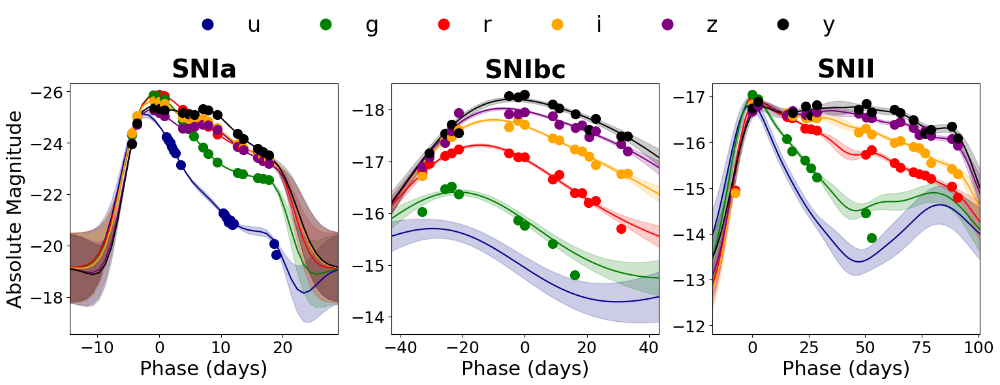

In [195]:
from matplotlib.lines import Line2D
fig, ax = plt.subplots(1,3,figsize=(18,5))

exp_Ia = test[3644]
exp_II = test[13782]
exp_Ibc = test[19976]
for i in range(6):
    ax[0].plot(exp_Ia.dense_times,exp_Ia.dense_lc[:,:,0][:,i],color=colors[i])
    ax[0].fill_between(exp_Ia.dense_times,
                     exp_Ia.dense_lc[:,:,0][:,i]+exp_Ia.dense_lc[:,:,1][:,i],
                     exp_Ia.dense_lc[:,:,0][:,i]-exp_Ia.dense_lc[:,:,1][:,i],
                     alpha=0.2,color=colors[i])
    
    ax[2].plot(exp_II.dense_times,exp_II.dense_lc[:,:,0][:,i],color=colors[i])
    ax[2].fill_between(exp_II.dense_times,
                     exp_II.dense_lc[:,:,0][:,i]+exp_II.dense_lc[:,:,1][:,i],
                     exp_II.dense_lc[:,:,0][:,i]-exp_II.dense_lc[:,:,1][:,i],
                     alpha=0.2,color=colors[i])
    
    ax[1].plot(exp_Ibc.dense_times,exp_Ibc.dense_lc[:,:,0][:,i],color=colors[i])
    ax[1].fill_between(exp_Ibc.dense_times,
                     exp_Ibc.dense_lc[:,:,0][:,i]+exp_Ibc.dense_lc[:,:,1][:,i],
                     exp_Ibc.dense_lc[:,:,0][:,i]-exp_Ibc.dense_lc[:,:,1][:,i],
                     alpha=0.2,color=colors[i])
for i in range(len(exp_Ia.times)):
    ax[0].plot(exp_Ia.times[i],exp_Ia.abs_mags[i],'o',markersize=10,color=colors[int(exp_Ia.filters[i])])
for i in range(len(exp_II.times)):
    ax[2].plot(exp_II.times[i],exp_II.abs_mags[i],'o',markersize=10,color=colors[int(exp_II.filters[i])])
for i in range(len(exp_Ibc.times)):
    ax[1].plot(exp_Ibc.times[i],exp_Ibc.abs_mags[i],'o',markersize=10,color=colors[int(exp_Ibc.filters[i])])

ax[0].set_xlim(exp_Ia.times.min()-10,exp_Ia.times.max()+10)
ax[2].set_xlim(exp_II.times.min()-10,exp_II.times.max()+10)
ax[1].set_xlim(exp_Ibc.times.min()-10,exp_Ibc.times.max()+10)
for a in ax:
    a.invert_yaxis()
    a.tick_params(labelsize=18)
    a.set_xlabel('Phase (days)', fontsize=22)
ax[0].set_ylabel('Absolute Magnitude', fontsize=22)
ax[0].set_title('SNIa',fontsize=28,weight='bold')
ax[1].set_title('SNIbc',fontsize=28,weight='bold')
ax[2].set_title('SNII',fontsize=28,weight='bold')

lines = [Line2D([], [], color=c, marker='o',linewidth=0,markersize=12) for c in colors]
fig.legend(lines, filters, numpoints=1, ncol=6,loc=9,fontsize=24,frameon=False,bbox_to_anchor=(0.5,1.15))

fig.savefig('/Users/brianhsu/Downloads/exp_lc.pdf', dpi=200,  bbox_inches='tight')

In [ ]:
np.